## IMPORT LIBRARIES

In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import re
import keras_tuner as kt
from surprise.model_selection import GridSearchCV,train_test_split
from surprise.accuracy import rmse,mae
from surprise import Dataset,Reader,SVD
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split as tts
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras.layers import (
    Input,
    Embedding,
    Flatten,
    Concatenate,
    Dense,
    Dropout)
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error,mean_absolute_error
from bs4 import BeautifulSoup
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords

I0000 00:00:1785955794.775399    2277 cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
I0000 00:00:1785955795.944940    2277 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


I0000 00:00:1785955799.045386    2277 cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.


In [2]:
# Loading Data ...
df = pd.read_csv("train_data.csv",low_memory=False)
df

,overall,vote,verified,reviewTime,reviewerID,asin,style,reviewerName,reviewText,summary,unixReviewTime
0,2,NaN,False,2016-11-11,A2OSUEZJIN7BI,0511189877,NaN,Chris,I have an older URC-WR7 remote and thought thi...,Cannot Learn,1478822400
1,5,NaN,True,2016-06-06,A2NETQRG6JHIG7,0511189877,NaN,Qrysta White,First time I've EVER had a remote that needed ...,zero programming needed! Miracle!?,1465171200
2,4,NaN,True,2016-03-10,A12JHGROAX49G7,0511189877,NaN,Linwood,Got them and only 2 of them worked. company ca...,Works Good and programs easy.,1457568000
3,5,NaN,True,2016-01-14,A1KV65E2TMMG6F,0511189877,NaN,Dane Williams,I got tired of the remote being on the wrong s...,Same as TWC remote,1452729600
4,5,NaN,True,2016-10-20,A280POPEWI0NSA,0594459451,NaN,Kristina H.,After purchasing cheap cords from another webs...,Good Quality Cord,1476921600
...,...,...,...,...,...,...,...,...,...,...,...
838939,5,NaN,True,2017-07-25,A1OOVLE2KZ6KGA,B01HJCN1EI,NaN,Puddzee,These are my favorite charging cords for a few...,Worth the price.,1500940800
838940,1,NaN,True,2017-04-04,A77K1B31UAQ29,B01HJCN1EI,NaN,addictedtoreading,"Update....after 2 months of gentle use, cable ...",UPDATE...BREAKS AND SLOW CHARGING,1491264000
838941,3,NaN,True,2017-07-08,A2SVXUVUAWUDK2,B01HJH42KU,NaN,Andrew,These are okay. The connection becomes very if...,Hope this makes sense. You'd understand if you...,1499472000
838942,5,2.0,True,2016-12-01,A2HUZO7MQAY5I2,B01HJH40WU,NaN,michael clontz,"Ok here is an odd thing that happened to me, I...",Not the correct product as linked in the sale.,1480550400


## EXPLORATORY DATA ANALYSIS

In [3]:
print(df.info())
print("==================================")
print(df.duplicated().sum())
print("==================================")
print(df.shape)
print("==================================")
print(df.describe())
print("==================================")
print(df.isna().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 838944 entries, 0 to 838943
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   overall         838944 non-null  int64 
 1   vote            191468 non-null  object
 2   verified        838944 non-null  bool  
 3   reviewTime      838944 non-null  object
 4   reviewerID      838944 non-null  object
 5   asin            838944 non-null  object
 6   style           490613 non-null  object
 7   reviewerName    838717 non-null  object
 8   reviewText      838944 non-null  object
 9   summary         838868 non-null  object
 10  unixReviewTime  838944 non-null  int64 
dtypes: bool(1), int64(2), object(8)
memory usage: 64.8+ MB
None


8327
(838944, 11)
             overall  unixReviewTime
count  838944.000000    8.389440e+05
mean        4.021317    1.483167e+09
std         1.344223    2.229270e+07
min         1.000000    1.451606e+09
25%         3.000000    1.464653e+09
50%         5.000000    1.479254e+09
75%         5.000000    1.499472e+09
max         5.000000    1.538525e+09


overall                0
vote              647476
verified               0
reviewTime             0
reviewerID             0
asin                   0
style             348331
reviewerName         227
reviewText             0
summary               76
unixReviewTime         0
dtype: int64


In [8]:
print(df["asin"].nunique())
print("==================================")
print(df["reviewerID"].nunique())
print("==================================")
print(df["reviewText"].nunique())

90715


321135


807611


In [5]:
id_per_asin = df.groupby("reviewerID")["asin"].count().sort_values(ascending=False)
asin_per_id = df.groupby("asin")["reviewerID"].count().sort_values(ascending=False)
print(id_per_asin.shape)
print("==================================")
print(asin_per_id.shape)
print("==================================")
print(id_per_asin[id_per_asin > 3].shape)
print("==================================")
print(asin_per_id[asin_per_id > 5].shape)

(321135,)
(90715,)
(67269,)
(27979,)


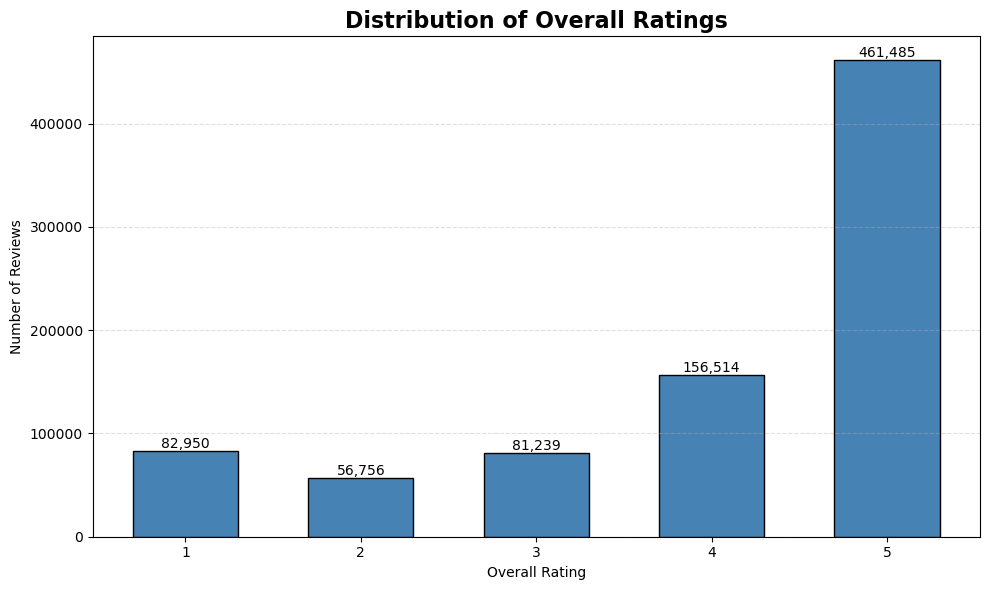

In [16]:
plt.figure(figsize=(10,6))
counts = df["overall"].value_counts().sort_index()
bars = plt.bar(counts.index, counts.values,
               color="steelblue",
               edgecolor="black",
               width=0.6)
for bar in bars:
    plt.text(bar.get_x() + bar.get_width()/2,
             bar.get_height(),
             f"{int(bar.get_height()):,}",
             ha='center', va='bottom', fontsize=10) 
plt.title("Distribution of Overall Ratings", fontsize=16, fontweight="bold")
plt.xlabel("Overall Rating")
plt.ylabel("Number of Reviews")
plt.xticks([1,2,3,4,5])
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.savefig("Distribution of Overall Ratings", dpi=300, bbox_inches="tight")

## DATA PREPROCESSING AND CLEANING

In [20]:
# Divide Data
df1 = df[["reviewerID","asin","overall"]].copy()
df1.drop_duplicates(inplace=True)
df1.dropna(inplace=True)
item_counts = df1['asin'].value_counts()
popular_items = item_counts[item_counts >= 5].index
df1 = df1[df1['asin'].isin(popular_items)]
user_counts = df1['reviewerID'].value_counts()
active_users = user_counts[user_counts >= 5].index
df1 = df1[df1['reviewerID'].isin(active_users)]
num_users = df['reviewerID'].nunique()
num_items = df['asin'].nunique()

# SVD (BASELINE) :

## DIVIDING TO TRAIN AND TEST

In [10]:
reader = Reader(rating_scale=(1,5))
dataset = Dataset.load_from_df(df1,reader)
trainset,testset = train_test_split(dataset,random_state=42)

## MODELING

In [11]:
model = SVD(n_factors=100,n_epochs=20,lr_all=0.005,reg_all=0.02,random_state=42)
model.fit(trainset)
predictions = model.test(testset)

## EVALUATION

In [12]:
print(rmse(predictions))
print(mae(predictions))

RMSE: 1.1132
1.1132451684346227
MAE:  0.8447
0.8446987145511252


## HYPERPARAMETER TUNING

In [13]:
# Using GridSearch
param_grid = {
    "n_factors": [50, 100, 150],
    "n_epochs": [20, 30],
    "lr_all": [0.002, 0.005],
    "reg_all": [0.02, 0.05]}
gs = GridSearchCV(
    SVD,
    param_grid,
    measures=["rmse", "mae"],
    cv=3)
gs.fit(dataset)

## BEST PARAMETERS

In [14]:
best_model = SVD(**gs.best_params["rmse"])
best_model.fit(trainset)
b_predictions = best_model.test(testset)
print(rmse(b_predictions))
print(mae(b_predictions))

RMSE: 1.1056
1.105634872606973
MAE:  0.8310
0.8309858017101808


# NCF (WITHOUT SENTIMENT ANALYSIS) :

In [15]:
# # Label Encoding
user_encoder = LabelEncoder()
item_encoder = LabelEncoder()
df1["user"] = user_encoder.fit_transform(df1["reviewerID"])
df1["item"] = item_encoder.fit_transform(df1["asin"])
df1.drop(labels=["reviewerID","asin"],inplace=True,axis=1)

## DIVIDING TO TRAIN AND TEST

In [16]:
train_df, test_df = tts(
    df1,
    test_size=0.2,
    random_state=42)

In [17]:
# Convert To Dataset For TF
train_dataset = tf.data.Dataset.from_tensor_slices(({"user": train_df["user"].values,"item": train_df["item"].values},train_df["overall"].values))
train_dataset = train_dataset.shuffle(100000).batch(256)
test_dataset = tf.data.Dataset.from_tensor_slices(({"user": test_df["user"].values,"item": test_df["item"].values},test_df["overall"].values)).batch(256)

W0000 00:00:1785934911.342263    6410 gpu_device.cc:2365] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


## NEURAL NETWORK

### Architecture

In [18]:
user_input = Input(shape=(1,), name="user")
item_input = Input(shape=(1,), name="item")
user_embedding = Embedding(num_users, 64)(user_input)
item_embedding = Embedding(num_items, 64)(item_input)
user_vec = Flatten()(user_embedding)
item_vec = Flatten()(item_embedding)
x = Concatenate()([user_vec, item_vec])
x = Dense(128, activation="relu")(x)
x = Dropout(0.2)(x)
x = Dense(64, activation="relu")(x)
x = Dense(32, activation="relu")(x)
output = Dense(1)(x)

### Build Model

In [19]:
model = Model(
    inputs=[user_input, item_input],
    outputs=output)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ user (InputLayer)   │ (None, 1)         │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ item (InputLayer)   │ (None, 1)         │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding           │ (None, 1, 64)     │ 20,552,640 │ user[0][0]        │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_1         │ (None, 1, 64)     │  5,805,760 │ item[0][0]        │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 64)        │          0 │ embedding[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_1 (Flatten) │ (None, 64)        │          0 │ embedding_1[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 128)       │          0 │ flatten[0][0],    │
│ (Concatenate)       │                   │            │ flatten_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 128)       │     16,512 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 128)       │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 64)        │      8,256 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 32)        │      2,080 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 1)         │         33 │ dense_2[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 26,385,281 (100.65 MB)

 Trainable params: 26,385,281 (100.65 MB)

 Non-trainable params: 0 (0.00 B)

### Compile Model

In [20]:
model.compile(
    optimizer='adam',
    loss='mse',
    metrics=['mae'])

### Train Model

In [21]:
history = model.fit(
    train_dataset,
    validation_data=test_dataset,
    epochs=10,
    verbose=1)

Epoch 1/10


/home/arcwarden/anaconda3/lib/python3.13/site-packages/keras/src/trainers/epoch_iterator.py:74: UserWarning: `shuffle=True` was passed, but will be ignored since the data `x` was provided as a tf.data.Dataset. The Dataset is expected to already be shuffled (via `.shuffle(buffer_size)`).
  self.data_adapter = data_adapters.get_data_adapter(


  1/740 ━━━━━━━━━━━━━━━━━━━━ 29:33 2s/step - loss: 18.6978 - mae: 4.1415

  2/740 ━━━━━━━━━━━━━━━━━━━━ 2:58 242ms/step - loss: 18.8929 - mae: 4.1613

  3/740 ━━━━━━━━━━━━━━━━━━━━ 2:52 234ms/step - loss: 18.7335 - mae: 4.1420

  4/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 229ms/step - loss: 18.6614 - mae: 4.1405

  5/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 223ms/step - loss: 18.5245 - mae: 4.1247

  6/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 218ms/step - loss: 18.5368 - mae: 4.1297

  7/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 226ms/step - loss: 18.3624 - mae: 4.1074

  8/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 228ms/step - loss: 18.2474 - mae: 4.0915

  9/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 228ms/step - loss: 18.1413 - mae: 4.0801

 10/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 226ms/step - loss: 18.0400 - mae: 4.0658

 11/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 224ms/step - loss: 17.9166 - mae: 4.0511

 12/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 223ms/step - loss: 17.7765 - mae: 4.0356

 13/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 222ms/step - loss: 17.6641 - mae: 4.0214

 14/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 221ms/step - loss: 17.5012 - mae: 3.9989

 15/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 220ms/step - loss: 17.4266 - mae: 3.9913

 16/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 219ms/step - loss: 17.3261 - mae: 3.9804

 17/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 218ms/step - loss: 17.1694 - mae: 3.9597

 18/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 217ms/step - loss: 17.0080 - mae: 3.9374

 19/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 217ms/step - loss: 16.8629 - mae: 3.9182

 20/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 217ms/step - loss: 16.6802 - mae: 3.8935

 21/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 216ms/step - loss: 16.4944 - mae: 3.8684

 22/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 216ms/step - loss: 16.3208 - mae: 3.8445

 23/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 216ms/step - loss: 16.1525 - mae: 3.8217

 24/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 215ms/step - loss: 15.9563 - mae: 3.7958

 25/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 215ms/step - loss: 15.7850 - mae: 3.7727

 26/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 215ms/step - loss: 15.5936 - mae: 3.7474

 27/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 215ms/step - loss: 15.4135 - mae: 3.7237

 28/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 214ms/step - loss: 15.1863 - mae: 3.6914

 29/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 214ms/step - loss: 14.9578 - mae: 3.6580

 30/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 214ms/step - loss: 14.7183 - mae: 3.6225

 31/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 214ms/step - loss: 14.4682 - mae: 3.5841

 32/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 214ms/step - loss: 14.2218 - mae: 3.5471

 33/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 214ms/step - loss: 13.9688 - mae: 3.5083

 34/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 214ms/step - loss: 13.7117 - mae: 3.4680

 35/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 214ms/step - loss: 13.4475 - mae: 3.4250

 36/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 213ms/step - loss: 13.1744 - mae: 3.3785

 37/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 214ms/step - loss: 12.9102 - mae: 3.3332

 38/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 214ms/step - loss: 12.6452 - mae: 3.2868

 39/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 214ms/step - loss: 12.3859 - mae: 3.2400

 40/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 214ms/step - loss: 12.1304 - mae: 3.1922

 41/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 214ms/step - loss: 11.8782 - mae: 3.1422

 42/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 214ms/step - loss: 11.6338 - mae: 3.0926

 43/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 214ms/step - loss: 11.3975 - mae: 3.0426

 44/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 214ms/step - loss: 11.1767 - mae: 2.9955

 45/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 213ms/step - loss: 10.9634 - mae: 2.9487

 46/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 213ms/step - loss: 10.7608 - mae: 2.9039

 47/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 10.5862 - mae: 2.8660

 48/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 10.4079 - mae: 2.8261

 49/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 10.2419 - mae: 2.7892

 50/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 213ms/step - loss: 10.0780 - mae: 2.7533

 51/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 213ms/step - loss: 9.9275 - mae: 2.7199 

 52/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 213ms/step - loss: 9.7828 - mae: 2.6889

 53/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 213ms/step - loss: 9.6384 - mae: 2.6567

 54/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 213ms/step - loss: 9.4949 - mae: 2.6251

 55/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 212ms/step - loss: 9.3520 - mae: 2.5928

 56/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 212ms/step - loss: 9.2078 - mae: 2.5607

 57/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 213ms/step - loss: 9.0748 - mae: 2.5326

 58/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 212ms/step - loss: 8.9485 - mae: 2.5056

 59/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 212ms/step - loss: 8.8242 - mae: 2.4795

 60/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 212ms/step - loss: 8.6984 - mae: 2.4534

 61/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 212ms/step - loss: 8.5787 - mae: 2.4288

 62/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 212ms/step - loss: 8.4664 - mae: 2.4061

 63/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 212ms/step - loss: 8.3577 - mae: 2.3845

 64/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 212ms/step - loss: 8.2479 - mae: 2.3622

 65/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 212ms/step - loss: 8.1457 - mae: 2.3423

 66/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 212ms/step - loss: 8.0464 - mae: 2.3232

 67/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 212ms/step - loss: 7.9486 - mae: 2.3045

 68/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 212ms/step - loss: 7.8540 - mae: 2.2858

 69/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 212ms/step - loss: 7.7632 - mae: 2.2683

 70/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 212ms/step - loss: 7.6741 - mae: 2.2509

 71/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 212ms/step - loss: 7.5866 - mae: 2.2338

 72/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 212ms/step - loss: 7.5030 - mae: 2.2167

 73/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 212ms/step - loss: 7.4222 - mae: 2.2004

 74/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 212ms/step - loss: 7.3408 - mae: 2.1838

 75/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 212ms/step - loss: 7.2609 - mae: 2.1674

 76/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 212ms/step - loss: 7.1839 - mae: 2.1516

 77/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 212ms/step - loss: 7.1063 - mae: 2.1351

 78/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 212ms/step - loss: 7.0352 - mae: 2.1204

 79/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 211ms/step - loss: 6.9631 - mae: 2.1049

 80/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 211ms/step - loss: 6.8971 - mae: 2.0908

 81/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 212ms/step - loss: 6.8301 - mae: 2.0767

 82/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 211ms/step - loss: 6.7649 - mae: 2.0625

 83/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 211ms/step - loss: 6.7026 - mae: 2.0492

 84/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 211ms/step - loss: 6.6435 - mae: 2.0365

 85/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 211ms/step - loss: 6.5809 - mae: 2.0227

 86/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 211ms/step - loss: 6.5198 - mae: 2.0093

 87/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 211ms/step - loss: 6.4637 - mae: 1.9972

 88/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 211ms/step - loss: 6.4089 - mae: 1.9852

 89/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 211ms/step - loss: 6.3538 - mae: 1.9734

 90/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 211ms/step - loss: 6.2991 - mae: 1.9615

 91/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 211ms/step - loss: 6.2470 - mae: 1.9502

 92/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 211ms/step - loss: 6.1958 - mae: 1.9394

 93/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 211ms/step - loss: 6.1452 - mae: 1.9283

 94/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 211ms/step - loss: 6.0931 - mae: 1.9172

 95/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 211ms/step - loss: 6.0481 - mae: 1.9076

 96/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 211ms/step - loss: 5.9983 - mae: 1.8970

 97/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 211ms/step - loss: 5.9532 - mae: 1.8878

 98/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 211ms/step - loss: 5.9076 - mae: 1.8783

 99/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 211ms/step - loss: 5.8613 - mae: 1.8686

100/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 211ms/step - loss: 5.8184 - mae: 1.8599

101/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 211ms/step - loss: 5.7782 - mae: 1.8518

102/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 211ms/step - loss: 5.7365 - mae: 1.8435

103/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 211ms/step - loss: 5.6962 - mae: 1.8350

104/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 211ms/step - loss: 5.6547 - mae: 1.8264

105/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 211ms/step - loss: 5.6150 - mae: 1.8183

106/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 211ms/step - loss: 5.5753 - mae: 1.8100

107/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 211ms/step - loss: 5.5350 - mae: 1.8015

108/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 211ms/step - loss: 5.4985 - mae: 1.7941

109/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 211ms/step - loss: 5.4621 - mae: 1.7866

110/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 211ms/step - loss: 5.4266 - mae: 1.7793

111/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 211ms/step - loss: 5.3915 - mae: 1.7720

112/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 211ms/step - loss: 5.3541 - mae: 1.7639

113/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 211ms/step - loss: 5.3193 - mae: 1.7567

114/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 211ms/step - loss: 5.2867 - mae: 1.7500

115/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 211ms/step - loss: 5.2523 - mae: 1.7428

116/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 211ms/step - loss: 5.2197 - mae: 1.7358

117/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 211ms/step - loss: 5.1882 - mae: 1.7292

118/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 211ms/step - loss: 5.1570 - mae: 1.7223

119/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 211ms/step - loss: 5.1288 - mae: 1.7165

120/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 211ms/step - loss: 5.0958 - mae: 1.7092

121/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 211ms/step - loss: 5.0646 - mae: 1.7026

122/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 211ms/step - loss: 5.0346 - mae: 1.6962

123/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 211ms/step - loss: 5.0057 - mae: 1.6900

124/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 211ms/step - loss: 4.9769 - mae: 1.6839

125/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 211ms/step - loss: 4.9466 - mae: 1.6775

126/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 211ms/step - loss: 4.9173 - mae: 1.6712

127/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 211ms/step - loss: 4.8903 - mae: 1.6656

128/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 4.8629 - mae: 1.6598

129/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 4.8379 - mae: 1.6549

130/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 4.8108 - mae: 1.6492

131/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 4.7848 - mae: 1.6436

132/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 4.7586 - mae: 1.6380

133/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 4.7342 - mae: 1.6328

134/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 4.7093 - mae: 1.6274

135/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 4.6856 - mae: 1.6225

136/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 4.6610 - mae: 1.6173

137/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 4.6385 - mae: 1.6124

138/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 211ms/step - loss: 4.6140 - mae: 1.6073

139/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 211ms/step - loss: 4.5897 - mae: 1.6020

140/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 211ms/step - loss: 4.5674 - mae: 1.5973

141/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 211ms/step - loss: 4.5455 - mae: 1.5926

142/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 211ms/step - loss: 4.5261 - mae: 1.5887

143/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 211ms/step - loss: 4.5045 - mae: 1.5841

144/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 211ms/step - loss: 4.4837 - mae: 1.5796

145/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 211ms/step - loss: 4.4613 - mae: 1.5747

146/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 211ms/step - loss: 4.4386 - mae: 1.5696

147/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 211ms/step - loss: 4.4183 - mae: 1.5653

148/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 211ms/step - loss: 4.3978 - mae: 1.5608

149/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 211ms/step - loss: 4.3777 - mae: 1.5565

150/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 211ms/step - loss: 4.3592 - mae: 1.5525

151/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 211ms/step - loss: 4.3418 - mae: 1.5489

152/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 211ms/step - loss: 4.3228 - mae: 1.5449

153/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 211ms/step - loss: 4.3055 - mae: 1.5414

154/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 211ms/step - loss: 4.2852 - mae: 1.5368

155/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 211ms/step - loss: 4.2665 - mae: 1.5329

156/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 211ms/step - loss: 4.2495 - mae: 1.5292

157/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 211ms/step - loss: 4.2322 - mae: 1.5256

158/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 211ms/step - loss: 4.2159 - mae: 1.5225

159/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 211ms/step - loss: 4.1986 - mae: 1.5191

160/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 211ms/step - loss: 4.1825 - mae: 1.5159

161/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 211ms/step - loss: 4.1663 - mae: 1.5128

162/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 211ms/step - loss: 4.1488 - mae: 1.5093

163/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 211ms/step - loss: 4.1320 - mae: 1.5059

164/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 211ms/step - loss: 4.1151 - mae: 1.5024

165/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 211ms/step - loss: 4.0979 - mae: 1.4988

166/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 210ms/step - loss: 4.0819 - mae: 1.4954

167/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 210ms/step - loss: 4.0652 - mae: 1.4917

168/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 210ms/step - loss: 4.0497 - mae: 1.4885

169/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 210ms/step - loss: 4.0346 - mae: 1.4854

170/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 210ms/step - loss: 4.0204 - mae: 1.4824

171/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 210ms/step - loss: 4.0040 - mae: 1.4788

172/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 210ms/step - loss: 3.9896 - mae: 1.4756

173/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 210ms/step - loss: 3.9762 - mae: 1.4727

174/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 210ms/step - loss: 3.9621 - mae: 1.4697

175/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 210ms/step - loss: 3.9478 - mae: 1.4667

176/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 210ms/step - loss: 3.9349 - mae: 1.4639

177/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 210ms/step - loss: 3.9204 - mae: 1.4607

178/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 210ms/step - loss: 3.9062 - mae: 1.4575

179/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 210ms/step - loss: 3.8935 - mae: 1.4549

180/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 210ms/step - loss: 3.8808 - mae: 1.4525

181/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 210ms/step - loss: 3.8681 - mae: 1.4499

182/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 210ms/step - loss: 3.8533 - mae: 1.4467

183/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 210ms/step - loss: 3.8405 - mae: 1.4442

184/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 210ms/step - loss: 3.8269 - mae: 1.4414

185/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 210ms/step - loss: 3.8137 - mae: 1.4388

186/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 210ms/step - loss: 3.8014 - mae: 1.4364

187/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 210ms/step - loss: 3.7876 - mae: 1.4334

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 210ms/step - loss: 3.7758 - mae: 1.4309

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 210ms/step - loss: 3.7634 - mae: 1.4282

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 210ms/step - loss: 3.7518 - mae: 1.4258

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 210ms/step - loss: 3.7406 - mae: 1.4237

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 210ms/step - loss: 3.7279 - mae: 1.4209

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 210ms/step - loss: 3.7154 - mae: 1.4182

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 210ms/step - loss: 3.7041 - mae: 1.4159

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 210ms/step - loss: 3.6915 - mae: 1.4131

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 210ms/step - loss: 3.6792 - mae: 1.4103

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 210ms/step - loss: 3.6682 - mae: 1.4079

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 3.6570 - mae: 1.4053

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 3.6460 - mae: 1.4029

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 3.6338 - mae: 1.4002

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 3.6227 - mae: 1.3977

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 3.6125 - mae: 1.3956

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 3.6008 - mae: 1.3929

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 3.5921 - mae: 1.3911

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 3.5820 - mae: 1.3889

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 3.5723 - mae: 1.3868

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 210ms/step - loss: 3.5635 - mae: 1.3850

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 210ms/step - loss: 3.5529 - mae: 1.3825

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 210ms/step - loss: 3.5447 - mae: 1.3809

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 210ms/step - loss: 3.5344 - mae: 1.3787

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 210ms/step - loss: 3.5250 - mae: 1.3769

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 210ms/step - loss: 3.5148 - mae: 1.3749

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 210ms/step - loss: 3.5045 - mae: 1.3728

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 210ms/step - loss: 3.4942 - mae: 1.3707

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 210ms/step - loss: 3.4858 - mae: 1.3690

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 210ms/step - loss: 3.4767 - mae: 1.3672

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 210ms/step - loss: 3.4666 - mae: 1.3650

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 210ms/step - loss: 3.4565 - mae: 1.3630

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 210ms/step - loss: 3.4471 - mae: 1.3611

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 210ms/step - loss: 3.4370 - mae: 1.3590

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 210ms/step - loss: 3.4282 - mae: 1.3572

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 3.4197 - mae: 1.3555

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 3.4101 - mae: 1.3532

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 3.4019 - mae: 1.3513

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 3.3940 - mae: 1.3496

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 3.3841 - mae: 1.3473

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 3.3763 - mae: 1.3457

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 3.3684 - mae: 1.3441

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 3.3591 - mae: 1.3419

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 3.3516 - mae: 1.3403

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 3.3429 - mae: 1.3384

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 3.3353 - mae: 1.3368

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 3.3270 - mae: 1.3349

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 3.3197 - mae: 1.3335

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 3.3111 - mae: 1.3316

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 3.3026 - mae: 1.3298

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 3.2954 - mae: 1.3283

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 3.2868 - mae: 1.3265

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 3.2787 - mae: 1.3249

240/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 3.2698 - mae: 1.3228

241/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 210ms/step - loss: 3.2619 - mae: 1.3212

242/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 210ms/step - loss: 3.2547 - mae: 1.3197

243/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 210ms/step - loss: 3.2472 - mae: 1.3182

244/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 210ms/step - loss: 3.2394 - mae: 1.3165

245/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 3.2316 - mae: 1.3148

246/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 3.2246 - mae: 1.3134

247/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 3.2182 - mae: 1.3121

248/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 3.2108 - mae: 1.3105

249/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 3.2034 - mae: 1.3089

250/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - loss: 3.1973 - mae: 1.3075

251/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - loss: 3.1901 - mae: 1.3059

252/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - loss: 3.1834 - mae: 1.3043

253/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - loss: 3.1770 - mae: 1.3030

254/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - loss: 3.1711 - mae: 1.3018

255/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 210ms/step - loss: 3.1640 - mae: 1.3002

256/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 210ms/step - loss: 3.1571 - mae: 1.2988

257/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 210ms/step - loss: 3.1498 - mae: 1.2972

258/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 210ms/step - loss: 3.1434 - mae: 1.2960

259/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - loss: 3.1359 - mae: 1.2944

260/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - loss: 3.1298 - mae: 1.2932

261/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - loss: 3.1236 - mae: 1.2920

262/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - loss: 3.1167 - mae: 1.2905

263/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - loss: 3.1108 - mae: 1.2892

264/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 3.1046 - mae: 1.2878

265/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 3.0977 - mae: 1.2863

266/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 3.0912 - mae: 1.2848

267/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 3.0841 - mae: 1.2832

268/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 3.0773 - mae: 1.2815

269/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 210ms/step - loss: 3.0709 - mae: 1.2802

270/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 210ms/step - loss: 3.0654 - mae: 1.2790

271/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 210ms/step - loss: 3.0585 - mae: 1.2774

272/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 210ms/step - loss: 3.0522 - mae: 1.2760

273/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 210ms/step - loss: 3.0469 - mae: 1.2747

274/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 210ms/step - loss: 3.0408 - mae: 1.2734

275/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 210ms/step - loss: 3.0349 - mae: 1.2719

276/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 210ms/step - loss: 3.0281 - mae: 1.2704

277/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 210ms/step - loss: 3.0212 - mae: 1.2687

278/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 210ms/step - loss: 3.0156 - mae: 1.2675

279/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 210ms/step - loss: 3.0098 - mae: 1.2662

280/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 210ms/step - loss: 3.0039 - mae: 1.2649

281/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 210ms/step - loss: 2.9992 - mae: 1.2640

282/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 210ms/step - loss: 2.9940 - mae: 1.2629

283/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 210ms/step - loss: 2.9881 - mae: 1.2617

284/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 210ms/step - loss: 2.9815 - mae: 1.2601

285/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 210ms/step - loss: 2.9756 - mae: 1.2588

286/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 210ms/step - loss: 2.9691 - mae: 1.2573

287/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 210ms/step - loss: 2.9635 - mae: 1.2561

288/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 210ms/step - loss: 2.9579 - mae: 1.2549

289/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 210ms/step - loss: 2.9530 - mae: 1.2539

290/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 210ms/step - loss: 2.9476 - mae: 1.2526

291/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 210ms/step - loss: 2.9426 - mae: 1.2514

292/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 210ms/step - loss: 2.9372 - mae: 1.2502

293/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 210ms/step - loss: 2.9320 - mae: 1.2490

294/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 210ms/step - loss: 2.9260 - mae: 1.2477

295/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 210ms/step - loss: 2.9207 - mae: 1.2466

296/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 210ms/step - loss: 2.9155 - mae: 1.2454

297/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 210ms/step - loss: 2.9114 - mae: 1.2446

298/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 210ms/step - loss: 2.9058 - mae: 1.2433

299/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 210ms/step - loss: 2.9006 - mae: 1.2421

300/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 210ms/step - loss: 2.8959 - mae: 1.2411

301/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 210ms/step - loss: 2.8905 - mae: 1.2399

302/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 210ms/step - loss: 2.8854 - mae: 1.2387

303/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 210ms/step - loss: 2.8803 - mae: 1.2376

304/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 210ms/step - loss: 2.8746 - mae: 1.2364

305/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 210ms/step - loss: 2.8701 - mae: 1.2354

306/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 210ms/step - loss: 2.8655 - mae: 1.2343

307/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 210ms/step - loss: 2.8604 - mae: 1.2332

308/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 210ms/step - loss: 2.8558 - mae: 1.2322

309/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 210ms/step - loss: 2.8505 - mae: 1.2310

310/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 210ms/step - loss: 2.8461 - mae: 1.2300

311/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 210ms/step - loss: 2.8406 - mae: 1.2287

312/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 210ms/step - loss: 2.8354 - mae: 1.2276

313/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 210ms/step - loss: 2.8313 - mae: 1.2267

314/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 210ms/step - loss: 2.8271 - mae: 1.2257

315/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 210ms/step - loss: 2.8230 - mae: 1.2248

316/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 210ms/step - loss: 2.8181 - mae: 1.2237

317/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 210ms/step - loss: 2.8134 - mae: 1.2227

318/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 210ms/step - loss: 2.8086 - mae: 1.2216

319/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 210ms/step - loss: 2.8034 - mae: 1.2204

320/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 210ms/step - loss: 2.7989 - mae: 1.2193

321/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 2.7946 - mae: 1.2183

322/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 2.7895 - mae: 1.2171

323/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 2.7856 - mae: 1.2162

324/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 2.7811 - mae: 1.2152

325/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 2.7778 - mae: 1.2145

326/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 210ms/step - loss: 2.7734 - mae: 1.2135

327/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 210ms/step - loss: 2.7694 - mae: 1.2127

328/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 210ms/step - loss: 2.7652 - mae: 1.2117

329/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 210ms/step - loss: 2.7603 - mae: 1.2106

330/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 2.7557 - mae: 1.2097

331/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 2.7524 - mae: 1.2090

332/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 2.7481 - mae: 1.2080

333/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 2.7446 - mae: 1.2073

334/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 2.7403 - mae: 1.2064

335/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 210ms/step - loss: 2.7360 - mae: 1.2054

336/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 210ms/step - loss: 2.7323 - mae: 1.2046

337/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 210ms/step - loss: 2.7282 - mae: 1.2037

338/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 210ms/step - loss: 2.7236 - mae: 1.2027

339/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 210ms/step - loss: 2.7197 - mae: 1.2019

340/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 210ms/step - loss: 2.7153 - mae: 1.2009

341/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 210ms/step - loss: 2.7119 - mae: 1.2002

342/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 210ms/step - loss: 2.7081 - mae: 1.1994

343/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 210ms/step - loss: 2.7045 - mae: 1.1985

344/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 210ms/step - loss: 2.7008 - mae: 1.1977

345/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 2.6966 - mae: 1.1967

346/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 2.6933 - mae: 1.1959

347/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 2.6907 - mae: 1.1954

348/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 2.6875 - mae: 1.1948

349/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 2.6837 - mae: 1.1940

350/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 210ms/step - loss: 2.6797 - mae: 1.1931

351/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 210ms/step - loss: 2.6758 - mae: 1.1923

352/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 210ms/step - loss: 2.6719 - mae: 1.1915

353/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 210ms/step - loss: 2.6685 - mae: 1.1908

354/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 210ms/step - loss: 2.6650 - mae: 1.1900

355/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 210ms/step - loss: 2.6607 - mae: 1.1890

356/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 210ms/step - loss: 2.6571 - mae: 1.1882

357/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 210ms/step - loss: 2.6535 - mae: 1.1874

358/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 210ms/step - loss: 2.6501 - mae: 1.1867

359/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 2.6466 - mae: 1.1859

360/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 2.6431 - mae: 1.1852

361/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 2.6395 - mae: 1.1843

362/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 2.6361 - mae: 1.1835

363/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 2.6319 - mae: 1.1825

364/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 210ms/step - loss: 2.6278 - mae: 1.1815

365/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 210ms/step - loss: 2.6247 - mae: 1.1809

366/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 210ms/step - loss: 2.6212 - mae: 1.1800

367/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 210ms/step - loss: 2.6177 - mae: 1.1791

368/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 210ms/step - loss: 2.6141 - mae: 1.1782

369/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 210ms/step - loss: 2.6101 - mae: 1.1772

370/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 210ms/step - loss: 2.6067 - mae: 1.1764

371/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 210ms/step - loss: 2.6030 - mae: 1.1756

372/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 210ms/step - loss: 2.6003 - mae: 1.1749

373/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 2.5968 - mae: 1.1741

374/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 2.5932 - mae: 1.1733

375/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 2.5893 - mae: 1.1723

376/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 2.5856 - mae: 1.1714

377/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 2.5818 - mae: 1.1705

378/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 2.5785 - mae: 1.1696

379/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 2.5751 - mae: 1.1688

380/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 2.5718 - mae: 1.1680

381/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 2.5682 - mae: 1.1671

382/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 2.5652 - mae: 1.1664

383/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 210ms/step - loss: 2.5623 - mae: 1.1658

384/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 210ms/step - loss: 2.5591 - mae: 1.1651

385/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 210ms/step - loss: 2.5566 - mae: 1.1646

386/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 210ms/step - loss: 2.5526 - mae: 1.1638

387/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 210ms/step - loss: 2.5498 - mae: 1.1632

388/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 210ms/step - loss: 2.5469 - mae: 1.1626

389/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 210ms/step - loss: 2.5427 - mae: 1.1616

390/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 209ms/step - loss: 2.5400 - mae: 1.1610

391/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 210ms/step - loss: 2.5364 - mae: 1.1601

392/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 2.5332 - mae: 1.1594

393/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 2.5309 - mae: 1.1589

394/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 2.5285 - mae: 1.1583

395/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 2.5258 - mae: 1.1575

396/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 2.5225 - mae: 1.1567

397/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 2.5192 - mae: 1.1559

398/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 2.5160 - mae: 1.1551

399/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 2.5133 - mae: 1.1544

400/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 2.5104 - mae: 1.1538

401/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 2.5080 - mae: 1.1532

402/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 210ms/step - loss: 2.5053 - mae: 1.1527

403/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 210ms/step - loss: 2.5025 - mae: 1.1520

404/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 210ms/step - loss: 2.4993 - mae: 1.1514

405/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 210ms/step - loss: 2.4963 - mae: 1.1507

406/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 210ms/step - loss: 2.4932 - mae: 1.1500

407/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 210ms/step - loss: 2.4904 - mae: 1.1494

408/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 210ms/step - loss: 2.4873 - mae: 1.1486

409/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 210ms/step - loss: 2.4844 - mae: 1.1480

410/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 210ms/step - loss: 2.4816 - mae: 1.1473

411/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 210ms/step - loss: 2.4797 - mae: 1.1469

412/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 210ms/step - loss: 2.4766 - mae: 1.1462

413/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 210ms/step - loss: 2.4737 - mae: 1.1455

414/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 210ms/step - loss: 2.4715 - mae: 1.1449

415/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 210ms/step - loss: 2.4685 - mae: 1.1443

416/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 210ms/step - loss: 2.4656 - mae: 1.1436

417/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 210ms/step - loss: 2.4630 - mae: 1.1429

418/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 210ms/step - loss: 2.4599 - mae: 1.1422

419/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 210ms/step - loss: 2.4570 - mae: 1.1415

420/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 210ms/step - loss: 2.4542 - mae: 1.1409

421/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 210ms/step - loss: 2.4515 - mae: 1.1403

422/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 210ms/step - loss: 2.4495 - mae: 1.1399

423/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 210ms/step - loss: 2.4468 - mae: 1.1392

424/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 210ms/step - loss: 2.4438 - mae: 1.1385

425/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 210ms/step - loss: 2.4411 - mae: 1.1379

426/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 210ms/step - loss: 2.4385 - mae: 1.1374

427/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 210ms/step - loss: 2.4360 - mae: 1.1368

428/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 210ms/step - loss: 2.4331 - mae: 1.1362

429/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 210ms/step - loss: 2.4307 - mae: 1.1357

430/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 210ms/step - loss: 2.4285 - mae: 1.1352

431/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 210ms/step - loss: 2.4264 - mae: 1.1348

432/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 210ms/step - loss: 2.4238 - mae: 1.1343

433/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 210ms/step - loss: 2.4212 - mae: 1.1337

434/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 210ms/step - loss: 2.4194 - mae: 1.1333

435/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 210ms/step - loss: 2.4173 - mae: 1.1329

436/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 210ms/step - loss: 2.4148 - mae: 1.1323

437/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 210ms/step - loss: 2.4121 - mae: 1.1317

438/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 210ms/step - loss: 2.4103 - mae: 1.1314

439/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 210ms/step - loss: 2.4080 - mae: 1.1309

440/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 210ms/step - loss: 2.4059 - mae: 1.1304

441/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 210ms/step - loss: 2.4032 - mae: 1.1298

442/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 210ms/step - loss: 2.4002 - mae: 1.1291

443/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 210ms/step - loss: 2.3976 - mae: 1.1285

444/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 210ms/step - loss: 2.3949 - mae: 1.1279

445/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 210ms/step - loss: 2.3929 - mae: 1.1274

446/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 210ms/step - loss: 2.3901 - mae: 1.1268

447/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 210ms/step - loss: 2.3878 - mae: 1.1263

448/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 210ms/step - loss: 2.3859 - mae: 1.1259

449/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 210ms/step - loss: 2.3839 - mae: 1.1255

450/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 210ms/step - loss: 2.3816 - mae: 1.1249

451/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 210ms/step - loss: 2.3793 - mae: 1.1244

452/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 210ms/step - loss: 2.3774 - mae: 1.1239

453/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 210ms/step - loss: 2.3753 - mae: 1.1235

454/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 210ms/step - loss: 2.3731 - mae: 1.1230

455/740 ━━━━━━━━━━━━━━━━━━━━ 59s 210ms/step - loss: 2.3715 - mae: 1.1227 

456/740 ━━━━━━━━━━━━━━━━━━━━ 59s 210ms/step - loss: 2.3699 - mae: 1.1225

457/740 ━━━━━━━━━━━━━━━━━━━━ 59s 210ms/step - loss: 2.3675 - mae: 1.1219

458/740 ━━━━━━━━━━━━━━━━━━━━ 59s 210ms/step - loss: 2.3654 - mae: 1.1215

459/740 ━━━━━━━━━━━━━━━━━━━━ 59s 210ms/step - loss: 2.3635 - mae: 1.1211

460/740 ━━━━━━━━━━━━━━━━━━━━ 58s 210ms/step - loss: 2.3616 - mae: 1.1208

461/740 ━━━━━━━━━━━━━━━━━━━━ 58s 210ms/step - loss: 2.3597 - mae: 1.1204

462/740 ━━━━━━━━━━━━━━━━━━━━ 58s 210ms/step - loss: 2.3578 - mae: 1.1200

463/740 ━━━━━━━━━━━━━━━━━━━━ 58s 210ms/step - loss: 2.3553 - mae: 1.1194

464/740 ━━━━━━━━━━━━━━━━━━━━ 58s 210ms/step - loss: 2.3530 - mae: 1.1189

465/740 ━━━━━━━━━━━━━━━━━━━━ 57s 210ms/step - loss: 2.3507 - mae: 1.1184

466/740 ━━━━━━━━━━━━━━━━━━━━ 57s 210ms/step - loss: 2.3481 - mae: 1.1178

467/740 ━━━━━━━━━━━━━━━━━━━━ 57s 210ms/step - loss: 2.3456 - mae: 1.1172

468/740 ━━━━━━━━━━━━━━━━━━━━ 57s 210ms/step - loss: 2.3436 - mae: 1.1167

469/740 ━━━━━━━━━━━━━━━━━━━━ 56s 210ms/step - loss: 2.3420 - mae: 1.1163

470/740 ━━━━━━━━━━━━━━━━━━━━ 56s 210ms/step - loss: 2.3398 - mae: 1.1158

471/740 ━━━━━━━━━━━━━━━━━━━━ 56s 210ms/step - loss: 2.3375 - mae: 1.1152

472/740 ━━━━━━━━━━━━━━━━━━━━ 56s 210ms/step - loss: 2.3352 - mae: 1.1147

473/740 ━━━━━━━━━━━━━━━━━━━━ 56s 210ms/step - loss: 2.3329 - mae: 1.1141

474/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 2.3304 - mae: 1.1135

475/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 2.3280 - mae: 1.1130

476/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 2.3261 - mae: 1.1125

477/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 2.3242 - mae: 1.1120

478/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 2.3217 - mae: 1.1114

479/740 ━━━━━━━━━━━━━━━━━━━━ 54s 210ms/step - loss: 2.3195 - mae: 1.1109

480/740 ━━━━━━━━━━━━━━━━━━━━ 54s 210ms/step - loss: 2.3175 - mae: 1.1105

481/740 ━━━━━━━━━━━━━━━━━━━━ 54s 210ms/step - loss: 2.3153 - mae: 1.1100

482/740 ━━━━━━━━━━━━━━━━━━━━ 54s 210ms/step - loss: 2.3132 - mae: 1.1095

483/740 ━━━━━━━━━━━━━━━━━━━━ 54s 210ms/step - loss: 2.3114 - mae: 1.1091

484/740 ━━━━━━━━━━━━━━━━━━━━ 53s 210ms/step - loss: 2.3101 - mae: 1.1088

485/740 ━━━━━━━━━━━━━━━━━━━━ 53s 210ms/step - loss: 2.3077 - mae: 1.1082

486/740 ━━━━━━━━━━━━━━━━━━━━ 53s 210ms/step - loss: 2.3058 - mae: 1.1078

487/740 ━━━━━━━━━━━━━━━━━━━━ 53s 210ms/step - loss: 2.3034 - mae: 1.1072

488/740 ━━━━━━━━━━━━━━━━━━━━ 52s 210ms/step - loss: 2.3016 - mae: 1.1068

489/740 ━━━━━━━━━━━━━━━━━━━━ 52s 210ms/step - loss: 2.2990 - mae: 1.1061

490/740 ━━━━━━━━━━━━━━━━━━━━ 52s 210ms/step - loss: 2.2971 - mae: 1.1056

491/740 ━━━━━━━━━━━━━━━━━━━━ 52s 210ms/step - loss: 2.2955 - mae: 1.1053

492/740 ━━━━━━━━━━━━━━━━━━━━ 52s 210ms/step - loss: 2.2943 - mae: 1.1051

493/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 2.2921 - mae: 1.1045

494/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 2.2900 - mae: 1.1041

495/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 2.2879 - mae: 1.1037

496/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 2.2858 - mae: 1.1032

497/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 2.2841 - mae: 1.1028

498/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 2.2827 - mae: 1.1025

499/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 2.2813 - mae: 1.1022

500/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 2.2796 - mae: 1.1018

501/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 2.2776 - mae: 1.1014

502/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 2.2757 - mae: 1.1009

503/740 ━━━━━━━━━━━━━━━━━━━━ 49s 210ms/step - loss: 2.2742 - mae: 1.1006

504/740 ━━━━━━━━━━━━━━━━━━━━ 49s 210ms/step - loss: 2.2727 - mae: 1.1003

505/740 ━━━━━━━━━━━━━━━━━━━━ 49s 210ms/step - loss: 2.2713 - mae: 1.1001

506/740 ━━━━━━━━━━━━━━━━━━━━ 49s 210ms/step - loss: 2.2695 - mae: 1.0997

507/740 ━━━━━━━━━━━━━━━━━━━━ 48s 210ms/step - loss: 2.2679 - mae: 1.0994

508/740 ━━━━━━━━━━━━━━━━━━━━ 48s 210ms/step - loss: 2.2662 - mae: 1.0990

509/740 ━━━━━━━━━━━━━━━━━━━━ 48s 210ms/step - loss: 2.2645 - mae: 1.0986

510/740 ━━━━━━━━━━━━━━━━━━━━ 48s 210ms/step - loss: 2.2628 - mae: 1.0983

511/740 ━━━━━━━━━━━━━━━━━━━━ 48s 210ms/step - loss: 2.2608 - mae: 1.0978

512/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 2.2594 - mae: 1.0975

513/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 2.2574 - mae: 1.0970

514/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 2.2555 - mae: 1.0965

515/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 2.2532 - mae: 1.0960

516/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 2.2525 - mae: 1.0958

517/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 2.2506 - mae: 1.0954

518/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 2.2489 - mae: 1.0950

519/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 2.2471 - mae: 1.0946

520/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 2.2459 - mae: 1.0944

521/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 2.2445 - mae: 1.0941

522/740 ━━━━━━━━━━━━━━━━━━━━ 45s 210ms/step - loss: 2.2424 - mae: 1.0936

523/740 ━━━━━━━━━━━━━━━━━━━━ 45s 210ms/step - loss: 2.2408 - mae: 1.0932

524/740 ━━━━━━━━━━━━━━━━━━━━ 45s 210ms/step - loss: 2.2391 - mae: 1.0929

525/740 ━━━━━━━━━━━━━━━━━━━━ 45s 210ms/step - loss: 2.2369 - mae: 1.0924

526/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 2.2357 - mae: 1.0922

527/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 2.2337 - mae: 1.0917

528/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 2.2316 - mae: 1.0912

529/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 2.2300 - mae: 1.0908

530/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 2.2282 - mae: 1.0904

531/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 2.2267 - mae: 1.0901

532/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 2.2248 - mae: 1.0897

533/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 2.2233 - mae: 1.0893

534/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 2.2215 - mae: 1.0888

535/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 2.2199 - mae: 1.0884

536/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 2.2184 - mae: 1.0881

537/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 2.2165 - mae: 1.0876

538/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 2.2144 - mae: 1.0871

539/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 2.2128 - mae: 1.0866

540/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 2.2117 - mae: 1.0864

541/740 ━━━━━━━━━━━━━━━━━━━━ 41s 210ms/step - loss: 2.2104 - mae: 1.0861

542/740 ━━━━━━━━━━━━━━━━━━━━ 41s 210ms/step - loss: 2.2084 - mae: 1.0856

543/740 ━━━━━━━━━━━━━━━━━━━━ 41s 210ms/step - loss: 2.2066 - mae: 1.0852

544/740 ━━━━━━━━━━━━━━━━━━━━ 41s 210ms/step - loss: 2.2048 - mae: 1.0848

545/740 ━━━━━━━━━━━━━━━━━━━━ 40s 210ms/step - loss: 2.2032 - mae: 1.0845

546/740 ━━━━━━━━━━━━━━━━━━━━ 40s 210ms/step - loss: 2.2020 - mae: 1.0843

547/740 ━━━━━━━━━━━━━━━━━━━━ 40s 210ms/step - loss: 2.2005 - mae: 1.0840

548/740 ━━━━━━━━━━━━━━━━━━━━ 40s 210ms/step - loss: 2.1987 - mae: 1.0836

549/740 ━━━━━━━━━━━━━━━━━━━━ 40s 210ms/step - loss: 2.1975 - mae: 1.0834

550/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 2.1960 - mae: 1.0831

551/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 2.1947 - mae: 1.0827

552/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 2.1937 - mae: 1.0826

553/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 2.1919 - mae: 1.0821

554/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 2.1902 - mae: 1.0817

555/740 ━━━━━━━━━━━━━━━━━━━━ 38s 210ms/step - loss: 2.1885 - mae: 1.0813

556/740 ━━━━━━━━━━━━━━━━━━━━ 38s 210ms/step - loss: 2.1870 - mae: 1.0810

557/740 ━━━━━━━━━━━━━━━━━━━━ 38s 210ms/step - loss: 2.1851 - mae: 1.0805

558/740 ━━━━━━━━━━━━━━━━━━━━ 38s 210ms/step - loss: 2.1837 - mae: 1.0802

559/740 ━━━━━━━━━━━━━━━━━━━━ 38s 210ms/step - loss: 2.1823 - mae: 1.0798

560/740 ━━━━━━━━━━━━━━━━━━━━ 37s 210ms/step - loss: 2.1807 - mae: 1.0795

561/740 ━━━━━━━━━━━━━━━━━━━━ 37s 210ms/step - loss: 2.1792 - mae: 1.0791

562/740 ━━━━━━━━━━━━━━━━━━━━ 37s 210ms/step - loss: 2.1778 - mae: 1.0788

563/740 ━━━━━━━━━━━━━━━━━━━━ 37s 210ms/step - loss: 2.1765 - mae: 1.0785

564/740 ━━━━━━━━━━━━━━━━━━━━ 36s 210ms/step - loss: 2.1749 - mae: 1.0782

565/740 ━━━━━━━━━━━━━━━━━━━━ 36s 210ms/step - loss: 2.1735 - mae: 1.0779

566/740 ━━━━━━━━━━━━━━━━━━━━ 36s 210ms/step - loss: 2.1717 - mae: 1.0774

567/740 ━━━━━━━━━━━━━━━━━━━━ 36s 210ms/step - loss: 2.1701 - mae: 1.0771

568/740 ━━━━━━━━━━━━━━━━━━━━ 36s 210ms/step - loss: 2.1687 - mae: 1.0768

569/740 ━━━━━━━━━━━━━━━━━━━━ 35s 210ms/step - loss: 2.1677 - mae: 1.0766

570/740 ━━━━━━━━━━━━━━━━━━━━ 35s 210ms/step - loss: 2.1660 - mae: 1.0762

571/740 ━━━━━━━━━━━━━━━━━━━━ 35s 210ms/step - loss: 2.1644 - mae: 1.0758

572/740 ━━━━━━━━━━━━━━━━━━━━ 35s 210ms/step - loss: 2.1628 - mae: 1.0755

573/740 ━━━━━━━━━━━━━━━━━━━━ 35s 210ms/step - loss: 2.1615 - mae: 1.0752

574/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 2.1603 - mae: 1.0749

575/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 2.1590 - mae: 1.0746

576/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 2.1576 - mae: 1.0743

577/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 2.1567 - mae: 1.0741

578/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 2.1548 - mae: 1.0736

579/740 ━━━━━━━━━━━━━━━━━━━━ 33s 210ms/step - loss: 2.1535 - mae: 1.0733

580/740 ━━━━━━━━━━━━━━━━━━━━ 33s 210ms/step - loss: 2.1518 - mae: 1.0729

581/740 ━━━━━━━━━━━━━━━━━━━━ 33s 210ms/step - loss: 2.1505 - mae: 1.0726

582/740 ━━━━━━━━━━━━━━━━━━━━ 33s 210ms/step - loss: 2.1492 - mae: 1.0723

583/740 ━━━━━━━━━━━━━━━━━━━━ 32s 210ms/step - loss: 2.1485 - mae: 1.0722

584/740 ━━━━━━━━━━━━━━━━━━━━ 32s 210ms/step - loss: 2.1468 - mae: 1.0718

585/740 ━━━━━━━━━━━━━━━━━━━━ 32s 210ms/step - loss: 2.1455 - mae: 1.0715

586/740 ━━━━━━━━━━━━━━━━━━━━ 32s 210ms/step - loss: 2.1439 - mae: 1.0711

587/740 ━━━━━━━━━━━━━━━━━━━━ 32s 210ms/step - loss: 2.1426 - mae: 1.0709

588/740 ━━━━━━━━━━━━━━━━━━━━ 31s 210ms/step - loss: 2.1406 - mae: 1.0704

589/740 ━━━━━━━━━━━━━━━━━━━━ 31s 210ms/step - loss: 2.1396 - mae: 1.0702

590/740 ━━━━━━━━━━━━━━━━━━━━ 31s 210ms/step - loss: 2.1380 - mae: 1.0697

591/740 ━━━━━━━━━━━━━━━━━━━━ 31s 210ms/step - loss: 2.1366 - mae: 1.0694

592/740 ━━━━━━━━━━━━━━━━━━━━ 31s 210ms/step - loss: 2.1351 - mae: 1.0691

593/740 ━━━━━━━━━━━━━━━━━━━━ 30s 210ms/step - loss: 2.1336 - mae: 1.0687

594/740 ━━━━━━━━━━━━━━━━━━━━ 30s 210ms/step - loss: 2.1324 - mae: 1.0684

595/740 ━━━━━━━━━━━━━━━━━━━━ 30s 210ms/step - loss: 2.1315 - mae: 1.0682

596/740 ━━━━━━━━━━━━━━━━━━━━ 30s 210ms/step - loss: 2.1300 - mae: 1.0679

597/740 ━━━━━━━━━━━━━━━━━━━━ 30s 210ms/step - loss: 2.1286 - mae: 1.0675

598/740 ━━━━━━━━━━━━━━━━━━━━ 29s 210ms/step - loss: 2.1271 - mae: 1.0672

599/740 ━━━━━━━━━━━━━━━━━━━━ 29s 210ms/step - loss: 2.1258 - mae: 1.0668

600/740 ━━━━━━━━━━━━━━━━━━━━ 29s 210ms/step - loss: 2.1245 - mae: 1.0666

601/740 ━━━━━━━━━━━━━━━━━━━━ 29s 210ms/step - loss: 2.1227 - mae: 1.0662

602/740 ━━━━━━━━━━━━━━━━━━━━ 28s 210ms/step - loss: 2.1213 - mae: 1.0658

603/740 ━━━━━━━━━━━━━━━━━━━━ 28s 210ms/step - loss: 2.1196 - mae: 1.0654

604/740 ━━━━━━━━━━━━━━━━━━━━ 28s 210ms/step - loss: 2.1186 - mae: 1.0652

605/740 ━━━━━━━━━━━━━━━━━━━━ 28s 210ms/step - loss: 2.1174 - mae: 1.0649

606/740 ━━━━━━━━━━━━━━━━━━━━ 28s 210ms/step - loss: 2.1165 - mae: 1.0648

607/740 ━━━━━━━━━━━━━━━━━━━━ 27s 210ms/step - loss: 2.1154 - mae: 1.0645

608/740 ━━━━━━━━━━━━━━━━━━━━ 27s 210ms/step - loss: 2.1141 - mae: 1.0642

609/740 ━━━━━━━━━━━━━━━━━━━━ 27s 210ms/step - loss: 2.1129 - mae: 1.0640

610/740 ━━━━━━━━━━━━━━━━━━━━ 27s 210ms/step - loss: 2.1116 - mae: 1.0637

611/740 ━━━━━━━━━━━━━━━━━━━━ 27s 210ms/step - loss: 2.1104 - mae: 1.0634

612/740 ━━━━━━━━━━━━━━━━━━━━ 26s 210ms/step - loss: 2.1092 - mae: 1.0632

613/740 ━━━━━━━━━━━━━━━━━━━━ 26s 210ms/step - loss: 2.1079 - mae: 1.0628

614/740 ━━━━━━━━━━━━━━━━━━━━ 26s 210ms/step - loss: 2.1069 - mae: 1.0626

615/740 ━━━━━━━━━━━━━━━━━━━━ 26s 210ms/step - loss: 2.1055 - mae: 1.0623

616/740 ━━━━━━━━━━━━━━━━━━━━ 26s 210ms/step - loss: 2.1043 - mae: 1.0620

617/740 ━━━━━━━━━━━━━━━━━━━━ 25s 210ms/step - loss: 2.1028 - mae: 1.0617

618/740 ━━━━━━━━━━━━━━━━━━━━ 25s 210ms/step - loss: 2.1014 - mae: 1.0614

619/740 ━━━━━━━━━━━━━━━━━━━━ 25s 210ms/step - loss: 2.0998 - mae: 1.0610

620/740 ━━━━━━━━━━━━━━━━━━━━ 25s 210ms/step - loss: 2.0985 - mae: 1.0606

621/740 ━━━━━━━━━━━━━━━━━━━━ 24s 210ms/step - loss: 2.0973 - mae: 1.0603

622/740 ━━━━━━━━━━━━━━━━━━━━ 24s 210ms/step - loss: 2.0962 - mae: 1.0601

623/740 ━━━━━━━━━━━━━━━━━━━━ 24s 210ms/step - loss: 2.0948 - mae: 1.0598

624/740 ━━━━━━━━━━━━━━━━━━━━ 24s 210ms/step - loss: 2.0933 - mae: 1.0594

625/740 ━━━━━━━━━━━━━━━━━━━━ 24s 210ms/step - loss: 2.0916 - mae: 1.0590

626/740 ━━━━━━━━━━━━━━━━━━━━ 23s 210ms/step - loss: 2.0908 - mae: 1.0588

627/740 ━━━━━━━━━━━━━━━━━━━━ 23s 210ms/step - loss: 2.0892 - mae: 1.0584

628/740 ━━━━━━━━━━━━━━━━━━━━ 23s 210ms/step - loss: 2.0880 - mae: 1.0581

629/740 ━━━━━━━━━━━━━━━━━━━━ 23s 210ms/step - loss: 2.0870 - mae: 1.0579

630/740 ━━━━━━━━━━━━━━━━━━━━ 23s 210ms/step - loss: 2.0858 - mae: 1.0576

631/740 ━━━━━━━━━━━━━━━━━━━━ 22s 210ms/step - loss: 2.0843 - mae: 1.0572

632/740 ━━━━━━━━━━━━━━━━━━━━ 22s 210ms/step - loss: 2.0827 - mae: 1.0568

633/740 ━━━━━━━━━━━━━━━━━━━━ 22s 210ms/step - loss: 2.0816 - mae: 1.0566

634/740 ━━━━━━━━━━━━━━━━━━━━ 22s 210ms/step - loss: 2.0805 - mae: 1.0563

635/740 ━━━━━━━━━━━━━━━━━━━━ 22s 210ms/step - loss: 2.0794 - mae: 1.0560

636/740 ━━━━━━━━━━━━━━━━━━━━ 21s 210ms/step - loss: 2.0783 - mae: 1.0558

637/740 ━━━━━━━━━━━━━━━━━━━━ 21s 210ms/step - loss: 2.0772 - mae: 1.0555

638/740 ━━━━━━━━━━━━━━━━━━━━ 21s 210ms/step - loss: 2.0761 - mae: 1.0553

639/740 ━━━━━━━━━━━━━━━━━━━━ 21s 210ms/step - loss: 2.0748 - mae: 1.0550

640/740 ━━━━━━━━━━━━━━━━━━━━ 20s 210ms/step - loss: 2.0734 - mae: 1.0547

641/740 ━━━━━━━━━━━━━━━━━━━━ 20s 210ms/step - loss: 2.0722 - mae: 1.0545

642/740 ━━━━━━━━━━━━━━━━━━━━ 20s 210ms/step - loss: 2.0711 - mae: 1.0542

643/740 ━━━━━━━━━━━━━━━━━━━━ 20s 210ms/step - loss: 2.0698 - mae: 1.0539

644/740 ━━━━━━━━━━━━━━━━━━━━ 20s 210ms/step - loss: 2.0685 - mae: 1.0537

645/740 ━━━━━━━━━━━━━━━━━━━━ 19s 210ms/step - loss: 2.0674 - mae: 1.0534

646/740 ━━━━━━━━━━━━━━━━━━━━ 19s 210ms/step - loss: 2.0661 - mae: 1.0530

647/740 ━━━━━━━━━━━━━━━━━━━━ 19s 210ms/step - loss: 2.0649 - mae: 1.0527

648/740 ━━━━━━━━━━━━━━━━━━━━ 19s 210ms/step - loss: 2.0638 - mae: 1.0524

649/740 ━━━━━━━━━━━━━━━━━━━━ 19s 210ms/step - loss: 2.0629 - mae: 1.0522

650/740 ━━━━━━━━━━━━━━━━━━━━ 18s 210ms/step - loss: 2.0618 - mae: 1.0520

651/740 ━━━━━━━━━━━━━━━━━━━━ 18s 210ms/step - loss: 2.0606 - mae: 1.0517

652/740 ━━━━━━━━━━━━━━━━━━━━ 18s 210ms/step - loss: 2.0592 - mae: 1.0513

653/740 ━━━━━━━━━━━━━━━━━━━━ 18s 210ms/step - loss: 2.0577 - mae: 1.0509

654/740 ━━━━━━━━━━━━━━━━━━━━ 18s 210ms/step - loss: 2.0563 - mae: 1.0506

655/740 ━━━━━━━━━━━━━━━━━━━━ 17s 210ms/step - loss: 2.0550 - mae: 1.0503

656/740 ━━━━━━━━━━━━━━━━━━━━ 17s 210ms/step - loss: 2.0540 - mae: 1.0500

657/740 ━━━━━━━━━━━━━━━━━━━━ 17s 210ms/step - loss: 2.0530 - mae: 1.0497

658/740 ━━━━━━━━━━━━━━━━━━━━ 17s 210ms/step - loss: 2.0516 - mae: 1.0494

659/740 ━━━━━━━━━━━━━━━━━━━━ 17s 210ms/step - loss: 2.0505 - mae: 1.0492

660/740 ━━━━━━━━━━━━━━━━━━━━ 16s 210ms/step - loss: 2.0495 - mae: 1.0489

661/740 ━━━━━━━━━━━━━━━━━━━━ 16s 210ms/step - loss: 2.0484 - mae: 1.0486

662/740 ━━━━━━━━━━━━━━━━━━━━ 16s 210ms/step - loss: 2.0469 - mae: 1.0482

663/740 ━━━━━━━━━━━━━━━━━━━━ 16s 210ms/step - loss: 2.0458 - mae: 1.0479

664/740 ━━━━━━━━━━━━━━━━━━━━ 15s 210ms/step - loss: 2.0443 - mae: 1.0475

665/740 ━━━━━━━━━━━━━━━━━━━━ 15s 210ms/step - loss: 2.0430 - mae: 1.0471

666/740 ━━━━━━━━━━━━━━━━━━━━ 15s 210ms/step - loss: 2.0418 - mae: 1.0469

667/740 ━━━━━━━━━━━━━━━━━━━━ 15s 210ms/step - loss: 2.0410 - mae: 1.0467

668/740 ━━━━━━━━━━━━━━━━━━━━ 15s 210ms/step - loss: 2.0398 - mae: 1.0464

669/740 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 2.0389 - mae: 1.0461

670/740 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 2.0378 - mae: 1.0459

671/740 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 2.0368 - mae: 1.0457

672/740 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 2.0356 - mae: 1.0454

673/740 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 2.0347 - mae: 1.0452

674/740 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 2.0334 - mae: 1.0450

675/740 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 2.0324 - mae: 1.0448

676/740 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 2.0312 - mae: 1.0445

677/740 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 2.0303 - mae: 1.0443

678/740 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 2.0291 - mae: 1.0441

679/740 ━━━━━━━━━━━━━━━━━━━━ 12s 210ms/step - loss: 2.0281 - mae: 1.0438

680/740 ━━━━━━━━━━━━━━━━━━━━ 12s 210ms/step - loss: 2.0270 - mae: 1.0435

681/740 ━━━━━━━━━━━━━━━━━━━━ 12s 210ms/step - loss: 2.0262 - mae: 1.0434

682/740 ━━━━━━━━━━━━━━━━━━━━ 12s 210ms/step - loss: 2.0256 - mae: 1.0432

683/740 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 2.0246 - mae: 1.0430

684/740 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 2.0238 - mae: 1.0428

685/740 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 2.0226 - mae: 1.0425

686/740 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 2.0216 - mae: 1.0422

687/740 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 2.0207 - mae: 1.0421

688/740 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 2.0196 - mae: 1.0418

689/740 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 2.0184 - mae: 1.0415

690/740 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 2.0173 - mae: 1.0413

691/740 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 2.0159 - mae: 1.0409

692/740 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 2.0151 - mae: 1.0408

693/740 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 2.0143 - mae: 1.0406 

694/740 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 2.0132 - mae: 1.0403

695/740 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 2.0124 - mae: 1.0401

696/740 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 2.0119 - mae: 1.0401

697/740 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 2.0109 - mae: 1.0398

698/740 ━━━━━━━━━━━━━━━━━━━━ 8s 210ms/step - loss: 2.0098 - mae: 1.0396

699/740 ━━━━━━━━━━━━━━━━━━━━ 8s 210ms/step - loss: 2.0087 - mae: 1.0393

700/740 ━━━━━━━━━━━━━━━━━━━━ 8s 210ms/step - loss: 2.0077 - mae: 1.0391

701/740 ━━━━━━━━━━━━━━━━━━━━ 8s 210ms/step - loss: 2.0065 - mae: 1.0388

702/740 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 2.0052 - mae: 1.0385

703/740 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 2.0042 - mae: 1.0383

704/740 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 2.0031 - mae: 1.0380

705/740 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 2.0022 - mae: 1.0378

706/740 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 2.0010 - mae: 1.0375

707/740 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 2.0001 - mae: 1.0372

708/740 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 1.9994 - mae: 1.0370

709/740 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 1.9981 - mae: 1.0367

710/740 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 1.9971 - mae: 1.0364

711/740 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 1.9960 - mae: 1.0361

712/740 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 1.9952 - mae: 1.0359

713/740 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 1.9943 - mae: 1.0358

714/740 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 1.9932 - mae: 1.0355

715/740 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 1.9922 - mae: 1.0353

716/740 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 1.9913 - mae: 1.0351

717/740 ━━━━━━━━━━━━━━━━━━━━ 4s 210ms/step - loss: 1.9903 - mae: 1.0349

718/740 ━━━━━━━━━━━━━━━━━━━━ 4s 210ms/step - loss: 1.9894 - mae: 1.0347

719/740 ━━━━━━━━━━━━━━━━━━━━ 4s 210ms/step - loss: 1.9884 - mae: 1.0344

720/740 ━━━━━━━━━━━━━━━━━━━━ 4s 210ms/step - loss: 1.9878 - mae: 1.0343

721/740 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 1.9871 - mae: 1.0341

722/740 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 1.9861 - mae: 1.0339

723/740 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 1.9851 - mae: 1.0336

724/740 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 1.9839 - mae: 1.0333

725/740 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 1.9826 - mae: 1.0330

726/740 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 1.9818 - mae: 1.0328

727/740 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 1.9807 - mae: 1.0326

728/740 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 1.9797 - mae: 1.0323

729/740 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 1.9786 - mae: 1.0320

730/740 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 1.9780 - mae: 1.0319

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 1.9766 - mae: 1.0316

732/740 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 1.9758 - mae: 1.0314

733/740 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 1.9752 - mae: 1.0312

734/740 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 1.9745 - mae: 1.0310

735/740 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 1.9740 - mae: 1.0309

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - loss: 1.9728 - mae: 1.0306

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - loss: 1.9721 - mae: 1.0304

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - loss: 1.9713 - mae: 1.0302

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - loss: 1.9705 - mae: 1.0301

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - loss: 1.9701 - mae: 1.0300

740/740 ━━━━━━━━━━━━━━━━━━━━ 158s 211ms/step - loss: 1.9701 - mae: 1.0300 - val_loss: 1.2677 - val_mae: 0.8799


Epoch 2/10


  1/740 ━━━━━━━━━━━━━━━━━━━━ 5:19 432ms/step - loss: 0.8504 - mae: 0.7253

  2/740 ━━━━━━━━━━━━━━━━━━━━ 2:53 235ms/step - loss: 0.8636 - mae: 0.7282

  3/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 225ms/step - loss: 0.8559 - mae: 0.7281

  4/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 222ms/step - loss: 0.9557 - mae: 0.7545

  5/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 221ms/step - loss: 0.9644 - mae: 0.7503

  6/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 219ms/step - loss: 0.9763 - mae: 0.7549

  7/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 220ms/step - loss: 0.9687 - mae: 0.7512

  8/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 221ms/step - loss: 0.9802 - mae: 0.7517

  9/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 220ms/step - loss: 0.9860 - mae: 0.7486

 10/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 220ms/step - loss: 0.9941 - mae: 0.7494

 11/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 223ms/step - loss: 0.9844 - mae: 0.7429

 12/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 221ms/step - loss: 0.9822 - mae: 0.7415

 13/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 220ms/step - loss: 0.9668 - mae: 0.7346

 14/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 219ms/step - loss: 0.9596 - mae: 0.7300

 15/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 218ms/step - loss: 0.9639 - mae: 0.7310

 16/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 218ms/step - loss: 0.9637 - mae: 0.7305

 17/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 218ms/step - loss: 0.9540 - mae: 0.7278

 18/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 219ms/step - loss: 0.9629 - mae: 0.7301

 19/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 218ms/step - loss: 0.9601 - mae: 0.7292

 20/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 217ms/step - loss: 0.9527 - mae: 0.7271

 21/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 217ms/step - loss: 0.9625 - mae: 0.7307

 22/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 216ms/step - loss: 0.9643 - mae: 0.7313

 23/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 216ms/step - loss: 0.9625 - mae: 0.7313

 24/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 216ms/step - loss: 0.9589 - mae: 0.7294

 25/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 216ms/step - loss: 0.9604 - mae: 0.7305

 26/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 216ms/step - loss: 0.9607 - mae: 0.7315

 27/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 216ms/step - loss: 0.9616 - mae: 0.7327

 28/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 215ms/step - loss: 0.9596 - mae: 0.7327

 29/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 215ms/step - loss: 0.9623 - mae: 0.7344

 30/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 215ms/step - loss: 0.9691 - mae: 0.7380

 31/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 214ms/step - loss: 0.9653 - mae: 0.7370

 32/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 214ms/step - loss: 0.9665 - mae: 0.7375

 33/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 214ms/step - loss: 0.9638 - mae: 0.7367

 34/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 214ms/step - loss: 0.9579 - mae: 0.7343

 35/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 214ms/step - loss: 0.9639 - mae: 0.7356

 36/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 214ms/step - loss: 0.9652 - mae: 0.7366

 37/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 213ms/step - loss: 0.9654 - mae: 0.7372

 38/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 213ms/step - loss: 0.9600 - mae: 0.7349

 39/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 213ms/step - loss: 0.9654 - mae: 0.7364

 40/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 213ms/step - loss: 0.9621 - mae: 0.7347

 41/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 213ms/step - loss: 0.9648 - mae: 0.7352

 42/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 213ms/step - loss: 0.9677 - mae: 0.7359

 43/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 212ms/step - loss: 0.9634 - mae: 0.7348

 44/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 212ms/step - loss: 0.9614 - mae: 0.7347

 45/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 212ms/step - loss: 0.9597 - mae: 0.7345

 46/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 212ms/step - loss: 0.9590 - mae: 0.7340

 47/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 212ms/step - loss: 0.9630 - mae: 0.7356

 48/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 212ms/step - loss: 0.9657 - mae: 0.7365

 49/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 0.9635 - mae: 0.7352

 50/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 0.9616 - mae: 0.7343

 51/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 214ms/step - loss: 0.9623 - mae: 0.7342

 52/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 215ms/step - loss: 0.9616 - mae: 0.7333

 53/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 216ms/step - loss: 0.9629 - mae: 0.7338

 54/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 216ms/step - loss: 0.9649 - mae: 0.7346

 55/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 217ms/step - loss: 0.9653 - mae: 0.7342

 56/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 217ms/step - loss: 0.9672 - mae: 0.7346

 57/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 217ms/step - loss: 0.9682 - mae: 0.7353

 58/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 219ms/step - loss: 0.9698 - mae: 0.7358

 59/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 219ms/step - loss: 0.9708 - mae: 0.7365

 60/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 219ms/step - loss: 0.9731 - mae: 0.7376

 61/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 219ms/step - loss: 0.9761 - mae: 0.7386

 62/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 219ms/step - loss: 0.9781 - mae: 0.7392

 63/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 219ms/step - loss: 0.9785 - mae: 0.7392

 64/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 219ms/step - loss: 0.9792 - mae: 0.7399

 65/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 219ms/step - loss: 0.9760 - mae: 0.7392

 66/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 219ms/step - loss: 0.9748 - mae: 0.7387

 67/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 219ms/step - loss: 0.9748 - mae: 0.7385

 68/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 219ms/step - loss: 0.9775 - mae: 0.7389

 69/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 218ms/step - loss: 0.9784 - mae: 0.7394

 70/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 218ms/step - loss: 0.9780 - mae: 0.7392

 71/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 218ms/step - loss: 0.9750 - mae: 0.7379

 72/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 218ms/step - loss: 0.9744 - mae: 0.7380

 73/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 219ms/step - loss: 0.9744 - mae: 0.7382

 74/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 219ms/step - loss: 0.9782 - mae: 0.7392

 75/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 219ms/step - loss: 0.9778 - mae: 0.7391

 76/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 218ms/step - loss: 0.9789 - mae: 0.7394

 77/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 218ms/step - loss: 0.9777 - mae: 0.7389

 78/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 218ms/step - loss: 0.9793 - mae: 0.7394

 79/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 218ms/step - loss: 0.9781 - mae: 0.7390

 80/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 218ms/step - loss: 0.9779 - mae: 0.7391

 81/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 218ms/step - loss: 0.9758 - mae: 0.7381

 82/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 218ms/step - loss: 0.9769 - mae: 0.7382

 83/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 218ms/step - loss: 0.9787 - mae: 0.7391

 84/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 218ms/step - loss: 0.9783 - mae: 0.7391

 85/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 218ms/step - loss: 0.9812 - mae: 0.7400

 86/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 218ms/step - loss: 0.9817 - mae: 0.7402

 87/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 218ms/step - loss: 0.9810 - mae: 0.7402

 88/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 218ms/step - loss: 0.9824 - mae: 0.7403

 89/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 218ms/step - loss: 0.9836 - mae: 0.7408

 90/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 218ms/step - loss: 0.9839 - mae: 0.7407

 91/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 217ms/step - loss: 0.9853 - mae: 0.7411

 92/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 217ms/step - loss: 0.9875 - mae: 0.7418

 93/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 217ms/step - loss: 0.9887 - mae: 0.7420

 94/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 217ms/step - loss: 0.9880 - mae: 0.7412

 95/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 217ms/step - loss: 0.9875 - mae: 0.7412

 96/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 217ms/step - loss: 0.9862 - mae: 0.7407

 97/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 217ms/step - loss: 0.9847 - mae: 0.7403

 98/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 217ms/step - loss: 0.9852 - mae: 0.7405

 99/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 217ms/step - loss: 0.9844 - mae: 0.7404

100/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 217ms/step - loss: 0.9864 - mae: 0.7411

101/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 217ms/step - loss: 0.9854 - mae: 0.7407

102/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 217ms/step - loss: 0.9858 - mae: 0.7410

103/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 217ms/step - loss: 0.9869 - mae: 0.7414

104/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 217ms/step - loss: 0.9863 - mae: 0.7413

105/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 216ms/step - loss: 0.9851 - mae: 0.7406

106/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 216ms/step - loss: 0.9864 - mae: 0.7409

107/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 216ms/step - loss: 0.9877 - mae: 0.7413

108/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 216ms/step - loss: 0.9877 - mae: 0.7412

109/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 216ms/step - loss: 0.9868 - mae: 0.7407

110/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 216ms/step - loss: 0.9853 - mae: 0.7401

111/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 216ms/step - loss: 0.9848 - mae: 0.7399

112/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 216ms/step - loss: 0.9844 - mae: 0.7396

113/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 216ms/step - loss: 0.9842 - mae: 0.7395

114/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 216ms/step - loss: 0.9824 - mae: 0.7388

115/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 216ms/step - loss: 0.9843 - mae: 0.7392

116/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 216ms/step - loss: 0.9849 - mae: 0.7394

117/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 216ms/step - loss: 0.9847 - mae: 0.7393

118/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 216ms/step - loss: 0.9858 - mae: 0.7394

119/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 216ms/step - loss: 0.9862 - mae: 0.7394

120/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 216ms/step - loss: 0.9860 - mae: 0.7395

121/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 216ms/step - loss: 0.9864 - mae: 0.7397

122/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 216ms/step - loss: 0.9857 - mae: 0.7395

123/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 216ms/step - loss: 0.9850 - mae: 0.7395

124/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 216ms/step - loss: 0.9850 - mae: 0.7396

125/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 216ms/step - loss: 0.9851 - mae: 0.7398

126/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 216ms/step - loss: 0.9857 - mae: 0.7400

127/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 216ms/step - loss: 0.9857 - mae: 0.7401

128/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 215ms/step - loss: 0.9875 - mae: 0.7408

129/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 215ms/step - loss: 0.9883 - mae: 0.7407

130/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 215ms/step - loss: 0.9877 - mae: 0.7404

131/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 215ms/step - loss: 0.9882 - mae: 0.7408

132/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 215ms/step - loss: 0.9888 - mae: 0.7410

133/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 215ms/step - loss: 0.9887 - mae: 0.7411

134/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 215ms/step - loss: 0.9894 - mae: 0.7415

135/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 215ms/step - loss: 0.9901 - mae: 0.7418

136/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 215ms/step - loss: 0.9920 - mae: 0.7424

137/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 215ms/step - loss: 0.9912 - mae: 0.7423

138/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 215ms/step - loss: 0.9911 - mae: 0.7424

139/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 215ms/step - loss: 0.9920 - mae: 0.7428

140/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 215ms/step - loss: 0.9920 - mae: 0.7427

141/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 215ms/step - loss: 0.9942 - mae: 0.7435

142/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 215ms/step - loss: 0.9940 - mae: 0.7434

143/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 215ms/step - loss: 0.9934 - mae: 0.7431

144/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 215ms/step - loss: 0.9920 - mae: 0.7425

145/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 215ms/step - loss: 0.9937 - mae: 0.7430

146/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 215ms/step - loss: 0.9929 - mae: 0.7424

147/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 215ms/step - loss: 0.9909 - mae: 0.7416

148/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 215ms/step - loss: 0.9902 - mae: 0.7412

149/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 215ms/step - loss: 0.9913 - mae: 0.7415

150/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 215ms/step - loss: 0.9913 - mae: 0.7414

151/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 215ms/step - loss: 0.9907 - mae: 0.7412

152/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 215ms/step - loss: 0.9908 - mae: 0.7413

153/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 214ms/step - loss: 0.9903 - mae: 0.7411

154/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 214ms/step - loss: 0.9913 - mae: 0.7415

155/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 214ms/step - loss: 0.9906 - mae: 0.7414

156/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 214ms/step - loss: 0.9900 - mae: 0.7411

157/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 214ms/step - loss: 0.9910 - mae: 0.7413

158/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 214ms/step - loss: 0.9907 - mae: 0.7411

159/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 214ms/step - loss: 0.9920 - mae: 0.7416

160/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 214ms/step - loss: 0.9925 - mae: 0.7420

161/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 214ms/step - loss: 0.9929 - mae: 0.7421

162/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 214ms/step - loss: 0.9935 - mae: 0.7425

163/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 214ms/step - loss: 0.9936 - mae: 0.7426

164/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 214ms/step - loss: 0.9933 - mae: 0.7425

165/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 214ms/step - loss: 0.9947 - mae: 0.7430

166/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 214ms/step - loss: 0.9949 - mae: 0.7432

167/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 214ms/step - loss: 0.9945 - mae: 0.7432

168/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 214ms/step - loss: 0.9949 - mae: 0.7434

169/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 214ms/step - loss: 0.9955 - mae: 0.7434

170/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 214ms/step - loss: 0.9957 - mae: 0.7434

171/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 214ms/step - loss: 0.9964 - mae: 0.7436

172/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 214ms/step - loss: 0.9969 - mae: 0.7438

173/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 214ms/step - loss: 0.9969 - mae: 0.7438

174/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 214ms/step - loss: 0.9963 - mae: 0.7436

175/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 214ms/step - loss: 0.9962 - mae: 0.7437

176/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 214ms/step - loss: 0.9971 - mae: 0.7440

177/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 214ms/step - loss: 0.9970 - mae: 0.7439

178/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 214ms/step - loss: 0.9970 - mae: 0.7439

179/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 214ms/step - loss: 0.9960 - mae: 0.7437

180/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 214ms/step - loss: 0.9965 - mae: 0.7441

181/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 214ms/step - loss: 0.9971 - mae: 0.7443

182/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 214ms/step - loss: 0.9961 - mae: 0.7439

183/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 214ms/step - loss: 0.9955 - mae: 0.7436

184/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 214ms/step - loss: 0.9953 - mae: 0.7435

185/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 214ms/step - loss: 0.9955 - mae: 0.7435

186/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 214ms/step - loss: 0.9953 - mae: 0.7434

187/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 214ms/step - loss: 0.9962 - mae: 0.7435

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 214ms/step - loss: 0.9981 - mae: 0.7440

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 214ms/step - loss: 0.9976 - mae: 0.7437

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 214ms/step - loss: 0.9965 - mae: 0.7432

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 214ms/step - loss: 0.9971 - mae: 0.7434

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 214ms/step - loss: 0.9964 - mae: 0.7433

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 214ms/step - loss: 0.9966 - mae: 0.7433

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 214ms/step - loss: 0.9963 - mae: 0.7433

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 214ms/step - loss: 0.9957 - mae: 0.7432

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 214ms/step - loss: 0.9958 - mae: 0.7433

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 214ms/step - loss: 0.9959 - mae: 0.7433

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 214ms/step - loss: 0.9975 - mae: 0.7438

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 214ms/step - loss: 0.9976 - mae: 0.7439

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 214ms/step - loss: 0.9978 - mae: 0.7439

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 214ms/step - loss: 0.9983 - mae: 0.7441

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 214ms/step - loss: 0.9984 - mae: 0.7442

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 214ms/step - loss: 0.9978 - mae: 0.7440

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 214ms/step - loss: 0.9985 - mae: 0.7442

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 214ms/step - loss: 0.9991 - mae: 0.7444

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 214ms/step - loss: 1.0000 - mae: 0.7446

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 214ms/step - loss: 1.0002 - mae: 0.7446

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 214ms/step - loss: 1.0000 - mae: 0.7445

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 214ms/step - loss: 0.9996 - mae: 0.7443

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 214ms/step - loss: 0.9995 - mae: 0.7444

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 214ms/step - loss: 1.0000 - mae: 0.7446

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 214ms/step - loss: 1.0004 - mae: 0.7447

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 214ms/step - loss: 1.0001 - mae: 0.7444

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 214ms/step - loss: 0.9996 - mae: 0.7442

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 214ms/step - loss: 0.9985 - mae: 0.7437

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 214ms/step - loss: 0.9994 - mae: 0.7440

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 213ms/step - loss: 1.0001 - mae: 0.7441

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 213ms/step - loss: 1.0000 - mae: 0.7440

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 214ms/step - loss: 0.9998 - mae: 0.7439

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 214ms/step - loss: 0.9996 - mae: 0.7439

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 1.0000 - mae: 0.7441

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 0.9999 - mae: 0.7441

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 0.9998 - mae: 0.7440

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 0.9996 - mae: 0.7438

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 0.9990 - mae: 0.7437

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 214ms/step - loss: 0.9994 - mae: 0.7437

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 214ms/step - loss: 0.9993 - mae: 0.7436

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 214ms/step - loss: 0.9991 - mae: 0.7436

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 214ms/step - loss: 0.9995 - mae: 0.7437

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 214ms/step - loss: 1.0002 - mae: 0.7439

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 214ms/step - loss: 1.0013 - mae: 0.7443

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 214ms/step - loss: 1.0008 - mae: 0.7442

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 214ms/step - loss: 1.0006 - mae: 0.7441

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 214ms/step - loss: 1.0015 - mae: 0.7444

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 214ms/step - loss: 1.0018 - mae: 0.7445

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 214ms/step - loss: 1.0021 - mae: 0.7447

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 214ms/step - loss: 1.0023 - mae: 0.7448

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 214ms/step - loss: 1.0026 - mae: 0.7450

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 214ms/step - loss: 1.0018 - mae: 0.7446

240/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 214ms/step - loss: 1.0019 - mae: 0.7447

241/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 214ms/step - loss: 1.0021 - mae: 0.7450

242/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 214ms/step - loss: 1.0023 - mae: 0.7451

243/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 214ms/step - loss: 1.0020 - mae: 0.7451

244/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 214ms/step - loss: 1.0026 - mae: 0.7454

245/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 213ms/step - loss: 1.0029 - mae: 0.7455

246/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 214ms/step - loss: 1.0028 - mae: 0.7455

247/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 214ms/step - loss: 1.0037 - mae: 0.7459

248/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 213ms/step - loss: 1.0045 - mae: 0.7460

249/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 213ms/step - loss: 1.0044 - mae: 0.7460

250/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 213ms/step - loss: 1.0040 - mae: 0.7458

251/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 213ms/step - loss: 1.0040 - mae: 0.7458

252/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 213ms/step - loss: 1.0043 - mae: 0.7458

253/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 213ms/step - loss: 1.0045 - mae: 0.7459

254/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 213ms/step - loss: 1.0049 - mae: 0.7460

255/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 213ms/step - loss: 1.0048 - mae: 0.7460

256/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 213ms/step - loss: 1.0048 - mae: 0.7460

257/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 213ms/step - loss: 1.0051 - mae: 0.7462

258/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 213ms/step - loss: 1.0057 - mae: 0.7463

259/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 213ms/step - loss: 1.0049 - mae: 0.7462

260/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 213ms/step - loss: 1.0048 - mae: 0.7462

261/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 213ms/step - loss: 1.0051 - mae: 0.7463

262/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 213ms/step - loss: 1.0048 - mae: 0.7462

263/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 213ms/step - loss: 1.0045 - mae: 0.7462

264/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 213ms/step - loss: 1.0048 - mae: 0.7462

265/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 213ms/step - loss: 1.0047 - mae: 0.7462

266/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 213ms/step - loss: 1.0048 - mae: 0.7463

267/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 213ms/step - loss: 1.0049 - mae: 0.7463

268/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 213ms/step - loss: 1.0057 - mae: 0.7466

269/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 213ms/step - loss: 1.0049 - mae: 0.7462

270/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 213ms/step - loss: 1.0050 - mae: 0.7463

271/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 213ms/step - loss: 1.0046 - mae: 0.7462

272/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 213ms/step - loss: 1.0045 - mae: 0.7462

273/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 213ms/step - loss: 1.0046 - mae: 0.7463

274/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 213ms/step - loss: 1.0044 - mae: 0.7463

275/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 213ms/step - loss: 1.0043 - mae: 0.7464

276/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 213ms/step - loss: 1.0047 - mae: 0.7464

277/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 213ms/step - loss: 1.0058 - mae: 0.7469

278/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 213ms/step - loss: 1.0057 - mae: 0.7469

279/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 213ms/step - loss: 1.0051 - mae: 0.7467

280/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 213ms/step - loss: 1.0055 - mae: 0.7468

281/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 213ms/step - loss: 1.0060 - mae: 0.7468

282/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 213ms/step - loss: 1.0068 - mae: 0.7471

283/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 213ms/step - loss: 1.0066 - mae: 0.7470

284/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 213ms/step - loss: 1.0069 - mae: 0.7470

285/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 213ms/step - loss: 1.0070 - mae: 0.7472

286/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 213ms/step - loss: 1.0070 - mae: 0.7473

287/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 213ms/step - loss: 1.0069 - mae: 0.7473

288/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 213ms/step - loss: 1.0068 - mae: 0.7472

289/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 213ms/step - loss: 1.0073 - mae: 0.7473

290/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 213ms/step - loss: 1.0072 - mae: 0.7473

291/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 213ms/step - loss: 1.0068 - mae: 0.7471

292/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 213ms/step - loss: 1.0065 - mae: 0.7470

293/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 213ms/step - loss: 1.0063 - mae: 0.7468

294/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 213ms/step - loss: 1.0075 - mae: 0.7472

295/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 213ms/step - loss: 1.0075 - mae: 0.7471

296/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 213ms/step - loss: 1.0073 - mae: 0.7470

297/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 213ms/step - loss: 1.0075 - mae: 0.7471

298/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 213ms/step - loss: 1.0069 - mae: 0.7469

299/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 213ms/step - loss: 1.0067 - mae: 0.7468

300/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 213ms/step - loss: 1.0073 - mae: 0.7470

301/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 213ms/step - loss: 1.0072 - mae: 0.7469

302/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 213ms/step - loss: 1.0079 - mae: 0.7471

303/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 213ms/step - loss: 1.0077 - mae: 0.7471

304/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 213ms/step - loss: 1.0081 - mae: 0.7473

305/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 213ms/step - loss: 1.0082 - mae: 0.7474

306/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 213ms/step - loss: 1.0083 - mae: 0.7474

307/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 213ms/step - loss: 1.0084 - mae: 0.7475

308/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 213ms/step - loss: 1.0088 - mae: 0.7477

309/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 213ms/step - loss: 1.0094 - mae: 0.7480

310/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 213ms/step - loss: 1.0090 - mae: 0.7479

311/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 213ms/step - loss: 1.0089 - mae: 0.7479

312/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 213ms/step - loss: 1.0096 - mae: 0.7481

313/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 213ms/step - loss: 1.0098 - mae: 0.7482

314/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 213ms/step - loss: 1.0101 - mae: 0.7483

315/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 213ms/step - loss: 1.0098 - mae: 0.7482

316/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 213ms/step - loss: 1.0101 - mae: 0.7484

317/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 213ms/step - loss: 1.0104 - mae: 0.7485

318/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 213ms/step - loss: 1.0104 - mae: 0.7484

319/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 213ms/step - loss: 1.0100 - mae: 0.7482

320/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 214ms/step - loss: 1.0098 - mae: 0.7482

321/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 214ms/step - loss: 1.0095 - mae: 0.7481

322/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 214ms/step - loss: 1.0092 - mae: 0.7481

323/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 214ms/step - loss: 1.0097 - mae: 0.7483

324/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 214ms/step - loss: 1.0102 - mae: 0.7484

325/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 214ms/step - loss: 1.0106 - mae: 0.7485

326/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 214ms/step - loss: 1.0104 - mae: 0.7484

327/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 214ms/step - loss: 1.0104 - mae: 0.7484

328/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 214ms/step - loss: 1.0105 - mae: 0.7485

329/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 214ms/step - loss: 1.0105 - mae: 0.7485

330/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 214ms/step - loss: 1.0104 - mae: 0.7485

331/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 214ms/step - loss: 1.0102 - mae: 0.7484

332/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 214ms/step - loss: 1.0101 - mae: 0.7485

333/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 214ms/step - loss: 1.0103 - mae: 0.7485

334/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 214ms/step - loss: 1.0099 - mae: 0.7484

335/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 214ms/step - loss: 1.0095 - mae: 0.7483

336/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 214ms/step - loss: 1.0095 - mae: 0.7482

337/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 214ms/step - loss: 1.0093 - mae: 0.7481

338/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 214ms/step - loss: 1.0096 - mae: 0.7482

339/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 214ms/step - loss: 1.0090 - mae: 0.7480

340/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 214ms/step - loss: 1.0093 - mae: 0.7481

341/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 214ms/step - loss: 1.0096 - mae: 0.7482

342/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 214ms/step - loss: 1.0091 - mae: 0.7480

343/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 214ms/step - loss: 1.0091 - mae: 0.7480

344/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 214ms/step - loss: 1.0093 - mae: 0.7481

345/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 214ms/step - loss: 1.0098 - mae: 0.7483

346/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 214ms/step - loss: 1.0094 - mae: 0.7482

347/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 214ms/step - loss: 1.0096 - mae: 0.7482

348/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 214ms/step - loss: 1.0100 - mae: 0.7484

349/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 214ms/step - loss: 1.0097 - mae: 0.7483

350/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 214ms/step - loss: 1.0092 - mae: 0.7482

351/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 214ms/step - loss: 1.0088 - mae: 0.7481

352/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 214ms/step - loss: 1.0087 - mae: 0.7481

353/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 214ms/step - loss: 1.0083 - mae: 0.7479

354/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 214ms/step - loss: 1.0089 - mae: 0.7480

355/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 214ms/step - loss: 1.0097 - mae: 0.7481

356/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 214ms/step - loss: 1.0097 - mae: 0.7482

357/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 214ms/step - loss: 1.0095 - mae: 0.7481

358/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 214ms/step - loss: 1.0096 - mae: 0.7482

359/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 214ms/step - loss: 1.0097 - mae: 0.7482

360/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 214ms/step - loss: 1.0093 - mae: 0.7481

361/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 213ms/step - loss: 1.0093 - mae: 0.7483

362/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 213ms/step - loss: 1.0093 - mae: 0.7483

363/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 213ms/step - loss: 1.0092 - mae: 0.7483

364/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 213ms/step - loss: 1.0103 - mae: 0.7486

365/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 213ms/step - loss: 1.0107 - mae: 0.7488

366/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 213ms/step - loss: 1.0103 - mae: 0.7487

367/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 213ms/step - loss: 1.0107 - mae: 0.7488

368/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 213ms/step - loss: 1.0114 - mae: 0.7491

369/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 213ms/step - loss: 1.0111 - mae: 0.7490

370/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 213ms/step - loss: 1.0114 - mae: 0.7491

371/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 213ms/step - loss: 1.0114 - mae: 0.7492

372/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 213ms/step - loss: 1.0114 - mae: 0.7492

373/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 213ms/step - loss: 1.0115 - mae: 0.7492

374/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 213ms/step - loss: 1.0113 - mae: 0.7492

375/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 213ms/step - loss: 1.0112 - mae: 0.7492

376/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 213ms/step - loss: 1.0112 - mae: 0.7492

377/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 213ms/step - loss: 1.0114 - mae: 0.7492

378/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 213ms/step - loss: 1.0118 - mae: 0.7493

379/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 213ms/step - loss: 1.0117 - mae: 0.7493

380/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 213ms/step - loss: 1.0117 - mae: 0.7493

381/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 213ms/step - loss: 1.0110 - mae: 0.7491

382/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 213ms/step - loss: 1.0118 - mae: 0.7494

383/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 213ms/step - loss: 1.0118 - mae: 0.7493

384/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 213ms/step - loss: 1.0121 - mae: 0.7494

385/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 213ms/step - loss: 1.0117 - mae: 0.7493

386/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 213ms/step - loss: 1.0118 - mae: 0.7493

387/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 213ms/step - loss: 1.0117 - mae: 0.7492

388/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 213ms/step - loss: 1.0119 - mae: 0.7493

389/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 213ms/step - loss: 1.0114 - mae: 0.7491

390/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 213ms/step - loss: 1.0117 - mae: 0.7491

391/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 213ms/step - loss: 1.0118 - mae: 0.7492

392/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 213ms/step - loss: 1.0123 - mae: 0.7494

393/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 213ms/step - loss: 1.0125 - mae: 0.7494

394/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 213ms/step - loss: 1.0123 - mae: 0.7493

395/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 213ms/step - loss: 1.0129 - mae: 0.7496

396/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 213ms/step - loss: 1.0126 - mae: 0.7495

397/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 213ms/step - loss: 1.0132 - mae: 0.7498

398/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 213ms/step - loss: 1.0134 - mae: 0.7499

399/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 213ms/step - loss: 1.0136 - mae: 0.7500

400/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 213ms/step - loss: 1.0139 - mae: 0.7502

401/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 213ms/step - loss: 1.0140 - mae: 0.7502

402/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 213ms/step - loss: 1.0143 - mae: 0.7502

403/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 213ms/step - loss: 1.0142 - mae: 0.7502

404/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 213ms/step - loss: 1.0146 - mae: 0.7504

405/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 213ms/step - loss: 1.0149 - mae: 0.7505

406/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 213ms/step - loss: 1.0152 - mae: 0.7506

407/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 213ms/step - loss: 1.0156 - mae: 0.7508

408/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 213ms/step - loss: 1.0160 - mae: 0.7510

409/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 213ms/step - loss: 1.0163 - mae: 0.7512

410/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 213ms/step - loss: 1.0160 - mae: 0.7512

411/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 213ms/step - loss: 1.0165 - mae: 0.7514

412/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 213ms/step - loss: 1.0166 - mae: 0.7515

413/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 213ms/step - loss: 1.0166 - mae: 0.7517

414/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 213ms/step - loss: 1.0166 - mae: 0.7517

415/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 213ms/step - loss: 1.0169 - mae: 0.7518

416/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 213ms/step - loss: 1.0170 - mae: 0.7518

417/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 213ms/step - loss: 1.0165 - mae: 0.7515

418/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 213ms/step - loss: 1.0169 - mae: 0.7516

419/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 213ms/step - loss: 1.0174 - mae: 0.7518

420/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 213ms/step - loss: 1.0176 - mae: 0.7518

421/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 214ms/step - loss: 1.0175 - mae: 0.7517

422/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 214ms/step - loss: 1.0178 - mae: 0.7519

423/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 214ms/step - loss: 1.0177 - mae: 0.7519

424/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 214ms/step - loss: 1.0179 - mae: 0.7521

425/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 214ms/step - loss: 1.0181 - mae: 0.7521

426/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 214ms/step - loss: 1.0183 - mae: 0.7522

427/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 1.0179 - mae: 0.7521

428/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 1.0179 - mae: 0.7521

429/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 1.0186 - mae: 0.7523

430/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 1.0184 - mae: 0.7522

431/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 1.0183 - mae: 0.7522

432/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 214ms/step - loss: 1.0185 - mae: 0.7522

433/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 214ms/step - loss: 1.0189 - mae: 0.7524

434/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 214ms/step - loss: 1.0189 - mae: 0.7524

435/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 214ms/step - loss: 1.0188 - mae: 0.7523

436/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 214ms/step - loss: 1.0195 - mae: 0.7525

437/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 214ms/step - loss: 1.0196 - mae: 0.7525

438/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 214ms/step - loss: 1.0196 - mae: 0.7525

439/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 214ms/step - loss: 1.0196 - mae: 0.7526

440/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 214ms/step - loss: 1.0196 - mae: 0.7526

441/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 214ms/step - loss: 1.0195 - mae: 0.7526

442/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 214ms/step - loss: 1.0199 - mae: 0.7528

443/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 214ms/step - loss: 1.0200 - mae: 0.7529

444/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 214ms/step - loss: 1.0197 - mae: 0.7528

445/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 214ms/step - loss: 1.0201 - mae: 0.7530

446/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 214ms/step - loss: 1.0206 - mae: 0.7532

447/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 214ms/step - loss: 1.0203 - mae: 0.7530

448/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 214ms/step - loss: 1.0200 - mae: 0.7529

449/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 214ms/step - loss: 1.0195 - mae: 0.7526

450/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 214ms/step - loss: 1.0195 - mae: 0.7526

451/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 214ms/step - loss: 1.0192 - mae: 0.7525

452/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 214ms/step - loss: 1.0195 - mae: 0.7526

453/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 214ms/step - loss: 1.0198 - mae: 0.7527

454/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 214ms/step - loss: 1.0197 - mae: 0.7526

455/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 214ms/step - loss: 1.0202 - mae: 0.7528

456/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 214ms/step - loss: 1.0205 - mae: 0.7530

457/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 214ms/step - loss: 1.0205 - mae: 0.7530

458/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 214ms/step - loss: 1.0209 - mae: 0.7532

459/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 214ms/step - loss: 1.0212 - mae: 0.7535

460/740 ━━━━━━━━━━━━━━━━━━━━ 59s 214ms/step - loss: 1.0214 - mae: 0.7535 

461/740 ━━━━━━━━━━━━━━━━━━━━ 59s 214ms/step - loss: 1.0212 - mae: 0.7535

462/740 ━━━━━━━━━━━━━━━━━━━━ 59s 214ms/step - loss: 1.0210 - mae: 0.7534

463/740 ━━━━━━━━━━━━━━━━━━━━ 59s 214ms/step - loss: 1.0209 - mae: 0.7534

464/740 ━━━━━━━━━━━━━━━━━━━━ 59s 214ms/step - loss: 1.0215 - mae: 0.7536

465/740 ━━━━━━━━━━━━━━━━━━━━ 58s 214ms/step - loss: 1.0217 - mae: 0.7536

466/740 ━━━━━━━━━━━━━━━━━━━━ 58s 214ms/step - loss: 1.0217 - mae: 0.7535

467/740 ━━━━━━━━━━━━━━━━━━━━ 58s 214ms/step - loss: 1.0216 - mae: 0.7534

468/740 ━━━━━━━━━━━━━━━━━━━━ 58s 214ms/step - loss: 1.0220 - mae: 0.7535

469/740 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - loss: 1.0218 - mae: 0.7534

470/740 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - loss: 1.0224 - mae: 0.7536

471/740 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - loss: 1.0227 - mae: 0.7538

472/740 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - loss: 1.0228 - mae: 0.7539

473/740 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - loss: 1.0229 - mae: 0.7539

474/740 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - loss: 1.0227 - mae: 0.7539

475/740 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - loss: 1.0226 - mae: 0.7539

476/740 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - loss: 1.0224 - mae: 0.7539

477/740 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - loss: 1.0227 - mae: 0.7541

478/740 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - loss: 1.0226 - mae: 0.7541

479/740 ━━━━━━━━━━━━━━━━━━━━ 55s 214ms/step - loss: 1.0224 - mae: 0.7540

480/740 ━━━━━━━━━━━━━━━━━━━━ 55s 214ms/step - loss: 1.0229 - mae: 0.7541

481/740 ━━━━━━━━━━━━━━━━━━━━ 55s 214ms/step - loss: 1.0230 - mae: 0.7541

482/740 ━━━━━━━━━━━━━━━━━━━━ 55s 214ms/step - loss: 1.0234 - mae: 0.7542

483/740 ━━━━━━━━━━━━━━━━━━━━ 54s 214ms/step - loss: 1.0231 - mae: 0.7541

484/740 ━━━━━━━━━━━━━━━━━━━━ 54s 214ms/step - loss: 1.0237 - mae: 0.7543

485/740 ━━━━━━━━━━━━━━━━━━━━ 54s 214ms/step - loss: 1.0241 - mae: 0.7544

486/740 ━━━━━━━━━━━━━━━━━━━━ 54s 214ms/step - loss: 1.0243 - mae: 0.7545

487/740 ━━━━━━━━━━━━━━━━━━━━ 54s 214ms/step - loss: 1.0243 - mae: 0.7546

488/740 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - loss: 1.0249 - mae: 0.7549

489/740 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - loss: 1.0252 - mae: 0.7551

490/740 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - loss: 1.0257 - mae: 0.7553

491/740 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - loss: 1.0260 - mae: 0.7554

492/740 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - loss: 1.0258 - mae: 0.7554

493/740 ━━━━━━━━━━━━━━━━━━━━ 52s 214ms/step - loss: 1.0255 - mae: 0.7553

494/740 ━━━━━━━━━━━━━━━━━━━━ 52s 214ms/step - loss: 1.0254 - mae: 0.7553

495/740 ━━━━━━━━━━━━━━━━━━━━ 52s 214ms/step - loss: 1.0256 - mae: 0.7554

496/740 ━━━━━━━━━━━━━━━━━━━━ 52s 214ms/step - loss: 1.0260 - mae: 0.7555

497/740 ━━━━━━━━━━━━━━━━━━━━ 51s 214ms/step - loss: 1.0259 - mae: 0.7554

498/740 ━━━━━━━━━━━━━━━━━━━━ 51s 214ms/step - loss: 1.0261 - mae: 0.7554

499/740 ━━━━━━━━━━━━━━━━━━━━ 51s 214ms/step - loss: 1.0259 - mae: 0.7554

500/740 ━━━━━━━━━━━━━━━━━━━━ 51s 214ms/step - loss: 1.0260 - mae: 0.7554

501/740 ━━━━━━━━━━━━━━━━━━━━ 51s 214ms/step - loss: 1.0261 - mae: 0.7554

502/740 ━━━━━━━━━━━━━━━━━━━━ 50s 214ms/step - loss: 1.0263 - mae: 0.7555

503/740 ━━━━━━━━━━━━━━━━━━━━ 50s 214ms/step - loss: 1.0262 - mae: 0.7555

504/740 ━━━━━━━━━━━━━━━━━━━━ 50s 214ms/step - loss: 1.0259 - mae: 0.7554

505/740 ━━━━━━━━━━━━━━━━━━━━ 50s 214ms/step - loss: 1.0259 - mae: 0.7554

506/740 ━━━━━━━━━━━━━━━━━━━━ 50s 214ms/step - loss: 1.0258 - mae: 0.7555

507/740 ━━━━━━━━━━━━━━━━━━━━ 49s 214ms/step - loss: 1.0258 - mae: 0.7555

508/740 ━━━━━━━━━━━━━━━━━━━━ 49s 214ms/step - loss: 1.0254 - mae: 0.7554

509/740 ━━━━━━━━━━━━━━━━━━━━ 49s 214ms/step - loss: 1.0253 - mae: 0.7554

510/740 ━━━━━━━━━━━━━━━━━━━━ 49s 214ms/step - loss: 1.0256 - mae: 0.7554

511/740 ━━━━━━━━━━━━━━━━━━━━ 48s 214ms/step - loss: 1.0254 - mae: 0.7553

512/740 ━━━━━━━━━━━━━━━━━━━━ 48s 214ms/step - loss: 1.0252 - mae: 0.7552

513/740 ━━━━━━━━━━━━━━━━━━━━ 48s 214ms/step - loss: 1.0254 - mae: 0.7552

514/740 ━━━━━━━━━━━━━━━━━━━━ 48s 214ms/step - loss: 1.0253 - mae: 0.7551

515/740 ━━━━━━━━━━━━━━━━━━━━ 48s 214ms/step - loss: 1.0253 - mae: 0.7551

516/740 ━━━━━━━━━━━━━━━━━━━━ 47s 214ms/step - loss: 1.0255 - mae: 0.7552

517/740 ━━━━━━━━━━━━━━━━━━━━ 47s 214ms/step - loss: 1.0250 - mae: 0.7550

518/740 ━━━━━━━━━━━━━━━━━━━━ 47s 214ms/step - loss: 1.0253 - mae: 0.7551

519/740 ━━━━━━━━━━━━━━━━━━━━ 47s 214ms/step - loss: 1.0253 - mae: 0.7551

520/740 ━━━━━━━━━━━━━━━━━━━━ 46s 214ms/step - loss: 1.0253 - mae: 0.7552

521/740 ━━━━━━━━━━━━━━━━━━━━ 46s 214ms/step - loss: 1.0256 - mae: 0.7553

522/740 ━━━━━━━━━━━━━━━━━━━━ 46s 214ms/step - loss: 1.0256 - mae: 0.7554

523/740 ━━━━━━━━━━━━━━━━━━━━ 46s 214ms/step - loss: 1.0259 - mae: 0.7555

524/740 ━━━━━━━━━━━━━━━━━━━━ 46s 214ms/step - loss: 1.0257 - mae: 0.7554

525/740 ━━━━━━━━━━━━━━━━━━━━ 45s 214ms/step - loss: 1.0264 - mae: 0.7556

526/740 ━━━━━━━━━━━━━━━━━━━━ 45s 214ms/step - loss: 1.0264 - mae: 0.7557

527/740 ━━━━━━━━━━━━━━━━━━━━ 45s 214ms/step - loss: 1.0265 - mae: 0.7557

528/740 ━━━━━━━━━━━━━━━━━━━━ 45s 214ms/step - loss: 1.0269 - mae: 0.7557

529/740 ━━━━━━━━━━━━━━━━━━━━ 45s 214ms/step - loss: 1.0271 - mae: 0.7558

530/740 ━━━━━━━━━━━━━━━━━━━━ 44s 214ms/step - loss: 1.0274 - mae: 0.7559

531/740 ━━━━━━━━━━━━━━━━━━━━ 44s 214ms/step - loss: 1.0278 - mae: 0.7560

532/740 ━━━━━━━━━━━━━━━━━━━━ 44s 214ms/step - loss: 1.0277 - mae: 0.7560

533/740 ━━━━━━━━━━━━━━━━━━━━ 44s 214ms/step - loss: 1.0280 - mae: 0.7561

534/740 ━━━━━━━━━━━━━━━━━━━━ 44s 214ms/step - loss: 1.0280 - mae: 0.7562

535/740 ━━━━━━━━━━━━━━━━━━━━ 43s 214ms/step - loss: 1.0281 - mae: 0.7562

536/740 ━━━━━━━━━━━━━━━━━━━━ 43s 214ms/step - loss: 1.0279 - mae: 0.7562

537/740 ━━━━━━━━━━━━━━━━━━━━ 43s 214ms/step - loss: 1.0282 - mae: 0.7563

538/740 ━━━━━━━━━━━━━━━━━━━━ 43s 214ms/step - loss: 1.0282 - mae: 0.7564

539/740 ━━━━━━━━━━━━━━━━━━━━ 42s 214ms/step - loss: 1.0279 - mae: 0.7563

540/740 ━━━━━━━━━━━━━━━━━━━━ 42s 214ms/step - loss: 1.0278 - mae: 0.7562

541/740 ━━━━━━━━━━━━━━━━━━━━ 42s 214ms/step - loss: 1.0279 - mae: 0.7562

542/740 ━━━━━━━━━━━━━━━━━━━━ 42s 214ms/step - loss: 1.0282 - mae: 0.7562

543/740 ━━━━━━━━━━━━━━━━━━━━ 42s 214ms/step - loss: 1.0282 - mae: 0.7562

544/740 ━━━━━━━━━━━━━━━━━━━━ 41s 214ms/step - loss: 1.0285 - mae: 0.7563

545/740 ━━━━━━━━━━━━━━━━━━━━ 41s 214ms/step - loss: 1.0294 - mae: 0.7565

546/740 ━━━━━━━━━━━━━━━━━━━━ 41s 214ms/step - loss: 1.0292 - mae: 0.7565

547/740 ━━━━━━━━━━━━━━━━━━━━ 41s 214ms/step - loss: 1.0294 - mae: 0.7566

548/740 ━━━━━━━━━━━━━━━━━━━━ 41s 214ms/step - loss: 1.0298 - mae: 0.7567

549/740 ━━━━━━━━━━━━━━━━━━━━ 40s 214ms/step - loss: 1.0298 - mae: 0.7568

550/740 ━━━━━━━━━━━━━━━━━━━━ 40s 214ms/step - loss: 1.0298 - mae: 0.7569

551/740 ━━━━━━━━━━━━━━━━━━━━ 40s 214ms/step - loss: 1.0301 - mae: 0.7570

552/740 ━━━━━━━━━━━━━━━━━━━━ 40s 214ms/step - loss: 1.0307 - mae: 0.7572

553/740 ━━━━━━━━━━━━━━━━━━━━ 39s 214ms/step - loss: 1.0306 - mae: 0.7572

554/740 ━━━━━━━━━━━━━━━━━━━━ 39s 214ms/step - loss: 1.0308 - mae: 0.7573

555/740 ━━━━━━━━━━━━━━━━━━━━ 39s 214ms/step - loss: 1.0309 - mae: 0.7574

556/740 ━━━━━━━━━━━━━━━━━━━━ 39s 214ms/step - loss: 1.0308 - mae: 0.7574

557/740 ━━━━━━━━━━━━━━━━━━━━ 39s 214ms/step - loss: 1.0304 - mae: 0.7572

558/740 ━━━━━━━━━━━━━━━━━━━━ 38s 213ms/step - loss: 1.0303 - mae: 0.7571

559/740 ━━━━━━━━━━━━━━━━━━━━ 38s 213ms/step - loss: 1.0305 - mae: 0.7571

560/740 ━━━━━━━━━━━━━━━━━━━━ 38s 213ms/step - loss: 1.0309 - mae: 0.7572

561/740 ━━━━━━━━━━━━━━━━━━━━ 38s 213ms/step - loss: 1.0314 - mae: 0.7573

562/740 ━━━━━━━━━━━━━━━━━━━━ 37s 213ms/step - loss: 1.0315 - mae: 0.7574

563/740 ━━━━━━━━━━━━━━━━━━━━ 37s 213ms/step - loss: 1.0311 - mae: 0.7573

564/740 ━━━━━━━━━━━━━━━━━━━━ 37s 213ms/step - loss: 1.0311 - mae: 0.7573

565/740 ━━━━━━━━━━━━━━━━━━━━ 37s 213ms/step - loss: 1.0311 - mae: 0.7573

566/740 ━━━━━━━━━━━━━━━━━━━━ 37s 213ms/step - loss: 1.0307 - mae: 0.7572

567/740 ━━━━━━━━━━━━━━━━━━━━ 36s 213ms/step - loss: 1.0309 - mae: 0.7573

568/740 ━━━━━━━━━━━━━━━━━━━━ 36s 213ms/step - loss: 1.0310 - mae: 0.7573

569/740 ━━━━━━━━━━━━━━━━━━━━ 36s 213ms/step - loss: 1.0310 - mae: 0.7573

570/740 ━━━━━━━━━━━━━━━━━━━━ 36s 213ms/step - loss: 1.0309 - mae: 0.7573

571/740 ━━━━━━━━━━━━━━━━━━━━ 36s 213ms/step - loss: 1.0313 - mae: 0.7575

572/740 ━━━━━━━━━━━━━━━━━━━━ 35s 213ms/step - loss: 1.0311 - mae: 0.7574

573/740 ━━━━━━━━━━━━━━━━━━━━ 35s 213ms/step - loss: 1.0314 - mae: 0.7575

574/740 ━━━━━━━━━━━━━━━━━━━━ 35s 213ms/step - loss: 1.0314 - mae: 0.7574

575/740 ━━━━━━━━━━━━━━━━━━━━ 35s 213ms/step - loss: 1.0315 - mae: 0.7574

576/740 ━━━━━━━━━━━━━━━━━━━━ 34s 213ms/step - loss: 1.0313 - mae: 0.7574

577/740 ━━━━━━━━━━━━━━━━━━━━ 34s 213ms/step - loss: 1.0315 - mae: 0.7574

578/740 ━━━━━━━━━━━━━━━━━━━━ 34s 213ms/step - loss: 1.0318 - mae: 0.7576

579/740 ━━━━━━━━━━━━━━━━━━━━ 34s 213ms/step - loss: 1.0317 - mae: 0.7576

580/740 ━━━━━━━━━━━━━━━━━━━━ 34s 213ms/step - loss: 1.0320 - mae: 0.7577

581/740 ━━━━━━━━━━━━━━━━━━━━ 33s 213ms/step - loss: 1.0319 - mae: 0.7577

582/740 ━━━━━━━━━━━━━━━━━━━━ 33s 213ms/step - loss: 1.0320 - mae: 0.7577

583/740 ━━━━━━━━━━━━━━━━━━━━ 33s 213ms/step - loss: 1.0319 - mae: 0.7577

584/740 ━━━━━━━━━━━━━━━━━━━━ 33s 213ms/step - loss: 1.0321 - mae: 0.7578

585/740 ━━━━━━━━━━━━━━━━━━━━ 33s 213ms/step - loss: 1.0323 - mae: 0.7579

586/740 ━━━━━━━━━━━━━━━━━━━━ 32s 213ms/step - loss: 1.0325 - mae: 0.7579

587/740 ━━━━━━━━━━━━━━━━━━━━ 32s 213ms/step - loss: 1.0326 - mae: 0.7580

588/740 ━━━━━━━━━━━━━━━━━━━━ 32s 213ms/step - loss: 1.0325 - mae: 0.7580

589/740 ━━━━━━━━━━━━━━━━━━━━ 32s 213ms/step - loss: 1.0332 - mae: 0.7582

590/740 ━━━━━━━━━━━━━━━━━━━━ 32s 213ms/step - loss: 1.0334 - mae: 0.7583

591/740 ━━━━━━━━━━━━━━━━━━━━ 31s 213ms/step - loss: 1.0332 - mae: 0.7582

592/740 ━━━━━━━━━━━━━━━━━━━━ 31s 213ms/step - loss: 1.0335 - mae: 0.7583

593/740 ━━━━━━━━━━━━━━━━━━━━ 31s 213ms/step - loss: 1.0336 - mae: 0.7584

594/740 ━━━━━━━━━━━━━━━━━━━━ 31s 213ms/step - loss: 1.0338 - mae: 0.7585

595/740 ━━━━━━━━━━━━━━━━━━━━ 30s 213ms/step - loss: 1.0336 - mae: 0.7584

596/740 ━━━━━━━━━━━━━━━━━━━━ 30s 213ms/step - loss: 1.0334 - mae: 0.7584

597/740 ━━━━━━━━━━━━━━━━━━━━ 30s 213ms/step - loss: 1.0338 - mae: 0.7585

598/740 ━━━━━━━━━━━━━━━━━━━━ 30s 213ms/step - loss: 1.0338 - mae: 0.7585

599/740 ━━━━━━━━━━━━━━━━━━━━ 30s 213ms/step - loss: 1.0337 - mae: 0.7585

600/740 ━━━━━━━━━━━━━━━━━━━━ 29s 213ms/step - loss: 1.0335 - mae: 0.7584

601/740 ━━━━━━━━━━━━━━━━━━━━ 29s 213ms/step - loss: 1.0336 - mae: 0.7584

602/740 ━━━━━━━━━━━━━━━━━━━━ 29s 213ms/step - loss: 1.0335 - mae: 0.7584

603/740 ━━━━━━━━━━━━━━━━━━━━ 29s 213ms/step - loss: 1.0336 - mae: 0.7585

604/740 ━━━━━━━━━━━━━━━━━━━━ 29s 213ms/step - loss: 1.0336 - mae: 0.7585

605/740 ━━━━━━━━━━━━━━━━━━━━ 28s 213ms/step - loss: 1.0336 - mae: 0.7586

606/740 ━━━━━━━━━━━━━━━━━━━━ 28s 213ms/step - loss: 1.0338 - mae: 0.7586

607/740 ━━━━━━━━━━━━━━━━━━━━ 28s 213ms/step - loss: 1.0336 - mae: 0.7586

608/740 ━━━━━━━━━━━━━━━━━━━━ 28s 213ms/step - loss: 1.0340 - mae: 0.7587

609/740 ━━━━━━━━━━━━━━━━━━━━ 27s 213ms/step - loss: 1.0341 - mae: 0.7587

610/740 ━━━━━━━━━━━━━━━━━━━━ 27s 213ms/step - loss: 1.0341 - mae: 0.7588

611/740 ━━━━━━━━━━━━━━━━━━━━ 27s 213ms/step - loss: 1.0341 - mae: 0.7588

612/740 ━━━━━━━━━━━━━━━━━━━━ 27s 213ms/step - loss: 1.0344 - mae: 0.7589

613/740 ━━━━━━━━━━━━━━━━━━━━ 27s 213ms/step - loss: 1.0343 - mae: 0.7589

614/740 ━━━━━━━━━━━━━━━━━━━━ 26s 213ms/step - loss: 1.0344 - mae: 0.7590

615/740 ━━━━━━━━━━━━━━━━━━━━ 26s 213ms/step - loss: 1.0344 - mae: 0.7590

616/740 ━━━━━━━━━━━━━━━━━━━━ 26s 213ms/step - loss: 1.0342 - mae: 0.7590

617/740 ━━━━━━━━━━━━━━━━━━━━ 26s 213ms/step - loss: 1.0342 - mae: 0.7589

618/740 ━━━━━━━━━━━━━━━━━━━━ 26s 213ms/step - loss: 1.0346 - mae: 0.7591

619/740 ━━━━━━━━━━━━━━━━━━━━ 25s 213ms/step - loss: 1.0347 - mae: 0.7591

620/740 ━━━━━━━━━━━━━━━━━━━━ 25s 213ms/step - loss: 1.0347 - mae: 0.7591

621/740 ━━━━━━━━━━━━━━━━━━━━ 25s 213ms/step - loss: 1.0346 - mae: 0.7591

622/740 ━━━━━━━━━━━━━━━━━━━━ 25s 213ms/step - loss: 1.0350 - mae: 0.7592

623/740 ━━━━━━━━━━━━━━━━━━━━ 24s 213ms/step - loss: 1.0350 - mae: 0.7593

624/740 ━━━━━━━━━━━━━━━━━━━━ 24s 213ms/step - loss: 1.0352 - mae: 0.7593

625/740 ━━━━━━━━━━━━━━━━━━━━ 24s 213ms/step - loss: 1.0351 - mae: 0.7593

626/740 ━━━━━━━━━━━━━━━━━━━━ 24s 213ms/step - loss: 1.0351 - mae: 0.7593

627/740 ━━━━━━━━━━━━━━━━━━━━ 24s 213ms/step - loss: 1.0352 - mae: 0.7593

628/740 ━━━━━━━━━━━━━━━━━━━━ 23s 213ms/step - loss: 1.0351 - mae: 0.7593

629/740 ━━━━━━━━━━━━━━━━━━━━ 23s 213ms/step - loss: 1.0350 - mae: 0.7592

630/740 ━━━━━━━━━━━━━━━━━━━━ 23s 213ms/step - loss: 1.0355 - mae: 0.7593

631/740 ━━━━━━━━━━━━━━━━━━━━ 23s 213ms/step - loss: 1.0353 - mae: 0.7593

632/740 ━━━━━━━━━━━━━━━━━━━━ 23s 213ms/step - loss: 1.0353 - mae: 0.7593

633/740 ━━━━━━━━━━━━━━━━━━━━ 22s 213ms/step - loss: 1.0350 - mae: 0.7592

634/740 ━━━━━━━━━━━━━━━━━━━━ 22s 213ms/step - loss: 1.0351 - mae: 0.7592

635/740 ━━━━━━━━━━━━━━━━━━━━ 22s 213ms/step - loss: 1.0352 - mae: 0.7593

636/740 ━━━━━━━━━━━━━━━━━━━━ 22s 213ms/step - loss: 1.0352 - mae: 0.7592

637/740 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - loss: 1.0354 - mae: 0.7593

638/740 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - loss: 1.0358 - mae: 0.7595

639/740 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - loss: 1.0358 - mae: 0.7594

640/740 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - loss: 1.0359 - mae: 0.7595

641/740 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - loss: 1.0362 - mae: 0.7596

642/740 ━━━━━━━━━━━━━━━━━━━━ 20s 213ms/step - loss: 1.0363 - mae: 0.7597

643/740 ━━━━━━━━━━━━━━━━━━━━ 20s 213ms/step - loss: 1.0363 - mae: 0.7597

644/740 ━━━━━━━━━━━━━━━━━━━━ 20s 213ms/step - loss: 1.0365 - mae: 0.7597

645/740 ━━━━━━━━━━━━━━━━━━━━ 20s 213ms/step - loss: 1.0366 - mae: 0.7598

646/740 ━━━━━━━━━━━━━━━━━━━━ 20s 213ms/step - loss: 1.0369 - mae: 0.7599

647/740 ━━━━━━━━━━━━━━━━━━━━ 19s 213ms/step - loss: 1.0367 - mae: 0.7599

648/740 ━━━━━━━━━━━━━━━━━━━━ 19s 213ms/step - loss: 1.0367 - mae: 0.7600

649/740 ━━━━━━━━━━━━━━━━━━━━ 19s 213ms/step - loss: 1.0368 - mae: 0.7600

650/740 ━━━━━━━━━━━━━━━━━━━━ 19s 213ms/step - loss: 1.0367 - mae: 0.7599

651/740 ━━━━━━━━━━━━━━━━━━━━ 18s 213ms/step - loss: 1.0367 - mae: 0.7599

652/740 ━━━━━━━━━━━━━━━━━━━━ 18s 213ms/step - loss: 1.0367 - mae: 0.7599

653/740 ━━━━━━━━━━━━━━━━━━━━ 18s 213ms/step - loss: 1.0371 - mae: 0.7600

654/740 ━━━━━━━━━━━━━━━━━━━━ 18s 213ms/step - loss: 1.0370 - mae: 0.7600

655/740 ━━━━━━━━━━━━━━━━━━━━ 18s 213ms/step - loss: 1.0373 - mae: 0.7600

656/740 ━━━━━━━━━━━━━━━━━━━━ 17s 213ms/step - loss: 1.0372 - mae: 0.7600

657/740 ━━━━━━━━━━━━━━━━━━━━ 17s 213ms/step - loss: 1.0368 - mae: 0.7599

658/740 ━━━━━━━━━━━━━━━━━━━━ 17s 213ms/step - loss: 1.0370 - mae: 0.7600

659/740 ━━━━━━━━━━━━━━━━━━━━ 17s 213ms/step - loss: 1.0369 - mae: 0.7600

660/740 ━━━━━━━━━━━━━━━━━━━━ 17s 213ms/step - loss: 1.0370 - mae: 0.7601

661/740 ━━━━━━━━━━━━━━━━━━━━ 16s 213ms/step - loss: 1.0367 - mae: 0.7600

662/740 ━━━━━━━━━━━━━━━━━━━━ 16s 213ms/step - loss: 1.0365 - mae: 0.7600

663/740 ━━━━━━━━━━━━━━━━━━━━ 16s 213ms/step - loss: 1.0363 - mae: 0.7599

664/740 ━━━━━━━━━━━━━━━━━━━━ 16s 213ms/step - loss: 1.0363 - mae: 0.7599

665/740 ━━━━━━━━━━━━━━━━━━━━ 15s 213ms/step - loss: 1.0364 - mae: 0.7599

666/740 ━━━━━━━━━━━━━━━━━━━━ 15s 213ms/step - loss: 1.0367 - mae: 0.7600

667/740 ━━━━━━━━━━━━━━━━━━━━ 15s 213ms/step - loss: 1.0369 - mae: 0.7600

668/740 ━━━━━━━━━━━━━━━━━━━━ 15s 213ms/step - loss: 1.0371 - mae: 0.7600

669/740 ━━━━━━━━━━━━━━━━━━━━ 15s 213ms/step - loss: 1.0373 - mae: 0.7601

670/740 ━━━━━━━━━━━━━━━━━━━━ 14s 213ms/step - loss: 1.0368 - mae: 0.7600

671/740 ━━━━━━━━━━━━━━━━━━━━ 14s 213ms/step - loss: 1.0370 - mae: 0.7600

672/740 ━━━━━━━━━━━━━━━━━━━━ 14s 213ms/step - loss: 1.0371 - mae: 0.7601

673/740 ━━━━━━━━━━━━━━━━━━━━ 14s 213ms/step - loss: 1.0369 - mae: 0.7600

674/740 ━━━━━━━━━━━━━━━━━━━━ 14s 213ms/step - loss: 1.0368 - mae: 0.7600

675/740 ━━━━━━━━━━━━━━━━━━━━ 13s 213ms/step - loss: 1.0365 - mae: 0.7599

676/740 ━━━━━━━━━━━━━━━━━━━━ 13s 213ms/step - loss: 1.0367 - mae: 0.7600

677/740 ━━━━━━━━━━━━━━━━━━━━ 13s 213ms/step - loss: 1.0367 - mae: 0.7600

678/740 ━━━━━━━━━━━━━━━━━━━━ 13s 213ms/step - loss: 1.0371 - mae: 0.7601

679/740 ━━━━━━━━━━━━━━━━━━━━ 12s 213ms/step - loss: 1.0371 - mae: 0.7601

680/740 ━━━━━━━━━━━━━━━━━━━━ 12s 213ms/step - loss: 1.0371 - mae: 0.7600

681/740 ━━━━━━━━━━━━━━━━━━━━ 12s 213ms/step - loss: 1.0375 - mae: 0.7602

682/740 ━━━━━━━━━━━━━━━━━━━━ 12s 213ms/step - loss: 1.0374 - mae: 0.7601

683/740 ━━━━━━━━━━━━━━━━━━━━ 12s 213ms/step - loss: 1.0374 - mae: 0.7602

684/740 ━━━━━━━━━━━━━━━━━━━━ 11s 213ms/step - loss: 1.0377 - mae: 0.7603

685/740 ━━━━━━━━━━━━━━━━━━━━ 11s 213ms/step - loss: 1.0378 - mae: 0.7603

686/740 ━━━━━━━━━━━━━━━━━━━━ 11s 213ms/step - loss: 1.0381 - mae: 0.7604

687/740 ━━━━━━━━━━━━━━━━━━━━ 11s 213ms/step - loss: 1.0383 - mae: 0.7604

688/740 ━━━━━━━━━━━━━━━━━━━━ 11s 213ms/step - loss: 1.0386 - mae: 0.7605

689/740 ━━━━━━━━━━━━━━━━━━━━ 10s 213ms/step - loss: 1.0388 - mae: 0.7606

690/740 ━━━━━━━━━━━━━━━━━━━━ 10s 213ms/step - loss: 1.0386 - mae: 0.7606

691/740 ━━━━━━━━━━━━━━━━━━━━ 10s 213ms/step - loss: 1.0384 - mae: 0.7605

692/740 ━━━━━━━━━━━━━━━━━━━━ 10s 213ms/step - loss: 1.0387 - mae: 0.7606

693/740 ━━━━━━━━━━━━━━━━━━━━ 10s 213ms/step - loss: 1.0387 - mae: 0.7606

694/740 ━━━━━━━━━━━━━━━━━━━━ 9s 213ms/step - loss: 1.0385 - mae: 0.7605 

695/740 ━━━━━━━━━━━━━━━━━━━━ 9s 213ms/step - loss: 1.0386 - mae: 0.7606

696/740 ━━━━━━━━━━━━━━━━━━━━ 9s 213ms/step - loss: 1.0387 - mae: 0.7606

697/740 ━━━━━━━━━━━━━━━━━━━━ 9s 213ms/step - loss: 1.0389 - mae: 0.7607

698/740 ━━━━━━━━━━━━━━━━━━━━ 8s 213ms/step - loss: 1.0390 - mae: 0.7608

699/740 ━━━━━━━━━━━━━━━━━━━━ 8s 213ms/step - loss: 1.0392 - mae: 0.7608

700/740 ━━━━━━━━━━━━━━━━━━━━ 8s 213ms/step - loss: 1.0390 - mae: 0.7607

701/740 ━━━━━━━━━━━━━━━━━━━━ 8s 213ms/step - loss: 1.0388 - mae: 0.7606

702/740 ━━━━━━━━━━━━━━━━━━━━ 8s 213ms/step - loss: 1.0391 - mae: 0.7608

703/740 ━━━━━━━━━━━━━━━━━━━━ 7s 213ms/step - loss: 1.0389 - mae: 0.7607

704/740 ━━━━━━━━━━━━━━━━━━━━ 7s 213ms/step - loss: 1.0388 - mae: 0.7607

705/740 ━━━━━━━━━━━━━━━━━━━━ 7s 213ms/step - loss: 1.0386 - mae: 0.7607

706/740 ━━━━━━━━━━━━━━━━━━━━ 7s 213ms/step - loss: 1.0387 - mae: 0.7607

707/740 ━━━━━━━━━━━━━━━━━━━━ 7s 213ms/step - loss: 1.0388 - mae: 0.7608

708/740 ━━━━━━━━━━━━━━━━━━━━ 6s 213ms/step - loss: 1.0386 - mae: 0.7607

709/740 ━━━━━━━━━━━━━━━━━━━━ 6s 213ms/step - loss: 1.0384 - mae: 0.7606

710/740 ━━━━━━━━━━━━━━━━━━━━ 6s 213ms/step - loss: 1.0386 - mae: 0.7607

711/740 ━━━━━━━━━━━━━━━━━━━━ 6s 213ms/step - loss: 1.0388 - mae: 0.7608

712/740 ━━━━━━━━━━━━━━━━━━━━ 5s 213ms/step - loss: 1.0390 - mae: 0.7609

713/740 ━━━━━━━━━━━━━━━━━━━━ 5s 213ms/step - loss: 1.0391 - mae: 0.7609

714/740 ━━━━━━━━━━━━━━━━━━━━ 5s 213ms/step - loss: 1.0392 - mae: 0.7609

715/740 ━━━━━━━━━━━━━━━━━━━━ 5s 213ms/step - loss: 1.0389 - mae: 0.7608

716/740 ━━━━━━━━━━━━━━━━━━━━ 5s 213ms/step - loss: 1.0389 - mae: 0.7609

717/740 ━━━━━━━━━━━━━━━━━━━━ 4s 213ms/step - loss: 1.0389 - mae: 0.7609

718/740 ━━━━━━━━━━━━━━━━━━━━ 4s 213ms/step - loss: 1.0391 - mae: 0.7609

719/740 ━━━━━━━━━━━━━━━━━━━━ 4s 213ms/step - loss: 1.0392 - mae: 0.7610

720/740 ━━━━━━━━━━━━━━━━━━━━ 4s 213ms/step - loss: 1.0392 - mae: 0.7610

721/740 ━━━━━━━━━━━━━━━━━━━━ 4s 213ms/step - loss: 1.0393 - mae: 0.7611

722/740 ━━━━━━━━━━━━━━━━━━━━ 3s 213ms/step - loss: 1.0397 - mae: 0.7612

723/740 ━━━━━━━━━━━━━━━━━━━━ 3s 213ms/step - loss: 1.0397 - mae: 0.7613

724/740 ━━━━━━━━━━━━━━━━━━━━ 3s 213ms/step - loss: 1.0399 - mae: 0.7614

725/740 ━━━━━━━━━━━━━━━━━━━━ 3s 213ms/step - loss: 1.0400 - mae: 0.7615

726/740 ━━━━━━━━━━━━━━━━━━━━ 2s 213ms/step - loss: 1.0402 - mae: 0.7615

727/740 ━━━━━━━━━━━━━━━━━━━━ 2s 213ms/step - loss: 1.0403 - mae: 0.7616

728/740 ━━━━━━━━━━━━━━━━━━━━ 2s 213ms/step - loss: 1.0402 - mae: 0.7616

729/740 ━━━━━━━━━━━━━━━━━━━━ 2s 213ms/step - loss: 1.0400 - mae: 0.7615

730/740 ━━━━━━━━━━━━━━━━━━━━ 2s 213ms/step - loss: 1.0402 - mae: 0.7616

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 213ms/step - loss: 1.0400 - mae: 0.7615

732/740 ━━━━━━━━━━━━━━━━━━━━ 1s 213ms/step - loss: 1.0400 - mae: 0.7615

733/740 ━━━━━━━━━━━━━━━━━━━━ 1s 213ms/step - loss: 1.0399 - mae: 0.7614

734/740 ━━━━━━━━━━━━━━━━━━━━ 1s 213ms/step - loss: 1.0396 - mae: 0.7613

735/740 ━━━━━━━━━━━━━━━━━━━━ 1s 213ms/step - loss: 1.0396 - mae: 0.7613

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - loss: 1.0397 - mae: 0.7613

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - loss: 1.0397 - mae: 0.7613

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - loss: 1.0398 - mae: 0.7613

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - loss: 1.0398 - mae: 0.7614

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - loss: 1.0398 - mae: 0.7614

740/740 ━━━━━━━━━━━━━━━━━━━━ 158s 213ms/step - loss: 1.0398 - mae: 0.7614 - val_loss: 1.2692 - val_mae: 0.8720


Epoch 3/10


  1/740 ━━━━━━━━━━━━━━━━━━━━ 4:45 386ms/step - loss: 0.8503 - mae: 0.7236

  2/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 224ms/step - loss: 0.8911 - mae: 0.7192

  3/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 217ms/step - loss: 0.8710 - mae: 0.7127

  4/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 214ms/step - loss: 0.8351 - mae: 0.6927

  5/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 213ms/step - loss: 0.7987 - mae: 0.6753

  6/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 213ms/step - loss: 0.7843 - mae: 0.6647

  7/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 214ms/step - loss: 0.7607 - mae: 0.6498

  8/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 218ms/step - loss: 0.7631 - mae: 0.6445

  9/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 218ms/step - loss: 0.7739 - mae: 0.6441

 10/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 217ms/step - loss: 0.7813 - mae: 0.6434

 11/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 216ms/step - loss: 0.7952 - mae: 0.6459

 12/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 215ms/step - loss: 0.7899 - mae: 0.6444

 13/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 215ms/step - loss: 0.7909 - mae: 0.6453

 14/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 214ms/step - loss: 0.7918 - mae: 0.6474

 15/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 214ms/step - loss: 0.7860 - mae: 0.6457

 16/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 213ms/step - loss: 0.7805 - mae: 0.6441

 17/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 213ms/step - loss: 0.7686 - mae: 0.6398

 18/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 212ms/step - loss: 0.7700 - mae: 0.6399

 19/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 212ms/step - loss: 0.7736 - mae: 0.6420

 20/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 213ms/step - loss: 0.7668 - mae: 0.6399

 21/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 213ms/step - loss: 0.7653 - mae: 0.6397

 22/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 212ms/step - loss: 0.7609 - mae: 0.6372

 23/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 212ms/step - loss: 0.7594 - mae: 0.6369

 24/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 212ms/step - loss: 0.7533 - mae: 0.6344

 25/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 212ms/step - loss: 0.7561 - mae: 0.6354

 26/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 212ms/step - loss: 0.7549 - mae: 0.6347

 27/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 212ms/step - loss: 0.7530 - mae: 0.6332

 28/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 212ms/step - loss: 0.7565 - mae: 0.6353

 29/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 212ms/step - loss: 0.7569 - mae: 0.6356

 30/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 211ms/step - loss: 0.7544 - mae: 0.6357

 31/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 211ms/step - loss: 0.7542 - mae: 0.6356

 32/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 211ms/step - loss: 0.7495 - mae: 0.6344

 33/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 211ms/step - loss: 0.7468 - mae: 0.6334

 34/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 211ms/step - loss: 0.7430 - mae: 0.6317

 35/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 211ms/step - loss: 0.7436 - mae: 0.6316

 36/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 211ms/step - loss: 0.7413 - mae: 0.6306

 37/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 211ms/step - loss: 0.7388 - mae: 0.6294

 38/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 210ms/step - loss: 0.7354 - mae: 0.6278

 39/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 210ms/step - loss: 0.7329 - mae: 0.6265

 40/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 210ms/step - loss: 0.7339 - mae: 0.6266

 41/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 210ms/step - loss: 0.7329 - mae: 0.6257

 42/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 210ms/step - loss: 0.7328 - mae: 0.6258

 43/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 210ms/step - loss: 0.7319 - mae: 0.6262

 44/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 210ms/step - loss: 0.7301 - mae: 0.6250

 45/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 210ms/step - loss: 0.7310 - mae: 0.6261

 46/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 210ms/step - loss: 0.7291 - mae: 0.6254

 47/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 210ms/step - loss: 0.7274 - mae: 0.6243

 48/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 210ms/step - loss: 0.7277 - mae: 0.6239

 49/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 210ms/step - loss: 0.7289 - mae: 0.6242

 50/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 210ms/step - loss: 0.7275 - mae: 0.6232

 51/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 210ms/step - loss: 0.7277 - mae: 0.6232

 52/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 210ms/step - loss: 0.7265 - mae: 0.6222

 53/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 210ms/step - loss: 0.7269 - mae: 0.6217

 54/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 211ms/step - loss: 0.7255 - mae: 0.6212

 55/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 211ms/step - loss: 0.7238 - mae: 0.6202

 56/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 211ms/step - loss: 0.7222 - mae: 0.6196

 57/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 211ms/step - loss: 0.7191 - mae: 0.6188

 58/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 211ms/step - loss: 0.7211 - mae: 0.6196

 59/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 211ms/step - loss: 0.7235 - mae: 0.6204

 60/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 211ms/step - loss: 0.7217 - mae: 0.6197

 61/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 211ms/step - loss: 0.7213 - mae: 0.6197

 62/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 211ms/step - loss: 0.7216 - mae: 0.6203

 63/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 211ms/step - loss: 0.7212 - mae: 0.6200

 64/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 211ms/step - loss: 0.7201 - mae: 0.6194

 65/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 212ms/step - loss: 0.7210 - mae: 0.6199

 66/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 212ms/step - loss: 0.7216 - mae: 0.6200

 67/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 212ms/step - loss: 0.7202 - mae: 0.6194

 68/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 212ms/step - loss: 0.7228 - mae: 0.6203

 69/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 212ms/step - loss: 0.7220 - mae: 0.6199

 70/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 211ms/step - loss: 0.7217 - mae: 0.6195

 71/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 211ms/step - loss: 0.7232 - mae: 0.6203

 72/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 211ms/step - loss: 0.7247 - mae: 0.6208

 73/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 211ms/step - loss: 0.7247 - mae: 0.6209

 74/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 211ms/step - loss: 0.7239 - mae: 0.6204

 75/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 211ms/step - loss: 0.7252 - mae: 0.6206

 76/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 211ms/step - loss: 0.7257 - mae: 0.6207

 77/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 212ms/step - loss: 0.7268 - mae: 0.6210

 78/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 212ms/step - loss: 0.7260 - mae: 0.6208

 79/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 212ms/step - loss: 0.7271 - mae: 0.6211

 80/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 212ms/step - loss: 0.7290 - mae: 0.6220

 81/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 212ms/step - loss: 0.7290 - mae: 0.6220

 82/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 212ms/step - loss: 0.7294 - mae: 0.6223

 83/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 212ms/step - loss: 0.7304 - mae: 0.6226

 84/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 212ms/step - loss: 0.7304 - mae: 0.6224

 85/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 212ms/step - loss: 0.7310 - mae: 0.6226

 86/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 212ms/step - loss: 0.7330 - mae: 0.6234

 87/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 212ms/step - loss: 0.7344 - mae: 0.6238

 88/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 212ms/step - loss: 0.7338 - mae: 0.6237

 89/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 212ms/step - loss: 0.7331 - mae: 0.6235

 90/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 211ms/step - loss: 0.7332 - mae: 0.6235

 91/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 211ms/step - loss: 0.7349 - mae: 0.6241

 92/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 211ms/step - loss: 0.7357 - mae: 0.6242

 93/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 211ms/step - loss: 0.7355 - mae: 0.6242

 94/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 211ms/step - loss: 0.7336 - mae: 0.6235

 95/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 211ms/step - loss: 0.7339 - mae: 0.6235

 96/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 211ms/step - loss: 0.7350 - mae: 0.6241

 97/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 211ms/step - loss: 0.7341 - mae: 0.6239

 98/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 211ms/step - loss: 0.7343 - mae: 0.6243

 99/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 211ms/step - loss: 0.7332 - mae: 0.6239

100/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 211ms/step - loss: 0.7330 - mae: 0.6237

101/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 211ms/step - loss: 0.7321 - mae: 0.6234

102/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 211ms/step - loss: 0.7320 - mae: 0.6232

103/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 211ms/step - loss: 0.7316 - mae: 0.6230

104/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 211ms/step - loss: 0.7306 - mae: 0.6227

105/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 211ms/step - loss: 0.7320 - mae: 0.6233

106/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 211ms/step - loss: 0.7306 - mae: 0.6227

107/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 211ms/step - loss: 0.7324 - mae: 0.6234

108/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 211ms/step - loss: 0.7329 - mae: 0.6235

109/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 211ms/step - loss: 0.7335 - mae: 0.6237

110/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 211ms/step - loss: 0.7336 - mae: 0.6239

111/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 211ms/step - loss: 0.7347 - mae: 0.6244

112/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 211ms/step - loss: 0.7352 - mae: 0.6245

113/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 211ms/step - loss: 0.7357 - mae: 0.6249

114/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 211ms/step - loss: 0.7352 - mae: 0.6248

115/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 211ms/step - loss: 0.7365 - mae: 0.6254

116/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 211ms/step - loss: 0.7368 - mae: 0.6255

117/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 211ms/step - loss: 0.7368 - mae: 0.6255

118/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 211ms/step - loss: 0.7380 - mae: 0.6260

119/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 211ms/step - loss: 0.7382 - mae: 0.6260

120/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 211ms/step - loss: 0.7378 - mae: 0.6260

121/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 211ms/step - loss: 0.7376 - mae: 0.6259

122/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 211ms/step - loss: 0.7374 - mae: 0.6257

123/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 211ms/step - loss: 0.7371 - mae: 0.6255

124/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 211ms/step - loss: 0.7370 - mae: 0.6256

125/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 211ms/step - loss: 0.7364 - mae: 0.6254

126/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 211ms/step - loss: 0.7366 - mae: 0.6257

127/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 211ms/step - loss: 0.7361 - mae: 0.6255

128/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 0.7356 - mae: 0.6254

129/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 0.7360 - mae: 0.6254

130/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 0.7365 - mae: 0.6255

131/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 0.7362 - mae: 0.6253

132/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 0.7358 - mae: 0.6252

133/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 0.7369 - mae: 0.6256

134/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 0.7372 - mae: 0.6257

135/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 0.7372 - mae: 0.6257

136/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 0.7368 - mae: 0.6255

137/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 0.7360 - mae: 0.6251

138/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 211ms/step - loss: 0.7361 - mae: 0.6252

139/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 211ms/step - loss: 0.7364 - mae: 0.6254

140/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 211ms/step - loss: 0.7354 - mae: 0.6250

141/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 211ms/step - loss: 0.7364 - mae: 0.6255

142/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 211ms/step - loss: 0.7370 - mae: 0.6254

143/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 211ms/step - loss: 0.7369 - mae: 0.6254

144/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 211ms/step - loss: 0.7368 - mae: 0.6253

145/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 211ms/step - loss: 0.7370 - mae: 0.6252

146/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 211ms/step - loss: 0.7376 - mae: 0.6255

147/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 211ms/step - loss: 0.7380 - mae: 0.6257

148/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 211ms/step - loss: 0.7393 - mae: 0.6262

149/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 211ms/step - loss: 0.7397 - mae: 0.6264

150/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 211ms/step - loss: 0.7402 - mae: 0.6266

151/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 211ms/step - loss: 0.7403 - mae: 0.6268

152/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 211ms/step - loss: 0.7412 - mae: 0.6272

153/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 211ms/step - loss: 0.7419 - mae: 0.6275

154/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 211ms/step - loss: 0.7426 - mae: 0.6279

155/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 210ms/step - loss: 0.7441 - mae: 0.6283

156/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 210ms/step - loss: 0.7436 - mae: 0.6282

157/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 210ms/step - loss: 0.7443 - mae: 0.6284

158/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 210ms/step - loss: 0.7447 - mae: 0.6284

159/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 211ms/step - loss: 0.7451 - mae: 0.6285

160/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 211ms/step - loss: 0.7455 - mae: 0.6287

161/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 211ms/step - loss: 0.7457 - mae: 0.6289

162/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 211ms/step - loss: 0.7460 - mae: 0.6290

163/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 211ms/step - loss: 0.7464 - mae: 0.6291

164/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 211ms/step - loss: 0.7477 - mae: 0.6294

165/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 211ms/step - loss: 0.7472 - mae: 0.6292

166/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 211ms/step - loss: 0.7467 - mae: 0.6289

167/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 211ms/step - loss: 0.7463 - mae: 0.6286

168/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 211ms/step - loss: 0.7453 - mae: 0.6283

169/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 211ms/step - loss: 0.7456 - mae: 0.6286

170/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 211ms/step - loss: 0.7454 - mae: 0.6284

171/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 211ms/step - loss: 0.7454 - mae: 0.6284

172/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 211ms/step - loss: 0.7460 - mae: 0.6287

173/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 211ms/step - loss: 0.7470 - mae: 0.6292

174/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 211ms/step - loss: 0.7471 - mae: 0.6291

175/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 211ms/step - loss: 0.7467 - mae: 0.6289

176/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 211ms/step - loss: 0.7462 - mae: 0.6288

177/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 211ms/step - loss: 0.7460 - mae: 0.6287

178/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 211ms/step - loss: 0.7465 - mae: 0.6289

179/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 211ms/step - loss: 0.7467 - mae: 0.6288

180/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 211ms/step - loss: 0.7456 - mae: 0.6283

181/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 211ms/step - loss: 0.7459 - mae: 0.6285

182/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 211ms/step - loss: 0.7464 - mae: 0.6286

183/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 211ms/step - loss: 0.7461 - mae: 0.6284

184/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 211ms/step - loss: 0.7461 - mae: 0.6285

185/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 211ms/step - loss: 0.7465 - mae: 0.6287

186/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 211ms/step - loss: 0.7466 - mae: 0.6287

187/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 211ms/step - loss: 0.7466 - mae: 0.6286

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 211ms/step - loss: 0.7466 - mae: 0.6287

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 211ms/step - loss: 0.7462 - mae: 0.6286

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 211ms/step - loss: 0.7454 - mae: 0.6282

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 211ms/step - loss: 0.7456 - mae: 0.6284

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 210ms/step - loss: 0.7456 - mae: 0.6284

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 210ms/step - loss: 0.7460 - mae: 0.6287

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 210ms/step - loss: 0.7459 - mae: 0.6287

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 210ms/step - loss: 0.7465 - mae: 0.6288

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 210ms/step - loss: 0.7472 - mae: 0.6289

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 210ms/step - loss: 0.7468 - mae: 0.6288

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 210ms/step - loss: 0.7470 - mae: 0.6290

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.7470 - mae: 0.6291

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.7468 - mae: 0.6291

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.7467 - mae: 0.6290

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.7473 - mae: 0.6292

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 0.7477 - mae: 0.6292

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 0.7474 - mae: 0.6291

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 0.7481 - mae: 0.6294

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 0.7494 - mae: 0.6298

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 0.7495 - mae: 0.6299

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 210ms/step - loss: 0.7500 - mae: 0.6302

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 210ms/step - loss: 0.7493 - mae: 0.6300

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 210ms/step - loss: 0.7492 - mae: 0.6300

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 210ms/step - loss: 0.7488 - mae: 0.6299

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 210ms/step - loss: 0.7479 - mae: 0.6296

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 210ms/step - loss: 0.7485 - mae: 0.6298

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 210ms/step - loss: 0.7478 - mae: 0.6293

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 210ms/step - loss: 0.7477 - mae: 0.6292

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 210ms/step - loss: 0.7483 - mae: 0.6295

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 210ms/step - loss: 0.7483 - mae: 0.6295

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 210ms/step - loss: 0.7481 - mae: 0.6294

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 210ms/step - loss: 0.7476 - mae: 0.6293

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 210ms/step - loss: 0.7478 - mae: 0.6295

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 210ms/step - loss: 0.7477 - mae: 0.6295

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 0.7476 - mae: 0.6296

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 0.7473 - mae: 0.6294

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 0.7484 - mae: 0.6297

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 0.7484 - mae: 0.6298

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 0.7489 - mae: 0.6300

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 0.7489 - mae: 0.6300

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 0.7496 - mae: 0.6303

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 0.7496 - mae: 0.6303

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 0.7495 - mae: 0.6302

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 211ms/step - loss: 0.7497 - mae: 0.6302

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 211ms/step - loss: 0.7492 - mae: 0.6300

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 0.7494 - mae: 0.6302

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 0.7501 - mae: 0.6305

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 0.7505 - mae: 0.6307

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 0.7508 - mae: 0.6309

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 0.7505 - mae: 0.6308

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 0.7516 - mae: 0.6313

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 0.7515 - mae: 0.6314

240/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 0.7519 - mae: 0.6316

241/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 211ms/step - loss: 0.7518 - mae: 0.6315

242/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 211ms/step - loss: 0.7522 - mae: 0.6317

243/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 211ms/step - loss: 0.7524 - mae: 0.6317

244/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 211ms/step - loss: 0.7529 - mae: 0.6319

245/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 211ms/step - loss: 0.7533 - mae: 0.6322

246/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 211ms/step - loss: 0.7526 - mae: 0.6319

247/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 211ms/step - loss: 0.7531 - mae: 0.6321

248/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 211ms/step - loss: 0.7530 - mae: 0.6321

249/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 211ms/step - loss: 0.7534 - mae: 0.6322

250/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 211ms/step - loss: 0.7534 - mae: 0.6323

251/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - loss: 0.7537 - mae: 0.6325

252/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - loss: 0.7537 - mae: 0.6325

253/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - loss: 0.7536 - mae: 0.6325

254/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - loss: 0.7534 - mae: 0.6324

255/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - loss: 0.7535 - mae: 0.6325

256/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 210ms/step - loss: 0.7532 - mae: 0.6326

257/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 210ms/step - loss: 0.7533 - mae: 0.6325

258/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 210ms/step - loss: 0.7533 - mae: 0.6326

259/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 210ms/step - loss: 0.7534 - mae: 0.6326

260/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 210ms/step - loss: 0.7532 - mae: 0.6325

261/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - loss: 0.7535 - mae: 0.6326

262/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - loss: 0.7538 - mae: 0.6328

263/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - loss: 0.7536 - mae: 0.6327

264/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - loss: 0.7538 - mae: 0.6327

265/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 0.7537 - mae: 0.6329

266/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 0.7539 - mae: 0.6330

267/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 0.7542 - mae: 0.6332

268/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 0.7542 - mae: 0.6332

269/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 0.7542 - mae: 0.6332

270/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 210ms/step - loss: 0.7546 - mae: 0.6333

271/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 210ms/step - loss: 0.7551 - mae: 0.6333

272/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 210ms/step - loss: 0.7552 - mae: 0.6333

273/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 210ms/step - loss: 0.7552 - mae: 0.6333

274/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 210ms/step - loss: 0.7551 - mae: 0.6334

275/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 210ms/step - loss: 0.7554 - mae: 0.6335

276/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 210ms/step - loss: 0.7556 - mae: 0.6336

277/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 210ms/step - loss: 0.7554 - mae: 0.6335

278/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 210ms/step - loss: 0.7557 - mae: 0.6337

279/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 210ms/step - loss: 0.7559 - mae: 0.6338

280/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 210ms/step - loss: 0.7567 - mae: 0.6341

281/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 210ms/step - loss: 0.7566 - mae: 0.6341

282/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 210ms/step - loss: 0.7573 - mae: 0.6342

283/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 210ms/step - loss: 0.7579 - mae: 0.6344

284/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 210ms/step - loss: 0.7577 - mae: 0.6343

285/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 210ms/step - loss: 0.7577 - mae: 0.6343

286/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 210ms/step - loss: 0.7581 - mae: 0.6344

287/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 210ms/step - loss: 0.7580 - mae: 0.6344

288/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 210ms/step - loss: 0.7579 - mae: 0.6344

289/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 210ms/step - loss: 0.7581 - mae: 0.6346

290/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 210ms/step - loss: 0.7582 - mae: 0.6347

291/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 210ms/step - loss: 0.7587 - mae: 0.6349

292/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 210ms/step - loss: 0.7588 - mae: 0.6351

293/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 210ms/step - loss: 0.7588 - mae: 0.6350

294/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 210ms/step - loss: 0.7589 - mae: 0.6351

295/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 210ms/step - loss: 0.7599 - mae: 0.6353

296/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 210ms/step - loss: 0.7593 - mae: 0.6351

297/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 210ms/step - loss: 0.7596 - mae: 0.6351

298/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 210ms/step - loss: 0.7598 - mae: 0.6352

299/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 210ms/step - loss: 0.7606 - mae: 0.6356

300/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 210ms/step - loss: 0.7616 - mae: 0.6359

301/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 210ms/step - loss: 0.7613 - mae: 0.6358

302/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 210ms/step - loss: 0.7614 - mae: 0.6359

303/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 210ms/step - loss: 0.7612 - mae: 0.6359

304/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 210ms/step - loss: 0.7607 - mae: 0.6357

305/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 210ms/step - loss: 0.7604 - mae: 0.6356

306/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 210ms/step - loss: 0.7607 - mae: 0.6358

307/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 210ms/step - loss: 0.7610 - mae: 0.6358

308/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 210ms/step - loss: 0.7608 - mae: 0.6357

309/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 210ms/step - loss: 0.7614 - mae: 0.6358

310/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 210ms/step - loss: 0.7613 - mae: 0.6359

311/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 210ms/step - loss: 0.7610 - mae: 0.6358

312/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 210ms/step - loss: 0.7613 - mae: 0.6359

313/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 210ms/step - loss: 0.7612 - mae: 0.6359

314/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 210ms/step - loss: 0.7613 - mae: 0.6360

315/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 210ms/step - loss: 0.7614 - mae: 0.6360

316/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 210ms/step - loss: 0.7607 - mae: 0.6358

317/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 210ms/step - loss: 0.7611 - mae: 0.6358

318/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 210ms/step - loss: 0.7610 - mae: 0.6358

319/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 210ms/step - loss: 0.7609 - mae: 0.6357

320/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 210ms/step - loss: 0.7613 - mae: 0.6358

321/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 210ms/step - loss: 0.7613 - mae: 0.6358

322/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 0.7611 - mae: 0.6357

323/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 0.7615 - mae: 0.6359

324/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 0.7619 - mae: 0.6361

325/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 0.7623 - mae: 0.6363

326/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 0.7629 - mae: 0.6365

327/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 210ms/step - loss: 0.7624 - mae: 0.6364

328/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 210ms/step - loss: 0.7623 - mae: 0.6364

329/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 210ms/step - loss: 0.7621 - mae: 0.6364

330/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 210ms/step - loss: 0.7620 - mae: 0.6363

331/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 0.7618 - mae: 0.6362

332/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 0.7621 - mae: 0.6363

333/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 0.7619 - mae: 0.6362

334/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 0.7618 - mae: 0.6362

335/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 0.7615 - mae: 0.6361

336/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 0.7619 - mae: 0.6362

337/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 210ms/step - loss: 0.7622 - mae: 0.6363

338/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 211ms/step - loss: 0.7618 - mae: 0.6361

339/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 211ms/step - loss: 0.7616 - mae: 0.6361

340/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 211ms/step - loss: 0.7616 - mae: 0.6360

341/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 211ms/step - loss: 0.7614 - mae: 0.6360

342/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 211ms/step - loss: 0.7614 - mae: 0.6361

343/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 210ms/step - loss: 0.7613 - mae: 0.6361

344/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 210ms/step - loss: 0.7616 - mae: 0.6361

345/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 210ms/step - loss: 0.7617 - mae: 0.6362

346/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 0.7617 - mae: 0.6362

347/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 0.7615 - mae: 0.6361

348/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 0.7615 - mae: 0.6362

349/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 0.7615 - mae: 0.6361

350/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 0.7623 - mae: 0.6364

351/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 210ms/step - loss: 0.7628 - mae: 0.6366

352/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 210ms/step - loss: 0.7627 - mae: 0.6366

353/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 210ms/step - loss: 0.7625 - mae: 0.6365

354/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 210ms/step - loss: 0.7623 - mae: 0.6364

355/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 210ms/step - loss: 0.7626 - mae: 0.6365

356/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 210ms/step - loss: 0.7628 - mae: 0.6366

357/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 210ms/step - loss: 0.7630 - mae: 0.6366

358/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 210ms/step - loss: 0.7636 - mae: 0.6369

359/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 210ms/step - loss: 0.7636 - mae: 0.6369

360/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 0.7636 - mae: 0.6369

361/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 0.7639 - mae: 0.6370

362/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 0.7640 - mae: 0.6371

363/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 0.7639 - mae: 0.6371

364/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 0.7639 - mae: 0.6371

365/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 210ms/step - loss: 0.7643 - mae: 0.6372

366/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 210ms/step - loss: 0.7642 - mae: 0.6372

367/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 210ms/step - loss: 0.7644 - mae: 0.6372

368/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 210ms/step - loss: 0.7647 - mae: 0.6373

369/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 210ms/step - loss: 0.7647 - mae: 0.6374

370/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 210ms/step - loss: 0.7645 - mae: 0.6373

371/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 210ms/step - loss: 0.7641 - mae: 0.6372

372/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 210ms/step - loss: 0.7637 - mae: 0.6370

373/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 210ms/step - loss: 0.7637 - mae: 0.6370

374/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 0.7640 - mae: 0.6371

375/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 0.7633 - mae: 0.6369

376/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 0.7633 - mae: 0.6369

377/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 0.7637 - mae: 0.6371

378/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 0.7638 - mae: 0.6371

379/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 0.7639 - mae: 0.6372

380/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 0.7639 - mae: 0.6372

381/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 0.7642 - mae: 0.6373

382/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 0.7642 - mae: 0.6374

383/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 0.7648 - mae: 0.6377

384/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 210ms/step - loss: 0.7644 - mae: 0.6376

385/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 210ms/step - loss: 0.7646 - mae: 0.6377

386/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 210ms/step - loss: 0.7645 - mae: 0.6377

387/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 210ms/step - loss: 0.7645 - mae: 0.6377

388/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 210ms/step - loss: 0.7645 - mae: 0.6377

389/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 210ms/step - loss: 0.7647 - mae: 0.6378

390/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 210ms/step - loss: 0.7649 - mae: 0.6379

391/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 210ms/step - loss: 0.7649 - mae: 0.6379

392/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 210ms/step - loss: 0.7649 - mae: 0.6379

393/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 0.7649 - mae: 0.6380

394/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 0.7652 - mae: 0.6381

395/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 0.7652 - mae: 0.6381

396/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 0.7648 - mae: 0.6380

397/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 0.7648 - mae: 0.6380

398/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 0.7647 - mae: 0.6380

399/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 0.7647 - mae: 0.6380

400/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 0.7647 - mae: 0.6380

401/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 0.7652 - mae: 0.6381

402/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 0.7653 - mae: 0.6382

403/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 210ms/step - loss: 0.7657 - mae: 0.6384

404/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 210ms/step - loss: 0.7658 - mae: 0.6384

405/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 210ms/step - loss: 0.7661 - mae: 0.6385

406/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 210ms/step - loss: 0.7662 - mae: 0.6386

407/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 210ms/step - loss: 0.7659 - mae: 0.6385

408/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 210ms/step - loss: 0.7662 - mae: 0.6387

409/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 210ms/step - loss: 0.7659 - mae: 0.6387

410/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 210ms/step - loss: 0.7660 - mae: 0.6387

411/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 210ms/step - loss: 0.7660 - mae: 0.6387

412/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 210ms/step - loss: 0.7662 - mae: 0.6388

413/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 210ms/step - loss: 0.7662 - mae: 0.6388

414/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 210ms/step - loss: 0.7666 - mae: 0.6390

415/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 210ms/step - loss: 0.7667 - mae: 0.6390

416/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 210ms/step - loss: 0.7666 - mae: 0.6390

417/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 210ms/step - loss: 0.7666 - mae: 0.6390

418/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 210ms/step - loss: 0.7665 - mae: 0.6389

419/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 210ms/step - loss: 0.7665 - mae: 0.6389

420/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 210ms/step - loss: 0.7663 - mae: 0.6388

421/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 210ms/step - loss: 0.7665 - mae: 0.6389

422/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 210ms/step - loss: 0.7664 - mae: 0.6388

423/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 210ms/step - loss: 0.7665 - mae: 0.6389

424/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 210ms/step - loss: 0.7666 - mae: 0.6389

425/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 210ms/step - loss: 0.7667 - mae: 0.6390

426/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 210ms/step - loss: 0.7667 - mae: 0.6390

427/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 210ms/step - loss: 0.7668 - mae: 0.6390

428/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 210ms/step - loss: 0.7668 - mae: 0.6391

429/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 210ms/step - loss: 0.7672 - mae: 0.6392

430/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 210ms/step - loss: 0.7672 - mae: 0.6392

431/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 210ms/step - loss: 0.7670 - mae: 0.6391

432/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 210ms/step - loss: 0.7673 - mae: 0.6392

433/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 210ms/step - loss: 0.7672 - mae: 0.6392

434/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 210ms/step - loss: 0.7673 - mae: 0.6393

435/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 210ms/step - loss: 0.7675 - mae: 0.6394

436/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 210ms/step - loss: 0.7678 - mae: 0.6395

437/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 210ms/step - loss: 0.7683 - mae: 0.6397

438/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 210ms/step - loss: 0.7685 - mae: 0.6398

439/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 210ms/step - loss: 0.7684 - mae: 0.6398

440/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 210ms/step - loss: 0.7687 - mae: 0.6399

441/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 210ms/step - loss: 0.7687 - mae: 0.6399

442/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 210ms/step - loss: 0.7689 - mae: 0.6400

443/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 210ms/step - loss: 0.7689 - mae: 0.6400

444/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 210ms/step - loss: 0.7693 - mae: 0.6402

445/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 210ms/step - loss: 0.7700 - mae: 0.6404

446/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 210ms/step - loss: 0.7703 - mae: 0.6406

447/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 210ms/step - loss: 0.7700 - mae: 0.6404

448/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 210ms/step - loss: 0.7701 - mae: 0.6405

449/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 210ms/step - loss: 0.7702 - mae: 0.6406

450/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 210ms/step - loss: 0.7703 - mae: 0.6406

451/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 210ms/step - loss: 0.7703 - mae: 0.6407

452/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 210ms/step - loss: 0.7705 - mae: 0.6408

453/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 210ms/step - loss: 0.7709 - mae: 0.6409

454/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 210ms/step - loss: 0.7709 - mae: 0.6409

455/740 ━━━━━━━━━━━━━━━━━━━━ 59s 210ms/step - loss: 0.7709 - mae: 0.6409 

456/740 ━━━━━━━━━━━━━━━━━━━━ 59s 210ms/step - loss: 0.7711 - mae: 0.6410

457/740 ━━━━━━━━━━━━━━━━━━━━ 59s 210ms/step - loss: 0.7716 - mae: 0.6412

458/740 ━━━━━━━━━━━━━━━━━━━━ 59s 210ms/step - loss: 0.7719 - mae: 0.6413

459/740 ━━━━━━━━━━━━━━━━━━━━ 59s 210ms/step - loss: 0.7723 - mae: 0.6415

460/740 ━━━━━━━━━━━━━━━━━━━━ 58s 210ms/step - loss: 0.7725 - mae: 0.6416

461/740 ━━━━━━━━━━━━━━━━━━━━ 58s 210ms/step - loss: 0.7726 - mae: 0.6417

462/740 ━━━━━━━━━━━━━━━━━━━━ 58s 210ms/step - loss: 0.7727 - mae: 0.6418

463/740 ━━━━━━━━━━━━━━━━━━━━ 58s 210ms/step - loss: 0.7729 - mae: 0.6419

464/740 ━━━━━━━━━━━━━━━━━━━━ 58s 210ms/step - loss: 0.7729 - mae: 0.6420

465/740 ━━━━━━━━━━━━━━━━━━━━ 57s 210ms/step - loss: 0.7730 - mae: 0.6421

466/740 ━━━━━━━━━━━━━━━━━━━━ 57s 210ms/step - loss: 0.7731 - mae: 0.6422

467/740 ━━━━━━━━━━━━━━━━━━━━ 57s 210ms/step - loss: 0.7733 - mae: 0.6422

468/740 ━━━━━━━━━━━━━━━━━━━━ 57s 210ms/step - loss: 0.7734 - mae: 0.6422

469/740 ━━━━━━━━━━━━━━━━━━━━ 56s 210ms/step - loss: 0.7735 - mae: 0.6423

470/740 ━━━━━━━━━━━━━━━━━━━━ 56s 210ms/step - loss: 0.7737 - mae: 0.6423

471/740 ━━━━━━━━━━━━━━━━━━━━ 56s 210ms/step - loss: 0.7742 - mae: 0.6425

472/740 ━━━━━━━━━━━━━━━━━━━━ 56s 210ms/step - loss: 0.7740 - mae: 0.6424

473/740 ━━━━━━━━━━━━━━━━━━━━ 56s 210ms/step - loss: 0.7740 - mae: 0.6425

474/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 0.7740 - mae: 0.6425

475/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 0.7741 - mae: 0.6426

476/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 0.7742 - mae: 0.6426

477/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 0.7742 - mae: 0.6426

478/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 0.7743 - mae: 0.6427

479/740 ━━━━━━━━━━━━━━━━━━━━ 54s 210ms/step - loss: 0.7746 - mae: 0.6427

480/740 ━━━━━━━━━━━━━━━━━━━━ 54s 210ms/step - loss: 0.7748 - mae: 0.6429

481/740 ━━━━━━━━━━━━━━━━━━━━ 54s 210ms/step - loss: 0.7750 - mae: 0.6429

482/740 ━━━━━━━━━━━━━━━━━━━━ 54s 210ms/step - loss: 0.7756 - mae: 0.6431

483/740 ━━━━━━━━━━━━━━━━━━━━ 54s 210ms/step - loss: 0.7757 - mae: 0.6432

484/740 ━━━━━━━━━━━━━━━━━━━━ 53s 210ms/step - loss: 0.7757 - mae: 0.6432

485/740 ━━━━━━━━━━━━━━━━━━━━ 53s 210ms/step - loss: 0.7756 - mae: 0.6432

486/740 ━━━━━━━━━━━━━━━━━━━━ 53s 210ms/step - loss: 0.7755 - mae: 0.6432

487/740 ━━━━━━━━━━━━━━━━━━━━ 53s 210ms/step - loss: 0.7758 - mae: 0.6433

488/740 ━━━━━━━━━━━━━━━━━━━━ 52s 210ms/step - loss: 0.7760 - mae: 0.6434

489/740 ━━━━━━━━━━━━━━━━━━━━ 52s 210ms/step - loss: 0.7757 - mae: 0.6433

490/740 ━━━━━━━━━━━━━━━━━━━━ 52s 210ms/step - loss: 0.7760 - mae: 0.6434

491/740 ━━━━━━━━━━━━━━━━━━━━ 52s 210ms/step - loss: 0.7759 - mae: 0.6434

492/740 ━━━━━━━━━━━━━━━━━━━━ 52s 210ms/step - loss: 0.7759 - mae: 0.6434

493/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 0.7761 - mae: 0.6435

494/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 0.7762 - mae: 0.6435

495/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 0.7760 - mae: 0.6434

496/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 0.7760 - mae: 0.6434

497/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 0.7763 - mae: 0.6435

498/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 0.7765 - mae: 0.6435

499/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 0.7768 - mae: 0.6437

500/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 0.7768 - mae: 0.6437

501/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 0.7768 - mae: 0.6437

502/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 0.7770 - mae: 0.6438

503/740 ━━━━━━━━━━━━━━━━━━━━ 49s 210ms/step - loss: 0.7770 - mae: 0.6438

504/740 ━━━━━━━━━━━━━━━━━━━━ 49s 210ms/step - loss: 0.7770 - mae: 0.6438

505/740 ━━━━━━━━━━━━━━━━━━━━ 49s 210ms/step - loss: 0.7769 - mae: 0.6438

506/740 ━━━━━━━━━━━━━━━━━━━━ 49s 210ms/step - loss: 0.7773 - mae: 0.6440

507/740 ━━━━━━━━━━━━━━━━━━━━ 48s 210ms/step - loss: 0.7774 - mae: 0.6440

508/740 ━━━━━━━━━━━━━━━━━━━━ 48s 210ms/step - loss: 0.7775 - mae: 0.6441

509/740 ━━━━━━━━━━━━━━━━━━━━ 48s 210ms/step - loss: 0.7776 - mae: 0.6440

510/740 ━━━━━━━━━━━━━━━━━━━━ 48s 210ms/step - loss: 0.7776 - mae: 0.6441

511/740 ━━━━━━━━━━━━━━━━━━━━ 48s 210ms/step - loss: 0.7780 - mae: 0.6442

512/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 0.7780 - mae: 0.6442

513/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 0.7781 - mae: 0.6442

514/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 0.7782 - mae: 0.6443

515/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 0.7781 - mae: 0.6443

516/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 0.7783 - mae: 0.6444

517/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 0.7786 - mae: 0.6445

518/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 0.7786 - mae: 0.6445

519/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 0.7789 - mae: 0.6447

520/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 0.7789 - mae: 0.6447

521/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 0.7787 - mae: 0.6446

522/740 ━━━━━━━━━━━━━━━━━━━━ 45s 210ms/step - loss: 0.7790 - mae: 0.6447

523/740 ━━━━━━━━━━━━━━━━━━━━ 45s 210ms/step - loss: 0.7790 - mae: 0.6447

524/740 ━━━━━━━━━━━━━━━━━━━━ 45s 210ms/step - loss: 0.7787 - mae: 0.6446

525/740 ━━━━━━━━━━━━━━━━━━━━ 45s 210ms/step - loss: 0.7788 - mae: 0.6447

526/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 0.7789 - mae: 0.6447

527/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 0.7790 - mae: 0.6447

528/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 0.7792 - mae: 0.6447

529/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 0.7790 - mae: 0.6447

530/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 0.7790 - mae: 0.6447

531/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 0.7791 - mae: 0.6448

532/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 0.7789 - mae: 0.6447

533/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 0.7786 - mae: 0.6446

534/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 0.7790 - mae: 0.6448

535/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 0.7792 - mae: 0.6448

536/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 0.7791 - mae: 0.6448

537/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 0.7794 - mae: 0.6449

538/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 0.7796 - mae: 0.6450

539/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 0.7796 - mae: 0.6450

540/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 0.7797 - mae: 0.6450

541/740 ━━━━━━━━━━━━━━━━━━━━ 41s 210ms/step - loss: 0.7796 - mae: 0.6450

542/740 ━━━━━━━━━━━━━━━━━━━━ 41s 210ms/step - loss: 0.7799 - mae: 0.6451

543/740 ━━━━━━━━━━━━━━━━━━━━ 41s 210ms/step - loss: 0.7799 - mae: 0.6451

544/740 ━━━━━━━━━━━━━━━━━━━━ 41s 210ms/step - loss: 0.7803 - mae: 0.6453

545/740 ━━━━━━━━━━━━━━━━━━━━ 40s 210ms/step - loss: 0.7802 - mae: 0.6453

546/740 ━━━━━━━━━━━━━━━━━━━━ 40s 210ms/step - loss: 0.7804 - mae: 0.6454

547/740 ━━━━━━━━━━━━━━━━━━━━ 40s 210ms/step - loss: 0.7808 - mae: 0.6455

548/740 ━━━━━━━━━━━━━━━━━━━━ 40s 210ms/step - loss: 0.7810 - mae: 0.6457

549/740 ━━━━━━━━━━━━━━━━━━━━ 40s 210ms/step - loss: 0.7811 - mae: 0.6457

550/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 0.7811 - mae: 0.6458

551/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 0.7812 - mae: 0.6458

552/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 0.7813 - mae: 0.6458

553/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 0.7813 - mae: 0.6458

554/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 0.7814 - mae: 0.6458

555/740 ━━━━━━━━━━━━━━━━━━━━ 38s 210ms/step - loss: 0.7815 - mae: 0.6459

556/740 ━━━━━━━━━━━━━━━━━━━━ 38s 210ms/step - loss: 0.7817 - mae: 0.6459

557/740 ━━━━━━━━━━━━━━━━━━━━ 38s 210ms/step - loss: 0.7819 - mae: 0.6460

558/740 ━━━━━━━━━━━━━━━━━━━━ 38s 210ms/step - loss: 0.7822 - mae: 0.6461

559/740 ━━━━━━━━━━━━━━━━━━━━ 38s 210ms/step - loss: 0.7823 - mae: 0.6461

560/740 ━━━━━━━━━━━━━━━━━━━━ 37s 210ms/step - loss: 0.7821 - mae: 0.6461

561/740 ━━━━━━━━━━━━━━━━━━━━ 37s 210ms/step - loss: 0.7823 - mae: 0.6462

562/740 ━━━━━━━━━━━━━━━━━━━━ 37s 210ms/step - loss: 0.7822 - mae: 0.6461

563/740 ━━━━━━━━━━━━━━━━━━━━ 37s 210ms/step - loss: 0.7821 - mae: 0.6461

564/740 ━━━━━━━━━━━━━━━━━━━━ 36s 210ms/step - loss: 0.7822 - mae: 0.6462

565/740 ━━━━━━━━━━━━━━━━━━━━ 36s 210ms/step - loss: 0.7824 - mae: 0.6463

566/740 ━━━━━━━━━━━━━━━━━━━━ 36s 210ms/step - loss: 0.7826 - mae: 0.6464

567/740 ━━━━━━━━━━━━━━━━━━━━ 36s 210ms/step - loss: 0.7825 - mae: 0.6463

568/740 ━━━━━━━━━━━━━━━━━━━━ 36s 210ms/step - loss: 0.7827 - mae: 0.6463

569/740 ━━━━━━━━━━━━━━━━━━━━ 35s 210ms/step - loss: 0.7828 - mae: 0.6464

570/740 ━━━━━━━━━━━━━━━━━━━━ 35s 210ms/step - loss: 0.7827 - mae: 0.6463

571/740 ━━━━━━━━━━━━━━━━━━━━ 35s 210ms/step - loss: 0.7829 - mae: 0.6463

572/740 ━━━━━━━━━━━━━━━━━━━━ 35s 210ms/step - loss: 0.7830 - mae: 0.6464

573/740 ━━━━━━━━━━━━━━━━━━━━ 35s 210ms/step - loss: 0.7830 - mae: 0.6464

574/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 0.7834 - mae: 0.6465

575/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 0.7834 - mae: 0.6465

576/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 0.7833 - mae: 0.6465

577/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 0.7835 - mae: 0.6467

578/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 0.7834 - mae: 0.6467

579/740 ━━━━━━━━━━━━━━━━━━━━ 33s 210ms/step - loss: 0.7836 - mae: 0.6468

580/740 ━━━━━━━━━━━━━━━━━━━━ 33s 210ms/step - loss: 0.7836 - mae: 0.6468

581/740 ━━━━━━━━━━━━━━━━━━━━ 33s 210ms/step - loss: 0.7838 - mae: 0.6469

582/740 ━━━━━━━━━━━━━━━━━━━━ 33s 210ms/step - loss: 0.7841 - mae: 0.6470

583/740 ━━━━━━━━━━━━━━━━━━━━ 32s 210ms/step - loss: 0.7841 - mae: 0.6469

584/740 ━━━━━━━━━━━━━━━━━━━━ 32s 210ms/step - loss: 0.7841 - mae: 0.6469

585/740 ━━━━━━━━━━━━━━━━━━━━ 32s 210ms/step - loss: 0.7842 - mae: 0.6469

586/740 ━━━━━━━━━━━━━━━━━━━━ 32s 210ms/step - loss: 0.7844 - mae: 0.6470

587/740 ━━━━━━━━━━━━━━━━━━━━ 32s 210ms/step - loss: 0.7842 - mae: 0.6469

588/740 ━━━━━━━━━━━━━━━━━━━━ 31s 210ms/step - loss: 0.7846 - mae: 0.6471

589/740 ━━━━━━━━━━━━━━━━━━━━ 31s 210ms/step - loss: 0.7845 - mae: 0.6471

590/740 ━━━━━━━━━━━━━━━━━━━━ 31s 210ms/step - loss: 0.7844 - mae: 0.6470

591/740 ━━━━━━━━━━━━━━━━━━━━ 31s 210ms/step - loss: 0.7845 - mae: 0.6471

592/740 ━━━━━━━━━━━━━━━━━━━━ 31s 210ms/step - loss: 0.7844 - mae: 0.6471

593/740 ━━━━━━━━━━━━━━━━━━━━ 30s 210ms/step - loss: 0.7843 - mae: 0.6470

594/740 ━━━━━━━━━━━━━━━━━━━━ 30s 210ms/step - loss: 0.7843 - mae: 0.6470

595/740 ━━━━━━━━━━━━━━━━━━━━ 30s 210ms/step - loss: 0.7843 - mae: 0.6470

596/740 ━━━━━━━━━━━━━━━━━━━━ 30s 210ms/step - loss: 0.7843 - mae: 0.6470

597/740 ━━━━━━━━━━━━━━━━━━━━ 30s 210ms/step - loss: 0.7847 - mae: 0.6472

598/740 ━━━━━━━━━━━━━━━━━━━━ 29s 210ms/step - loss: 0.7850 - mae: 0.6473

599/740 ━━━━━━━━━━━━━━━━━━━━ 29s 210ms/step - loss: 0.7852 - mae: 0.6474

600/740 ━━━━━━━━━━━━━━━━━━━━ 29s 210ms/step - loss: 0.7855 - mae: 0.6475

601/740 ━━━━━━━━━━━━━━━━━━━━ 29s 210ms/step - loss: 0.7857 - mae: 0.6476

602/740 ━━━━━━━━━━━━━━━━━━━━ 28s 210ms/step - loss: 0.7858 - mae: 0.6476

603/740 ━━━━━━━━━━━━━━━━━━━━ 28s 210ms/step - loss: 0.7857 - mae: 0.6476

604/740 ━━━━━━━━━━━━━━━━━━━━ 28s 210ms/step - loss: 0.7860 - mae: 0.6478

605/740 ━━━━━━━━━━━━━━━━━━━━ 28s 210ms/step - loss: 0.7863 - mae: 0.6479

606/740 ━━━━━━━━━━━━━━━━━━━━ 28s 210ms/step - loss: 0.7864 - mae: 0.6480

607/740 ━━━━━━━━━━━━━━━━━━━━ 27s 210ms/step - loss: 0.7864 - mae: 0.6480

608/740 ━━━━━━━━━━━━━━━━━━━━ 27s 210ms/step - loss: 0.7868 - mae: 0.6481

609/740 ━━━━━━━━━━━━━━━━━━━━ 27s 210ms/step - loss: 0.7867 - mae: 0.6481

610/740 ━━━━━━━━━━━━━━━━━━━━ 27s 210ms/step - loss: 0.7867 - mae: 0.6481

611/740 ━━━━━━━━━━━━━━━━━━━━ 27s 210ms/step - loss: 0.7870 - mae: 0.6482

612/740 ━━━━━━━━━━━━━━━━━━━━ 26s 210ms/step - loss: 0.7869 - mae: 0.6481

613/740 ━━━━━━━━━━━━━━━━━━━━ 26s 210ms/step - loss: 0.7871 - mae: 0.6482

614/740 ━━━━━━━━━━━━━━━━━━━━ 26s 210ms/step - loss: 0.7872 - mae: 0.6482

615/740 ━━━━━━━━━━━━━━━━━━━━ 26s 210ms/step - loss: 0.7874 - mae: 0.6483

616/740 ━━━━━━━━━━━━━━━━━━━━ 26s 210ms/step - loss: 0.7875 - mae: 0.6483

617/740 ━━━━━━━━━━━━━━━━━━━━ 25s 210ms/step - loss: 0.7877 - mae: 0.6484

618/740 ━━━━━━━━━━━━━━━━━━━━ 25s 210ms/step - loss: 0.7880 - mae: 0.6486

619/740 ━━━━━━━━━━━━━━━━━━━━ 25s 210ms/step - loss: 0.7882 - mae: 0.6487

620/740 ━━━━━━━━━━━━━━━━━━━━ 25s 210ms/step - loss: 0.7883 - mae: 0.6487

621/740 ━━━━━━━━━━━━━━━━━━━━ 24s 210ms/step - loss: 0.7887 - mae: 0.6489

622/740 ━━━━━━━━━━━━━━━━━━━━ 24s 210ms/step - loss: 0.7886 - mae: 0.6489

623/740 ━━━━━━━━━━━━━━━━━━━━ 24s 210ms/step - loss: 0.7887 - mae: 0.6489

624/740 ━━━━━━━━━━━━━━━━━━━━ 24s 210ms/step - loss: 0.7887 - mae: 0.6489

625/740 ━━━━━━━━━━━━━━━━━━━━ 24s 210ms/step - loss: 0.7889 - mae: 0.6490

626/740 ━━━━━━━━━━━━━━━━━━━━ 23s 210ms/step - loss: 0.7891 - mae: 0.6491

627/740 ━━━━━━━━━━━━━━━━━━━━ 23s 210ms/step - loss: 0.7895 - mae: 0.6492

628/740 ━━━━━━━━━━━━━━━━━━━━ 23s 210ms/step - loss: 0.7896 - mae: 0.6492

629/740 ━━━━━━━━━━━━━━━━━━━━ 23s 210ms/step - loss: 0.7896 - mae: 0.6492

630/740 ━━━━━━━━━━━━━━━━━━━━ 23s 210ms/step - loss: 0.7897 - mae: 0.6493

631/740 ━━━━━━━━━━━━━━━━━━━━ 22s 210ms/step - loss: 0.7899 - mae: 0.6494

632/740 ━━━━━━━━━━━━━━━━━━━━ 22s 210ms/step - loss: 0.7901 - mae: 0.6495

633/740 ━━━━━━━━━━━━━━━━━━━━ 22s 210ms/step - loss: 0.7900 - mae: 0.6495

634/740 ━━━━━━━━━━━━━━━━━━━━ 22s 210ms/step - loss: 0.7901 - mae: 0.6496

635/740 ━━━━━━━━━━━━━━━━━━━━ 22s 210ms/step - loss: 0.7902 - mae: 0.6497

636/740 ━━━━━━━━━━━━━━━━━━━━ 21s 210ms/step - loss: 0.7903 - mae: 0.6497

637/740 ━━━━━━━━━━━━━━━━━━━━ 21s 210ms/step - loss: 0.7901 - mae: 0.6496

638/740 ━━━━━━━━━━━━━━━━━━━━ 21s 210ms/step - loss: 0.7901 - mae: 0.6496

639/740 ━━━━━━━━━━━━━━━━━━━━ 21s 210ms/step - loss: 0.7899 - mae: 0.6496

640/740 ━━━━━━━━━━━━━━━━━━━━ 21s 210ms/step - loss: 0.7902 - mae: 0.6497

641/740 ━━━━━━━━━━━━━━━━━━━━ 20s 210ms/step - loss: 0.7902 - mae: 0.6497

642/740 ━━━━━━━━━━━━━━━━━━━━ 20s 210ms/step - loss: 0.7904 - mae: 0.6498

643/740 ━━━━━━━━━━━━━━━━━━━━ 20s 210ms/step - loss: 0.7904 - mae: 0.6498

644/740 ━━━━━━━━━━━━━━━━━━━━ 20s 210ms/step - loss: 0.7904 - mae: 0.6498

645/740 ━━━━━━━━━━━━━━━━━━━━ 19s 210ms/step - loss: 0.7904 - mae: 0.6497

646/740 ━━━━━━━━━━━━━━━━━━━━ 19s 210ms/step - loss: 0.7905 - mae: 0.6498

647/740 ━━━━━━━━━━━━━━━━━━━━ 19s 210ms/step - loss: 0.7903 - mae: 0.6498

648/740 ━━━━━━━━━━━━━━━━━━━━ 19s 210ms/step - loss: 0.7905 - mae: 0.6499

649/740 ━━━━━━━━━━━━━━━━━━━━ 19s 210ms/step - loss: 0.7909 - mae: 0.6500

650/740 ━━━━━━━━━━━━━━━━━━━━ 18s 210ms/step - loss: 0.7913 - mae: 0.6502

651/740 ━━━━━━━━━━━━━━━━━━━━ 18s 210ms/step - loss: 0.7912 - mae: 0.6502

652/740 ━━━━━━━━━━━━━━━━━━━━ 18s 210ms/step - loss: 0.7915 - mae: 0.6503

653/740 ━━━━━━━━━━━━━━━━━━━━ 18s 210ms/step - loss: 0.7918 - mae: 0.6504

654/740 ━━━━━━━━━━━━━━━━━━━━ 18s 210ms/step - loss: 0.7916 - mae: 0.6504

655/740 ━━━━━━━━━━━━━━━━━━━━ 17s 210ms/step - loss: 0.7917 - mae: 0.6504

656/740 ━━━━━━━━━━━━━━━━━━━━ 17s 210ms/step - loss: 0.7919 - mae: 0.6505

657/740 ━━━━━━━━━━━━━━━━━━━━ 17s 210ms/step - loss: 0.7920 - mae: 0.6506

658/740 ━━━━━━━━━━━━━━━━━━━━ 17s 210ms/step - loss: 0.7920 - mae: 0.6506

659/740 ━━━━━━━━━━━━━━━━━━━━ 17s 210ms/step - loss: 0.7919 - mae: 0.6506

660/740 ━━━━━━━━━━━━━━━━━━━━ 16s 210ms/step - loss: 0.7921 - mae: 0.6507

661/740 ━━━━━━━━━━━━━━━━━━━━ 16s 210ms/step - loss: 0.7920 - mae: 0.6507

662/740 ━━━━━━━━━━━━━━━━━━━━ 16s 210ms/step - loss: 0.7922 - mae: 0.6508

663/740 ━━━━━━━━━━━━━━━━━━━━ 16s 210ms/step - loss: 0.7921 - mae: 0.6507

664/740 ━━━━━━━━━━━━━━━━━━━━ 15s 210ms/step - loss: 0.7920 - mae: 0.6507

665/740 ━━━━━━━━━━━━━━━━━━━━ 15s 210ms/step - loss: 0.7920 - mae: 0.6507

666/740 ━━━━━━━━━━━━━━━━━━━━ 15s 210ms/step - loss: 0.7923 - mae: 0.6508

667/740 ━━━━━━━━━━━━━━━━━━━━ 15s 210ms/step - loss: 0.7923 - mae: 0.6508

668/740 ━━━━━━━━━━━━━━━━━━━━ 15s 210ms/step - loss: 0.7923 - mae: 0.6509

669/740 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 0.7924 - mae: 0.6509

670/740 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 0.7923 - mae: 0.6509

671/740 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 0.7925 - mae: 0.6510

672/740 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 0.7928 - mae: 0.6511

673/740 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 0.7930 - mae: 0.6512

674/740 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 0.7933 - mae: 0.6513

675/740 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 0.7932 - mae: 0.6513

676/740 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 0.7935 - mae: 0.6514

677/740 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 0.7936 - mae: 0.6515

678/740 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 0.7939 - mae: 0.6516

679/740 ━━━━━━━━━━━━━━━━━━━━ 12s 210ms/step - loss: 0.7940 - mae: 0.6517

680/740 ━━━━━━━━━━━━━━━━━━━━ 12s 210ms/step - loss: 0.7943 - mae: 0.6518

681/740 ━━━━━━━━━━━━━━━━━━━━ 12s 210ms/step - loss: 0.7942 - mae: 0.6518

682/740 ━━━━━━━━━━━━━━━━━━━━ 12s 210ms/step - loss: 0.7943 - mae: 0.6519

683/740 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 0.7943 - mae: 0.6519

684/740 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 0.7945 - mae: 0.6520

685/740 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 0.7947 - mae: 0.6522

686/740 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 0.7949 - mae: 0.6522

687/740 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 0.7951 - mae: 0.6523

688/740 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 0.7954 - mae: 0.6524

689/740 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 0.7954 - mae: 0.6524

690/740 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 0.7956 - mae: 0.6525

691/740 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 0.7957 - mae: 0.6525

692/740 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 0.7957 - mae: 0.6525

693/740 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 0.7958 - mae: 0.6526 

694/740 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 0.7961 - mae: 0.6527

695/740 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 0.7961 - mae: 0.6527

696/740 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 0.7961 - mae: 0.6527

697/740 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 0.7963 - mae: 0.6527

698/740 ━━━━━━━━━━━━━━━━━━━━ 8s 210ms/step - loss: 0.7966 - mae: 0.6529

699/740 ━━━━━━━━━━━━━━━━━━━━ 8s 210ms/step - loss: 0.7969 - mae: 0.6530

700/740 ━━━━━━━━━━━━━━━━━━━━ 8s 210ms/step - loss: 0.7971 - mae: 0.6531

701/740 ━━━━━━━━━━━━━━━━━━━━ 8s 210ms/step - loss: 0.7971 - mae: 0.6531

702/740 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 0.7972 - mae: 0.6531

703/740 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 0.7973 - mae: 0.6531

704/740 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 0.7972 - mae: 0.6531

705/740 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 0.7974 - mae: 0.6532

706/740 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 0.7974 - mae: 0.6532

707/740 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 0.7973 - mae: 0.6532

708/740 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 0.7974 - mae: 0.6533

709/740 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 0.7973 - mae: 0.6533

710/740 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 0.7976 - mae: 0.6534

711/740 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 0.7977 - mae: 0.6533

712/740 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 0.7977 - mae: 0.6534

713/740 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 0.7978 - mae: 0.6534

714/740 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 0.7980 - mae: 0.6535

715/740 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 0.7979 - mae: 0.6534

716/740 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 0.7976 - mae: 0.6534

717/740 ━━━━━━━━━━━━━━━━━━━━ 4s 210ms/step - loss: 0.7977 - mae: 0.6534

718/740 ━━━━━━━━━━━━━━━━━━━━ 4s 210ms/step - loss: 0.7978 - mae: 0.6535

719/740 ━━━━━━━━━━━━━━━━━━━━ 4s 210ms/step - loss: 0.7977 - mae: 0.6534

720/740 ━━━━━━━━━━━━━━━━━━━━ 4s 210ms/step - loss: 0.7979 - mae: 0.6535

721/740 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 0.7978 - mae: 0.6535

722/740 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 0.7979 - mae: 0.6535

723/740 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 0.7981 - mae: 0.6536

724/740 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 0.7980 - mae: 0.6536

725/740 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 0.7980 - mae: 0.6536

726/740 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 0.7983 - mae: 0.6537

727/740 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 0.7982 - mae: 0.6537

728/740 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 0.7984 - mae: 0.6538

729/740 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 0.7985 - mae: 0.6538

730/740 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 0.7987 - mae: 0.6539

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 0.7988 - mae: 0.6540

732/740 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 0.7989 - mae: 0.6541

733/740 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 0.7990 - mae: 0.6541

734/740 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 0.7994 - mae: 0.6542

735/740 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 0.7994 - mae: 0.6542

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - loss: 0.7997 - mae: 0.6544

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - loss: 0.8000 - mae: 0.6545

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - loss: 0.8001 - mae: 0.6546

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - loss: 0.8001 - mae: 0.6546

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - loss: 0.8002 - mae: 0.6546

740/740 ━━━━━━━━━━━━━━━━━━━━ 156s 211ms/step - loss: 0.8002 - mae: 0.6546 - val_loss: 1.3455 - val_mae: 0.8719


Epoch 4/10


  1/740 ━━━━━━━━━━━━━━━━━━━━ 5:26 442ms/step - loss: 0.5846 - mae: 0.5548

  2/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 226ms/step - loss: 0.5293 - mae: 0.5329

  3/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 219ms/step - loss: 0.5470 - mae: 0.5476

  4/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 216ms/step - loss: 0.5474 - mae: 0.5404

  5/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 214ms/step - loss: 0.5454 - mae: 0.5387

  6/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 214ms/step - loss: 0.5552 - mae: 0.5438

  7/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 217ms/step - loss: 0.5438 - mae: 0.5375

  8/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 219ms/step - loss: 0.5483 - mae: 0.5389

  9/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 218ms/step - loss: 0.5389 - mae: 0.5347

 10/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 217ms/step - loss: 0.5366 - mae: 0.5313

 11/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 216ms/step - loss: 0.5438 - mae: 0.5340

 12/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 216ms/step - loss: 0.5350 - mae: 0.5317

 13/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 215ms/step - loss: 0.5420 - mae: 0.5327

 14/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 214ms/step - loss: 0.5406 - mae: 0.5321

 15/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 214ms/step - loss: 0.5427 - mae: 0.5323

 16/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 214ms/step - loss: 0.5419 - mae: 0.5323

 17/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 214ms/step - loss: 0.5449 - mae: 0.5321

 18/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 214ms/step - loss: 0.5490 - mae: 0.5336

 19/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 214ms/step - loss: 0.5466 - mae: 0.5328

 20/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 213ms/step - loss: 0.5470 - mae: 0.5345

 21/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 213ms/step - loss: 0.5406 - mae: 0.5314

 22/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 213ms/step - loss: 0.5388 - mae: 0.5306

 23/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 213ms/step - loss: 0.5407 - mae: 0.5313

 24/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 213ms/step - loss: 0.5432 - mae: 0.5312

 25/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 212ms/step - loss: 0.5468 - mae: 0.5324

 26/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 212ms/step - loss: 0.5459 - mae: 0.5311

 27/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 212ms/step - loss: 0.5476 - mae: 0.5318

 28/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 212ms/step - loss: 0.5459 - mae: 0.5315

 29/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 212ms/step - loss: 0.5460 - mae: 0.5322

 30/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 212ms/step - loss: 0.5399 - mae: 0.5297

 31/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 212ms/step - loss: 0.5365 - mae: 0.5278

 32/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 211ms/step - loss: 0.5351 - mae: 0.5277

 33/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 211ms/step - loss: 0.5355 - mae: 0.5278

 34/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 211ms/step - loss: 0.5372 - mae: 0.5286

 35/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 211ms/step - loss: 0.5369 - mae: 0.5284

 36/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 211ms/step - loss: 0.5349 - mae: 0.5278

 37/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 211ms/step - loss: 0.5335 - mae: 0.5273

 38/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 211ms/step - loss: 0.5344 - mae: 0.5279

 39/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 211ms/step - loss: 0.5324 - mae: 0.5269

 40/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 210ms/step - loss: 0.5321 - mae: 0.5266

 41/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 210ms/step - loss: 0.5324 - mae: 0.5269

 42/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 210ms/step - loss: 0.5332 - mae: 0.5278

 43/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 211ms/step - loss: 0.5321 - mae: 0.5279

 44/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 211ms/step - loss: 0.5330 - mae: 0.5279

 45/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 211ms/step - loss: 0.5316 - mae: 0.5274

 46/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 211ms/step - loss: 0.5300 - mae: 0.5270

 47/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 210ms/step - loss: 0.5291 - mae: 0.5259

 48/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 210ms/step - loss: 0.5294 - mae: 0.5258

 49/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 210ms/step - loss: 0.5299 - mae: 0.5256

 50/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 210ms/step - loss: 0.5330 - mae: 0.5265

 51/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 210ms/step - loss: 0.5327 - mae: 0.5268

 52/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 210ms/step - loss: 0.5332 - mae: 0.5267

 53/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 210ms/step - loss: 0.5333 - mae: 0.5270

 54/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 210ms/step - loss: 0.5331 - mae: 0.5267

 55/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 210ms/step - loss: 0.5330 - mae: 0.5269

 56/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 210ms/step - loss: 0.5323 - mae: 0.5269

 57/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 210ms/step - loss: 0.5312 - mae: 0.5265

 58/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 210ms/step - loss: 0.5314 - mae: 0.5264

 59/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 210ms/step - loss: 0.5298 - mae: 0.5260

 60/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 210ms/step - loss: 0.5303 - mae: 0.5264

 61/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 210ms/step - loss: 0.5290 - mae: 0.5261

 62/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 210ms/step - loss: 0.5285 - mae: 0.5262

 63/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 210ms/step - loss: 0.5288 - mae: 0.5265

 64/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 210ms/step - loss: 0.5283 - mae: 0.5260

 65/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 210ms/step - loss: 0.5273 - mae: 0.5254

 66/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 210ms/step - loss: 0.5259 - mae: 0.5249

 67/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 210ms/step - loss: 0.5253 - mae: 0.5247

 68/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 210ms/step - loss: 0.5247 - mae: 0.5244

 69/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 210ms/step - loss: 0.5240 - mae: 0.5239

 70/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 210ms/step - loss: 0.5235 - mae: 0.5241

 71/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 210ms/step - loss: 0.5223 - mae: 0.5235

 72/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 210ms/step - loss: 0.5214 - mae: 0.5231

 73/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 210ms/step - loss: 0.5215 - mae: 0.5232

 74/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 210ms/step - loss: 0.5212 - mae: 0.5228

 75/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 210ms/step - loss: 0.5210 - mae: 0.5229

 76/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 210ms/step - loss: 0.5212 - mae: 0.5231

 77/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 210ms/step - loss: 0.5204 - mae: 0.5228

 78/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 210ms/step - loss: 0.5212 - mae: 0.5235

 79/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 210ms/step - loss: 0.5216 - mae: 0.5237

 80/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 210ms/step - loss: 0.5230 - mae: 0.5244

 81/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 210ms/step - loss: 0.5235 - mae: 0.5248

 82/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 210ms/step - loss: 0.5237 - mae: 0.5249

 83/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 210ms/step - loss: 0.5223 - mae: 0.5244

 84/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 210ms/step - loss: 0.5230 - mae: 0.5249

 85/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 210ms/step - loss: 0.5224 - mae: 0.5247

 86/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 210ms/step - loss: 0.5239 - mae: 0.5256

 87/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 210ms/step - loss: 0.5236 - mae: 0.5256

 88/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 210ms/step - loss: 0.5243 - mae: 0.5259

 89/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 211ms/step - loss: 0.5251 - mae: 0.5263

 90/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 211ms/step - loss: 0.5241 - mae: 0.5261

 91/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 210ms/step - loss: 0.5234 - mae: 0.5257

 92/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 210ms/step - loss: 0.5244 - mae: 0.5258

 93/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 210ms/step - loss: 0.5245 - mae: 0.5257

 94/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 210ms/step - loss: 0.5245 - mae: 0.5255

 95/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 210ms/step - loss: 0.5246 - mae: 0.5254

 96/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 210ms/step - loss: 0.5241 - mae: 0.5254

 97/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 210ms/step - loss: 0.5233 - mae: 0.5252

 98/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 210ms/step - loss: 0.5240 - mae: 0.5255

 99/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 210ms/step - loss: 0.5240 - mae: 0.5258

100/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 210ms/step - loss: 0.5237 - mae: 0.5257

101/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 210ms/step - loss: 0.5234 - mae: 0.5256

102/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 211ms/step - loss: 0.5230 - mae: 0.5255

103/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 211ms/step - loss: 0.5234 - mae: 0.5256

104/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 211ms/step - loss: 0.5239 - mae: 0.5256

105/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 211ms/step - loss: 0.5233 - mae: 0.5252

106/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 211ms/step - loss: 0.5228 - mae: 0.5250

107/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 211ms/step - loss: 0.5233 - mae: 0.5249

108/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 211ms/step - loss: 0.5232 - mae: 0.5248

109/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 211ms/step - loss: 0.5231 - mae: 0.5248

110/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 210ms/step - loss: 0.5236 - mae: 0.5250

111/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 210ms/step - loss: 0.5254 - mae: 0.5256

112/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 210ms/step - loss: 0.5254 - mae: 0.5258

113/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 210ms/step - loss: 0.5260 - mae: 0.5261

114/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 210ms/step - loss: 0.5260 - mae: 0.5261

115/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 210ms/step - loss: 0.5257 - mae: 0.5262

116/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 210ms/step - loss: 0.5249 - mae: 0.5259

117/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 210ms/step - loss: 0.5250 - mae: 0.5258

118/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 210ms/step - loss: 0.5250 - mae: 0.5258

119/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 210ms/step - loss: 0.5245 - mae: 0.5257

120/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 210ms/step - loss: 0.5233 - mae: 0.5252

121/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 210ms/step - loss: 0.5222 - mae: 0.5248

122/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 210ms/step - loss: 0.5224 - mae: 0.5249

123/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 210ms/step - loss: 0.5218 - mae: 0.5246

124/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 210ms/step - loss: 0.5223 - mae: 0.5248

125/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 210ms/step - loss: 0.5219 - mae: 0.5246

126/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 210ms/step - loss: 0.5216 - mae: 0.5244

127/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 210ms/step - loss: 0.5216 - mae: 0.5244

128/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 210ms/step - loss: 0.5215 - mae: 0.5244

129/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 210ms/step - loss: 0.5215 - mae: 0.5246

130/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 210ms/step - loss: 0.5217 - mae: 0.5247

131/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 210ms/step - loss: 0.5226 - mae: 0.5249

132/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 210ms/step - loss: 0.5237 - mae: 0.5254

133/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 210ms/step - loss: 0.5239 - mae: 0.5255

134/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 210ms/step - loss: 0.5243 - mae: 0.5257

135/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 210ms/step - loss: 0.5251 - mae: 0.5260

136/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 210ms/step - loss: 0.5246 - mae: 0.5259

137/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 210ms/step - loss: 0.5247 - mae: 0.5260

138/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 210ms/step - loss: 0.5242 - mae: 0.5259

139/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 210ms/step - loss: 0.5247 - mae: 0.5261

140/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 210ms/step - loss: 0.5244 - mae: 0.5260

141/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 210ms/step - loss: 0.5249 - mae: 0.5262

142/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 210ms/step - loss: 0.5245 - mae: 0.5260

143/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 210ms/step - loss: 0.5240 - mae: 0.5258

144/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 210ms/step - loss: 0.5238 - mae: 0.5257

145/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 210ms/step - loss: 0.5246 - mae: 0.5260

146/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 210ms/step - loss: 0.5255 - mae: 0.5261

147/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 210ms/step - loss: 0.5257 - mae: 0.5262

148/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 210ms/step - loss: 0.5264 - mae: 0.5265

149/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 210ms/step - loss: 0.5262 - mae: 0.5265

150/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 210ms/step - loss: 0.5260 - mae: 0.5266

151/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 210ms/step - loss: 0.5256 - mae: 0.5266

152/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 210ms/step - loss: 0.5255 - mae: 0.5266

153/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 210ms/step - loss: 0.5264 - mae: 0.5271

154/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 210ms/step - loss: 0.5267 - mae: 0.5273

155/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 210ms/step - loss: 0.5266 - mae: 0.5273

156/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 210ms/step - loss: 0.5273 - mae: 0.5275

157/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 210ms/step - loss: 0.5281 - mae: 0.5279

158/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 210ms/step - loss: 0.5283 - mae: 0.5281

159/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 210ms/step - loss: 0.5279 - mae: 0.5279

160/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 210ms/step - loss: 0.5282 - mae: 0.5282

161/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 210ms/step - loss: 0.5278 - mae: 0.5281

162/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 210ms/step - loss: 0.5283 - mae: 0.5284

163/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 210ms/step - loss: 0.5283 - mae: 0.5284

164/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 210ms/step - loss: 0.5283 - mae: 0.5284

165/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 210ms/step - loss: 0.5278 - mae: 0.5283

166/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 210ms/step - loss: 0.5281 - mae: 0.5285

167/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 210ms/step - loss: 0.5287 - mae: 0.5288

168/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 210ms/step - loss: 0.5292 - mae: 0.5292

169/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 210ms/step - loss: 0.5282 - mae: 0.5287

170/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 210ms/step - loss: 0.5272 - mae: 0.5282

171/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 210ms/step - loss: 0.5274 - mae: 0.5283

172/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 210ms/step - loss: 0.5270 - mae: 0.5282

173/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 210ms/step - loss: 0.5267 - mae: 0.5281

174/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 210ms/step - loss: 0.5267 - mae: 0.5281

175/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 210ms/step - loss: 0.5265 - mae: 0.5282

176/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 210ms/step - loss: 0.5265 - mae: 0.5283

177/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 210ms/step - loss: 0.5263 - mae: 0.5283

178/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 210ms/step - loss: 0.5269 - mae: 0.5286

179/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 210ms/step - loss: 0.5274 - mae: 0.5289

180/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 210ms/step - loss: 0.5278 - mae: 0.5291

181/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 210ms/step - loss: 0.5277 - mae: 0.5291

182/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 210ms/step - loss: 0.5275 - mae: 0.5290

183/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 210ms/step - loss: 0.5280 - mae: 0.5293

184/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 210ms/step - loss: 0.5286 - mae: 0.5296

185/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 210ms/step - loss: 0.5284 - mae: 0.5296

186/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 209ms/step - loss: 0.5280 - mae: 0.5295

187/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 209ms/step - loss: 0.5291 - mae: 0.5299

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 209ms/step - loss: 0.5292 - mae: 0.5299

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 209ms/step - loss: 0.5291 - mae: 0.5299

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 209ms/step - loss: 0.5291 - mae: 0.5299

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 209ms/step - loss: 0.5295 - mae: 0.5301

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 209ms/step - loss: 0.5298 - mae: 0.5304

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 209ms/step - loss: 0.5295 - mae: 0.5304

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 209ms/step - loss: 0.5289 - mae: 0.5301

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 209ms/step - loss: 0.5290 - mae: 0.5301

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.5295 - mae: 0.5304

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.5294 - mae: 0.5303

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.5301 - mae: 0.5305

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.5304 - mae: 0.5306

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.5310 - mae: 0.5309

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.5310 - mae: 0.5310

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 0.5311 - mae: 0.5310

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 0.5307 - mae: 0.5310

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 0.5307 - mae: 0.5313

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 0.5305 - mae: 0.5314

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 0.5311 - mae: 0.5318

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 210ms/step - loss: 0.5312 - mae: 0.5319

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 210ms/step - loss: 0.5312 - mae: 0.5320

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 210ms/step - loss: 0.5312 - mae: 0.5321

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 210ms/step - loss: 0.5308 - mae: 0.5319

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 210ms/step - loss: 0.5308 - mae: 0.5318

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 210ms/step - loss: 0.5303 - mae: 0.5315

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 210ms/step - loss: 0.5306 - mae: 0.5317

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 210ms/step - loss: 0.5304 - mae: 0.5317

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 210ms/step - loss: 0.5303 - mae: 0.5316

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 210ms/step - loss: 0.5310 - mae: 0.5320

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 210ms/step - loss: 0.5318 - mae: 0.5324

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 210ms/step - loss: 0.5316 - mae: 0.5323

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 210ms/step - loss: 0.5316 - mae: 0.5324

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 210ms/step - loss: 0.5316 - mae: 0.5324

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 0.5316 - mae: 0.5324

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 0.5312 - mae: 0.5322

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 0.5318 - mae: 0.5326

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 0.5317 - mae: 0.5324

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 0.5315 - mae: 0.5322

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 0.5314 - mae: 0.5321

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 0.5314 - mae: 0.5321

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 0.5314 - mae: 0.5321

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 0.5315 - mae: 0.5322

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 0.5319 - mae: 0.5324

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 0.5322 - mae: 0.5325

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 0.5323 - mae: 0.5327

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 0.5322 - mae: 0.5327

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 0.5327 - mae: 0.5330

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 0.5323 - mae: 0.5327

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 0.5328 - mae: 0.5329

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 0.5332 - mae: 0.5330

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 0.5331 - mae: 0.5329

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 0.5334 - mae: 0.5330

240/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 210ms/step - loss: 0.5334 - mae: 0.5331

241/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 210ms/step - loss: 0.5333 - mae: 0.5330

242/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 210ms/step - loss: 0.5331 - mae: 0.5329

243/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 210ms/step - loss: 0.5332 - mae: 0.5330

244/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 210ms/step - loss: 0.5331 - mae: 0.5330

245/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 0.5331 - mae: 0.5330

246/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 0.5336 - mae: 0.5332

247/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 0.5336 - mae: 0.5331

248/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 0.5340 - mae: 0.5333

249/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 0.5341 - mae: 0.5334

250/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - loss: 0.5340 - mae: 0.5334

251/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - loss: 0.5338 - mae: 0.5333

252/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - loss: 0.5335 - mae: 0.5332

253/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - loss: 0.5339 - mae: 0.5333

254/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 210ms/step - loss: 0.5337 - mae: 0.5333

255/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 210ms/step - loss: 0.5336 - mae: 0.5332

256/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 210ms/step - loss: 0.5339 - mae: 0.5334

257/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 210ms/step - loss: 0.5337 - mae: 0.5334

258/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 210ms/step - loss: 0.5334 - mae: 0.5333

259/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - loss: 0.5337 - mae: 0.5334

260/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - loss: 0.5338 - mae: 0.5334

261/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - loss: 0.5333 - mae: 0.5333

262/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - loss: 0.5333 - mae: 0.5332

263/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - loss: 0.5337 - mae: 0.5334

264/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 0.5339 - mae: 0.5335

265/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 0.5345 - mae: 0.5337

266/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 0.5350 - mae: 0.5338

267/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 0.5351 - mae: 0.5339

268/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 0.5349 - mae: 0.5338

269/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 210ms/step - loss: 0.5351 - mae: 0.5339

270/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 210ms/step - loss: 0.5345 - mae: 0.5337

271/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 210ms/step - loss: 0.5347 - mae: 0.5338

272/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 210ms/step - loss: 0.5345 - mae: 0.5337

273/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 210ms/step - loss: 0.5349 - mae: 0.5338

274/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 210ms/step - loss: 0.5354 - mae: 0.5340

275/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 210ms/step - loss: 0.5353 - mae: 0.5339

276/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 210ms/step - loss: 0.5355 - mae: 0.5340

277/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 210ms/step - loss: 0.5361 - mae: 0.5342

278/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 210ms/step - loss: 0.5360 - mae: 0.5342

279/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 210ms/step - loss: 0.5364 - mae: 0.5344

280/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 210ms/step - loss: 0.5367 - mae: 0.5346

281/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 210ms/step - loss: 0.5369 - mae: 0.5346

282/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 210ms/step - loss: 0.5366 - mae: 0.5345

283/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 210ms/step - loss: 0.5366 - mae: 0.5345

284/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 210ms/step - loss: 0.5365 - mae: 0.5345

285/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 210ms/step - loss: 0.5364 - mae: 0.5344

286/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 210ms/step - loss: 0.5361 - mae: 0.5344

287/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 210ms/step - loss: 0.5362 - mae: 0.5344

288/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 210ms/step - loss: 0.5365 - mae: 0.5345

289/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 210ms/step - loss: 0.5364 - mae: 0.5345

290/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 210ms/step - loss: 0.5361 - mae: 0.5344

291/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 210ms/step - loss: 0.5362 - mae: 0.5344

292/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 210ms/step - loss: 0.5359 - mae: 0.5343

293/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 210ms/step - loss: 0.5360 - mae: 0.5344

294/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 210ms/step - loss: 0.5362 - mae: 0.5345

295/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 210ms/step - loss: 0.5364 - mae: 0.5345

296/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 210ms/step - loss: 0.5363 - mae: 0.5345

297/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 210ms/step - loss: 0.5364 - mae: 0.5346

298/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 210ms/step - loss: 0.5365 - mae: 0.5346

299/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 210ms/step - loss: 0.5368 - mae: 0.5348

300/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 210ms/step - loss: 0.5369 - mae: 0.5347

301/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 210ms/step - loss: 0.5369 - mae: 0.5348

302/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 210ms/step - loss: 0.5369 - mae: 0.5347

303/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 210ms/step - loss: 0.5365 - mae: 0.5346

304/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 210ms/step - loss: 0.5365 - mae: 0.5346

305/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 210ms/step - loss: 0.5368 - mae: 0.5348

306/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 210ms/step - loss: 0.5366 - mae: 0.5348

307/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 210ms/step - loss: 0.5364 - mae: 0.5348

308/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 210ms/step - loss: 0.5369 - mae: 0.5349

309/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 210ms/step - loss: 0.5368 - mae: 0.5349

310/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 210ms/step - loss: 0.5371 - mae: 0.5350

311/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 210ms/step - loss: 0.5372 - mae: 0.5350

312/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 210ms/step - loss: 0.5373 - mae: 0.5350

313/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 210ms/step - loss: 0.5371 - mae: 0.5349

314/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 210ms/step - loss: 0.5372 - mae: 0.5349

315/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 210ms/step - loss: 0.5374 - mae: 0.5351

316/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 210ms/step - loss: 0.5372 - mae: 0.5349

317/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 210ms/step - loss: 0.5373 - mae: 0.5350

318/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 210ms/step - loss: 0.5373 - mae: 0.5350

319/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 210ms/step - loss: 0.5374 - mae: 0.5351

320/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 210ms/step - loss: 0.5374 - mae: 0.5351

321/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 0.5375 - mae: 0.5352

322/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 0.5374 - mae: 0.5351

323/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 0.5373 - mae: 0.5351

324/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 0.5374 - mae: 0.5352

325/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 0.5377 - mae: 0.5353

326/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 210ms/step - loss: 0.5375 - mae: 0.5352

327/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 210ms/step - loss: 0.5376 - mae: 0.5353

328/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 210ms/step - loss: 0.5376 - mae: 0.5354

329/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 210ms/step - loss: 0.5377 - mae: 0.5354

330/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 210ms/step - loss: 0.5375 - mae: 0.5353

331/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 0.5375 - mae: 0.5354

332/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 0.5375 - mae: 0.5353

333/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 0.5375 - mae: 0.5354

334/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 0.5376 - mae: 0.5354

335/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 0.5374 - mae: 0.5353

336/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 210ms/step - loss: 0.5373 - mae: 0.5353

337/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 210ms/step - loss: 0.5372 - mae: 0.5353

338/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 210ms/step - loss: 0.5376 - mae: 0.5354

339/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 210ms/step - loss: 0.5375 - mae: 0.5353

340/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 210ms/step - loss: 0.5375 - mae: 0.5354

341/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 210ms/step - loss: 0.5372 - mae: 0.5353

342/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 210ms/step - loss: 0.5373 - mae: 0.5354

343/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 210ms/step - loss: 0.5371 - mae: 0.5353

344/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 210ms/step - loss: 0.5370 - mae: 0.5353

345/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 0.5374 - mae: 0.5354

346/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 0.5371 - mae: 0.5352

347/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 0.5372 - mae: 0.5353

348/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 0.5373 - mae: 0.5353

349/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 0.5373 - mae: 0.5353

350/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 210ms/step - loss: 0.5372 - mae: 0.5352

351/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 210ms/step - loss: 0.5374 - mae: 0.5353

352/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 210ms/step - loss: 0.5375 - mae: 0.5354

353/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 210ms/step - loss: 0.5375 - mae: 0.5354

354/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 210ms/step - loss: 0.5377 - mae: 0.5354

355/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 210ms/step - loss: 0.5374 - mae: 0.5353

356/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 210ms/step - loss: 0.5369 - mae: 0.5352

357/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 210ms/step - loss: 0.5371 - mae: 0.5352

358/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 210ms/step - loss: 0.5372 - mae: 0.5353

359/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 0.5374 - mae: 0.5354

360/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 0.5374 - mae: 0.5354

361/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 0.5378 - mae: 0.5356

362/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 0.5378 - mae: 0.5356

363/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 0.5380 - mae: 0.5358

364/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 210ms/step - loss: 0.5380 - mae: 0.5358

365/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 210ms/step - loss: 0.5380 - mae: 0.5359

366/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 210ms/step - loss: 0.5381 - mae: 0.5360

367/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 210ms/step - loss: 0.5381 - mae: 0.5361

368/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 210ms/step - loss: 0.5382 - mae: 0.5361

369/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 210ms/step - loss: 0.5382 - mae: 0.5361

370/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 210ms/step - loss: 0.5381 - mae: 0.5361

371/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 210ms/step - loss: 0.5383 - mae: 0.5361

372/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 210ms/step - loss: 0.5380 - mae: 0.5361

373/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 0.5382 - mae: 0.5362

374/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 0.5380 - mae: 0.5361

375/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 0.5384 - mae: 0.5362

376/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 0.5386 - mae: 0.5363

377/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 0.5386 - mae: 0.5363

378/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 0.5385 - mae: 0.5363

379/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 0.5386 - mae: 0.5364

380/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 0.5387 - mae: 0.5365

381/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 0.5383 - mae: 0.5363

382/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 0.5383 - mae: 0.5363

383/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 210ms/step - loss: 0.5384 - mae: 0.5364

384/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 210ms/step - loss: 0.5385 - mae: 0.5365

385/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 210ms/step - loss: 0.5384 - mae: 0.5364

386/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 210ms/step - loss: 0.5383 - mae: 0.5364

387/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 210ms/step - loss: 0.5383 - mae: 0.5364

388/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 210ms/step - loss: 0.5386 - mae: 0.5365

389/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 210ms/step - loss: 0.5384 - mae: 0.5364

390/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 210ms/step - loss: 0.5385 - mae: 0.5365

391/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 210ms/step - loss: 0.5383 - mae: 0.5364

392/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 0.5383 - mae: 0.5364

393/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 0.5383 - mae: 0.5364

394/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 0.5385 - mae: 0.5364

395/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 0.5385 - mae: 0.5365

396/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 0.5388 - mae: 0.5367

397/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 0.5388 - mae: 0.5367

398/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 0.5391 - mae: 0.5368

399/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 0.5391 - mae: 0.5368

400/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 0.5392 - mae: 0.5368

401/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 0.5392 - mae: 0.5368

402/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 210ms/step - loss: 0.5392 - mae: 0.5368

403/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 210ms/step - loss: 0.5391 - mae: 0.5369

404/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 210ms/step - loss: 0.5391 - mae: 0.5369

405/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 210ms/step - loss: 0.5390 - mae: 0.5368

406/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 210ms/step - loss: 0.5391 - mae: 0.5369

407/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 210ms/step - loss: 0.5388 - mae: 0.5368

408/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 210ms/step - loss: 0.5387 - mae: 0.5367

409/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 210ms/step - loss: 0.5389 - mae: 0.5368

410/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 210ms/step - loss: 0.5386 - mae: 0.5367

411/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 210ms/step - loss: 0.5384 - mae: 0.5366

412/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 210ms/step - loss: 0.5383 - mae: 0.5365

413/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 210ms/step - loss: 0.5384 - mae: 0.5365

414/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 210ms/step - loss: 0.5384 - mae: 0.5365

415/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 210ms/step - loss: 0.5385 - mae: 0.5366

416/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 210ms/step - loss: 0.5385 - mae: 0.5366

417/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 210ms/step - loss: 0.5385 - mae: 0.5366

418/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 210ms/step - loss: 0.5387 - mae: 0.5367

419/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 210ms/step - loss: 0.5388 - mae: 0.5368

420/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 210ms/step - loss: 0.5386 - mae: 0.5367

421/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 210ms/step - loss: 0.5385 - mae: 0.5366

422/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 210ms/step - loss: 0.5383 - mae: 0.5365

423/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 210ms/step - loss: 0.5385 - mae: 0.5366

424/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 210ms/step - loss: 0.5388 - mae: 0.5367

425/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 210ms/step - loss: 0.5386 - mae: 0.5367

426/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 210ms/step - loss: 0.5384 - mae: 0.5366

427/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 210ms/step - loss: 0.5386 - mae: 0.5367

428/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 210ms/step - loss: 0.5385 - mae: 0.5366

429/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 210ms/step - loss: 0.5384 - mae: 0.5366

430/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 210ms/step - loss: 0.5381 - mae: 0.5365

431/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 210ms/step - loss: 0.5381 - mae: 0.5365

432/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 210ms/step - loss: 0.5378 - mae: 0.5364

433/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 210ms/step - loss: 0.5379 - mae: 0.5364

434/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 210ms/step - loss: 0.5379 - mae: 0.5363

435/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 210ms/step - loss: 0.5379 - mae: 0.5363

436/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 210ms/step - loss: 0.5381 - mae: 0.5364

437/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 210ms/step - loss: 0.5379 - mae: 0.5364

438/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 210ms/step - loss: 0.5378 - mae: 0.5363

439/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 210ms/step - loss: 0.5377 - mae: 0.5363

440/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 210ms/step - loss: 0.5377 - mae: 0.5364

441/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 210ms/step - loss: 0.5376 - mae: 0.5363

442/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 210ms/step - loss: 0.5376 - mae: 0.5363

443/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 210ms/step - loss: 0.5377 - mae: 0.5363

444/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 210ms/step - loss: 0.5377 - mae: 0.5363

445/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 210ms/step - loss: 0.5376 - mae: 0.5363

446/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 210ms/step - loss: 0.5378 - mae: 0.5364

447/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 210ms/step - loss: 0.5378 - mae: 0.5364

448/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 210ms/step - loss: 0.5376 - mae: 0.5363

449/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 210ms/step - loss: 0.5377 - mae: 0.5363

450/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 210ms/step - loss: 0.5375 - mae: 0.5362

451/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 210ms/step - loss: 0.5374 - mae: 0.5362

452/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 210ms/step - loss: 0.5375 - mae: 0.5362

453/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 210ms/step - loss: 0.5374 - mae: 0.5361

454/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 210ms/step - loss: 0.5373 - mae: 0.5361

455/740 ━━━━━━━━━━━━━━━━━━━━ 59s 210ms/step - loss: 0.5373 - mae: 0.5361 

456/740 ━━━━━━━━━━━━━━━━━━━━ 59s 210ms/step - loss: 0.5374 - mae: 0.5361

457/740 ━━━━━━━━━━━━━━━━━━━━ 59s 210ms/step - loss: 0.5374 - mae: 0.5361

458/740 ━━━━━━━━━━━━━━━━━━━━ 59s 210ms/step - loss: 0.5374 - mae: 0.5361

459/740 ━━━━━━━━━━━━━━━━━━━━ 59s 210ms/step - loss: 0.5375 - mae: 0.5361

460/740 ━━━━━━━━━━━━━━━━━━━━ 58s 210ms/step - loss: 0.5373 - mae: 0.5360

461/740 ━━━━━━━━━━━━━━━━━━━━ 58s 210ms/step - loss: 0.5373 - mae: 0.5360

462/740 ━━━━━━━━━━━━━━━━━━━━ 58s 210ms/step - loss: 0.5375 - mae: 0.5360

463/740 ━━━━━━━━━━━━━━━━━━━━ 58s 210ms/step - loss: 0.5376 - mae: 0.5361

464/740 ━━━━━━━━━━━━━━━━━━━━ 57s 210ms/step - loss: 0.5376 - mae: 0.5360

465/740 ━━━━━━━━━━━━━━━━━━━━ 57s 210ms/step - loss: 0.5376 - mae: 0.5360

466/740 ━━━━━━━━━━━━━━━━━━━━ 57s 210ms/step - loss: 0.5376 - mae: 0.5360

467/740 ━━━━━━━━━━━━━━━━━━━━ 57s 210ms/step - loss: 0.5381 - mae: 0.5362

468/740 ━━━━━━━━━━━━━━━━━━━━ 57s 210ms/step - loss: 0.5382 - mae: 0.5363

469/740 ━━━━━━━━━━━━━━━━━━━━ 56s 210ms/step - loss: 0.5383 - mae: 0.5363

470/740 ━━━━━━━━━━━━━━━━━━━━ 56s 210ms/step - loss: 0.5384 - mae: 0.5364

471/740 ━━━━━━━━━━━━━━━━━━━━ 56s 210ms/step - loss: 0.5386 - mae: 0.5365

472/740 ━━━━━━━━━━━━━━━━━━━━ 56s 210ms/step - loss: 0.5385 - mae: 0.5364

473/740 ━━━━━━━━━━━━━━━━━━━━ 56s 210ms/step - loss: 0.5386 - mae: 0.5365

474/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 0.5389 - mae: 0.5366

475/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 0.5391 - mae: 0.5368

476/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 0.5390 - mae: 0.5367

477/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 0.5391 - mae: 0.5367

478/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 0.5391 - mae: 0.5367

479/740 ━━━━━━━━━━━━━━━━━━━━ 54s 210ms/step - loss: 0.5390 - mae: 0.5366

480/740 ━━━━━━━━━━━━━━━━━━━━ 54s 210ms/step - loss: 0.5388 - mae: 0.5366

481/740 ━━━━━━━━━━━━━━━━━━━━ 54s 210ms/step - loss: 0.5386 - mae: 0.5365

482/740 ━━━━━━━━━━━━━━━━━━━━ 54s 210ms/step - loss: 0.5385 - mae: 0.5365

483/740 ━━━━━━━━━━━━━━━━━━━━ 53s 210ms/step - loss: 0.5387 - mae: 0.5365

484/740 ━━━━━━━━━━━━━━━━━━━━ 53s 210ms/step - loss: 0.5386 - mae: 0.5365

485/740 ━━━━━━━━━━━━━━━━━━━━ 53s 210ms/step - loss: 0.5383 - mae: 0.5364

486/740 ━━━━━━━━━━━━━━━━━━━━ 53s 210ms/step - loss: 0.5384 - mae: 0.5364

487/740 ━━━━━━━━━━━━━━━━━━━━ 53s 210ms/step - loss: 0.5384 - mae: 0.5365

488/740 ━━━━━━━━━━━━━━━━━━━━ 52s 210ms/step - loss: 0.5382 - mae: 0.5365

489/740 ━━━━━━━━━━━━━━━━━━━━ 52s 210ms/step - loss: 0.5383 - mae: 0.5365

490/740 ━━━━━━━━━━━━━━━━━━━━ 52s 210ms/step - loss: 0.5384 - mae: 0.5365

491/740 ━━━━━━━━━━━━━━━━━━━━ 52s 210ms/step - loss: 0.5383 - mae: 0.5364

492/740 ━━━━━━━━━━━━━━━━━━━━ 52s 210ms/step - loss: 0.5382 - mae: 0.5364

493/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 0.5384 - mae: 0.5365

494/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 0.5383 - mae: 0.5364

495/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 0.5385 - mae: 0.5365

496/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 0.5387 - mae: 0.5366

497/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 0.5387 - mae: 0.5366

498/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 0.5389 - mae: 0.5366

499/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 0.5388 - mae: 0.5366

500/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 0.5389 - mae: 0.5367

501/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 0.5388 - mae: 0.5367

502/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 0.5385 - mae: 0.5365

503/740 ━━━━━━━━━━━━━━━━━━━━ 49s 210ms/step - loss: 0.5384 - mae: 0.5365

504/740 ━━━━━━━━━━━━━━━━━━━━ 49s 210ms/step - loss: 0.5387 - mae: 0.5366

505/740 ━━━━━━━━━━━━━━━━━━━━ 49s 210ms/step - loss: 0.5389 - mae: 0.5367

506/740 ━━━━━━━━━━━━━━━━━━━━ 49s 210ms/step - loss: 0.5391 - mae: 0.5368

507/740 ━━━━━━━━━━━━━━━━━━━━ 48s 210ms/step - loss: 0.5391 - mae: 0.5367

508/740 ━━━━━━━━━━━━━━━━━━━━ 48s 210ms/step - loss: 0.5391 - mae: 0.5367

509/740 ━━━━━━━━━━━━━━━━━━━━ 48s 210ms/step - loss: 0.5393 - mae: 0.5368

510/740 ━━━━━━━━━━━━━━━━━━━━ 48s 210ms/step - loss: 0.5391 - mae: 0.5367

511/740 ━━━━━━━━━━━━━━━━━━━━ 48s 210ms/step - loss: 0.5391 - mae: 0.5368

512/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 0.5392 - mae: 0.5368

513/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 0.5395 - mae: 0.5370

514/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 0.5396 - mae: 0.5370

515/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 0.5395 - mae: 0.5370

516/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 0.5396 - mae: 0.5370

517/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 0.5397 - mae: 0.5370

518/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 0.5397 - mae: 0.5371

519/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 0.5395 - mae: 0.5370

520/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 0.5395 - mae: 0.5370

521/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 0.5395 - mae: 0.5370

522/740 ━━━━━━━━━━━━━━━━━━━━ 45s 210ms/step - loss: 0.5396 - mae: 0.5370

523/740 ━━━━━━━━━━━━━━━━━━━━ 45s 210ms/step - loss: 0.5395 - mae: 0.5370

524/740 ━━━━━━━━━━━━━━━━━━━━ 45s 210ms/step - loss: 0.5396 - mae: 0.5370

525/740 ━━━━━━━━━━━━━━━━━━━━ 45s 210ms/step - loss: 0.5396 - mae: 0.5370

526/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 0.5397 - mae: 0.5371

527/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 0.5398 - mae: 0.5371

528/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 0.5396 - mae: 0.5370

529/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 0.5397 - mae: 0.5371

530/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 0.5400 - mae: 0.5372

531/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 0.5399 - mae: 0.5372

532/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 0.5397 - mae: 0.5371

533/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 0.5400 - mae: 0.5371

534/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 0.5400 - mae: 0.5372

535/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 0.5400 - mae: 0.5371

536/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 0.5401 - mae: 0.5372

537/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 0.5402 - mae: 0.5372

538/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 0.5402 - mae: 0.5372

539/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 0.5400 - mae: 0.5371

540/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 0.5400 - mae: 0.5371

541/740 ━━━━━━━━━━━━━━━━━━━━ 41s 210ms/step - loss: 0.5400 - mae: 0.5371

542/740 ━━━━━━━━━━━━━━━━━━━━ 41s 210ms/step - loss: 0.5400 - mae: 0.5371

543/740 ━━━━━━━━━━━━━━━━━━━━ 41s 210ms/step - loss: 0.5400 - mae: 0.5371

544/740 ━━━━━━━━━━━━━━━━━━━━ 41s 210ms/step - loss: 0.5399 - mae: 0.5371

545/740 ━━━━━━━━━━━━━━━━━━━━ 40s 210ms/step - loss: 0.5400 - mae: 0.5372

546/740 ━━━━━━━━━━━━━━━━━━━━ 40s 210ms/step - loss: 0.5398 - mae: 0.5371

547/740 ━━━━━━━━━━━━━━━━━━━━ 40s 210ms/step - loss: 0.5398 - mae: 0.5371

548/740 ━━━━━━━━━━━━━━━━━━━━ 40s 210ms/step - loss: 0.5397 - mae: 0.5371

549/740 ━━━━━━━━━━━━━━━━━━━━ 40s 210ms/step - loss: 0.5399 - mae: 0.5371

550/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 0.5400 - mae: 0.5371

551/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 0.5400 - mae: 0.5371

552/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 0.5401 - mae: 0.5372

553/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 0.5400 - mae: 0.5371

554/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 0.5400 - mae: 0.5372

555/740 ━━━━━━━━━━━━━━━━━━━━ 38s 210ms/step - loss: 0.5402 - mae: 0.5372

556/740 ━━━━━━━━━━━━━━━━━━━━ 38s 210ms/step - loss: 0.5403 - mae: 0.5373

557/740 ━━━━━━━━━━━━━━━━━━━━ 38s 210ms/step - loss: 0.5404 - mae: 0.5374

558/740 ━━━━━━━━━━━━━━━━━━━━ 38s 210ms/step - loss: 0.5404 - mae: 0.5374

559/740 ━━━━━━━━━━━━━━━━━━━━ 38s 210ms/step - loss: 0.5404 - mae: 0.5374

560/740 ━━━━━━━━━━━━━━━━━━━━ 37s 210ms/step - loss: 0.5405 - mae: 0.5375

561/740 ━━━━━━━━━━━━━━━━━━━━ 37s 210ms/step - loss: 0.5406 - mae: 0.5375

562/740 ━━━━━━━━━━━━━━━━━━━━ 37s 210ms/step - loss: 0.5406 - mae: 0.5375

563/740 ━━━━━━━━━━━━━━━━━━━━ 37s 210ms/step - loss: 0.5405 - mae: 0.5375

564/740 ━━━━━━━━━━━━━━━━━━━━ 36s 210ms/step - loss: 0.5405 - mae: 0.5375

565/740 ━━━━━━━━━━━━━━━━━━━━ 36s 210ms/step - loss: 0.5406 - mae: 0.5375

566/740 ━━━━━━━━━━━━━━━━━━━━ 36s 210ms/step - loss: 0.5406 - mae: 0.5375

567/740 ━━━━━━━━━━━━━━━━━━━━ 36s 210ms/step - loss: 0.5406 - mae: 0.5375

568/740 ━━━━━━━━━━━━━━━━━━━━ 36s 210ms/step - loss: 0.5405 - mae: 0.5375

569/740 ━━━━━━━━━━━━━━━━━━━━ 35s 210ms/step - loss: 0.5406 - mae: 0.5375

570/740 ━━━━━━━━━━━━━━━━━━━━ 35s 210ms/step - loss: 0.5405 - mae: 0.5374

571/740 ━━━━━━━━━━━━━━━━━━━━ 35s 210ms/step - loss: 0.5405 - mae: 0.5374

572/740 ━━━━━━━━━━━━━━━━━━━━ 35s 210ms/step - loss: 0.5406 - mae: 0.5375

573/740 ━━━━━━━━━━━━━━━━━━━━ 35s 210ms/step - loss: 0.5408 - mae: 0.5375

574/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 0.5408 - mae: 0.5375

575/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 0.5408 - mae: 0.5376

576/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 0.5411 - mae: 0.5377

577/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 0.5410 - mae: 0.5377

578/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 0.5410 - mae: 0.5377

579/740 ━━━━━━━━━━━━━━━━━━━━ 33s 210ms/step - loss: 0.5410 - mae: 0.5377

580/740 ━━━━━━━━━━━━━━━━━━━━ 33s 210ms/step - loss: 0.5411 - mae: 0.5377

581/740 ━━━━━━━━━━━━━━━━━━━━ 33s 210ms/step - loss: 0.5411 - mae: 0.5377

582/740 ━━━━━━━━━━━━━━━━━━━━ 33s 210ms/step - loss: 0.5410 - mae: 0.5377

583/740 ━━━━━━━━━━━━━━━━━━━━ 32s 210ms/step - loss: 0.5409 - mae: 0.5376

584/740 ━━━━━━━━━━━━━━━━━━━━ 32s 210ms/step - loss: 0.5411 - mae: 0.5377

585/740 ━━━━━━━━━━━━━━━━━━━━ 32s 210ms/step - loss: 0.5411 - mae: 0.5377

586/740 ━━━━━━━━━━━━━━━━━━━━ 32s 211ms/step - loss: 0.5410 - mae: 0.5377

587/740 ━━━━━━━━━━━━━━━━━━━━ 32s 211ms/step - loss: 0.5409 - mae: 0.5377

588/740 ━━━━━━━━━━━━━━━━━━━━ 32s 211ms/step - loss: 0.5409 - mae: 0.5377

589/740 ━━━━━━━━━━━━━━━━━━━━ 31s 211ms/step - loss: 0.5409 - mae: 0.5377

590/740 ━━━━━━━━━━━━━━━━━━━━ 31s 211ms/step - loss: 0.5409 - mae: 0.5376

591/740 ━━━━━━━━━━━━━━━━━━━━ 31s 211ms/step - loss: 0.5409 - mae: 0.5376

592/740 ━━━━━━━━━━━━━━━━━━━━ 31s 211ms/step - loss: 0.5409 - mae: 0.5376

593/740 ━━━━━━━━━━━━━━━━━━━━ 31s 211ms/step - loss: 0.5409 - mae: 0.5376

594/740 ━━━━━━━━━━━━━━━━━━━━ 30s 211ms/step - loss: 0.5410 - mae: 0.5376

595/740 ━━━━━━━━━━━━━━━━━━━━ 30s 211ms/step - loss: 0.5409 - mae: 0.5376

596/740 ━━━━━━━━━━━━━━━━━━━━ 30s 211ms/step - loss: 0.5413 - mae: 0.5378

597/740 ━━━━━━━━━━━━━━━━━━━━ 30s 211ms/step - loss: 0.5416 - mae: 0.5379

598/740 ━━━━━━━━━━━━━━━━━━━━ 29s 211ms/step - loss: 0.5417 - mae: 0.5379

599/740 ━━━━━━━━━━━━━━━━━━━━ 29s 211ms/step - loss: 0.5416 - mae: 0.5379

600/740 ━━━━━━━━━━━━━━━━━━━━ 29s 211ms/step - loss: 0.5420 - mae: 0.5381

601/740 ━━━━━━━━━━━━━━━━━━━━ 29s 211ms/step - loss: 0.5420 - mae: 0.5381

602/740 ━━━━━━━━━━━━━━━━━━━━ 29s 211ms/step - loss: 0.5421 - mae: 0.5382

603/740 ━━━━━━━━━━━━━━━━━━━━ 28s 211ms/step - loss: 0.5424 - mae: 0.5383

604/740 ━━━━━━━━━━━━━━━━━━━━ 28s 211ms/step - loss: 0.5423 - mae: 0.5383

605/740 ━━━━━━━━━━━━━━━━━━━━ 28s 211ms/step - loss: 0.5421 - mae: 0.5381

606/740 ━━━━━━━━━━━━━━━━━━━━ 28s 211ms/step - loss: 0.5421 - mae: 0.5381

607/740 ━━━━━━━━━━━━━━━━━━━━ 28s 211ms/step - loss: 0.5420 - mae: 0.5381

608/740 ━━━━━━━━━━━━━━━━━━━━ 27s 211ms/step - loss: 0.5421 - mae: 0.5381

609/740 ━━━━━━━━━━━━━━━━━━━━ 27s 211ms/step - loss: 0.5418 - mae: 0.5379

610/740 ━━━━━━━━━━━━━━━━━━━━ 27s 211ms/step - loss: 0.5418 - mae: 0.5379

611/740 ━━━━━━━━━━━━━━━━━━━━ 27s 211ms/step - loss: 0.5419 - mae: 0.5379

612/740 ━━━━━━━━━━━━━━━━━━━━ 27s 211ms/step - loss: 0.5419 - mae: 0.5379

613/740 ━━━━━━━━━━━━━━━━━━━━ 26s 211ms/step - loss: 0.5420 - mae: 0.5380

614/740 ━━━━━━━━━━━━━━━━━━━━ 26s 211ms/step - loss: 0.5419 - mae: 0.5379

615/740 ━━━━━━━━━━━━━━━━━━━━ 26s 211ms/step - loss: 0.5419 - mae: 0.5379

616/740 ━━━━━━━━━━━━━━━━━━━━ 26s 211ms/step - loss: 0.5419 - mae: 0.5379

617/740 ━━━━━━━━━━━━━━━━━━━━ 25s 211ms/step - loss: 0.5420 - mae: 0.5380

618/740 ━━━━━━━━━━━━━━━━━━━━ 25s 211ms/step - loss: 0.5420 - mae: 0.5380

619/740 ━━━━━━━━━━━━━━━━━━━━ 25s 211ms/step - loss: 0.5418 - mae: 0.5379

620/740 ━━━━━━━━━━━━━━━━━━━━ 25s 211ms/step - loss: 0.5420 - mae: 0.5380

621/740 ━━━━━━━━━━━━━━━━━━━━ 25s 211ms/step - loss: 0.5421 - mae: 0.5380

622/740 ━━━━━━━━━━━━━━━━━━━━ 24s 211ms/step - loss: 0.5421 - mae: 0.5380

623/740 ━━━━━━━━━━━━━━━━━━━━ 24s 211ms/step - loss: 0.5422 - mae: 0.5380

624/740 ━━━━━━━━━━━━━━━━━━━━ 24s 211ms/step - loss: 0.5422 - mae: 0.5380

625/740 ━━━━━━━━━━━━━━━━━━━━ 24s 211ms/step - loss: 0.5423 - mae: 0.5381

626/740 ━━━━━━━━━━━━━━━━━━━━ 24s 211ms/step - loss: 0.5423 - mae: 0.5381

627/740 ━━━━━━━━━━━━━━━━━━━━ 23s 211ms/step - loss: 0.5425 - mae: 0.5382

628/740 ━━━━━━━━━━━━━━━━━━━━ 23s 211ms/step - loss: 0.5422 - mae: 0.5381

629/740 ━━━━━━━━━━━━━━━━━━━━ 23s 211ms/step - loss: 0.5421 - mae: 0.5380

630/740 ━━━━━━━━━━━━━━━━━━━━ 23s 211ms/step - loss: 0.5420 - mae: 0.5380

631/740 ━━━━━━━━━━━━━━━━━━━━ 22s 211ms/step - loss: 0.5424 - mae: 0.5381

632/740 ━━━━━━━━━━━━━━━━━━━━ 22s 211ms/step - loss: 0.5421 - mae: 0.5380

633/740 ━━━━━━━━━━━━━━━━━━━━ 22s 211ms/step - loss: 0.5422 - mae: 0.5380

634/740 ━━━━━━━━━━━━━━━━━━━━ 22s 211ms/step - loss: 0.5420 - mae: 0.5379

635/740 ━━━━━━━━━━━━━━━━━━━━ 22s 211ms/step - loss: 0.5422 - mae: 0.5380

636/740 ━━━━━━━━━━━━━━━━━━━━ 21s 211ms/step - loss: 0.5423 - mae: 0.5381

637/740 ━━━━━━━━━━━━━━━━━━━━ 21s 211ms/step - loss: 0.5422 - mae: 0.5380

638/740 ━━━━━━━━━━━━━━━━━━━━ 21s 211ms/step - loss: 0.5422 - mae: 0.5380

639/740 ━━━━━━━━━━━━━━━━━━━━ 21s 211ms/step - loss: 0.5426 - mae: 0.5381

640/740 ━━━━━━━━━━━━━━━━━━━━ 21s 211ms/step - loss: 0.5425 - mae: 0.5381

641/740 ━━━━━━━━━━━━━━━━━━━━ 20s 211ms/step - loss: 0.5424 - mae: 0.5381

642/740 ━━━━━━━━━━━━━━━━━━━━ 20s 211ms/step - loss: 0.5426 - mae: 0.5381

643/740 ━━━━━━━━━━━━━━━━━━━━ 20s 211ms/step - loss: 0.5425 - mae: 0.5381

644/740 ━━━━━━━━━━━━━━━━━━━━ 20s 211ms/step - loss: 0.5424 - mae: 0.5381

645/740 ━━━━━━━━━━━━━━━━━━━━ 20s 211ms/step - loss: 0.5425 - mae: 0.5382

646/740 ━━━━━━━━━━━━━━━━━━━━ 19s 211ms/step - loss: 0.5426 - mae: 0.5382

647/740 ━━━━━━━━━━━━━━━━━━━━ 19s 211ms/step - loss: 0.5427 - mae: 0.5382

648/740 ━━━━━━━━━━━━━━━━━━━━ 19s 211ms/step - loss: 0.5429 - mae: 0.5382

649/740 ━━━━━━━━━━━━━━━━━━━━ 19s 211ms/step - loss: 0.5431 - mae: 0.5383

650/740 ━━━━━━━━━━━━━━━━━━━━ 18s 211ms/step - loss: 0.5433 - mae: 0.5384

651/740 ━━━━━━━━━━━━━━━━━━━━ 18s 211ms/step - loss: 0.5433 - mae: 0.5384

652/740 ━━━━━━━━━━━━━━━━━━━━ 18s 211ms/step - loss: 0.5433 - mae: 0.5384

653/740 ━━━━━━━━━━━━━━━━━━━━ 18s 211ms/step - loss: 0.5434 - mae: 0.5384

654/740 ━━━━━━━━━━━━━━━━━━━━ 18s 211ms/step - loss: 0.5434 - mae: 0.5384

655/740 ━━━━━━━━━━━━━━━━━━━━ 17s 211ms/step - loss: 0.5435 - mae: 0.5385

656/740 ━━━━━━━━━━━━━━━━━━━━ 17s 211ms/step - loss: 0.5437 - mae: 0.5386

657/740 ━━━━━━━━━━━━━━━━━━━━ 17s 211ms/step - loss: 0.5438 - mae: 0.5386

658/740 ━━━━━━━━━━━━━━━━━━━━ 17s 211ms/step - loss: 0.5437 - mae: 0.5386

659/740 ━━━━━━━━━━━━━━━━━━━━ 17s 211ms/step - loss: 0.5438 - mae: 0.5386

660/740 ━━━━━━━━━━━━━━━━━━━━ 16s 211ms/step - loss: 0.5440 - mae: 0.5387

661/740 ━━━━━━━━━━━━━━━━━━━━ 16s 211ms/step - loss: 0.5441 - mae: 0.5387

662/740 ━━━━━━━━━━━━━━━━━━━━ 16s 211ms/step - loss: 0.5440 - mae: 0.5387

663/740 ━━━━━━━━━━━━━━━━━━━━ 16s 211ms/step - loss: 0.5440 - mae: 0.5387

664/740 ━━━━━━━━━━━━━━━━━━━━ 16s 211ms/step - loss: 0.5440 - mae: 0.5387

665/740 ━━━━━━━━━━━━━━━━━━━━ 15s 211ms/step - loss: 0.5441 - mae: 0.5388

666/740 ━━━━━━━━━━━━━━━━━━━━ 15s 211ms/step - loss: 0.5442 - mae: 0.5388

667/740 ━━━━━━━━━━━━━━━━━━━━ 15s 211ms/step - loss: 0.5445 - mae: 0.5389

668/740 ━━━━━━━━━━━━━━━━━━━━ 15s 211ms/step - loss: 0.5445 - mae: 0.5389

669/740 ━━━━━━━━━━━━━━━━━━━━ 14s 211ms/step - loss: 0.5445 - mae: 0.5388

670/740 ━━━━━━━━━━━━━━━━━━━━ 14s 211ms/step - loss: 0.5444 - mae: 0.5389

671/740 ━━━━━━━━━━━━━━━━━━━━ 14s 211ms/step - loss: 0.5448 - mae: 0.5390

672/740 ━━━━━━━━━━━━━━━━━━━━ 14s 211ms/step - loss: 0.5449 - mae: 0.5390

673/740 ━━━━━━━━━━━━━━━━━━━━ 14s 211ms/step - loss: 0.5451 - mae: 0.5391

674/740 ━━━━━━━━━━━━━━━━━━━━ 13s 211ms/step - loss: 0.5450 - mae: 0.5391

675/740 ━━━━━━━━━━━━━━━━━━━━ 13s 211ms/step - loss: 0.5449 - mae: 0.5391

676/740 ━━━━━━━━━━━━━━━━━━━━ 13s 211ms/step - loss: 0.5450 - mae: 0.5391

677/740 ━━━━━━━━━━━━━━━━━━━━ 13s 211ms/step - loss: 0.5450 - mae: 0.5391

678/740 ━━━━━━━━━━━━━━━━━━━━ 13s 211ms/step - loss: 0.5449 - mae: 0.5391

679/740 ━━━━━━━━━━━━━━━━━━━━ 12s 211ms/step - loss: 0.5449 - mae: 0.5391

680/740 ━━━━━━━━━━━━━━━━━━━━ 12s 211ms/step - loss: 0.5449 - mae: 0.5391

681/740 ━━━━━━━━━━━━━━━━━━━━ 12s 211ms/step - loss: 0.5448 - mae: 0.5390

682/740 ━━━━━━━━━━━━━━━━━━━━ 12s 211ms/step - loss: 0.5449 - mae: 0.5390

683/740 ━━━━━━━━━━━━━━━━━━━━ 12s 211ms/step - loss: 0.5451 - mae: 0.5391

684/740 ━━━━━━━━━━━━━━━━━━━━ 11s 211ms/step - loss: 0.5453 - mae: 0.5392

685/740 ━━━━━━━━━━━━━━━━━━━━ 11s 211ms/step - loss: 0.5454 - mae: 0.5393

686/740 ━━━━━━━━━━━━━━━━━━━━ 11s 211ms/step - loss: 0.5453 - mae: 0.5393

687/740 ━━━━━━━━━━━━━━━━━━━━ 11s 211ms/step - loss: 0.5454 - mae: 0.5393

688/740 ━━━━━━━━━━━━━━━━━━━━ 10s 211ms/step - loss: 0.5453 - mae: 0.5393

689/740 ━━━━━━━━━━━━━━━━━━━━ 10s 211ms/step - loss: 0.5454 - mae: 0.5393

690/740 ━━━━━━━━━━━━━━━━━━━━ 10s 211ms/step - loss: 0.5456 - mae: 0.5394

691/740 ━━━━━━━━━━━━━━━━━━━━ 10s 211ms/step - loss: 0.5456 - mae: 0.5394

692/740 ━━━━━━━━━━━━━━━━━━━━ 10s 211ms/step - loss: 0.5457 - mae: 0.5394

693/740 ━━━━━━━━━━━━━━━━━━━━ 9s 211ms/step - loss: 0.5456 - mae: 0.5394 

694/740 ━━━━━━━━━━━━━━━━━━━━ 9s 211ms/step - loss: 0.5456 - mae: 0.5394

695/740 ━━━━━━━━━━━━━━━━━━━━ 9s 211ms/step - loss: 0.5456 - mae: 0.5393

696/740 ━━━━━━━━━━━━━━━━━━━━ 9s 211ms/step - loss: 0.5457 - mae: 0.5394

697/740 ━━━━━━━━━━━━━━━━━━━━ 9s 211ms/step - loss: 0.5459 - mae: 0.5394

698/740 ━━━━━━━━━━━━━━━━━━━━ 8s 211ms/step - loss: 0.5459 - mae: 0.5395

699/740 ━━━━━━━━━━━━━━━━━━━━ 8s 211ms/step - loss: 0.5458 - mae: 0.5395

700/740 ━━━━━━━━━━━━━━━━━━━━ 8s 211ms/step - loss: 0.5460 - mae: 0.5395

701/740 ━━━━━━━━━━━━━━━━━━━━ 8s 211ms/step - loss: 0.5461 - mae: 0.5396

702/740 ━━━━━━━━━━━━━━━━━━━━ 8s 211ms/step - loss: 0.5460 - mae: 0.5395

703/740 ━━━━━━━━━━━━━━━━━━━━ 7s 211ms/step - loss: 0.5460 - mae: 0.5395

704/740 ━━━━━━━━━━━━━━━━━━━━ 7s 211ms/step - loss: 0.5461 - mae: 0.5395

705/740 ━━━━━━━━━━━━━━━━━━━━ 7s 211ms/step - loss: 0.5460 - mae: 0.5395

706/740 ━━━━━━━━━━━━━━━━━━━━ 7s 211ms/step - loss: 0.5460 - mae: 0.5395

707/740 ━━━━━━━━━━━━━━━━━━━━ 6s 211ms/step - loss: 0.5460 - mae: 0.5395

708/740 ━━━━━━━━━━━━━━━━━━━━ 6s 211ms/step - loss: 0.5460 - mae: 0.5394

709/740 ━━━━━━━━━━━━━━━━━━━━ 6s 211ms/step - loss: 0.5462 - mae: 0.5395

710/740 ━━━━━━━━━━━━━━━━━━━━ 6s 211ms/step - loss: 0.5463 - mae: 0.5395

711/740 ━━━━━━━━━━━━━━━━━━━━ 6s 211ms/step - loss: 0.5462 - mae: 0.5395

712/740 ━━━━━━━━━━━━━━━━━━━━ 5s 211ms/step - loss: 0.5464 - mae: 0.5396

713/740 ━━━━━━━━━━━━━━━━━━━━ 5s 211ms/step - loss: 0.5464 - mae: 0.5397

714/740 ━━━━━━━━━━━━━━━━━━━━ 5s 211ms/step - loss: 0.5464 - mae: 0.5397

715/740 ━━━━━━━━━━━━━━━━━━━━ 5s 211ms/step - loss: 0.5464 - mae: 0.5397

716/740 ━━━━━━━━━━━━━━━━━━━━ 5s 211ms/step - loss: 0.5464 - mae: 0.5397

717/740 ━━━━━━━━━━━━━━━━━━━━ 4s 211ms/step - loss: 0.5465 - mae: 0.5397

718/740 ━━━━━━━━━━━━━━━━━━━━ 4s 211ms/step - loss: 0.5464 - mae: 0.5397

719/740 ━━━━━━━━━━━━━━━━━━━━ 4s 211ms/step - loss: 0.5464 - mae: 0.5396

720/740 ━━━━━━━━━━━━━━━━━━━━ 4s 211ms/step - loss: 0.5464 - mae: 0.5396

721/740 ━━━━━━━━━━━━━━━━━━━━ 4s 211ms/step - loss: 0.5466 - mae: 0.5397

722/740 ━━━━━━━━━━━━━━━━━━━━ 3s 211ms/step - loss: 0.5468 - mae: 0.5398

723/740 ━━━━━━━━━━━━━━━━━━━━ 3s 211ms/step - loss: 0.5467 - mae: 0.5398

724/740 ━━━━━━━━━━━━━━━━━━━━ 3s 211ms/step - loss: 0.5467 - mae: 0.5397

725/740 ━━━━━━━━━━━━━━━━━━━━ 3s 211ms/step - loss: 0.5466 - mae: 0.5397

726/740 ━━━━━━━━━━━━━━━━━━━━ 2s 211ms/step - loss: 0.5466 - mae: 0.5397

727/740 ━━━━━━━━━━━━━━━━━━━━ 2s 211ms/step - loss: 0.5466 - mae: 0.5397

728/740 ━━━━━━━━━━━━━━━━━━━━ 2s 211ms/step - loss: 0.5469 - mae: 0.5398

729/740 ━━━━━━━━━━━━━━━━━━━━ 2s 211ms/step - loss: 0.5468 - mae: 0.5398

730/740 ━━━━━━━━━━━━━━━━━━━━ 2s 211ms/step - loss: 0.5470 - mae: 0.5399

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 211ms/step - loss: 0.5471 - mae: 0.5400

732/740 ━━━━━━━━━━━━━━━━━━━━ 1s 211ms/step - loss: 0.5470 - mae: 0.5399

733/740 ━━━━━━━━━━━━━━━━━━━━ 1s 211ms/step - loss: 0.5468 - mae: 0.5398

734/740 ━━━━━━━━━━━━━━━━━━━━ 1s 211ms/step - loss: 0.5469 - mae: 0.5399

735/740 ━━━━━━━━━━━━━━━━━━━━ 1s 211ms/step - loss: 0.5468 - mae: 0.5398

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - loss: 0.5468 - mae: 0.5398

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - loss: 0.5471 - mae: 0.5399

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - loss: 0.5471 - mae: 0.5399

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - loss: 0.5472 - mae: 0.5400

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - loss: 0.5472 - mae: 0.5400

740/740 ━━━━━━━━━━━━━━━━━━━━ 157s 211ms/step - loss: 0.5472 - mae: 0.5400 - val_loss: 1.4345 - val_mae: 0.8773


Epoch 5/10


  1/740 ━━━━━━━━━━━━━━━━━━━━ 5:16 429ms/step - loss: 0.3904 - mae: 0.4479

  2/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 226ms/step - loss: 0.3581 - mae: 0.4321

  3/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 217ms/step - loss: 0.3467 - mae: 0.4271

  4/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 214ms/step - loss: 0.3537 - mae: 0.4367

  5/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 213ms/step - loss: 0.3417 - mae: 0.4345

  6/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 212ms/step - loss: 0.3621 - mae: 0.4429

  7/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 214ms/step - loss: 0.3423 - mae: 0.4310

  8/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 215ms/step - loss: 0.3523 - mae: 0.4351

  9/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 216ms/step - loss: 0.3515 - mae: 0.4360

 10/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 215ms/step - loss: 0.3522 - mae: 0.4364

 11/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 215ms/step - loss: 0.3480 - mae: 0.4339

 12/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 214ms/step - loss: 0.3473 - mae: 0.4343

 13/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 214ms/step - loss: 0.3419 - mae: 0.4321

 14/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 214ms/step - loss: 0.3481 - mae: 0.4350

 15/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 214ms/step - loss: 0.3432 - mae: 0.4318

 16/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 213ms/step - loss: 0.3433 - mae: 0.4333

 17/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 213ms/step - loss: 0.3446 - mae: 0.4339

 18/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 213ms/step - loss: 0.3444 - mae: 0.4333

 19/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 212ms/step - loss: 0.3447 - mae: 0.4339

 20/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 212ms/step - loss: 0.3452 - mae: 0.4344

 21/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 212ms/step - loss: 0.3419 - mae: 0.4321

 22/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 212ms/step - loss: 0.3409 - mae: 0.4303

 23/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 212ms/step - loss: 0.3392 - mae: 0.4301

 24/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 212ms/step - loss: 0.3356 - mae: 0.4275

 25/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 212ms/step - loss: 0.3335 - mae: 0.4269

 26/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 211ms/step - loss: 0.3331 - mae: 0.4266

 27/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 211ms/step - loss: 0.3340 - mae: 0.4260

 28/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 211ms/step - loss: 0.3352 - mae: 0.4262

 29/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 211ms/step - loss: 0.3357 - mae: 0.4263

 30/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 211ms/step - loss: 0.3360 - mae: 0.4263

 31/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 211ms/step - loss: 0.3347 - mae: 0.4256

 32/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 211ms/step - loss: 0.3345 - mae: 0.4254

 33/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 211ms/step - loss: 0.3317 - mae: 0.4235

 34/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 211ms/step - loss: 0.3285 - mae: 0.4218

 35/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 210ms/step - loss: 0.3271 - mae: 0.4213

 36/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 210ms/step - loss: 0.3256 - mae: 0.4201

 37/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 210ms/step - loss: 0.3271 - mae: 0.4202

 38/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 210ms/step - loss: 0.3268 - mae: 0.4203

 39/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 210ms/step - loss: 0.3272 - mae: 0.4210

 40/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 210ms/step - loss: 0.3283 - mae: 0.4215

 41/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 210ms/step - loss: 0.3292 - mae: 0.4218

 42/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 210ms/step - loss: 0.3289 - mae: 0.4218

 43/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 210ms/step - loss: 0.3292 - mae: 0.4221

 44/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 210ms/step - loss: 0.3288 - mae: 0.4221

 45/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 210ms/step - loss: 0.3305 - mae: 0.4225

 46/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 210ms/step - loss: 0.3314 - mae: 0.4230

 47/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 210ms/step - loss: 0.3314 - mae: 0.4229

 48/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 210ms/step - loss: 0.3313 - mae: 0.4226

 49/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 210ms/step - loss: 0.3309 - mae: 0.4223

 50/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 210ms/step - loss: 0.3321 - mae: 0.4224

 51/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 210ms/step - loss: 0.3314 - mae: 0.4220

 52/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 210ms/step - loss: 0.3314 - mae: 0.4218

 53/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 210ms/step - loss: 0.3316 - mae: 0.4220

 54/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 210ms/step - loss: 0.3317 - mae: 0.4221

 55/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 210ms/step - loss: 0.3305 - mae: 0.4213

 56/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 210ms/step - loss: 0.3323 - mae: 0.4223

 57/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 210ms/step - loss: 0.3330 - mae: 0.4227

 58/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 210ms/step - loss: 0.3325 - mae: 0.4227

 59/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 210ms/step - loss: 0.3326 - mae: 0.4224

 60/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 210ms/step - loss: 0.3319 - mae: 0.4220

 61/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 210ms/step - loss: 0.3318 - mae: 0.4221

 62/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 210ms/step - loss: 0.3320 - mae: 0.4223

 63/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 210ms/step - loss: 0.3310 - mae: 0.4218

 64/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 210ms/step - loss: 0.3305 - mae: 0.4213

 65/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 210ms/step - loss: 0.3301 - mae: 0.4213

 66/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 210ms/step - loss: 0.3297 - mae: 0.4210

 67/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 210ms/step - loss: 0.3292 - mae: 0.4210

 68/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 210ms/step - loss: 0.3286 - mae: 0.4207

 69/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 210ms/step - loss: 0.3281 - mae: 0.4202

 70/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 210ms/step - loss: 0.3282 - mae: 0.4201

 71/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 210ms/step - loss: 0.3279 - mae: 0.4198

 72/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 210ms/step - loss: 0.3274 - mae: 0.4195

 73/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 210ms/step - loss: 0.3267 - mae: 0.4189

 74/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 210ms/step - loss: 0.3267 - mae: 0.4188

 75/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 210ms/step - loss: 0.3262 - mae: 0.4188

 76/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 210ms/step - loss: 0.3252 - mae: 0.4181

 77/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 210ms/step - loss: 0.3250 - mae: 0.4179

 78/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 210ms/step - loss: 0.3243 - mae: 0.4174

 79/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 210ms/step - loss: 0.3253 - mae: 0.4179

 80/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 210ms/step - loss: 0.3259 - mae: 0.4179

 81/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 210ms/step - loss: 0.3258 - mae: 0.4179

 82/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 210ms/step - loss: 0.3257 - mae: 0.4177

 83/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 210ms/step - loss: 0.3251 - mae: 0.4173

 84/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 210ms/step - loss: 0.3248 - mae: 0.4174

 85/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 209ms/step - loss: 0.3249 - mae: 0.4175

 86/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 209ms/step - loss: 0.3253 - mae: 0.4178

 87/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 209ms/step - loss: 0.3249 - mae: 0.4178

 88/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 209ms/step - loss: 0.3251 - mae: 0.4179

 89/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 209ms/step - loss: 0.3245 - mae: 0.4175

 90/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 209ms/step - loss: 0.3247 - mae: 0.4177

 91/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 209ms/step - loss: 0.3246 - mae: 0.4176

 92/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 209ms/step - loss: 0.3243 - mae: 0.4175

 93/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 209ms/step - loss: 0.3239 - mae: 0.4173

 94/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 209ms/step - loss: 0.3238 - mae: 0.4173

 95/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 209ms/step - loss: 0.3237 - mae: 0.4174

 96/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 209ms/step - loss: 0.3233 - mae: 0.4172

 97/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 209ms/step - loss: 0.3229 - mae: 0.4170

 98/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 210ms/step - loss: 0.3232 - mae: 0.4171

 99/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 210ms/step - loss: 0.3233 - mae: 0.4170

100/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 210ms/step - loss: 0.3235 - mae: 0.4172

101/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 209ms/step - loss: 0.3230 - mae: 0.4170

102/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 209ms/step - loss: 0.3234 - mae: 0.4172

103/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 209ms/step - loss: 0.3231 - mae: 0.4172

104/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 209ms/step - loss: 0.3225 - mae: 0.4169

105/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 209ms/step - loss: 0.3225 - mae: 0.4170

106/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 209ms/step - loss: 0.3225 - mae: 0.4169

107/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 210ms/step - loss: 0.3221 - mae: 0.4165

108/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 210ms/step - loss: 0.3219 - mae: 0.4164

109/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 210ms/step - loss: 0.3217 - mae: 0.4164

110/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 210ms/step - loss: 0.3219 - mae: 0.4165

111/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 210ms/step - loss: 0.3224 - mae: 0.4167

112/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 210ms/step - loss: 0.3227 - mae: 0.4169

113/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 210ms/step - loss: 0.3225 - mae: 0.4169

114/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 210ms/step - loss: 0.3228 - mae: 0.4170

115/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 210ms/step - loss: 0.3224 - mae: 0.4168

116/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 210ms/step - loss: 0.3228 - mae: 0.4169

117/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 210ms/step - loss: 0.3221 - mae: 0.4162

118/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 210ms/step - loss: 0.3214 - mae: 0.4160

119/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 210ms/step - loss: 0.3213 - mae: 0.4159

120/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 210ms/step - loss: 0.3217 - mae: 0.4160

121/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 210ms/step - loss: 0.3218 - mae: 0.4160

122/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 210ms/step - loss: 0.3221 - mae: 0.4162

123/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 210ms/step - loss: 0.3227 - mae: 0.4165

124/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 210ms/step - loss: 0.3225 - mae: 0.4163

125/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 210ms/step - loss: 0.3223 - mae: 0.4163

126/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 210ms/step - loss: 0.3225 - mae: 0.4164

127/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 210ms/step - loss: 0.3230 - mae: 0.4167

128/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 210ms/step - loss: 0.3233 - mae: 0.4166

129/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 210ms/step - loss: 0.3232 - mae: 0.4166

130/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 0.3233 - mae: 0.4167

131/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 0.3231 - mae: 0.4166

132/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 0.3229 - mae: 0.4164

133/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 0.3224 - mae: 0.4161

134/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 0.3226 - mae: 0.4163

135/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 0.3228 - mae: 0.4164

136/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 210ms/step - loss: 0.3224 - mae: 0.4163

137/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 210ms/step - loss: 0.3221 - mae: 0.4161

138/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 210ms/step - loss: 0.3220 - mae: 0.4159

139/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 210ms/step - loss: 0.3216 - mae: 0.4156

140/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 210ms/step - loss: 0.3217 - mae: 0.4156

141/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 210ms/step - loss: 0.3214 - mae: 0.4155

142/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 210ms/step - loss: 0.3222 - mae: 0.4159

143/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 210ms/step - loss: 0.3219 - mae: 0.4158

144/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 210ms/step - loss: 0.3217 - mae: 0.4157

145/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 210ms/step - loss: 0.3218 - mae: 0.4156

146/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 210ms/step - loss: 0.3217 - mae: 0.4155

147/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 210ms/step - loss: 0.3217 - mae: 0.4155

148/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 210ms/step - loss: 0.3215 - mae: 0.4155

149/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 210ms/step - loss: 0.3214 - mae: 0.4153

150/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 210ms/step - loss: 0.3211 - mae: 0.4151

151/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 210ms/step - loss: 0.3208 - mae: 0.4149

152/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 210ms/step - loss: 0.3216 - mae: 0.4154

153/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 210ms/step - loss: 0.3213 - mae: 0.4151

154/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 210ms/step - loss: 0.3212 - mae: 0.4150

155/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 210ms/step - loss: 0.3208 - mae: 0.4148

156/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 210ms/step - loss: 0.3204 - mae: 0.4146

157/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 210ms/step - loss: 0.3202 - mae: 0.4144

158/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 210ms/step - loss: 0.3199 - mae: 0.4142

159/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 210ms/step - loss: 0.3196 - mae: 0.4139

160/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 210ms/step - loss: 0.3199 - mae: 0.4138

161/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 210ms/step - loss: 0.3200 - mae: 0.4139

162/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 210ms/step - loss: 0.3197 - mae: 0.4137

163/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 210ms/step - loss: 0.3198 - mae: 0.4139

164/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 210ms/step - loss: 0.3199 - mae: 0.4140

165/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 210ms/step - loss: 0.3203 - mae: 0.4143

166/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 210ms/step - loss: 0.3201 - mae: 0.4143

167/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 210ms/step - loss: 0.3203 - mae: 0.4145

168/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 210ms/step - loss: 0.3205 - mae: 0.4145

169/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 210ms/step - loss: 0.3207 - mae: 0.4147

170/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 210ms/step - loss: 0.3208 - mae: 0.4146

171/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 210ms/step - loss: 0.3204 - mae: 0.4144

172/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 210ms/step - loss: 0.3203 - mae: 0.4143

173/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 210ms/step - loss: 0.3202 - mae: 0.4143

174/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 210ms/step - loss: 0.3205 - mae: 0.4143

175/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 210ms/step - loss: 0.3202 - mae: 0.4142

176/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 210ms/step - loss: 0.3201 - mae: 0.4142

177/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 210ms/step - loss: 0.3199 - mae: 0.4141

178/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 210ms/step - loss: 0.3201 - mae: 0.4140

179/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 210ms/step - loss: 0.3200 - mae: 0.4140

180/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 210ms/step - loss: 0.3198 - mae: 0.4140

181/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 210ms/step - loss: 0.3201 - mae: 0.4141

182/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 210ms/step - loss: 0.3201 - mae: 0.4141

183/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 210ms/step - loss: 0.3199 - mae: 0.4140

184/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 210ms/step - loss: 0.3198 - mae: 0.4139

185/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 210ms/step - loss: 0.3196 - mae: 0.4138

186/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 210ms/step - loss: 0.3193 - mae: 0.4136

187/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 210ms/step - loss: 0.3196 - mae: 0.4137

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 210ms/step - loss: 0.3198 - mae: 0.4138

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 210ms/step - loss: 0.3198 - mae: 0.4138

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 210ms/step - loss: 0.3198 - mae: 0.4137

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 210ms/step - loss: 0.3196 - mae: 0.4134

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 210ms/step - loss: 0.3192 - mae: 0.4132

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 210ms/step - loss: 0.3192 - mae: 0.4132

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 210ms/step - loss: 0.3192 - mae: 0.4132

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 210ms/step - loss: 0.3192 - mae: 0.4131

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 210ms/step - loss: 0.3189 - mae: 0.4129

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 210ms/step - loss: 0.3191 - mae: 0.4131

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.3191 - mae: 0.4131

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.3187 - mae: 0.4129

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.3188 - mae: 0.4129

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.3186 - mae: 0.4128

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.3182 - mae: 0.4125

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 0.3184 - mae: 0.4126

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 0.3184 - mae: 0.4126

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 0.3183 - mae: 0.4125

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 0.3186 - mae: 0.4126

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 210ms/step - loss: 0.3188 - mae: 0.4126

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 210ms/step - loss: 0.3186 - mae: 0.4124

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 210ms/step - loss: 0.3188 - mae: 0.4125

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 210ms/step - loss: 0.3184 - mae: 0.4123

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 210ms/step - loss: 0.3184 - mae: 0.4123

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 210ms/step - loss: 0.3183 - mae: 0.4122

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 210ms/step - loss: 0.3181 - mae: 0.4121

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 210ms/step - loss: 0.3182 - mae: 0.4121

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 210ms/step - loss: 0.3180 - mae: 0.4120

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 210ms/step - loss: 0.3176 - mae: 0.4117

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 210ms/step - loss: 0.3175 - mae: 0.4116

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 210ms/step - loss: 0.3177 - mae: 0.4116

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 210ms/step - loss: 0.3174 - mae: 0.4114

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 210ms/step - loss: 0.3173 - mae: 0.4114

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 0.3172 - mae: 0.4115

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 0.3171 - mae: 0.4114

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 0.3175 - mae: 0.4115

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 0.3178 - mae: 0.4116

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 210ms/step - loss: 0.3176 - mae: 0.4115

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 0.3176 - mae: 0.4115

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 0.3174 - mae: 0.4114

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 0.3175 - mae: 0.4114

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 0.3178 - mae: 0.4114

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 210ms/step - loss: 0.3178 - mae: 0.4114

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 0.3180 - mae: 0.4115

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 0.3180 - mae: 0.4115

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 0.3177 - mae: 0.4114

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 210ms/step - loss: 0.3174 - mae: 0.4112

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 0.3174 - mae: 0.4111

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 0.3174 - mae: 0.4112

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 0.3175 - mae: 0.4112

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 0.3173 - mae: 0.4112

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 210ms/step - loss: 0.3178 - mae: 0.4114

240/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 210ms/step - loss: 0.3177 - mae: 0.4113

241/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 210ms/step - loss: 0.3176 - mae: 0.4112

242/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 210ms/step - loss: 0.3177 - mae: 0.4113

243/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 210ms/step - loss: 0.3175 - mae: 0.4111

244/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 210ms/step - loss: 0.3174 - mae: 0.4109

245/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 0.3177 - mae: 0.4111

246/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 0.3178 - mae: 0.4112

247/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 0.3175 - mae: 0.4110

248/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 0.3174 - mae: 0.4108

249/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 0.3175 - mae: 0.4108

250/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 210ms/step - loss: 0.3170 - mae: 0.4106

251/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - loss: 0.3170 - mae: 0.4105

252/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - loss: 0.3169 - mae: 0.4104

253/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - loss: 0.3170 - mae: 0.4105

254/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - loss: 0.3167 - mae: 0.4103

255/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 211ms/step - loss: 0.3168 - mae: 0.4104

256/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 211ms/step - loss: 0.3168 - mae: 0.4104

257/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 211ms/step - loss: 0.3169 - mae: 0.4105

258/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 211ms/step - loss: 0.3167 - mae: 0.4105

259/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 211ms/step - loss: 0.3165 - mae: 0.4105

260/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 210ms/step - loss: 0.3167 - mae: 0.4106

261/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - loss: 0.3166 - mae: 0.4106

262/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - loss: 0.3165 - mae: 0.4105

263/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - loss: 0.3162 - mae: 0.4103

264/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - loss: 0.3163 - mae: 0.4103

265/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 0.3162 - mae: 0.4102

266/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 0.3163 - mae: 0.4102

267/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 0.3166 - mae: 0.4102

268/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 0.3165 - mae: 0.4101

269/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - loss: 0.3164 - mae: 0.4100

270/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 210ms/step - loss: 0.3162 - mae: 0.4099

271/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 211ms/step - loss: 0.3160 - mae: 0.4099

272/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 211ms/step - loss: 0.3162 - mae: 0.4099

273/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 211ms/step - loss: 0.3160 - mae: 0.4098

274/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 211ms/step - loss: 0.3161 - mae: 0.4099

275/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 211ms/step - loss: 0.3162 - mae: 0.4099

276/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 211ms/step - loss: 0.3160 - mae: 0.4097

277/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 211ms/step - loss: 0.3159 - mae: 0.4096

278/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 211ms/step - loss: 0.3159 - mae: 0.4096

279/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 211ms/step - loss: 0.3160 - mae: 0.4097

280/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 211ms/step - loss: 0.3162 - mae: 0.4097

281/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 211ms/step - loss: 0.3161 - mae: 0.4098

282/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 211ms/step - loss: 0.3162 - mae: 0.4099

283/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 211ms/step - loss: 0.3161 - mae: 0.4099

284/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 211ms/step - loss: 0.3162 - mae: 0.4099

285/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 211ms/step - loss: 0.3162 - mae: 0.4099

286/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 211ms/step - loss: 0.3159 - mae: 0.4098

287/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 211ms/step - loss: 0.3160 - mae: 0.4098

288/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 211ms/step - loss: 0.3161 - mae: 0.4099

289/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 211ms/step - loss: 0.3159 - mae: 0.4097

290/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 211ms/step - loss: 0.3158 - mae: 0.4096

291/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 211ms/step - loss: 0.3158 - mae: 0.4096

292/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 211ms/step - loss: 0.3158 - mae: 0.4096

293/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 211ms/step - loss: 0.3158 - mae: 0.4097

294/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 211ms/step - loss: 0.3159 - mae: 0.4097

295/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 211ms/step - loss: 0.3159 - mae: 0.4097

296/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 211ms/step - loss: 0.3155 - mae: 0.4095

297/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 211ms/step - loss: 0.3155 - mae: 0.4094

298/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 211ms/step - loss: 0.3154 - mae: 0.4093

299/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 211ms/step - loss: 0.3154 - mae: 0.4092

300/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 211ms/step - loss: 0.3157 - mae: 0.4094

301/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 211ms/step - loss: 0.3161 - mae: 0.4095

302/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 211ms/step - loss: 0.3160 - mae: 0.4094

303/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 211ms/step - loss: 0.3161 - mae: 0.4094

304/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 211ms/step - loss: 0.3160 - mae: 0.4094

305/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 211ms/step - loss: 0.3161 - mae: 0.4095

306/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 211ms/step - loss: 0.3161 - mae: 0.4095

307/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 211ms/step - loss: 0.3162 - mae: 0.4095

308/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 211ms/step - loss: 0.3162 - mae: 0.4094

309/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 211ms/step - loss: 0.3160 - mae: 0.4093

310/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 211ms/step - loss: 0.3160 - mae: 0.4093

311/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 211ms/step - loss: 0.3161 - mae: 0.4093

312/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 211ms/step - loss: 0.3160 - mae: 0.4092

313/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 210ms/step - loss: 0.3160 - mae: 0.4091

314/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 210ms/step - loss: 0.3164 - mae: 0.4093

315/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 211ms/step - loss: 0.3163 - mae: 0.4093

316/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 211ms/step - loss: 0.3164 - mae: 0.4094

317/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 210ms/step - loss: 0.3164 - mae: 0.4093

318/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 211ms/step - loss: 0.3166 - mae: 0.4094

319/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 211ms/step - loss: 0.3166 - mae: 0.4094

320/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 210ms/step - loss: 0.3165 - mae: 0.4094

321/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 210ms/step - loss: 0.3165 - mae: 0.4094

322/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 0.3165 - mae: 0.4094

323/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 0.3166 - mae: 0.4094

324/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 0.3165 - mae: 0.4093

325/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 0.3166 - mae: 0.4093

326/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 210ms/step - loss: 0.3169 - mae: 0.4094

327/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 210ms/step - loss: 0.3166 - mae: 0.4092

328/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 210ms/step - loss: 0.3166 - mae: 0.4091

329/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 210ms/step - loss: 0.3165 - mae: 0.4090

330/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 210ms/step - loss: 0.3164 - mae: 0.4090

331/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 210ms/step - loss: 0.3165 - mae: 0.4090

332/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 0.3164 - mae: 0.4089

333/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 0.3166 - mae: 0.4088

334/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 0.3165 - mae: 0.4088

335/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 210ms/step - loss: 0.3164 - mae: 0.4088

336/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 210ms/step - loss: 0.3165 - mae: 0.4088

337/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 210ms/step - loss: 0.3166 - mae: 0.4089

338/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 210ms/step - loss: 0.3166 - mae: 0.4088

339/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 210ms/step - loss: 0.3167 - mae: 0.4089

340/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 210ms/step - loss: 0.3167 - mae: 0.4089

341/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 210ms/step - loss: 0.3168 - mae: 0.4090

342/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 210ms/step - loss: 0.3171 - mae: 0.4091

343/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 210ms/step - loss: 0.3172 - mae: 0.4091

344/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 210ms/step - loss: 0.3173 - mae: 0.4091

345/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 210ms/step - loss: 0.3172 - mae: 0.4090

346/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 0.3172 - mae: 0.4090

347/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 0.3172 - mae: 0.4089

348/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 0.3171 - mae: 0.4088

349/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 0.3169 - mae: 0.4086

350/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 210ms/step - loss: 0.3170 - mae: 0.4086

351/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 210ms/step - loss: 0.3168 - mae: 0.4084

352/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 210ms/step - loss: 0.3167 - mae: 0.4083

353/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 210ms/step - loss: 0.3167 - mae: 0.4083

354/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 210ms/step - loss: 0.3165 - mae: 0.4082

355/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 210ms/step - loss: 0.3164 - mae: 0.4081

356/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 210ms/step - loss: 0.3162 - mae: 0.4080

357/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 210ms/step - loss: 0.3166 - mae: 0.4081

358/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 210ms/step - loss: 0.3167 - mae: 0.4081

359/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 210ms/step - loss: 0.3167 - mae: 0.4081

360/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 0.3168 - mae: 0.4081

361/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 0.3168 - mae: 0.4081

362/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 0.3166 - mae: 0.4080

363/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 0.3167 - mae: 0.4080

364/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 210ms/step - loss: 0.3167 - mae: 0.4080

365/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 210ms/step - loss: 0.3169 - mae: 0.4081

366/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 210ms/step - loss: 0.3172 - mae: 0.4082

367/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 210ms/step - loss: 0.3172 - mae: 0.4082

368/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 210ms/step - loss: 0.3171 - mae: 0.4081

369/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 210ms/step - loss: 0.3171 - mae: 0.4081

370/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 210ms/step - loss: 0.3170 - mae: 0.4081

371/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 210ms/step - loss: 0.3171 - mae: 0.4080

372/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 210ms/step - loss: 0.3169 - mae: 0.4079

373/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 210ms/step - loss: 0.3170 - mae: 0.4080

374/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 0.3172 - mae: 0.4080

375/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 0.3171 - mae: 0.4080

376/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 0.3172 - mae: 0.4080

377/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 0.3172 - mae: 0.4080

378/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 0.3169 - mae: 0.4079

379/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 0.3169 - mae: 0.4078

380/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 0.3169 - mae: 0.4078

381/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 0.3172 - mae: 0.4079

382/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 0.3172 - mae: 0.4079

383/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 0.3169 - mae: 0.4078

384/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 210ms/step - loss: 0.3172 - mae: 0.4080

385/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 210ms/step - loss: 0.3172 - mae: 0.4080

386/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 210ms/step - loss: 0.3173 - mae: 0.4080

387/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 210ms/step - loss: 0.3173 - mae: 0.4080

388/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 210ms/step - loss: 0.3174 - mae: 0.4080

389/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 210ms/step - loss: 0.3174 - mae: 0.4080

390/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 210ms/step - loss: 0.3173 - mae: 0.4079

391/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 210ms/step - loss: 0.3175 - mae: 0.4080

392/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 210ms/step - loss: 0.3175 - mae: 0.4080

393/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 0.3177 - mae: 0.4081

394/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 0.3178 - mae: 0.4082

395/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 0.3177 - mae: 0.4081

396/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 0.3179 - mae: 0.4082

397/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 210ms/step - loss: 0.3180 - mae: 0.4083

398/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 0.3180 - mae: 0.4083

399/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 0.3178 - mae: 0.4083

400/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 0.3178 - mae: 0.4082

401/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 0.3180 - mae: 0.4083

402/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 210ms/step - loss: 0.3179 - mae: 0.4082

403/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 210ms/step - loss: 0.3177 - mae: 0.4081

404/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 210ms/step - loss: 0.3176 - mae: 0.4080

405/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 210ms/step - loss: 0.3175 - mae: 0.4079

406/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 210ms/step - loss: 0.3173 - mae: 0.4078

407/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 211ms/step - loss: 0.3173 - mae: 0.4077

408/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 211ms/step - loss: 0.3174 - mae: 0.4078

409/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 211ms/step - loss: 0.3176 - mae: 0.4078

410/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 210ms/step - loss: 0.3176 - mae: 0.4079

411/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 210ms/step - loss: 0.3175 - mae: 0.4078

412/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 210ms/step - loss: 0.3174 - mae: 0.4078

413/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 210ms/step - loss: 0.3176 - mae: 0.4078

414/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 210ms/step - loss: 0.3175 - mae: 0.4077

415/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 210ms/step - loss: 0.3174 - mae: 0.4077

416/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 210ms/step - loss: 0.3175 - mae: 0.4077

417/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 210ms/step - loss: 0.3176 - mae: 0.4077

418/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 210ms/step - loss: 0.3175 - mae: 0.4076

419/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 210ms/step - loss: 0.3175 - mae: 0.4076

420/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 211ms/step - loss: 0.3176 - mae: 0.4076

421/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 211ms/step - loss: 0.3177 - mae: 0.4077

422/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 211ms/step - loss: 0.3176 - mae: 0.4076

423/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 211ms/step - loss: 0.3177 - mae: 0.4077

424/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 211ms/step - loss: 0.3177 - mae: 0.4076

425/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 211ms/step - loss: 0.3176 - mae: 0.4075

426/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 211ms/step - loss: 0.3176 - mae: 0.4075

427/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 211ms/step - loss: 0.3176 - mae: 0.4074

428/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 211ms/step - loss: 0.3176 - mae: 0.4074

429/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 211ms/step - loss: 0.3178 - mae: 0.4075

430/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 211ms/step - loss: 0.3179 - mae: 0.4076

431/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 211ms/step - loss: 0.3178 - mae: 0.4075

432/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 211ms/step - loss: 0.3177 - mae: 0.4074

433/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 211ms/step - loss: 0.3176 - mae: 0.4074

434/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 211ms/step - loss: 0.3176 - mae: 0.4074

435/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 211ms/step - loss: 0.3174 - mae: 0.4072

436/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 211ms/step - loss: 0.3173 - mae: 0.4071

437/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 211ms/step - loss: 0.3173 - mae: 0.4071

438/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 211ms/step - loss: 0.3172 - mae: 0.4070

439/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 211ms/step - loss: 0.3172 - mae: 0.4070

440/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 211ms/step - loss: 0.3173 - mae: 0.4071

441/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 211ms/step - loss: 0.3172 - mae: 0.4070

442/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 211ms/step - loss: 0.3173 - mae: 0.4071

443/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 211ms/step - loss: 0.3173 - mae: 0.4071

444/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 211ms/step - loss: 0.3175 - mae: 0.4071

445/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 211ms/step - loss: 0.3173 - mae: 0.4070

446/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 211ms/step - loss: 0.3172 - mae: 0.4069

447/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 211ms/step - loss: 0.3172 - mae: 0.4068

448/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 211ms/step - loss: 0.3171 - mae: 0.4067

449/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 211ms/step - loss: 0.3173 - mae: 0.4068

450/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 211ms/step - loss: 0.3173 - mae: 0.4068

451/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 211ms/step - loss: 0.3171 - mae: 0.4067

452/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 211ms/step - loss: 0.3171 - mae: 0.4066

453/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 211ms/step - loss: 0.3171 - mae: 0.4066

454/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 211ms/step - loss: 0.3171 - mae: 0.4066

455/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 211ms/step - loss: 0.3171 - mae: 0.4065

456/740 ━━━━━━━━━━━━━━━━━━━━ 59s 211ms/step - loss: 0.3171 - mae: 0.4065 

457/740 ━━━━━━━━━━━━━━━━━━━━ 59s 211ms/step - loss: 0.3170 - mae: 0.4065

458/740 ━━━━━━━━━━━━━━━━━━━━ 59s 211ms/step - loss: 0.3171 - mae: 0.4064

459/740 ━━━━━━━━━━━━━━━━━━━━ 59s 211ms/step - loss: 0.3172 - mae: 0.4065

460/740 ━━━━━━━━━━━━━━━━━━━━ 58s 210ms/step - loss: 0.3171 - mae: 0.4064

461/740 ━━━━━━━━━━━━━━━━━━━━ 58s 210ms/step - loss: 0.3171 - mae: 0.4063

462/740 ━━━━━━━━━━━━━━━━━━━━ 58s 210ms/step - loss: 0.3170 - mae: 0.4062

463/740 ━━━━━━━━━━━━━━━━━━━━ 58s 210ms/step - loss: 0.3171 - mae: 0.4062

464/740 ━━━━━━━━━━━━━━━━━━━━ 58s 210ms/step - loss: 0.3171 - mae: 0.4062

465/740 ━━━━━━━━━━━━━━━━━━━━ 57s 210ms/step - loss: 0.3169 - mae: 0.4061

466/740 ━━━━━━━━━━━━━━━━━━━━ 57s 210ms/step - loss: 0.3170 - mae: 0.4061

467/740 ━━━━━━━━━━━━━━━━━━━━ 57s 210ms/step - loss: 0.3171 - mae: 0.4061

468/740 ━━━━━━━━━━━━━━━━━━━━ 57s 210ms/step - loss: 0.3172 - mae: 0.4061

469/740 ━━━━━━━━━━━━━━━━━━━━ 57s 210ms/step - loss: 0.3172 - mae: 0.4061

470/740 ━━━━━━━━━━━━━━━━━━━━ 56s 210ms/step - loss: 0.3173 - mae: 0.4061

471/740 ━━━━━━━━━━━━━━━━━━━━ 56s 210ms/step - loss: 0.3172 - mae: 0.4060

472/740 ━━━━━━━━━━━━━━━━━━━━ 56s 210ms/step - loss: 0.3171 - mae: 0.4060

473/740 ━━━━━━━━━━━━━━━━━━━━ 56s 210ms/step - loss: 0.3170 - mae: 0.4059

474/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 0.3173 - mae: 0.4060

475/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 0.3172 - mae: 0.4059

476/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 0.3171 - mae: 0.4058

477/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 0.3170 - mae: 0.4057

478/740 ━━━━━━━━━━━━━━━━━━━━ 55s 210ms/step - loss: 0.3170 - mae: 0.4057

479/740 ━━━━━━━━━━━━━━━━━━━━ 54s 210ms/step - loss: 0.3170 - mae: 0.4057

480/740 ━━━━━━━━━━━━━━━━━━━━ 54s 210ms/step - loss: 0.3171 - mae: 0.4058

481/740 ━━━━━━━━━━━━━━━━━━━━ 54s 210ms/step - loss: 0.3170 - mae: 0.4058

482/740 ━━━━━━━━━━━━━━━━━━━━ 54s 210ms/step - loss: 0.3171 - mae: 0.4058

483/740 ━━━━━━━━━━━━━━━━━━━━ 54s 210ms/step - loss: 0.3169 - mae: 0.4057

484/740 ━━━━━━━━━━━━━━━━━━━━ 53s 210ms/step - loss: 0.3170 - mae: 0.4057

485/740 ━━━━━━━━━━━━━━━━━━━━ 53s 210ms/step - loss: 0.3170 - mae: 0.4056

486/740 ━━━━━━━━━━━━━━━━━━━━ 53s 210ms/step - loss: 0.3171 - mae: 0.4056

487/740 ━━━━━━━━━━━━━━━━━━━━ 53s 210ms/step - loss: 0.3169 - mae: 0.4055

488/740 ━━━━━━━━━━━━━━━━━━━━ 53s 210ms/step - loss: 0.3171 - mae: 0.4056

489/740 ━━━━━━━━━━━━━━━━━━━━ 52s 210ms/step - loss: 0.3170 - mae: 0.4055

490/740 ━━━━━━━━━━━━━━━━━━━━ 52s 210ms/step - loss: 0.3170 - mae: 0.4055

491/740 ━━━━━━━━━━━━━━━━━━━━ 52s 210ms/step - loss: 0.3171 - mae: 0.4055

492/740 ━━━━━━━━━━━━━━━━━━━━ 52s 210ms/step - loss: 0.3172 - mae: 0.4056

493/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 0.3170 - mae: 0.4055

494/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 0.3171 - mae: 0.4055

495/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 0.3171 - mae: 0.4055

496/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 0.3171 - mae: 0.4055

497/740 ━━━━━━━━━━━━━━━━━━━━ 51s 210ms/step - loss: 0.3171 - mae: 0.4054

498/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 0.3171 - mae: 0.4054

499/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 0.3171 - mae: 0.4053

500/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 0.3171 - mae: 0.4053

501/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 0.3171 - mae: 0.4052

502/740 ━━━━━━━━━━━━━━━━━━━━ 50s 210ms/step - loss: 0.3172 - mae: 0.4053

503/740 ━━━━━━━━━━━━━━━━━━━━ 49s 210ms/step - loss: 0.3173 - mae: 0.4053

504/740 ━━━━━━━━━━━━━━━━━━━━ 49s 210ms/step - loss: 0.3174 - mae: 0.4053

505/740 ━━━━━━━━━━━━━━━━━━━━ 49s 210ms/step - loss: 0.3173 - mae: 0.4053

506/740 ━━━━━━━━━━━━━━━━━━━━ 49s 210ms/step - loss: 0.3173 - mae: 0.4053

507/740 ━━━━━━━━━━━━━━━━━━━━ 49s 210ms/step - loss: 0.3173 - mae: 0.4053

508/740 ━━━━━━━━━━━━━━━━━━━━ 48s 210ms/step - loss: 0.3173 - mae: 0.4053

509/740 ━━━━━━━━━━━━━━━━━━━━ 48s 210ms/step - loss: 0.3175 - mae: 0.4053

510/740 ━━━━━━━━━━━━━━━━━━━━ 48s 210ms/step - loss: 0.3174 - mae: 0.4053

511/740 ━━━━━━━━━━━━━━━━━━━━ 48s 210ms/step - loss: 0.3175 - mae: 0.4052

512/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 0.3175 - mae: 0.4052

513/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 0.3176 - mae: 0.4053

514/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 0.3176 - mae: 0.4053

515/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 0.3176 - mae: 0.4053

516/740 ━━━━━━━━━━━━━━━━━━━━ 47s 210ms/step - loss: 0.3176 - mae: 0.4053

517/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 0.3178 - mae: 0.4053

518/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 0.3176 - mae: 0.4052

519/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 0.3176 - mae: 0.4052

520/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 0.3175 - mae: 0.4051

521/740 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step - loss: 0.3176 - mae: 0.4051

522/740 ━━━━━━━━━━━━━━━━━━━━ 45s 210ms/step - loss: 0.3178 - mae: 0.4051

523/740 ━━━━━━━━━━━━━━━━━━━━ 45s 210ms/step - loss: 0.3178 - mae: 0.4051

524/740 ━━━━━━━━━━━━━━━━━━━━ 45s 210ms/step - loss: 0.3179 - mae: 0.4051

525/740 ━━━━━━━━━━━━━━━━━━━━ 45s 210ms/step - loss: 0.3180 - mae: 0.4052

526/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 0.3179 - mae: 0.4052

527/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 0.3180 - mae: 0.4053

528/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 0.3180 - mae: 0.4051

529/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 0.3180 - mae: 0.4052

530/740 ━━━━━━━━━━━━━━━━━━━━ 44s 210ms/step - loss: 0.3180 - mae: 0.4051

531/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 0.3178 - mae: 0.4050

532/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 0.3178 - mae: 0.4049

533/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 0.3179 - mae: 0.4049

534/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 0.3179 - mae: 0.4048

535/740 ━━━━━━━━━━━━━━━━━━━━ 43s 210ms/step - loss: 0.3179 - mae: 0.4048

536/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 0.3178 - mae: 0.4048

537/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 0.3177 - mae: 0.4048

538/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 0.3177 - mae: 0.4048

539/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 0.3177 - mae: 0.4048

540/740 ━━━━━━━━━━━━━━━━━━━━ 42s 210ms/step - loss: 0.3176 - mae: 0.4047

541/740 ━━━━━━━━━━━━━━━━━━━━ 41s 210ms/step - loss: 0.3178 - mae: 0.4048

542/740 ━━━━━━━━━━━━━━━━━━━━ 41s 210ms/step - loss: 0.3179 - mae: 0.4049

543/740 ━━━━━━━━━━━━━━━━━━━━ 41s 210ms/step - loss: 0.3179 - mae: 0.4048

544/740 ━━━━━━━━━━━━━━━━━━━━ 41s 210ms/step - loss: 0.3179 - mae: 0.4048

545/740 ━━━━━━━━━━━━━━━━━━━━ 41s 210ms/step - loss: 0.3179 - mae: 0.4048

546/740 ━━━━━━━━━━━━━━━━━━━━ 40s 210ms/step - loss: 0.3180 - mae: 0.4048

547/740 ━━━━━━━━━━━━━━━━━━━━ 40s 210ms/step - loss: 0.3180 - mae: 0.4048

548/740 ━━━━━━━━━━━━━━━━━━━━ 40s 210ms/step - loss: 0.3182 - mae: 0.4049

549/740 ━━━━━━━━━━━━━━━━━━━━ 40s 210ms/step - loss: 0.3182 - mae: 0.4049

550/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 0.3183 - mae: 0.4050

551/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 0.3182 - mae: 0.4049

552/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 0.3183 - mae: 0.4049

553/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 0.3184 - mae: 0.4049

554/740 ━━━━━━━━━━━━━━━━━━━━ 39s 210ms/step - loss: 0.3185 - mae: 0.4050

555/740 ━━━━━━━━━━━━━━━━━━━━ 38s 210ms/step - loss: 0.3186 - mae: 0.4050

556/740 ━━━━━━━━━━━━━━━━━━━━ 38s 210ms/step - loss: 0.3187 - mae: 0.4050

557/740 ━━━━━━━━━━━━━━━━━━━━ 38s 210ms/step - loss: 0.3188 - mae: 0.4051

558/740 ━━━━━━━━━━━━━━━━━━━━ 38s 210ms/step - loss: 0.3188 - mae: 0.4051

559/740 ━━━━━━━━━━━━━━━━━━━━ 38s 211ms/step - loss: 0.3189 - mae: 0.4051

560/740 ━━━━━━━━━━━━━━━━━━━━ 37s 211ms/step - loss: 0.3190 - mae: 0.4052

561/740 ━━━━━━━━━━━━━━━━━━━━ 37s 211ms/step - loss: 0.3193 - mae: 0.4052

562/740 ━━━━━━━━━━━━━━━━━━━━ 37s 211ms/step - loss: 0.3194 - mae: 0.4052

563/740 ━━━━━━━━━━━━━━━━━━━━ 37s 211ms/step - loss: 0.3193 - mae: 0.4052

564/740 ━━━━━━━━━━━━━━━━━━━━ 37s 211ms/step - loss: 0.3195 - mae: 0.4053

565/740 ━━━━━━━━━━━━━━━━━━━━ 36s 211ms/step - loss: 0.3196 - mae: 0.4053

566/740 ━━━━━━━━━━━━━━━━━━━━ 36s 211ms/step - loss: 0.3196 - mae: 0.4053

567/740 ━━━━━━━━━━━━━━━━━━━━ 36s 211ms/step - loss: 0.3197 - mae: 0.4053

568/740 ━━━━━━━━━━━━━━━━━━━━ 36s 211ms/step - loss: 0.3198 - mae: 0.4054

569/740 ━━━━━━━━━━━━━━━━━━━━ 36s 211ms/step - loss: 0.3197 - mae: 0.4054

570/740 ━━━━━━━━━━━━━━━━━━━━ 35s 211ms/step - loss: 0.3199 - mae: 0.4055

571/740 ━━━━━━━━━━━━━━━━━━━━ 35s 211ms/step - loss: 0.3198 - mae: 0.4054

572/740 ━━━━━━━━━━━━━━━━━━━━ 35s 211ms/step - loss: 0.3197 - mae: 0.4053

573/740 ━━━━━━━━━━━━━━━━━━━━ 35s 210ms/step - loss: 0.3196 - mae: 0.4052

574/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 0.3197 - mae: 0.4053

575/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 0.3197 - mae: 0.4052

576/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 0.3198 - mae: 0.4052

577/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 0.3199 - mae: 0.4053

578/740 ━━━━━━━━━━━━━━━━━━━━ 34s 210ms/step - loss: 0.3200 - mae: 0.4054

579/740 ━━━━━━━━━━━━━━━━━━━━ 33s 210ms/step - loss: 0.3201 - mae: 0.4055

580/740 ━━━━━━━━━━━━━━━━━━━━ 33s 210ms/step - loss: 0.3202 - mae: 0.4056

581/740 ━━━━━━━━━━━━━━━━━━━━ 33s 211ms/step - loss: 0.3201 - mae: 0.4056

582/740 ━━━━━━━━━━━━━━━━━━━━ 33s 211ms/step - loss: 0.3200 - mae: 0.4055

583/740 ━━━━━━━━━━━━━━━━━━━━ 33s 211ms/step - loss: 0.3202 - mae: 0.4056

584/740 ━━━━━━━━━━━━━━━━━━━━ 32s 211ms/step - loss: 0.3204 - mae: 0.4056

585/740 ━━━━━━━━━━━━━━━━━━━━ 32s 211ms/step - loss: 0.3203 - mae: 0.4056

586/740 ━━━━━━━━━━━━━━━━━━━━ 32s 211ms/step - loss: 0.3202 - mae: 0.4055

587/740 ━━━━━━━━━━━━━━━━━━━━ 32s 211ms/step - loss: 0.3204 - mae: 0.4056

588/740 ━━━━━━━━━━━━━━━━━━━━ 32s 211ms/step - loss: 0.3204 - mae: 0.4055

589/740 ━━━━━━━━━━━━━━━━━━━━ 31s 211ms/step - loss: 0.3205 - mae: 0.4056

590/740 ━━━━━━━━━━━━━━━━━━━━ 31s 211ms/step - loss: 0.3204 - mae: 0.4056

591/740 ━━━━━━━━━━━━━━━━━━━━ 31s 211ms/step - loss: 0.3203 - mae: 0.4056

592/740 ━━━━━━━━━━━━━━━━━━━━ 31s 211ms/step - loss: 0.3206 - mae: 0.4057

593/740 ━━━━━━━━━━━━━━━━━━━━ 30s 211ms/step - loss: 0.3206 - mae: 0.4057

594/740 ━━━━━━━━━━━━━━━━━━━━ 30s 211ms/step - loss: 0.3207 - mae: 0.4057

595/740 ━━━━━━━━━━━━━━━━━━━━ 30s 211ms/step - loss: 0.3208 - mae: 0.4057

596/740 ━━━━━━━━━━━━━━━━━━━━ 30s 211ms/step - loss: 0.3208 - mae: 0.4057

597/740 ━━━━━━━━━━━━━━━━━━━━ 30s 211ms/step - loss: 0.3208 - mae: 0.4057

598/740 ━━━━━━━━━━━━━━━━━━━━ 29s 211ms/step - loss: 0.3208 - mae: 0.4057

599/740 ━━━━━━━━━━━━━━━━━━━━ 29s 211ms/step - loss: 0.3207 - mae: 0.4057

600/740 ━━━━━━━━━━━━━━━━━━━━ 29s 211ms/step - loss: 0.3208 - mae: 0.4057

601/740 ━━━━━━━━━━━━━━━━━━━━ 29s 211ms/step - loss: 0.3208 - mae: 0.4057

602/740 ━━━━━━━━━━━━━━━━━━━━ 29s 211ms/step - loss: 0.3209 - mae: 0.4058

603/740 ━━━━━━━━━━━━━━━━━━━━ 28s 211ms/step - loss: 0.3210 - mae: 0.4058

604/740 ━━━━━━━━━━━━━━━━━━━━ 28s 211ms/step - loss: 0.3211 - mae: 0.4058

605/740 ━━━━━━━━━━━━━━━━━━━━ 28s 211ms/step - loss: 0.3211 - mae: 0.4058

606/740 ━━━━━━━━━━━━━━━━━━━━ 28s 211ms/step - loss: 0.3212 - mae: 0.4058

607/740 ━━━━━━━━━━━━━━━━━━━━ 28s 211ms/step - loss: 0.3212 - mae: 0.4057

608/740 ━━━━━━━━━━━━━━━━━━━━ 27s 211ms/step - loss: 0.3212 - mae: 0.4057

609/740 ━━━━━━━━━━━━━━━━━━━━ 27s 211ms/step - loss: 0.3211 - mae: 0.4057

610/740 ━━━━━━━━━━━━━━━━━━━━ 27s 211ms/step - loss: 0.3211 - mae: 0.4057

611/740 ━━━━━━━━━━━━━━━━━━━━ 27s 211ms/step - loss: 0.3212 - mae: 0.4057

612/740 ━━━━━━━━━━━━━━━━━━━━ 26s 211ms/step - loss: 0.3214 - mae: 0.4058

613/740 ━━━━━━━━━━━━━━━━━━━━ 26s 211ms/step - loss: 0.3213 - mae: 0.4057

614/740 ━━━━━━━━━━━━━━━━━━━━ 26s 211ms/step - loss: 0.3213 - mae: 0.4057

615/740 ━━━━━━━━━━━━━━━━━━━━ 26s 211ms/step - loss: 0.3214 - mae: 0.4058

616/740 ━━━━━━━━━━━━━━━━━━━━ 26s 211ms/step - loss: 0.3214 - mae: 0.4058

617/740 ━━━━━━━━━━━━━━━━━━━━ 25s 211ms/step - loss: 0.3215 - mae: 0.4058

618/740 ━━━━━━━━━━━━━━━━━━━━ 25s 211ms/step - loss: 0.3214 - mae: 0.4058

619/740 ━━━━━━━━━━━━━━━━━━━━ 25s 211ms/step - loss: 0.3215 - mae: 0.4058

620/740 ━━━━━━━━━━━━━━━━━━━━ 25s 211ms/step - loss: 0.3215 - mae: 0.4058

621/740 ━━━━━━━━━━━━━━━━━━━━ 25s 211ms/step - loss: 0.3215 - mae: 0.4058

622/740 ━━━━━━━━━━━━━━━━━━━━ 24s 211ms/step - loss: 0.3214 - mae: 0.4057

623/740 ━━━━━━━━━━━━━━━━━━━━ 24s 211ms/step - loss: 0.3214 - mae: 0.4057

624/740 ━━━━━━━━━━━━━━━━━━━━ 24s 211ms/step - loss: 0.3215 - mae: 0.4057

625/740 ━━━━━━━━━━━━━━━━━━━━ 24s 211ms/step - loss: 0.3217 - mae: 0.4057

626/740 ━━━━━━━━━━━━━━━━━━━━ 24s 211ms/step - loss: 0.3217 - mae: 0.4057

627/740 ━━━━━━━━━━━━━━━━━━━━ 23s 211ms/step - loss: 0.3218 - mae: 0.4057

628/740 ━━━━━━━━━━━━━━━━━━━━ 23s 211ms/step - loss: 0.3218 - mae: 0.4057

629/740 ━━━━━━━━━━━━━━━━━━━━ 23s 211ms/step - loss: 0.3219 - mae: 0.4058

630/740 ━━━━━━━━━━━━━━━━━━━━ 23s 211ms/step - loss: 0.3220 - mae: 0.4058

631/740 ━━━━━━━━━━━━━━━━━━━━ 22s 211ms/step - loss: 0.3219 - mae: 0.4058

632/740 ━━━━━━━━━━━━━━━━━━━━ 22s 211ms/step - loss: 0.3218 - mae: 0.4056

633/740 ━━━━━━━━━━━━━━━━━━━━ 22s 211ms/step - loss: 0.3217 - mae: 0.4056

634/740 ━━━━━━━━━━━━━━━━━━━━ 22s 211ms/step - loss: 0.3218 - mae: 0.4055

635/740 ━━━━━━━━━━━━━━━━━━━━ 22s 211ms/step - loss: 0.3219 - mae: 0.4055

636/740 ━━━━━━━━━━━━━━━━━━━━ 21s 211ms/step - loss: 0.3218 - mae: 0.4055

637/740 ━━━━━━━━━━━━━━━━━━━━ 21s 211ms/step - loss: 0.3217 - mae: 0.4054

638/740 ━━━━━━━━━━━━━━━━━━━━ 21s 211ms/step - loss: 0.3218 - mae: 0.4054

639/740 ━━━━━━━━━━━━━━━━━━━━ 21s 211ms/step - loss: 0.3218 - mae: 0.4054

640/740 ━━━━━━━━━━━━━━━━━━━━ 21s 211ms/step - loss: 0.3217 - mae: 0.4054

641/740 ━━━━━━━━━━━━━━━━━━━━ 20s 211ms/step - loss: 0.3217 - mae: 0.4053

642/740 ━━━━━━━━━━━━━━━━━━━━ 20s 211ms/step - loss: 0.3217 - mae: 0.4054

643/740 ━━━━━━━━━━━━━━━━━━━━ 20s 211ms/step - loss: 0.3216 - mae: 0.4053

644/740 ━━━━━━━━━━━━━━━━━━━━ 20s 211ms/step - loss: 0.3216 - mae: 0.4053

645/740 ━━━━━━━━━━━━━━━━━━━━ 20s 211ms/step - loss: 0.3217 - mae: 0.4052

646/740 ━━━━━━━━━━━━━━━━━━━━ 19s 211ms/step - loss: 0.3217 - mae: 0.4052

647/740 ━━━━━━━━━━━━━━━━━━━━ 19s 211ms/step - loss: 0.3217 - mae: 0.4052

648/740 ━━━━━━━━━━━━━━━━━━━━ 19s 211ms/step - loss: 0.3218 - mae: 0.4053

649/740 ━━━━━━━━━━━━━━━━━━━━ 19s 211ms/step - loss: 0.3218 - mae: 0.4052

650/740 ━━━━━━━━━━━━━━━━━━━━ 18s 211ms/step - loss: 0.3218 - mae: 0.4052

651/740 ━━━━━━━━━━━━━━━━━━━━ 18s 211ms/step - loss: 0.3218 - mae: 0.4052

652/740 ━━━━━━━━━━━━━━━━━━━━ 18s 211ms/step - loss: 0.3218 - mae: 0.4052

653/740 ━━━━━━━━━━━━━━━━━━━━ 18s 211ms/step - loss: 0.3217 - mae: 0.4051

654/740 ━━━━━━━━━━━━━━━━━━━━ 18s 211ms/step - loss: 0.3217 - mae: 0.4051

655/740 ━━━━━━━━━━━━━━━━━━━━ 17s 211ms/step - loss: 0.3217 - mae: 0.4051

656/740 ━━━━━━━━━━━━━━━━━━━━ 17s 211ms/step - loss: 0.3217 - mae: 0.4051

657/740 ━━━━━━━━━━━━━━━━━━━━ 17s 211ms/step - loss: 0.3217 - mae: 0.4050

658/740 ━━━━━━━━━━━━━━━━━━━━ 17s 211ms/step - loss: 0.3218 - mae: 0.4051

659/740 ━━━━━━━━━━━━━━━━━━━━ 17s 211ms/step - loss: 0.3218 - mae: 0.4050

660/740 ━━━━━━━━━━━━━━━━━━━━ 16s 211ms/step - loss: 0.3218 - mae: 0.4050

661/740 ━━━━━━━━━━━━━━━━━━━━ 16s 211ms/step - loss: 0.3219 - mae: 0.4050

662/740 ━━━━━━━━━━━━━━━━━━━━ 16s 211ms/step - loss: 0.3220 - mae: 0.4050

663/740 ━━━━━━━━━━━━━━━━━━━━ 16s 211ms/step - loss: 0.3220 - mae: 0.4050

664/740 ━━━━━━━━━━━━━━━━━━━━ 15s 211ms/step - loss: 0.3222 - mae: 0.4051

665/740 ━━━━━━━━━━━━━━━━━━━━ 15s 211ms/step - loss: 0.3221 - mae: 0.4050

666/740 ━━━━━━━━━━━━━━━━━━━━ 15s 211ms/step - loss: 0.3221 - mae: 0.4050

667/740 ━━━━━━━━━━━━━━━━━━━━ 15s 210ms/step - loss: 0.3221 - mae: 0.4050

668/740 ━━━━━━━━━━━━━━━━━━━━ 15s 210ms/step - loss: 0.3220 - mae: 0.4049

669/740 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 0.3221 - mae: 0.4050

670/740 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 0.3220 - mae: 0.4049

671/740 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 0.3221 - mae: 0.4049

672/740 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 0.3220 - mae: 0.4049

673/740 ━━━━━━━━━━━━━━━━━━━━ 14s 210ms/step - loss: 0.3220 - mae: 0.4048

674/740 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 0.3220 - mae: 0.4048

675/740 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 0.3220 - mae: 0.4048

676/740 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 0.3220 - mae: 0.4048

677/740 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 0.3221 - mae: 0.4049

678/740 ━━━━━━━━━━━━━━━━━━━━ 13s 210ms/step - loss: 0.3222 - mae: 0.4050

679/740 ━━━━━━━━━━━━━━━━━━━━ 12s 210ms/step - loss: 0.3223 - mae: 0.4050

680/740 ━━━━━━━━━━━━━━━━━━━━ 12s 210ms/step - loss: 0.3223 - mae: 0.4050

681/740 ━━━━━━━━━━━━━━━━━━━━ 12s 210ms/step - loss: 0.3225 - mae: 0.4051

682/740 ━━━━━━━━━━━━━━━━━━━━ 12s 210ms/step - loss: 0.3226 - mae: 0.4051

683/740 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 0.3226 - mae: 0.4050

684/740 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 0.3226 - mae: 0.4051

685/740 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 0.3226 - mae: 0.4050

686/740 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 0.3226 - mae: 0.4050

687/740 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - loss: 0.3226 - mae: 0.4049

688/740 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 0.3225 - mae: 0.4049

689/740 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 0.3227 - mae: 0.4050

690/740 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 0.3226 - mae: 0.4049

691/740 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 0.3227 - mae: 0.4049

692/740 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - loss: 0.3227 - mae: 0.4049

693/740 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 0.3227 - mae: 0.4048 

694/740 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 0.3227 - mae: 0.4048

695/740 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 0.3228 - mae: 0.4048

696/740 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 0.3228 - mae: 0.4048

697/740 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step - loss: 0.3229 - mae: 0.4049

698/740 ━━━━━━━━━━━━━━━━━━━━ 8s 210ms/step - loss: 0.3229 - mae: 0.4049

699/740 ━━━━━━━━━━━━━━━━━━━━ 8s 210ms/step - loss: 0.3229 - mae: 0.4049

700/740 ━━━━━━━━━━━━━━━━━━━━ 8s 210ms/step - loss: 0.3230 - mae: 0.4049

701/740 ━━━━━━━━━━━━━━━━━━━━ 8s 210ms/step - loss: 0.3230 - mae: 0.4049

702/740 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 0.3231 - mae: 0.4050

703/740 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 0.3232 - mae: 0.4050

704/740 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 0.3231 - mae: 0.4049

705/740 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 0.3231 - mae: 0.4049

706/740 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step - loss: 0.3231 - mae: 0.4048

707/740 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 0.3231 - mae: 0.4048

708/740 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 0.3231 - mae: 0.4048

709/740 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 0.3231 - mae: 0.4048

710/740 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 0.3232 - mae: 0.4048

711/740 ━━━━━━━━━━━━━━━━━━━━ 6s 210ms/step - loss: 0.3233 - mae: 0.4048

712/740 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 0.3233 - mae: 0.4048

713/740 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 0.3233 - mae: 0.4048

714/740 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 0.3233 - mae: 0.4048

715/740 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 0.3234 - mae: 0.4048

716/740 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - loss: 0.3235 - mae: 0.4049

717/740 ━━━━━━━━━━━━━━━━━━━━ 4s 210ms/step - loss: 0.3235 - mae: 0.4048

718/740 ━━━━━━━━━━━━━━━━━━━━ 4s 210ms/step - loss: 0.3235 - mae: 0.4048

719/740 ━━━━━━━━━━━━━━━━━━━━ 4s 210ms/step - loss: 0.3235 - mae: 0.4048

720/740 ━━━━━━━━━━━━━━━━━━━━ 4s 210ms/step - loss: 0.3235 - mae: 0.4047

721/740 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 0.3235 - mae: 0.4047

722/740 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 0.3235 - mae: 0.4047

723/740 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 0.3235 - mae: 0.4046

724/740 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 0.3235 - mae: 0.4046

725/740 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - loss: 0.3237 - mae: 0.4047

726/740 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 0.3237 - mae: 0.4047

727/740 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 0.3238 - mae: 0.4047

728/740 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 0.3239 - mae: 0.4048

729/740 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 0.3238 - mae: 0.4047

730/740 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - loss: 0.3238 - mae: 0.4047

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 0.3237 - mae: 0.4046

732/740 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 0.3236 - mae: 0.4045

733/740 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 0.3237 - mae: 0.4046

734/740 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 0.3240 - mae: 0.4047

735/740 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 0.3240 - mae: 0.4047

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - loss: 0.3240 - mae: 0.4046

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - loss: 0.3240 - mae: 0.4047

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - loss: 0.3240 - mae: 0.4047

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - loss: 0.3239 - mae: 0.4047

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - loss: 0.3239 - mae: 0.4046

740/740 ━━━━━━━━━━━━━━━━━━━━ 156s 211ms/step - loss: 0.3239 - mae: 0.4046 - val_loss: 1.4953 - val_mae: 0.8257


Epoch 6/10


  1/740 ━━━━━━━━━━━━━━━━━━━━ 5:07 416ms/step - loss: 0.2683 - mae: 0.3519

  2/740 ━━━━━━━━━━━━━━━━━━━━ 2:57 241ms/step - loss: 0.2622 - mae: 0.3516

  3/740 ━━━━━━━━━━━━━━━━━━━━ 2:49 229ms/step - loss: 0.2722 - mae: 0.3534

  4/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 226ms/step - loss: 0.2670 - mae: 0.3515

  5/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 224ms/step - loss: 0.2588 - mae: 0.3490

  6/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 223ms/step - loss: 0.2594 - mae: 0.3537

  7/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 229ms/step - loss: 0.2685 - mae: 0.3598

  8/740 ━━━━━━━━━━━━━━━━━━━━ 2:49 231ms/step - loss: 0.2633 - mae: 0.3578

  9/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 230ms/step - loss: 0.2604 - mae: 0.3557

 10/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 228ms/step - loss: 0.2600 - mae: 0.3538

 11/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 227ms/step - loss: 0.2618 - mae: 0.3540

 12/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 227ms/step - loss: 0.2613 - mae: 0.3536

 13/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 226ms/step - loss: 0.2608 - mae: 0.3530

 14/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 225ms/step - loss: 0.2571 - mae: 0.3501

 15/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 224ms/step - loss: 0.2543 - mae: 0.3485

 16/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 224ms/step - loss: 0.2519 - mae: 0.3471

 17/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 223ms/step - loss: 0.2531 - mae: 0.3476

 18/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 223ms/step - loss: 0.2517 - mae: 0.3460

 19/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 223ms/step - loss: 0.2515 - mae: 0.3464

 20/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 222ms/step - loss: 0.2517 - mae: 0.3461

 21/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 221ms/step - loss: 0.2483 - mae: 0.3446

 22/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 220ms/step - loss: 0.2467 - mae: 0.3444

 23/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 219ms/step - loss: 0.2447 - mae: 0.3441

 24/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 218ms/step - loss: 0.2425 - mae: 0.3424

 25/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 217ms/step - loss: 0.2409 - mae: 0.3413

 26/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 217ms/step - loss: 0.2416 - mae: 0.3414

 27/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 216ms/step - loss: 0.2427 - mae: 0.3419

 28/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 215ms/step - loss: 0.2413 - mae: 0.3405

 29/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 215ms/step - loss: 0.2429 - mae: 0.3415

 30/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 215ms/step - loss: 0.2448 - mae: 0.3421

 31/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 215ms/step - loss: 0.2448 - mae: 0.3424

 32/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 215ms/step - loss: 0.2443 - mae: 0.3423

 33/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 216ms/step - loss: 0.2451 - mae: 0.3436

 34/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 217ms/step - loss: 0.2458 - mae: 0.3443

 35/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 218ms/step - loss: 0.2456 - mae: 0.3441

 36/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 218ms/step - loss: 0.2462 - mae: 0.3445

 37/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 217ms/step - loss: 0.2462 - mae: 0.3443

 38/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 217ms/step - loss: 0.2471 - mae: 0.3448

 39/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 217ms/step - loss: 0.2452 - mae: 0.3434

 40/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 217ms/step - loss: 0.2445 - mae: 0.3429

 41/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 217ms/step - loss: 0.2446 - mae: 0.3429

 42/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 216ms/step - loss: 0.2435 - mae: 0.3422

 43/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 216ms/step - loss: 0.2426 - mae: 0.3412

 44/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 216ms/step - loss: 0.2422 - mae: 0.3410

 45/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 216ms/step - loss: 0.2419 - mae: 0.3405

 46/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 216ms/step - loss: 0.2418 - mae: 0.3405

 47/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 216ms/step - loss: 0.2422 - mae: 0.3404

 48/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 215ms/step - loss: 0.2422 - mae: 0.3401

 49/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 215ms/step - loss: 0.2417 - mae: 0.3400

 50/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 215ms/step - loss: 0.2420 - mae: 0.3403

 51/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 215ms/step - loss: 0.2426 - mae: 0.3408

 52/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 215ms/step - loss: 0.2438 - mae: 0.3414

 53/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 215ms/step - loss: 0.2440 - mae: 0.3416

 54/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 215ms/step - loss: 0.2437 - mae: 0.3418

 55/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 215ms/step - loss: 0.2439 - mae: 0.3424

 56/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 215ms/step - loss: 0.2434 - mae: 0.3422

 57/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 215ms/step - loss: 0.2434 - mae: 0.3426

 58/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 214ms/step - loss: 0.2437 - mae: 0.3428

 59/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 214ms/step - loss: 0.2442 - mae: 0.3431

 60/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 214ms/step - loss: 0.2445 - mae: 0.3433

 61/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 214ms/step - loss: 0.2442 - mae: 0.3429

 62/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 214ms/step - loss: 0.2440 - mae: 0.3429

 63/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 214ms/step - loss: 0.2437 - mae: 0.3425

 64/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 214ms/step - loss: 0.2431 - mae: 0.3420

 65/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 214ms/step - loss: 0.2423 - mae: 0.3413

 66/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 214ms/step - loss: 0.2423 - mae: 0.3414

 67/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 213ms/step - loss: 0.2428 - mae: 0.3418

 68/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 213ms/step - loss: 0.2424 - mae: 0.3415

 69/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 213ms/step - loss: 0.2420 - mae: 0.3413

 70/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.2412 - mae: 0.3407

 71/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.2406 - mae: 0.3401

 72/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.2404 - mae: 0.3401

 73/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.2400 - mae: 0.3399

 74/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 213ms/step - loss: 0.2399 - mae: 0.3398

 75/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 213ms/step - loss: 0.2394 - mae: 0.3394

 76/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 213ms/step - loss: 0.2393 - mae: 0.3393

 77/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.2397 - mae: 0.3395

 78/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.2394 - mae: 0.3393

 79/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.2397 - mae: 0.3395

 80/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.2394 - mae: 0.3393

 81/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.2403 - mae: 0.3396

 82/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.2406 - mae: 0.3400

 83/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.2403 - mae: 0.3399

 84/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.2412 - mae: 0.3408

 85/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.2406 - mae: 0.3404

 86/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 212ms/step - loss: 0.2409 - mae: 0.3408

 87/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 212ms/step - loss: 0.2406 - mae: 0.3405

 88/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 212ms/step - loss: 0.2406 - mae: 0.3407

 89/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 212ms/step - loss: 0.2405 - mae: 0.3407

 90/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 212ms/step - loss: 0.2404 - mae: 0.3404

 91/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 212ms/step - loss: 0.2401 - mae: 0.3401

 92/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 212ms/step - loss: 0.2404 - mae: 0.3405

 93/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 212ms/step - loss: 0.2403 - mae: 0.3404

 94/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 212ms/step - loss: 0.2398 - mae: 0.3400

 95/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 212ms/step - loss: 0.2394 - mae: 0.3397

 96/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 212ms/step - loss: 0.2394 - mae: 0.3397

 97/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 212ms/step - loss: 0.2393 - mae: 0.3396

 98/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 212ms/step - loss: 0.2401 - mae: 0.3400

 99/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 212ms/step - loss: 0.2404 - mae: 0.3400

100/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 212ms/step - loss: 0.2399 - mae: 0.3396

101/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 212ms/step - loss: 0.2401 - mae: 0.3397

102/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 212ms/step - loss: 0.2397 - mae: 0.3394

103/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 212ms/step - loss: 0.2397 - mae: 0.3396

104/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 212ms/step - loss: 0.2403 - mae: 0.3399

105/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 212ms/step - loss: 0.2405 - mae: 0.3399

106/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 212ms/step - loss: 0.2402 - mae: 0.3397

107/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 212ms/step - loss: 0.2395 - mae: 0.3393

108/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 212ms/step - loss: 0.2392 - mae: 0.3390

109/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 212ms/step - loss: 0.2391 - mae: 0.3390

110/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 212ms/step - loss: 0.2391 - mae: 0.3390

111/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 212ms/step - loss: 0.2390 - mae: 0.3389

112/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 212ms/step - loss: 0.2388 - mae: 0.3388

113/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 212ms/step - loss: 0.2387 - mae: 0.3387

114/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 212ms/step - loss: 0.2388 - mae: 0.3387

115/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 212ms/step - loss: 0.2390 - mae: 0.3390

116/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 211ms/step - loss: 0.2396 - mae: 0.3393

117/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 211ms/step - loss: 0.2392 - mae: 0.3391

118/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 211ms/step - loss: 0.2394 - mae: 0.3392

119/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 211ms/step - loss: 0.2396 - mae: 0.3391

120/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 211ms/step - loss: 0.2397 - mae: 0.3389

121/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 211ms/step - loss: 0.2396 - mae: 0.3388

122/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 211ms/step - loss: 0.2397 - mae: 0.3388

123/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 211ms/step - loss: 0.2400 - mae: 0.3391

124/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 211ms/step - loss: 0.2400 - mae: 0.3391

125/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 211ms/step - loss: 0.2398 - mae: 0.3389

126/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 211ms/step - loss: 0.2399 - mae: 0.3391

127/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 212ms/step - loss: 0.2399 - mae: 0.3391

128/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 212ms/step - loss: 0.2402 - mae: 0.3392

129/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 212ms/step - loss: 0.2404 - mae: 0.3393

130/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 212ms/step - loss: 0.2405 - mae: 0.3393

131/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 212ms/step - loss: 0.2408 - mae: 0.3395

132/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 0.2408 - mae: 0.3395

133/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 0.2406 - mae: 0.3395

134/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 211ms/step - loss: 0.2406 - mae: 0.3396

135/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 0.2410 - mae: 0.3400

136/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 0.2410 - mae: 0.3400

137/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 0.2409 - mae: 0.3398

138/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 0.2409 - mae: 0.3397

139/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 211ms/step - loss: 0.2407 - mae: 0.3395

140/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 211ms/step - loss: 0.2410 - mae: 0.3396

141/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 211ms/step - loss: 0.2408 - mae: 0.3394

142/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 211ms/step - loss: 0.2409 - mae: 0.3394

143/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 211ms/step - loss: 0.2409 - mae: 0.3392

144/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 211ms/step - loss: 0.2409 - mae: 0.3391

145/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 211ms/step - loss: 0.2413 - mae: 0.3394

146/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 211ms/step - loss: 0.2411 - mae: 0.3392

147/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 211ms/step - loss: 0.2409 - mae: 0.3391

148/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 211ms/step - loss: 0.2410 - mae: 0.3392

149/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 211ms/step - loss: 0.2407 - mae: 0.3390

150/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 211ms/step - loss: 0.2405 - mae: 0.3388

151/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 211ms/step - loss: 0.2407 - mae: 0.3389

152/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 211ms/step - loss: 0.2407 - mae: 0.3389

153/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 211ms/step - loss: 0.2404 - mae: 0.3388

154/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 211ms/step - loss: 0.2403 - mae: 0.3388

155/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 211ms/step - loss: 0.2405 - mae: 0.3390

156/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 211ms/step - loss: 0.2404 - mae: 0.3390

157/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 211ms/step - loss: 0.2403 - mae: 0.3390

158/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 211ms/step - loss: 0.2401 - mae: 0.3388

159/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 211ms/step - loss: 0.2402 - mae: 0.3388

160/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 211ms/step - loss: 0.2402 - mae: 0.3387

161/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 211ms/step - loss: 0.2405 - mae: 0.3388

162/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 211ms/step - loss: 0.2402 - mae: 0.3386

163/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 211ms/step - loss: 0.2400 - mae: 0.3385

164/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 211ms/step - loss: 0.2394 - mae: 0.3382

165/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 211ms/step - loss: 0.2391 - mae: 0.3381

166/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 211ms/step - loss: 0.2393 - mae: 0.3382

167/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 211ms/step - loss: 0.2390 - mae: 0.3380

168/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 211ms/step - loss: 0.2391 - mae: 0.3380

169/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 211ms/step - loss: 0.2390 - mae: 0.3379

170/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 211ms/step - loss: 0.2393 - mae: 0.3380

171/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 211ms/step - loss: 0.2393 - mae: 0.3380

172/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 211ms/step - loss: 0.2392 - mae: 0.3379

173/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 211ms/step - loss: 0.2391 - mae: 0.3378

174/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 211ms/step - loss: 0.2394 - mae: 0.3379

175/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 211ms/step - loss: 0.2394 - mae: 0.3379

176/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 211ms/step - loss: 0.2394 - mae: 0.3379

177/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 211ms/step - loss: 0.2395 - mae: 0.3380

178/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 211ms/step - loss: 0.2394 - mae: 0.3378

179/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 211ms/step - loss: 0.2394 - mae: 0.3379

180/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 211ms/step - loss: 0.2391 - mae: 0.3376

181/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 211ms/step - loss: 0.2390 - mae: 0.3376

182/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 211ms/step - loss: 0.2390 - mae: 0.3375

183/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 211ms/step - loss: 0.2390 - mae: 0.3373

184/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 211ms/step - loss: 0.2390 - mae: 0.3373

185/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 211ms/step - loss: 0.2391 - mae: 0.3373

186/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 211ms/step - loss: 0.2394 - mae: 0.3375

187/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 211ms/step - loss: 0.2394 - mae: 0.3377

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 211ms/step - loss: 0.2398 - mae: 0.3380

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 211ms/step - loss: 0.2398 - mae: 0.3382

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 211ms/step - loss: 0.2397 - mae: 0.3381

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 211ms/step - loss: 0.2400 - mae: 0.3385

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 211ms/step - loss: 0.2401 - mae: 0.3385

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 211ms/step - loss: 0.2400 - mae: 0.3385

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 211ms/step - loss: 0.2404 - mae: 0.3386

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 211ms/step - loss: 0.2403 - mae: 0.3385

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 211ms/step - loss: 0.2404 - mae: 0.3386

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 211ms/step - loss: 0.2405 - mae: 0.3386

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 211ms/step - loss: 0.2406 - mae: 0.3386

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 211ms/step - loss: 0.2406 - mae: 0.3385

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 211ms/step - loss: 0.2408 - mae: 0.3387

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 211ms/step - loss: 0.2407 - mae: 0.3387

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 211ms/step - loss: 0.2404 - mae: 0.3386

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 211ms/step - loss: 0.2405 - mae: 0.3386

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 211ms/step - loss: 0.2405 - mae: 0.3386

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 211ms/step - loss: 0.2404 - mae: 0.3385

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 211ms/step - loss: 0.2403 - mae: 0.3385

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 211ms/step - loss: 0.2404 - mae: 0.3386

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 211ms/step - loss: 0.2402 - mae: 0.3383

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 211ms/step - loss: 0.2405 - mae: 0.3386

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 211ms/step - loss: 0.2407 - mae: 0.3387

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 211ms/step - loss: 0.2408 - mae: 0.3389

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 211ms/step - loss: 0.2409 - mae: 0.3390

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 211ms/step - loss: 0.2408 - mae: 0.3390

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 211ms/step - loss: 0.2409 - mae: 0.3392

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 211ms/step - loss: 0.2407 - mae: 0.3392

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 211ms/step - loss: 0.2404 - mae: 0.3390

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 211ms/step - loss: 0.2406 - mae: 0.3391

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 211ms/step - loss: 0.2403 - mae: 0.3389

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 211ms/step - loss: 0.2403 - mae: 0.3389

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 211ms/step - loss: 0.2401 - mae: 0.3387

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 211ms/step - loss: 0.2401 - mae: 0.3386

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 211ms/step - loss: 0.2400 - mae: 0.3385

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 211ms/step - loss: 0.2398 - mae: 0.3384

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 212ms/step - loss: 0.2398 - mae: 0.3384

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 212ms/step - loss: 0.2398 - mae: 0.3384

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 212ms/step - loss: 0.2396 - mae: 0.3383

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 211ms/step - loss: 0.2396 - mae: 0.3383

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 211ms/step - loss: 0.2396 - mae: 0.3383

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 211ms/step - loss: 0.2397 - mae: 0.3384

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 211ms/step - loss: 0.2399 - mae: 0.3384

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 211ms/step - loss: 0.2399 - mae: 0.3383

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 211ms/step - loss: 0.2403 - mae: 0.3385

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 211ms/step - loss: 0.2402 - mae: 0.3385

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 211ms/step - loss: 0.2400 - mae: 0.3383

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 211ms/step - loss: 0.2402 - mae: 0.3384

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 211ms/step - loss: 0.2403 - mae: 0.3384

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 211ms/step - loss: 0.2403 - mae: 0.3384

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 211ms/step - loss: 0.2401 - mae: 0.3383

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 211ms/step - loss: 0.2404 - mae: 0.3384

240/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 211ms/step - loss: 0.2403 - mae: 0.3383

241/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 211ms/step - loss: 0.2400 - mae: 0.3381

242/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 211ms/step - loss: 0.2403 - mae: 0.3382

243/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 211ms/step - loss: 0.2404 - mae: 0.3383

244/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 211ms/step - loss: 0.2405 - mae: 0.3382

245/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 211ms/step - loss: 0.2406 - mae: 0.3383

246/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 211ms/step - loss: 0.2405 - mae: 0.3382

247/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 211ms/step - loss: 0.2404 - mae: 0.3381

248/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 211ms/step - loss: 0.2404 - mae: 0.3381

249/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 211ms/step - loss: 0.2404 - mae: 0.3382

250/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 211ms/step - loss: 0.2402 - mae: 0.3380

251/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 211ms/step - loss: 0.2403 - mae: 0.3381

252/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 211ms/step - loss: 0.2404 - mae: 0.3381

253/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 211ms/step - loss: 0.2404 - mae: 0.3381

254/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 211ms/step - loss: 0.2404 - mae: 0.3381

255/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 211ms/step - loss: 0.2404 - mae: 0.3381

256/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 211ms/step - loss: 0.2403 - mae: 0.3381

257/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 211ms/step - loss: 0.2402 - mae: 0.3380

258/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 211ms/step - loss: 0.2402 - mae: 0.3379

259/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 211ms/step - loss: 0.2404 - mae: 0.3380

260/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 211ms/step - loss: 0.2405 - mae: 0.3382

261/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 211ms/step - loss: 0.2405 - mae: 0.3382

262/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 211ms/step - loss: 0.2406 - mae: 0.3382

263/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 211ms/step - loss: 0.2406 - mae: 0.3383

264/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 211ms/step - loss: 0.2407 - mae: 0.3383

265/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 211ms/step - loss: 0.2406 - mae: 0.3383

266/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 211ms/step - loss: 0.2406 - mae: 0.3382

267/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 211ms/step - loss: 0.2405 - mae: 0.3382

268/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 211ms/step - loss: 0.2405 - mae: 0.3382

269/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 211ms/step - loss: 0.2406 - mae: 0.3382

270/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 211ms/step - loss: 0.2405 - mae: 0.3382

271/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 211ms/step - loss: 0.2404 - mae: 0.3380

272/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 211ms/step - loss: 0.2404 - mae: 0.3381

273/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 211ms/step - loss: 0.2403 - mae: 0.3381

274/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 211ms/step - loss: 0.2406 - mae: 0.3383

275/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 211ms/step - loss: 0.2407 - mae: 0.3384

276/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 211ms/step - loss: 0.2407 - mae: 0.3385

277/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 211ms/step - loss: 0.2408 - mae: 0.3385

278/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 211ms/step - loss: 0.2406 - mae: 0.3383

279/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 211ms/step - loss: 0.2405 - mae: 0.3382

280/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 211ms/step - loss: 0.2406 - mae: 0.3382

281/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 211ms/step - loss: 0.2407 - mae: 0.3382

282/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 211ms/step - loss: 0.2408 - mae: 0.3383

283/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 211ms/step - loss: 0.2408 - mae: 0.3383

284/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 211ms/step - loss: 0.2407 - mae: 0.3383

285/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 211ms/step - loss: 0.2406 - mae: 0.3383

286/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 211ms/step - loss: 0.2405 - mae: 0.3383

287/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 211ms/step - loss: 0.2405 - mae: 0.3383

288/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 211ms/step - loss: 0.2403 - mae: 0.3382

289/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 211ms/step - loss: 0.2404 - mae: 0.3382

290/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 211ms/step - loss: 0.2403 - mae: 0.3381

291/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 211ms/step - loss: 0.2403 - mae: 0.3381

292/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 211ms/step - loss: 0.2402 - mae: 0.3380

293/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 211ms/step - loss: 0.2402 - mae: 0.3379

294/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 211ms/step - loss: 0.2400 - mae: 0.3378

295/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 211ms/step - loss: 0.2400 - mae: 0.3377

296/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 211ms/step - loss: 0.2400 - mae: 0.3378

297/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 211ms/step - loss: 0.2399 - mae: 0.3378

298/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 211ms/step - loss: 0.2400 - mae: 0.3379

299/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 211ms/step - loss: 0.2401 - mae: 0.3380

300/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 211ms/step - loss: 0.2401 - mae: 0.3379

301/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 211ms/step - loss: 0.2400 - mae: 0.3378

302/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 211ms/step - loss: 0.2399 - mae: 0.3378

303/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 211ms/step - loss: 0.2398 - mae: 0.3378

304/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 211ms/step - loss: 0.2397 - mae: 0.3377

305/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 211ms/step - loss: 0.2397 - mae: 0.3376

306/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 211ms/step - loss: 0.2398 - mae: 0.3377

307/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 211ms/step - loss: 0.2398 - mae: 0.3377

308/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 211ms/step - loss: 0.2399 - mae: 0.3377

309/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 211ms/step - loss: 0.2400 - mae: 0.3377

310/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 211ms/step - loss: 0.2400 - mae: 0.3377

311/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 211ms/step - loss: 0.2401 - mae: 0.3378

312/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 211ms/step - loss: 0.2403 - mae: 0.3378

313/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 211ms/step - loss: 0.2402 - mae: 0.3378

314/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 211ms/step - loss: 0.2404 - mae: 0.3378

315/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 211ms/step - loss: 0.2405 - mae: 0.3378

316/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 211ms/step - loss: 0.2406 - mae: 0.3379

317/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 211ms/step - loss: 0.2406 - mae: 0.3380

318/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 211ms/step - loss: 0.2407 - mae: 0.3382

319/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 211ms/step - loss: 0.2407 - mae: 0.3382

320/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 211ms/step - loss: 0.2406 - mae: 0.3382

321/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 211ms/step - loss: 0.2406 - mae: 0.3382

322/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 211ms/step - loss: 0.2408 - mae: 0.3383

323/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 211ms/step - loss: 0.2408 - mae: 0.3382

324/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 211ms/step - loss: 0.2408 - mae: 0.3381

325/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 211ms/step - loss: 0.2407 - mae: 0.3381

326/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 211ms/step - loss: 0.2406 - mae: 0.3380

327/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 211ms/step - loss: 0.2405 - mae: 0.3379

328/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 211ms/step - loss: 0.2405 - mae: 0.3380

329/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 211ms/step - loss: 0.2407 - mae: 0.3381

330/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 211ms/step - loss: 0.2407 - mae: 0.3382

331/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 211ms/step - loss: 0.2407 - mae: 0.3382

332/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 211ms/step - loss: 0.2405 - mae: 0.3380

333/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 211ms/step - loss: 0.2404 - mae: 0.3378

334/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 211ms/step - loss: 0.2404 - mae: 0.3378

335/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 211ms/step - loss: 0.2402 - mae: 0.3377

336/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 211ms/step - loss: 0.2401 - mae: 0.3376

337/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 211ms/step - loss: 0.2402 - mae: 0.3377

338/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 211ms/step - loss: 0.2402 - mae: 0.3378

339/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 211ms/step - loss: 0.2403 - mae: 0.3379

340/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 211ms/step - loss: 0.2402 - mae: 0.3379

341/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 211ms/step - loss: 0.2403 - mae: 0.3380

342/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 211ms/step - loss: 0.2403 - mae: 0.3381

343/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 211ms/step - loss: 0.2402 - mae: 0.3380

344/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 211ms/step - loss: 0.2403 - mae: 0.3380

345/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 211ms/step - loss: 0.2403 - mae: 0.3379

346/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 211ms/step - loss: 0.2402 - mae: 0.3378

347/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 211ms/step - loss: 0.2402 - mae: 0.3378

348/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 211ms/step - loss: 0.2400 - mae: 0.3377

349/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 211ms/step - loss: 0.2400 - mae: 0.3377

350/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 211ms/step - loss: 0.2400 - mae: 0.3377

351/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 211ms/step - loss: 0.2402 - mae: 0.3378

352/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 211ms/step - loss: 0.2402 - mae: 0.3379

353/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 211ms/step - loss: 0.2402 - mae: 0.3379

354/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 211ms/step - loss: 0.2402 - mae: 0.3379

355/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 211ms/step - loss: 0.2403 - mae: 0.3379

356/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 211ms/step - loss: 0.2402 - mae: 0.3379

357/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 211ms/step - loss: 0.2401 - mae: 0.3377

358/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 211ms/step - loss: 0.2401 - mae: 0.3377

359/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 211ms/step - loss: 0.2402 - mae: 0.3378

360/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 211ms/step - loss: 0.2402 - mae: 0.3378

361/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 211ms/step - loss: 0.2401 - mae: 0.3377

362/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 211ms/step - loss: 0.2403 - mae: 0.3377

363/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 211ms/step - loss: 0.2402 - mae: 0.3376

364/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 211ms/step - loss: 0.2404 - mae: 0.3377

365/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 211ms/step - loss: 0.2404 - mae: 0.3376

366/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 211ms/step - loss: 0.2401 - mae: 0.3375

367/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 211ms/step - loss: 0.2402 - mae: 0.3375

368/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 211ms/step - loss: 0.2401 - mae: 0.3375

369/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 211ms/step - loss: 0.2402 - mae: 0.3375

370/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 211ms/step - loss: 0.2401 - mae: 0.3375

371/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 211ms/step - loss: 0.2402 - mae: 0.3375

372/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 211ms/step - loss: 0.2402 - mae: 0.3375

373/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 211ms/step - loss: 0.2402 - mae: 0.3375

374/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 211ms/step - loss: 0.2401 - mae: 0.3374

375/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 211ms/step - loss: 0.2401 - mae: 0.3373

376/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 211ms/step - loss: 0.2401 - mae: 0.3373

377/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 0.2400 - mae: 0.3373

378/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 210ms/step - loss: 0.2400 - mae: 0.3373

379/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 0.2400 - mae: 0.3373

380/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 0.2399 - mae: 0.3372

381/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 210ms/step - loss: 0.2399 - mae: 0.3372

382/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 211ms/step - loss: 0.2398 - mae: 0.3371

383/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 211ms/step - loss: 0.2399 - mae: 0.3372

384/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 211ms/step - loss: 0.2400 - mae: 0.3372

385/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 211ms/step - loss: 0.2400 - mae: 0.3372

386/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 211ms/step - loss: 0.2399 - mae: 0.3371

387/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 211ms/step - loss: 0.2398 - mae: 0.3370

388/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 211ms/step - loss: 0.2397 - mae: 0.3369

389/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 211ms/step - loss: 0.2396 - mae: 0.3368

390/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 211ms/step - loss: 0.2396 - mae: 0.3369

391/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 211ms/step - loss: 0.2395 - mae: 0.3368

392/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 211ms/step - loss: 0.2394 - mae: 0.3367

393/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 211ms/step - loss: 0.2393 - mae: 0.3366

394/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 211ms/step - loss: 0.2394 - mae: 0.3366

395/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 211ms/step - loss: 0.2394 - mae: 0.3366

396/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 211ms/step - loss: 0.2393 - mae: 0.3365

397/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 211ms/step - loss: 0.2392 - mae: 0.3364

398/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 211ms/step - loss: 0.2391 - mae: 0.3363

399/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 211ms/step - loss: 0.2392 - mae: 0.3364

400/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 211ms/step - loss: 0.2393 - mae: 0.3364

401/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 211ms/step - loss: 0.2392 - mae: 0.3363

402/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 211ms/step - loss: 0.2393 - mae: 0.3364

403/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 211ms/step - loss: 0.2392 - mae: 0.3364

404/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 211ms/step - loss: 0.2391 - mae: 0.3364

405/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 211ms/step - loss: 0.2391 - mae: 0.3364

406/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 211ms/step - loss: 0.2391 - mae: 0.3364

407/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 211ms/step - loss: 0.2391 - mae: 0.3363

408/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 211ms/step - loss: 0.2391 - mae: 0.3362

409/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 211ms/step - loss: 0.2391 - mae: 0.3362

410/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 211ms/step - loss: 0.2393 - mae: 0.3363

411/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 211ms/step - loss: 0.2392 - mae: 0.3362

412/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 211ms/step - loss: 0.2392 - mae: 0.3362

413/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 212ms/step - loss: 0.2393 - mae: 0.3362

414/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 212ms/step - loss: 0.2393 - mae: 0.3362

415/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 212ms/step - loss: 0.2392 - mae: 0.3362

416/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 212ms/step - loss: 0.2392 - mae: 0.3362

417/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 212ms/step - loss: 0.2392 - mae: 0.3362

418/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 212ms/step - loss: 0.2393 - mae: 0.3363

419/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 212ms/step - loss: 0.2393 - mae: 0.3363

420/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 212ms/step - loss: 0.2393 - mae: 0.3362

421/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 212ms/step - loss: 0.2393 - mae: 0.3362

422/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 212ms/step - loss: 0.2392 - mae: 0.3361

423/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 212ms/step - loss: 0.2392 - mae: 0.3361

424/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 213ms/step - loss: 0.2392 - mae: 0.3360

425/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 213ms/step - loss: 0.2392 - mae: 0.3361

426/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 213ms/step - loss: 0.2391 - mae: 0.3360

427/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 213ms/step - loss: 0.2391 - mae: 0.3360

428/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 213ms/step - loss: 0.2392 - mae: 0.3360

429/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 213ms/step - loss: 0.2392 - mae: 0.3359

430/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 213ms/step - loss: 0.2391 - mae: 0.3358

431/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 213ms/step - loss: 0.2391 - mae: 0.3358

432/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 213ms/step - loss: 0.2391 - mae: 0.3357

433/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 213ms/step - loss: 0.2391 - mae: 0.3358

434/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 213ms/step - loss: 0.2392 - mae: 0.3358

435/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 213ms/step - loss: 0.2394 - mae: 0.3359

436/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 213ms/step - loss: 0.2394 - mae: 0.3358

437/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 213ms/step - loss: 0.2394 - mae: 0.3358

438/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 213ms/step - loss: 0.2395 - mae: 0.3359

439/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 213ms/step - loss: 0.2394 - mae: 0.3359

440/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 213ms/step - loss: 0.2394 - mae: 0.3359

441/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 213ms/step - loss: 0.2395 - mae: 0.3360

442/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 213ms/step - loss: 0.2395 - mae: 0.3360

443/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 213ms/step - loss: 0.2394 - mae: 0.3359

444/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 213ms/step - loss: 0.2394 - mae: 0.3360

445/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 213ms/step - loss: 0.2394 - mae: 0.3359

446/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 213ms/step - loss: 0.2393 - mae: 0.3359

447/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 213ms/step - loss: 0.2394 - mae: 0.3360

448/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 213ms/step - loss: 0.2393 - mae: 0.3359

449/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 213ms/step - loss: 0.2393 - mae: 0.3358

450/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 213ms/step - loss: 0.2393 - mae: 0.3358

451/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 213ms/step - loss: 0.2392 - mae: 0.3358

452/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 213ms/step - loss: 0.2393 - mae: 0.3359

453/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 213ms/step - loss: 0.2393 - mae: 0.3359

454/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 213ms/step - loss: 0.2394 - mae: 0.3359

455/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 213ms/step - loss: 0.2394 - mae: 0.3360

456/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 213ms/step - loss: 0.2394 - mae: 0.3360

457/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 213ms/step - loss: 0.2394 - mae: 0.3360

458/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 213ms/step - loss: 0.2394 - mae: 0.3360

459/740 ━━━━━━━━━━━━━━━━━━━━ 59s 213ms/step - loss: 0.2395 - mae: 0.3360 

460/740 ━━━━━━━━━━━━━━━━━━━━ 59s 213ms/step - loss: 0.2395 - mae: 0.3360

461/740 ━━━━━━━━━━━━━━━━━━━━ 59s 213ms/step - loss: 0.2395 - mae: 0.3361

462/740 ━━━━━━━━━━━━━━━━━━━━ 59s 213ms/step - loss: 0.2396 - mae: 0.3360

463/740 ━━━━━━━━━━━━━━━━━━━━ 58s 213ms/step - loss: 0.2395 - mae: 0.3359

464/740 ━━━━━━━━━━━━━━━━━━━━ 58s 213ms/step - loss: 0.2396 - mae: 0.3360

465/740 ━━━━━━━━━━━━━━━━━━━━ 58s 213ms/step - loss: 0.2396 - mae: 0.3360

466/740 ━━━━━━━━━━━━━━━━━━━━ 58s 213ms/step - loss: 0.2398 - mae: 0.3361

467/740 ━━━━━━━━━━━━━━━━━━━━ 58s 213ms/step - loss: 0.2400 - mae: 0.3362

468/740 ━━━━━━━━━━━━━━━━━━━━ 57s 213ms/step - loss: 0.2400 - mae: 0.3362

469/740 ━━━━━━━━━━━━━━━━━━━━ 57s 213ms/step - loss: 0.2399 - mae: 0.3362

470/740 ━━━━━━━━━━━━━━━━━━━━ 57s 213ms/step - loss: 0.2400 - mae: 0.3363

471/740 ━━━━━━━━━━━━━━━━━━━━ 57s 213ms/step - loss: 0.2400 - mae: 0.3363

472/740 ━━━━━━━━━━━━━━━━━━━━ 57s 213ms/step - loss: 0.2400 - mae: 0.3363

473/740 ━━━━━━━━━━━━━━━━━━━━ 56s 213ms/step - loss: 0.2401 - mae: 0.3364

474/740 ━━━━━━━━━━━━━━━━━━━━ 56s 213ms/step - loss: 0.2400 - mae: 0.3363

475/740 ━━━━━━━━━━━━━━━━━━━━ 56s 213ms/step - loss: 0.2401 - mae: 0.3363

476/740 ━━━━━━━━━━━━━━━━━━━━ 56s 213ms/step - loss: 0.2402 - mae: 0.3363

477/740 ━━━━━━━━━━━━━━━━━━━━ 55s 213ms/step - loss: 0.2402 - mae: 0.3363

478/740 ━━━━━━━━━━━━━━━━━━━━ 55s 213ms/step - loss: 0.2402 - mae: 0.3364

479/740 ━━━━━━━━━━━━━━━━━━━━ 55s 213ms/step - loss: 0.2402 - mae: 0.3365

480/740 ━━━━━━━━━━━━━━━━━━━━ 55s 213ms/step - loss: 0.2402 - mae: 0.3365

481/740 ━━━━━━━━━━━━━━━━━━━━ 55s 213ms/step - loss: 0.2401 - mae: 0.3365

482/740 ━━━━━━━━━━━━━━━━━━━━ 54s 213ms/step - loss: 0.2401 - mae: 0.3365

483/740 ━━━━━━━━━━━━━━━━━━━━ 54s 213ms/step - loss: 0.2401 - mae: 0.3364

484/740 ━━━━━━━━━━━━━━━━━━━━ 54s 213ms/step - loss: 0.2401 - mae: 0.3365

485/740 ━━━━━━━━━━━━━━━━━━━━ 54s 213ms/step - loss: 0.2402 - mae: 0.3365

486/740 ━━━━━━━━━━━━━━━━━━━━ 54s 213ms/step - loss: 0.2403 - mae: 0.3365

487/740 ━━━━━━━━━━━━━━━━━━━━ 53s 213ms/step - loss: 0.2402 - mae: 0.3365

488/740 ━━━━━━━━━━━━━━━━━━━━ 53s 213ms/step - loss: 0.2402 - mae: 0.3365

489/740 ━━━━━━━━━━━━━━━━━━━━ 53s 213ms/step - loss: 0.2402 - mae: 0.3365

490/740 ━━━━━━━━━━━━━━━━━━━━ 53s 213ms/step - loss: 0.2402 - mae: 0.3365

491/740 ━━━━━━━━━━━━━━━━━━━━ 52s 213ms/step - loss: 0.2401 - mae: 0.3364

492/740 ━━━━━━━━━━━━━━━━━━━━ 52s 213ms/step - loss: 0.2402 - mae: 0.3365

493/740 ━━━━━━━━━━━━━━━━━━━━ 52s 213ms/step - loss: 0.2403 - mae: 0.3365

494/740 ━━━━━━━━━━━━━━━━━━━━ 52s 213ms/step - loss: 0.2404 - mae: 0.3366

495/740 ━━━━━━━━━━━━━━━━━━━━ 52s 213ms/step - loss: 0.2404 - mae: 0.3366

496/740 ━━━━━━━━━━━━━━━━━━━━ 51s 213ms/step - loss: 0.2404 - mae: 0.3366

497/740 ━━━━━━━━━━━━━━━━━━━━ 51s 213ms/step - loss: 0.2405 - mae: 0.3366

498/740 ━━━━━━━━━━━━━━━━━━━━ 51s 213ms/step - loss: 0.2406 - mae: 0.3367

499/740 ━━━━━━━━━━━━━━━━━━━━ 51s 213ms/step - loss: 0.2406 - mae: 0.3368

500/740 ━━━━━━━━━━━━━━━━━━━━ 51s 213ms/step - loss: 0.2406 - mae: 0.3369

501/740 ━━━━━━━━━━━━━━━━━━━━ 50s 213ms/step - loss: 0.2406 - mae: 0.3369

502/740 ━━━━━━━━━━━━━━━━━━━━ 50s 213ms/step - loss: 0.2407 - mae: 0.3370

503/740 ━━━━━━━━━━━━━━━━━━━━ 50s 213ms/step - loss: 0.2406 - mae: 0.3370

504/740 ━━━━━━━━━━━━━━━━━━━━ 50s 213ms/step - loss: 0.2406 - mae: 0.3369

505/740 ━━━━━━━━━━━━━━━━━━━━ 50s 213ms/step - loss: 0.2407 - mae: 0.3369

506/740 ━━━━━━━━━━━━━━━━━━━━ 49s 213ms/step - loss: 0.2407 - mae: 0.3370

507/740 ━━━━━━━━━━━━━━━━━━━━ 49s 213ms/step - loss: 0.2408 - mae: 0.3370

508/740 ━━━━━━━━━━━━━━━━━━━━ 49s 213ms/step - loss: 0.2408 - mae: 0.3369

509/740 ━━━━━━━━━━━━━━━━━━━━ 49s 213ms/step - loss: 0.2406 - mae: 0.3368

510/740 ━━━━━━━━━━━━━━━━━━━━ 48s 213ms/step - loss: 0.2406 - mae: 0.3368

511/740 ━━━━━━━━━━━━━━━━━━━━ 48s 213ms/step - loss: 0.2407 - mae: 0.3368

512/740 ━━━━━━━━━━━━━━━━━━━━ 48s 213ms/step - loss: 0.2407 - mae: 0.3368

513/740 ━━━━━━━━━━━━━━━━━━━━ 48s 213ms/step - loss: 0.2406 - mae: 0.3368

514/740 ━━━━━━━━━━━━━━━━━━━━ 48s 213ms/step - loss: 0.2407 - mae: 0.3369

515/740 ━━━━━━━━━━━━━━━━━━━━ 47s 213ms/step - loss: 0.2407 - mae: 0.3369

516/740 ━━━━━━━━━━━━━━━━━━━━ 47s 213ms/step - loss: 0.2408 - mae: 0.3370

517/740 ━━━━━━━━━━━━━━━━━━━━ 47s 213ms/step - loss: 0.2408 - mae: 0.3369

518/740 ━━━━━━━━━━━━━━━━━━━━ 47s 213ms/step - loss: 0.2408 - mae: 0.3369

519/740 ━━━━━━━━━━━━━━━━━━━━ 47s 213ms/step - loss: 0.2409 - mae: 0.3369

520/740 ━━━━━━━━━━━━━━━━━━━━ 46s 213ms/step - loss: 0.2409 - mae: 0.3369

521/740 ━━━━━━━━━━━━━━━━━━━━ 46s 213ms/step - loss: 0.2409 - mae: 0.3369

522/740 ━━━━━━━━━━━━━━━━━━━━ 46s 213ms/step - loss: 0.2410 - mae: 0.3369

523/740 ━━━━━━━━━━━━━━━━━━━━ 46s 213ms/step - loss: 0.2409 - mae: 0.3368

524/740 ━━━━━━━━━━━━━━━━━━━━ 45s 213ms/step - loss: 0.2409 - mae: 0.3368

525/740 ━━━━━━━━━━━━━━━━━━━━ 45s 213ms/step - loss: 0.2408 - mae: 0.3367

526/740 ━━━━━━━━━━━━━━━━━━━━ 45s 213ms/step - loss: 0.2409 - mae: 0.3368

527/740 ━━━━━━━━━━━━━━━━━━━━ 45s 213ms/step - loss: 0.2410 - mae: 0.3368

528/740 ━━━━━━━━━━━━━━━━━━━━ 45s 213ms/step - loss: 0.2410 - mae: 0.3368

529/740 ━━━━━━━━━━━━━━━━━━━━ 44s 213ms/step - loss: 0.2411 - mae: 0.3368

530/740 ━━━━━━━━━━━━━━━━━━━━ 44s 213ms/step - loss: 0.2412 - mae: 0.3369

531/740 ━━━━━━━━━━━━━━━━━━━━ 44s 213ms/step - loss: 0.2412 - mae: 0.3368

532/740 ━━━━━━━━━━━━━━━━━━━━ 44s 213ms/step - loss: 0.2412 - mae: 0.3368

533/740 ━━━━━━━━━━━━━━━━━━━━ 44s 213ms/step - loss: 0.2411 - mae: 0.3368

534/740 ━━━━━━━━━━━━━━━━━━━━ 43s 213ms/step - loss: 0.2412 - mae: 0.3369

535/740 ━━━━━━━━━━━━━━━━━━━━ 43s 213ms/step - loss: 0.2411 - mae: 0.3369

536/740 ━━━━━━━━━━━━━━━━━━━━ 43s 213ms/step - loss: 0.2411 - mae: 0.3369

537/740 ━━━━━━━━━━━━━━━━━━━━ 43s 213ms/step - loss: 0.2411 - mae: 0.3369

538/740 ━━━━━━━━━━━━━━━━━━━━ 42s 213ms/step - loss: 0.2412 - mae: 0.3369

539/740 ━━━━━━━━━━━━━━━━━━━━ 42s 213ms/step - loss: 0.2411 - mae: 0.3368

540/740 ━━━━━━━━━━━━━━━━━━━━ 42s 213ms/step - loss: 0.2411 - mae: 0.3368

541/740 ━━━━━━━━━━━━━━━━━━━━ 42s 213ms/step - loss: 0.2412 - mae: 0.3368

542/740 ━━━━━━━━━━━━━━━━━━━━ 42s 213ms/step - loss: 0.2412 - mae: 0.3368

543/740 ━━━━━━━━━━━━━━━━━━━━ 41s 213ms/step - loss: 0.2412 - mae: 0.3369

544/740 ━━━━━━━━━━━━━━━━━━━━ 41s 213ms/step - loss: 0.2412 - mae: 0.3369

545/740 ━━━━━━━━━━━━━━━━━━━━ 41s 213ms/step - loss: 0.2412 - mae: 0.3369

546/740 ━━━━━━━━━━━━━━━━━━━━ 41s 213ms/step - loss: 0.2412 - mae: 0.3369

547/740 ━━━━━━━━━━━━━━━━━━━━ 41s 213ms/step - loss: 0.2412 - mae: 0.3369

548/740 ━━━━━━━━━━━━━━━━━━━━ 40s 213ms/step - loss: 0.2412 - mae: 0.3369

549/740 ━━━━━━━━━━━━━━━━━━━━ 40s 213ms/step - loss: 0.2413 - mae: 0.3369

550/740 ━━━━━━━━━━━━━━━━━━━━ 40s 213ms/step - loss: 0.2414 - mae: 0.3369

551/740 ━━━━━━━━━━━━━━━━━━━━ 40s 213ms/step - loss: 0.2414 - mae: 0.3369

552/740 ━━━━━━━━━━━━━━━━━━━━ 39s 213ms/step - loss: 0.2414 - mae: 0.3369

553/740 ━━━━━━━━━━━━━━━━━━━━ 39s 213ms/step - loss: 0.2413 - mae: 0.3369

554/740 ━━━━━━━━━━━━━━━━━━━━ 39s 213ms/step - loss: 0.2414 - mae: 0.3369

555/740 ━━━━━━━━━━━━━━━━━━━━ 39s 213ms/step - loss: 0.2415 - mae: 0.3370

556/740 ━━━━━━━━━━━━━━━━━━━━ 39s 213ms/step - loss: 0.2415 - mae: 0.3370

557/740 ━━━━━━━━━━━━━━━━━━━━ 38s 213ms/step - loss: 0.2415 - mae: 0.3370

558/740 ━━━━━━━━━━━━━━━━━━━━ 38s 213ms/step - loss: 0.2414 - mae: 0.3369

559/740 ━━━━━━━━━━━━━━━━━━━━ 38s 213ms/step - loss: 0.2414 - mae: 0.3369

560/740 ━━━━━━━━━━━━━━━━━━━━ 38s 213ms/step - loss: 0.2415 - mae: 0.3369

561/740 ━━━━━━━━━━━━━━━━━━━━ 38s 213ms/step - loss: 0.2415 - mae: 0.3368

562/740 ━━━━━━━━━━━━━━━━━━━━ 37s 213ms/step - loss: 0.2415 - mae: 0.3368

563/740 ━━━━━━━━━━━━━━━━━━━━ 37s 213ms/step - loss: 0.2415 - mae: 0.3368

564/740 ━━━━━━━━━━━━━━━━━━━━ 37s 213ms/step - loss: 0.2415 - mae: 0.3368

565/740 ━━━━━━━━━━━━━━━━━━━━ 37s 213ms/step - loss: 0.2416 - mae: 0.3369

566/740 ━━━━━━━━━━━━━━━━━━━━ 36s 213ms/step - loss: 0.2417 - mae: 0.3369

567/740 ━━━━━━━━━━━━━━━━━━━━ 36s 213ms/step - loss: 0.2418 - mae: 0.3369

568/740 ━━━━━━━━━━━━━━━━━━━━ 36s 213ms/step - loss: 0.2417 - mae: 0.3369

569/740 ━━━━━━━━━━━━━━━━━━━━ 36s 213ms/step - loss: 0.2417 - mae: 0.3368

570/740 ━━━━━━━━━━━━━━━━━━━━ 36s 213ms/step - loss: 0.2418 - mae: 0.3369

571/740 ━━━━━━━━━━━━━━━━━━━━ 35s 213ms/step - loss: 0.2419 - mae: 0.3368

572/740 ━━━━━━━━━━━━━━━━━━━━ 35s 213ms/step - loss: 0.2419 - mae: 0.3369

573/740 ━━━━━━━━━━━━━━━━━━━━ 35s 213ms/step - loss: 0.2420 - mae: 0.3369

574/740 ━━━━━━━━━━━━━━━━━━━━ 35s 213ms/step - loss: 0.2419 - mae: 0.3368

575/740 ━━━━━━━━━━━━━━━━━━━━ 35s 213ms/step - loss: 0.2418 - mae: 0.3368

576/740 ━━━━━━━━━━━━━━━━━━━━ 34s 213ms/step - loss: 0.2419 - mae: 0.3368

577/740 ━━━━━━━━━━━━━━━━━━━━ 34s 213ms/step - loss: 0.2419 - mae: 0.3368

578/740 ━━━━━━━━━━━━━━━━━━━━ 34s 213ms/step - loss: 0.2419 - mae: 0.3368

579/740 ━━━━━━━━━━━━━━━━━━━━ 34s 213ms/step - loss: 0.2419 - mae: 0.3368

580/740 ━━━━━━━━━━━━━━━━━━━━ 34s 213ms/step - loss: 0.2418 - mae: 0.3367

581/740 ━━━━━━━━━━━━━━━━━━━━ 33s 213ms/step - loss: 0.2418 - mae: 0.3367

582/740 ━━━━━━━━━━━━━━━━━━━━ 33s 213ms/step - loss: 0.2418 - mae: 0.3367

583/740 ━━━━━━━━━━━━━━━━━━━━ 33s 213ms/step - loss: 0.2419 - mae: 0.3367

584/740 ━━━━━━━━━━━━━━━━━━━━ 33s 213ms/step - loss: 0.2419 - mae: 0.3367

585/740 ━━━━━━━━━━━━━━━━━━━━ 32s 213ms/step - loss: 0.2420 - mae: 0.3367

586/740 ━━━━━━━━━━━━━━━━━━━━ 32s 213ms/step - loss: 0.2420 - mae: 0.3368

587/740 ━━━━━━━━━━━━━━━━━━━━ 32s 213ms/step - loss: 0.2420 - mae: 0.3367

588/740 ━━━━━━━━━━━━━━━━━━━━ 32s 213ms/step - loss: 0.2420 - mae: 0.3368

589/740 ━━━━━━━━━━━━━━━━━━━━ 32s 213ms/step - loss: 0.2420 - mae: 0.3368

590/740 ━━━━━━━━━━━━━━━━━━━━ 31s 213ms/step - loss: 0.2421 - mae: 0.3368

591/740 ━━━━━━━━━━━━━━━━━━━━ 31s 213ms/step - loss: 0.2421 - mae: 0.3368

592/740 ━━━━━━━━━━━━━━━━━━━━ 31s 213ms/step - loss: 0.2421 - mae: 0.3368

593/740 ━━━━━━━━━━━━━━━━━━━━ 31s 213ms/step - loss: 0.2421 - mae: 0.3368

594/740 ━━━━━━━━━━━━━━━━━━━━ 31s 213ms/step - loss: 0.2421 - mae: 0.3368

595/740 ━━━━━━━━━━━━━━━━━━━━ 30s 213ms/step - loss: 0.2421 - mae: 0.3367

596/740 ━━━━━━━━━━━━━━━━━━━━ 30s 213ms/step - loss: 0.2421 - mae: 0.3367

597/740 ━━━━━━━━━━━━━━━━━━━━ 30s 213ms/step - loss: 0.2422 - mae: 0.3368

598/740 ━━━━━━━━━━━━━━━━━━━━ 30s 213ms/step - loss: 0.2423 - mae: 0.3368

599/740 ━━━━━━━━━━━━━━━━━━━━ 30s 213ms/step - loss: 0.2423 - mae: 0.3369

600/740 ━━━━━━━━━━━━━━━━━━━━ 29s 213ms/step - loss: 0.2423 - mae: 0.3369

601/740 ━━━━━━━━━━━━━━━━━━━━ 29s 213ms/step - loss: 0.2423 - mae: 0.3369

602/740 ━━━━━━━━━━━━━━━━━━━━ 29s 213ms/step - loss: 0.2423 - mae: 0.3369

603/740 ━━━━━━━━━━━━━━━━━━━━ 29s 213ms/step - loss: 0.2424 - mae: 0.3369

604/740 ━━━━━━━━━━━━━━━━━━━━ 28s 213ms/step - loss: 0.2423 - mae: 0.3369

605/740 ━━━━━━━━━━━━━━━━━━━━ 28s 213ms/step - loss: 0.2424 - mae: 0.3369

606/740 ━━━━━━━━━━━━━━━━━━━━ 28s 213ms/step - loss: 0.2424 - mae: 0.3369

607/740 ━━━━━━━━━━━━━━━━━━━━ 28s 213ms/step - loss: 0.2425 - mae: 0.3369

608/740 ━━━━━━━━━━━━━━━━━━━━ 28s 213ms/step - loss: 0.2425 - mae: 0.3369

609/740 ━━━━━━━━━━━━━━━━━━━━ 27s 213ms/step - loss: 0.2426 - mae: 0.3370

610/740 ━━━━━━━━━━━━━━━━━━━━ 27s 213ms/step - loss: 0.2426 - mae: 0.3370

611/740 ━━━━━━━━━━━━━━━━━━━━ 27s 213ms/step - loss: 0.2427 - mae: 0.3370

612/740 ━━━━━━━━━━━━━━━━━━━━ 27s 213ms/step - loss: 0.2428 - mae: 0.3371

613/740 ━━━━━━━━━━━━━━━━━━━━ 27s 213ms/step - loss: 0.2427 - mae: 0.3370

614/740 ━━━━━━━━━━━━━━━━━━━━ 26s 213ms/step - loss: 0.2427 - mae: 0.3370

615/740 ━━━━━━━━━━━━━━━━━━━━ 26s 213ms/step - loss: 0.2427 - mae: 0.3370

616/740 ━━━━━━━━━━━━━━━━━━━━ 26s 213ms/step - loss: 0.2427 - mae: 0.3370

617/740 ━━━━━━━━━━━━━━━━━━━━ 26s 213ms/step - loss: 0.2427 - mae: 0.3370

618/740 ━━━━━━━━━━━━━━━━━━━━ 25s 213ms/step - loss: 0.2428 - mae: 0.3370

619/740 ━━━━━━━━━━━━━━━━━━━━ 25s 213ms/step - loss: 0.2428 - mae: 0.3370

620/740 ━━━━━━━━━━━━━━━━━━━━ 25s 213ms/step - loss: 0.2428 - mae: 0.3370

621/740 ━━━━━━━━━━━━━━━━━━━━ 25s 213ms/step - loss: 0.2428 - mae: 0.3370

622/740 ━━━━━━━━━━━━━━━━━━━━ 25s 213ms/step - loss: 0.2429 - mae: 0.3371

623/740 ━━━━━━━━━━━━━━━━━━━━ 24s 213ms/step - loss: 0.2430 - mae: 0.3371

624/740 ━━━━━━━━━━━━━━━━━━━━ 24s 213ms/step - loss: 0.2429 - mae: 0.3371

625/740 ━━━━━━━━━━━━━━━━━━━━ 24s 213ms/step - loss: 0.2430 - mae: 0.3371

626/740 ━━━━━━━━━━━━━━━━━━━━ 24s 213ms/step - loss: 0.2429 - mae: 0.3371

627/740 ━━━━━━━━━━━━━━━━━━━━ 24s 213ms/step - loss: 0.2430 - mae: 0.3371

628/740 ━━━━━━━━━━━━━━━━━━━━ 23s 213ms/step - loss: 0.2430 - mae: 0.3370

629/740 ━━━━━━━━━━━━━━━━━━━━ 23s 213ms/step - loss: 0.2430 - mae: 0.3370

630/740 ━━━━━━━━━━━━━━━━━━━━ 23s 213ms/step - loss: 0.2431 - mae: 0.3371

631/740 ━━━━━━━━━━━━━━━━━━━━ 23s 213ms/step - loss: 0.2431 - mae: 0.3371

632/740 ━━━━━━━━━━━━━━━━━━━━ 23s 213ms/step - loss: 0.2432 - mae: 0.3372

633/740 ━━━━━━━━━━━━━━━━━━━━ 22s 213ms/step - loss: 0.2432 - mae: 0.3372

634/740 ━━━━━━━━━━━━━━━━━━━━ 22s 213ms/step - loss: 0.2432 - mae: 0.3373

635/740 ━━━━━━━━━━━━━━━━━━━━ 22s 213ms/step - loss: 0.2433 - mae: 0.3373

636/740 ━━━━━━━━━━━━━━━━━━━━ 22s 213ms/step - loss: 0.2433 - mae: 0.3373

637/740 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - loss: 0.2433 - mae: 0.3374

638/740 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - loss: 0.2433 - mae: 0.3373

639/740 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - loss: 0.2435 - mae: 0.3373

640/740 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - loss: 0.2436 - mae: 0.3374

641/740 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - loss: 0.2437 - mae: 0.3375

642/740 ━━━━━━━━━━━━━━━━━━━━ 20s 213ms/step - loss: 0.2438 - mae: 0.3375

643/740 ━━━━━━━━━━━━━━━━━━━━ 20s 213ms/step - loss: 0.2440 - mae: 0.3376

644/740 ━━━━━━━━━━━━━━━━━━━━ 20s 213ms/step - loss: 0.2439 - mae: 0.3376

645/740 ━━━━━━━━━━━━━━━━━━━━ 20s 213ms/step - loss: 0.2440 - mae: 0.3376

646/740 ━━━━━━━━━━━━━━━━━━━━ 20s 213ms/step - loss: 0.2441 - mae: 0.3377

647/740 ━━━━━━━━━━━━━━━━━━━━ 19s 213ms/step - loss: 0.2440 - mae: 0.3376

648/740 ━━━━━━━━━━━━━━━━━━━━ 19s 213ms/step - loss: 0.2441 - mae: 0.3377

649/740 ━━━━━━━━━━━━━━━━━━━━ 19s 213ms/step - loss: 0.2441 - mae: 0.3377

650/740 ━━━━━━━━━━━━━━━━━━━━ 19s 213ms/step - loss: 0.2442 - mae: 0.3377

651/740 ━━━━━━━━━━━━━━━━━━━━ 18s 213ms/step - loss: 0.2444 - mae: 0.3378

652/740 ━━━━━━━━━━━━━━━━━━━━ 18s 213ms/step - loss: 0.2444 - mae: 0.3378

653/740 ━━━━━━━━━━━━━━━━━━━━ 18s 213ms/step - loss: 0.2444 - mae: 0.3378

654/740 ━━━━━━━━━━━━━━━━━━━━ 18s 213ms/step - loss: 0.2444 - mae: 0.3379

655/740 ━━━━━━━━━━━━━━━━━━━━ 18s 213ms/step - loss: 0.2445 - mae: 0.3379

656/740 ━━━━━━━━━━━━━━━━━━━━ 17s 213ms/step - loss: 0.2446 - mae: 0.3381

657/740 ━━━━━━━━━━━━━━━━━━━━ 17s 213ms/step - loss: 0.2446 - mae: 0.3381

658/740 ━━━━━━━━━━━━━━━━━━━━ 17s 213ms/step - loss: 0.2446 - mae: 0.3381

659/740 ━━━━━━━━━━━━━━━━━━━━ 17s 213ms/step - loss: 0.2447 - mae: 0.3382

660/740 ━━━━━━━━━━━━━━━━━━━━ 17s 213ms/step - loss: 0.2447 - mae: 0.3382

661/740 ━━━━━━━━━━━━━━━━━━━━ 16s 213ms/step - loss: 0.2447 - mae: 0.3382

662/740 ━━━━━━━━━━━━━━━━━━━━ 16s 213ms/step - loss: 0.2447 - mae: 0.3382

663/740 ━━━━━━━━━━━━━━━━━━━━ 16s 213ms/step - loss: 0.2447 - mae: 0.3382

664/740 ━━━━━━━━━━━━━━━━━━━━ 16s 213ms/step - loss: 0.2446 - mae: 0.3381

665/740 ━━━━━━━━━━━━━━━━━━━━ 15s 213ms/step - loss: 0.2446 - mae: 0.3382

666/740 ━━━━━━━━━━━━━━━━━━━━ 15s 213ms/step - loss: 0.2446 - mae: 0.3382

667/740 ━━━━━━━━━━━━━━━━━━━━ 15s 213ms/step - loss: 0.2447 - mae: 0.3382

668/740 ━━━━━━━━━━━━━━━━━━━━ 15s 213ms/step - loss: 0.2447 - mae: 0.3383

669/740 ━━━━━━━━━━━━━━━━━━━━ 15s 213ms/step - loss: 0.2448 - mae: 0.3384

670/740 ━━━━━━━━━━━━━━━━━━━━ 14s 213ms/step - loss: 0.2449 - mae: 0.3384

671/740 ━━━━━━━━━━━━━━━━━━━━ 14s 213ms/step - loss: 0.2449 - mae: 0.3384

672/740 ━━━━━━━━━━━━━━━━━━━━ 14s 213ms/step - loss: 0.2450 - mae: 0.3384

673/740 ━━━━━━━━━━━━━━━━━━━━ 14s 213ms/step - loss: 0.2450 - mae: 0.3384

674/740 ━━━━━━━━━━━━━━━━━━━━ 14s 213ms/step - loss: 0.2450 - mae: 0.3384

675/740 ━━━━━━━━━━━━━━━━━━━━ 13s 213ms/step - loss: 0.2450 - mae: 0.3384

676/740 ━━━━━━━━━━━━━━━━━━━━ 13s 213ms/step - loss: 0.2451 - mae: 0.3384

677/740 ━━━━━━━━━━━━━━━━━━━━ 13s 213ms/step - loss: 0.2451 - mae: 0.3385

678/740 ━━━━━━━━━━━━━━━━━━━━ 13s 213ms/step - loss: 0.2451 - mae: 0.3385

679/740 ━━━━━━━━━━━━━━━━━━━━ 13s 213ms/step - loss: 0.2453 - mae: 0.3386

680/740 ━━━━━━━━━━━━━━━━━━━━ 12s 213ms/step - loss: 0.2453 - mae: 0.3387

681/740 ━━━━━━━━━━━━━━━━━━━━ 12s 213ms/step - loss: 0.2453 - mae: 0.3387

682/740 ━━━━━━━━━━━━━━━━━━━━ 12s 213ms/step - loss: 0.2453 - mae: 0.3387

683/740 ━━━━━━━━━━━━━━━━━━━━ 12s 213ms/step - loss: 0.2453 - mae: 0.3387

684/740 ━━━━━━━━━━━━━━━━━━━━ 11s 213ms/step - loss: 0.2453 - mae: 0.3386

685/740 ━━━━━━━━━━━━━━━━━━━━ 11s 213ms/step - loss: 0.2453 - mae: 0.3387

686/740 ━━━━━━━━━━━━━━━━━━━━ 11s 213ms/step - loss: 0.2454 - mae: 0.3387

687/740 ━━━━━━━━━━━━━━━━━━━━ 11s 213ms/step - loss: 0.2454 - mae: 0.3387

688/740 ━━━━━━━━━━━━━━━━━━━━ 11s 213ms/step - loss: 0.2455 - mae: 0.3388

689/740 ━━━━━━━━━━━━━━━━━━━━ 10s 213ms/step - loss: 0.2455 - mae: 0.3389

690/740 ━━━━━━━━━━━━━━━━━━━━ 10s 213ms/step - loss: 0.2454 - mae: 0.3389

691/740 ━━━━━━━━━━━━━━━━━━━━ 10s 213ms/step - loss: 0.2455 - mae: 0.3389

692/740 ━━━━━━━━━━━━━━━━━━━━ 10s 213ms/step - loss: 0.2456 - mae: 0.3390

693/740 ━━━━━━━━━━━━━━━━━━━━ 10s 213ms/step - loss: 0.2456 - mae: 0.3390

694/740 ━━━━━━━━━━━━━━━━━━━━ 9s 213ms/step - loss: 0.2456 - mae: 0.3390 

695/740 ━━━━━━━━━━━━━━━━━━━━ 9s 213ms/step - loss: 0.2458 - mae: 0.3391

696/740 ━━━━━━━━━━━━━━━━━━━━ 9s 213ms/step - loss: 0.2458 - mae: 0.3391

697/740 ━━━━━━━━━━━━━━━━━━━━ 9s 213ms/step - loss: 0.2459 - mae: 0.3391

698/740 ━━━━━━━━━━━━━━━━━━━━ 8s 213ms/step - loss: 0.2459 - mae: 0.3391

699/740 ━━━━━━━━━━━━━━━━━━━━ 8s 213ms/step - loss: 0.2458 - mae: 0.3391

700/740 ━━━━━━━━━━━━━━━━━━━━ 8s 213ms/step - loss: 0.2459 - mae: 0.3391

701/740 ━━━━━━━━━━━━━━━━━━━━ 8s 213ms/step - loss: 0.2460 - mae: 0.3392

702/740 ━━━━━━━━━━━━━━━━━━━━ 8s 213ms/step - loss: 0.2459 - mae: 0.3392

703/740 ━━━━━━━━━━━━━━━━━━━━ 7s 213ms/step - loss: 0.2460 - mae: 0.3392

704/740 ━━━━━━━━━━━━━━━━━━━━ 7s 213ms/step - loss: 0.2460 - mae: 0.3393

705/740 ━━━━━━━━━━━━━━━━━━━━ 7s 213ms/step - loss: 0.2460 - mae: 0.3393

706/740 ━━━━━━━━━━━━━━━━━━━━ 7s 213ms/step - loss: 0.2461 - mae: 0.3393

707/740 ━━━━━━━━━━━━━━━━━━━━ 7s 213ms/step - loss: 0.2461 - mae: 0.3393

708/740 ━━━━━━━━━━━━━━━━━━━━ 6s 213ms/step - loss: 0.2461 - mae: 0.3393

709/740 ━━━━━━━━━━━━━━━━━━━━ 6s 213ms/step - loss: 0.2461 - mae: 0.3393

710/740 ━━━━━━━━━━━━━━━━━━━━ 6s 213ms/step - loss: 0.2462 - mae: 0.3394

711/740 ━━━━━━━━━━━━━━━━━━━━ 6s 213ms/step - loss: 0.2464 - mae: 0.3395

712/740 ━━━━━━━━━━━━━━━━━━━━ 5s 213ms/step - loss: 0.2465 - mae: 0.3396

713/740 ━━━━━━━━━━━━━━━━━━━━ 5s 213ms/step - loss: 0.2465 - mae: 0.3397

714/740 ━━━━━━━━━━━━━━━━━━━━ 5s 213ms/step - loss: 0.2465 - mae: 0.3397

715/740 ━━━━━━━━━━━━━━━━━━━━ 5s 213ms/step - loss: 0.2465 - mae: 0.3397

716/740 ━━━━━━━━━━━━━━━━━━━━ 5s 213ms/step - loss: 0.2465 - mae: 0.3396

717/740 ━━━━━━━━━━━━━━━━━━━━ 4s 213ms/step - loss: 0.2466 - mae: 0.3397

718/740 ━━━━━━━━━━━━━━━━━━━━ 4s 213ms/step - loss: 0.2467 - mae: 0.3397

719/740 ━━━━━━━━━━━━━━━━━━━━ 4s 213ms/step - loss: 0.2467 - mae: 0.3397

720/740 ━━━━━━━━━━━━━━━━━━━━ 4s 213ms/step - loss: 0.2466 - mae: 0.3397

721/740 ━━━━━━━━━━━━━━━━━━━━ 4s 213ms/step - loss: 0.2466 - mae: 0.3397

722/740 ━━━━━━━━━━━━━━━━━━━━ 3s 213ms/step - loss: 0.2466 - mae: 0.3398

723/740 ━━━━━━━━━━━━━━━━━━━━ 3s 213ms/step - loss: 0.2467 - mae: 0.3398

724/740 ━━━━━━━━━━━━━━━━━━━━ 3s 213ms/step - loss: 0.2467 - mae: 0.3398

725/740 ━━━━━━━━━━━━━━━━━━━━ 3s 213ms/step - loss: 0.2467 - mae: 0.3398

726/740 ━━━━━━━━━━━━━━━━━━━━ 2s 213ms/step - loss: 0.2468 - mae: 0.3398

727/740 ━━━━━━━━━━━━━━━━━━━━ 2s 213ms/step - loss: 0.2468 - mae: 0.3398

728/740 ━━━━━━━━━━━━━━━━━━━━ 2s 213ms/step - loss: 0.2468 - mae: 0.3398

729/740 ━━━━━━━━━━━━━━━━━━━━ 2s 213ms/step - loss: 0.2469 - mae: 0.3398

730/740 ━━━━━━━━━━━━━━━━━━━━ 2s 213ms/step - loss: 0.2469 - mae: 0.3398

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 213ms/step - loss: 0.2469 - mae: 0.3399

732/740 ━━━━━━━━━━━━━━━━━━━━ 1s 213ms/step - loss: 0.2469 - mae: 0.3398

733/740 ━━━━━━━━━━━━━━━━━━━━ 1s 213ms/step - loss: 0.2470 - mae: 0.3399

734/740 ━━━━━━━━━━━━━━━━━━━━ 1s 213ms/step - loss: 0.2470 - mae: 0.3399

735/740 ━━━━━━━━━━━━━━━━━━━━ 1s 213ms/step - loss: 0.2470 - mae: 0.3399

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - loss: 0.2470 - mae: 0.3400

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - loss: 0.2470 - mae: 0.3399

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - loss: 0.2470 - mae: 0.3400

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - loss: 0.2470 - mae: 0.3399

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - loss: 0.2470 - mae: 0.3399

740/740 ━━━━━━━━━━━━━━━━━━━━ 158s 214ms/step - loss: 0.2470 - mae: 0.3399 - val_loss: 1.5143 - val_mae: 0.8255


Epoch 7/10


  1/740 ━━━━━━━━━━━━━━━━━━━━ 5:17 430ms/step - loss: 0.2422 - mae: 0.2905

  2/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 228ms/step - loss: 0.2349 - mae: 0.3135

  3/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 218ms/step - loss: 0.2363 - mae: 0.3190

  4/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 215ms/step - loss: 0.2241 - mae: 0.3190

  5/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 214ms/step - loss: 0.2140 - mae: 0.3175

  6/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 212ms/step - loss: 0.2074 - mae: 0.3138

  7/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 213ms/step - loss: 0.1993 - mae: 0.3057

  8/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 215ms/step - loss: 0.1986 - mae: 0.3044

  9/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 215ms/step - loss: 0.1978 - mae: 0.3040

 10/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 215ms/step - loss: 0.1972 - mae: 0.3034

 11/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 215ms/step - loss: 0.1973 - mae: 0.3029

 12/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 215ms/step - loss: 0.1958 - mae: 0.3000

 13/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 214ms/step - loss: 0.1940 - mae: 0.2993

 14/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 214ms/step - loss: 0.1939 - mae: 0.3002

 15/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 214ms/step - loss: 0.1942 - mae: 0.3008

 16/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 214ms/step - loss: 0.1925 - mae: 0.2993

 17/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 213ms/step - loss: 0.1927 - mae: 0.2991

 18/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 213ms/step - loss: 0.1919 - mae: 0.2983

 19/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 214ms/step - loss: 0.1926 - mae: 0.2992

 20/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 214ms/step - loss: 0.1913 - mae: 0.2980

 21/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 214ms/step - loss: 0.1893 - mae: 0.2962

 22/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 214ms/step - loss: 0.1880 - mae: 0.2951

 23/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 214ms/step - loss: 0.1911 - mae: 0.2968

 24/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 214ms/step - loss: 0.1918 - mae: 0.2973

 25/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 214ms/step - loss: 0.1925 - mae: 0.2980

 26/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 213ms/step - loss: 0.1916 - mae: 0.2975

 27/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 213ms/step - loss: 0.1910 - mae: 0.2968

 28/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 213ms/step - loss: 0.1923 - mae: 0.2980

 29/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 213ms/step - loss: 0.1932 - mae: 0.2981

 30/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 213ms/step - loss: 0.1933 - mae: 0.2984

 31/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 213ms/step - loss: 0.1926 - mae: 0.2982

 32/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 213ms/step - loss: 0.1927 - mae: 0.2981

 33/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 213ms/step - loss: 0.1926 - mae: 0.2978

 34/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 213ms/step - loss: 0.1924 - mae: 0.2976

 35/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 213ms/step - loss: 0.1931 - mae: 0.2982

 36/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 213ms/step - loss: 0.1926 - mae: 0.2982

 37/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 213ms/step - loss: 0.1922 - mae: 0.2985

 38/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 213ms/step - loss: 0.1912 - mae: 0.2979

 39/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 213ms/step - loss: 0.1911 - mae: 0.2982

 40/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 212ms/step - loss: 0.1911 - mae: 0.2985

 41/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 212ms/step - loss: 0.1912 - mae: 0.2985

 42/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 212ms/step - loss: 0.1923 - mae: 0.2991

 43/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 212ms/step - loss: 0.1926 - mae: 0.2993

 44/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 0.1936 - mae: 0.3004

 45/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 212ms/step - loss: 0.1928 - mae: 0.2995

 46/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 0.1925 - mae: 0.2995

 47/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 0.1925 - mae: 0.2998

 48/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 212ms/step - loss: 0.1929 - mae: 0.3005

 49/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 212ms/step - loss: 0.1926 - mae: 0.3005

 50/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 212ms/step - loss: 0.1926 - mae: 0.3006

 51/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 212ms/step - loss: 0.1926 - mae: 0.3005

 52/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 212ms/step - loss: 0.1933 - mae: 0.3011

 53/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 212ms/step - loss: 0.1938 - mae: 0.3013

 54/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 212ms/step - loss: 0.1933 - mae: 0.3008

 55/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 212ms/step - loss: 0.1941 - mae: 0.3014

 56/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 212ms/step - loss: 0.1930 - mae: 0.3006

 57/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 212ms/step - loss: 0.1928 - mae: 0.3002

 58/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 212ms/step - loss: 0.1927 - mae: 0.3002

 59/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 212ms/step - loss: 0.1925 - mae: 0.3002

 60/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 212ms/step - loss: 0.1923 - mae: 0.3001

 61/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 212ms/step - loss: 0.1922 - mae: 0.3000

 62/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 212ms/step - loss: 0.1924 - mae: 0.3003

 63/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 212ms/step - loss: 0.1925 - mae: 0.3002

 64/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 212ms/step - loss: 0.1920 - mae: 0.2996

 65/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 212ms/step - loss: 0.1923 - mae: 0.2995

 66/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 212ms/step - loss: 0.1926 - mae: 0.2995

 67/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 211ms/step - loss: 0.1923 - mae: 0.2990

 68/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 212ms/step - loss: 0.1923 - mae: 0.2988

 69/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 212ms/step - loss: 0.1922 - mae: 0.2988

 70/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 212ms/step - loss: 0.1920 - mae: 0.2987

 71/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 212ms/step - loss: 0.1928 - mae: 0.2996

 72/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 212ms/step - loss: 0.1936 - mae: 0.3003

 73/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 212ms/step - loss: 0.1933 - mae: 0.3004

 74/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 212ms/step - loss: 0.1932 - mae: 0.3006

 75/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 212ms/step - loss: 0.1932 - mae: 0.3005

 76/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 212ms/step - loss: 0.1931 - mae: 0.3004

 77/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 212ms/step - loss: 0.1930 - mae: 0.3001

 78/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 212ms/step - loss: 0.1929 - mae: 0.3000

 79/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 212ms/step - loss: 0.1930 - mae: 0.3002

 80/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 212ms/step - loss: 0.1927 - mae: 0.2998

 81/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 212ms/step - loss: 0.1927 - mae: 0.2996

 82/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 212ms/step - loss: 0.1928 - mae: 0.2997

 83/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 212ms/step - loss: 0.1928 - mae: 0.2997

 84/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 212ms/step - loss: 0.1931 - mae: 0.2997

 85/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 212ms/step - loss: 0.1930 - mae: 0.2995

 86/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 212ms/step - loss: 0.1926 - mae: 0.2992

 87/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 212ms/step - loss: 0.1929 - mae: 0.2995

 88/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 212ms/step - loss: 0.1925 - mae: 0.2991

 89/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 211ms/step - loss: 0.1922 - mae: 0.2990

 90/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 211ms/step - loss: 0.1928 - mae: 0.2992

 91/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 211ms/step - loss: 0.1927 - mae: 0.2992

 92/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 212ms/step - loss: 0.1927 - mae: 0.2991

 93/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 212ms/step - loss: 0.1924 - mae: 0.2989

 94/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 212ms/step - loss: 0.1924 - mae: 0.2986

 95/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 212ms/step - loss: 0.1923 - mae: 0.2985

 96/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 212ms/step - loss: 0.1926 - mae: 0.2985

 97/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 212ms/step - loss: 0.1925 - mae: 0.2984

 98/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 212ms/step - loss: 0.1928 - mae: 0.2989

 99/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.1926 - mae: 0.2989

100/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.1924 - mae: 0.2988

101/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1921 - mae: 0.2985

102/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1921 - mae: 0.2983

103/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1921 - mae: 0.2981

104/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1921 - mae: 0.2979

105/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1924 - mae: 0.2980

106/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1924 - mae: 0.2980

107/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1925 - mae: 0.2984

108/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 214ms/step - loss: 0.1927 - mae: 0.2988

109/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 214ms/step - loss: 0.1925 - mae: 0.2987

110/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 214ms/step - loss: 0.1925 - mae: 0.2987

111/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 214ms/step - loss: 0.1922 - mae: 0.2985

112/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 214ms/step - loss: 0.1918 - mae: 0.2980

113/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 214ms/step - loss: 0.1916 - mae: 0.2978

114/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 214ms/step - loss: 0.1915 - mae: 0.2977

115/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 214ms/step - loss: 0.1918 - mae: 0.2979

116/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 214ms/step - loss: 0.1920 - mae: 0.2978

117/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 215ms/step - loss: 0.1919 - mae: 0.2979

118/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 215ms/step - loss: 0.1920 - mae: 0.2980

119/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 214ms/step - loss: 0.1923 - mae: 0.2983

120/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 214ms/step - loss: 0.1924 - mae: 0.2983

121/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 214ms/step - loss: 0.1925 - mae: 0.2984

122/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 214ms/step - loss: 0.1923 - mae: 0.2982

123/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 214ms/step - loss: 0.1925 - mae: 0.2983

124/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 214ms/step - loss: 0.1928 - mae: 0.2984

125/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 214ms/step - loss: 0.1931 - mae: 0.2986

126/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 214ms/step - loss: 0.1929 - mae: 0.2984

127/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 214ms/step - loss: 0.1929 - mae: 0.2985

128/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 214ms/step - loss: 0.1923 - mae: 0.2981

129/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 214ms/step - loss: 0.1923 - mae: 0.2980

130/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 214ms/step - loss: 0.1923 - mae: 0.2979

131/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 214ms/step - loss: 0.1922 - mae: 0.2978

132/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 214ms/step - loss: 0.1918 - mae: 0.2974

133/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 215ms/step - loss: 0.1919 - mae: 0.2974

134/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 215ms/step - loss: 0.1919 - mae: 0.2974

135/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 215ms/step - loss: 0.1921 - mae: 0.2975

136/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 215ms/step - loss: 0.1920 - mae: 0.2975

137/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 215ms/step - loss: 0.1921 - mae: 0.2974

138/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 215ms/step - loss: 0.1920 - mae: 0.2972

139/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 215ms/step - loss: 0.1920 - mae: 0.2971

140/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 215ms/step - loss: 0.1923 - mae: 0.2972

141/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 215ms/step - loss: 0.1925 - mae: 0.2973

142/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 215ms/step - loss: 0.1927 - mae: 0.2977

143/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 215ms/step - loss: 0.1926 - mae: 0.2977

144/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 215ms/step - loss: 0.1927 - mae: 0.2979

145/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 215ms/step - loss: 0.1924 - mae: 0.2976

146/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 215ms/step - loss: 0.1925 - mae: 0.2977

147/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 215ms/step - loss: 0.1926 - mae: 0.2977

148/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 215ms/step - loss: 0.1928 - mae: 0.2978

149/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 215ms/step - loss: 0.1927 - mae: 0.2976

150/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 215ms/step - loss: 0.1928 - mae: 0.2977

151/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 215ms/step - loss: 0.1929 - mae: 0.2977

152/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 215ms/step - loss: 0.1926 - mae: 0.2975

153/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 215ms/step - loss: 0.1930 - mae: 0.2978

154/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 215ms/step - loss: 0.1931 - mae: 0.2980

155/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 215ms/step - loss: 0.1930 - mae: 0.2980

156/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 215ms/step - loss: 0.1931 - mae: 0.2981

157/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 215ms/step - loss: 0.1929 - mae: 0.2979

158/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 215ms/step - loss: 0.1929 - mae: 0.2978

159/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 215ms/step - loss: 0.1929 - mae: 0.2977

160/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 215ms/step - loss: 0.1931 - mae: 0.2977

161/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 215ms/step - loss: 0.1931 - mae: 0.2976

162/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 215ms/step - loss: 0.1931 - mae: 0.2977

163/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 215ms/step - loss: 0.1931 - mae: 0.2976

164/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 215ms/step - loss: 0.1931 - mae: 0.2977

165/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 215ms/step - loss: 0.1929 - mae: 0.2976

166/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 215ms/step - loss: 0.1930 - mae: 0.2977

167/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 215ms/step - loss: 0.1930 - mae: 0.2978

168/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 215ms/step - loss: 0.1928 - mae: 0.2976

169/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 214ms/step - loss: 0.1928 - mae: 0.2975

170/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 214ms/step - loss: 0.1929 - mae: 0.2976

171/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 214ms/step - loss: 0.1929 - mae: 0.2975

172/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 214ms/step - loss: 0.1930 - mae: 0.2976

173/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 214ms/step - loss: 0.1930 - mae: 0.2977

174/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 214ms/step - loss: 0.1928 - mae: 0.2975

175/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 214ms/step - loss: 0.1927 - mae: 0.2975

176/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 214ms/step - loss: 0.1926 - mae: 0.2975

177/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 214ms/step - loss: 0.1925 - mae: 0.2974

178/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 214ms/step - loss: 0.1925 - mae: 0.2974

179/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 214ms/step - loss: 0.1925 - mae: 0.2974

180/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 214ms/step - loss: 0.1924 - mae: 0.2973

181/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 214ms/step - loss: 0.1925 - mae: 0.2972

182/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 214ms/step - loss: 0.1924 - mae: 0.2971

183/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 214ms/step - loss: 0.1925 - mae: 0.2972

184/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 214ms/step - loss: 0.1924 - mae: 0.2970

185/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 214ms/step - loss: 0.1921 - mae: 0.2968

186/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 214ms/step - loss: 0.1919 - mae: 0.2967

187/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 214ms/step - loss: 0.1921 - mae: 0.2969

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 214ms/step - loss: 0.1921 - mae: 0.2968

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 214ms/step - loss: 0.1921 - mae: 0.2967

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 214ms/step - loss: 0.1922 - mae: 0.2966

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 214ms/step - loss: 0.1921 - mae: 0.2965

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 214ms/step - loss: 0.1920 - mae: 0.2964

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 214ms/step - loss: 0.1919 - mae: 0.2962

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 214ms/step - loss: 0.1919 - mae: 0.2962

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 214ms/step - loss: 0.1921 - mae: 0.2962

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 214ms/step - loss: 0.1924 - mae: 0.2964

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 214ms/step - loss: 0.1925 - mae: 0.2965

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 214ms/step - loss: 0.1926 - mae: 0.2967

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 214ms/step - loss: 0.1928 - mae: 0.2969

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 214ms/step - loss: 0.1929 - mae: 0.2970

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 214ms/step - loss: 0.1929 - mae: 0.2970

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 214ms/step - loss: 0.1929 - mae: 0.2970

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 214ms/step - loss: 0.1930 - mae: 0.2969

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 214ms/step - loss: 0.1929 - mae: 0.2968

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 214ms/step - loss: 0.1928 - mae: 0.2967

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 214ms/step - loss: 0.1928 - mae: 0.2966

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 214ms/step - loss: 0.1929 - mae: 0.2967

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 214ms/step - loss: 0.1931 - mae: 0.2969

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 214ms/step - loss: 0.1931 - mae: 0.2969

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 214ms/step - loss: 0.1932 - mae: 0.2971

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 214ms/step - loss: 0.1932 - mae: 0.2971

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 214ms/step - loss: 0.1932 - mae: 0.2971

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 214ms/step - loss: 0.1932 - mae: 0.2971

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 214ms/step - loss: 0.1931 - mae: 0.2970

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 214ms/step - loss: 0.1930 - mae: 0.2970

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 214ms/step - loss: 0.1930 - mae: 0.2970

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 214ms/step - loss: 0.1928 - mae: 0.2969

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 214ms/step - loss: 0.1929 - mae: 0.2968

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 214ms/step - loss: 0.1929 - mae: 0.2969

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 214ms/step - loss: 0.1930 - mae: 0.2970

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 0.1930 - mae: 0.2971

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 0.1931 - mae: 0.2972

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 0.1931 - mae: 0.2972

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 0.1931 - mae: 0.2973

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 0.1930 - mae: 0.2972

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 214ms/step - loss: 0.1930 - mae: 0.2971

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 214ms/step - loss: 0.1929 - mae: 0.2970

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 214ms/step - loss: 0.1928 - mae: 0.2969

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 214ms/step - loss: 0.1926 - mae: 0.2968

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 214ms/step - loss: 0.1927 - mae: 0.2968

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 214ms/step - loss: 0.1927 - mae: 0.2967

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 214ms/step - loss: 0.1927 - mae: 0.2967

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 214ms/step - loss: 0.1928 - mae: 0.2967

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 214ms/step - loss: 0.1927 - mae: 0.2966

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 214ms/step - loss: 0.1926 - mae: 0.2965

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 214ms/step - loss: 0.1926 - mae: 0.2966

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 214ms/step - loss: 0.1927 - mae: 0.2966

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 214ms/step - loss: 0.1927 - mae: 0.2966

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 214ms/step - loss: 0.1927 - mae: 0.2966

240/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 214ms/step - loss: 0.1927 - mae: 0.2966

241/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 214ms/step - loss: 0.1926 - mae: 0.2965

242/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 213ms/step - loss: 0.1927 - mae: 0.2965

243/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 213ms/step - loss: 0.1927 - mae: 0.2964

244/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 213ms/step - loss: 0.1927 - mae: 0.2963

245/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 213ms/step - loss: 0.1927 - mae: 0.2963

246/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 213ms/step - loss: 0.1927 - mae: 0.2963

247/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 213ms/step - loss: 0.1926 - mae: 0.2963

248/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 213ms/step - loss: 0.1926 - mae: 0.2963

249/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 213ms/step - loss: 0.1927 - mae: 0.2964

250/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 213ms/step - loss: 0.1929 - mae: 0.2966

251/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 213ms/step - loss: 0.1928 - mae: 0.2965

252/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 214ms/step - loss: 0.1927 - mae: 0.2964

253/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 213ms/step - loss: 0.1926 - mae: 0.2963

254/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 213ms/step - loss: 0.1927 - mae: 0.2964

255/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 213ms/step - loss: 0.1926 - mae: 0.2964

256/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 213ms/step - loss: 0.1927 - mae: 0.2964

257/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 213ms/step - loss: 0.1925 - mae: 0.2962

258/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 213ms/step - loss: 0.1925 - mae: 0.2961

259/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 213ms/step - loss: 0.1925 - mae: 0.2961

260/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 213ms/step - loss: 0.1927 - mae: 0.2962

261/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 213ms/step - loss: 0.1926 - mae: 0.2961

262/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 213ms/step - loss: 0.1924 - mae: 0.2960

263/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 213ms/step - loss: 0.1923 - mae: 0.2958

264/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 213ms/step - loss: 0.1922 - mae: 0.2957

265/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 213ms/step - loss: 0.1923 - mae: 0.2958

266/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 213ms/step - loss: 0.1923 - mae: 0.2958

267/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 213ms/step - loss: 0.1924 - mae: 0.2959

268/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 213ms/step - loss: 0.1921 - mae: 0.2958

269/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 213ms/step - loss: 0.1920 - mae: 0.2957

270/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 213ms/step - loss: 0.1922 - mae: 0.2959

271/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 213ms/step - loss: 0.1922 - mae: 0.2958

272/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 213ms/step - loss: 0.1924 - mae: 0.2959

273/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 213ms/step - loss: 0.1926 - mae: 0.2960

274/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 213ms/step - loss: 0.1926 - mae: 0.2960

275/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 213ms/step - loss: 0.1925 - mae: 0.2959

276/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 213ms/step - loss: 0.1925 - mae: 0.2958

277/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 213ms/step - loss: 0.1924 - mae: 0.2957

278/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 213ms/step - loss: 0.1923 - mae: 0.2957

279/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 213ms/step - loss: 0.1923 - mae: 0.2957

280/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 213ms/step - loss: 0.1923 - mae: 0.2956

281/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 213ms/step - loss: 0.1923 - mae: 0.2955

282/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 213ms/step - loss: 0.1923 - mae: 0.2955

283/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 213ms/step - loss: 0.1922 - mae: 0.2954

284/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 213ms/step - loss: 0.1923 - mae: 0.2954

285/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 213ms/step - loss: 0.1924 - mae: 0.2955

286/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 213ms/step - loss: 0.1924 - mae: 0.2954

287/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 213ms/step - loss: 0.1925 - mae: 0.2954

288/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 213ms/step - loss: 0.1926 - mae: 0.2954

289/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 213ms/step - loss: 0.1925 - mae: 0.2954

290/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 213ms/step - loss: 0.1925 - mae: 0.2954

291/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 213ms/step - loss: 0.1926 - mae: 0.2955

292/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 213ms/step - loss: 0.1926 - mae: 0.2955

293/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 213ms/step - loss: 0.1926 - mae: 0.2955

294/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 213ms/step - loss: 0.1927 - mae: 0.2956

295/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 213ms/step - loss: 0.1926 - mae: 0.2955

296/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 213ms/step - loss: 0.1925 - mae: 0.2955

297/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 213ms/step - loss: 0.1926 - mae: 0.2955

298/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 213ms/step - loss: 0.1927 - mae: 0.2955

299/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 213ms/step - loss: 0.1926 - mae: 0.2954

300/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 213ms/step - loss: 0.1926 - mae: 0.2954

301/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 213ms/step - loss: 0.1927 - mae: 0.2955

302/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 213ms/step - loss: 0.1926 - mae: 0.2954

303/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 213ms/step - loss: 0.1926 - mae: 0.2954

304/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 213ms/step - loss: 0.1927 - mae: 0.2955

305/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 213ms/step - loss: 0.1929 - mae: 0.2955

306/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 213ms/step - loss: 0.1929 - mae: 0.2955

307/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 213ms/step - loss: 0.1929 - mae: 0.2955

308/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 213ms/step - loss: 0.1928 - mae: 0.2955

309/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 213ms/step - loss: 0.1927 - mae: 0.2954

310/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 213ms/step - loss: 0.1927 - mae: 0.2954

311/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 213ms/step - loss: 0.1926 - mae: 0.2953

312/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 213ms/step - loss: 0.1925 - mae: 0.2952

313/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 213ms/step - loss: 0.1926 - mae: 0.2953

314/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 213ms/step - loss: 0.1926 - mae: 0.2952

315/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 213ms/step - loss: 0.1926 - mae: 0.2953

316/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 213ms/step - loss: 0.1927 - mae: 0.2953

317/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 213ms/step - loss: 0.1926 - mae: 0.2953

318/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 213ms/step - loss: 0.1927 - mae: 0.2954

319/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 213ms/step - loss: 0.1926 - mae: 0.2953

320/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 213ms/step - loss: 0.1926 - mae: 0.2953

321/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 213ms/step - loss: 0.1926 - mae: 0.2953

322/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 213ms/step - loss: 0.1926 - mae: 0.2953

323/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 213ms/step - loss: 0.1926 - mae: 0.2952

324/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 213ms/step - loss: 0.1925 - mae: 0.2951

325/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 213ms/step - loss: 0.1927 - mae: 0.2952

326/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 213ms/step - loss: 0.1926 - mae: 0.2951

327/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 213ms/step - loss: 0.1927 - mae: 0.2951

328/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 213ms/step - loss: 0.1927 - mae: 0.2951

329/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 213ms/step - loss: 0.1927 - mae: 0.2951

330/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 213ms/step - loss: 0.1926 - mae: 0.2951

331/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 213ms/step - loss: 0.1927 - mae: 0.2951

332/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 213ms/step - loss: 0.1928 - mae: 0.2951

333/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 213ms/step - loss: 0.1928 - mae: 0.2952

334/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 213ms/step - loss: 0.1928 - mae: 0.2951

335/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 213ms/step - loss: 0.1929 - mae: 0.2952

336/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 213ms/step - loss: 0.1929 - mae: 0.2952

337/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 213ms/step - loss: 0.1930 - mae: 0.2952

338/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 213ms/step - loss: 0.1930 - mae: 0.2952

339/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 213ms/step - loss: 0.1929 - mae: 0.2951

340/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 213ms/step - loss: 0.1929 - mae: 0.2951

341/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 213ms/step - loss: 0.1930 - mae: 0.2951

342/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 213ms/step - loss: 0.1930 - mae: 0.2951

343/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 213ms/step - loss: 0.1930 - mae: 0.2951

344/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 213ms/step - loss: 0.1931 - mae: 0.2952

345/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 213ms/step - loss: 0.1930 - mae: 0.2952

346/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 213ms/step - loss: 0.1930 - mae: 0.2952

347/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 213ms/step - loss: 0.1929 - mae: 0.2951

348/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 213ms/step - loss: 0.1928 - mae: 0.2950

349/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 213ms/step - loss: 0.1927 - mae: 0.2949

350/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 213ms/step - loss: 0.1928 - mae: 0.2950

351/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 213ms/step - loss: 0.1928 - mae: 0.2950

352/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 213ms/step - loss: 0.1928 - mae: 0.2950

353/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 213ms/step - loss: 0.1928 - mae: 0.2950

354/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 213ms/step - loss: 0.1928 - mae: 0.2951

355/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 213ms/step - loss: 0.1928 - mae: 0.2950

356/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 213ms/step - loss: 0.1928 - mae: 0.2950

357/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 213ms/step - loss: 0.1927 - mae: 0.2949

358/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 213ms/step - loss: 0.1927 - mae: 0.2949

359/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 213ms/step - loss: 0.1926 - mae: 0.2948

360/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 213ms/step - loss: 0.1926 - mae: 0.2948

361/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 213ms/step - loss: 0.1926 - mae: 0.2949

362/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 213ms/step - loss: 0.1925 - mae: 0.2948

363/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 213ms/step - loss: 0.1925 - mae: 0.2948

364/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 213ms/step - loss: 0.1923 - mae: 0.2946

365/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 213ms/step - loss: 0.1924 - mae: 0.2946

366/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 213ms/step - loss: 0.1923 - mae: 0.2945

367/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 213ms/step - loss: 0.1922 - mae: 0.2944

368/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 213ms/step - loss: 0.1923 - mae: 0.2945

369/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 213ms/step - loss: 0.1922 - mae: 0.2944

370/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 213ms/step - loss: 0.1922 - mae: 0.2944

371/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 213ms/step - loss: 0.1921 - mae: 0.2943

372/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 213ms/step - loss: 0.1921 - mae: 0.2944

373/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 213ms/step - loss: 0.1920 - mae: 0.2942

374/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 213ms/step - loss: 0.1918 - mae: 0.2941

375/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 213ms/step - loss: 0.1918 - mae: 0.2940

376/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 213ms/step - loss: 0.1917 - mae: 0.2939

377/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 213ms/step - loss: 0.1918 - mae: 0.2940

378/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 213ms/step - loss: 0.1918 - mae: 0.2940

379/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 213ms/step - loss: 0.1919 - mae: 0.2940

380/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 214ms/step - loss: 0.1918 - mae: 0.2940

381/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 214ms/step - loss: 0.1918 - mae: 0.2940

382/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 214ms/step - loss: 0.1918 - mae: 0.2941

383/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 213ms/step - loss: 0.1917 - mae: 0.2941

384/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 213ms/step - loss: 0.1918 - mae: 0.2941

385/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 213ms/step - loss: 0.1919 - mae: 0.2942

386/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 213ms/step - loss: 0.1919 - mae: 0.2942

387/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 213ms/step - loss: 0.1919 - mae: 0.2942

388/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 213ms/step - loss: 0.1919 - mae: 0.2942

389/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 213ms/step - loss: 0.1920 - mae: 0.2941

390/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 213ms/step - loss: 0.1920 - mae: 0.2941

391/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 213ms/step - loss: 0.1919 - mae: 0.2940

392/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 213ms/step - loss: 0.1919 - mae: 0.2940

393/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 213ms/step - loss: 0.1919 - mae: 0.2941

394/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 213ms/step - loss: 0.1920 - mae: 0.2942

395/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 213ms/step - loss: 0.1920 - mae: 0.2942

396/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 213ms/step - loss: 0.1919 - mae: 0.2942

397/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 213ms/step - loss: 0.1919 - mae: 0.2941

398/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 213ms/step - loss: 0.1919 - mae: 0.2941

399/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 214ms/step - loss: 0.1918 - mae: 0.2940

400/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 214ms/step - loss: 0.1917 - mae: 0.2939

401/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 214ms/step - loss: 0.1917 - mae: 0.2939

402/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 214ms/step - loss: 0.1917 - mae: 0.2938

403/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 214ms/step - loss: 0.1917 - mae: 0.2938

404/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 214ms/step - loss: 0.1917 - mae: 0.2939

405/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 214ms/step - loss: 0.1916 - mae: 0.2938

406/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 214ms/step - loss: 0.1916 - mae: 0.2938

407/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 214ms/step - loss: 0.1916 - mae: 0.2938

408/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 214ms/step - loss: 0.1915 - mae: 0.2937

409/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 214ms/step - loss: 0.1916 - mae: 0.2937

410/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 214ms/step - loss: 0.1916 - mae: 0.2937

411/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 214ms/step - loss: 0.1916 - mae: 0.2936

412/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 214ms/step - loss: 0.1916 - mae: 0.2937

413/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 214ms/step - loss: 0.1916 - mae: 0.2937

414/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 214ms/step - loss: 0.1915 - mae: 0.2936

415/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 214ms/step - loss: 0.1914 - mae: 0.2935

416/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 214ms/step - loss: 0.1913 - mae: 0.2934

417/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 214ms/step - loss: 0.1913 - mae: 0.2934

418/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 214ms/step - loss: 0.1912 - mae: 0.2933

419/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 214ms/step - loss: 0.1911 - mae: 0.2932

420/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 214ms/step - loss: 0.1914 - mae: 0.2934

421/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 214ms/step - loss: 0.1913 - mae: 0.2934

422/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 214ms/step - loss: 0.1913 - mae: 0.2933

423/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 214ms/step - loss: 0.1915 - mae: 0.2934

424/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 214ms/step - loss: 0.1916 - mae: 0.2935

425/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 214ms/step - loss: 0.1916 - mae: 0.2935

426/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 214ms/step - loss: 0.1915 - mae: 0.2935

427/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 0.1915 - mae: 0.2936

428/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 0.1915 - mae: 0.2936

429/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 0.1915 - mae: 0.2935

430/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 0.1915 - mae: 0.2935

431/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 0.1914 - mae: 0.2935

432/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 214ms/step - loss: 0.1915 - mae: 0.2935

433/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 214ms/step - loss: 0.1915 - mae: 0.2935

434/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 214ms/step - loss: 0.1915 - mae: 0.2935

435/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 214ms/step - loss: 0.1915 - mae: 0.2935

436/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 214ms/step - loss: 0.1915 - mae: 0.2935

437/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 214ms/step - loss: 0.1914 - mae: 0.2934

438/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 214ms/step - loss: 0.1913 - mae: 0.2933

439/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 214ms/step - loss: 0.1914 - mae: 0.2933

440/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 214ms/step - loss: 0.1914 - mae: 0.2933

441/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 214ms/step - loss: 0.1914 - mae: 0.2932

442/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 214ms/step - loss: 0.1913 - mae: 0.2932

443/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 214ms/step - loss: 0.1913 - mae: 0.2932

444/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 214ms/step - loss: 0.1912 - mae: 0.2931

445/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 214ms/step - loss: 0.1912 - mae: 0.2931

446/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 214ms/step - loss: 0.1913 - mae: 0.2932

447/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 214ms/step - loss: 0.1912 - mae: 0.2931

448/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 214ms/step - loss: 0.1911 - mae: 0.2930

449/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 214ms/step - loss: 0.1912 - mae: 0.2931

450/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 214ms/step - loss: 0.1912 - mae: 0.2931

451/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 214ms/step - loss: 0.1913 - mae: 0.2932

452/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 214ms/step - loss: 0.1914 - mae: 0.2932

453/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 214ms/step - loss: 0.1914 - mae: 0.2932

454/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 214ms/step - loss: 0.1914 - mae: 0.2932

455/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 214ms/step - loss: 0.1913 - mae: 0.2932

456/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 214ms/step - loss: 0.1913 - mae: 0.2931

457/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 214ms/step - loss: 0.1914 - mae: 0.2932

458/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 214ms/step - loss: 0.1913 - mae: 0.2931

459/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 214ms/step - loss: 0.1913 - mae: 0.2931

460/740 ━━━━━━━━━━━━━━━━━━━━ 59s 214ms/step - loss: 0.1914 - mae: 0.2931 

461/740 ━━━━━━━━━━━━━━━━━━━━ 59s 214ms/step - loss: 0.1915 - mae: 0.2931

462/740 ━━━━━━━━━━━━━━━━━━━━ 59s 214ms/step - loss: 0.1914 - mae: 0.2931

463/740 ━━━━━━━━━━━━━━━━━━━━ 59s 214ms/step - loss: 0.1915 - mae: 0.2931

464/740 ━━━━━━━━━━━━━━━━━━━━ 58s 214ms/step - loss: 0.1914 - mae: 0.2931

465/740 ━━━━━━━━━━━━━━━━━━━━ 58s 214ms/step - loss: 0.1914 - mae: 0.2931

466/740 ━━━━━━━━━━━━━━━━━━━━ 58s 214ms/step - loss: 0.1915 - mae: 0.2932

467/740 ━━━━━━━━━━━━━━━━━━━━ 58s 214ms/step - loss: 0.1916 - mae: 0.2932

468/740 ━━━━━━━━━━━━━━━━━━━━ 58s 214ms/step - loss: 0.1916 - mae: 0.2932

469/740 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - loss: 0.1917 - mae: 0.2932

470/740 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - loss: 0.1916 - mae: 0.2932

471/740 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - loss: 0.1916 - mae: 0.2932

472/740 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - loss: 0.1917 - mae: 0.2932

473/740 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - loss: 0.1917 - mae: 0.2931

474/740 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - loss: 0.1917 - mae: 0.2931

475/740 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - loss: 0.1917 - mae: 0.2931

476/740 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - loss: 0.1916 - mae: 0.2931

477/740 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - loss: 0.1917 - mae: 0.2931

478/740 ━━━━━━━━━━━━━━━━━━━━ 55s 214ms/step - loss: 0.1918 - mae: 0.2932

479/740 ━━━━━━━━━━━━━━━━━━━━ 55s 214ms/step - loss: 0.1917 - mae: 0.2931

480/740 ━━━━━━━━━━━━━━━━━━━━ 55s 214ms/step - loss: 0.1918 - mae: 0.2931

481/740 ━━━━━━━━━━━━━━━━━━━━ 55s 214ms/step - loss: 0.1917 - mae: 0.2930

482/740 ━━━━━━━━━━━━━━━━━━━━ 55s 214ms/step - loss: 0.1918 - mae: 0.2931

483/740 ━━━━━━━━━━━━━━━━━━━━ 54s 214ms/step - loss: 0.1918 - mae: 0.2932

484/740 ━━━━━━━━━━━━━━━━━━━━ 54s 214ms/step - loss: 0.1917 - mae: 0.2932

485/740 ━━━━━━━━━━━━━━━━━━━━ 54s 214ms/step - loss: 0.1917 - mae: 0.2932

486/740 ━━━━━━━━━━━━━━━━━━━━ 54s 214ms/step - loss: 0.1918 - mae: 0.2932

487/740 ━━━━━━━━━━━━━━━━━━━━ 54s 214ms/step - loss: 0.1917 - mae: 0.2932

488/740 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - loss: 0.1918 - mae: 0.2932

489/740 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - loss: 0.1918 - mae: 0.2932

490/740 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - loss: 0.1918 - mae: 0.2932

491/740 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - loss: 0.1917 - mae: 0.2931

492/740 ━━━━━━━━━━━━━━━━━━━━ 52s 214ms/step - loss: 0.1917 - mae: 0.2931

493/740 ━━━━━━━━━━━━━━━━━━━━ 52s 214ms/step - loss: 0.1916 - mae: 0.2931

494/740 ━━━━━━━━━━━━━━━━━━━━ 52s 214ms/step - loss: 0.1915 - mae: 0.2930

495/740 ━━━━━━━━━━━━━━━━━━━━ 52s 214ms/step - loss: 0.1916 - mae: 0.2931

496/740 ━━━━━━━━━━━━━━━━━━━━ 52s 214ms/step - loss: 0.1916 - mae: 0.2931

497/740 ━━━━━━━━━━━━━━━━━━━━ 51s 214ms/step - loss: 0.1916 - mae: 0.2930

498/740 ━━━━━━━━━━━━━━━━━━━━ 51s 214ms/step - loss: 0.1916 - mae: 0.2930

499/740 ━━━━━━━━━━━━━━━━━━━━ 51s 214ms/step - loss: 0.1916 - mae: 0.2929

500/740 ━━━━━━━━━━━━━━━━━━━━ 51s 214ms/step - loss: 0.1917 - mae: 0.2930

501/740 ━━━━━━━━━━━━━━━━━━━━ 51s 214ms/step - loss: 0.1916 - mae: 0.2930

502/740 ━━━━━━━━━━━━━━━━━━━━ 50s 214ms/step - loss: 0.1916 - mae: 0.2929

503/740 ━━━━━━━━━━━━━━━━━━━━ 50s 214ms/step - loss: 0.1916 - mae: 0.2929

504/740 ━━━━━━━━━━━━━━━━━━━━ 50s 214ms/step - loss: 0.1915 - mae: 0.2929

505/740 ━━━━━━━━━━━━━━━━━━━━ 50s 214ms/step - loss: 0.1915 - mae: 0.2928

506/740 ━━━━━━━━━━━━━━━━━━━━ 49s 213ms/step - loss: 0.1915 - mae: 0.2928

507/740 ━━━━━━━━━━━━━━━━━━━━ 49s 213ms/step - loss: 0.1916 - mae: 0.2928

508/740 ━━━━━━━━━━━━━━━━━━━━ 49s 213ms/step - loss: 0.1915 - mae: 0.2927

509/740 ━━━━━━━━━━━━━━━━━━━━ 49s 213ms/step - loss: 0.1915 - mae: 0.2927

510/740 ━━━━━━━━━━━━━━━━━━━━ 49s 213ms/step - loss: 0.1914 - mae: 0.2926

511/740 ━━━━━━━━━━━━━━━━━━━━ 48s 213ms/step - loss: 0.1914 - mae: 0.2926

512/740 ━━━━━━━━━━━━━━━━━━━━ 48s 213ms/step - loss: 0.1914 - mae: 0.2925

513/740 ━━━━━━━━━━━━━━━━━━━━ 48s 213ms/step - loss: 0.1914 - mae: 0.2925

514/740 ━━━━━━━━━━━━━━━━━━━━ 48s 213ms/step - loss: 0.1914 - mae: 0.2925

515/740 ━━━━━━━━━━━━━━━━━━━━ 48s 213ms/step - loss: 0.1914 - mae: 0.2925

516/740 ━━━━━━━━━━━━━━━━━━━━ 47s 213ms/step - loss: 0.1914 - mae: 0.2926

517/740 ━━━━━━━━━━━━━━━━━━━━ 47s 213ms/step - loss: 0.1914 - mae: 0.2926

518/740 ━━━━━━━━━━━━━━━━━━━━ 47s 213ms/step - loss: 0.1914 - mae: 0.2926

519/740 ━━━━━━━━━━━━━━━━━━━━ 47s 213ms/step - loss: 0.1915 - mae: 0.2926

520/740 ━━━━━━━━━━━━━━━━━━━━ 46s 213ms/step - loss: 0.1915 - mae: 0.2927

521/740 ━━━━━━━━━━━━━━━━━━━━ 46s 213ms/step - loss: 0.1915 - mae: 0.2927

522/740 ━━━━━━━━━━━━━━━━━━━━ 46s 213ms/step - loss: 0.1915 - mae: 0.2927

523/740 ━━━━━━━━━━━━━━━━━━━━ 46s 213ms/step - loss: 0.1914 - mae: 0.2927

524/740 ━━━━━━━━━━━━━━━━━━━━ 46s 213ms/step - loss: 0.1915 - mae: 0.2927

525/740 ━━━━━━━━━━━━━━━━━━━━ 45s 213ms/step - loss: 0.1916 - mae: 0.2927

526/740 ━━━━━━━━━━━━━━━━━━━━ 45s 213ms/step - loss: 0.1915 - mae: 0.2927

527/740 ━━━━━━━━━━━━━━━━━━━━ 45s 213ms/step - loss: 0.1915 - mae: 0.2927

528/740 ━━━━━━━━━━━━━━━━━━━━ 45s 213ms/step - loss: 0.1915 - mae: 0.2927

529/740 ━━━━━━━━━━━━━━━━━━━━ 45s 213ms/step - loss: 0.1915 - mae: 0.2927

530/740 ━━━━━━━━━━━━━━━━━━━━ 44s 213ms/step - loss: 0.1915 - mae: 0.2926

531/740 ━━━━━━━━━━━━━━━━━━━━ 44s 213ms/step - loss: 0.1915 - mae: 0.2926

532/740 ━━━━━━━━━━━━━━━━━━━━ 44s 213ms/step - loss: 0.1914 - mae: 0.2926

533/740 ━━━━━━━━━━━━━━━━━━━━ 44s 213ms/step - loss: 0.1915 - mae: 0.2927

534/740 ━━━━━━━━━━━━━━━━━━━━ 43s 213ms/step - loss: 0.1916 - mae: 0.2927

535/740 ━━━━━━━━━━━━━━━━━━━━ 43s 213ms/step - loss: 0.1917 - mae: 0.2928

536/740 ━━━━━━━━━━━━━━━━━━━━ 43s 213ms/step - loss: 0.1916 - mae: 0.2927

537/740 ━━━━━━━━━━━━━━━━━━━━ 43s 213ms/step - loss: 0.1916 - mae: 0.2927

538/740 ━━━━━━━━━━━━━━━━━━━━ 43s 213ms/step - loss: 0.1915 - mae: 0.2927

539/740 ━━━━━━━━━━━━━━━━━━━━ 42s 213ms/step - loss: 0.1916 - mae: 0.2927

540/740 ━━━━━━━━━━━━━━━━━━━━ 42s 213ms/step - loss: 0.1916 - mae: 0.2927

541/740 ━━━━━━━━━━━━━━━━━━━━ 42s 213ms/step - loss: 0.1915 - mae: 0.2927

542/740 ━━━━━━━━━━━━━━━━━━━━ 42s 213ms/step - loss: 0.1915 - mae: 0.2927

543/740 ━━━━━━━━━━━━━━━━━━━━ 42s 213ms/step - loss: 0.1916 - mae: 0.2927

544/740 ━━━━━━━━━━━━━━━━━━━━ 41s 213ms/step - loss: 0.1915 - mae: 0.2927

545/740 ━━━━━━━━━━━━━━━━━━━━ 41s 213ms/step - loss: 0.1915 - mae: 0.2927

546/740 ━━━━━━━━━━━━━━━━━━━━ 41s 213ms/step - loss: 0.1915 - mae: 0.2927

547/740 ━━━━━━━━━━━━━━━━━━━━ 41s 213ms/step - loss: 0.1915 - mae: 0.2927

548/740 ━━━━━━━━━━━━━━━━━━━━ 40s 213ms/step - loss: 0.1916 - mae: 0.2927

549/740 ━━━━━━━━━━━━━━━━━━━━ 40s 213ms/step - loss: 0.1916 - mae: 0.2927

550/740 ━━━━━━━━━━━━━━━━━━━━ 40s 213ms/step - loss: 0.1916 - mae: 0.2928

551/740 ━━━━━━━━━━━━━━━━━━━━ 40s 213ms/step - loss: 0.1917 - mae: 0.2928

552/740 ━━━━━━━━━━━━━━━━━━━━ 40s 213ms/step - loss: 0.1917 - mae: 0.2928

553/740 ━━━━━━━━━━━━━━━━━━━━ 39s 213ms/step - loss: 0.1917 - mae: 0.2928

554/740 ━━━━━━━━━━━━━━━━━━━━ 39s 213ms/step - loss: 0.1918 - mae: 0.2929

555/740 ━━━━━━━━━━━━━━━━━━━━ 39s 213ms/step - loss: 0.1918 - mae: 0.2929

556/740 ━━━━━━━━━━━━━━━━━━━━ 39s 213ms/step - loss: 0.1917 - mae: 0.2928

557/740 ━━━━━━━━━━━━━━━━━━━━ 39s 213ms/step - loss: 0.1918 - mae: 0.2929

558/740 ━━━━━━━━━━━━━━━━━━━━ 38s 213ms/step - loss: 0.1917 - mae: 0.2928

559/740 ━━━━━━━━━━━━━━━━━━━━ 38s 213ms/step - loss: 0.1917 - mae: 0.2928

560/740 ━━━━━━━━━━━━━━━━━━━━ 38s 213ms/step - loss: 0.1917 - mae: 0.2929

561/740 ━━━━━━━━━━━━━━━━━━━━ 38s 213ms/step - loss: 0.1917 - mae: 0.2928

562/740 ━━━━━━━━━━━━━━━━━━━━ 37s 213ms/step - loss: 0.1917 - mae: 0.2929

563/740 ━━━━━━━━━━━━━━━━━━━━ 37s 213ms/step - loss: 0.1917 - mae: 0.2928

564/740 ━━━━━━━━━━━━━━━━━━━━ 37s 213ms/step - loss: 0.1917 - mae: 0.2929

565/740 ━━━━━━━━━━━━━━━━━━━━ 37s 213ms/step - loss: 0.1918 - mae: 0.2929

566/740 ━━━━━━━━━━━━━━━━━━━━ 37s 213ms/step - loss: 0.1918 - mae: 0.2929

567/740 ━━━━━━━━━━━━━━━━━━━━ 36s 213ms/step - loss: 0.1919 - mae: 0.2929

568/740 ━━━━━━━━━━━━━━━━━━━━ 36s 213ms/step - loss: 0.1918 - mae: 0.2929

569/740 ━━━━━━━━━━━━━━━━━━━━ 36s 213ms/step - loss: 0.1918 - mae: 0.2929

570/740 ━━━━━━━━━━━━━━━━━━━━ 36s 213ms/step - loss: 0.1918 - mae: 0.2929

571/740 ━━━━━━━━━━━━━━━━━━━━ 36s 213ms/step - loss: 0.1918 - mae: 0.2929

572/740 ━━━━━━━━━━━━━━━━━━━━ 35s 213ms/step - loss: 0.1917 - mae: 0.2928

573/740 ━━━━━━━━━━━━━━━━━━━━ 35s 213ms/step - loss: 0.1917 - mae: 0.2928

574/740 ━━━━━━━━━━━━━━━━━━━━ 35s 213ms/step - loss: 0.1918 - mae: 0.2929

575/740 ━━━━━━━━━━━━━━━━━━━━ 35s 213ms/step - loss: 0.1917 - mae: 0.2928

576/740 ━━━━━━━━━━━━━━━━━━━━ 34s 213ms/step - loss: 0.1917 - mae: 0.2927

577/740 ━━━━━━━━━━━━━━━━━━━━ 34s 213ms/step - loss: 0.1917 - mae: 0.2927

578/740 ━━━━━━━━━━━━━━━━━━━━ 34s 213ms/step - loss: 0.1917 - mae: 0.2928

579/740 ━━━━━━━━━━━━━━━━━━━━ 34s 213ms/step - loss: 0.1917 - mae: 0.2928

580/740 ━━━━━━━━━━━━━━━━━━━━ 34s 213ms/step - loss: 0.1917 - mae: 0.2928

581/740 ━━━━━━━━━━━━━━━━━━━━ 33s 213ms/step - loss: 0.1918 - mae: 0.2929

582/740 ━━━━━━━━━━━━━━━━━━━━ 33s 213ms/step - loss: 0.1918 - mae: 0.2929

583/740 ━━━━━━━━━━━━━━━━━━━━ 33s 213ms/step - loss: 0.1918 - mae: 0.2929

584/740 ━━━━━━━━━━━━━━━━━━━━ 33s 213ms/step - loss: 0.1918 - mae: 0.2929

585/740 ━━━━━━━━━━━━━━━━━━━━ 33s 213ms/step - loss: 0.1919 - mae: 0.2929

586/740 ━━━━━━━━━━━━━━━━━━━━ 32s 213ms/step - loss: 0.1919 - mae: 0.2929

587/740 ━━━━━━━━━━━━━━━━━━━━ 32s 213ms/step - loss: 0.1919 - mae: 0.2929

588/740 ━━━━━━━━━━━━━━━━━━━━ 32s 213ms/step - loss: 0.1919 - mae: 0.2928

589/740 ━━━━━━━━━━━━━━━━━━━━ 32s 213ms/step - loss: 0.1919 - mae: 0.2929

590/740 ━━━━━━━━━━━━━━━━━━━━ 31s 213ms/step - loss: 0.1919 - mae: 0.2929

591/740 ━━━━━━━━━━━━━━━━━━━━ 31s 213ms/step - loss: 0.1918 - mae: 0.2929

592/740 ━━━━━━━━━━━━━━━━━━━━ 31s 213ms/step - loss: 0.1918 - mae: 0.2929

593/740 ━━━━━━━━━━━━━━━━━━━━ 31s 213ms/step - loss: 0.1918 - mae: 0.2928

594/740 ━━━━━━━━━━━━━━━━━━━━ 31s 213ms/step - loss: 0.1917 - mae: 0.2928

595/740 ━━━━━━━━━━━━━━━━━━━━ 30s 213ms/step - loss: 0.1918 - mae: 0.2928

596/740 ━━━━━━━━━━━━━━━━━━━━ 30s 213ms/step - loss: 0.1918 - mae: 0.2928

597/740 ━━━━━━━━━━━━━━━━━━━━ 30s 213ms/step - loss: 0.1917 - mae: 0.2928

598/740 ━━━━━━━━━━━━━━━━━━━━ 30s 213ms/step - loss: 0.1918 - mae: 0.2928

599/740 ━━━━━━━━━━━━━━━━━━━━ 30s 213ms/step - loss: 0.1917 - mae: 0.2928

600/740 ━━━━━━━━━━━━━━━━━━━━ 29s 213ms/step - loss: 0.1918 - mae: 0.2929

601/740 ━━━━━━━━━━━━━━━━━━━━ 29s 213ms/step - loss: 0.1918 - mae: 0.2929

602/740 ━━━━━━━━━━━━━━━━━━━━ 29s 213ms/step - loss: 0.1917 - mae: 0.2928

603/740 ━━━━━━━━━━━━━━━━━━━━ 29s 213ms/step - loss: 0.1917 - mae: 0.2928

604/740 ━━━━━━━━━━━━━━━━━━━━ 28s 213ms/step - loss: 0.1917 - mae: 0.2928

605/740 ━━━━━━━━━━━━━━━━━━━━ 28s 213ms/step - loss: 0.1918 - mae: 0.2929

606/740 ━━━━━━━━━━━━━━━━━━━━ 28s 213ms/step - loss: 0.1919 - mae: 0.2930

607/740 ━━━━━━━━━━━━━━━━━━━━ 28s 213ms/step - loss: 0.1919 - mae: 0.2930

608/740 ━━━━━━━━━━━━━━━━━━━━ 28s 213ms/step - loss: 0.1919 - mae: 0.2930

609/740 ━━━━━━━━━━━━━━━━━━━━ 27s 213ms/step - loss: 0.1920 - mae: 0.2931

610/740 ━━━━━━━━━━━━━━━━━━━━ 27s 213ms/step - loss: 0.1920 - mae: 0.2931

611/740 ━━━━━━━━━━━━━━━━━━━━ 27s 213ms/step - loss: 0.1919 - mae: 0.2931

612/740 ━━━━━━━━━━━━━━━━━━━━ 27s 213ms/step - loss: 0.1920 - mae: 0.2931

613/740 ━━━━━━━━━━━━━━━━━━━━ 27s 213ms/step - loss: 0.1919 - mae: 0.2931

614/740 ━━━━━━━━━━━━━━━━━━━━ 26s 213ms/step - loss: 0.1920 - mae: 0.2931

615/740 ━━━━━━━━━━━━━━━━━━━━ 26s 213ms/step - loss: 0.1920 - mae: 0.2931

616/740 ━━━━━━━━━━━━━━━━━━━━ 26s 213ms/step - loss: 0.1920 - mae: 0.2931

617/740 ━━━━━━━━━━━━━━━━━━━━ 26s 213ms/step - loss: 0.1919 - mae: 0.2931

618/740 ━━━━━━━━━━━━━━━━━━━━ 25s 213ms/step - loss: 0.1920 - mae: 0.2931

619/740 ━━━━━━━━━━━━━━━━━━━━ 25s 213ms/step - loss: 0.1920 - mae: 0.2931

620/740 ━━━━━━━━━━━━━━━━━━━━ 25s 213ms/step - loss: 0.1919 - mae: 0.2931

621/740 ━━━━━━━━━━━━━━━━━━━━ 25s 213ms/step - loss: 0.1919 - mae: 0.2931

622/740 ━━━━━━━━━━━━━━━━━━━━ 25s 213ms/step - loss: 0.1918 - mae: 0.2930

623/740 ━━━━━━━━━━━━━━━━━━━━ 24s 213ms/step - loss: 0.1918 - mae: 0.2930

624/740 ━━━━━━━━━━━━━━━━━━━━ 24s 213ms/step - loss: 0.1918 - mae: 0.2930

625/740 ━━━━━━━━━━━━━━━━━━━━ 24s 213ms/step - loss: 0.1918 - mae: 0.2930

626/740 ━━━━━━━━━━━━━━━━━━━━ 24s 213ms/step - loss: 0.1918 - mae: 0.2930

627/740 ━━━━━━━━━━━━━━━━━━━━ 24s 213ms/step - loss: 0.1918 - mae: 0.2930

628/740 ━━━━━━━━━━━━━━━━━━━━ 23s 213ms/step - loss: 0.1918 - mae: 0.2930

629/740 ━━━━━━━━━━━━━━━━━━━━ 23s 213ms/step - loss: 0.1919 - mae: 0.2930

630/740 ━━━━━━━━━━━━━━━━━━━━ 23s 213ms/step - loss: 0.1919 - mae: 0.2930

631/740 ━━━━━━━━━━━━━━━━━━━━ 23s 213ms/step - loss: 0.1920 - mae: 0.2930

632/740 ━━━━━━━━━━━━━━━━━━━━ 23s 213ms/step - loss: 0.1921 - mae: 0.2932

633/740 ━━━━━━━━━━━━━━━━━━━━ 22s 213ms/step - loss: 0.1921 - mae: 0.2931

634/740 ━━━━━━━━━━━━━━━━━━━━ 22s 213ms/step - loss: 0.1921 - mae: 0.2931

635/740 ━━━━━━━━━━━━━━━━━━━━ 22s 213ms/step - loss: 0.1921 - mae: 0.2931

636/740 ━━━━━━━━━━━━━━━━━━━━ 22s 213ms/step - loss: 0.1921 - mae: 0.2931

637/740 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - loss: 0.1921 - mae: 0.2931

638/740 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - loss: 0.1922 - mae: 0.2931

639/740 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - loss: 0.1922 - mae: 0.2932

640/740 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - loss: 0.1923 - mae: 0.2933

641/740 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - loss: 0.1923 - mae: 0.2933

642/740 ━━━━━━━━━━━━━━━━━━━━ 20s 213ms/step - loss: 0.1923 - mae: 0.2933

643/740 ━━━━━━━━━━━━━━━━━━━━ 20s 213ms/step - loss: 0.1923 - mae: 0.2933

644/740 ━━━━━━━━━━━━━━━━━━━━ 20s 213ms/step - loss: 0.1923 - mae: 0.2933

645/740 ━━━━━━━━━━━━━━━━━━━━ 20s 213ms/step - loss: 0.1923 - mae: 0.2933

646/740 ━━━━━━━━━━━━━━━━━━━━ 20s 213ms/step - loss: 0.1923 - mae: 0.2932

647/740 ━━━━━━━━━━━━━━━━━━━━ 19s 213ms/step - loss: 0.1923 - mae: 0.2933

648/740 ━━━━━━━━━━━━━━━━━━━━ 19s 214ms/step - loss: 0.1923 - mae: 0.2933

649/740 ━━━━━━━━━━━━━━━━━━━━ 19s 214ms/step - loss: 0.1923 - mae: 0.2933

650/740 ━━━━━━━━━━━━━━━━━━━━ 19s 214ms/step - loss: 0.1923 - mae: 0.2933

651/740 ━━━━━━━━━━━━━━━━━━━━ 19s 214ms/step - loss: 0.1923 - mae: 0.2932

652/740 ━━━━━━━━━━━━━━━━━━━━ 18s 214ms/step - loss: 0.1924 - mae: 0.2933

653/740 ━━━━━━━━━━━━━━━━━━━━ 18s 214ms/step - loss: 0.1924 - mae: 0.2933

654/740 ━━━━━━━━━━━━━━━━━━━━ 18s 214ms/step - loss: 0.1923 - mae: 0.2932

655/740 ━━━━━━━━━━━━━━━━━━━━ 18s 214ms/step - loss: 0.1923 - mae: 0.2932

656/740 ━━━━━━━━━━━━━━━━━━━━ 17s 214ms/step - loss: 0.1923 - mae: 0.2932

657/740 ━━━━━━━━━━━━━━━━━━━━ 17s 214ms/step - loss: 0.1923 - mae: 0.2932

658/740 ━━━━━━━━━━━━━━━━━━━━ 17s 214ms/step - loss: 0.1923 - mae: 0.2932

659/740 ━━━━━━━━━━━━━━━━━━━━ 17s 214ms/step - loss: 0.1923 - mae: 0.2932

660/740 ━━━━━━━━━━━━━━━━━━━━ 17s 214ms/step - loss: 0.1924 - mae: 0.2932

661/740 ━━━━━━━━━━━━━━━━━━━━ 16s 214ms/step - loss: 0.1925 - mae: 0.2933

662/740 ━━━━━━━━━━━━━━━━━━━━ 16s 214ms/step - loss: 0.1925 - mae: 0.2933

663/740 ━━━━━━━━━━━━━━━━━━━━ 16s 214ms/step - loss: 0.1926 - mae: 0.2934

664/740 ━━━━━━━━━━━━━━━━━━━━ 16s 214ms/step - loss: 0.1927 - mae: 0.2935

665/740 ━━━━━━━━━━━━━━━━━━━━ 16s 214ms/step - loss: 0.1927 - mae: 0.2935

666/740 ━━━━━━━━━━━━━━━━━━━━ 15s 214ms/step - loss: 0.1927 - mae: 0.2935

667/740 ━━━━━━━━━━━━━━━━━━━━ 15s 214ms/step - loss: 0.1927 - mae: 0.2935

668/740 ━━━━━━━━━━━━━━━━━━━━ 15s 214ms/step - loss: 0.1928 - mae: 0.2936

669/740 ━━━━━━━━━━━━━━━━━━━━ 15s 214ms/step - loss: 0.1928 - mae: 0.2936

670/740 ━━━━━━━━━━━━━━━━━━━━ 14s 214ms/step - loss: 0.1928 - mae: 0.2935

671/740 ━━━━━━━━━━━━━━━━━━━━ 14s 214ms/step - loss: 0.1928 - mae: 0.2935

672/740 ━━━━━━━━━━━━━━━━━━━━ 14s 214ms/step - loss: 0.1928 - mae: 0.2936

673/740 ━━━━━━━━━━━━━━━━━━━━ 14s 214ms/step - loss: 0.1928 - mae: 0.2936

674/740 ━━━━━━━━━━━━━━━━━━━━ 14s 214ms/step - loss: 0.1928 - mae: 0.2935

675/740 ━━━━━━━━━━━━━━━━━━━━ 13s 214ms/step - loss: 0.1928 - mae: 0.2935

676/740 ━━━━━━━━━━━━━━━━━━━━ 13s 214ms/step - loss: 0.1929 - mae: 0.2936

677/740 ━━━━━━━━━━━━━━━━━━━━ 13s 214ms/step - loss: 0.1929 - mae: 0.2936

678/740 ━━━━━━━━━━━━━━━━━━━━ 13s 214ms/step - loss: 0.1929 - mae: 0.2936

679/740 ━━━━━━━━━━━━━━━━━━━━ 13s 214ms/step - loss: 0.1929 - mae: 0.2936

680/740 ━━━━━━━━━━━━━━━━━━━━ 12s 214ms/step - loss: 0.1930 - mae: 0.2936

681/740 ━━━━━━━━━━━━━━━━━━━━ 12s 214ms/step - loss: 0.1930 - mae: 0.2936

682/740 ━━━━━━━━━━━━━━━━━━━━ 12s 214ms/step - loss: 0.1930 - mae: 0.2936

683/740 ━━━━━━━━━━━━━━━━━━━━ 12s 214ms/step - loss: 0.1931 - mae: 0.2936

684/740 ━━━━━━━━━━━━━━━━━━━━ 11s 214ms/step - loss: 0.1930 - mae: 0.2935

685/740 ━━━━━━━━━━━━━━━━━━━━ 11s 214ms/step - loss: 0.1930 - mae: 0.2935

686/740 ━━━━━━━━━━━━━━━━━━━━ 11s 214ms/step - loss: 0.1931 - mae: 0.2936

687/740 ━━━━━━━━━━━━━━━━━━━━ 11s 214ms/step - loss: 0.1931 - mae: 0.2936

688/740 ━━━━━━━━━━━━━━━━━━━━ 11s 214ms/step - loss: 0.1931 - mae: 0.2936

689/740 ━━━━━━━━━━━━━━━━━━━━ 10s 214ms/step - loss: 0.1931 - mae: 0.2936

690/740 ━━━━━━━━━━━━━━━━━━━━ 10s 214ms/step - loss: 0.1931 - mae: 0.2936

691/740 ━━━━━━━━━━━━━━━━━━━━ 10s 214ms/step - loss: 0.1932 - mae: 0.2936

692/740 ━━━━━━━━━━━━━━━━━━━━ 10s 214ms/step - loss: 0.1932 - mae: 0.2936

693/740 ━━━━━━━━━━━━━━━━━━━━ 10s 214ms/step - loss: 0.1932 - mae: 0.2937

694/740 ━━━━━━━━━━━━━━━━━━━━ 9s 214ms/step - loss: 0.1932 - mae: 0.2937 

695/740 ━━━━━━━━━━━━━━━━━━━━ 9s 214ms/step - loss: 0.1932 - mae: 0.2937

696/740 ━━━━━━━━━━━━━━━━━━━━ 9s 214ms/step - loss: 0.1931 - mae: 0.2936

697/740 ━━━━━━━━━━━━━━━━━━━━ 9s 214ms/step - loss: 0.1931 - mae: 0.2936

698/740 ━━━━━━━━━━━━━━━━━━━━ 8s 214ms/step - loss: 0.1931 - mae: 0.2936

699/740 ━━━━━━━━━━━━━━━━━━━━ 8s 214ms/step - loss: 0.1932 - mae: 0.2936

700/740 ━━━━━━━━━━━━━━━━━━━━ 8s 214ms/step - loss: 0.1931 - mae: 0.2936

701/740 ━━━━━━━━━━━━━━━━━━━━ 8s 214ms/step - loss: 0.1931 - mae: 0.2936

702/740 ━━━━━━━━━━━━━━━━━━━━ 8s 214ms/step - loss: 0.1932 - mae: 0.2937

703/740 ━━━━━━━━━━━━━━━━━━━━ 7s 214ms/step - loss: 0.1932 - mae: 0.2937

704/740 ━━━━━━━━━━━━━━━━━━━━ 7s 214ms/step - loss: 0.1932 - mae: 0.2937

705/740 ━━━━━━━━━━━━━━━━━━━━ 7s 214ms/step - loss: 0.1932 - mae: 0.2937

706/740 ━━━━━━━━━━━━━━━━━━━━ 7s 214ms/step - loss: 0.1931 - mae: 0.2937

707/740 ━━━━━━━━━━━━━━━━━━━━ 7s 214ms/step - loss: 0.1931 - mae: 0.2937

708/740 ━━━━━━━━━━━━━━━━━━━━ 6s 214ms/step - loss: 0.1931 - mae: 0.2937

709/740 ━━━━━━━━━━━━━━━━━━━━ 6s 214ms/step - loss: 0.1931 - mae: 0.2937

710/740 ━━━━━━━━━━━━━━━━━━━━ 6s 214ms/step - loss: 0.1931 - mae: 0.2937

711/740 ━━━━━━━━━━━━━━━━━━━━ 6s 214ms/step - loss: 0.1931 - mae: 0.2937

712/740 ━━━━━━━━━━━━━━━━━━━━ 5s 214ms/step - loss: 0.1931 - mae: 0.2937

713/740 ━━━━━━━━━━━━━━━━━━━━ 5s 214ms/step - loss: 0.1931 - mae: 0.2937

714/740 ━━━━━━━━━━━━━━━━━━━━ 5s 214ms/step - loss: 0.1931 - mae: 0.2937

715/740 ━━━━━━━━━━━━━━━━━━━━ 5s 214ms/step - loss: 0.1932 - mae: 0.2937

716/740 ━━━━━━━━━━━━━━━━━━━━ 5s 214ms/step - loss: 0.1932 - mae: 0.2937

717/740 ━━━━━━━━━━━━━━━━━━━━ 4s 214ms/step - loss: 0.1932 - mae: 0.2937

718/740 ━━━━━━━━━━━━━━━━━━━━ 4s 214ms/step - loss: 0.1932 - mae: 0.2937

719/740 ━━━━━━━━━━━━━━━━━━━━ 4s 214ms/step - loss: 0.1934 - mae: 0.2938

720/740 ━━━━━━━━━━━━━━━━━━━━ 4s 214ms/step - loss: 0.1933 - mae: 0.2938

721/740 ━━━━━━━━━━━━━━━━━━━━ 4s 214ms/step - loss: 0.1933 - mae: 0.2938

722/740 ━━━━━━━━━━━━━━━━━━━━ 3s 214ms/step - loss: 0.1933 - mae: 0.2938

723/740 ━━━━━━━━━━━━━━━━━━━━ 3s 214ms/step - loss: 0.1934 - mae: 0.2939

724/740 ━━━━━━━━━━━━━━━━━━━━ 3s 214ms/step - loss: 0.1934 - mae: 0.2939

725/740 ━━━━━━━━━━━━━━━━━━━━ 3s 214ms/step - loss: 0.1933 - mae: 0.2938

726/740 ━━━━━━━━━━━━━━━━━━━━ 2s 214ms/step - loss: 0.1934 - mae: 0.2938

727/740 ━━━━━━━━━━━━━━━━━━━━ 2s 214ms/step - loss: 0.1934 - mae: 0.2939

728/740 ━━━━━━━━━━━━━━━━━━━━ 2s 214ms/step - loss: 0.1935 - mae: 0.2939

729/740 ━━━━━━━━━━━━━━━━━━━━ 2s 214ms/step - loss: 0.1935 - mae: 0.2939

730/740 ━━━━━━━━━━━━━━━━━━━━ 2s 214ms/step - loss: 0.1934 - mae: 0.2939

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 214ms/step - loss: 0.1934 - mae: 0.2938

732/740 ━━━━━━━━━━━━━━━━━━━━ 1s 214ms/step - loss: 0.1934 - mae: 0.2938

733/740 ━━━━━━━━━━━━━━━━━━━━ 1s 214ms/step - loss: 0.1934 - mae: 0.2938

734/740 ━━━━━━━━━━━━━━━━━━━━ 1s 214ms/step - loss: 0.1935 - mae: 0.2938

735/740 ━━━━━━━━━━━━━━━━━━━━ 1s 214ms/step - loss: 0.1935 - mae: 0.2938

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - loss: 0.1935 - mae: 0.2938

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - loss: 0.1935 - mae: 0.2938

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - loss: 0.1936 - mae: 0.2938

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - loss: 0.1935 - mae: 0.2938

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - loss: 0.1935 - mae: 0.2938

740/740 ━━━━━━━━━━━━━━━━━━━━ 159s 214ms/step - loss: 0.1935 - mae: 0.2938 - val_loss: 1.4717 - val_mae: 0.8204


Epoch 8/10


  1/740 ━━━━━━━━━━━━━━━━━━━━ 4:43 383ms/step - loss: 0.1425 - mae: 0.2525

  2/740 ━━━━━━━━━━━━━━━━━━━━ 3:00 244ms/step - loss: 0.1387 - mae: 0.2399

  3/740 ━━━━━━━━━━━━━━━━━━━━ 2:49 230ms/step - loss: 0.1390 - mae: 0.2427

  4/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 222ms/step - loss: 0.1483 - mae: 0.2497

  5/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 220ms/step - loss: 0.1516 - mae: 0.2504

  6/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 218ms/step - loss: 0.1536 - mae: 0.2529

  7/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 218ms/step - loss: 0.1538 - mae: 0.2538

  8/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 219ms/step - loss: 0.1518 - mae: 0.2513

  9/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 219ms/step - loss: 0.1544 - mae: 0.2540

 10/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 218ms/step - loss: 0.1527 - mae: 0.2537

 11/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 217ms/step - loss: 0.1514 - mae: 0.2538

 12/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 216ms/step - loss: 0.1506 - mae: 0.2532

 13/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 216ms/step - loss: 0.1503 - mae: 0.2537

 14/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 216ms/step - loss: 0.1483 - mae: 0.2524

 15/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 215ms/step - loss: 0.1468 - mae: 0.2511

 16/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 215ms/step - loss: 0.1503 - mae: 0.2513

 17/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 215ms/step - loss: 0.1507 - mae: 0.2512

 18/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 214ms/step - loss: 0.1503 - mae: 0.2511

 19/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 214ms/step - loss: 0.1514 - mae: 0.2520

 20/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 214ms/step - loss: 0.1518 - mae: 0.2530

 21/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 214ms/step - loss: 0.1507 - mae: 0.2519

 22/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 214ms/step - loss: 0.1503 - mae: 0.2513

 23/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 214ms/step - loss: 0.1521 - mae: 0.2535

 24/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 214ms/step - loss: 0.1512 - mae: 0.2528

 25/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 214ms/step - loss: 0.1510 - mae: 0.2530

 26/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 214ms/step - loss: 0.1504 - mae: 0.2523

 27/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 215ms/step - loss: 0.1505 - mae: 0.2522

 28/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 215ms/step - loss: 0.1496 - mae: 0.2513

 29/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 214ms/step - loss: 0.1500 - mae: 0.2516

 30/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 214ms/step - loss: 0.1499 - mae: 0.2518

 31/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 214ms/step - loss: 0.1498 - mae: 0.2520

 32/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 214ms/step - loss: 0.1494 - mae: 0.2519

 33/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 214ms/step - loss: 0.1503 - mae: 0.2526

 34/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 214ms/step - loss: 0.1498 - mae: 0.2519

 35/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 214ms/step - loss: 0.1491 - mae: 0.2514

 36/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 213ms/step - loss: 0.1489 - mae: 0.2510

 37/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 214ms/step - loss: 0.1484 - mae: 0.2505

 38/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 214ms/step - loss: 0.1494 - mae: 0.2514

 39/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 214ms/step - loss: 0.1497 - mae: 0.2516

 40/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 214ms/step - loss: 0.1493 - mae: 0.2516

 41/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 213ms/step - loss: 0.1497 - mae: 0.2522

 42/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 213ms/step - loss: 0.1502 - mae: 0.2529

 43/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 213ms/step - loss: 0.1517 - mae: 0.2539

 44/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 213ms/step - loss: 0.1519 - mae: 0.2540

 45/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 213ms/step - loss: 0.1525 - mae: 0.2543

 46/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 214ms/step - loss: 0.1532 - mae: 0.2550

 47/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 214ms/step - loss: 0.1536 - mae: 0.2555

 48/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 214ms/step - loss: 0.1532 - mae: 0.2550

 49/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 214ms/step - loss: 0.1530 - mae: 0.2549

 50/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 0.1533 - mae: 0.2556

 51/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 214ms/step - loss: 0.1532 - mae: 0.2558

 52/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 214ms/step - loss: 0.1531 - mae: 0.2560

 53/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 214ms/step - loss: 0.1533 - mae: 0.2561

 54/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 213ms/step - loss: 0.1530 - mae: 0.2557

 55/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 213ms/step - loss: 0.1528 - mae: 0.2553

 56/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 213ms/step - loss: 0.1530 - mae: 0.2553

 57/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 213ms/step - loss: 0.1530 - mae: 0.2555

 58/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 213ms/step - loss: 0.1521 - mae: 0.2546

 59/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 213ms/step - loss: 0.1518 - mae: 0.2542

 60/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 213ms/step - loss: 0.1510 - mae: 0.2534

 61/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 213ms/step - loss: 0.1504 - mae: 0.2529

 62/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 213ms/step - loss: 0.1504 - mae: 0.2531

 63/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 213ms/step - loss: 0.1500 - mae: 0.2528

 64/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 213ms/step - loss: 0.1498 - mae: 0.2527

 65/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 213ms/step - loss: 0.1495 - mae: 0.2524

 66/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 213ms/step - loss: 0.1493 - mae: 0.2521

 67/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 213ms/step - loss: 0.1489 - mae: 0.2518

 68/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.1487 - mae: 0.2516

 69/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.1487 - mae: 0.2516

 70/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.1489 - mae: 0.2516

 71/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.1485 - mae: 0.2513

 72/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.1488 - mae: 0.2516

 73/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.1484 - mae: 0.2513

 74/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 213ms/step - loss: 0.1484 - mae: 0.2511

 75/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 213ms/step - loss: 0.1482 - mae: 0.2508

 76/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 213ms/step - loss: 0.1482 - mae: 0.2507

 77/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 213ms/step - loss: 0.1481 - mae: 0.2508

 78/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 213ms/step - loss: 0.1481 - mae: 0.2511

 79/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.1481 - mae: 0.2513

 80/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.1476 - mae: 0.2509

 81/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.1475 - mae: 0.2508

 82/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.1476 - mae: 0.2507

 83/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.1476 - mae: 0.2508

 84/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.1479 - mae: 0.2510

 85/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.1480 - mae: 0.2510

 86/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.1482 - mae: 0.2514

 87/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.1483 - mae: 0.2516

 88/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 213ms/step - loss: 0.1482 - mae: 0.2517

 89/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 213ms/step - loss: 0.1487 - mae: 0.2522

 90/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 213ms/step - loss: 0.1486 - mae: 0.2520

 91/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 213ms/step - loss: 0.1484 - mae: 0.2518

 92/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 213ms/step - loss: 0.1485 - mae: 0.2518

 93/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 213ms/step - loss: 0.1486 - mae: 0.2520

 94/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 213ms/step - loss: 0.1484 - mae: 0.2517

 95/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 213ms/step - loss: 0.1482 - mae: 0.2514

 96/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 213ms/step - loss: 0.1482 - mae: 0.2513

 97/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.1482 - mae: 0.2511

 98/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.1484 - mae: 0.2514

 99/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.1485 - mae: 0.2515

100/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.1482 - mae: 0.2513

101/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.1482 - mae: 0.2513

102/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1483 - mae: 0.2515

103/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1483 - mae: 0.2515

104/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1481 - mae: 0.2513

105/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1479 - mae: 0.2511

106/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 213ms/step - loss: 0.1482 - mae: 0.2514

107/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 213ms/step - loss: 0.1480 - mae: 0.2513

108/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 213ms/step - loss: 0.1478 - mae: 0.2512

109/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 213ms/step - loss: 0.1475 - mae: 0.2510

110/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 213ms/step - loss: 0.1474 - mae: 0.2508

111/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 213ms/step - loss: 0.1478 - mae: 0.2511

112/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 213ms/step - loss: 0.1480 - mae: 0.2510

113/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 213ms/step - loss: 0.1487 - mae: 0.2513

114/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 213ms/step - loss: 0.1486 - mae: 0.2512

115/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 213ms/step - loss: 0.1485 - mae: 0.2510

116/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 213ms/step - loss: 0.1486 - mae: 0.2510

117/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 212ms/step - loss: 0.1485 - mae: 0.2510

118/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 212ms/step - loss: 0.1487 - mae: 0.2510

119/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 213ms/step - loss: 0.1487 - mae: 0.2510

120/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 213ms/step - loss: 0.1488 - mae: 0.2510

121/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 213ms/step - loss: 0.1486 - mae: 0.2508

122/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 213ms/step - loss: 0.1486 - mae: 0.2508

123/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 213ms/step - loss: 0.1486 - mae: 0.2509

124/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 213ms/step - loss: 0.1484 - mae: 0.2509

125/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 213ms/step - loss: 0.1483 - mae: 0.2510

126/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 213ms/step - loss: 0.1483 - mae: 0.2510

127/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 213ms/step - loss: 0.1480 - mae: 0.2507

128/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 213ms/step - loss: 0.1479 - mae: 0.2507

129/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 213ms/step - loss: 0.1481 - mae: 0.2507

130/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 212ms/step - loss: 0.1482 - mae: 0.2507

131/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 212ms/step - loss: 0.1481 - mae: 0.2505

132/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 212ms/step - loss: 0.1482 - mae: 0.2507

133/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 212ms/step - loss: 0.1480 - mae: 0.2505

134/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 213ms/step - loss: 0.1478 - mae: 0.2504

135/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 213ms/step - loss: 0.1476 - mae: 0.2501

136/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 213ms/step - loss: 0.1474 - mae: 0.2500

137/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 212ms/step - loss: 0.1477 - mae: 0.2503

138/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 212ms/step - loss: 0.1476 - mae: 0.2501

139/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 212ms/step - loss: 0.1478 - mae: 0.2501

140/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 212ms/step - loss: 0.1479 - mae: 0.2502

141/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 212ms/step - loss: 0.1478 - mae: 0.2501

142/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 212ms/step - loss: 0.1477 - mae: 0.2501

143/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 212ms/step - loss: 0.1478 - mae: 0.2500

144/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 212ms/step - loss: 0.1480 - mae: 0.2501

145/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 212ms/step - loss: 0.1480 - mae: 0.2501

146/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 212ms/step - loss: 0.1482 - mae: 0.2502

147/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 212ms/step - loss: 0.1482 - mae: 0.2502

148/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 212ms/step - loss: 0.1481 - mae: 0.2501

149/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 212ms/step - loss: 0.1483 - mae: 0.2502

150/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 212ms/step - loss: 0.1484 - mae: 0.2503

151/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 212ms/step - loss: 0.1486 - mae: 0.2504

152/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 212ms/step - loss: 0.1485 - mae: 0.2504

153/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 212ms/step - loss: 0.1484 - mae: 0.2504

154/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 212ms/step - loss: 0.1486 - mae: 0.2504

155/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 212ms/step - loss: 0.1487 - mae: 0.2505

156/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 212ms/step - loss: 0.1488 - mae: 0.2504

157/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 212ms/step - loss: 0.1486 - mae: 0.2502

158/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 212ms/step - loss: 0.1483 - mae: 0.2500

159/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 212ms/step - loss: 0.1485 - mae: 0.2501

160/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 212ms/step - loss: 0.1487 - mae: 0.2501

161/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 212ms/step - loss: 0.1487 - mae: 0.2502

162/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 212ms/step - loss: 0.1486 - mae: 0.2501

163/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 212ms/step - loss: 0.1485 - mae: 0.2501

164/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 212ms/step - loss: 0.1485 - mae: 0.2501

165/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 212ms/step - loss: 0.1487 - mae: 0.2502

166/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 212ms/step - loss: 0.1486 - mae: 0.2500

167/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 212ms/step - loss: 0.1487 - mae: 0.2502

168/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 212ms/step - loss: 0.1487 - mae: 0.2501

169/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 212ms/step - loss: 0.1485 - mae: 0.2499

170/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 212ms/step - loss: 0.1484 - mae: 0.2498

171/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 212ms/step - loss: 0.1485 - mae: 0.2498

172/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 212ms/step - loss: 0.1485 - mae: 0.2499

173/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 212ms/step - loss: 0.1486 - mae: 0.2499

174/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 212ms/step - loss: 0.1486 - mae: 0.2500

175/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 212ms/step - loss: 0.1485 - mae: 0.2499

176/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 212ms/step - loss: 0.1483 - mae: 0.2497

177/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 212ms/step - loss: 0.1484 - mae: 0.2497

178/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 212ms/step - loss: 0.1483 - mae: 0.2496

179/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 212ms/step - loss: 0.1482 - mae: 0.2496

180/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 212ms/step - loss: 0.1482 - mae: 0.2495

181/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 212ms/step - loss: 0.1481 - mae: 0.2495

182/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 212ms/step - loss: 0.1480 - mae: 0.2495

183/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 212ms/step - loss: 0.1479 - mae: 0.2493

184/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 212ms/step - loss: 0.1478 - mae: 0.2493

185/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 212ms/step - loss: 0.1480 - mae: 0.2493

186/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 212ms/step - loss: 0.1481 - mae: 0.2494

187/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 212ms/step - loss: 0.1479 - mae: 0.2493

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 212ms/step - loss: 0.1481 - mae: 0.2495

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 212ms/step - loss: 0.1481 - mae: 0.2495

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 212ms/step - loss: 0.1482 - mae: 0.2496

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 212ms/step - loss: 0.1480 - mae: 0.2494

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 212ms/step - loss: 0.1480 - mae: 0.2494

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 212ms/step - loss: 0.1480 - mae: 0.2495

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 212ms/step - loss: 0.1481 - mae: 0.2497

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 212ms/step - loss: 0.1482 - mae: 0.2498

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 212ms/step - loss: 0.1482 - mae: 0.2499

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 212ms/step - loss: 0.1482 - mae: 0.2499

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 212ms/step - loss: 0.1482 - mae: 0.2500

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 212ms/step - loss: 0.1483 - mae: 0.2501

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 212ms/step - loss: 0.1484 - mae: 0.2501

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 212ms/step - loss: 0.1484 - mae: 0.2500

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 213ms/step - loss: 0.1485 - mae: 0.2501

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 213ms/step - loss: 0.1486 - mae: 0.2502

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 213ms/step - loss: 0.1485 - mae: 0.2501

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 213ms/step - loss: 0.1486 - mae: 0.2501

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 213ms/step - loss: 0.1485 - mae: 0.2501

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 213ms/step - loss: 0.1485 - mae: 0.2500

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 213ms/step - loss: 0.1485 - mae: 0.2501

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 213ms/step - loss: 0.1485 - mae: 0.2501

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 213ms/step - loss: 0.1483 - mae: 0.2500

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 213ms/step - loss: 0.1482 - mae: 0.2498

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 213ms/step - loss: 0.1481 - mae: 0.2497

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 213ms/step - loss: 0.1481 - mae: 0.2497

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 213ms/step - loss: 0.1482 - mae: 0.2498

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 213ms/step - loss: 0.1481 - mae: 0.2497

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 213ms/step - loss: 0.1481 - mae: 0.2499

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 213ms/step - loss: 0.1481 - mae: 0.2499

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 213ms/step - loss: 0.1481 - mae: 0.2498

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 213ms/step - loss: 0.1481 - mae: 0.2498

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 213ms/step - loss: 0.1479 - mae: 0.2497

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 0.1478 - mae: 0.2495

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 0.1478 - mae: 0.2496

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 0.1478 - mae: 0.2495

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 0.1478 - mae: 0.2496

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 0.1480 - mae: 0.2497

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 214ms/step - loss: 0.1480 - mae: 0.2497

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 214ms/step - loss: 0.1481 - mae: 0.2497

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 214ms/step - loss: 0.1481 - mae: 0.2496

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 214ms/step - loss: 0.1482 - mae: 0.2496

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 214ms/step - loss: 0.1481 - mae: 0.2495

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 214ms/step - loss: 0.1481 - mae: 0.2495

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 214ms/step - loss: 0.1481 - mae: 0.2495

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 214ms/step - loss: 0.1481 - mae: 0.2495

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 214ms/step - loss: 0.1483 - mae: 0.2496

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 214ms/step - loss: 0.1484 - mae: 0.2498

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 214ms/step - loss: 0.1484 - mae: 0.2498

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 214ms/step - loss: 0.1483 - mae: 0.2497

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 214ms/step - loss: 0.1484 - mae: 0.2498

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 214ms/step - loss: 0.1484 - mae: 0.2498

240/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 213ms/step - loss: 0.1485 - mae: 0.2498

241/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 213ms/step - loss: 0.1485 - mae: 0.2498

242/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 213ms/step - loss: 0.1487 - mae: 0.2499

243/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 214ms/step - loss: 0.1487 - mae: 0.2499

244/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 214ms/step - loss: 0.1487 - mae: 0.2499

245/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 214ms/step - loss: 0.1485 - mae: 0.2498

246/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 214ms/step - loss: 0.1486 - mae: 0.2498

247/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 214ms/step - loss: 0.1487 - mae: 0.2500

248/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 214ms/step - loss: 0.1486 - mae: 0.2499

249/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 214ms/step - loss: 0.1485 - mae: 0.2499

250/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 214ms/step - loss: 0.1484 - mae: 0.2498

251/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 214ms/step - loss: 0.1485 - mae: 0.2499

252/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 214ms/step - loss: 0.1485 - mae: 0.2499

253/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 214ms/step - loss: 0.1485 - mae: 0.2499

254/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 214ms/step - loss: 0.1486 - mae: 0.2499

255/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 214ms/step - loss: 0.1486 - mae: 0.2499

256/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 214ms/step - loss: 0.1486 - mae: 0.2500

257/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 214ms/step - loss: 0.1486 - mae: 0.2501

258/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 214ms/step - loss: 0.1487 - mae: 0.2502

259/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 214ms/step - loss: 0.1487 - mae: 0.2503

260/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 214ms/step - loss: 0.1488 - mae: 0.2503

261/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 214ms/step - loss: 0.1489 - mae: 0.2504

262/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 214ms/step - loss: 0.1489 - mae: 0.2504

263/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 214ms/step - loss: 0.1488 - mae: 0.2503

264/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 214ms/step - loss: 0.1489 - mae: 0.2503

265/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 214ms/step - loss: 0.1488 - mae: 0.2502

266/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 214ms/step - loss: 0.1488 - mae: 0.2502

267/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 214ms/step - loss: 0.1488 - mae: 0.2502

268/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 214ms/step - loss: 0.1487 - mae: 0.2502

269/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 214ms/step - loss: 0.1488 - mae: 0.2501

270/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 214ms/step - loss: 0.1487 - mae: 0.2500

271/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 214ms/step - loss: 0.1486 - mae: 0.2499

272/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 214ms/step - loss: 0.1487 - mae: 0.2499

273/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 214ms/step - loss: 0.1485 - mae: 0.2498

274/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 214ms/step - loss: 0.1485 - mae: 0.2497

275/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 214ms/step - loss: 0.1485 - mae: 0.2497

276/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 214ms/step - loss: 0.1485 - mae: 0.2498

277/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 214ms/step - loss: 0.1485 - mae: 0.2497

278/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 214ms/step - loss: 0.1486 - mae: 0.2498

279/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 214ms/step - loss: 0.1486 - mae: 0.2498

280/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 214ms/step - loss: 0.1486 - mae: 0.2499

281/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 214ms/step - loss: 0.1486 - mae: 0.2500

282/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 214ms/step - loss: 0.1485 - mae: 0.2500

283/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 214ms/step - loss: 0.1484 - mae: 0.2499

284/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 214ms/step - loss: 0.1484 - mae: 0.2499

285/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 214ms/step - loss: 0.1484 - mae: 0.2498

286/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 214ms/step - loss: 0.1485 - mae: 0.2499

287/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 214ms/step - loss: 0.1484 - mae: 0.2499

288/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 214ms/step - loss: 0.1484 - mae: 0.2499

289/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 214ms/step - loss: 0.1484 - mae: 0.2499

290/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 214ms/step - loss: 0.1483 - mae: 0.2498

291/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 214ms/step - loss: 0.1484 - mae: 0.2499

292/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 214ms/step - loss: 0.1483 - mae: 0.2498

293/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 214ms/step - loss: 0.1485 - mae: 0.2500

294/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 214ms/step - loss: 0.1484 - mae: 0.2500

295/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 214ms/step - loss: 0.1484 - mae: 0.2500

296/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 214ms/step - loss: 0.1485 - mae: 0.2500

297/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 214ms/step - loss: 0.1486 - mae: 0.2501

298/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 214ms/step - loss: 0.1485 - mae: 0.2500

299/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 214ms/step - loss: 0.1486 - mae: 0.2500

300/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 214ms/step - loss: 0.1485 - mae: 0.2500

301/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 214ms/step - loss: 0.1485 - mae: 0.2500

302/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 214ms/step - loss: 0.1485 - mae: 0.2500

303/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 214ms/step - loss: 0.1486 - mae: 0.2500

304/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 214ms/step - loss: 0.1486 - mae: 0.2501

305/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 214ms/step - loss: 0.1485 - mae: 0.2500

306/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 214ms/step - loss: 0.1485 - mae: 0.2499

307/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 214ms/step - loss: 0.1485 - mae: 0.2499

308/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 214ms/step - loss: 0.1484 - mae: 0.2498

309/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 214ms/step - loss: 0.1484 - mae: 0.2498

310/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 214ms/step - loss: 0.1484 - mae: 0.2498

311/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 214ms/step - loss: 0.1484 - mae: 0.2498

312/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 214ms/step - loss: 0.1484 - mae: 0.2497

313/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 214ms/step - loss: 0.1485 - mae: 0.2498

314/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 214ms/step - loss: 0.1486 - mae: 0.2500

315/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 214ms/step - loss: 0.1487 - mae: 0.2500

316/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 214ms/step - loss: 0.1486 - mae: 0.2500

317/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 214ms/step - loss: 0.1487 - mae: 0.2500

318/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 214ms/step - loss: 0.1487 - mae: 0.2499

319/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 214ms/step - loss: 0.1488 - mae: 0.2499

320/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 214ms/step - loss: 0.1488 - mae: 0.2499

321/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 214ms/step - loss: 0.1488 - mae: 0.2499

322/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 214ms/step - loss: 0.1489 - mae: 0.2500

323/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 214ms/step - loss: 0.1490 - mae: 0.2501

324/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 214ms/step - loss: 0.1490 - mae: 0.2501

325/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 214ms/step - loss: 0.1491 - mae: 0.2503

326/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 214ms/step - loss: 0.1492 - mae: 0.2503

327/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 214ms/step - loss: 0.1492 - mae: 0.2503

328/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 214ms/step - loss: 0.1491 - mae: 0.2502

329/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 214ms/step - loss: 0.1492 - mae: 0.2502

330/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 214ms/step - loss: 0.1493 - mae: 0.2502

331/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 214ms/step - loss: 0.1493 - mae: 0.2502

332/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 214ms/step - loss: 0.1493 - mae: 0.2502

333/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 214ms/step - loss: 0.1494 - mae: 0.2504

334/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 214ms/step - loss: 0.1494 - mae: 0.2504

335/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 214ms/step - loss: 0.1494 - mae: 0.2505

336/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 214ms/step - loss: 0.1494 - mae: 0.2504

337/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 214ms/step - loss: 0.1493 - mae: 0.2503

338/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 214ms/step - loss: 0.1493 - mae: 0.2503

339/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 214ms/step - loss: 0.1493 - mae: 0.2504

340/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 214ms/step - loss: 0.1493 - mae: 0.2504

341/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 214ms/step - loss: 0.1493 - mae: 0.2504

342/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 214ms/step - loss: 0.1493 - mae: 0.2504

343/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 214ms/step - loss: 0.1493 - mae: 0.2505

344/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 214ms/step - loss: 0.1493 - mae: 0.2505

345/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 214ms/step - loss: 0.1493 - mae: 0.2507

346/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 214ms/step - loss: 0.1493 - mae: 0.2506

347/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 214ms/step - loss: 0.1494 - mae: 0.2508

348/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 214ms/step - loss: 0.1496 - mae: 0.2509

349/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 214ms/step - loss: 0.1496 - mae: 0.2508

350/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 214ms/step - loss: 0.1495 - mae: 0.2508

351/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 214ms/step - loss: 0.1495 - mae: 0.2508

352/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 213ms/step - loss: 0.1495 - mae: 0.2509

353/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 213ms/step - loss: 0.1496 - mae: 0.2510

354/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 213ms/step - loss: 0.1496 - mae: 0.2511

355/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 213ms/step - loss: 0.1497 - mae: 0.2512

356/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 213ms/step - loss: 0.1497 - mae: 0.2512

357/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 213ms/step - loss: 0.1497 - mae: 0.2512

358/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 213ms/step - loss: 0.1497 - mae: 0.2512

359/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 213ms/step - loss: 0.1497 - mae: 0.2511

360/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 213ms/step - loss: 0.1497 - mae: 0.2512

361/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 213ms/step - loss: 0.1497 - mae: 0.2511

362/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 213ms/step - loss: 0.1497 - mae: 0.2512

363/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 213ms/step - loss: 0.1497 - mae: 0.2511

364/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 213ms/step - loss: 0.1496 - mae: 0.2511

365/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 213ms/step - loss: 0.1496 - mae: 0.2511

366/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 213ms/step - loss: 0.1496 - mae: 0.2510

367/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 213ms/step - loss: 0.1495 - mae: 0.2509

368/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 213ms/step - loss: 0.1494 - mae: 0.2509

369/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 213ms/step - loss: 0.1494 - mae: 0.2509

370/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 213ms/step - loss: 0.1494 - mae: 0.2509

371/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 213ms/step - loss: 0.1494 - mae: 0.2509

372/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 213ms/step - loss: 0.1494 - mae: 0.2510

373/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 213ms/step - loss: 0.1495 - mae: 0.2511

374/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 213ms/step - loss: 0.1495 - mae: 0.2510

375/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 213ms/step - loss: 0.1496 - mae: 0.2511

376/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 213ms/step - loss: 0.1496 - mae: 0.2511

377/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 213ms/step - loss: 0.1496 - mae: 0.2511

378/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 213ms/step - loss: 0.1496 - mae: 0.2511

379/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 214ms/step - loss: 0.1496 - mae: 0.2511

380/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 214ms/step - loss: 0.1496 - mae: 0.2511

381/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 214ms/step - loss: 0.1495 - mae: 0.2510

382/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 214ms/step - loss: 0.1495 - mae: 0.2510

383/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 214ms/step - loss: 0.1495 - mae: 0.2510

384/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 214ms/step - loss: 0.1495 - mae: 0.2510

385/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 214ms/step - loss: 0.1495 - mae: 0.2511

386/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 214ms/step - loss: 0.1495 - mae: 0.2510

387/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 214ms/step - loss: 0.1494 - mae: 0.2509

388/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 214ms/step - loss: 0.1495 - mae: 0.2510

389/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 214ms/step - loss: 0.1495 - mae: 0.2509

390/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 214ms/step - loss: 0.1495 - mae: 0.2508

391/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 214ms/step - loss: 0.1496 - mae: 0.2509

392/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 214ms/step - loss: 0.1495 - mae: 0.2509

393/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 214ms/step - loss: 0.1495 - mae: 0.2509

394/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 214ms/step - loss: 0.1494 - mae: 0.2508

395/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 214ms/step - loss: 0.1494 - mae: 0.2508

396/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 214ms/step - loss: 0.1495 - mae: 0.2508

397/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 214ms/step - loss: 0.1494 - mae: 0.2507

398/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 214ms/step - loss: 0.1494 - mae: 0.2507

399/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 214ms/step - loss: 0.1494 - mae: 0.2507

400/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 214ms/step - loss: 0.1494 - mae: 0.2506

401/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 214ms/step - loss: 0.1494 - mae: 0.2506

402/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 214ms/step - loss: 0.1495 - mae: 0.2507

403/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 214ms/step - loss: 0.1494 - mae: 0.2507

404/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 214ms/step - loss: 0.1494 - mae: 0.2506

405/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 214ms/step - loss: 0.1494 - mae: 0.2506

406/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 214ms/step - loss: 0.1494 - mae: 0.2506

407/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 214ms/step - loss: 0.1493 - mae: 0.2506

408/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 214ms/step - loss: 0.1492 - mae: 0.2505

409/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 214ms/step - loss: 0.1493 - mae: 0.2505

410/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 214ms/step - loss: 0.1493 - mae: 0.2504

411/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 214ms/step - loss: 0.1493 - mae: 0.2504

412/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 214ms/step - loss: 0.1493 - mae: 0.2505

413/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 214ms/step - loss: 0.1494 - mae: 0.2505

414/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 214ms/step - loss: 0.1493 - mae: 0.2506

415/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 214ms/step - loss: 0.1494 - mae: 0.2506

416/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 214ms/step - loss: 0.1493 - mae: 0.2506

417/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 214ms/step - loss: 0.1494 - mae: 0.2507

418/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 214ms/step - loss: 0.1494 - mae: 0.2507

419/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 214ms/step - loss: 0.1495 - mae: 0.2508

420/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 214ms/step - loss: 0.1495 - mae: 0.2508

421/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 214ms/step - loss: 0.1496 - mae: 0.2508

422/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 214ms/step - loss: 0.1496 - mae: 0.2509

423/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 214ms/step - loss: 0.1497 - mae: 0.2510

424/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 214ms/step - loss: 0.1496 - mae: 0.2510

425/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 214ms/step - loss: 0.1496 - mae: 0.2510

426/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 214ms/step - loss: 0.1497 - mae: 0.2510

427/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 0.1498 - mae: 0.2511

428/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 0.1497 - mae: 0.2511

429/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 0.1497 - mae: 0.2511

430/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 0.1497 - mae: 0.2511

431/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 0.1497 - mae: 0.2511

432/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 214ms/step - loss: 0.1497 - mae: 0.2511

433/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 214ms/step - loss: 0.1497 - mae: 0.2511

434/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 214ms/step - loss: 0.1497 - mae: 0.2511

435/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 214ms/step - loss: 0.1497 - mae: 0.2511

436/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 214ms/step - loss: 0.1497 - mae: 0.2511

437/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 214ms/step - loss: 0.1497 - mae: 0.2511

438/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 214ms/step - loss: 0.1497 - mae: 0.2511

439/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 214ms/step - loss: 0.1496 - mae: 0.2510

440/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 214ms/step - loss: 0.1497 - mae: 0.2511

441/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 214ms/step - loss: 0.1497 - mae: 0.2511

442/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 214ms/step - loss: 0.1497 - mae: 0.2511

443/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 214ms/step - loss: 0.1498 - mae: 0.2511

444/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 214ms/step - loss: 0.1498 - mae: 0.2511

445/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 214ms/step - loss: 0.1497 - mae: 0.2511

446/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 214ms/step - loss: 0.1498 - mae: 0.2511

447/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 214ms/step - loss: 0.1498 - mae: 0.2511

448/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 214ms/step - loss: 0.1498 - mae: 0.2511

449/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 214ms/step - loss: 0.1499 - mae: 0.2512

450/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 214ms/step - loss: 0.1499 - mae: 0.2511

451/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 214ms/step - loss: 0.1499 - mae: 0.2512

452/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 214ms/step - loss: 0.1499 - mae: 0.2512

453/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 214ms/step - loss: 0.1500 - mae: 0.2512

454/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 214ms/step - loss: 0.1499 - mae: 0.2512

455/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 214ms/step - loss: 0.1498 - mae: 0.2511

456/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 214ms/step - loss: 0.1499 - mae: 0.2511

457/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 214ms/step - loss: 0.1499 - mae: 0.2512

458/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 214ms/step - loss: 0.1499 - mae: 0.2511

459/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 214ms/step - loss: 0.1499 - mae: 0.2512

460/740 ━━━━━━━━━━━━━━━━━━━━ 59s 214ms/step - loss: 0.1500 - mae: 0.2512 

461/740 ━━━━━━━━━━━━━━━━━━━━ 59s 214ms/step - loss: 0.1499 - mae: 0.2512

462/740 ━━━━━━━━━━━━━━━━━━━━ 59s 214ms/step - loss: 0.1499 - mae: 0.2512

463/740 ━━━━━━━━━━━━━━━━━━━━ 59s 214ms/step - loss: 0.1499 - mae: 0.2512

464/740 ━━━━━━━━━━━━━━━━━━━━ 59s 214ms/step - loss: 0.1499 - mae: 0.2512

465/740 ━━━━━━━━━━━━━━━━━━━━ 58s 214ms/step - loss: 0.1499 - mae: 0.2511

466/740 ━━━━━━━━━━━━━━━━━━━━ 58s 214ms/step - loss: 0.1499 - mae: 0.2511

467/740 ━━━━━━━━━━━━━━━━━━━━ 58s 214ms/step - loss: 0.1499 - mae: 0.2511

468/740 ━━━━━━━━━━━━━━━━━━━━ 58s 214ms/step - loss: 0.1499 - mae: 0.2511

469/740 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - loss: 0.1500 - mae: 0.2512

470/740 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - loss: 0.1500 - mae: 0.2511

471/740 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - loss: 0.1499 - mae: 0.2511

472/740 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - loss: 0.1500 - mae: 0.2512

473/740 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - loss: 0.1500 - mae: 0.2512

474/740 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - loss: 0.1501 - mae: 0.2513

475/740 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - loss: 0.1501 - mae: 0.2513

476/740 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - loss: 0.1501 - mae: 0.2513

477/740 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - loss: 0.1501 - mae: 0.2513

478/740 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - loss: 0.1501 - mae: 0.2513

479/740 ━━━━━━━━━━━━━━━━━━━━ 55s 214ms/step - loss: 0.1501 - mae: 0.2513

480/740 ━━━━━━━━━━━━━━━━━━━━ 55s 214ms/step - loss: 0.1500 - mae: 0.2513

481/740 ━━━━━━━━━━━━━━━━━━━━ 55s 214ms/step - loss: 0.1501 - mae: 0.2513

482/740 ━━━━━━━━━━━━━━━━━━━━ 55s 214ms/step - loss: 0.1500 - mae: 0.2513

483/740 ━━━━━━━━━━━━━━━━━━━━ 54s 214ms/step - loss: 0.1500 - mae: 0.2513

484/740 ━━━━━━━━━━━━━━━━━━━━ 54s 214ms/step - loss: 0.1500 - mae: 0.2512

485/740 ━━━━━━━━━━━━━━━━━━━━ 54s 214ms/step - loss: 0.1500 - mae: 0.2512

486/740 ━━━━━━━━━━━━━━━━━━━━ 54s 214ms/step - loss: 0.1500 - mae: 0.2512

487/740 ━━━━━━━━━━━━━━━━━━━━ 54s 214ms/step - loss: 0.1500 - mae: 0.2512

488/740 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - loss: 0.1499 - mae: 0.2512

489/740 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - loss: 0.1500 - mae: 0.2512

490/740 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - loss: 0.1500 - mae: 0.2512

491/740 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - loss: 0.1500 - mae: 0.2512

492/740 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - loss: 0.1500 - mae: 0.2513

493/740 ━━━━━━━━━━━━━━━━━━━━ 52s 214ms/step - loss: 0.1500 - mae: 0.2513

494/740 ━━━━━━━━━━━━━━━━━━━━ 52s 214ms/step - loss: 0.1500 - mae: 0.2513

495/740 ━━━━━━━━━━━━━━━━━━━━ 52s 214ms/step - loss: 0.1500 - mae: 0.2513

496/740 ━━━━━━━━━━━━━━━━━━━━ 52s 214ms/step - loss: 0.1500 - mae: 0.2513

497/740 ━━━━━━━━━━━━━━━━━━━━ 51s 214ms/step - loss: 0.1500 - mae: 0.2513

498/740 ━━━━━━━━━━━━━━━━━━━━ 51s 214ms/step - loss: 0.1501 - mae: 0.2513

499/740 ━━━━━━━━━━━━━━━━━━━━ 51s 214ms/step - loss: 0.1501 - mae: 0.2514

500/740 ━━━━━━━━━━━━━━━━━━━━ 51s 214ms/step - loss: 0.1501 - mae: 0.2514

501/740 ━━━━━━━━━━━━━━━━━━━━ 51s 214ms/step - loss: 0.1501 - mae: 0.2515

502/740 ━━━━━━━━━━━━━━━━━━━━ 50s 214ms/step - loss: 0.1501 - mae: 0.2515

503/740 ━━━━━━━━━━━━━━━━━━━━ 50s 214ms/step - loss: 0.1502 - mae: 0.2515

504/740 ━━━━━━━━━━━━━━━━━━━━ 50s 214ms/step - loss: 0.1503 - mae: 0.2516

505/740 ━━━━━━━━━━━━━━━━━━━━ 50s 214ms/step - loss: 0.1503 - mae: 0.2515

506/740 ━━━━━━━━━━━━━━━━━━━━ 50s 214ms/step - loss: 0.1503 - mae: 0.2515

507/740 ━━━━━━━━━━━━━━━━━━━━ 49s 214ms/step - loss: 0.1504 - mae: 0.2516

508/740 ━━━━━━━━━━━━━━━━━━━━ 49s 214ms/step - loss: 0.1504 - mae: 0.2517

509/740 ━━━━━━━━━━━━━━━━━━━━ 49s 214ms/step - loss: 0.1504 - mae: 0.2517

510/740 ━━━━━━━━━━━━━━━━━━━━ 49s 214ms/step - loss: 0.1504 - mae: 0.2516

511/740 ━━━━━━━━━━━━━━━━━━━━ 48s 214ms/step - loss: 0.1504 - mae: 0.2516

512/740 ━━━━━━━━━━━━━━━━━━━━ 48s 214ms/step - loss: 0.1504 - mae: 0.2516

513/740 ━━━━━━━━━━━━━━━━━━━━ 48s 214ms/step - loss: 0.1504 - mae: 0.2516

514/740 ━━━━━━━━━━━━━━━━━━━━ 48s 214ms/step - loss: 0.1504 - mae: 0.2516

515/740 ━━━━━━━━━━━━━━━━━━━━ 48s 214ms/step - loss: 0.1504 - mae: 0.2515

516/740 ━━━━━━━━━━━━━━━━━━━━ 47s 214ms/step - loss: 0.1504 - mae: 0.2515

517/740 ━━━━━━━━━━━━━━━━━━━━ 47s 214ms/step - loss: 0.1504 - mae: 0.2515

518/740 ━━━━━━━━━━━━━━━━━━━━ 47s 214ms/step - loss: 0.1504 - mae: 0.2514

519/740 ━━━━━━━━━━━━━━━━━━━━ 47s 214ms/step - loss: 0.1504 - mae: 0.2515

520/740 ━━━━━━━━━━━━━━━━━━━━ 47s 214ms/step - loss: 0.1504 - mae: 0.2515

521/740 ━━━━━━━━━━━━━━━━━━━━ 46s 214ms/step - loss: 0.1504 - mae: 0.2515

522/740 ━━━━━━━━━━━━━━━━━━━━ 46s 214ms/step - loss: 0.1504 - mae: 0.2516

523/740 ━━━━━━━━━━━━━━━━━━━━ 46s 214ms/step - loss: 0.1504 - mae: 0.2516

524/740 ━━━━━━━━━━━━━━━━━━━━ 46s 214ms/step - loss: 0.1504 - mae: 0.2515

525/740 ━━━━━━━━━━━━━━━━━━━━ 46s 214ms/step - loss: 0.1504 - mae: 0.2516

526/740 ━━━━━━━━━━━━━━━━━━━━ 45s 214ms/step - loss: 0.1505 - mae: 0.2516

527/740 ━━━━━━━━━━━━━━━━━━━━ 45s 214ms/step - loss: 0.1504 - mae: 0.2515

528/740 ━━━━━━━━━━━━━━━━━━━━ 45s 214ms/step - loss: 0.1504 - mae: 0.2515

529/740 ━━━━━━━━━━━━━━━━━━━━ 45s 214ms/step - loss: 0.1504 - mae: 0.2515

530/740 ━━━━━━━━━━━━━━━━━━━━ 44s 214ms/step - loss: 0.1504 - mae: 0.2515

531/740 ━━━━━━━━━━━━━━━━━━━━ 44s 214ms/step - loss: 0.1503 - mae: 0.2514

532/740 ━━━━━━━━━━━━━━━━━━━━ 44s 214ms/step - loss: 0.1504 - mae: 0.2515

533/740 ━━━━━━━━━━━━━━━━━━━━ 44s 214ms/step - loss: 0.1504 - mae: 0.2514

534/740 ━━━━━━━━━━━━━━━━━━━━ 44s 214ms/step - loss: 0.1504 - mae: 0.2514

535/740 ━━━━━━━━━━━━━━━━━━━━ 43s 214ms/step - loss: 0.1504 - mae: 0.2515

536/740 ━━━━━━━━━━━━━━━━━━━━ 43s 214ms/step - loss: 0.1504 - mae: 0.2514

537/740 ━━━━━━━━━━━━━━━━━━━━ 43s 214ms/step - loss: 0.1504 - mae: 0.2514

538/740 ━━━━━━━━━━━━━━━━━━━━ 43s 214ms/step - loss: 0.1505 - mae: 0.2514

539/740 ━━━━━━━━━━━━━━━━━━━━ 43s 214ms/step - loss: 0.1504 - mae: 0.2514

540/740 ━━━━━━━━━━━━━━━━━━━━ 42s 214ms/step - loss: 0.1504 - mae: 0.2513

541/740 ━━━━━━━━━━━━━━━━━━━━ 42s 214ms/step - loss: 0.1505 - mae: 0.2514

542/740 ━━━━━━━━━━━━━━━━━━━━ 42s 214ms/step - loss: 0.1505 - mae: 0.2513

543/740 ━━━━━━━━━━━━━━━━━━━━ 42s 214ms/step - loss: 0.1505 - mae: 0.2514

544/740 ━━━━━━━━━━━━━━━━━━━━ 42s 214ms/step - loss: 0.1505 - mae: 0.2513

545/740 ━━━━━━━━━━━━━━━━━━━━ 41s 214ms/step - loss: 0.1505 - mae: 0.2513

546/740 ━━━━━━━━━━━━━━━━━━━━ 41s 214ms/step - loss: 0.1505 - mae: 0.2513

547/740 ━━━━━━━━━━━━━━━━━━━━ 41s 215ms/step - loss: 0.1505 - mae: 0.2513

548/740 ━━━━━━━━━━━━━━━━━━━━ 41s 215ms/step - loss: 0.1505 - mae: 0.2513

549/740 ━━━━━━━━━━━━━━━━━━━━ 40s 215ms/step - loss: 0.1505 - mae: 0.2513

550/740 ━━━━━━━━━━━━━━━━━━━━ 40s 215ms/step - loss: 0.1506 - mae: 0.2514

551/740 ━━━━━━━━━━━━━━━━━━━━ 40s 214ms/step - loss: 0.1505 - mae: 0.2514

552/740 ━━━━━━━━━━━━━━━━━━━━ 40s 214ms/step - loss: 0.1506 - mae: 0.2515

553/740 ━━━━━━━━━━━━━━━━━━━━ 40s 214ms/step - loss: 0.1506 - mae: 0.2514

554/740 ━━━━━━━━━━━━━━━━━━━━ 39s 214ms/step - loss: 0.1506 - mae: 0.2514

555/740 ━━━━━━━━━━━━━━━━━━━━ 39s 214ms/step - loss: 0.1506 - mae: 0.2514

556/740 ━━━━━━━━━━━━━━━━━━━━ 39s 214ms/step - loss: 0.1506 - mae: 0.2514

557/740 ━━━━━━━━━━━━━━━━━━━━ 39s 214ms/step - loss: 0.1506 - mae: 0.2514

558/740 ━━━━━━━━━━━━━━━━━━━━ 39s 214ms/step - loss: 0.1505 - mae: 0.2513

559/740 ━━━━━━━━━━━━━━━━━━━━ 38s 214ms/step - loss: 0.1505 - mae: 0.2513

560/740 ━━━━━━━━━━━━━━━━━━━━ 38s 214ms/step - loss: 0.1505 - mae: 0.2513

561/740 ━━━━━━━━━━━━━━━━━━━━ 38s 214ms/step - loss: 0.1506 - mae: 0.2514

562/740 ━━━━━━━━━━━━━━━━━━━━ 38s 214ms/step - loss: 0.1506 - mae: 0.2514

563/740 ━━━━━━━━━━━━━━━━━━━━ 37s 214ms/step - loss: 0.1505 - mae: 0.2513

564/740 ━━━━━━━━━━━━━━━━━━━━ 37s 214ms/step - loss: 0.1505 - mae: 0.2513

565/740 ━━━━━━━━━━━━━━━━━━━━ 37s 214ms/step - loss: 0.1505 - mae: 0.2513

566/740 ━━━━━━━━━━━━━━━━━━━━ 37s 214ms/step - loss: 0.1505 - mae: 0.2513

567/740 ━━━━━━━━━━━━━━━━━━━━ 37s 215ms/step - loss: 0.1506 - mae: 0.2514

568/740 ━━━━━━━━━━━━━━━━━━━━ 36s 215ms/step - loss: 0.1506 - mae: 0.2514

569/740 ━━━━━━━━━━━━━━━━━━━━ 36s 215ms/step - loss: 0.1506 - mae: 0.2514

570/740 ━━━━━━━━━━━━━━━━━━━━ 36s 215ms/step - loss: 0.1506 - mae: 0.2514

571/740 ━━━━━━━━━━━━━━━━━━━━ 36s 215ms/step - loss: 0.1505 - mae: 0.2514

572/740 ━━━━━━━━━━━━━━━━━━━━ 36s 215ms/step - loss: 0.1505 - mae: 0.2514

573/740 ━━━━━━━━━━━━━━━━━━━━ 35s 215ms/step - loss: 0.1505 - mae: 0.2514

574/740 ━━━━━━━━━━━━━━━━━━━━ 35s 215ms/step - loss: 0.1505 - mae: 0.2513

575/740 ━━━━━━━━━━━━━━━━━━━━ 35s 215ms/step - loss: 0.1505 - mae: 0.2513

576/740 ━━━━━━━━━━━━━━━━━━━━ 35s 215ms/step - loss: 0.1506 - mae: 0.2514

577/740 ━━━━━━━━━━━━━━━━━━━━ 35s 215ms/step - loss: 0.1506 - mae: 0.2514

578/740 ━━━━━━━━━━━━━━━━━━━━ 34s 215ms/step - loss: 0.1507 - mae: 0.2514

579/740 ━━━━━━━━━━━━━━━━━━━━ 34s 215ms/step - loss: 0.1507 - mae: 0.2514

580/740 ━━━━━━━━━━━━━━━━━━━━ 34s 215ms/step - loss: 0.1507 - mae: 0.2514

581/740 ━━━━━━━━━━━━━━━━━━━━ 34s 215ms/step - loss: 0.1506 - mae: 0.2513

582/740 ━━━━━━━━━━━━━━━━━━━━ 33s 215ms/step - loss: 0.1506 - mae: 0.2513

583/740 ━━━━━━━━━━━━━━━━━━━━ 33s 215ms/step - loss: 0.1506 - mae: 0.2514

584/740 ━━━━━━━━━━━━━━━━━━━━ 33s 215ms/step - loss: 0.1506 - mae: 0.2513

585/740 ━━━━━━━━━━━━━━━━━━━━ 33s 215ms/step - loss: 0.1506 - mae: 0.2514

586/740 ━━━━━━━━━━━━━━━━━━━━ 33s 215ms/step - loss: 0.1506 - mae: 0.2514

587/740 ━━━━━━━━━━━━━━━━━━━━ 32s 215ms/step - loss: 0.1507 - mae: 0.2514

588/740 ━━━━━━━━━━━━━━━━━━━━ 32s 215ms/step - loss: 0.1507 - mae: 0.2514

589/740 ━━━━━━━━━━━━━━━━━━━━ 32s 215ms/step - loss: 0.1507 - mae: 0.2514

590/740 ━━━━━━━━━━━━━━━━━━━━ 32s 215ms/step - loss: 0.1507 - mae: 0.2514

591/740 ━━━━━━━━━━━━━━━━━━━━ 31s 215ms/step - loss: 0.1506 - mae: 0.2514

592/740 ━━━━━━━━━━━━━━━━━━━━ 31s 215ms/step - loss: 0.1506 - mae: 0.2514

593/740 ━━━━━━━━━━━━━━━━━━━━ 31s 215ms/step - loss: 0.1506 - mae: 0.2514

594/740 ━━━━━━━━━━━━━━━━━━━━ 31s 215ms/step - loss: 0.1506 - mae: 0.2514

595/740 ━━━━━━━━━━━━━━━━━━━━ 31s 215ms/step - loss: 0.1507 - mae: 0.2514

596/740 ━━━━━━━━━━━━━━━━━━━━ 30s 215ms/step - loss: 0.1507 - mae: 0.2514

597/740 ━━━━━━━━━━━━━━━━━━━━ 30s 215ms/step - loss: 0.1507 - mae: 0.2514

598/740 ━━━━━━━━━━━━━━━━━━━━ 30s 215ms/step - loss: 0.1507 - mae: 0.2514

599/740 ━━━━━━━━━━━━━━━━━━━━ 30s 215ms/step - loss: 0.1508 - mae: 0.2514

600/740 ━━━━━━━━━━━━━━━━━━━━ 30s 215ms/step - loss: 0.1507 - mae: 0.2515

601/740 ━━━━━━━━━━━━━━━━━━━━ 29s 215ms/step - loss: 0.1508 - mae: 0.2515

602/740 ━━━━━━━━━━━━━━━━━━━━ 29s 215ms/step - loss: 0.1508 - mae: 0.2515

603/740 ━━━━━━━━━━━━━━━━━━━━ 29s 215ms/step - loss: 0.1508 - mae: 0.2515

604/740 ━━━━━━━━━━━━━━━━━━━━ 29s 215ms/step - loss: 0.1508 - mae: 0.2516

605/740 ━━━━━━━━━━━━━━━━━━━━ 28s 215ms/step - loss: 0.1509 - mae: 0.2516

606/740 ━━━━━━━━━━━━━━━━━━━━ 28s 215ms/step - loss: 0.1509 - mae: 0.2516

607/740 ━━━━━━━━━━━━━━━━━━━━ 28s 215ms/step - loss: 0.1509 - mae: 0.2516

608/740 ━━━━━━━━━━━━━━━━━━━━ 28s 215ms/step - loss: 0.1509 - mae: 0.2516

609/740 ━━━━━━━━━━━━━━━━━━━━ 28s 215ms/step - loss: 0.1509 - mae: 0.2516

610/740 ━━━━━━━━━━━━━━━━━━━━ 27s 215ms/step - loss: 0.1509 - mae: 0.2516

611/740 ━━━━━━━━━━━━━━━━━━━━ 27s 215ms/step - loss: 0.1509 - mae: 0.2516

612/740 ━━━━━━━━━━━━━━━━━━━━ 27s 215ms/step - loss: 0.1509 - mae: 0.2516

613/740 ━━━━━━━━━━━━━━━━━━━━ 27s 215ms/step - loss: 0.1509 - mae: 0.2516

614/740 ━━━━━━━━━━━━━━━━━━━━ 27s 215ms/step - loss: 0.1509 - mae: 0.2516

615/740 ━━━━━━━━━━━━━━━━━━━━ 26s 215ms/step - loss: 0.1509 - mae: 0.2516

616/740 ━━━━━━━━━━━━━━━━━━━━ 26s 215ms/step - loss: 0.1509 - mae: 0.2516

617/740 ━━━━━━━━━━━━━━━━━━━━ 26s 215ms/step - loss: 0.1508 - mae: 0.2516

618/740 ━━━━━━━━━━━━━━━━━━━━ 26s 215ms/step - loss: 0.1508 - mae: 0.2516

619/740 ━━━━━━━━━━━━━━━━━━━━ 25s 215ms/step - loss: 0.1508 - mae: 0.2516

620/740 ━━━━━━━━━━━━━━━━━━━━ 25s 215ms/step - loss: 0.1508 - mae: 0.2516

621/740 ━━━━━━━━━━━━━━━━━━━━ 25s 215ms/step - loss: 0.1509 - mae: 0.2517

622/740 ━━━━━━━━━━━━━━━━━━━━ 25s 215ms/step - loss: 0.1509 - mae: 0.2517

623/740 ━━━━━━━━━━━━━━━━━━━━ 25s 215ms/step - loss: 0.1509 - mae: 0.2517

624/740 ━━━━━━━━━━━━━━━━━━━━ 24s 215ms/step - loss: 0.1509 - mae: 0.2517

625/740 ━━━━━━━━━━━━━━━━━━━━ 24s 215ms/step - loss: 0.1509 - mae: 0.2517

626/740 ━━━━━━━━━━━━━━━━━━━━ 24s 215ms/step - loss: 0.1510 - mae: 0.2517

627/740 ━━━━━━━━━━━━━━━━━━━━ 24s 215ms/step - loss: 0.1510 - mae: 0.2517

628/740 ━━━━━━━━━━━━━━━━━━━━ 24s 215ms/step - loss: 0.1510 - mae: 0.2517

629/740 ━━━━━━━━━━━━━━━━━━━━ 23s 215ms/step - loss: 0.1511 - mae: 0.2518

630/740 ━━━━━━━━━━━━━━━━━━━━ 23s 215ms/step - loss: 0.1511 - mae: 0.2518

631/740 ━━━━━━━━━━━━━━━━━━━━ 23s 215ms/step - loss: 0.1511 - mae: 0.2518

632/740 ━━━━━━━━━━━━━━━━━━━━ 23s 215ms/step - loss: 0.1511 - mae: 0.2517

633/740 ━━━━━━━━━━━━━━━━━━━━ 22s 215ms/step - loss: 0.1511 - mae: 0.2517

634/740 ━━━━━━━━━━━━━━━━━━━━ 22s 215ms/step - loss: 0.1510 - mae: 0.2517

635/740 ━━━━━━━━━━━━━━━━━━━━ 22s 215ms/step - loss: 0.1510 - mae: 0.2517

636/740 ━━━━━━━━━━━━━━━━━━━━ 22s 215ms/step - loss: 0.1511 - mae: 0.2517

637/740 ━━━━━━━━━━━━━━━━━━━━ 22s 215ms/step - loss: 0.1511 - mae: 0.2518

638/740 ━━━━━━━━━━━━━━━━━━━━ 21s 215ms/step - loss: 0.1511 - mae: 0.2518

639/740 ━━━━━━━━━━━━━━━━━━━━ 21s 215ms/step - loss: 0.1512 - mae: 0.2518

640/740 ━━━━━━━━━━━━━━━━━━━━ 21s 215ms/step - loss: 0.1512 - mae: 0.2518

641/740 ━━━━━━━━━━━━━━━━━━━━ 21s 215ms/step - loss: 0.1512 - mae: 0.2518

642/740 ━━━━━━━━━━━━━━━━━━━━ 21s 215ms/step - loss: 0.1513 - mae: 0.2519

643/740 ━━━━━━━━━━━━━━━━━━━━ 20s 215ms/step - loss: 0.1512 - mae: 0.2519

644/740 ━━━━━━━━━━━━━━━━━━━━ 20s 215ms/step - loss: 0.1512 - mae: 0.2519

645/740 ━━━━━━━━━━━━━━━━━━━━ 20s 215ms/step - loss: 0.1512 - mae: 0.2519

646/740 ━━━━━━━━━━━━━━━━━━━━ 20s 215ms/step - loss: 0.1513 - mae: 0.2519

647/740 ━━━━━━━━━━━━━━━━━━━━ 19s 215ms/step - loss: 0.1513 - mae: 0.2520

648/740 ━━━━━━━━━━━━━━━━━━━━ 19s 215ms/step - loss: 0.1513 - mae: 0.2520

649/740 ━━━━━━━━━━━━━━━━━━━━ 19s 215ms/step - loss: 0.1513 - mae: 0.2520

650/740 ━━━━━━━━━━━━━━━━━━━━ 19s 214ms/step - loss: 0.1513 - mae: 0.2520

651/740 ━━━━━━━━━━━━━━━━━━━━ 19s 214ms/step - loss: 0.1513 - mae: 0.2520

652/740 ━━━━━━━━━━━━━━━━━━━━ 18s 214ms/step - loss: 0.1514 - mae: 0.2520

653/740 ━━━━━━━━━━━━━━━━━━━━ 18s 214ms/step - loss: 0.1514 - mae: 0.2521

654/740 ━━━━━━━━━━━━━━━━━━━━ 18s 214ms/step - loss: 0.1515 - mae: 0.2521

655/740 ━━━━━━━━━━━━━━━━━━━━ 18s 214ms/step - loss: 0.1515 - mae: 0.2521

656/740 ━━━━━━━━━━━━━━━━━━━━ 18s 214ms/step - loss: 0.1515 - mae: 0.2522

657/740 ━━━━━━━━━━━━━━━━━━━━ 17s 214ms/step - loss: 0.1515 - mae: 0.2522

658/740 ━━━━━━━━━━━━━━━━━━━━ 17s 214ms/step - loss: 0.1515 - mae: 0.2522

659/740 ━━━━━━━━━━━━━━━━━━━━ 17s 214ms/step - loss: 0.1515 - mae: 0.2522

660/740 ━━━━━━━━━━━━━━━━━━━━ 17s 214ms/step - loss: 0.1515 - mae: 0.2522

661/740 ━━━━━━━━━━━━━━━━━━━━ 16s 214ms/step - loss: 0.1516 - mae: 0.2522

662/740 ━━━━━━━━━━━━━━━━━━━━ 16s 214ms/step - loss: 0.1515 - mae: 0.2522

663/740 ━━━━━━━━━━━━━━━━━━━━ 16s 214ms/step - loss: 0.1516 - mae: 0.2522

664/740 ━━━━━━━━━━━━━━━━━━━━ 16s 214ms/step - loss: 0.1516 - mae: 0.2522

665/740 ━━━━━━━━━━━━━━━━━━━━ 16s 214ms/step - loss: 0.1515 - mae: 0.2522

666/740 ━━━━━━━━━━━━━━━━━━━━ 15s 214ms/step - loss: 0.1516 - mae: 0.2523

667/740 ━━━━━━━━━━━━━━━━━━━━ 15s 214ms/step - loss: 0.1516 - mae: 0.2523

668/740 ━━━━━━━━━━━━━━━━━━━━ 15s 214ms/step - loss: 0.1516 - mae: 0.2523

669/740 ━━━━━━━━━━━━━━━━━━━━ 15s 214ms/step - loss: 0.1516 - mae: 0.2523

670/740 ━━━━━━━━━━━━━━━━━━━━ 15s 214ms/step - loss: 0.1516 - mae: 0.2523

671/740 ━━━━━━━━━━━━━━━━━━━━ 14s 214ms/step - loss: 0.1516 - mae: 0.2523

672/740 ━━━━━━━━━━━━━━━━━━━━ 14s 214ms/step - loss: 0.1516 - mae: 0.2523

673/740 ━━━━━━━━━━━━━━━━━━━━ 14s 214ms/step - loss: 0.1516 - mae: 0.2523

674/740 ━━━━━━━━━━━━━━━━━━━━ 14s 214ms/step - loss: 0.1517 - mae: 0.2524

675/740 ━━━━━━━━━━━━━━━━━━━━ 13s 214ms/step - loss: 0.1517 - mae: 0.2524

676/740 ━━━━━━━━━━━━━━━━━━━━ 13s 214ms/step - loss: 0.1518 - mae: 0.2524

677/740 ━━━━━━━━━━━━━━━━━━━━ 13s 214ms/step - loss: 0.1518 - mae: 0.2525

678/740 ━━━━━━━━━━━━━━━━━━━━ 13s 214ms/step - loss: 0.1518 - mae: 0.2525

679/740 ━━━━━━━━━━━━━━━━━━━━ 13s 214ms/step - loss: 0.1518 - mae: 0.2525

680/740 ━━━━━━━━━━━━━━━━━━━━ 12s 214ms/step - loss: 0.1519 - mae: 0.2526

681/740 ━━━━━━━━━━━━━━━━━━━━ 12s 214ms/step - loss: 0.1519 - mae: 0.2526

682/740 ━━━━━━━━━━━━━━━━━━━━ 12s 214ms/step - loss: 0.1519 - mae: 0.2526

683/740 ━━━━━━━━━━━━━━━━━━━━ 12s 214ms/step - loss: 0.1519 - mae: 0.2525

684/740 ━━━━━━━━━━━━━━━━━━━━ 12s 214ms/step - loss: 0.1519 - mae: 0.2526

685/740 ━━━━━━━━━━━━━━━━━━━━ 11s 214ms/step - loss: 0.1519 - mae: 0.2526

686/740 ━━━━━━━━━━━━━━━━━━━━ 11s 214ms/step - loss: 0.1519 - mae: 0.2526

687/740 ━━━━━━━━━━━━━━━━━━━━ 11s 214ms/step - loss: 0.1519 - mae: 0.2525

688/740 ━━━━━━━━━━━━━━━━━━━━ 11s 214ms/step - loss: 0.1519 - mae: 0.2526

689/740 ━━━━━━━━━━━━━━━━━━━━ 10s 214ms/step - loss: 0.1519 - mae: 0.2525

690/740 ━━━━━━━━━━━━━━━━━━━━ 10s 214ms/step - loss: 0.1519 - mae: 0.2525

691/740 ━━━━━━━━━━━━━━━━━━━━ 10s 214ms/step - loss: 0.1519 - mae: 0.2525

692/740 ━━━━━━━━━━━━━━━━━━━━ 10s 214ms/step - loss: 0.1519 - mae: 0.2525

693/740 ━━━━━━━━━━━━━━━━━━━━ 10s 214ms/step - loss: 0.1519 - mae: 0.2525

694/740 ━━━━━━━━━━━━━━━━━━━━ 9s 214ms/step - loss: 0.1519 - mae: 0.2525 

695/740 ━━━━━━━━━━━━━━━━━━━━ 9s 214ms/step - loss: 0.1520 - mae: 0.2525

696/740 ━━━━━━━━━━━━━━━━━━━━ 9s 214ms/step - loss: 0.1519 - mae: 0.2525

697/740 ━━━━━━━━━━━━━━━━━━━━ 9s 214ms/step - loss: 0.1520 - mae: 0.2525

698/740 ━━━━━━━━━━━━━━━━━━━━ 9s 214ms/step - loss: 0.1520 - mae: 0.2525

699/740 ━━━━━━━━━━━━━━━━━━━━ 8s 214ms/step - loss: 0.1520 - mae: 0.2525

700/740 ━━━━━━━━━━━━━━━━━━━━ 8s 214ms/step - loss: 0.1520 - mae: 0.2525

701/740 ━━━━━━━━━━━━━━━━━━━━ 8s 214ms/step - loss: 0.1521 - mae: 0.2525

702/740 ━━━━━━━━━━━━━━━━━━━━ 8s 214ms/step - loss: 0.1521 - mae: 0.2525

703/740 ━━━━━━━━━━━━━━━━━━━━ 7s 214ms/step - loss: 0.1521 - mae: 0.2525

704/740 ━━━━━━━━━━━━━━━━━━━━ 7s 214ms/step - loss: 0.1521 - mae: 0.2525

705/740 ━━━━━━━━━━━━━━━━━━━━ 7s 214ms/step - loss: 0.1521 - mae: 0.2525

706/740 ━━━━━━━━━━━━━━━━━━━━ 7s 214ms/step - loss: 0.1521 - mae: 0.2525

707/740 ━━━━━━━━━━━━━━━━━━━━ 7s 214ms/step - loss: 0.1521 - mae: 0.2525

708/740 ━━━━━━━━━━━━━━━━━━━━ 6s 214ms/step - loss: 0.1521 - mae: 0.2525

709/740 ━━━━━━━━━━━━━━━━━━━━ 6s 214ms/step - loss: 0.1520 - mae: 0.2525

710/740 ━━━━━━━━━━━━━━━━━━━━ 6s 214ms/step - loss: 0.1521 - mae: 0.2525

711/740 ━━━━━━━━━━━━━━━━━━━━ 6s 214ms/step - loss: 0.1521 - mae: 0.2524

712/740 ━━━━━━━━━━━━━━━━━━━━ 6s 214ms/step - loss: 0.1520 - mae: 0.2524

713/740 ━━━━━━━━━━━━━━━━━━━━ 5s 214ms/step - loss: 0.1520 - mae: 0.2524

714/740 ━━━━━━━━━━━━━━━━━━━━ 5s 214ms/step - loss: 0.1521 - mae: 0.2524

715/740 ━━━━━━━━━━━━━━━━━━━━ 5s 214ms/step - loss: 0.1521 - mae: 0.2524

716/740 ━━━━━━━━━━━━━━━━━━━━ 5s 214ms/step - loss: 0.1521 - mae: 0.2524

717/740 ━━━━━━━━━━━━━━━━━━━━ 4s 214ms/step - loss: 0.1520 - mae: 0.2524

718/740 ━━━━━━━━━━━━━━━━━━━━ 4s 214ms/step - loss: 0.1521 - mae: 0.2524

719/740 ━━━━━━━━━━━━━━━━━━━━ 4s 214ms/step - loss: 0.1521 - mae: 0.2524

720/740 ━━━━━━━━━━━━━━━━━━━━ 4s 214ms/step - loss: 0.1521 - mae: 0.2524

721/740 ━━━━━━━━━━━━━━━━━━━━ 4s 214ms/step - loss: 0.1521 - mae: 0.2524

722/740 ━━━━━━━━━━━━━━━━━━━━ 3s 214ms/step - loss: 0.1522 - mae: 0.2524

723/740 ━━━━━━━━━━━━━━━━━━━━ 3s 214ms/step - loss: 0.1521 - mae: 0.2524

724/740 ━━━━━━━━━━━━━━━━━━━━ 3s 214ms/step - loss: 0.1521 - mae: 0.2524

725/740 ━━━━━━━━━━━━━━━━━━━━ 3s 214ms/step - loss: 0.1521 - mae: 0.2524

726/740 ━━━━━━━━━━━━━━━━━━━━ 3s 214ms/step - loss: 0.1522 - mae: 0.2524

727/740 ━━━━━━━━━━━━━━━━━━━━ 2s 214ms/step - loss: 0.1522 - mae: 0.2525

728/740 ━━━━━━━━━━━━━━━━━━━━ 2s 214ms/step - loss: 0.1521 - mae: 0.2524

729/740 ━━━━━━━━━━━━━━━━━━━━ 2s 214ms/step - loss: 0.1523 - mae: 0.2525

730/740 ━━━━━━━━━━━━━━━━━━━━ 2s 214ms/step - loss: 0.1523 - mae: 0.2526

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 214ms/step - loss: 0.1524 - mae: 0.2526

732/740 ━━━━━━━━━━━━━━━━━━━━ 1s 214ms/step - loss: 0.1524 - mae: 0.2526

733/740 ━━━━━━━━━━━━━━━━━━━━ 1s 214ms/step - loss: 0.1524 - mae: 0.2526

734/740 ━━━━━━━━━━━━━━━━━━━━ 1s 214ms/step - loss: 0.1524 - mae: 0.2526

735/740 ━━━━━━━━━━━━━━━━━━━━ 1s 214ms/step - loss: 0.1524 - mae: 0.2526

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - loss: 0.1524 - mae: 0.2526

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - loss: 0.1524 - mae: 0.2526

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - loss: 0.1524 - mae: 0.2526

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - loss: 0.1525 - mae: 0.2526

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - loss: 0.1524 - mae: 0.2526

740/740 ━━━━━━━━━━━━━━━━━━━━ 159s 215ms/step - loss: 0.1524 - mae: 0.2526 - val_loss: 1.4696 - val_mae: 0.8265


Epoch 9/10


  1/740 ━━━━━━━━━━━━━━━━━━━━ 4:39 379ms/step - loss: 0.1408 - mae: 0.2444

  2/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 219ms/step - loss: 0.1377 - mae: 0.2477

  3/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 214ms/step - loss: 0.1258 - mae: 0.2304

  4/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 213ms/step - loss: 0.1237 - mae: 0.2276

  5/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 214ms/step - loss: 0.1260 - mae: 0.2292

  6/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 213ms/step - loss: 0.1255 - mae: 0.2274

  7/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 215ms/step - loss: 0.1259 - mae: 0.2278

  8/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 218ms/step - loss: 0.1235 - mae: 0.2255

  9/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 218ms/step - loss: 0.1259 - mae: 0.2277

 10/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 218ms/step - loss: 0.1279 - mae: 0.2298

 11/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 218ms/step - loss: 0.1285 - mae: 0.2311

 12/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 217ms/step - loss: 0.1258 - mae: 0.2287

 13/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 218ms/step - loss: 0.1263 - mae: 0.2294

 14/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 217ms/step - loss: 0.1271 - mae: 0.2293

 15/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 217ms/step - loss: 0.1274 - mae: 0.2291

 16/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 216ms/step - loss: 0.1278 - mae: 0.2288

 17/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 216ms/step - loss: 0.1262 - mae: 0.2271

 18/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 216ms/step - loss: 0.1258 - mae: 0.2272

 19/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 215ms/step - loss: 0.1267 - mae: 0.2280

 20/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 215ms/step - loss: 0.1265 - mae: 0.2283

 21/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 215ms/step - loss: 0.1276 - mae: 0.2299

 22/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 215ms/step - loss: 0.1288 - mae: 0.2312

 23/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 215ms/step - loss: 0.1296 - mae: 0.2322

 24/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 215ms/step - loss: 0.1293 - mae: 0.2327

 25/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 215ms/step - loss: 0.1275 - mae: 0.2308

 26/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 214ms/step - loss: 0.1275 - mae: 0.2308

 27/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 214ms/step - loss: 0.1278 - mae: 0.2312

 28/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 214ms/step - loss: 0.1280 - mae: 0.2312

 29/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 214ms/step - loss: 0.1274 - mae: 0.2308

 30/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 214ms/step - loss: 0.1280 - mae: 0.2313

 31/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 214ms/step - loss: 0.1267 - mae: 0.2299

 32/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 214ms/step - loss: 0.1266 - mae: 0.2295

 33/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 213ms/step - loss: 0.1264 - mae: 0.2294

 34/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 213ms/step - loss: 0.1268 - mae: 0.2297

 35/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 213ms/step - loss: 0.1269 - mae: 0.2302

 36/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 214ms/step - loss: 0.1264 - mae: 0.2296

 37/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 214ms/step - loss: 0.1255 - mae: 0.2290

 38/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 214ms/step - loss: 0.1254 - mae: 0.2288

 39/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 214ms/step - loss: 0.1255 - mae: 0.2289

 40/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 214ms/step - loss: 0.1261 - mae: 0.2293

 41/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 214ms/step - loss: 0.1263 - mae: 0.2292

 42/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 213ms/step - loss: 0.1258 - mae: 0.2286

 43/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 213ms/step - loss: 0.1253 - mae: 0.2283

 44/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 213ms/step - loss: 0.1256 - mae: 0.2288

 45/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 213ms/step - loss: 0.1256 - mae: 0.2291

 46/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 0.1250 - mae: 0.2285

 47/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 0.1246 - mae: 0.2280

 48/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 0.1244 - mae: 0.2274

 49/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 0.1242 - mae: 0.2272

 50/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 213ms/step - loss: 0.1243 - mae: 0.2274

 51/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 213ms/step - loss: 0.1238 - mae: 0.2269

 52/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 213ms/step - loss: 0.1240 - mae: 0.2270

 53/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 213ms/step - loss: 0.1242 - mae: 0.2271

 54/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 213ms/step - loss: 0.1243 - mae: 0.2271

 55/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 213ms/step - loss: 0.1241 - mae: 0.2268

 56/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 213ms/step - loss: 0.1241 - mae: 0.2267

 57/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 213ms/step - loss: 0.1247 - mae: 0.2269

 58/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 213ms/step - loss: 0.1245 - mae: 0.2267

 59/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 213ms/step - loss: 0.1247 - mae: 0.2269

 60/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 213ms/step - loss: 0.1242 - mae: 0.2265

 61/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 213ms/step - loss: 0.1246 - mae: 0.2270

 62/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 213ms/step - loss: 0.1243 - mae: 0.2268

 63/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 213ms/step - loss: 0.1244 - mae: 0.2267

 64/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 213ms/step - loss: 0.1244 - mae: 0.2267

 65/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 213ms/step - loss: 0.1242 - mae: 0.2265

 66/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 213ms/step - loss: 0.1243 - mae: 0.2265

 67/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 213ms/step - loss: 0.1244 - mae: 0.2265

 68/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 213ms/step - loss: 0.1243 - mae: 0.2263

 69/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.1246 - mae: 0.2264

 70/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.1247 - mae: 0.2263

 71/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.1246 - mae: 0.2262

 72/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.1248 - mae: 0.2262

 73/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.1246 - mae: 0.2260

 74/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 213ms/step - loss: 0.1244 - mae: 0.2257

 75/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 213ms/step - loss: 0.1243 - mae: 0.2254

 76/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 213ms/step - loss: 0.1242 - mae: 0.2252

 77/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 213ms/step - loss: 0.1240 - mae: 0.2250

 78/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.1238 - mae: 0.2247

 79/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.1241 - mae: 0.2250

 80/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.1241 - mae: 0.2251

 81/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.1246 - mae: 0.2255

 82/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.1246 - mae: 0.2255

 83/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.1244 - mae: 0.2253

 84/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.1245 - mae: 0.2254

 85/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.1245 - mae: 0.2254

 86/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.1249 - mae: 0.2258

 87/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 213ms/step - loss: 0.1250 - mae: 0.2257

 88/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 213ms/step - loss: 0.1253 - mae: 0.2260

 89/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 213ms/step - loss: 0.1252 - mae: 0.2259

 90/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 213ms/step - loss: 0.1254 - mae: 0.2260

 91/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 213ms/step - loss: 0.1254 - mae: 0.2258

 92/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 213ms/step - loss: 0.1254 - mae: 0.2258

 93/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 213ms/step - loss: 0.1253 - mae: 0.2257

 94/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 213ms/step - loss: 0.1250 - mae: 0.2255

 95/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 213ms/step - loss: 0.1252 - mae: 0.2259

 96/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.1253 - mae: 0.2259

 97/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.1253 - mae: 0.2259

 98/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.1252 - mae: 0.2258

 99/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.1250 - mae: 0.2256

100/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.1248 - mae: 0.2254

101/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1246 - mae: 0.2252

102/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1244 - mae: 0.2248

103/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1243 - mae: 0.2247

104/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1245 - mae: 0.2248

105/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 212ms/step - loss: 0.1244 - mae: 0.2247

106/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 212ms/step - loss: 0.1246 - mae: 0.2249

107/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 212ms/step - loss: 0.1246 - mae: 0.2249

108/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 212ms/step - loss: 0.1244 - mae: 0.2248

109/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 212ms/step - loss: 0.1245 - mae: 0.2248

110/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 213ms/step - loss: 0.1243 - mae: 0.2246

111/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 213ms/step - loss: 0.1240 - mae: 0.2243

112/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 213ms/step - loss: 0.1239 - mae: 0.2240

113/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 213ms/step - loss: 0.1241 - mae: 0.2243

114/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 213ms/step - loss: 0.1242 - mae: 0.2244

115/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 213ms/step - loss: 0.1242 - mae: 0.2244

116/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 213ms/step - loss: 0.1242 - mae: 0.2244

117/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 213ms/step - loss: 0.1242 - mae: 0.2245

118/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 213ms/step - loss: 0.1245 - mae: 0.2245

119/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 213ms/step - loss: 0.1244 - mae: 0.2244

120/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 214ms/step - loss: 0.1245 - mae: 0.2243

121/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 214ms/step - loss: 0.1245 - mae: 0.2243

122/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 214ms/step - loss: 0.1243 - mae: 0.2240

123/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 214ms/step - loss: 0.1241 - mae: 0.2238

124/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 214ms/step - loss: 0.1241 - mae: 0.2238

125/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 214ms/step - loss: 0.1241 - mae: 0.2238

126/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 214ms/step - loss: 0.1242 - mae: 0.2239

127/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 214ms/step - loss: 0.1244 - mae: 0.2241

128/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 215ms/step - loss: 0.1245 - mae: 0.2241

129/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 215ms/step - loss: 0.1245 - mae: 0.2240

130/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 215ms/step - loss: 0.1246 - mae: 0.2240

131/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 215ms/step - loss: 0.1245 - mae: 0.2238

132/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 215ms/step - loss: 0.1245 - mae: 0.2238

133/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 215ms/step - loss: 0.1244 - mae: 0.2238

134/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 215ms/step - loss: 0.1247 - mae: 0.2239

135/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 215ms/step - loss: 0.1246 - mae: 0.2239

136/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 215ms/step - loss: 0.1243 - mae: 0.2236

137/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 216ms/step - loss: 0.1245 - mae: 0.2236

138/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 216ms/step - loss: 0.1243 - mae: 0.2235

139/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 216ms/step - loss: 0.1243 - mae: 0.2235

140/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 216ms/step - loss: 0.1243 - mae: 0.2235

141/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 216ms/step - loss: 0.1245 - mae: 0.2236

142/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 216ms/step - loss: 0.1245 - mae: 0.2237

143/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 216ms/step - loss: 0.1244 - mae: 0.2237

144/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 216ms/step - loss: 0.1245 - mae: 0.2238

145/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 216ms/step - loss: 0.1245 - mae: 0.2238

146/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 216ms/step - loss: 0.1244 - mae: 0.2236

147/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 216ms/step - loss: 0.1244 - mae: 0.2236

148/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 216ms/step - loss: 0.1242 - mae: 0.2233

149/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 217ms/step - loss: 0.1242 - mae: 0.2233

150/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 217ms/step - loss: 0.1241 - mae: 0.2232

151/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 217ms/step - loss: 0.1242 - mae: 0.2232

152/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 217ms/step - loss: 0.1240 - mae: 0.2230

153/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 217ms/step - loss: 0.1239 - mae: 0.2230

154/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 217ms/step - loss: 0.1239 - mae: 0.2229

155/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 217ms/step - loss: 0.1240 - mae: 0.2231

156/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 217ms/step - loss: 0.1238 - mae: 0.2229

157/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 217ms/step - loss: 0.1236 - mae: 0.2227

158/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 217ms/step - loss: 0.1235 - mae: 0.2227

159/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 217ms/step - loss: 0.1236 - mae: 0.2227

160/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 217ms/step - loss: 0.1237 - mae: 0.2229

161/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 216ms/step - loss: 0.1238 - mae: 0.2229

162/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 216ms/step - loss: 0.1239 - mae: 0.2229

163/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 216ms/step - loss: 0.1238 - mae: 0.2227

164/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 216ms/step - loss: 0.1239 - mae: 0.2228

165/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 216ms/step - loss: 0.1239 - mae: 0.2229

166/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 216ms/step - loss: 0.1239 - mae: 0.2229

167/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 216ms/step - loss: 0.1240 - mae: 0.2231

168/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 216ms/step - loss: 0.1239 - mae: 0.2230

169/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 216ms/step - loss: 0.1239 - mae: 0.2229

170/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 217ms/step - loss: 0.1239 - mae: 0.2230

171/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 217ms/step - loss: 0.1238 - mae: 0.2229

172/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 217ms/step - loss: 0.1239 - mae: 0.2230

173/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 217ms/step - loss: 0.1239 - mae: 0.2230

174/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 217ms/step - loss: 0.1238 - mae: 0.2229

175/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 217ms/step - loss: 0.1238 - mae: 0.2229

176/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 217ms/step - loss: 0.1237 - mae: 0.2228

177/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 218ms/step - loss: 0.1237 - mae: 0.2229

178/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 218ms/step - loss: 0.1237 - mae: 0.2229

179/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 218ms/step - loss: 0.1235 - mae: 0.2227

180/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 218ms/step - loss: 0.1237 - mae: 0.2230

181/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 218ms/step - loss: 0.1237 - mae: 0.2230

182/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 218ms/step - loss: 0.1239 - mae: 0.2231

183/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 218ms/step - loss: 0.1237 - mae: 0.2231

184/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 217ms/step - loss: 0.1238 - mae: 0.2231

185/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 217ms/step - loss: 0.1237 - mae: 0.2230

186/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 217ms/step - loss: 0.1237 - mae: 0.2230

187/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 217ms/step - loss: 0.1238 - mae: 0.2230

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 217ms/step - loss: 0.1238 - mae: 0.2231

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 217ms/step - loss: 0.1239 - mae: 0.2231

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 217ms/step - loss: 0.1239 - mae: 0.2231

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 217ms/step - loss: 0.1240 - mae: 0.2231

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 217ms/step - loss: 0.1239 - mae: 0.2231

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 217ms/step - loss: 0.1239 - mae: 0.2231

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 217ms/step - loss: 0.1238 - mae: 0.2229

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 217ms/step - loss: 0.1240 - mae: 0.2230

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 217ms/step - loss: 0.1239 - mae: 0.2229

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 217ms/step - loss: 0.1238 - mae: 0.2230

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 217ms/step - loss: 0.1240 - mae: 0.2231

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 217ms/step - loss: 0.1239 - mae: 0.2230

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 217ms/step - loss: 0.1239 - mae: 0.2230

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 217ms/step - loss: 0.1240 - mae: 0.2229

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 217ms/step - loss: 0.1241 - mae: 0.2230

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 217ms/step - loss: 0.1240 - mae: 0.2230

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 217ms/step - loss: 0.1240 - mae: 0.2230

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 217ms/step - loss: 0.1241 - mae: 0.2230

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 217ms/step - loss: 0.1241 - mae: 0.2231

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 217ms/step - loss: 0.1242 - mae: 0.2231

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 217ms/step - loss: 0.1243 - mae: 0.2232

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 217ms/step - loss: 0.1243 - mae: 0.2232

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 217ms/step - loss: 0.1242 - mae: 0.2231

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 217ms/step - loss: 0.1241 - mae: 0.2230

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 217ms/step - loss: 0.1241 - mae: 0.2230

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 217ms/step - loss: 0.1244 - mae: 0.2232

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 217ms/step - loss: 0.1245 - mae: 0.2233

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 217ms/step - loss: 0.1244 - mae: 0.2232

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 217ms/step - loss: 0.1245 - mae: 0.2233

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 217ms/step - loss: 0.1245 - mae: 0.2233

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 217ms/step - loss: 0.1246 - mae: 0.2234

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 217ms/step - loss: 0.1248 - mae: 0.2236

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 217ms/step - loss: 0.1249 - mae: 0.2236

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 217ms/step - loss: 0.1249 - mae: 0.2236

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 216ms/step - loss: 0.1248 - mae: 0.2235

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 216ms/step - loss: 0.1249 - mae: 0.2236

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 216ms/step - loss: 0.1248 - mae: 0.2235

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 216ms/step - loss: 0.1247 - mae: 0.2234

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 216ms/step - loss: 0.1247 - mae: 0.2234

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 216ms/step - loss: 0.1247 - mae: 0.2234

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 216ms/step - loss: 0.1247 - mae: 0.2233

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 216ms/step - loss: 0.1248 - mae: 0.2232

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 216ms/step - loss: 0.1247 - mae: 0.2232

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 216ms/step - loss: 0.1247 - mae: 0.2232

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 216ms/step - loss: 0.1247 - mae: 0.2232

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 216ms/step - loss: 0.1247 - mae: 0.2233

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 216ms/step - loss: 0.1246 - mae: 0.2232

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 216ms/step - loss: 0.1247 - mae: 0.2232

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 216ms/step - loss: 0.1246 - mae: 0.2232

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 216ms/step - loss: 0.1247 - mae: 0.2233

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 216ms/step - loss: 0.1246 - mae: 0.2232

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 216ms/step - loss: 0.1245 - mae: 0.2230

240/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 216ms/step - loss: 0.1246 - mae: 0.2231

241/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 216ms/step - loss: 0.1245 - mae: 0.2230

242/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 216ms/step - loss: 0.1244 - mae: 0.2229

243/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 216ms/step - loss: 0.1244 - mae: 0.2229

244/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 216ms/step - loss: 0.1244 - mae: 0.2228

245/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 216ms/step - loss: 0.1243 - mae: 0.2228

246/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 216ms/step - loss: 0.1243 - mae: 0.2227

247/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 216ms/step - loss: 0.1244 - mae: 0.2227

248/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 216ms/step - loss: 0.1244 - mae: 0.2228

249/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 216ms/step - loss: 0.1244 - mae: 0.2230

250/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 216ms/step - loss: 0.1245 - mae: 0.2231

251/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 216ms/step - loss: 0.1246 - mae: 0.2233

252/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 216ms/step - loss: 0.1245 - mae: 0.2232

253/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 216ms/step - loss: 0.1244 - mae: 0.2231

254/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 216ms/step - loss: 0.1244 - mae: 0.2232

255/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 216ms/step - loss: 0.1246 - mae: 0.2233

256/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 216ms/step - loss: 0.1246 - mae: 0.2234

257/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 216ms/step - loss: 0.1246 - mae: 0.2233

258/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 216ms/step - loss: 0.1247 - mae: 0.2235

259/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 216ms/step - loss: 0.1248 - mae: 0.2236

260/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 216ms/step - loss: 0.1247 - mae: 0.2236

261/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 216ms/step - loss: 0.1248 - mae: 0.2236

262/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 216ms/step - loss: 0.1248 - mae: 0.2238

263/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 216ms/step - loss: 0.1249 - mae: 0.2238

264/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 216ms/step - loss: 0.1249 - mae: 0.2239

265/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 216ms/step - loss: 0.1249 - mae: 0.2239

266/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 216ms/step - loss: 0.1249 - mae: 0.2239

267/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 216ms/step - loss: 0.1247 - mae: 0.2238

268/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 216ms/step - loss: 0.1247 - mae: 0.2239

269/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 216ms/step - loss: 0.1246 - mae: 0.2239

270/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 216ms/step - loss: 0.1248 - mae: 0.2240

271/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 216ms/step - loss: 0.1246 - mae: 0.2239

272/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 216ms/step - loss: 0.1246 - mae: 0.2238

273/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 216ms/step - loss: 0.1247 - mae: 0.2239

274/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 216ms/step - loss: 0.1246 - mae: 0.2237

275/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 216ms/step - loss: 0.1246 - mae: 0.2237

276/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 216ms/step - loss: 0.1246 - mae: 0.2237

277/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 216ms/step - loss: 0.1247 - mae: 0.2237

278/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 216ms/step - loss: 0.1247 - mae: 0.2238

279/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 216ms/step - loss: 0.1246 - mae: 0.2237

280/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 216ms/step - loss: 0.1246 - mae: 0.2237

281/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 216ms/step - loss: 0.1246 - mae: 0.2237

282/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 216ms/step - loss: 0.1246 - mae: 0.2237

283/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 216ms/step - loss: 0.1245 - mae: 0.2236

284/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 216ms/step - loss: 0.1245 - mae: 0.2236

285/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 216ms/step - loss: 0.1245 - mae: 0.2235

286/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 216ms/step - loss: 0.1245 - mae: 0.2235

287/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 216ms/step - loss: 0.1245 - mae: 0.2235

288/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 216ms/step - loss: 0.1245 - mae: 0.2235

289/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 216ms/step - loss: 0.1244 - mae: 0.2235

290/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 216ms/step - loss: 0.1246 - mae: 0.2236

291/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 215ms/step - loss: 0.1245 - mae: 0.2235

292/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 215ms/step - loss: 0.1247 - mae: 0.2236

293/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 215ms/step - loss: 0.1247 - mae: 0.2236

294/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 215ms/step - loss: 0.1246 - mae: 0.2236

295/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 215ms/step - loss: 0.1247 - mae: 0.2236

296/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 215ms/step - loss: 0.1246 - mae: 0.2236

297/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 215ms/step - loss: 0.1246 - mae: 0.2238

298/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 215ms/step - loss: 0.1246 - mae: 0.2238

299/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 215ms/step - loss: 0.1246 - mae: 0.2239

300/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 215ms/step - loss: 0.1247 - mae: 0.2239

301/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 215ms/step - loss: 0.1246 - mae: 0.2238

302/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 215ms/step - loss: 0.1247 - mae: 0.2239

303/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 215ms/step - loss: 0.1248 - mae: 0.2240

304/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 215ms/step - loss: 0.1248 - mae: 0.2239

305/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 215ms/step - loss: 0.1248 - mae: 0.2239

306/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 215ms/step - loss: 0.1248 - mae: 0.2239

307/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 215ms/step - loss: 0.1248 - mae: 0.2239

308/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 215ms/step - loss: 0.1248 - mae: 0.2240

309/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 215ms/step - loss: 0.1247 - mae: 0.2239

310/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 215ms/step - loss: 0.1247 - mae: 0.2239

311/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 215ms/step - loss: 0.1247 - mae: 0.2239

312/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 215ms/step - loss: 0.1247 - mae: 0.2239

313/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 215ms/step - loss: 0.1247 - mae: 0.2239

314/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 215ms/step - loss: 0.1247 - mae: 0.2240

315/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 215ms/step - loss: 0.1247 - mae: 0.2240

316/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 215ms/step - loss: 0.1247 - mae: 0.2240

317/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 215ms/step - loss: 0.1249 - mae: 0.2242

318/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 215ms/step - loss: 0.1249 - mae: 0.2241

319/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 215ms/step - loss: 0.1249 - mae: 0.2242

320/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 215ms/step - loss: 0.1249 - mae: 0.2241

321/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 215ms/step - loss: 0.1250 - mae: 0.2242

322/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 215ms/step - loss: 0.1251 - mae: 0.2243

323/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 215ms/step - loss: 0.1252 - mae: 0.2244

324/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 215ms/step - loss: 0.1251 - mae: 0.2243

325/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 215ms/step - loss: 0.1251 - mae: 0.2243

326/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 215ms/step - loss: 0.1251 - mae: 0.2243

327/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 215ms/step - loss: 0.1251 - mae: 0.2243

328/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 215ms/step - loss: 0.1252 - mae: 0.2244

329/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 215ms/step - loss: 0.1252 - mae: 0.2245

330/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 215ms/step - loss: 0.1252 - mae: 0.2245

331/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 215ms/step - loss: 0.1252 - mae: 0.2245

332/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 215ms/step - loss: 0.1253 - mae: 0.2245

333/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 215ms/step - loss: 0.1252 - mae: 0.2245

334/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 215ms/step - loss: 0.1251 - mae: 0.2244

335/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 215ms/step - loss: 0.1252 - mae: 0.2244

336/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 215ms/step - loss: 0.1253 - mae: 0.2244

337/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 215ms/step - loss: 0.1253 - mae: 0.2245

338/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 215ms/step - loss: 0.1252 - mae: 0.2244

339/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 215ms/step - loss: 0.1253 - mae: 0.2245

340/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 215ms/step - loss: 0.1253 - mae: 0.2245

341/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 215ms/step - loss: 0.1254 - mae: 0.2245

342/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 215ms/step - loss: 0.1254 - mae: 0.2245

343/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 215ms/step - loss: 0.1253 - mae: 0.2245

344/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 215ms/step - loss: 0.1255 - mae: 0.2246

345/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 215ms/step - loss: 0.1254 - mae: 0.2245

346/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 215ms/step - loss: 0.1253 - mae: 0.2245

347/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 215ms/step - loss: 0.1254 - mae: 0.2245

348/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 215ms/step - loss: 0.1254 - mae: 0.2245

349/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 215ms/step - loss: 0.1254 - mae: 0.2245

350/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 215ms/step - loss: 0.1255 - mae: 0.2246

351/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 215ms/step - loss: 0.1254 - mae: 0.2245

352/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 215ms/step - loss: 0.1254 - mae: 0.2244

353/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 215ms/step - loss: 0.1255 - mae: 0.2244

354/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 215ms/step - loss: 0.1254 - mae: 0.2244

355/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 215ms/step - loss: 0.1254 - mae: 0.2244

356/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 215ms/step - loss: 0.1254 - mae: 0.2244

357/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 215ms/step - loss: 0.1253 - mae: 0.2244

358/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 215ms/step - loss: 0.1253 - mae: 0.2244

359/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 215ms/step - loss: 0.1253 - mae: 0.2244

360/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 215ms/step - loss: 0.1254 - mae: 0.2245

361/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 215ms/step - loss: 0.1254 - mae: 0.2245

362/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 215ms/step - loss: 0.1254 - mae: 0.2245

363/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 215ms/step - loss: 0.1255 - mae: 0.2246

364/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 215ms/step - loss: 0.1256 - mae: 0.2247

365/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 215ms/step - loss: 0.1255 - mae: 0.2246

366/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 215ms/step - loss: 0.1255 - mae: 0.2246

367/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 215ms/step - loss: 0.1255 - mae: 0.2246

368/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 215ms/step - loss: 0.1255 - mae: 0.2246

369/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 215ms/step - loss: 0.1255 - mae: 0.2245

370/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 215ms/step - loss: 0.1256 - mae: 0.2245

371/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 215ms/step - loss: 0.1255 - mae: 0.2245

372/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 215ms/step - loss: 0.1255 - mae: 0.2244

373/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 215ms/step - loss: 0.1255 - mae: 0.2244

374/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 215ms/step - loss: 0.1256 - mae: 0.2245

375/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 215ms/step - loss: 0.1257 - mae: 0.2246

376/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 215ms/step - loss: 0.1257 - mae: 0.2246

377/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 215ms/step - loss: 0.1257 - mae: 0.2246

378/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 215ms/step - loss: 0.1257 - mae: 0.2246

379/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 215ms/step - loss: 0.1257 - mae: 0.2246

380/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 215ms/step - loss: 0.1257 - mae: 0.2246

381/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 215ms/step - loss: 0.1256 - mae: 0.2245

382/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 215ms/step - loss: 0.1256 - mae: 0.2245

383/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 215ms/step - loss: 0.1255 - mae: 0.2244

384/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 215ms/step - loss: 0.1255 - mae: 0.2244

385/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 215ms/step - loss: 0.1257 - mae: 0.2245

386/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 215ms/step - loss: 0.1256 - mae: 0.2245

387/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 215ms/step - loss: 0.1257 - mae: 0.2245

388/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 215ms/step - loss: 0.1257 - mae: 0.2246

389/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 215ms/step - loss: 0.1257 - mae: 0.2245

390/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 215ms/step - loss: 0.1258 - mae: 0.2245

391/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 215ms/step - loss: 0.1258 - mae: 0.2246

392/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 215ms/step - loss: 0.1258 - mae: 0.2246

393/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 215ms/step - loss: 0.1258 - mae: 0.2245

394/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 215ms/step - loss: 0.1259 - mae: 0.2246

395/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 215ms/step - loss: 0.1259 - mae: 0.2246

396/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 215ms/step - loss: 0.1259 - mae: 0.2246

397/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 215ms/step - loss: 0.1259 - mae: 0.2246

398/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 215ms/step - loss: 0.1259 - mae: 0.2246

399/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 215ms/step - loss: 0.1259 - mae: 0.2246

400/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 214ms/step - loss: 0.1259 - mae: 0.2246

401/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 214ms/step - loss: 0.1259 - mae: 0.2245

402/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 214ms/step - loss: 0.1259 - mae: 0.2246

403/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 214ms/step - loss: 0.1258 - mae: 0.2245

404/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 214ms/step - loss: 0.1259 - mae: 0.2246

405/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 214ms/step - loss: 0.1259 - mae: 0.2246

406/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 214ms/step - loss: 0.1259 - mae: 0.2246

407/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 214ms/step - loss: 0.1259 - mae: 0.2246

408/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 214ms/step - loss: 0.1259 - mae: 0.2246

409/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 214ms/step - loss: 0.1260 - mae: 0.2246

410/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 214ms/step - loss: 0.1260 - mae: 0.2246

411/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 214ms/step - loss: 0.1259 - mae: 0.2246

412/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 214ms/step - loss: 0.1260 - mae: 0.2246

413/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 214ms/step - loss: 0.1259 - mae: 0.2246

414/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 214ms/step - loss: 0.1259 - mae: 0.2246

415/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 214ms/step - loss: 0.1259 - mae: 0.2246

416/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 214ms/step - loss: 0.1259 - mae: 0.2246

417/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 214ms/step - loss: 0.1258 - mae: 0.2246

418/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 214ms/step - loss: 0.1259 - mae: 0.2246

419/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 214ms/step - loss: 0.1258 - mae: 0.2245

420/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 214ms/step - loss: 0.1258 - mae: 0.2245

421/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 214ms/step - loss: 0.1258 - mae: 0.2245

422/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 214ms/step - loss: 0.1258 - mae: 0.2245

423/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 214ms/step - loss: 0.1257 - mae: 0.2244

424/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 214ms/step - loss: 0.1257 - mae: 0.2244

425/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 214ms/step - loss: 0.1257 - mae: 0.2244

426/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 214ms/step - loss: 0.1257 - mae: 0.2244

427/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 214ms/step - loss: 0.1258 - mae: 0.2245

428/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 0.1259 - mae: 0.2246

429/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 0.1259 - mae: 0.2246

430/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 0.1258 - mae: 0.2245

431/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 0.1259 - mae: 0.2246

432/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 214ms/step - loss: 0.1259 - mae: 0.2246

433/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 214ms/step - loss: 0.1259 - mae: 0.2246

434/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 214ms/step - loss: 0.1259 - mae: 0.2246

435/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 214ms/step - loss: 0.1260 - mae: 0.2247

436/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 214ms/step - loss: 0.1259 - mae: 0.2246

437/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 214ms/step - loss: 0.1259 - mae: 0.2247

438/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 214ms/step - loss: 0.1260 - mae: 0.2247

439/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 214ms/step - loss: 0.1261 - mae: 0.2248

440/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 214ms/step - loss: 0.1261 - mae: 0.2249

441/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 214ms/step - loss: 0.1261 - mae: 0.2249

442/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 214ms/step - loss: 0.1261 - mae: 0.2249

443/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 214ms/step - loss: 0.1261 - mae: 0.2249

444/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 214ms/step - loss: 0.1261 - mae: 0.2250

445/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 214ms/step - loss: 0.1261 - mae: 0.2250

446/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 214ms/step - loss: 0.1261 - mae: 0.2250

447/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 214ms/step - loss: 0.1260 - mae: 0.2249

448/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 214ms/step - loss: 0.1260 - mae: 0.2249

449/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 214ms/step - loss: 0.1261 - mae: 0.2250

450/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 214ms/step - loss: 0.1261 - mae: 0.2250

451/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 214ms/step - loss: 0.1260 - mae: 0.2250

452/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 214ms/step - loss: 0.1261 - mae: 0.2252

453/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 214ms/step - loss: 0.1262 - mae: 0.2253

454/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 214ms/step - loss: 0.1262 - mae: 0.2254

455/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 214ms/step - loss: 0.1262 - mae: 0.2255

456/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 214ms/step - loss: 0.1262 - mae: 0.2255

457/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 214ms/step - loss: 0.1263 - mae: 0.2255

458/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 214ms/step - loss: 0.1265 - mae: 0.2256

459/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 214ms/step - loss: 0.1264 - mae: 0.2256

460/740 ━━━━━━━━━━━━━━━━━━━━ 59s 214ms/step - loss: 0.1265 - mae: 0.2256 

461/740 ━━━━━━━━━━━━━━━━━━━━ 59s 214ms/step - loss: 0.1265 - mae: 0.2256

462/740 ━━━━━━━━━━━━━━━━━━━━ 59s 214ms/step - loss: 0.1265 - mae: 0.2257

463/740 ━━━━━━━━━━━━━━━━━━━━ 59s 214ms/step - loss: 0.1266 - mae: 0.2258

464/740 ━━━━━━━━━━━━━━━━━━━━ 59s 214ms/step - loss: 0.1266 - mae: 0.2258

465/740 ━━━━━━━━━━━━━━━━━━━━ 58s 214ms/step - loss: 0.1267 - mae: 0.2259

466/740 ━━━━━━━━━━━━━━━━━━━━ 58s 214ms/step - loss: 0.1267 - mae: 0.2259

467/740 ━━━━━━━━━━━━━━━━━━━━ 58s 214ms/step - loss: 0.1267 - mae: 0.2258

468/740 ━━━━━━━━━━━━━━━━━━━━ 58s 214ms/step - loss: 0.1267 - mae: 0.2258

469/740 ━━━━━━━━━━━━━━━━━━━━ 58s 214ms/step - loss: 0.1266 - mae: 0.2258

470/740 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - loss: 0.1266 - mae: 0.2258

471/740 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - loss: 0.1266 - mae: 0.2258

472/740 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - loss: 0.1266 - mae: 0.2257

473/740 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - loss: 0.1265 - mae: 0.2257

474/740 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - loss: 0.1266 - mae: 0.2257

475/740 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - loss: 0.1266 - mae: 0.2257

476/740 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - loss: 0.1266 - mae: 0.2257

477/740 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - loss: 0.1266 - mae: 0.2256

478/740 ━━━━━━━━━━━━━━━━━━━━ 56s 214ms/step - loss: 0.1267 - mae: 0.2257

479/740 ━━━━━━━━━━━━━━━━━━━━ 55s 214ms/step - loss: 0.1267 - mae: 0.2257

480/740 ━━━━━━━━━━━━━━━━━━━━ 55s 214ms/step - loss: 0.1267 - mae: 0.2257

481/740 ━━━━━━━━━━━━━━━━━━━━ 55s 214ms/step - loss: 0.1267 - mae: 0.2257

482/740 ━━━━━━━━━━━━━━━━━━━━ 55s 214ms/step - loss: 0.1266 - mae: 0.2257

483/740 ━━━━━━━━━━━━━━━━━━━━ 55s 214ms/step - loss: 0.1267 - mae: 0.2257

484/740 ━━━━━━━━━━━━━━━━━━━━ 54s 214ms/step - loss: 0.1267 - mae: 0.2256

485/740 ━━━━━━━━━━━━━━━━━━━━ 54s 214ms/step - loss: 0.1266 - mae: 0.2256

486/740 ━━━━━━━━━━━━━━━━━━━━ 54s 214ms/step - loss: 0.1266 - mae: 0.2256

487/740 ━━━━━━━━━━━━━━━━━━━━ 54s 214ms/step - loss: 0.1266 - mae: 0.2256

488/740 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - loss: 0.1266 - mae: 0.2256

489/740 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - loss: 0.1267 - mae: 0.2256

490/740 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - loss: 0.1267 - mae: 0.2256

491/740 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - loss: 0.1266 - mae: 0.2256

492/740 ━━━━━━━━━━━━━━━━━━━━ 53s 214ms/step - loss: 0.1266 - mae: 0.2255

493/740 ━━━━━━━━━━━━━━━━━━━━ 52s 214ms/step - loss: 0.1267 - mae: 0.2256

494/740 ━━━━━━━━━━━━━━━━━━━━ 52s 214ms/step - loss: 0.1267 - mae: 0.2256

495/740 ━━━━━━━━━━━━━━━━━━━━ 52s 214ms/step - loss: 0.1267 - mae: 0.2256

496/740 ━━━━━━━━━━━━━━━━━━━━ 52s 214ms/step - loss: 0.1267 - mae: 0.2256

497/740 ━━━━━━━━━━━━━━━━━━━━ 52s 214ms/step - loss: 0.1268 - mae: 0.2257

498/740 ━━━━━━━━━━━━━━━━━━━━ 51s 214ms/step - loss: 0.1268 - mae: 0.2257

499/740 ━━━━━━━━━━━━━━━━━━━━ 51s 214ms/step - loss: 0.1268 - mae: 0.2257

500/740 ━━━━━━━━━━━━━━━━━━━━ 51s 214ms/step - loss: 0.1268 - mae: 0.2256

501/740 ━━━━━━━━━━━━━━━━━━━━ 51s 214ms/step - loss: 0.1268 - mae: 0.2256

502/740 ━━━━━━━━━━━━━━━━━━━━ 50s 214ms/step - loss: 0.1268 - mae: 0.2257

503/740 ━━━━━━━━━━━━━━━━━━━━ 50s 214ms/step - loss: 0.1268 - mae: 0.2257

504/740 ━━━━━━━━━━━━━━━━━━━━ 50s 214ms/step - loss: 0.1268 - mae: 0.2256

505/740 ━━━━━━━━━━━━━━━━━━━━ 50s 214ms/step - loss: 0.1268 - mae: 0.2257

506/740 ━━━━━━━━━━━━━━━━━━━━ 50s 214ms/step - loss: 0.1268 - mae: 0.2257

507/740 ━━━━━━━━━━━━━━━━━━━━ 49s 214ms/step - loss: 0.1268 - mae: 0.2257

508/740 ━━━━━━━━━━━━━━━━━━━━ 49s 214ms/step - loss: 0.1268 - mae: 0.2257

509/740 ━━━━━━━━━━━━━━━━━━━━ 49s 214ms/step - loss: 0.1269 - mae: 0.2257

510/740 ━━━━━━━━━━━━━━━━━━━━ 49s 214ms/step - loss: 0.1268 - mae: 0.2257

511/740 ━━━━━━━━━━━━━━━━━━━━ 49s 214ms/step - loss: 0.1268 - mae: 0.2256

512/740 ━━━━━━━━━━━━━━━━━━━━ 48s 214ms/step - loss: 0.1268 - mae: 0.2256

513/740 ━━━━━━━━━━━━━━━━━━━━ 48s 214ms/step - loss: 0.1268 - mae: 0.2256

514/740 ━━━━━━━━━━━━━━━━━━━━ 48s 214ms/step - loss: 0.1268 - mae: 0.2256

515/740 ━━━━━━━━━━━━━━━━━━━━ 48s 214ms/step - loss: 0.1268 - mae: 0.2256

516/740 ━━━━━━━━━━━━━━━━━━━━ 48s 215ms/step - loss: 0.1268 - mae: 0.2256

517/740 ━━━━━━━━━━━━━━━━━━━━ 47s 215ms/step - loss: 0.1267 - mae: 0.2255

518/740 ━━━━━━━━━━━━━━━━━━━━ 47s 215ms/step - loss: 0.1268 - mae: 0.2255

519/740 ━━━━━━━━━━━━━━━━━━━━ 47s 215ms/step - loss: 0.1269 - mae: 0.2256

520/740 ━━━━━━━━━━━━━━━━━━━━ 47s 215ms/step - loss: 0.1269 - mae: 0.2256

521/740 ━━━━━━━━━━━━━━━━━━━━ 47s 215ms/step - loss: 0.1268 - mae: 0.2255

522/740 ━━━━━━━━━━━━━━━━━━━━ 46s 215ms/step - loss: 0.1269 - mae: 0.2256

523/740 ━━━━━━━━━━━━━━━━━━━━ 46s 215ms/step - loss: 0.1268 - mae: 0.2256

524/740 ━━━━━━━━━━━━━━━━━━━━ 46s 215ms/step - loss: 0.1268 - mae: 0.2256

525/740 ━━━━━━━━━━━━━━━━━━━━ 46s 215ms/step - loss: 0.1268 - mae: 0.2256

526/740 ━━━━━━━━━━━━━━━━━━━━ 45s 215ms/step - loss: 0.1269 - mae: 0.2256

527/740 ━━━━━━━━━━━━━━━━━━━━ 45s 215ms/step - loss: 0.1269 - mae: 0.2256

528/740 ━━━━━━━━━━━━━━━━━━━━ 45s 215ms/step - loss: 0.1268 - mae: 0.2256

529/740 ━━━━━━━━━━━━━━━━━━━━ 45s 215ms/step - loss: 0.1268 - mae: 0.2255

530/740 ━━━━━━━━━━━━━━━━━━━━ 45s 215ms/step - loss: 0.1268 - mae: 0.2255

531/740 ━━━━━━━━━━━━━━━━━━━━ 44s 215ms/step - loss: 0.1268 - mae: 0.2256

532/740 ━━━━━━━━━━━━━━━━━━━━ 44s 215ms/step - loss: 0.1268 - mae: 0.2255

533/740 ━━━━━━━━━━━━━━━━━━━━ 44s 215ms/step - loss: 0.1269 - mae: 0.2256

534/740 ━━━━━━━━━━━━━━━━━━━━ 44s 215ms/step - loss: 0.1269 - mae: 0.2256

535/740 ━━━━━━━━━━━━━━━━━━━━ 44s 215ms/step - loss: 0.1269 - mae: 0.2256

536/740 ━━━━━━━━━━━━━━━━━━━━ 43s 215ms/step - loss: 0.1269 - mae: 0.2255

537/740 ━━━━━━━━━━━━━━━━━━━━ 43s 215ms/step - loss: 0.1269 - mae: 0.2256

538/740 ━━━━━━━━━━━━━━━━━━━━ 43s 215ms/step - loss: 0.1270 - mae: 0.2257

539/740 ━━━━━━━━━━━━━━━━━━━━ 43s 215ms/step - loss: 0.1270 - mae: 0.2257

540/740 ━━━━━━━━━━━━━━━━━━━━ 42s 215ms/step - loss: 0.1270 - mae: 0.2257

541/740 ━━━━━━━━━━━━━━━━━━━━ 42s 215ms/step - loss: 0.1271 - mae: 0.2258

542/740 ━━━━━━━━━━━━━━━━━━━━ 42s 215ms/step - loss: 0.1271 - mae: 0.2258

543/740 ━━━━━━━━━━━━━━━━━━━━ 42s 215ms/step - loss: 0.1271 - mae: 0.2258

544/740 ━━━━━━━━━━━━━━━━━━━━ 42s 215ms/step - loss: 0.1271 - mae: 0.2257

545/740 ━━━━━━━━━━━━━━━━━━━━ 41s 215ms/step - loss: 0.1271 - mae: 0.2257

546/740 ━━━━━━━━━━━━━━━━━━━━ 41s 215ms/step - loss: 0.1271 - mae: 0.2257

547/740 ━━━━━━━━━━━━━━━━━━━━ 41s 215ms/step - loss: 0.1270 - mae: 0.2257

548/740 ━━━━━━━━━━━━━━━━━━━━ 41s 215ms/step - loss: 0.1270 - mae: 0.2257

549/740 ━━━━━━━━━━━━━━━━━━━━ 41s 215ms/step - loss: 0.1270 - mae: 0.2257

550/740 ━━━━━━━━━━━━━━━━━━━━ 40s 215ms/step - loss: 0.1271 - mae: 0.2257

551/740 ━━━━━━━━━━━━━━━━━━━━ 40s 215ms/step - loss: 0.1270 - mae: 0.2257

552/740 ━━━━━━━━━━━━━━━━━━━━ 40s 215ms/step - loss: 0.1271 - mae: 0.2257

553/740 ━━━━━━━━━━━━━━━━━━━━ 40s 215ms/step - loss: 0.1271 - mae: 0.2257

554/740 ━━━━━━━━━━━━━━━━━━━━ 39s 215ms/step - loss: 0.1271 - mae: 0.2257

555/740 ━━━━━━━━━━━━━━━━━━━━ 39s 215ms/step - loss: 0.1271 - mae: 0.2257

556/740 ━━━━━━━━━━━━━━━━━━━━ 39s 215ms/step - loss: 0.1270 - mae: 0.2257

557/740 ━━━━━━━━━━━━━━━━━━━━ 39s 215ms/step - loss: 0.1270 - mae: 0.2257

558/740 ━━━━━━━━━━━━━━━━━━━━ 39s 215ms/step - loss: 0.1271 - mae: 0.2257

559/740 ━━━━━━━━━━━━━━━━━━━━ 38s 215ms/step - loss: 0.1271 - mae: 0.2258

560/740 ━━━━━━━━━━━━━━━━━━━━ 38s 215ms/step - loss: 0.1271 - mae: 0.2258

561/740 ━━━━━━━━━━━━━━━━━━━━ 38s 215ms/step - loss: 0.1271 - mae: 0.2258

562/740 ━━━━━━━━━━━━━━━━━━━━ 38s 215ms/step - loss: 0.1272 - mae: 0.2258

563/740 ━━━━━━━━━━━━━━━━━━━━ 38s 215ms/step - loss: 0.1272 - mae: 0.2258

564/740 ━━━━━━━━━━━━━━━━━━━━ 37s 215ms/step - loss: 0.1272 - mae: 0.2258

565/740 ━━━━━━━━━━━━━━━━━━━━ 37s 215ms/step - loss: 0.1272 - mae: 0.2258

566/740 ━━━━━━━━━━━━━━━━━━━━ 37s 215ms/step - loss: 0.1272 - mae: 0.2258

567/740 ━━━━━━━━━━━━━━━━━━━━ 37s 215ms/step - loss: 0.1271 - mae: 0.2258

568/740 ━━━━━━━━━━━━━━━━━━━━ 37s 215ms/step - loss: 0.1272 - mae: 0.2258

569/740 ━━━━━━━━━━━━━━━━━━━━ 36s 215ms/step - loss: 0.1272 - mae: 0.2258

570/740 ━━━━━━━━━━━━━━━━━━━━ 36s 215ms/step - loss: 0.1272 - mae: 0.2258

571/740 ━━━━━━━━━━━━━━━━━━━━ 36s 215ms/step - loss: 0.1272 - mae: 0.2257

572/740 ━━━━━━━━━━━━━━━━━━━━ 36s 215ms/step - loss: 0.1272 - mae: 0.2257

573/740 ━━━━━━━━━━━━━━━━━━━━ 35s 215ms/step - loss: 0.1272 - mae: 0.2257

574/740 ━━━━━━━━━━━━━━━━━━━━ 35s 215ms/step - loss: 0.1273 - mae: 0.2257

575/740 ━━━━━━━━━━━━━━━━━━━━ 35s 216ms/step - loss: 0.1272 - mae: 0.2257

576/740 ━━━━━━━━━━━━━━━━━━━━ 35s 216ms/step - loss: 0.1272 - mae: 0.2257

577/740 ━━━━━━━━━━━━━━━━━━━━ 35s 216ms/step - loss: 0.1273 - mae: 0.2258

578/740 ━━━━━━━━━━━━━━━━━━━━ 34s 216ms/step - loss: 0.1273 - mae: 0.2258

579/740 ━━━━━━━━━━━━━━━━━━━━ 34s 216ms/step - loss: 0.1273 - mae: 0.2258

580/740 ━━━━━━━━━━━━━━━━━━━━ 34s 216ms/step - loss: 0.1273 - mae: 0.2258

581/740 ━━━━━━━━━━━━━━━━━━━━ 34s 216ms/step - loss: 0.1274 - mae: 0.2259

582/740 ━━━━━━━━━━━━━━━━━━━━ 34s 216ms/step - loss: 0.1274 - mae: 0.2259

583/740 ━━━━━━━━━━━━━━━━━━━━ 33s 216ms/step - loss: 0.1274 - mae: 0.2259

584/740 ━━━━━━━━━━━━━━━━━━━━ 33s 216ms/step - loss: 0.1274 - mae: 0.2259

585/740 ━━━━━━━━━━━━━━━━━━━━ 33s 216ms/step - loss: 0.1274 - mae: 0.2259

586/740 ━━━━━━━━━━━━━━━━━━━━ 33s 216ms/step - loss: 0.1274 - mae: 0.2259

587/740 ━━━━━━━━━━━━━━━━━━━━ 32s 216ms/step - loss: 0.1274 - mae: 0.2259

588/740 ━━━━━━━━━━━━━━━━━━━━ 32s 216ms/step - loss: 0.1274 - mae: 0.2259

589/740 ━━━━━━━━━━━━━━━━━━━━ 32s 216ms/step - loss: 0.1274 - mae: 0.2259

590/740 ━━━━━━━━━━━━━━━━━━━━ 32s 216ms/step - loss: 0.1274 - mae: 0.2259

591/740 ━━━━━━━━━━━━━━━━━━━━ 32s 216ms/step - loss: 0.1274 - mae: 0.2258

592/740 ━━━━━━━━━━━━━━━━━━━━ 31s 216ms/step - loss: 0.1274 - mae: 0.2259

593/740 ━━━━━━━━━━━━━━━━━━━━ 31s 216ms/step - loss: 0.1274 - mae: 0.2258

594/740 ━━━━━━━━━━━━━━━━━━━━ 31s 216ms/step - loss: 0.1274 - mae: 0.2258

595/740 ━━━━━━━━━━━━━━━━━━━━ 31s 215ms/step - loss: 0.1274 - mae: 0.2259

596/740 ━━━━━━━━━━━━━━━━━━━━ 31s 216ms/step - loss: 0.1274 - mae: 0.2259

597/740 ━━━━━━━━━━━━━━━━━━━━ 30s 216ms/step - loss: 0.1274 - mae: 0.2259

598/740 ━━━━━━━━━━━━━━━━━━━━ 30s 216ms/step - loss: 0.1274 - mae: 0.2259

599/740 ━━━━━━━━━━━━━━━━━━━━ 30s 216ms/step - loss: 0.1274 - mae: 0.2258

600/740 ━━━━━━━━━━━━━━━━━━━━ 30s 216ms/step - loss: 0.1273 - mae: 0.2258

601/740 ━━━━━━━━━━━━━━━━━━━━ 29s 216ms/step - loss: 0.1274 - mae: 0.2258

602/740 ━━━━━━━━━━━━━━━━━━━━ 29s 216ms/step - loss: 0.1274 - mae: 0.2259

603/740 ━━━━━━━━━━━━━━━━━━━━ 29s 216ms/step - loss: 0.1274 - mae: 0.2259

604/740 ━━━━━━━━━━━━━━━━━━━━ 29s 216ms/step - loss: 0.1275 - mae: 0.2259

605/740 ━━━━━━━━━━━━━━━━━━━━ 29s 216ms/step - loss: 0.1275 - mae: 0.2260

606/740 ━━━━━━━━━━━━━━━━━━━━ 28s 216ms/step - loss: 0.1275 - mae: 0.2260

607/740 ━━━━━━━━━━━━━━━━━━━━ 28s 216ms/step - loss: 0.1275 - mae: 0.2260

608/740 ━━━━━━━━━━━━━━━━━━━━ 28s 216ms/step - loss: 0.1275 - mae: 0.2259

609/740 ━━━━━━━━━━━━━━━━━━━━ 28s 216ms/step - loss: 0.1275 - mae: 0.2260

610/740 ━━━━━━━━━━━━━━━━━━━━ 28s 216ms/step - loss: 0.1275 - mae: 0.2260

611/740 ━━━━━━━━━━━━━━━━━━━━ 27s 216ms/step - loss: 0.1275 - mae: 0.2260

612/740 ━━━━━━━━━━━━━━━━━━━━ 27s 216ms/step - loss: 0.1276 - mae: 0.2260

613/740 ━━━━━━━━━━━━━━━━━━━━ 27s 216ms/step - loss: 0.1276 - mae: 0.2260

614/740 ━━━━━━━━━━━━━━━━━━━━ 27s 216ms/step - loss: 0.1276 - mae: 0.2261

615/740 ━━━━━━━━━━━━━━━━━━━━ 26s 216ms/step - loss: 0.1277 - mae: 0.2261

616/740 ━━━━━━━━━━━━━━━━━━━━ 26s 216ms/step - loss: 0.1278 - mae: 0.2262

617/740 ━━━━━━━━━━━━━━━━━━━━ 26s 216ms/step - loss: 0.1277 - mae: 0.2262

618/740 ━━━━━━━━━━━━━━━━━━━━ 26s 216ms/step - loss: 0.1278 - mae: 0.2263

619/740 ━━━━━━━━━━━━━━━━━━━━ 26s 216ms/step - loss: 0.1279 - mae: 0.2263

620/740 ━━━━━━━━━━━━━━━━━━━━ 25s 216ms/step - loss: 0.1279 - mae: 0.2263

621/740 ━━━━━━━━━━━━━━━━━━━━ 25s 216ms/step - loss: 0.1279 - mae: 0.2264

622/740 ━━━━━━━━━━━━━━━━━━━━ 25s 216ms/step - loss: 0.1279 - mae: 0.2264

623/740 ━━━━━━━━━━━━━━━━━━━━ 25s 216ms/step - loss: 0.1279 - mae: 0.2263

624/740 ━━━━━━━━━━━━━━━━━━━━ 25s 216ms/step - loss: 0.1278 - mae: 0.2263

625/740 ━━━━━━━━━━━━━━━━━━━━ 24s 216ms/step - loss: 0.1278 - mae: 0.2263

626/740 ━━━━━━━━━━━━━━━━━━━━ 24s 216ms/step - loss: 0.1278 - mae: 0.2262

627/740 ━━━━━━━━━━━━━━━━━━━━ 24s 216ms/step - loss: 0.1278 - mae: 0.2263

628/740 ━━━━━━━━━━━━━━━━━━━━ 24s 216ms/step - loss: 0.1278 - mae: 0.2263

629/740 ━━━━━━━━━━━━━━━━━━━━ 23s 216ms/step - loss: 0.1279 - mae: 0.2263

630/740 ━━━━━━━━━━━━━━━━━━━━ 23s 216ms/step - loss: 0.1280 - mae: 0.2264

631/740 ━━━━━━━━━━━━━━━━━━━━ 23s 216ms/step - loss: 0.1280 - mae: 0.2263

632/740 ━━━━━━━━━━━━━━━━━━━━ 23s 216ms/step - loss: 0.1279 - mae: 0.2263

633/740 ━━━━━━━━━━━━━━━━━━━━ 23s 216ms/step - loss: 0.1280 - mae: 0.2264

634/740 ━━━━━━━━━━━━━━━━━━━━ 22s 216ms/step - loss: 0.1280 - mae: 0.2264

635/740 ━━━━━━━━━━━━━━━━━━━━ 22s 216ms/step - loss: 0.1281 - mae: 0.2264

636/740 ━━━━━━━━━━━━━━━━━━━━ 22s 216ms/step - loss: 0.1281 - mae: 0.2265

637/740 ━━━━━━━━━━━━━━━━━━━━ 22s 216ms/step - loss: 0.1281 - mae: 0.2265

638/740 ━━━━━━━━━━━━━━━━━━━━ 21s 215ms/step - loss: 0.1281 - mae: 0.2265

639/740 ━━━━━━━━━━━━━━━━━━━━ 21s 215ms/step - loss: 0.1282 - mae: 0.2265

640/740 ━━━━━━━━━━━━━━━━━━━━ 21s 215ms/step - loss: 0.1282 - mae: 0.2265

641/740 ━━━━━━━━━━━━━━━━━━━━ 21s 215ms/step - loss: 0.1282 - mae: 0.2265

642/740 ━━━━━━━━━━━━━━━━━━━━ 21s 215ms/step - loss: 0.1283 - mae: 0.2266

643/740 ━━━━━━━━━━━━━━━━━━━━ 20s 215ms/step - loss: 0.1283 - mae: 0.2266

644/740 ━━━━━━━━━━━━━━━━━━━━ 20s 215ms/step - loss: 0.1283 - mae: 0.2266

645/740 ━━━━━━━━━━━━━━━━━━━━ 20s 215ms/step - loss: 0.1283 - mae: 0.2266

646/740 ━━━━━━━━━━━━━━━━━━━━ 20s 215ms/step - loss: 0.1283 - mae: 0.2266

647/740 ━━━━━━━━━━━━━━━━━━━━ 20s 215ms/step - loss: 0.1283 - mae: 0.2265

648/740 ━━━━━━━━━━━━━━━━━━━━ 19s 215ms/step - loss: 0.1284 - mae: 0.2266

649/740 ━━━━━━━━━━━━━━━━━━━━ 19s 215ms/step - loss: 0.1283 - mae: 0.2266

650/740 ━━━━━━━━━━━━━━━━━━━━ 19s 215ms/step - loss: 0.1283 - mae: 0.2265

651/740 ━━━━━━━━━━━━━━━━━━━━ 19s 215ms/step - loss: 0.1283 - mae: 0.2265

652/740 ━━━━━━━━━━━━━━━━━━━━ 18s 215ms/step - loss: 0.1283 - mae: 0.2265

653/740 ━━━━━━━━━━━━━━━━━━━━ 18s 215ms/step - loss: 0.1283 - mae: 0.2265

654/740 ━━━━━━━━━━━━━━━━━━━━ 18s 215ms/step - loss: 0.1282 - mae: 0.2264

655/740 ━━━━━━━━━━━━━━━━━━━━ 18s 215ms/step - loss: 0.1282 - mae: 0.2264

656/740 ━━━━━━━━━━━━━━━━━━━━ 18s 215ms/step - loss: 0.1282 - mae: 0.2264

657/740 ━━━━━━━━━━━━━━━━━━━━ 17s 215ms/step - loss: 0.1281 - mae: 0.2264

658/740 ━━━━━━━━━━━━━━━━━━━━ 17s 215ms/step - loss: 0.1281 - mae: 0.2263

659/740 ━━━━━━━━━━━━━━━━━━━━ 17s 215ms/step - loss: 0.1282 - mae: 0.2264

660/740 ━━━━━━━━━━━━━━━━━━━━ 17s 215ms/step - loss: 0.1282 - mae: 0.2264

661/740 ━━━━━━━━━━━━━━━━━━━━ 17s 215ms/step - loss: 0.1282 - mae: 0.2265

662/740 ━━━━━━━━━━━━━━━━━━━━ 16s 215ms/step - loss: 0.1282 - mae: 0.2265

663/740 ━━━━━━━━━━━━━━━━━━━━ 16s 215ms/step - loss: 0.1282 - mae: 0.2265

664/740 ━━━━━━━━━━━━━━━━━━━━ 16s 215ms/step - loss: 0.1282 - mae: 0.2265

665/740 ━━━━━━━━━━━━━━━━━━━━ 16s 215ms/step - loss: 0.1283 - mae: 0.2265

666/740 ━━━━━━━━━━━━━━━━━━━━ 15s 215ms/step - loss: 0.1283 - mae: 0.2265

667/740 ━━━━━━━━━━━━━━━━━━━━ 15s 215ms/step - loss: 0.1282 - mae: 0.2265

668/740 ━━━━━━━━━━━━━━━━━━━━ 15s 215ms/step - loss: 0.1282 - mae: 0.2265

669/740 ━━━━━━━━━━━━━━━━━━━━ 15s 215ms/step - loss: 0.1283 - mae: 0.2265

670/740 ━━━━━━━━━━━━━━━━━━━━ 15s 215ms/step - loss: 0.1282 - mae: 0.2265

671/740 ━━━━━━━━━━━━━━━━━━━━ 14s 215ms/step - loss: 0.1283 - mae: 0.2265

672/740 ━━━━━━━━━━━━━━━━━━━━ 14s 215ms/step - loss: 0.1282 - mae: 0.2265

673/740 ━━━━━━━━━━━━━━━━━━━━ 14s 215ms/step - loss: 0.1282 - mae: 0.2265

674/740 ━━━━━━━━━━━━━━━━━━━━ 14s 215ms/step - loss: 0.1282 - mae: 0.2264

675/740 ━━━━━━━━━━━━━━━━━━━━ 13s 215ms/step - loss: 0.1282 - mae: 0.2264

676/740 ━━━━━━━━━━━━━━━━━━━━ 13s 215ms/step - loss: 0.1282 - mae: 0.2265

677/740 ━━━━━━━━━━━━━━━━━━━━ 13s 215ms/step - loss: 0.1282 - mae: 0.2264

678/740 ━━━━━━━━━━━━━━━━━━━━ 13s 215ms/step - loss: 0.1282 - mae: 0.2265

679/740 ━━━━━━━━━━━━━━━━━━━━ 13s 215ms/step - loss: 0.1283 - mae: 0.2265

680/740 ━━━━━━━━━━━━━━━━━━━━ 12s 215ms/step - loss: 0.1283 - mae: 0.2265

681/740 ━━━━━━━━━━━━━━━━━━━━ 12s 215ms/step - loss: 0.1284 - mae: 0.2266

682/740 ━━━━━━━━━━━━━━━━━━━━ 12s 215ms/step - loss: 0.1284 - mae: 0.2266

683/740 ━━━━━━━━━━━━━━━━━━━━ 12s 215ms/step - loss: 0.1284 - mae: 0.2266

684/740 ━━━━━━━━━━━━━━━━━━━━ 12s 215ms/step - loss: 0.1284 - mae: 0.2267

685/740 ━━━━━━━━━━━━━━━━━━━━ 11s 215ms/step - loss: 0.1284 - mae: 0.2266

686/740 ━━━━━━━━━━━━━━━━━━━━ 11s 215ms/step - loss: 0.1284 - mae: 0.2266

687/740 ━━━━━━━━━━━━━━━━━━━━ 11s 215ms/step - loss: 0.1284 - mae: 0.2266

688/740 ━━━━━━━━━━━━━━━━━━━━ 11s 215ms/step - loss: 0.1284 - mae: 0.2266

689/740 ━━━━━━━━━━━━━━━━━━━━ 10s 215ms/step - loss: 0.1284 - mae: 0.2266

690/740 ━━━━━━━━━━━━━━━━━━━━ 10s 215ms/step - loss: 0.1284 - mae: 0.2266

691/740 ━━━━━━━━━━━━━━━━━━━━ 10s 215ms/step - loss: 0.1284 - mae: 0.2266

692/740 ━━━━━━━━━━━━━━━━━━━━ 10s 215ms/step - loss: 0.1284 - mae: 0.2267

693/740 ━━━━━━━━━━━━━━━━━━━━ 10s 215ms/step - loss: 0.1285 - mae: 0.2267

694/740 ━━━━━━━━━━━━━━━━━━━━ 9s 215ms/step - loss: 0.1285 - mae: 0.2267 

695/740 ━━━━━━━━━━━━━━━━━━━━ 9s 215ms/step - loss: 0.1285 - mae: 0.2267

696/740 ━━━━━━━━━━━━━━━━━━━━ 9s 215ms/step - loss: 0.1285 - mae: 0.2267

697/740 ━━━━━━━━━━━━━━━━━━━━ 9s 215ms/step - loss: 0.1285 - mae: 0.2267

698/740 ━━━━━━━━━━━━━━━━━━━━ 9s 215ms/step - loss: 0.1285 - mae: 0.2267

699/740 ━━━━━━━━━━━━━━━━━━━━ 8s 215ms/step - loss: 0.1286 - mae: 0.2267

700/740 ━━━━━━━━━━━━━━━━━━━━ 8s 215ms/step - loss: 0.1286 - mae: 0.2268

701/740 ━━━━━━━━━━━━━━━━━━━━ 8s 215ms/step - loss: 0.1286 - mae: 0.2267

702/740 ━━━━━━━━━━━━━━━━━━━━ 8s 215ms/step - loss: 0.1286 - mae: 0.2267

703/740 ━━━━━━━━━━━━━━━━━━━━ 7s 215ms/step - loss: 0.1285 - mae: 0.2267

704/740 ━━━━━━━━━━━━━━━━━━━━ 7s 215ms/step - loss: 0.1286 - mae: 0.2267

705/740 ━━━━━━━━━━━━━━━━━━━━ 7s 215ms/step - loss: 0.1286 - mae: 0.2267

706/740 ━━━━━━━━━━━━━━━━━━━━ 7s 215ms/step - loss: 0.1286 - mae: 0.2267

707/740 ━━━━━━━━━━━━━━━━━━━━ 7s 215ms/step - loss: 0.1285 - mae: 0.2266

708/740 ━━━━━━━━━━━━━━━━━━━━ 6s 215ms/step - loss: 0.1285 - mae: 0.2266

709/740 ━━━━━━━━━━━━━━━━━━━━ 6s 215ms/step - loss: 0.1285 - mae: 0.2266

710/740 ━━━━━━━━━━━━━━━━━━━━ 6s 215ms/step - loss: 0.1285 - mae: 0.2266

711/740 ━━━━━━━━━━━━━━━━━━━━ 6s 215ms/step - loss: 0.1285 - mae: 0.2266

712/740 ━━━━━━━━━━━━━━━━━━━━ 6s 215ms/step - loss: 0.1285 - mae: 0.2266

713/740 ━━━━━━━━━━━━━━━━━━━━ 5s 215ms/step - loss: 0.1285 - mae: 0.2266

714/740 ━━━━━━━━━━━━━━━━━━━━ 5s 215ms/step - loss: 0.1286 - mae: 0.2266

715/740 ━━━━━━━━━━━━━━━━━━━━ 5s 215ms/step - loss: 0.1286 - mae: 0.2266

716/740 ━━━━━━━━━━━━━━━━━━━━ 5s 215ms/step - loss: 0.1286 - mae: 0.2266

717/740 ━━━━━━━━━━━━━━━━━━━━ 4s 215ms/step - loss: 0.1286 - mae: 0.2266

718/740 ━━━━━━━━━━━━━━━━━━━━ 4s 215ms/step - loss: 0.1285 - mae: 0.2265

719/740 ━━━━━━━━━━━━━━━━━━━━ 4s 215ms/step - loss: 0.1286 - mae: 0.2266

720/740 ━━━━━━━━━━━━━━━━━━━━ 4s 215ms/step - loss: 0.1286 - mae: 0.2266

721/740 ━━━━━━━━━━━━━━━━━━━━ 4s 215ms/step - loss: 0.1286 - mae: 0.2266

722/740 ━━━━━━━━━━━━━━━━━━━━ 3s 215ms/step - loss: 0.1287 - mae: 0.2267

723/740 ━━━━━━━━━━━━━━━━━━━━ 3s 215ms/step - loss: 0.1287 - mae: 0.2267

724/740 ━━━━━━━━━━━━━━━━━━━━ 3s 215ms/step - loss: 0.1288 - mae: 0.2268

725/740 ━━━━━━━━━━━━━━━━━━━━ 3s 215ms/step - loss: 0.1288 - mae: 0.2268

726/740 ━━━━━━━━━━━━━━━━━━━━ 3s 215ms/step - loss: 0.1288 - mae: 0.2268

727/740 ━━━━━━━━━━━━━━━━━━━━ 2s 215ms/step - loss: 0.1288 - mae: 0.2268

728/740 ━━━━━━━━━━━━━━━━━━━━ 2s 215ms/step - loss: 0.1288 - mae: 0.2268

729/740 ━━━━━━━━━━━━━━━━━━━━ 2s 215ms/step - loss: 0.1288 - mae: 0.2268

730/740 ━━━━━━━━━━━━━━━━━━━━ 2s 215ms/step - loss: 0.1288 - mae: 0.2268

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 215ms/step - loss: 0.1288 - mae: 0.2268

732/740 ━━━━━━━━━━━━━━━━━━━━ 1s 215ms/step - loss: 0.1288 - mae: 0.2268

733/740 ━━━━━━━━━━━━━━━━━━━━ 1s 215ms/step - loss: 0.1288 - mae: 0.2268

734/740 ━━━━━━━━━━━━━━━━━━━━ 1s 215ms/step - loss: 0.1288 - mae: 0.2268

735/740 ━━━━━━━━━━━━━━━━━━━━ 1s 215ms/step - loss: 0.1288 - mae: 0.2268

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - loss: 0.1288 - mae: 0.2268

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - loss: 0.1288 - mae: 0.2268

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - loss: 0.1288 - mae: 0.2268

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - loss: 0.1288 - mae: 0.2268

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - loss: 0.1288 - mae: 0.2269

740/740 ━━━━━━━━━━━━━━━━━━━━ 160s 216ms/step - loss: 0.1288 - mae: 0.2269 - val_loss: 1.4721 - val_mae: 0.8100


Epoch 10/10


  1/740 ━━━━━━━━━━━━━━━━━━━━ 6:18 513ms/step - loss: 0.1179 - mae: 0.2073

  2/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 220ms/step - loss: 0.1191 - mae: 0.2096

  3/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 217ms/step - loss: 0.1242 - mae: 0.2116

  4/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 217ms/step - loss: 0.1216 - mae: 0.2114

  5/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 219ms/step - loss: 0.1264 - mae: 0.2154

  6/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 219ms/step - loss: 0.1286 - mae: 0.2194

  7/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 221ms/step - loss: 0.1251 - mae: 0.2190

  8/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 222ms/step - loss: 0.1241 - mae: 0.2186

  9/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 221ms/step - loss: 0.1231 - mae: 0.2176

 10/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 219ms/step - loss: 0.1239 - mae: 0.2181

 11/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 219ms/step - loss: 0.1220 - mae: 0.2155

 12/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 218ms/step - loss: 0.1200 - mae: 0.2136

 13/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 217ms/step - loss: 0.1189 - mae: 0.2121

 14/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 217ms/step - loss: 0.1193 - mae: 0.2128

 15/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 216ms/step - loss: 0.1176 - mae: 0.2116

 16/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 216ms/step - loss: 0.1166 - mae: 0.2111

 17/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 217ms/step - loss: 0.1171 - mae: 0.2118

 18/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 217ms/step - loss: 0.1164 - mae: 0.2105

 19/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 217ms/step - loss: 0.1153 - mae: 0.2094

 20/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 216ms/step - loss: 0.1147 - mae: 0.2097

 21/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 216ms/step - loss: 0.1139 - mae: 0.2090

 22/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 216ms/step - loss: 0.1135 - mae: 0.2090

 23/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 215ms/step - loss: 0.1130 - mae: 0.2084

 24/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 215ms/step - loss: 0.1133 - mae: 0.2094

 25/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 215ms/step - loss: 0.1141 - mae: 0.2101

 26/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 215ms/step - loss: 0.1131 - mae: 0.2095

 27/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 215ms/step - loss: 0.1132 - mae: 0.2100

 28/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 215ms/step - loss: 0.1122 - mae: 0.2091

 29/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 215ms/step - loss: 0.1123 - mae: 0.2093

 30/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 215ms/step - loss: 0.1125 - mae: 0.2098

 31/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 215ms/step - loss: 0.1123 - mae: 0.2095

 32/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 215ms/step - loss: 0.1125 - mae: 0.2096

 33/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 215ms/step - loss: 0.1132 - mae: 0.2100

 34/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 215ms/step - loss: 0.1135 - mae: 0.2109

 35/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 215ms/step - loss: 0.1135 - mae: 0.2111

 36/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 215ms/step - loss: 0.1134 - mae: 0.2110

 37/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 215ms/step - loss: 0.1139 - mae: 0.2113

 38/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 214ms/step - loss: 0.1141 - mae: 0.2113

 39/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 214ms/step - loss: 0.1139 - mae: 0.2112

 40/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 214ms/step - loss: 0.1143 - mae: 0.2113

 41/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 214ms/step - loss: 0.1144 - mae: 0.2114

 42/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 214ms/step - loss: 0.1141 - mae: 0.2114

 43/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 214ms/step - loss: 0.1138 - mae: 0.2116

 44/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 214ms/step - loss: 0.1138 - mae: 0.2116

 45/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 214ms/step - loss: 0.1137 - mae: 0.2117

 46/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 214ms/step - loss: 0.1136 - mae: 0.2116

 47/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 214ms/step - loss: 0.1132 - mae: 0.2114

 48/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 214ms/step - loss: 0.1132 - mae: 0.2114

 49/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 214ms/step - loss: 0.1137 - mae: 0.2114

 50/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 214ms/step - loss: 0.1138 - mae: 0.2113

 51/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 0.1134 - mae: 0.2109

 52/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 213ms/step - loss: 0.1136 - mae: 0.2110

 53/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 214ms/step - loss: 0.1132 - mae: 0.2108

 54/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 214ms/step - loss: 0.1132 - mae: 0.2106

 55/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 214ms/step - loss: 0.1133 - mae: 0.2108

 56/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 214ms/step - loss: 0.1134 - mae: 0.2108

 57/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 214ms/step - loss: 0.1137 - mae: 0.2109

 58/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 214ms/step - loss: 0.1140 - mae: 0.2113

 59/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 214ms/step - loss: 0.1141 - mae: 0.2116

 60/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 213ms/step - loss: 0.1142 - mae: 0.2121

 61/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 213ms/step - loss: 0.1143 - mae: 0.2123

 62/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 213ms/step - loss: 0.1140 - mae: 0.2123

 63/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 213ms/step - loss: 0.1140 - mae: 0.2123

 64/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 213ms/step - loss: 0.1146 - mae: 0.2125

 65/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 214ms/step - loss: 0.1146 - mae: 0.2125

 66/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 214ms/step - loss: 0.1145 - mae: 0.2124

 67/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 214ms/step - loss: 0.1147 - mae: 0.2123

 68/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 214ms/step - loss: 0.1151 - mae: 0.2128

 69/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 214ms/step - loss: 0.1150 - mae: 0.2129

 70/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 214ms/step - loss: 0.1148 - mae: 0.2129

 71/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 214ms/step - loss: 0.1147 - mae: 0.2127

 72/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 214ms/step - loss: 0.1146 - mae: 0.2127

 73/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.1146 - mae: 0.2128

 74/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.1147 - mae: 0.2130

 75/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 213ms/step - loss: 0.1144 - mae: 0.2127

 76/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 213ms/step - loss: 0.1145 - mae: 0.2125

 77/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 214ms/step - loss: 0.1145 - mae: 0.2126

 78/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 214ms/step - loss: 0.1143 - mae: 0.2125

 79/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 214ms/step - loss: 0.1141 - mae: 0.2123

 80/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 214ms/step - loss: 0.1141 - mae: 0.2122

 81/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 214ms/step - loss: 0.1137 - mae: 0.2117

 82/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.1137 - mae: 0.2117

 83/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.1137 - mae: 0.2117

 84/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.1135 - mae: 0.2116

 85/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.1134 - mae: 0.2116

 86/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.1131 - mae: 0.2112

 87/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.1129 - mae: 0.2110

 88/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.1127 - mae: 0.2108

 89/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 213ms/step - loss: 0.1129 - mae: 0.2109

 90/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 213ms/step - loss: 0.1128 - mae: 0.2108

 91/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 213ms/step - loss: 0.1125 - mae: 0.2104

 92/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 213ms/step - loss: 0.1121 - mae: 0.2099

 93/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 213ms/step - loss: 0.1121 - mae: 0.2099

 94/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 213ms/step - loss: 0.1121 - mae: 0.2099

 95/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 213ms/step - loss: 0.1122 - mae: 0.2099

 96/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 213ms/step - loss: 0.1123 - mae: 0.2101

 97/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 213ms/step - loss: 0.1121 - mae: 0.2099

 98/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.1121 - mae: 0.2099

 99/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.1118 - mae: 0.2097

100/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.1115 - mae: 0.2094

101/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.1118 - mae: 0.2096

102/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.1122 - mae: 0.2099

103/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1119 - mae: 0.2097

104/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1119 - mae: 0.2097

105/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1117 - mae: 0.2095

106/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1117 - mae: 0.2094

107/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.1114 - mae: 0.2091

108/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 213ms/step - loss: 0.1114 - mae: 0.2091

109/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 213ms/step - loss: 0.1112 - mae: 0.2089

110/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 213ms/step - loss: 0.1110 - mae: 0.2087

111/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 213ms/step - loss: 0.1109 - mae: 0.2085

112/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 213ms/step - loss: 0.1111 - mae: 0.2087

113/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 213ms/step - loss: 0.1111 - mae: 0.2085

114/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 213ms/step - loss: 0.1107 - mae: 0.2082

115/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 213ms/step - loss: 0.1106 - mae: 0.2081

116/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 213ms/step - loss: 0.1105 - mae: 0.2081

117/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 213ms/step - loss: 0.1104 - mae: 0.2079

118/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 213ms/step - loss: 0.1101 - mae: 0.2075

119/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 213ms/step - loss: 0.1100 - mae: 0.2074

120/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 213ms/step - loss: 0.1100 - mae: 0.2074

121/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 213ms/step - loss: 0.1101 - mae: 0.2074

122/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 213ms/step - loss: 0.1100 - mae: 0.2074

123/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 213ms/step - loss: 0.1101 - mae: 0.2074

124/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 213ms/step - loss: 0.1100 - mae: 0.2073

125/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 213ms/step - loss: 0.1102 - mae: 0.2076

126/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 214ms/step - loss: 0.1104 - mae: 0.2077

127/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 214ms/step - loss: 0.1104 - mae: 0.2077

128/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 214ms/step - loss: 0.1105 - mae: 0.2078

129/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 214ms/step - loss: 0.1104 - mae: 0.2077

130/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 214ms/step - loss: 0.1104 - mae: 0.2076

131/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 214ms/step - loss: 0.1103 - mae: 0.2074

132/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 214ms/step - loss: 0.1105 - mae: 0.2075

133/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 213ms/step - loss: 0.1105 - mae: 0.2075

134/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 213ms/step - loss: 0.1105 - mae: 0.2076

135/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 213ms/step - loss: 0.1103 - mae: 0.2074

136/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 213ms/step - loss: 0.1102 - mae: 0.2074

137/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 213ms/step - loss: 0.1101 - mae: 0.2073

138/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 213ms/step - loss: 0.1101 - mae: 0.2071

139/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 213ms/step - loss: 0.1101 - mae: 0.2071

140/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 213ms/step - loss: 0.1101 - mae: 0.2071

141/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 214ms/step - loss: 0.1102 - mae: 0.2073

142/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 214ms/step - loss: 0.1102 - mae: 0.2074

143/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 214ms/step - loss: 0.1102 - mae: 0.2075

144/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 214ms/step - loss: 0.1100 - mae: 0.2073

145/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 214ms/step - loss: 0.1099 - mae: 0.2072

146/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 214ms/step - loss: 0.1098 - mae: 0.2071

147/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 214ms/step - loss: 0.1099 - mae: 0.2072

148/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 214ms/step - loss: 0.1098 - mae: 0.2072

149/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 214ms/step - loss: 0.1098 - mae: 0.2071

150/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 214ms/step - loss: 0.1097 - mae: 0.2071

151/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 214ms/step - loss: 0.1096 - mae: 0.2071

152/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 214ms/step - loss: 0.1095 - mae: 0.2070

153/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 214ms/step - loss: 0.1096 - mae: 0.2071

154/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 214ms/step - loss: 0.1095 - mae: 0.2069

155/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 214ms/step - loss: 0.1095 - mae: 0.2069

156/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 214ms/step - loss: 0.1095 - mae: 0.2070

157/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 214ms/step - loss: 0.1096 - mae: 0.2070

158/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 214ms/step - loss: 0.1095 - mae: 0.2068

159/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 214ms/step - loss: 0.1094 - mae: 0.2067

160/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 214ms/step - loss: 0.1092 - mae: 0.2066

161/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 214ms/step - loss: 0.1092 - mae: 0.2065

162/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 214ms/step - loss: 0.1094 - mae: 0.2066

163/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 214ms/step - loss: 0.1094 - mae: 0.2066

164/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 214ms/step - loss: 0.1094 - mae: 0.2066

165/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 214ms/step - loss: 0.1095 - mae: 0.2067

166/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 215ms/step - loss: 0.1093 - mae: 0.2066

167/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 215ms/step - loss: 0.1091 - mae: 0.2065

168/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 215ms/step - loss: 0.1092 - mae: 0.2065

169/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 215ms/step - loss: 0.1092 - mae: 0.2065

170/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 215ms/step - loss: 0.1093 - mae: 0.2066

171/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 215ms/step - loss: 0.1092 - mae: 0.2067

172/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 215ms/step - loss: 0.1093 - mae: 0.2067

173/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 215ms/step - loss: 0.1093 - mae: 0.2066

174/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 215ms/step - loss: 0.1095 - mae: 0.2068

175/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 215ms/step - loss: 0.1095 - mae: 0.2068

176/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 215ms/step - loss: 0.1095 - mae: 0.2069

177/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 215ms/step - loss: 0.1094 - mae: 0.2068

178/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 215ms/step - loss: 0.1093 - mae: 0.2068

179/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 215ms/step - loss: 0.1092 - mae: 0.2067

180/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 215ms/step - loss: 0.1091 - mae: 0.2067

181/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 216ms/step - loss: 0.1090 - mae: 0.2066

182/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 216ms/step - loss: 0.1091 - mae: 0.2066

183/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 216ms/step - loss: 0.1090 - mae: 0.2065

184/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 216ms/step - loss: 0.1089 - mae: 0.2064

185/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 216ms/step - loss: 0.1089 - mae: 0.2065

186/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 216ms/step - loss: 0.1089 - mae: 0.2066

187/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 216ms/step - loss: 0.1088 - mae: 0.2065

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 216ms/step - loss: 0.1089 - mae: 0.2066

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 216ms/step - loss: 0.1092 - mae: 0.2068

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 216ms/step - loss: 0.1090 - mae: 0.2067

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 216ms/step - loss: 0.1091 - mae: 0.2067

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 216ms/step - loss: 0.1091 - mae: 0.2068

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 216ms/step - loss: 0.1091 - mae: 0.2070

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 216ms/step - loss: 0.1091 - mae: 0.2071

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 216ms/step - loss: 0.1091 - mae: 0.2071

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 216ms/step - loss: 0.1093 - mae: 0.2073

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 216ms/step - loss: 0.1093 - mae: 0.2073

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 216ms/step - loss: 0.1093 - mae: 0.2073

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 216ms/step - loss: 0.1094 - mae: 0.2074

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 216ms/step - loss: 0.1095 - mae: 0.2075

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 216ms/step - loss: 0.1094 - mae: 0.2074

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 216ms/step - loss: 0.1095 - mae: 0.2076

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 217ms/step - loss: 0.1094 - mae: 0.2074

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 217ms/step - loss: 0.1094 - mae: 0.2075

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 217ms/step - loss: 0.1094 - mae: 0.2075

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 217ms/step - loss: 0.1093 - mae: 0.2075

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 217ms/step - loss: 0.1094 - mae: 0.2075

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 217ms/step - loss: 0.1095 - mae: 0.2076

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 217ms/step - loss: 0.1095 - mae: 0.2076

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 217ms/step - loss: 0.1094 - mae: 0.2076

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 217ms/step - loss: 0.1096 - mae: 0.2077

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 217ms/step - loss: 0.1095 - mae: 0.2076

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 217ms/step - loss: 0.1095 - mae: 0.2076

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 217ms/step - loss: 0.1095 - mae: 0.2077

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 217ms/step - loss: 0.1095 - mae: 0.2076

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 217ms/step - loss: 0.1094 - mae: 0.2076

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 217ms/step - loss: 0.1096 - mae: 0.2077

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 217ms/step - loss: 0.1095 - mae: 0.2077

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 217ms/step - loss: 0.1097 - mae: 0.2078

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 217ms/step - loss: 0.1097 - mae: 0.2076

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 217ms/step - loss: 0.1097 - mae: 0.2076

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 217ms/step - loss: 0.1095 - mae: 0.2074

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 217ms/step - loss: 0.1095 - mae: 0.2074

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 217ms/step - loss: 0.1094 - mae: 0.2073

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 216ms/step - loss: 0.1095 - mae: 0.2074

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 216ms/step - loss: 0.1095 - mae: 0.2074

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 216ms/step - loss: 0.1095 - mae: 0.2074

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 216ms/step - loss: 0.1094 - mae: 0.2073

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 216ms/step - loss: 0.1093 - mae: 0.2073

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 216ms/step - loss: 0.1093 - mae: 0.2073

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 216ms/step - loss: 0.1093 - mae: 0.2073

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 216ms/step - loss: 0.1093 - mae: 0.2072

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 217ms/step - loss: 0.1093 - mae: 0.2073

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 217ms/step - loss: 0.1092 - mae: 0.2072

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 217ms/step - loss: 0.1092 - mae: 0.2072

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 217ms/step - loss: 0.1092 - mae: 0.2073

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 217ms/step - loss: 0.1092 - mae: 0.2073

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 217ms/step - loss: 0.1092 - mae: 0.2072

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 217ms/step - loss: 0.1091 - mae: 0.2072

240/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 218ms/step - loss: 0.1091 - mae: 0.2071

241/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 218ms/step - loss: 0.1091 - mae: 0.2071

242/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 218ms/step - loss: 0.1091 - mae: 0.2071

243/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 218ms/step - loss: 0.1091 - mae: 0.2071

244/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 218ms/step - loss: 0.1091 - mae: 0.2070

245/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 218ms/step - loss: 0.1091 - mae: 0.2071

246/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 218ms/step - loss: 0.1092 - mae: 0.2071

247/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 218ms/step - loss: 0.1092 - mae: 0.2071

248/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 218ms/step - loss: 0.1090 - mae: 0.2070

249/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 218ms/step - loss: 0.1090 - mae: 0.2069

250/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 218ms/step - loss: 0.1091 - mae: 0.2069

251/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 218ms/step - loss: 0.1091 - mae: 0.2070

252/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 218ms/step - loss: 0.1091 - mae: 0.2070

253/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 218ms/step - loss: 0.1092 - mae: 0.2072

254/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 218ms/step - loss: 0.1093 - mae: 0.2072

255/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 218ms/step - loss: 0.1093 - mae: 0.2072

256/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 218ms/step - loss: 0.1094 - mae: 0.2073

257/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 218ms/step - loss: 0.1094 - mae: 0.2073

258/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 218ms/step - loss: 0.1093 - mae: 0.2072

259/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 218ms/step - loss: 0.1094 - mae: 0.2072

260/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 218ms/step - loss: 0.1093 - mae: 0.2072

261/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 218ms/step - loss: 0.1092 - mae: 0.2071

262/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 218ms/step - loss: 0.1093 - mae: 0.2072

263/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 217ms/step - loss: 0.1092 - mae: 0.2071

264/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 217ms/step - loss: 0.1092 - mae: 0.2072

265/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 217ms/step - loss: 0.1093 - mae: 0.2072

266/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 217ms/step - loss: 0.1092 - mae: 0.2072

267/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 217ms/step - loss: 0.1093 - mae: 0.2073

268/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 217ms/step - loss: 0.1094 - mae: 0.2072

269/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 217ms/step - loss: 0.1094 - mae: 0.2072

270/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 217ms/step - loss: 0.1093 - mae: 0.2071

271/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 217ms/step - loss: 0.1093 - mae: 0.2071

272/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 217ms/step - loss: 0.1094 - mae: 0.2071

273/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 217ms/step - loss: 0.1093 - mae: 0.2071

274/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 217ms/step - loss: 0.1093 - mae: 0.2070

275/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 217ms/step - loss: 0.1093 - mae: 0.2071

276/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 217ms/step - loss: 0.1093 - mae: 0.2070

277/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 217ms/step - loss: 0.1093 - mae: 0.2070

278/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 217ms/step - loss: 0.1093 - mae: 0.2070

279/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 217ms/step - loss: 0.1092 - mae: 0.2070

280/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 217ms/step - loss: 0.1092 - mae: 0.2069

281/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 217ms/step - loss: 0.1092 - mae: 0.2069

282/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 217ms/step - loss: 0.1093 - mae: 0.2070

283/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 217ms/step - loss: 0.1093 - mae: 0.2070

284/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 217ms/step - loss: 0.1092 - mae: 0.2069

285/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 217ms/step - loss: 0.1092 - mae: 0.2068

286/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 217ms/step - loss: 0.1093 - mae: 0.2069

287/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 217ms/step - loss: 0.1093 - mae: 0.2069

288/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 217ms/step - loss: 0.1092 - mae: 0.2068

289/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 217ms/step - loss: 0.1093 - mae: 0.2069

290/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 217ms/step - loss: 0.1095 - mae: 0.2070

291/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 217ms/step - loss: 0.1094 - mae: 0.2069

292/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 217ms/step - loss: 0.1093 - mae: 0.2068

293/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 217ms/step - loss: 0.1093 - mae: 0.2068

294/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 217ms/step - loss: 0.1094 - mae: 0.2069

295/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 217ms/step - loss: 0.1094 - mae: 0.2069

296/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 217ms/step - loss: 0.1094 - mae: 0.2069

297/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 217ms/step - loss: 0.1093 - mae: 0.2068

298/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 217ms/step - loss: 0.1094 - mae: 0.2067

299/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 217ms/step - loss: 0.1094 - mae: 0.2067

300/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 217ms/step - loss: 0.1093 - mae: 0.2066

301/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 217ms/step - loss: 0.1093 - mae: 0.2066

302/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 217ms/step - loss: 0.1093 - mae: 0.2066

303/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 217ms/step - loss: 0.1094 - mae: 0.2067

304/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 217ms/step - loss: 0.1094 - mae: 0.2067

305/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 217ms/step - loss: 0.1094 - mae: 0.2068

306/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 217ms/step - loss: 0.1094 - mae: 0.2067

307/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 217ms/step - loss: 0.1094 - mae: 0.2067

308/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 217ms/step - loss: 0.1094 - mae: 0.2068

309/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 217ms/step - loss: 0.1095 - mae: 0.2068

310/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 217ms/step - loss: 0.1095 - mae: 0.2069

311/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 217ms/step - loss: 0.1095 - mae: 0.2069

312/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 217ms/step - loss: 0.1095 - mae: 0.2069

313/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 217ms/step - loss: 0.1095 - mae: 0.2069

314/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 217ms/step - loss: 0.1095 - mae: 0.2069

315/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 217ms/step - loss: 0.1096 - mae: 0.2069

316/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 217ms/step - loss: 0.1096 - mae: 0.2070

317/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 217ms/step - loss: 0.1096 - mae: 0.2070

318/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 217ms/step - loss: 0.1097 - mae: 0.2071

319/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 217ms/step - loss: 0.1097 - mae: 0.2071

320/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 217ms/step - loss: 0.1097 - mae: 0.2071

321/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 217ms/step - loss: 0.1098 - mae: 0.2072

322/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 217ms/step - loss: 0.1098 - mae: 0.2071

323/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 217ms/step - loss: 0.1098 - mae: 0.2071

324/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 217ms/step - loss: 0.1099 - mae: 0.2072

325/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 217ms/step - loss: 0.1098 - mae: 0.2071

326/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 217ms/step - loss: 0.1098 - mae: 0.2071

327/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 217ms/step - loss: 0.1098 - mae: 0.2071

328/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 217ms/step - loss: 0.1098 - mae: 0.2071

329/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 217ms/step - loss: 0.1098 - mae: 0.2070

330/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 217ms/step - loss: 0.1098 - mae: 0.2071

331/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 217ms/step - loss: 0.1098 - mae: 0.2072

332/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 217ms/step - loss: 0.1098 - mae: 0.2072

333/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 217ms/step - loss: 0.1098 - mae: 0.2072

334/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 217ms/step - loss: 0.1098 - mae: 0.2072

335/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 217ms/step - loss: 0.1098 - mae: 0.2072

336/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 217ms/step - loss: 0.1098 - mae: 0.2072

337/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 217ms/step - loss: 0.1098 - mae: 0.2072

338/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 216ms/step - loss: 0.1099 - mae: 0.2073

339/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 216ms/step - loss: 0.1100 - mae: 0.2073

340/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 216ms/step - loss: 0.1101 - mae: 0.2074

341/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 216ms/step - loss: 0.1101 - mae: 0.2075

342/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 216ms/step - loss: 0.1100 - mae: 0.2074

343/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 216ms/step - loss: 0.1101 - mae: 0.2074

344/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 216ms/step - loss: 0.1100 - mae: 0.2074

345/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 216ms/step - loss: 0.1100 - mae: 0.2074

346/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 216ms/step - loss: 0.1101 - mae: 0.2074

347/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 216ms/step - loss: 0.1101 - mae: 0.2073

348/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 216ms/step - loss: 0.1101 - mae: 0.2073

349/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 216ms/step - loss: 0.1102 - mae: 0.2074

350/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 216ms/step - loss: 0.1103 - mae: 0.2075

351/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 216ms/step - loss: 0.1103 - mae: 0.2075

352/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 216ms/step - loss: 0.1103 - mae: 0.2075

353/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 216ms/step - loss: 0.1103 - mae: 0.2074

354/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 216ms/step - loss: 0.1103 - mae: 0.2074

355/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 216ms/step - loss: 0.1102 - mae: 0.2073

356/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 216ms/step - loss: 0.1102 - mae: 0.2073

357/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 216ms/step - loss: 0.1102 - mae: 0.2073

358/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 216ms/step - loss: 0.1102 - mae: 0.2073

359/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 216ms/step - loss: 0.1102 - mae: 0.2072

360/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 216ms/step - loss: 0.1102 - mae: 0.2072

361/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 216ms/step - loss: 0.1101 - mae: 0.2072

362/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 216ms/step - loss: 0.1101 - mae: 0.2072

363/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 216ms/step - loss: 0.1101 - mae: 0.2071

364/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 216ms/step - loss: 0.1101 - mae: 0.2072

365/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 216ms/step - loss: 0.1101 - mae: 0.2073

366/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 216ms/step - loss: 0.1102 - mae: 0.2073

367/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 216ms/step - loss: 0.1102 - mae: 0.2073

368/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 216ms/step - loss: 0.1101 - mae: 0.2073

369/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 216ms/step - loss: 0.1102 - mae: 0.2073

370/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 216ms/step - loss: 0.1102 - mae: 0.2073

371/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 216ms/step - loss: 0.1102 - mae: 0.2073

372/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 216ms/step - loss: 0.1102 - mae: 0.2073

373/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 216ms/step - loss: 0.1101 - mae: 0.2072

374/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 216ms/step - loss: 0.1102 - mae: 0.2072

375/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 216ms/step - loss: 0.1102 - mae: 0.2072

376/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 216ms/step - loss: 0.1102 - mae: 0.2072

377/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 216ms/step - loss: 0.1103 - mae: 0.2073

378/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 216ms/step - loss: 0.1102 - mae: 0.2072

379/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 216ms/step - loss: 0.1101 - mae: 0.2071

380/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 216ms/step - loss: 0.1101 - mae: 0.2071

381/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 216ms/step - loss: 0.1102 - mae: 0.2072

382/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 216ms/step - loss: 0.1102 - mae: 0.2072

383/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 216ms/step - loss: 0.1102 - mae: 0.2072

384/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 216ms/step - loss: 0.1102 - mae: 0.2072

385/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 216ms/step - loss: 0.1101 - mae: 0.2071

386/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 216ms/step - loss: 0.1101 - mae: 0.2071

387/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 216ms/step - loss: 0.1102 - mae: 0.2072

388/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 216ms/step - loss: 0.1102 - mae: 0.2071

389/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 216ms/step - loss: 0.1101 - mae: 0.2071

390/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 216ms/step - loss: 0.1101 - mae: 0.2071

391/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 216ms/step - loss: 0.1101 - mae: 0.2071

392/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 216ms/step - loss: 0.1101 - mae: 0.2070

393/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 216ms/step - loss: 0.1101 - mae: 0.2070

394/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 216ms/step - loss: 0.1100 - mae: 0.2070

395/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 216ms/step - loss: 0.1100 - mae: 0.2070

396/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 216ms/step - loss: 0.1101 - mae: 0.2070

397/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 216ms/step - loss: 0.1100 - mae: 0.2070

398/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 216ms/step - loss: 0.1101 - mae: 0.2070

399/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 216ms/step - loss: 0.1100 - mae: 0.2070

400/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 216ms/step - loss: 0.1100 - mae: 0.2070

401/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 216ms/step - loss: 0.1100 - mae: 0.2070

402/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 216ms/step - loss: 0.1100 - mae: 0.2070

403/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 216ms/step - loss: 0.1100 - mae: 0.2071

404/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 216ms/step - loss: 0.1101 - mae: 0.2071

405/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 216ms/step - loss: 0.1100 - mae: 0.2070

406/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 216ms/step - loss: 0.1100 - mae: 0.2070

407/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 216ms/step - loss: 0.1100 - mae: 0.2071

408/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 216ms/step - loss: 0.1100 - mae: 0.2071

409/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 216ms/step - loss: 0.1101 - mae: 0.2072

410/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 216ms/step - loss: 0.1101 - mae: 0.2072

411/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 216ms/step - loss: 0.1102 - mae: 0.2072

412/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 216ms/step - loss: 0.1101 - mae: 0.2072

413/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 216ms/step - loss: 0.1101 - mae: 0.2072

414/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 216ms/step - loss: 0.1101 - mae: 0.2072

415/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 216ms/step - loss: 0.1101 - mae: 0.2071

416/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 216ms/step - loss: 0.1100 - mae: 0.2071

417/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 216ms/step - loss: 0.1100 - mae: 0.2070

418/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 216ms/step - loss: 0.1100 - mae: 0.2070

419/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 216ms/step - loss: 0.1100 - mae: 0.2071

420/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 216ms/step - loss: 0.1101 - mae: 0.2071

421/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 216ms/step - loss: 0.1100 - mae: 0.2070

422/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 216ms/step - loss: 0.1100 - mae: 0.2070

423/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 216ms/step - loss: 0.1099 - mae: 0.2070

424/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 216ms/step - loss: 0.1099 - mae: 0.2069

425/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 216ms/step - loss: 0.1099 - mae: 0.2069

426/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 216ms/step - loss: 0.1099 - mae: 0.2069

427/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 216ms/step - loss: 0.1099 - mae: 0.2069

428/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 216ms/step - loss: 0.1098 - mae: 0.2069

429/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 216ms/step - loss: 0.1099 - mae: 0.2069

430/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 216ms/step - loss: 0.1099 - mae: 0.2069

431/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 216ms/step - loss: 0.1099 - mae: 0.2069

432/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 216ms/step - loss: 0.1099 - mae: 0.2069

433/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 216ms/step - loss: 0.1099 - mae: 0.2069

434/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 216ms/step - loss: 0.1099 - mae: 0.2069

435/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 216ms/step - loss: 0.1099 - mae: 0.2069

436/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 216ms/step - loss: 0.1099 - mae: 0.2068

437/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 216ms/step - loss: 0.1099 - mae: 0.2068

438/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 215ms/step - loss: 0.1100 - mae: 0.2069

439/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 215ms/step - loss: 0.1099 - mae: 0.2068

440/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 215ms/step - loss: 0.1100 - mae: 0.2069

441/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 215ms/step - loss: 0.1100 - mae: 0.2069

442/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 215ms/step - loss: 0.1100 - mae: 0.2069

443/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 215ms/step - loss: 0.1100 - mae: 0.2069

444/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 215ms/step - loss: 0.1100 - mae: 0.2069

445/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 215ms/step - loss: 0.1101 - mae: 0.2070

446/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 215ms/step - loss: 0.1101 - mae: 0.2070

447/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 215ms/step - loss: 0.1101 - mae: 0.2070

448/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 215ms/step - loss: 0.1103 - mae: 0.2072

449/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 215ms/step - loss: 0.1102 - mae: 0.2072

450/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 215ms/step - loss: 0.1102 - mae: 0.2071

451/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 215ms/step - loss: 0.1102 - mae: 0.2071

452/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 215ms/step - loss: 0.1102 - mae: 0.2071

453/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 215ms/step - loss: 0.1102 - mae: 0.2071

454/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 215ms/step - loss: 0.1101 - mae: 0.2070

455/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 215ms/step - loss: 0.1102 - mae: 0.2070

456/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 215ms/step - loss: 0.1102 - mae: 0.2071

457/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 215ms/step - loss: 0.1102 - mae: 0.2070

458/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 215ms/step - loss: 0.1102 - mae: 0.2070

459/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 215ms/step - loss: 0.1102 - mae: 0.2071

460/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 215ms/step - loss: 0.1102 - mae: 0.2070

461/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 215ms/step - loss: 0.1102 - mae: 0.2070

462/740 ━━━━━━━━━━━━━━━━━━━━ 59s 215ms/step - loss: 0.1102 - mae: 0.2071 

463/740 ━━━━━━━━━━━━━━━━━━━━ 59s 215ms/step - loss: 0.1103 - mae: 0.2071

464/740 ━━━━━━━━━━━━━━━━━━━━ 59s 215ms/step - loss: 0.1103 - mae: 0.2072

465/740 ━━━━━━━━━━━━━━━━━━━━ 59s 215ms/step - loss: 0.1104 - mae: 0.2072

466/740 ━━━━━━━━━━━━━━━━━━━━ 58s 215ms/step - loss: 0.1104 - mae: 0.2072

467/740 ━━━━━━━━━━━━━━━━━━━━ 58s 215ms/step - loss: 0.1104 - mae: 0.2072

468/740 ━━━━━━━━━━━━━━━━━━━━ 58s 215ms/step - loss: 0.1104 - mae: 0.2072

469/740 ━━━━━━━━━━━━━━━━━━━━ 58s 215ms/step - loss: 0.1104 - mae: 0.2072

470/740 ━━━━━━━━━━━━━━━━━━━━ 58s 215ms/step - loss: 0.1103 - mae: 0.2072

471/740 ━━━━━━━━━━━━━━━━━━━━ 57s 215ms/step - loss: 0.1103 - mae: 0.2072

472/740 ━━━━━━━━━━━━━━━━━━━━ 57s 215ms/step - loss: 0.1103 - mae: 0.2072

473/740 ━━━━━━━━━━━━━━━━━━━━ 57s 215ms/step - loss: 0.1103 - mae: 0.2071

474/740 ━━━━━━━━━━━━━━━━━━━━ 57s 215ms/step - loss: 0.1104 - mae: 0.2072

475/740 ━━━━━━━━━━━━━━━━━━━━ 57s 215ms/step - loss: 0.1105 - mae: 0.2072

476/740 ━━━━━━━━━━━━━━━━━━━━ 56s 215ms/step - loss: 0.1105 - mae: 0.2072

477/740 ━━━━━━━━━━━━━━━━━━━━ 56s 215ms/step - loss: 0.1105 - mae: 0.2072

478/740 ━━━━━━━━━━━━━━━━━━━━ 56s 215ms/step - loss: 0.1105 - mae: 0.2072

479/740 ━━━━━━━━━━━━━━━━━━━━ 56s 215ms/step - loss: 0.1105 - mae: 0.2072

480/740 ━━━━━━━━━━━━━━━━━━━━ 55s 215ms/step - loss: 0.1106 - mae: 0.2073

481/740 ━━━━━━━━━━━━━━━━━━━━ 55s 215ms/step - loss: 0.1106 - mae: 0.2073

482/740 ━━━━━━━━━━━━━━━━━━━━ 55s 215ms/step - loss: 0.1106 - mae: 0.2074

483/740 ━━━━━━━━━━━━━━━━━━━━ 55s 215ms/step - loss: 0.1107 - mae: 0.2074

484/740 ━━━━━━━━━━━━━━━━━━━━ 55s 215ms/step - loss: 0.1106 - mae: 0.2074

485/740 ━━━━━━━━━━━━━━━━━━━━ 54s 215ms/step - loss: 0.1106 - mae: 0.2074

486/740 ━━━━━━━━━━━━━━━━━━━━ 54s 215ms/step - loss: 0.1106 - mae: 0.2074

487/740 ━━━━━━━━━━━━━━━━━━━━ 54s 215ms/step - loss: 0.1107 - mae: 0.2075

488/740 ━━━━━━━━━━━━━━━━━━━━ 54s 215ms/step - loss: 0.1107 - mae: 0.2075

489/740 ━━━━━━━━━━━━━━━━━━━━ 54s 215ms/step - loss: 0.1107 - mae: 0.2075

490/740 ━━━━━━━━━━━━━━━━━━━━ 53s 215ms/step - loss: 0.1107 - mae: 0.2075

491/740 ━━━━━━━━━━━━━━━━━━━━ 53s 215ms/step - loss: 0.1108 - mae: 0.2075

492/740 ━━━━━━━━━━━━━━━━━━━━ 53s 215ms/step - loss: 0.1108 - mae: 0.2076

493/740 ━━━━━━━━━━━━━━━━━━━━ 53s 215ms/step - loss: 0.1108 - mae: 0.2076

494/740 ━━━━━━━━━━━━━━━━━━━━ 52s 215ms/step - loss: 0.1108 - mae: 0.2076

495/740 ━━━━━━━━━━━━━━━━━━━━ 52s 215ms/step - loss: 0.1108 - mae: 0.2077

496/740 ━━━━━━━━━━━━━━━━━━━━ 52s 215ms/step - loss: 0.1109 - mae: 0.2076

497/740 ━━━━━━━━━━━━━━━━━━━━ 52s 215ms/step - loss: 0.1109 - mae: 0.2077

498/740 ━━━━━━━━━━━━━━━━━━━━ 52s 215ms/step - loss: 0.1109 - mae: 0.2077

499/740 ━━━━━━━━━━━━━━━━━━━━ 51s 215ms/step - loss: 0.1110 - mae: 0.2078

500/740 ━━━━━━━━━━━━━━━━━━━━ 51s 215ms/step - loss: 0.1110 - mae: 0.2078

501/740 ━━━━━━━━━━━━━━━━━━━━ 51s 215ms/step - loss: 0.1110 - mae: 0.2078

502/740 ━━━━━━━━━━━━━━━━━━━━ 51s 215ms/step - loss: 0.1110 - mae: 0.2079

503/740 ━━━━━━━━━━━━━━━━━━━━ 50s 215ms/step - loss: 0.1111 - mae: 0.2080

504/740 ━━━━━━━━━━━━━━━━━━━━ 50s 215ms/step - loss: 0.1110 - mae: 0.2079

505/740 ━━━━━━━━━━━━━━━━━━━━ 50s 215ms/step - loss: 0.1110 - mae: 0.2079

506/740 ━━━━━━━━━━━━━━━━━━━━ 50s 215ms/step - loss: 0.1110 - mae: 0.2079

507/740 ━━━━━━━━━━━━━━━━━━━━ 50s 215ms/step - loss: 0.1110 - mae: 0.2080

508/740 ━━━━━━━━━━━━━━━━━━━━ 49s 215ms/step - loss: 0.1111 - mae: 0.2080

509/740 ━━━━━━━━━━━━━━━━━━━━ 49s 215ms/step - loss: 0.1110 - mae: 0.2080

510/740 ━━━━━━━━━━━━━━━━━━━━ 49s 215ms/step - loss: 0.1111 - mae: 0.2080

511/740 ━━━━━━━━━━━━━━━━━━━━ 49s 215ms/step - loss: 0.1111 - mae: 0.2081

512/740 ━━━━━━━━━━━━━━━━━━━━ 49s 215ms/step - loss: 0.1110 - mae: 0.2081

513/740 ━━━━━━━━━━━━━━━━━━━━ 48s 215ms/step - loss: 0.1110 - mae: 0.2081

514/740 ━━━━━━━━━━━━━━━━━━━━ 48s 215ms/step - loss: 0.1111 - mae: 0.2082

515/740 ━━━━━━━━━━━━━━━━━━━━ 48s 215ms/step - loss: 0.1112 - mae: 0.2083

516/740 ━━━━━━━━━━━━━━━━━━━━ 48s 215ms/step - loss: 0.1112 - mae: 0.2083

517/740 ━━━━━━━━━━━━━━━━━━━━ 47s 215ms/step - loss: 0.1112 - mae: 0.2083

518/740 ━━━━━━━━━━━━━━━━━━━━ 47s 215ms/step - loss: 0.1112 - mae: 0.2083

519/740 ━━━━━━━━━━━━━━━━━━━━ 47s 215ms/step - loss: 0.1112 - mae: 0.2083

520/740 ━━━━━━━━━━━━━━━━━━━━ 47s 215ms/step - loss: 0.1112 - mae: 0.2082

521/740 ━━━━━━━━━━━━━━━━━━━━ 47s 215ms/step - loss: 0.1112 - mae: 0.2083

522/740 ━━━━━━━━━━━━━━━━━━━━ 46s 215ms/step - loss: 0.1112 - mae: 0.2083

523/740 ━━━━━━━━━━━━━━━━━━━━ 46s 215ms/step - loss: 0.1112 - mae: 0.2083

524/740 ━━━━━━━━━━━━━━━━━━━━ 46s 215ms/step - loss: 0.1112 - mae: 0.2083

525/740 ━━━━━━━━━━━━━━━━━━━━ 46s 215ms/step - loss: 0.1113 - mae: 0.2083

526/740 ━━━━━━━━━━━━━━━━━━━━ 45s 215ms/step - loss: 0.1113 - mae: 0.2083

527/740 ━━━━━━━━━━━━━━━━━━━━ 45s 215ms/step - loss: 0.1112 - mae: 0.2082

528/740 ━━━━━━━━━━━━━━━━━━━━ 45s 215ms/step - loss: 0.1113 - mae: 0.2083

529/740 ━━━━━━━━━━━━━━━━━━━━ 45s 215ms/step - loss: 0.1113 - mae: 0.2083

530/740 ━━━━━━━━━━━━━━━━━━━━ 45s 215ms/step - loss: 0.1113 - mae: 0.2083

531/740 ━━━━━━━━━━━━━━━━━━━━ 44s 215ms/step - loss: 0.1113 - mae: 0.2084

532/740 ━━━━━━━━━━━━━━━━━━━━ 44s 215ms/step - loss: 0.1113 - mae: 0.2084

533/740 ━━━━━━━━━━━━━━━━━━━━ 44s 215ms/step - loss: 0.1113 - mae: 0.2084

534/740 ━━━━━━━━━━━━━━━━━━━━ 44s 215ms/step - loss: 0.1113 - mae: 0.2084

535/740 ━━━━━━━━━━━━━━━━━━━━ 44s 215ms/step - loss: 0.1114 - mae: 0.2084

536/740 ━━━━━━━━━━━━━━━━━━━━ 43s 215ms/step - loss: 0.1113 - mae: 0.2084

537/740 ━━━━━━━━━━━━━━━━━━━━ 43s 215ms/step - loss: 0.1113 - mae: 0.2083

538/740 ━━━━━━━━━━━━━━━━━━━━ 43s 215ms/step - loss: 0.1113 - mae: 0.2083

539/740 ━━━━━━━━━━━━━━━━━━━━ 43s 215ms/step - loss: 0.1112 - mae: 0.2083

540/740 ━━━━━━━━━━━━━━━━━━━━ 42s 215ms/step - loss: 0.1113 - mae: 0.2084

541/740 ━━━━━━━━━━━━━━━━━━━━ 42s 215ms/step - loss: 0.1113 - mae: 0.2084

542/740 ━━━━━━━━━━━━━━━━━━━━ 42s 215ms/step - loss: 0.1113 - mae: 0.2083

543/740 ━━━━━━━━━━━━━━━━━━━━ 42s 215ms/step - loss: 0.1114 - mae: 0.2084

544/740 ━━━━━━━━━━━━━━━━━━━━ 42s 215ms/step - loss: 0.1114 - mae: 0.2084

545/740 ━━━━━━━━━━━━━━━━━━━━ 41s 215ms/step - loss: 0.1114 - mae: 0.2084

546/740 ━━━━━━━━━━━━━━━━━━━━ 41s 215ms/step - loss: 0.1114 - mae: 0.2084

547/740 ━━━━━━━━━━━━━━━━━━━━ 41s 215ms/step - loss: 0.1115 - mae: 0.2084

548/740 ━━━━━━━━━━━━━━━━━━━━ 41s 215ms/step - loss: 0.1115 - mae: 0.2084

549/740 ━━━━━━━━━━━━━━━━━━━━ 41s 215ms/step - loss: 0.1115 - mae: 0.2084

550/740 ━━━━━━━━━━━━━━━━━━━━ 40s 215ms/step - loss: 0.1115 - mae: 0.2084

551/740 ━━━━━━━━━━━━━━━━━━━━ 40s 215ms/step - loss: 0.1115 - mae: 0.2084

552/740 ━━━━━━━━━━━━━━━━━━━━ 40s 215ms/step - loss: 0.1115 - mae: 0.2084

553/740 ━━━━━━━━━━━━━━━━━━━━ 40s 215ms/step - loss: 0.1115 - mae: 0.2084

554/740 ━━━━━━━━━━━━━━━━━━━━ 39s 215ms/step - loss: 0.1115 - mae: 0.2085

555/740 ━━━━━━━━━━━━━━━━━━━━ 39s 215ms/step - loss: 0.1116 - mae: 0.2085

556/740 ━━━━━━━━━━━━━━━━━━━━ 39s 215ms/step - loss: 0.1115 - mae: 0.2085

557/740 ━━━━━━━━━━━━━━━━━━━━ 39s 215ms/step - loss: 0.1116 - mae: 0.2085

558/740 ━━━━━━━━━━━━━━━━━━━━ 39s 215ms/step - loss: 0.1115 - mae: 0.2085

559/740 ━━━━━━━━━━━━━━━━━━━━ 38s 215ms/step - loss: 0.1116 - mae: 0.2085

560/740 ━━━━━━━━━━━━━━━━━━━━ 38s 215ms/step - loss: 0.1116 - mae: 0.2085

561/740 ━━━━━━━━━━━━━━━━━━━━ 38s 215ms/step - loss: 0.1116 - mae: 0.2085

562/740 ━━━━━━━━━━━━━━━━━━━━ 38s 215ms/step - loss: 0.1116 - mae: 0.2084

563/740 ━━━━━━━━━━━━━━━━━━━━ 38s 215ms/step - loss: 0.1116 - mae: 0.2084

564/740 ━━━━━━━━━━━━━━━━━━━━ 37s 215ms/step - loss: 0.1115 - mae: 0.2084

565/740 ━━━━━━━━━━━━━━━━━━━━ 37s 215ms/step - loss: 0.1115 - mae: 0.2084

566/740 ━━━━━━━━━━━━━━━━━━━━ 37s 215ms/step - loss: 0.1115 - mae: 0.2085

567/740 ━━━━━━━━━━━━━━━━━━━━ 37s 215ms/step - loss: 0.1115 - mae: 0.2085

568/740 ━━━━━━━━━━━━━━━━━━━━ 36s 215ms/step - loss: 0.1115 - mae: 0.2084

569/740 ━━━━━━━━━━━━━━━━━━━━ 36s 215ms/step - loss: 0.1116 - mae: 0.2085

570/740 ━━━━━━━━━━━━━━━━━━━━ 36s 215ms/step - loss: 0.1116 - mae: 0.2084

571/740 ━━━━━━━━━━━━━━━━━━━━ 36s 215ms/step - loss: 0.1116 - mae: 0.2084

572/740 ━━━━━━━━━━━━━━━━━━━━ 36s 215ms/step - loss: 0.1116 - mae: 0.2084

573/740 ━━━━━━━━━━━━━━━━━━━━ 35s 215ms/step - loss: 0.1116 - mae: 0.2085

574/740 ━━━━━━━━━━━━━━━━━━━━ 35s 215ms/step - loss: 0.1116 - mae: 0.2085

575/740 ━━━━━━━━━━━━━━━━━━━━ 35s 215ms/step - loss: 0.1116 - mae: 0.2085

576/740 ━━━━━━━━━━━━━━━━━━━━ 35s 215ms/step - loss: 0.1116 - mae: 0.2085

577/740 ━━━━━━━━━━━━━━━━━━━━ 34s 215ms/step - loss: 0.1116 - mae: 0.2085

578/740 ━━━━━━━━━━━━━━━━━━━━ 34s 215ms/step - loss: 0.1117 - mae: 0.2086

579/740 ━━━━━━━━━━━━━━━━━━━━ 34s 215ms/step - loss: 0.1117 - mae: 0.2086

580/740 ━━━━━━━━━━━━━━━━━━━━ 34s 215ms/step - loss: 0.1117 - mae: 0.2086

581/740 ━━━━━━━━━━━━━━━━━━━━ 34s 215ms/step - loss: 0.1117 - mae: 0.2086

582/740 ━━━━━━━━━━━━━━━━━━━━ 33s 215ms/step - loss: 0.1116 - mae: 0.2086

583/740 ━━━━━━━━━━━━━━━━━━━━ 33s 215ms/step - loss: 0.1116 - mae: 0.2086

584/740 ━━━━━━━━━━━━━━━━━━━━ 33s 215ms/step - loss: 0.1116 - mae: 0.2086

585/740 ━━━━━━━━━━━━━━━━━━━━ 33s 215ms/step - loss: 0.1116 - mae: 0.2086

586/740 ━━━━━━━━━━━━━━━━━━━━ 33s 215ms/step - loss: 0.1116 - mae: 0.2086

587/740 ━━━━━━━━━━━━━━━━━━━━ 32s 215ms/step - loss: 0.1117 - mae: 0.2086

588/740 ━━━━━━━━━━━━━━━━━━━━ 32s 215ms/step - loss: 0.1116 - mae: 0.2086

589/740 ━━━━━━━━━━━━━━━━━━━━ 32s 215ms/step - loss: 0.1116 - mae: 0.2086

590/740 ━━━━━━━━━━━━━━━━━━━━ 32s 215ms/step - loss: 0.1117 - mae: 0.2087

591/740 ━━━━━━━━━━━━━━━━━━━━ 31s 215ms/step - loss: 0.1117 - mae: 0.2087

592/740 ━━━━━━━━━━━━━━━━━━━━ 31s 215ms/step - loss: 0.1117 - mae: 0.2087

593/740 ━━━━━━━━━━━━━━━━━━━━ 31s 215ms/step - loss: 0.1117 - mae: 0.2087

594/740 ━━━━━━━━━━━━━━━━━━━━ 31s 215ms/step - loss: 0.1117 - mae: 0.2087

595/740 ━━━━━━━━━━━━━━━━━━━━ 31s 215ms/step - loss: 0.1116 - mae: 0.2086

596/740 ━━━━━━━━━━━━━━━━━━━━ 30s 215ms/step - loss: 0.1117 - mae: 0.2087

597/740 ━━━━━━━━━━━━━━━━━━━━ 30s 215ms/step - loss: 0.1117 - mae: 0.2087

598/740 ━━━━━━━━━━━━━━━━━━━━ 30s 215ms/step - loss: 0.1117 - mae: 0.2087

599/740 ━━━━━━━━━━━━━━━━━━━━ 30s 215ms/step - loss: 0.1117 - mae: 0.2087

600/740 ━━━━━━━━━━━━━━━━━━━━ 30s 215ms/step - loss: 0.1117 - mae: 0.2088

601/740 ━━━━━━━━━━━━━━━━━━━━ 29s 215ms/step - loss: 0.1117 - mae: 0.2088

602/740 ━━━━━━━━━━━━━━━━━━━━ 29s 215ms/step - loss: 0.1117 - mae: 0.2088

603/740 ━━━━━━━━━━━━━━━━━━━━ 29s 215ms/step - loss: 0.1118 - mae: 0.2088

604/740 ━━━━━━━━━━━━━━━━━━━━ 29s 215ms/step - loss: 0.1118 - mae: 0.2088

605/740 ━━━━━━━━━━━━━━━━━━━━ 28s 215ms/step - loss: 0.1117 - mae: 0.2088

606/740 ━━━━━━━━━━━━━━━━━━━━ 28s 215ms/step - loss: 0.1117 - mae: 0.2088

607/740 ━━━━━━━━━━━━━━━━━━━━ 28s 215ms/step - loss: 0.1118 - mae: 0.2088

608/740 ━━━━━━━━━━━━━━━━━━━━ 28s 215ms/step - loss: 0.1118 - mae: 0.2089

609/740 ━━━━━━━━━━━━━━━━━━━━ 28s 215ms/step - loss: 0.1118 - mae: 0.2088

610/740 ━━━━━━━━━━━━━━━━━━━━ 27s 215ms/step - loss: 0.1118 - mae: 0.2089

611/740 ━━━━━━━━━━━━━━━━━━━━ 27s 215ms/step - loss: 0.1118 - mae: 0.2089

612/740 ━━━━━━━━━━━━━━━━━━━━ 27s 215ms/step - loss: 0.1119 - mae: 0.2089

613/740 ━━━━━━━━━━━━━━━━━━━━ 27s 215ms/step - loss: 0.1118 - mae: 0.2089

614/740 ━━━━━━━━━━━━━━━━━━━━ 27s 215ms/step - loss: 0.1119 - mae: 0.2089

615/740 ━━━━━━━━━━━━━━━━━━━━ 26s 215ms/step - loss: 0.1119 - mae: 0.2089

616/740 ━━━━━━━━━━━━━━━━━━━━ 26s 215ms/step - loss: 0.1119 - mae: 0.2090

617/740 ━━━━━━━━━━━━━━━━━━━━ 26s 215ms/step - loss: 0.1119 - mae: 0.2090

618/740 ━━━━━━━━━━━━━━━━━━━━ 26s 215ms/step - loss: 0.1119 - mae: 0.2090

619/740 ━━━━━━━━━━━━━━━━━━━━ 25s 215ms/step - loss: 0.1119 - mae: 0.2090

620/740 ━━━━━━━━━━━━━━━━━━━━ 25s 215ms/step - loss: 0.1119 - mae: 0.2090

621/740 ━━━━━━━━━━━━━━━━━━━━ 25s 215ms/step - loss: 0.1120 - mae: 0.2091

622/740 ━━━━━━━━━━━━━━━━━━━━ 25s 215ms/step - loss: 0.1120 - mae: 0.2091

623/740 ━━━━━━━━━━━━━━━━━━━━ 25s 215ms/step - loss: 0.1120 - mae: 0.2091

624/740 ━━━━━━━━━━━━━━━━━━━━ 24s 215ms/step - loss: 0.1120 - mae: 0.2091

625/740 ━━━━━━━━━━━━━━━━━━━━ 24s 215ms/step - loss: 0.1120 - mae: 0.2090

626/740 ━━━━━━━━━━━━━━━━━━━━ 24s 215ms/step - loss: 0.1119 - mae: 0.2090

627/740 ━━━━━━━━━━━━━━━━━━━━ 24s 215ms/step - loss: 0.1120 - mae: 0.2090

628/740 ━━━━━━━━━━━━━━━━━━━━ 24s 215ms/step - loss: 0.1119 - mae: 0.2090

629/740 ━━━━━━━━━━━━━━━━━━━━ 23s 215ms/step - loss: 0.1119 - mae: 0.2090

630/740 ━━━━━━━━━━━━━━━━━━━━ 23s 215ms/step - loss: 0.1118 - mae: 0.2089

631/740 ━━━━━━━━━━━━━━━━━━━━ 23s 215ms/step - loss: 0.1118 - mae: 0.2089

632/740 ━━━━━━━━━━━━━━━━━━━━ 23s 215ms/step - loss: 0.1119 - mae: 0.2090

633/740 ━━━━━━━━━━━━━━━━━━━━ 22s 215ms/step - loss: 0.1119 - mae: 0.2090

634/740 ━━━━━━━━━━━━━━━━━━━━ 22s 215ms/step - loss: 0.1119 - mae: 0.2090

635/740 ━━━━━━━━━━━━━━━━━━━━ 22s 215ms/step - loss: 0.1119 - mae: 0.2090

636/740 ━━━━━━━━━━━━━━━━━━━━ 22s 215ms/step - loss: 0.1119 - mae: 0.2090

637/740 ━━━━━━━━━━━━━━━━━━━━ 22s 215ms/step - loss: 0.1120 - mae: 0.2091

638/740 ━━━━━━━━━━━━━━━━━━━━ 21s 215ms/step - loss: 0.1120 - mae: 0.2091

639/740 ━━━━━━━━━━━━━━━━━━━━ 21s 215ms/step - loss: 0.1120 - mae: 0.2091

640/740 ━━━━━━━━━━━━━━━━━━━━ 21s 215ms/step - loss: 0.1120 - mae: 0.2091

641/740 ━━━━━━━━━━━━━━━━━━━━ 21s 215ms/step - loss: 0.1120 - mae: 0.2091

642/740 ━━━━━━━━━━━━━━━━━━━━ 21s 215ms/step - loss: 0.1120 - mae: 0.2091

643/740 ━━━━━━━━━━━━━━━━━━━━ 20s 215ms/step - loss: 0.1120 - mae: 0.2091

644/740 ━━━━━━━━━━━━━━━━━━━━ 20s 215ms/step - loss: 0.1120 - mae: 0.2091

645/740 ━━━━━━━━━━━━━━━━━━━━ 20s 215ms/step - loss: 0.1120 - mae: 0.2091

646/740 ━━━━━━━━━━━━━━━━━━━━ 20s 215ms/step - loss: 0.1120 - mae: 0.2091

647/740 ━━━━━━━━━━━━━━━━━━━━ 19s 215ms/step - loss: 0.1120 - mae: 0.2091

648/740 ━━━━━━━━━━━━━━━━━━━━ 19s 215ms/step - loss: 0.1120 - mae: 0.2091

649/740 ━━━━━━━━━━━━━━━━━━━━ 19s 215ms/step - loss: 0.1120 - mae: 0.2091

650/740 ━━━━━━━━━━━━━━━━━━━━ 19s 215ms/step - loss: 0.1121 - mae: 0.2092

651/740 ━━━━━━━━━━━━━━━━━━━━ 19s 215ms/step - loss: 0.1121 - mae: 0.2092

652/740 ━━━━━━━━━━━━━━━━━━━━ 18s 215ms/step - loss: 0.1120 - mae: 0.2092

653/740 ━━━━━━━━━━━━━━━━━━━━ 18s 215ms/step - loss: 0.1121 - mae: 0.2092

654/740 ━━━━━━━━━━━━━━━━━━━━ 18s 215ms/step - loss: 0.1121 - mae: 0.2093

655/740 ━━━━━━━━━━━━━━━━━━━━ 18s 215ms/step - loss: 0.1121 - mae: 0.2093

656/740 ━━━━━━━━━━━━━━━━━━━━ 18s 215ms/step - loss: 0.1121 - mae: 0.2093

657/740 ━━━━━━━━━━━━━━━━━━━━ 17s 215ms/step - loss: 0.1121 - mae: 0.2093

658/740 ━━━━━━━━━━━━━━━━━━━━ 17s 215ms/step - loss: 0.1121 - mae: 0.2093

659/740 ━━━━━━━━━━━━━━━━━━━━ 17s 215ms/step - loss: 0.1122 - mae: 0.2094

660/740 ━━━━━━━━━━━━━━━━━━━━ 17s 215ms/step - loss: 0.1122 - mae: 0.2094

661/740 ━━━━━━━━━━━━━━━━━━━━ 16s 215ms/step - loss: 0.1122 - mae: 0.2094

662/740 ━━━━━━━━━━━━━━━━━━━━ 16s 215ms/step - loss: 0.1122 - mae: 0.2095

663/740 ━━━━━━━━━━━━━━━━━━━━ 16s 215ms/step - loss: 0.1123 - mae: 0.2095

664/740 ━━━━━━━━━━━━━━━━━━━━ 16s 215ms/step - loss: 0.1123 - mae: 0.2096

665/740 ━━━━━━━━━━━━━━━━━━━━ 16s 215ms/step - loss: 0.1123 - mae: 0.2096

666/740 ━━━━━━━━━━━━━━━━━━━━ 15s 215ms/step - loss: 0.1122 - mae: 0.2096

667/740 ━━━━━━━━━━━━━━━━━━━━ 15s 215ms/step - loss: 0.1122 - mae: 0.2095

668/740 ━━━━━━━━━━━━━━━━━━━━ 15s 215ms/step - loss: 0.1123 - mae: 0.2096

669/740 ━━━━━━━━━━━━━━━━━━━━ 15s 215ms/step - loss: 0.1123 - mae: 0.2096

670/740 ━━━━━━━━━━━━━━━━━━━━ 15s 215ms/step - loss: 0.1123 - mae: 0.2096

671/740 ━━━━━━━━━━━━━━━━━━━━ 14s 215ms/step - loss: 0.1123 - mae: 0.2097

672/740 ━━━━━━━━━━━━━━━━━━━━ 14s 215ms/step - loss: 0.1124 - mae: 0.2097

673/740 ━━━━━━━━━━━━━━━━━━━━ 14s 215ms/step - loss: 0.1123 - mae: 0.2097

674/740 ━━━━━━━━━━━━━━━━━━━━ 14s 215ms/step - loss: 0.1123 - mae: 0.2097

675/740 ━━━━━━━━━━━━━━━━━━━━ 13s 215ms/step - loss: 0.1123 - mae: 0.2097

676/740 ━━━━━━━━━━━━━━━━━━━━ 13s 215ms/step - loss: 0.1123 - mae: 0.2098

677/740 ━━━━━━━━━━━━━━━━━━━━ 13s 215ms/step - loss: 0.1123 - mae: 0.2098

678/740 ━━━━━━━━━━━━━━━━━━━━ 13s 215ms/step - loss: 0.1123 - mae: 0.2098

679/740 ━━━━━━━━━━━━━━━━━━━━ 13s 215ms/step - loss: 0.1124 - mae: 0.2098

680/740 ━━━━━━━━━━━━━━━━━━━━ 12s 215ms/step - loss: 0.1123 - mae: 0.2098

681/740 ━━━━━━━━━━━━━━━━━━━━ 12s 215ms/step - loss: 0.1123 - mae: 0.2098

682/740 ━━━━━━━━━━━━━━━━━━━━ 12s 215ms/step - loss: 0.1124 - mae: 0.2098

683/740 ━━━━━━━━━━━━━━━━━━━━ 12s 215ms/step - loss: 0.1123 - mae: 0.2098

684/740 ━━━━━━━━━━━━━━━━━━━━ 12s 215ms/step - loss: 0.1124 - mae: 0.2098

685/740 ━━━━━━━━━━━━━━━━━━━━ 11s 215ms/step - loss: 0.1124 - mae: 0.2098

686/740 ━━━━━━━━━━━━━━━━━━━━ 11s 215ms/step - loss: 0.1124 - mae: 0.2098

687/740 ━━━━━━━━━━━━━━━━━━━━ 11s 215ms/step - loss: 0.1124 - mae: 0.2098

688/740 ━━━━━━━━━━━━━━━━━━━━ 11s 215ms/step - loss: 0.1124 - mae: 0.2098

689/740 ━━━━━━━━━━━━━━━━━━━━ 10s 215ms/step - loss: 0.1124 - mae: 0.2098

690/740 ━━━━━━━━━━━━━━━━━━━━ 10s 215ms/step - loss: 0.1124 - mae: 0.2099

691/740 ━━━━━━━━━━━━━━━━━━━━ 10s 215ms/step - loss: 0.1124 - mae: 0.2099

692/740 ━━━━━━━━━━━━━━━━━━━━ 10s 215ms/step - loss: 0.1124 - mae: 0.2099

693/740 ━━━━━━━━━━━━━━━━━━━━ 10s 215ms/step - loss: 0.1124 - mae: 0.2099

694/740 ━━━━━━━━━━━━━━━━━━━━ 9s 215ms/step - loss: 0.1124 - mae: 0.2099 

695/740 ━━━━━━━━━━━━━━━━━━━━ 9s 215ms/step - loss: 0.1124 - mae: 0.2099

696/740 ━━━━━━━━━━━━━━━━━━━━ 9s 215ms/step - loss: 0.1125 - mae: 0.2100

697/740 ━━━━━━━━━━━━━━━━━━━━ 9s 215ms/step - loss: 0.1125 - mae: 0.2100

698/740 ━━━━━━━━━━━━━━━━━━━━ 9s 215ms/step - loss: 0.1125 - mae: 0.2100

699/740 ━━━━━━━━━━━━━━━━━━━━ 8s 215ms/step - loss: 0.1125 - mae: 0.2100

700/740 ━━━━━━━━━━━━━━━━━━━━ 8s 215ms/step - loss: 0.1125 - mae: 0.2100

701/740 ━━━━━━━━━━━━━━━━━━━━ 8s 215ms/step - loss: 0.1125 - mae: 0.2100

702/740 ━━━━━━━━━━━━━━━━━━━━ 8s 215ms/step - loss: 0.1125 - mae: 0.2100

703/740 ━━━━━━━━━━━━━━━━━━━━ 7s 215ms/step - loss: 0.1124 - mae: 0.2100

704/740 ━━━━━━━━━━━━━━━━━━━━ 7s 215ms/step - loss: 0.1124 - mae: 0.2100

705/740 ━━━━━━━━━━━━━━━━━━━━ 7s 215ms/step - loss: 0.1125 - mae: 0.2100

706/740 ━━━━━━━━━━━━━━━━━━━━ 7s 215ms/step - loss: 0.1125 - mae: 0.2100

707/740 ━━━━━━━━━━━━━━━━━━━━ 7s 215ms/step - loss: 0.1125 - mae: 0.2100

708/740 ━━━━━━━━━━━━━━━━━━━━ 6s 215ms/step - loss: 0.1125 - mae: 0.2100

709/740 ━━━━━━━━━━━━━━━━━━━━ 6s 216ms/step - loss: 0.1125 - mae: 0.2101

710/740 ━━━━━━━━━━━━━━━━━━━━ 6s 216ms/step - loss: 0.1125 - mae: 0.2101

711/740 ━━━━━━━━━━━━━━━━━━━━ 6s 216ms/step - loss: 0.1125 - mae: 0.2101

712/740 ━━━━━━━━━━━━━━━━━━━━ 6s 216ms/step - loss: 0.1125 - mae: 0.2101

713/740 ━━━━━━━━━━━━━━━━━━━━ 5s 216ms/step - loss: 0.1125 - mae: 0.2100

714/740 ━━━━━━━━━━━━━━━━━━━━ 5s 216ms/step - loss: 0.1125 - mae: 0.2100

715/740 ━━━━━━━━━━━━━━━━━━━━ 5s 216ms/step - loss: 0.1125 - mae: 0.2100

716/740 ━━━━━━━━━━━━━━━━━━━━ 5s 216ms/step - loss: 0.1125 - mae: 0.2101

717/740 ━━━━━━━━━━━━━━━━━━━━ 4s 216ms/step - loss: 0.1125 - mae: 0.2101

718/740 ━━━━━━━━━━━━━━━━━━━━ 4s 216ms/step - loss: 0.1125 - mae: 0.2101

719/740 ━━━━━━━━━━━━━━━━━━━━ 4s 216ms/step - loss: 0.1125 - mae: 0.2101

720/740 ━━━━━━━━━━━━━━━━━━━━ 4s 216ms/step - loss: 0.1125 - mae: 0.2101

721/740 ━━━━━━━━━━━━━━━━━━━━ 4s 216ms/step - loss: 0.1125 - mae: 0.2101

722/740 ━━━━━━━━━━━━━━━━━━━━ 3s 216ms/step - loss: 0.1125 - mae: 0.2101

723/740 ━━━━━━━━━━━━━━━━━━━━ 3s 216ms/step - loss: 0.1125 - mae: 0.2101

724/740 ━━━━━━━━━━━━━━━━━━━━ 3s 216ms/step - loss: 0.1125 - mae: 0.2101

725/740 ━━━━━━━━━━━━━━━━━━━━ 3s 216ms/step - loss: 0.1125 - mae: 0.2101

726/740 ━━━━━━━━━━━━━━━━━━━━ 3s 216ms/step - loss: 0.1125 - mae: 0.2102

727/740 ━━━━━━━━━━━━━━━━━━━━ 2s 216ms/step - loss: 0.1125 - mae: 0.2102

728/740 ━━━━━━━━━━━━━━━━━━━━ 2s 216ms/step - loss: 0.1125 - mae: 0.2102

729/740 ━━━━━━━━━━━━━━━━━━━━ 2s 216ms/step - loss: 0.1125 - mae: 0.2102

730/740 ━━━━━━━━━━━━━━━━━━━━ 2s 216ms/step - loss: 0.1125 - mae: 0.2102

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 216ms/step - loss: 0.1125 - mae: 0.2102

732/740 ━━━━━━━━━━━━━━━━━━━━ 1s 216ms/step - loss: 0.1126 - mae: 0.2103

733/740 ━━━━━━━━━━━━━━━━━━━━ 1s 216ms/step - loss: 0.1126 - mae: 0.2103

734/740 ━━━━━━━━━━━━━━━━━━━━ 1s 216ms/step - loss: 0.1126 - mae: 0.2103

735/740 ━━━━━━━━━━━━━━━━━━━━ 1s 216ms/step - loss: 0.1126 - mae: 0.2104

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - loss: 0.1126 - mae: 0.2104

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - loss: 0.1126 - mae: 0.2105

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - loss: 0.1127 - mae: 0.2105

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - loss: 0.1126 - mae: 0.2105

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - loss: 0.1126 - mae: 0.2105

740/740 ━━━━━━━━━━━━━━━━━━━━ 160s 216ms/step - loss: 0.1126 - mae: 0.2105 - val_loss: 1.5041 - val_mae: 0.8131


### Evaluate Model

In [22]:
test_loss, test_mae = model.evaluate(test_dataset)
print(f"Test Loss (MSE): {test_loss:.4f}")
print(f"Test MAE: {test_mae:.4f}")

  1/185 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.5147 - mae: 0.8122

 14/185 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4928 - mae: 0.8108 

 28/185 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4639 - mae: 0.8060

 44/185 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4939 - mae: 0.8117

 63/185 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.5009 - mae: 0.8140

 83/185 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.4955 - mae: 0.8105

103/185 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.5067 - mae: 0.8132

123/185 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.5082 - mae: 0.8135

145/185 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.5112 - mae: 0.8144

166/185 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.5092 - mae: 0.8145

184/185 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.5041 - mae: 0.8131

185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5041 - mae: 0.8131


Test Loss (MSE): 1.5041
Test MAE: 0.8131


### Predict Ratings

In [23]:
predictions = model.predict(test_dataset)
y_pred = predictions.flatten()
y_pred = np.clip(y_pred, 1, 5)
y_true = test_df["overall"].values

  1/185 ━━━━━━━━━━━━━━━━━━━━ 19s 108ms/step

 19/185 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step   

 38/185 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

 57/185 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

 77/185 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

 96/185 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

117/185 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

139/185 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

164/185 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


### RMSE & MAE

In [24]:
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
mae = mean_absolute_error(y_true, y_pred)
print(f"RMSE: {rmse:.4f}")
print(f"MAE : {mae:.4f}")

RMSE: 1.2166
MAE : 0.7865


## HYPERPARAMETER TUNING

In [30]:
def build_model(hp):
    user_input = Input(shape=(1,), name="user")
    item_input = Input(shape=(1,), name="item")
    embedding_dim = hp.Choice(
        "embedding_dim",
        values=[32, 64, 128])
    user_embedding = Embedding(
        input_dim=num_users,
        output_dim=embedding_dim
    )(user_input)
    item_embedding = Embedding(
        input_dim=num_items,
        output_dim=embedding_dim
    )(item_input)
    user_vec = Flatten()(user_embedding)
    item_vec = Flatten()(item_embedding)
    x = Concatenate()([user_vec, item_vec])
    x = Dense(
        hp.Choice("dense1", [64, 128, 256]),
        activation="relu"
    )(x)
    x = Dropout(
        hp.Choice("dropout", [0.2, 0.3, 0.5])
    )(x)
    x = Dense(
        hp.Choice("dense2", [32, 64, 128]),
        activation="relu"
    )(x)
    output = Dense(1)(x)
    model = Model(
        inputs=[user_input, item_input],
        outputs=output
    )
    model.compile(
        optimizer=Adam(
            learning_rate=hp.Choice(
                "learning_rate",
                [1e-2, 1e-3, 5e-4]
            )
        ),
        loss="mse",
        metrics=["mae"])
    return model

In [31]:
# Using Keras Tuner
tuner = kt.RandomSearch(
    build_model,
    objective="val_loss",
    max_trials=3)

In [32]:
tuner.search(
    train_dataset,
    validation_data=test_dataset,
    epochs=5)


Search: Running Trial #1

Value             |Best Value So Far |Hyperparameter
32                |32                |embedding_dim
256               |256               |dense1
0.3               |0.3               |dropout
128               |128               |dense2
0.01              |0.01              |learning_rate



Epoch 1/5


/home/arcwarden/anaconda3/lib/python3.13/site-packages/keras/src/trainers/epoch_iterator.py:74: UserWarning: `shuffle=True` was passed, but will be ignored since the data `x` was provided as a tf.data.Dataset. The Dataset is expected to already be shuffled (via `.shuffle(buffer_size)`).
  self.data_adapter = data_adapters.get_data_adapter(


  1/740 ━━━━━━━━━━━━━━━━━━━━ 31:29 3s/step - loss: 18.7976 - mae: 4.1682

  2/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 17.8409 - mae: 4.0561

  3/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 16.2595 - mae: 3.8370

  4/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 14.2881 - mae: 3.5552

  5/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 111ms/step - loss: 12.1551 - mae: 3.2003

  6/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 110ms/step - loss: 10.3889 - mae: 2.8157

  7/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 9.6889 - mae: 2.6965 

  8/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 9.2184 - mae: 2.6150

  9/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 8.5004 - mae: 2.4543

 10/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 113ms/step - loss: 7.8416 - mae: 2.3013

 11/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 113ms/step - loss: 7.2689 - mae: 2.1887

 12/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 6.8330 - mae: 2.1131

 13/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 6.5054 - mae: 2.0649

 14/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 6.2450 - mae: 2.0279

 15/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 6.0437 - mae: 2.0052

 16/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 5.8489 - mae: 1.9802

 17/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 5.6352 - mae: 1.9417

 18/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 5.4291 - mae: 1.9019

 19/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 5.2290 - mae: 1.8561

 20/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 5.0588 - mae: 1.8114

 21/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 4.9036 - mae: 1.7687

 22/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 4.7894 - mae: 1.7376

 23/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 4.6864 - mae: 1.7073

 24/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 4.5562 - mae: 1.6703

 25/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 4.4353 - mae: 1.6386

 26/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 4.3138 - mae: 1.6092

 27/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 4.2110 - mae: 1.5875

 28/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 4.1189 - mae: 1.5695

 29/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 4.0306 - mae: 1.5533

 30/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 3.9478 - mae: 1.5372

 31/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 3.8817 - mae: 1.5258

 32/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 3.8185 - mae: 1.5138

 33/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 3.7525 - mae: 1.5005

 34/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 3.6853 - mae: 1.4846

 35/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 3.6182 - mae: 1.4673

 36/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 3.5591 - mae: 1.4514

 37/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 3.4989 - mae: 1.4351

 38/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 3.4468 - mae: 1.4206

 39/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 3.3993 - mae: 1.4072

 40/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 3.3534 - mae: 1.3951

 41/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 3.3126 - mae: 1.3847

 42/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 3.2720 - mae: 1.3745

 43/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 3.2272 - mae: 1.3644

 44/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 3.1943 - mae: 1.3582

 45/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 3.1530 - mae: 1.3492

 46/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 3.1228 - mae: 1.3447

 47/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 3.0885 - mae: 1.3380

 48/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 3.0592 - mae: 1.3324

 49/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 3.0301 - mae: 1.3264

 50/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 3.0020 - mae: 1.3196

 51/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 2.9752 - mae: 1.3134

 52/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 2.9479 - mae: 1.3061

 53/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 2.9176 - mae: 1.2981

 54/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 2.8903 - mae: 1.2906

 55/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 2.8675 - mae: 1.2849

 56/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 2.8453 - mae: 1.2791

 57/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 2.8206 - mae: 1.2732

 58/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 2.8069 - mae: 1.2709

 59/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 2.7827 - mae: 1.2658

 60/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 2.7611 - mae: 1.2615

 61/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 2.7413 - mae: 1.2574

 62/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 2.7208 - mae: 1.2533

 63/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 2.6993 - mae: 1.2479

 64/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 2.6860 - mae: 1.2451

 65/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 2.6685 - mae: 1.2409

 66/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 2.6494 - mae: 1.2358

 67/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 2.6369 - mae: 1.2327

 68/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 2.6207 - mae: 1.2285

 69/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 2.6061 - mae: 1.2252

 70/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 2.5881 - mae: 1.2211

 71/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 2.5747 - mae: 1.2183

 72/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 2.5612 - mae: 1.2157

 73/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 2.5458 - mae: 1.2121

 74/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 2.5353 - mae: 1.2098

 75/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 2.5213 - mae: 1.2064

 76/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 2.5069 - mae: 1.2026

 77/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 2.4902 - mae: 1.1984

 78/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 2.4795 - mae: 1.1955

 79/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 2.4662 - mae: 1.1921

 80/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 2.4565 - mae: 1.1894

 81/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 2.4436 - mae: 1.1865

 82/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 2.4315 - mae: 1.1839

 83/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 2.4191 - mae: 1.1811

 84/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 2.4093 - mae: 1.1792

 85/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 2.3998 - mae: 1.1773

 86/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 2.3893 - mae: 1.1749

 87/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 2.3774 - mae: 1.1720

 88/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 2.3684 - mae: 1.1696

 89/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 2.3575 - mae: 1.1667

 90/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 2.3462 - mae: 1.1636

 91/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 2.3370 - mae: 1.1613

 92/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 2.3281 - mae: 1.1591

 93/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 2.3161 - mae: 1.1560

 94/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 2.3091 - mae: 1.1547

 95/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 2.3000 - mae: 1.1525

 96/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 2.2946 - mae: 1.1513

 97/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 2.2844 - mae: 1.1488

 98/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 2.2746 - mae: 1.1461

 99/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 2.2672 - mae: 1.1440

100/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 2.2589 - mae: 1.1419

101/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 2.2523 - mae: 1.1400

102/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 2.2467 - mae: 1.1388

103/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 2.2401 - mae: 1.1371

104/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 2.2354 - mae: 1.1365

105/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 2.2279 - mae: 1.1347

106/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 2.2208 - mae: 1.1334

107/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 2.2141 - mae: 1.1320

108/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 2.2080 - mae: 1.1305

109/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 117ms/step - loss: 2.2023 - mae: 1.1291

110/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 2.1958 - mae: 1.1272

111/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 2.1895 - mae: 1.1254

112/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 2.1845 - mae: 1.1242

113/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 2.1766 - mae: 1.1217

114/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 2.1698 - mae: 1.1201

115/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 2.1661 - mae: 1.1191

116/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 2.1611 - mae: 1.1179

117/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 2.1563 - mae: 1.1165

118/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 2.1516 - mae: 1.1154

119/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 2.1466 - mae: 1.1146

120/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 2.1414 - mae: 1.1134

121/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 2.1365 - mae: 1.1123

122/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 2.1302 - mae: 1.1107

123/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 2.1265 - mae: 1.1099

124/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 2.1231 - mae: 1.1091

125/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 2.1186 - mae: 1.1083

126/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 2.1122 - mae: 1.1068

127/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 2.1057 - mae: 1.1055

128/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 2.0999 - mae: 1.1039

129/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 2.0944 - mae: 1.1024

130/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 2.0891 - mae: 1.1011

131/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 2.0846 - mae: 1.1000

132/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 2.0815 - mae: 1.0988

133/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 2.0791 - mae: 1.0983

134/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 2.0746 - mae: 1.0974

135/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 2.0702 - mae: 1.0967

136/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 2.0649 - mae: 1.0955

137/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 2.0595 - mae: 1.0940

138/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 2.0540 - mae: 1.0921

139/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 2.0494 - mae: 1.0908

140/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 2.0440 - mae: 1.0892

141/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 2.0405 - mae: 1.0881

142/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 2.0361 - mae: 1.0870

143/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 2.0324 - mae: 1.0865

144/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 2.0283 - mae: 1.0858

145/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 2.0270 - mae: 1.0858

146/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 2.0228 - mae: 1.0849

147/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 2.0185 - mae: 1.0835

148/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 2.0150 - mae: 1.0821

149/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 2.0099 - mae: 1.0805

150/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 2.0062 - mae: 1.0793

151/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 2.0029 - mae: 1.0786

152/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 1.9988 - mae: 1.0776

153/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 1.9948 - mae: 1.0770

154/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 1.9913 - mae: 1.0763

155/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 1.9870 - mae: 1.0750

156/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 1.9836 - mae: 1.0740

157/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 1.9801 - mae: 1.0729

158/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 1.9777 - mae: 1.0721

159/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 1.9738 - mae: 1.0711

160/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 1.9702 - mae: 1.0706

161/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 1.9683 - mae: 1.0703

162/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 1.9646 - mae: 1.0695

163/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 1.9603 - mae: 1.0683

164/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 1.9568 - mae: 1.0671

165/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 1.9549 - mae: 1.0664

166/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 1.9536 - mae: 1.0662

167/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 1.9520 - mae: 1.0660

168/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 1.9503 - mae: 1.0660

169/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 1.9482 - mae: 1.0659

170/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 1.9457 - mae: 1.0657

171/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 1.9417 - mae: 1.0647

172/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 1.9399 - mae: 1.0641

173/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 1.9366 - mae: 1.0631

174/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 1.9349 - mae: 1.0623

175/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 1.9324 - mae: 1.0615

176/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 1.9298 - mae: 1.0611

177/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 1.9285 - mae: 1.0614

178/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 1.9266 - mae: 1.0613

179/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 1.9254 - mae: 1.0611

180/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 1.9228 - mae: 1.0604

181/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 1.9202 - mae: 1.0596

182/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 1.9183 - mae: 1.0590

183/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 1.9162 - mae: 1.0584

184/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 1.9152 - mae: 1.0581

185/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 1.9135 - mae: 1.0580

186/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 1.9111 - mae: 1.0577

187/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 1.9091 - mae: 1.0574

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 1.9076 - mae: 1.0570

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 1.9050 - mae: 1.0561

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 1.9033 - mae: 1.0553

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 1.9011 - mae: 1.0548

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 1.8996 - mae: 1.0545

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 1.8965 - mae: 1.0538

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 1.8940 - mae: 1.0532

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 1.8922 - mae: 1.0525

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 1.8909 - mae: 1.0521

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 1.8898 - mae: 1.0516

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 1.8874 - mae: 1.0510

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 1.8850 - mae: 1.0506

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 1.8822 - mae: 1.0500

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 1.8795 - mae: 1.0492

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 1.8774 - mae: 1.0485

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 1.8762 - mae: 1.0479

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 1.8750 - mae: 1.0474

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 1.8727 - mae: 1.0471

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 1.8712 - mae: 1.0471

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 1.8690 - mae: 1.0467

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 1.8675 - mae: 1.0461

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 1.8676 - mae: 1.0460

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 1.8664 - mae: 1.0457

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 1.8638 - mae: 1.0452

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 1.8619 - mae: 1.0451

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 1.8590 - mae: 1.0442

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 1.8562 - mae: 1.0432

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 1.8544 - mae: 1.0423

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 1.8532 - mae: 1.0417

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 1.8512 - mae: 1.0412

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 1.8490 - mae: 1.0410

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 1.8470 - mae: 1.0409

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 1.8451 - mae: 1.0406

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 1.8428 - mae: 1.0398

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 1.8411 - mae: 1.0388

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 1.8415 - mae: 1.0387

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 1.8397 - mae: 1.0382

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 1.8393 - mae: 1.0386

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 1.8381 - mae: 1.0388

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 1.8361 - mae: 1.0385

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 1.8349 - mae: 1.0382

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 1.8336 - mae: 1.0376

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 1.8328 - mae: 1.0371

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 1.8304 - mae: 1.0362

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 1.8287 - mae: 1.0360

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 1.8264 - mae: 1.0356

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 1.8248 - mae: 1.0353

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 1.8243 - mae: 1.0351

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 1.8225 - mae: 1.0344

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 1.8211 - mae: 1.0339

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 1.8204 - mae: 1.0338

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 1.8179 - mae: 1.0333

240/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 1.8162 - mae: 1.0329

241/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 1.8142 - mae: 1.0324 

242/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 1.8132 - mae: 1.0320

243/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 1.8120 - mae: 1.0315

244/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 1.8095 - mae: 1.0305

245/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 1.8068 - mae: 1.0295

246/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 1.8045 - mae: 1.0287

247/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 1.8025 - mae: 1.0282

248/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 1.8026 - mae: 1.0283

249/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 1.8010 - mae: 1.0280

250/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.7989 - mae: 1.0277

251/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.7972 - mae: 1.0272

252/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.7976 - mae: 1.0271

253/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.7962 - mae: 1.0266

254/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.7966 - mae: 1.0269

255/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.7958 - mae: 1.0269

256/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.7946 - mae: 1.0269

257/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.7944 - mae: 1.0270

258/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.7927 - mae: 1.0265

259/740 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 1.7917 - mae: 1.0261

260/740 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 1.7912 - mae: 1.0258

261/740 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 1.7886 - mae: 1.0250

262/740 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 1.7872 - mae: 1.0249

263/740 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 1.7872 - mae: 1.0251

264/740 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 1.7855 - mae: 1.0247

265/740 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 1.7840 - mae: 1.0243

266/740 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 1.7829 - mae: 1.0240

267/740 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 1.7820 - mae: 1.0236

268/740 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 1.7814 - mae: 1.0236

269/740 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 1.7808 - mae: 1.0235

270/740 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 1.7808 - mae: 1.0237

271/740 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 1.7797 - mae: 1.0235

272/740 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 1.7782 - mae: 1.0233

273/740 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 1.7774 - mae: 1.0230

274/740 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 1.7769 - mae: 1.0226

275/740 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 1.7753 - mae: 1.0219

276/740 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 1.7733 - mae: 1.0214

277/740 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 1.7726 - mae: 1.0213

278/740 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 1.7713 - mae: 1.0211

279/740 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 1.7700 - mae: 1.0210

280/740 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 1.7699 - mae: 1.0211

281/740 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 1.7696 - mae: 1.0209

282/740 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 1.7665 - mae: 1.0198

283/740 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 1.7665 - mae: 1.0197

284/740 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 1.7656 - mae: 1.0195

285/740 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 1.7653 - mae: 1.0195

286/740 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 1.7644 - mae: 1.0195

287/740 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 1.7630 - mae: 1.0193

288/740 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 1.7621 - mae: 1.0190

289/740 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 1.7605 - mae: 1.0183

290/740 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 1.7599 - mae: 1.0179

291/740 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 1.7588 - mae: 1.0177

292/740 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 1.7579 - mae: 1.0177

293/740 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 1.7573 - mae: 1.0178

294/740 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 1.7570 - mae: 1.0179

295/740 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 1.7549 - mae: 1.0173

296/740 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 1.7535 - mae: 1.0167

297/740 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 1.7527 - mae: 1.0162

298/740 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 1.7515 - mae: 1.0159

299/740 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 1.7496 - mae: 1.0155

300/740 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 1.7485 - mae: 1.0154

301/740 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 1.7477 - mae: 1.0152

302/740 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 1.7465 - mae: 1.0149

303/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 1.7448 - mae: 1.0144

304/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 1.7446 - mae: 1.0143

305/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 1.7442 - mae: 1.0140

306/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 1.7432 - mae: 1.0138

307/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 1.7421 - mae: 1.0137

308/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 1.7416 - mae: 1.0138

309/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 1.7408 - mae: 1.0136

310/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 1.7394 - mae: 1.0132

311/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.7384 - mae: 1.0129

312/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.7373 - mae: 1.0126

313/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.7357 - mae: 1.0121

314/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.7345 - mae: 1.0118

315/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.7337 - mae: 1.0115

316/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.7317 - mae: 1.0111

317/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.7308 - mae: 1.0107

318/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.7301 - mae: 1.0105

319/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.7285 - mae: 1.0101

320/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.7281 - mae: 1.0100

321/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.7277 - mae: 1.0099

322/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.7268 - mae: 1.0098

323/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.7266 - mae: 1.0099

324/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.7255 - mae: 1.0097

325/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.7252 - mae: 1.0095

326/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.7240 - mae: 1.0092

327/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.7226 - mae: 1.0088

328/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.7220 - mae: 1.0087

329/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.7216 - mae: 1.0084

330/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.7207 - mae: 1.0082

331/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.7201 - mae: 1.0081

332/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.7194 - mae: 1.0081

333/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.7184 - mae: 1.0079

334/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.7178 - mae: 1.0077

335/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.7166 - mae: 1.0074

336/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 1.7164 - mae: 1.0072

337/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 1.7153 - mae: 1.0069

338/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 1.7149 - mae: 1.0069

339/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 1.7142 - mae: 1.0068

340/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 1.7136 - mae: 1.0066

341/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 1.7123 - mae: 1.0063

342/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 1.7111 - mae: 1.0059

343/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 1.7109 - mae: 1.0057

344/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 1.7096 - mae: 1.0053

345/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 1.7095 - mae: 1.0053

346/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 1.7086 - mae: 1.0051

347/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 1.7082 - mae: 1.0052

348/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 1.7072 - mae: 1.0049

349/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 1.7062 - mae: 1.0045

350/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 1.7053 - mae: 1.0041

351/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 1.7041 - mae: 1.0035

352/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.7034 - mae: 1.0033

353/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.7028 - mae: 1.0033

354/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.7018 - mae: 1.0032

355/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.7008 - mae: 1.0031

356/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.6998 - mae: 1.0026

357/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.6995 - mae: 1.0023

358/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.6984 - mae: 1.0020

359/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.6982 - mae: 1.0020

360/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.6977 - mae: 1.0022

361/740 ━━━━━━━━━━━━━━━━━━━━ 46s 122ms/step - loss: 1.6970 - mae: 1.0022

362/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 1.6967 - mae: 1.0022

363/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 1.6963 - mae: 1.0019

364/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 1.6959 - mae: 1.0017

365/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 1.6952 - mae: 1.0015

366/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 1.6943 - mae: 1.0013

367/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 1.6934 - mae: 1.0013

368/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 1.6928 - mae: 1.0012

369/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 1.6918 - mae: 1.0008

370/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 1.6904 - mae: 1.0003

371/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 1.6899 - mae: 1.0000

372/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 1.6898 - mae: 0.9999

373/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 1.6888 - mae: 0.9999

374/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 1.6885 - mae: 0.9999

375/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 1.6882 - mae: 0.9999

376/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 1.6874 - mae: 0.9996

377/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 1.6874 - mae: 0.9994

378/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 1.6861 - mae: 0.9989

379/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 1.6865 - mae: 0.9991

380/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 1.6861 - mae: 0.9992

381/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 1.6855 - mae: 0.9992

382/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 1.6855 - mae: 0.9993

383/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 1.6846 - mae: 0.9990

384/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 1.6841 - mae: 0.9987

385/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 1.6835 - mae: 0.9984

386/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 1.6830 - mae: 0.9983

387/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 1.6824 - mae: 0.9982

388/740 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 1.6817 - mae: 0.9980

389/740 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 1.6807 - mae: 0.9977

390/740 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 1.6800 - mae: 0.9974

391/740 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 1.6787 - mae: 0.9970

392/740 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 1.6784 - mae: 0.9968

393/740 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 1.6783 - mae: 0.9967

394/740 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 1.6773 - mae: 0.9966

395/740 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 1.6768 - mae: 0.9965

396/740 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 1.6763 - mae: 0.9964

397/740 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 1.6764 - mae: 0.9964

398/740 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 1.6752 - mae: 0.9960

399/740 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 1.6743 - mae: 0.9957

400/740 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 1.6744 - mae: 0.9956

401/740 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 1.6735 - mae: 0.9954

402/740 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 1.6730 - mae: 0.9954

403/740 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 1.6723 - mae: 0.9953

404/740 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 1.6718 - mae: 0.9951

405/740 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 1.6706 - mae: 0.9947

406/740 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 1.6693 - mae: 0.9942

407/740 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 1.6688 - mae: 0.9940

408/740 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 1.6677 - mae: 0.9937

409/740 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 1.6671 - mae: 0.9936

410/740 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 1.6667 - mae: 0.9935

411/740 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 1.6662 - mae: 0.9934

412/740 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 1.6654 - mae: 0.9932

413/740 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 1.6643 - mae: 0.9930

414/740 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 1.6632 - mae: 0.9926

415/740 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 1.6624 - mae: 0.9922

416/740 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 1.6615 - mae: 0.9918

417/740 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 1.6602 - mae: 0.9915

418/740 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 1.6600 - mae: 0.9915

419/740 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 1.6596 - mae: 0.9913

420/740 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 1.6590 - mae: 0.9911

421/740 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 1.6583 - mae: 0.9910

422/740 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 1.6585 - mae: 0.9910

423/740 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 1.6575 - mae: 0.9906

424/740 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 1.6564 - mae: 0.9902

425/740 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 1.6557 - mae: 0.9898

426/740 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 1.6560 - mae: 0.9899

427/740 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 1.6553 - mae: 0.9897

428/740 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 1.6546 - mae: 0.9896

429/740 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 1.6541 - mae: 0.9895

430/740 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 1.6536 - mae: 0.9893

431/740 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 1.6532 - mae: 0.9892

432/740 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 1.6533 - mae: 0.9892

433/740 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 1.6524 - mae: 0.9889

434/740 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 1.6517 - mae: 0.9888

435/740 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 1.6513 - mae: 0.9886

436/740 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 1.6502 - mae: 0.9882

437/740 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 1.6492 - mae: 0.9878

438/740 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 1.6484 - mae: 0.9875

439/740 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 1.6478 - mae: 0.9872

440/740 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 1.6471 - mae: 0.9872

441/740 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 1.6465 - mae: 0.9871

442/740 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 1.6460 - mae: 0.9871

443/740 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 1.6454 - mae: 0.9868

444/740 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 1.6451 - mae: 0.9865

445/740 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 1.6448 - mae: 0.9863

446/740 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 1.6446 - mae: 0.9863

447/740 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 1.6445 - mae: 0.9865

448/740 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 1.6442 - mae: 0.9865

449/740 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 1.6444 - mae: 0.9866

450/740 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 1.6440 - mae: 0.9864

451/740 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 1.6436 - mae: 0.9862

452/740 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 1.6432 - mae: 0.9860

453/740 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 1.6420 - mae: 0.9857

454/740 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 1.6418 - mae: 0.9857

455/740 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 1.6414 - mae: 0.9856

456/740 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 1.6409 - mae: 0.9855

457/740 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 1.6402 - mae: 0.9853

458/740 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 1.6396 - mae: 0.9850

459/740 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 1.6390 - mae: 0.9848

460/740 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 1.6385 - mae: 0.9846

461/740 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 1.6383 - mae: 0.9846

462/740 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 1.6372 - mae: 0.9844

463/740 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 1.6360 - mae: 0.9841

464/740 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 1.6352 - mae: 0.9837

465/740 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 1.6350 - mae: 0.9835

466/740 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 1.6343 - mae: 0.9832

467/740 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 1.6340 - mae: 0.9832

468/740 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 1.6338 - mae: 0.9832

469/740 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 1.6332 - mae: 0.9832

470/740 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 1.6328 - mae: 0.9831

471/740 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 1.6318 - mae: 0.9828

472/740 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 1.6312 - mae: 0.9825

473/740 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 1.6308 - mae: 0.9822

474/740 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 1.6304 - mae: 0.9821

475/740 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 1.6300 - mae: 0.9820

476/740 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 1.6293 - mae: 0.9820

477/740 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 1.6292 - mae: 0.9821

478/740 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 1.6293 - mae: 0.9820

479/740 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 1.6286 - mae: 0.9817

480/740 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 1.6283 - mae: 0.9815

481/740 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 1.6274 - mae: 0.9812

482/740 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 1.6275 - mae: 0.9813

483/740 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 1.6268 - mae: 0.9812

484/740 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 1.6263 - mae: 0.9811

485/740 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 1.6260 - mae: 0.9810

486/740 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 1.6258 - mae: 0.9808

487/740 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 1.6252 - mae: 0.9806

488/740 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 1.6247 - mae: 0.9805

489/740 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 1.6241 - mae: 0.9804

490/740 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 1.6231 - mae: 0.9801

491/740 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 1.6230 - mae: 0.9800

492/740 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 1.6230 - mae: 0.9799

493/740 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 1.6230 - mae: 0.9799

494/740 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 1.6229 - mae: 0.9799

495/740 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 1.6222 - mae: 0.9798

496/740 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 1.6221 - mae: 0.9798

497/740 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 1.6216 - mae: 0.9796

498/740 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 1.6210 - mae: 0.9794

499/740 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 1.6205 - mae: 0.9792

500/740 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 1.6201 - mae: 0.9791

501/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 1.6200 - mae: 0.9790

502/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 1.6198 - mae: 0.9791

503/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 1.6192 - mae: 0.9789

504/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 1.6189 - mae: 0.9789

505/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 1.6185 - mae: 0.9787

506/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 1.6177 - mae: 0.9785

507/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 1.6178 - mae: 0.9784

508/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 1.6172 - mae: 0.9782

509/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 1.6167 - mae: 0.9781

510/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 1.6165 - mae: 0.9781

511/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 1.6156 - mae: 0.9779

512/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 1.6157 - mae: 0.9778

513/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 1.6152 - mae: 0.9776

514/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 1.6144 - mae: 0.9773

515/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 1.6141 - mae: 0.9773

516/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 1.6134 - mae: 0.9772

517/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 1.6134 - mae: 0.9773

518/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 1.6125 - mae: 0.9770

519/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 1.6124 - mae: 0.9769

520/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 1.6120 - mae: 0.9766

521/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 1.6118 - mae: 0.9766

522/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 1.6118 - mae: 0.9767

523/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 1.6117 - mae: 0.9769

524/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 1.6115 - mae: 0.9769

525/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 1.6111 - mae: 0.9767

526/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 1.6106 - mae: 0.9765

527/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 1.6102 - mae: 0.9762

528/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 1.6099 - mae: 0.9762

529/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 1.6091 - mae: 0.9760

530/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 1.6092 - mae: 0.9761

531/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 1.6084 - mae: 0.9760

532/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 1.6085 - mae: 0.9759

533/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 1.6080 - mae: 0.9756

534/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 1.6075 - mae: 0.9754

535/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 1.6066 - mae: 0.9751

536/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 1.6059 - mae: 0.9750

537/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 1.6055 - mae: 0.9748

538/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 1.6056 - mae: 0.9748

539/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 1.6058 - mae: 0.9749

540/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 1.6051 - mae: 0.9747

541/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 1.6052 - mae: 0.9748

542/740 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 1.6052 - mae: 0.9748

543/740 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 1.6053 - mae: 0.9748

544/740 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 1.6053 - mae: 0.9748

545/740 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 1.6052 - mae: 0.9747

546/740 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 1.6045 - mae: 0.9745

547/740 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 1.6042 - mae: 0.9744

548/740 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 1.6032 - mae: 0.9741

549/740 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 1.6028 - mae: 0.9739

550/740 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 1.6022 - mae: 0.9737

551/740 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 1.6018 - mae: 0.9736

552/740 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 1.6011 - mae: 0.9734

553/740 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 1.6006 - mae: 0.9733

554/740 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 1.6000 - mae: 0.9732

555/740 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 1.6002 - mae: 0.9731

556/740 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 1.6001 - mae: 0.9730

557/740 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 1.5997 - mae: 0.9730

558/740 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 1.5994 - mae: 0.9731

559/740 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 1.5985 - mae: 0.9728

560/740 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 1.5973 - mae: 0.9723

561/740 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 1.5976 - mae: 0.9721

562/740 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 1.5976 - mae: 0.9720

563/740 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 1.5967 - mae: 0.9717

564/740 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 1.5966 - mae: 0.9719

565/740 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 1.5966 - mae: 0.9721

566/740 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 1.5962 - mae: 0.9721

567/740 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 1.5960 - mae: 0.9719

568/740 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 1.5956 - mae: 0.9717

569/740 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 1.5956 - mae: 0.9715

570/740 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 1.5949 - mae: 0.9712

571/740 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 1.5952 - mae: 0.9714

572/740 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 1.5950 - mae: 0.9715

573/740 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 1.5947 - mae: 0.9716

574/740 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 1.5943 - mae: 0.9716

575/740 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 1.5943 - mae: 0.9714

576/740 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 1.5940 - mae: 0.9712

577/740 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 1.5935 - mae: 0.9709

578/740 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 1.5931 - mae: 0.9708

579/740 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 1.5927 - mae: 0.9708

580/740 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 1.5925 - mae: 0.9708

581/740 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 1.5920 - mae: 0.9708

582/740 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 1.5919 - mae: 0.9706

583/740 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 1.5914 - mae: 0.9704

584/740 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 1.5910 - mae: 0.9702

585/740 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 1.5904 - mae: 0.9700

586/740 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 1.5900 - mae: 0.9699

587/740 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 1.5892 - mae: 0.9697

588/740 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 1.5888 - mae: 0.9696

589/740 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 1.5881 - mae: 0.9694

590/740 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 1.5874 - mae: 0.9692

591/740 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 1.5872 - mae: 0.9691

592/740 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 1.5871 - mae: 0.9690

593/740 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 1.5865 - mae: 0.9689

594/740 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 1.5864 - mae: 0.9689

595/740 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 1.5865 - mae: 0.9690

596/740 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 1.5861 - mae: 0.9689

597/740 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 1.5858 - mae: 0.9689

598/740 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 1.5853 - mae: 0.9687

599/740 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 1.5847 - mae: 0.9685

600/740 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 1.5845 - mae: 0.9683

601/740 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 1.5841 - mae: 0.9682

602/740 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 1.5837 - mae: 0.9682

603/740 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 1.5832 - mae: 0.9681

604/740 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 1.5826 - mae: 0.9680

605/740 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 1.5817 - mae: 0.9676

606/740 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 1.5816 - mae: 0.9674

607/740 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 1.5814 - mae: 0.9672

608/740 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 1.5813 - mae: 0.9671

609/740 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 1.5809 - mae: 0.9671

610/740 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 1.5808 - mae: 0.9672

611/740 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 1.5806 - mae: 0.9672

612/740 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 1.5807 - mae: 0.9672

613/740 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 1.5803 - mae: 0.9670

614/740 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 1.5801 - mae: 0.9669

615/740 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 1.5794 - mae: 0.9666

616/740 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 1.5788 - mae: 0.9664

617/740 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 1.5788 - mae: 0.9665

618/740 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 1.5783 - mae: 0.9664

619/740 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 1.5782 - mae: 0.9664

620/740 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 1.5779 - mae: 0.9663

621/740 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 1.5781 - mae: 0.9663

622/740 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 1.5777 - mae: 0.9661

623/740 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 1.5775 - mae: 0.9660

624/740 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 1.5771 - mae: 0.9659

625/740 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 1.5769 - mae: 0.9659

626/740 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 1.5765 - mae: 0.9658

627/740 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 1.5765 - mae: 0.9658

628/740 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 1.5759 - mae: 0.9656

629/740 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 1.5760 - mae: 0.9656

630/740 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 1.5755 - mae: 0.9654

631/740 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 1.5755 - mae: 0.9655

632/740 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 1.5752 - mae: 0.9655

633/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 1.5750 - mae: 0.9656

634/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 1.5746 - mae: 0.9653

635/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 1.5742 - mae: 0.9651

636/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 1.5738 - mae: 0.9650

637/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 1.5738 - mae: 0.9649

638/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 1.5733 - mae: 0.9649

639/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 1.5731 - mae: 0.9649

640/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 1.5727 - mae: 0.9648

641/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 1.5721 - mae: 0.9646

642/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 1.5720 - mae: 0.9644

643/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 1.5714 - mae: 0.9642

644/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 1.5705 - mae: 0.9639

645/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 1.5699 - mae: 0.9637

646/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 1.5692 - mae: 0.9635

647/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 1.5690 - mae: 0.9633

648/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 1.5687 - mae: 0.9632

649/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 1.5685 - mae: 0.9631

650/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 1.5683 - mae: 0.9630

651/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 1.5675 - mae: 0.9629

652/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 1.5665 - mae: 0.9626

653/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 1.5658 - mae: 0.9623

654/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 1.5660 - mae: 0.9623

655/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 1.5661 - mae: 0.9621

656/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 1.5655 - mae: 0.9620

657/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 1.5653 - mae: 0.9621

658/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 1.5649 - mae: 0.9621 

659/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 1.5646 - mae: 0.9621

660/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 1.5638 - mae: 0.9618

661/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 1.5638 - mae: 0.9616

662/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 1.5635 - mae: 0.9614

663/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 1.5635 - mae: 0.9613

664/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 1.5631 - mae: 0.9613

665/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 1.5629 - mae: 0.9614

666/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 1.5626 - mae: 0.9614

667/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 1.5620 - mae: 0.9612

668/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 1.5615 - mae: 0.9609

669/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 1.5619 - mae: 0.9608

670/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 1.5614 - mae: 0.9607

671/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 1.5610 - mae: 0.9607

672/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 1.5612 - mae: 0.9608

673/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 1.5614 - mae: 0.9610

674/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 1.5611 - mae: 0.9610

675/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 1.5611 - mae: 0.9609

676/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 1.5607 - mae: 0.9607

677/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 1.5608 - mae: 0.9606

678/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 1.5603 - mae: 0.9604

679/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 1.5601 - mae: 0.9605

680/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 1.5597 - mae: 0.9604

681/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 1.5594 - mae: 0.9604

682/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 1.5590 - mae: 0.9603

683/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 1.5586 - mae: 0.9601

684/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 1.5583 - mae: 0.9599

685/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 1.5577 - mae: 0.9597

686/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 1.5572 - mae: 0.9595

687/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 1.5568 - mae: 0.9594

688/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 1.5565 - mae: 0.9593

689/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 1.5565 - mae: 0.9593

690/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 1.5564 - mae: 0.9593

691/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 1.5564 - mae: 0.9592

692/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 1.5563 - mae: 0.9592

693/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 1.5562 - mae: 0.9591

694/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 1.5561 - mae: 0.9591

695/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 1.5559 - mae: 0.9591

696/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 1.5557 - mae: 0.9591

697/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 1.5553 - mae: 0.9589

698/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 1.5550 - mae: 0.9588

699/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 1.5551 - mae: 0.9587

700/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 1.5547 - mae: 0.9585

701/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 1.5542 - mae: 0.9584

702/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 1.5541 - mae: 0.9583

703/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 1.5538 - mae: 0.9582

704/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 1.5536 - mae: 0.9582

705/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 1.5531 - mae: 0.9581

706/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 1.5528 - mae: 0.9580

707/740 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 1.5527 - mae: 0.9579

708/740 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 1.5525 - mae: 0.9578

709/740 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 1.5523 - mae: 0.9576

710/740 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 1.5522 - mae: 0.9576

711/740 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 1.5522 - mae: 0.9577

712/740 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 1.5521 - mae: 0.9578

713/740 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 1.5517 - mae: 0.9577

714/740 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 1.5518 - mae: 0.9578

715/740 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 1.5517 - mae: 0.9576

716/740 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 1.5513 - mae: 0.9575

717/740 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 1.5509 - mae: 0.9573

718/740 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 1.5508 - mae: 0.9573

719/740 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 1.5509 - mae: 0.9573

720/740 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 1.5510 - mae: 0.9575

721/740 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 1.5508 - mae: 0.9576

722/740 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 1.5503 - mae: 0.9574

723/740 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 1.5502 - mae: 0.9572

724/740 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 1.5499 - mae: 0.9570

725/740 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 1.5498 - mae: 0.9569

726/740 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 1.5499 - mae: 0.9569

727/740 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 1.5498 - mae: 0.9570

728/740 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 1.5496 - mae: 0.9571

729/740 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 1.5494 - mae: 0.9570

730/740 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 1.5491 - mae: 0.9569

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 1.5489 - mae: 0.9567

732/740 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 1.5484 - mae: 0.9565

733/740 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 1.5481 - mae: 0.9564

734/740 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 1.5480 - mae: 0.9564

735/740 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 1.5476 - mae: 0.9563

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 1.5475 - mae: 0.9564

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 1.5471 - mae: 0.9563

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 1.5468 - mae: 0.9562

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 1.5464 - mae: 0.9559

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 1.5464 - mae: 0.9559

740/740 ━━━━━━━━━━━━━━━━━━━━ 93s 122ms/step - loss: 1.5464 - mae: 0.9559 - val_loss: 1.3161 - val_mae: 0.8866


Epoch 2/5


  1/740 ━━━━━━━━━━━━━━━━━━━━ 3:52 315ms/step - loss: 1.0732 - mae: 0.7884

  2/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 1.0575 - mae: 0.7983

  3/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 1.0818 - mae: 0.8044

  4/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 1.1130 - mae: 0.8118

  5/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 1.0749 - mae: 0.7916

  6/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 1.0960 - mae: 0.7803

  7/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 1.1173 - mae: 0.7826

  8/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 1.0922 - mae: 0.7724

  9/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 1.0962 - mae: 0.7753

 10/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 1.0883 - mae: 0.7758

 11/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 1.0804 - mae: 0.7766

 12/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 1.0857 - mae: 0.7762

 13/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 1.0646 - mae: 0.7666

 14/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 1.0647 - mae: 0.7666

 15/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 1.0625 - mae: 0.7649

 16/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 1.0675 - mae: 0.7685

 17/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 1.0620 - mae: 0.7698

 18/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 1.0635 - mae: 0.7711

 19/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 1.0458 - mae: 0.7649

 20/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 1.0415 - mae: 0.7602

 21/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 1.0365 - mae: 0.7572

 22/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 1.0465 - mae: 0.7602

 23/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 1.0527 - mae: 0.7627

 24/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 1.0479 - mae: 0.7626

 25/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 1.0436 - mae: 0.7639

 26/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 1.0449 - mae: 0.7653

 27/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 1.0368 - mae: 0.7616

 28/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 1.0405 - mae: 0.7615

 29/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 1.0465 - mae: 0.7615

 30/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 1.0413 - mae: 0.7598

 31/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 1.0473 - mae: 0.7625

 32/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 1.0480 - mae: 0.7653

 33/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 1.0446 - mae: 0.7656

 34/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 122ms/step - loss: 1.0393 - mae: 0.7638

 35/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 1.0464 - mae: 0.7652

 36/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 1.0414 - mae: 0.7617

 37/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 1.0414 - mae: 0.7611

 38/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 1.0387 - mae: 0.7594

 39/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 1.0451 - mae: 0.7616

 40/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 1.0462 - mae: 0.7628

 41/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 1.0455 - mae: 0.7636

 42/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 1.0479 - mae: 0.7646

 43/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 1.0528 - mae: 0.7665

 44/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 1.0593 - mae: 0.7677

 45/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 1.0569 - mae: 0.7666

 46/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 1.0567 - mae: 0.7662

 47/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 1.0562 - mae: 0.7666

 48/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 1.0551 - mae: 0.7666

 49/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 1.0541 - mae: 0.7667

 50/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 1.0575 - mae: 0.7669

 51/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 1.0609 - mae: 0.7678

 52/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 1.0638 - mae: 0.7688

 53/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 1.0632 - mae: 0.7693

 54/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 1.0646 - mae: 0.7705

 55/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 1.0671 - mae: 0.7716

 56/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 1.0674 - mae: 0.7720

 57/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 1.0675 - mae: 0.7712

 58/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 1.0696 - mae: 0.7711

 59/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 1.0676 - mae: 0.7697

 60/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 1.0647 - mae: 0.7682

 61/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 1.0641 - mae: 0.7680

 62/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 1.0628 - mae: 0.7678

 63/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 1.0632 - mae: 0.7684

 64/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 1.0628 - mae: 0.7685

 65/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 1.0666 - mae: 0.7701

 66/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 1.0662 - mae: 0.7698

 67/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 1.0644 - mae: 0.7697

 68/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 1.0616 - mae: 0.7688

 69/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 1.0593 - mae: 0.7683

 70/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 1.0567 - mae: 0.7669

 71/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 1.0597 - mae: 0.7668

 72/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 1.0594 - mae: 0.7667

 73/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 1.0592 - mae: 0.7671

 74/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 1.0606 - mae: 0.7682

 75/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 1.0619 - mae: 0.7689

 76/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 1.0641 - mae: 0.7696

 77/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 1.0639 - mae: 0.7693

 78/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 1.0627 - mae: 0.7689

 79/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 1.0644 - mae: 0.7689

 80/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 1.0634 - mae: 0.7688

 81/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 1.0647 - mae: 0.7697

 82/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 1.0632 - mae: 0.7694

 83/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 1.0615 - mae: 0.7690

 84/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 1.0629 - mae: 0.7692

 85/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 1.0603 - mae: 0.7682

 86/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 1.0615 - mae: 0.7684

 87/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 1.0644 - mae: 0.7696

 88/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 1.0659 - mae: 0.7703

 89/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 1.0662 - mae: 0.7707

 90/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 1.0655 - mae: 0.7706

 91/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 1.0667 - mae: 0.7708

 92/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 1.0671 - mae: 0.7705

 93/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 1.0675 - mae: 0.7701

 94/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 1.0671 - mae: 0.7702

 95/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 1.0679 - mae: 0.7706

 96/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 1.0683 - mae: 0.7705

 97/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 1.0682 - mae: 0.7704

 98/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 1.0694 - mae: 0.7708

 99/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 1.0692 - mae: 0.7708

100/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 1.0687 - mae: 0.7705

101/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 1.0666 - mae: 0.7698

102/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 1.0659 - mae: 0.7692

103/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 1.0652 - mae: 0.7688

104/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 1.0649 - mae: 0.7689

105/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 1.0645 - mae: 0.7687

106/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 1.0656 - mae: 0.7693

107/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 1.0668 - mae: 0.7697

108/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 1.0668 - mae: 0.7700

109/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 1.0661 - mae: 0.7698

110/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 1.0657 - mae: 0.7696

111/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 1.0686 - mae: 0.7702

112/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 1.0727 - mae: 0.7714

113/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 1.0736 - mae: 0.7719

114/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 1.0739 - mae: 0.7724

115/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 1.0746 - mae: 0.7727

116/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 1.0733 - mae: 0.7720

117/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 1.0726 - mae: 0.7717

118/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 1.0712 - mae: 0.7710

119/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 1.0712 - mae: 0.7710

120/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 1.0710 - mae: 0.7713

121/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 1.0706 - mae: 0.7715

122/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 1.0695 - mae: 0.7713

123/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 1.0679 - mae: 0.7705

124/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 1.0697 - mae: 0.7707

125/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 1.0690 - mae: 0.7702

126/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 1.0686 - mae: 0.7700

127/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 1.0678 - mae: 0.7699

128/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 1.0706 - mae: 0.7708

129/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 1.0693 - mae: 0.7706

130/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 1.0672 - mae: 0.7698

131/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 1.0680 - mae: 0.7696

132/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 1.0686 - mae: 0.7694

133/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 1.0678 - mae: 0.7689

134/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 1.0681 - mae: 0.7694

135/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 1.0696 - mae: 0.7705

136/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 1.0707 - mae: 0.7713

137/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 1.0706 - mae: 0.7715

138/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 1.0707 - mae: 0.7711

139/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 1.0730 - mae: 0.7716

140/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 1.0739 - mae: 0.7718

141/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 1.0741 - mae: 0.7722

142/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 1.0742 - mae: 0.7729

143/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 1.0744 - mae: 0.7733

144/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 1.0742 - mae: 0.7735

145/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 1.0741 - mae: 0.7734

146/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 1.0749 - mae: 0.7733

147/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 1.0770 - mae: 0.7737

148/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 1.0772 - mae: 0.7738

149/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 1.0775 - mae: 0.7744

150/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 1.0790 - mae: 0.7755

151/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 1.0798 - mae: 0.7762

152/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 1.0786 - mae: 0.7755

153/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 1.0788 - mae: 0.7754

154/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 1.0790 - mae: 0.7751

155/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 1.0791 - mae: 0.7749

156/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 1.0791 - mae: 0.7750

157/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 1.0801 - mae: 0.7759

158/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 1.0804 - mae: 0.7765

159/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 1.0800 - mae: 0.7767

160/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 1.0803 - mae: 0.7767

161/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 1.0807 - mae: 0.7766

162/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 1.0796 - mae: 0.7760

163/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 1.0793 - mae: 0.7755

164/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 1.0802 - mae: 0.7759

165/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 1.0803 - mae: 0.7764

166/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 1.0810 - mae: 0.7770

167/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 1.0817 - mae: 0.7775

168/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 1.0812 - mae: 0.7775

169/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 1.0804 - mae: 0.7769

170/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 1.0805 - mae: 0.7767

171/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 1.0820 - mae: 0.7770

172/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 1.0829 - mae: 0.7772

173/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 1.0825 - mae: 0.7775

174/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 1.0831 - mae: 0.7782

175/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 1.0839 - mae: 0.7789

176/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 1.0836 - mae: 0.7789

177/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 1.0827 - mae: 0.7785

178/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 1.0828 - mae: 0.7782

179/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 1.0830 - mae: 0.7778

180/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 1.0837 - mae: 0.7779

181/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 1.0830 - mae: 0.7779

182/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 1.0837 - mae: 0.7785

183/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 1.0833 - mae: 0.7788

184/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 1.0828 - mae: 0.7787

185/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 1.0846 - mae: 0.7791

186/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 1.0860 - mae: 0.7791

187/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 1.0863 - mae: 0.7790

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 1.0859 - mae: 0.7788

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 1.0861 - mae: 0.7790

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 1.0867 - mae: 0.7795

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 1.0877 - mae: 0.7800

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 1.0877 - mae: 0.7801

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 1.0885 - mae: 0.7802

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 1.0889 - mae: 0.7802

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 1.0891 - mae: 0.7799

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 1.0906 - mae: 0.7804

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 1.0926 - mae: 0.7812

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 1.0930 - mae: 0.7818

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 1.0929 - mae: 0.7821

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 1.0935 - mae: 0.7825

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 1.0948 - mae: 0.7829

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 1.0953 - mae: 0.7831

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 1.0964 - mae: 0.7833

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 1.0964 - mae: 0.7832

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 1.0961 - mae: 0.7831

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 1.0969 - mae: 0.7833

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 1.0975 - mae: 0.7833

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 1.0984 - mae: 0.7836

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 1.0986 - mae: 0.7837

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 1.0984 - mae: 0.7836

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 1.0980 - mae: 0.7835

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 1.0975 - mae: 0.7831

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 1.0973 - mae: 0.7830

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 1.0969 - mae: 0.7829

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 1.0966 - mae: 0.7830

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 1.0968 - mae: 0.7834

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 1.0968 - mae: 0.7833

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 1.0962 - mae: 0.7831

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 1.0952 - mae: 0.7826

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 1.0959 - mae: 0.7827

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 1.0958 - mae: 0.7826

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 1.0948 - mae: 0.7823

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 1.0947 - mae: 0.7823

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 1.0944 - mae: 0.7824

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 1.0952 - mae: 0.7826

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 1.0955 - mae: 0.7827

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 1.0958 - mae: 0.7827

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 1.0955 - mae: 0.7826

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 1.0961 - mae: 0.7827

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 1.0970 - mae: 0.7830

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 1.0976 - mae: 0.7833

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 1.0981 - mae: 0.7836

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 1.0980 - mae: 0.7838

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 1.0987 - mae: 0.7842

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 1.0980 - mae: 0.7841

236/740 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 1.0986 - mae: 0.7842 

237/740 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 1.0993 - mae: 0.7842

238/740 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 1.0987 - mae: 0.7839

239/740 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 1.0984 - mae: 0.7836

240/740 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 1.0985 - mae: 0.7837

241/740 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 1.0980 - mae: 0.7836

242/740 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 1.0987 - mae: 0.7839

243/740 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 1.0992 - mae: 0.7841

244/740 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 1.0993 - mae: 0.7841

245/740 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 1.0987 - mae: 0.7838

246/740 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 1.0979 - mae: 0.7835

247/740 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 1.0977 - mae: 0.7832

248/740 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 1.0971 - mae: 0.7829

249/740 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 1.0967 - mae: 0.7827

250/740 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 1.0961 - mae: 0.7825

251/740 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 1.0962 - mae: 0.7826

252/740 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 1.0955 - mae: 0.7824

253/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.0950 - mae: 0.7823

254/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.0950 - mae: 0.7823

255/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.0954 - mae: 0.7825

256/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 1.0946 - mae: 0.7820

257/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 1.0949 - mae: 0.7820

258/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 1.0954 - mae: 0.7822

259/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 1.0960 - mae: 0.7825

260/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 1.0958 - mae: 0.7825

261/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 1.0963 - mae: 0.7827

262/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 1.0964 - mae: 0.7830

263/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 1.0967 - mae: 0.7831

264/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 1.0968 - mae: 0.7830

265/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 1.0968 - mae: 0.7829

266/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 1.0968 - mae: 0.7829

267/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 1.0969 - mae: 0.7830

268/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 1.0972 - mae: 0.7832

269/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 1.0967 - mae: 0.7830

270/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 1.0967 - mae: 0.7829

271/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 1.0959 - mae: 0.7827

272/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 1.0958 - mae: 0.7825

273/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 1.0964 - mae: 0.7825

274/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 1.0965 - mae: 0.7826

275/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 1.0965 - mae: 0.7827

276/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 1.0958 - mae: 0.7827

277/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 1.0963 - mae: 0.7828

278/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 1.0962 - mae: 0.7826

279/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 1.0960 - mae: 0.7825

280/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 1.0961 - mae: 0.7824

281/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 1.0959 - mae: 0.7824

282/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 1.0958 - mae: 0.7824

283/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 1.0953 - mae: 0.7823

284/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 1.0953 - mae: 0.7821

285/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 1.0950 - mae: 0.7821

286/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 1.0951 - mae: 0.7820

287/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 1.0947 - mae: 0.7819

288/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 1.0954 - mae: 0.7823

289/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 1.0953 - mae: 0.7823

290/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 1.0956 - mae: 0.7826

291/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 1.0964 - mae: 0.7828

292/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 1.0962 - mae: 0.7826

293/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 1.0968 - mae: 0.7827

294/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 1.0966 - mae: 0.7827

295/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 1.0972 - mae: 0.7829

296/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 1.0970 - mae: 0.7830

297/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 1.0968 - mae: 0.7829

298/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 1.0973 - mae: 0.7831

299/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 1.0969 - mae: 0.7830

300/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 1.0970 - mae: 0.7831

301/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 1.0965 - mae: 0.7830

302/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 1.0960 - mae: 0.7828

303/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 1.0962 - mae: 0.7829

304/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 1.0957 - mae: 0.7826

305/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 1.0960 - mae: 0.7827

306/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 1.0954 - mae: 0.7825

307/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 1.0953 - mae: 0.7824

308/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 1.0948 - mae: 0.7822

309/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 1.0950 - mae: 0.7822

310/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 1.0946 - mae: 0.7820

311/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 1.0943 - mae: 0.7820

312/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 1.0945 - mae: 0.7820

313/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 1.0955 - mae: 0.7823

314/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 1.0961 - mae: 0.7825

315/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.0964 - mae: 0.7828

316/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.0966 - mae: 0.7831

317/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.0964 - mae: 0.7831

318/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.0963 - mae: 0.7830

319/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.0971 - mae: 0.7833

320/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.0972 - mae: 0.7832

321/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.0976 - mae: 0.7833

322/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.0984 - mae: 0.7837

323/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.0983 - mae: 0.7838

324/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.0984 - mae: 0.7840

325/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.0990 - mae: 0.7842

326/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.0989 - mae: 0.7842

327/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.0992 - mae: 0.7843

328/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.0996 - mae: 0.7842

329/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.0991 - mae: 0.7841

330/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.0992 - mae: 0.7842

331/740 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 1.0987 - mae: 0.7841

332/740 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 1.0989 - mae: 0.7841

333/740 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 1.0992 - mae: 0.7841

334/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 1.0989 - mae: 0.7840

335/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 1.0986 - mae: 0.7839

336/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 1.0987 - mae: 0.7838

337/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 1.0979 - mae: 0.7835

338/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 1.0970 - mae: 0.7832

339/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 1.0965 - mae: 0.7829

340/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 1.0971 - mae: 0.7829

341/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 1.0978 - mae: 0.7831

342/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 1.0977 - mae: 0.7832

343/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 1.0982 - mae: 0.7835

344/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 1.0983 - mae: 0.7836

345/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 1.0979 - mae: 0.7835

346/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 1.0972 - mae: 0.7831

347/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 1.0979 - mae: 0.7832

348/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 1.0980 - mae: 0.7830

349/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 1.0983 - mae: 0.7831

350/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.0985 - mae: 0.7832

351/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 1.0982 - mae: 0.7833

352/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.0981 - mae: 0.7833

353/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.0987 - mae: 0.7835

354/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.0991 - mae: 0.7835

355/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.0985 - mae: 0.7833

356/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.0987 - mae: 0.7833

357/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.0992 - mae: 0.7835

358/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.0997 - mae: 0.7838

359/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.1001 - mae: 0.7840

360/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.1002 - mae: 0.7840

361/740 ━━━━━━━━━━━━━━━━━━━━ 46s 122ms/step - loss: 1.1006 - mae: 0.7841

362/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 1.1008 - mae: 0.7842

363/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 1.1007 - mae: 0.7841

364/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 1.1012 - mae: 0.7842

365/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 1.1016 - mae: 0.7843

366/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 1.1023 - mae: 0.7847

367/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 1.1027 - mae: 0.7850

368/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 1.1031 - mae: 0.7853

369/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 1.1040 - mae: 0.7857

370/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 1.1041 - mae: 0.7857

371/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 1.1041 - mae: 0.7856

372/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 1.1040 - mae: 0.7855

373/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 1.1038 - mae: 0.7854

374/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 1.1040 - mae: 0.7855

375/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 1.1046 - mae: 0.7857

376/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 1.1047 - mae: 0.7859

377/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 1.1054 - mae: 0.7862

378/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 1.1064 - mae: 0.7866

379/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 1.1068 - mae: 0.7868

380/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 1.1068 - mae: 0.7868

381/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 1.1073 - mae: 0.7870

382/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 1.1070 - mae: 0.7869

383/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 1.1069 - mae: 0.7868

384/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 1.1069 - mae: 0.7868

385/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 1.1068 - mae: 0.7867

386/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 1.1061 - mae: 0.7864

387/740 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 1.1065 - mae: 0.7864

388/740 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 1.1064 - mae: 0.7865

389/740 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 1.1064 - mae: 0.7866

390/740 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 1.1069 - mae: 0.7868

391/740 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 1.1070 - mae: 0.7869

392/740 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 1.1070 - mae: 0.7869

393/740 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 1.1069 - mae: 0.7869

394/740 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 1.1067 - mae: 0.7868

395/740 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 1.1062 - mae: 0.7866

396/740 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 1.1062 - mae: 0.7866

397/740 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 1.1061 - mae: 0.7866

398/740 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 1.1069 - mae: 0.7868

399/740 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 1.1070 - mae: 0.7869

400/740 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 1.1066 - mae: 0.7868

401/740 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 1.1073 - mae: 0.7870

402/740 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 1.1079 - mae: 0.7872

403/740 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 1.1077 - mae: 0.7871

404/740 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 1.1076 - mae: 0.7869

405/740 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 1.1073 - mae: 0.7868

406/740 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 1.1073 - mae: 0.7868

407/740 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 1.1079 - mae: 0.7870

408/740 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 1.1079 - mae: 0.7870

409/740 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 1.1080 - mae: 0.7871

410/740 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 1.1079 - mae: 0.7872

411/740 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 1.1079 - mae: 0.7872

412/740 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 1.1083 - mae: 0.7872

413/740 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 1.1083 - mae: 0.7873

414/740 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 1.1085 - mae: 0.7873

415/740 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 1.1085 - mae: 0.7873

416/740 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 1.1090 - mae: 0.7875

417/740 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 1.1087 - mae: 0.7875

418/740 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 1.1083 - mae: 0.7874

419/740 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 1.1085 - mae: 0.7874

420/740 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 1.1085 - mae: 0.7873

421/740 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 1.1085 - mae: 0.7873

422/740 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 1.1086 - mae: 0.7874

423/740 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 1.1088 - mae: 0.7876

424/740 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 1.1091 - mae: 0.7878

425/740 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 1.1090 - mae: 0.7878

426/740 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 1.1097 - mae: 0.7879

427/740 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 1.1095 - mae: 0.7879

428/740 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 1.1101 - mae: 0.7879

429/740 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 1.1098 - mae: 0.7879

430/740 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 1.1104 - mae: 0.7882

431/740 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 1.1103 - mae: 0.7883

432/740 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 1.1100 - mae: 0.7881

433/740 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 1.1094 - mae: 0.7879

434/740 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 1.1093 - mae: 0.7878

435/740 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 1.1091 - mae: 0.7875

436/740 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 1.1096 - mae: 0.7877

437/740 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 1.1099 - mae: 0.7879

438/740 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 1.1101 - mae: 0.7881

439/740 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 1.1102 - mae: 0.7884

440/740 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 1.1105 - mae: 0.7886

441/740 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 1.1105 - mae: 0.7886

442/740 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 1.1103 - mae: 0.7884

443/740 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 1.1103 - mae: 0.7883

444/740 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 1.1103 - mae: 0.7882

445/740 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 1.1103 - mae: 0.7883

446/740 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 1.1107 - mae: 0.7886

447/740 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 1.1109 - mae: 0.7888

448/740 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 1.1110 - mae: 0.7889

449/740 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 1.1107 - mae: 0.7888

450/740 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 1.1105 - mae: 0.7886

451/740 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 1.1107 - mae: 0.7885

452/740 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 1.1106 - mae: 0.7884

453/740 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 1.1107 - mae: 0.7884

454/740 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 1.1105 - mae: 0.7886

455/740 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 1.1106 - mae: 0.7887

456/740 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 1.1105 - mae: 0.7888

457/740 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 1.1107 - mae: 0.7888

458/740 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 1.1110 - mae: 0.7888

459/740 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 1.1108 - mae: 0.7887

460/740 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 1.1108 - mae: 0.7886

461/740 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 1.1107 - mae: 0.7886

462/740 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 1.1105 - mae: 0.7886

463/740 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 1.1103 - mae: 0.7886

464/740 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 1.1104 - mae: 0.7886

465/740 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 1.1107 - mae: 0.7887

466/740 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 1.1106 - mae: 0.7886

467/740 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 1.1110 - mae: 0.7887

468/740 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 1.1107 - mae: 0.7886

469/740 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 1.1108 - mae: 0.7887

470/740 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 1.1111 - mae: 0.7889

471/740 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 1.1110 - mae: 0.7889

472/740 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 1.1111 - mae: 0.7889

473/740 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 1.1107 - mae: 0.7887

474/740 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 1.1109 - mae: 0.7887

475/740 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 1.1111 - mae: 0.7888

476/740 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 1.1113 - mae: 0.7889

477/740 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 1.1114 - mae: 0.7890

478/740 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 1.1118 - mae: 0.7893

479/740 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 1.1119 - mae: 0.7894

480/740 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 1.1122 - mae: 0.7895

481/740 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 1.1121 - mae: 0.7894

482/740 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 1.1117 - mae: 0.7892

483/740 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 1.1118 - mae: 0.7892

484/740 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 1.1120 - mae: 0.7893

485/740 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 1.1120 - mae: 0.7893

486/740 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 1.1121 - mae: 0.7894

487/740 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 1.1121 - mae: 0.7895

488/740 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 1.1122 - mae: 0.7896

489/740 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 1.1123 - mae: 0.7895

490/740 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 1.1120 - mae: 0.7893

491/740 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 1.1121 - mae: 0.7893

492/740 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 1.1124 - mae: 0.7895

493/740 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 1.1122 - mae: 0.7895

494/740 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 1.1119 - mae: 0.7894

495/740 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 1.1117 - mae: 0.7894

496/740 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 1.1115 - mae: 0.7893

497/740 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 1.1112 - mae: 0.7891

498/740 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 1.1108 - mae: 0.7889

499/740 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 1.1109 - mae: 0.7888

500/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 1.1112 - mae: 0.7889

501/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 1.1115 - mae: 0.7891

502/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 1.1114 - mae: 0.7892

503/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 1.1115 - mae: 0.7893

504/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 1.1112 - mae: 0.7891

505/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 1.1114 - mae: 0.7891

506/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 1.1119 - mae: 0.7892

507/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 1.1115 - mae: 0.7890

508/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 1.1116 - mae: 0.7892

509/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 1.1117 - mae: 0.7893

510/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 1.1118 - mae: 0.7894

511/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 1.1124 - mae: 0.7896

512/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 1.1121 - mae: 0.7895

513/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 1.1124 - mae: 0.7895

514/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 1.1125 - mae: 0.7895

515/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 1.1128 - mae: 0.7896

516/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 1.1127 - mae: 0.7897

517/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 1.1123 - mae: 0.7896

518/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 1.1121 - mae: 0.7894

519/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 1.1125 - mae: 0.7894

520/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 1.1121 - mae: 0.7893

521/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 1.1123 - mae: 0.7893

522/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 1.1123 - mae: 0.7894

523/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 1.1126 - mae: 0.7897

524/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 1.1127 - mae: 0.7897

525/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 1.1132 - mae: 0.7899

526/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 1.1131 - mae: 0.7898

527/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 1.1131 - mae: 0.7898

528/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 1.1131 - mae: 0.7897

529/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 1.1128 - mae: 0.7896

530/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 1.1129 - mae: 0.7897

531/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 1.1130 - mae: 0.7899

532/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 1.1133 - mae: 0.7900

533/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 1.1131 - mae: 0.7899

534/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 1.1134 - mae: 0.7900

535/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 1.1132 - mae: 0.7899

536/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 1.1129 - mae: 0.7898

537/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 1.1132 - mae: 0.7899

538/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 1.1130 - mae: 0.7898

539/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 1.1129 - mae: 0.7899

540/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 1.1129 - mae: 0.7900

541/740 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 1.1135 - mae: 0.7902

542/740 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 1.1134 - mae: 0.7901

543/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 1.1134 - mae: 0.7901

544/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 1.1133 - mae: 0.7901

545/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 1.1134 - mae: 0.7901

546/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 1.1134 - mae: 0.7901

547/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 1.1138 - mae: 0.7902

548/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 1.1139 - mae: 0.7902

549/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 1.1138 - mae: 0.7903

550/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.1138 - mae: 0.7903

551/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.1135 - mae: 0.7903

552/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.1133 - mae: 0.7901

553/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.1133 - mae: 0.7900

554/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.1129 - mae: 0.7899

555/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.1127 - mae: 0.7898

556/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.1133 - mae: 0.7900

557/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.1135 - mae: 0.7901

558/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 1.1133 - mae: 0.7901

559/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 1.1136 - mae: 0.7902

560/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 1.1137 - mae: 0.7902

561/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 1.1134 - mae: 0.7901

562/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 1.1135 - mae: 0.7901

563/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 1.1133 - mae: 0.7900

564/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 1.1134 - mae: 0.7901

565/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 1.1135 - mae: 0.7902

566/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 1.1136 - mae: 0.7903

567/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 1.1135 - mae: 0.7903

568/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 1.1136 - mae: 0.7903

569/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 1.1136 - mae: 0.7903

570/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 1.1134 - mae: 0.7902

571/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 1.1135 - mae: 0.7902

572/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 1.1132 - mae: 0.7902

573/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 1.1133 - mae: 0.7902

574/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 1.1131 - mae: 0.7902

575/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 1.1137 - mae: 0.7904

576/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 1.1138 - mae: 0.7904

577/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 1.1143 - mae: 0.7906

578/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 1.1145 - mae: 0.7907

579/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 1.1144 - mae: 0.7907

580/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 1.1143 - mae: 0.7906

581/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 1.1144 - mae: 0.7906

582/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 1.1145 - mae: 0.7906

583/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 1.1142 - mae: 0.7904

584/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 1.1143 - mae: 0.7905

585/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 1.1142 - mae: 0.7905

586/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 1.1140 - mae: 0.7905

587/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 1.1140 - mae: 0.7904

588/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 1.1140 - mae: 0.7903

589/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 1.1140 - mae: 0.7903

590/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 1.1140 - mae: 0.7903

591/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 1.1141 - mae: 0.7904

592/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 1.1141 - mae: 0.7905

593/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 1.1137 - mae: 0.7903

594/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 1.1137 - mae: 0.7902

595/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 1.1135 - mae: 0.7901

596/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 1.1138 - mae: 0.7901

597/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 1.1141 - mae: 0.7902

598/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 1.1142 - mae: 0.7903

599/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 1.1141 - mae: 0.7904

600/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 1.1138 - mae: 0.7904

601/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 1.1141 - mae: 0.7905

602/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 1.1143 - mae: 0.7904

603/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 1.1148 - mae: 0.7905

604/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 1.1151 - mae: 0.7906

605/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 1.1151 - mae: 0.7906

606/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 1.1153 - mae: 0.7907

607/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 1.1154 - mae: 0.7908

608/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 1.1152 - mae: 0.7908

609/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 1.1155 - mae: 0.7908

610/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 1.1157 - mae: 0.7908

611/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 1.1157 - mae: 0.7908

612/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 1.1164 - mae: 0.7909

613/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 1.1166 - mae: 0.7911

614/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 1.1168 - mae: 0.7913

615/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 1.1169 - mae: 0.7915

616/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 1.1172 - mae: 0.7916

617/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 1.1169 - mae: 0.7915

618/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 1.1170 - mae: 0.7914

619/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 1.1175 - mae: 0.7916

620/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 1.1176 - mae: 0.7916

621/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 1.1176 - mae: 0.7917

622/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 1.1177 - mae: 0.7918

623/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 1.1180 - mae: 0.7919

624/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 1.1182 - mae: 0.7920

625/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 1.1180 - mae: 0.7919

626/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 1.1180 - mae: 0.7919

627/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 1.1177 - mae: 0.7917

628/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 1.1174 - mae: 0.7916

629/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 1.1172 - mae: 0.7915

630/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 1.1170 - mae: 0.7915

631/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 1.1174 - mae: 0.7917

632/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 1.1182 - mae: 0.7920

633/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 1.1187 - mae: 0.7922

634/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 1.1191 - mae: 0.7924

635/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 1.1192 - mae: 0.7925

636/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 1.1193 - mae: 0.7925

637/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 1.1190 - mae: 0.7924

638/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 1.1192 - mae: 0.7924

639/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 1.1197 - mae: 0.7925

640/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 1.1197 - mae: 0.7925

641/740 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 1.1200 - mae: 0.7926

642/740 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 1.1201 - mae: 0.7928

643/740 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 1.1204 - mae: 0.7930

644/740 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 1.1207 - mae: 0.7931

645/740 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 1.1204 - mae: 0.7931

646/740 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 1.1208 - mae: 0.7932

647/740 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 1.1210 - mae: 0.7932

648/740 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 1.1213 - mae: 0.7933

649/740 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 1.1216 - mae: 0.7934

650/740 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 1.1214 - mae: 0.7933

651/740 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 1.1210 - mae: 0.7932

652/740 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 1.1214 - mae: 0.7933

653/740 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 1.1213 - mae: 0.7933

654/740 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 1.1219 - mae: 0.7934

655/740 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 1.1218 - mae: 0.7934

656/740 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 1.1219 - mae: 0.7935

657/740 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 1.1217 - mae: 0.7934 

658/740 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 1.1220 - mae: 0.7935

659/740 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 1.1218 - mae: 0.7934

660/740 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 1.1217 - mae: 0.7934

661/740 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 1.1217 - mae: 0.7934

662/740 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 1.1218 - mae: 0.7935

663/740 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 1.1217 - mae: 0.7934

664/740 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 1.1216 - mae: 0.7934

665/740 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 1.1215 - mae: 0.7934

666/740 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 1.1216 - mae: 0.7935

667/740 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 1.1217 - mae: 0.7935

668/740 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 1.1218 - mae: 0.7935

669/740 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 1.1219 - mae: 0.7936

670/740 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 1.1218 - mae: 0.7936

671/740 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 1.1220 - mae: 0.7936

672/740 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 1.1222 - mae: 0.7937

673/740 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 1.1226 - mae: 0.7938

674/740 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 1.1223 - mae: 0.7937

675/740 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 1.1222 - mae: 0.7937

676/740 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 1.1226 - mae: 0.7939

677/740 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 1.1227 - mae: 0.7939

678/740 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 1.1227 - mae: 0.7940

679/740 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 1.1225 - mae: 0.7940

680/740 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 1.1221 - mae: 0.7938

681/740 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 1.1223 - mae: 0.7938

682/740 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 1.1224 - mae: 0.7937

683/740 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 1.1224 - mae: 0.7937

684/740 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 1.1229 - mae: 0.7939

685/740 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 1.1228 - mae: 0.7940

686/740 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 1.1229 - mae: 0.7941

687/740 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 1.1226 - mae: 0.7941

688/740 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 1.1223 - mae: 0.7939

689/740 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 1.1223 - mae: 0.7938

690/740 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 1.1218 - mae: 0.7936

691/740 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 1.1219 - mae: 0.7935

692/740 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 1.1220 - mae: 0.7934

693/740 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 1.1223 - mae: 0.7936

694/740 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 1.1223 - mae: 0.7938

695/740 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 1.1224 - mae: 0.7939

696/740 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 1.1225 - mae: 0.7940

697/740 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 1.1225 - mae: 0.7940

698/740 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 1.1225 - mae: 0.7939

699/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 1.1224 - mae: 0.7938

700/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 1.1223 - mae: 0.7937

701/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 1.1226 - mae: 0.7938

702/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 1.1226 - mae: 0.7939

703/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 1.1228 - mae: 0.7941

704/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 1.1227 - mae: 0.7941

705/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 1.1227 - mae: 0.7941

706/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 1.1224 - mae: 0.7939

707/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 1.1224 - mae: 0.7938

708/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 1.1228 - mae: 0.7939

709/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 1.1227 - mae: 0.7939

710/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 1.1228 - mae: 0.7939

711/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 1.1227 - mae: 0.7940

712/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 1.1228 - mae: 0.7941

713/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 1.1226 - mae: 0.7941

714/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 1.1224 - mae: 0.7940

715/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 1.1231 - mae: 0.7941

716/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 1.1231 - mae: 0.7941

717/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 1.1233 - mae: 0.7942

718/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 1.1233 - mae: 0.7942

719/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 1.1234 - mae: 0.7944

720/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 1.1235 - mae: 0.7945

721/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 1.1236 - mae: 0.7946

722/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 1.1235 - mae: 0.7946

723/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 1.1234 - mae: 0.7945

724/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 1.1232 - mae: 0.7944

725/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 1.1234 - mae: 0.7944

726/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 1.1235 - mae: 0.7944

727/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 1.1233 - mae: 0.7944

728/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 1.1234 - mae: 0.7945

729/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 1.1235 - mae: 0.7946

730/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 1.1236 - mae: 0.7947

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 1.1233 - mae: 0.7945

732/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.1236 - mae: 0.7946

733/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.1236 - mae: 0.7945

734/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.1234 - mae: 0.7944

735/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.1234 - mae: 0.7944

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.1234 - mae: 0.7944

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.1234 - mae: 0.7945

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.1231 - mae: 0.7944

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.1233 - mae: 0.7944

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.1233 - mae: 0.7944

740/740 ━━━━━━━━━━━━━━━━━━━━ 89s 120ms/step - loss: 1.1233 - mae: 0.7944 - val_loss: 1.3394 - val_mae: 0.8195


Epoch 3/5


  1/740 ━━━━━━━━━━━━━━━━━━━━ 3:31 286ms/step - loss: 0.9609 - mae: 0.6962

  2/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.9692 - mae: 0.6913

  3/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.9741 - mae: 0.7030

  4/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 118ms/step - loss: 0.9711 - mae: 0.7165

  5/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.9761 - mae: 0.7247

  6/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.9754 - mae: 0.7290

  7/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.9575 - mae: 0.7255

  8/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 116ms/step - loss: 0.9506 - mae: 0.7168

  9/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.9421 - mae: 0.7099

 10/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.9138 - mae: 0.6983

 11/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.8934 - mae: 0.6875

 12/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.8724 - mae: 0.6768

 13/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 117ms/step - loss: 0.8559 - mae: 0.6718

 14/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 118ms/step - loss: 0.8644 - mae: 0.6768

 15/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.8493 - mae: 0.6731

 16/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.8523 - mae: 0.6749

 17/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.8457 - mae: 0.6712

 18/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.8438 - mae: 0.6690

 19/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 118ms/step - loss: 0.8407 - mae: 0.6667

 20/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 118ms/step - loss: 0.8522 - mae: 0.6713

 21/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 0.8477 - mae: 0.6708

 22/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 0.8471 - mae: 0.6711

 23/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 0.8445 - mae: 0.6696

 24/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 0.8442 - mae: 0.6688

 25/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 0.8480 - mae: 0.6699

 26/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 0.8428 - mae: 0.6676

 27/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.8383 - mae: 0.6648

 28/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.8364 - mae: 0.6627

 29/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.8340 - mae: 0.6617

 30/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.8240 - mae: 0.6583

 31/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.8227 - mae: 0.6579

 32/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.8198 - mae: 0.6568

 33/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.8223 - mae: 0.6590

 34/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.8191 - mae: 0.6573

 35/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.8156 - mae: 0.6555

 36/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.8146 - mae: 0.6548

 37/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.8167 - mae: 0.6548

 38/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.8157 - mae: 0.6541

 39/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.8158 - mae: 0.6540

 40/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.8208 - mae: 0.6558

 41/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.8221 - mae: 0.6561

 42/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.8199 - mae: 0.6557

 43/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.8192 - mae: 0.6559

 44/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.8206 - mae: 0.6565

 45/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.8228 - mae: 0.6572

 46/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.8188 - mae: 0.6556

 47/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.8139 - mae: 0.6535

 48/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.8120 - mae: 0.6525

 49/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.8098 - mae: 0.6513

 50/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.8106 - mae: 0.6508

 51/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.8088 - mae: 0.6498

 52/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.8050 - mae: 0.6485

 53/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.8021 - mae: 0.6475

 54/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.8018 - mae: 0.6471

 55/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.8030 - mae: 0.6473

 56/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.8035 - mae: 0.6475

 57/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.8038 - mae: 0.6477

 58/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.8040 - mae: 0.6478

 59/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.8018 - mae: 0.6471

 60/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.8032 - mae: 0.6481

 61/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.7999 - mae: 0.6467

 62/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.8029 - mae: 0.6477

 63/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.8036 - mae: 0.6479

 64/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.8026 - mae: 0.6472

 65/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.8021 - mae: 0.6475

 66/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.8022 - mae: 0.6480

 67/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.8007 - mae: 0.6474

 68/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.8023 - mae: 0.6478

 69/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.8023 - mae: 0.6476

 70/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.8024 - mae: 0.6473

 71/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.8007 - mae: 0.6468

 72/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.8021 - mae: 0.6472

 73/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.8025 - mae: 0.6474

 74/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.8029 - mae: 0.6477

 75/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.8036 - mae: 0.6480

 76/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.8025 - mae: 0.6473

 77/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.8025 - mae: 0.6472

 78/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.8034 - mae: 0.6476

 79/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.8042 - mae: 0.6482

 80/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.8053 - mae: 0.6489

 81/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.8031 - mae: 0.6484

 82/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.8021 - mae: 0.6480

 83/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.8019 - mae: 0.6476

 84/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.8019 - mae: 0.6476

 85/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.8045 - mae: 0.6481

 86/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.8057 - mae: 0.6484

 87/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.8052 - mae: 0.6486

 88/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.8059 - mae: 0.6494

 89/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.8060 - mae: 0.6494

 90/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.8061 - mae: 0.6492

 91/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.8048 - mae: 0.6483

 92/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.8037 - mae: 0.6475

 93/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.8047 - mae: 0.6476

 94/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.8047 - mae: 0.6472

 95/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.8054 - mae: 0.6476

 96/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.8051 - mae: 0.6478

 97/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.8046 - mae: 0.6479

 98/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.8044 - mae: 0.6483

 99/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.8040 - mae: 0.6480

100/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.8069 - mae: 0.6491

101/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.8069 - mae: 0.6488

102/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.8071 - mae: 0.6487

103/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.8062 - mae: 0.6486

104/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.8080 - mae: 0.6496

105/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.8076 - mae: 0.6495

106/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.8063 - mae: 0.6487

107/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.8053 - mae: 0.6484

108/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.8053 - mae: 0.6479

109/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.8056 - mae: 0.6475

110/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.8061 - mae: 0.6476

111/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 117ms/step - loss: 0.8052 - mae: 0.6476

112/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 117ms/step - loss: 0.8053 - mae: 0.6478

113/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 117ms/step - loss: 0.8062 - mae: 0.6485

114/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 117ms/step - loss: 0.8069 - mae: 0.6486

115/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 117ms/step - loss: 0.8059 - mae: 0.6481

116/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 117ms/step - loss: 0.8059 - mae: 0.6481

117/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 117ms/step - loss: 0.8055 - mae: 0.6478

118/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 117ms/step - loss: 0.8059 - mae: 0.6478

119/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 117ms/step - loss: 0.8064 - mae: 0.6479

120/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 117ms/step - loss: 0.8070 - mae: 0.6479

121/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.8080 - mae: 0.6485

122/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.8075 - mae: 0.6486

123/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.8082 - mae: 0.6486

124/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.8084 - mae: 0.6485

125/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.8086 - mae: 0.6482

126/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.8099 - mae: 0.6486

127/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.8100 - mae: 0.6489

128/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.8099 - mae: 0.6493

129/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.8097 - mae: 0.6495

130/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.8101 - mae: 0.6497

131/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.8101 - mae: 0.6496

132/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.8106 - mae: 0.6495

133/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.8103 - mae: 0.6493

134/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.8104 - mae: 0.6490

135/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.8107 - mae: 0.6492

136/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.8100 - mae: 0.6491

137/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.8109 - mae: 0.6496

138/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.8100 - mae: 0.6496

139/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 117ms/step - loss: 0.8109 - mae: 0.6498

140/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 117ms/step - loss: 0.8106 - mae: 0.6495

141/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 117ms/step - loss: 0.8118 - mae: 0.6496

142/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 117ms/step - loss: 0.8128 - mae: 0.6497

143/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 117ms/step - loss: 0.8123 - mae: 0.6496

144/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.8127 - mae: 0.6499

145/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.8127 - mae: 0.6501

146/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.8120 - mae: 0.6501

147/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.8129 - mae: 0.6505

148/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.8130 - mae: 0.6502

149/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.8121 - mae: 0.6496

150/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.8135 - mae: 0.6499

151/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.8145 - mae: 0.6501

152/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.8138 - mae: 0.6499

153/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.8134 - mae: 0.6498

154/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.8126 - mae: 0.6496

155/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.8120 - mae: 0.6493

156/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.8124 - mae: 0.6494

157/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.8119 - mae: 0.6492

158/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.8125 - mae: 0.6492

159/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.8120 - mae: 0.6489

160/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.8136 - mae: 0.6495

161/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.8145 - mae: 0.6499

162/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.8150 - mae: 0.6502

163/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.8164 - mae: 0.6508

164/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.8159 - mae: 0.6507

165/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.8173 - mae: 0.6511

166/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.8171 - mae: 0.6508

167/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.8163 - mae: 0.6504

168/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.8158 - mae: 0.6500

169/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.8164 - mae: 0.6502

170/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.8173 - mae: 0.6505

171/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.8181 - mae: 0.6509

172/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.8191 - mae: 0.6513

173/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.8190 - mae: 0.6517

174/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.8197 - mae: 0.6520

175/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.8200 - mae: 0.6519

176/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.8198 - mae: 0.6516

177/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.8207 - mae: 0.6518

178/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.8201 - mae: 0.6516

179/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.8193 - mae: 0.6514

180/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.8192 - mae: 0.6514

181/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.8199 - mae: 0.6517

182/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.8203 - mae: 0.6517

183/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.8208 - mae: 0.6518

184/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.8212 - mae: 0.6521

185/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.8215 - mae: 0.6523

186/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.8217 - mae: 0.6524

187/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.8226 - mae: 0.6528

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.8228 - mae: 0.6528

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.8222 - mae: 0.6526

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.8213 - mae: 0.6524

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.8218 - mae: 0.6526

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.8223 - mae: 0.6529

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.8219 - mae: 0.6528

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.8215 - mae: 0.6528

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.8218 - mae: 0.6530

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.8224 - mae: 0.6533

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.8222 - mae: 0.6531

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.8222 - mae: 0.6530

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.8219 - mae: 0.6528

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.8229 - mae: 0.6532

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.8234 - mae: 0.6534

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.8243 - mae: 0.6538

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.8238 - mae: 0.6538

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.8231 - mae: 0.6536

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.8238 - mae: 0.6540

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.8235 - mae: 0.6538

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.8234 - mae: 0.6536

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.8230 - mae: 0.6535

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.8231 - mae: 0.6535

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.8238 - mae: 0.6538

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.8240 - mae: 0.6540

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.8245 - mae: 0.6544

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.8245 - mae: 0.6544

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.8244 - mae: 0.6543

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.8248 - mae: 0.6544

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.8249 - mae: 0.6543

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.8253 - mae: 0.6544

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.8251 - mae: 0.6543

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.8249 - mae: 0.6544

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.8240 - mae: 0.6541

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.8240 - mae: 0.6542

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.8242 - mae: 0.6542

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.8250 - mae: 0.6542

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.8252 - mae: 0.6541

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.8252 - mae: 0.6541

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.8262 - mae: 0.6546

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.8269 - mae: 0.6551

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.8266 - mae: 0.6552

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.8265 - mae: 0.6552

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.8271 - mae: 0.6555

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.8269 - mae: 0.6552

232/740 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.8269 - mae: 0.6551 

233/740 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.8272 - mae: 0.6551

234/740 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.8271 - mae: 0.6553

235/740 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.8274 - mae: 0.6556

236/740 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.8269 - mae: 0.6556

237/740 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.8269 - mae: 0.6557

238/740 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.8274 - mae: 0.6558

239/740 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.8282 - mae: 0.6560

240/740 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.8285 - mae: 0.6560

241/740 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.8293 - mae: 0.6564

242/740 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.8289 - mae: 0.6564

243/740 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.8294 - mae: 0.6569

244/740 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.8289 - mae: 0.6568

245/740 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.8287 - mae: 0.6568

246/740 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.8292 - mae: 0.6570

247/740 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.8295 - mae: 0.6570

248/740 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.8288 - mae: 0.6568

249/740 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.8301 - mae: 0.6575

250/740 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.8304 - mae: 0.6577

251/740 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.8306 - mae: 0.6579

252/740 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.8307 - mae: 0.6580

253/740 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.8305 - mae: 0.6579

254/740 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.8297 - mae: 0.6575

255/740 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.8297 - mae: 0.6576

256/740 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.8298 - mae: 0.6577

257/740 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.8293 - mae: 0.6576

258/740 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.8297 - mae: 0.6578

259/740 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.8301 - mae: 0.6580

260/740 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.8296 - mae: 0.6577

261/740 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.8307 - mae: 0.6580

262/740 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.8310 - mae: 0.6580

263/740 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.8318 - mae: 0.6581

264/740 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.8317 - mae: 0.6583

265/740 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.8322 - mae: 0.6585

266/740 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.8320 - mae: 0.6584

267/740 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.8318 - mae: 0.6583

268/740 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.8321 - mae: 0.6583

269/740 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.8324 - mae: 0.6584

270/740 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.8323 - mae: 0.6586

271/740 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.8324 - mae: 0.6587

272/740 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.8328 - mae: 0.6590

273/740 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.8329 - mae: 0.6591

274/740 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.8330 - mae: 0.6592

275/740 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.8323 - mae: 0.6590

276/740 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.8324 - mae: 0.6590

277/740 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.8324 - mae: 0.6590

278/740 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.8329 - mae: 0.6590

279/740 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.8332 - mae: 0.6591

280/740 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.8333 - mae: 0.6592

281/740 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.8331 - mae: 0.6592

282/740 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.8336 - mae: 0.6594

283/740 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.8339 - mae: 0.6596

284/740 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.8333 - mae: 0.6593

285/740 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.8332 - mae: 0.6591

286/740 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.8340 - mae: 0.6594

287/740 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.8331 - mae: 0.6590

288/740 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.8329 - mae: 0.6589

289/740 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.8328 - mae: 0.6590

290/740 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.8333 - mae: 0.6592

291/740 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.8333 - mae: 0.6593

292/740 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.8332 - mae: 0.6593

293/740 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.8334 - mae: 0.6594

294/740 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.8338 - mae: 0.6596

295/740 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.8333 - mae: 0.6593

296/740 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.8344 - mae: 0.6596

297/740 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.8351 - mae: 0.6598

298/740 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.8348 - mae: 0.6598

299/740 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.8352 - mae: 0.6600

300/740 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.8350 - mae: 0.6601

301/740 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.8354 - mae: 0.6603

302/740 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.8364 - mae: 0.6606

303/740 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.8370 - mae: 0.6608

304/740 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.8370 - mae: 0.6607

305/740 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.8370 - mae: 0.6607

306/740 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.8369 - mae: 0.6607

307/740 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.8374 - mae: 0.6610

308/740 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.8370 - mae: 0.6609

309/740 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.8377 - mae: 0.6610

310/740 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.8380 - mae: 0.6611

311/740 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.8383 - mae: 0.6612

312/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.8390 - mae: 0.6615

313/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.8392 - mae: 0.6616

314/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.8388 - mae: 0.6615

315/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.8395 - mae: 0.6617

316/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.8400 - mae: 0.6619

317/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.8397 - mae: 0.6618

318/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.8393 - mae: 0.6617

319/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.8392 - mae: 0.6616

320/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.8394 - mae: 0.6616

321/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.8391 - mae: 0.6617

322/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.8392 - mae: 0.6618

323/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.8388 - mae: 0.6616

324/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.8386 - mae: 0.6615

325/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.8390 - mae: 0.6616

326/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.8388 - mae: 0.6615

327/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.8391 - mae: 0.6616

328/740 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.8389 - mae: 0.6614

329/740 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.8390 - mae: 0.6616

330/740 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.8386 - mae: 0.6615

331/740 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.8388 - mae: 0.6616

332/740 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.8393 - mae: 0.6618

333/740 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.8396 - mae: 0.6619

334/740 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.8395 - mae: 0.6618

335/740 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.8398 - mae: 0.6619

336/740 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.8395 - mae: 0.6618

337/740 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.8394 - mae: 0.6618

338/740 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.8393 - mae: 0.6617

339/740 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.8397 - mae: 0.6618

340/740 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.8397 - mae: 0.6617

341/740 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.8398 - mae: 0.6616

342/740 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.8405 - mae: 0.6619

343/740 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.8403 - mae: 0.6620

344/740 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.8401 - mae: 0.6619

345/740 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.8401 - mae: 0.6620

346/740 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.8404 - mae: 0.6621

347/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.8405 - mae: 0.6621

348/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.8403 - mae: 0.6620

349/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.8404 - mae: 0.6621

350/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.8403 - mae: 0.6621

351/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.8400 - mae: 0.6620

352/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.8400 - mae: 0.6621

353/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.8402 - mae: 0.6622

354/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.8401 - mae: 0.6621

355/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.8406 - mae: 0.6621

356/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.8403 - mae: 0.6621

357/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.8407 - mae: 0.6622

358/740 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.8409 - mae: 0.6623

359/740 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.8409 - mae: 0.6624

360/740 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.8411 - mae: 0.6625

361/740 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.8413 - mae: 0.6627

362/740 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.8414 - mae: 0.6627

363/740 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.8416 - mae: 0.6628

364/740 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.8420 - mae: 0.6629

365/740 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.8421 - mae: 0.6630

366/740 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.8426 - mae: 0.6631

367/740 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.8428 - mae: 0.6633

368/740 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.8426 - mae: 0.6632

369/740 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.8429 - mae: 0.6633

370/740 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.8431 - mae: 0.6633

371/740 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.8429 - mae: 0.6633

372/740 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.8434 - mae: 0.6634

373/740 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.8430 - mae: 0.6633

374/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.8433 - mae: 0.6634

375/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.8437 - mae: 0.6636

376/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.8438 - mae: 0.6635

377/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.8439 - mae: 0.6636

378/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.8442 - mae: 0.6637

379/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.8444 - mae: 0.6639

380/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.8447 - mae: 0.6640

381/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.8445 - mae: 0.6639

382/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.8447 - mae: 0.6640

383/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.8446 - mae: 0.6639

384/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.8449 - mae: 0.6639

385/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.8451 - mae: 0.6640

386/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.8447 - mae: 0.6640

387/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.8447 - mae: 0.6641

388/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.8448 - mae: 0.6642

389/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.8447 - mae: 0.6642

390/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.8446 - mae: 0.6641

391/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.8445 - mae: 0.6640

392/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.8452 - mae: 0.6641

393/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.8452 - mae: 0.6641

394/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.8453 - mae: 0.6643

395/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.8452 - mae: 0.6645

396/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.8462 - mae: 0.6650

397/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.8461 - mae: 0.6650

398/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.8461 - mae: 0.6649

399/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.8464 - mae: 0.6649

400/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.8467 - mae: 0.6649

401/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.8467 - mae: 0.6648

402/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.8469 - mae: 0.6650

403/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.8472 - mae: 0.6653

404/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.8475 - mae: 0.6656

405/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.8472 - mae: 0.6656

406/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.8470 - mae: 0.6654

407/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.8475 - mae: 0.6655

408/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.8476 - mae: 0.6656

409/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.8478 - mae: 0.6656

410/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.8478 - mae: 0.6657

411/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.8476 - mae: 0.6657

412/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.8476 - mae: 0.6656

413/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.8475 - mae: 0.6656

414/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.8481 - mae: 0.6657

415/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.8482 - mae: 0.6657

416/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.8484 - mae: 0.6658

417/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.8488 - mae: 0.6660

418/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.8490 - mae: 0.6662

419/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.8491 - mae: 0.6663

420/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.8494 - mae: 0.6665

421/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.8499 - mae: 0.6667

422/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.8501 - mae: 0.6668

423/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.8506 - mae: 0.6670

424/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.8507 - mae: 0.6670

425/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.8508 - mae: 0.6671

426/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.8508 - mae: 0.6671

427/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.8508 - mae: 0.6671

428/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.8516 - mae: 0.6674

429/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.8517 - mae: 0.6673

430/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.8521 - mae: 0.6675

431/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.8523 - mae: 0.6677

432/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.8523 - mae: 0.6678

433/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.8527 - mae: 0.6680

434/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.8528 - mae: 0.6681

435/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.8526 - mae: 0.6680

436/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.8529 - mae: 0.6681

437/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.8529 - mae: 0.6680

438/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.8524 - mae: 0.6679

439/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.8521 - mae: 0.6677

440/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.8529 - mae: 0.6679

441/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.8530 - mae: 0.6679

442/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.8536 - mae: 0.6682

443/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.8537 - mae: 0.6684

444/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.8536 - mae: 0.6684

445/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.8537 - mae: 0.6684

446/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.8533 - mae: 0.6683

447/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.8535 - mae: 0.6683

448/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.8542 - mae: 0.6685

449/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.8548 - mae: 0.6686

450/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.8548 - mae: 0.6688

451/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.8548 - mae: 0.6689

452/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.8551 - mae: 0.6691

453/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.8549 - mae: 0.6690

454/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.8549 - mae: 0.6690

455/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.8549 - mae: 0.6689

456/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.8549 - mae: 0.6688

457/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.8548 - mae: 0.6687

458/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.8551 - mae: 0.6689

459/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.8555 - mae: 0.6690

460/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.8556 - mae: 0.6691

461/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.8556 - mae: 0.6692

462/740 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.8556 - mae: 0.6692

463/740 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.8556 - mae: 0.6691

464/740 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.8559 - mae: 0.6691

465/740 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.8561 - mae: 0.6692

466/740 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.8562 - mae: 0.6693

467/740 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.8570 - mae: 0.6697

468/740 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.8573 - mae: 0.6698

469/740 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.8575 - mae: 0.6700

470/740 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.8574 - mae: 0.6700

471/740 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.8574 - mae: 0.6700

472/740 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.8574 - mae: 0.6700

473/740 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.8573 - mae: 0.6700

474/740 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.8573 - mae: 0.6700

475/740 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.8574 - mae: 0.6700

476/740 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.8572 - mae: 0.6699

477/740 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.8573 - mae: 0.6700

478/740 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.8572 - mae: 0.6699

479/740 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.8572 - mae: 0.6699

480/740 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.8571 - mae: 0.6699

481/740 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.8575 - mae: 0.6699

482/740 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.8573 - mae: 0.6699

483/740 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.8577 - mae: 0.6700

484/740 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.8579 - mae: 0.6701

485/740 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.8582 - mae: 0.6702

486/740 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.8582 - mae: 0.6702

487/740 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.8584 - mae: 0.6702

488/740 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.8584 - mae: 0.6702

489/740 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.8585 - mae: 0.6703

490/740 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.8585 - mae: 0.6703

491/740 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.8586 - mae: 0.6704

492/740 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.8588 - mae: 0.6705

493/740 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.8590 - mae: 0.6706

494/740 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.8592 - mae: 0.6706

495/740 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.8595 - mae: 0.6707

496/740 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.8595 - mae: 0.6708

497/740 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.8594 - mae: 0.6708

498/740 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.8598 - mae: 0.6709

499/740 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.8600 - mae: 0.6710

500/740 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.8602 - mae: 0.6711

501/740 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.8602 - mae: 0.6711

502/740 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.8602 - mae: 0.6710

503/740 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.8601 - mae: 0.6709

504/740 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.8600 - mae: 0.6709

505/740 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.8601 - mae: 0.6709

506/740 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.8604 - mae: 0.6711

507/740 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.8608 - mae: 0.6713

508/740 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.8611 - mae: 0.6715

509/740 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.8611 - mae: 0.6715

510/740 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.8610 - mae: 0.6714

511/740 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.8608 - mae: 0.6712

512/740 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.8609 - mae: 0.6712

513/740 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.8610 - mae: 0.6713

514/740 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.8617 - mae: 0.6716

515/740 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.8616 - mae: 0.6716

516/740 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.8618 - mae: 0.6717

517/740 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.8618 - mae: 0.6718

518/740 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.8617 - mae: 0.6718

519/740 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.8617 - mae: 0.6717

520/740 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.8620 - mae: 0.6717

521/740 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.8623 - mae: 0.6717

522/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.8626 - mae: 0.6719

523/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.8627 - mae: 0.6720

524/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.8625 - mae: 0.6720

525/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.8628 - mae: 0.6722

526/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.8630 - mae: 0.6722

527/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.8630 - mae: 0.6722

528/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.8633 - mae: 0.6722

529/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.8629 - mae: 0.6721

530/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.8632 - mae: 0.6723

531/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.8634 - mae: 0.6724

532/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.8634 - mae: 0.6725

533/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.8637 - mae: 0.6726

534/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.8637 - mae: 0.6725

535/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.8639 - mae: 0.6726

536/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.8641 - mae: 0.6727

537/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.8640 - mae: 0.6726

538/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.8638 - mae: 0.6726

539/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.8637 - mae: 0.6726

540/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.8643 - mae: 0.6728

541/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.8642 - mae: 0.6728

542/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.8644 - mae: 0.6728

543/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.8645 - mae: 0.6729

544/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.8645 - mae: 0.6730

545/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.8644 - mae: 0.6729

546/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.8644 - mae: 0.6730

547/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.8643 - mae: 0.6729

548/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.8641 - mae: 0.6728

549/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.8642 - mae: 0.6727

550/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.8643 - mae: 0.6727

551/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.8644 - mae: 0.6728

552/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.8646 - mae: 0.6729

553/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.8644 - mae: 0.6730

554/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.8646 - mae: 0.6731

555/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.8648 - mae: 0.6732

556/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.8650 - mae: 0.6731

557/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.8650 - mae: 0.6731

558/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.8651 - mae: 0.6731

559/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.8650 - mae: 0.6732

560/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.8654 - mae: 0.6734

561/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.8656 - mae: 0.6735

562/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.8659 - mae: 0.6737

563/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.8658 - mae: 0.6736

564/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.8658 - mae: 0.6735

565/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.8663 - mae: 0.6736

566/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.8665 - mae: 0.6737

567/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.8669 - mae: 0.6740

568/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.8674 - mae: 0.6744

569/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.8677 - mae: 0.6747

570/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.8676 - mae: 0.6747

571/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.8680 - mae: 0.6747

572/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.8685 - mae: 0.6748

573/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.8686 - mae: 0.6748

574/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.8685 - mae: 0.6748

575/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.8687 - mae: 0.6749

576/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.8688 - mae: 0.6750

577/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.8689 - mae: 0.6751

578/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.8689 - mae: 0.6751

579/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.8690 - mae: 0.6751

580/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.8685 - mae: 0.6748

581/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.8685 - mae: 0.6748

582/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.8687 - mae: 0.6749

583/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.8692 - mae: 0.6751

584/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.8695 - mae: 0.6753

585/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.8698 - mae: 0.6755

586/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.8700 - mae: 0.6756

587/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.8706 - mae: 0.6757

588/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.8713 - mae: 0.6759

589/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.8714 - mae: 0.6759

590/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.8719 - mae: 0.6761

591/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.8719 - mae: 0.6762

592/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.8718 - mae: 0.6763

593/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.8719 - mae: 0.6764

594/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.8720 - mae: 0.6763

595/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.8722 - mae: 0.6764

596/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.8726 - mae: 0.6765

597/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.8726 - mae: 0.6765

598/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.8729 - mae: 0.6767

599/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.8732 - mae: 0.6769

600/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.8732 - mae: 0.6770

601/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.8733 - mae: 0.6770

602/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.8737 - mae: 0.6772

603/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.8735 - mae: 0.6770

604/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.8735 - mae: 0.6770

605/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.8733 - mae: 0.6769

606/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.8733 - mae: 0.6769

607/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.8736 - mae: 0.6770

608/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.8737 - mae: 0.6771

609/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.8739 - mae: 0.6772

610/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.8742 - mae: 0.6773

611/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.8743 - mae: 0.6774

612/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.8744 - mae: 0.6774

613/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.8745 - mae: 0.6774

614/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.8746 - mae: 0.6775

615/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.8745 - mae: 0.6775

616/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.8748 - mae: 0.6776

617/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.8748 - mae: 0.6776

618/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.8752 - mae: 0.6777

619/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.8750 - mae: 0.6776

620/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.8754 - mae: 0.6778

621/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.8755 - mae: 0.6779

622/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.8755 - mae: 0.6779

623/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.8757 - mae: 0.6780

624/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.8755 - mae: 0.6780

625/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.8758 - mae: 0.6781

626/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.8758 - mae: 0.6780

627/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.8759 - mae: 0.6780

628/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.8759 - mae: 0.6780

629/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.8761 - mae: 0.6781

630/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.8760 - mae: 0.6781

631/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.8761 - mae: 0.6782

632/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.8760 - mae: 0.6782

633/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.8758 - mae: 0.6781

634/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.8762 - mae: 0.6782

635/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.8761 - mae: 0.6782

636/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.8763 - mae: 0.6782

637/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.8764 - mae: 0.6783

638/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.8765 - mae: 0.6783

639/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.8766 - mae: 0.6784

640/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.8768 - mae: 0.6785

641/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.8769 - mae: 0.6785

642/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.8771 - mae: 0.6786

643/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.8771 - mae: 0.6787

644/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.8773 - mae: 0.6788

645/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.8774 - mae: 0.6788

646/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.8773 - mae: 0.6788

647/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.8775 - mae: 0.6789

648/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.8775 - mae: 0.6790

649/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.8776 - mae: 0.6790

650/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.8777 - mae: 0.6790

651/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.8782 - mae: 0.6792

652/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.8783 - mae: 0.6793

653/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.8786 - mae: 0.6794

654/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.8788 - mae: 0.6795

655/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.8788 - mae: 0.6795

656/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.8788 - mae: 0.6795 

657/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.8788 - mae: 0.6795

658/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.8788 - mae: 0.6795

659/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.8790 - mae: 0.6796

660/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.8792 - mae: 0.6797

661/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.8792 - mae: 0.6797

662/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.8791 - mae: 0.6797

663/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.8793 - mae: 0.6797

664/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.8796 - mae: 0.6797

665/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.8799 - mae: 0.6799

666/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.8801 - mae: 0.6800

667/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.8804 - mae: 0.6801

668/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.8804 - mae: 0.6802

669/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.8807 - mae: 0.6803

670/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.8808 - mae: 0.6803

671/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.8810 - mae: 0.6804

672/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.8813 - mae: 0.6805

673/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.8815 - mae: 0.6806

674/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.8815 - mae: 0.6807

675/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.8814 - mae: 0.6806

676/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.8812 - mae: 0.6806

677/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.8817 - mae: 0.6808

678/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.8818 - mae: 0.6808

679/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.8820 - mae: 0.6809

680/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.8822 - mae: 0.6810

681/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.8825 - mae: 0.6812

682/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.8825 - mae: 0.6812

683/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.8827 - mae: 0.6813

684/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.8829 - mae: 0.6813

685/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.8831 - mae: 0.6814

686/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.8834 - mae: 0.6815

687/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.8833 - mae: 0.6816

688/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.8834 - mae: 0.6816

689/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.8839 - mae: 0.6818

690/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.8839 - mae: 0.6818

691/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.8839 - mae: 0.6818

692/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.8840 - mae: 0.6819

693/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.8838 - mae: 0.6818

694/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.8838 - mae: 0.6818

695/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.8839 - mae: 0.6819

696/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.8841 - mae: 0.6820

697/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.8843 - mae: 0.6821

698/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.8841 - mae: 0.6821

699/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.8841 - mae: 0.6821

700/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.8846 - mae: 0.6822

701/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.8847 - mae: 0.6822

702/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.8850 - mae: 0.6823

703/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.8852 - mae: 0.6825

704/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.8854 - mae: 0.6826

705/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.8856 - mae: 0.6827

706/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.8859 - mae: 0.6829

707/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.8863 - mae: 0.6830

708/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.8866 - mae: 0.6831

709/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.8868 - mae: 0.6833

710/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.8868 - mae: 0.6833

711/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.8870 - mae: 0.6834

712/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.8870 - mae: 0.6834

713/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.8871 - mae: 0.6834

714/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.8874 - mae: 0.6835

715/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.8875 - mae: 0.6836

716/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.8876 - mae: 0.6838

717/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.8879 - mae: 0.6839

718/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.8879 - mae: 0.6840

719/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.8881 - mae: 0.6840

720/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.8881 - mae: 0.6839

721/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.8881 - mae: 0.6838

722/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.8881 - mae: 0.6838

723/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.8883 - mae: 0.6839

724/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.8884 - mae: 0.6840

725/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.8886 - mae: 0.6841

726/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.8886 - mae: 0.6842

727/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.8888 - mae: 0.6843

728/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.8886 - mae: 0.6843

729/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.8887 - mae: 0.6843

730/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.8887 - mae: 0.6842

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.8893 - mae: 0.6843

732/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.8891 - mae: 0.6842

733/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.8892 - mae: 0.6843

734/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.8894 - mae: 0.6844

735/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.8896 - mae: 0.6845

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.8899 - mae: 0.6846

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.8900 - mae: 0.6846

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.8905 - mae: 0.6848

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.8902 - mae: 0.6847

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.8903 - mae: 0.6847

740/740 ━━━━━━━━━━━━━━━━━━━━ 88s 119ms/step - loss: 0.8903 - mae: 0.6847 - val_loss: 1.3603 - val_mae: 0.8811


Epoch 4/5


  1/740 ━━━━━━━━━━━━━━━━━━━━ 11:04:37 54s/step - loss: 0.5434 - mae: 0.5603

  2/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.5396 - mae: 0.5562  

  3/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.5974 - mae: 0.5766

  4/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.5974 - mae: 0.5740

  5/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.6135 - mae: 0.5762

  6/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.6030 - mae: 0.5683

  7/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.6204 - mae: 0.5720

  8/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.6239 - mae: 0.5679

  9/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.6223 - mae: 0.5692

 10/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.6197 - mae: 0.5663

 11/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.6257 - mae: 0.5702

 12/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.6203 - mae: 0.5677

 13/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.6337 - mae: 0.5712

 14/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.6292 - mae: 0.5689

 15/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.6232 - mae: 0.5655

 16/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.6237 - mae: 0.5646

 17/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.6364 - mae: 0.5705

 18/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.6396 - mae: 0.5731

 19/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.6440 - mae: 0.5762

 20/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.6442 - mae: 0.5750

 21/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.6433 - mae: 0.5741

 22/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.6379 - mae: 0.5717

 23/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.6346 - mae: 0.5703

 24/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.6321 - mae: 0.5683

 25/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.6296 - mae: 0.5681

 26/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.6264 - mae: 0.5679

 27/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.6276 - mae: 0.5685

 28/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.6340 - mae: 0.5706

 29/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.6357 - mae: 0.5709

 30/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.6375 - mae: 0.5714

 31/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.6341 - mae: 0.5697

 32/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.6290 - mae: 0.5671

 33/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.6313 - mae: 0.5682

 34/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.6269 - mae: 0.5662

 35/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.6226 - mae: 0.5642

 36/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.6249 - mae: 0.5647

 37/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.6293 - mae: 0.5654

 38/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.6266 - mae: 0.5643

 39/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.6237 - mae: 0.5641

 40/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.6235 - mae: 0.5643

 41/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.6258 - mae: 0.5649

 42/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.6229 - mae: 0.5634

 43/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.6236 - mae: 0.5635

 44/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.6202 - mae: 0.5617

 45/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.6178 - mae: 0.5601

 46/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.6183 - mae: 0.5599

 47/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.6167 - mae: 0.5589

 48/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.6153 - mae: 0.5579

 49/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.6162 - mae: 0.5575

 50/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.6152 - mae: 0.5564

 51/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.6142 - mae: 0.5558

 52/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.6153 - mae: 0.5557

 53/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.6150 - mae: 0.5557

 54/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.6178 - mae: 0.5567

 55/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.6168 - mae: 0.5564

 56/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.6188 - mae: 0.5575

 57/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.6191 - mae: 0.5579

 58/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.6203 - mae: 0.5583

 59/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.6182 - mae: 0.5573

 60/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.6172 - mae: 0.5565

 61/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.6184 - mae: 0.5565

 62/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.6190 - mae: 0.5569

 63/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.6187 - mae: 0.5567

 64/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.6170 - mae: 0.5569

 65/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.6171 - mae: 0.5571

 66/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.6175 - mae: 0.5572

 67/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.6178 - mae: 0.5568

 68/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.6168 - mae: 0.5562

 69/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.6166 - mae: 0.5558

 70/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.6172 - mae: 0.5560

 71/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.6165 - mae: 0.5554

 72/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.6148 - mae: 0.5543

 73/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.6143 - mae: 0.5544

 74/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.6159 - mae: 0.5548

 75/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.6185 - mae: 0.5559

 76/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.6190 - mae: 0.5562

 77/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.6176 - mae: 0.5559

 78/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.6185 - mae: 0.5563

 79/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.6181 - mae: 0.5560

 80/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.6168 - mae: 0.5556

 81/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.6173 - mae: 0.5558

 82/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.6169 - mae: 0.5555

 83/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.6169 - mae: 0.5556

 84/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.6153 - mae: 0.5551

 85/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.6150 - mae: 0.5553

 86/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.6167 - mae: 0.5561

 87/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.6165 - mae: 0.5559

 88/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.6165 - mae: 0.5558

 89/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.6161 - mae: 0.5553

 90/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.6173 - mae: 0.5558

 91/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.6185 - mae: 0.5561

 92/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.6180 - mae: 0.5557

 93/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.6180 - mae: 0.5555

 94/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.6177 - mae: 0.5556

 95/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.6162 - mae: 0.5552

 96/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.6158 - mae: 0.5551

 97/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.6164 - mae: 0.5552

 98/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.6177 - mae: 0.5559

 99/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.6188 - mae: 0.5565

100/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.6179 - mae: 0.5565

101/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.6176 - mae: 0.5563

102/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.6181 - mae: 0.5563

103/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.6175 - mae: 0.5560

104/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.6162 - mae: 0.5555

105/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.6168 - mae: 0.5557

106/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.6164 - mae: 0.5555

107/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.6155 - mae: 0.5552

108/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 0.6159 - mae: 0.5554

109/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 0.6163 - mae: 0.5557

110/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 0.6161 - mae: 0.5559

111/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 0.6155 - mae: 0.5557

112/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 0.6147 - mae: 0.5552

113/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 0.6130 - mae: 0.5544

114/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 0.6133 - mae: 0.5544

115/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 0.6127 - mae: 0.5542

116/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 0.6132 - mae: 0.5546

117/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.6135 - mae: 0.5546

118/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.6127 - mae: 0.5543

119/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.6120 - mae: 0.5540

120/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.6123 - mae: 0.5541

121/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.6122 - mae: 0.5540

122/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.6109 - mae: 0.5536

123/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.6105 - mae: 0.5533

124/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.6106 - mae: 0.5530

125/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 0.6106 - mae: 0.5530

126/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 0.6104 - mae: 0.5531

127/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 0.6109 - mae: 0.5534

128/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 0.6119 - mae: 0.5542

129/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 0.6127 - mae: 0.5548

130/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 0.6132 - mae: 0.5549

131/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 0.6120 - mae: 0.5542

132/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 0.6121 - mae: 0.5542

133/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 0.6126 - mae: 0.5544

134/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.6123 - mae: 0.5542

135/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.6122 - mae: 0.5543

136/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.6116 - mae: 0.5543

137/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.6112 - mae: 0.5544

138/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.6111 - mae: 0.5545

139/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.6111 - mae: 0.5543

140/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.6120 - mae: 0.5545

141/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.6130 - mae: 0.5546

142/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 122ms/step - loss: 0.6135 - mae: 0.5549

143/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 122ms/step - loss: 0.6139 - mae: 0.5551

144/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 122ms/step - loss: 0.6141 - mae: 0.5554

145/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 122ms/step - loss: 0.6145 - mae: 0.5556

146/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 122ms/step - loss: 0.6149 - mae: 0.5558

147/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 122ms/step - loss: 0.6153 - mae: 0.5556

148/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 122ms/step - loss: 0.6161 - mae: 0.5558

149/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 122ms/step - loss: 0.6168 - mae: 0.5561

150/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 122ms/step - loss: 0.6157 - mae: 0.5556

151/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 122ms/step - loss: 0.6166 - mae: 0.5559

152/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 122ms/step - loss: 0.6171 - mae: 0.5561

153/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 122ms/step - loss: 0.6158 - mae: 0.5559

154/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 122ms/step - loss: 0.6157 - mae: 0.5559

155/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 122ms/step - loss: 0.6157 - mae: 0.5559

156/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 122ms/step - loss: 0.6154 - mae: 0.5557

157/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 122ms/step - loss: 0.6166 - mae: 0.5559

158/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.6166 - mae: 0.5559

159/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.6179 - mae: 0.5565

160/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.6173 - mae: 0.5564

161/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.6175 - mae: 0.5566

162/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.6178 - mae: 0.5570

163/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.6175 - mae: 0.5569

164/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.6172 - mae: 0.5568

165/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.6164 - mae: 0.5565

166/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 0.6176 - mae: 0.5568

167/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 0.6171 - mae: 0.5566

168/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 0.6163 - mae: 0.5564

169/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 0.6157 - mae: 0.5564

170/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 0.6150 - mae: 0.5562

171/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 0.6155 - mae: 0.5563

172/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 0.6148 - mae: 0.5559

173/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 0.6143 - mae: 0.5557

174/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 122ms/step - loss: 0.6139 - mae: 0.5553

175/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 122ms/step - loss: 0.6151 - mae: 0.5556

176/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 122ms/step - loss: 0.6156 - mae: 0.5558

177/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 122ms/step - loss: 0.6156 - mae: 0.5559

178/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 122ms/step - loss: 0.6161 - mae: 0.5563

179/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 122ms/step - loss: 0.6161 - mae: 0.5565

180/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 122ms/step - loss: 0.6158 - mae: 0.5564

181/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 122ms/step - loss: 0.6154 - mae: 0.5562

182/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 122ms/step - loss: 0.6160 - mae: 0.5563

183/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 122ms/step - loss: 0.6161 - mae: 0.5562

184/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 122ms/step - loss: 0.6165 - mae: 0.5563

185/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 122ms/step - loss: 0.6170 - mae: 0.5565

186/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 122ms/step - loss: 0.6172 - mae: 0.5568

187/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 122ms/step - loss: 0.6173 - mae: 0.5569

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 122ms/step - loss: 0.6171 - mae: 0.5567

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 122ms/step - loss: 0.6164 - mae: 0.5564

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 122ms/step - loss: 0.6171 - mae: 0.5564

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 122ms/step - loss: 0.6175 - mae: 0.5564

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 122ms/step - loss: 0.6174 - mae: 0.5564

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 122ms/step - loss: 0.6173 - mae: 0.5562

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 122ms/step - loss: 0.6175 - mae: 0.5564

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 122ms/step - loss: 0.6170 - mae: 0.5562

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.6167 - mae: 0.5563

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.6166 - mae: 0.5561

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.6164 - mae: 0.5560

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.6160 - mae: 0.5559

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.6169 - mae: 0.5561

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.6167 - mae: 0.5558

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.6165 - mae: 0.5558

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.6164 - mae: 0.5560

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.6161 - mae: 0.5561

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.6160 - mae: 0.5561

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.6154 - mae: 0.5557

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.6158 - mae: 0.5556

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.6162 - mae: 0.5556

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.6159 - mae: 0.5554

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.6161 - mae: 0.5554

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.6159 - mae: 0.5556

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.6164 - mae: 0.5559

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.6165 - mae: 0.5560

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.6163 - mae: 0.5559

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.6168 - mae: 0.5559

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.6166 - mae: 0.5557

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.6170 - mae: 0.5557

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.6169 - mae: 0.5555

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.6174 - mae: 0.5557

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.6174 - mae: 0.5559

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.6169 - mae: 0.5558

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.6170 - mae: 0.5560

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.6168 - mae: 0.5558

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.6174 - mae: 0.5559

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.6171 - mae: 0.5557

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.6173 - mae: 0.5558

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.6172 - mae: 0.5561

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 122ms/step - loss: 0.6174 - mae: 0.5563

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 122ms/step - loss: 0.6177 - mae: 0.5566

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 122ms/step - loss: 0.6178 - mae: 0.5567

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 122ms/step - loss: 0.6180 - mae: 0.5567

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 122ms/step - loss: 0.6173 - mae: 0.5563

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 122ms/step - loss: 0.6178 - mae: 0.5565

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 122ms/step - loss: 0.6174 - mae: 0.5562

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 122ms/step - loss: 0.6172 - mae: 0.5562

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 122ms/step - loss: 0.6178 - mae: 0.5566

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 122ms/step - loss: 0.6179 - mae: 0.5569

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 122ms/step - loss: 0.6183 - mae: 0.5571

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.6182 - mae: 0.5573

240/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.6179 - mae: 0.5571

241/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 122ms/step - loss: 0.6188 - mae: 0.5573

242/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.6189 - mae: 0.5572

243/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.6189 - mae: 0.5571

244/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.6193 - mae: 0.5572

245/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.6191 - mae: 0.5571

246/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.6198 - mae: 0.5574

247/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.6202 - mae: 0.5575

248/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 122ms/step - loss: 0.6205 - mae: 0.5576

249/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 122ms/step - loss: 0.6205 - mae: 0.5576

250/740 ━━━━━━━━━━━━━━━━━━━━ 59s 122ms/step - loss: 0.6201 - mae: 0.5573 

251/740 ━━━━━━━━━━━━━━━━━━━━ 59s 122ms/step - loss: 0.6207 - mae: 0.5575

252/740 ━━━━━━━━━━━━━━━━━━━━ 59s 122ms/step - loss: 0.6204 - mae: 0.5573

253/740 ━━━━━━━━━━━━━━━━━━━━ 59s 122ms/step - loss: 0.6205 - mae: 0.5574

254/740 ━━━━━━━━━━━━━━━━━━━━ 59s 122ms/step - loss: 0.6204 - mae: 0.5576

255/740 ━━━━━━━━━━━━━━━━━━━━ 59s 122ms/step - loss: 0.6200 - mae: 0.5575

256/740 ━━━━━━━━━━━━━━━━━━━━ 59s 122ms/step - loss: 0.6203 - mae: 0.5577

257/740 ━━━━━━━━━━━━━━━━━━━━ 59s 122ms/step - loss: 0.6206 - mae: 0.5579

258/740 ━━━━━━━━━━━━━━━━━━━━ 58s 122ms/step - loss: 0.6204 - mae: 0.5579

259/740 ━━━━━━━━━━━━━━━━━━━━ 58s 122ms/step - loss: 0.6202 - mae: 0.5580

260/740 ━━━━━━━━━━━━━━━━━━━━ 58s 122ms/step - loss: 0.6205 - mae: 0.5581

261/740 ━━━━━━━━━━━━━━━━━━━━ 58s 122ms/step - loss: 0.6210 - mae: 0.5583

262/740 ━━━━━━━━━━━━━━━━━━━━ 58s 122ms/step - loss: 0.6213 - mae: 0.5583

263/740 ━━━━━━━━━━━━━━━━━━━━ 58s 122ms/step - loss: 0.6211 - mae: 0.5581

264/740 ━━━━━━━━━━━━━━━━━━━━ 58s 122ms/step - loss: 0.6209 - mae: 0.5579

265/740 ━━━━━━━━━━━━━━━━━━━━ 58s 122ms/step - loss: 0.6211 - mae: 0.5579

266/740 ━━━━━━━━━━━━━━━━━━━━ 57s 122ms/step - loss: 0.6217 - mae: 0.5581

267/740 ━━━━━━━━━━━━━━━━━━━━ 57s 122ms/step - loss: 0.6213 - mae: 0.5579

268/740 ━━━━━━━━━━━━━━━━━━━━ 57s 122ms/step - loss: 0.6218 - mae: 0.5580

269/740 ━━━━━━━━━━━━━━━━━━━━ 57s 122ms/step - loss: 0.6220 - mae: 0.5583

270/740 ━━━━━━━━━━━━━━━━━━━━ 57s 122ms/step - loss: 0.6219 - mae: 0.5583

271/740 ━━━━━━━━━━━━━━━━━━━━ 57s 122ms/step - loss: 0.6216 - mae: 0.5582

272/740 ━━━━━━━━━━━━━━━━━━━━ 57s 122ms/step - loss: 0.6217 - mae: 0.5582

273/740 ━━━━━━━━━━━━━━━━━━━━ 57s 122ms/step - loss: 0.6216 - mae: 0.5581

274/740 ━━━━━━━━━━━━━━━━━━━━ 56s 122ms/step - loss: 0.6219 - mae: 0.5581

275/740 ━━━━━━━━━━━━━━━━━━━━ 56s 122ms/step - loss: 0.6220 - mae: 0.5580

276/740 ━━━━━━━━━━━━━━━━━━━━ 56s 122ms/step - loss: 0.6226 - mae: 0.5583

277/740 ━━━━━━━━━━━━━━━━━━━━ 56s 122ms/step - loss: 0.6229 - mae: 0.5587

278/740 ━━━━━━━━━━━━━━━━━━━━ 56s 122ms/step - loss: 0.6230 - mae: 0.5588

279/740 ━━━━━━━━━━━━━━━━━━━━ 56s 122ms/step - loss: 0.6231 - mae: 0.5588

280/740 ━━━━━━━━━━━━━━━━━━━━ 56s 122ms/step - loss: 0.6229 - mae: 0.5588

281/740 ━━━━━━━━━━━━━━━━━━━━ 55s 122ms/step - loss: 0.6232 - mae: 0.5589

282/740 ━━━━━━━━━━━━━━━━━━━━ 55s 122ms/step - loss: 0.6229 - mae: 0.5588

283/740 ━━━━━━━━━━━━━━━━━━━━ 55s 122ms/step - loss: 0.6229 - mae: 0.5588

284/740 ━━━━━━━━━━━━━━━━━━━━ 55s 122ms/step - loss: 0.6226 - mae: 0.5586

285/740 ━━━━━━━━━━━━━━━━━━━━ 55s 122ms/step - loss: 0.6231 - mae: 0.5587

286/740 ━━━━━━━━━━━━━━━━━━━━ 55s 122ms/step - loss: 0.6227 - mae: 0.5585

287/740 ━━━━━━━━━━━━━━━━━━━━ 55s 122ms/step - loss: 0.6228 - mae: 0.5586

288/740 ━━━━━━━━━━━━━━━━━━━━ 55s 122ms/step - loss: 0.6227 - mae: 0.5587

289/740 ━━━━━━━━━━━━━━━━━━━━ 54s 122ms/step - loss: 0.6235 - mae: 0.5590

290/740 ━━━━━━━━━━━━━━━━━━━━ 54s 122ms/step - loss: 0.6232 - mae: 0.5589

291/740 ━━━━━━━━━━━━━━━━━━━━ 54s 122ms/step - loss: 0.6232 - mae: 0.5588

292/740 ━━━━━━━━━━━━━━━━━━━━ 54s 122ms/step - loss: 0.6233 - mae: 0.5588

293/740 ━━━━━━━━━━━━━━━━━━━━ 54s 122ms/step - loss: 0.6231 - mae: 0.5588

294/740 ━━━━━━━━━━━━━━━━━━━━ 54s 122ms/step - loss: 0.6233 - mae: 0.5590

295/740 ━━━━━━━━━━━━━━━━━━━━ 54s 122ms/step - loss: 0.6233 - mae: 0.5590

296/740 ━━━━━━━━━━━━━━━━━━━━ 54s 122ms/step - loss: 0.6232 - mae: 0.5590

297/740 ━━━━━━━━━━━━━━━━━━━━ 53s 122ms/step - loss: 0.6237 - mae: 0.5592

298/740 ━━━━━━━━━━━━━━━━━━━━ 53s 122ms/step - loss: 0.6237 - mae: 0.5591

299/740 ━━━━━━━━━━━━━━━━━━━━ 53s 122ms/step - loss: 0.6239 - mae: 0.5592

300/740 ━━━━━━━━━━━━━━━━━━━━ 53s 122ms/step - loss: 0.6237 - mae: 0.5591

301/740 ━━━━━━━━━━━━━━━━━━━━ 53s 122ms/step - loss: 0.6237 - mae: 0.5590

302/740 ━━━━━━━━━━━━━━━━━━━━ 53s 122ms/step - loss: 0.6235 - mae: 0.5589

303/740 ━━━━━━━━━━━━━━━━━━━━ 53s 122ms/step - loss: 0.6236 - mae: 0.5589

304/740 ━━━━━━━━━━━━━━━━━━━━ 53s 122ms/step - loss: 0.6232 - mae: 0.5587

305/740 ━━━━━━━━━━━━━━━━━━━━ 52s 122ms/step - loss: 0.6233 - mae: 0.5587

306/740 ━━━━━━━━━━━━━━━━━━━━ 52s 122ms/step - loss: 0.6229 - mae: 0.5585

307/740 ━━━━━━━━━━━━━━━━━━━━ 52s 122ms/step - loss: 0.6231 - mae: 0.5587

308/740 ━━━━━━━━━━━━━━━━━━━━ 52s 122ms/step - loss: 0.6228 - mae: 0.5586

309/740 ━━━━━━━━━━━━━━━━━━━━ 52s 122ms/step - loss: 0.6227 - mae: 0.5587

310/740 ━━━━━━━━━━━━━━━━━━━━ 52s 122ms/step - loss: 0.6230 - mae: 0.5588

311/740 ━━━━━━━━━━━━━━━━━━━━ 52s 122ms/step - loss: 0.6235 - mae: 0.5590

312/740 ━━━━━━━━━━━━━━━━━━━━ 52s 122ms/step - loss: 0.6234 - mae: 0.5590

313/740 ━━━━━━━━━━━━━━━━━━━━ 51s 122ms/step - loss: 0.6236 - mae: 0.5590

314/740 ━━━━━━━━━━━━━━━━━━━━ 51s 122ms/step - loss: 0.6239 - mae: 0.5590

315/740 ━━━━━━━━━━━━━━━━━━━━ 51s 122ms/step - loss: 0.6243 - mae: 0.5593

316/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.6244 - mae: 0.5594

317/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.6244 - mae: 0.5594

318/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.6245 - mae: 0.5594

319/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.6248 - mae: 0.5594

320/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.6247 - mae: 0.5594

321/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.6247 - mae: 0.5593

322/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.6245 - mae: 0.5593

323/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.6247 - mae: 0.5595

324/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.6248 - mae: 0.5596

325/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.6248 - mae: 0.5596

326/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.6250 - mae: 0.5595

327/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.6249 - mae: 0.5594

328/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.6249 - mae: 0.5593

329/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.6248 - mae: 0.5595

330/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.6252 - mae: 0.5597

331/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.6252 - mae: 0.5598

332/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.6254 - mae: 0.5598

333/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.6254 - mae: 0.5597

334/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.6255 - mae: 0.5597

335/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.6258 - mae: 0.5597

336/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.6256 - mae: 0.5596

337/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.6261 - mae: 0.5599

338/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.6263 - mae: 0.5600

339/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.6260 - mae: 0.5599

340/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.6259 - mae: 0.5598

341/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.6261 - mae: 0.5599

342/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.6263 - mae: 0.5598

343/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.6264 - mae: 0.5598

344/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.6264 - mae: 0.5599

345/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.6261 - mae: 0.5599

346/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.6260 - mae: 0.5599

347/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.6263 - mae: 0.5600

348/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.6266 - mae: 0.5600

349/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.6267 - mae: 0.5600

350/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.6265 - mae: 0.5598

351/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.6266 - mae: 0.5599

352/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.6262 - mae: 0.5598

353/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.6262 - mae: 0.5598

354/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.6263 - mae: 0.5598

355/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.6263 - mae: 0.5599

356/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.6265 - mae: 0.5599

357/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.6266 - mae: 0.5600

358/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.6269 - mae: 0.5602

359/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.6270 - mae: 0.5601

360/740 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.6274 - mae: 0.5603

361/740 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.6274 - mae: 0.5604

362/740 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.6272 - mae: 0.5603

363/740 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.6272 - mae: 0.5603

364/740 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.6277 - mae: 0.5604

365/740 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.6278 - mae: 0.5605

366/740 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.6278 - mae: 0.5606

367/740 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.6279 - mae: 0.5608

368/740 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.6279 - mae: 0.5607

369/740 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.6280 - mae: 0.5607

370/740 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.6275 - mae: 0.5605

371/740 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.6277 - mae: 0.5606

372/740 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.6276 - mae: 0.5605

373/740 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.6276 - mae: 0.5606

374/740 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.6279 - mae: 0.5608

375/740 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.6278 - mae: 0.5608

376/740 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.6279 - mae: 0.5608

377/740 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.6280 - mae: 0.5608

378/740 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.6282 - mae: 0.5609

379/740 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.6288 - mae: 0.5610

380/740 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.6287 - mae: 0.5610

381/740 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.6287 - mae: 0.5611

382/740 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.6285 - mae: 0.5610

383/740 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.6285 - mae: 0.5611

384/740 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 0.6289 - mae: 0.5612

385/740 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 0.6293 - mae: 0.5614

386/740 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 0.6297 - mae: 0.5616

387/740 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 0.6294 - mae: 0.5616

388/740 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 0.6297 - mae: 0.5618

389/740 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 0.6300 - mae: 0.5619

390/740 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 0.6305 - mae: 0.5621

391/740 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 0.6305 - mae: 0.5621

392/740 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.6303 - mae: 0.5619

393/740 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.6302 - mae: 0.5620

394/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.6304 - mae: 0.5620

395/740 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.6305 - mae: 0.5621

396/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.6307 - mae: 0.5623

397/740 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.6310 - mae: 0.5626

398/740 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.6312 - mae: 0.5627

399/740 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.6316 - mae: 0.5628

400/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.6314 - mae: 0.5627

401/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.6317 - mae: 0.5628

402/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.6319 - mae: 0.5629

403/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.6317 - mae: 0.5629

404/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.6316 - mae: 0.5630

405/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.6316 - mae: 0.5630

406/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.6320 - mae: 0.5631

407/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.6321 - mae: 0.5632

408/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.6322 - mae: 0.5631

409/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.6325 - mae: 0.5632

410/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.6324 - mae: 0.5632

411/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.6326 - mae: 0.5634

412/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.6325 - mae: 0.5634

413/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.6332 - mae: 0.5637

414/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.6331 - mae: 0.5637

415/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.6332 - mae: 0.5637

416/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.6332 - mae: 0.5638

417/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.6332 - mae: 0.5638

418/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.6331 - mae: 0.5638

419/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.6327 - mae: 0.5636

420/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.6323 - mae: 0.5635

421/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.6324 - mae: 0.5635

422/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.6329 - mae: 0.5636

423/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.6331 - mae: 0.5637

424/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.6334 - mae: 0.5640

425/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.6335 - mae: 0.5641

426/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.6338 - mae: 0.5644

427/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.6341 - mae: 0.5645

428/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.6342 - mae: 0.5646

429/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.6343 - mae: 0.5645

430/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.6347 - mae: 0.5646

431/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.6348 - mae: 0.5646

432/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.6355 - mae: 0.5649

433/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.6356 - mae: 0.5649

434/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.6359 - mae: 0.5650

435/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.6360 - mae: 0.5651

436/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.6359 - mae: 0.5650

437/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.6361 - mae: 0.5651

438/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.6360 - mae: 0.5650

439/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.6357 - mae: 0.5649

440/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.6361 - mae: 0.5650

441/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.6362 - mae: 0.5650

442/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.6364 - mae: 0.5651

443/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.6365 - mae: 0.5652

444/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.6367 - mae: 0.5653

445/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.6368 - mae: 0.5653

446/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.6369 - mae: 0.5653

447/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.6374 - mae: 0.5654

448/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.6376 - mae: 0.5656

449/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.6375 - mae: 0.5656

450/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.6375 - mae: 0.5657

451/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.6376 - mae: 0.5659

452/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.6375 - mae: 0.5659

453/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.6373 - mae: 0.5658

454/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.6373 - mae: 0.5658

455/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.6375 - mae: 0.5658

456/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.6379 - mae: 0.5659

457/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.6382 - mae: 0.5662

458/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.6385 - mae: 0.5664

459/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.6389 - mae: 0.5666

460/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.6388 - mae: 0.5666

461/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.6388 - mae: 0.5666

462/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.6389 - mae: 0.5667

463/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.6390 - mae: 0.5666

464/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.6391 - mae: 0.5667

465/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.6394 - mae: 0.5668

466/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.6393 - mae: 0.5669

467/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.6393 - mae: 0.5670

468/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.6392 - mae: 0.5670

469/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.6397 - mae: 0.5671

470/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.6402 - mae: 0.5672

471/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.6403 - mae: 0.5672

472/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.6401 - mae: 0.5671

473/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.6402 - mae: 0.5672

474/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.6403 - mae: 0.5673

475/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.6404 - mae: 0.5674

476/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.6403 - mae: 0.5673

477/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.6405 - mae: 0.5673

478/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.6402 - mae: 0.5672

479/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.6403 - mae: 0.5672

480/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.6407 - mae: 0.5673

481/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.6403 - mae: 0.5671

482/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.6403 - mae: 0.5672

483/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.6402 - mae: 0.5671

484/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.6402 - mae: 0.5671

485/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.6407 - mae: 0.5674

486/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.6410 - mae: 0.5675

487/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.6411 - mae: 0.5675

488/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.6413 - mae: 0.5677

489/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.6414 - mae: 0.5677

490/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.6413 - mae: 0.5678

491/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.6412 - mae: 0.5678

492/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.6411 - mae: 0.5678

493/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.6414 - mae: 0.5678

494/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.6414 - mae: 0.5678

495/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.6414 - mae: 0.5677

496/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.6415 - mae: 0.5678

497/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.6417 - mae: 0.5679

498/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.6420 - mae: 0.5680

499/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.6422 - mae: 0.5682

500/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.6421 - mae: 0.5681

501/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.6423 - mae: 0.5682

502/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.6426 - mae: 0.5683

503/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.6426 - mae: 0.5683

504/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.6425 - mae: 0.5683

505/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.6424 - mae: 0.5683

506/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.6423 - mae: 0.5683

507/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.6424 - mae: 0.5683

508/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.6426 - mae: 0.5684

509/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.6426 - mae: 0.5684

510/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.6427 - mae: 0.5685

511/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.6426 - mae: 0.5685

512/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.6429 - mae: 0.5686

513/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.6430 - mae: 0.5687

514/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.6429 - mae: 0.5687

515/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.6431 - mae: 0.5687

516/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.6433 - mae: 0.5689

517/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.6433 - mae: 0.5690

518/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.6431 - mae: 0.5690

519/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.6432 - mae: 0.5690

520/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.6433 - mae: 0.5690

521/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.6433 - mae: 0.5690

522/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.6435 - mae: 0.5690

523/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.6435 - mae: 0.5690

524/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.6432 - mae: 0.5689

525/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.6435 - mae: 0.5690

526/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.6437 - mae: 0.5691

527/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.6438 - mae: 0.5692

528/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.6440 - mae: 0.5693

529/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.6440 - mae: 0.5693

530/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.6441 - mae: 0.5693

531/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.6441 - mae: 0.5693

532/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.6440 - mae: 0.5692

533/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.6439 - mae: 0.5691

534/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.6442 - mae: 0.5692

535/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.6445 - mae: 0.5694

536/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.6444 - mae: 0.5694

537/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.6445 - mae: 0.5694

538/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.6443 - mae: 0.5694

539/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.6442 - mae: 0.5694

540/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.6446 - mae: 0.5696

541/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.6449 - mae: 0.5697

542/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.6449 - mae: 0.5697

543/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.6451 - mae: 0.5698

544/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.6450 - mae: 0.5699

545/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.6452 - mae: 0.5699

546/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.6451 - mae: 0.5699

547/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.6452 - mae: 0.5699

548/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.6454 - mae: 0.5700

549/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.6456 - mae: 0.5700

550/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.6455 - mae: 0.5701

551/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.6457 - mae: 0.5702

552/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.6458 - mae: 0.5703

553/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.6458 - mae: 0.5703

554/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.6461 - mae: 0.5704

555/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.6466 - mae: 0.5704

556/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.6468 - mae: 0.5705

557/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.6467 - mae: 0.5705

558/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.6465 - mae: 0.5705

559/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.6465 - mae: 0.5707

560/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.6466 - mae: 0.5707

561/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.6466 - mae: 0.5707

562/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.6470 - mae: 0.5708

563/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.6469 - mae: 0.5708

564/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.6468 - mae: 0.5708

565/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.6469 - mae: 0.5708

566/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.6473 - mae: 0.5710

567/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.6473 - mae: 0.5711

568/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.6474 - mae: 0.5712

569/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.6471 - mae: 0.5710

570/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.6474 - mae: 0.5711

571/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.6474 - mae: 0.5710

572/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.6475 - mae: 0.5710

573/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.6474 - mae: 0.5711

574/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.6476 - mae: 0.5712

575/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.6478 - mae: 0.5713

576/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.6478 - mae: 0.5713

577/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.6481 - mae: 0.5715

578/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.6481 - mae: 0.5715

579/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.6480 - mae: 0.5714

580/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.6478 - mae: 0.5713

581/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.6478 - mae: 0.5713

582/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.6479 - mae: 0.5712

583/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.6480 - mae: 0.5713

584/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.6481 - mae: 0.5713

585/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.6479 - mae: 0.5712

586/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.6482 - mae: 0.5714

587/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.6485 - mae: 0.5715

588/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.6485 - mae: 0.5715

589/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.6488 - mae: 0.5717

590/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.6492 - mae: 0.5718

591/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.6494 - mae: 0.5720

592/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.6495 - mae: 0.5721

593/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.6499 - mae: 0.5722

594/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.6498 - mae: 0.5723

595/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.6501 - mae: 0.5724

596/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.6500 - mae: 0.5723

597/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.6505 - mae: 0.5725

598/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.6506 - mae: 0.5725

599/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.6508 - mae: 0.5726

600/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.6508 - mae: 0.5727

601/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.6509 - mae: 0.5728

602/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.6510 - mae: 0.5728

603/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.6511 - mae: 0.5729

604/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.6513 - mae: 0.5729

605/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.6514 - mae: 0.5730

606/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.6515 - mae: 0.5731

607/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.6515 - mae: 0.5732

608/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.6515 - mae: 0.5732

609/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.6516 - mae: 0.5732

610/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.6519 - mae: 0.5733

611/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.6518 - mae: 0.5732

612/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.6516 - mae: 0.5732

613/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.6520 - mae: 0.5733

614/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.6522 - mae: 0.5734

615/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.6524 - mae: 0.5735

616/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.6526 - mae: 0.5736

617/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.6527 - mae: 0.5736

618/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.6526 - mae: 0.5736

619/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.6527 - mae: 0.5737

620/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.6531 - mae: 0.5738

621/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.6530 - mae: 0.5738

622/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.6529 - mae: 0.5739

623/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.6532 - mae: 0.5740

624/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.6533 - mae: 0.5740

625/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.6531 - mae: 0.5739

626/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.6535 - mae: 0.5740

627/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.6538 - mae: 0.5741

628/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.6538 - mae: 0.5742

629/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.6541 - mae: 0.5743

630/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.6543 - mae: 0.5744

631/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.6543 - mae: 0.5744

632/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.6543 - mae: 0.5744

633/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.6546 - mae: 0.5745

634/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.6546 - mae: 0.5746

635/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.6548 - mae: 0.5747

636/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.6550 - mae: 0.5749

637/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.6552 - mae: 0.5749

638/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.6554 - mae: 0.5749

639/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.6554 - mae: 0.5749

640/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.6555 - mae: 0.5750

641/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.6558 - mae: 0.5751

642/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.6558 - mae: 0.5751

643/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.6558 - mae: 0.5751

644/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.6561 - mae: 0.5752

645/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.6562 - mae: 0.5752

646/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.6565 - mae: 0.5754

647/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.6566 - mae: 0.5754

648/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.6568 - mae: 0.5755

649/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.6569 - mae: 0.5756

650/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.6571 - mae: 0.5757

651/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.6570 - mae: 0.5757

652/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.6569 - mae: 0.5757

653/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.6570 - mae: 0.5757

654/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.6570 - mae: 0.5756

655/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.6571 - mae: 0.5756

656/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.6571 - mae: 0.5756 

657/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.6573 - mae: 0.5757

658/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.6573 - mae: 0.5758

659/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.6576 - mae: 0.5759

660/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.6578 - mae: 0.5760

661/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.6581 - mae: 0.5761

662/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.6580 - mae: 0.5761

663/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.6583 - mae: 0.5762

664/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.6583 - mae: 0.5762

665/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.6585 - mae: 0.5764

666/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.6586 - mae: 0.5765

667/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.6587 - mae: 0.5765

668/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.6588 - mae: 0.5765

669/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.6588 - mae: 0.5764

670/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.6588 - mae: 0.5765

671/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.6589 - mae: 0.5765

672/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.6590 - mae: 0.5766

673/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.6589 - mae: 0.5766

674/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.6590 - mae: 0.5766

675/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.6588 - mae: 0.5765

676/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.6589 - mae: 0.5766

677/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.6590 - mae: 0.5765

678/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.6590 - mae: 0.5766

679/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.6593 - mae: 0.5767

680/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.6594 - mae: 0.5768

681/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.6594 - mae: 0.5768

682/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.6595 - mae: 0.5769

683/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.6599 - mae: 0.5770

684/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.6600 - mae: 0.5771

685/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.6600 - mae: 0.5771

686/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.6598 - mae: 0.5771

687/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.6598 - mae: 0.5770

688/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.6598 - mae: 0.5770

689/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.6597 - mae: 0.5770

690/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.6596 - mae: 0.5770

691/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.6598 - mae: 0.5771

692/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.6601 - mae: 0.5772

693/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.6600 - mae: 0.5772

694/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.6604 - mae: 0.5773

695/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.6605 - mae: 0.5773

696/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.6605 - mae: 0.5773

697/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.6607 - mae: 0.5773

698/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.6608 - mae: 0.5774

699/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.6607 - mae: 0.5774

700/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.6608 - mae: 0.5774

701/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.6607 - mae: 0.5774

702/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.6608 - mae: 0.5775

703/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.6609 - mae: 0.5775

704/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.6609 - mae: 0.5775

705/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.6610 - mae: 0.5776

706/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.6611 - mae: 0.5777

707/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.6614 - mae: 0.5777

708/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.6615 - mae: 0.5778

709/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.6620 - mae: 0.5780

710/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.6622 - mae: 0.5781

711/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.6623 - mae: 0.5782

712/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.6624 - mae: 0.5782

713/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.6626 - mae: 0.5783

714/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.6626 - mae: 0.5783

715/740 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.6627 - mae: 0.5783

716/740 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.6628 - mae: 0.5784

717/740 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.6630 - mae: 0.5784

718/740 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.6629 - mae: 0.5785

719/740 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.6631 - mae: 0.5785

720/740 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.6629 - mae: 0.5786

721/740 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.6632 - mae: 0.5787

722/740 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.6632 - mae: 0.5787

723/740 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.6631 - mae: 0.5787

724/740 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.6635 - mae: 0.5788

725/740 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.6636 - mae: 0.5788

726/740 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.6635 - mae: 0.5787

727/740 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.6639 - mae: 0.5790

728/740 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.6640 - mae: 0.5790

729/740 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.6644 - mae: 0.5792

730/740 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.6645 - mae: 0.5792

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.6644 - mae: 0.5791

732/740 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.6644 - mae: 0.5791

733/740 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.6645 - mae: 0.5792

734/740 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.6643 - mae: 0.5791

735/740 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.6645 - mae: 0.5792

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.6646 - mae: 0.5793

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.6648 - mae: 0.5794

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.6651 - mae: 0.5795

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.6650 - mae: 0.5794

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.6650 - mae: 0.5794

740/740 ━━━━━━━━━━━━━━━━━━━━ 142s 119ms/step - loss: 0.6650 - mae: 0.5794 - val_loss: 1.4540 - val_mae: 0.8789


Epoch 5/5


  1/740 ━━━━━━━━━━━━━━━━━━━━ 4:12 342ms/step - loss: 0.5295 - mae: 0.5215

  2/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.4899 - mae: 0.4969

  3/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.5017 - mae: 0.5059

  4/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.5009 - mae: 0.5052

  5/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 118ms/step - loss: 0.4981 - mae: 0.5030

  6/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.5035 - mae: 0.5023

  7/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 117ms/step - loss: 0.5218 - mae: 0.5072

  8/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.5135 - mae: 0.5042

  9/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.4993 - mae: 0.5011

 10/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 117ms/step - loss: 0.5020 - mae: 0.5038

 11/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 117ms/step - loss: 0.4870 - mae: 0.4990

 12/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 118ms/step - loss: 0.4768 - mae: 0.4929

 13/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 118ms/step - loss: 0.4709 - mae: 0.4885

 14/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 118ms/step - loss: 0.4601 - mae: 0.4825

 15/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.4567 - mae: 0.4822

 16/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.4499 - mae: 0.4807

 17/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 118ms/step - loss: 0.4468 - mae: 0.4784

 18/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 118ms/step - loss: 0.4427 - mae: 0.4762

 19/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 0.4422 - mae: 0.4761

 20/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 117ms/step - loss: 0.4414 - mae: 0.4747

 21/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 117ms/step - loss: 0.4466 - mae: 0.4769

 22/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.4444 - mae: 0.4768

 23/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.4443 - mae: 0.4777

 24/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 117ms/step - loss: 0.4496 - mae: 0.4799

 25/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.4516 - mae: 0.4811

 26/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.4496 - mae: 0.4800

 27/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.4503 - mae: 0.4796

 28/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.4468 - mae: 0.4779

 29/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.4477 - mae: 0.4773

 30/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.4475 - mae: 0.4773

 31/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.4479 - mae: 0.4774

 32/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.4483 - mae: 0.4770

 33/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.4498 - mae: 0.4777

 34/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.4503 - mae: 0.4777

 35/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.4519 - mae: 0.4783

 36/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.4509 - mae: 0.4778

 37/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.4521 - mae: 0.4778

 38/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.4533 - mae: 0.4784

 39/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.4509 - mae: 0.4771

 40/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.4514 - mae: 0.4771

 41/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.4506 - mae: 0.4764

 42/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.4496 - mae: 0.4759

 43/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.4482 - mae: 0.4753

 44/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.4479 - mae: 0.4748

 45/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.4457 - mae: 0.4735

 46/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.4438 - mae: 0.4725

 47/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.4428 - mae: 0.4723

 48/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.4440 - mae: 0.4726

 49/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.4453 - mae: 0.4726

 50/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.4430 - mae: 0.4712

 51/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.4449 - mae: 0.4721

 52/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.4465 - mae: 0.4729

 53/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.4464 - mae: 0.4723

 54/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.4451 - mae: 0.4712

 55/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.4454 - mae: 0.4710

 56/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.4453 - mae: 0.4708

 57/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.4449 - mae: 0.4705

 58/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.4441 - mae: 0.4702

 59/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.4430 - mae: 0.4697

 60/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.4434 - mae: 0.4697

 61/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.4424 - mae: 0.4691

 62/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.4422 - mae: 0.4689

 63/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.4434 - mae: 0.4690

 64/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.4417 - mae: 0.4679

 65/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.4409 - mae: 0.4679

 66/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.4403 - mae: 0.4673

 67/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.4390 - mae: 0.4664

 68/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.4387 - mae: 0.4661

 69/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.4387 - mae: 0.4664

 70/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.4384 - mae: 0.4662

 71/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.4396 - mae: 0.4659

 72/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.4391 - mae: 0.4655

 73/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.4395 - mae: 0.4657

 74/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.4400 - mae: 0.4659

 75/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.4401 - mae: 0.4661

 76/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.4410 - mae: 0.4664

 77/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.4410 - mae: 0.4666

 78/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.4411 - mae: 0.4667

 79/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.4415 - mae: 0.4669

 80/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.4412 - mae: 0.4667

 81/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.4411 - mae: 0.4666

 82/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.4417 - mae: 0.4668

 83/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.4430 - mae: 0.4672

 84/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.4432 - mae: 0.4677

 85/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.4438 - mae: 0.4683

 86/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.4446 - mae: 0.4688

 87/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.4452 - mae: 0.4692

 88/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.4441 - mae: 0.4688

 89/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.4436 - mae: 0.4685

 90/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.4440 - mae: 0.4683

 91/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.4444 - mae: 0.4685

 92/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.4455 - mae: 0.4691

 93/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.4457 - mae: 0.4695

 94/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.4454 - mae: 0.4697

 95/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.4452 - mae: 0.4696

 96/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.4457 - mae: 0.4695

 97/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.4461 - mae: 0.4697

 98/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.4468 - mae: 0.4700

 99/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.4467 - mae: 0.4703

100/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.4478 - mae: 0.4709

101/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.4476 - mae: 0.4709

102/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.4468 - mae: 0.4703

103/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.4465 - mae: 0.4700

104/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.4463 - mae: 0.4700

105/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.4454 - mae: 0.4697

106/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.4455 - mae: 0.4697

107/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.4453 - mae: 0.4696

108/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.4456 - mae: 0.4699

109/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.4455 - mae: 0.4697

110/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.4448 - mae: 0.4693

111/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.4437 - mae: 0.4687

112/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.4444 - mae: 0.4691

113/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.4444 - mae: 0.4692

114/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.4455 - mae: 0.4697

115/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.4447 - mae: 0.4693

116/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.4454 - mae: 0.4696

117/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.4449 - mae: 0.4694

118/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.4451 - mae: 0.4695

119/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.4459 - mae: 0.4698

120/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.4462 - mae: 0.4701

121/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.4474 - mae: 0.4709

122/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.4472 - mae: 0.4709

123/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.4477 - mae: 0.4708

124/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.4477 - mae: 0.4710

125/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.4478 - mae: 0.4709

126/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.4475 - mae: 0.4709

127/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.4474 - mae: 0.4711

128/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.4479 - mae: 0.4716

129/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.4476 - mae: 0.4715

130/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.4474 - mae: 0.4713

131/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.4478 - mae: 0.4713

132/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.4487 - mae: 0.4716

133/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.4486 - mae: 0.4714

134/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.4483 - mae: 0.4716

135/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.4486 - mae: 0.4718

136/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.4490 - mae: 0.4720

137/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.4488 - mae: 0.4717

138/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.4485 - mae: 0.4714

139/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.4492 - mae: 0.4717

140/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.4489 - mae: 0.4716

141/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.4490 - mae: 0.4716

142/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.4485 - mae: 0.4714

143/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.4488 - mae: 0.4717

144/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.4487 - mae: 0.4715

145/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.4484 - mae: 0.4712

146/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.4481 - mae: 0.4711

147/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.4476 - mae: 0.4709

148/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.4477 - mae: 0.4710

149/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.4475 - mae: 0.4710

150/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.4477 - mae: 0.4713

151/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.4472 - mae: 0.4712

152/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.4472 - mae: 0.4713

153/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.4466 - mae: 0.4709

154/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.4475 - mae: 0.4713

155/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.4462 - mae: 0.4705

156/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.4457 - mae: 0.4703

157/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.4463 - mae: 0.4706

158/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.4463 - mae: 0.4705

159/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.4463 - mae: 0.4707

160/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.4459 - mae: 0.4705

161/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.4454 - mae: 0.4703

162/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.4462 - mae: 0.4705

163/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.4459 - mae: 0.4704

164/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.4459 - mae: 0.4704

165/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.4453 - mae: 0.4702

166/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.4453 - mae: 0.4702

167/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.4452 - mae: 0.4701

168/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.4454 - mae: 0.4703

169/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.4450 - mae: 0.4701

170/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.4455 - mae: 0.4703

171/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.4454 - mae: 0.4702

172/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.4448 - mae: 0.4699

173/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.4445 - mae: 0.4697

174/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.4440 - mae: 0.4695

175/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.4433 - mae: 0.4689

176/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.4434 - mae: 0.4689

177/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.4426 - mae: 0.4686

178/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.4432 - mae: 0.4688

179/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.4431 - mae: 0.4689

180/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.4430 - mae: 0.4690

181/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.4422 - mae: 0.4687

182/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.4416 - mae: 0.4684

183/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.4409 - mae: 0.4680

184/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.4412 - mae: 0.4681

185/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.4413 - mae: 0.4680

186/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.4408 - mae: 0.4678

187/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.4404 - mae: 0.4677

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.4403 - mae: 0.4678

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.4408 - mae: 0.4680

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.4414 - mae: 0.4681

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.4409 - mae: 0.4680

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.4410 - mae: 0.4681

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.4410 - mae: 0.4681

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.4409 - mae: 0.4681

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.4408 - mae: 0.4679

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.4405 - mae: 0.4678

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.4408 - mae: 0.4678

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.4405 - mae: 0.4676

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.4402 - mae: 0.4675

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.4405 - mae: 0.4677

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.4408 - mae: 0.4678

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.4409 - mae: 0.4679

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.4407 - mae: 0.4676

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.4415 - mae: 0.4679

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.4413 - mae: 0.4680

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.4406 - mae: 0.4677

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.4408 - mae: 0.4680

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.4410 - mae: 0.4681

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.4406 - mae: 0.4679

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.4405 - mae: 0.4677

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.4403 - mae: 0.4676

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.4400 - mae: 0.4674

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.4400 - mae: 0.4673

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.4396 - mae: 0.4672

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.4393 - mae: 0.4672

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.4393 - mae: 0.4673

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.4392 - mae: 0.4673

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.4395 - mae: 0.4673

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.4401 - mae: 0.4673

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.4402 - mae: 0.4673

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.4399 - mae: 0.4672

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.4399 - mae: 0.4672

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.4398 - mae: 0.4672

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.4396 - mae: 0.4671

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.4393 - mae: 0.4669

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.4393 - mae: 0.4668

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.4391 - mae: 0.4666

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.4389 - mae: 0.4665

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.4393 - mae: 0.4668

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.4398 - mae: 0.4671

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.4403 - mae: 0.4674

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.4400 - mae: 0.4672

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.4401 - mae: 0.4672

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.4406 - mae: 0.4673

235/740 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.4404 - mae: 0.4671 

236/740 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.4405 - mae: 0.4672

237/740 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.4402 - mae: 0.4673

238/740 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.4401 - mae: 0.4672

239/740 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.4397 - mae: 0.4670

240/740 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.4397 - mae: 0.4670

241/740 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.4395 - mae: 0.4668

242/740 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.4393 - mae: 0.4666

243/740 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.4389 - mae: 0.4664

244/740 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.4391 - mae: 0.4667

245/740 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.4393 - mae: 0.4669

246/740 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.4394 - mae: 0.4669

247/740 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.4390 - mae: 0.4667

248/740 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.4395 - mae: 0.4668

249/740 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.4394 - mae: 0.4667

250/740 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.4392 - mae: 0.4666

251/740 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.4395 - mae: 0.4669

252/740 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.4391 - mae: 0.4667

253/740 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.4389 - mae: 0.4668

254/740 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.4394 - mae: 0.4670

255/740 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.4392 - mae: 0.4669

256/740 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.4392 - mae: 0.4669

257/740 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.4392 - mae: 0.4668

258/740 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.4393 - mae: 0.4669

259/740 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.4392 - mae: 0.4669

260/740 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.4392 - mae: 0.4671

261/740 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.4390 - mae: 0.4669

262/740 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.4394 - mae: 0.4670

263/740 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.4395 - mae: 0.4670

264/740 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.4395 - mae: 0.4669

265/740 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.4395 - mae: 0.4669

266/740 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.4396 - mae: 0.4670

267/740 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.4396 - mae: 0.4671

268/740 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.4397 - mae: 0.4671

269/740 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.4400 - mae: 0.4672

270/740 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.4400 - mae: 0.4671

271/740 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.4399 - mae: 0.4671

272/740 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.4400 - mae: 0.4671

273/740 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.4398 - mae: 0.4671

274/740 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.4400 - mae: 0.4673

275/740 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.4396 - mae: 0.4671

276/740 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.4395 - mae: 0.4670

277/740 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.4399 - mae: 0.4672

278/740 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.4400 - mae: 0.4672

279/740 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.4407 - mae: 0.4674

280/740 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.4411 - mae: 0.4676

281/740 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.4407 - mae: 0.4675

282/740 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.4406 - mae: 0.4675

283/740 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.4413 - mae: 0.4676

284/740 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.4412 - mae: 0.4676

285/740 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.4416 - mae: 0.4677

286/740 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.4415 - mae: 0.4676

287/740 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.4417 - mae: 0.4678

288/740 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.4417 - mae: 0.4678

289/740 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.4417 - mae: 0.4678

290/740 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.4419 - mae: 0.4680

291/740 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.4422 - mae: 0.4682

292/740 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.4425 - mae: 0.4684

293/740 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.4426 - mae: 0.4686

294/740 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.4423 - mae: 0.4685

295/740 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.4423 - mae: 0.4685

296/740 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.4421 - mae: 0.4683

297/740 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.4420 - mae: 0.4682

298/740 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.4422 - mae: 0.4682

299/740 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.4423 - mae: 0.4683

300/740 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.4420 - mae: 0.4683

301/740 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.4420 - mae: 0.4684

302/740 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.4420 - mae: 0.4684

303/740 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.4420 - mae: 0.4685

304/740 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.4422 - mae: 0.4685

305/740 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.4421 - mae: 0.4685

306/740 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.4419 - mae: 0.4685

307/740 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.4420 - mae: 0.4686

308/740 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.4419 - mae: 0.4685

309/740 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.4418 - mae: 0.4683

310/740 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.4420 - mae: 0.4684

311/740 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.4421 - mae: 0.4684

312/740 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.4419 - mae: 0.4684

313/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.4419 - mae: 0.4685

314/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.4417 - mae: 0.4685

315/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.4422 - mae: 0.4688

316/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.4424 - mae: 0.4688

317/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.4423 - mae: 0.4687

318/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.4422 - mae: 0.4687

319/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.4419 - mae: 0.4685

320/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.4419 - mae: 0.4685

321/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.4416 - mae: 0.4683

322/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.4414 - mae: 0.4682

323/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.4416 - mae: 0.4684

324/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.4416 - mae: 0.4684

325/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.4420 - mae: 0.4686

326/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.4425 - mae: 0.4688

327/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.4423 - mae: 0.4687

328/740 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.4428 - mae: 0.4688

329/740 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.4426 - mae: 0.4688

330/740 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.4429 - mae: 0.4689

331/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.4430 - mae: 0.4690

332/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.4433 - mae: 0.4692

333/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.4434 - mae: 0.4693

334/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.4437 - mae: 0.4695

335/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.4436 - mae: 0.4694

336/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.4439 - mae: 0.4694

337/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.4438 - mae: 0.4695

338/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.4435 - mae: 0.4693

339/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.4437 - mae: 0.4694

340/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.4442 - mae: 0.4696

341/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.4443 - mae: 0.4697

342/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.4440 - mae: 0.4696

343/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.4440 - mae: 0.4695

344/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.4438 - mae: 0.4695

345/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.4437 - mae: 0.4695

346/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.4440 - mae: 0.4697

347/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.4442 - mae: 0.4696

348/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.4443 - mae: 0.4698

349/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.4443 - mae: 0.4698

350/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.4445 - mae: 0.4700

351/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.4447 - mae: 0.4700

352/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.4448 - mae: 0.4700

353/740 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.4445 - mae: 0.4699

354/740 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.4443 - mae: 0.4697

355/740 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.4442 - mae: 0.4697

356/740 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.4441 - mae: 0.4696

357/740 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.4440 - mae: 0.4696

358/740 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.4439 - mae: 0.4695

359/740 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.4440 - mae: 0.4695

360/740 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.4441 - mae: 0.4696

361/740 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.4442 - mae: 0.4696

362/740 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.4440 - mae: 0.4695

363/740 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.4441 - mae: 0.4695

364/740 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.4443 - mae: 0.4696

365/740 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.4446 - mae: 0.4697

366/740 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.4445 - mae: 0.4697

367/740 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.4445 - mae: 0.4696

368/740 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.4446 - mae: 0.4696

369/740 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.4445 - mae: 0.4696

370/740 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.4447 - mae: 0.4697

371/740 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.4450 - mae: 0.4699

372/740 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.4452 - mae: 0.4700

373/740 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.4451 - mae: 0.4700

374/740 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.4451 - mae: 0.4701

375/740 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.4451 - mae: 0.4701

376/740 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.4450 - mae: 0.4700

377/740 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.4450 - mae: 0.4700

378/740 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.4450 - mae: 0.4701

379/740 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.4447 - mae: 0.4699

380/740 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.4449 - mae: 0.4699

381/740 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.4449 - mae: 0.4699

382/740 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.4452 - mae: 0.4701

383/740 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.4458 - mae: 0.4704

384/740 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.4460 - mae: 0.4706

385/740 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.4459 - mae: 0.4707

386/740 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.4459 - mae: 0.4707

387/740 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.4459 - mae: 0.4706

388/740 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.4459 - mae: 0.4706

389/740 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.4460 - mae: 0.4706

390/740 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.4460 - mae: 0.4706

391/740 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.4462 - mae: 0.4707

392/740 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.4462 - mae: 0.4707

393/740 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.4463 - mae: 0.4707

394/740 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.4465 - mae: 0.4707

395/740 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.4466 - mae: 0.4707

396/740 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.4463 - mae: 0.4706

397/740 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.4463 - mae: 0.4706

398/740 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.4465 - mae: 0.4707

399/740 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.4467 - mae: 0.4708

400/740 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.4469 - mae: 0.4709

401/740 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.4471 - mae: 0.4710

402/740 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.4471 - mae: 0.4710

403/740 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.4470 - mae: 0.4711

404/740 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.4471 - mae: 0.4711

405/740 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.4470 - mae: 0.4711

406/740 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.4473 - mae: 0.4713

407/740 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.4473 - mae: 0.4713

408/740 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.4473 - mae: 0.4713

409/740 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.4474 - mae: 0.4714

410/740 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.4475 - mae: 0.4714

411/740 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.4475 - mae: 0.4714

412/740 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.4476 - mae: 0.4715

413/740 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.4481 - mae: 0.4717

414/740 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.4479 - mae: 0.4716

415/740 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.4481 - mae: 0.4717

416/740 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.4482 - mae: 0.4718

417/740 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.4481 - mae: 0.4718

418/740 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.4482 - mae: 0.4718

419/740 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.4486 - mae: 0.4719

420/740 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.4485 - mae: 0.4719

421/740 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.4483 - mae: 0.4718

422/740 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.4485 - mae: 0.4718

423/740 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.4485 - mae: 0.4718

424/740 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.4483 - mae: 0.4717

425/740 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.4482 - mae: 0.4716

426/740 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.4486 - mae: 0.4718

427/740 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.4484 - mae: 0.4716

428/740 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.4483 - mae: 0.4716

429/740 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.4485 - mae: 0.4717

430/740 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.4484 - mae: 0.4718

431/740 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.4486 - mae: 0.4719

432/740 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.4486 - mae: 0.4719

433/740 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.4486 - mae: 0.4720

434/740 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.4487 - mae: 0.4719

435/740 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.4487 - mae: 0.4719

436/740 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.4487 - mae: 0.4719

437/740 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.4487 - mae: 0.4719

438/740 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.4487 - mae: 0.4719

439/740 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.4487 - mae: 0.4719

440/740 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.4488 - mae: 0.4719

441/740 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.4489 - mae: 0.4718

442/740 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.4489 - mae: 0.4718

443/740 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.4489 - mae: 0.4718

444/740 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.4491 - mae: 0.4719

445/740 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.4493 - mae: 0.4721

446/740 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.4494 - mae: 0.4722

447/740 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.4493 - mae: 0.4722

448/740 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.4492 - mae: 0.4722

449/740 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.4494 - mae: 0.4722

450/740 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.4493 - mae: 0.4721

451/740 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.4491 - mae: 0.4721

452/740 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.4493 - mae: 0.4722

453/740 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.4493 - mae: 0.4722

454/740 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.4493 - mae: 0.4722

455/740 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.4494 - mae: 0.4723

456/740 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.4495 - mae: 0.4723

457/740 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.4497 - mae: 0.4724

458/740 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.4498 - mae: 0.4725

459/740 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.4500 - mae: 0.4726

460/740 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.4503 - mae: 0.4727

461/740 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.4504 - mae: 0.4728

462/740 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.4506 - mae: 0.4729

463/740 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.4504 - mae: 0.4728

464/740 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.4505 - mae: 0.4729

465/740 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.4509 - mae: 0.4731

466/740 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.4511 - mae: 0.4732

467/740 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.4510 - mae: 0.4733

468/740 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.4511 - mae: 0.4733

469/740 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.4511 - mae: 0.4734

470/740 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.4512 - mae: 0.4734

471/740 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.4512 - mae: 0.4734

472/740 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.4511 - mae: 0.4733

473/740 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.4513 - mae: 0.4734

474/740 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.4515 - mae: 0.4736

475/740 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.4514 - mae: 0.4735

476/740 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.4513 - mae: 0.4735

477/740 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.4513 - mae: 0.4734

478/740 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.4512 - mae: 0.4734

479/740 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.4513 - mae: 0.4735

480/740 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.4513 - mae: 0.4736

481/740 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.4513 - mae: 0.4735

482/740 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.4516 - mae: 0.4737

483/740 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.4514 - mae: 0.4736

484/740 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.4516 - mae: 0.4738

485/740 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.4515 - mae: 0.4738

486/740 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.4515 - mae: 0.4739

487/740 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.4515 - mae: 0.4739

488/740 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.4515 - mae: 0.4738

489/740 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.4514 - mae: 0.4738

490/740 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.4513 - mae: 0.4737

491/740 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.4514 - mae: 0.4737

492/740 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.4513 - mae: 0.4737

493/740 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.4511 - mae: 0.4736

494/740 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.4512 - mae: 0.4737

495/740 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.4515 - mae: 0.4738

496/740 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.4515 - mae: 0.4738

497/740 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.4516 - mae: 0.4738

498/740 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.4516 - mae: 0.4738

499/740 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.4516 - mae: 0.4738

500/740 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.4517 - mae: 0.4738

501/740 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.4516 - mae: 0.4737

502/740 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.4517 - mae: 0.4738

503/740 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.4519 - mae: 0.4740

504/740 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.4521 - mae: 0.4740

505/740 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.4520 - mae: 0.4740

506/740 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.4522 - mae: 0.4740

507/740 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.4524 - mae: 0.4742

508/740 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.4524 - mae: 0.4742

509/740 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.4523 - mae: 0.4742

510/740 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.4524 - mae: 0.4743

511/740 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.4525 - mae: 0.4743

512/740 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.4524 - mae: 0.4743

513/740 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.4524 - mae: 0.4743

514/740 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.4524 - mae: 0.4744

515/740 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.4523 - mae: 0.4743

516/740 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.4525 - mae: 0.4744

517/740 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.4524 - mae: 0.4744

518/740 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.4525 - mae: 0.4746

519/740 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.4524 - mae: 0.4745

520/740 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.4525 - mae: 0.4746

521/740 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.4526 - mae: 0.4745

522/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.4529 - mae: 0.4747

523/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.4530 - mae: 0.4747

524/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.4532 - mae: 0.4749

525/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.4531 - mae: 0.4748

526/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.4534 - mae: 0.4749

527/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.4533 - mae: 0.4749

528/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.4532 - mae: 0.4748

529/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.4533 - mae: 0.4748

530/740 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.4533 - mae: 0.4749

531/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.4533 - mae: 0.4749

532/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.4532 - mae: 0.4749

533/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.4532 - mae: 0.4750

534/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.4534 - mae: 0.4751

535/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.4532 - mae: 0.4751

536/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.4531 - mae: 0.4750

537/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.4532 - mae: 0.4751

538/740 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.4534 - mae: 0.4752

539/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.4533 - mae: 0.4752

540/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.4532 - mae: 0.4751

541/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.4535 - mae: 0.4752

542/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.4534 - mae: 0.4752

543/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.4535 - mae: 0.4753

544/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.4535 - mae: 0.4753

545/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.4537 - mae: 0.4754

546/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.4537 - mae: 0.4753

547/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.4537 - mae: 0.4753

548/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.4536 - mae: 0.4754

549/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.4536 - mae: 0.4754

550/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.4537 - mae: 0.4754

551/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.4537 - mae: 0.4754

552/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.4541 - mae: 0.4756

553/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.4541 - mae: 0.4756

554/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.4540 - mae: 0.4756

555/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.4540 - mae: 0.4756

556/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.4541 - mae: 0.4756

557/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.4541 - mae: 0.4756

558/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.4541 - mae: 0.4756

559/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.4540 - mae: 0.4756

560/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.4541 - mae: 0.4757

561/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.4542 - mae: 0.4758

562/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.4540 - mae: 0.4757

563/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.4542 - mae: 0.4757

564/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.4543 - mae: 0.4758

565/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.4542 - mae: 0.4757

566/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.4543 - mae: 0.4757

567/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.4544 - mae: 0.4758

568/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.4545 - mae: 0.4759

569/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.4547 - mae: 0.4760

570/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.4549 - mae: 0.4761

571/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.4551 - mae: 0.4762

572/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.4550 - mae: 0.4762

573/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.4549 - mae: 0.4762

574/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.4550 - mae: 0.4762

575/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.4551 - mae: 0.4763

576/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.4551 - mae: 0.4763

577/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.4551 - mae: 0.4763

578/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.4552 - mae: 0.4764

579/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.4552 - mae: 0.4763

580/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.4552 - mae: 0.4763

581/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.4551 - mae: 0.4763

582/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.4552 - mae: 0.4763

583/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.4553 - mae: 0.4763

584/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.4554 - mae: 0.4764

585/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.4554 - mae: 0.4764

586/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.4555 - mae: 0.4765

587/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.4555 - mae: 0.4765

588/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.4557 - mae: 0.4765

589/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.4558 - mae: 0.4765

590/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.4558 - mae: 0.4765

591/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.4560 - mae: 0.4766

592/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.4562 - mae: 0.4767

593/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.4562 - mae: 0.4768

594/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.4562 - mae: 0.4769

595/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.4563 - mae: 0.4769

596/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.4563 - mae: 0.4769

597/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.4563 - mae: 0.4769

598/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.4564 - mae: 0.4770

599/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.4564 - mae: 0.4770

600/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.4565 - mae: 0.4771

601/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.4565 - mae: 0.4770

602/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.4564 - mae: 0.4770

603/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.4563 - mae: 0.4769

604/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.4564 - mae: 0.4770

605/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.4565 - mae: 0.4770

606/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.4564 - mae: 0.4770

607/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.4564 - mae: 0.4770

608/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.4566 - mae: 0.4771

609/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.4567 - mae: 0.4772

610/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.4567 - mae: 0.4772

611/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.4568 - mae: 0.4773

612/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.4570 - mae: 0.4774

613/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.4571 - mae: 0.4775

614/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.4572 - mae: 0.4775

615/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.4574 - mae: 0.4776

616/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.4576 - mae: 0.4777

617/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.4577 - mae: 0.4777

618/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.4578 - mae: 0.4778

619/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.4579 - mae: 0.4779

620/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.4579 - mae: 0.4780

621/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.4578 - mae: 0.4779

622/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.4578 - mae: 0.4779

623/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.4578 - mae: 0.4779

624/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.4579 - mae: 0.4779

625/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.4581 - mae: 0.4780

626/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.4582 - mae: 0.4781

627/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.4582 - mae: 0.4782

628/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.4582 - mae: 0.4782

629/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.4583 - mae: 0.4783

630/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.4586 - mae: 0.4784

631/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.4587 - mae: 0.4785

632/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.4586 - mae: 0.4784

633/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.4585 - mae: 0.4784

634/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.4585 - mae: 0.4784

635/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.4585 - mae: 0.4784

636/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.4584 - mae: 0.4784

637/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.4585 - mae: 0.4785

638/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.4586 - mae: 0.4785

639/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.4586 - mae: 0.4785

640/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.4585 - mae: 0.4784

641/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.4585 - mae: 0.4784

642/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.4585 - mae: 0.4785

643/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.4587 - mae: 0.4786

644/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.4589 - mae: 0.4787

645/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.4590 - mae: 0.4788

646/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.4592 - mae: 0.4788

647/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.4594 - mae: 0.4789

648/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.4593 - mae: 0.4788

649/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.4593 - mae: 0.4788

650/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.4594 - mae: 0.4789

651/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.4595 - mae: 0.4789

652/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.4596 - mae: 0.4790

653/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.4595 - mae: 0.4790

654/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.4595 - mae: 0.4790

655/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.4595 - mae: 0.4790

656/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.4597 - mae: 0.4790 

657/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.4597 - mae: 0.4790

658/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.4595 - mae: 0.4789

659/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.4596 - mae: 0.4790

660/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.4596 - mae: 0.4791

661/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.4597 - mae: 0.4791

662/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.4597 - mae: 0.4791

663/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.4597 - mae: 0.4791

664/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.4596 - mae: 0.4790

665/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.4597 - mae: 0.4791

666/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.4597 - mae: 0.4791

667/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.4596 - mae: 0.4791

668/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.4595 - mae: 0.4790

669/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.4594 - mae: 0.4790

670/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.4597 - mae: 0.4791

671/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.4598 - mae: 0.4791

672/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.4597 - mae: 0.4791

673/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.4598 - mae: 0.4791

674/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.4600 - mae: 0.4792

675/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.4601 - mae: 0.4793

676/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.4600 - mae: 0.4792

677/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.4602 - mae: 0.4793

678/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.4601 - mae: 0.4793

679/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.4603 - mae: 0.4793

680/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.4603 - mae: 0.4793

681/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.4603 - mae: 0.4793

682/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.4605 - mae: 0.4794

683/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.4603 - mae: 0.4793

684/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.4606 - mae: 0.4794

685/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.4605 - mae: 0.4794

686/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.4605 - mae: 0.4794

687/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.4605 - mae: 0.4794

688/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.4606 - mae: 0.4794

689/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.4607 - mae: 0.4794

690/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.4606 - mae: 0.4793

691/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.4607 - mae: 0.4794

692/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.4607 - mae: 0.4794

693/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.4608 - mae: 0.4795

694/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.4608 - mae: 0.4795

695/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.4607 - mae: 0.4795

696/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.4607 - mae: 0.4795

697/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.4608 - mae: 0.4795

698/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.4608 - mae: 0.4795

699/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.4609 - mae: 0.4795

700/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.4611 - mae: 0.4796

701/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.4613 - mae: 0.4797

702/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.4614 - mae: 0.4797

703/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.4615 - mae: 0.4798

704/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.4617 - mae: 0.4798

705/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.4618 - mae: 0.4799

706/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.4620 - mae: 0.4800

707/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.4621 - mae: 0.4800

708/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.4622 - mae: 0.4801

709/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.4622 - mae: 0.4801

710/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.4622 - mae: 0.4802

711/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.4622 - mae: 0.4801

712/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.4621 - mae: 0.4801

713/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.4622 - mae: 0.4801

714/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.4622 - mae: 0.4802

715/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.4622 - mae: 0.4801

716/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.4623 - mae: 0.4802

717/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.4625 - mae: 0.4804

718/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.4627 - mae: 0.4804

719/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.4628 - mae: 0.4804

720/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.4629 - mae: 0.4804

721/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.4628 - mae: 0.4803

722/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.4630 - mae: 0.4804

723/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.4631 - mae: 0.4805

724/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.4630 - mae: 0.4805

725/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.4632 - mae: 0.4806

726/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.4633 - mae: 0.4807

727/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.4634 - mae: 0.4808

728/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.4636 - mae: 0.4809

729/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.4637 - mae: 0.4809

730/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.4636 - mae: 0.4809

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.4639 - mae: 0.4810

732/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.4641 - mae: 0.4811

733/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.4642 - mae: 0.4811

734/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.4642 - mae: 0.4811

735/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.4643 - mae: 0.4811

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.4644 - mae: 0.4811

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.4645 - mae: 0.4813

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.4647 - mae: 0.4814

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.4647 - mae: 0.4814

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.4647 - mae: 0.4814

740/740 ━━━━━━━━━━━━━━━━━━━━ 89s 119ms/step - loss: 0.4647 - mae: 0.4814 - val_loss: 1.5301 - val_mae: 0.8596


Trial 1 Complete [00h 08m 22s]
val_loss: 1.3160624504089355

Best val_loss So Far: 1.3160624504089355
Total elapsed time: 00h 08m 22s

Search: Running Trial #2

Value             |Best Value So Far |Hyperparameter
64                |32                |embedding_dim
64                |256               |dense1
0.2               |0.3               |dropout
32                |128               |dense2
0.0005            |0.01              |learning_rate



Epoch 1/5


  1/740 ━━━━━━━━━━━━━━━━━━━━ 25:01 2s/step - loss: 19.4384 - mae: 4.2628

  2/740 ━━━━━━━━━━━━━━━━━━━━ 2:53 235ms/step - loss: 19.2249 - mae: 4.2189

  3/740 ━━━━━━━━━━━━━━━━━━━━ 2:56 239ms/step - loss: 19.1624 - mae: 4.2227

  4/740 ━━━━━━━━━━━━━━━━━━━━ 2:54 237ms/step - loss: 19.0603 - mae: 4.2030

  5/740 ━━━━━━━━━━━━━━━━━━━━ 2:53 236ms/step - loss: 18.9729 - mae: 4.1916

  6/740 ━━━━━━━━━━━━━━━━━━━━ 2:51 234ms/step - loss: 18.8851 - mae: 4.1748

  7/740 ━━━━━━━━━━━━━━━━━━━━ 2:52 235ms/step - loss: 18.9517 - mae: 4.1853

  8/740 ━━━━━━━━━━━━━━━━━━━━ 2:51 234ms/step - loss: 18.9674 - mae: 4.1883

  9/740 ━━━━━━━━━━━━━━━━━━━━ 2:50 233ms/step - loss: 18.9254 - mae: 4.1819

 10/740 ━━━━━━━━━━━━━━━━━━━━ 2:49 232ms/step - loss: 18.9234 - mae: 4.1822

 11/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 232ms/step - loss: 18.9646 - mae: 4.1890

 12/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 231ms/step - loss: 18.9606 - mae: 4.1918

 13/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 231ms/step - loss: 18.9665 - mae: 4.1948

 14/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 230ms/step - loss: 18.8621 - mae: 4.1782

 15/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 229ms/step - loss: 18.8546 - mae: 4.1789

 16/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 229ms/step - loss: 18.8162 - mae: 4.1739

 17/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 228ms/step - loss: 18.7838 - mae: 4.1690

 18/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 228ms/step - loss: 18.7303 - mae: 4.1613

 19/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 228ms/step - loss: 18.7091 - mae: 4.1577

 20/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 228ms/step - loss: 18.7025 - mae: 4.1578

 21/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 228ms/step - loss: 18.6574 - mae: 4.1508

 22/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 227ms/step - loss: 18.6241 - mae: 4.1458

 23/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 227ms/step - loss: 18.5991 - mae: 4.1426

 24/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 227ms/step - loss: 18.5803 - mae: 4.1407

 25/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 226ms/step - loss: 18.5942 - mae: 4.1436

 26/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 227ms/step - loss: 18.5686 - mae: 4.1405

 27/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 227ms/step - loss: 18.5542 - mae: 4.1391

 28/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 227ms/step - loss: 18.5042 - mae: 4.1330

 29/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 227ms/step - loss: 18.4691 - mae: 4.1292

 30/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 227ms/step - loss: 18.4201 - mae: 4.1223

 31/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 227ms/step - loss: 18.3876 - mae: 4.1186

 32/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 227ms/step - loss: 18.3331 - mae: 4.1109

 33/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 226ms/step - loss: 18.2939 - mae: 4.1056

 34/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 226ms/step - loss: 18.2388 - mae: 4.0971

 35/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 226ms/step - loss: 18.2139 - mae: 4.0940

 36/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 226ms/step - loss: 18.1887 - mae: 4.0911

 37/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 226ms/step - loss: 18.1437 - mae: 4.0855

 38/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 226ms/step - loss: 18.1205 - mae: 4.0827

 39/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 226ms/step - loss: 18.1099 - mae: 4.0823

 40/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 225ms/step - loss: 18.0722 - mae: 4.0779

 41/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 225ms/step - loss: 18.0279 - mae: 4.0714

 42/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 225ms/step - loss: 17.9797 - mae: 4.0647

 43/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 225ms/step - loss: 17.9455 - mae: 4.0606

 44/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 225ms/step - loss: 17.9125 - mae: 4.0564

 45/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 225ms/step - loss: 17.9085 - mae: 4.0569

 46/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 225ms/step - loss: 17.8940 - mae: 4.0558

 47/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 225ms/step - loss: 17.8734 - mae: 4.0535

 48/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 225ms/step - loss: 17.8496 - mae: 4.0509

 49/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 225ms/step - loss: 17.8194 - mae: 4.0470

 50/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 225ms/step - loss: 17.7805 - mae: 4.0418

 51/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 225ms/step - loss: 17.7431 - mae: 4.0370

 52/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 225ms/step - loss: 17.7179 - mae: 4.0340

 53/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 225ms/step - loss: 17.6881 - mae: 4.0301

 54/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 225ms/step - loss: 17.6582 - mae: 4.0269

 55/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 225ms/step - loss: 17.6217 - mae: 4.0229

 56/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 225ms/step - loss: 17.5706 - mae: 4.0158

 57/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 225ms/step - loss: 17.5241 - mae: 4.0096

 58/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 225ms/step - loss: 17.4893 - mae: 4.0048

 59/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 225ms/step - loss: 17.4381 - mae: 3.9978

 60/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 225ms/step - loss: 17.4035 - mae: 3.9933

 61/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 225ms/step - loss: 17.3743 - mae: 3.9902

 62/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 225ms/step - loss: 17.3249 - mae: 3.9837

 63/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 225ms/step - loss: 17.2924 - mae: 3.9799

 64/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 225ms/step - loss: 17.2574 - mae: 3.9758

 65/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 225ms/step - loss: 17.2169 - mae: 3.9703

 66/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 225ms/step - loss: 17.1632 - mae: 3.9627

 67/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 225ms/step - loss: 17.1051 - mae: 3.9545

 68/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 224ms/step - loss: 17.0682 - mae: 3.9499

 69/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 224ms/step - loss: 17.0228 - mae: 3.9441

 70/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 224ms/step - loss: 16.9783 - mae: 3.9382

 71/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 224ms/step - loss: 16.9375 - mae: 3.9332

 72/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 224ms/step - loss: 16.8858 - mae: 3.9267

 73/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 224ms/step - loss: 16.8412 - mae: 3.9209

 74/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 225ms/step - loss: 16.7842 - mae: 3.9125

 75/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 225ms/step - loss: 16.7276 - mae: 3.9048

 76/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 225ms/step - loss: 16.6774 - mae: 3.8979

 77/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 225ms/step - loss: 16.6266 - mae: 3.8909

 78/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 224ms/step - loss: 16.5640 - mae: 3.8820

 79/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 225ms/step - loss: 16.5121 - mae: 3.8751

 80/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 225ms/step - loss: 16.4606 - mae: 3.8679

 81/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 224ms/step - loss: 16.4066 - mae: 3.8605

 82/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 224ms/step - loss: 16.3525 - mae: 3.8531

 83/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 224ms/step - loss: 16.2991 - mae: 3.8455

 84/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 224ms/step - loss: 16.2436 - mae: 3.8379

 85/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 224ms/step - loss: 16.1914 - mae: 3.8310

 86/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 224ms/step - loss: 16.1343 - mae: 3.8229

 87/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 224ms/step - loss: 16.0801 - mae: 3.8155

 88/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 224ms/step - loss: 16.0297 - mae: 3.8090

 89/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 224ms/step - loss: 15.9697 - mae: 3.8006

 90/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 224ms/step - loss: 15.9139 - mae: 3.7932

 91/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 224ms/step - loss: 15.8490 - mae: 3.7836

 92/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 224ms/step - loss: 15.7880 - mae: 3.7751

 93/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 224ms/step - loss: 15.7269 - mae: 3.7668

 94/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 224ms/step - loss: 15.6610 - mae: 3.7574

 95/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 225ms/step - loss: 15.5930 - mae: 3.7472

 96/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 225ms/step - loss: 15.5250 - mae: 3.7372

 97/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 225ms/step - loss: 15.4584 - mae: 3.7274

 98/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 225ms/step - loss: 15.3952 - mae: 3.7186

 99/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 225ms/step - loss: 15.3318 - mae: 3.7095

100/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 225ms/step - loss: 15.2660 - mae: 3.7004

101/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 225ms/step - loss: 15.1998 - mae: 3.6909

102/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 225ms/step - loss: 15.1289 - mae: 3.6803

103/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 225ms/step - loss: 15.0570 - mae: 3.6696

104/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 224ms/step - loss: 14.9898 - mae: 3.6596

105/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 224ms/step - loss: 14.9208 - mae: 3.6493

106/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 224ms/step - loss: 14.8489 - mae: 3.6383

107/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 224ms/step - loss: 14.7783 - mae: 3.6277

108/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 224ms/step - loss: 14.7082 - mae: 3.6172

109/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 224ms/step - loss: 14.6402 - mae: 3.6072

110/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 224ms/step - loss: 14.5695 - mae: 3.5967

111/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 224ms/step - loss: 14.4948 - mae: 3.5848

112/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 224ms/step - loss: 14.4238 - mae: 3.5741

113/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 224ms/step - loss: 14.3473 - mae: 3.5619

114/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 224ms/step - loss: 14.2730 - mae: 3.5503

115/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 224ms/step - loss: 14.2024 - mae: 3.5395

116/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 224ms/step - loss: 14.1318 - mae: 3.5287

117/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 224ms/step - loss: 14.0577 - mae: 3.5168

118/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 224ms/step - loss: 13.9842 - mae: 3.5053

119/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 224ms/step - loss: 13.9113 - mae: 3.4936

120/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 224ms/step - loss: 13.8379 - mae: 3.4817

121/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 224ms/step - loss: 13.7623 - mae: 3.4691

122/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 225ms/step - loss: 13.6877 - mae: 3.4568

123/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 225ms/step - loss: 13.6137 - mae: 3.4445

124/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 225ms/step - loss: 13.5395 - mae: 3.4321

125/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 225ms/step - loss: 13.4615 - mae: 3.4185

126/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 225ms/step - loss: 13.3854 - mae: 3.4052

127/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 225ms/step - loss: 13.3110 - mae: 3.3922

128/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 225ms/step - loss: 13.2398 - mae: 3.3802

129/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 226ms/step - loss: 13.1638 - mae: 3.3670

130/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 226ms/step - loss: 13.0905 - mae: 3.3541

131/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 226ms/step - loss: 13.0158 - mae: 3.3408

132/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 226ms/step - loss: 12.9432 - mae: 3.3280

133/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 226ms/step - loss: 12.8701 - mae: 3.3149

134/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 226ms/step - loss: 12.7979 - mae: 3.3021

135/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 226ms/step - loss: 12.7261 - mae: 3.2891

136/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 226ms/step - loss: 12.6550 - mae: 3.2760

137/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 226ms/step - loss: 12.5847 - mae: 3.2633

138/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 226ms/step - loss: 12.5141 - mae: 3.2503

139/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 227ms/step - loss: 12.4443 - mae: 3.2373

140/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 227ms/step - loss: 12.3769 - mae: 3.2247

141/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 227ms/step - loss: 12.3081 - mae: 3.2118

142/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 227ms/step - loss: 12.2395 - mae: 3.1988

143/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 227ms/step - loss: 12.1700 - mae: 3.1854

144/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 227ms/step - loss: 12.1032 - mae: 3.1727

145/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 227ms/step - loss: 12.0367 - mae: 3.1600

146/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 227ms/step - loss: 11.9706 - mae: 3.1472

147/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 227ms/step - loss: 11.9044 - mae: 3.1343

148/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 227ms/step - loss: 11.8426 - mae: 3.1224

149/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 227ms/step - loss: 11.7800 - mae: 3.1103

150/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 227ms/step - loss: 11.7171 - mae: 3.0980

151/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 227ms/step - loss: 11.6519 - mae: 3.0849

152/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 227ms/step - loss: 11.5911 - mae: 3.0731

153/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 227ms/step - loss: 11.5287 - mae: 3.0608

154/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 227ms/step - loss: 11.4685 - mae: 3.0489

155/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 227ms/step - loss: 11.4108 - mae: 3.0378

156/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 227ms/step - loss: 11.3522 - mae: 3.0265

157/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 228ms/step - loss: 11.2942 - mae: 3.0152

158/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 228ms/step - loss: 11.2366 - mae: 3.0037

159/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 228ms/step - loss: 11.1763 - mae: 2.9916

160/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 228ms/step - loss: 11.1201 - mae: 2.9802

161/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 228ms/step - loss: 11.0640 - mae: 2.9690

162/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 228ms/step - loss: 11.0082 - mae: 2.9578

163/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 228ms/step - loss: 10.9532 - mae: 2.9468

164/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 228ms/step - loss: 10.8996 - mae: 2.9361

165/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 228ms/step - loss: 10.8476 - mae: 2.9258

166/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 228ms/step - loss: 10.7955 - mae: 2.9155

167/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 228ms/step - loss: 10.7438 - mae: 2.9054

168/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 228ms/step - loss: 10.6954 - mae: 2.8957

169/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 228ms/step - loss: 10.6456 - mae: 2.8859

170/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 228ms/step - loss: 10.5939 - mae: 2.8754

171/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 228ms/step - loss: 10.5452 - mae: 2.8656

172/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 228ms/step - loss: 10.4953 - mae: 2.8553

173/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 228ms/step - loss: 10.4458 - mae: 2.8453

174/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 228ms/step - loss: 10.3960 - mae: 2.8353

175/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 228ms/step - loss: 10.3477 - mae: 2.8253

176/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 228ms/step - loss: 10.3006 - mae: 2.8158

177/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 228ms/step - loss: 10.2532 - mae: 2.8064

178/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 228ms/step - loss: 10.2056 - mae: 2.7966

179/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 228ms/step - loss: 10.1590 - mae: 2.7870

180/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 228ms/step - loss: 10.1131 - mae: 2.7778

181/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 228ms/step - loss: 10.0671 - mae: 2.7685

182/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 228ms/step - loss: 10.0233 - mae: 2.7597

183/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 228ms/step - loss: 9.9773 - mae: 2.7501 

184/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 228ms/step - loss: 9.9346 - mae: 2.7415

185/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 228ms/step - loss: 9.8897 - mae: 2.7321

186/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 228ms/step - loss: 9.8476 - mae: 2.7235

187/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 228ms/step - loss: 9.8049 - mae: 2.7147

188/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 228ms/step - loss: 9.7633 - mae: 2.7063

189/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 228ms/step - loss: 9.7218 - mae: 2.6980

190/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 228ms/step - loss: 9.6817 - mae: 2.6900

191/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 228ms/step - loss: 9.6406 - mae: 2.6817

192/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 228ms/step - loss: 9.6005 - mae: 2.6734

193/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 228ms/step - loss: 9.5615 - mae: 2.6656

194/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 228ms/step - loss: 9.5208 - mae: 2.6571

195/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 228ms/step - loss: 9.4814 - mae: 2.6491

196/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 228ms/step - loss: 9.4419 - mae: 2.6410

197/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 228ms/step - loss: 9.4038 - mae: 2.6332

198/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 228ms/step - loss: 9.3667 - mae: 2.6258

199/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 228ms/step - loss: 9.3294 - mae: 2.6182

200/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 228ms/step - loss: 9.2911 - mae: 2.6103

201/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 228ms/step - loss: 9.2538 - mae: 2.6026

202/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 228ms/step - loss: 9.2156 - mae: 2.5946

203/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 228ms/step - loss: 9.1789 - mae: 2.5871

204/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 228ms/step - loss: 9.1421 - mae: 2.5794

205/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 228ms/step - loss: 9.1082 - mae: 2.5724

206/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 228ms/step - loss: 9.0723 - mae: 2.5651

207/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 228ms/step - loss: 9.0358 - mae: 2.5575

208/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 228ms/step - loss: 9.0016 - mae: 2.5505

209/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 229ms/step - loss: 8.9660 - mae: 2.5431

210/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 229ms/step - loss: 8.9333 - mae: 2.5365

211/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 229ms/step - loss: 8.8991 - mae: 2.5295

212/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 229ms/step - loss: 8.8649 - mae: 2.5224

213/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 229ms/step - loss: 8.8299 - mae: 2.5149

214/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 229ms/step - loss: 8.7971 - mae: 2.5083

215/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 229ms/step - loss: 8.7651 - mae: 2.5017

216/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 229ms/step - loss: 8.7326 - mae: 2.4950

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 229ms/step - loss: 8.7014 - mae: 2.4885

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 229ms/step - loss: 8.6701 - mae: 2.4819

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 229ms/step - loss: 8.6375 - mae: 2.4751

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 229ms/step - loss: 8.6050 - mae: 2.4682

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 229ms/step - loss: 8.5726 - mae: 2.4613

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 229ms/step - loss: 8.5418 - mae: 2.4549

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 229ms/step - loss: 8.5107 - mae: 2.4485

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 229ms/step - loss: 8.4808 - mae: 2.4424

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 229ms/step - loss: 8.4504 - mae: 2.4362

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 229ms/step - loss: 8.4202 - mae: 2.4300

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 229ms/step - loss: 8.3910 - mae: 2.4239

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 229ms/step - loss: 8.3617 - mae: 2.4179

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 229ms/step - loss: 8.3315 - mae: 2.4115

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 229ms/step - loss: 8.3030 - mae: 2.4056

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 229ms/step - loss: 8.2748 - mae: 2.3998

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 229ms/step - loss: 8.2457 - mae: 2.3937

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 229ms/step - loss: 8.2175 - mae: 2.3879

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 229ms/step - loss: 8.1894 - mae: 2.3821

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 229ms/step - loss: 8.1612 - mae: 2.3761

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 229ms/step - loss: 8.1339 - mae: 2.3704

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 229ms/step - loss: 8.1060 - mae: 2.3645

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 229ms/step - loss: 8.0781 - mae: 2.3585

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 229ms/step - loss: 8.0509 - mae: 2.3526

240/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 229ms/step - loss: 8.0247 - mae: 2.3471

241/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 229ms/step - loss: 7.9984 - mae: 2.3417

242/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 229ms/step - loss: 7.9710 - mae: 2.3360

243/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 229ms/step - loss: 7.9442 - mae: 2.3302

244/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 229ms/step - loss: 7.9187 - mae: 2.3248

245/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 229ms/step - loss: 7.8928 - mae: 2.3193

246/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 229ms/step - loss: 7.8661 - mae: 2.3137

247/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 229ms/step - loss: 7.8416 - mae: 2.3087

248/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 229ms/step - loss: 7.8168 - mae: 2.3034

249/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 229ms/step - loss: 7.7911 - mae: 2.2979

250/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 229ms/step - loss: 7.7669 - mae: 2.2930

251/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 229ms/step - loss: 7.7427 - mae: 2.2880

252/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 229ms/step - loss: 7.7184 - mae: 2.2829

253/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 229ms/step - loss: 7.6938 - mae: 2.2777

254/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 229ms/step - loss: 7.6690 - mae: 2.2724

255/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 229ms/step - loss: 7.6459 - mae: 2.2676

256/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 229ms/step - loss: 7.6229 - mae: 2.2626

257/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 229ms/step - loss: 7.6001 - mae: 2.2580

258/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 229ms/step - loss: 7.5757 - mae: 2.2528

259/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 229ms/step - loss: 7.5516 - mae: 2.2478

260/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - loss: 7.5290 - mae: 2.2430

261/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - loss: 7.5068 - mae: 2.2384

262/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - loss: 7.4840 - mae: 2.2335

263/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - loss: 7.4623 - mae: 2.2290

264/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - loss: 7.4414 - mae: 2.2246

265/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - loss: 7.4200 - mae: 2.2202

266/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - loss: 7.3986 - mae: 2.2158

267/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - loss: 7.3771 - mae: 2.2113

268/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - loss: 7.3558 - mae: 2.2068

269/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - loss: 7.3352 - mae: 2.2027

270/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - loss: 7.3138 - mae: 2.1982

271/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - loss: 7.2920 - mae: 2.1935

272/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - loss: 7.2716 - mae: 2.1892

273/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - loss: 7.2516 - mae: 2.1850

274/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - loss: 7.2305 - mae: 2.1806

275/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - loss: 7.2101 - mae: 2.1762

276/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - loss: 7.1894 - mae: 2.1718

277/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - loss: 7.1696 - mae: 2.1677

278/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - loss: 7.1490 - mae: 2.1633

279/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - loss: 7.1285 - mae: 2.1589

280/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - loss: 7.1077 - mae: 2.1545

281/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - loss: 7.0881 - mae: 2.1503

282/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - loss: 7.0684 - mae: 2.1460

283/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - loss: 7.0477 - mae: 2.1415

284/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - loss: 7.0285 - mae: 2.1376

285/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - loss: 7.0090 - mae: 2.1334

286/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - loss: 6.9898 - mae: 2.1293

287/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - loss: 6.9711 - mae: 2.1253

288/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - loss: 6.9517 - mae: 2.1211

289/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - loss: 6.9341 - mae: 2.1174

290/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - loss: 6.9159 - mae: 2.1136

291/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - loss: 6.8974 - mae: 2.1096

292/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - loss: 6.8793 - mae: 2.1058

293/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - loss: 6.8609 - mae: 2.1018

294/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - loss: 6.8423 - mae: 2.0979

295/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - loss: 6.8237 - mae: 2.0938

296/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - loss: 6.8065 - mae: 2.0902

297/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - loss: 6.7892 - mae: 2.0865

298/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - loss: 6.7709 - mae: 2.0826

299/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - loss: 6.7533 - mae: 2.0788

300/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - loss: 6.7365 - mae: 2.0752

301/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - loss: 6.7197 - mae: 2.0718

302/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - loss: 6.7016 - mae: 2.0678

303/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - loss: 6.6833 - mae: 2.0638

304/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - loss: 6.6662 - mae: 2.0602

305/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - loss: 6.6492 - mae: 2.0566

306/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - loss: 6.6336 - mae: 2.0535

307/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - loss: 6.6170 - mae: 2.0501

308/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - loss: 6.6002 - mae: 2.0465

309/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - loss: 6.5837 - mae: 2.0429

310/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - loss: 6.5685 - mae: 2.0398

311/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - loss: 6.5525 - mae: 2.0364

312/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - loss: 6.5357 - mae: 2.0327

313/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - loss: 6.5195 - mae: 2.0293

314/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - loss: 6.5029 - mae: 2.0258

315/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - loss: 6.4875 - mae: 2.0225

316/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - loss: 6.4714 - mae: 2.0191

317/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - loss: 6.4556 - mae: 2.0156

318/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - loss: 6.4398 - mae: 2.0122

319/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - loss: 6.4241 - mae: 2.0087

320/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - loss: 6.4090 - mae: 2.0055

321/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - loss: 6.3928 - mae: 2.0019

322/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - loss: 6.3777 - mae: 1.9987

323/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - loss: 6.3626 - mae: 1.9955

324/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - loss: 6.3480 - mae: 1.9923

325/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - loss: 6.3335 - mae: 1.9892

326/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - loss: 6.3178 - mae: 1.9857

327/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - loss: 6.3032 - mae: 1.9827

328/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - loss: 6.2880 - mae: 1.9793

329/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - loss: 6.2733 - mae: 1.9761

330/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - loss: 6.2585 - mae: 1.9729

331/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - loss: 6.2447 - mae: 1.9700

332/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - loss: 6.2309 - mae: 1.9670

333/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - loss: 6.2169 - mae: 1.9641

334/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - loss: 6.2034 - mae: 1.9612

335/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - loss: 6.1893 - mae: 1.9582

336/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - loss: 6.1753 - mae: 1.9552

337/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - loss: 6.1604 - mae: 1.9519

338/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - loss: 6.1466 - mae: 1.9490

339/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - loss: 6.1334 - mae: 1.9463

340/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - loss: 6.1201 - mae: 1.9434

341/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - loss: 6.1065 - mae: 1.9405

342/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - loss: 6.0927 - mae: 1.9375

343/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - loss: 6.0796 - mae: 1.9347

344/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - loss: 6.0667 - mae: 1.9319

345/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - loss: 6.0531 - mae: 1.9290

346/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - loss: 6.0388 - mae: 1.9259

347/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - loss: 6.0255 - mae: 1.9230

348/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - loss: 6.0125 - mae: 1.9202

349/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - loss: 6.0000 - mae: 1.9176

350/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - loss: 5.9865 - mae: 1.9146

351/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - loss: 5.9738 - mae: 1.9119

352/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - loss: 5.9613 - mae: 1.9093

353/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - loss: 5.9497 - mae: 1.9069

354/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - loss: 5.9368 - mae: 1.9042

355/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - loss: 5.9246 - mae: 1.9015

356/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - loss: 5.9123 - mae: 1.8989

357/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - loss: 5.8995 - mae: 1.8962

358/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - loss: 5.8864 - mae: 1.8933

359/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - loss: 5.8740 - mae: 1.8906

360/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - loss: 5.8609 - mae: 1.8877

361/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - loss: 5.8495 - mae: 1.8854

362/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - loss: 5.8371 - mae: 1.8826

363/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - loss: 5.8247 - mae: 1.8799

364/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - loss: 5.8131 - mae: 1.8775

365/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - loss: 5.8008 - mae: 1.8748

366/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - loss: 5.7887 - mae: 1.8721

367/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - loss: 5.7768 - mae: 1.8695

368/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - loss: 5.7646 - mae: 1.8668

369/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - loss: 5.7542 - mae: 1.8647

370/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - loss: 5.7426 - mae: 1.8622

371/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - loss: 5.7303 - mae: 1.8594

372/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - loss: 5.7192 - mae: 1.8570

373/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 227ms/step - loss: 5.7085 - mae: 1.8548

374/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 227ms/step - loss: 5.6970 - mae: 1.8523

375/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 227ms/step - loss: 5.6857 - mae: 1.8498

376/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - loss: 5.6740 - mae: 1.8473

377/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - loss: 5.6630 - mae: 1.8450

378/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - loss: 5.6520 - mae: 1.8426

379/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - loss: 5.6414 - mae: 1.8404

380/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - loss: 5.6302 - mae: 1.8380

381/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - loss: 5.6180 - mae: 1.8352

382/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 228ms/step - loss: 5.6072 - mae: 1.8328

383/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 228ms/step - loss: 5.5960 - mae: 1.8303

384/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 228ms/step - loss: 5.5850 - mae: 1.8280

385/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 228ms/step - loss: 5.5743 - mae: 1.8257

386/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - loss: 5.5636 - mae: 1.8234

387/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 228ms/step - loss: 5.5530 - mae: 1.8211

388/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - loss: 5.5420 - mae: 1.8187

389/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - loss: 5.5319 - mae: 1.8164

390/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - loss: 5.5214 - mae: 1.8142

391/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - loss: 5.5113 - mae: 1.8120

392/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - loss: 5.5012 - mae: 1.8098

393/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - loss: 5.4911 - mae: 1.8077

394/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - loss: 5.4810 - mae: 1.8054

395/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - loss: 5.4712 - mae: 1.8033

396/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - loss: 5.4610 - mae: 1.8012

397/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - loss: 5.4510 - mae: 1.7990

398/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - loss: 5.4415 - mae: 1.7970

399/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - loss: 5.4314 - mae: 1.7948

400/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - loss: 5.4211 - mae: 1.7926

401/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - loss: 5.4109 - mae: 1.7903

402/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - loss: 5.4015 - mae: 1.7883

403/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - loss: 5.3919 - mae: 1.7863

404/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - loss: 5.3825 - mae: 1.7842

405/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - loss: 5.3727 - mae: 1.7822

406/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - loss: 5.3625 - mae: 1.7800

407/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - loss: 5.3529 - mae: 1.7779

408/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - loss: 5.3438 - mae: 1.7760

409/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - loss: 5.3336 - mae: 1.7738

410/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - loss: 5.3243 - mae: 1.7718

411/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - loss: 5.3144 - mae: 1.7696

412/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - loss: 5.3049 - mae: 1.7676

413/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - loss: 5.2957 - mae: 1.7657

414/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - loss: 5.2866 - mae: 1.7638

415/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - loss: 5.2768 - mae: 1.7617

416/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - loss: 5.2679 - mae: 1.7598

417/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - loss: 5.2587 - mae: 1.7577

418/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - loss: 5.2492 - mae: 1.7557

419/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - loss: 5.2409 - mae: 1.7539

420/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - loss: 5.2321 - mae: 1.7521

421/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - loss: 5.2231 - mae: 1.7501

422/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - loss: 5.2142 - mae: 1.7482

423/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - loss: 5.2052 - mae: 1.7462

424/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - loss: 5.1964 - mae: 1.7443

425/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - loss: 5.1876 - mae: 1.7423

426/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - loss: 5.1790 - mae: 1.7405

427/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - loss: 5.1702 - mae: 1.7385

428/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - loss: 5.1614 - mae: 1.7366

429/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - loss: 5.1524 - mae: 1.7346

430/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - loss: 5.1437 - mae: 1.7327

431/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - loss: 5.1349 - mae: 1.7308

432/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - loss: 5.1265 - mae: 1.7290

433/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - loss: 5.1182 - mae: 1.7271

434/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - loss: 5.1102 - mae: 1.7255

435/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - loss: 5.1021 - mae: 1.7237

436/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - loss: 5.0935 - mae: 1.7218

437/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - loss: 5.0850 - mae: 1.7200

438/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - loss: 5.0770 - mae: 1.7182

439/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - loss: 5.0689 - mae: 1.7165

440/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - loss: 5.0607 - mae: 1.7148

441/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - loss: 5.0524 - mae: 1.7129

442/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - loss: 5.0438 - mae: 1.7110

443/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - loss: 5.0363 - mae: 1.7094

444/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - loss: 5.0280 - mae: 1.7075

445/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 227ms/step - loss: 5.0197 - mae: 1.7056

446/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 227ms/step - loss: 5.0116 - mae: 1.7038

447/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 227ms/step - loss: 5.0034 - mae: 1.7021

448/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 227ms/step - loss: 4.9946 - mae: 1.7001

449/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 227ms/step - loss: 4.9866 - mae: 1.6984

450/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 227ms/step - loss: 4.9787 - mae: 1.6966

451/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 227ms/step - loss: 4.9710 - mae: 1.6950

452/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 227ms/step - loss: 4.9628 - mae: 1.6932

453/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 227ms/step - loss: 4.9547 - mae: 1.6914

454/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 227ms/step - loss: 4.9461 - mae: 1.6895

455/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 227ms/step - loss: 4.9387 - mae: 1.6879

456/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 227ms/step - loss: 4.9306 - mae: 1.6861

457/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 227ms/step - loss: 4.9226 - mae: 1.6843

458/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 227ms/step - loss: 4.9147 - mae: 1.6826

459/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 227ms/step - loss: 4.9070 - mae: 1.6808

460/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 227ms/step - loss: 4.8997 - mae: 1.6793

461/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 227ms/step - loss: 4.8923 - mae: 1.6777

462/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 227ms/step - loss: 4.8847 - mae: 1.6760

463/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 227ms/step - loss: 4.8766 - mae: 1.6742

464/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 227ms/step - loss: 4.8691 - mae: 1.6726

465/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 227ms/step - loss: 4.8613 - mae: 1.6709

466/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 227ms/step - loss: 4.8542 - mae: 1.6694

467/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 227ms/step - loss: 4.8466 - mae: 1.6677

468/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 227ms/step - loss: 4.8390 - mae: 1.6659

469/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 227ms/step - loss: 4.8314 - mae: 1.6642

470/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 227ms/step - loss: 4.8244 - mae: 1.6628

471/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 227ms/step - loss: 4.8174 - mae: 1.6613

472/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 4.8103 - mae: 1.6597

473/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 4.8031 - mae: 1.6581

474/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 4.7958 - mae: 1.6565

475/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 4.7887 - mae: 1.6550

476/740 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 4.7819 - mae: 1.6536 

477/740 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 4.7743 - mae: 1.6518

478/740 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 4.7670 - mae: 1.6502

479/740 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 4.7599 - mae: 1.6486

480/740 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 4.7532 - mae: 1.6472

481/740 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 4.7466 - mae: 1.6458

482/740 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 4.7396 - mae: 1.6443

483/740 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 4.7333 - mae: 1.6430

484/740 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 4.7261 - mae: 1.6414

485/740 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 4.7190 - mae: 1.6399

486/740 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 4.7125 - mae: 1.6385

487/740 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 4.7063 - mae: 1.6372

488/740 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 4.6996 - mae: 1.6357

489/740 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 4.6925 - mae: 1.6341

490/740 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 4.6852 - mae: 1.6326

491/740 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 4.6784 - mae: 1.6311

492/740 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 4.6718 - mae: 1.6296

493/740 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 4.6648 - mae: 1.6281

494/740 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 4.6581 - mae: 1.6266

495/740 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 4.6515 - mae: 1.6252

496/740 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 4.6447 - mae: 1.6237

497/740 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 4.6380 - mae: 1.6222

498/740 ━━━━━━━━━━━━━━━━━━━━ 54s 227ms/step - loss: 4.6313 - mae: 1.6207

499/740 ━━━━━━━━━━━━━━━━━━━━ 54s 227ms/step - loss: 4.6250 - mae: 1.6193

500/740 ━━━━━━━━━━━━━━━━━━━━ 54s 227ms/step - loss: 4.6183 - mae: 1.6178

501/740 ━━━━━━━━━━━━━━━━━━━━ 54s 227ms/step - loss: 4.6114 - mae: 1.6163

502/740 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 4.6050 - mae: 1.6149

503/740 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 4.5988 - mae: 1.6135

504/740 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 4.5925 - mae: 1.6121

505/740 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 4.5864 - mae: 1.6108

506/740 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 4.5801 - mae: 1.6095

507/740 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - loss: 4.5740 - mae: 1.6081

508/740 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - loss: 4.5674 - mae: 1.6067

509/740 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - loss: 4.5615 - mae: 1.6054

510/740 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - loss: 4.5555 - mae: 1.6040

511/740 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - loss: 4.5497 - mae: 1.6028

512/740 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - loss: 4.5439 - mae: 1.6015

513/740 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - loss: 4.5374 - mae: 1.6001

514/740 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - loss: 4.5313 - mae: 1.5987

515/740 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - loss: 4.5245 - mae: 1.5971

516/740 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - loss: 4.5182 - mae: 1.5957

517/740 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - loss: 4.5121 - mae: 1.5943

518/740 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - loss: 4.5056 - mae: 1.5929

519/740 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - loss: 4.4997 - mae: 1.5915

520/740 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - loss: 4.4936 - mae: 1.5902

521/740 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - loss: 4.4875 - mae: 1.5888

522/740 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - loss: 4.4813 - mae: 1.5875

523/740 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - loss: 4.4757 - mae: 1.5863

524/740 ━━━━━━━━━━━━━━━━━━━━ 48s 226ms/step - loss: 4.4697 - mae: 1.5849

525/740 ━━━━━━━━━━━━━━━━━━━━ 48s 226ms/step - loss: 4.4642 - mae: 1.5837

526/740 ━━━━━━━━━━━━━━━━━━━━ 48s 226ms/step - loss: 4.4579 - mae: 1.5823

527/740 ━━━━━━━━━━━━━━━━━━━━ 48s 226ms/step - loss: 4.4522 - mae: 1.5810

528/740 ━━━━━━━━━━━━━━━━━━━━ 47s 226ms/step - loss: 4.4460 - mae: 1.5796

529/740 ━━━━━━━━━━━━━━━━━━━━ 47s 226ms/step - loss: 4.4399 - mae: 1.5783

530/740 ━━━━━━━━━━━━━━━━━━━━ 47s 226ms/step - loss: 4.4338 - mae: 1.5769

531/740 ━━━━━━━━━━━━━━━━━━━━ 47s 226ms/step - loss: 4.4282 - mae: 1.5757

532/740 ━━━━━━━━━━━━━━━━━━━━ 47s 226ms/step - loss: 4.4228 - mae: 1.5745

533/740 ━━━━━━━━━━━━━━━━━━━━ 46s 226ms/step - loss: 4.4170 - mae: 1.5732

534/740 ━━━━━━━━━━━━━━━━━━━━ 46s 226ms/step - loss: 4.4115 - mae: 1.5720

535/740 ━━━━━━━━━━━━━━━━━━━━ 46s 226ms/step - loss: 4.4055 - mae: 1.5707

536/740 ━━━━━━━━━━━━━━━━━━━━ 46s 226ms/step - loss: 4.3999 - mae: 1.5695

537/740 ━━━━━━━━━━━━━━━━━━━━ 45s 226ms/step - loss: 4.3947 - mae: 1.5684

538/740 ━━━━━━━━━━━━━━━━━━━━ 45s 226ms/step - loss: 4.3889 - mae: 1.5671

539/740 ━━━━━━━━━━━━━━━━━━━━ 45s 226ms/step - loss: 4.3836 - mae: 1.5659

540/740 ━━━━━━━━━━━━━━━━━━━━ 45s 226ms/step - loss: 4.3781 - mae: 1.5646

541/740 ━━━━━━━━━━━━━━━━━━━━ 45s 226ms/step - loss: 4.3726 - mae: 1.5635

542/740 ━━━━━━━━━━━━━━━━━━━━ 44s 226ms/step - loss: 4.3671 - mae: 1.5622

543/740 ━━━━━━━━━━━━━━━━━━━━ 44s 226ms/step - loss: 4.3613 - mae: 1.5609

544/740 ━━━━━━━━━━━━━━━━━━━━ 44s 226ms/step - loss: 4.3560 - mae: 1.5598

545/740 ━━━━━━━━━━━━━━━━━━━━ 44s 226ms/step - loss: 4.3503 - mae: 1.5585

546/740 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 4.3452 - mae: 1.5575

547/740 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 4.3395 - mae: 1.5562

548/740 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 4.3341 - mae: 1.5550

549/740 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 4.3292 - mae: 1.5539

550/740 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 4.3237 - mae: 1.5527

551/740 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 4.3183 - mae: 1.5515

552/740 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 4.3125 - mae: 1.5502

553/740 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 4.3071 - mae: 1.5491

554/740 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 4.3019 - mae: 1.5479

555/740 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 4.2963 - mae: 1.5467

556/740 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 4.2910 - mae: 1.5455

557/740 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 4.2862 - mae: 1.5444

558/740 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 4.2810 - mae: 1.5433

559/740 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 4.2760 - mae: 1.5422

560/740 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 4.2709 - mae: 1.5410

561/740 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 4.2654 - mae: 1.5398

562/740 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 4.2601 - mae: 1.5386

563/740 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 4.2550 - mae: 1.5375

564/740 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 4.2498 - mae: 1.5363

565/740 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 4.2455 - mae: 1.5354

566/740 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 4.2407 - mae: 1.5344

567/740 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 4.2357 - mae: 1.5332

568/740 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 4.2304 - mae: 1.5320

569/740 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 4.2252 - mae: 1.5309

570/740 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 4.2200 - mae: 1.5297

571/740 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 4.2150 - mae: 1.5286

572/740 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 4.2100 - mae: 1.5275

573/740 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 4.2051 - mae: 1.5265

574/740 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 4.1999 - mae: 1.5253

575/740 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 4.1947 - mae: 1.5241

576/740 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 4.1896 - mae: 1.5230

577/740 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 4.1851 - mae: 1.5221

578/740 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 4.1799 - mae: 1.5209

579/740 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 4.1752 - mae: 1.5199

580/740 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 4.1703 - mae: 1.5188

581/740 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 4.1651 - mae: 1.5176

582/740 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 4.1605 - mae: 1.5166

583/740 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 4.1560 - mae: 1.5157

584/740 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 4.1517 - mae: 1.5147

585/740 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 4.1474 - mae: 1.5138

586/740 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 4.1429 - mae: 1.5128

587/740 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 4.1382 - mae: 1.5118

588/740 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 4.1335 - mae: 1.5108

589/740 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 4.1291 - mae: 1.5098

590/740 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 4.1245 - mae: 1.5088

591/740 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 4.1200 - mae: 1.5078

592/740 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 4.1157 - mae: 1.5069

593/740 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 4.1111 - mae: 1.5059

594/740 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 4.1064 - mae: 1.5049

595/740 ━━━━━━━━━━━━━━━━━━━━ 32s 227ms/step - loss: 4.1020 - mae: 1.5039

596/740 ━━━━━━━━━━━━━━━━━━━━ 32s 227ms/step - loss: 4.0976 - mae: 1.5030

597/740 ━━━━━━━━━━━━━━━━━━━━ 32s 227ms/step - loss: 4.0928 - mae: 1.5019

598/740 ━━━━━━━━━━━━━━━━━━━━ 32s 227ms/step - loss: 4.0882 - mae: 1.5008

599/740 ━━━━━━━━━━━━━━━━━━━━ 31s 227ms/step - loss: 4.0837 - mae: 1.4998

600/740 ━━━━━━━━━━━━━━━━━━━━ 31s 227ms/step - loss: 4.0788 - mae: 1.4987

601/740 ━━━━━━━━━━━━━━━━━━━━ 31s 227ms/step - loss: 4.0742 - mae: 1.4977

602/740 ━━━━━━━━━━━━━━━━━━━━ 31s 227ms/step - loss: 4.0698 - mae: 1.4968

603/740 ━━━━━━━━━━━━━━━━━━━━ 31s 227ms/step - loss: 4.0658 - mae: 1.4959

604/740 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 4.0614 - mae: 1.4950

605/740 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 4.0574 - mae: 1.4941

606/740 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 4.0534 - mae: 1.4933

607/740 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 4.0486 - mae: 1.4922

608/740 ━━━━━━━━━━━━━━━━━━━━ 29s 226ms/step - loss: 4.0443 - mae: 1.4913

609/740 ━━━━━━━━━━━━━━━━━━━━ 29s 226ms/step - loss: 4.0400 - mae: 1.4903

610/740 ━━━━━━━━━━━━━━━━━━━━ 29s 226ms/step - loss: 4.0355 - mae: 1.4893

611/740 ━━━━━━━━━━━━━━━━━━━━ 29s 226ms/step - loss: 4.0311 - mae: 1.4883

612/740 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - loss: 4.0267 - mae: 1.4874

613/740 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - loss: 4.0222 - mae: 1.4864

614/740 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - loss: 4.0180 - mae: 1.4855

615/740 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - loss: 4.0134 - mae: 1.4844

616/740 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - loss: 4.0094 - mae: 1.4835

617/740 ━━━━━━━━━━━━━━━━━━━━ 27s 226ms/step - loss: 4.0050 - mae: 1.4826

618/740 ━━━━━━━━━━━━━━━━━━━━ 27s 226ms/step - loss: 4.0007 - mae: 1.4815

619/740 ━━━━━━━━━━━━━━━━━━━━ 27s 226ms/step - loss: 3.9967 - mae: 1.4807

620/740 ━━━━━━━━━━━━━━━━━━━━ 27s 226ms/step - loss: 3.9926 - mae: 1.4798

621/740 ━━━━━━━━━━━━━━━━━━━━ 26s 226ms/step - loss: 3.9883 - mae: 1.4788

622/740 ━━━━━━━━━━━━━━━━━━━━ 26s 226ms/step - loss: 3.9841 - mae: 1.4778

623/740 ━━━━━━━━━━━━━━━━━━━━ 26s 226ms/step - loss: 3.9797 - mae: 1.4768

624/740 ━━━━━━━━━━━━━━━━━━━━ 26s 226ms/step - loss: 3.9754 - mae: 1.4759

625/740 ━━━━━━━━━━━━━━━━━━━━ 26s 226ms/step - loss: 3.9713 - mae: 1.4749

626/740 ━━━━━━━━━━━━━━━━━━━━ 25s 226ms/step - loss: 3.9670 - mae: 1.4740

627/740 ━━━━━━━━━━━━━━━━━━━━ 25s 226ms/step - loss: 3.9628 - mae: 1.4731

628/740 ━━━━━━━━━━━━━━━━━━━━ 25s 226ms/step - loss: 3.9590 - mae: 1.4722

629/740 ━━━━━━━━━━━━━━━━━━━━ 25s 226ms/step - loss: 3.9546 - mae: 1.4712

630/740 ━━━━━━━━━━━━━━━━━━━━ 24s 226ms/step - loss: 3.9506 - mae: 1.4703

631/740 ━━━━━━━━━━━━━━━━━━━━ 24s 226ms/step - loss: 3.9465 - mae: 1.4695

632/740 ━━━━━━━━━━━━━━━━━━━━ 24s 226ms/step - loss: 3.9425 - mae: 1.4685

633/740 ━━━━━━━━━━━━━━━━━━━━ 24s 226ms/step - loss: 3.9384 - mae: 1.4676

634/740 ━━━━━━━━━━━━━━━━━━━━ 23s 226ms/step - loss: 3.9341 - mae: 1.4667

635/740 ━━━━━━━━━━━━━━━━━━━━ 23s 226ms/step - loss: 3.9300 - mae: 1.4658

636/740 ━━━━━━━━━━━━━━━━━━━━ 23s 226ms/step - loss: 3.9257 - mae: 1.4648

637/740 ━━━━━━━━━━━━━━━━━━━━ 23s 226ms/step - loss: 3.9217 - mae: 1.4639

638/740 ━━━━━━━━━━━━━━━━━━━━ 23s 226ms/step - loss: 3.9178 - mae: 1.4630

639/740 ━━━━━━━━━━━━━━━━━━━━ 22s 226ms/step - loss: 3.9139 - mae: 1.4621

640/740 ━━━━━━━━━━━━━━━━━━━━ 22s 226ms/step - loss: 3.9099 - mae: 1.4612

641/740 ━━━━━━━━━━━━━━━━━━━━ 22s 226ms/step - loss: 3.9061 - mae: 1.4604

642/740 ━━━━━━━━━━━━━━━━━━━━ 22s 226ms/step - loss: 3.9025 - mae: 1.4596

643/740 ━━━━━━━━━━━━━━━━━━━━ 21s 226ms/step - loss: 3.8984 - mae: 1.4587

644/740 ━━━━━━━━━━━━━━━━━━━━ 21s 226ms/step - loss: 3.8944 - mae: 1.4578

645/740 ━━━━━━━━━━━━━━━━━━━━ 21s 226ms/step - loss: 3.8904 - mae: 1.4569

646/740 ━━━━━━━━━━━━━━━━━━━━ 21s 226ms/step - loss: 3.8863 - mae: 1.4559

647/740 ━━━━━━━━━━━━━━━━━━━━ 21s 226ms/step - loss: 3.8824 - mae: 1.4550

648/740 ━━━━━━━━━━━━━━━━━━━━ 20s 226ms/step - loss: 3.8782 - mae: 1.4541

649/740 ━━━━━━━━━━━━━━━━━━━━ 20s 226ms/step - loss: 3.8745 - mae: 1.4533

650/740 ━━━━━━━━━━━━━━━━━━━━ 20s 226ms/step - loss: 3.8709 - mae: 1.4525

651/740 ━━━━━━━━━━━━━━━━━━━━ 20s 226ms/step - loss: 3.8670 - mae: 1.4516

652/740 ━━━━━━━━━━━━━━━━━━━━ 19s 226ms/step - loss: 3.8632 - mae: 1.4508

653/740 ━━━━━━━━━━━━━━━━━━━━ 19s 226ms/step - loss: 3.8600 - mae: 1.4501

654/740 ━━━━━━━━━━━━━━━━━━━━ 19s 226ms/step - loss: 3.8563 - mae: 1.4494

655/740 ━━━━━━━━━━━━━━━━━━━━ 19s 226ms/step - loss: 3.8525 - mae: 1.4485

656/740 ━━━━━━━━━━━━━━━━━━━━ 18s 226ms/step - loss: 3.8485 - mae: 1.4476

657/740 ━━━━━━━━━━━━━━━━━━━━ 18s 226ms/step - loss: 3.8447 - mae: 1.4468

658/740 ━━━━━━━━━━━━━━━━━━━━ 18s 226ms/step - loss: 3.8410 - mae: 1.4460

659/740 ━━━━━━━━━━━━━━━━━━━━ 18s 226ms/step - loss: 3.8372 - mae: 1.4452

660/740 ━━━━━━━━━━━━━━━━━━━━ 18s 226ms/step - loss: 3.8335 - mae: 1.4444

661/740 ━━━━━━━━━━━━━━━━━━━━ 17s 226ms/step - loss: 3.8298 - mae: 1.4437

662/740 ━━━━━━━━━━━━━━━━━━━━ 17s 226ms/step - loss: 3.8260 - mae: 1.4428

663/740 ━━━━━━━━━━━━━━━━━━━━ 17s 226ms/step - loss: 3.8220 - mae: 1.4419

664/740 ━━━━━━━━━━━━━━━━━━━━ 17s 226ms/step - loss: 3.8183 - mae: 1.4411

665/740 ━━━━━━━━━━━━━━━━━━━━ 16s 226ms/step - loss: 3.8146 - mae: 1.4403

666/740 ━━━━━━━━━━━━━━━━━━━━ 16s 226ms/step - loss: 3.8111 - mae: 1.4396

667/740 ━━━━━━━━━━━━━━━━━━━━ 16s 226ms/step - loss: 3.8071 - mae: 1.4387

668/740 ━━━━━━━━━━━━━━━━━━━━ 16s 226ms/step - loss: 3.8034 - mae: 1.4378

669/740 ━━━━━━━━━━━━━━━━━━━━ 16s 226ms/step - loss: 3.7997 - mae: 1.4370

670/740 ━━━━━━━━━━━━━━━━━━━━ 15s 226ms/step - loss: 3.7958 - mae: 1.4361

671/740 ━━━━━━━━━━━━━━━━━━━━ 15s 226ms/step - loss: 3.7924 - mae: 1.4354

672/740 ━━━━━━━━━━━━━━━━━━━━ 15s 226ms/step - loss: 3.7888 - mae: 1.4346

673/740 ━━━━━━━━━━━━━━━━━━━━ 15s 226ms/step - loss: 3.7853 - mae: 1.4338

674/740 ━━━━━━━━━━━━━━━━━━━━ 14s 226ms/step - loss: 3.7821 - mae: 1.4331

675/740 ━━━━━━━━━━━━━━━━━━━━ 14s 226ms/step - loss: 3.7787 - mae: 1.4324

676/740 ━━━━━━━━━━━━━━━━━━━━ 14s 226ms/step - loss: 3.7748 - mae: 1.4314

677/740 ━━━━━━━━━━━━━━━━━━━━ 14s 226ms/step - loss: 3.7712 - mae: 1.4307

678/740 ━━━━━━━━━━━━━━━━━━━━ 14s 226ms/step - loss: 3.7676 - mae: 1.4298

679/740 ━━━━━━━━━━━━━━━━━━━━ 13s 226ms/step - loss: 3.7640 - mae: 1.4291

680/740 ━━━━━━━━━━━━━━━━━━━━ 13s 226ms/step - loss: 3.7604 - mae: 1.4283

681/740 ━━━━━━━━━━━━━━━━━━━━ 13s 226ms/step - loss: 3.7569 - mae: 1.4274

682/740 ━━━━━━━━━━━━━━━━━━━━ 13s 226ms/step - loss: 3.7535 - mae: 1.4267

683/740 ━━━━━━━━━━━━━━━━━━━━ 12s 226ms/step - loss: 3.7503 - mae: 1.4260

684/740 ━━━━━━━━━━━━━━━━━━━━ 12s 226ms/step - loss: 3.7467 - mae: 1.4252

685/740 ━━━━━━━━━━━━━━━━━━━━ 12s 226ms/step - loss: 3.7433 - mae: 1.4245

686/740 ━━━━━━━━━━━━━━━━━━━━ 12s 226ms/step - loss: 3.7395 - mae: 1.4236

687/740 ━━━━━━━━━━━━━━━━━━━━ 12s 226ms/step - loss: 3.7360 - mae: 1.4228

688/740 ━━━━━━━━━━━━━━━━━━━━ 11s 226ms/step - loss: 3.7330 - mae: 1.4222

689/740 ━━━━━━━━━━━━━━━━━━━━ 11s 226ms/step - loss: 3.7297 - mae: 1.4214

690/740 ━━━━━━━━━━━━━━━━━━━━ 11s 226ms/step - loss: 3.7261 - mae: 1.4206

691/740 ━━━━━━━━━━━━━━━━━━━━ 11s 226ms/step - loss: 3.7225 - mae: 1.4198

692/740 ━━━━━━━━━━━━━━━━━━━━ 10s 226ms/step - loss: 3.7195 - mae: 1.4191

693/740 ━━━━━━━━━━━━━━━━━━━━ 10s 226ms/step - loss: 3.7162 - mae: 1.4184

694/740 ━━━━━━━━━━━━━━━━━━━━ 10s 226ms/step - loss: 3.7129 - mae: 1.4177

695/740 ━━━━━━━━━━━━━━━━━━━━ 10s 226ms/step - loss: 3.7096 - mae: 1.4169

696/740 ━━━━━━━━━━━━━━━━━━━━ 9s 226ms/step - loss: 3.7062 - mae: 1.4162 

697/740 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 3.7028 - mae: 1.4154

698/740 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 3.6996 - mae: 1.4147

699/740 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 3.6961 - mae: 1.4139

700/740 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 3.6926 - mae: 1.4131

701/740 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 3.6889 - mae: 1.4122

702/740 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 3.6854 - mae: 1.4115

703/740 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 3.6823 - mae: 1.4108

704/740 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 3.6785 - mae: 1.4100

705/740 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 3.6754 - mae: 1.4093

706/740 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 3.6723 - mae: 1.4086

707/740 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 3.6691 - mae: 1.4079

708/740 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 3.6659 - mae: 1.4072

709/740 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 3.6629 - mae: 1.4066

710/740 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 3.6597 - mae: 1.4058

711/740 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 3.6561 - mae: 1.4050

712/740 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 3.6531 - mae: 1.4043

713/740 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 3.6502 - mae: 1.4037

714/740 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 3.6466 - mae: 1.4030

715/740 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 3.6432 - mae: 1.4022

716/740 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 3.6399 - mae: 1.4014

717/740 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 3.6366 - mae: 1.4007

718/740 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 3.6337 - mae: 1.4001

719/740 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 3.6306 - mae: 1.3994

720/740 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 3.6271 - mae: 1.3986

721/740 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 3.6237 - mae: 1.3979

722/740 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 3.6205 - mae: 1.3972

723/740 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/step - loss: 3.6173 - mae: 1.3964

724/740 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/step - loss: 3.6139 - mae: 1.3957

725/740 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/step - loss: 3.6113 - mae: 1.3951

726/740 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/step - loss: 3.6081 - mae: 1.3944

727/740 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 3.6051 - mae: 1.3937

728/740 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 3.6018 - mae: 1.3930

729/740 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 3.5985 - mae: 1.3922

730/740 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 3.5954 - mae: 1.3915

731/740 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 3.5926 - mae: 1.3909

732/740 ━━━━━━━━━━━━━━━━━━━━ 1s 227ms/step - loss: 3.5894 - mae: 1.3902

733/740 ━━━━━━━━━━━━━━━━━━━━ 1s 226ms/step - loss: 3.5865 - mae: 1.3895

734/740 ━━━━━━━━━━━━━━━━━━━━ 1s 226ms/step - loss: 3.5837 - mae: 1.3890

735/740 ━━━━━━━━━━━━━━━━━━━━ 1s 226ms/step - loss: 3.5807 - mae: 1.3883

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 3.5777 - mae: 1.3876

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 3.5747 - mae: 1.3869

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 3.5719 - mae: 1.3863

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 3.5690 - mae: 1.3857

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 3.5678 - mae: 1.3854

740/740 ━━━━━━━━━━━━━━━━━━━━ 171s 228ms/step - loss: 3.5678 - mae: 1.3854 - val_loss: 1.2725 - val_mae: 0.8660


Epoch 2/5


  1/740 ━━━━━━━━━━━━━━━━━━━━ 5:51 476ms/step - loss: 1.1495 - mae: 0.8195

  2/740 ━━━━━━━━━━━━━━━━━━━━ 2:49 229ms/step - loss: 1.1423 - mae: 0.8188

  3/740 ━━━━━━━━━━━━━━━━━━━━ 2:51 233ms/step - loss: 1.1877 - mae: 0.8268

  4/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 229ms/step - loss: 1.1303 - mae: 0.8063

  5/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 227ms/step - loss: 1.1002 - mae: 0.7943

  6/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 227ms/step - loss: 1.1144 - mae: 0.7986

  7/740 ━━━━━━━━━━━━━━━━━━━━ 2:50 232ms/step - loss: 1.1307 - mae: 0.8079

  8/740 ━━━━━━━━━━━━━━━━━━━━ 2:50 233ms/step - loss: 1.1164 - mae: 0.8056

  9/740 ━━━━━━━━━━━━━━━━━━━━ 2:49 232ms/step - loss: 1.1157 - mae: 0.8018

 10/740 ━━━━━━━━━━━━━━━━━━━━ 2:49 232ms/step - loss: 1.1295 - mae: 0.8053

 11/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 231ms/step - loss: 1.1259 - mae: 0.8044

 12/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 231ms/step - loss: 1.1339 - mae: 0.8090

 13/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 232ms/step - loss: 1.1301 - mae: 0.8059

 14/740 ━━━━━━━━━━━━━━━━━━━━ 2:49 233ms/step - loss: 1.1411 - mae: 0.8097

 15/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 233ms/step - loss: 1.1326 - mae: 0.8094

 16/740 ━━━━━━━━━━━━━━━━━━━━ 2:49 234ms/step - loss: 1.1389 - mae: 0.8114

 17/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 234ms/step - loss: 1.1278 - mae: 0.8066

 18/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 233ms/step - loss: 1.1355 - mae: 0.8082

 19/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 233ms/step - loss: 1.1358 - mae: 0.8076

 20/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 233ms/step - loss: 1.1387 - mae: 0.8084

 21/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 233ms/step - loss: 1.1271 - mae: 0.8036

 22/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 232ms/step - loss: 1.1296 - mae: 0.8039

 23/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 232ms/step - loss: 1.1223 - mae: 0.8003

 24/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 232ms/step - loss: 1.1153 - mae: 0.7983

 25/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 232ms/step - loss: 1.1193 - mae: 0.7997

 26/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 232ms/step - loss: 1.1177 - mae: 0.7983

 27/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 232ms/step - loss: 1.1151 - mae: 0.7971

 28/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 231ms/step - loss: 1.1188 - mae: 0.7974

 29/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 232ms/step - loss: 1.1173 - mae: 0.7969

 30/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 231ms/step - loss: 1.1173 - mae: 0.7977

 31/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 231ms/step - loss: 1.1177 - mae: 0.7977

 32/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 231ms/step - loss: 1.1222 - mae: 0.7985

 33/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 231ms/step - loss: 1.1165 - mae: 0.7972

 34/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 230ms/step - loss: 1.1149 - mae: 0.7966

 35/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 230ms/step - loss: 1.1122 - mae: 0.7956

 36/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 231ms/step - loss: 1.1133 - mae: 0.7958

 37/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 231ms/step - loss: 1.1118 - mae: 0.7953

 38/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 231ms/step - loss: 1.1077 - mae: 0.7935

 39/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 230ms/step - loss: 1.1025 - mae: 0.7922

 40/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 230ms/step - loss: 1.1003 - mae: 0.7913

 41/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 230ms/step - loss: 1.0992 - mae: 0.7911

 42/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 230ms/step - loss: 1.0987 - mae: 0.7908

 43/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 230ms/step - loss: 1.1001 - mae: 0.7913

 44/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 230ms/step - loss: 1.1020 - mae: 0.7917

 45/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 230ms/step - loss: 1.1001 - mae: 0.7906

 46/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 231ms/step - loss: 1.1015 - mae: 0.7911

 47/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 231ms/step - loss: 1.1018 - mae: 0.7909

 48/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 230ms/step - loss: 1.1000 - mae: 0.7903

 49/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 230ms/step - loss: 1.0976 - mae: 0.7889

 50/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 230ms/step - loss: 1.0960 - mae: 0.7884

 51/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 230ms/step - loss: 1.0945 - mae: 0.7879

 52/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 230ms/step - loss: 1.0955 - mae: 0.7878

 53/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 230ms/step - loss: 1.0956 - mae: 0.7878

 54/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 230ms/step - loss: 1.0977 - mae: 0.7890

 55/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 230ms/step - loss: 1.0971 - mae: 0.7883

 56/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 230ms/step - loss: 1.0940 - mae: 0.7878

 57/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 230ms/step - loss: 1.0924 - mae: 0.7873

 58/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 230ms/step - loss: 1.0934 - mae: 0.7879

 59/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 230ms/step - loss: 1.0929 - mae: 0.7874

 60/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 230ms/step - loss: 1.0954 - mae: 0.7881

 61/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 230ms/step - loss: 1.0948 - mae: 0.7881

 62/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 230ms/step - loss: 1.0929 - mae: 0.7875

 63/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 230ms/step - loss: 1.0928 - mae: 0.7879

 64/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 230ms/step - loss: 1.0929 - mae: 0.7878

 65/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 230ms/step - loss: 1.0913 - mae: 0.7872

 66/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 230ms/step - loss: 1.0919 - mae: 0.7872

 67/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 230ms/step - loss: 1.0900 - mae: 0.7866

 68/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 230ms/step - loss: 1.0907 - mae: 0.7872

 69/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 230ms/step - loss: 1.0930 - mae: 0.7882

 70/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 230ms/step - loss: 1.0952 - mae: 0.7888

 71/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 230ms/step - loss: 1.0975 - mae: 0.7894

 72/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 230ms/step - loss: 1.0981 - mae: 0.7898

 73/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 230ms/step - loss: 1.0979 - mae: 0.7898

 74/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 230ms/step - loss: 1.0958 - mae: 0.7894

 75/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 230ms/step - loss: 1.0935 - mae: 0.7884

 76/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 230ms/step - loss: 1.0935 - mae: 0.7889

 77/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 230ms/step - loss: 1.0925 - mae: 0.7885

 78/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 230ms/step - loss: 1.0897 - mae: 0.7876

 79/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 230ms/step - loss: 1.0882 - mae: 0.7873

 80/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 230ms/step - loss: 1.0867 - mae: 0.7867

 81/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 230ms/step - loss: 1.0868 - mae: 0.7872

 82/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 230ms/step - loss: 1.0851 - mae: 0.7866

 83/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 230ms/step - loss: 1.0843 - mae: 0.7862

 84/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 230ms/step - loss: 1.0854 - mae: 0.7866

 85/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 230ms/step - loss: 1.0840 - mae: 0.7862

 86/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 230ms/step - loss: 1.0851 - mae: 0.7863

 87/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 230ms/step - loss: 1.0859 - mae: 0.7867

 88/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 230ms/step - loss: 1.0868 - mae: 0.7869

 89/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 230ms/step - loss: 1.0872 - mae: 0.7869

 90/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 230ms/step - loss: 1.0882 - mae: 0.7874

 91/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 230ms/step - loss: 1.0871 - mae: 0.7871

 92/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 231ms/step - loss: 1.0865 - mae: 0.7868

 93/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 231ms/step - loss: 1.0875 - mae: 0.7869

 94/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 231ms/step - loss: 1.0894 - mae: 0.7875

 95/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 231ms/step - loss: 1.0877 - mae: 0.7869

 96/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 231ms/step - loss: 1.0877 - mae: 0.7871

 97/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 231ms/step - loss: 1.0878 - mae: 0.7871

 98/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 231ms/step - loss: 1.0901 - mae: 0.7884

 99/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 231ms/step - loss: 1.0922 - mae: 0.7890

100/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 231ms/step - loss: 1.0917 - mae: 0.7890

101/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 231ms/step - loss: 1.0915 - mae: 0.7892

102/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 231ms/step - loss: 1.0910 - mae: 0.7890

103/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 231ms/step - loss: 1.0915 - mae: 0.7895

104/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 231ms/step - loss: 1.0913 - mae: 0.7894

105/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 231ms/step - loss: 1.0913 - mae: 0.7893

106/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 231ms/step - loss: 1.0914 - mae: 0.7894

107/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 231ms/step - loss: 1.0937 - mae: 0.7901

108/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 231ms/step - loss: 1.0934 - mae: 0.7901

109/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 231ms/step - loss: 1.0923 - mae: 0.7897

110/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 231ms/step - loss: 1.0920 - mae: 0.7896

111/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 231ms/step - loss: 1.0910 - mae: 0.7894

112/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 231ms/step - loss: 1.0903 - mae: 0.7893

113/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 231ms/step - loss: 1.0896 - mae: 0.7890

114/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 231ms/step - loss: 1.0888 - mae: 0.7887

115/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 231ms/step - loss: 1.0876 - mae: 0.7883

116/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 231ms/step - loss: 1.0877 - mae: 0.7882

117/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 231ms/step - loss: 1.0885 - mae: 0.7885

118/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 231ms/step - loss: 1.0893 - mae: 0.7887

119/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 231ms/step - loss: 1.0902 - mae: 0.7892

120/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 231ms/step - loss: 1.0911 - mae: 0.7897

121/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 231ms/step - loss: 1.0906 - mae: 0.7897

122/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 231ms/step - loss: 1.0906 - mae: 0.7896

123/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 231ms/step - loss: 1.0904 - mae: 0.7894

124/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 231ms/step - loss: 1.0889 - mae: 0.7889

125/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 231ms/step - loss: 1.0877 - mae: 0.7883

126/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 231ms/step - loss: 1.0872 - mae: 0.7883

127/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 231ms/step - loss: 1.0876 - mae: 0.7885

128/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 231ms/step - loss: 1.0897 - mae: 0.7892

129/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 231ms/step - loss: 1.0913 - mae: 0.7896

130/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 231ms/step - loss: 1.0911 - mae: 0.7898

131/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 231ms/step - loss: 1.0913 - mae: 0.7898

132/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 231ms/step - loss: 1.0911 - mae: 0.7897

133/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 231ms/step - loss: 1.0907 - mae: 0.7896

134/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 231ms/step - loss: 1.0916 - mae: 0.7901

135/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 231ms/step - loss: 1.0908 - mae: 0.7899

136/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 231ms/step - loss: 1.0913 - mae: 0.7901

137/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 231ms/step - loss: 1.0913 - mae: 0.7902

138/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 231ms/step - loss: 1.0918 - mae: 0.7905

139/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 231ms/step - loss: 1.0916 - mae: 0.7905

140/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 230ms/step - loss: 1.0916 - mae: 0.7905

141/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 230ms/step - loss: 1.0927 - mae: 0.7910

142/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 230ms/step - loss: 1.0933 - mae: 0.7912

143/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 230ms/step - loss: 1.0935 - mae: 0.7915

144/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 230ms/step - loss: 1.0942 - mae: 0.7918

145/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 230ms/step - loss: 1.0944 - mae: 0.7918

146/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 230ms/step - loss: 1.0945 - mae: 0.7917

147/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 230ms/step - loss: 1.0947 - mae: 0.7919

148/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 230ms/step - loss: 1.0946 - mae: 0.7920

149/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 230ms/step - loss: 1.0936 - mae: 0.7918

150/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 230ms/step - loss: 1.0931 - mae: 0.7916

151/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 230ms/step - loss: 1.0939 - mae: 0.7918

152/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 230ms/step - loss: 1.0939 - mae: 0.7918

153/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 230ms/step - loss: 1.0948 - mae: 0.7921

154/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 230ms/step - loss: 1.0961 - mae: 0.7926

155/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 230ms/step - loss: 1.0965 - mae: 0.7927

156/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 230ms/step - loss: 1.0965 - mae: 0.7928

157/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 230ms/step - loss: 1.0969 - mae: 0.7929

158/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 230ms/step - loss: 1.0960 - mae: 0.7926

159/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 1.0957 - mae: 0.7926

160/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 1.0969 - mae: 0.7930

161/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 1.0966 - mae: 0.7927

162/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 1.0975 - mae: 0.7931

163/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 1.0972 - mae: 0.7930

164/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 1.0989 - mae: 0.7936

165/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 1.0975 - mae: 0.7931

166/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 1.0966 - mae: 0.7928

167/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 1.0963 - mae: 0.7927

168/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 230ms/step - loss: 1.0961 - mae: 0.7927

169/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 230ms/step - loss: 1.0963 - mae: 0.7928

170/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 231ms/step - loss: 1.0971 - mae: 0.7933

171/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 231ms/step - loss: 1.0957 - mae: 0.7928

172/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 231ms/step - loss: 1.0959 - mae: 0.7930

173/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 231ms/step - loss: 1.0969 - mae: 0.7934

174/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 231ms/step - loss: 1.0968 - mae: 0.7934

175/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 231ms/step - loss: 1.0981 - mae: 0.7939

176/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 231ms/step - loss: 1.0972 - mae: 0.7937

177/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 231ms/step - loss: 1.0979 - mae: 0.7939

178/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 230ms/step - loss: 1.0971 - mae: 0.7936

179/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 230ms/step - loss: 1.0969 - mae: 0.7936

180/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 230ms/step - loss: 1.0967 - mae: 0.7938

181/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 230ms/step - loss: 1.0958 - mae: 0.7934

182/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 230ms/step - loss: 1.0958 - mae: 0.7936

183/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 230ms/step - loss: 1.0955 - mae: 0.7935

184/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 230ms/step - loss: 1.0966 - mae: 0.7941

185/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 230ms/step - loss: 1.0973 - mae: 0.7944

186/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 230ms/step - loss: 1.0972 - mae: 0.7942

187/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 230ms/step - loss: 1.0970 - mae: 0.7942

188/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 230ms/step - loss: 1.0968 - mae: 0.7940

189/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 230ms/step - loss: 1.0983 - mae: 0.7946

190/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 230ms/step - loss: 1.0987 - mae: 0.7947

191/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 230ms/step - loss: 1.0983 - mae: 0.7946

192/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 230ms/step - loss: 1.0989 - mae: 0.7949

193/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 230ms/step - loss: 1.1005 - mae: 0.7957

194/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 230ms/step - loss: 1.1000 - mae: 0.7955

195/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 230ms/step - loss: 1.0999 - mae: 0.7955

196/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 230ms/step - loss: 1.0996 - mae: 0.7953

197/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 230ms/step - loss: 1.0982 - mae: 0.7950

198/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 230ms/step - loss: 1.0981 - mae: 0.7951

199/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 230ms/step - loss: 1.0979 - mae: 0.7950

200/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 230ms/step - loss: 1.0990 - mae: 0.7954

201/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 230ms/step - loss: 1.0990 - mae: 0.7954

202/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 230ms/step - loss: 1.0986 - mae: 0.7952

203/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 230ms/step - loss: 1.0989 - mae: 0.7951

204/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 230ms/step - loss: 1.0989 - mae: 0.7951

205/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 230ms/step - loss: 1.0983 - mae: 0.7949

206/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 230ms/step - loss: 1.0985 - mae: 0.7949

207/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 230ms/step - loss: 1.0982 - mae: 0.7949

208/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 230ms/step - loss: 1.0979 - mae: 0.7948

209/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 230ms/step - loss: 1.0983 - mae: 0.7949

210/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 230ms/step - loss: 1.0987 - mae: 0.7952

211/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 230ms/step - loss: 1.0994 - mae: 0.7955

212/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 230ms/step - loss: 1.0993 - mae: 0.7954

213/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 230ms/step - loss: 1.0996 - mae: 0.7954

214/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 230ms/step - loss: 1.0995 - mae: 0.7954

215/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 1.0991 - mae: 0.7952

216/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 1.0987 - mae: 0.7953

217/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 1.0985 - mae: 0.7953

218/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 1.0988 - mae: 0.7954

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 1.0988 - mae: 0.7955

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 1.1001 - mae: 0.7958

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 1.1001 - mae: 0.7957

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 1.1000 - mae: 0.7957

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 1.0997 - mae: 0.7955

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 1.0996 - mae: 0.7954

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 1.1000 - mae: 0.7955

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 1.1001 - mae: 0.7956

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 1.0998 - mae: 0.7955

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 230ms/step - loss: 1.1001 - mae: 0.7955

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 230ms/step - loss: 1.1006 - mae: 0.7958

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 230ms/step - loss: 1.1005 - mae: 0.7957

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 230ms/step - loss: 1.1000 - mae: 0.7957

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 230ms/step - loss: 1.1003 - mae: 0.7958

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 230ms/step - loss: 1.1014 - mae: 0.7962

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 230ms/step - loss: 1.1018 - mae: 0.7965

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 230ms/step - loss: 1.1023 - mae: 0.7967

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 230ms/step - loss: 1.1019 - mae: 0.7965

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 230ms/step - loss: 1.1017 - mae: 0.7965

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 230ms/step - loss: 1.1018 - mae: 0.7966

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 230ms/step - loss: 1.1018 - mae: 0.7965

240/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 230ms/step - loss: 1.1016 - mae: 0.7965

241/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 230ms/step - loss: 1.1025 - mae: 0.7968

242/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 230ms/step - loss: 1.1024 - mae: 0.7967

243/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 230ms/step - loss: 1.1022 - mae: 0.7966

244/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 230ms/step - loss: 1.1037 - mae: 0.7970

245/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 230ms/step - loss: 1.1037 - mae: 0.7971

246/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 230ms/step - loss: 1.1038 - mae: 0.7971

247/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 230ms/step - loss: 1.1038 - mae: 0.7972

248/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 230ms/step - loss: 1.1038 - mae: 0.7972

249/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 230ms/step - loss: 1.1042 - mae: 0.7974

250/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 230ms/step - loss: 1.1045 - mae: 0.7975

251/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 230ms/step - loss: 1.1047 - mae: 0.7976

252/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 230ms/step - loss: 1.1040 - mae: 0.7974

253/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 230ms/step - loss: 1.1030 - mae: 0.7972

254/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 230ms/step - loss: 1.1032 - mae: 0.7972

255/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 230ms/step - loss: 1.1028 - mae: 0.7972

256/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 230ms/step - loss: 1.1028 - mae: 0.7972

257/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 230ms/step - loss: 1.1023 - mae: 0.7970

258/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 230ms/step - loss: 1.1030 - mae: 0.7973

259/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 230ms/step - loss: 1.1023 - mae: 0.7970

260/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 230ms/step - loss: 1.1025 - mae: 0.7972

261/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 230ms/step - loss: 1.1028 - mae: 0.7973

262/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 230ms/step - loss: 1.1030 - mae: 0.7973

263/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 230ms/step - loss: 1.1032 - mae: 0.7975

264/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 230ms/step - loss: 1.1035 - mae: 0.7976

265/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 230ms/step - loss: 1.1038 - mae: 0.7978

266/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 230ms/step - loss: 1.1039 - mae: 0.7978

267/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 230ms/step - loss: 1.1040 - mae: 0.7978

268/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 230ms/step - loss: 1.1041 - mae: 0.7979

269/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 230ms/step - loss: 1.1046 - mae: 0.7982

270/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 230ms/step - loss: 1.1046 - mae: 0.7982

271/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 230ms/step - loss: 1.1048 - mae: 0.7983

272/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 230ms/step - loss: 1.1042 - mae: 0.7981

273/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 230ms/step - loss: 1.1043 - mae: 0.7981

274/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 230ms/step - loss: 1.1042 - mae: 0.7981

275/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 230ms/step - loss: 1.1052 - mae: 0.7984

276/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 230ms/step - loss: 1.1051 - mae: 0.7984

277/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 230ms/step - loss: 1.1056 - mae: 0.7987

278/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 230ms/step - loss: 1.1058 - mae: 0.7988

279/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 230ms/step - loss: 1.1061 - mae: 0.7989

280/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 230ms/step - loss: 1.1071 - mae: 0.7992

281/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 230ms/step - loss: 1.1071 - mae: 0.7994

282/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 230ms/step - loss: 1.1070 - mae: 0.7994

283/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 230ms/step - loss: 1.1067 - mae: 0.7993

284/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 230ms/step - loss: 1.1069 - mae: 0.7994

285/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 230ms/step - loss: 1.1074 - mae: 0.7996

286/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 230ms/step - loss: 1.1074 - mae: 0.7997

287/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 230ms/step - loss: 1.1073 - mae: 0.7997

288/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 230ms/step - loss: 1.1074 - mae: 0.7997

289/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 230ms/step - loss: 1.1078 - mae: 0.7998

290/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 230ms/step - loss: 1.1079 - mae: 0.7997

291/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 230ms/step - loss: 1.1072 - mae: 0.7995

292/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 230ms/step - loss: 1.1071 - mae: 0.7994

293/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 230ms/step - loss: 1.1076 - mae: 0.7996

294/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 230ms/step - loss: 1.1074 - mae: 0.7996

295/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 230ms/step - loss: 1.1077 - mae: 0.7996

296/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 230ms/step - loss: 1.1079 - mae: 0.7998

297/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 230ms/step - loss: 1.1073 - mae: 0.7996

298/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 230ms/step - loss: 1.1070 - mae: 0.7995

299/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 230ms/step - loss: 1.1067 - mae: 0.7994

300/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 230ms/step - loss: 1.1072 - mae: 0.7995

301/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 230ms/step - loss: 1.1071 - mae: 0.7995

302/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 230ms/step - loss: 1.1069 - mae: 0.7995

303/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 230ms/step - loss: 1.1063 - mae: 0.7993

304/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 230ms/step - loss: 1.1065 - mae: 0.7994

305/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 230ms/step - loss: 1.1064 - mae: 0.7993

306/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 230ms/step - loss: 1.1063 - mae: 0.7993

307/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 230ms/step - loss: 1.1064 - mae: 0.7993

308/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 230ms/step - loss: 1.1066 - mae: 0.7993

309/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 230ms/step - loss: 1.1063 - mae: 0.7991

310/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 230ms/step - loss: 1.1068 - mae: 0.7993

311/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 230ms/step - loss: 1.1070 - mae: 0.7994

312/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 230ms/step - loss: 1.1069 - mae: 0.7994

313/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 230ms/step - loss: 1.1068 - mae: 0.7994

314/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 230ms/step - loss: 1.1068 - mae: 0.7993

315/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 230ms/step - loss: 1.1072 - mae: 0.7994

316/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 230ms/step - loss: 1.1069 - mae: 0.7994

317/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 230ms/step - loss: 1.1074 - mae: 0.7996

318/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 230ms/step - loss: 1.1066 - mae: 0.7994

319/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 230ms/step - loss: 1.1068 - mae: 0.7994

320/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 230ms/step - loss: 1.1072 - mae: 0.7996

321/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 230ms/step - loss: 1.1065 - mae: 0.7994

322/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 230ms/step - loss: 1.1069 - mae: 0.7995

323/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 230ms/step - loss: 1.1074 - mae: 0.7996

324/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 230ms/step - loss: 1.1075 - mae: 0.7997

325/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 230ms/step - loss: 1.1079 - mae: 0.7998

326/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 230ms/step - loss: 1.1080 - mae: 0.7999

327/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 230ms/step - loss: 1.1072 - mae: 0.7997

328/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 230ms/step - loss: 1.1069 - mae: 0.7996

329/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 230ms/step - loss: 1.1074 - mae: 0.7998

330/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 230ms/step - loss: 1.1073 - mae: 0.7998

331/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 230ms/step - loss: 1.1075 - mae: 0.7998

332/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 230ms/step - loss: 1.1076 - mae: 0.7998

333/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 230ms/step - loss: 1.1076 - mae: 0.7999

334/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 230ms/step - loss: 1.1080 - mae: 0.8001

335/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 230ms/step - loss: 1.1082 - mae: 0.8001

336/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 230ms/step - loss: 1.1082 - mae: 0.8001

337/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 230ms/step - loss: 1.1081 - mae: 0.8001

338/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 230ms/step - loss: 1.1079 - mae: 0.8001

339/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 230ms/step - loss: 1.1087 - mae: 0.8003

340/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 230ms/step - loss: 1.1086 - mae: 0.8003

341/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 230ms/step - loss: 1.1084 - mae: 0.8003

342/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 230ms/step - loss: 1.1084 - mae: 0.8003

343/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 230ms/step - loss: 1.1087 - mae: 0.8003

344/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 230ms/step - loss: 1.1090 - mae: 0.8004

345/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 230ms/step - loss: 1.1092 - mae: 0.8004

346/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 230ms/step - loss: 1.1089 - mae: 0.8004

347/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 230ms/step - loss: 1.1092 - mae: 0.8004

348/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 230ms/step - loss: 1.1089 - mae: 0.8003

349/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 230ms/step - loss: 1.1090 - mae: 0.8004

350/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 230ms/step - loss: 1.1085 - mae: 0.8002

351/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 230ms/step - loss: 1.1087 - mae: 0.8003

352/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 230ms/step - loss: 1.1088 - mae: 0.8003

353/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 230ms/step - loss: 1.1095 - mae: 0.8005

354/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 230ms/step - loss: 1.1101 - mae: 0.8007

355/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 230ms/step - loss: 1.1101 - mae: 0.8008

356/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 230ms/step - loss: 1.1103 - mae: 0.8008

357/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 230ms/step - loss: 1.1102 - mae: 0.8008

358/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 230ms/step - loss: 1.1093 - mae: 0.8005

359/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 230ms/step - loss: 1.1095 - mae: 0.8006

360/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 230ms/step - loss: 1.1096 - mae: 0.8005

361/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 230ms/step - loss: 1.1095 - mae: 0.8005

362/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 230ms/step - loss: 1.1093 - mae: 0.8005

363/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 230ms/step - loss: 1.1096 - mae: 0.8006

364/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 230ms/step - loss: 1.1099 - mae: 0.8007

365/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 230ms/step - loss: 1.1100 - mae: 0.8008

366/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 230ms/step - loss: 1.1102 - mae: 0.8009

367/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 230ms/step - loss: 1.1106 - mae: 0.8010

368/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 230ms/step - loss: 1.1103 - mae: 0.8009

369/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 230ms/step - loss: 1.1103 - mae: 0.8009

370/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 230ms/step - loss: 1.1103 - mae: 0.8009

371/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 230ms/step - loss: 1.1109 - mae: 0.8011

372/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 230ms/step - loss: 1.1107 - mae: 0.8011

373/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 230ms/step - loss: 1.1107 - mae: 0.8012

374/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 230ms/step - loss: 1.1114 - mae: 0.8014

375/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 230ms/step - loss: 1.1113 - mae: 0.8014

376/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 230ms/step - loss: 1.1110 - mae: 0.8013

377/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 230ms/step - loss: 1.1106 - mae: 0.8013

378/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 230ms/step - loss: 1.1105 - mae: 0.8012

379/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 230ms/step - loss: 1.1105 - mae: 0.8013

380/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 230ms/step - loss: 1.1115 - mae: 0.8016

381/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 230ms/step - loss: 1.1121 - mae: 0.8019

382/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 230ms/step - loss: 1.1119 - mae: 0.8017

383/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 230ms/step - loss: 1.1123 - mae: 0.8019

384/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 230ms/step - loss: 1.1127 - mae: 0.8020

385/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 230ms/step - loss: 1.1128 - mae: 0.8021

386/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 230ms/step - loss: 1.1133 - mae: 0.8022

387/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 230ms/step - loss: 1.1133 - mae: 0.8023

388/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 230ms/step - loss: 1.1136 - mae: 0.8022

389/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 230ms/step - loss: 1.1134 - mae: 0.8022

390/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 230ms/step - loss: 1.1133 - mae: 0.8022

391/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 230ms/step - loss: 1.1131 - mae: 0.8022

392/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 230ms/step - loss: 1.1133 - mae: 0.8022

393/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 230ms/step - loss: 1.1138 - mae: 0.8024

394/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 230ms/step - loss: 1.1144 - mae: 0.8027

395/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 230ms/step - loss: 1.1139 - mae: 0.8025

396/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 230ms/step - loss: 1.1141 - mae: 0.8026

397/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 230ms/step - loss: 1.1146 - mae: 0.8028

398/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 230ms/step - loss: 1.1149 - mae: 0.8028

399/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 230ms/step - loss: 1.1145 - mae: 0.8027

400/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 230ms/step - loss: 1.1144 - mae: 0.8026

401/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 1.1141 - mae: 0.8025

402/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 1.1142 - mae: 0.8025

403/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 1.1145 - mae: 0.8026

404/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 1.1147 - mae: 0.8027

405/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 1.1149 - mae: 0.8027

406/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 230ms/step - loss: 1.1156 - mae: 0.8030

407/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 230ms/step - loss: 1.1157 - mae: 0.8031

408/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 230ms/step - loss: 1.1160 - mae: 0.8032

409/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 230ms/step - loss: 1.1162 - mae: 0.8032

410/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 230ms/step - loss: 1.1167 - mae: 0.8034

411/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 230ms/step - loss: 1.1167 - mae: 0.8035

412/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 230ms/step - loss: 1.1161 - mae: 0.8033

413/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 230ms/step - loss: 1.1158 - mae: 0.8032

414/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 230ms/step - loss: 1.1164 - mae: 0.8034

415/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 230ms/step - loss: 1.1161 - mae: 0.8033

416/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 230ms/step - loss: 1.1163 - mae: 0.8034

417/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 230ms/step - loss: 1.1163 - mae: 0.8034

418/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 230ms/step - loss: 1.1169 - mae: 0.8036

419/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 230ms/step - loss: 1.1165 - mae: 0.8036

420/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 230ms/step - loss: 1.1164 - mae: 0.8036

421/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 230ms/step - loss: 1.1168 - mae: 0.8037

422/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 230ms/step - loss: 1.1168 - mae: 0.8038

423/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 230ms/step - loss: 1.1173 - mae: 0.8039

424/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 230ms/step - loss: 1.1172 - mae: 0.8039

425/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 230ms/step - loss: 1.1166 - mae: 0.8038

426/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 230ms/step - loss: 1.1168 - mae: 0.8038

427/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 230ms/step - loss: 1.1165 - mae: 0.8037

428/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 231ms/step - loss: 1.1169 - mae: 0.8039

429/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 231ms/step - loss: 1.1168 - mae: 0.8039

430/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 231ms/step - loss: 1.1166 - mae: 0.8038

431/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 231ms/step - loss: 1.1173 - mae: 0.8040

432/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 231ms/step - loss: 1.1176 - mae: 0.8041

433/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 231ms/step - loss: 1.1183 - mae: 0.8043

434/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 231ms/step - loss: 1.1180 - mae: 0.8042

435/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 231ms/step - loss: 1.1185 - mae: 0.8043

436/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 231ms/step - loss: 1.1187 - mae: 0.8044

437/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 231ms/step - loss: 1.1188 - mae: 0.8045

438/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 231ms/step - loss: 1.1189 - mae: 0.8046

439/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 231ms/step - loss: 1.1192 - mae: 0.8048

440/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 231ms/step - loss: 1.1189 - mae: 0.8046

441/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 231ms/step - loss: 1.1192 - mae: 0.8047

442/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 231ms/step - loss: 1.1194 - mae: 0.8048

443/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 231ms/step - loss: 1.1195 - mae: 0.8049

444/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 231ms/step - loss: 1.1196 - mae: 0.8050

445/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 231ms/step - loss: 1.1195 - mae: 0.8050

446/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 231ms/step - loss: 1.1197 - mae: 0.8050

447/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 231ms/step - loss: 1.1199 - mae: 0.8050

448/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 231ms/step - loss: 1.1198 - mae: 0.8050

449/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 231ms/step - loss: 1.1201 - mae: 0.8051

450/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 231ms/step - loss: 1.1202 - mae: 0.8051

451/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 231ms/step - loss: 1.1203 - mae: 0.8052

452/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 231ms/step - loss: 1.1206 - mae: 0.8053

453/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 231ms/step - loss: 1.1202 - mae: 0.8052

454/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 232ms/step - loss: 1.1203 - mae: 0.8052

455/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 232ms/step - loss: 1.1203 - mae: 0.8052

456/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 232ms/step - loss: 1.1206 - mae: 0.8053

457/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 232ms/step - loss: 1.1204 - mae: 0.8053

458/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 232ms/step - loss: 1.1205 - mae: 0.8054

459/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 232ms/step - loss: 1.1205 - mae: 0.8054

460/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 232ms/step - loss: 1.1208 - mae: 0.8055

461/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 232ms/step - loss: 1.1212 - mae: 0.8056

462/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 232ms/step - loss: 1.1217 - mae: 0.8058

463/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 232ms/step - loss: 1.1216 - mae: 0.8058

464/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 232ms/step - loss: 1.1215 - mae: 0.8057

465/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 232ms/step - loss: 1.1214 - mae: 0.8057

466/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 232ms/step - loss: 1.1215 - mae: 0.8058

467/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 232ms/step - loss: 1.1216 - mae: 0.8058

468/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 232ms/step - loss: 1.1217 - mae: 0.8058

469/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 232ms/step - loss: 1.1213 - mae: 0.8058

470/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 232ms/step - loss: 1.1218 - mae: 0.8059

471/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 232ms/step - loss: 1.1219 - mae: 0.8059

472/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 232ms/step - loss: 1.1218 - mae: 0.8060

473/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 232ms/step - loss: 1.1216 - mae: 0.8059

474/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 232ms/step - loss: 1.1214 - mae: 0.8059

475/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 232ms/step - loss: 1.1216 - mae: 0.8059

476/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 232ms/step - loss: 1.1218 - mae: 0.8060

477/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 232ms/step - loss: 1.1219 - mae: 0.8060

478/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 232ms/step - loss: 1.1221 - mae: 0.8061

479/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 232ms/step - loss: 1.1221 - mae: 0.8060

480/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 232ms/step - loss: 1.1225 - mae: 0.8062

481/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 232ms/step - loss: 1.1228 - mae: 0.8063

482/740 ━━━━━━━━━━━━━━━━━━━━ 59s 232ms/step - loss: 1.1227 - mae: 0.8062 

483/740 ━━━━━━━━━━━━━━━━━━━━ 59s 232ms/step - loss: 1.1224 - mae: 0.8062

484/740 ━━━━━━━━━━━━━━━━━━━━ 59s 232ms/step - loss: 1.1226 - mae: 0.8062

485/740 ━━━━━━━━━━━━━━━━━━━━ 59s 232ms/step - loss: 1.1224 - mae: 0.8062

486/740 ━━━━━━━━━━━━━━━━━━━━ 58s 232ms/step - loss: 1.1225 - mae: 0.8062

487/740 ━━━━━━━━━━━━━━━━━━━━ 58s 232ms/step - loss: 1.1225 - mae: 0.8063

488/740 ━━━━━━━━━━━━━━━━━━━━ 58s 232ms/step - loss: 1.1225 - mae: 0.8062

489/740 ━━━━━━━━━━━━━━━━━━━━ 58s 232ms/step - loss: 1.1226 - mae: 0.8063

490/740 ━━━━━━━━━━━━━━━━━━━━ 58s 232ms/step - loss: 1.1230 - mae: 0.8064

491/740 ━━━━━━━━━━━━━━━━━━━━ 57s 232ms/step - loss: 1.1227 - mae: 0.8063

492/740 ━━━━━━━━━━━━━━━━━━━━ 57s 232ms/step - loss: 1.1230 - mae: 0.8064

493/740 ━━━━━━━━━━━━━━━━━━━━ 57s 232ms/step - loss: 1.1230 - mae: 0.8065

494/740 ━━━━━━━━━━━━━━━━━━━━ 57s 232ms/step - loss: 1.1229 - mae: 0.8064

495/740 ━━━━━━━━━━━━━━━━━━━━ 56s 232ms/step - loss: 1.1232 - mae: 0.8065

496/740 ━━━━━━━━━━━━━━━━━━━━ 56s 232ms/step - loss: 1.1233 - mae: 0.8065

497/740 ━━━━━━━━━━━━━━━━━━━━ 56s 232ms/step - loss: 1.1239 - mae: 0.8067

498/740 ━━━━━━━━━━━━━━━━━━━━ 56s 232ms/step - loss: 1.1241 - mae: 0.8067

499/740 ━━━━━━━━━━━━━━━━━━━━ 56s 232ms/step - loss: 1.1242 - mae: 0.8067

500/740 ━━━━━━━━━━━━━━━━━━━━ 55s 232ms/step - loss: 1.1245 - mae: 0.8069

501/740 ━━━━━━━━━━━━━━━━━━━━ 55s 232ms/step - loss: 1.1247 - mae: 0.8070

502/740 ━━━━━━━━━━━━━━━━━━━━ 55s 232ms/step - loss: 1.1246 - mae: 0.8070

503/740 ━━━━━━━━━━━━━━━━━━━━ 55s 232ms/step - loss: 1.1244 - mae: 0.8069

504/740 ━━━━━━━━━━━━━━━━━━━━ 54s 232ms/step - loss: 1.1248 - mae: 0.8071

505/740 ━━━━━━━━━━━━━━━━━━━━ 54s 232ms/step - loss: 1.1251 - mae: 0.8073

506/740 ━━━━━━━━━━━━━━━━━━━━ 54s 232ms/step - loss: 1.1251 - mae: 0.8072

507/740 ━━━━━━━━━━━━━━━━━━━━ 54s 232ms/step - loss: 1.1253 - mae: 0.8073

508/740 ━━━━━━━━━━━━━━━━━━━━ 53s 232ms/step - loss: 1.1253 - mae: 0.8073

509/740 ━━━━━━━━━━━━━━━━━━━━ 53s 232ms/step - loss: 1.1252 - mae: 0.8073

510/740 ━━━━━━━━━━━━━━━━━━━━ 53s 232ms/step - loss: 1.1252 - mae: 0.8073

511/740 ━━━━━━━━━━━━━━━━━━━━ 53s 232ms/step - loss: 1.1252 - mae: 0.8072

512/740 ━━━━━━━━━━━━━━━━━━━━ 52s 232ms/step - loss: 1.1255 - mae: 0.8074

513/740 ━━━━━━━━━━━━━━━━━━━━ 52s 232ms/step - loss: 1.1254 - mae: 0.8072

514/740 ━━━━━━━━━━━━━━━━━━━━ 52s 232ms/step - loss: 1.1261 - mae: 0.8074

515/740 ━━━━━━━━━━━━━━━━━━━━ 52s 232ms/step - loss: 1.1265 - mae: 0.8076

516/740 ━━━━━━━━━━━━━━━━━━━━ 52s 232ms/step - loss: 1.1267 - mae: 0.8077

517/740 ━━━━━━━━━━━━━━━━━━━━ 51s 232ms/step - loss: 1.1266 - mae: 0.8076

518/740 ━━━━━━━━━━━━━━━━━━━━ 51s 232ms/step - loss: 1.1267 - mae: 0.8076

519/740 ━━━━━━━━━━━━━━━━━━━━ 51s 232ms/step - loss: 1.1270 - mae: 0.8078

520/740 ━━━━━━━━━━━━━━━━━━━━ 51s 232ms/step - loss: 1.1273 - mae: 0.8079

521/740 ━━━━━━━━━━━━━━━━━━━━ 50s 232ms/step - loss: 1.1277 - mae: 0.8080

522/740 ━━━━━━━━━━━━━━━━━━━━ 50s 232ms/step - loss: 1.1277 - mae: 0.8081

523/740 ━━━━━━━━━━━━━━━━━━━━ 50s 232ms/step - loss: 1.1277 - mae: 0.8081

524/740 ━━━━━━━━━━━━━━━━━━━━ 50s 232ms/step - loss: 1.1276 - mae: 0.8081

525/740 ━━━━━━━━━━━━━━━━━━━━ 49s 232ms/step - loss: 1.1274 - mae: 0.8081

526/740 ━━━━━━━━━━━━━━━━━━━━ 49s 232ms/step - loss: 1.1279 - mae: 0.8082

527/740 ━━━━━━━━━━━━━━━━━━━━ 49s 232ms/step - loss: 1.1277 - mae: 0.8083

528/740 ━━━━━━━━━━━━━━━━━━━━ 49s 232ms/step - loss: 1.1276 - mae: 0.8082

529/740 ━━━━━━━━━━━━━━━━━━━━ 48s 232ms/step - loss: 1.1276 - mae: 0.8082

530/740 ━━━━━━━━━━━━━━━━━━━━ 48s 232ms/step - loss: 1.1277 - mae: 0.8082

531/740 ━━━━━━━━━━━━━━━━━━━━ 48s 232ms/step - loss: 1.1276 - mae: 0.8082

532/740 ━━━━━━━━━━━━━━━━━━━━ 48s 232ms/step - loss: 1.1282 - mae: 0.8083

533/740 ━━━━━━━━━━━━━━━━━━━━ 48s 232ms/step - loss: 1.1281 - mae: 0.8084

534/740 ━━━━━━━━━━━━━━━━━━━━ 47s 232ms/step - loss: 1.1278 - mae: 0.8083

535/740 ━━━━━━━━━━━━━━━━━━━━ 47s 232ms/step - loss: 1.1276 - mae: 0.8081

536/740 ━━━━━━━━━━━━━━━━━━━━ 47s 232ms/step - loss: 1.1278 - mae: 0.8081

537/740 ━━━━━━━━━━━━━━━━━━━━ 47s 232ms/step - loss: 1.1276 - mae: 0.8080

538/740 ━━━━━━━━━━━━━━━━━━━━ 46s 232ms/step - loss: 1.1278 - mae: 0.8081

539/740 ━━━━━━━━━━━━━━━━━━━━ 46s 232ms/step - loss: 1.1279 - mae: 0.8081

540/740 ━━━━━━━━━━━━━━━━━━━━ 46s 232ms/step - loss: 1.1281 - mae: 0.8081

541/740 ━━━━━━━━━━━━━━━━━━━━ 46s 232ms/step - loss: 1.1281 - mae: 0.8081

542/740 ━━━━━━━━━━━━━━━━━━━━ 45s 232ms/step - loss: 1.1276 - mae: 0.8079

543/740 ━━━━━━━━━━━━━━━━━━━━ 45s 232ms/step - loss: 1.1274 - mae: 0.8078

544/740 ━━━━━━━━━━━━━━━━━━━━ 45s 232ms/step - loss: 1.1272 - mae: 0.8078

545/740 ━━━━━━━━━━━━━━━━━━━━ 45s 232ms/step - loss: 1.1273 - mae: 0.8078

546/740 ━━━━━━━━━━━━━━━━━━━━ 45s 232ms/step - loss: 1.1277 - mae: 0.8079

547/740 ━━━━━━━━━━━━━━━━━━━━ 44s 232ms/step - loss: 1.1282 - mae: 0.8080

548/740 ━━━━━━━━━━━━━━━━━━━━ 44s 232ms/step - loss: 1.1281 - mae: 0.8080

549/740 ━━━━━━━━━━━━━━━━━━━━ 44s 232ms/step - loss: 1.1279 - mae: 0.8079

550/740 ━━━━━━━━━━━━━━━━━━━━ 44s 232ms/step - loss: 1.1280 - mae: 0.8080

551/740 ━━━━━━━━━━━━━━━━━━━━ 43s 232ms/step - loss: 1.1277 - mae: 0.8078

552/740 ━━━━━━━━━━━━━━━━━━━━ 43s 232ms/step - loss: 1.1274 - mae: 0.8078

553/740 ━━━━━━━━━━━━━━━━━━━━ 43s 232ms/step - loss: 1.1274 - mae: 0.8078

554/740 ━━━━━━━━━━━━━━━━━━━━ 43s 232ms/step - loss: 1.1276 - mae: 0.8079

555/740 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 1.1275 - mae: 0.8080

556/740 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 1.1274 - mae: 0.8079

557/740 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 1.1273 - mae: 0.8079

558/740 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 1.1273 - mae: 0.8080

559/740 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 1.1273 - mae: 0.8080

560/740 ━━━━━━━━━━━━━━━━━━━━ 41s 232ms/step - loss: 1.1278 - mae: 0.8082

561/740 ━━━━━━━━━━━━━━━━━━━━ 41s 232ms/step - loss: 1.1278 - mae: 0.8082

562/740 ━━━━━━━━━━━━━━━━━━━━ 41s 232ms/step - loss: 1.1277 - mae: 0.8081

563/740 ━━━━━━━━━━━━━━━━━━━━ 41s 232ms/step - loss: 1.1273 - mae: 0.8079

564/740 ━━━━━━━━━━━━━━━━━━━━ 40s 232ms/step - loss: 1.1274 - mae: 0.8079

565/740 ━━━━━━━━━━━━━━━━━━━━ 40s 232ms/step - loss: 1.1276 - mae: 0.8079

566/740 ━━━━━━━━━━━━━━━━━━━━ 40s 232ms/step - loss: 1.1275 - mae: 0.8079

567/740 ━━━━━━━━━━━━━━━━━━━━ 40s 232ms/step - loss: 1.1278 - mae: 0.8079

568/740 ━━━━━━━━━━━━━━━━━━━━ 39s 232ms/step - loss: 1.1278 - mae: 0.8079

569/740 ━━━━━━━━━━━━━━━━━━━━ 39s 232ms/step - loss: 1.1278 - mae: 0.8078

570/740 ━━━━━━━━━━━━━━━━━━━━ 39s 232ms/step - loss: 1.1279 - mae: 0.8079

571/740 ━━━━━━━━━━━━━━━━━━━━ 39s 232ms/step - loss: 1.1281 - mae: 0.8079

572/740 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 1.1280 - mae: 0.8078

573/740 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 1.1280 - mae: 0.8079

574/740 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 1.1281 - mae: 0.8079

575/740 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 1.1283 - mae: 0.8080

576/740 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 1.1283 - mae: 0.8080

577/740 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 1.1282 - mae: 0.8079

578/740 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 1.1283 - mae: 0.8079

579/740 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 1.1284 - mae: 0.8080

580/740 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 1.1283 - mae: 0.8079

581/740 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 1.1288 - mae: 0.8082

582/740 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 1.1286 - mae: 0.8081

583/740 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 1.1285 - mae: 0.8081

584/740 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 1.1284 - mae: 0.8081

585/740 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 1.1285 - mae: 0.8082

586/740 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 1.1286 - mae: 0.8082

587/740 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 1.1287 - mae: 0.8082

588/740 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 1.1289 - mae: 0.8083

589/740 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 1.1291 - mae: 0.8084

590/740 ━━━━━━━━━━━━━━━━━━━━ 34s 232ms/step - loss: 1.1291 - mae: 0.8084

591/740 ━━━━━━━━━━━━━━━━━━━━ 34s 232ms/step - loss: 1.1293 - mae: 0.8085

592/740 ━━━━━━━━━━━━━━━━━━━━ 34s 232ms/step - loss: 1.1296 - mae: 0.8086

593/740 ━━━━━━━━━━━━━━━━━━━━ 34s 232ms/step - loss: 1.1298 - mae: 0.8086

594/740 ━━━━━━━━━━━━━━━━━━━━ 33s 232ms/step - loss: 1.1298 - mae: 0.8087

595/740 ━━━━━━━━━━━━━━━━━━━━ 33s 232ms/step - loss: 1.1302 - mae: 0.8087

596/740 ━━━━━━━━━━━━━━━━━━━━ 33s 232ms/step - loss: 1.1304 - mae: 0.8088

597/740 ━━━━━━━━━━━━━━━━━━━━ 33s 232ms/step - loss: 1.1304 - mae: 0.8088

598/740 ━━━━━━━━━━━━━━━━━━━━ 32s 232ms/step - loss: 1.1307 - mae: 0.8089

599/740 ━━━━━━━━━━━━━━━━━━━━ 32s 232ms/step - loss: 1.1309 - mae: 0.8090

600/740 ━━━━━━━━━━━━━━━━━━━━ 32s 232ms/step - loss: 1.1309 - mae: 0.8090

601/740 ━━━━━━━━━━━━━━━━━━━━ 32s 232ms/step - loss: 1.1311 - mae: 0.8090

602/740 ━━━━━━━━━━━━━━━━━━━━ 31s 232ms/step - loss: 1.1310 - mae: 0.8090

603/740 ━━━━━━━━━━━━━━━━━━━━ 31s 232ms/step - loss: 1.1310 - mae: 0.8090

604/740 ━━━━━━━━━━━━━━━━━━━━ 31s 232ms/step - loss: 1.1314 - mae: 0.8091

605/740 ━━━━━━━━━━━━━━━━━━━━ 31s 232ms/step - loss: 1.1315 - mae: 0.8092

606/740 ━━━━━━━━━━━━━━━━━━━━ 31s 232ms/step - loss: 1.1315 - mae: 0.8092

607/740 ━━━━━━━━━━━━━━━━━━━━ 30s 232ms/step - loss: 1.1317 - mae: 0.8093

608/740 ━━━━━━━━━━━━━━━━━━━━ 30s 232ms/step - loss: 1.1316 - mae: 0.8094

609/740 ━━━━━━━━━━━━━━━━━━━━ 30s 232ms/step - loss: 1.1319 - mae: 0.8094

610/740 ━━━━━━━━━━━━━━━━━━━━ 30s 232ms/step - loss: 1.1321 - mae: 0.8095

611/740 ━━━━━━━━━━━━━━━━━━━━ 29s 232ms/step - loss: 1.1323 - mae: 0.8096

612/740 ━━━━━━━━━━━━━━━━━━━━ 29s 232ms/step - loss: 1.1323 - mae: 0.8096

613/740 ━━━━━━━━━━━━━━━━━━━━ 29s 232ms/step - loss: 1.1323 - mae: 0.8096

614/740 ━━━━━━━━━━━━━━━━━━━━ 29s 232ms/step - loss: 1.1322 - mae: 0.8096

615/740 ━━━━━━━━━━━━━━━━━━━━ 28s 232ms/step - loss: 1.1325 - mae: 0.8097

616/740 ━━━━━━━━━━━━━━━━━━━━ 28s 232ms/step - loss: 1.1328 - mae: 0.8098

617/740 ━━━━━━━━━━━━━━━━━━━━ 28s 232ms/step - loss: 1.1323 - mae: 0.8096

618/740 ━━━━━━━━━━━━━━━━━━━━ 28s 232ms/step - loss: 1.1323 - mae: 0.8096

619/740 ━━━━━━━━━━━━━━━━━━━━ 28s 232ms/step - loss: 1.1321 - mae: 0.8096

620/740 ━━━━━━━━━━━━━━━━━━━━ 27s 232ms/step - loss: 1.1322 - mae: 0.8097

621/740 ━━━━━━━━━━━━━━━━━━━━ 27s 232ms/step - loss: 1.1319 - mae: 0.8095

622/740 ━━━━━━━━━━━━━━━━━━━━ 27s 232ms/step - loss: 1.1322 - mae: 0.8097

623/740 ━━━━━━━━━━━━━━━━━━━━ 27s 232ms/step - loss: 1.1322 - mae: 0.8096

624/740 ━━━━━━━━━━━━━━━━━━━━ 26s 232ms/step - loss: 1.1322 - mae: 0.8096

625/740 ━━━━━━━━━━━━━━━━━━━━ 26s 232ms/step - loss: 1.1323 - mae: 0.8097

626/740 ━━━━━━━━━━━━━━━━━━━━ 26s 232ms/step - loss: 1.1322 - mae: 0.8096

627/740 ━━━━━━━━━━━━━━━━━━━━ 26s 232ms/step - loss: 1.1323 - mae: 0.8097

628/740 ━━━━━━━━━━━━━━━━━━━━ 25s 232ms/step - loss: 1.1322 - mae: 0.8097

629/740 ━━━━━━━━━━━━━━━━━━━━ 25s 232ms/step - loss: 1.1322 - mae: 0.8097

630/740 ━━━━━━━━━━━━━━━━━━━━ 25s 232ms/step - loss: 1.1320 - mae: 0.8096

631/740 ━━━━━━━━━━━━━━━━━━━━ 25s 232ms/step - loss: 1.1326 - mae: 0.8098

632/740 ━━━━━━━━━━━━━━━━━━━━ 25s 232ms/step - loss: 1.1332 - mae: 0.8100

633/740 ━━━━━━━━━━━━━━━━━━━━ 24s 232ms/step - loss: 1.1332 - mae: 0.8100

634/740 ━━━━━━━━━━━━━━━━━━━━ 24s 232ms/step - loss: 1.1332 - mae: 0.8100

635/740 ━━━━━━━━━━━━━━━━━━━━ 24s 232ms/step - loss: 1.1334 - mae: 0.8101

636/740 ━━━━━━━━━━━━━━━━━━━━ 24s 232ms/step - loss: 1.1334 - mae: 0.8101

637/740 ━━━━━━━━━━━━━━━━━━━━ 23s 232ms/step - loss: 1.1333 - mae: 0.8100

638/740 ━━━━━━━━━━━━━━━━━━━━ 23s 232ms/step - loss: 1.1338 - mae: 0.8101

639/740 ━━━━━━━━━━━━━━━━━━━━ 23s 232ms/step - loss: 1.1338 - mae: 0.8101

640/740 ━━━━━━━━━━━━━━━━━━━━ 23s 232ms/step - loss: 1.1343 - mae: 0.8103

641/740 ━━━━━━━━━━━━━━━━━━━━ 22s 232ms/step - loss: 1.1345 - mae: 0.8104

642/740 ━━━━━━━━━━━━━━━━━━━━ 22s 232ms/step - loss: 1.1344 - mae: 0.8103

643/740 ━━━━━━━━━━━━━━━━━━━━ 22s 232ms/step - loss: 1.1346 - mae: 0.8104

644/740 ━━━━━━━━━━━━━━━━━━━━ 22s 232ms/step - loss: 1.1347 - mae: 0.8104

645/740 ━━━━━━━━━━━━━━━━━━━━ 22s 232ms/step - loss: 1.1350 - mae: 0.8105

646/740 ━━━━━━━━━━━━━━━━━━━━ 21s 232ms/step - loss: 1.1350 - mae: 0.8106

647/740 ━━━━━━━━━━━━━━━━━━━━ 21s 232ms/step - loss: 1.1354 - mae: 0.8107

648/740 ━━━━━━━━━━━━━━━━━━━━ 21s 232ms/step - loss: 1.1355 - mae: 0.8107

649/740 ━━━━━━━━━━━━━━━━━━━━ 21s 232ms/step - loss: 1.1355 - mae: 0.8108

650/740 ━━━━━━━━━━━━━━━━━━━━ 20s 232ms/step - loss: 1.1356 - mae: 0.8108

651/740 ━━━━━━━━━━━━━━━━━━━━ 20s 232ms/step - loss: 1.1358 - mae: 0.8109

652/740 ━━━━━━━━━━━━━━━━━━━━ 20s 232ms/step - loss: 1.1357 - mae: 0.8108

653/740 ━━━━━━━━━━━━━━━━━━━━ 20s 232ms/step - loss: 1.1359 - mae: 0.8109

654/740 ━━━━━━━━━━━━━━━━━━━━ 19s 232ms/step - loss: 1.1360 - mae: 0.8110

655/740 ━━━━━━━━━━━━━━━━━━━━ 19s 232ms/step - loss: 1.1361 - mae: 0.8110

656/740 ━━━━━━━━━━━━━━━━━━━━ 19s 232ms/step - loss: 1.1361 - mae: 0.8111

657/740 ━━━━━━━━━━━━━━━━━━━━ 19s 232ms/step - loss: 1.1362 - mae: 0.8111

658/740 ━━━━━━━━━━━━━━━━━━━━ 18s 232ms/step - loss: 1.1362 - mae: 0.8111

659/740 ━━━━━━━━━━━━━━━━━━━━ 18s 232ms/step - loss: 1.1367 - mae: 0.8112

660/740 ━━━━━━━━━━━━━━━━━━━━ 18s 232ms/step - loss: 1.1366 - mae: 0.8113

661/740 ━━━━━━━━━━━━━━━━━━━━ 18s 232ms/step - loss: 1.1369 - mae: 0.8114

662/740 ━━━━━━━━━━━━━━━━━━━━ 18s 232ms/step - loss: 1.1370 - mae: 0.8114

663/740 ━━━━━━━━━━━━━━━━━━━━ 17s 232ms/step - loss: 1.1372 - mae: 0.8115

664/740 ━━━━━━━━━━━━━━━━━━━━ 17s 232ms/step - loss: 1.1372 - mae: 0.8115

665/740 ━━━━━━━━━━━━━━━━━━━━ 17s 232ms/step - loss: 1.1372 - mae: 0.8115

666/740 ━━━━━━━━━━━━━━━━━━━━ 17s 232ms/step - loss: 1.1373 - mae: 0.8115

667/740 ━━━━━━━━━━━━━━━━━━━━ 16s 232ms/step - loss: 1.1376 - mae: 0.8116

668/740 ━━━━━━━━━━━━━━━━━━━━ 16s 232ms/step - loss: 1.1375 - mae: 0.8116

669/740 ━━━━━━━━━━━━━━━━━━━━ 16s 232ms/step - loss: 1.1376 - mae: 0.8116

670/740 ━━━━━━━━━━━━━━━━━━━━ 16s 232ms/step - loss: 1.1373 - mae: 0.8115

671/740 ━━━━━━━━━━━━━━━━━━━━ 15s 232ms/step - loss: 1.1371 - mae: 0.8114

672/740 ━━━━━━━━━━━━━━━━━━━━ 15s 232ms/step - loss: 1.1369 - mae: 0.8113

673/740 ━━━━━━━━━━━━━━━━━━━━ 15s 232ms/step - loss: 1.1370 - mae: 0.8114

674/740 ━━━━━━━━━━━━━━━━━━━━ 15s 232ms/step - loss: 1.1368 - mae: 0.8113

675/740 ━━━━━━━━━━━━━━━━━━━━ 15s 232ms/step - loss: 1.1368 - mae: 0.8113

676/740 ━━━━━━━━━━━━━━━━━━━━ 14s 232ms/step - loss: 1.1370 - mae: 0.8114

677/740 ━━━━━━━━━━━━━━━━━━━━ 14s 232ms/step - loss: 1.1369 - mae: 0.8113

678/740 ━━━━━━━━━━━━━━━━━━━━ 14s 231ms/step - loss: 1.1368 - mae: 0.8113

679/740 ━━━━━━━━━━━━━━━━━━━━ 14s 231ms/step - loss: 1.1367 - mae: 0.8113

680/740 ━━━━━━━━━━━━━━━━━━━━ 13s 231ms/step - loss: 1.1372 - mae: 0.8114

681/740 ━━━━━━━━━━━━━━━━━━━━ 13s 231ms/step - loss: 1.1374 - mae: 0.8115

682/740 ━━━━━━━━━━━━━━━━━━━━ 13s 231ms/step - loss: 1.1376 - mae: 0.8115

683/740 ━━━━━━━━━━━━━━━━━━━━ 13s 231ms/step - loss: 1.1376 - mae: 0.8116

684/740 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - loss: 1.1376 - mae: 0.8116

685/740 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - loss: 1.1376 - mae: 0.8116

686/740 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - loss: 1.1379 - mae: 0.8117

687/740 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - loss: 1.1379 - mae: 0.8117

688/740 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - loss: 1.1379 - mae: 0.8117

689/740 ━━━━━━━━━━━━━━━━━━━━ 11s 231ms/step - loss: 1.1381 - mae: 0.8117

690/740 ━━━━━━━━━━━━━━━━━━━━ 11s 231ms/step - loss: 1.1383 - mae: 0.8117

691/740 ━━━━━━━━━━━━━━━━━━━━ 11s 231ms/step - loss: 1.1384 - mae: 0.8118

692/740 ━━━━━━━━━━━━━━━━━━━━ 11s 231ms/step - loss: 1.1383 - mae: 0.8118

693/740 ━━━━━━━━━━━━━━━━━━━━ 10s 231ms/step - loss: 1.1382 - mae: 0.8118

694/740 ━━━━━━━━━━━━━━━━━━━━ 10s 231ms/step - loss: 1.1382 - mae: 0.8118

695/740 ━━━━━━━━━━━━━━━━━━━━ 10s 231ms/step - loss: 1.1379 - mae: 0.8116

696/740 ━━━━━━━━━━━━━━━━━━━━ 10s 231ms/step - loss: 1.1378 - mae: 0.8116

697/740 ━━━━━━━━━━━━━━━━━━━━ 9s 231ms/step - loss: 1.1377 - mae: 0.8116 

698/740 ━━━━━━━━━━━━━━━━━━━━ 9s 231ms/step - loss: 1.1377 - mae: 0.8116

699/740 ━━━━━━━━━━━━━━━━━━━━ 9s 231ms/step - loss: 1.1380 - mae: 0.8117

700/740 ━━━━━━━━━━━━━━━━━━━━ 9s 231ms/step - loss: 1.1380 - mae: 0.8117

701/740 ━━━━━━━━━━━━━━━━━━━━ 9s 231ms/step - loss: 1.1380 - mae: 0.8118

702/740 ━━━━━━━━━━━━━━━━━━━━ 8s 231ms/step - loss: 1.1381 - mae: 0.8118

703/740 ━━━━━━━━━━━━━━━━━━━━ 8s 231ms/step - loss: 1.1381 - mae: 0.8118

704/740 ━━━━━━━━━━━━━━━━━━━━ 8s 231ms/step - loss: 1.1383 - mae: 0.8119

705/740 ━━━━━━━━━━━━━━━━━━━━ 8s 231ms/step - loss: 1.1384 - mae: 0.8119

706/740 ━━━━━━━━━━━━━━━━━━━━ 7s 231ms/step - loss: 1.1387 - mae: 0.8120

707/740 ━━━━━━━━━━━━━━━━━━━━ 7s 231ms/step - loss: 1.1389 - mae: 0.8121

708/740 ━━━━━━━━━━━━━━━━━━━━ 7s 231ms/step - loss: 1.1391 - mae: 0.8121

709/740 ━━━━━━━━━━━━━━━━━━━━ 7s 231ms/step - loss: 1.1390 - mae: 0.8121

710/740 ━━━━━━━━━━━━━━━━━━━━ 6s 231ms/step - loss: 1.1389 - mae: 0.8121

711/740 ━━━━━━━━━━━━━━━━━━━━ 6s 231ms/step - loss: 1.1390 - mae: 0.8122

712/740 ━━━━━━━━━━━━━━━━━━━━ 6s 231ms/step - loss: 1.1391 - mae: 0.8122

713/740 ━━━━━━━━━━━━━━━━━━━━ 6s 231ms/step - loss: 1.1391 - mae: 0.8122

714/740 ━━━━━━━━━━━━━━━━━━━━ 6s 231ms/step - loss: 1.1391 - mae: 0.8122

715/740 ━━━━━━━━━━━━━━━━━━━━ 5s 231ms/step - loss: 1.1389 - mae: 0.8121

716/740 ━━━━━━━━━━━━━━━━━━━━ 5s 231ms/step - loss: 1.1390 - mae: 0.8122

717/740 ━━━━━━━━━━━━━━━━━━━━ 5s 231ms/step - loss: 1.1390 - mae: 0.8122

718/740 ━━━━━━━━━━━━━━━━━━━━ 5s 231ms/step - loss: 1.1393 - mae: 0.8123

719/740 ━━━━━━━━━━━━━━━━━━━━ 4s 231ms/step - loss: 1.1396 - mae: 0.8124

720/740 ━━━━━━━━━━━━━━━━━━━━ 4s 231ms/step - loss: 1.1399 - mae: 0.8125

721/740 ━━━━━━━━━━━━━━━━━━━━ 4s 231ms/step - loss: 1.1400 - mae: 0.8126

722/740 ━━━━━━━━━━━━━━━━━━━━ 4s 231ms/step - loss: 1.1399 - mae: 0.8126

723/740 ━━━━━━━━━━━━━━━━━━━━ 3s 231ms/step - loss: 1.1404 - mae: 0.8127

724/740 ━━━━━━━━━━━━━━━━━━━━ 3s 231ms/step - loss: 1.1405 - mae: 0.8128

725/740 ━━━━━━━━━━━━━━━━━━━━ 3s 231ms/step - loss: 1.1403 - mae: 0.8128

726/740 ━━━━━━━━━━━━━━━━━━━━ 3s 231ms/step - loss: 1.1403 - mae: 0.8127

727/740 ━━━━━━━━━━━━━━━━━━━━ 3s 231ms/step - loss: 1.1403 - mae: 0.8127

728/740 ━━━━━━━━━━━━━━━━━━━━ 2s 231ms/step - loss: 1.1402 - mae: 0.8127

729/740 ━━━━━━━━━━━━━━━━━━━━ 2s 231ms/step - loss: 1.1405 - mae: 0.8128

730/740 ━━━━━━━━━━━━━━━━━━━━ 2s 231ms/step - loss: 1.1406 - mae: 0.8129

731/740 ━━━━━━━━━━━━━━━━━━━━ 2s 231ms/step - loss: 1.1406 - mae: 0.8129

732/740 ━━━━━━━━━━━━━━━━━━━━ 1s 231ms/step - loss: 1.1407 - mae: 0.8129

733/740 ━━━━━━━━━━━━━━━━━━━━ 1s 231ms/step - loss: 1.1407 - mae: 0.8129

734/740 ━━━━━━━━━━━━━━━━━━━━ 1s 231ms/step - loss: 1.1407 - mae: 0.8129

735/740 ━━━━━━━━━━━━━━━━━━━━ 1s 231ms/step - loss: 1.1410 - mae: 0.8129

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - loss: 1.1411 - mae: 0.8130

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - loss: 1.1412 - mae: 0.8130

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - loss: 1.1412 - mae: 0.8130

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - loss: 1.1410 - mae: 0.8129

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - loss: 1.1411 - mae: 0.8130

740/740 ━━━━━━━━━━━━━━━━━━━━ 173s 233ms/step - loss: 1.1411 - mae: 0.8130 - val_loss: 1.2668 - val_mae: 0.8417


Epoch 3/5


  1/740 ━━━━━━━━━━━━━━━━━━━━ 5:54 480ms/step - loss: 1.0871 - mae: 0.8116

  2/740 ━━━━━━━━━━━━━━━━━━━━ 3:13 263ms/step - loss: 0.9525 - mae: 0.7341

  3/740 ━━━━━━━━━━━━━━━━━━━━ 3:07 255ms/step - loss: 0.9329 - mae: 0.7222

  4/740 ━━━━━━━━━━━━━━━━━━━━ 3:08 256ms/step - loss: 0.9578 - mae: 0.7268

  5/740 ━━━━━━━━━━━━━━━━━━━━ 3:06 254ms/step - loss: 0.9404 - mae: 0.7239

  6/740 ━━━━━━━━━━━━━━━━━━━━ 3:10 259ms/step - loss: 0.9362 - mae: 0.7234

  7/740 ━━━━━━━━━━━━━━━━━━━━ 3:12 262ms/step - loss: 0.9527 - mae: 0.7270

  8/740 ━━━━━━━━━━━━━━━━━━━━ 3:11 261ms/step - loss: 0.9660 - mae: 0.7318

  9/740 ━━━━━━━━━━━━━━━━━━━━ 3:09 260ms/step - loss: 0.9578 - mae: 0.7282

 10/740 ━━━━━━━━━━━━━━━━━━━━ 3:08 258ms/step - loss: 0.9519 - mae: 0.7285

 11/740 ━━━━━━━━━━━━━━━━━━━━ 3:06 256ms/step - loss: 0.9673 - mae: 0.7320

 12/740 ━━━━━━━━━━━━━━━━━━━━ 3:05 255ms/step - loss: 0.9608 - mae: 0.7301

 13/740 ━━━━━━━━━━━━━━━━━━━━ 3:03 253ms/step - loss: 0.9739 - mae: 0.7334

 14/740 ━━━━━━━━━━━━━━━━━━━━ 3:02 252ms/step - loss: 0.9685 - mae: 0.7317

 15/740 ━━━━━━━━━━━━━━━━━━━━ 3:02 252ms/step - loss: 0.9754 - mae: 0.7341

 16/740 ━━━━━━━━━━━━━━━━━━━━ 3:02 252ms/step - loss: 0.9684 - mae: 0.7324

 17/740 ━━━━━━━━━━━━━━━━━━━━ 3:01 251ms/step - loss: 0.9575 - mae: 0.7298

 18/740 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.9615 - mae: 0.7319

 19/740 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.9636 - mae: 0.7321

 20/740 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.9672 - mae: 0.7343

 21/740 ━━━━━━━━━━━━━━━━━━━━ 2:59 250ms/step - loss: 0.9673 - mae: 0.7344

 22/740 ━━━━━━━━━━━━━━━━━━━━ 2:59 250ms/step - loss: 0.9582 - mae: 0.7306

 23/740 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.9548 - mae: 0.7295

 24/740 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.9449 - mae: 0.7251

 25/740 ━━━━━━━━━━━━━━━━━━━━ 2:58 250ms/step - loss: 0.9398 - mae: 0.7226

 26/740 ━━━━━━━━━━━━━━━━━━━━ 2:58 250ms/step - loss: 0.9374 - mae: 0.7230

 27/740 ━━━━━━━━━━━━━━━━━━━━ 2:58 251ms/step - loss: 0.9379 - mae: 0.7233

 28/740 ━━━━━━━━━━━━━━━━━━━━ 2:58 250ms/step - loss: 0.9462 - mae: 0.7260

 29/740 ━━━━━━━━━━━━━━━━━━━━ 2:57 250ms/step - loss: 0.9442 - mae: 0.7259

 30/740 ━━━━━━━━━━━━━━━━━━━━ 2:57 250ms/step - loss: 0.9445 - mae: 0.7264

 31/740 ━━━━━━━━━━━━━━━━━━━━ 2:56 249ms/step - loss: 0.9467 - mae: 0.7274

 32/740 ━━━━━━━━━━━━━━━━━━━━ 2:56 249ms/step - loss: 0.9476 - mae: 0.7283

 33/740 ━━━━━━━━━━━━━━━━━━━━ 2:56 249ms/step - loss: 0.9478 - mae: 0.7290

 34/740 ━━━━━━━━━━━━━━━━━━━━ 2:56 249ms/step - loss: 0.9457 - mae: 0.7289

 35/740 ━━━━━━━━━━━━━━━━━━━━ 2:55 249ms/step - loss: 0.9496 - mae: 0.7309

 36/740 ━━━━━━━━━━━━━━━━━━━━ 2:55 250ms/step - loss: 0.9471 - mae: 0.7297

 37/740 ━━━━━━━━━━━━━━━━━━━━ 2:55 250ms/step - loss: 0.9484 - mae: 0.7304

 38/740 ━━━━━━━━━━━━━━━━━━━━ 2:55 250ms/step - loss: 0.9468 - mae: 0.7298

 39/740 ━━━━━━━━━━━━━━━━━━━━ 2:55 250ms/step - loss: 0.9469 - mae: 0.7298

 40/740 ━━━━━━━━━━━━━━━━━━━━ 2:54 250ms/step - loss: 0.9459 - mae: 0.7302

 41/740 ━━━━━━━━━━━━━━━━━━━━ 2:54 250ms/step - loss: 0.9503 - mae: 0.7319

 42/740 ━━━━━━━━━━━━━━━━━━━━ 2:54 249ms/step - loss: 0.9475 - mae: 0.7306

 43/740 ━━━━━━━━━━━━━━━━━━━━ 2:53 249ms/step - loss: 0.9450 - mae: 0.7302

 44/740 ━━━━━━━━━━━━━━━━━━━━ 2:53 249ms/step - loss: 0.9433 - mae: 0.7297

 45/740 ━━━━━━━━━━━━━━━━━━━━ 2:53 249ms/step - loss: 0.9394 - mae: 0.7286

 46/740 ━━━━━━━━━━━━━━━━━━━━ 2:53 250ms/step - loss: 0.9380 - mae: 0.7282

 47/740 ━━━━━━━━━━━━━━━━━━━━ 2:52 249ms/step - loss: 0.9354 - mae: 0.7275

 48/740 ━━━━━━━━━━━━━━━━━━━━ 2:52 249ms/step - loss: 0.9345 - mae: 0.7272

 49/740 ━━━━━━━━━━━━━━━━━━━━ 2:52 250ms/step - loss: 0.9350 - mae: 0.7269

 50/740 ━━━━━━━━━━━━━━━━━━━━ 2:52 250ms/step - loss: 0.9331 - mae: 0.7263

 51/740 ━━━━━━━━━━━━━━━━━━━━ 2:52 250ms/step - loss: 0.9357 - mae: 0.7273

 52/740 ━━━━━━━━━━━━━━━━━━━━ 2:51 250ms/step - loss: 0.9340 - mae: 0.7269

 53/740 ━━━━━━━━━━━━━━━━━━━━ 2:51 250ms/step - loss: 0.9344 - mae: 0.7273

 54/740 ━━━━━━━━━━━━━━━━━━━━ 2:51 250ms/step - loss: 0.9355 - mae: 0.7278

 55/740 ━━━━━━━━━━━━━━━━━━━━ 2:50 249ms/step - loss: 0.9352 - mae: 0.7279

 56/740 ━━━━━━━━━━━━━━━━━━━━ 2:50 249ms/step - loss: 0.9347 - mae: 0.7280

 57/740 ━━━━━━━━━━━━━━━━━━━━ 2:50 249ms/step - loss: 0.9344 - mae: 0.7280

 58/740 ━━━━━━━━━━━━━━━━━━━━ 2:49 249ms/step - loss: 0.9335 - mae: 0.7276

 59/740 ━━━━━━━━━━━━━━━━━━━━ 2:49 249ms/step - loss: 0.9334 - mae: 0.7279

 60/740 ━━━━━━━━━━━━━━━━━━━━ 2:49 249ms/step - loss: 0.9334 - mae: 0.7279

 61/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 249ms/step - loss: 0.9320 - mae: 0.7277

 62/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 249ms/step - loss: 0.9304 - mae: 0.7275

 63/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 249ms/step - loss: 0.9306 - mae: 0.7274

 64/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 249ms/step - loss: 0.9284 - mae: 0.7270

 65/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 249ms/step - loss: 0.9278 - mae: 0.7267

 66/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 249ms/step - loss: 0.9290 - mae: 0.7273

 67/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 249ms/step - loss: 0.9297 - mae: 0.7274

 68/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 249ms/step - loss: 0.9298 - mae: 0.7275

 69/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 249ms/step - loss: 0.9279 - mae: 0.7269

 70/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 249ms/step - loss: 0.9272 - mae: 0.7270

 71/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 249ms/step - loss: 0.9295 - mae: 0.7278

 72/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 249ms/step - loss: 0.9303 - mae: 0.7283

 73/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 249ms/step - loss: 0.9288 - mae: 0.7277

 74/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 249ms/step - loss: 0.9318 - mae: 0.7289

 75/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 249ms/step - loss: 0.9313 - mae: 0.7288

 76/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 249ms/step - loss: 0.9302 - mae: 0.7286

 77/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 249ms/step - loss: 0.9297 - mae: 0.7286

 78/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 249ms/step - loss: 0.9297 - mae: 0.7286

 79/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 249ms/step - loss: 0.9302 - mae: 0.7292

 80/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 249ms/step - loss: 0.9307 - mae: 0.7297

 81/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 249ms/step - loss: 0.9302 - mae: 0.7297

 82/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 249ms/step - loss: 0.9303 - mae: 0.7301

 83/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 249ms/step - loss: 0.9291 - mae: 0.7297

 84/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 249ms/step - loss: 0.9301 - mae: 0.7300

 85/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 249ms/step - loss: 0.9294 - mae: 0.7298

 86/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 249ms/step - loss: 0.9316 - mae: 0.7305

 87/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 249ms/step - loss: 0.9304 - mae: 0.7302

 88/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 249ms/step - loss: 0.9298 - mae: 0.7297

 89/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 249ms/step - loss: 0.9282 - mae: 0.7289

 90/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 250ms/step - loss: 0.9285 - mae: 0.7292

 91/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 250ms/step - loss: 0.9288 - mae: 0.7292

 92/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 250ms/step - loss: 0.9277 - mae: 0.7291

 93/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 250ms/step - loss: 0.9277 - mae: 0.7289

 94/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 250ms/step - loss: 0.9280 - mae: 0.7293

 95/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 250ms/step - loss: 0.9275 - mae: 0.7292

 96/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 250ms/step - loss: 0.9291 - mae: 0.7299

 97/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 250ms/step - loss: 0.9290 - mae: 0.7299

 98/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 250ms/step - loss: 0.9291 - mae: 0.7299

 99/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 250ms/step - loss: 0.9297 - mae: 0.7303

100/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 250ms/step - loss: 0.9294 - mae: 0.7302

101/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 250ms/step - loss: 0.9307 - mae: 0.7309

102/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 250ms/step - loss: 0.9322 - mae: 0.7317

103/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 250ms/step - loss: 0.9307 - mae: 0.7312

104/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 250ms/step - loss: 0.9324 - mae: 0.7317

105/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 250ms/step - loss: 0.9326 - mae: 0.7316

106/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 250ms/step - loss: 0.9331 - mae: 0.7317

107/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 250ms/step - loss: 0.9328 - mae: 0.7316

108/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 250ms/step - loss: 0.9336 - mae: 0.7323

109/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 250ms/step - loss: 0.9360 - mae: 0.7333

110/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 250ms/step - loss: 0.9369 - mae: 0.7338

111/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 250ms/step - loss: 0.9361 - mae: 0.7336

112/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 250ms/step - loss: 0.9362 - mae: 0.7338

113/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 250ms/step - loss: 0.9364 - mae: 0.7341

114/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 250ms/step - loss: 0.9361 - mae: 0.7342

115/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 250ms/step - loss: 0.9358 - mae: 0.7341

116/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 250ms/step - loss: 0.9354 - mae: 0.7339

117/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 250ms/step - loss: 0.9360 - mae: 0.7341

118/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 250ms/step - loss: 0.9358 - mae: 0.7341

119/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 250ms/step - loss: 0.9358 - mae: 0.7340

120/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 250ms/step - loss: 0.9349 - mae: 0.7338

121/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 250ms/step - loss: 0.9336 - mae: 0.7334

122/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 250ms/step - loss: 0.9327 - mae: 0.7330

123/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 250ms/step - loss: 0.9333 - mae: 0.7332

124/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 250ms/step - loss: 0.9350 - mae: 0.7336

125/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 250ms/step - loss: 0.9360 - mae: 0.7339

126/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 250ms/step - loss: 0.9363 - mae: 0.7338

127/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 250ms/step - loss: 0.9356 - mae: 0.7336

128/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 250ms/step - loss: 0.9351 - mae: 0.7335

129/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 250ms/step - loss: 0.9351 - mae: 0.7336

130/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 250ms/step - loss: 0.9338 - mae: 0.7331

131/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 251ms/step - loss: 0.9337 - mae: 0.7330

132/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 251ms/step - loss: 0.9332 - mae: 0.7326

133/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 251ms/step - loss: 0.9331 - mae: 0.7326

134/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 251ms/step - loss: 0.9335 - mae: 0.7330

135/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 251ms/step - loss: 0.9333 - mae: 0.7328

136/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 251ms/step - loss: 0.9333 - mae: 0.7329

137/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 251ms/step - loss: 0.9332 - mae: 0.7328

138/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 252ms/step - loss: 0.9330 - mae: 0.7328

139/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 252ms/step - loss: 0.9335 - mae: 0.7329

140/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 252ms/step - loss: 0.9327 - mae: 0.7327

141/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 252ms/step - loss: 0.9335 - mae: 0.7331

142/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 252ms/step - loss: 0.9337 - mae: 0.7331

143/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 252ms/step - loss: 0.9346 - mae: 0.7333

144/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 253ms/step - loss: 0.9350 - mae: 0.7334

145/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 253ms/step - loss: 0.9339 - mae: 0.7329

146/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 253ms/step - loss: 0.9332 - mae: 0.7328

147/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 253ms/step - loss: 0.9324 - mae: 0.7326

148/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 253ms/step - loss: 0.9322 - mae: 0.7324

149/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 253ms/step - loss: 0.9339 - mae: 0.7329

150/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 253ms/step - loss: 0.9339 - mae: 0.7330

151/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 253ms/step - loss: 0.9335 - mae: 0.7329

152/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 254ms/step - loss: 0.9333 - mae: 0.7329

153/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 254ms/step - loss: 0.9336 - mae: 0.7329

154/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 254ms/step - loss: 0.9336 - mae: 0.7329

155/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 254ms/step - loss: 0.9339 - mae: 0.7330

156/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 254ms/step - loss: 0.9335 - mae: 0.7329

157/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 254ms/step - loss: 0.9344 - mae: 0.7332

158/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 254ms/step - loss: 0.9339 - mae: 0.7330

159/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 254ms/step - loss: 0.9334 - mae: 0.7328

160/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 254ms/step - loss: 0.9345 - mae: 0.7332

161/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 255ms/step - loss: 0.9344 - mae: 0.7330

162/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 255ms/step - loss: 0.9353 - mae: 0.7335

163/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 255ms/step - loss: 0.9362 - mae: 0.7338

164/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 255ms/step - loss: 0.9363 - mae: 0.7339

165/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 255ms/step - loss: 0.9368 - mae: 0.7341

166/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 255ms/step - loss: 0.9362 - mae: 0.7340

167/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 255ms/step - loss: 0.9368 - mae: 0.7344

168/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 255ms/step - loss: 0.9378 - mae: 0.7347

169/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 255ms/step - loss: 0.9375 - mae: 0.7345

170/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 255ms/step - loss: 0.9383 - mae: 0.7348

171/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 255ms/step - loss: 0.9389 - mae: 0.7351

172/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 255ms/step - loss: 0.9383 - mae: 0.7349

173/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 255ms/step - loss: 0.9376 - mae: 0.7347

174/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 255ms/step - loss: 0.9381 - mae: 0.7349

175/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 255ms/step - loss: 0.9376 - mae: 0.7346

176/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 255ms/step - loss: 0.9380 - mae: 0.7349

177/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 255ms/step - loss: 0.9387 - mae: 0.7353

178/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 255ms/step - loss: 0.9392 - mae: 0.7354

179/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 255ms/step - loss: 0.9397 - mae: 0.7355

180/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 255ms/step - loss: 0.9397 - mae: 0.7355

181/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 255ms/step - loss: 0.9398 - mae: 0.7356

182/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 255ms/step - loss: 0.9396 - mae: 0.7355

183/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 255ms/step - loss: 0.9397 - mae: 0.7356

184/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.9397 - mae: 0.7356

185/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.9397 - mae: 0.7358

186/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.9407 - mae: 0.7363

187/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.9407 - mae: 0.7362

188/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.9412 - mae: 0.7364

189/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.9409 - mae: 0.7364

190/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.9414 - mae: 0.7366

191/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.9424 - mae: 0.7370

192/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 256ms/step - loss: 0.9428 - mae: 0.7372

193/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 256ms/step - loss: 0.9423 - mae: 0.7371

194/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 256ms/step - loss: 0.9424 - mae: 0.7372

195/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 256ms/step - loss: 0.9434 - mae: 0.7375

196/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 256ms/step - loss: 0.9444 - mae: 0.7380

197/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 256ms/step - loss: 0.9443 - mae: 0.7380

198/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 256ms/step - loss: 0.9447 - mae: 0.7382

199/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 256ms/step - loss: 0.9441 - mae: 0.7381

200/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 256ms/step - loss: 0.9441 - mae: 0.7380

201/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 256ms/step - loss: 0.9443 - mae: 0.7380

202/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 256ms/step - loss: 0.9445 - mae: 0.7381

203/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 256ms/step - loss: 0.9454 - mae: 0.7385

204/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 256ms/step - loss: 0.9457 - mae: 0.7386

205/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 256ms/step - loss: 0.9453 - mae: 0.7385

206/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 255ms/step - loss: 0.9456 - mae: 0.7385

207/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 255ms/step - loss: 0.9454 - mae: 0.7383

208/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 255ms/step - loss: 0.9459 - mae: 0.7383

209/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 255ms/step - loss: 0.9458 - mae: 0.7383

210/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 255ms/step - loss: 0.9460 - mae: 0.7383

211/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 255ms/step - loss: 0.9460 - mae: 0.7382

212/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 255ms/step - loss: 0.9456 - mae: 0.7380

213/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 255ms/step - loss: 0.9458 - mae: 0.7381

214/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 255ms/step - loss: 0.9456 - mae: 0.7380

215/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 254ms/step - loss: 0.9454 - mae: 0.7379

216/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 254ms/step - loss: 0.9450 - mae: 0.7378

217/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 254ms/step - loss: 0.9454 - mae: 0.7379

218/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 254ms/step - loss: 0.9455 - mae: 0.7380

219/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 254ms/step - loss: 0.9460 - mae: 0.7380

220/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 254ms/step - loss: 0.9465 - mae: 0.7381

221/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 254ms/step - loss: 0.9472 - mae: 0.7384

222/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 254ms/step - loss: 0.9469 - mae: 0.7382

223/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 253ms/step - loss: 0.9465 - mae: 0.7380

224/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 253ms/step - loss: 0.9462 - mae: 0.7379

225/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 253ms/step - loss: 0.9466 - mae: 0.7380

226/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 253ms/step - loss: 0.9468 - mae: 0.7382

227/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 253ms/step - loss: 0.9466 - mae: 0.7381

228/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 253ms/step - loss: 0.9465 - mae: 0.7380

229/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 253ms/step - loss: 0.9470 - mae: 0.7382

230/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 253ms/step - loss: 0.9471 - mae: 0.7381

231/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 253ms/step - loss: 0.9468 - mae: 0.7379

232/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 253ms/step - loss: 0.9465 - mae: 0.7379

233/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 252ms/step - loss: 0.9459 - mae: 0.7377

234/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 252ms/step - loss: 0.9469 - mae: 0.7380

235/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 252ms/step - loss: 0.9472 - mae: 0.7381

236/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 252ms/step - loss: 0.9486 - mae: 0.7385

237/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 252ms/step - loss: 0.9490 - mae: 0.7386

238/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 252ms/step - loss: 0.9497 - mae: 0.7387

239/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 252ms/step - loss: 0.9496 - mae: 0.7387

240/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 252ms/step - loss: 0.9493 - mae: 0.7384

241/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 252ms/step - loss: 0.9493 - mae: 0.7386

242/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 252ms/step - loss: 0.9491 - mae: 0.7384

243/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 251ms/step - loss: 0.9494 - mae: 0.7385

244/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 251ms/step - loss: 0.9493 - mae: 0.7386

245/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 251ms/step - loss: 0.9499 - mae: 0.7389

246/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 251ms/step - loss: 0.9500 - mae: 0.7390

247/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 251ms/step - loss: 0.9505 - mae: 0.7392

248/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 251ms/step - loss: 0.9509 - mae: 0.7395

249/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 251ms/step - loss: 0.9503 - mae: 0.7394

250/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 251ms/step - loss: 0.9500 - mae: 0.7394

251/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 251ms/step - loss: 0.9501 - mae: 0.7394

252/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 251ms/step - loss: 0.9502 - mae: 0.7395

253/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 251ms/step - loss: 0.9504 - mae: 0.7395

254/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 251ms/step - loss: 0.9507 - mae: 0.7395

255/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 251ms/step - loss: 0.9513 - mae: 0.7396

256/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 251ms/step - loss: 0.9514 - mae: 0.7397

257/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.9507 - mae: 0.7394

258/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.9506 - mae: 0.7393

259/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.9507 - mae: 0.7393

260/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.9509 - mae: 0.7394

261/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 250ms/step - loss: 0.9513 - mae: 0.7395

262/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 250ms/step - loss: 0.9518 - mae: 0.7397

263/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 250ms/step - loss: 0.9519 - mae: 0.7397

264/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.9522 - mae: 0.7399

265/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.9519 - mae: 0.7398

266/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.9517 - mae: 0.7397

267/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.9514 - mae: 0.7396

268/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.9516 - mae: 0.7397

269/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.9512 - mae: 0.7396

270/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 249ms/step - loss: 0.9514 - mae: 0.7396

271/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 249ms/step - loss: 0.9512 - mae: 0.7396

272/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 249ms/step - loss: 0.9510 - mae: 0.7394

273/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 249ms/step - loss: 0.9512 - mae: 0.7396

274/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 249ms/step - loss: 0.9508 - mae: 0.7393

275/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 249ms/step - loss: 0.9505 - mae: 0.7392

276/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 249ms/step - loss: 0.9503 - mae: 0.7391

277/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 249ms/step - loss: 0.9504 - mae: 0.7391

278/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 249ms/step - loss: 0.9506 - mae: 0.7393

279/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 249ms/step - loss: 0.9501 - mae: 0.7390

280/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 249ms/step - loss: 0.9501 - mae: 0.7390

281/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 249ms/step - loss: 0.9509 - mae: 0.7393

282/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 249ms/step - loss: 0.9510 - mae: 0.7394

283/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 249ms/step - loss: 0.9515 - mae: 0.7396

284/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 249ms/step - loss: 0.9519 - mae: 0.7398

285/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 248ms/step - loss: 0.9520 - mae: 0.7398

286/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 248ms/step - loss: 0.9525 - mae: 0.7399

287/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 248ms/step - loss: 0.9524 - mae: 0.7399

288/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 248ms/step - loss: 0.9524 - mae: 0.7399

289/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.9527 - mae: 0.7400

290/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.9530 - mae: 0.7402

291/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.9528 - mae: 0.7400

292/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.9529 - mae: 0.7400

293/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.9530 - mae: 0.7401

294/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.9529 - mae: 0.7400

295/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.9530 - mae: 0.7401

296/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.9532 - mae: 0.7401

297/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.9537 - mae: 0.7403

298/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.9538 - mae: 0.7404

299/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.9535 - mae: 0.7404

300/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.9536 - mae: 0.7403

301/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.9535 - mae: 0.7403

302/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.9542 - mae: 0.7405

303/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.9544 - mae: 0.7406

304/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 247ms/step - loss: 0.9551 - mae: 0.7408

305/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 247ms/step - loss: 0.9547 - mae: 0.7407

306/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 247ms/step - loss: 0.9545 - mae: 0.7406

307/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 247ms/step - loss: 0.9551 - mae: 0.7408

308/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 247ms/step - loss: 0.9554 - mae: 0.7409

309/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 247ms/step - loss: 0.9557 - mae: 0.7410

310/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 247ms/step - loss: 0.9559 - mae: 0.7411

311/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.9559 - mae: 0.7411

312/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.9568 - mae: 0.7413

313/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.9568 - mae: 0.7412

314/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.9568 - mae: 0.7412

315/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.9568 - mae: 0.7411

316/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.9574 - mae: 0.7413

317/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 246ms/step - loss: 0.9578 - mae: 0.7415

318/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 246ms/step - loss: 0.9581 - mae: 0.7417

319/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 246ms/step - loss: 0.9582 - mae: 0.7417

320/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 246ms/step - loss: 0.9581 - mae: 0.7417

321/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 246ms/step - loss: 0.9585 - mae: 0.7418

322/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 246ms/step - loss: 0.9589 - mae: 0.7419

323/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 246ms/step - loss: 0.9586 - mae: 0.7418

324/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 246ms/step - loss: 0.9591 - mae: 0.7420

325/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 246ms/step - loss: 0.9592 - mae: 0.7420

326/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 246ms/step - loss: 0.9594 - mae: 0.7420

327/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 246ms/step - loss: 0.9593 - mae: 0.7419

328/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 246ms/step - loss: 0.9599 - mae: 0.7421

329/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 246ms/step - loss: 0.9599 - mae: 0.7421

330/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 246ms/step - loss: 0.9601 - mae: 0.7422

331/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 246ms/step - loss: 0.9599 - mae: 0.7422

332/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 246ms/step - loss: 0.9602 - mae: 0.7422

333/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 246ms/step - loss: 0.9606 - mae: 0.7424

334/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 246ms/step - loss: 0.9609 - mae: 0.7425

335/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 246ms/step - loss: 0.9612 - mae: 0.7426

336/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 246ms/step - loss: 0.9612 - mae: 0.7426

337/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 246ms/step - loss: 0.9608 - mae: 0.7424

338/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.9611 - mae: 0.7425

339/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.9610 - mae: 0.7424

340/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.9613 - mae: 0.7425

341/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.9613 - mae: 0.7425

342/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.9612 - mae: 0.7425

343/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.9611 - mae: 0.7424

344/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.9611 - mae: 0.7424

345/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.9612 - mae: 0.7425

346/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.9615 - mae: 0.7426

347/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.9615 - mae: 0.7425

348/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.9615 - mae: 0.7426

349/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.9616 - mae: 0.7427

350/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.9616 - mae: 0.7427

351/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 246ms/step - loss: 0.9619 - mae: 0.7428

352/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 246ms/step - loss: 0.9622 - mae: 0.7429

353/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 246ms/step - loss: 0.9626 - mae: 0.7431

354/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 246ms/step - loss: 0.9629 - mae: 0.7431

355/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 246ms/step - loss: 0.9627 - mae: 0.7431

356/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 246ms/step - loss: 0.9622 - mae: 0.7430

357/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 246ms/step - loss: 0.9623 - mae: 0.7431

358/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 246ms/step - loss: 0.9622 - mae: 0.7431

359/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 246ms/step - loss: 0.9622 - mae: 0.7430

360/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 246ms/step - loss: 0.9625 - mae: 0.7431

361/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 246ms/step - loss: 0.9621 - mae: 0.7430

362/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 246ms/step - loss: 0.9619 - mae: 0.7430

363/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 246ms/step - loss: 0.9625 - mae: 0.7431

364/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 246ms/step - loss: 0.9624 - mae: 0.7431

365/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 246ms/step - loss: 0.9626 - mae: 0.7432

366/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 245ms/step - loss: 0.9626 - mae: 0.7432

367/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 245ms/step - loss: 0.9629 - mae: 0.7434

368/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 245ms/step - loss: 0.9632 - mae: 0.7435

369/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 245ms/step - loss: 0.9632 - mae: 0.7435

370/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 245ms/step - loss: 0.9630 - mae: 0.7434

371/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 245ms/step - loss: 0.9631 - mae: 0.7435

372/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 245ms/step - loss: 0.9632 - mae: 0.7436

373/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 245ms/step - loss: 0.9630 - mae: 0.7435

374/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 245ms/step - loss: 0.9631 - mae: 0.7435

375/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 245ms/step - loss: 0.9627 - mae: 0.7433

376/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 245ms/step - loss: 0.9630 - mae: 0.7434

377/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 245ms/step - loss: 0.9633 - mae: 0.7435

378/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 245ms/step - loss: 0.9636 - mae: 0.7437

379/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 245ms/step - loss: 0.9642 - mae: 0.7440

380/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 245ms/step - loss: 0.9641 - mae: 0.7439

381/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 245ms/step - loss: 0.9639 - mae: 0.7438

382/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 245ms/step - loss: 0.9642 - mae: 0.7438

383/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 245ms/step - loss: 0.9642 - mae: 0.7438

384/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 245ms/step - loss: 0.9647 - mae: 0.7440

385/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 245ms/step - loss: 0.9649 - mae: 0.7440

386/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 245ms/step - loss: 0.9644 - mae: 0.7439

387/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 245ms/step - loss: 0.9647 - mae: 0.7440

388/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 245ms/step - loss: 0.9649 - mae: 0.7441

389/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 245ms/step - loss: 0.9643 - mae: 0.7439

390/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 245ms/step - loss: 0.9645 - mae: 0.7440

391/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 245ms/step - loss: 0.9647 - mae: 0.7441

392/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 244ms/step - loss: 0.9646 - mae: 0.7440

393/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 244ms/step - loss: 0.9649 - mae: 0.7442

394/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 244ms/step - loss: 0.9658 - mae: 0.7446

395/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 244ms/step - loss: 0.9656 - mae: 0.7445

396/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 244ms/step - loss: 0.9657 - mae: 0.7444

397/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 244ms/step - loss: 0.9656 - mae: 0.7444

398/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 244ms/step - loss: 0.9658 - mae: 0.7446

399/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 244ms/step - loss: 0.9658 - mae: 0.7446

400/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 244ms/step - loss: 0.9665 - mae: 0.7448

401/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 244ms/step - loss: 0.9667 - mae: 0.7449

402/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 244ms/step - loss: 0.9669 - mae: 0.7450

403/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 244ms/step - loss: 0.9670 - mae: 0.7450

404/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 244ms/step - loss: 0.9678 - mae: 0.7452

405/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 244ms/step - loss: 0.9680 - mae: 0.7453

406/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 244ms/step - loss: 0.9683 - mae: 0.7454

407/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 244ms/step - loss: 0.9685 - mae: 0.7454

408/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 244ms/step - loss: 0.9692 - mae: 0.7457

409/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 244ms/step - loss: 0.9694 - mae: 0.7458

410/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 244ms/step - loss: 0.9702 - mae: 0.7460

411/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 244ms/step - loss: 0.9708 - mae: 0.7462

412/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 244ms/step - loss: 0.9711 - mae: 0.7464

413/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 244ms/step - loss: 0.9712 - mae: 0.7464

414/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 244ms/step - loss: 0.9715 - mae: 0.7466

415/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 244ms/step - loss: 0.9716 - mae: 0.7466

416/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 244ms/step - loss: 0.9721 - mae: 0.7468

417/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.9725 - mae: 0.7470

418/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.9726 - mae: 0.7471

419/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.9726 - mae: 0.7472

420/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.9725 - mae: 0.7472

421/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.9726 - mae: 0.7473

422/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.9728 - mae: 0.7473

423/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.9736 - mae: 0.7476

424/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.9734 - mae: 0.7474

425/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.9733 - mae: 0.7474

426/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.9730 - mae: 0.7473

427/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.9730 - mae: 0.7473

428/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.9729 - mae: 0.7473

429/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.9733 - mae: 0.7475

430/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.9731 - mae: 0.7474

431/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.9734 - mae: 0.7475

432/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.9734 - mae: 0.7475

433/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.9737 - mae: 0.7476

434/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.9734 - mae: 0.7475

435/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.9731 - mae: 0.7473

436/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.9730 - mae: 0.7473

437/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.9732 - mae: 0.7474

438/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.9738 - mae: 0.7476

439/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.9738 - mae: 0.7475

440/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.9737 - mae: 0.7475

441/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.9741 - mae: 0.7476

442/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.9751 - mae: 0.7479

443/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.9754 - mae: 0.7480

444/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 243ms/step - loss: 0.9757 - mae: 0.7480

445/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 242ms/step - loss: 0.9761 - mae: 0.7481

446/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 242ms/step - loss: 0.9763 - mae: 0.7482

447/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 242ms/step - loss: 0.9765 - mae: 0.7482

448/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 242ms/step - loss: 0.9771 - mae: 0.7484

449/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 242ms/step - loss: 0.9771 - mae: 0.7484

450/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 242ms/step - loss: 0.9769 - mae: 0.7484

451/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 242ms/step - loss: 0.9769 - mae: 0.7485

452/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 242ms/step - loss: 0.9770 - mae: 0.7486

453/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 242ms/step - loss: 0.9772 - mae: 0.7485

454/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 242ms/step - loss: 0.9773 - mae: 0.7486

455/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 242ms/step - loss: 0.9773 - mae: 0.7486

456/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 242ms/step - loss: 0.9777 - mae: 0.7487

457/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 242ms/step - loss: 0.9782 - mae: 0.7489

458/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 242ms/step - loss: 0.9781 - mae: 0.7488

459/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 242ms/step - loss: 0.9783 - mae: 0.7489

460/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 242ms/step - loss: 0.9788 - mae: 0.7490

461/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 242ms/step - loss: 0.9789 - mae: 0.7491

462/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 242ms/step - loss: 0.9793 - mae: 0.7492

463/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 242ms/step - loss: 0.9794 - mae: 0.7492

464/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 242ms/step - loss: 0.9795 - mae: 0.7493

465/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 242ms/step - loss: 0.9795 - mae: 0.7492

466/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 242ms/step - loss: 0.9800 - mae: 0.7494

467/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 242ms/step - loss: 0.9800 - mae: 0.7494

468/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 242ms/step - loss: 0.9801 - mae: 0.7495

469/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 242ms/step - loss: 0.9803 - mae: 0.7496

470/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 242ms/step - loss: 0.9806 - mae: 0.7497

471/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 242ms/step - loss: 0.9806 - mae: 0.7497

472/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 242ms/step - loss: 0.9807 - mae: 0.7498

473/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 242ms/step - loss: 0.9807 - mae: 0.7498

474/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 242ms/step - loss: 0.9804 - mae: 0.7498

475/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 242ms/step - loss: 0.9804 - mae: 0.7497

476/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 242ms/step - loss: 0.9810 - mae: 0.7500

477/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 242ms/step - loss: 0.9815 - mae: 0.7501

478/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 242ms/step - loss: 0.9818 - mae: 0.7501

479/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.9825 - mae: 0.7502

480/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.9827 - mae: 0.7504

481/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.9825 - mae: 0.7503

482/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.9823 - mae: 0.7502

483/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.9820 - mae: 0.7501

484/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.9818 - mae: 0.7501

485/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.9817 - mae: 0.7501

486/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.9816 - mae: 0.7501

487/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.9818 - mae: 0.7502

488/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.9821 - mae: 0.7502

489/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.9825 - mae: 0.7503

490/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.9825 - mae: 0.7502

491/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.9826 - mae: 0.7502

492/740 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.9827 - mae: 0.7503 

493/740 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.9826 - mae: 0.7502

494/740 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.9828 - mae: 0.7503

495/740 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.9831 - mae: 0.7504

496/740 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.9831 - mae: 0.7504

497/740 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.9836 - mae: 0.7505

498/740 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.9834 - mae: 0.7504

499/740 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.9833 - mae: 0.7504

500/740 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.9829 - mae: 0.7502

501/740 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.9830 - mae: 0.7502

502/740 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.9830 - mae: 0.7502

503/740 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.9830 - mae: 0.7502

504/740 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.9833 - mae: 0.7502

505/740 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.9833 - mae: 0.7502

506/740 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.9835 - mae: 0.7503

507/740 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.9837 - mae: 0.7504

508/740 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.9838 - mae: 0.7504

509/740 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.9839 - mae: 0.7504

510/740 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.9844 - mae: 0.7506

511/740 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.9847 - mae: 0.7507

512/740 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.9850 - mae: 0.7508

513/740 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.9850 - mae: 0.7508

514/740 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.9851 - mae: 0.7508

515/740 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.9849 - mae: 0.7508

516/740 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.9852 - mae: 0.7508

517/740 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.9853 - mae: 0.7509

518/740 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.9855 - mae: 0.7510

519/740 ━━━━━━━━━━━━━━━━━━━━ 53s 240ms/step - loss: 0.9858 - mae: 0.7512

520/740 ━━━━━━━━━━━━━━━━━━━━ 52s 240ms/step - loss: 0.9861 - mae: 0.7513

521/740 ━━━━━━━━━━━━━━━━━━━━ 52s 240ms/step - loss: 0.9862 - mae: 0.7514

522/740 ━━━━━━━━━━━━━━━━━━━━ 52s 240ms/step - loss: 0.9862 - mae: 0.7514

523/740 ━━━━━━━━━━━━━━━━━━━━ 52s 240ms/step - loss: 0.9863 - mae: 0.7514

524/740 ━━━━━━━━━━━━━━━━━━━━ 51s 240ms/step - loss: 0.9862 - mae: 0.7514

525/740 ━━━━━━━━━━━━━━━━━━━━ 51s 240ms/step - loss: 0.9865 - mae: 0.7515

526/740 ━━━━━━━━━━━━━━━━━━━━ 51s 240ms/step - loss: 0.9866 - mae: 0.7515

527/740 ━━━━━━━━━━━━━━━━━━━━ 51s 240ms/step - loss: 0.9865 - mae: 0.7514

528/740 ━━━━━━━━━━━━━━━━━━━━ 50s 240ms/step - loss: 0.9862 - mae: 0.7513

529/740 ━━━━━━━━━━━━━━━━━━━━ 50s 240ms/step - loss: 0.9864 - mae: 0.7514

530/740 ━━━━━━━━━━━━━━━━━━━━ 50s 240ms/step - loss: 0.9864 - mae: 0.7515

531/740 ━━━━━━━━━━━━━━━━━━━━ 50s 240ms/step - loss: 0.9870 - mae: 0.7516

532/740 ━━━━━━━━━━━━━━━━━━━━ 49s 240ms/step - loss: 0.9873 - mae: 0.7517

533/740 ━━━━━━━━━━━━━━━━━━━━ 49s 240ms/step - loss: 0.9873 - mae: 0.7517

534/740 ━━━━━━━━━━━━━━━━━━━━ 49s 240ms/step - loss: 0.9872 - mae: 0.7516

535/740 ━━━━━━━━━━━━━━━━━━━━ 49s 240ms/step - loss: 0.9874 - mae: 0.7517

536/740 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - loss: 0.9875 - mae: 0.7517

537/740 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - loss: 0.9873 - mae: 0.7516

538/740 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - loss: 0.9878 - mae: 0.7518

539/740 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - loss: 0.9882 - mae: 0.7519

540/740 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - loss: 0.9883 - mae: 0.7520

541/740 ━━━━━━━━━━━━━━━━━━━━ 47s 240ms/step - loss: 0.9881 - mae: 0.7519

542/740 ━━━━━━━━━━━━━━━━━━━━ 47s 240ms/step - loss: 0.9880 - mae: 0.7519

543/740 ━━━━━━━━━━━━━━━━━━━━ 47s 240ms/step - loss: 0.9881 - mae: 0.7520

544/740 ━━━━━━━━━━━━━━━━━━━━ 47s 240ms/step - loss: 0.9881 - mae: 0.7520

545/740 ━━━━━━━━━━━━━━━━━━━━ 46s 240ms/step - loss: 0.9888 - mae: 0.7522

546/740 ━━━━━━━━━━━━━━━━━━━━ 46s 240ms/step - loss: 0.9884 - mae: 0.7520

547/740 ━━━━━━━━━━━━━━━━━━━━ 46s 240ms/step - loss: 0.9884 - mae: 0.7520

548/740 ━━━━━━━━━━━━━━━━━━━━ 46s 240ms/step - loss: 0.9885 - mae: 0.7521

549/740 ━━━━━━━━━━━━━━━━━━━━ 45s 240ms/step - loss: 0.9887 - mae: 0.7522

550/740 ━━━━━━━━━━━━━━━━━━━━ 45s 240ms/step - loss: 0.9889 - mae: 0.7524

551/740 ━━━━━━━━━━━━━━━━━━━━ 45s 240ms/step - loss: 0.9892 - mae: 0.7524

552/740 ━━━━━━━━━━━━━━━━━━━━ 45s 240ms/step - loss: 0.9892 - mae: 0.7525

553/740 ━━━━━━━━━━━━━━━━━━━━ 44s 240ms/step - loss: 0.9893 - mae: 0.7525

554/740 ━━━━━━━━━━━━━━━━━━━━ 44s 240ms/step - loss: 0.9895 - mae: 0.7526

555/740 ━━━━━━━━━━━━━━━━━━━━ 44s 240ms/step - loss: 0.9896 - mae: 0.7527

556/740 ━━━━━━━━━━━━━━━━━━━━ 44s 240ms/step - loss: 0.9899 - mae: 0.7527

557/740 ━━━━━━━━━━━━━━━━━━━━ 43s 240ms/step - loss: 0.9901 - mae: 0.7529

558/740 ━━━━━━━━━━━━━━━━━━━━ 43s 240ms/step - loss: 0.9898 - mae: 0.7528

559/740 ━━━━━━━━━━━━━━━━━━━━ 43s 240ms/step - loss: 0.9904 - mae: 0.7530

560/740 ━━━━━━━━━━━━━━━━━━━━ 43s 240ms/step - loss: 0.9904 - mae: 0.7530

561/740 ━━━━━━━━━━━━━━━━━━━━ 42s 240ms/step - loss: 0.9907 - mae: 0.7531

562/740 ━━━━━━━━━━━━━━━━━━━━ 42s 240ms/step - loss: 0.9906 - mae: 0.7530

563/740 ━━━━━━━━━━━━━━━━━━━━ 42s 240ms/step - loss: 0.9909 - mae: 0.7531

564/740 ━━━━━━━━━━━━━━━━━━━━ 42s 240ms/step - loss: 0.9911 - mae: 0.7532

565/740 ━━━━━━━━━━━━━━━━━━━━ 41s 240ms/step - loss: 0.9911 - mae: 0.7531

566/740 ━━━━━━━━━━━━━━━━━━━━ 41s 240ms/step - loss: 0.9913 - mae: 0.7532

567/740 ━━━━━━━━━━━━━━━━━━━━ 41s 239ms/step - loss: 0.9912 - mae: 0.7531

568/740 ━━━━━━━━━━━━━━━━━━━━ 41s 239ms/step - loss: 0.9913 - mae: 0.7531

569/740 ━━━━━━━━━━━━━━━━━━━━ 40s 239ms/step - loss: 0.9915 - mae: 0.7531

570/740 ━━━━━━━━━━━━━━━━━━━━ 40s 239ms/step - loss: 0.9915 - mae: 0.7531

571/740 ━━━━━━━━━━━━━━━━━━━━ 40s 239ms/step - loss: 0.9918 - mae: 0.7532

572/740 ━━━━━━━━━━━━━━━━━━━━ 40s 239ms/step - loss: 0.9921 - mae: 0.7533

573/740 ━━━━━━━━━━━━━━━━━━━━ 39s 239ms/step - loss: 0.9921 - mae: 0.7533

574/740 ━━━━━━━━━━━━━━━━━━━━ 39s 239ms/step - loss: 0.9919 - mae: 0.7532

575/740 ━━━━━━━━━━━━━━━━━━━━ 39s 239ms/step - loss: 0.9921 - mae: 0.7532

576/740 ━━━━━━━━━━━━━━━━━━━━ 39s 239ms/step - loss: 0.9923 - mae: 0.7533

577/740 ━━━━━━━━━━━━━━━━━━━━ 39s 239ms/step - loss: 0.9923 - mae: 0.7532

578/740 ━━━━━━━━━━━━━━━━━━━━ 38s 239ms/step - loss: 0.9919 - mae: 0.7531

579/740 ━━━━━━━━━━━━━━━━━━━━ 38s 239ms/step - loss: 0.9920 - mae: 0.7531

580/740 ━━━━━━━━━━━━━━━━━━━━ 38s 239ms/step - loss: 0.9921 - mae: 0.7531

581/740 ━━━━━━━━━━━━━━━━━━━━ 38s 239ms/step - loss: 0.9923 - mae: 0.7532

582/740 ━━━━━━━━━━━━━━━━━━━━ 37s 239ms/step - loss: 0.9921 - mae: 0.7531

583/740 ━━━━━━━━━━━━━━━━━━━━ 37s 239ms/step - loss: 0.9924 - mae: 0.7532

584/740 ━━━━━━━━━━━━━━━━━━━━ 37s 239ms/step - loss: 0.9927 - mae: 0.7533

585/740 ━━━━━━━━━━━━━━━━━━━━ 37s 239ms/step - loss: 0.9931 - mae: 0.7534

586/740 ━━━━━━━━━━━━━━━━━━━━ 36s 239ms/step - loss: 0.9930 - mae: 0.7534

587/740 ━━━━━━━━━━━━━━━━━━━━ 36s 239ms/step - loss: 0.9931 - mae: 0.7534

588/740 ━━━━━━━━━━━━━━━━━━━━ 36s 239ms/step - loss: 0.9934 - mae: 0.7535

589/740 ━━━━━━━━━━━━━━━━━━━━ 36s 239ms/step - loss: 0.9935 - mae: 0.7535

590/740 ━━━━━━━━━━━━━━━━━━━━ 35s 239ms/step - loss: 0.9937 - mae: 0.7536

591/740 ━━━━━━━━━━━━━━━━━━━━ 35s 239ms/step - loss: 0.9939 - mae: 0.7537

592/740 ━━━━━━━━━━━━━━━━━━━━ 35s 239ms/step - loss: 0.9944 - mae: 0.7538

593/740 ━━━━━━━━━━━━━━━━━━━━ 35s 239ms/step - loss: 0.9946 - mae: 0.7539

594/740 ━━━━━━━━━━━━━━━━━━━━ 34s 239ms/step - loss: 0.9945 - mae: 0.7539

595/740 ━━━━━━━━━━━━━━━━━━━━ 34s 239ms/step - loss: 0.9948 - mae: 0.7540

596/740 ━━━━━━━━━━━━━━━━━━━━ 34s 239ms/step - loss: 0.9951 - mae: 0.7541

597/740 ━━━━━━━━━━━━━━━━━━━━ 34s 239ms/step - loss: 0.9951 - mae: 0.7541

598/740 ━━━━━━━━━━━━━━━━━━━━ 33s 239ms/step - loss: 0.9953 - mae: 0.7542

599/740 ━━━━━━━━━━━━━━━━━━━━ 33s 239ms/step - loss: 0.9954 - mae: 0.7542

600/740 ━━━━━━━━━━━━━━━━━━━━ 33s 239ms/step - loss: 0.9962 - mae: 0.7545

601/740 ━━━━━━━━━━━━━━━━━━━━ 33s 239ms/step - loss: 0.9963 - mae: 0.7545

602/740 ━━━━━━━━━━━━━━━━━━━━ 33s 239ms/step - loss: 0.9964 - mae: 0.7545

603/740 ━━━━━━━━━━━━━━━━━━━━ 32s 239ms/step - loss: 0.9964 - mae: 0.7545

604/740 ━━━━━━━━━━━━━━━━━━━━ 32s 239ms/step - loss: 0.9965 - mae: 0.7545

605/740 ━━━━━━━━━━━━━━━━━━━━ 32s 239ms/step - loss: 0.9965 - mae: 0.7545

606/740 ━━━━━━━━━━━━━━━━━━━━ 32s 239ms/step - loss: 0.9966 - mae: 0.7545

607/740 ━━━━━━━━━━━━━━━━━━━━ 31s 239ms/step - loss: 0.9964 - mae: 0.7545

608/740 ━━━━━━━━━━━━━━━━━━━━ 31s 239ms/step - loss: 0.9970 - mae: 0.7547

609/740 ━━━━━━━━━━━━━━━━━━━━ 31s 239ms/step - loss: 0.9970 - mae: 0.7547

610/740 ━━━━━━━━━━━━━━━━━━━━ 31s 239ms/step - loss: 0.9974 - mae: 0.7549

611/740 ━━━━━━━━━━━━━━━━━━━━ 30s 239ms/step - loss: 0.9978 - mae: 0.7550

612/740 ━━━━━━━━━━━━━━━━━━━━ 30s 239ms/step - loss: 0.9975 - mae: 0.7549

613/740 ━━━━━━━━━━━━━━━━━━━━ 30s 239ms/step - loss: 0.9978 - mae: 0.7550

614/740 ━━━━━━━━━━━━━━━━━━━━ 30s 239ms/step - loss: 0.9976 - mae: 0.7550

615/740 ━━━━━━━━━━━━━━━━━━━━ 29s 239ms/step - loss: 0.9976 - mae: 0.7550

616/740 ━━━━━━━━━━━━━━━━━━━━ 29s 239ms/step - loss: 0.9975 - mae: 0.7549

617/740 ━━━━━━━━━━━━━━━━━━━━ 29s 239ms/step - loss: 0.9975 - mae: 0.7549

618/740 ━━━━━━━━━━━━━━━━━━━━ 29s 239ms/step - loss: 0.9975 - mae: 0.7549

619/740 ━━━━━━━━━━━━━━━━━━━━ 28s 239ms/step - loss: 0.9979 - mae: 0.7551

620/740 ━━━━━━━━━━━━━━━━━━━━ 28s 239ms/step - loss: 0.9982 - mae: 0.7552

621/740 ━━━━━━━━━━━━━━━━━━━━ 28s 239ms/step - loss: 0.9981 - mae: 0.7552

622/740 ━━━━━━━━━━━━━━━━━━━━ 28s 239ms/step - loss: 0.9982 - mae: 0.7552

623/740 ━━━━━━━━━━━━━━━━━━━━ 28s 239ms/step - loss: 0.9981 - mae: 0.7552

624/740 ━━━━━━━━━━━━━━━━━━━━ 27s 239ms/step - loss: 0.9983 - mae: 0.7552

625/740 ━━━━━━━━━━━━━━━━━━━━ 27s 239ms/step - loss: 0.9983 - mae: 0.7552

626/740 ━━━━━━━━━━━━━━━━━━━━ 27s 239ms/step - loss: 0.9982 - mae: 0.7552

627/740 ━━━━━━━━━━━━━━━━━━━━ 27s 239ms/step - loss: 0.9981 - mae: 0.7551

628/740 ━━━━━━━━━━━━━━━━━━━━ 26s 239ms/step - loss: 0.9982 - mae: 0.7551

629/740 ━━━━━━━━━━━━━━━━━━━━ 26s 239ms/step - loss: 0.9985 - mae: 0.7552

630/740 ━━━━━━━━━━━━━━━━━━━━ 26s 239ms/step - loss: 0.9987 - mae: 0.7553

631/740 ━━━━━━━━━━━━━━━━━━━━ 26s 239ms/step - loss: 0.9992 - mae: 0.7555

632/740 ━━━━━━━━━━━━━━━━━━━━ 25s 239ms/step - loss: 0.9992 - mae: 0.7554

633/740 ━━━━━━━━━━━━━━━━━━━━ 25s 239ms/step - loss: 0.9993 - mae: 0.7555

634/740 ━━━━━━━━━━━━━━━━━━━━ 25s 239ms/step - loss: 0.9995 - mae: 0.7556

635/740 ━━━━━━━━━━━━━━━━━━━━ 25s 239ms/step - loss: 0.9996 - mae: 0.7556

636/740 ━━━━━━━━━━━━━━━━━━━━ 24s 239ms/step - loss: 0.9999 - mae: 0.7557

637/740 ━━━━━━━━━━━━━━━━━━━━ 24s 239ms/step - loss: 0.9998 - mae: 0.7557

638/740 ━━━━━━━━━━━━━━━━━━━━ 24s 239ms/step - loss: 0.9997 - mae: 0.7557

639/740 ━━━━━━━━━━━━━━━━━━━━ 24s 239ms/step - loss: 0.9998 - mae: 0.7557

640/740 ━━━━━━━━━━━━━━━━━━━━ 23s 239ms/step - loss: 1.0000 - mae: 0.7558

641/740 ━━━━━━━━━━━━━━━━━━━━ 23s 239ms/step - loss: 1.0003 - mae: 0.7559

642/740 ━━━━━━━━━━━━━━━━━━━━ 23s 239ms/step - loss: 1.0005 - mae: 0.7560

643/740 ━━━━━━━━━━━━━━━━━━━━ 23s 239ms/step - loss: 1.0010 - mae: 0.7561

644/740 ━━━━━━━━━━━━━━━━━━━━ 22s 239ms/step - loss: 1.0011 - mae: 0.7562

645/740 ━━━━━━━━━━━━━━━━━━━━ 22s 239ms/step - loss: 1.0014 - mae: 0.7563

646/740 ━━━━━━━━━━━━━━━━━━━━ 22s 239ms/step - loss: 1.0015 - mae: 0.7564

647/740 ━━━━━━━━━━━━━━━━━━━━ 22s 239ms/step - loss: 1.0016 - mae: 0.7564

648/740 ━━━━━━━━━━━━━━━━━━━━ 22s 239ms/step - loss: 1.0017 - mae: 0.7564

649/740 ━━━━━━━━━━━━━━━━━━━━ 21s 239ms/step - loss: 1.0017 - mae: 0.7565

650/740 ━━━━━━━━━━━━━━━━━━━━ 21s 239ms/step - loss: 1.0019 - mae: 0.7565

651/740 ━━━━━━━━━━━━━━━━━━━━ 21s 239ms/step - loss: 1.0021 - mae: 0.7566

652/740 ━━━━━━━━━━━━━━━━━━━━ 21s 239ms/step - loss: 1.0023 - mae: 0.7567

653/740 ━━━━━━━━━━━━━━━━━━━━ 20s 239ms/step - loss: 1.0025 - mae: 0.7567

654/740 ━━━━━━━━━━━━━━━━━━━━ 20s 239ms/step - loss: 1.0028 - mae: 0.7568

655/740 ━━━━━━━━━━━━━━━━━━━━ 20s 239ms/step - loss: 1.0031 - mae: 0.7569

656/740 ━━━━━━━━━━━━━━━━━━━━ 20s 239ms/step - loss: 1.0031 - mae: 0.7569

657/740 ━━━━━━━━━━━━━━━━━━━━ 19s 239ms/step - loss: 1.0032 - mae: 0.7569

658/740 ━━━━━━━━━━━━━━━━━━━━ 19s 239ms/step - loss: 1.0034 - mae: 0.7570

659/740 ━━━━━━━━━━━━━━━━━━━━ 19s 239ms/step - loss: 1.0034 - mae: 0.7570

660/740 ━━━━━━━━━━━━━━━━━━━━ 19s 239ms/step - loss: 1.0035 - mae: 0.7571

661/740 ━━━━━━━━━━━━━━━━━━━━ 18s 239ms/step - loss: 1.0034 - mae: 0.7571

662/740 ━━━━━━━━━━━━━━━━━━━━ 18s 239ms/step - loss: 1.0036 - mae: 0.7571

663/740 ━━━━━━━━━━━━━━━━━━━━ 18s 239ms/step - loss: 1.0035 - mae: 0.7571

664/740 ━━━━━━━━━━━━━━━━━━━━ 18s 239ms/step - loss: 1.0032 - mae: 0.7570

665/740 ━━━━━━━━━━━━━━━━━━━━ 17s 239ms/step - loss: 1.0034 - mae: 0.7570

666/740 ━━━━━━━━━━━━━━━━━━━━ 17s 239ms/step - loss: 1.0035 - mae: 0.7570

667/740 ━━━━━━━━━━━━━━━━━━━━ 17s 239ms/step - loss: 1.0035 - mae: 0.7570

668/740 ━━━━━━━━━━━━━━━━━━━━ 17s 239ms/step - loss: 1.0038 - mae: 0.7571

669/740 ━━━━━━━━━━━━━━━━━━━━ 16s 239ms/step - loss: 1.0040 - mae: 0.7571

670/740 ━━━━━━━━━━━━━━━━━━━━ 16s 239ms/step - loss: 1.0044 - mae: 0.7573

671/740 ━━━━━━━━━━━━━━━━━━━━ 16s 239ms/step - loss: 1.0044 - mae: 0.7573

672/740 ━━━━━━━━━━━━━━━━━━━━ 16s 239ms/step - loss: 1.0043 - mae: 0.7573

673/740 ━━━━━━━━━━━━━━━━━━━━ 16s 239ms/step - loss: 1.0046 - mae: 0.7574

674/740 ━━━━━━━━━━━━━━━━━━━━ 15s 239ms/step - loss: 1.0044 - mae: 0.7573

675/740 ━━━━━━━━━━━━━━━━━━━━ 15s 239ms/step - loss: 1.0046 - mae: 0.7574

676/740 ━━━━━━━━━━━━━━━━━━━━ 15s 239ms/step - loss: 1.0047 - mae: 0.7574

677/740 ━━━━━━━━━━━━━━━━━━━━ 15s 239ms/step - loss: 1.0049 - mae: 0.7575

678/740 ━━━━━━━━━━━━━━━━━━━━ 14s 239ms/step - loss: 1.0051 - mae: 0.7576

679/740 ━━━━━━━━━━━━━━━━━━━━ 14s 239ms/step - loss: 1.0052 - mae: 0.7576

680/740 ━━━━━━━━━━━━━━━━━━━━ 14s 239ms/step - loss: 1.0052 - mae: 0.7577

681/740 ━━━━━━━━━━━━━━━━━━━━ 14s 239ms/step - loss: 1.0053 - mae: 0.7577

682/740 ━━━━━━━━━━━━━━━━━━━━ 13s 239ms/step - loss: 1.0053 - mae: 0.7577

683/740 ━━━━━━━━━━━━━━━━━━━━ 13s 239ms/step - loss: 1.0054 - mae: 0.7578

684/740 ━━━━━━━━━━━━━━━━━━━━ 13s 239ms/step - loss: 1.0054 - mae: 0.7578

685/740 ━━━━━━━━━━━━━━━━━━━━ 13s 239ms/step - loss: 1.0053 - mae: 0.7577

686/740 ━━━━━━━━━━━━━━━━━━━━ 12s 239ms/step - loss: 1.0054 - mae: 0.7578

687/740 ━━━━━━━━━━━━━━━━━━━━ 12s 239ms/step - loss: 1.0053 - mae: 0.7578

688/740 ━━━━━━━━━━━━━━━━━━━━ 12s 239ms/step - loss: 1.0052 - mae: 0.7577

689/740 ━━━━━━━━━━━━━━━━━━━━ 12s 239ms/step - loss: 1.0052 - mae: 0.7577

690/740 ━━━━━━━━━━━━━━━━━━━━ 11s 239ms/step - loss: 1.0053 - mae: 0.7578

691/740 ━━━━━━━━━━━━━━━━━━━━ 11s 239ms/step - loss: 1.0058 - mae: 0.7579

692/740 ━━━━━━━━━━━━━━━━━━━━ 11s 239ms/step - loss: 1.0059 - mae: 0.7580

693/740 ━━━━━━━━━━━━━━━━━━━━ 11s 239ms/step - loss: 1.0062 - mae: 0.7580

694/740 ━━━━━━━━━━━━━━━━━━━━ 11s 239ms/step - loss: 1.0065 - mae: 0.7581

695/740 ━━━━━━━━━━━━━━━━━━━━ 10s 240ms/step - loss: 1.0067 - mae: 0.7582

696/740 ━━━━━━━━━━━━━━━━━━━━ 10s 240ms/step - loss: 1.0066 - mae: 0.7582

697/740 ━━━━━━━━━━━━━━━━━━━━ 10s 240ms/step - loss: 1.0066 - mae: 0.7582

698/740 ━━━━━━━━━━━━━━━━━━━━ 10s 240ms/step - loss: 1.0067 - mae: 0.7582

699/740 ━━━━━━━━━━━━━━━━━━━━ 9s 240ms/step - loss: 1.0070 - mae: 0.7583 

700/740 ━━━━━━━━━━━━━━━━━━━━ 9s 240ms/step - loss: 1.0069 - mae: 0.7583

701/740 ━━━━━━━━━━━━━━━━━━━━ 9s 240ms/step - loss: 1.0069 - mae: 0.7583

702/740 ━━━━━━━━━━━━━━━━━━━━ 9s 240ms/step - loss: 1.0070 - mae: 0.7583

703/740 ━━━━━━━━━━━━━━━━━━━━ 8s 239ms/step - loss: 1.0073 - mae: 0.7584

704/740 ━━━━━━━━━━━━━━━━━━━━ 8s 239ms/step - loss: 1.0074 - mae: 0.7585

705/740 ━━━━━━━━━━━━━━━━━━━━ 8s 239ms/step - loss: 1.0073 - mae: 0.7584

706/740 ━━━━━━━━━━━━━━━━━━━━ 8s 239ms/step - loss: 1.0074 - mae: 0.7584

707/740 ━━━━━━━━━━━━━━━━━━━━ 7s 239ms/step - loss: 1.0071 - mae: 0.7583

708/740 ━━━━━━━━━━━━━━━━━━━━ 7s 239ms/step - loss: 1.0070 - mae: 0.7583

709/740 ━━━━━━━━━━━━━━━━━━━━ 7s 239ms/step - loss: 1.0071 - mae: 0.7583

710/740 ━━━━━━━━━━━━━━━━━━━━ 7s 239ms/step - loss: 1.0070 - mae: 0.7583

711/740 ━━━━━━━━━━━━━━━━━━━━ 6s 239ms/step - loss: 1.0075 - mae: 0.7584

712/740 ━━━━━━━━━━━━━━━━━━━━ 6s 239ms/step - loss: 1.0077 - mae: 0.7584

713/740 ━━━━━━━━━━━━━━━━━━━━ 6s 239ms/step - loss: 1.0078 - mae: 0.7585

714/740 ━━━━━━━━━━━━━━━━━━━━ 6s 239ms/step - loss: 1.0079 - mae: 0.7585

715/740 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 1.0079 - mae: 0.7585

716/740 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 1.0080 - mae: 0.7586

717/740 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 1.0080 - mae: 0.7585

718/740 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 1.0080 - mae: 0.7585

719/740 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 1.0083 - mae: 0.7586

720/740 ━━━━━━━━━━━━━━━━━━━━ 4s 239ms/step - loss: 1.0085 - mae: 0.7586

721/740 ━━━━━━━━━━━━━━━━━━━━ 4s 239ms/step - loss: 1.0085 - mae: 0.7587

722/740 ━━━━━━━━━━━━━━━━━━━━ 4s 239ms/step - loss: 1.0082 - mae: 0.7585

723/740 ━━━━━━━━━━━━━━━━━━━━ 4s 239ms/step - loss: 1.0082 - mae: 0.7585

724/740 ━━━━━━━━━━━━━━━━━━━━ 3s 239ms/step - loss: 1.0082 - mae: 0.7586

725/740 ━━━━━━━━━━━━━━━━━━━━ 3s 239ms/step - loss: 1.0081 - mae: 0.7586

726/740 ━━━━━━━━━━━━━━━━━━━━ 3s 239ms/step - loss: 1.0080 - mae: 0.7585

727/740 ━━━━━━━━━━━━━━━━━━━━ 3s 239ms/step - loss: 1.0081 - mae: 0.7585

728/740 ━━━━━━━━━━━━━━━━━━━━ 2s 239ms/step - loss: 1.0082 - mae: 0.7585

729/740 ━━━━━━━━━━━━━━━━━━━━ 2s 239ms/step - loss: 1.0081 - mae: 0.7585

730/740 ━━━━━━━━━━━━━━━━━━━━ 2s 239ms/step - loss: 1.0081 - mae: 0.7585

731/740 ━━━━━━━━━━━━━━━━━━━━ 2s 239ms/step - loss: 1.0082 - mae: 0.7586

732/740 ━━━━━━━━━━━━━━━━━━━━ 1s 239ms/step - loss: 1.0082 - mae: 0.7586

733/740 ━━━━━━━━━━━━━━━━━━━━ 1s 239ms/step - loss: 1.0082 - mae: 0.7586

734/740 ━━━━━━━━━━━━━━━━━━━━ 1s 239ms/step - loss: 1.0080 - mae: 0.7585

735/740 ━━━━━━━━━━━━━━━━━━━━ 1s 239ms/step - loss: 1.0081 - mae: 0.7585

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step - loss: 1.0082 - mae: 0.7585

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step - loss: 1.0083 - mae: 0.7585

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step - loss: 1.0084 - mae: 0.7585

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step - loss: 1.0087 - mae: 0.7586

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step - loss: 1.0088 - mae: 0.7587

740/740 ━━━━━━━━━━━━━━━━━━━━ 177s 240ms/step - loss: 1.0088 - mae: 0.7587 - val_loss: 1.2836 - val_mae: 0.8374


Epoch 4/5


  1/740 ━━━━━━━━━━━━━━━━━━━━ 5:08 417ms/step - loss: 0.9290 - mae: 0.7096

  2/740 ━━━━━━━━━━━━━━━━━━━━ 2:55 238ms/step - loss: 0.9027 - mae: 0.6979

  3/740 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.9060 - mae: 0.7032

  4/740 ━━━━━━━━━━━━━━━━━━━━ 2:54 237ms/step - loss: 0.9414 - mae: 0.7220

  5/740 ━━━━━━━━━━━━━━━━━━━━ 2:54 237ms/step - loss: 0.9197 - mae: 0.7136

  6/740 ━━━━━━━━━━━━━━━━━━━━ 2:53 236ms/step - loss: 0.9129 - mae: 0.7143

  7/740 ━━━━━━━━━━━━━━━━━━━━ 2:54 238ms/step - loss: 0.9059 - mae: 0.7129

  8/740 ━━━━━━━━━━━━━━━━━━━━ 2:55 240ms/step - loss: 0.9069 - mae: 0.7080

  9/740 ━━━━━━━━━━━━━━━━━━━━ 2:53 238ms/step - loss: 0.8961 - mae: 0.7056

 10/740 ━━━━━━━━━━━━━━━━━━━━ 2:52 237ms/step - loss: 0.8932 - mae: 0.7053

 11/740 ━━━━━━━━━━━━━━━━━━━━ 2:52 236ms/step - loss: 0.8977 - mae: 0.7084

 12/740 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.9085 - mae: 0.7105

 13/740 ━━━━━━━━━━━━━━━━━━━━ 2:50 234ms/step - loss: 0.9017 - mae: 0.7072

 14/740 ━━━━━━━━━━━━━━━━━━━━ 2:49 234ms/step - loss: 0.8983 - mae: 0.7046

 15/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 233ms/step - loss: 0.8862 - mae: 0.7004

 16/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 233ms/step - loss: 0.8910 - mae: 0.7018

 17/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 233ms/step - loss: 0.8829 - mae: 0.6973

 18/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 232ms/step - loss: 0.8831 - mae: 0.6981

 19/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 232ms/step - loss: 0.8847 - mae: 0.6988

 20/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 232ms/step - loss: 0.8865 - mae: 0.7008

 21/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 232ms/step - loss: 0.8861 - mae: 0.6998

 22/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 231ms/step - loss: 0.8841 - mae: 0.6984

 23/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 231ms/step - loss: 0.8789 - mae: 0.6954

 24/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 231ms/step - loss: 0.8762 - mae: 0.6949

 25/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 232ms/step - loss: 0.8751 - mae: 0.6945

 26/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 232ms/step - loss: 0.8844 - mae: 0.6979

 27/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 232ms/step - loss: 0.8833 - mae: 0.6976

 28/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 232ms/step - loss: 0.8822 - mae: 0.6972

 29/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 232ms/step - loss: 0.8808 - mae: 0.6967

 30/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 232ms/step - loss: 0.8827 - mae: 0.6978

 31/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 232ms/step - loss: 0.8763 - mae: 0.6950

 32/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 232ms/step - loss: 0.8721 - mae: 0.6930

 33/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 232ms/step - loss: 0.8773 - mae: 0.6945

 34/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 231ms/step - loss: 0.8817 - mae: 0.6960

 35/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 231ms/step - loss: 0.8786 - mae: 0.6950

 36/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 231ms/step - loss: 0.8780 - mae: 0.6952

 37/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 231ms/step - loss: 0.8786 - mae: 0.6959

 38/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 231ms/step - loss: 0.8810 - mae: 0.6969

 39/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 231ms/step - loss: 0.8777 - mae: 0.6959

 40/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 231ms/step - loss: 0.8781 - mae: 0.6956

 41/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 231ms/step - loss: 0.8764 - mae: 0.6950

 42/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 230ms/step - loss: 0.8771 - mae: 0.6955

 43/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 230ms/step - loss: 0.8738 - mae: 0.6941

 44/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 230ms/step - loss: 0.8741 - mae: 0.6939

 45/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 230ms/step - loss: 0.8727 - mae: 0.6938

 46/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 230ms/step - loss: 0.8724 - mae: 0.6940

 47/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 231ms/step - loss: 0.8690 - mae: 0.6929

 48/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 232ms/step - loss: 0.8715 - mae: 0.6936

 49/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 232ms/step - loss: 0.8761 - mae: 0.6953

 50/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 232ms/step - loss: 0.8805 - mae: 0.6968

 51/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 232ms/step - loss: 0.8762 - mae: 0.6952

 52/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 232ms/step - loss: 0.8789 - mae: 0.6961

 53/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 232ms/step - loss: 0.8788 - mae: 0.6961

 54/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 232ms/step - loss: 0.8747 - mae: 0.6945

 55/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 232ms/step - loss: 0.8722 - mae: 0.6935

 56/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 232ms/step - loss: 0.8739 - mae: 0.6938

 57/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 232ms/step - loss: 0.8725 - mae: 0.6932

 58/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.8714 - mae: 0.6931

 59/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.8702 - mae: 0.6928

 60/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.8692 - mae: 0.6929

 61/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.8672 - mae: 0.6925

 62/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.8662 - mae: 0.6917

 63/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 232ms/step - loss: 0.8638 - mae: 0.6908

 64/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 232ms/step - loss: 0.8632 - mae: 0.6904

 65/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 232ms/step - loss: 0.8660 - mae: 0.6915

 66/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 232ms/step - loss: 0.8656 - mae: 0.6913

 67/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 232ms/step - loss: 0.8640 - mae: 0.6907

 68/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 232ms/step - loss: 0.8617 - mae: 0.6897

 69/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 232ms/step - loss: 0.8615 - mae: 0.6892

 70/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 232ms/step - loss: 0.8612 - mae: 0.6889

 71/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 232ms/step - loss: 0.8623 - mae: 0.6899

 72/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 232ms/step - loss: 0.8634 - mae: 0.6900

 73/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 232ms/step - loss: 0.8607 - mae: 0.6891

 74/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 232ms/step - loss: 0.8610 - mae: 0.6889

 75/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 232ms/step - loss: 0.8610 - mae: 0.6892

 76/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 232ms/step - loss: 0.8598 - mae: 0.6889

 77/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 231ms/step - loss: 0.8601 - mae: 0.6892

 78/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 232ms/step - loss: 0.8597 - mae: 0.6891

 79/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 231ms/step - loss: 0.8596 - mae: 0.6890

 80/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 231ms/step - loss: 0.8599 - mae: 0.6890

 81/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 231ms/step - loss: 0.8604 - mae: 0.6892

 82/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 231ms/step - loss: 0.8599 - mae: 0.6892

 83/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 231ms/step - loss: 0.8608 - mae: 0.6895

 84/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 231ms/step - loss: 0.8620 - mae: 0.6901

 85/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 231ms/step - loss: 0.8620 - mae: 0.6901

 86/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 231ms/step - loss: 0.8623 - mae: 0.6902

 87/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 231ms/step - loss: 0.8624 - mae: 0.6903

 88/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 231ms/step - loss: 0.8644 - mae: 0.6910

 89/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 231ms/step - loss: 0.8666 - mae: 0.6918

 90/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 231ms/step - loss: 0.8667 - mae: 0.6921

 91/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 231ms/step - loss: 0.8659 - mae: 0.6918

 92/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 231ms/step - loss: 0.8657 - mae: 0.6919

 93/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 231ms/step - loss: 0.8669 - mae: 0.6925

 94/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 231ms/step - loss: 0.8665 - mae: 0.6924

 95/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 231ms/step - loss: 0.8670 - mae: 0.6926

 96/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 231ms/step - loss: 0.8673 - mae: 0.6928

 97/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 231ms/step - loss: 0.8665 - mae: 0.6926

 98/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 231ms/step - loss: 0.8678 - mae: 0.6931

 99/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 231ms/step - loss: 0.8659 - mae: 0.6924

100/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 231ms/step - loss: 0.8661 - mae: 0.6928

101/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 231ms/step - loss: 0.8671 - mae: 0.6932

102/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 231ms/step - loss: 0.8658 - mae: 0.6926

103/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 231ms/step - loss: 0.8657 - mae: 0.6926

104/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 231ms/step - loss: 0.8649 - mae: 0.6924

105/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 231ms/step - loss: 0.8647 - mae: 0.6922

106/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 231ms/step - loss: 0.8657 - mae: 0.6925

107/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 231ms/step - loss: 0.8659 - mae: 0.6925

108/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 231ms/step - loss: 0.8666 - mae: 0.6928

109/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 231ms/step - loss: 0.8665 - mae: 0.6927

110/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 231ms/step - loss: 0.8677 - mae: 0.6930

111/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 231ms/step - loss: 0.8677 - mae: 0.6932

112/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 231ms/step - loss: 0.8678 - mae: 0.6931

113/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 231ms/step - loss: 0.8689 - mae: 0.6934

114/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 231ms/step - loss: 0.8702 - mae: 0.6939

115/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 231ms/step - loss: 0.8712 - mae: 0.6943

116/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 231ms/step - loss: 0.8701 - mae: 0.6939

117/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 231ms/step - loss: 0.8689 - mae: 0.6936

118/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 231ms/step - loss: 0.8677 - mae: 0.6932

119/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 231ms/step - loss: 0.8660 - mae: 0.6926

120/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 231ms/step - loss: 0.8668 - mae: 0.6929

121/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 231ms/step - loss: 0.8666 - mae: 0.6928

122/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 231ms/step - loss: 0.8664 - mae: 0.6929

123/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 231ms/step - loss: 0.8658 - mae: 0.6926

124/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 231ms/step - loss: 0.8665 - mae: 0.6927

125/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 231ms/step - loss: 0.8682 - mae: 0.6933

126/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 231ms/step - loss: 0.8683 - mae: 0.6933

127/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 231ms/step - loss: 0.8679 - mae: 0.6933

128/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 231ms/step - loss: 0.8682 - mae: 0.6933

129/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 231ms/step - loss: 0.8690 - mae: 0.6937

130/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 231ms/step - loss: 0.8690 - mae: 0.6936

131/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 231ms/step - loss: 0.8701 - mae: 0.6940

132/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 231ms/step - loss: 0.8701 - mae: 0.6940

133/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 230ms/step - loss: 0.8704 - mae: 0.6941

134/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 230ms/step - loss: 0.8705 - mae: 0.6943

135/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 230ms/step - loss: 0.8711 - mae: 0.6944

136/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 230ms/step - loss: 0.8712 - mae: 0.6944

137/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 230ms/step - loss: 0.8724 - mae: 0.6950

138/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 230ms/step - loss: 0.8732 - mae: 0.6953

139/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 230ms/step - loss: 0.8728 - mae: 0.6954

140/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 230ms/step - loss: 0.8719 - mae: 0.6951

141/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 231ms/step - loss: 0.8717 - mae: 0.6949

142/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 231ms/step - loss: 0.8716 - mae: 0.6949

143/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 231ms/step - loss: 0.8725 - mae: 0.6952

144/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 231ms/step - loss: 0.8736 - mae: 0.6954

145/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 231ms/step - loss: 0.8730 - mae: 0.6951

146/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 230ms/step - loss: 0.8730 - mae: 0.6950

147/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 230ms/step - loss: 0.8727 - mae: 0.6949

148/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 230ms/step - loss: 0.8725 - mae: 0.6950

149/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 230ms/step - loss: 0.8716 - mae: 0.6946

150/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 230ms/step - loss: 0.8717 - mae: 0.6948

151/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 230ms/step - loss: 0.8725 - mae: 0.6950

152/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 230ms/step - loss: 0.8718 - mae: 0.6947

153/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 230ms/step - loss: 0.8712 - mae: 0.6946

154/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 230ms/step - loss: 0.8720 - mae: 0.6949

155/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 230ms/step - loss: 0.8711 - mae: 0.6945

156/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 230ms/step - loss: 0.8721 - mae: 0.6949

157/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 230ms/step - loss: 0.8708 - mae: 0.6945

158/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 230ms/step - loss: 0.8709 - mae: 0.6945

159/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 0.8707 - mae: 0.6944

160/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 0.8709 - mae: 0.6945

161/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 0.8710 - mae: 0.6944

162/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 0.8717 - mae: 0.6947

163/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 0.8719 - mae: 0.6945

164/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 0.8713 - mae: 0.6943

165/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 0.8707 - mae: 0.6941

166/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 0.8700 - mae: 0.6938

167/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 230ms/step - loss: 0.8704 - mae: 0.6940

168/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 230ms/step - loss: 0.8708 - mae: 0.6942

169/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 230ms/step - loss: 0.8706 - mae: 0.6942

170/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 230ms/step - loss: 0.8701 - mae: 0.6939

171/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 230ms/step - loss: 0.8696 - mae: 0.6939

172/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 230ms/step - loss: 0.8695 - mae: 0.6937

173/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 230ms/step - loss: 0.8699 - mae: 0.6939

174/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 230ms/step - loss: 0.8702 - mae: 0.6940

175/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 230ms/step - loss: 0.8707 - mae: 0.6941

176/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 230ms/step - loss: 0.8707 - mae: 0.6941

177/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 230ms/step - loss: 0.8702 - mae: 0.6940

178/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 230ms/step - loss: 0.8706 - mae: 0.6940

179/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 230ms/step - loss: 0.8703 - mae: 0.6939

180/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 230ms/step - loss: 0.8711 - mae: 0.6943

181/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 230ms/step - loss: 0.8710 - mae: 0.6943

182/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 230ms/step - loss: 0.8712 - mae: 0.6944

183/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 230ms/step - loss: 0.8706 - mae: 0.6943

184/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 231ms/step - loss: 0.8701 - mae: 0.6942

185/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 231ms/step - loss: 0.8694 - mae: 0.6939

186/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 231ms/step - loss: 0.8697 - mae: 0.6940

187/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 231ms/step - loss: 0.8702 - mae: 0.6942

188/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 231ms/step - loss: 0.8705 - mae: 0.6944

189/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 231ms/step - loss: 0.8701 - mae: 0.6942

190/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 231ms/step - loss: 0.8705 - mae: 0.6944

191/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 231ms/step - loss: 0.8699 - mae: 0.6942

192/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 230ms/step - loss: 0.8706 - mae: 0.6944

193/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 230ms/step - loss: 0.8711 - mae: 0.6945

194/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 230ms/step - loss: 0.8724 - mae: 0.6948

195/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 230ms/step - loss: 0.8719 - mae: 0.6946

196/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 230ms/step - loss: 0.8719 - mae: 0.6947

197/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 230ms/step - loss: 0.8726 - mae: 0.6949

198/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 231ms/step - loss: 0.8722 - mae: 0.6947

199/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 231ms/step - loss: 0.8732 - mae: 0.6951

200/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 231ms/step - loss: 0.8738 - mae: 0.6951

201/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 231ms/step - loss: 0.8742 - mae: 0.6952

202/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 231ms/step - loss: 0.8746 - mae: 0.6955

203/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 231ms/step - loss: 0.8748 - mae: 0.6955

204/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 231ms/step - loss: 0.8753 - mae: 0.6957

205/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 231ms/step - loss: 0.8754 - mae: 0.6958

206/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 231ms/step - loss: 0.8765 - mae: 0.6962

207/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 231ms/step - loss: 0.8767 - mae: 0.6963

208/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 231ms/step - loss: 0.8764 - mae: 0.6962

209/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 231ms/step - loss: 0.8763 - mae: 0.6963

210/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 231ms/step - loss: 0.8763 - mae: 0.6964

211/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 231ms/step - loss: 0.8772 - mae: 0.6967

212/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 231ms/step - loss: 0.8775 - mae: 0.6969

213/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 231ms/step - loss: 0.8773 - mae: 0.6968

214/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 231ms/step - loss: 0.8781 - mae: 0.6971

215/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 231ms/step - loss: 0.8779 - mae: 0.6969

216/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 231ms/step - loss: 0.8778 - mae: 0.6968

217/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 231ms/step - loss: 0.8777 - mae: 0.6968

218/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 231ms/step - loss: 0.8778 - mae: 0.6968

219/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 231ms/step - loss: 0.8775 - mae: 0.6968

220/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 231ms/step - loss: 0.8785 - mae: 0.6972

221/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 231ms/step - loss: 0.8782 - mae: 0.6971

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 231ms/step - loss: 0.8783 - mae: 0.6970

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 231ms/step - loss: 0.8789 - mae: 0.6972

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 231ms/step - loss: 0.8797 - mae: 0.6974

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 231ms/step - loss: 0.8793 - mae: 0.6972

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 231ms/step - loss: 0.8799 - mae: 0.6976

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 231ms/step - loss: 0.8798 - mae: 0.6976

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 231ms/step - loss: 0.8797 - mae: 0.6977

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 231ms/step - loss: 0.8811 - mae: 0.6982

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 231ms/step - loss: 0.8804 - mae: 0.6980

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 231ms/step - loss: 0.8807 - mae: 0.6980

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 231ms/step - loss: 0.8799 - mae: 0.6978

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 231ms/step - loss: 0.8796 - mae: 0.6977

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 231ms/step - loss: 0.8793 - mae: 0.6976

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 231ms/step - loss: 0.8786 - mae: 0.6973

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 231ms/step - loss: 0.8792 - mae: 0.6975

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 231ms/step - loss: 0.8788 - mae: 0.6974

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 231ms/step - loss: 0.8790 - mae: 0.6976

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 231ms/step - loss: 0.8790 - mae: 0.6976

240/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 231ms/step - loss: 0.8792 - mae: 0.6977

241/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 231ms/step - loss: 0.8792 - mae: 0.6977

242/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 231ms/step - loss: 0.8797 - mae: 0.6978

243/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 231ms/step - loss: 0.8796 - mae: 0.6978

244/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 231ms/step - loss: 0.8797 - mae: 0.6977

245/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 231ms/step - loss: 0.8796 - mae: 0.6976

246/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 231ms/step - loss: 0.8790 - mae: 0.6974

247/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 231ms/step - loss: 0.8789 - mae: 0.6973

248/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 231ms/step - loss: 0.8791 - mae: 0.6974

249/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 231ms/step - loss: 0.8785 - mae: 0.6971

250/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 231ms/step - loss: 0.8793 - mae: 0.6973

251/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 231ms/step - loss: 0.8797 - mae: 0.6974

252/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 231ms/step - loss: 0.8793 - mae: 0.6973

253/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 231ms/step - loss: 0.8793 - mae: 0.6973

254/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 231ms/step - loss: 0.8799 - mae: 0.6975

255/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 231ms/step - loss: 0.8798 - mae: 0.6975

256/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 231ms/step - loss: 0.8799 - mae: 0.6976

257/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 231ms/step - loss: 0.8801 - mae: 0.6976

258/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 231ms/step - loss: 0.8799 - mae: 0.6973

259/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 231ms/step - loss: 0.8802 - mae: 0.6974

260/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 231ms/step - loss: 0.8798 - mae: 0.6973

261/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 231ms/step - loss: 0.8800 - mae: 0.6974

262/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 231ms/step - loss: 0.8805 - mae: 0.6976

263/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 231ms/step - loss: 0.8811 - mae: 0.6978

264/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 231ms/step - loss: 0.8813 - mae: 0.6978

265/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 231ms/step - loss: 0.8820 - mae: 0.6980

266/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 231ms/step - loss: 0.8818 - mae: 0.6979

267/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 231ms/step - loss: 0.8816 - mae: 0.6979

268/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 231ms/step - loss: 0.8822 - mae: 0.6982

269/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 231ms/step - loss: 0.8820 - mae: 0.6981

270/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 231ms/step - loss: 0.8819 - mae: 0.6981

271/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 231ms/step - loss: 0.8815 - mae: 0.6979

272/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 231ms/step - loss: 0.8815 - mae: 0.6980

273/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 231ms/step - loss: 0.8814 - mae: 0.6979

274/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 231ms/step - loss: 0.8819 - mae: 0.6982

275/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 231ms/step - loss: 0.8820 - mae: 0.6982

276/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 231ms/step - loss: 0.8821 - mae: 0.6983

277/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 231ms/step - loss: 0.8820 - mae: 0.6983

278/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 231ms/step - loss: 0.8820 - mae: 0.6983

279/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 231ms/step - loss: 0.8821 - mae: 0.6983

280/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 231ms/step - loss: 0.8825 - mae: 0.6986

281/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 231ms/step - loss: 0.8828 - mae: 0.6987

282/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 231ms/step - loss: 0.8825 - mae: 0.6985

283/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 231ms/step - loss: 0.8819 - mae: 0.6983

284/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 231ms/step - loss: 0.8825 - mae: 0.6984

285/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 231ms/step - loss: 0.8825 - mae: 0.6984

286/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 231ms/step - loss: 0.8828 - mae: 0.6986

287/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 231ms/step - loss: 0.8830 - mae: 0.6987

288/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 231ms/step - loss: 0.8831 - mae: 0.6987

289/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 231ms/step - loss: 0.8834 - mae: 0.6989

290/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 231ms/step - loss: 0.8841 - mae: 0.6990

291/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 231ms/step - loss: 0.8844 - mae: 0.6992

292/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 231ms/step - loss: 0.8840 - mae: 0.6991

293/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 231ms/step - loss: 0.8850 - mae: 0.6994

294/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 231ms/step - loss: 0.8851 - mae: 0.6994

295/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 231ms/step - loss: 0.8849 - mae: 0.6993

296/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 231ms/step - loss: 0.8849 - mae: 0.6994

297/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 231ms/step - loss: 0.8848 - mae: 0.6994

298/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 231ms/step - loss: 0.8852 - mae: 0.6996

299/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 231ms/step - loss: 0.8853 - mae: 0.6997

300/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 231ms/step - loss: 0.8848 - mae: 0.6994

301/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 231ms/step - loss: 0.8854 - mae: 0.6997

302/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 231ms/step - loss: 0.8849 - mae: 0.6994

303/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 231ms/step - loss: 0.8851 - mae: 0.6995

304/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 231ms/step - loss: 0.8860 - mae: 0.6998

305/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 231ms/step - loss: 0.8870 - mae: 0.7001

306/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 231ms/step - loss: 0.8867 - mae: 0.7000

307/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 231ms/step - loss: 0.8866 - mae: 0.6998

308/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 231ms/step - loss: 0.8869 - mae: 0.7000

309/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 231ms/step - loss: 0.8872 - mae: 0.7002

310/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 231ms/step - loss: 0.8875 - mae: 0.7002

311/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 231ms/step - loss: 0.8878 - mae: 0.7003

312/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 231ms/step - loss: 0.8883 - mae: 0.7005

313/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 231ms/step - loss: 0.8885 - mae: 0.7005

314/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 231ms/step - loss: 0.8887 - mae: 0.7006

315/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 231ms/step - loss: 0.8885 - mae: 0.7006

316/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 231ms/step - loss: 0.8888 - mae: 0.7007

317/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 231ms/step - loss: 0.8890 - mae: 0.7007

318/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 231ms/step - loss: 0.8892 - mae: 0.7008

319/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 231ms/step - loss: 0.8888 - mae: 0.7009

320/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 231ms/step - loss: 0.8894 - mae: 0.7009

321/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 231ms/step - loss: 0.8897 - mae: 0.7011

322/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 231ms/step - loss: 0.8893 - mae: 0.7009

323/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 231ms/step - loss: 0.8895 - mae: 0.7010

324/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 231ms/step - loss: 0.8896 - mae: 0.7011

325/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 231ms/step - loss: 0.8904 - mae: 0.7013

326/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 231ms/step - loss: 0.8900 - mae: 0.7012

327/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 231ms/step - loss: 0.8896 - mae: 0.7010

328/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 231ms/step - loss: 0.8893 - mae: 0.7009

329/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 231ms/step - loss: 0.8895 - mae: 0.7010

330/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 231ms/step - loss: 0.8888 - mae: 0.7008

331/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 231ms/step - loss: 0.8889 - mae: 0.7009

332/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 231ms/step - loss: 0.8890 - mae: 0.7009

333/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 231ms/step - loss: 0.8893 - mae: 0.7011

334/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 231ms/step - loss: 0.8895 - mae: 0.7011

335/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 231ms/step - loss: 0.8897 - mae: 0.7012

336/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 231ms/step - loss: 0.8896 - mae: 0.7011

337/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 231ms/step - loss: 0.8900 - mae: 0.7012

338/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 231ms/step - loss: 0.8901 - mae: 0.7013

339/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 231ms/step - loss: 0.8901 - mae: 0.7012

340/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 231ms/step - loss: 0.8900 - mae: 0.7012

341/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 231ms/step - loss: 0.8905 - mae: 0.7013

342/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 231ms/step - loss: 0.8906 - mae: 0.7014

343/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 231ms/step - loss: 0.8906 - mae: 0.7014

344/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 231ms/step - loss: 0.8909 - mae: 0.7015

345/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 231ms/step - loss: 0.8909 - mae: 0.7015

346/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 231ms/step - loss: 0.8909 - mae: 0.7015

347/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 231ms/step - loss: 0.8911 - mae: 0.7016

348/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 231ms/step - loss: 0.8913 - mae: 0.7018

349/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 231ms/step - loss: 0.8916 - mae: 0.7019

350/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 231ms/step - loss: 0.8918 - mae: 0.7020

351/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 231ms/step - loss: 0.8922 - mae: 0.7021

352/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 231ms/step - loss: 0.8931 - mae: 0.7025

353/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 231ms/step - loss: 0.8931 - mae: 0.7025

354/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 231ms/step - loss: 0.8934 - mae: 0.7027

355/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 231ms/step - loss: 0.8932 - mae: 0.7026

356/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 231ms/step - loss: 0.8930 - mae: 0.7025

357/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 231ms/step - loss: 0.8935 - mae: 0.7027

358/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 231ms/step - loss: 0.8936 - mae: 0.7027

359/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 231ms/step - loss: 0.8938 - mae: 0.7028

360/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 231ms/step - loss: 0.8937 - mae: 0.7027

361/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 231ms/step - loss: 0.8938 - mae: 0.7028

362/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 231ms/step - loss: 0.8939 - mae: 0.7028

363/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 231ms/step - loss: 0.8939 - mae: 0.7028

364/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 231ms/step - loss: 0.8939 - mae: 0.7027

365/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 231ms/step - loss: 0.8944 - mae: 0.7029

366/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 231ms/step - loss: 0.8949 - mae: 0.7030

367/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 231ms/step - loss: 0.8950 - mae: 0.7031

368/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 231ms/step - loss: 0.8949 - mae: 0.7031

369/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 231ms/step - loss: 0.8951 - mae: 0.7032

370/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 231ms/step - loss: 0.8949 - mae: 0.7032

371/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 231ms/step - loss: 0.8951 - mae: 0.7033

372/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 231ms/step - loss: 0.8956 - mae: 0.7035

373/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 231ms/step - loss: 0.8953 - mae: 0.7034

374/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 231ms/step - loss: 0.8950 - mae: 0.7033

375/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 231ms/step - loss: 0.8949 - mae: 0.7032

376/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 231ms/step - loss: 0.8951 - mae: 0.7033

377/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 231ms/step - loss: 0.8950 - mae: 0.7033

378/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 231ms/step - loss: 0.8955 - mae: 0.7035

379/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 231ms/step - loss: 0.8958 - mae: 0.7036

380/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 231ms/step - loss: 0.8955 - mae: 0.7035

381/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 231ms/step - loss: 0.8956 - mae: 0.7036

382/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 231ms/step - loss: 0.8959 - mae: 0.7037

383/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 231ms/step - loss: 0.8956 - mae: 0.7036

384/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 231ms/step - loss: 0.8957 - mae: 0.7036

385/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 231ms/step - loss: 0.8957 - mae: 0.7036

386/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 231ms/step - loss: 0.8963 - mae: 0.7038

387/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 231ms/step - loss: 0.8964 - mae: 0.7038

388/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 231ms/step - loss: 0.8966 - mae: 0.7038

389/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 231ms/step - loss: 0.8967 - mae: 0.7038

390/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 231ms/step - loss: 0.8963 - mae: 0.7037

391/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 231ms/step - loss: 0.8964 - mae: 0.7037

392/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 231ms/step - loss: 0.8966 - mae: 0.7038

393/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 231ms/step - loss: 0.8963 - mae: 0.7038

394/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 231ms/step - loss: 0.8967 - mae: 0.7039

395/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 231ms/step - loss: 0.8970 - mae: 0.7040

396/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 231ms/step - loss: 0.8968 - mae: 0.7038

397/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 231ms/step - loss: 0.8971 - mae: 0.7040

398/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 231ms/step - loss: 0.8972 - mae: 0.7040

399/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 231ms/step - loss: 0.8974 - mae: 0.7041

400/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 231ms/step - loss: 0.8975 - mae: 0.7042

401/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 231ms/step - loss: 0.8978 - mae: 0.7042

402/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 231ms/step - loss: 0.8981 - mae: 0.7044

403/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 231ms/step - loss: 0.8988 - mae: 0.7046

404/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 231ms/step - loss: 0.8992 - mae: 0.7048

405/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 231ms/step - loss: 0.8991 - mae: 0.7048

406/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 231ms/step - loss: 0.8995 - mae: 0.7049

407/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 231ms/step - loss: 0.8995 - mae: 0.7049

408/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 231ms/step - loss: 0.8990 - mae: 0.7047

409/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 231ms/step - loss: 0.8991 - mae: 0.7048

410/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 231ms/step - loss: 0.8994 - mae: 0.7049

411/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 231ms/step - loss: 0.8996 - mae: 0.7049

412/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 231ms/step - loss: 0.8996 - mae: 0.7050

413/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 231ms/step - loss: 0.9002 - mae: 0.7052

414/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 231ms/step - loss: 0.9003 - mae: 0.7053

415/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 231ms/step - loss: 0.9003 - mae: 0.7053

416/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 231ms/step - loss: 0.9006 - mae: 0.7054

417/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 231ms/step - loss: 0.9007 - mae: 0.7054

418/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 231ms/step - loss: 0.9010 - mae: 0.7056

419/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 231ms/step - loss: 0.9012 - mae: 0.7056

420/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 231ms/step - loss: 0.9012 - mae: 0.7056

421/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 231ms/step - loss: 0.9012 - mae: 0.7056

422/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 231ms/step - loss: 0.9013 - mae: 0.7057

423/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 231ms/step - loss: 0.9016 - mae: 0.7059

424/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 231ms/step - loss: 0.9017 - mae: 0.7059

425/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 231ms/step - loss: 0.9021 - mae: 0.7060

426/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 231ms/step - loss: 0.9018 - mae: 0.7059

427/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 231ms/step - loss: 0.9014 - mae: 0.7058

428/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 231ms/step - loss: 0.9015 - mae: 0.7058

429/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 231ms/step - loss: 0.9014 - mae: 0.7058

430/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 231ms/step - loss: 0.9016 - mae: 0.7059

431/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 231ms/step - loss: 0.9019 - mae: 0.7059

432/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 231ms/step - loss: 0.9017 - mae: 0.7059

433/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 231ms/step - loss: 0.9014 - mae: 0.7058

434/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 231ms/step - loss: 0.9015 - mae: 0.7059

435/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 231ms/step - loss: 0.9015 - mae: 0.7058

436/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 231ms/step - loss: 0.9016 - mae: 0.7059

437/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 231ms/step - loss: 0.9015 - mae: 0.7059

438/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 231ms/step - loss: 0.9015 - mae: 0.7059

439/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 231ms/step - loss: 0.9018 - mae: 0.7060

440/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 231ms/step - loss: 0.9016 - mae: 0.7059

441/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 231ms/step - loss: 0.9014 - mae: 0.7059

442/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 231ms/step - loss: 0.9018 - mae: 0.7061

443/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 231ms/step - loss: 0.9023 - mae: 0.7063

444/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 231ms/step - loss: 0.9027 - mae: 0.7065

445/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 231ms/step - loss: 0.9026 - mae: 0.7065

446/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 231ms/step - loss: 0.9032 - mae: 0.7067

447/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 231ms/step - loss: 0.9034 - mae: 0.7068

448/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 231ms/step - loss: 0.9030 - mae: 0.7067

449/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 231ms/step - loss: 0.9033 - mae: 0.7068

450/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 231ms/step - loss: 0.9036 - mae: 0.7069

451/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 231ms/step - loss: 0.9033 - mae: 0.7068

452/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 231ms/step - loss: 0.9032 - mae: 0.7068

453/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 231ms/step - loss: 0.9033 - mae: 0.7068

454/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 231ms/step - loss: 0.9033 - mae: 0.7068

455/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 231ms/step - loss: 0.9037 - mae: 0.7069

456/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 231ms/step - loss: 0.9038 - mae: 0.7070

457/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 231ms/step - loss: 0.9040 - mae: 0.7071

458/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 231ms/step - loss: 0.9046 - mae: 0.7073

459/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 231ms/step - loss: 0.9046 - mae: 0.7072

460/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 231ms/step - loss: 0.9051 - mae: 0.7074

461/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 231ms/step - loss: 0.9052 - mae: 0.7075

462/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 231ms/step - loss: 0.9053 - mae: 0.7076

463/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 231ms/step - loss: 0.9056 - mae: 0.7077

464/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 231ms/step - loss: 0.9057 - mae: 0.7077

465/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 231ms/step - loss: 0.9056 - mae: 0.7077

466/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 231ms/step - loss: 0.9057 - mae: 0.7078

467/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 231ms/step - loss: 0.9060 - mae: 0.7079

468/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 231ms/step - loss: 0.9056 - mae: 0.7078

469/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 231ms/step - loss: 0.9055 - mae: 0.7078

470/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 231ms/step - loss: 0.9054 - mae: 0.7077

471/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 231ms/step - loss: 0.9055 - mae: 0.7077

472/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 231ms/step - loss: 0.9054 - mae: 0.7078

473/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 231ms/step - loss: 0.9054 - mae: 0.7077

474/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 231ms/step - loss: 0.9059 - mae: 0.7079

475/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 231ms/step - loss: 0.9063 - mae: 0.7081

476/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 231ms/step - loss: 0.9063 - mae: 0.7081

477/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 231ms/step - loss: 0.9064 - mae: 0.7081

478/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 231ms/step - loss: 0.9064 - mae: 0.7081

479/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 231ms/step - loss: 0.9065 - mae: 0.7081

480/740 ━━━━━━━━━━━━━━━━━━━━ 59s 231ms/step - loss: 0.9064 - mae: 0.7080 

481/740 ━━━━━━━━━━━━━━━━━━━━ 59s 231ms/step - loss: 0.9066 - mae: 0.7081

482/740 ━━━━━━━━━━━━━━━━━━━━ 59s 231ms/step - loss: 0.9065 - mae: 0.7081

483/740 ━━━━━━━━━━━━━━━━━━━━ 59s 231ms/step - loss: 0.9066 - mae: 0.7082

484/740 ━━━━━━━━━━━━━━━━━━━━ 59s 231ms/step - loss: 0.9069 - mae: 0.7083

485/740 ━━━━━━━━━━━━━━━━━━━━ 58s 231ms/step - loss: 0.9071 - mae: 0.7085

486/740 ━━━━━━━━━━━━━━━━━━━━ 58s 231ms/step - loss: 0.9072 - mae: 0.7085

487/740 ━━━━━━━━━━━━━━━━━━━━ 58s 231ms/step - loss: 0.9069 - mae: 0.7084

488/740 ━━━━━━━━━━━━━━━━━━━━ 58s 231ms/step - loss: 0.9069 - mae: 0.7084

489/740 ━━━━━━━━━━━━━━━━━━━━ 57s 231ms/step - loss: 0.9069 - mae: 0.7084

490/740 ━━━━━━━━━━━━━━━━━━━━ 57s 231ms/step - loss: 0.9068 - mae: 0.7084

491/740 ━━━━━━━━━━━━━━━━━━━━ 57s 231ms/step - loss: 0.9064 - mae: 0.7082

492/740 ━━━━━━━━━━━━━━━━━━━━ 57s 231ms/step - loss: 0.9066 - mae: 0.7082

493/740 ━━━━━━━━━━━━━━━━━━━━ 57s 231ms/step - loss: 0.9064 - mae: 0.7081

494/740 ━━━━━━━━━━━━━━━━━━━━ 56s 231ms/step - loss: 0.9065 - mae: 0.7082

495/740 ━━━━━━━━━━━━━━━━━━━━ 56s 231ms/step - loss: 0.9065 - mae: 0.7082

496/740 ━━━━━━━━━━━━━━━━━━━━ 56s 231ms/step - loss: 0.9067 - mae: 0.7083

497/740 ━━━━━━━━━━━━━━━━━━━━ 56s 231ms/step - loss: 0.9071 - mae: 0.7083

498/740 ━━━━━━━━━━━━━━━━━━━━ 55s 231ms/step - loss: 0.9074 - mae: 0.7084

499/740 ━━━━━━━━━━━━━━━━━━━━ 55s 231ms/step - loss: 0.9079 - mae: 0.7086

500/740 ━━━━━━━━━━━━━━━━━━━━ 55s 231ms/step - loss: 0.9080 - mae: 0.7087

501/740 ━━━━━━━━━━━━━━━━━━━━ 55s 231ms/step - loss: 0.9082 - mae: 0.7087

502/740 ━━━━━━━━━━━━━━━━━━━━ 55s 231ms/step - loss: 0.9081 - mae: 0.7088

503/740 ━━━━━━━━━━━━━━━━━━━━ 54s 231ms/step - loss: 0.9083 - mae: 0.7088

504/740 ━━━━━━━━━━━━━━━━━━━━ 54s 231ms/step - loss: 0.9085 - mae: 0.7089

505/740 ━━━━━━━━━━━━━━━━━━━━ 54s 231ms/step - loss: 0.9089 - mae: 0.7090

506/740 ━━━━━━━━━━━━━━━━━━━━ 54s 231ms/step - loss: 0.9091 - mae: 0.7090

507/740 ━━━━━━━━━━━━━━━━━━━━ 53s 231ms/step - loss: 0.9094 - mae: 0.7092

508/740 ━━━━━━━━━━━━━━━━━━━━ 53s 231ms/step - loss: 0.9098 - mae: 0.7093

509/740 ━━━━━━━━━━━━━━━━━━━━ 53s 231ms/step - loss: 0.9100 - mae: 0.7094

510/740 ━━━━━━━━━━━━━━━━━━━━ 53s 231ms/step - loss: 0.9103 - mae: 0.7096

511/740 ━━━━━━━━━━━━━━━━━━━━ 53s 232ms/step - loss: 0.9102 - mae: 0.7096

512/740 ━━━━━━━━━━━━━━━━━━━━ 52s 232ms/step - loss: 0.9101 - mae: 0.7096

513/740 ━━━━━━━━━━━━━━━━━━━━ 52s 232ms/step - loss: 0.9100 - mae: 0.7096

514/740 ━━━━━━━━━━━━━━━━━━━━ 52s 232ms/step - loss: 0.9096 - mae: 0.7094

515/740 ━━━━━━━━━━━━━━━━━━━━ 52s 232ms/step - loss: 0.9099 - mae: 0.7096

516/740 ━━━━━━━━━━━━━━━━━━━━ 51s 232ms/step - loss: 0.9098 - mae: 0.7095

517/740 ━━━━━━━━━━━━━━━━━━━━ 51s 232ms/step - loss: 0.9103 - mae: 0.7097

518/740 ━━━━━━━━━━━━━━━━━━━━ 51s 232ms/step - loss: 0.9103 - mae: 0.7097

519/740 ━━━━━━━━━━━━━━━━━━━━ 51s 232ms/step - loss: 0.9105 - mae: 0.7098

520/740 ━━━━━━━━━━━━━━━━━━━━ 50s 232ms/step - loss: 0.9106 - mae: 0.7098

521/740 ━━━━━━━━━━━━━━━━━━━━ 50s 232ms/step - loss: 0.9107 - mae: 0.7098

522/740 ━━━━━━━━━━━━━━━━━━━━ 50s 232ms/step - loss: 0.9107 - mae: 0.7098

523/740 ━━━━━━━━━━━━━━━━━━━━ 50s 232ms/step - loss: 0.9106 - mae: 0.7098

524/740 ━━━━━━━━━━━━━━━━━━━━ 50s 232ms/step - loss: 0.9105 - mae: 0.7098

525/740 ━━━━━━━━━━━━━━━━━━━━ 49s 232ms/step - loss: 0.9110 - mae: 0.7100

526/740 ━━━━━━━━━━━━━━━━━━━━ 49s 232ms/step - loss: 0.9109 - mae: 0.7100

527/740 ━━━━━━━━━━━━━━━━━━━━ 49s 232ms/step - loss: 0.9109 - mae: 0.7100

528/740 ━━━━━━━━━━━━━━━━━━━━ 49s 232ms/step - loss: 0.9107 - mae: 0.7099

529/740 ━━━━━━━━━━━━━━━━━━━━ 48s 232ms/step - loss: 0.9108 - mae: 0.7100

530/740 ━━━━━━━━━━━━━━━━━━━━ 48s 232ms/step - loss: 0.9108 - mae: 0.7100

531/740 ━━━━━━━━━━━━━━━━━━━━ 48s 232ms/step - loss: 0.9107 - mae: 0.7099

532/740 ━━━━━━━━━━━━━━━━━━━━ 48s 232ms/step - loss: 0.9111 - mae: 0.7101

533/740 ━━━━━━━━━━━━━━━━━━━━ 48s 232ms/step - loss: 0.9113 - mae: 0.7101

534/740 ━━━━━━━━━━━━━━━━━━━━ 47s 232ms/step - loss: 0.9118 - mae: 0.7103

535/740 ━━━━━━━━━━━━━━━━━━━━ 47s 232ms/step - loss: 0.9123 - mae: 0.7105

536/740 ━━━━━━━━━━━━━━━━━━━━ 47s 232ms/step - loss: 0.9124 - mae: 0.7105

537/740 ━━━━━━━━━━━━━━━━━━━━ 47s 232ms/step - loss: 0.9131 - mae: 0.7108

538/740 ━━━━━━━━━━━━━━━━━━━━ 46s 232ms/step - loss: 0.9130 - mae: 0.7107

539/740 ━━━━━━━━━━━━━━━━━━━━ 46s 232ms/step - loss: 0.9129 - mae: 0.7107

540/740 ━━━━━━━━━━━━━━━━━━━━ 46s 232ms/step - loss: 0.9132 - mae: 0.7109

541/740 ━━━━━━━━━━━━━━━━━━━━ 46s 232ms/step - loss: 0.9134 - mae: 0.7109

542/740 ━━━━━━━━━━━━━━━━━━━━ 45s 232ms/step - loss: 0.9136 - mae: 0.7111

543/740 ━━━━━━━━━━━━━━━━━━━━ 45s 232ms/step - loss: 0.9137 - mae: 0.7111

544/740 ━━━━━━━━━━━━━━━━━━━━ 45s 232ms/step - loss: 0.9143 - mae: 0.7113

545/740 ━━━━━━━━━━━━━━━━━━━━ 45s 232ms/step - loss: 0.9142 - mae: 0.7113

546/740 ━━━━━━━━━━━━━━━━━━━━ 45s 232ms/step - loss: 0.9146 - mae: 0.7114

547/740 ━━━━━━━━━━━━━━━━━━━━ 44s 232ms/step - loss: 0.9146 - mae: 0.7113

548/740 ━━━━━━━━━━━━━━━━━━━━ 44s 232ms/step - loss: 0.9148 - mae: 0.7114

549/740 ━━━━━━━━━━━━━━━━━━━━ 44s 232ms/step - loss: 0.9148 - mae: 0.7114

550/740 ━━━━━━━━━━━━━━━━━━━━ 44s 232ms/step - loss: 0.9148 - mae: 0.7114

551/740 ━━━━━━━━━━━━━━━━━━━━ 43s 232ms/step - loss: 0.9150 - mae: 0.7115

552/740 ━━━━━━━━━━━━━━━━━━━━ 43s 232ms/step - loss: 0.9152 - mae: 0.7116

553/740 ━━━━━━━━━━━━━━━━━━━━ 43s 232ms/step - loss: 0.9155 - mae: 0.7118

554/740 ━━━━━━━━━━━━━━━━━━━━ 43s 232ms/step - loss: 0.9154 - mae: 0.7117

555/740 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 0.9157 - mae: 0.7118

556/740 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 0.9157 - mae: 0.7118

557/740 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 0.9158 - mae: 0.7119

558/740 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 0.9163 - mae: 0.7120

559/740 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 0.9163 - mae: 0.7121

560/740 ━━━━━━━━━━━━━━━━━━━━ 41s 232ms/step - loss: 0.9165 - mae: 0.7122

561/740 ━━━━━━━━━━━━━━━━━━━━ 41s 232ms/step - loss: 0.9166 - mae: 0.7122

562/740 ━━━━━━━━━━━━━━━━━━━━ 41s 232ms/step - loss: 0.9167 - mae: 0.7122

563/740 ━━━━━━━━━━━━━━━━━━━━ 41s 232ms/step - loss: 0.9168 - mae: 0.7123

564/740 ━━━━━━━━━━━━━━━━━━━━ 40s 232ms/step - loss: 0.9169 - mae: 0.7123

565/740 ━━━━━━━━━━━━━━━━━━━━ 40s 232ms/step - loss: 0.9170 - mae: 0.7124

566/740 ━━━━━━━━━━━━━━━━━━━━ 40s 232ms/step - loss: 0.9172 - mae: 0.7125

567/740 ━━━━━━━━━━━━━━━━━━━━ 40s 232ms/step - loss: 0.9174 - mae: 0.7126

568/740 ━━━━━━━━━━━━━━━━━━━━ 39s 232ms/step - loss: 0.9176 - mae: 0.7127

569/740 ━━━━━━━━━━━━━━━━━━━━ 39s 232ms/step - loss: 0.9176 - mae: 0.7126

570/740 ━━━━━━━━━━━━━━━━━━━━ 39s 232ms/step - loss: 0.9177 - mae: 0.7127

571/740 ━━━━━━━━━━━━━━━━━━━━ 39s 232ms/step - loss: 0.9176 - mae: 0.7127

572/740 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 0.9179 - mae: 0.7128

573/740 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 0.9183 - mae: 0.7129

574/740 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 0.9188 - mae: 0.7131

575/740 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 0.9191 - mae: 0.7132

576/740 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 0.9190 - mae: 0.7132

577/740 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 0.9190 - mae: 0.7132

578/740 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 0.9191 - mae: 0.7133

579/740 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 0.9187 - mae: 0.7132

580/740 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 0.9186 - mae: 0.7132

581/740 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 0.9188 - mae: 0.7133

582/740 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 0.9191 - mae: 0.7135

583/740 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 0.9193 - mae: 0.7135

584/740 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 0.9195 - mae: 0.7136

585/740 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 0.9194 - mae: 0.7135

586/740 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 0.9192 - mae: 0.7134

587/740 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 0.9192 - mae: 0.7135

588/740 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 0.9193 - mae: 0.7135

589/740 ━━━━━━━━━━━━━━━━━━━━ 35s 233ms/step - loss: 0.9193 - mae: 0.7135

590/740 ━━━━━━━━━━━━━━━━━━━━ 34s 233ms/step - loss: 0.9196 - mae: 0.7137

591/740 ━━━━━━━━━━━━━━━━━━━━ 34s 233ms/step - loss: 0.9201 - mae: 0.7139

592/740 ━━━━━━━━━━━━━━━━━━━━ 34s 233ms/step - loss: 0.9199 - mae: 0.7138

593/740 ━━━━━━━━━━━━━━━━━━━━ 34s 233ms/step - loss: 0.9197 - mae: 0.7137

594/740 ━━━━━━━━━━━━━━━━━━━━ 34s 233ms/step - loss: 0.9196 - mae: 0.7137

595/740 ━━━━━━━━━━━━━━━━━━━━ 33s 233ms/step - loss: 0.9193 - mae: 0.7135

596/740 ━━━━━━━━━━━━━━━━━━━━ 33s 233ms/step - loss: 0.9195 - mae: 0.7135

597/740 ━━━━━━━━━━━━━━━━━━━━ 33s 233ms/step - loss: 0.9194 - mae: 0.7135

598/740 ━━━━━━━━━━━━━━━━━━━━ 33s 233ms/step - loss: 0.9194 - mae: 0.7135

599/740 ━━━━━━━━━━━━━━━━━━━━ 32s 233ms/step - loss: 0.9193 - mae: 0.7135

600/740 ━━━━━━━━━━━━━━━━━━━━ 32s 233ms/step - loss: 0.9195 - mae: 0.7135

601/740 ━━━━━━━━━━━━━━━━━━━━ 32s 233ms/step - loss: 0.9193 - mae: 0.7134

602/740 ━━━━━━━━━━━━━━━━━━━━ 32s 233ms/step - loss: 0.9194 - mae: 0.7135

603/740 ━━━━━━━━━━━━━━━━━━━━ 31s 233ms/step - loss: 0.9194 - mae: 0.7135

604/740 ━━━━━━━━━━━━━━━━━━━━ 31s 233ms/step - loss: 0.9195 - mae: 0.7135

605/740 ━━━━━━━━━━━━━━━━━━━━ 31s 233ms/step - loss: 0.9198 - mae: 0.7136

606/740 ━━━━━━━━━━━━━━━━━━━━ 31s 233ms/step - loss: 0.9200 - mae: 0.7136

607/740 ━━━━━━━━━━━━━━━━━━━━ 30s 233ms/step - loss: 0.9201 - mae: 0.7137

608/740 ━━━━━━━━━━━━━━━━━━━━ 30s 233ms/step - loss: 0.9202 - mae: 0.7138

609/740 ━━━━━━━━━━━━━━━━━━━━ 30s 233ms/step - loss: 0.9203 - mae: 0.7138

610/740 ━━━━━━━━━━━━━━━━━━━━ 30s 233ms/step - loss: 0.9203 - mae: 0.7138

611/740 ━━━━━━━━━━━━━━━━━━━━ 30s 233ms/step - loss: 0.9203 - mae: 0.7138

612/740 ━━━━━━━━━━━━━━━━━━━━ 29s 233ms/step - loss: 0.9206 - mae: 0.7139

613/740 ━━━━━━━━━━━━━━━━━━━━ 29s 233ms/step - loss: 0.9208 - mae: 0.7141

614/740 ━━━━━━━━━━━━━━━━━━━━ 29s 233ms/step - loss: 0.9209 - mae: 0.7141

615/740 ━━━━━━━━━━━━━━━━━━━━ 29s 233ms/step - loss: 0.9210 - mae: 0.7142

616/740 ━━━━━━━━━━━━━━━━━━━━ 28s 233ms/step - loss: 0.9212 - mae: 0.7142

617/740 ━━━━━━━━━━━━━━━━━━━━ 28s 233ms/step - loss: 0.9211 - mae: 0.7142

618/740 ━━━━━━━━━━━━━━━━━━━━ 28s 233ms/step - loss: 0.9215 - mae: 0.7143

619/740 ━━━━━━━━━━━━━━━━━━━━ 28s 233ms/step - loss: 0.9214 - mae: 0.7144

620/740 ━━━━━━━━━━━━━━━━━━━━ 27s 233ms/step - loss: 0.9217 - mae: 0.7144

621/740 ━━━━━━━━━━━━━━━━━━━━ 27s 233ms/step - loss: 0.9217 - mae: 0.7145

622/740 ━━━━━━━━━━━━━━━━━━━━ 27s 233ms/step - loss: 0.9216 - mae: 0.7145

623/740 ━━━━━━━━━━━━━━━━━━━━ 27s 233ms/step - loss: 0.9221 - mae: 0.7146

624/740 ━━━━━━━━━━━━━━━━━━━━ 27s 233ms/step - loss: 0.9225 - mae: 0.7148

625/740 ━━━━━━━━━━━━━━━━━━━━ 26s 233ms/step - loss: 0.9227 - mae: 0.7148

626/740 ━━━━━━━━━━━━━━━━━━━━ 26s 233ms/step - loss: 0.9228 - mae: 0.7149

627/740 ━━━━━━━━━━━━━━━━━━━━ 26s 233ms/step - loss: 0.9230 - mae: 0.7150

628/740 ━━━━━━━━━━━━━━━━━━━━ 26s 233ms/step - loss: 0.9232 - mae: 0.7151

629/740 ━━━━━━━━━━━━━━━━━━━━ 25s 233ms/step - loss: 0.9231 - mae: 0.7150

630/740 ━━━━━━━━━━━━━━━━━━━━ 25s 233ms/step - loss: 0.9229 - mae: 0.7150

631/740 ━━━━━━━━━━━━━━━━━━━━ 25s 233ms/step - loss: 0.9233 - mae: 0.7151

632/740 ━━━━━━━━━━━━━━━━━━━━ 25s 233ms/step - loss: 0.9233 - mae: 0.7151

633/740 ━━━━━━━━━━━━━━━━━━━━ 24s 233ms/step - loss: 0.9237 - mae: 0.7153

634/740 ━━━━━━━━━━━━━━━━━━━━ 24s 233ms/step - loss: 0.9237 - mae: 0.7153

635/740 ━━━━━━━━━━━━━━━━━━━━ 24s 233ms/step - loss: 0.9240 - mae: 0.7154

636/740 ━━━━━━━━━━━━━━━━━━━━ 24s 233ms/step - loss: 0.9240 - mae: 0.7154

637/740 ━━━━━━━━━━━━━━━━━━━━ 23s 233ms/step - loss: 0.9238 - mae: 0.7153

638/740 ━━━━━━━━━━━━━━━━━━━━ 23s 233ms/step - loss: 0.9240 - mae: 0.7154

639/740 ━━━━━━━━━━━━━━━━━━━━ 23s 233ms/step - loss: 0.9240 - mae: 0.7153

640/740 ━━━━━━━━━━━━━━━━━━━━ 23s 233ms/step - loss: 0.9237 - mae: 0.7152

641/740 ━━━━━━━━━━━━━━━━━━━━ 23s 233ms/step - loss: 0.9238 - mae: 0.7153

642/740 ━━━━━━━━━━━━━━━━━━━━ 22s 233ms/step - loss: 0.9237 - mae: 0.7153

643/740 ━━━━━━━━━━━━━━━━━━━━ 22s 233ms/step - loss: 0.9239 - mae: 0.7154

644/740 ━━━━━━━━━━━━━━━━━━━━ 22s 233ms/step - loss: 0.9238 - mae: 0.7154

645/740 ━━━━━━━━━━━━━━━━━━━━ 22s 233ms/step - loss: 0.9243 - mae: 0.7155

646/740 ━━━━━━━━━━━━━━━━━━━━ 21s 233ms/step - loss: 0.9244 - mae: 0.7156

647/740 ━━━━━━━━━━━━━━━━━━━━ 21s 233ms/step - loss: 0.9246 - mae: 0.7157

648/740 ━━━━━━━━━━━━━━━━━━━━ 21s 233ms/step - loss: 0.9245 - mae: 0.7157

649/740 ━━━━━━━━━━━━━━━━━━━━ 21s 233ms/step - loss: 0.9246 - mae: 0.7157

650/740 ━━━━━━━━━━━━━━━━━━━━ 20s 233ms/step - loss: 0.9243 - mae: 0.7156

651/740 ━━━━━━━━━━━━━━━━━━━━ 20s 233ms/step - loss: 0.9242 - mae: 0.7156

652/740 ━━━━━━━━━━━━━━━━━━━━ 20s 233ms/step - loss: 0.9245 - mae: 0.7157

653/740 ━━━━━━━━━━━━━━━━━━━━ 20s 233ms/step - loss: 0.9247 - mae: 0.7158

654/740 ━━━━━━━━━━━━━━━━━━━━ 20s 233ms/step - loss: 0.9247 - mae: 0.7158

655/740 ━━━━━━━━━━━━━━━━━━━━ 19s 233ms/step - loss: 0.9248 - mae: 0.7158

656/740 ━━━━━━━━━━━━━━━━━━━━ 19s 233ms/step - loss: 0.9246 - mae: 0.7157

657/740 ━━━━━━━━━━━━━━━━━━━━ 19s 233ms/step - loss: 0.9243 - mae: 0.7156

658/740 ━━━━━━━━━━━━━━━━━━━━ 19s 233ms/step - loss: 0.9242 - mae: 0.7156

659/740 ━━━━━━━━━━━━━━━━━━━━ 18s 233ms/step - loss: 0.9244 - mae: 0.7157

660/740 ━━━━━━━━━━━━━━━━━━━━ 18s 233ms/step - loss: 0.9245 - mae: 0.7158

661/740 ━━━━━━━━━━━━━━━━━━━━ 18s 233ms/step - loss: 0.9246 - mae: 0.7158

662/740 ━━━━━━━━━━━━━━━━━━━━ 18s 233ms/step - loss: 0.9250 - mae: 0.7159

663/740 ━━━━━━━━━━━━━━━━━━━━ 17s 233ms/step - loss: 0.9252 - mae: 0.7160

664/740 ━━━━━━━━━━━━━━━━━━━━ 17s 233ms/step - loss: 0.9251 - mae: 0.7160

665/740 ━━━━━━━━━━━━━━━━━━━━ 17s 233ms/step - loss: 0.9254 - mae: 0.7161

666/740 ━━━━━━━━━━━━━━━━━━━━ 17s 233ms/step - loss: 0.9259 - mae: 0.7162

667/740 ━━━━━━━━━━━━━━━━━━━━ 16s 233ms/step - loss: 0.9259 - mae: 0.7162

668/740 ━━━━━━━━━━━━━━━━━━━━ 16s 233ms/step - loss: 0.9260 - mae: 0.7163

669/740 ━━━━━━━━━━━━━━━━━━━━ 16s 233ms/step - loss: 0.9261 - mae: 0.7163

670/740 ━━━━━━━━━━━━━━━━━━━━ 16s 233ms/step - loss: 0.9262 - mae: 0.7164

671/740 ━━━━━━━━━━━━━━━━━━━━ 16s 233ms/step - loss: 0.9262 - mae: 0.7164

672/740 ━━━━━━━━━━━━━━━━━━━━ 15s 233ms/step - loss: 0.9263 - mae: 0.7165

673/740 ━━━━━━━━━━━━━━━━━━━━ 15s 233ms/step - loss: 0.9263 - mae: 0.7165

674/740 ━━━━━━━━━━━━━━━━━━━━ 15s 233ms/step - loss: 0.9263 - mae: 0.7165

675/740 ━━━━━━━━━━━━━━━━━━━━ 15s 233ms/step - loss: 0.9265 - mae: 0.7166

676/740 ━━━━━━━━━━━━━━━━━━━━ 14s 233ms/step - loss: 0.9265 - mae: 0.7167

677/740 ━━━━━━━━━━━━━━━━━━━━ 14s 233ms/step - loss: 0.9264 - mae: 0.7167

678/740 ━━━━━━━━━━━━━━━━━━━━ 14s 233ms/step - loss: 0.9267 - mae: 0.7168

679/740 ━━━━━━━━━━━━━━━━━━━━ 14s 233ms/step - loss: 0.9270 - mae: 0.7168

680/740 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - loss: 0.9267 - mae: 0.7167

681/740 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - loss: 0.9266 - mae: 0.7167

682/740 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - loss: 0.9265 - mae: 0.7167

683/740 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - loss: 0.9265 - mae: 0.7166

684/740 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - loss: 0.9266 - mae: 0.7167

685/740 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - loss: 0.9265 - mae: 0.7166

686/740 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - loss: 0.9265 - mae: 0.7166

687/740 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - loss: 0.9266 - mae: 0.7166

688/740 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - loss: 0.9269 - mae: 0.7166

689/740 ━━━━━━━━━━━━━━━━━━━━ 11s 233ms/step - loss: 0.9272 - mae: 0.7167

690/740 ━━━━━━━━━━━━━━━━━━━━ 11s 233ms/step - loss: 0.9274 - mae: 0.7168

691/740 ━━━━━━━━━━━━━━━━━━━━ 11s 233ms/step - loss: 0.9277 - mae: 0.7170

692/740 ━━━━━━━━━━━━━━━━━━━━ 11s 233ms/step - loss: 0.9278 - mae: 0.7170

693/740 ━━━━━━━━━━━━━━━━━━━━ 10s 233ms/step - loss: 0.9280 - mae: 0.7171

694/740 ━━━━━━━━━━━━━━━━━━━━ 10s 233ms/step - loss: 0.9281 - mae: 0.7171

695/740 ━━━━━━━━━━━━━━━━━━━━ 10s 233ms/step - loss: 0.9282 - mae: 0.7172

696/740 ━━━━━━━━━━━━━━━━━━━━ 10s 233ms/step - loss: 0.9283 - mae: 0.7173

697/740 ━━━━━━━━━━━━━━━━━━━━ 9s 233ms/step - loss: 0.9287 - mae: 0.7174 

698/740 ━━━━━━━━━━━━━━━━━━━━ 9s 233ms/step - loss: 0.9288 - mae: 0.7175

699/740 ━━━━━━━━━━━━━━━━━━━━ 9s 233ms/step - loss: 0.9289 - mae: 0.7175

700/740 ━━━━━━━━━━━━━━━━━━━━ 9s 233ms/step - loss: 0.9289 - mae: 0.7175

701/740 ━━━━━━━━━━━━━━━━━━━━ 9s 233ms/step - loss: 0.9288 - mae: 0.7175

702/740 ━━━━━━━━━━━━━━━━━━━━ 8s 233ms/step - loss: 0.9289 - mae: 0.7176

703/740 ━━━━━━━━━━━━━━━━━━━━ 8s 233ms/step - loss: 0.9290 - mae: 0.7177

704/740 ━━━━━━━━━━━━━━━━━━━━ 8s 233ms/step - loss: 0.9291 - mae: 0.7177

705/740 ━━━━━━━━━━━━━━━━━━━━ 8s 232ms/step - loss: 0.9291 - mae: 0.7178

706/740 ━━━━━━━━━━━━━━━━━━━━ 7s 232ms/step - loss: 0.9291 - mae: 0.7178

707/740 ━━━━━━━━━━━━━━━━━━━━ 7s 232ms/step - loss: 0.9292 - mae: 0.7178

708/740 ━━━━━━━━━━━━━━━━━━━━ 7s 232ms/step - loss: 0.9294 - mae: 0.7179

709/740 ━━━━━━━━━━━━━━━━━━━━ 7s 232ms/step - loss: 0.9293 - mae: 0.7179

710/740 ━━━━━━━━━━━━━━━━━━━━ 6s 232ms/step - loss: 0.9296 - mae: 0.7180

711/740 ━━━━━━━━━━━━━━━━━━━━ 6s 232ms/step - loss: 0.9293 - mae: 0.7179

712/740 ━━━━━━━━━━━━━━━━━━━━ 6s 232ms/step - loss: 0.9294 - mae: 0.7180

713/740 ━━━━━━━━━━━━━━━━━━━━ 6s 232ms/step - loss: 0.9296 - mae: 0.7180

714/740 ━━━━━━━━━━━━━━━━━━━━ 6s 232ms/step - loss: 0.9294 - mae: 0.7180

715/740 ━━━━━━━━━━━━━━━━━━━━ 5s 232ms/step - loss: 0.9295 - mae: 0.7180

716/740 ━━━━━━━━━━━━━━━━━━━━ 5s 232ms/step - loss: 0.9298 - mae: 0.7181

717/740 ━━━━━━━━━━━━━━━━━━━━ 5s 232ms/step - loss: 0.9302 - mae: 0.7183

718/740 ━━━━━━━━━━━━━━━━━━━━ 5s 232ms/step - loss: 0.9303 - mae: 0.7184

719/740 ━━━━━━━━━━━━━━━━━━━━ 4s 232ms/step - loss: 0.9303 - mae: 0.7183

720/740 ━━━━━━━━━━━━━━━━━━━━ 4s 232ms/step - loss: 0.9305 - mae: 0.7184

721/740 ━━━━━━━━━━━━━━━━━━━━ 4s 232ms/step - loss: 0.9306 - mae: 0.7185

722/740 ━━━━━━━━━━━━━━━━━━━━ 4s 232ms/step - loss: 0.9306 - mae: 0.7185

723/740 ━━━━━━━━━━━━━━━━━━━━ 3s 232ms/step - loss: 0.9305 - mae: 0.7185

724/740 ━━━━━━━━━━━━━━━━━━━━ 3s 232ms/step - loss: 0.9306 - mae: 0.7185

725/740 ━━━━━━━━━━━━━━━━━━━━ 3s 232ms/step - loss: 0.9308 - mae: 0.7186

726/740 ━━━━━━━━━━━━━━━━━━━━ 3s 232ms/step - loss: 0.9309 - mae: 0.7186

727/740 ━━━━━━━━━━━━━━━━━━━━ 3s 232ms/step - loss: 0.9310 - mae: 0.7187

728/740 ━━━━━━━━━━━━━━━━━━━━ 2s 232ms/step - loss: 0.9310 - mae: 0.7188

729/740 ━━━━━━━━━━━━━━━━━━━━ 2s 232ms/step - loss: 0.9314 - mae: 0.7189

730/740 ━━━━━━━━━━━━━━━━━━━━ 2s 232ms/step - loss: 0.9314 - mae: 0.7189

731/740 ━━━━━━━━━━━━━━━━━━━━ 2s 232ms/step - loss: 0.9316 - mae: 0.7191

732/740 ━━━━━━━━━━━━━━━━━━━━ 1s 232ms/step - loss: 0.9317 - mae: 0.7191

733/740 ━━━━━━━━━━━━━━━━━━━━ 1s 232ms/step - loss: 0.9317 - mae: 0.7191

734/740 ━━━━━━━━━━━━━━━━━━━━ 1s 232ms/step - loss: 0.9317 - mae: 0.7191

735/740 ━━━━━━━━━━━━━━━━━━━━ 1s 232ms/step - loss: 0.9317 - mae: 0.7191

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - loss: 0.9318 - mae: 0.7191

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - loss: 0.9320 - mae: 0.7192

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - loss: 0.9321 - mae: 0.7192

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - loss: 0.9321 - mae: 0.7192

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - loss: 0.9321 - mae: 0.7192

740/740 ━━━━━━━━━━━━━━━━━━━━ 172s 233ms/step - loss: 0.9321 - mae: 0.7192 - val_loss: 1.3136 - val_mae: 0.8240


Epoch 5/5


  1/740 ━━━━━━━━━━━━━━━━━━━━ 6:08:08 30s/step - loss: 0.8236 - mae: 0.6869

  2/740 ━━━━━━━━━━━━━━━━━━━━ 2:57 241ms/step - loss: 0.8523 - mae: 0.6847 

  3/740 ━━━━━━━━━━━━━━━━━━━━ 3:00 244ms/step - loss: 0.7838 - mae: 0.6651

  4/740 ━━━━━━━━━━━━━━━━━━━━ 2:57 242ms/step - loss: 0.8106 - mae: 0.6746

  5/740 ━━━━━━━━━━━━━━━━━━━━ 2:54 238ms/step - loss: 0.8194 - mae: 0.6727

  6/740 ━━━━━━━━━━━━━━━━━━━━ 2:53 236ms/step - loss: 0.8116 - mae: 0.6682

  7/740 ━━━━━━━━━━━━━━━━━━━━ 2:57 242ms/step - loss: 0.8139 - mae: 0.6687

  8/740 ━━━━━━━━━━━━━━━━━━━━ 2:56 242ms/step - loss: 0.8120 - mae: 0.6661

  9/740 ━━━━━━━━━━━━━━━━━━━━ 2:55 240ms/step - loss: 0.8247 - mae: 0.6681

 10/740 ━━━━━━━━━━━━━━━━━━━━ 2:53 238ms/step - loss: 0.8170 - mae: 0.6636

 11/740 ━━━━━━━━━━━━━━━━━━━━ 2:52 237ms/step - loss: 0.8072 - mae: 0.6614

 12/740 ━━━━━━━━━━━━━━━━━━━━ 2:52 236ms/step - loss: 0.8099 - mae: 0.6644

 13/740 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.8018 - mae: 0.6612

 14/740 ━━━━━━━━━━━━━━━━━━━━ 2:50 235ms/step - loss: 0.8060 - mae: 0.6629

 15/740 ━━━━━━━━━━━━━━━━━━━━ 2:49 234ms/step - loss: 0.8102 - mae: 0.6632

 16/740 ━━━━━━━━━━━━━━━━━━━━ 2:49 234ms/step - loss: 0.8056 - mae: 0.6630

 17/740 ━━━━━━━━━━━━━━━━━━━━ 2:49 234ms/step - loss: 0.7981 - mae: 0.6608

 18/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 234ms/step - loss: 0.7875 - mae: 0.6574

 19/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 233ms/step - loss: 0.7881 - mae: 0.6585

 20/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 233ms/step - loss: 0.7856 - mae: 0.6572

 21/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 233ms/step - loss: 0.7811 - mae: 0.6549

 22/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 232ms/step - loss: 0.7758 - mae: 0.6516

 23/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 232ms/step - loss: 0.7778 - mae: 0.6535

 24/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 232ms/step - loss: 0.7845 - mae: 0.6548

 25/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 232ms/step - loss: 0.7811 - mae: 0.6530

 26/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 231ms/step - loss: 0.7787 - mae: 0.6518

 27/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 231ms/step - loss: 0.7763 - mae: 0.6509

 28/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 232ms/step - loss: 0.7722 - mae: 0.6490

 29/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 233ms/step - loss: 0.7673 - mae: 0.6471

 30/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 234ms/step - loss: 0.7619 - mae: 0.6449

 31/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 235ms/step - loss: 0.7588 - mae: 0.6431

 32/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 237ms/step - loss: 0.7592 - mae: 0.6431

 33/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 237ms/step - loss: 0.7631 - mae: 0.6446

 34/740 ━━━━━━━━━━━━━━━━━━━━ 2:49 241ms/step - loss: 0.7679 - mae: 0.6465

 35/740 ━━━━━━━━━━━━━━━━━━━━ 2:50 242ms/step - loss: 0.7673 - mae: 0.6458

 36/740 ━━━━━━━━━━━━━━━━━━━━ 2:50 242ms/step - loss: 0.7678 - mae: 0.6458

 37/740 ━━━━━━━━━━━━━━━━━━━━ 2:50 242ms/step - loss: 0.7712 - mae: 0.6473

 38/740 ━━━━━━━━━━━━━━━━━━━━ 2:49 242ms/step - loss: 0.7729 - mae: 0.6482

 39/740 ━━━━━━━━━━━━━━━━━━━━ 2:49 242ms/step - loss: 0.7767 - mae: 0.6502

 40/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.7762 - mae: 0.6495

 41/740 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.7752 - mae: 0.6493

 42/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 241ms/step - loss: 0.7763 - mae: 0.6498

 43/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.7733 - mae: 0.6484

 44/740 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.7704 - mae: 0.6471

 45/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 240ms/step - loss: 0.7717 - mae: 0.6475

 46/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 240ms/step - loss: 0.7735 - mae: 0.6481

 47/740 ━━━━━━━━━━━━━━━━━━━━ 2:46 240ms/step - loss: 0.7740 - mae: 0.6486

 48/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 239ms/step - loss: 0.7768 - mae: 0.6500

 49/740 ━━━━━━━━━━━━━━━━━━━━ 2:45 239ms/step - loss: 0.7761 - mae: 0.6502

 50/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 239ms/step - loss: 0.7752 - mae: 0.6499

 51/740 ━━━━━━━━━━━━━━━━━━━━ 2:44 238ms/step - loss: 0.7806 - mae: 0.6518

 52/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 238ms/step - loss: 0.7826 - mae: 0.6523

 53/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 238ms/step - loss: 0.7798 - mae: 0.6515

 54/740 ━━━━━━━━━━━━━━━━━━━━ 2:43 238ms/step - loss: 0.7778 - mae: 0.6503

 55/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 238ms/step - loss: 0.7785 - mae: 0.6509

 56/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 238ms/step - loss: 0.7773 - mae: 0.6506

 57/740 ━━━━━━━━━━━━━━━━━━━━ 2:42 237ms/step - loss: 0.7789 - mae: 0.6508

 58/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 237ms/step - loss: 0.7772 - mae: 0.6499

 59/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 237ms/step - loss: 0.7781 - mae: 0.6501

 60/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 237ms/step - loss: 0.7762 - mae: 0.6497

 61/740 ━━━━━━━━━━━━━━━━━━━━ 2:41 237ms/step - loss: 0.7753 - mae: 0.6495

 62/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 237ms/step - loss: 0.7765 - mae: 0.6501

 63/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 237ms/step - loss: 0.7744 - mae: 0.6495

 64/740 ━━━━━━━━━━━━━━━━━━━━ 2:40 237ms/step - loss: 0.7736 - mae: 0.6493

 65/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 237ms/step - loss: 0.7741 - mae: 0.6497

 66/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 237ms/step - loss: 0.7743 - mae: 0.6496

 67/740 ━━━━━━━━━━━━━━━━━━━━ 2:39 237ms/step - loss: 0.7757 - mae: 0.6504

 68/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 236ms/step - loss: 0.7760 - mae: 0.6505

 69/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 236ms/step - loss: 0.7743 - mae: 0.6498

 70/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 236ms/step - loss: 0.7762 - mae: 0.6506

 71/740 ━━━━━━━━━━━━━━━━━━━━ 2:38 236ms/step - loss: 0.7757 - mae: 0.6505

 72/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 236ms/step - loss: 0.7753 - mae: 0.6503

 73/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 236ms/step - loss: 0.7730 - mae: 0.6492

 74/740 ━━━━━━━━━━━━━━━━━━━━ 2:37 236ms/step - loss: 0.7764 - mae: 0.6500

 75/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 236ms/step - loss: 0.7766 - mae: 0.6501

 76/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 236ms/step - loss: 0.7762 - mae: 0.6502

 77/740 ━━━━━━━━━━━━━━━━━━━━ 2:36 236ms/step - loss: 0.7777 - mae: 0.6508

 78/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 236ms/step - loss: 0.7779 - mae: 0.6511

 79/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 236ms/step - loss: 0.7784 - mae: 0.6511

 80/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 235ms/step - loss: 0.7792 - mae: 0.6513

 81/740 ━━━━━━━━━━━━━━━━━━━━ 2:35 235ms/step - loss: 0.7786 - mae: 0.6507

 82/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 236ms/step - loss: 0.7782 - mae: 0.6507

 83/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 236ms/step - loss: 0.7780 - mae: 0.6504

 84/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 236ms/step - loss: 0.7773 - mae: 0.6505

 85/740 ━━━━━━━━━━━━━━━━━━━━ 2:34 235ms/step - loss: 0.7780 - mae: 0.6506

 86/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 235ms/step - loss: 0.7796 - mae: 0.6510

 87/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 235ms/step - loss: 0.7793 - mae: 0.6508

 88/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 235ms/step - loss: 0.7780 - mae: 0.6506

 89/740 ━━━━━━━━━━━━━━━━━━━━ 2:33 235ms/step - loss: 0.7787 - mae: 0.6508

 90/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 235ms/step - loss: 0.7764 - mae: 0.6499

 91/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 235ms/step - loss: 0.7766 - mae: 0.6500

 92/740 ━━━━━━━━━━━━━━━━━━━━ 2:32 235ms/step - loss: 0.7764 - mae: 0.6499

 93/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 235ms/step - loss: 0.7766 - mae: 0.6498

 94/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 235ms/step - loss: 0.7761 - mae: 0.6496

 95/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 235ms/step - loss: 0.7785 - mae: 0.6504

 96/740 ━━━━━━━━━━━━━━━━━━━━ 2:31 235ms/step - loss: 0.7786 - mae: 0.6506

 97/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 235ms/step - loss: 0.7790 - mae: 0.6508

 98/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 235ms/step - loss: 0.7785 - mae: 0.6508

 99/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 234ms/step - loss: 0.7813 - mae: 0.6519

100/740 ━━━━━━━━━━━━━━━━━━━━ 2:30 234ms/step - loss: 0.7811 - mae: 0.6517

101/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 234ms/step - loss: 0.7828 - mae: 0.6522

102/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 234ms/step - loss: 0.7830 - mae: 0.6523

103/740 ━━━━━━━━━━━━━━━━━━━━ 2:29 234ms/step - loss: 0.7826 - mae: 0.6523

104/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 234ms/step - loss: 0.7826 - mae: 0.6523

105/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 234ms/step - loss: 0.7834 - mae: 0.6527

106/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 234ms/step - loss: 0.7832 - mae: 0.6525

107/740 ━━━━━━━━━━━━━━━━━━━━ 2:28 234ms/step - loss: 0.7846 - mae: 0.6528

108/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 234ms/step - loss: 0.7840 - mae: 0.6524

109/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 234ms/step - loss: 0.7836 - mae: 0.6525

110/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 234ms/step - loss: 0.7848 - mae: 0.6530

111/740 ━━━━━━━━━━━━━━━━━━━━ 2:27 234ms/step - loss: 0.7847 - mae: 0.6530

112/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 234ms/step - loss: 0.7841 - mae: 0.6527

113/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 234ms/step - loss: 0.7844 - mae: 0.6529

114/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 234ms/step - loss: 0.7842 - mae: 0.6528

115/740 ━━━━━━━━━━━━━━━━━━━━ 2:26 234ms/step - loss: 0.7855 - mae: 0.6532

116/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 234ms/step - loss: 0.7859 - mae: 0.6534

117/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 234ms/step - loss: 0.7863 - mae: 0.6536

118/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 234ms/step - loss: 0.7868 - mae: 0.6537

119/740 ━━━━━━━━━━━━━━━━━━━━ 2:25 234ms/step - loss: 0.7874 - mae: 0.6540

120/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 234ms/step - loss: 0.7867 - mae: 0.6536

121/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 234ms/step - loss: 0.7852 - mae: 0.6531

122/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 234ms/step - loss: 0.7852 - mae: 0.6530

123/740 ━━━━━━━━━━━━━━━━━━━━ 2:24 233ms/step - loss: 0.7848 - mae: 0.6529

124/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 233ms/step - loss: 0.7846 - mae: 0.6527

125/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 233ms/step - loss: 0.7842 - mae: 0.6526

126/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 233ms/step - loss: 0.7838 - mae: 0.6524

127/740 ━━━━━━━━━━━━━━━━━━━━ 2:23 233ms/step - loss: 0.7838 - mae: 0.6524

128/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 233ms/step - loss: 0.7840 - mae: 0.6524

129/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 233ms/step - loss: 0.7827 - mae: 0.6521

130/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 233ms/step - loss: 0.7818 - mae: 0.6517

131/740 ━━━━━━━━━━━━━━━━━━━━ 2:22 233ms/step - loss: 0.7823 - mae: 0.6519

132/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 233ms/step - loss: 0.7836 - mae: 0.6525

133/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 233ms/step - loss: 0.7834 - mae: 0.6523

134/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 233ms/step - loss: 0.7847 - mae: 0.6530

135/740 ━━━━━━━━━━━━━━━━━━━━ 2:21 233ms/step - loss: 0.7859 - mae: 0.6535

136/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 233ms/step - loss: 0.7861 - mae: 0.6535

137/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 233ms/step - loss: 0.7857 - mae: 0.6533

138/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 233ms/step - loss: 0.7868 - mae: 0.6536

139/740 ━━━━━━━━━━━━━━━━━━━━ 2:20 233ms/step - loss: 0.7875 - mae: 0.6540

140/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 233ms/step - loss: 0.7885 - mae: 0.6543

141/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 233ms/step - loss: 0.7897 - mae: 0.6547

142/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 233ms/step - loss: 0.7903 - mae: 0.6548

143/740 ━━━━━━━━━━━━━━━━━━━━ 2:19 233ms/step - loss: 0.7905 - mae: 0.6551

144/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 233ms/step - loss: 0.7898 - mae: 0.6550

145/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 233ms/step - loss: 0.7895 - mae: 0.6550

146/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 233ms/step - loss: 0.7890 - mae: 0.6549

147/740 ━━━━━━━━━━━━━━━━━━━━ 2:18 233ms/step - loss: 0.7884 - mae: 0.6548

148/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 233ms/step - loss: 0.7886 - mae: 0.6548

149/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 233ms/step - loss: 0.7882 - mae: 0.6547

150/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 233ms/step - loss: 0.7878 - mae: 0.6543

151/740 ━━━━━━━━━━━━━━━━━━━━ 2:17 233ms/step - loss: 0.7877 - mae: 0.6543

152/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 233ms/step - loss: 0.7880 - mae: 0.6544

153/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 233ms/step - loss: 0.7889 - mae: 0.6547

154/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 233ms/step - loss: 0.7901 - mae: 0.6551

155/740 ━━━━━━━━━━━━━━━━━━━━ 2:16 233ms/step - loss: 0.7902 - mae: 0.6551

156/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 233ms/step - loss: 0.7915 - mae: 0.6556

157/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 233ms/step - loss: 0.7918 - mae: 0.6558

158/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 233ms/step - loss: 0.7912 - mae: 0.6558

159/740 ━━━━━━━━━━━━━━━━━━━━ 2:15 233ms/step - loss: 0.7914 - mae: 0.6559

160/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 233ms/step - loss: 0.7928 - mae: 0.6564

161/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 233ms/step - loss: 0.7923 - mae: 0.6563

162/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 233ms/step - loss: 0.7924 - mae: 0.6563

163/740 ━━━━━━━━━━━━━━━━━━━━ 2:14 233ms/step - loss: 0.7927 - mae: 0.6563

164/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 233ms/step - loss: 0.7922 - mae: 0.6562

165/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 233ms/step - loss: 0.7937 - mae: 0.6568

166/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 233ms/step - loss: 0.7945 - mae: 0.6571

167/740 ━━━━━━━━━━━━━━━━━━━━ 2:13 232ms/step - loss: 0.7944 - mae: 0.6571

168/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 232ms/step - loss: 0.7942 - mae: 0.6570

169/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 232ms/step - loss: 0.7940 - mae: 0.6570

170/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 232ms/step - loss: 0.7942 - mae: 0.6572

171/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 232ms/step - loss: 0.7937 - mae: 0.6569

172/740 ━━━━━━━━━━━━━━━━━━━━ 2:12 232ms/step - loss: 0.7938 - mae: 0.6569

173/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 233ms/step - loss: 0.7940 - mae: 0.6568

174/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 233ms/step - loss: 0.7943 - mae: 0.6570

175/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 233ms/step - loss: 0.7944 - mae: 0.6571

176/740 ━━━━━━━━━━━━━━━━━━━━ 2:11 233ms/step - loss: 0.7944 - mae: 0.6571

177/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 233ms/step - loss: 0.7945 - mae: 0.6570

178/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 233ms/step - loss: 0.7940 - mae: 0.6569

179/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 232ms/step - loss: 0.7942 - mae: 0.6571

180/740 ━━━━━━━━━━━━━━━━━━━━ 2:10 232ms/step - loss: 0.7960 - mae: 0.6577

181/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 232ms/step - loss: 0.7960 - mae: 0.6578

182/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 232ms/step - loss: 0.7964 - mae: 0.6580

183/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 232ms/step - loss: 0.7966 - mae: 0.6581

184/740 ━━━━━━━━━━━━━━━━━━━━ 2:09 232ms/step - loss: 0.7960 - mae: 0.6578

185/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 232ms/step - loss: 0.7967 - mae: 0.6580

186/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 232ms/step - loss: 0.7976 - mae: 0.6584

187/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 232ms/step - loss: 0.7972 - mae: 0.6583

188/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 232ms/step - loss: 0.7978 - mae: 0.6585

189/740 ━━━━━━━━━━━━━━━━━━━━ 2:08 232ms/step - loss: 0.7981 - mae: 0.6588

190/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 232ms/step - loss: 0.7990 - mae: 0.6591

191/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 232ms/step - loss: 0.8003 - mae: 0.6595

192/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 232ms/step - loss: 0.8000 - mae: 0.6595

193/740 ━━━━━━━━━━━━━━━━━━━━ 2:07 232ms/step - loss: 0.7997 - mae: 0.6593

194/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 232ms/step - loss: 0.7997 - mae: 0.6593

195/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 232ms/step - loss: 0.8009 - mae: 0.6598

196/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 232ms/step - loss: 0.8019 - mae: 0.6602

197/740 ━━━━━━━━━━━━━━━━━━━━ 2:06 232ms/step - loss: 0.8022 - mae: 0.6602

198/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 232ms/step - loss: 0.8020 - mae: 0.6601

199/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 232ms/step - loss: 0.8012 - mae: 0.6599

200/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 232ms/step - loss: 0.8007 - mae: 0.6598

201/740 ━━━━━━━━━━━━━━━━━━━━ 2:05 232ms/step - loss: 0.8000 - mae: 0.6595

202/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 232ms/step - loss: 0.7997 - mae: 0.6594

203/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 232ms/step - loss: 0.8002 - mae: 0.6596

204/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 232ms/step - loss: 0.8004 - mae: 0.6597

205/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 232ms/step - loss: 0.8002 - mae: 0.6596

206/740 ━━━━━━━━━━━━━━━━━━━━ 2:04 232ms/step - loss: 0.8003 - mae: 0.6597

207/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 232ms/step - loss: 0.8008 - mae: 0.6598

208/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 232ms/step - loss: 0.8013 - mae: 0.6600

209/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 232ms/step - loss: 0.8010 - mae: 0.6599

210/740 ━━━━━━━━━━━━━━━━━━━━ 2:03 232ms/step - loss: 0.8011 - mae: 0.6601

211/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 232ms/step - loss: 0.8008 - mae: 0.6600

212/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 232ms/step - loss: 0.8005 - mae: 0.6599

213/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 232ms/step - loss: 0.8005 - mae: 0.6599

214/740 ━━━━━━━━━━━━━━━━━━━━ 2:02 232ms/step - loss: 0.8012 - mae: 0.6600

215/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 232ms/step - loss: 0.8014 - mae: 0.6601

216/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 232ms/step - loss: 0.8014 - mae: 0.6601

217/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 232ms/step - loss: 0.8014 - mae: 0.6601

218/740 ━━━━━━━━━━━━━━━━━━━━ 2:01 232ms/step - loss: 0.8011 - mae: 0.6599

219/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 232ms/step - loss: 0.8020 - mae: 0.6602

220/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 232ms/step - loss: 0.8021 - mae: 0.6602

221/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 232ms/step - loss: 0.8028 - mae: 0.6604

222/740 ━━━━━━━━━━━━━━━━━━━━ 2:00 232ms/step - loss: 0.8027 - mae: 0.6604

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 232ms/step - loss: 0.8023 - mae: 0.6603

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 232ms/step - loss: 0.8015 - mae: 0.6601

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 232ms/step - loss: 0.8015 - mae: 0.6602

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 232ms/step - loss: 0.8015 - mae: 0.6602

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:59 232ms/step - loss: 0.8010 - mae: 0.6599

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 232ms/step - loss: 0.8018 - mae: 0.6603

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 232ms/step - loss: 0.8012 - mae: 0.6599

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 232ms/step - loss: 0.8020 - mae: 0.6602

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:58 232ms/step - loss: 0.8018 - mae: 0.6602

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 232ms/step - loss: 0.8010 - mae: 0.6599

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 232ms/step - loss: 0.8010 - mae: 0.6599

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 232ms/step - loss: 0.8013 - mae: 0.6601

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:57 232ms/step - loss: 0.8012 - mae: 0.6600

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 232ms/step - loss: 0.8011 - mae: 0.6600

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 232ms/step - loss: 0.8023 - mae: 0.6604

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 232ms/step - loss: 0.8028 - mae: 0.6605

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:56 232ms/step - loss: 0.8025 - mae: 0.6604

240/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 232ms/step - loss: 0.8024 - mae: 0.6604

241/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 232ms/step - loss: 0.8029 - mae: 0.6607

242/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 232ms/step - loss: 0.8032 - mae: 0.6607

243/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 232ms/step - loss: 0.8034 - mae: 0.6608

244/740 ━━━━━━━━━━━━━━━━━━━━ 1:55 232ms/step - loss: 0.8032 - mae: 0.6607

245/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 232ms/step - loss: 0.8039 - mae: 0.6610

246/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 232ms/step - loss: 0.8041 - mae: 0.6610

247/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 232ms/step - loss: 0.8047 - mae: 0.6611

248/740 ━━━━━━━━━━━━━━━━━━━━ 1:54 232ms/step - loss: 0.8049 - mae: 0.6612

249/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 232ms/step - loss: 0.8065 - mae: 0.6618

250/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 232ms/step - loss: 0.8062 - mae: 0.6617

251/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 232ms/step - loss: 0.8061 - mae: 0.6617

252/740 ━━━━━━━━━━━━━━━━━━━━ 1:53 232ms/step - loss: 0.8062 - mae: 0.6619

253/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 232ms/step - loss: 0.8065 - mae: 0.6620

254/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 232ms/step - loss: 0.8070 - mae: 0.6622

255/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 232ms/step - loss: 0.8075 - mae: 0.6625

256/740 ━━━━━━━━━━━━━━━━━━━━ 1:52 232ms/step - loss: 0.8080 - mae: 0.6627

257/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 232ms/step - loss: 0.8079 - mae: 0.6628

258/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 232ms/step - loss: 0.8078 - mae: 0.6628

259/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 232ms/step - loss: 0.8072 - mae: 0.6625

260/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 232ms/step - loss: 0.8071 - mae: 0.6624

261/740 ━━━━━━━━━━━━━━━━━━━━ 1:51 232ms/step - loss: 0.8066 - mae: 0.6623

262/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 232ms/step - loss: 0.8069 - mae: 0.6624

263/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 232ms/step - loss: 0.8065 - mae: 0.6623

264/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 232ms/step - loss: 0.8066 - mae: 0.6624

265/740 ━━━━━━━━━━━━━━━━━━━━ 1:50 232ms/step - loss: 0.8059 - mae: 0.6621

266/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 232ms/step - loss: 0.8053 - mae: 0.6618

267/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 232ms/step - loss: 0.8051 - mae: 0.6617

268/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 232ms/step - loss: 0.8053 - mae: 0.6618

269/740 ━━━━━━━━━━━━━━━━━━━━ 1:49 232ms/step - loss: 0.8057 - mae: 0.6619

270/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 232ms/step - loss: 0.8054 - mae: 0.6618

271/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 232ms/step - loss: 0.8053 - mae: 0.6618

272/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 232ms/step - loss: 0.8052 - mae: 0.6618

273/740 ━━━━━━━━━━━━━━━━━━━━ 1:48 232ms/step - loss: 0.8050 - mae: 0.6617

274/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 232ms/step - loss: 0.8046 - mae: 0.6615

275/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 232ms/step - loss: 0.8043 - mae: 0.6614

276/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 232ms/step - loss: 0.8050 - mae: 0.6617

277/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 232ms/step - loss: 0.8051 - mae: 0.6617

278/740 ━━━━━━━━━━━━━━━━━━━━ 1:47 232ms/step - loss: 0.8055 - mae: 0.6619

279/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 232ms/step - loss: 0.8051 - mae: 0.6617

280/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 232ms/step - loss: 0.8052 - mae: 0.6616

281/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 232ms/step - loss: 0.8053 - mae: 0.6617

282/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 232ms/step - loss: 0.8051 - mae: 0.6616

283/740 ━━━━━━━━━━━━━━━━━━━━ 1:46 232ms/step - loss: 0.8054 - mae: 0.6616

284/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 232ms/step - loss: 0.8070 - mae: 0.6621

285/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 232ms/step - loss: 0.8067 - mae: 0.6620

286/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 232ms/step - loss: 0.8060 - mae: 0.6617

287/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 232ms/step - loss: 0.8056 - mae: 0.6616

288/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 232ms/step - loss: 0.8058 - mae: 0.6617

289/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 232ms/step - loss: 0.8054 - mae: 0.6615

290/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 232ms/step - loss: 0.8054 - mae: 0.6615

291/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 232ms/step - loss: 0.8053 - mae: 0.6615

292/740 ━━━━━━━━━━━━━━━━━━━━ 1:44 232ms/step - loss: 0.8056 - mae: 0.6616

293/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 232ms/step - loss: 0.8060 - mae: 0.6618

294/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 233ms/step - loss: 0.8064 - mae: 0.6618

295/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 233ms/step - loss: 0.8064 - mae: 0.6617

296/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 233ms/step - loss: 0.8071 - mae: 0.6620

297/740 ━━━━━━━━━━━━━━━━━━━━ 1:43 233ms/step - loss: 0.8072 - mae: 0.6621

298/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 233ms/step - loss: 0.8073 - mae: 0.6621

299/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 233ms/step - loss: 0.8071 - mae: 0.6621

300/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 233ms/step - loss: 0.8079 - mae: 0.6623

301/740 ━━━━━━━━━━━━━━━━━━━━ 1:42 233ms/step - loss: 0.8078 - mae: 0.6623

302/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 233ms/step - loss: 0.8080 - mae: 0.6624

303/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 233ms/step - loss: 0.8080 - mae: 0.6625

304/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 233ms/step - loss: 0.8083 - mae: 0.6625

305/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 233ms/step - loss: 0.8089 - mae: 0.6627

306/740 ━━━━━━━━━━━━━━━━━━━━ 1:41 233ms/step - loss: 0.8088 - mae: 0.6628

307/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 233ms/step - loss: 0.8087 - mae: 0.6628

308/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 233ms/step - loss: 0.8091 - mae: 0.6629

309/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 233ms/step - loss: 0.8096 - mae: 0.6630

310/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 233ms/step - loss: 0.8093 - mae: 0.6628

311/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 233ms/step - loss: 0.8090 - mae: 0.6627

312/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 233ms/step - loss: 0.8089 - mae: 0.6626

313/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 233ms/step - loss: 0.8089 - mae: 0.6626

314/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 233ms/step - loss: 0.8087 - mae: 0.6626

315/740 ━━━━━━━━━━━━━━━━━━━━ 1:39 233ms/step - loss: 0.8086 - mae: 0.6626

316/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 233ms/step - loss: 0.8087 - mae: 0.6626

317/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 233ms/step - loss: 0.8085 - mae: 0.6626

318/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 233ms/step - loss: 0.8083 - mae: 0.6624

319/740 ━━━━━━━━━━━━━━━━━━━━ 1:38 233ms/step - loss: 0.8084 - mae: 0.6625

320/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 233ms/step - loss: 0.8087 - mae: 0.6625

321/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 233ms/step - loss: 0.8091 - mae: 0.6627

322/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 233ms/step - loss: 0.8095 - mae: 0.6627

323/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 233ms/step - loss: 0.8097 - mae: 0.6628

324/740 ━━━━━━━━━━━━━━━━━━━━ 1:37 233ms/step - loss: 0.8099 - mae: 0.6630

325/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 233ms/step - loss: 0.8099 - mae: 0.6630

326/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 233ms/step - loss: 0.8101 - mae: 0.6632

327/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 233ms/step - loss: 0.8101 - mae: 0.6632

328/740 ━━━━━━━━━━━━━━━━━━━━ 1:36 233ms/step - loss: 0.8101 - mae: 0.6632

329/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 233ms/step - loss: 0.8104 - mae: 0.6633

330/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 234ms/step - loss: 0.8102 - mae: 0.6633

331/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 234ms/step - loss: 0.8101 - mae: 0.6633

332/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 234ms/step - loss: 0.8102 - mae: 0.6633

333/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 234ms/step - loss: 0.8101 - mae: 0.6633

334/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 234ms/step - loss: 0.8102 - mae: 0.6633

335/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 234ms/step - loss: 0.8104 - mae: 0.6634

336/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 234ms/step - loss: 0.8102 - mae: 0.6634

337/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 233ms/step - loss: 0.8108 - mae: 0.6636

338/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 233ms/step - loss: 0.8107 - mae: 0.6635

339/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 234ms/step - loss: 0.8106 - mae: 0.6634

340/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 234ms/step - loss: 0.8104 - mae: 0.6634

341/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 234ms/step - loss: 0.8109 - mae: 0.6635

342/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 234ms/step - loss: 0.8113 - mae: 0.6637

343/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 234ms/step - loss: 0.8116 - mae: 0.6638

344/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 234ms/step - loss: 0.8113 - mae: 0.6637

345/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 234ms/step - loss: 0.8114 - mae: 0.6637

346/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 234ms/step - loss: 0.8115 - mae: 0.6638

347/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 234ms/step - loss: 0.8121 - mae: 0.6641

348/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 234ms/step - loss: 0.8122 - mae: 0.6641

349/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 234ms/step - loss: 0.8122 - mae: 0.6642

350/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 234ms/step - loss: 0.8121 - mae: 0.6642

351/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 234ms/step - loss: 0.8119 - mae: 0.6640

352/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 234ms/step - loss: 0.8115 - mae: 0.6638

353/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 234ms/step - loss: 0.8108 - mae: 0.6636

354/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 234ms/step - loss: 0.8106 - mae: 0.6635

355/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 234ms/step - loss: 0.8109 - mae: 0.6637

356/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 234ms/step - loss: 0.8111 - mae: 0.6637

357/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 234ms/step - loss: 0.8118 - mae: 0.6639

358/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 234ms/step - loss: 0.8119 - mae: 0.6640

359/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 234ms/step - loss: 0.8122 - mae: 0.6640

360/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 234ms/step - loss: 0.8127 - mae: 0.6642

361/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 234ms/step - loss: 0.8127 - mae: 0.6643

362/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 234ms/step - loss: 0.8129 - mae: 0.6644

363/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 234ms/step - loss: 0.8131 - mae: 0.6645

364/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 234ms/step - loss: 0.8130 - mae: 0.6645

365/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 234ms/step - loss: 0.8133 - mae: 0.6647

366/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 234ms/step - loss: 0.8134 - mae: 0.6647

367/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 234ms/step - loss: 0.8132 - mae: 0.6647

368/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 234ms/step - loss: 0.8131 - mae: 0.6647

369/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 234ms/step - loss: 0.8131 - mae: 0.6647

370/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 234ms/step - loss: 0.8137 - mae: 0.6649

371/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 234ms/step - loss: 0.8138 - mae: 0.6648

372/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 233ms/step - loss: 0.8140 - mae: 0.6649

373/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 233ms/step - loss: 0.8141 - mae: 0.6650

374/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 233ms/step - loss: 0.8144 - mae: 0.6650

375/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 233ms/step - loss: 0.8144 - mae: 0.6651

376/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 233ms/step - loss: 0.8141 - mae: 0.6649

377/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 233ms/step - loss: 0.8143 - mae: 0.6650

378/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 234ms/step - loss: 0.8143 - mae: 0.6650

379/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 234ms/step - loss: 0.8139 - mae: 0.6648

380/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 234ms/step - loss: 0.8140 - mae: 0.6647

381/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 234ms/step - loss: 0.8138 - mae: 0.6647

382/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 234ms/step - loss: 0.8134 - mae: 0.6646

383/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 234ms/step - loss: 0.8130 - mae: 0.6644

384/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 234ms/step - loss: 0.8132 - mae: 0.6644

385/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 234ms/step - loss: 0.8137 - mae: 0.6647

386/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 234ms/step - loss: 0.8139 - mae: 0.6647

387/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 234ms/step - loss: 0.8139 - mae: 0.6647

388/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 234ms/step - loss: 0.8138 - mae: 0.6646

389/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 234ms/step - loss: 0.8144 - mae: 0.6649

390/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 234ms/step - loss: 0.8145 - mae: 0.6650

391/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 234ms/step - loss: 0.8150 - mae: 0.6652

392/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 235ms/step - loss: 0.8151 - mae: 0.6653

393/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 235ms/step - loss: 0.8152 - mae: 0.6653

394/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 235ms/step - loss: 0.8150 - mae: 0.6652

395/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 235ms/step - loss: 0.8150 - mae: 0.6653

396/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 235ms/step - loss: 0.8154 - mae: 0.6654

397/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 235ms/step - loss: 0.8154 - mae: 0.6654

398/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 235ms/step - loss: 0.8155 - mae: 0.6655

399/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 235ms/step - loss: 0.8156 - mae: 0.6654

400/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 235ms/step - loss: 0.8158 - mae: 0.6655

401/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 235ms/step - loss: 0.8161 - mae: 0.6656

402/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 235ms/step - loss: 0.8160 - mae: 0.6656

403/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 235ms/step - loss: 0.8158 - mae: 0.6655

404/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 235ms/step - loss: 0.8163 - mae: 0.6657

405/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 235ms/step - loss: 0.8161 - mae: 0.6657

406/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 235ms/step - loss: 0.8164 - mae: 0.6658

407/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 234ms/step - loss: 0.8161 - mae: 0.6657

408/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 234ms/step - loss: 0.8162 - mae: 0.6658

409/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 234ms/step - loss: 0.8160 - mae: 0.6657

410/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 234ms/step - loss: 0.8161 - mae: 0.6658

411/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 234ms/step - loss: 0.8161 - mae: 0.6658

412/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 234ms/step - loss: 0.8161 - mae: 0.6658

413/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 234ms/step - loss: 0.8159 - mae: 0.6658

414/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 234ms/step - loss: 0.8162 - mae: 0.6659

415/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 234ms/step - loss: 0.8161 - mae: 0.6658

416/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 234ms/step - loss: 0.8162 - mae: 0.6659

417/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 234ms/step - loss: 0.8166 - mae: 0.6660

418/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 234ms/step - loss: 0.8167 - mae: 0.6660

419/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 234ms/step - loss: 0.8171 - mae: 0.6662

420/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 234ms/step - loss: 0.8176 - mae: 0.6663

421/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 234ms/step - loss: 0.8180 - mae: 0.6664

422/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 234ms/step - loss: 0.8180 - mae: 0.6664

423/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 234ms/step - loss: 0.8183 - mae: 0.6665

424/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 234ms/step - loss: 0.8185 - mae: 0.6666

425/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 234ms/step - loss: 0.8182 - mae: 0.6665

426/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 234ms/step - loss: 0.8182 - mae: 0.6666

427/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 234ms/step - loss: 0.8184 - mae: 0.6667

428/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 234ms/step - loss: 0.8183 - mae: 0.6667

429/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 234ms/step - loss: 0.8185 - mae: 0.6668

430/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 234ms/step - loss: 0.8185 - mae: 0.6668

431/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 234ms/step - loss: 0.8183 - mae: 0.6667

432/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 234ms/step - loss: 0.8186 - mae: 0.6668

433/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 234ms/step - loss: 0.8184 - mae: 0.6667

434/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 234ms/step - loss: 0.8183 - mae: 0.6667

435/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 234ms/step - loss: 0.8181 - mae: 0.6666

436/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 234ms/step - loss: 0.8187 - mae: 0.6668

437/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 234ms/step - loss: 0.8188 - mae: 0.6668

438/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 234ms/step - loss: 0.8190 - mae: 0.6669

439/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 234ms/step - loss: 0.8188 - mae: 0.6668

440/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 234ms/step - loss: 0.8188 - mae: 0.6669

441/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 234ms/step - loss: 0.8192 - mae: 0.6670

442/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 234ms/step - loss: 0.8193 - mae: 0.6670

443/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 234ms/step - loss: 0.8195 - mae: 0.6670

444/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 234ms/step - loss: 0.8195 - mae: 0.6671

445/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 234ms/step - loss: 0.8194 - mae: 0.6671

446/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 234ms/step - loss: 0.8195 - mae: 0.6671

447/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 234ms/step - loss: 0.8195 - mae: 0.6672

448/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 234ms/step - loss: 0.8196 - mae: 0.6672

449/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 234ms/step - loss: 0.8196 - mae: 0.6672

450/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 234ms/step - loss: 0.8203 - mae: 0.6675

451/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 234ms/step - loss: 0.8204 - mae: 0.6675

452/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 234ms/step - loss: 0.8207 - mae: 0.6677

453/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 234ms/step - loss: 0.8208 - mae: 0.6678

454/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 234ms/step - loss: 0.8213 - mae: 0.6680

455/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 234ms/step - loss: 0.8213 - mae: 0.6680

456/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 234ms/step - loss: 0.8213 - mae: 0.6679

457/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 234ms/step - loss: 0.8219 - mae: 0.6681

458/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 234ms/step - loss: 0.8219 - mae: 0.6681

459/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 234ms/step - loss: 0.8219 - mae: 0.6682

460/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 234ms/step - loss: 0.8227 - mae: 0.6685

461/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 234ms/step - loss: 0.8228 - mae: 0.6686

462/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 234ms/step - loss: 0.8232 - mae: 0.6686

463/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 234ms/step - loss: 0.8235 - mae: 0.6688

464/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 234ms/step - loss: 0.8235 - mae: 0.6688

465/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 234ms/step - loss: 0.8233 - mae: 0.6687

466/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 234ms/step - loss: 0.8238 - mae: 0.6689

467/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 233ms/step - loss: 0.8240 - mae: 0.6690

468/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 233ms/step - loss: 0.8245 - mae: 0.6692

469/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 233ms/step - loss: 0.8246 - mae: 0.6692

470/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 233ms/step - loss: 0.8249 - mae: 0.6694

471/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 233ms/step - loss: 0.8249 - mae: 0.6694

472/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 233ms/step - loss: 0.8250 - mae: 0.6694

473/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 233ms/step - loss: 0.8251 - mae: 0.6695

474/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 233ms/step - loss: 0.8257 - mae: 0.6697

475/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 233ms/step - loss: 0.8255 - mae: 0.6697

476/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 233ms/step - loss: 0.8261 - mae: 0.6699

477/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 233ms/step - loss: 0.8261 - mae: 0.6700

478/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 233ms/step - loss: 0.8261 - mae: 0.6700

479/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 233ms/step - loss: 0.8260 - mae: 0.6701

480/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 233ms/step - loss: 0.8262 - mae: 0.6702

481/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 233ms/step - loss: 0.8265 - mae: 0.6704

482/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 233ms/step - loss: 0.8266 - mae: 0.6704

483/740 ━━━━━━━━━━━━━━━━━━━━ 59s 233ms/step - loss: 0.8272 - mae: 0.6706 

484/740 ━━━━━━━━━━━━━━━━━━━━ 59s 233ms/step - loss: 0.8275 - mae: 0.6707

485/740 ━━━━━━━━━━━━━━━━━━━━ 59s 233ms/step - loss: 0.8281 - mae: 0.6709

486/740 ━━━━━━━━━━━━━━━━━━━━ 59s 233ms/step - loss: 0.8279 - mae: 0.6708

487/740 ━━━━━━━━━━━━━━━━━━━━ 58s 233ms/step - loss: 0.8280 - mae: 0.6709

488/740 ━━━━━━━━━━━━━━━━━━━━ 58s 233ms/step - loss: 0.8280 - mae: 0.6709

489/740 ━━━━━━━━━━━━━━━━━━━━ 58s 233ms/step - loss: 0.8281 - mae: 0.6710

490/740 ━━━━━━━━━━━━━━━━━━━━ 58s 233ms/step - loss: 0.8286 - mae: 0.6711

491/740 ━━━━━━━━━━━━━━━━━━━━ 58s 233ms/step - loss: 0.8283 - mae: 0.6711

492/740 ━━━━━━━━━━━━━━━━━━━━ 57s 233ms/step - loss: 0.8283 - mae: 0.6711

493/740 ━━━━━━━━━━━━━━━━━━━━ 57s 233ms/step - loss: 0.8286 - mae: 0.6711

494/740 ━━━━━━━━━━━━━━━━━━━━ 57s 233ms/step - loss: 0.8289 - mae: 0.6712

495/740 ━━━━━━━━━━━━━━━━━━━━ 57s 233ms/step - loss: 0.8293 - mae: 0.6713

496/740 ━━━━━━━━━━━━━━━━━━━━ 56s 233ms/step - loss: 0.8297 - mae: 0.6714

497/740 ━━━━━━━━━━━━━━━━━━━━ 56s 233ms/step - loss: 0.8294 - mae: 0.6714

498/740 ━━━━━━━━━━━━━━━━━━━━ 56s 233ms/step - loss: 0.8295 - mae: 0.6714

499/740 ━━━━━━━━━━━━━━━━━━━━ 56s 233ms/step - loss: 0.8294 - mae: 0.6714

500/740 ━━━━━━━━━━━━━━━━━━━━ 55s 233ms/step - loss: 0.8293 - mae: 0.6713

501/740 ━━━━━━━━━━━━━━━━━━━━ 55s 233ms/step - loss: 0.8293 - mae: 0.6713

502/740 ━━━━━━━━━━━━━━━━━━━━ 55s 233ms/step - loss: 0.8295 - mae: 0.6715

503/740 ━━━━━━━━━━━━━━━━━━━━ 55s 233ms/step - loss: 0.8293 - mae: 0.6714

504/740 ━━━━━━━━━━━━━━━━━━━━ 54s 233ms/step - loss: 0.8292 - mae: 0.6714

505/740 ━━━━━━━━━━━━━━━━━━━━ 54s 233ms/step - loss: 0.8295 - mae: 0.6715

506/740 ━━━━━━━━━━━━━━━━━━━━ 54s 233ms/step - loss: 0.8299 - mae: 0.6716

507/740 ━━━━━━━━━━━━━━━━━━━━ 54s 233ms/step - loss: 0.8304 - mae: 0.6719

508/740 ━━━━━━━━━━━━━━━━━━━━ 54s 233ms/step - loss: 0.8308 - mae: 0.6720

509/740 ━━━━━━━━━━━━━━━━━━━━ 53s 233ms/step - loss: 0.8311 - mae: 0.6721

510/740 ━━━━━━━━━━━━━━━━━━━━ 53s 233ms/step - loss: 0.8308 - mae: 0.6720

511/740 ━━━━━━━━━━━━━━━━━━━━ 53s 233ms/step - loss: 0.8309 - mae: 0.6720

512/740 ━━━━━━━━━━━━━━━━━━━━ 53s 233ms/step - loss: 0.8309 - mae: 0.6720

513/740 ━━━━━━━━━━━━━━━━━━━━ 52s 233ms/step - loss: 0.8311 - mae: 0.6722

514/740 ━━━━━━━━━━━━━━━━━━━━ 52s 233ms/step - loss: 0.8312 - mae: 0.6723

515/740 ━━━━━━━━━━━━━━━━━━━━ 52s 233ms/step - loss: 0.8315 - mae: 0.6723

516/740 ━━━━━━━━━━━━━━━━━━━━ 52s 233ms/step - loss: 0.8316 - mae: 0.6725

517/740 ━━━━━━━━━━━━━━━━━━━━ 51s 233ms/step - loss: 0.8319 - mae: 0.6725

518/740 ━━━━━━━━━━━━━━━━━━━━ 51s 233ms/step - loss: 0.8318 - mae: 0.6725

519/740 ━━━━━━━━━━━━━━━━━━━━ 51s 233ms/step - loss: 0.8317 - mae: 0.6725

520/740 ━━━━━━━━━━━━━━━━━━━━ 51s 233ms/step - loss: 0.8320 - mae: 0.6726

521/740 ━━━━━━━━━━━━━━━━━━━━ 50s 233ms/step - loss: 0.8323 - mae: 0.6726

522/740 ━━━━━━━━━━━━━━━━━━━━ 50s 233ms/step - loss: 0.8323 - mae: 0.6726

523/740 ━━━━━━━━━━━━━━━━━━━━ 50s 233ms/step - loss: 0.8326 - mae: 0.6727

524/740 ━━━━━━━━━━━━━━━━━━━━ 50s 233ms/step - loss: 0.8329 - mae: 0.6729

525/740 ━━━━━━━━━━━━━━━━━━━━ 50s 233ms/step - loss: 0.8330 - mae: 0.6730

526/740 ━━━━━━━━━━━━━━━━━━━━ 49s 233ms/step - loss: 0.8333 - mae: 0.6731

527/740 ━━━━━━━━━━━━━━━━━━━━ 49s 233ms/step - loss: 0.8336 - mae: 0.6732

528/740 ━━━━━━━━━━━━━━━━━━━━ 49s 233ms/step - loss: 0.8342 - mae: 0.6734

529/740 ━━━━━━━━━━━━━━━━━━━━ 49s 233ms/step - loss: 0.8342 - mae: 0.6734

530/740 ━━━━━━━━━━━━━━━━━━━━ 48s 233ms/step - loss: 0.8343 - mae: 0.6735

531/740 ━━━━━━━━━━━━━━━━━━━━ 48s 233ms/step - loss: 0.8347 - mae: 0.6737

532/740 ━━━━━━━━━━━━━━━━━━━━ 48s 233ms/step - loss: 0.8346 - mae: 0.6737

533/740 ━━━━━━━━━━━━━━━━━━━━ 48s 233ms/step - loss: 0.8347 - mae: 0.6737

534/740 ━━━━━━━━━━━━━━━━━━━━ 47s 233ms/step - loss: 0.8347 - mae: 0.6737

535/740 ━━━━━━━━━━━━━━━━━━━━ 47s 233ms/step - loss: 0.8345 - mae: 0.6736

536/740 ━━━━━━━━━━━━━━━━━━━━ 47s 233ms/step - loss: 0.8343 - mae: 0.6736

537/740 ━━━━━━━━━━━━━━━━━━━━ 47s 233ms/step - loss: 0.8344 - mae: 0.6736

538/740 ━━━━━━━━━━━━━━━━━━━━ 46s 233ms/step - loss: 0.8344 - mae: 0.6736

539/740 ━━━━━━━━━━━━━━━━━━━━ 46s 233ms/step - loss: 0.8343 - mae: 0.6736

540/740 ━━━━━━━━━━━━━━━━━━━━ 46s 233ms/step - loss: 0.8347 - mae: 0.6737

541/740 ━━━━━━━━━━━━━━━━━━━━ 46s 233ms/step - loss: 0.8348 - mae: 0.6738

542/740 ━━━━━━━━━━━━━━━━━━━━ 46s 233ms/step - loss: 0.8347 - mae: 0.6737

543/740 ━━━━━━━━━━━━━━━━━━━━ 45s 233ms/step - loss: 0.8346 - mae: 0.6737

544/740 ━━━━━━━━━━━━━━━━━━━━ 45s 232ms/step - loss: 0.8350 - mae: 0.6738

545/740 ━━━━━━━━━━━━━━━━━━━━ 45s 232ms/step - loss: 0.8352 - mae: 0.6739

546/740 ━━━━━━━━━━━━━━━━━━━━ 45s 232ms/step - loss: 0.8355 - mae: 0.6740

547/740 ━━━━━━━━━━━━━━━━━━━━ 44s 232ms/step - loss: 0.8353 - mae: 0.6739

548/740 ━━━━━━━━━━━━━━━━━━━━ 44s 232ms/step - loss: 0.8359 - mae: 0.6742

549/740 ━━━━━━━━━━━━━━━━━━━━ 44s 232ms/step - loss: 0.8362 - mae: 0.6742

550/740 ━━━━━━━━━━━━━━━━━━━━ 44s 232ms/step - loss: 0.8362 - mae: 0.6742

551/740 ━━━━━━━━━━━━━━━━━━━━ 43s 232ms/step - loss: 0.8364 - mae: 0.6743

552/740 ━━━━━━━━━━━━━━━━━━━━ 43s 232ms/step - loss: 0.8368 - mae: 0.6744

553/740 ━━━━━━━━━━━━━━━━━━━━ 43s 232ms/step - loss: 0.8373 - mae: 0.6746

554/740 ━━━━━━━━━━━━━━━━━━━━ 43s 232ms/step - loss: 0.8371 - mae: 0.6745

555/740 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 0.8370 - mae: 0.6745

556/740 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 0.8369 - mae: 0.6745

557/740 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 0.8374 - mae: 0.6747

558/740 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 0.8372 - mae: 0.6746

559/740 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 0.8371 - mae: 0.6746

560/740 ━━━━━━━━━━━━━━━━━━━━ 41s 232ms/step - loss: 0.8373 - mae: 0.6747

561/740 ━━━━━━━━━━━━━━━━━━━━ 41s 232ms/step - loss: 0.8374 - mae: 0.6748

562/740 ━━━━━━━━━━━━━━━━━━━━ 41s 232ms/step - loss: 0.8376 - mae: 0.6749

563/740 ━━━━━━━━━━━━━━━━━━━━ 41s 232ms/step - loss: 0.8373 - mae: 0.6748

564/740 ━━━━━━━━━━━━━━━━━━━━ 40s 232ms/step - loss: 0.8377 - mae: 0.6749

565/740 ━━━━━━━━━━━━━━━━━━━━ 40s 232ms/step - loss: 0.8380 - mae: 0.6750

566/740 ━━━━━━━━━━━━━━━━━━━━ 40s 232ms/step - loss: 0.8378 - mae: 0.6749

567/740 ━━━━━━━━━━━━━━━━━━━━ 40s 232ms/step - loss: 0.8379 - mae: 0.6749

568/740 ━━━━━━━━━━━━━━━━━━━━ 39s 232ms/step - loss: 0.8379 - mae: 0.6749

569/740 ━━━━━━━━━━━━━━━━━━━━ 39s 232ms/step - loss: 0.8381 - mae: 0.6749

570/740 ━━━━━━━━━━━━━━━━━━━━ 39s 232ms/step - loss: 0.8387 - mae: 0.6750

571/740 ━━━━━━━━━━━━━━━━━━━━ 39s 232ms/step - loss: 0.8390 - mae: 0.6752

572/740 ━━━━━━━━━━━━━━━━━━━━ 39s 232ms/step - loss: 0.8393 - mae: 0.6753

573/740 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 0.8395 - mae: 0.6753

574/740 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 0.8393 - mae: 0.6753

575/740 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 0.8395 - mae: 0.6753

576/740 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 0.8399 - mae: 0.6755

577/740 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 0.8398 - mae: 0.6754

578/740 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 0.8400 - mae: 0.6756

579/740 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 0.8402 - mae: 0.6756

580/740 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 0.8400 - mae: 0.6756

581/740 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 0.8401 - mae: 0.6757

582/740 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 0.8402 - mae: 0.6757

583/740 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 0.8401 - mae: 0.6757

584/740 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 0.8404 - mae: 0.6758

585/740 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 0.8403 - mae: 0.6758

586/740 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 0.8405 - mae: 0.6759

587/740 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 0.8407 - mae: 0.6759

588/740 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 0.8409 - mae: 0.6760

589/740 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 0.8407 - mae: 0.6759

590/740 ━━━━━━━━━━━━━━━━━━━━ 34s 232ms/step - loss: 0.8405 - mae: 0.6758

591/740 ━━━━━━━━━━━━━━━━━━━━ 34s 232ms/step - loss: 0.8408 - mae: 0.6759

592/740 ━━━━━━━━━━━━━━━━━━━━ 34s 232ms/step - loss: 0.8410 - mae: 0.6759

593/740 ━━━━━━━━━━━━━━━━━━━━ 34s 232ms/step - loss: 0.8412 - mae: 0.6760

594/740 ━━━━━━━━━━━━━━━━━━━━ 33s 232ms/step - loss: 0.8412 - mae: 0.6760

595/740 ━━━━━━━━━━━━━━━━━━━━ 33s 232ms/step - loss: 0.8411 - mae: 0.6760

596/740 ━━━━━━━━━━━━━━━━━━━━ 33s 232ms/step - loss: 0.8416 - mae: 0.6762

597/740 ━━━━━━━━━━━━━━━━━━━━ 33s 232ms/step - loss: 0.8416 - mae: 0.6762

598/740 ━━━━━━━━━━━━━━━━━━━━ 32s 232ms/step - loss: 0.8416 - mae: 0.6762

599/740 ━━━━━━━━━━━━━━━━━━━━ 32s 232ms/step - loss: 0.8416 - mae: 0.6762

600/740 ━━━━━━━━━━━━━━━━━━━━ 32s 232ms/step - loss: 0.8418 - mae: 0.6763

601/740 ━━━━━━━━━━━━━━━━━━━━ 32s 232ms/step - loss: 0.8417 - mae: 0.6763

602/740 ━━━━━━━━━━━━━━━━━━━━ 32s 232ms/step - loss: 0.8415 - mae: 0.6762

603/740 ━━━━━━━━━━━━━━━━━━━━ 31s 232ms/step - loss: 0.8415 - mae: 0.6763

604/740 ━━━━━━━━━━━━━━━━━━━━ 31s 232ms/step - loss: 0.8419 - mae: 0.6764

605/740 ━━━━━━━━━━━━━━━━━━━━ 31s 232ms/step - loss: 0.8421 - mae: 0.6765

606/740 ━━━━━━━━━━━━━━━━━━━━ 31s 232ms/step - loss: 0.8422 - mae: 0.6765

607/740 ━━━━━━━━━━━━━━━━━━━━ 30s 232ms/step - loss: 0.8425 - mae: 0.6766

608/740 ━━━━━━━━━━━━━━━━━━━━ 30s 232ms/step - loss: 0.8428 - mae: 0.6767

609/740 ━━━━━━━━━━━━━━━━━━━━ 30s 232ms/step - loss: 0.8427 - mae: 0.6767

610/740 ━━━━━━━━━━━━━━━━━━━━ 30s 232ms/step - loss: 0.8431 - mae: 0.6769

611/740 ━━━━━━━━━━━━━━━━━━━━ 29s 232ms/step - loss: 0.8433 - mae: 0.6770

612/740 ━━━━━━━━━━━━━━━━━━━━ 29s 232ms/step - loss: 0.8436 - mae: 0.6771

613/740 ━━━━━━━━━━━━━━━━━━━━ 29s 232ms/step - loss: 0.8436 - mae: 0.6771

614/740 ━━━━━━━━━━━━━━━━━━━━ 29s 232ms/step - loss: 0.8435 - mae: 0.6771

615/740 ━━━━━━━━━━━━━━━━━━━━ 28s 232ms/step - loss: 0.8438 - mae: 0.6771

616/740 ━━━━━━━━━━━━━━━━━━━━ 28s 232ms/step - loss: 0.8438 - mae: 0.6772

617/740 ━━━━━━━━━━━━━━━━━━━━ 28s 232ms/step - loss: 0.8438 - mae: 0.6771

618/740 ━━━━━━━━━━━━━━━━━━━━ 28s 232ms/step - loss: 0.8441 - mae: 0.6772

619/740 ━━━━━━━━━━━━━━━━━━━━ 28s 232ms/step - loss: 0.8440 - mae: 0.6772

620/740 ━━━━━━━━━━━━━━━━━━━━ 27s 232ms/step - loss: 0.8439 - mae: 0.6772

621/740 ━━━━━━━━━━━━━━━━━━━━ 27s 232ms/step - loss: 0.8437 - mae: 0.6771

622/740 ━━━━━━━━━━━━━━━━━━━━ 27s 232ms/step - loss: 0.8439 - mae: 0.6771

623/740 ━━━━━━━━━━━━━━━━━━━━ 27s 232ms/step - loss: 0.8442 - mae: 0.6773

624/740 ━━━━━━━━━━━━━━━━━━━━ 26s 232ms/step - loss: 0.8444 - mae: 0.6773

625/740 ━━━━━━━━━━━━━━━━━━━━ 26s 232ms/step - loss: 0.8444 - mae: 0.6774

626/740 ━━━━━━━━━━━━━━━━━━━━ 26s 232ms/step - loss: 0.8442 - mae: 0.6773

627/740 ━━━━━━━━━━━━━━━━━━━━ 26s 232ms/step - loss: 0.8445 - mae: 0.6775

628/740 ━━━━━━━━━━━━━━━━━━━━ 25s 232ms/step - loss: 0.8446 - mae: 0.6776

629/740 ━━━━━━━━━━━━━━━━━━━━ 25s 232ms/step - loss: 0.8450 - mae: 0.6777

630/740 ━━━━━━━━━━━━━━━━━━━━ 25s 232ms/step - loss: 0.8449 - mae: 0.6777

631/740 ━━━━━━━━━━━━━━━━━━━━ 25s 232ms/step - loss: 0.8451 - mae: 0.6778

632/740 ━━━━━━━━━━━━━━━━━━━━ 25s 232ms/step - loss: 0.8452 - mae: 0.6779

633/740 ━━━━━━━━━━━━━━━━━━━━ 24s 232ms/step - loss: 0.8452 - mae: 0.6779

634/740 ━━━━━━━━━━━━━━━━━━━━ 24s 232ms/step - loss: 0.8455 - mae: 0.6780

635/740 ━━━━━━━━━━━━━━━━━━━━ 24s 232ms/step - loss: 0.8459 - mae: 0.6781

636/740 ━━━━━━━━━━━━━━━━━━━━ 24s 232ms/step - loss: 0.8461 - mae: 0.6782

637/740 ━━━━━━━━━━━━━━━━━━━━ 23s 232ms/step - loss: 0.8463 - mae: 0.6782

638/740 ━━━━━━━━━━━━━━━━━━━━ 23s 232ms/step - loss: 0.8464 - mae: 0.6782

639/740 ━━━━━━━━━━━━━━━━━━━━ 23s 232ms/step - loss: 0.8463 - mae: 0.6783

640/740 ━━━━━━━━━━━━━━━━━━━━ 23s 232ms/step - loss: 0.8465 - mae: 0.6783

641/740 ━━━━━━━━━━━━━━━━━━━━ 22s 232ms/step - loss: 0.8466 - mae: 0.6783

642/740 ━━━━━━━━━━━━━━━━━━━━ 22s 232ms/step - loss: 0.8469 - mae: 0.6784

643/740 ━━━━━━━━━━━━━━━━━━━━ 22s 232ms/step - loss: 0.8470 - mae: 0.6785

644/740 ━━━━━━━━━━━━━━━━━━━━ 22s 232ms/step - loss: 0.8472 - mae: 0.6785

645/740 ━━━━━━━━━━━━━━━━━━━━ 22s 232ms/step - loss: 0.8472 - mae: 0.6785

646/740 ━━━━━━━━━━━━━━━━━━━━ 21s 232ms/step - loss: 0.8471 - mae: 0.6785

647/740 ━━━━━━━━━━━━━━━━━━━━ 21s 232ms/step - loss: 0.8472 - mae: 0.6786

648/740 ━━━━━━━━━━━━━━━━━━━━ 21s 232ms/step - loss: 0.8474 - mae: 0.6787

649/740 ━━━━━━━━━━━━━━━━━━━━ 21s 232ms/step - loss: 0.8479 - mae: 0.6788

650/740 ━━━━━━━━━━━━━━━━━━━━ 20s 232ms/step - loss: 0.8480 - mae: 0.6789

651/740 ━━━━━━━━━━━━━━━━━━━━ 20s 232ms/step - loss: 0.8479 - mae: 0.6789

652/740 ━━━━━━━━━━━━━━━━━━━━ 20s 232ms/step - loss: 0.8479 - mae: 0.6789

653/740 ━━━━━━━━━━━━━━━━━━━━ 20s 232ms/step - loss: 0.8478 - mae: 0.6788

654/740 ━━━━━━━━━━━━━━━━━━━━ 19s 232ms/step - loss: 0.8482 - mae: 0.6789

655/740 ━━━━━━━━━━━━━━━━━━━━ 19s 232ms/step - loss: 0.8481 - mae: 0.6789

656/740 ━━━━━━━━━━━━━━━━━━━━ 19s 232ms/step - loss: 0.8480 - mae: 0.6788

657/740 ━━━━━━━━━━━━━━━━━━━━ 19s 232ms/step - loss: 0.8483 - mae: 0.6790

658/740 ━━━━━━━━━━━━━━━━━━━━ 18s 231ms/step - loss: 0.8485 - mae: 0.6790

659/740 ━━━━━━━━━━━━━━━━━━━━ 18s 231ms/step - loss: 0.8485 - mae: 0.6790

660/740 ━━━━━━━━━━━━━━━━━━━━ 18s 231ms/step - loss: 0.8485 - mae: 0.6790

661/740 ━━━━━━━━━━━━━━━━━━━━ 18s 231ms/step - loss: 0.8484 - mae: 0.6790

662/740 ━━━━━━━━━━━━━━━━━━━━ 18s 231ms/step - loss: 0.8484 - mae: 0.6790

663/740 ━━━━━━━━━━━━━━━━━━━━ 17s 231ms/step - loss: 0.8487 - mae: 0.6791

664/740 ━━━━━━━━━━━━━━━━━━━━ 17s 231ms/step - loss: 0.8488 - mae: 0.6791

665/740 ━━━━━━━━━━━━━━━━━━━━ 17s 231ms/step - loss: 0.8487 - mae: 0.6791

666/740 ━━━━━━━━━━━━━━━━━━━━ 17s 231ms/step - loss: 0.8486 - mae: 0.6790

667/740 ━━━━━━━━━━━━━━━━━━━━ 16s 231ms/step - loss: 0.8487 - mae: 0.6791

668/740 ━━━━━━━━━━━━━━━━━━━━ 16s 231ms/step - loss: 0.8489 - mae: 0.6791

669/740 ━━━━━━━━━━━━━━━━━━━━ 16s 231ms/step - loss: 0.8488 - mae: 0.6792

670/740 ━━━━━━━━━━━━━━━━━━━━ 16s 231ms/step - loss: 0.8490 - mae: 0.6792

671/740 ━━━━━━━━━━━━━━━━━━━━ 15s 231ms/step - loss: 0.8492 - mae: 0.6793

672/740 ━━━━━━━━━━━━━━━━━━━━ 15s 231ms/step - loss: 0.8496 - mae: 0.6794

673/740 ━━━━━━━━━━━━━━━━━━━━ 15s 231ms/step - loss: 0.8496 - mae: 0.6794

674/740 ━━━━━━━━━━━━━━━━━━━━ 15s 231ms/step - loss: 0.8498 - mae: 0.6795

675/740 ━━━━━━━━━━━━━━━━━━━━ 15s 231ms/step - loss: 0.8494 - mae: 0.6793

676/740 ━━━━━━━━━━━━━━━━━━━━ 14s 231ms/step - loss: 0.8498 - mae: 0.6795

677/740 ━━━━━━━━━━━━━━━━━━━━ 14s 231ms/step - loss: 0.8499 - mae: 0.6795

678/740 ━━━━━━━━━━━━━━━━━━━━ 14s 231ms/step - loss: 0.8500 - mae: 0.6796

679/740 ━━━━━━━━━━━━━━━━━━━━ 14s 231ms/step - loss: 0.8500 - mae: 0.6796

680/740 ━━━━━━━━━━━━━━━━━━━━ 13s 231ms/step - loss: 0.8500 - mae: 0.6796

681/740 ━━━━━━━━━━━━━━━━━━━━ 13s 231ms/step - loss: 0.8502 - mae: 0.6797

682/740 ━━━━━━━━━━━━━━━━━━━━ 13s 231ms/step - loss: 0.8508 - mae: 0.6799

683/740 ━━━━━━━━━━━━━━━━━━━━ 13s 231ms/step - loss: 0.8510 - mae: 0.6800

684/740 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - loss: 0.8513 - mae: 0.6801

685/740 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - loss: 0.8511 - mae: 0.6800

686/740 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - loss: 0.8515 - mae: 0.6802

687/740 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - loss: 0.8517 - mae: 0.6802

688/740 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - loss: 0.8517 - mae: 0.6803

689/740 ━━━━━━━━━━━━━━━━━━━━ 11s 231ms/step - loss: 0.8517 - mae: 0.6802

690/740 ━━━━━━━━━━━━━━━━━━━━ 11s 231ms/step - loss: 0.8515 - mae: 0.6802

691/740 ━━━━━━━━━━━━━━━━━━━━ 11s 231ms/step - loss: 0.8516 - mae: 0.6802

692/740 ━━━━━━━━━━━━━━━━━━━━ 11s 231ms/step - loss: 0.8518 - mae: 0.6803

693/740 ━━━━━━━━━━━━━━━━━━━━ 10s 231ms/step - loss: 0.8519 - mae: 0.6804

694/740 ━━━━━━━━━━━━━━━━━━━━ 10s 231ms/step - loss: 0.8520 - mae: 0.6804

695/740 ━━━━━━━━━━━━━━━━━━━━ 10s 231ms/step - loss: 0.8523 - mae: 0.6805

696/740 ━━━━━━━━━━━━━━━━━━━━ 10s 231ms/step - loss: 0.8523 - mae: 0.6806

697/740 ━━━━━━━━━━━━━━━━━━━━ 9s 231ms/step - loss: 0.8522 - mae: 0.6805 

698/740 ━━━━━━━━━━━━━━━━━━━━ 9s 231ms/step - loss: 0.8523 - mae: 0.6806

699/740 ━━━━━━━━━━━━━━━━━━━━ 9s 231ms/step - loss: 0.8525 - mae: 0.6807

700/740 ━━━━━━━━━━━━━━━━━━━━ 9s 231ms/step - loss: 0.8526 - mae: 0.6807

701/740 ━━━━━━━━━━━━━━━━━━━━ 9s 231ms/step - loss: 0.8527 - mae: 0.6807

702/740 ━━━━━━━━━━━━━━━━━━━━ 8s 231ms/step - loss: 0.8527 - mae: 0.6807

703/740 ━━━━━━━━━━━━━━━━━━━━ 8s 231ms/step - loss: 0.8533 - mae: 0.6810

704/740 ━━━━━━━━━━━━━━━━━━━━ 8s 231ms/step - loss: 0.8534 - mae: 0.6810

705/740 ━━━━━━━━━━━━━━━━━━━━ 8s 231ms/step - loss: 0.8532 - mae: 0.6810

706/740 ━━━━━━━━━━━━━━━━━━━━ 7s 231ms/step - loss: 0.8535 - mae: 0.6810

707/740 ━━━━━━━━━━━━━━━━━━━━ 7s 231ms/step - loss: 0.8536 - mae: 0.6811

708/740 ━━━━━━━━━━━━━━━━━━━━ 7s 231ms/step - loss: 0.8538 - mae: 0.6812

709/740 ━━━━━━━━━━━━━━━━━━━━ 7s 231ms/step - loss: 0.8539 - mae: 0.6812

710/740 ━━━━━━━━━━━━━━━━━━━━ 6s 231ms/step - loss: 0.8539 - mae: 0.6812

711/740 ━━━━━━━━━━━━━━━━━━━━ 6s 231ms/step - loss: 0.8542 - mae: 0.6813

712/740 ━━━━━━━━━━━━━━━━━━━━ 6s 231ms/step - loss: 0.8544 - mae: 0.6814

713/740 ━━━━━━━━━━━━━━━━━━━━ 6s 231ms/step - loss: 0.8546 - mae: 0.6815

714/740 ━━━━━━━━━━━━━━━━━━━━ 6s 231ms/step - loss: 0.8547 - mae: 0.6816

715/740 ━━━━━━━━━━━━━━━━━━━━ 5s 231ms/step - loss: 0.8550 - mae: 0.6817

716/740 ━━━━━━━━━━━━━━━━━━━━ 5s 231ms/step - loss: 0.8553 - mae: 0.6818

717/740 ━━━━━━━━━━━━━━━━━━━━ 5s 231ms/step - loss: 0.8551 - mae: 0.6817

718/740 ━━━━━━━━━━━━━━━━━━━━ 5s 231ms/step - loss: 0.8552 - mae: 0.6817

719/740 ━━━━━━━━━━━━━━━━━━━━ 4s 231ms/step - loss: 0.8550 - mae: 0.6817

720/740 ━━━━━━━━━━━━━━━━━━━━ 4s 231ms/step - loss: 0.8551 - mae: 0.6817

721/740 ━━━━━━━━━━━━━━━━━━━━ 4s 231ms/step - loss: 0.8552 - mae: 0.6817

722/740 ━━━━━━━━━━━━━━━━━━━━ 4s 231ms/step - loss: 0.8552 - mae: 0.6817

723/740 ━━━━━━━━━━━━━━━━━━━━ 3s 231ms/step - loss: 0.8554 - mae: 0.6818

724/740 ━━━━━━━━━━━━━━━━━━━━ 3s 231ms/step - loss: 0.8556 - mae: 0.6819

725/740 ━━━━━━━━━━━━━━━━━━━━ 3s 231ms/step - loss: 0.8558 - mae: 0.6820

726/740 ━━━━━━━━━━━━━━━━━━━━ 3s 231ms/step - loss: 0.8559 - mae: 0.6821

727/740 ━━━━━━━━━━━━━━━━━━━━ 3s 231ms/step - loss: 0.8561 - mae: 0.6821

728/740 ━━━━━━━━━━━━━━━━━━━━ 2s 231ms/step - loss: 0.8561 - mae: 0.6822

729/740 ━━━━━━━━━━━━━━━━━━━━ 2s 231ms/step - loss: 0.8563 - mae: 0.6823

730/740 ━━━━━━━━━━━━━━━━━━━━ 2s 231ms/step - loss: 0.8566 - mae: 0.6823

731/740 ━━━━━━━━━━━━━━━━━━━━ 2s 231ms/step - loss: 0.8566 - mae: 0.6824

732/740 ━━━━━━━━━━━━━━━━━━━━ 1s 231ms/step - loss: 0.8572 - mae: 0.6825

733/740 ━━━━━━━━━━━━━━━━━━━━ 1s 231ms/step - loss: 0.8574 - mae: 0.6826

734/740 ━━━━━━━━━━━━━━━━━━━━ 1s 231ms/step - loss: 0.8577 - mae: 0.6827

735/740 ━━━━━━━━━━━━━━━━━━━━ 1s 231ms/step - loss: 0.8576 - mae: 0.6827

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - loss: 0.8577 - mae: 0.6827

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - loss: 0.8577 - mae: 0.6828

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - loss: 0.8579 - mae: 0.6829

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - loss: 0.8580 - mae: 0.6829

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - loss: 0.8580 - mae: 0.6829

740/740 ━━━━━━━━━━━━━━━━━━━━ 201s 232ms/step - loss: 0.8580 - mae: 0.6829 - val_loss: 1.3596 - val_mae: 0.8515


Trial 2 Complete [00h 14m 55s]
val_loss: 1.2667902708053589

Best val_loss So Far: 1.2667902708053589
Total elapsed time: 00h 23m 17s

Search: Running Trial #3

Value             |Best Value So Far |Hyperparameter
32                |64                |embedding_dim
64                |64                |dense1
0.3               |0.2               |dropout
32                |32                |dense2
0.0005            |0.0005            |learning_rate



Epoch 1/5


  1/740 ━━━━━━━━━━━━━━━━━━━━ 22:39 2s/step - loss: 18.6504 - mae: 4.1379

  2/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 18.7367 - mae: 4.1614

  3/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 18.5007 - mae: 4.1229

  4/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 18.6481 - mae: 4.1439

  5/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 18.6218 - mae: 4.1377

  6/740 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 18.6761 - mae: 4.1480

  7/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 18.6132 - mae: 4.1386

  8/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 18.6915 - mae: 4.1536

  9/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 18.6583 - mae: 4.1490

 10/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 18.7420 - mae: 4.1616

 11/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 18.7603 - mae: 4.1641

 12/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 18.7267 - mae: 4.1596

 13/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 18.7210 - mae: 4.1591

 14/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 18.7043 - mae: 4.1577

 15/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 18.6879 - mae: 4.1566

 16/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 18.6726 - mae: 4.1541

 17/740 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 18.6401 - mae: 4.1500

 18/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 18.6097 - mae: 4.1466

 19/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 18.6118 - mae: 4.1480

 20/740 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 18.5927 - mae: 4.1445

 21/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 18.5758 - mae: 4.1407

 22/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 18.5209 - mae: 4.1327

 23/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 18.4588 - mae: 4.1241

 24/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 18.4265 - mae: 4.1203

 25/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 18.4219 - mae: 4.1210

 26/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 18.3777 - mae: 4.1156

 27/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 18.3631 - mae: 4.1144

 28/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 18.3130 - mae: 4.1071

 29/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 18.2963 - mae: 4.1059

 30/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 18.2759 - mae: 4.1039

 31/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 18.2266 - mae: 4.0968

 32/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 18.2278 - mae: 4.0977

 33/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 18.2139 - mae: 4.0966

 34/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 18.1966 - mae: 4.0947

 35/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 18.1485 - mae: 4.0881

 36/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 18.1356 - mae: 4.0869

 37/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 18.0914 - mae: 4.0812

 38/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 18.0655 - mae: 4.0785

 39/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 18.0460 - mae: 4.0754

 40/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 18.0255 - mae: 4.0731

 41/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 17.9943 - mae: 4.0695

 42/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 17.9788 - mae: 4.0678

 43/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 17.9485 - mae: 4.0647

 44/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 17.9087 - mae: 4.0596

 45/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 17.8877 - mae: 4.0577

 46/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 17.8627 - mae: 4.0554

 47/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 17.8282 - mae: 4.0513

 48/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 17.7995 - mae: 4.0479

 49/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 17.7652 - mae: 4.0439

 50/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 17.7235 - mae: 4.0384

 51/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 17.6827 - mae: 4.0332

 52/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 17.6448 - mae: 4.0280

 53/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 17.6093 - mae: 4.0234

 54/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 17.5819 - mae: 4.0206

 55/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 17.5490 - mae: 4.0167

 56/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 17.4993 - mae: 4.0102

 57/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 122ms/step - loss: 17.4645 - mae: 4.0060

 58/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 122ms/step - loss: 17.4362 - mae: 4.0027

 59/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 17.3851 - mae: 3.9954

 60/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 17.3493 - mae: 3.9911

 61/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 17.3083 - mae: 3.9861

 62/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 17.2726 - mae: 3.9820

 63/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 17.2352 - mae: 3.9771

 64/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 17.1868 - mae: 3.9707

 65/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 17.1548 - mae: 3.9671

 66/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 17.1031 - mae: 3.9600

 67/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 17.0603 - mae: 3.9546

 68/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 17.0109 - mae: 3.9480

 69/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 16.9649 - mae: 3.9419

 70/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 16.9172 - mae: 3.9353

 71/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 16.8636 - mae: 3.9277

 72/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 16.8163 - mae: 3.9214

 73/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 16.7608 - mae: 3.9137

 74/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 16.7165 - mae: 3.9078

 75/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 16.6606 - mae: 3.8999

 76/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 16.6020 - mae: 3.8917

 77/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 16.5498 - mae: 3.8845

 78/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 16.4954 - mae: 3.8770

 79/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 16.4375 - mae: 3.8688

 80/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 16.3839 - mae: 3.8611

 81/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 16.3315 - mae: 3.8539

 82/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 16.2771 - mae: 3.8466

 83/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 16.2225 - mae: 3.8396

 84/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 16.1688 - mae: 3.8322

 85/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 16.1122 - mae: 3.8244

 86/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 16.0557 - mae: 3.8168

 87/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 15.9981 - mae: 3.8087

 88/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 15.9379 - mae: 3.8002

 89/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 15.8757 - mae: 3.7912

 90/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 15.8140 - mae: 3.7827

 91/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 15.7540 - mae: 3.7744

 92/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 15.6949 - mae: 3.7664

 93/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 15.6315 - mae: 3.7572

 94/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 15.5698 - mae: 3.7486

 95/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 15.5165 - mae: 3.7416

 96/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 15.4593 - mae: 3.7340

 97/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 15.3976 - mae: 3.7255

 98/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 15.3304 - mae: 3.7156

 99/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 15.2596 - mae: 3.7049

100/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 15.1956 - mae: 3.6958

101/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 15.1257 - mae: 3.6853

102/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 15.0600 - mae: 3.6760

103/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 14.9941 - mae: 3.6663

104/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 14.9234 - mae: 3.6557

105/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 14.8548 - mae: 3.6455

106/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 14.7874 - mae: 3.6353

107/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 14.7183 - mae: 3.6247

108/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 14.6467 - mae: 3.6140

109/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 14.5725 - mae: 3.6026

110/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 14.5030 - mae: 3.5920

111/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 14.4293 - mae: 3.5805

112/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 14.3609 - mae: 3.5704

113/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 14.2897 - mae: 3.5596

114/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 14.2163 - mae: 3.5482

115/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 14.1407 - mae: 3.5363

116/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 14.0681 - mae: 3.5248

117/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 13.9959 - mae: 3.5136

118/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 13.9215 - mae: 3.5016

119/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 13.8510 - mae: 3.4906

120/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 13.7794 - mae: 3.4791

121/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 13.7062 - mae: 3.4673

122/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 13.6344 - mae: 3.4556

123/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 13.5597 - mae: 3.4434

124/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 13.4864 - mae: 3.4313

125/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 13.4112 - mae: 3.4187

126/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 13.3400 - mae: 3.4069

127/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 13.2696 - mae: 3.3952

128/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 13.1964 - mae: 3.3827

129/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 13.1235 - mae: 3.3704

130/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 13.0494 - mae: 3.3575

131/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 12.9762 - mae: 3.3445

132/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 12.9035 - mae: 3.3317

133/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 12.8299 - mae: 3.3184

134/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 12.7576 - mae: 3.3052

135/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 12.6850 - mae: 3.2922

136/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 12.6127 - mae: 3.2790

137/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 12.5422 - mae: 3.2664

138/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 12.4713 - mae: 3.2535

139/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 12.4023 - mae: 3.2410

140/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 12.3338 - mae: 3.2287

141/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 12.2642 - mae: 3.2156

142/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 12.1954 - mae: 3.2029

143/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 12.1282 - mae: 3.1904

144/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 12.0595 - mae: 3.1773

145/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 11.9929 - mae: 3.1647

146/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 11.9271 - mae: 3.1519

147/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 11.8614 - mae: 3.1394

148/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 11.7965 - mae: 3.1269

149/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 11.7310 - mae: 3.1143

150/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 11.6669 - mae: 3.1018

151/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 11.6039 - mae: 3.0895

152/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 11.5424 - mae: 3.0775

153/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 11.4800 - mae: 3.0651

154/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 11.4196 - mae: 3.0533

155/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 11.3605 - mae: 3.0418

156/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 11.3007 - mae: 3.0299

157/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 11.2411 - mae: 3.0180

158/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 11.1822 - mae: 3.0062

159/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 11.1239 - mae: 2.9944

160/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 11.0671 - mae: 2.9831

161/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 11.0091 - mae: 2.9714

162/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 10.9521 - mae: 2.9597

163/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 10.8988 - mae: 2.9490

164/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 10.8433 - mae: 2.9377

165/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 10.7887 - mae: 2.9265

166/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 10.7349 - mae: 2.9156

167/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 10.6819 - mae: 2.9052

168/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 10.6305 - mae: 2.8946

169/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 10.5790 - mae: 2.8841

170/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 10.5291 - mae: 2.8739

171/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 10.4798 - mae: 2.8639

172/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 10.4296 - mae: 2.8536

173/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 10.3804 - mae: 2.8435

174/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 10.3320 - mae: 2.8337

175/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 10.2834 - mae: 2.8237

176/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 10.2357 - mae: 2.8141

177/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 10.1884 - mae: 2.8043

178/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 10.1408 - mae: 2.7944

179/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 10.0942 - mae: 2.7848

180/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 10.0462 - mae: 2.7746

181/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 9.9999 - mae: 2.7649 

182/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 9.9567 - mae: 2.7560

183/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 9.9142 - mae: 2.7472

184/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 9.8684 - mae: 2.7374

185/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 9.8252 - mae: 2.7285

186/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 9.7818 - mae: 2.7195

187/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 9.7399 - mae: 2.7110

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 9.6975 - mae: 2.7022

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 9.6568 - mae: 2.6937

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 9.6151 - mae: 2.6853

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 9.5742 - mae: 2.6769

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 9.5342 - mae: 2.6687

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 9.4953 - mae: 2.6606

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 9.4555 - mae: 2.6523

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 9.4163 - mae: 2.6442

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 9.3773 - mae: 2.6359

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 9.3398 - mae: 2.6283

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 9.3006 - mae: 2.6201

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 9.2620 - mae: 2.6119

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 9.2244 - mae: 2.6042

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 9.1874 - mae: 2.5965

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 9.1511 - mae: 2.5891

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 9.1153 - mae: 2.5818

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 9.0789 - mae: 2.5741

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 9.0447 - mae: 2.5671

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 9.0093 - mae: 2.5598

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 8.9738 - mae: 2.5525

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 8.9395 - mae: 2.5453

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 8.9057 - mae: 2.5384

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 8.8707 - mae: 2.5309

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 8.8362 - mae: 2.5237

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 8.8024 - mae: 2.5167

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 8.7678 - mae: 2.5093

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 8.7354 - mae: 2.5027

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 8.7030 - mae: 2.4959

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 8.6706 - mae: 2.4891

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 8.6384 - mae: 2.4822

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 8.6069 - mae: 2.4757

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 8.5747 - mae: 2.4688

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 8.5444 - mae: 2.4626

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 8.5132 - mae: 2.4563

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 8.4825 - mae: 2.4497

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 8.4526 - mae: 2.4435

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 8.4229 - mae: 2.4373

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 8.3927 - mae: 2.4311

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 8.3630 - mae: 2.4248

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 8.3335 - mae: 2.4187

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 8.3046 - mae: 2.4127

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 8.2746 - mae: 2.4063

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 8.2464 - mae: 2.4004

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 8.2187 - mae: 2.3946

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 8.1897 - mae: 2.3884

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 8.1620 - mae: 2.3826

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 8.1345 - mae: 2.3770

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 8.1072 - mae: 2.3714

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 8.0786 - mae: 2.3654

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 8.0519 - mae: 2.3599

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 8.0249 - mae: 2.3541

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 7.9975 - mae: 2.3483

240/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 7.9717 - mae: 2.3429

241/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 7.9444 - mae: 2.3371

242/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 7.9189 - mae: 2.3317

243/740 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 7.8923 - mae: 2.3259 

244/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 7.8657 - mae: 2.3203

245/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 7.8400 - mae: 2.3147

246/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 7.8142 - mae: 2.3092

247/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 7.7904 - mae: 2.3043

248/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 7.7651 - mae: 2.2990

249/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 7.7397 - mae: 2.2936

250/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 7.7152 - mae: 2.2885

251/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 7.6907 - mae: 2.2832

252/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 7.6666 - mae: 2.2781

253/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 7.6429 - mae: 2.2731

254/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 7.6200 - mae: 2.2683

255/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 7.5965 - mae: 2.2634

256/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 7.5730 - mae: 2.2584

257/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 7.5509 - mae: 2.2538

258/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 7.5288 - mae: 2.2491

259/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 7.5050 - mae: 2.2439

260/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 7.4826 - mae: 2.2392

261/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 7.4618 - mae: 2.2350

262/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 7.4391 - mae: 2.2300

263/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 7.4173 - mae: 2.2254

264/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 7.3957 - mae: 2.2209

265/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 7.3741 - mae: 2.2163

266/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 7.3514 - mae: 2.2115

267/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 7.3303 - mae: 2.2071

268/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 7.3078 - mae: 2.2023

269/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 7.2862 - mae: 2.1977

270/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 7.2648 - mae: 2.1933

271/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 7.2438 - mae: 2.1888

272/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 7.2226 - mae: 2.1843

273/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 7.2014 - mae: 2.1798

274/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 7.1804 - mae: 2.1753

275/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 7.1599 - mae: 2.1709

276/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 7.1401 - mae: 2.1668

277/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 7.1186 - mae: 2.1621

278/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 7.0988 - mae: 2.1579

279/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 7.0803 - mae: 2.1541

280/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 7.0609 - mae: 2.1498

281/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 7.0415 - mae: 2.1458

282/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 7.0216 - mae: 2.1414

283/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 7.0033 - mae: 2.1376

284/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 6.9853 - mae: 2.1338

285/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 6.9657 - mae: 2.1297

286/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 6.9456 - mae: 2.1252

287/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 6.9262 - mae: 2.1210

288/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 6.9081 - mae: 2.1173

289/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 6.8896 - mae: 2.1132

290/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 6.8704 - mae: 2.1090

291/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 6.8519 - mae: 2.1051

292/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 6.8330 - mae: 2.1009

293/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 6.8150 - mae: 2.0970

294/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 6.7987 - mae: 2.0936

295/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 6.7810 - mae: 2.0898

296/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 6.7631 - mae: 2.0859

297/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 6.7459 - mae: 2.0823

298/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 6.7297 - mae: 2.0789

299/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 6.7124 - mae: 2.0752

300/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 6.6944 - mae: 2.0714

301/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 6.6771 - mae: 2.0677

302/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 6.6609 - mae: 2.0643

303/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 6.6446 - mae: 2.0608

304/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 6.6278 - mae: 2.0573

305/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 6.6105 - mae: 2.0536

306/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 6.5930 - mae: 2.0499

307/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 6.5770 - mae: 2.0465

308/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 6.5609 - mae: 2.0431

309/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 6.5442 - mae: 2.0395

310/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 6.5288 - mae: 2.0362

311/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 6.5118 - mae: 2.0324

312/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 6.4960 - mae: 2.0291

313/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 6.4799 - mae: 2.0256

314/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 6.4643 - mae: 2.0224

315/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 6.4490 - mae: 2.0191

316/740 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 6.4329 - mae: 2.0156

317/740 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 6.4181 - mae: 2.0124

318/740 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 6.4035 - mae: 2.0093

319/740 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 6.3880 - mae: 2.0060

320/740 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 6.3733 - mae: 2.0029

321/740 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 6.3593 - mae: 1.9998

322/740 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 6.3436 - mae: 1.9965

323/740 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 6.3287 - mae: 1.9932

324/740 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 6.3145 - mae: 1.9902

325/740 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 6.2999 - mae: 1.9871

326/740 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 6.2849 - mae: 1.9837

327/740 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 6.2707 - mae: 1.9807

328/740 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 6.2565 - mae: 1.9778

329/740 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 6.2415 - mae: 1.9746

330/740 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 6.2274 - mae: 1.9716

331/740 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 6.2133 - mae: 1.9686

332/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 6.1999 - mae: 1.9658

333/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 6.1867 - mae: 1.9630

334/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 6.1725 - mae: 1.9600

335/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 6.1587 - mae: 1.9571

336/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 6.1447 - mae: 1.9541

337/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 6.1314 - mae: 1.9513

338/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 6.1186 - mae: 1.9487

339/740 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 6.1049 - mae: 1.9458

340/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 6.0911 - mae: 1.9428

341/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 6.0776 - mae: 1.9399

342/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 6.0633 - mae: 1.9367

343/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 6.0506 - mae: 1.9340

344/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 6.0371 - mae: 1.9311

345/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 6.0242 - mae: 1.9284

346/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 6.0119 - mae: 1.9258

347/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 5.9993 - mae: 1.9230

348/740 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 5.9869 - mae: 1.9204

349/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 5.9751 - mae: 1.9181

350/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 5.9624 - mae: 1.9154

351/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 5.9494 - mae: 1.9125

352/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 5.9368 - mae: 1.9098

353/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 5.9247 - mae: 1.9072

354/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 5.9119 - mae: 1.9045

355/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 5.9003 - mae: 1.9022

356/740 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 5.8893 - mae: 1.8999

357/740 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 5.8771 - mae: 1.8973

358/740 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 5.8652 - mae: 1.8948

359/740 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 5.8535 - mae: 1.8924

360/740 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 5.8418 - mae: 1.8899

361/740 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 5.8299 - mae: 1.8874

362/740 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 5.8187 - mae: 1.8850

363/740 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 5.8073 - mae: 1.8827

364/740 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 5.7951 - mae: 1.8801

365/740 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 5.7833 - mae: 1.8775

366/740 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 5.7717 - mae: 1.8751

367/740 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 5.7603 - mae: 1.8728

368/740 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 5.7493 - mae: 1.8705

369/740 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 5.7379 - mae: 1.8680

370/740 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 5.7261 - mae: 1.8655

371/740 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 5.7144 - mae: 1.8629

372/740 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 5.7028 - mae: 1.8605

373/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 5.6912 - mae: 1.8579

374/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 5.6803 - mae: 1.8557

375/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 5.6692 - mae: 1.8533

376/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 5.6582 - mae: 1.8510

377/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 5.6479 - mae: 1.8489

378/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 5.6372 - mae: 1.8466

379/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 5.6256 - mae: 1.8441

380/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 5.6143 - mae: 1.8417

381/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 5.6038 - mae: 1.8394

382/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 5.5937 - mae: 1.8373

383/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 5.5838 - mae: 1.8351

384/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 5.5730 - mae: 1.8328

385/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 5.5621 - mae: 1.8303

386/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 5.5521 - mae: 1.8281

387/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 5.5411 - mae: 1.8257

388/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 5.5302 - mae: 1.8233

389/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 5.5204 - mae: 1.8212

390/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 5.5100 - mae: 1.8189

391/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 5.4999 - mae: 1.8168

392/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 5.4897 - mae: 1.8146

393/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 5.4794 - mae: 1.8123

394/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 5.4691 - mae: 1.8101

395/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 5.4590 - mae: 1.8079

396/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 5.4498 - mae: 1.8059

397/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 5.4391 - mae: 1.8035

398/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 5.4298 - mae: 1.8016

399/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 5.4200 - mae: 1.7995

400/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 5.4106 - mae: 1.7975

401/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 5.4006 - mae: 1.7953

402/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 5.3905 - mae: 1.7931

403/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 5.3810 - mae: 1.7911

404/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 5.3707 - mae: 1.7889

405/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 5.3610 - mae: 1.7868

406/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 5.3516 - mae: 1.7847

407/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 5.3420 - mae: 1.7827

408/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 5.3324 - mae: 1.7806

409/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 5.3222 - mae: 1.7783

410/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 5.3133 - mae: 1.7763

411/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 5.3040 - mae: 1.7743

412/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 5.2950 - mae: 1.7723

413/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 5.2856 - mae: 1.7703

414/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 5.2764 - mae: 1.7682

415/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 5.2675 - mae: 1.7663

416/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 5.2583 - mae: 1.7643

417/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 5.2500 - mae: 1.7625

418/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 5.2406 - mae: 1.7605

419/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 5.2312 - mae: 1.7583

420/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 5.2224 - mae: 1.7565

421/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 5.2132 - mae: 1.7545

422/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 5.2046 - mae: 1.7527

423/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 5.1952 - mae: 1.7506

424/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 5.1868 - mae: 1.7488

425/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 5.1779 - mae: 1.7469

426/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 5.1690 - mae: 1.7450

427/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 5.1597 - mae: 1.7429

428/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 5.1512 - mae: 1.7410

429/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 5.1431 - mae: 1.7393

430/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 5.1345 - mae: 1.7374

431/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 5.1268 - mae: 1.7358

432/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 5.1182 - mae: 1.7339

433/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 5.1098 - mae: 1.7320

434/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 5.1021 - mae: 1.7304

435/740 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 5.0932 - mae: 1.7285

436/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 5.0847 - mae: 1.7266

437/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 5.0761 - mae: 1.7247

438/740 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 5.0676 - mae: 1.7228

439/740 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 5.0596 - mae: 1.7211

440/740 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 5.0524 - mae: 1.7196

441/740 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 5.0442 - mae: 1.7179

442/740 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 5.0363 - mae: 1.7162

443/740 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 5.0280 - mae: 1.7144

444/740 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 5.0206 - mae: 1.7128

445/740 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 5.0128 - mae: 1.7111

446/740 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 5.0048 - mae: 1.7094

447/740 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 4.9975 - mae: 1.7078

448/740 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 4.9894 - mae: 1.7061

449/740 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 4.9816 - mae: 1.7044

450/740 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 4.9735 - mae: 1.7027

451/740 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 4.9663 - mae: 1.7011

452/740 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 4.9588 - mae: 1.6996

453/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 4.9513 - mae: 1.6980

454/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 4.9435 - mae: 1.6962

455/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 4.9361 - mae: 1.6946

456/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 4.9284 - mae: 1.6929

457/740 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 4.9207 - mae: 1.6912

458/740 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 4.9132 - mae: 1.6896

459/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 4.9058 - mae: 1.6881

460/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 4.8984 - mae: 1.6864

461/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 4.8912 - mae: 1.6849

462/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 4.8838 - mae: 1.6833

463/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 4.8762 - mae: 1.6816

464/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 4.8690 - mae: 1.6801

465/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 4.8619 - mae: 1.6785

466/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 4.8542 - mae: 1.6768

467/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 4.8462 - mae: 1.6750

468/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 4.8388 - mae: 1.6734

469/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 4.8319 - mae: 1.6719

470/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 4.8247 - mae: 1.6703

471/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 4.8179 - mae: 1.6689

472/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 4.8103 - mae: 1.6672

473/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 4.8029 - mae: 1.6656

474/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 4.7958 - mae: 1.6640

475/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 4.7884 - mae: 1.6624

476/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 4.7824 - mae: 1.6611

477/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 4.7758 - mae: 1.6596

478/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 4.7690 - mae: 1.6582

479/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 4.7623 - mae: 1.6568

480/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 4.7555 - mae: 1.6552

481/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 4.7494 - mae: 1.6540

482/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 4.7422 - mae: 1.6524

483/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 4.7349 - mae: 1.6507

484/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 4.7283 - mae: 1.6492

485/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 4.7217 - mae: 1.6478

486/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 4.7148 - mae: 1.6463

487/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 4.7081 - mae: 1.6449

488/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 4.7019 - mae: 1.6436

489/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 4.6951 - mae: 1.6422

490/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 4.6884 - mae: 1.6407

491/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 4.6820 - mae: 1.6393

492/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 4.6751 - mae: 1.6378

493/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 4.6691 - mae: 1.6365

494/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 4.6624 - mae: 1.6350

495/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 4.6557 - mae: 1.6335

496/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 4.6490 - mae: 1.6321

497/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 4.6427 - mae: 1.6306

498/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 4.6365 - mae: 1.6293

499/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 4.6302 - mae: 1.6280

500/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 4.6240 - mae: 1.6267

501/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 4.6180 - mae: 1.6254

502/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 4.6115 - mae: 1.6239

503/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 4.6055 - mae: 1.6226

504/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 4.5989 - mae: 1.6212

505/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 4.5926 - mae: 1.6198

506/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 4.5865 - mae: 1.6185

507/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 4.5808 - mae: 1.6173

508/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 4.5748 - mae: 1.6160

509/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 4.5694 - mae: 1.6150

510/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 4.5633 - mae: 1.6136

511/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 4.5570 - mae: 1.6122

512/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 4.5510 - mae: 1.6109

513/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 4.5448 - mae: 1.6096

514/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 4.5385 - mae: 1.6081

515/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 4.5324 - mae: 1.6069

516/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 4.5269 - mae: 1.6057

517/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 4.5208 - mae: 1.6044

518/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 4.5153 - mae: 1.6032

519/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 4.5095 - mae: 1.6020

520/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 4.5035 - mae: 1.6007

521/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 4.4977 - mae: 1.5994

522/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 4.4916 - mae: 1.5981

523/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 4.4859 - mae: 1.5969

524/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 4.4798 - mae: 1.5955

525/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 4.4741 - mae: 1.5944

526/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 4.4679 - mae: 1.5930

527/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 4.4622 - mae: 1.5918

528/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 4.4566 - mae: 1.5906

529/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 4.4515 - mae: 1.5895

530/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 4.4458 - mae: 1.5882

531/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 4.4402 - mae: 1.5870

532/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 4.4343 - mae: 1.5857

533/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 4.4292 - mae: 1.5846

534/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 4.4234 - mae: 1.5833

535/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 4.4178 - mae: 1.5821

536/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 4.4121 - mae: 1.5809

537/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 4.4071 - mae: 1.5799

538/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 4.4018 - mae: 1.5787

539/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 4.3968 - mae: 1.5776

540/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 4.3912 - mae: 1.5764

541/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 4.3856 - mae: 1.5752

542/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 4.3808 - mae: 1.5742

543/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 4.3754 - mae: 1.5730

544/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 4.3700 - mae: 1.5718

545/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 4.3637 - mae: 1.5704

546/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 4.3578 - mae: 1.5691

547/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 4.3527 - mae: 1.5680

548/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 4.3470 - mae: 1.5667

549/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 4.3414 - mae: 1.5654

550/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 4.3361 - mae: 1.5643

551/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 4.3308 - mae: 1.5632

552/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 4.3258 - mae: 1.5622

553/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 4.3210 - mae: 1.5611

554/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 4.3157 - mae: 1.5599

555/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 4.3105 - mae: 1.5588

556/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 4.3060 - mae: 1.5579

557/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 4.3012 - mae: 1.5569

558/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 4.2966 - mae: 1.5559

559/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 4.2911 - mae: 1.5546

560/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 4.2860 - mae: 1.5535

561/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 4.2810 - mae: 1.5525

562/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 4.2759 - mae: 1.5513

563/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 4.2709 - mae: 1.5503

564/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 4.2658 - mae: 1.5491

565/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 4.2609 - mae: 1.5480

566/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 4.2556 - mae: 1.5468

567/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 4.2504 - mae: 1.5457

568/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 4.2453 - mae: 1.5446

569/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 4.2403 - mae: 1.5435

570/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 4.2351 - mae: 1.5423

571/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 4.2301 - mae: 1.5412

572/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 4.2251 - mae: 1.5401

573/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 4.2201 - mae: 1.5390

574/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 4.2153 - mae: 1.5379

575/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 4.2102 - mae: 1.5368

576/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 4.2050 - mae: 1.5356

577/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 4.1999 - mae: 1.5344

578/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 4.1950 - mae: 1.5333

579/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 4.1898 - mae: 1.5321

580/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 4.1852 - mae: 1.5311

581/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 4.1802 - mae: 1.5301

582/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 4.1752 - mae: 1.5289

583/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 4.1703 - mae: 1.5278

584/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 4.1654 - mae: 1.5267

585/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 4.1609 - mae: 1.5257

586/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 4.1563 - mae: 1.5247

587/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 4.1516 - mae: 1.5237

588/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 4.1468 - mae: 1.5226

589/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 4.1426 - mae: 1.5217

590/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 4.1381 - mae: 1.5207

591/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 4.1338 - mae: 1.5197

592/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 4.1287 - mae: 1.5186

593/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 4.1240 - mae: 1.5175

594/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 4.1195 - mae: 1.5165

595/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 4.1150 - mae: 1.5155

596/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 4.1108 - mae: 1.5146

597/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 4.1064 - mae: 1.5136

598/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 4.1019 - mae: 1.5127

599/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 4.0976 - mae: 1.5117

600/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 4.0930 - mae: 1.5107

601/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 4.0887 - mae: 1.5098

602/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 4.0842 - mae: 1.5088

603/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 4.0794 - mae: 1.5077

604/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 4.0748 - mae: 1.5067

605/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 4.0705 - mae: 1.5057

606/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 4.0658 - mae: 1.5047

607/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 4.0615 - mae: 1.5037

608/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 4.0571 - mae: 1.5028

609/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 4.0531 - mae: 1.5019

610/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 4.0490 - mae: 1.5010

611/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 4.0451 - mae: 1.5002

612/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 4.0403 - mae: 1.4991

613/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 4.0364 - mae: 1.4983

614/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 4.0323 - mae: 1.4974

615/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 4.0276 - mae: 1.4962

616/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 4.0233 - mae: 1.4952

617/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 4.0191 - mae: 1.4942

618/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 4.0151 - mae: 1.4934

619/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 4.0113 - mae: 1.4927

620/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 4.0070 - mae: 1.4916

621/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 4.0024 - mae: 1.4906

622/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 3.9980 - mae: 1.4896

623/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 3.9936 - mae: 1.4886

624/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 3.9893 - mae: 1.4877

625/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 3.9853 - mae: 1.4868

626/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 3.9810 - mae: 1.4859

627/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 3.9767 - mae: 1.4849

628/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 3.9726 - mae: 1.4840

629/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 3.9686 - mae: 1.4831

630/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 3.9646 - mae: 1.4823

631/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 3.9602 - mae: 1.4813

632/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 3.9560 - mae: 1.4804

633/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 3.9521 - mae: 1.4795

634/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 3.9484 - mae: 1.4787

635/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 3.9447 - mae: 1.4779

636/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 3.9403 - mae: 1.4769

637/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 3.9364 - mae: 1.4760

638/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 3.9325 - mae: 1.4751

639/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 3.9285 - mae: 1.4743

640/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 3.9247 - mae: 1.4734

641/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 3.9206 - mae: 1.4725

642/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 3.9169 - mae: 1.4716

643/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 3.9128 - mae: 1.4707

644/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 3.9090 - mae: 1.4699

645/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 3.9053 - mae: 1.4691

646/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 3.9016 - mae: 1.4683

647/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 3.8981 - mae: 1.4676

648/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 3.8940 - mae: 1.4666

649/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 3.8899 - mae: 1.4657

650/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 3.8860 - mae: 1.4649

651/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 3.8821 - mae: 1.4640

652/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 3.8779 - mae: 1.4630

653/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 3.8742 - mae: 1.4622

654/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 3.8704 - mae: 1.4614

655/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 3.8670 - mae: 1.4606

656/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 3.8634 - mae: 1.4598

657/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 3.8597 - mae: 1.4590

658/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 3.8562 - mae: 1.4582 

659/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 3.8525 - mae: 1.4573

660/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 3.8485 - mae: 1.4564

661/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 3.8453 - mae: 1.4557

662/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 3.8417 - mae: 1.4549

663/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 3.8382 - mae: 1.4542

664/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 3.8345 - mae: 1.4534

665/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 3.8307 - mae: 1.4525

666/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 3.8273 - mae: 1.4518

667/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 3.8233 - mae: 1.4509

668/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 3.8197 - mae: 1.4502

669/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 3.8156 - mae: 1.4493

670/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 3.8121 - mae: 1.4485

671/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 3.8084 - mae: 1.4477

672/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 3.8049 - mae: 1.4469

673/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 3.8018 - mae: 1.4462

674/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 3.7982 - mae: 1.4454

675/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 3.7948 - mae: 1.4446

676/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 3.7910 - mae: 1.4438

677/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 3.7876 - mae: 1.4430

678/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 3.7839 - mae: 1.4422

679/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 3.7801 - mae: 1.4413

680/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 3.7763 - mae: 1.4405

681/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 3.7728 - mae: 1.4397

682/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 3.7697 - mae: 1.4390

683/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 3.7660 - mae: 1.4382

684/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 3.7623 - mae: 1.4373

685/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 3.7592 - mae: 1.4366

686/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 3.7556 - mae: 1.4358

687/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 3.7522 - mae: 1.4350

688/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 3.7486 - mae: 1.4342

689/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 3.7451 - mae: 1.4334

690/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 3.7416 - mae: 1.4326

691/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 3.7379 - mae: 1.4318

692/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 3.7349 - mae: 1.4311

693/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 3.7316 - mae: 1.4304

694/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 3.7282 - mae: 1.4297

695/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 3.7251 - mae: 1.4290

696/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 3.7219 - mae: 1.4283

697/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 3.7187 - mae: 1.4277

698/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 3.7151 - mae: 1.4269

699/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 3.7116 - mae: 1.4261

700/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 3.7084 - mae: 1.4254

701/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 3.7056 - mae: 1.4248

702/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 3.7024 - mae: 1.4241

703/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 3.6993 - mae: 1.4234

704/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 3.6962 - mae: 1.4227

705/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 3.6929 - mae: 1.4220

706/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 3.6896 - mae: 1.4213

707/740 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 3.6863 - mae: 1.4205

708/740 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 3.6828 - mae: 1.4197

709/740 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 3.6796 - mae: 1.4190

710/740 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 3.6768 - mae: 1.4184

711/740 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 3.6734 - mae: 1.4177

712/740 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 3.6704 - mae: 1.4170

713/740 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 3.6672 - mae: 1.4163

714/740 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 3.6642 - mae: 1.4157

715/740 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 3.6611 - mae: 1.4150

716/740 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 3.6581 - mae: 1.4144

717/740 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 3.6551 - mae: 1.4138

718/740 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 3.6521 - mae: 1.4131

719/740 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 3.6491 - mae: 1.4124

720/740 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 3.6460 - mae: 1.4117

721/740 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 3.6428 - mae: 1.4110

722/740 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 3.6398 - mae: 1.4104

723/740 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 3.6372 - mae: 1.4098

724/740 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 3.6342 - mae: 1.4092

725/740 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 3.6310 - mae: 1.4085

726/740 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 3.6275 - mae: 1.4077

727/740 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 3.6245 - mae: 1.4070

728/740 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 3.6214 - mae: 1.4063

729/740 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 3.6187 - mae: 1.4057

730/740 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 3.6152 - mae: 1.4050

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 3.6118 - mae: 1.4042

732/740 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 3.6089 - mae: 1.4036

733/740 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 3.6061 - mae: 1.4030

734/740 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 3.6033 - mae: 1.4024

735/740 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 3.6005 - mae: 1.4018

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 3.5973 - mae: 1.4010

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 3.5944 - mae: 1.4004

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 3.5912 - mae: 1.3997

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 3.5879 - mae: 1.3990

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 3.5866 - mae: 1.3987

740/740 ━━━━━━━━━━━━━━━━━━━━ 92s 122ms/step - loss: 3.5866 - mae: 1.3987 - val_loss: 1.2808 - val_mae: 0.8743


Epoch 2/5


  1/740 ━━━━━━━━━━━━━━━━━━━━ 3:39 297ms/step - loss: 1.2867 - mae: 0.8614

  2/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 1.2984 - mae: 0.8667

  3/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 1.2674 - mae: 0.8620

  4/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 1.2392 - mae: 0.8555

  5/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 1.2210 - mae: 0.8509

  6/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 118ms/step - loss: 1.2167 - mae: 0.8464

  7/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 1.1977 - mae: 0.8435

  8/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 1.1970 - mae: 0.8431

  9/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 118ms/step - loss: 1.1901 - mae: 0.8383

 10/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 118ms/step - loss: 1.1795 - mae: 0.8328

 11/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 117ms/step - loss: 1.1806 - mae: 0.8297

 12/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 117ms/step - loss: 1.1824 - mae: 0.8309

 13/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 118ms/step - loss: 1.1876 - mae: 0.8332

 14/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 1.2142 - mae: 0.8381

 15/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 1.1921 - mae: 0.8320

 16/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 1.1819 - mae: 0.8283

 17/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 1.1962 - mae: 0.8302

 18/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 1.1859 - mae: 0.8270

 19/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 1.1928 - mae: 0.8308

 20/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 1.1938 - mae: 0.8313

 21/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 1.2001 - mae: 0.8327

 22/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 1.1964 - mae: 0.8316

 23/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 1.2068 - mae: 0.8352

 24/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 1.2074 - mae: 0.8347

 25/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 1.2072 - mae: 0.8346

 26/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 1.2060 - mae: 0.8336

 27/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 1.2107 - mae: 0.8350

 28/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 118ms/step - loss: 1.2081 - mae: 0.8340

 29/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 118ms/step - loss: 1.2133 - mae: 0.8346

 30/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 118ms/step - loss: 1.2116 - mae: 0.8337

 31/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 118ms/step - loss: 1.2109 - mae: 0.8331

 32/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 118ms/step - loss: 1.2101 - mae: 0.8330

 33/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 1.2079 - mae: 0.8319

 34/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 1.2091 - mae: 0.8320

 35/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 1.2128 - mae: 0.8337

 36/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 1.2135 - mae: 0.8344

 37/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 1.2116 - mae: 0.8340

 38/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 1.2099 - mae: 0.8342

 39/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 1.2080 - mae: 0.8334

 40/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 1.2081 - mae: 0.8339

 41/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 1.2066 - mae: 0.8341

 42/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 1.2105 - mae: 0.8359

 43/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 1.2126 - mae: 0.8369

 44/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 1.2064 - mae: 0.8351

 45/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 1.2069 - mae: 0.8358

 46/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 1.2041 - mae: 0.8349

 47/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 122ms/step - loss: 1.2025 - mae: 0.8343

 48/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 1.2035 - mae: 0.8348

 49/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 122ms/step - loss: 1.2069 - mae: 0.8356

 50/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 122ms/step - loss: 1.2066 - mae: 0.8357

 51/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 1.2095 - mae: 0.8369

 52/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 1.2062 - mae: 0.8359

 53/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 1.2075 - mae: 0.8369

 54/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 1.2071 - mae: 0.8362

 55/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 1.2043 - mae: 0.8357

 56/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 1.2016 - mae: 0.8347

 57/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 1.1990 - mae: 0.8338

 58/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 1.1948 - mae: 0.8323

 59/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 1.1948 - mae: 0.8320

 60/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 1.1970 - mae: 0.8326

 61/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 1.1959 - mae: 0.8325

 62/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 1.1954 - mae: 0.8322

 63/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 1.1977 - mae: 0.8327

 64/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 1.1951 - mae: 0.8314

 65/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 1.1926 - mae: 0.8305

 66/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 1.1904 - mae: 0.8298

 67/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 1.1907 - mae: 0.8300

 68/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 1.1887 - mae: 0.8298

 69/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 1.1885 - mae: 0.8294

 70/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 1.1891 - mae: 0.8298

 71/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 1.1875 - mae: 0.8294

 72/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 1.1888 - mae: 0.8296

 73/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 1.1872 - mae: 0.8290

 74/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 1.1863 - mae: 0.8288

 75/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 1.1853 - mae: 0.8283

 76/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 1.1845 - mae: 0.8280

 77/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 1.1864 - mae: 0.8284

 78/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 1.1862 - mae: 0.8282

 79/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 1.1834 - mae: 0.8271

 80/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 1.1826 - mae: 0.8270

 81/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 1.1841 - mae: 0.8272

 82/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 1.1832 - mae: 0.8270

 83/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 1.1846 - mae: 0.8275

 84/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 1.1832 - mae: 0.8271

 85/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 1.1846 - mae: 0.8278

 86/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 1.1877 - mae: 0.8290

 87/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 1.1883 - mae: 0.8290

 88/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 1.1893 - mae: 0.8296

 89/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 1.1865 - mae: 0.8287

 90/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 1.1861 - mae: 0.8285

 91/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 1.1876 - mae: 0.8290

 92/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 1.1870 - mae: 0.8288

 93/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 1.1874 - mae: 0.8295

 94/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 1.1874 - mae: 0.8299

 95/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 1.1880 - mae: 0.8299

 96/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 1.1877 - mae: 0.8297

 97/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 1.1854 - mae: 0.8291

 98/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 1.1870 - mae: 0.8298

 99/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 1.1863 - mae: 0.8298

100/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 1.1859 - mae: 0.8298

101/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 1.1846 - mae: 0.8294

102/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 1.1834 - mae: 0.8292

103/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 1.1852 - mae: 0.8299

104/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 1.1869 - mae: 0.8304

105/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 1.1886 - mae: 0.8312

106/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 1.1884 - mae: 0.8314

107/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 1.1879 - mae: 0.8313

108/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 1.1885 - mae: 0.8317

109/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 1.1888 - mae: 0.8317

110/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 1.1897 - mae: 0.8320

111/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 1.1876 - mae: 0.8315

112/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 1.1882 - mae: 0.8313

113/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 1.1887 - mae: 0.8316

114/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 1.1879 - mae: 0.8315

115/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 1.1872 - mae: 0.8315

116/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 1.1855 - mae: 0.8311

117/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 1.1851 - mae: 0.8312

118/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 1.1842 - mae: 0.8308

119/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 1.1824 - mae: 0.8303

120/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 1.1824 - mae: 0.8302

121/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 1.1817 - mae: 0.8301

122/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 1.1816 - mae: 0.8301

123/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 1.1819 - mae: 0.8303

124/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 1.1821 - mae: 0.8306

125/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 1.1840 - mae: 0.8311

126/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 1.1837 - mae: 0.8310

127/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 1.1826 - mae: 0.8307

128/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 1.1820 - mae: 0.8305

129/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 1.1814 - mae: 0.8303

130/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 1.1813 - mae: 0.8302

131/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 1.1808 - mae: 0.8299

132/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 1.1806 - mae: 0.8298

133/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 1.1808 - mae: 0.8300

134/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 1.1806 - mae: 0.8300

135/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 1.1802 - mae: 0.8299

136/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 1.1811 - mae: 0.8302

137/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 1.1793 - mae: 0.8297

138/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 1.1784 - mae: 0.8293

139/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 1.1789 - mae: 0.8294

140/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 1.1798 - mae: 0.8298

141/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 1.1798 - mae: 0.8296

142/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 1.1796 - mae: 0.8295

143/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 1.1814 - mae: 0.8302

144/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 1.1817 - mae: 0.8303

145/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 1.1812 - mae: 0.8301

146/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 1.1813 - mae: 0.8302

147/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 1.1826 - mae: 0.8308

148/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 1.1829 - mae: 0.8311

149/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 1.1827 - mae: 0.8313

150/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 1.1830 - mae: 0.8314

151/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 1.1830 - mae: 0.8316

152/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 1.1833 - mae: 0.8316

153/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 1.1843 - mae: 0.8319

154/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 1.1821 - mae: 0.8313

155/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 1.1819 - mae: 0.8312

156/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 1.1823 - mae: 0.8315

157/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 1.1824 - mae: 0.8316

158/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 1.1832 - mae: 0.8318

159/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 1.1825 - mae: 0.8314

160/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 1.1819 - mae: 0.8313

161/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 1.1815 - mae: 0.8312

162/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 1.1825 - mae: 0.8316

163/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 1.1823 - mae: 0.8315

164/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 1.1833 - mae: 0.8319

165/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 1.1828 - mae: 0.8317

166/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 1.1817 - mae: 0.8313

167/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 1.1825 - mae: 0.8315

168/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 1.1818 - mae: 0.8313

169/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 1.1826 - mae: 0.8317

170/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 1.1836 - mae: 0.8320

171/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 1.1829 - mae: 0.8317

172/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 1.1813 - mae: 0.8312

173/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 1.1822 - mae: 0.8316

174/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 1.1813 - mae: 0.8312

175/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 1.1808 - mae: 0.8310

176/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 1.1807 - mae: 0.8311

177/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 1.1811 - mae: 0.8312

178/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 1.1809 - mae: 0.8313

179/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 1.1807 - mae: 0.8312

180/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 1.1804 - mae: 0.8310

181/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 1.1809 - mae: 0.8311

182/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 1.1816 - mae: 0.8314

183/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 1.1812 - mae: 0.8312

184/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 1.1815 - mae: 0.8314

185/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 1.1813 - mae: 0.8313

186/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 1.1804 - mae: 0.8310

187/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 1.1795 - mae: 0.8307

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 1.1798 - mae: 0.8309

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 1.1804 - mae: 0.8312

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 1.1803 - mae: 0.8314

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 1.1806 - mae: 0.8313

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 1.1807 - mae: 0.8314

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 1.1806 - mae: 0.8314

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 1.1804 - mae: 0.8312

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 1.1821 - mae: 0.8318

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 1.1827 - mae: 0.8319

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 1.1820 - mae: 0.8315

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 1.1828 - mae: 0.8318

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 1.1836 - mae: 0.8321

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 1.1833 - mae: 0.8320

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 1.1832 - mae: 0.8318

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 1.1833 - mae: 0.8318

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 1.1834 - mae: 0.8319

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 1.1836 - mae: 0.8321

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 1.1838 - mae: 0.8321

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 1.1841 - mae: 0.8321

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 1.1837 - mae: 0.8319

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 1.1830 - mae: 0.8317

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 1.1824 - mae: 0.8316

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 1.1819 - mae: 0.8315

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 1.1815 - mae: 0.8313

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 1.1810 - mae: 0.8311

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 1.1804 - mae: 0.8310

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 1.1800 - mae: 0.8309

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 1.1804 - mae: 0.8311

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 1.1809 - mae: 0.8313

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 1.1802 - mae: 0.8311

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 1.1795 - mae: 0.8310

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 1.1801 - mae: 0.8311

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 1.1797 - mae: 0.8311

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 1.1805 - mae: 0.8313

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 1.1807 - mae: 0.8313

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 1.1805 - mae: 0.8311

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 1.1804 - mae: 0.8309

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 1.1801 - mae: 0.8308

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 1.1802 - mae: 0.8308

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 1.1804 - mae: 0.8309

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 1.1809 - mae: 0.8311

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 1.1807 - mae: 0.8311

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 1.1805 - mae: 0.8310

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 1.1817 - mae: 0.8315

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 1.1805 - mae: 0.8310

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 1.1801 - mae: 0.8308

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 1.1809 - mae: 0.8311

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 1.1821 - mae: 0.8315

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 1.1823 - mae: 0.8315

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 1.1819 - mae: 0.8314

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 1.1819 - mae: 0.8314

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 1.1824 - mae: 0.8316

240/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 1.1823 - mae: 0.8317 

241/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 1.1821 - mae: 0.8316

242/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 1.1823 - mae: 0.8318

243/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 1.1823 - mae: 0.8317

244/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 1.1816 - mae: 0.8314

245/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 1.1815 - mae: 0.8315

246/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 1.1817 - mae: 0.8316

247/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 1.1817 - mae: 0.8317

248/740 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 1.1818 - mae: 0.8319

249/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.1822 - mae: 0.8319

250/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.1829 - mae: 0.8321

251/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.1841 - mae: 0.8325

252/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.1835 - mae: 0.8323

253/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.1833 - mae: 0.8323

254/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.1833 - mae: 0.8323

255/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.1833 - mae: 0.8323

256/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 1.1833 - mae: 0.8323

257/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 1.1835 - mae: 0.8323

258/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 1.1839 - mae: 0.8323

259/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 1.1845 - mae: 0.8324

260/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 1.1839 - mae: 0.8323

261/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 1.1849 - mae: 0.8326

262/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 1.1844 - mae: 0.8324

263/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 1.1846 - mae: 0.8325

264/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 1.1850 - mae: 0.8328

265/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 1.1844 - mae: 0.8325

266/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 1.1841 - mae: 0.8325

267/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 1.1837 - mae: 0.8324

268/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 1.1836 - mae: 0.8323

269/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 1.1837 - mae: 0.8323

270/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 1.1832 - mae: 0.8322

271/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 1.1832 - mae: 0.8323

272/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 1.1829 - mae: 0.8322

273/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 1.1836 - mae: 0.8324

274/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 1.1839 - mae: 0.8326

275/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 1.1840 - mae: 0.8327

276/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 1.1830 - mae: 0.8324

277/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 1.1823 - mae: 0.8322

278/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 1.1829 - mae: 0.8323

279/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 1.1827 - mae: 0.8323

280/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 1.1831 - mae: 0.8324

281/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 1.1834 - mae: 0.8326

282/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 1.1831 - mae: 0.8325

283/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 1.1831 - mae: 0.8325

284/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 1.1838 - mae: 0.8327

285/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 1.1840 - mae: 0.8327

286/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 1.1839 - mae: 0.8328

287/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 1.1833 - mae: 0.8325

288/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 1.1833 - mae: 0.8327

289/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 1.1829 - mae: 0.8324

290/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 1.1825 - mae: 0.8323

291/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 1.1828 - mae: 0.8324

292/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 1.1832 - mae: 0.8326

293/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 1.1835 - mae: 0.8327

294/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 1.1826 - mae: 0.8323

295/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 1.1826 - mae: 0.8323

296/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 1.1822 - mae: 0.8321

297/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 1.1827 - mae: 0.8323

298/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 1.1824 - mae: 0.8322

299/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 1.1817 - mae: 0.8319

300/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 1.1813 - mae: 0.8319

301/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 1.1814 - mae: 0.8319

302/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 1.1811 - mae: 0.8318

303/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 1.1814 - mae: 0.8319

304/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 1.1813 - mae: 0.8320

305/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 1.1814 - mae: 0.8321

306/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 1.1816 - mae: 0.8322

307/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 1.1823 - mae: 0.8323

308/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 1.1818 - mae: 0.8322

309/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 1.1821 - mae: 0.8323

310/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 1.1830 - mae: 0.8326

311/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 1.1825 - mae: 0.8326

312/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 1.1832 - mae: 0.8328

313/740 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 1.1831 - mae: 0.8328

314/740 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 1.1831 - mae: 0.8329

315/740 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 1.1830 - mae: 0.8329

316/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 1.1834 - mae: 0.8330

317/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 1.1836 - mae: 0.8331

318/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 1.1835 - mae: 0.8331

319/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 1.1838 - mae: 0.8333

320/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 1.1841 - mae: 0.8335

321/740 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 1.1843 - mae: 0.8336

322/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 1.1841 - mae: 0.8336

323/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 1.1838 - mae: 0.8335

324/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 1.1839 - mae: 0.8335

325/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 1.1842 - mae: 0.8336

326/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 1.1840 - mae: 0.8336

327/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 1.1840 - mae: 0.8336

328/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 1.1837 - mae: 0.8335

329/740 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 1.1835 - mae: 0.8335

330/740 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 1.1833 - mae: 0.8334

331/740 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 1.1832 - mae: 0.8334

332/740 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 1.1831 - mae: 0.8335

333/740 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 1.1827 - mae: 0.8334

334/740 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 1.1830 - mae: 0.8335

335/740 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 1.1828 - mae: 0.8334

336/740 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 1.1835 - mae: 0.8336

337/740 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 1.1830 - mae: 0.8334

338/740 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 1.1825 - mae: 0.8333

339/740 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 1.1828 - mae: 0.8334

340/740 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 1.1829 - mae: 0.8335

341/740 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 1.1826 - mae: 0.8335

342/740 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 1.1827 - mae: 0.8335

343/740 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 1.1830 - mae: 0.8336

344/740 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 1.1831 - mae: 0.8336

345/740 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 1.1836 - mae: 0.8337

346/740 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 1.1830 - mae: 0.8336

347/740 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 1.1831 - mae: 0.8335

348/740 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 1.1832 - mae: 0.8335

349/740 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 1.1832 - mae: 0.8334

350/740 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 1.1834 - mae: 0.8336

351/740 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 1.1833 - mae: 0.8335

352/740 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 1.1829 - mae: 0.8335

353/740 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 1.1831 - mae: 0.8336

354/740 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 1.1829 - mae: 0.8335

355/740 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 1.1832 - mae: 0.8336

356/740 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 1.1838 - mae: 0.8339

357/740 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 1.1832 - mae: 0.8337

358/740 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 1.1833 - mae: 0.8337

359/740 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 1.1833 - mae: 0.8338

360/740 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 1.1833 - mae: 0.8338

361/740 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 1.1834 - mae: 0.8338

362/740 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 1.1836 - mae: 0.8339

363/740 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 1.1836 - mae: 0.8339

364/740 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 1.1837 - mae: 0.8341

365/740 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 1.1836 - mae: 0.8340

366/740 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 1.1837 - mae: 0.8340

367/740 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 1.1838 - mae: 0.8341

368/740 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 1.1840 - mae: 0.8342

369/740 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 1.1842 - mae: 0.8343

370/740 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 1.1846 - mae: 0.8345

371/740 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 1.1844 - mae: 0.8344

372/740 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 1.1846 - mae: 0.8345

373/740 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 1.1842 - mae: 0.8344

374/740 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 1.1837 - mae: 0.8342

375/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 1.1840 - mae: 0.8344

376/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 1.1839 - mae: 0.8343

377/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 1.1837 - mae: 0.8342

378/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 1.1842 - mae: 0.8344

379/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 1.1843 - mae: 0.8345

380/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 1.1842 - mae: 0.8344

381/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 1.1845 - mae: 0.8345

382/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 1.1843 - mae: 0.8345

383/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 1.1844 - mae: 0.8345

384/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 1.1843 - mae: 0.8345

385/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 1.1845 - mae: 0.8345

386/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 1.1845 - mae: 0.8345

387/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 1.1844 - mae: 0.8344

388/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 1.1843 - mae: 0.8344

389/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 1.1846 - mae: 0.8345

390/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 1.1846 - mae: 0.8346

391/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 1.1850 - mae: 0.8347

392/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 1.1858 - mae: 0.8350

393/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 1.1858 - mae: 0.8351

394/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 1.1857 - mae: 0.8351

395/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 1.1859 - mae: 0.8352

396/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 1.1864 - mae: 0.8354

397/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 1.1862 - mae: 0.8354

398/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 1.1864 - mae: 0.8354

399/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 1.1871 - mae: 0.8356

400/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 1.1867 - mae: 0.8356

401/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 1.1867 - mae: 0.8357

402/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 1.1868 - mae: 0.8357

403/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 1.1872 - mae: 0.8358

404/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 1.1871 - mae: 0.8359

405/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 1.1883 - mae: 0.8363

406/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 1.1882 - mae: 0.8363

407/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 1.1887 - mae: 0.8366

408/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 1.1890 - mae: 0.8367

409/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 1.1887 - mae: 0.8365

410/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 1.1886 - mae: 0.8365

411/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 1.1888 - mae: 0.8366

412/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 1.1885 - mae: 0.8365

413/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 1.1885 - mae: 0.8365

414/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 1.1888 - mae: 0.8365

415/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 1.1888 - mae: 0.8364

416/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 1.1888 - mae: 0.8365

417/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 1.1891 - mae: 0.8365

418/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 1.1893 - mae: 0.8367

419/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 1.1890 - mae: 0.8366

420/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 1.1888 - mae: 0.8366

421/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 1.1882 - mae: 0.8365

422/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 1.1887 - mae: 0.8367

423/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 1.1894 - mae: 0.8368

424/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 1.1894 - mae: 0.8369

425/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 1.1892 - mae: 0.8367

426/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 1.1893 - mae: 0.8368

427/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 1.1890 - mae: 0.8367

428/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 1.1894 - mae: 0.8368

429/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 1.1895 - mae: 0.8369

430/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 1.1889 - mae: 0.8367

431/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 1.1885 - mae: 0.8365

432/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 1.1884 - mae: 0.8364

433/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 1.1885 - mae: 0.8365

434/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 1.1886 - mae: 0.8364

435/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 1.1886 - mae: 0.8365

436/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 1.1888 - mae: 0.8365

437/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 1.1885 - mae: 0.8364

438/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 1.1882 - mae: 0.8363

439/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 1.1884 - mae: 0.8364

440/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 1.1881 - mae: 0.8363

441/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 1.1879 - mae: 0.8363

442/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 1.1885 - mae: 0.8364

443/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 1.1885 - mae: 0.8364

444/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 1.1886 - mae: 0.8363

445/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 1.1888 - mae: 0.8363

446/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 1.1888 - mae: 0.8362

447/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 1.1891 - mae: 0.8364

448/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 1.1890 - mae: 0.8363

449/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 1.1889 - mae: 0.8363

450/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 1.1886 - mae: 0.8363

451/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 1.1888 - mae: 0.8363

452/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 1.1893 - mae: 0.8365

453/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 1.1895 - mae: 0.8366

454/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 1.1893 - mae: 0.8366

455/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 1.1891 - mae: 0.8366

456/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 1.1900 - mae: 0.8368

457/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 1.1901 - mae: 0.8369

458/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 1.1904 - mae: 0.8370

459/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 1.1905 - mae: 0.8370

460/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 1.1907 - mae: 0.8370

461/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 1.1904 - mae: 0.8370

462/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 1.1899 - mae: 0.8369

463/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 1.1900 - mae: 0.8369

464/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 1.1904 - mae: 0.8370

465/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 1.1903 - mae: 0.8371

466/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 1.1902 - mae: 0.8370

467/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 1.1905 - mae: 0.8372

468/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 1.1912 - mae: 0.8374

469/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 1.1913 - mae: 0.8375

470/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 1.1914 - mae: 0.8376

471/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 1.1914 - mae: 0.8376

472/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 1.1917 - mae: 0.8377

473/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 1.1920 - mae: 0.8378

474/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 1.1924 - mae: 0.8379

475/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 1.1922 - mae: 0.8379

476/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 1.1922 - mae: 0.8380

477/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 1.1931 - mae: 0.8382

478/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 1.1932 - mae: 0.8382

479/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 1.1930 - mae: 0.8382

480/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 1.1931 - mae: 0.8381

481/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 1.1931 - mae: 0.8381

482/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 1.1930 - mae: 0.8381

483/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 1.1928 - mae: 0.8381

484/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 1.1929 - mae: 0.8382

485/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 1.1928 - mae: 0.8382

486/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 1.1926 - mae: 0.8381

487/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 1.1931 - mae: 0.8382

488/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 1.1934 - mae: 0.8384

489/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 1.1930 - mae: 0.8383

490/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 1.1930 - mae: 0.8382

491/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 1.1927 - mae: 0.8382

492/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 1.1930 - mae: 0.8382

493/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 1.1928 - mae: 0.8382

494/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 1.1925 - mae: 0.8381

495/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 1.1928 - mae: 0.8381

496/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 1.1924 - mae: 0.8380

497/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 1.1926 - mae: 0.8380

498/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 1.1926 - mae: 0.8380

499/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 1.1923 - mae: 0.8379

500/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 1.1924 - mae: 0.8380

501/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 1.1920 - mae: 0.8378

502/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 1.1928 - mae: 0.8381

503/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 1.1926 - mae: 0.8379

504/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 1.1926 - mae: 0.8379

505/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 1.1923 - mae: 0.8378

506/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 1.1926 - mae: 0.8379

507/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 1.1926 - mae: 0.8379

508/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 1.1925 - mae: 0.8379

509/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 1.1923 - mae: 0.8378

510/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 1.1923 - mae: 0.8378

511/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 1.1923 - mae: 0.8378

512/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 1.1931 - mae: 0.8380

513/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 1.1933 - mae: 0.8380

514/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 1.1936 - mae: 0.8381

515/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 1.1938 - mae: 0.8382

516/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 1.1944 - mae: 0.8384

517/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 1.1943 - mae: 0.8384

518/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 1.1942 - mae: 0.8384

519/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 1.1940 - mae: 0.8383

520/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 1.1943 - mae: 0.8385

521/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 1.1941 - mae: 0.8384

522/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 1.1944 - mae: 0.8386

523/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 1.1947 - mae: 0.8387

524/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 1.1944 - mae: 0.8386

525/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 1.1944 - mae: 0.8386

526/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 1.1941 - mae: 0.8385

527/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 1.1940 - mae: 0.8385

528/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 1.1946 - mae: 0.8387

529/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 1.1951 - mae: 0.8388

530/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 1.1953 - mae: 0.8389

531/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 1.1955 - mae: 0.8389

532/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 1.1956 - mae: 0.8390

533/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 1.1958 - mae: 0.8390

534/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 1.1958 - mae: 0.8390

535/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 1.1958 - mae: 0.8390

536/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 1.1956 - mae: 0.8390

537/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 1.1953 - mae: 0.8389

538/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 1.1957 - mae: 0.8391

539/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 1.1957 - mae: 0.8391

540/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 1.1956 - mae: 0.8392

541/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 1.1958 - mae: 0.8392

542/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 1.1959 - mae: 0.8392

543/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 1.1958 - mae: 0.8392

544/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 1.1958 - mae: 0.8392

545/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 1.1961 - mae: 0.8393

546/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 1.1963 - mae: 0.8394

547/740 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 1.1965 - mae: 0.8395

548/740 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 1.1969 - mae: 0.8396

549/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.1968 - mae: 0.8396

550/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.1969 - mae: 0.8397

551/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.1969 - mae: 0.8397

552/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.1968 - mae: 0.8396

553/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.1968 - mae: 0.8396

554/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.1969 - mae: 0.8397

555/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.1968 - mae: 0.8396

556/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 1.1968 - mae: 0.8396

557/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 1.1969 - mae: 0.8397

558/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 1.1968 - mae: 0.8396

559/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 1.1969 - mae: 0.8396

560/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 1.1966 - mae: 0.8395

561/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 1.1968 - mae: 0.8396

562/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 1.1966 - mae: 0.8395

563/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 1.1963 - mae: 0.8394

564/740 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 1.1964 - mae: 0.8395

565/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 1.1964 - mae: 0.8395

566/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 1.1963 - mae: 0.8394

567/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 1.1963 - mae: 0.8394

568/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 1.1967 - mae: 0.8395

569/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 1.1967 - mae: 0.8395

570/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 1.1970 - mae: 0.8396

571/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 1.1970 - mae: 0.8396

572/740 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 1.1966 - mae: 0.8395

573/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 1.1967 - mae: 0.8395

574/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 1.1971 - mae: 0.8396

575/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 1.1975 - mae: 0.8398

576/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 1.1974 - mae: 0.8398

577/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 1.1974 - mae: 0.8397

578/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 1.1972 - mae: 0.8397

579/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 1.1971 - mae: 0.8396

580/740 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 1.1972 - mae: 0.8397

581/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 1.1970 - mae: 0.8396

582/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 1.1971 - mae: 0.8395

583/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 1.1970 - mae: 0.8396

584/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 1.1969 - mae: 0.8395

585/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 1.1969 - mae: 0.8395

586/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 1.1971 - mae: 0.8396

587/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 1.1971 - mae: 0.8395

588/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 1.1968 - mae: 0.8395

589/740 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 1.1968 - mae: 0.8395

590/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 1.1964 - mae: 0.8394

591/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 1.1968 - mae: 0.8394

592/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 1.1965 - mae: 0.8393

593/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 1.1961 - mae: 0.8392

594/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 1.1962 - mae: 0.8392

595/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 1.1961 - mae: 0.8392

596/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 1.1960 - mae: 0.8391

597/740 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 1.1958 - mae: 0.8391

598/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 1.1960 - mae: 0.8392

599/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 1.1962 - mae: 0.8393

600/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 1.1963 - mae: 0.8393

601/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 1.1963 - mae: 0.8393

602/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 1.1962 - mae: 0.8392

603/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 1.1961 - mae: 0.8392

604/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 1.1959 - mae: 0.8391

605/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 1.1962 - mae: 0.8392

606/740 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 1.1961 - mae: 0.8392

607/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 1.1959 - mae: 0.8391

608/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 1.1960 - mae: 0.8391

609/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 1.1963 - mae: 0.8392

610/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 1.1960 - mae: 0.8392

611/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 1.1960 - mae: 0.8392

612/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 1.1958 - mae: 0.8391

613/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 1.1959 - mae: 0.8391

614/740 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 1.1959 - mae: 0.8391

615/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 1.1960 - mae: 0.8391

616/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 1.1958 - mae: 0.8390

617/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 1.1959 - mae: 0.8391

618/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 1.1957 - mae: 0.8390

619/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 1.1960 - mae: 0.8391

620/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 1.1962 - mae: 0.8391

621/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 1.1963 - mae: 0.8392

622/740 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 1.1963 - mae: 0.8392

623/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 1.1963 - mae: 0.8392

624/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 1.1961 - mae: 0.8391

625/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 1.1962 - mae: 0.8391

626/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 1.1961 - mae: 0.8391

627/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 1.1961 - mae: 0.8391

628/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 1.1963 - mae: 0.8392

629/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 1.1965 - mae: 0.8393

630/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 1.1963 - mae: 0.8393

631/740 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 1.1966 - mae: 0.8394

632/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 1.1970 - mae: 0.8395

633/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 1.1970 - mae: 0.8395

634/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 1.1972 - mae: 0.8396

635/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 1.1968 - mae: 0.8395

636/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 1.1968 - mae: 0.8395

637/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 1.1968 - mae: 0.8396

638/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 1.1969 - mae: 0.8396

639/740 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 1.1971 - mae: 0.8397

640/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 1.1968 - mae: 0.8396

641/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 1.1968 - mae: 0.8396

642/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 1.1964 - mae: 0.8395

643/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 1.1965 - mae: 0.8395

644/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 1.1964 - mae: 0.8394

645/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 1.1959 - mae: 0.8393

646/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 1.1961 - mae: 0.8393

647/740 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 1.1961 - mae: 0.8393

648/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 1.1961 - mae: 0.8393

649/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 1.1960 - mae: 0.8393

650/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 1.1961 - mae: 0.8394

651/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 1.1963 - mae: 0.8394

652/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 1.1963 - mae: 0.8394

653/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 1.1960 - mae: 0.8393

654/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 1.1965 - mae: 0.8394

655/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 1.1966 - mae: 0.8395

656/740 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 1.1964 - mae: 0.8395

657/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 1.1966 - mae: 0.8395 

658/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 1.1966 - mae: 0.8395

659/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 1.1969 - mae: 0.8396

660/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 1.1973 - mae: 0.8397

661/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 1.1972 - mae: 0.8396

662/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 1.1971 - mae: 0.8396

663/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 1.1969 - mae: 0.8395

664/740 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 1.1973 - mae: 0.8397

665/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 1.1975 - mae: 0.8398

666/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 1.1975 - mae: 0.8398

667/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 1.1977 - mae: 0.8399

668/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 1.1974 - mae: 0.8397

669/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 1.1974 - mae: 0.8398

670/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 1.1975 - mae: 0.8398

671/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 1.1974 - mae: 0.8398

672/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 1.1977 - mae: 0.8399

673/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 1.1977 - mae: 0.8399

674/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 1.1984 - mae: 0.8401

675/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 1.1984 - mae: 0.8401

676/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 1.1987 - mae: 0.8402

677/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 1.1987 - mae: 0.8402

678/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 1.1990 - mae: 0.8403

679/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 1.1991 - mae: 0.8403

680/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 1.1990 - mae: 0.8403

681/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 1.1993 - mae: 0.8404

682/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 1.1993 - mae: 0.8404

683/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 1.1993 - mae: 0.8405

684/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 1.1991 - mae: 0.8404

685/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 1.1992 - mae: 0.8404

686/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 1.1993 - mae: 0.8405

687/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 1.1991 - mae: 0.8404

688/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 1.1992 - mae: 0.8404

689/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 1.1991 - mae: 0.8404

690/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 1.1991 - mae: 0.8404

691/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 1.1992 - mae: 0.8405

692/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 1.1993 - mae: 0.8406

693/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 1.1990 - mae: 0.8405

694/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 1.1990 - mae: 0.8405

695/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 1.1991 - mae: 0.8405

696/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 1.1990 - mae: 0.8405

697/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 1.1991 - mae: 0.8405

698/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 1.1990 - mae: 0.8405

699/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 1.1991 - mae: 0.8405

700/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 1.1990 - mae: 0.8405

701/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 1.1991 - mae: 0.8405

702/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 1.1991 - mae: 0.8405

703/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 1.1993 - mae: 0.8406

704/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 1.1994 - mae: 0.8406

705/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 1.1992 - mae: 0.8405

706/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 1.1992 - mae: 0.8406

707/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 1.1994 - mae: 0.8406

708/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 1.1996 - mae: 0.8406

709/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 1.1993 - mae: 0.8405

710/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 1.1992 - mae: 0.8405

711/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 1.1994 - mae: 0.8406

712/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 1.1993 - mae: 0.8406

713/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 1.1993 - mae: 0.8406

714/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 1.1994 - mae: 0.8406

715/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 1.1992 - mae: 0.8405

716/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 1.1991 - mae: 0.8405

717/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 1.1993 - mae: 0.8406

718/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 1.1995 - mae: 0.8407

719/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 1.1996 - mae: 0.8408

720/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 1.1997 - mae: 0.8408

721/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 1.1999 - mae: 0.8408

722/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 1.2002 - mae: 0.8409

723/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 1.2000 - mae: 0.8409

724/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 1.2003 - mae: 0.8409

725/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 1.2004 - mae: 0.8410

726/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 1.2006 - mae: 0.8411

727/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 1.2007 - mae: 0.8411

728/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 1.2007 - mae: 0.8411

729/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 1.2008 - mae: 0.8412

730/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 1.2010 - mae: 0.8413

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 1.2015 - mae: 0.8415

732/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 1.2017 - mae: 0.8415

733/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 1.2017 - mae: 0.8416

734/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 1.2018 - mae: 0.8416

735/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 1.2017 - mae: 0.8416

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 1.2017 - mae: 0.8416

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.2018 - mae: 0.8417

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.2021 - mae: 0.8417

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.2019 - mae: 0.8417

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.2018 - mae: 0.8417

740/740 ━━━━━━━━━━━━━━━━━━━━ 90s 121ms/step - loss: 1.2018 - mae: 0.8417 - val_loss: 1.2656 - val_mae: 0.8537


Epoch 3/5


  1/740 ━━━━━━━━━━━━━━━━━━━━ 3:38 296ms/step - loss: 0.9780 - mae: 0.7807

  2/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 1.0204 - mae: 0.7945

  3/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 118ms/step - loss: 1.0059 - mae: 0.7784

  4/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 1.0070 - mae: 0.7783

  5/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 1.0181 - mae: 0.7780

  6/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 1.0080 - mae: 0.7709

  7/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.9931 - mae: 0.7635

  8/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.9777 - mae: 0.7563

  9/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.9961 - mae: 0.7630

 10/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 1.0018 - mae: 0.7638

 11/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.9952 - mae: 0.7597

 12/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 1.0191 - mae: 0.7690

 13/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 1.0168 - mae: 0.7667

 14/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 1.0051 - mae: 0.7640

 15/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 1.0066 - mae: 0.7640

 16/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 1.0057 - mae: 0.7641

 17/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 1.0098 - mae: 0.7649

 18/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 1.0129 - mae: 0.7651

 19/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 1.0089 - mae: 0.7623

 20/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 1.0114 - mae: 0.7625

 21/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 1.0010 - mae: 0.7585

 22/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 1.0013 - mae: 0.7578

 23/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.9980 - mae: 0.7577

 24/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.9969 - mae: 0.7571

 25/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.9968 - mae: 0.7575

 26/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.9952 - mae: 0.7568

 27/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.9925 - mae: 0.7556

 28/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.9973 - mae: 0.7580

 29/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.9986 - mae: 0.7587

 30/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.9966 - mae: 0.7582

 31/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.9967 - mae: 0.7582

 32/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.9971 - mae: 0.7592

 33/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.9939 - mae: 0.7582

 34/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.9943 - mae: 0.7589

 35/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.9952 - mae: 0.7603

 36/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.9978 - mae: 0.7613

 37/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.9994 - mae: 0.7620

 38/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.9955 - mae: 0.7601

 39/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.9906 - mae: 0.7588

 40/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.9893 - mae: 0.7586

 41/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.9872 - mae: 0.7584

 42/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.9877 - mae: 0.7585

 43/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.9884 - mae: 0.7592

 44/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.9885 - mae: 0.7591

 45/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.9882 - mae: 0.7589

 46/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.9878 - mae: 0.7587

 47/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.9855 - mae: 0.7578

 48/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.9820 - mae: 0.7559

 49/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.9828 - mae: 0.7559

 50/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.9858 - mae: 0.7567

 51/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.9863 - mae: 0.7573

 52/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.9840 - mae: 0.7562

 53/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.9827 - mae: 0.7561

 54/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.9805 - mae: 0.7557

 55/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.9788 - mae: 0.7545

 56/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.9819 - mae: 0.7560

 57/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.9834 - mae: 0.7567

 58/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.9821 - mae: 0.7561

 59/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.9846 - mae: 0.7572

 60/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.9856 - mae: 0.7581

 61/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.9856 - mae: 0.7584

 62/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.9866 - mae: 0.7587

 63/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.9869 - mae: 0.7591

 64/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.9881 - mae: 0.7597

 65/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.9861 - mae: 0.7590

 66/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.9861 - mae: 0.7590

 67/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.9841 - mae: 0.7585

 68/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.9848 - mae: 0.7591

 69/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.9848 - mae: 0.7590

 70/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.9846 - mae: 0.7587

 71/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.9837 - mae: 0.7584

 72/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.9843 - mae: 0.7590

 73/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.9815 - mae: 0.7580

 74/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.9805 - mae: 0.7577

 75/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.9808 - mae: 0.7577

 76/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.9819 - mae: 0.7584

 77/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.9812 - mae: 0.7583

 78/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.9822 - mae: 0.7590

 79/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.9831 - mae: 0.7592

 80/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.9835 - mae: 0.7594

 81/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.9836 - mae: 0.7596

 82/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.9843 - mae: 0.7601

 83/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.9862 - mae: 0.7607

 84/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.9847 - mae: 0.7603

 85/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.9848 - mae: 0.7604

 86/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.9872 - mae: 0.7613

 87/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.9877 - mae: 0.7613

 88/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.9865 - mae: 0.7608

 89/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.9874 - mae: 0.7612

 90/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.9877 - mae: 0.7612

 91/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.9882 - mae: 0.7617

 92/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.9886 - mae: 0.7618

 93/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.9900 - mae: 0.7623

 94/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.9923 - mae: 0.7633

 95/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.9924 - mae: 0.7637

 96/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.9930 - mae: 0.7641

 97/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.9931 - mae: 0.7641

 98/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.9933 - mae: 0.7642

 99/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.9934 - mae: 0.7642

100/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.9930 - mae: 0.7640

101/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.9920 - mae: 0.7636

102/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.9902 - mae: 0.7630

103/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.9908 - mae: 0.7633

104/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.9893 - mae: 0.7629

105/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.9887 - mae: 0.7627

106/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.9890 - mae: 0.7629

107/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.9883 - mae: 0.7626

108/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.9899 - mae: 0.7632

109/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.9897 - mae: 0.7630

110/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.9883 - mae: 0.7626

111/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.9916 - mae: 0.7638

112/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.9930 - mae: 0.7640

113/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.9927 - mae: 0.7636

114/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.9937 - mae: 0.7638

115/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.9938 - mae: 0.7639

116/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.9934 - mae: 0.7636

117/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.9927 - mae: 0.7634

118/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.9923 - mae: 0.7635

119/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.9933 - mae: 0.7637

120/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.9936 - mae: 0.7640

121/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.9957 - mae: 0.7647

122/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.9966 - mae: 0.7651

123/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.9955 - mae: 0.7647

124/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.9957 - mae: 0.7648

125/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.9963 - mae: 0.7650

126/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 0.9966 - mae: 0.7650

127/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 0.9961 - mae: 0.7649

128/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 0.9952 - mae: 0.7646

129/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.9954 - mae: 0.7648

130/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.9960 - mae: 0.7650

131/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.9962 - mae: 0.7652

132/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.9959 - mae: 0.7652

133/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.9952 - mae: 0.7649

134/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.9961 - mae: 0.7651

135/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.9966 - mae: 0.7654

136/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.9977 - mae: 0.7658

137/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.9969 - mae: 0.7655

138/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.9969 - mae: 0.7656

139/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.9986 - mae: 0.7662

140/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.9994 - mae: 0.7666

141/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 1.0002 - mae: 0.7669

142/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 1.0005 - mae: 0.7670

143/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 1.0002 - mae: 0.7669

144/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 1.0000 - mae: 0.7667

145/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 1.0005 - mae: 0.7669

146/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 1.0003 - mae: 0.7669

147/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.9992 - mae: 0.7665

148/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.9985 - mae: 0.7661

149/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.9991 - mae: 0.7662

150/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.9987 - mae: 0.7661

151/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.9995 - mae: 0.7664

152/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 1.0009 - mae: 0.7670

153/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 1.0005 - mae: 0.7668

154/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 1.0012 - mae: 0.7671

155/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 1.0024 - mae: 0.7675

156/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 1.0035 - mae: 0.7677

157/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 1.0033 - mae: 0.7677

158/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 1.0031 - mae: 0.7676

159/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 1.0039 - mae: 0.7679

160/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 1.0036 - mae: 0.7677

161/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 1.0026 - mae: 0.7674

162/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 1.0029 - mae: 0.7675

163/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 1.0037 - mae: 0.7677

164/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 1.0025 - mae: 0.7671

165/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 1.0025 - mae: 0.7672

166/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 1.0033 - mae: 0.7676

167/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 1.0035 - mae: 0.7677

168/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 1.0029 - mae: 0.7675

169/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 1.0029 - mae: 0.7675

170/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 1.0038 - mae: 0.7679

171/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 1.0035 - mae: 0.7680

172/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 1.0036 - mae: 0.7680

173/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 1.0040 - mae: 0.7680

174/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 1.0042 - mae: 0.7680

175/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 1.0040 - mae: 0.7679

176/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 1.0054 - mae: 0.7684

177/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 122ms/step - loss: 1.0056 - mae: 0.7685

178/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 1.0048 - mae: 0.7682

179/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 1.0045 - mae: 0.7682

180/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 1.0056 - mae: 0.7685

181/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 1.0050 - mae: 0.7682

182/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 1.0043 - mae: 0.7680

183/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 1.0046 - mae: 0.7682

184/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 1.0040 - mae: 0.7681

185/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 1.0051 - mae: 0.7683

186/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 1.0051 - mae: 0.7683

187/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 1.0055 - mae: 0.7685

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 1.0052 - mae: 0.7686

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 1.0051 - mae: 0.7685

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 1.0054 - mae: 0.7688

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 1.0050 - mae: 0.7686

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 1.0056 - mae: 0.7688

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 1.0064 - mae: 0.7692

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 1.0066 - mae: 0.7692

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 1.0066 - mae: 0.7692

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 1.0063 - mae: 0.7691

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 1.0065 - mae: 0.7693

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 1.0056 - mae: 0.7690

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 1.0063 - mae: 0.7693

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 1.0063 - mae: 0.7694

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 1.0062 - mae: 0.7694

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 1.0070 - mae: 0.7697

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 1.0070 - mae: 0.7697

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 122ms/step - loss: 1.0070 - mae: 0.7697

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 122ms/step - loss: 1.0077 - mae: 0.7700

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 122ms/step - loss: 1.0078 - mae: 0.7702

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 122ms/step - loss: 1.0081 - mae: 0.7703

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 122ms/step - loss: 1.0076 - mae: 0.7702

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 122ms/step - loss: 1.0080 - mae: 0.7703

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 122ms/step - loss: 1.0083 - mae: 0.7703

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 122ms/step - loss: 1.0089 - mae: 0.7705

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 122ms/step - loss: 1.0095 - mae: 0.7707

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 122ms/step - loss: 1.0096 - mae: 0.7707

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 122ms/step - loss: 1.0089 - mae: 0.7705

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 122ms/step - loss: 1.0091 - mae: 0.7706

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 122ms/step - loss: 1.0102 - mae: 0.7710

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 122ms/step - loss: 1.0105 - mae: 0.7711

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 122ms/step - loss: 1.0104 - mae: 0.7710

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 122ms/step - loss: 1.0095 - mae: 0.7707

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 122ms/step - loss: 1.0113 - mae: 0.7713

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 122ms/step - loss: 1.0115 - mae: 0.7714

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 122ms/step - loss: 1.0112 - mae: 0.7712

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 122ms/step - loss: 1.0109 - mae: 0.7712

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 122ms/step - loss: 1.0112 - mae: 0.7713

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 122ms/step - loss: 1.0117 - mae: 0.7715

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 122ms/step - loss: 1.0124 - mae: 0.7718

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 122ms/step - loss: 1.0122 - mae: 0.7717

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 122ms/step - loss: 1.0116 - mae: 0.7715

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 122ms/step - loss: 1.0112 - mae: 0.7714

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 122ms/step - loss: 1.0117 - mae: 0.7716

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 122ms/step - loss: 1.0121 - mae: 0.7718

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 122ms/step - loss: 1.0121 - mae: 0.7718

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 122ms/step - loss: 1.0122 - mae: 0.7717

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 122ms/step - loss: 1.0117 - mae: 0.7716

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 122ms/step - loss: 1.0124 - mae: 0.7718

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 122ms/step - loss: 1.0125 - mae: 0.7719

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 122ms/step - loss: 1.0140 - mae: 0.7724

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 122ms/step - loss: 1.0137 - mae: 0.7724

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 122ms/step - loss: 1.0138 - mae: 0.7725

240/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 122ms/step - loss: 1.0133 - mae: 0.7723

241/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 122ms/step - loss: 1.0141 - mae: 0.7725

242/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 122ms/step - loss: 1.0136 - mae: 0.7722

243/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 122ms/step - loss: 1.0139 - mae: 0.7724

244/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 122ms/step - loss: 1.0138 - mae: 0.7724

245/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 122ms/step - loss: 1.0134 - mae: 0.7723

246/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 122ms/step - loss: 1.0137 - mae: 0.7725

247/740 ━━━━━━━━━━━━━━━━━━━━ 59s 122ms/step - loss: 1.0134 - mae: 0.7723 

248/740 ━━━━━━━━━━━━━━━━━━━━ 59s 122ms/step - loss: 1.0132 - mae: 0.7722

249/740 ━━━━━━━━━━━━━━━━━━━━ 59s 122ms/step - loss: 1.0134 - mae: 0.7723

250/740 ━━━━━━━━━━━━━━━━━━━━ 59s 122ms/step - loss: 1.0133 - mae: 0.7723

251/740 ━━━━━━━━━━━━━━━━━━━━ 59s 122ms/step - loss: 1.0133 - mae: 0.7723

252/740 ━━━━━━━━━━━━━━━━━━━━ 59s 122ms/step - loss: 1.0134 - mae: 0.7724

253/740 ━━━━━━━━━━━━━━━━━━━━ 59s 122ms/step - loss: 1.0133 - mae: 0.7723

254/740 ━━━━━━━━━━━━━━━━━━━━ 59s 122ms/step - loss: 1.0140 - mae: 0.7725

255/740 ━━━━━━━━━━━━━━━━━━━━ 58s 122ms/step - loss: 1.0139 - mae: 0.7725

256/740 ━━━━━━━━━━━━━━━━━━━━ 58s 122ms/step - loss: 1.0137 - mae: 0.7725

257/740 ━━━━━━━━━━━━━━━━━━━━ 58s 122ms/step - loss: 1.0137 - mae: 0.7724

258/740 ━━━━━━━━━━━━━━━━━━━━ 58s 122ms/step - loss: 1.0141 - mae: 0.7725

259/740 ━━━━━━━━━━━━━━━━━━━━ 58s 122ms/step - loss: 1.0148 - mae: 0.7728

260/740 ━━━━━━━━━━━━━━━━━━━━ 58s 122ms/step - loss: 1.0147 - mae: 0.7728

261/740 ━━━━━━━━━━━━━━━━━━━━ 58s 122ms/step - loss: 1.0148 - mae: 0.7729

262/740 ━━━━━━━━━━━━━━━━━━━━ 58s 122ms/step - loss: 1.0152 - mae: 0.7730

263/740 ━━━━━━━━━━━━━━━━━━━━ 57s 122ms/step - loss: 1.0155 - mae: 0.7732

264/740 ━━━━━━━━━━━━━━━━━━━━ 57s 122ms/step - loss: 1.0152 - mae: 0.7730

265/740 ━━━━━━━━━━━━━━━━━━━━ 57s 122ms/step - loss: 1.0158 - mae: 0.7732

266/740 ━━━━━━━━━━━━━━━━━━━━ 57s 122ms/step - loss: 1.0164 - mae: 0.7736

267/740 ━━━━━━━━━━━━━━━━━━━━ 57s 122ms/step - loss: 1.0161 - mae: 0.7735

268/740 ━━━━━━━━━━━━━━━━━━━━ 57s 122ms/step - loss: 1.0168 - mae: 0.7738

269/740 ━━━━━━━━━━━━━━━━━━━━ 57s 122ms/step - loss: 1.0168 - mae: 0.7739

270/740 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 1.0167 - mae: 0.7738

271/740 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 1.0170 - mae: 0.7740

272/740 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 1.0171 - mae: 0.7741

273/740 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 1.0174 - mae: 0.7741

274/740 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 1.0178 - mae: 0.7743

275/740 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 1.0177 - mae: 0.7743

276/740 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 1.0178 - mae: 0.7743

277/740 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 1.0178 - mae: 0.7743

278/740 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 1.0183 - mae: 0.7746

279/740 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 1.0183 - mae: 0.7745

280/740 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 1.0186 - mae: 0.7745

281/740 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 1.0183 - mae: 0.7744

282/740 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 1.0183 - mae: 0.7744

283/740 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 1.0184 - mae: 0.7745

284/740 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 1.0188 - mae: 0.7746

285/740 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 1.0187 - mae: 0.7746

286/740 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 1.0195 - mae: 0.7748

287/740 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 1.0191 - mae: 0.7747

288/740 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 1.0196 - mae: 0.7749

289/740 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 1.0199 - mae: 0.7751

290/740 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 1.0203 - mae: 0.7752

291/740 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 1.0202 - mae: 0.7752

292/740 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 1.0202 - mae: 0.7752

293/740 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 1.0197 - mae: 0.7749

294/740 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 1.0197 - mae: 0.7750

295/740 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 1.0198 - mae: 0.7750

296/740 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 1.0197 - mae: 0.7750

297/740 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 1.0199 - mae: 0.7752

298/740 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 1.0205 - mae: 0.7753

299/740 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 1.0212 - mae: 0.7756

300/740 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 1.0204 - mae: 0.7754

301/740 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 1.0208 - mae: 0.7754

302/740 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 1.0207 - mae: 0.7754

303/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 1.0207 - mae: 0.7755

304/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 1.0208 - mae: 0.7755

305/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 1.0218 - mae: 0.7758

306/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 1.0216 - mae: 0.7757

307/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 1.0212 - mae: 0.7756

308/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 1.0215 - mae: 0.7756

309/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 1.0213 - mae: 0.7756

310/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.0217 - mae: 0.7757

311/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.0222 - mae: 0.7759

312/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.0220 - mae: 0.7758

313/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.0225 - mae: 0.7760

314/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.0221 - mae: 0.7759

315/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.0220 - mae: 0.7759

316/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.0216 - mae: 0.7757

317/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.0217 - mae: 0.7757

318/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 1.0217 - mae: 0.7758

319/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.0215 - mae: 0.7757

320/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.0212 - mae: 0.7756

321/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.0207 - mae: 0.7755

322/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.0203 - mae: 0.7754

323/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.0200 - mae: 0.7754

324/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.0199 - mae: 0.7752

325/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.0202 - mae: 0.7752

326/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 1.0210 - mae: 0.7754

327/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.0218 - mae: 0.7757

328/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.0221 - mae: 0.7758

329/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.0219 - mae: 0.7758

330/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.0222 - mae: 0.7759

331/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.0220 - mae: 0.7759

332/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.0222 - mae: 0.7759

333/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.0219 - mae: 0.7758

334/740 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 1.0228 - mae: 0.7762

335/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 1.0233 - mae: 0.7764

336/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 1.0232 - mae: 0.7764

337/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 1.0230 - mae: 0.7763

338/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 1.0233 - mae: 0.7764

339/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 1.0231 - mae: 0.7763

340/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 1.0233 - mae: 0.7764

341/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 1.0235 - mae: 0.7764

342/740 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 1.0235 - mae: 0.7764

343/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 1.0237 - mae: 0.7765

344/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 1.0241 - mae: 0.7767

345/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 1.0241 - mae: 0.7767

346/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 1.0242 - mae: 0.7767

347/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 1.0241 - mae: 0.7767

348/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 1.0243 - mae: 0.7768

349/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 1.0242 - mae: 0.7768

350/740 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 1.0241 - mae: 0.7767

351/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.0237 - mae: 0.7766

352/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.0237 - mae: 0.7765

353/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.0237 - mae: 0.7766

354/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.0240 - mae: 0.7767

355/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.0240 - mae: 0.7766

356/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.0241 - mae: 0.7767

357/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.0239 - mae: 0.7766

358/740 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 1.0235 - mae: 0.7764

359/740 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 1.0238 - mae: 0.7766

360/740 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 1.0240 - mae: 0.7767

361/740 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 1.0241 - mae: 0.7767

362/740 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 1.0246 - mae: 0.7769

363/740 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 1.0247 - mae: 0.7768

364/740 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 1.0253 - mae: 0.7771

365/740 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 1.0251 - mae: 0.7770

366/740 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 1.0259 - mae: 0.7773

367/740 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 1.0260 - mae: 0.7774

368/740 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 1.0262 - mae: 0.7776

369/740 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 1.0264 - mae: 0.7775

370/740 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 1.0262 - mae: 0.7775

371/740 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 1.0264 - mae: 0.7776

372/740 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 1.0262 - mae: 0.7775

373/740 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 1.0264 - mae: 0.7776

374/740 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 1.0265 - mae: 0.7776

375/740 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 1.0268 - mae: 0.7778

376/740 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 1.0269 - mae: 0.7778

377/740 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 1.0267 - mae: 0.7777

378/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 1.0261 - mae: 0.7775

379/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 1.0264 - mae: 0.7776

380/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 1.0265 - mae: 0.7776

381/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 1.0262 - mae: 0.7775

382/740 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 1.0259 - mae: 0.7773

383/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 1.0266 - mae: 0.7775

384/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 1.0266 - mae: 0.7775

385/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 1.0266 - mae: 0.7775

386/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 1.0276 - mae: 0.7778

387/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 1.0279 - mae: 0.7779

388/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 1.0278 - mae: 0.7778

389/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 1.0280 - mae: 0.7779

390/740 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 1.0278 - mae: 0.7778

391/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 1.0276 - mae: 0.7778

392/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 1.0277 - mae: 0.7779

393/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 1.0278 - mae: 0.7779

394/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 1.0279 - mae: 0.7779

395/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 1.0278 - mae: 0.7780

396/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 1.0284 - mae: 0.7781

397/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 1.0283 - mae: 0.7782

398/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 1.0284 - mae: 0.7782

399/740 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 1.0282 - mae: 0.7782

400/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 1.0284 - mae: 0.7783

401/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 1.0281 - mae: 0.7781

402/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 1.0281 - mae: 0.7781

403/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 1.0286 - mae: 0.7784

404/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 1.0284 - mae: 0.7783

405/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 1.0285 - mae: 0.7784

406/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 1.0286 - mae: 0.7783

407/740 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 1.0288 - mae: 0.7784

408/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 1.0293 - mae: 0.7786

409/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 1.0297 - mae: 0.7787

410/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 1.0294 - mae: 0.7786

411/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 1.0296 - mae: 0.7786

412/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 1.0295 - mae: 0.7785

413/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 1.0297 - mae: 0.7786

414/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 1.0299 - mae: 0.7786

415/740 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 1.0298 - mae: 0.7786

416/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 1.0297 - mae: 0.7786

417/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 1.0303 - mae: 0.7788

418/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 1.0306 - mae: 0.7789

419/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 1.0312 - mae: 0.7790

420/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 1.0314 - mae: 0.7791

421/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 1.0316 - mae: 0.7792

422/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 1.0316 - mae: 0.7792

423/740 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 1.0316 - mae: 0.7792

424/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 1.0316 - mae: 0.7792

425/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 1.0314 - mae: 0.7792

426/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 1.0316 - mae: 0.7792

427/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 1.0315 - mae: 0.7792

428/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 1.0317 - mae: 0.7793

429/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 1.0320 - mae: 0.7794

430/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 1.0318 - mae: 0.7794

431/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 1.0316 - mae: 0.7793

432/740 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 1.0312 - mae: 0.7792

433/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 1.0312 - mae: 0.7792

434/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 1.0317 - mae: 0.7793

435/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 1.0317 - mae: 0.7793

436/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 1.0319 - mae: 0.7794

437/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 1.0322 - mae: 0.7795

438/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 1.0322 - mae: 0.7795

439/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 1.0328 - mae: 0.7796

440/740 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 1.0326 - mae: 0.7795

441/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 1.0328 - mae: 0.7795

442/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 1.0329 - mae: 0.7795

443/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 1.0328 - mae: 0.7795

444/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 1.0328 - mae: 0.7795

445/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 1.0325 - mae: 0.7794

446/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 1.0323 - mae: 0.7792

447/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 1.0322 - mae: 0.7792

448/740 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 1.0322 - mae: 0.7792

449/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 1.0320 - mae: 0.7792

450/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 1.0322 - mae: 0.7793

451/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 1.0323 - mae: 0.7793

452/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 1.0322 - mae: 0.7792

453/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 1.0327 - mae: 0.7794

454/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 1.0329 - mae: 0.7794

455/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 1.0329 - mae: 0.7794

456/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 1.0328 - mae: 0.7794

457/740 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 1.0330 - mae: 0.7794

458/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 1.0331 - mae: 0.7795

459/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 1.0333 - mae: 0.7796

460/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 1.0331 - mae: 0.7795

461/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 1.0331 - mae: 0.7795

462/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 1.0333 - mae: 0.7795

463/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 1.0336 - mae: 0.7796

464/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 1.0335 - mae: 0.7795

465/740 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 1.0338 - mae: 0.7797

466/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 1.0335 - mae: 0.7795

467/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 1.0340 - mae: 0.7796

468/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 1.0338 - mae: 0.7796

469/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 1.0339 - mae: 0.7796

470/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 1.0341 - mae: 0.7797

471/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 1.0345 - mae: 0.7798

472/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 1.0342 - mae: 0.7797

473/740 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 1.0342 - mae: 0.7798

474/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 1.0343 - mae: 0.7798

475/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 1.0342 - mae: 0.7797

476/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 1.0340 - mae: 0.7796

477/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 1.0342 - mae: 0.7796

478/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 1.0342 - mae: 0.7796

479/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 1.0343 - mae: 0.7796

480/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 1.0341 - mae: 0.7796

481/740 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 1.0346 - mae: 0.7797

482/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 1.0343 - mae: 0.7796

483/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 1.0344 - mae: 0.7796

484/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 1.0345 - mae: 0.7797

485/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 1.0343 - mae: 0.7796

486/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 1.0343 - mae: 0.7796

487/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 1.0345 - mae: 0.7797

488/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 1.0346 - mae: 0.7797

489/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 1.0347 - mae: 0.7797

490/740 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 1.0345 - mae: 0.7796

491/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 1.0345 - mae: 0.7796

492/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 1.0346 - mae: 0.7797

493/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 1.0344 - mae: 0.7796

494/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 1.0350 - mae: 0.7798

495/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 1.0355 - mae: 0.7800

496/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 1.0355 - mae: 0.7800

497/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 1.0354 - mae: 0.7800

498/740 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 1.0355 - mae: 0.7800

499/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 1.0356 - mae: 0.7800

500/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 1.0358 - mae: 0.7801

501/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 1.0356 - mae: 0.7801

502/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 1.0359 - mae: 0.7802

503/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 1.0360 - mae: 0.7802

504/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 1.0362 - mae: 0.7803

505/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 1.0362 - mae: 0.7802

506/740 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 1.0366 - mae: 0.7804

507/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 1.0366 - mae: 0.7804

508/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 1.0366 - mae: 0.7804

509/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 1.0366 - mae: 0.7804

510/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 1.0366 - mae: 0.7804

511/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 1.0365 - mae: 0.7804

512/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 1.0363 - mae: 0.7803

513/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 1.0370 - mae: 0.7806

514/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 1.0371 - mae: 0.7806

515/740 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 1.0369 - mae: 0.7806

516/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 1.0375 - mae: 0.7808

517/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 1.0376 - mae: 0.7809

518/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 1.0378 - mae: 0.7809

519/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 1.0380 - mae: 0.7810

520/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 1.0382 - mae: 0.7810

521/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 1.0383 - mae: 0.7811

522/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 1.0383 - mae: 0.7811

523/740 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 1.0383 - mae: 0.7811

524/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 1.0384 - mae: 0.7811

525/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 1.0382 - mae: 0.7810

526/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 1.0383 - mae: 0.7810

527/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 1.0383 - mae: 0.7810

528/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 1.0382 - mae: 0.7810

529/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 1.0385 - mae: 0.7811

530/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 1.0388 - mae: 0.7811

531/740 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 1.0387 - mae: 0.7810

532/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 1.0387 - mae: 0.7811

533/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 1.0386 - mae: 0.7811

534/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 1.0386 - mae: 0.7811

535/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 1.0389 - mae: 0.7812

536/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 1.0391 - mae: 0.7813

537/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 1.0390 - mae: 0.7813

538/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 1.0391 - mae: 0.7813

539/740 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 1.0392 - mae: 0.7814

540/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 1.0393 - mae: 0.7813

541/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 1.0393 - mae: 0.7813

542/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 1.0396 - mae: 0.7814

543/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 1.0399 - mae: 0.7815

544/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 1.0403 - mae: 0.7816

545/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 1.0404 - mae: 0.7816

546/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 1.0402 - mae: 0.7815

547/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 1.0401 - mae: 0.7815

548/740 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 1.0402 - mae: 0.7815

549/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.0403 - mae: 0.7816

550/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.0402 - mae: 0.7816

551/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.0403 - mae: 0.7816

552/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.0408 - mae: 0.7817

553/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.0406 - mae: 0.7817

554/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.0411 - mae: 0.7819

555/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.0411 - mae: 0.7819

556/740 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1.0409 - mae: 0.7818

557/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 1.0410 - mae: 0.7818

558/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 1.0410 - mae: 0.7818

559/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 1.0411 - mae: 0.7819

560/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 1.0409 - mae: 0.7818

561/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 1.0411 - mae: 0.7819

562/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 1.0413 - mae: 0.7820

563/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 1.0413 - mae: 0.7820

564/740 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 1.0410 - mae: 0.7818

565/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 1.0412 - mae: 0.7819

566/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 1.0412 - mae: 0.7819

567/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 1.0415 - mae: 0.7820

568/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 1.0415 - mae: 0.7820

569/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 1.0416 - mae: 0.7820

570/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 1.0419 - mae: 0.7821

571/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 1.0423 - mae: 0.7822

572/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 1.0425 - mae: 0.7823

573/740 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 1.0423 - mae: 0.7822

574/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 1.0424 - mae: 0.7822

575/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 1.0425 - mae: 0.7823

576/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 1.0432 - mae: 0.7825

577/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 1.0433 - mae: 0.7826

578/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 1.0433 - mae: 0.7825

579/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 1.0431 - mae: 0.7825

580/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 1.0430 - mae: 0.7825

581/740 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 1.0431 - mae: 0.7825

582/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 1.0432 - mae: 0.7826

583/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 1.0438 - mae: 0.7828

584/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 1.0440 - mae: 0.7828

585/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 1.0440 - mae: 0.7828

586/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 1.0439 - mae: 0.7828

587/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 1.0439 - mae: 0.7828

588/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 1.0438 - mae: 0.7828

589/740 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 1.0439 - mae: 0.7828

590/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 1.0438 - mae: 0.7827

591/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 1.0442 - mae: 0.7828

592/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 1.0442 - mae: 0.7828

593/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 1.0441 - mae: 0.7829

594/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 1.0441 - mae: 0.7828

595/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 1.0440 - mae: 0.7828

596/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 1.0441 - mae: 0.7828

597/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 1.0440 - mae: 0.7828

598/740 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 1.0441 - mae: 0.7829

599/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 1.0441 - mae: 0.7829

600/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 1.0444 - mae: 0.7830

601/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 1.0442 - mae: 0.7828

602/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 1.0443 - mae: 0.7829

603/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 1.0443 - mae: 0.7828

604/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 1.0445 - mae: 0.7829

605/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 1.0448 - mae: 0.7829

606/740 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 1.0450 - mae: 0.7830

607/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 1.0450 - mae: 0.7829

608/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 1.0451 - mae: 0.7829

609/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 1.0447 - mae: 0.7828

610/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 1.0449 - mae: 0.7828

611/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 1.0450 - mae: 0.7829

612/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 1.0451 - mae: 0.7829

613/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 1.0456 - mae: 0.7830

614/740 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 1.0456 - mae: 0.7831

615/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 1.0459 - mae: 0.7831

616/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 1.0457 - mae: 0.7831

617/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 1.0456 - mae: 0.7830

618/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 1.0457 - mae: 0.7831

619/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 1.0462 - mae: 0.7832

620/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 1.0458 - mae: 0.7831

621/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 1.0457 - mae: 0.7831

622/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 1.0457 - mae: 0.7831

623/740 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 1.0458 - mae: 0.7831

624/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 1.0458 - mae: 0.7831

625/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 1.0457 - mae: 0.7831

626/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 1.0458 - mae: 0.7831

627/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 1.0456 - mae: 0.7830

628/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 1.0457 - mae: 0.7830

629/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 1.0459 - mae: 0.7831

630/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 1.0461 - mae: 0.7831

631/740 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 1.0461 - mae: 0.7831

632/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 1.0462 - mae: 0.7832

633/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 1.0462 - mae: 0.7832

634/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 1.0463 - mae: 0.7832

635/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 1.0463 - mae: 0.7832

636/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 1.0464 - mae: 0.7832

637/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 1.0464 - mae: 0.7832

638/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 1.0466 - mae: 0.7832

639/740 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 1.0467 - mae: 0.7832

640/740 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 1.0470 - mae: 0.7834

641/740 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 1.0471 - mae: 0.7834

642/740 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 1.0476 - mae: 0.7835

643/740 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 1.0473 - mae: 0.7834

644/740 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 1.0476 - mae: 0.7835

645/740 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 1.0477 - mae: 0.7835

646/740 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 1.0479 - mae: 0.7836

647/740 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 1.0482 - mae: 0.7836

648/740 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 1.0481 - mae: 0.7836

649/740 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 1.0482 - mae: 0.7836

650/740 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 1.0483 - mae: 0.7837

651/740 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 1.0484 - mae: 0.7837

652/740 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 1.0484 - mae: 0.7838

653/740 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 1.0486 - mae: 0.7838

654/740 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 1.0486 - mae: 0.7838

655/740 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 1.0491 - mae: 0.7840

656/740 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 1.0493 - mae: 0.7841

657/740 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 1.0493 - mae: 0.7841 

658/740 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 1.0494 - mae: 0.7841

659/740 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 1.0492 - mae: 0.7841

660/740 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 1.0492 - mae: 0.7840

661/740 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 1.0490 - mae: 0.7840

662/740 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 1.0491 - mae: 0.7840

663/740 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 1.0491 - mae: 0.7840

664/740 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 1.0490 - mae: 0.7840

665/740 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 1.0492 - mae: 0.7840

666/740 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 1.0495 - mae: 0.7841

667/740 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 1.0494 - mae: 0.7841

668/740 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 1.0499 - mae: 0.7842

669/740 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 1.0500 - mae: 0.7842

670/740 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 1.0499 - mae: 0.7842

671/740 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 1.0498 - mae: 0.7842

672/740 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 1.0499 - mae: 0.7842

673/740 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 1.0501 - mae: 0.7842

674/740 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 1.0499 - mae: 0.7841

675/740 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 1.0498 - mae: 0.7841

676/740 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 1.0499 - mae: 0.7841

677/740 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 1.0500 - mae: 0.7841

678/740 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 1.0501 - mae: 0.7842

679/740 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 1.0503 - mae: 0.7842

680/740 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 1.0504 - mae: 0.7842

681/740 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 1.0503 - mae: 0.7842

682/740 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 1.0504 - mae: 0.7842

683/740 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 1.0504 - mae: 0.7843

684/740 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 1.0504 - mae: 0.7843

685/740 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 1.0507 - mae: 0.7844

686/740 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 1.0509 - mae: 0.7845

687/740 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 1.0512 - mae: 0.7846

688/740 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 1.0512 - mae: 0.7846

689/740 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 1.0513 - mae: 0.7847

690/740 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 1.0515 - mae: 0.7848

691/740 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 1.0515 - mae: 0.7848

692/740 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 1.0515 - mae: 0.7849

693/740 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 1.0518 - mae: 0.7849

694/740 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 1.0520 - mae: 0.7850

695/740 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 1.0522 - mae: 0.7851

696/740 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 1.0524 - mae: 0.7851

697/740 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 1.0524 - mae: 0.7852

698/740 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 1.0531 - mae: 0.7854

699/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 1.0529 - mae: 0.7853

700/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 1.0531 - mae: 0.7854

701/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 1.0535 - mae: 0.7855

702/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 1.0534 - mae: 0.7855

703/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 1.0535 - mae: 0.7856

704/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 1.0535 - mae: 0.7855

705/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 1.0535 - mae: 0.7855

706/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 1.0534 - mae: 0.7855

707/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 1.0536 - mae: 0.7856

708/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 1.0540 - mae: 0.7857

709/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 1.0539 - mae: 0.7857

710/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 1.0538 - mae: 0.7856

711/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 1.0538 - mae: 0.7857

712/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 1.0536 - mae: 0.7856

713/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 1.0537 - mae: 0.7856

714/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 1.0539 - mae: 0.7857

715/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 1.0539 - mae: 0.7857

716/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 1.0537 - mae: 0.7855

717/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 1.0535 - mae: 0.7855

718/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 1.0537 - mae: 0.7855

719/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 1.0537 - mae: 0.7856

720/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 1.0538 - mae: 0.7856

721/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 1.0539 - mae: 0.7856

722/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 1.0540 - mae: 0.7856

723/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 1.0537 - mae: 0.7855

724/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 1.0537 - mae: 0.7855

725/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 1.0539 - mae: 0.7855

726/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 1.0542 - mae: 0.7856

727/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 1.0544 - mae: 0.7857

728/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 1.0546 - mae: 0.7857

729/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 1.0546 - mae: 0.7857

730/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 1.0546 - mae: 0.7858

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 1.0548 - mae: 0.7858

732/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.0549 - mae: 0.7858

733/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.0547 - mae: 0.7858

734/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.0549 - mae: 0.7859

735/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.0549 - mae: 0.7859

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.0550 - mae: 0.7860

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.0549 - mae: 0.7860

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.0552 - mae: 0.7861

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.0552 - mae: 0.7861

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 1.0553 - mae: 0.7861

740/740 ━━━━━━━━━━━━━━━━━━━━ 89s 120ms/step - loss: 1.0553 - mae: 0.7861 - val_loss: 1.2778 - val_mae: 0.8513


Epoch 4/5


  1/740 ━━━━━━━━━━━━━━━━━━━━ 3:37 295ms/step - loss: 0.7545 - mae: 0.6819

  2/740 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 0.8275 - mae: 0.7045

  3/740 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.8991 - mae: 0.7181

  4/740 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.8981 - mae: 0.7195

  5/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.9200 - mae: 0.7237

  6/740 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.9429 - mae: 0.7328

  7/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.9230 - mae: 0.7254

  8/740 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.9063 - mae: 0.7211

  9/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.8947 - mae: 0.7143

 10/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.8915 - mae: 0.7132

 11/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.8927 - mae: 0.7143

 12/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.9019 - mae: 0.7184

 13/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.8971 - mae: 0.7164

 14/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.9004 - mae: 0.7180

 15/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.8990 - mae: 0.7188

 16/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.9026 - mae: 0.7185

 17/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.9087 - mae: 0.7203

 18/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.9118 - mae: 0.7216

 19/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.9061 - mae: 0.7209

 20/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.9114 - mae: 0.7225

 21/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.9091 - mae: 0.7223

 22/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.9015 - mae: 0.7195

 23/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.8997 - mae: 0.7190

 24/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.8984 - mae: 0.7182

 25/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.8947 - mae: 0.7169

 26/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.8987 - mae: 0.7196

 27/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.9019 - mae: 0.7214

 28/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.8994 - mae: 0.7206

 29/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.9014 - mae: 0.7218

 30/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.9024 - mae: 0.7228

 31/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.9033 - mae: 0.7234

 32/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.9050 - mae: 0.7242

 33/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.9060 - mae: 0.7249

 34/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.9052 - mae: 0.7256

 35/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.8990 - mae: 0.7238

 36/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.8972 - mae: 0.7227

 37/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.8962 - mae: 0.7229

 38/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.8960 - mae: 0.7230

 39/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.8951 - mae: 0.7228

 40/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.8974 - mae: 0.7231

 41/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.9037 - mae: 0.7247

 42/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.9050 - mae: 0.7241

 43/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.9017 - mae: 0.7218

 44/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.8983 - mae: 0.7207

 45/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.8992 - mae: 0.7213

 46/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.8976 - mae: 0.7205

 47/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.8970 - mae: 0.7202

 48/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.8971 - mae: 0.7201

 49/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.8973 - mae: 0.7200

 50/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.8945 - mae: 0.7190

 51/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.8975 - mae: 0.7196

 52/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.8965 - mae: 0.7194

 53/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.8936 - mae: 0.7186

 54/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.8952 - mae: 0.7189

 55/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.8968 - mae: 0.7196

 56/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.8970 - mae: 0.7196

 57/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.8920 - mae: 0.7175

 58/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.8913 - mae: 0.7174

 59/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.8898 - mae: 0.7166

 60/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.8916 - mae: 0.7172

 61/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.8923 - mae: 0.7172

 62/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.8922 - mae: 0.7173

 63/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.8956 - mae: 0.7182

 64/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.8970 - mae: 0.7187

 65/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.8962 - mae: 0.7188

 66/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.8978 - mae: 0.7190

 67/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.9020 - mae: 0.7201

 68/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.9006 - mae: 0.7199

 69/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.8994 - mae: 0.7197

 70/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.8979 - mae: 0.7194

 71/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.8996 - mae: 0.7198

 72/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.8992 - mae: 0.7199

 73/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.8975 - mae: 0.7189

 74/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.8978 - mae: 0.7191

 75/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.8964 - mae: 0.7183

 76/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.8953 - mae: 0.7180

 77/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.8956 - mae: 0.7177

 78/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.8945 - mae: 0.7173

 79/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.8929 - mae: 0.7169

 80/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.8957 - mae: 0.7180

 81/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.8953 - mae: 0.7179

 82/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.8968 - mae: 0.7185

 83/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.8972 - mae: 0.7186

 84/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.8973 - mae: 0.7185

 85/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.8990 - mae: 0.7193

 86/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.8976 - mae: 0.7191

 87/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.8982 - mae: 0.7195

 88/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.8997 - mae: 0.7199

 89/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.8992 - mae: 0.7197

 90/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.9003 - mae: 0.7201

 91/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.9001 - mae: 0.7201

 92/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.8994 - mae: 0.7196

 93/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.8984 - mae: 0.7193

 94/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.8968 - mae: 0.7185

 95/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.8964 - mae: 0.7187

 96/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.8974 - mae: 0.7188

 97/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.8963 - mae: 0.7184

 98/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.8957 - mae: 0.7181

 99/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.8966 - mae: 0.7186

100/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.8948 - mae: 0.7178

101/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.8955 - mae: 0.7181

102/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.8941 - mae: 0.7175

103/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.8947 - mae: 0.7176

104/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.8955 - mae: 0.7178

105/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.8958 - mae: 0.7179

106/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.8953 - mae: 0.7178

107/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.8965 - mae: 0.7181

108/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.8970 - mae: 0.7183

109/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.8981 - mae: 0.7187

110/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.8973 - mae: 0.7184

111/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.8975 - mae: 0.7185

112/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.8981 - mae: 0.7187

113/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.8974 - mae: 0.7185

114/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.8980 - mae: 0.7187

115/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.8984 - mae: 0.7188

116/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.8982 - mae: 0.7185

117/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.8975 - mae: 0.7186

118/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.8985 - mae: 0.7189

119/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.8984 - mae: 0.7189

120/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.8994 - mae: 0.7192

121/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.8990 - mae: 0.7191

122/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.8996 - mae: 0.7194

123/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.8995 - mae: 0.7193

124/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.8990 - mae: 0.7193

125/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.8974 - mae: 0.7187

126/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.8970 - mae: 0.7185

127/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.8985 - mae: 0.7192

128/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.8996 - mae: 0.7195

129/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.8993 - mae: 0.7193

130/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.9003 - mae: 0.7196

131/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.9000 - mae: 0.7195

132/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.8997 - mae: 0.7195

133/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.8998 - mae: 0.7196

134/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.8993 - mae: 0.7192

135/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.8990 - mae: 0.7190

136/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.8986 - mae: 0.7190

137/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.8974 - mae: 0.7185

138/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.8974 - mae: 0.7185

139/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.8975 - mae: 0.7185

140/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.8984 - mae: 0.7189

141/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.8972 - mae: 0.7185

142/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.8963 - mae: 0.7182

143/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.8965 - mae: 0.7187

144/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.8964 - mae: 0.7185

145/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.8964 - mae: 0.7185

146/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.8967 - mae: 0.7188

147/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.8953 - mae: 0.7182

148/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.8946 - mae: 0.7181

149/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.8945 - mae: 0.7181

150/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.8958 - mae: 0.7187

151/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.8966 - mae: 0.7192

152/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.8966 - mae: 0.7191

153/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.8969 - mae: 0.7193

154/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.8971 - mae: 0.7194

155/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.8968 - mae: 0.7195

156/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.8973 - mae: 0.7197

157/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.8993 - mae: 0.7204

158/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.8988 - mae: 0.7202

159/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.8984 - mae: 0.7200

160/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.8985 - mae: 0.7200

161/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.9003 - mae: 0.7209

162/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.9011 - mae: 0.7211

163/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.9005 - mae: 0.7209

164/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.8997 - mae: 0.7207

165/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.8995 - mae: 0.7205

166/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.8999 - mae: 0.7207

167/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.8994 - mae: 0.7206

168/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.9000 - mae: 0.7211

169/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.9001 - mae: 0.7210

170/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.8997 - mae: 0.7208

171/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.8984 - mae: 0.7203

172/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.8988 - mae: 0.7204

173/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.8992 - mae: 0.7203

174/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.8998 - mae: 0.7205

175/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.9002 - mae: 0.7205

176/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.9003 - mae: 0.7205

177/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.8998 - mae: 0.7203

178/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.9002 - mae: 0.7205

179/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.9012 - mae: 0.7209

180/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.9008 - mae: 0.7207

181/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.9005 - mae: 0.7206

182/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.8998 - mae: 0.7204

183/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.8999 - mae: 0.7204

184/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.9003 - mae: 0.7206

185/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.9002 - mae: 0.7206

186/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.9001 - mae: 0.7205

187/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.9010 - mae: 0.7209

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.9002 - mae: 0.7208

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.8997 - mae: 0.7206

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.8997 - mae: 0.7206

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.8999 - mae: 0.7206

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.8996 - mae: 0.7206

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.9002 - mae: 0.7208

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.9010 - mae: 0.7210

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.9007 - mae: 0.7208

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.9013 - mae: 0.7211

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.9015 - mae: 0.7213

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.9017 - mae: 0.7214

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.9025 - mae: 0.7218

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.9023 - mae: 0.7217

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.9026 - mae: 0.7218

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.9026 - mae: 0.7217

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.9025 - mae: 0.7217

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.9024 - mae: 0.7216

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.9024 - mae: 0.7217

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.9036 - mae: 0.7220

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.9033 - mae: 0.7218

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.9032 - mae: 0.7217

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.9032 - mae: 0.7218

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.9030 - mae: 0.7217

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.9028 - mae: 0.7217

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.9041 - mae: 0.7221

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.9043 - mae: 0.7222

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.9050 - mae: 0.7225

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.9055 - mae: 0.7227

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.9054 - mae: 0.7227

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.9049 - mae: 0.7225

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.9053 - mae: 0.7226

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.9056 - mae: 0.7227

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.9063 - mae: 0.7230

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.9063 - mae: 0.7230

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.9069 - mae: 0.7233

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.9067 - mae: 0.7232

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.9065 - mae: 0.7230

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.9062 - mae: 0.7229

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.9061 - mae: 0.7228

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.9054 - mae: 0.7225

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.9066 - mae: 0.7229

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.9075 - mae: 0.7232

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.9075 - mae: 0.7232

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.9083 - mae: 0.7234

232/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.9090 - mae: 0.7237

233/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.9094 - mae: 0.7238

234/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.9090 - mae: 0.7237

235/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.9087 - mae: 0.7236

236/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.9090 - mae: 0.7237

237/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.9088 - mae: 0.7237

238/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.9091 - mae: 0.7237

239/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.9095 - mae: 0.7239

240/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.9094 - mae: 0.7238

241/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.9093 - mae: 0.7238

242/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.9095 - mae: 0.7238

243/740 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.9094 - mae: 0.7238 

244/740 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.9100 - mae: 0.7240

245/740 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.9096 - mae: 0.7238

246/740 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.9095 - mae: 0.7239

247/740 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.9101 - mae: 0.7241

248/740 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.9103 - mae: 0.7241

249/740 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.9105 - mae: 0.7242

250/740 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.9113 - mae: 0.7244

251/740 ━━━━━━━━━━━━━━━━━━━━ 58s 121ms/step - loss: 0.9121 - mae: 0.7246

252/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.9131 - mae: 0.7249

253/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.9130 - mae: 0.7249

254/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.9139 - mae: 0.7253

255/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.9134 - mae: 0.7251

256/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.9138 - mae: 0.7252

257/740 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.9139 - mae: 0.7252

258/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.9138 - mae: 0.7251

259/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.9140 - mae: 0.7251

260/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.9145 - mae: 0.7252

261/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.9150 - mae: 0.7255

262/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.9152 - mae: 0.7256

263/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.9147 - mae: 0.7255

264/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.9144 - mae: 0.7254

265/740 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.9139 - mae: 0.7252

266/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.9139 - mae: 0.7253

267/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.9137 - mae: 0.7251

268/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.9139 - mae: 0.7252

269/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.9138 - mae: 0.7251

270/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.9143 - mae: 0.7253

271/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.9139 - mae: 0.7252

272/740 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.9136 - mae: 0.7250

273/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.9142 - mae: 0.7253

274/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.9140 - mae: 0.7252

275/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.9147 - mae: 0.7255

276/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.9147 - mae: 0.7254

277/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.9145 - mae: 0.7253

278/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.9147 - mae: 0.7253

279/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.9149 - mae: 0.7254

280/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.9156 - mae: 0.7256

281/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.9162 - mae: 0.7258

282/740 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.9158 - mae: 0.7257

283/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.9165 - mae: 0.7260

284/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.9172 - mae: 0.7262

285/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.9171 - mae: 0.7262

286/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.9177 - mae: 0.7265

287/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.9175 - mae: 0.7264

288/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.9172 - mae: 0.7264

289/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.9170 - mae: 0.7263

290/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.9174 - mae: 0.7265

291/740 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.9179 - mae: 0.7267

292/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.9179 - mae: 0.7266

293/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.9183 - mae: 0.7268

294/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.9185 - mae: 0.7269

295/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.9192 - mae: 0.7272

296/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.9193 - mae: 0.7273

297/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.9201 - mae: 0.7276

298/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.9198 - mae: 0.7275

299/740 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.9196 - mae: 0.7275

300/740 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.9196 - mae: 0.7275

301/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.9194 - mae: 0.7274

302/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.9195 - mae: 0.7275

303/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.9193 - mae: 0.7274

304/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.9194 - mae: 0.7275

305/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.9192 - mae: 0.7275

306/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.9198 - mae: 0.7277

307/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.9197 - mae: 0.7277

308/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.9198 - mae: 0.7277

309/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.9200 - mae: 0.7278

310/740 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.9199 - mae: 0.7279

311/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.9202 - mae: 0.7280

312/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.9199 - mae: 0.7278

313/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.9203 - mae: 0.7279

314/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.9200 - mae: 0.7278

315/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.9197 - mae: 0.7276

316/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.9200 - mae: 0.7277

317/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.9202 - mae: 0.7277

318/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.9203 - mae: 0.7277

319/740 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.9208 - mae: 0.7279

320/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.9208 - mae: 0.7279

321/740 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.9208 - mae: 0.7279

322/740 ━━━━━━━━━━━━━━━━━━━━ 50s 122ms/step - loss: 0.9213 - mae: 0.7280

323/740 ━━━━━━━━━━━━━━━━━━━━ 50s 122ms/step - loss: 0.9214 - mae: 0.7281

324/740 ━━━━━━━━━━━━━━━━━━━━ 50s 122ms/step - loss: 0.9213 - mae: 0.7280

325/740 ━━━━━━━━━━━━━━━━━━━━ 50s 122ms/step - loss: 0.9213 - mae: 0.7280

326/740 ━━━━━━━━━━━━━━━━━━━━ 50s 122ms/step - loss: 0.9212 - mae: 0.7279

327/740 ━━━━━━━━━━━━━━━━━━━━ 50s 122ms/step - loss: 0.9213 - mae: 0.7279

328/740 ━━━━━━━━━━━━━━━━━━━━ 50s 122ms/step - loss: 0.9212 - mae: 0.7279

329/740 ━━━━━━━━━━━━━━━━━━━━ 50s 122ms/step - loss: 0.9214 - mae: 0.7280

330/740 ━━━━━━━━━━━━━━━━━━━━ 50s 122ms/step - loss: 0.9211 - mae: 0.7280

331/740 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.9205 - mae: 0.7279

332/740 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.9202 - mae: 0.7277

333/740 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.9209 - mae: 0.7279

334/740 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.9205 - mae: 0.7278

335/740 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.9210 - mae: 0.7279

336/740 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.9216 - mae: 0.7281

337/740 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.9221 - mae: 0.7281

338/740 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.9226 - mae: 0.7283

339/740 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.9226 - mae: 0.7283

340/740 ━━━━━━━━━━━━━━━━━━━━ 48s 122ms/step - loss: 0.9229 - mae: 0.7283

341/740 ━━━━━━━━━━━━━━━━━━━━ 48s 122ms/step - loss: 0.9231 - mae: 0.7285

342/740 ━━━━━━━━━━━━━━━━━━━━ 48s 122ms/step - loss: 0.9237 - mae: 0.7288

343/740 ━━━━━━━━━━━━━━━━━━━━ 48s 122ms/step - loss: 0.9242 - mae: 0.7290

344/740 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.9239 - mae: 0.7289

345/740 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.9240 - mae: 0.7289

346/740 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.9243 - mae: 0.7291

347/740 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.9249 - mae: 0.7293

348/740 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.9251 - mae: 0.7294

349/740 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.9257 - mae: 0.7297

350/740 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.9254 - mae: 0.7296

351/740 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.9257 - mae: 0.7297

352/740 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.9254 - mae: 0.7297

353/740 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.9252 - mae: 0.7296

354/740 ━━━━━━━━━━━━━━━━━━━━ 47s 122ms/step - loss: 0.9254 - mae: 0.7296

355/740 ━━━━━━━━━━━━━━━━━━━━ 47s 122ms/step - loss: 0.9253 - mae: 0.7296

356/740 ━━━━━━━━━━━━━━━━━━━━ 47s 122ms/step - loss: 0.9260 - mae: 0.7298

357/740 ━━━━━━━━━━━━━━━━━━━━ 46s 122ms/step - loss: 0.9263 - mae: 0.7300

358/740 ━━━━━━━━━━━━━━━━━━━━ 46s 122ms/step - loss: 0.9262 - mae: 0.7299

359/740 ━━━━━━━━━━━━━━━━━━━━ 46s 122ms/step - loss: 0.9268 - mae: 0.7301

360/740 ━━━━━━━━━━━━━━━━━━━━ 46s 122ms/step - loss: 0.9271 - mae: 0.7301

361/740 ━━━━━━━━━━━━━━━━━━━━ 46s 122ms/step - loss: 0.9270 - mae: 0.7301

362/740 ━━━━━━━━━━━━━━━━━━━━ 46s 122ms/step - loss: 0.9269 - mae: 0.7301

363/740 ━━━━━━━━━━━━━━━━━━━━ 46s 122ms/step - loss: 0.9275 - mae: 0.7302

364/740 ━━━━━━━━━━━━━━━━━━━━ 46s 122ms/step - loss: 0.9279 - mae: 0.7305

365/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 0.9280 - mae: 0.7305

366/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 0.9280 - mae: 0.7306

367/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 0.9284 - mae: 0.7307

368/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 0.9289 - mae: 0.7309

369/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 0.9292 - mae: 0.7310

370/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 0.9290 - mae: 0.7309

371/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 0.9286 - mae: 0.7307

372/740 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 0.9284 - mae: 0.7306

373/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.9284 - mae: 0.7306

374/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.9284 - mae: 0.7306

375/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.9283 - mae: 0.7306

376/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.9286 - mae: 0.7307

377/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.9287 - mae: 0.7307

378/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.9286 - mae: 0.7307

379/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.9287 - mae: 0.7307

380/740 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.9291 - mae: 0.7308

381/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 0.9296 - mae: 0.7310

382/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 0.9295 - mae: 0.7309

383/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 0.9294 - mae: 0.7309

384/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 0.9292 - mae: 0.7308

385/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 0.9290 - mae: 0.7307

386/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 0.9286 - mae: 0.7306

387/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 0.9283 - mae: 0.7306

388/740 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 0.9283 - mae: 0.7306

389/740 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.9287 - mae: 0.7308

390/740 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.9293 - mae: 0.7310

391/740 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.9299 - mae: 0.7312

392/740 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.9301 - mae: 0.7312

393/740 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.9300 - mae: 0.7312

394/740 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.9303 - mae: 0.7313

395/740 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.9306 - mae: 0.7314

396/740 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.9310 - mae: 0.7315

397/740 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 0.9315 - mae: 0.7317

398/740 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 0.9318 - mae: 0.7318

399/740 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 0.9320 - mae: 0.7319

400/740 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 0.9318 - mae: 0.7318

401/740 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 0.9320 - mae: 0.7319

402/740 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 0.9323 - mae: 0.7321

403/740 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 0.9325 - mae: 0.7322

404/740 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 0.9327 - mae: 0.7323

405/740 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 0.9327 - mae: 0.7323

406/740 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 0.9329 - mae: 0.7323

407/740 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 0.9332 - mae: 0.7324

408/740 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 0.9333 - mae: 0.7324

409/740 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 0.9335 - mae: 0.7325

410/740 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 0.9336 - mae: 0.7326

411/740 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 0.9334 - mae: 0.7325

412/740 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 0.9337 - mae: 0.7326

413/740 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 0.9338 - mae: 0.7325

414/740 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 0.9344 - mae: 0.7327

415/740 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 0.9344 - mae: 0.7327

416/740 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 0.9342 - mae: 0.7326

417/740 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 0.9342 - mae: 0.7326

418/740 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 0.9339 - mae: 0.7324

419/740 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 0.9335 - mae: 0.7323

420/740 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 0.9331 - mae: 0.7321

421/740 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 0.9331 - mae: 0.7321

422/740 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 0.9332 - mae: 0.7321

423/740 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 0.9333 - mae: 0.7321

424/740 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 0.9332 - mae: 0.7321

425/740 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 0.9335 - mae: 0.7322

426/740 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 0.9336 - mae: 0.7323

427/740 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 0.9337 - mae: 0.7323

428/740 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 0.9337 - mae: 0.7323

429/740 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 0.9340 - mae: 0.7324

430/740 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 0.9341 - mae: 0.7324

431/740 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 0.9344 - mae: 0.7325

432/740 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 0.9345 - mae: 0.7325

433/740 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 0.9346 - mae: 0.7325

434/740 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 0.9345 - mae: 0.7325

435/740 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 0.9347 - mae: 0.7326

436/740 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 0.9351 - mae: 0.7327

437/740 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.9357 - mae: 0.7330

438/740 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.9353 - mae: 0.7328

439/740 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.9356 - mae: 0.7329

440/740 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.9358 - mae: 0.7330

441/740 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.9358 - mae: 0.7330

442/740 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.9358 - mae: 0.7331

443/740 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.9361 - mae: 0.7332

444/740 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.9362 - mae: 0.7332

445/740 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.9363 - mae: 0.7333

446/740 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.9361 - mae: 0.7332

447/740 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.9361 - mae: 0.7331

448/740 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.9360 - mae: 0.7331

449/740 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.9359 - mae: 0.7330

450/740 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.9359 - mae: 0.7331

451/740 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.9362 - mae: 0.7331

452/740 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.9362 - mae: 0.7332

453/740 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.9363 - mae: 0.7332

454/740 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.9364 - mae: 0.7332

455/740 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.9364 - mae: 0.7333

456/740 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.9371 - mae: 0.7335

457/740 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.9372 - mae: 0.7336

458/740 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.9368 - mae: 0.7334

459/740 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.9371 - mae: 0.7335

460/740 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.9376 - mae: 0.7336

461/740 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.9381 - mae: 0.7338

462/740 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.9382 - mae: 0.7338

463/740 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.9385 - mae: 0.7339

464/740 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.9383 - mae: 0.7338

465/740 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.9382 - mae: 0.7338

466/740 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.9382 - mae: 0.7338

467/740 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.9394 - mae: 0.7342

468/740 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.9394 - mae: 0.7342

469/740 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.9397 - mae: 0.7343

470/740 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.9403 - mae: 0.7345

471/740 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.9411 - mae: 0.7348

472/740 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.9418 - mae: 0.7350

473/740 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.9418 - mae: 0.7350

474/740 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.9418 - mae: 0.7350

475/740 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.9417 - mae: 0.7350

476/740 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.9415 - mae: 0.7350

477/740 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.9417 - mae: 0.7350

478/740 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.9419 - mae: 0.7351

479/740 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.9423 - mae: 0.7352

480/740 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.9420 - mae: 0.7351

481/740 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.9417 - mae: 0.7350

482/740 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.9416 - mae: 0.7351

483/740 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.9422 - mae: 0.7352

484/740 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.9427 - mae: 0.7354

485/740 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.9428 - mae: 0.7355

486/740 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.9428 - mae: 0.7355

487/740 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.9430 - mae: 0.7356

488/740 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.9429 - mae: 0.7355

489/740 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.9429 - mae: 0.7355

490/740 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.9432 - mae: 0.7356

491/740 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.9431 - mae: 0.7355

492/740 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.9434 - mae: 0.7356

493/740 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.9437 - mae: 0.7356

494/740 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.9438 - mae: 0.7357

495/740 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.9441 - mae: 0.7358

496/740 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.9443 - mae: 0.7358

497/740 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.9444 - mae: 0.7358

498/740 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.9445 - mae: 0.7359

499/740 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.9449 - mae: 0.7360

500/740 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.9453 - mae: 0.7361

501/740 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.9453 - mae: 0.7361

502/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.9451 - mae: 0.7360

503/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.9453 - mae: 0.7361

504/740 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.9453 - mae: 0.7361

505/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.9457 - mae: 0.7362

506/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.9460 - mae: 0.7363

507/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.9460 - mae: 0.7364

508/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.9461 - mae: 0.7364

509/740 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.9461 - mae: 0.7365

510/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.9460 - mae: 0.7365

511/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.9458 - mae: 0.7364

512/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.9456 - mae: 0.7363

513/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.9455 - mae: 0.7363

514/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.9458 - mae: 0.7364

515/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.9457 - mae: 0.7364

516/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.9457 - mae: 0.7363

517/740 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.9461 - mae: 0.7365

518/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.9462 - mae: 0.7365

519/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.9462 - mae: 0.7365

520/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.9464 - mae: 0.7366

521/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.9465 - mae: 0.7366

522/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.9468 - mae: 0.7367

523/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.9469 - mae: 0.7367

524/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.9468 - mae: 0.7367

525/740 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.9471 - mae: 0.7368

526/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.9473 - mae: 0.7368

527/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.9474 - mae: 0.7368

528/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.9476 - mae: 0.7369

529/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.9478 - mae: 0.7370

530/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.9476 - mae: 0.7369

531/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.9474 - mae: 0.7369

532/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.9472 - mae: 0.7369

533/740 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.9475 - mae: 0.7370

534/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 0.9477 - mae: 0.7370

535/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 0.9476 - mae: 0.7370

536/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 0.9482 - mae: 0.7372

537/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 0.9481 - mae: 0.7372

538/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 0.9486 - mae: 0.7373

539/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 0.9487 - mae: 0.7374

540/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 0.9488 - mae: 0.7374

541/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 0.9488 - mae: 0.7374

542/740 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 0.9488 - mae: 0.7374

543/740 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 0.9492 - mae: 0.7375

544/740 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 0.9494 - mae: 0.7376

545/740 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 0.9494 - mae: 0.7376

546/740 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 0.9494 - mae: 0.7376

547/740 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 0.9496 - mae: 0.7377

548/740 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 0.9496 - mae: 0.7377

549/740 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 0.9492 - mae: 0.7376

550/740 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 0.9494 - mae: 0.7376

551/740 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.9495 - mae: 0.7376

552/740 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.9495 - mae: 0.7376

553/740 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.9497 - mae: 0.7377

554/740 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.9499 - mae: 0.7377

555/740 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.9501 - mae: 0.7378

556/740 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.9501 - mae: 0.7378

557/740 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.9502 - mae: 0.7378

558/740 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.9502 - mae: 0.7378

559/740 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.9502 - mae: 0.7378

560/740 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.9505 - mae: 0.7380

561/740 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.9510 - mae: 0.7382

562/740 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.9511 - mae: 0.7382

563/740 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.9509 - mae: 0.7381

564/740 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.9512 - mae: 0.7382

565/740 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.9513 - mae: 0.7382

566/740 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.9511 - mae: 0.7382

567/740 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.9510 - mae: 0.7381

568/740 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.9511 - mae: 0.7381

569/740 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.9515 - mae: 0.7383

570/740 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.9515 - mae: 0.7382

571/740 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.9514 - mae: 0.7382

572/740 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.9516 - mae: 0.7383

573/740 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.9515 - mae: 0.7382

574/740 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.9515 - mae: 0.7383

575/740 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.9520 - mae: 0.7384

576/740 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.9521 - mae: 0.7385

577/740 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.9522 - mae: 0.7385

578/740 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.9523 - mae: 0.7386

579/740 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.9524 - mae: 0.7386

580/740 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.9524 - mae: 0.7386

581/740 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.9526 - mae: 0.7387

582/740 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.9526 - mae: 0.7387

583/740 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.9526 - mae: 0.7387

584/740 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.9528 - mae: 0.7388

585/740 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.9528 - mae: 0.7388

586/740 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.9527 - mae: 0.7388

587/740 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.9526 - mae: 0.7387

588/740 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.9527 - mae: 0.7388

589/740 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.9527 - mae: 0.7388

590/740 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.9525 - mae: 0.7387

591/740 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.9528 - mae: 0.7388

592/740 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 0.9531 - mae: 0.7388

593/740 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 0.9529 - mae: 0.7387

594/740 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 0.9529 - mae: 0.7387

595/740 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 0.9532 - mae: 0.7388

596/740 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 0.9535 - mae: 0.7389

597/740 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 0.9539 - mae: 0.7390

598/740 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 0.9538 - mae: 0.7389

599/740 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 0.9543 - mae: 0.7391

600/740 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 0.9544 - mae: 0.7391

601/740 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 0.9545 - mae: 0.7391

602/740 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 0.9543 - mae: 0.7391

603/740 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 0.9544 - mae: 0.7392

604/740 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 0.9547 - mae: 0.7392

605/740 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 0.9546 - mae: 0.7392

606/740 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 0.9547 - mae: 0.7392

607/740 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 0.9548 - mae: 0.7393

608/740 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 0.9549 - mae: 0.7394

609/740 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 0.9547 - mae: 0.7393

610/740 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 0.9547 - mae: 0.7393

611/740 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 0.9545 - mae: 0.7392

612/740 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 0.9546 - mae: 0.7393

613/740 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 0.9547 - mae: 0.7393

614/740 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 0.9549 - mae: 0.7393

615/740 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 0.9552 - mae: 0.7394

616/740 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 0.9554 - mae: 0.7395

617/740 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 0.9554 - mae: 0.7395

618/740 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 0.9555 - mae: 0.7395

619/740 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 0.9556 - mae: 0.7395

620/740 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 0.9559 - mae: 0.7396

621/740 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 0.9561 - mae: 0.7397

622/740 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 0.9561 - mae: 0.7397

623/740 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 0.9561 - mae: 0.7398

624/740 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 0.9560 - mae: 0.7397

625/740 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 0.9560 - mae: 0.7398

626/740 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 0.9560 - mae: 0.7398

627/740 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 0.9563 - mae: 0.7399

628/740 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 0.9562 - mae: 0.7399

629/740 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 0.9563 - mae: 0.7399

630/740 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 0.9561 - mae: 0.7399

631/740 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 0.9561 - mae: 0.7399

632/740 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 0.9559 - mae: 0.7398

633/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 0.9558 - mae: 0.7397

634/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 0.9557 - mae: 0.7397

635/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 0.9555 - mae: 0.7396

636/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 0.9557 - mae: 0.7397

637/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 0.9558 - mae: 0.7397

638/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 0.9559 - mae: 0.7397

639/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 0.9560 - mae: 0.7397

640/740 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 0.9563 - mae: 0.7398

641/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 0.9564 - mae: 0.7398

642/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 0.9567 - mae: 0.7399

643/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 0.9570 - mae: 0.7400

644/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 0.9570 - mae: 0.7400

645/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 0.9573 - mae: 0.7401

646/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 0.9574 - mae: 0.7401

647/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 0.9578 - mae: 0.7403

648/740 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 0.9580 - mae: 0.7404

649/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 0.9581 - mae: 0.7404

650/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 0.9584 - mae: 0.7405

651/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 0.9587 - mae: 0.7406

652/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 0.9591 - mae: 0.7408

653/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 0.9593 - mae: 0.7409

654/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 0.9595 - mae: 0.7410

655/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 0.9594 - mae: 0.7410

656/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 0.9594 - mae: 0.7410

657/740 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 0.9595 - mae: 0.7411

658/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 0.9599 - mae: 0.7412 

659/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 0.9604 - mae: 0.7414

660/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 0.9606 - mae: 0.7415

661/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 0.9604 - mae: 0.7414

662/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 0.9602 - mae: 0.7414

663/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 0.9603 - mae: 0.7414

664/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 0.9603 - mae: 0.7414

665/740 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 0.9602 - mae: 0.7414

666/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 0.9602 - mae: 0.7414

667/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 0.9606 - mae: 0.7415

668/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 0.9608 - mae: 0.7416

669/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 0.9610 - mae: 0.7416

670/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 0.9612 - mae: 0.7417

671/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 0.9614 - mae: 0.7417

672/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 0.9613 - mae: 0.7417

673/740 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 0.9611 - mae: 0.7416

674/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 0.9613 - mae: 0.7416

675/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 0.9614 - mae: 0.7417

676/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 0.9614 - mae: 0.7417

677/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 0.9612 - mae: 0.7416

678/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 0.9617 - mae: 0.7418

679/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 0.9617 - mae: 0.7417

680/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 0.9617 - mae: 0.7417

681/740 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 0.9618 - mae: 0.7418

682/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 0.9620 - mae: 0.7418

683/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 0.9619 - mae: 0.7418

684/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 0.9620 - mae: 0.7418

685/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 0.9618 - mae: 0.7418

686/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 0.9618 - mae: 0.7418

687/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 0.9622 - mae: 0.7420

688/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 0.9624 - mae: 0.7420

689/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 0.9623 - mae: 0.7421

690/740 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 0.9622 - mae: 0.7420

691/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.9620 - mae: 0.7419

692/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.9618 - mae: 0.7418

693/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.9621 - mae: 0.7419

694/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.9624 - mae: 0.7421

695/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.9625 - mae: 0.7421

696/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.9624 - mae: 0.7421

697/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.9627 - mae: 0.7422

698/740 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.9626 - mae: 0.7421

699/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.9625 - mae: 0.7421

700/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.9625 - mae: 0.7421

701/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.9624 - mae: 0.7420

702/740 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.9624 - mae: 0.7420

703/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.9624 - mae: 0.7420

704/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.9626 - mae: 0.7421

705/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.9631 - mae: 0.7422

706/740 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.9635 - mae: 0.7423

707/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.9634 - mae: 0.7423

708/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.9637 - mae: 0.7424

709/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.9637 - mae: 0.7424

710/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.9637 - mae: 0.7424

711/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.9639 - mae: 0.7425

712/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.9640 - mae: 0.7426

713/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.9640 - mae: 0.7426

714/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.9639 - mae: 0.7425

715/740 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.9639 - mae: 0.7425

716/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.9637 - mae: 0.7424

717/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.9637 - mae: 0.7425

718/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.9638 - mae: 0.7425

719/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.9639 - mae: 0.7426

720/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.9639 - mae: 0.7426

721/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.9643 - mae: 0.7427

722/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.9644 - mae: 0.7428

723/740 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.9642 - mae: 0.7427

724/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.9642 - mae: 0.7427

725/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.9644 - mae: 0.7427

726/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.9643 - mae: 0.7427

727/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.9641 - mae: 0.7426

728/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.9642 - mae: 0.7426

729/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.9642 - mae: 0.7426

730/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.9642 - mae: 0.7426

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.9645 - mae: 0.7427

732/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.9645 - mae: 0.7427

733/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.9645 - mae: 0.7427

734/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.9646 - mae: 0.7427

735/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.9649 - mae: 0.7428

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.9652 - mae: 0.7429

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.9654 - mae: 0.7429

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.9654 - mae: 0.7429

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.9657 - mae: 0.7431

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.9660 - mae: 0.7432

740/740 ━━━━━━━━━━━━━━━━━━━━ 90s 121ms/step - loss: 0.9660 - mae: 0.7432 - val_loss: 1.3015 - val_mae: 0.8408


Epoch 5/5


  1/740 ━━━━━━━━━━━━━━━━━━━━ 3:38 296ms/step - loss: 0.7336 - mae: 0.6200

  2/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.7703 - mae: 0.6615

  3/740 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.7575 - mae: 0.6584

  4/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.8038 - mae: 0.6824

  5/740 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.8004 - mae: 0.6785

  6/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 118ms/step - loss: 0.8013 - mae: 0.6770

  7/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 118ms/step - loss: 0.8055 - mae: 0.6799

  8/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 117ms/step - loss: 0.8234 - mae: 0.6854

  9/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 117ms/step - loss: 0.8208 - mae: 0.6836

 10/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 117ms/step - loss: 0.8231 - mae: 0.6850

 11/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 117ms/step - loss: 0.8133 - mae: 0.6814

 12/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 117ms/step - loss: 0.8121 - mae: 0.6785

 13/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 118ms/step - loss: 0.8053 - mae: 0.6742

 14/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.8055 - mae: 0.6737

 15/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.7971 - mae: 0.6703

 16/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.7962 - mae: 0.6692

 17/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.7973 - mae: 0.6699

 18/740 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.8059 - mae: 0.6730

 19/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.8032 - mae: 0.6721

 20/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.8054 - mae: 0.6720

 21/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.8024 - mae: 0.6696

 22/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.7986 - mae: 0.6694

 23/740 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.7968 - mae: 0.6692

 24/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.7958 - mae: 0.6693

 25/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.7996 - mae: 0.6702

 26/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.7995 - mae: 0.6698

 27/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.8002 - mae: 0.6702

 28/740 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.8033 - mae: 0.6714

 29/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.8046 - mae: 0.6720

 30/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.8067 - mae: 0.6732

 31/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.8076 - mae: 0.6733

 32/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.8067 - mae: 0.6729

 33/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.8074 - mae: 0.6725

 34/740 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.8081 - mae: 0.6726

 35/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.8090 - mae: 0.6738

 36/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.8098 - mae: 0.6741

 37/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.8108 - mae: 0.6745

 38/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.8086 - mae: 0.6737

 39/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.8086 - mae: 0.6736

 40/740 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.8095 - mae: 0.6738

 41/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.8112 - mae: 0.6747

 42/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.8159 - mae: 0.6764

 43/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.8181 - mae: 0.6776

 44/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.8206 - mae: 0.6785

 45/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.8228 - mae: 0.6795

 46/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.8222 - mae: 0.6792

 47/740 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.8194 - mae: 0.6783

 48/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.8182 - mae: 0.6776

 49/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.8194 - mae: 0.6782

 50/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.8176 - mae: 0.6776

 51/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.8167 - mae: 0.6775

 52/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.8156 - mae: 0.6771

 53/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.8116 - mae: 0.6757

 54/740 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.8111 - mae: 0.6757

 55/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.8137 - mae: 0.6766

 56/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.8158 - mae: 0.6774

 57/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.8160 - mae: 0.6775

 58/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.8164 - mae: 0.6773

 59/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.8180 - mae: 0.6778

 60/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.8157 - mae: 0.6772

 61/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.8171 - mae: 0.6775

 62/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.8163 - mae: 0.6772

 63/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.8179 - mae: 0.6780

 64/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.8227 - mae: 0.6792

 65/740 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.8238 - mae: 0.6798

 66/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.8249 - mae: 0.6801

 67/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.8237 - mae: 0.6801

 68/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.8237 - mae: 0.6799

 69/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.8244 - mae: 0.6802

 70/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.8231 - mae: 0.6800

 71/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.8230 - mae: 0.6803

 72/740 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.8224 - mae: 0.6801

 73/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.8221 - mae: 0.6800

 74/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.8235 - mae: 0.6804

 75/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.8215 - mae: 0.6794

 76/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.8188 - mae: 0.6781

 77/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.8196 - mae: 0.6782

 78/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.8205 - mae: 0.6786

 79/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.8211 - mae: 0.6790

 80/740 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.8245 - mae: 0.6804

 81/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.8274 - mae: 0.6814

 82/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.8279 - mae: 0.6814

 83/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.8279 - mae: 0.6820

 84/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.8252 - mae: 0.6810

 85/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.8241 - mae: 0.6807

 86/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.8240 - mae: 0.6808

 87/740 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.8245 - mae: 0.6809

 88/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.8252 - mae: 0.6808

 89/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.8258 - mae: 0.6810

 90/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.8251 - mae: 0.6809

 91/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.8254 - mae: 0.6810

 92/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.8249 - mae: 0.6808

 93/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.8246 - mae: 0.6809

 94/740 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.8258 - mae: 0.6811

 95/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.8251 - mae: 0.6807

 96/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.8261 - mae: 0.6810

 97/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.8278 - mae: 0.6815

 98/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.8291 - mae: 0.6819

 99/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.8285 - mae: 0.6815

100/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.8266 - mae: 0.6808

101/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.8258 - mae: 0.6805

102/740 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.8247 - mae: 0.6800

103/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.8234 - mae: 0.6796

104/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.8241 - mae: 0.6796

105/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.8233 - mae: 0.6793

106/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.8223 - mae: 0.6787

107/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.8224 - mae: 0.6788

108/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.8223 - mae: 0.6788

109/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.8236 - mae: 0.6796

110/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.8232 - mae: 0.6795

111/740 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.8237 - mae: 0.6797

112/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.8244 - mae: 0.6799

113/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.8253 - mae: 0.6803

114/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.8257 - mae: 0.6804

115/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.8250 - mae: 0.6804

116/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.8233 - mae: 0.6796

117/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.8232 - mae: 0.6796

118/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.8234 - mae: 0.6798

119/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.8224 - mae: 0.6794

120/740 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.8223 - mae: 0.6794

121/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.8225 - mae: 0.6793

122/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.8230 - mae: 0.6796

123/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.8232 - mae: 0.6798

124/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.8219 - mae: 0.6791

125/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.8233 - mae: 0.6796

126/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.8248 - mae: 0.6799

127/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.8241 - mae: 0.6797

128/740 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.8243 - mae: 0.6798

129/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.8239 - mae: 0.6798

130/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.8252 - mae: 0.6804

131/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.8267 - mae: 0.6810

132/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.8259 - mae: 0.6807

133/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.8268 - mae: 0.6811

134/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.8276 - mae: 0.6814

135/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.8275 - mae: 0.6814

136/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.8278 - mae: 0.6814

137/740 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.8276 - mae: 0.6811

138/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.8273 - mae: 0.6811

139/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.8277 - mae: 0.6812

140/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.8289 - mae: 0.6817

141/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.8292 - mae: 0.6819

142/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.8290 - mae: 0.6818

143/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.8283 - mae: 0.6816

144/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.8279 - mae: 0.6812

145/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.8290 - mae: 0.6817

146/740 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.8295 - mae: 0.6820

147/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.8297 - mae: 0.6820

148/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.8285 - mae: 0.6817

149/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.8286 - mae: 0.6816

150/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.8296 - mae: 0.6820

151/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.8307 - mae: 0.6822

152/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.8310 - mae: 0.6825

153/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.8304 - mae: 0.6823

154/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.8300 - mae: 0.6822

155/740 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.8303 - mae: 0.6822

156/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.8296 - mae: 0.6819

157/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.8289 - mae: 0.6818

158/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.8289 - mae: 0.6817

159/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.8295 - mae: 0.6820

160/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.8304 - mae: 0.6824

161/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.8299 - mae: 0.6822

162/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.8308 - mae: 0.6826

163/740 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.8299 - mae: 0.6822

164/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.8302 - mae: 0.6824

165/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.8314 - mae: 0.6828

166/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.8326 - mae: 0.6831

167/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.8331 - mae: 0.6834

168/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.8330 - mae: 0.6833

169/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.8335 - mae: 0.6833

170/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.8336 - mae: 0.6834

171/740 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.8339 - mae: 0.6836

172/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.8346 - mae: 0.6838

173/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.8350 - mae: 0.6840

174/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.8339 - mae: 0.6837

175/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.8340 - mae: 0.6837

176/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.8347 - mae: 0.6839

177/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.8354 - mae: 0.6843

178/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.8353 - mae: 0.6842

179/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.8356 - mae: 0.6841

180/740 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.8360 - mae: 0.6843

181/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.8360 - mae: 0.6844

182/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.8363 - mae: 0.6846

183/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.8371 - mae: 0.6849

184/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.8377 - mae: 0.6849

185/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.8378 - mae: 0.6849

186/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.8382 - mae: 0.6850

187/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.8382 - mae: 0.6851

188/740 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.8396 - mae: 0.6855

189/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.8402 - mae: 0.6857

190/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.8404 - mae: 0.6858

191/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.8418 - mae: 0.6863

192/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.8420 - mae: 0.6864

193/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.8423 - mae: 0.6866

194/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.8419 - mae: 0.6864

195/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.8431 - mae: 0.6868

196/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.8426 - mae: 0.6867

197/740 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.8424 - mae: 0.6867

198/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.8427 - mae: 0.6869

199/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.8432 - mae: 0.6871

200/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.8441 - mae: 0.6874

201/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.8441 - mae: 0.6874

202/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.8444 - mae: 0.6876

203/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.8445 - mae: 0.6877

204/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.8452 - mae: 0.6878

205/740 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.8471 - mae: 0.6884

206/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.8461 - mae: 0.6880

207/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.8456 - mae: 0.6878

208/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.8462 - mae: 0.6880

209/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.8456 - mae: 0.6879

210/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.8463 - mae: 0.6882

211/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.8468 - mae: 0.6884

212/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.8464 - mae: 0.6883

213/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.8463 - mae: 0.6882

214/740 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.8462 - mae: 0.6882

215/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.8458 - mae: 0.6880

216/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.8461 - mae: 0.6881

217/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.8458 - mae: 0.6881

218/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.8458 - mae: 0.6882

219/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.8457 - mae: 0.6883

220/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.8466 - mae: 0.6886

221/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.8463 - mae: 0.6885

222/740 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.8457 - mae: 0.6882

223/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.8464 - mae: 0.6883

224/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.8460 - mae: 0.6882

225/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.8463 - mae: 0.6883

226/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.8455 - mae: 0.6881

227/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.8454 - mae: 0.6879

228/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.8458 - mae: 0.6880

229/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.8459 - mae: 0.6881

230/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.8458 - mae: 0.6881

231/740 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.8462 - mae: 0.6882

232/740 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.8469 - mae: 0.6884 

233/740 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.8469 - mae: 0.6885

234/740 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.8463 - mae: 0.6882

235/740 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.8472 - mae: 0.6886

236/740 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.8471 - mae: 0.6885

237/740 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.8472 - mae: 0.6885

238/740 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.8469 - mae: 0.6884

239/740 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.8471 - mae: 0.6885

240/740 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.8476 - mae: 0.6886

241/740 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.8477 - mae: 0.6887

242/740 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.8481 - mae: 0.6888

243/740 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.8479 - mae: 0.6888

244/740 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.8475 - mae: 0.6886

245/740 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.8479 - mae: 0.6887

246/740 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.8477 - mae: 0.6886

247/740 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.8483 - mae: 0.6887

248/740 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.8476 - mae: 0.6885

249/740 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.8480 - mae: 0.6885

250/740 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.8486 - mae: 0.6886

251/740 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.8496 - mae: 0.6889

252/740 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.8491 - mae: 0.6888

253/740 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.8489 - mae: 0.6887

254/740 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.8495 - mae: 0.6889

255/740 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.8496 - mae: 0.6889

256/740 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.8496 - mae: 0.6889

257/740 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.8495 - mae: 0.6889

258/740 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.8503 - mae: 0.6891

259/740 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.8507 - mae: 0.6893

260/740 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.8502 - mae: 0.6891

261/740 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.8501 - mae: 0.6891

262/740 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.8497 - mae: 0.6889

263/740 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.8501 - mae: 0.6890

264/740 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.8501 - mae: 0.6891

265/740 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.8502 - mae: 0.6891

266/740 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.8497 - mae: 0.6889

267/740 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.8499 - mae: 0.6892

268/740 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.8495 - mae: 0.6891

269/740 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.8498 - mae: 0.6893

270/740 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.8497 - mae: 0.6891

271/740 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.8502 - mae: 0.6894

272/740 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.8507 - mae: 0.6895

273/740 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.8510 - mae: 0.6897

274/740 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.8506 - mae: 0.6895

275/740 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.8507 - mae: 0.6895

276/740 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.8506 - mae: 0.6893

277/740 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.8512 - mae: 0.6896

278/740 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.8506 - mae: 0.6893

279/740 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.8514 - mae: 0.6896

280/740 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.8520 - mae: 0.6897

281/740 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.8523 - mae: 0.6898

282/740 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.8515 - mae: 0.6895

283/740 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.8517 - mae: 0.6894

284/740 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.8519 - mae: 0.6895

285/740 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.8522 - mae: 0.6896

286/740 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.8528 - mae: 0.6899

287/740 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.8528 - mae: 0.6899

288/740 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.8532 - mae: 0.6901

289/740 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.8535 - mae: 0.6901

290/740 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.8530 - mae: 0.6899

291/740 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.8534 - mae: 0.6901

292/740 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.8537 - mae: 0.6903

293/740 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.8540 - mae: 0.6904

294/740 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.8540 - mae: 0.6904

295/740 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.8538 - mae: 0.6903

296/740 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.8534 - mae: 0.6903

297/740 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.8545 - mae: 0.6907

298/740 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.8543 - mae: 0.6907

299/740 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.8545 - mae: 0.6908

300/740 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.8547 - mae: 0.6909

301/740 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.8551 - mae: 0.6910

302/740 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.8553 - mae: 0.6909

303/740 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.8552 - mae: 0.6909

304/740 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.8551 - mae: 0.6909

305/740 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.8554 - mae: 0.6908

306/740 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.8552 - mae: 0.6908

307/740 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.8557 - mae: 0.6909

308/740 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.8555 - mae: 0.6909

309/740 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.8561 - mae: 0.6910

310/740 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.8560 - mae: 0.6909

311/740 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.8560 - mae: 0.6909

312/740 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.8557 - mae: 0.6908

313/740 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.8560 - mae: 0.6909

314/740 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.8564 - mae: 0.6911

315/740 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.8564 - mae: 0.6910

316/740 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.8568 - mae: 0.6911

317/740 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.8569 - mae: 0.6911

318/740 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.8567 - mae: 0.6910

319/740 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.8569 - mae: 0.6911

320/740 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.8567 - mae: 0.6910

321/740 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.8570 - mae: 0.6912

322/740 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.8571 - mae: 0.6913

323/740 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.8570 - mae: 0.6912

324/740 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.8567 - mae: 0.6911

325/740 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.8568 - mae: 0.6911

326/740 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.8572 - mae: 0.6912

327/740 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.8570 - mae: 0.6912

328/740 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.8571 - mae: 0.6912

329/740 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.8574 - mae: 0.6912

330/740 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.8578 - mae: 0.6914

331/740 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.8578 - mae: 0.6913

332/740 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.8581 - mae: 0.6914

333/740 ━━━━━━━━━━━━━━━━━━━━ 47s 118ms/step - loss: 0.8578 - mae: 0.6913

334/740 ━━━━━━━━━━━━━━━━━━━━ 47s 118ms/step - loss: 0.8578 - mae: 0.6912

335/740 ━━━━━━━━━━━━━━━━━━━━ 47s 118ms/step - loss: 0.8579 - mae: 0.6913

336/740 ━━━━━━━━━━━━━━━━━━━━ 47s 118ms/step - loss: 0.8577 - mae: 0.6913

337/740 ━━━━━━━━━━━━━━━━━━━━ 47s 118ms/step - loss: 0.8579 - mae: 0.6913

338/740 ━━━━━━━━━━━━━━━━━━━━ 47s 118ms/step - loss: 0.8578 - mae: 0.6912

339/740 ━━━━━━━━━━━━━━━━━━━━ 47s 118ms/step - loss: 0.8579 - mae: 0.6912

340/740 ━━━━━━━━━━━━━━━━━━━━ 47s 118ms/step - loss: 0.8585 - mae: 0.6914

341/740 ━━━━━━━━━━━━━━━━━━━━ 46s 118ms/step - loss: 0.8585 - mae: 0.6914

342/740 ━━━━━━━━━━━━━━━━━━━━ 46s 118ms/step - loss: 0.8590 - mae: 0.6916

343/740 ━━━━━━━━━━━━━━━━━━━━ 46s 118ms/step - loss: 0.8592 - mae: 0.6917

344/740 ━━━━━━━━━━━━━━━━━━━━ 46s 118ms/step - loss: 0.8593 - mae: 0.6918

345/740 ━━━━━━━━━━━━━━━━━━━━ 46s 118ms/step - loss: 0.8599 - mae: 0.6920

346/740 ━━━━━━━━━━━━━━━━━━━━ 46s 118ms/step - loss: 0.8597 - mae: 0.6919

347/740 ━━━━━━━━━━━━━━━━━━━━ 46s 118ms/step - loss: 0.8596 - mae: 0.6919

348/740 ━━━━━━━━━━━━━━━━━━━━ 46s 118ms/step - loss: 0.8600 - mae: 0.6921

349/740 ━━━━━━━━━━━━━━━━━━━━ 46s 118ms/step - loss: 0.8595 - mae: 0.6920

350/740 ━━━━━━━━━━━━━━━━━━━━ 45s 118ms/step - loss: 0.8598 - mae: 0.6921

351/740 ━━━━━━━━━━━━━━━━━━━━ 45s 118ms/step - loss: 0.8595 - mae: 0.6920

352/740 ━━━━━━━━━━━━━━━━━━━━ 45s 118ms/step - loss: 0.8596 - mae: 0.6920

353/740 ━━━━━━━━━━━━━━━━━━━━ 45s 118ms/step - loss: 0.8597 - mae: 0.6920

354/740 ━━━━━━━━━━━━━━━━━━━━ 45s 118ms/step - loss: 0.8602 - mae: 0.6921

355/740 ━━━━━━━━━━━━━━━━━━━━ 45s 118ms/step - loss: 0.8599 - mae: 0.6921

356/740 ━━━━━━━━━━━━━━━━━━━━ 45s 118ms/step - loss: 0.8600 - mae: 0.6921

357/740 ━━━━━━━━━━━━━━━━━━━━ 45s 118ms/step - loss: 0.8605 - mae: 0.6922

358/740 ━━━━━━━━━━━━━━━━━━━━ 44s 118ms/step - loss: 0.8607 - mae: 0.6923

359/740 ━━━━━━━━━━━━━━━━━━━━ 44s 118ms/step - loss: 0.8611 - mae: 0.6925

360/740 ━━━━━━━━━━━━━━━━━━━━ 44s 118ms/step - loss: 0.8615 - mae: 0.6927

361/740 ━━━━━━━━━━━━━━━━━━━━ 44s 118ms/step - loss: 0.8610 - mae: 0.6924

362/740 ━━━━━━━━━━━━━━━━━━━━ 44s 118ms/step - loss: 0.8609 - mae: 0.6924

363/740 ━━━━━━━━━━━━━━━━━━━━ 44s 118ms/step - loss: 0.8608 - mae: 0.6923

364/740 ━━━━━━━━━━━━━━━━━━━━ 44s 118ms/step - loss: 0.8608 - mae: 0.6923

365/740 ━━━━━━━━━━━━━━━━━━━━ 44s 118ms/step - loss: 0.8606 - mae: 0.6922

366/740 ━━━━━━━━━━━━━━━━━━━━ 43s 118ms/step - loss: 0.8608 - mae: 0.6923

367/740 ━━━━━━━━━━━━━━━━━━━━ 43s 118ms/step - loss: 0.8605 - mae: 0.6921

368/740 ━━━━━━━━━━━━━━━━━━━━ 43s 118ms/step - loss: 0.8602 - mae: 0.6919

369/740 ━━━━━━━━━━━━━━━━━━━━ 43s 118ms/step - loss: 0.8604 - mae: 0.6920

370/740 ━━━━━━━━━━━━━━━━━━━━ 43s 118ms/step - loss: 0.8608 - mae: 0.6922

371/740 ━━━━━━━━━━━━━━━━━━━━ 43s 118ms/step - loss: 0.8612 - mae: 0.6924

372/740 ━━━━━━━━━━━━━━━━━━━━ 43s 118ms/step - loss: 0.8610 - mae: 0.6923

373/740 ━━━━━━━━━━━━━━━━━━━━ 43s 118ms/step - loss: 0.8610 - mae: 0.6923

374/740 ━━━━━━━━━━━━━━━━━━━━ 43s 118ms/step - loss: 0.8612 - mae: 0.6924

375/740 ━━━━━━━━━━━━━━━━━━━━ 42s 118ms/step - loss: 0.8613 - mae: 0.6925

376/740 ━━━━━━━━━━━━━━━━━━━━ 42s 118ms/step - loss: 0.8612 - mae: 0.6925

377/740 ━━━━━━━━━━━━━━━━━━━━ 42s 118ms/step - loss: 0.8608 - mae: 0.6924

378/740 ━━━━━━━━━━━━━━━━━━━━ 42s 118ms/step - loss: 0.8606 - mae: 0.6923

379/740 ━━━━━━━━━━━━━━━━━━━━ 42s 118ms/step - loss: 0.8605 - mae: 0.6923

380/740 ━━━━━━━━━━━━━━━━━━━━ 42s 118ms/step - loss: 0.8607 - mae: 0.6924

381/740 ━━━━━━━━━━━━━━━━━━━━ 42s 118ms/step - loss: 0.8605 - mae: 0.6923

382/740 ━━━━━━━━━━━━━━━━━━━━ 42s 118ms/step - loss: 0.8609 - mae: 0.6924

383/740 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - loss: 0.8615 - mae: 0.6926

384/740 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - loss: 0.8618 - mae: 0.6928

385/740 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - loss: 0.8621 - mae: 0.6929

386/740 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - loss: 0.8624 - mae: 0.6929

387/740 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - loss: 0.8627 - mae: 0.6930

388/740 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - loss: 0.8627 - mae: 0.6930

389/740 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - loss: 0.8633 - mae: 0.6932

390/740 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - loss: 0.8632 - mae: 0.6932

391/740 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - loss: 0.8633 - mae: 0.6932

392/740 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - loss: 0.8628 - mae: 0.6930

393/740 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - loss: 0.8627 - mae: 0.6930

394/740 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - loss: 0.8631 - mae: 0.6931

395/740 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - loss: 0.8631 - mae: 0.6931

396/740 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - loss: 0.8631 - mae: 0.6932

397/740 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - loss: 0.8634 - mae: 0.6932

398/740 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - loss: 0.8634 - mae: 0.6933

399/740 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - loss: 0.8627 - mae: 0.6930

400/740 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.8626 - mae: 0.6930

401/740 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.8629 - mae: 0.6931

402/740 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.8626 - mae: 0.6930

403/740 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.8632 - mae: 0.6932

404/740 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.8633 - mae: 0.6932

405/740 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.8636 - mae: 0.6933

406/740 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.8637 - mae: 0.6933

407/740 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.8638 - mae: 0.6933

408/740 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.8638 - mae: 0.6934

409/740 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.8637 - mae: 0.6933

410/740 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.8635 - mae: 0.6933

411/740 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.8636 - mae: 0.6934

412/740 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.8630 - mae: 0.6932

413/740 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.8631 - mae: 0.6934

414/740 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.8631 - mae: 0.6933

415/740 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.8632 - mae: 0.6933

416/740 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.8631 - mae: 0.6933

417/740 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.8634 - mae: 0.6933

418/740 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.8635 - mae: 0.6934

419/740 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.8632 - mae: 0.6933

420/740 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.8634 - mae: 0.6933

421/740 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.8637 - mae: 0.6934

422/740 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.8634 - mae: 0.6933

423/740 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.8636 - mae: 0.6933

424/740 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.8638 - mae: 0.6933

425/740 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.8636 - mae: 0.6933

426/740 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.8637 - mae: 0.6933

427/740 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.8639 - mae: 0.6934

428/740 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.8639 - mae: 0.6934

429/740 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.8641 - mae: 0.6934

430/740 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.8641 - mae: 0.6934

431/740 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.8640 - mae: 0.6934

432/740 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.8634 - mae: 0.6931

433/740 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.8633 - mae: 0.6931

434/740 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.8636 - mae: 0.6932

435/740 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.8632 - mae: 0.6931

436/740 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.8633 - mae: 0.6931

437/740 ━━━━━━━━━━━━━━━━━━━━ 35s 118ms/step - loss: 0.8639 - mae: 0.6934

438/740 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.8643 - mae: 0.6935

439/740 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.8644 - mae: 0.6935

440/740 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.8650 - mae: 0.6937

441/740 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.8654 - mae: 0.6938

442/740 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.8653 - mae: 0.6938

443/740 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.8654 - mae: 0.6938

444/740 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.8655 - mae: 0.6939

445/740 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.8653 - mae: 0.6938

446/740 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.8654 - mae: 0.6939

447/740 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.8658 - mae: 0.6940

448/740 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.8661 - mae: 0.6942

449/740 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.8657 - mae: 0.6940

450/740 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.8655 - mae: 0.6940

451/740 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.8656 - mae: 0.6941

452/740 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.8656 - mae: 0.6941

453/740 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.8657 - mae: 0.6941

454/740 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.8658 - mae: 0.6941

455/740 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.8660 - mae: 0.6942

456/740 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.8666 - mae: 0.6944

457/740 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.8668 - mae: 0.6946

458/740 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.8665 - mae: 0.6944

459/740 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.8669 - mae: 0.6946

460/740 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.8668 - mae: 0.6946

461/740 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.8667 - mae: 0.6946

462/740 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.8669 - mae: 0.6946

463/740 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.8670 - mae: 0.6946

464/740 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.8675 - mae: 0.6948

465/740 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.8681 - mae: 0.6950

466/740 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.8678 - mae: 0.6949

467/740 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.8676 - mae: 0.6947

468/740 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.8679 - mae: 0.6948

469/740 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.8680 - mae: 0.6950

470/740 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.8683 - mae: 0.6950

471/740 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.8682 - mae: 0.6950

472/740 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.8682 - mae: 0.6950

473/740 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.8682 - mae: 0.6950

474/740 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.8685 - mae: 0.6951

475/740 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.8682 - mae: 0.6950

476/740 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.8680 - mae: 0.6950

477/740 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.8680 - mae: 0.6949

478/740 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.8681 - mae: 0.6949

479/740 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.8679 - mae: 0.6948

480/740 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.8682 - mae: 0.6949

481/740 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.8686 - mae: 0.6950

482/740 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.8686 - mae: 0.6950

483/740 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.8686 - mae: 0.6950

484/740 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.8694 - mae: 0.6953

485/740 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.8697 - mae: 0.6954

486/740 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.8696 - mae: 0.6953

487/740 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.8700 - mae: 0.6954

488/740 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.8699 - mae: 0.6955

489/740 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.8700 - mae: 0.6954

490/740 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.8701 - mae: 0.6955

491/740 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.8702 - mae: 0.6955

492/740 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.8701 - mae: 0.6954

493/740 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.8704 - mae: 0.6956

494/740 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.8703 - mae: 0.6956

495/740 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.8705 - mae: 0.6956

496/740 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.8701 - mae: 0.6956

497/740 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.8699 - mae: 0.6955

498/740 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.8704 - mae: 0.6956

499/740 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.8705 - mae: 0.6957

500/740 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.8705 - mae: 0.6956

501/740 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.8705 - mae: 0.6956

502/740 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.8708 - mae: 0.6957

503/740 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.8708 - mae: 0.6957

504/740 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.8705 - mae: 0.6955

505/740 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.8705 - mae: 0.6955

506/740 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.8705 - mae: 0.6955

507/740 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.8706 - mae: 0.6955

508/740 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.8707 - mae: 0.6956

509/740 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.8710 - mae: 0.6956

510/740 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.8707 - mae: 0.6955

511/740 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.8712 - mae: 0.6956

512/740 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.8713 - mae: 0.6956

513/740 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.8711 - mae: 0.6956

514/740 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.8711 - mae: 0.6956

515/740 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.8711 - mae: 0.6956

516/740 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.8708 - mae: 0.6956

517/740 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.8709 - mae: 0.6955

518/740 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.8710 - mae: 0.6956

519/740 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.8711 - mae: 0.6956

520/740 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.8715 - mae: 0.6958

521/740 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.8719 - mae: 0.6959

522/740 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.8721 - mae: 0.6959

523/740 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.8721 - mae: 0.6960

524/740 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.8724 - mae: 0.6961

525/740 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.8726 - mae: 0.6962

526/740 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.8731 - mae: 0.6964

527/740 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.8730 - mae: 0.6964

528/740 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.8731 - mae: 0.6964

529/740 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.8736 - mae: 0.6965

530/740 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.8737 - mae: 0.6966

531/740 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.8739 - mae: 0.6966

532/740 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.8742 - mae: 0.6967

533/740 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.8741 - mae: 0.6967

534/740 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.8745 - mae: 0.6968

535/740 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.8745 - mae: 0.6968

536/740 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.8745 - mae: 0.6968

537/740 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.8744 - mae: 0.6968

538/740 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.8745 - mae: 0.6968

539/740 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.8746 - mae: 0.6969

540/740 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.8749 - mae: 0.6970

541/740 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.8746 - mae: 0.6969

542/740 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.8746 - mae: 0.6969

543/740 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.8746 - mae: 0.6968

544/740 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.8743 - mae: 0.6968

545/740 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.8744 - mae: 0.6968

546/740 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.8747 - mae: 0.6969

547/740 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.8747 - mae: 0.6969

548/740 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.8748 - mae: 0.6969

549/740 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.8752 - mae: 0.6971

550/740 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.8754 - mae: 0.6971

551/740 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.8754 - mae: 0.6972

552/740 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.8751 - mae: 0.6970

553/740 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.8752 - mae: 0.6971

554/740 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.8754 - mae: 0.6971

555/740 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.8753 - mae: 0.6971

556/740 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.8756 - mae: 0.6971

557/740 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.8758 - mae: 0.6972

558/740 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.8763 - mae: 0.6973

559/740 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.8766 - mae: 0.6975

560/740 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.8770 - mae: 0.6976

561/740 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.8772 - mae: 0.6977

562/740 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.8774 - mae: 0.6978

563/740 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.8773 - mae: 0.6977

564/740 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.8775 - mae: 0.6978

565/740 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.8775 - mae: 0.6979

566/740 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.8778 - mae: 0.6980

567/740 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.8779 - mae: 0.6980

568/740 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.8780 - mae: 0.6981

569/740 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.8779 - mae: 0.6981

570/740 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.8782 - mae: 0.6982

571/740 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.8784 - mae: 0.6983

572/740 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.8786 - mae: 0.6984

573/740 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.8787 - mae: 0.6985

574/740 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.8786 - mae: 0.6985

575/740 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.8786 - mae: 0.6985

576/740 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.8790 - mae: 0.6986

577/740 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.8795 - mae: 0.6988

578/740 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.8795 - mae: 0.6988

579/740 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.8797 - mae: 0.6989

580/740 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.8794 - mae: 0.6988

581/740 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.8795 - mae: 0.6989

582/740 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.8798 - mae: 0.6990

583/740 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.8800 - mae: 0.6991

584/740 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.8801 - mae: 0.6992

585/740 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.8801 - mae: 0.6991

586/740 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.8803 - mae: 0.6992

587/740 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.8801 - mae: 0.6992

588/740 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.8805 - mae: 0.6994

589/740 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.8802 - mae: 0.6993

590/740 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.8802 - mae: 0.6993

591/740 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.8802 - mae: 0.6993

592/740 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.8802 - mae: 0.6994

593/740 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.8805 - mae: 0.6995

594/740 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.8806 - mae: 0.6996

595/740 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.8808 - mae: 0.6996

596/740 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.8806 - mae: 0.6996

597/740 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.8806 - mae: 0.6996

598/740 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.8807 - mae: 0.6996

599/740 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.8808 - mae: 0.6997

600/740 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.8810 - mae: 0.6998

601/740 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.8813 - mae: 0.6998

602/740 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.8814 - mae: 0.6999

603/740 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.8812 - mae: 0.6998

604/740 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.8811 - mae: 0.6998

605/740 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.8808 - mae: 0.6997

606/740 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.8807 - mae: 0.6996

607/740 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.8810 - mae: 0.6996

608/740 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.8811 - mae: 0.6997

609/740 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.8812 - mae: 0.6997

610/740 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.8816 - mae: 0.6998

611/740 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.8813 - mae: 0.6997

612/740 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.8813 - mae: 0.6997

613/740 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.8816 - mae: 0.6998

614/740 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.8818 - mae: 0.6999

615/740 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.8821 - mae: 0.6999

616/740 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.8822 - mae: 0.7000

617/740 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.8822 - mae: 0.7000

618/740 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.8824 - mae: 0.7001

619/740 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.8828 - mae: 0.7003

620/740 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.8830 - mae: 0.7004

621/740 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.8831 - mae: 0.7004

622/740 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.8832 - mae: 0.7005

623/740 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.8839 - mae: 0.7007

624/740 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.8842 - mae: 0.7008

625/740 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.8841 - mae: 0.7008

626/740 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.8843 - mae: 0.7009

627/740 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.8841 - mae: 0.7009

628/740 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.8840 - mae: 0.7008

629/740 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.8842 - mae: 0.7009

630/740 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - loss: 0.8841 - mae: 0.7009

631/740 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - loss: 0.8844 - mae: 0.7009

632/740 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - loss: 0.8847 - mae: 0.7011

633/740 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - loss: 0.8844 - mae: 0.7010

634/740 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - loss: 0.8846 - mae: 0.7010

635/740 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - loss: 0.8848 - mae: 0.7011

636/740 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - loss: 0.8850 - mae: 0.7012

637/740 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - loss: 0.8851 - mae: 0.7012

638/740 ━━━━━━━━━━━━━━━━━━━━ 11s 117ms/step - loss: 0.8855 - mae: 0.7013

639/740 ━━━━━━━━━━━━━━━━━━━━ 11s 117ms/step - loss: 0.8853 - mae: 0.7013

640/740 ━━━━━━━━━━━━━━━━━━━━ 11s 117ms/step - loss: 0.8856 - mae: 0.7013

641/740 ━━━━━━━━━━━━━━━━━━━━ 11s 117ms/step - loss: 0.8858 - mae: 0.7014

642/740 ━━━━━━━━━━━━━━━━━━━━ 11s 117ms/step - loss: 0.8860 - mae: 0.7014

643/740 ━━━━━━━━━━━━━━━━━━━━ 11s 117ms/step - loss: 0.8860 - mae: 0.7015

644/740 ━━━━━━━━━━━━━━━━━━━━ 11s 117ms/step - loss: 0.8859 - mae: 0.7014

645/740 ━━━━━━━━━━━━━━━━━━━━ 11s 117ms/step - loss: 0.8860 - mae: 0.7015

646/740 ━━━━━━━━━━━━━━━━━━━━ 11s 117ms/step - loss: 0.8862 - mae: 0.7015

647/740 ━━━━━━━━━━━━━━━━━━━━ 10s 117ms/step - loss: 0.8865 - mae: 0.7016

648/740 ━━━━━━━━━━━━━━━━━━━━ 10s 117ms/step - loss: 0.8865 - mae: 0.7016

649/740 ━━━━━━━━━━━━━━━━━━━━ 10s 117ms/step - loss: 0.8866 - mae: 0.7016

650/740 ━━━━━━━━━━━━━━━━━━━━ 10s 117ms/step - loss: 0.8864 - mae: 0.7015

651/740 ━━━━━━━━━━━━━━━━━━━━ 10s 117ms/step - loss: 0.8866 - mae: 0.7016

652/740 ━━━━━━━━━━━━━━━━━━━━ 10s 117ms/step - loss: 0.8868 - mae: 0.7017

653/740 ━━━━━━━━━━━━━━━━━━━━ 10s 117ms/step - loss: 0.8867 - mae: 0.7017

654/740 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.8867 - mae: 0.7017

655/740 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.8868 - mae: 0.7018 

656/740 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.8869 - mae: 0.7019

657/740 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.8870 - mae: 0.7019

658/740 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.8869 - mae: 0.7018

659/740 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.8869 - mae: 0.7018

660/740 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.8874 - mae: 0.7020

661/740 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.8876 - mae: 0.7020

662/740 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.8876 - mae: 0.7020

663/740 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.8874 - mae: 0.7019

664/740 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.8876 - mae: 0.7020

665/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.8878 - mae: 0.7020

666/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.8878 - mae: 0.7020

667/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.8879 - mae: 0.7021

668/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.8880 - mae: 0.7021

669/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.8882 - mae: 0.7022

670/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.8883 - mae: 0.7023

671/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.8882 - mae: 0.7023

672/740 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.8884 - mae: 0.7024

673/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.8887 - mae: 0.7024

674/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.8884 - mae: 0.7023

675/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.8885 - mae: 0.7024

676/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.8887 - mae: 0.7024

677/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.8886 - mae: 0.7024

678/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.8888 - mae: 0.7025

679/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.8889 - mae: 0.7025

680/740 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.8891 - mae: 0.7026

681/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.8893 - mae: 0.7027

682/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.8894 - mae: 0.7027

683/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.8896 - mae: 0.7028

684/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.8898 - mae: 0.7029

685/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.8898 - mae: 0.7028

686/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.8898 - mae: 0.7028

687/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.8900 - mae: 0.7029

688/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.8901 - mae: 0.7030

689/740 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.8902 - mae: 0.7030

690/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.8901 - mae: 0.7030

691/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.8902 - mae: 0.7030

692/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.8902 - mae: 0.7030

693/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.8904 - mae: 0.7031

694/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.8903 - mae: 0.7031

695/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.8903 - mae: 0.7031

696/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.8903 - mae: 0.7030

697/740 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.8904 - mae: 0.7031

698/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.8907 - mae: 0.7032

699/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.8909 - mae: 0.7033

700/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.8913 - mae: 0.7034

701/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.8911 - mae: 0.7033

702/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.8910 - mae: 0.7033

703/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.8911 - mae: 0.7033

704/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.8913 - mae: 0.7034

705/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.8915 - mae: 0.7034

706/740 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.8914 - mae: 0.7034

707/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.8915 - mae: 0.7034

708/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.8916 - mae: 0.7035

709/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.8915 - mae: 0.7034

710/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.8916 - mae: 0.7035

711/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.8921 - mae: 0.7036

712/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.8920 - mae: 0.7036

713/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.8922 - mae: 0.7037

714/740 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.8922 - mae: 0.7037

715/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.8924 - mae: 0.7038

716/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.8926 - mae: 0.7039

717/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.8926 - mae: 0.7039

718/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.8924 - mae: 0.7039

719/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.8925 - mae: 0.7040

720/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.8926 - mae: 0.7040

721/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.8926 - mae: 0.7041

722/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.8926 - mae: 0.7041

723/740 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.8927 - mae: 0.7041

724/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.8931 - mae: 0.7043

725/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.8933 - mae: 0.7043

726/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.8931 - mae: 0.7042

727/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.8934 - mae: 0.7043

728/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.8933 - mae: 0.7043

729/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.8934 - mae: 0.7043

730/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.8937 - mae: 0.7044

731/740 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.8937 - mae: 0.7045

732/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.8937 - mae: 0.7045

733/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.8940 - mae: 0.7046

734/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.8941 - mae: 0.7046

735/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.8944 - mae: 0.7047

736/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.8943 - mae: 0.7046

737/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.8940 - mae: 0.7045

738/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.8938 - mae: 0.7045

739/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.8940 - mae: 0.7045

740/740 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.8939 - mae: 0.7045

740/740 ━━━━━━━━━━━━━━━━━━━━ 88s 119ms/step - loss: 0.8939 - mae: 0.7045 - val_loss: 1.3486 - val_mae: 0.8349


Trial 3 Complete [00h 07m 30s]
val_loss: 1.2655622959136963

Best val_loss So Far: 1.2655622959136963
Total elapsed time: 00h 30m 47s


In [33]:
best_hp = tuner.get_best_hyperparameters(1)[0]

print(best_hp.values)

{'embedding_dim': 32, 'dense1': 64, 'dropout': 0.3, 'dense2': 32, 'learning_rate': 0.0005}


In [34]:
best_model = tuner.get_best_models(1)[0]

In [35]:
pred = best_model.predict(test_dataset)
y_pred = pred.flatten()
y_pred = np.clip(y_pred, 1, 5)
y_true = test_df["overall"].values
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
mae = mean_absolute_error(y_true, y_pred)
print("RMSE:", rmse)
print("MAE :", mae)

  1/185 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step

 26/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step  

 50/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

 74/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

101/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

127/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

154/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

181/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


RMSE: 1.1227805709227379
MAE : 0.8471344709396362


# NCF (WITH SENTIMENT ANALYSIS) :

## PREPROCESSING FOR NLP MODEL

In [5]:
# Divide Data
df2 = df[["reviewerID","asin","overall","reviewText"]].copy()
df2.drop_duplicates(inplace=True)
df2.dropna(inplace=True)
df2["reviewText"] = df2["reviewText"].astype(str)
df2["reviewText"] = df2["reviewText"].apply(
    lambda x: BeautifulSoup(x, "html.parser").get_text())
df2["reviewText"] = df2["reviewText"].str.lower()
df2["reviewText"] = df2["reviewText"].apply(
    lambda x: re.sub(r"http\S+|www\S+", "", x))
df2["reviewText"] = df2["reviewText"].apply(
    lambda x: re.sub(r"[^\w\s]", "", x))
df2["reviewText"] = df2["reviewText"].apply(
    lambda x: re.sub(r"\d+", " ", x))
stop_words = set(stopwords.words("english"))
df2["reviewText"] = df2["reviewText"].apply(
    lambda x: " ".join(
        word for word in x.split()
        if word not in stop_words))
df2 = df2[df2["reviewText"].str.strip() != ""]
item_counts = df2["asin"].value_counts()
df2 = df2[df2["asin"].isin(item_counts[item_counts >= 5].index)]
user_counts = df2["reviewerID"].value_counts()
df2 = df2[df2["reviewerID"].isin(user_counts[user_counts >= 5].index)]

In [6]:
# Label Encoding
user_encoder = LabelEncoder()
item_encoder = LabelEncoder()
df2["user"] = user_encoder.fit_transform(df2["reviewerID"])
df2["item"] = item_encoder.fit_transform(df2["asin"])
df2.drop(labels=["reviewerID","asin"],inplace=True,axis=1)

In [7]:
# Split
train_df2, test_df2 = tts(
    df2,
    test_size=0.2,
    random_state=42)

In [8]:
# Text Vectorization (TF_IDF)
tfidf = TfidfVectorizer(max_features=1000, ngram_range=(1,2))
train_text = tfidf.fit_transform(train_df2["reviewText"]).toarray()
test_text = tfidf.transform(test_df2["reviewText"]).toarray()

In [9]:
# Convert To Dataset For TF
train_dataset2 = tf.data.Dataset.from_tensor_slices(
(
    {
        "user": train_df2["user"].values,
        "item": train_df2["item"].values,
        "text": train_text
    },
    train_df2["overall"].values))
train_dataset2 = train_dataset2.shuffle(100000).batch(256)

test_dataset2 = tf.data.Dataset.from_tensor_slices(
(
    {
        "user": test_df2["user"].values,
        "item": test_df2["item"].values,
        "text": test_text
    },
    test_df2["overall"].values))
test_dataset2 = test_dataset2.batch(256)

E0000 00:00:1785956139.721425    2277 cuda_executor.cc:1737] INTERNAL: CUDA Runtime error: Failed call to cudaGetRuntimeVersion: Error loading CUDA libraries. GPU will not be used.: Error loading CUDA libraries. GPU will not be used.
W0000 00:00:1785956139.751121    2277 gpu_device.cc:2365] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


W0000 00:00:1785956141.737648    2277 cpu_allocator_impl.cc:82] Allocation of 1520528000 exceeds 10% of free system memory.


W0000 00:00:1785956145.694252    2277 cpu_allocator_impl.cc:82] Allocation of 380136000 exceeds 10% of free system memory.


## NEURAL NETWORK (USING LAST TUNING)

### Architecture 

In [10]:
user_input = Input(shape=(1,), name="user")
item_input = Input(shape=(1,), name="item")
text_input = Input(shape=(1000,), name="text")
user_embedding = Embedding(num_users, 32)(user_input)
item_embedding = Embedding(num_items, 32)(item_input)
user_vec = Flatten()(user_embedding)
item_vec = Flatten()(item_embedding)
text_vec = Dense(64, activation="relu")(text_input)
text_vec = Dropout(0.3)(text_vec)
text_vec = Dense(32, activation="relu")(text_vec)
x = Concatenate()([user_vec, item_vec, text_vec])
x = Dense(64, activation="relu")(x)
x = Dropout(0.3)(x)
x = Dense(32, activation="relu")(x)
output = Dense(1)(x)

W0000 00:00:1785956149.724105    2277 cpu_allocator_impl.cc:82] Allocation of 41105280 exceeds 10% of free system memory.
W0000 00:00:1785956149.788665    2277 cpu_allocator_impl.cc:82] Allocation of 41105280 exceeds 10% of free system memory.
W0000 00:00:1785956149.807253    2277 cpu_allocator_impl.cc:82] Allocation of 41105280 exceeds 10% of free system memory.


### Build Model

In [11]:
model = Model(
    inputs=[user_input, item_input, text_input],
    outputs=output)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ text (InputLayer)   │ (None, 1000)      │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ user (InputLayer)   │ (None, 1)         │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ item (InputLayer)   │ (None, 1)         │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 64)        │     64,064 │ text[0][0]        │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding           │ (None, 1, 32)     │ 10,276,320 │ user[0][0]        │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_1         │ (None, 1, 32)     │  2,902,880 │ item[0][0]        │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 64)        │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 32)        │          0 │ embedding[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_1 (Flatten) │ (None, 32)        │          0 │ embedding_1[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 32)        │      2,080 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 96)        │          0 │ flatten[0][0],    │
│ (Concatenate)       │                   │            │ flatten_1[0][0],  │
│                     │                   │            │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 64)        │      6,208 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 64)        │          0 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 32)        │      2,080 │ dropout_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 1)         │         33 │ dense_3[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 13,253,665 (50.56 MB)

 Trainable params: 13,253,665 (50.56 MB)

 Non-trainable params: 0 (0.00 B)

### Compile Model

In [12]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005)
model.compile(
    optimizer=optimizer,
    loss="mse",
    metrics=["mae"])

### Train Model

In [13]:
history2 = model.fit(
    train_dataset2,
    validation_data=test_dataset2,
    epochs=10)

Epoch 1/10


/home/arcwarden/anaconda3/lib/python3.13/site-packages/keras/src/trainers/epoch_iterator.py:74: UserWarning: `shuffle=True` was passed, but will be ignored since the data `x` was provided as a tf.data.Dataset. The Dataset is expected to already be shuffled (via `.shuffle(buffer_size)`).
  self.data_adapter = data_adapters.get_data_adapter(


  1/743 ━━━━━━━━━━━━━━━━━━━━ 1:11:07 6s/step - loss: 19.1379 - mae: 4.1941

  2/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 19.1512 - mae: 4.2056

  3/743 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 19.1695 - mae: 4.2084

  4/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 19.0521 - mae: 4.1919

  5/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 18.9689 - mae: 4.1846

  6/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 18.9180 - mae: 4.1774

  7/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 18.8484 - mae: 4.1674

  8/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 18.9103 - mae: 4.1790

  9/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 18.9304 - mae: 4.1812

 10/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 18.8335 - mae: 4.1692

 11/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 18.8209 - mae: 4.1716

 12/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 18.7091 - mae: 4.1573

 13/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 18.6428 - mae: 4.1476

 14/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 18.5605 - mae: 4.1365

 15/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 18.4486 - mae: 4.1195

 16/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 18.3288 - mae: 4.1028

 17/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 18.3018 - mae: 4.1000

 18/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 18.2130 - mae: 4.0884

 19/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 18.1935 - mae: 4.0878

 20/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 18.1416 - mae: 4.0816

 21/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 18.0559 - mae: 4.0702

 22/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 17.9656 - mae: 4.0584

 23/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 17.9324 - mae: 4.0561

 24/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 17.8428 - mae: 4.0448

 25/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 17.7544 - mae: 4.0332

 26/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 17.6834 - mae: 4.0243

 27/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 17.5863 - mae: 4.0124

 28/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 17.5376 - mae: 4.0081

 29/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 17.4341 - mae: 3.9948

 30/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 17.3186 - mae: 3.9772

 31/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 17.1961 - mae: 3.9607

 32/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 17.0950 - mae: 3.9478

 33/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 16.9716 - mae: 3.9313

 34/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 16.8613 - mae: 3.9165

 35/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 16.7473 - mae: 3.9021

 36/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 16.6064 - mae: 3.8815

 37/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 16.4720 - mae: 3.8632

 38/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 16.3348 - mae: 3.8441

 39/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 16.1928 - mae: 3.8248

 40/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 16.0555 - mae: 3.8062

 41/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 15.8870 - mae: 3.7808

 42/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 15.7220 - mae: 3.7566

 43/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 15.5534 - mae: 3.7318

 44/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 15.3759 - mae: 3.7051

 45/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 15.1818 - mae: 3.6746

 46/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 14.9948 - mae: 3.6460

 47/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 14.8071 - mae: 3.6173

 48/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 14.6151 - mae: 3.5867

 49/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 14.4217 - mae: 3.5558

 50/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 14.2259 - mae: 3.5234

 51/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 14.0287 - mae: 3.4903

 52/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 13.8276 - mae: 3.4554

 53/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 13.6274 - mae: 3.4200

 54/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 13.4299 - mae: 3.3844

 55/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 13.2375 - mae: 3.3492

 56/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 13.0504 - mae: 3.3142

 57/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 12.8638 - mae: 3.2788

 58/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 12.6903 - mae: 3.2461

 59/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 12.5140 - mae: 3.2123

 60/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 12.3527 - mae: 3.1805

 61/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 12.1957 - mae: 3.1499

 62/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 12.0471 - mae: 3.1211

 63/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 11.9051 - mae: 3.0926

 64/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 11.7597 - mae: 3.0632

 65/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 11.6365 - mae: 3.0387

 66/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 11.5058 - mae: 3.0129

 67/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 11.3824 - mae: 2.9884

 68/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 11.2530 - mae: 2.9627

 69/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 11.1294 - mae: 2.9381

 70/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 11.0089 - mae: 2.9145

 71/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 10.8877 - mae: 2.8909

 72/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 10.7675 - mae: 2.8668

 73/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 10.6524 - mae: 2.8446

 74/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 10.5451 - mae: 2.8247

 75/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 10.4347 - mae: 2.8034

 76/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 10.3271 - mae: 2.7826

 77/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 10.2230 - mae: 2.7626

 78/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 10.1212 - mae: 2.7431

 79/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 10.0254 - mae: 2.7255

 80/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 9.9282 - mae: 2.7070 

 81/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 9.8348 - mae: 2.6899

 82/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 9.7460 - mae: 2.6735

 83/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 9.6550 - mae: 2.6562

 84/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 9.5697 - mae: 2.6405

 85/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 9.4847 - mae: 2.6245

 86/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 9.3998 - mae: 2.6084

 87/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 9.3202 - mae: 2.5935

 88/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 9.2461 - mae: 2.5803

 89/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 9.1683 - mae: 2.5655

 90/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 9.0923 - mae: 2.5511

 91/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 9.0150 - mae: 2.5361

 92/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 8.9407 - mae: 2.5218

 93/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 8.8684 - mae: 2.5077

 94/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 8.8000 - mae: 2.4948

 95/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 8.7342 - mae: 2.4821

 96/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 8.6690 - mae: 2.4698

 97/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 8.6034 - mae: 2.4575

 98/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 8.5371 - mae: 2.4446

 99/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 8.4710 - mae: 2.4315

100/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 8.4075 - mae: 2.4190

101/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 8.3448 - mae: 2.4067

102/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 8.2861 - mae: 2.3954

103/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 8.2256 - mae: 2.3835

104/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 8.1673 - mae: 2.3722

105/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 8.1148 - mae: 2.3621

106/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 8.0573 - mae: 2.3505

107/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 7.9996 - mae: 2.3390

108/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 7.9415 - mae: 2.3272

109/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 7.8880 - mae: 2.3165

110/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 7.8363 - mae: 2.3061

111/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 7.7813 - mae: 2.2948

112/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 7.7317 - mae: 2.2853

113/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 7.6816 - mae: 2.2755

114/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 7.6372 - mae: 2.2670

115/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 7.5887 - mae: 2.2574

116/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 7.5423 - mae: 2.2485

117/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 7.4976 - mae: 2.2402

118/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 7.4534 - mae: 2.2317

119/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 7.4090 - mae: 2.2230

120/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 7.3639 - mae: 2.2143

121/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 7.3189 - mae: 2.2052

122/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 7.2764 - mae: 2.1971

123/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 7.2352 - mae: 2.1891

124/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 7.1913 - mae: 2.1805

125/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 7.1485 - mae: 2.1718

126/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 7.1080 - mae: 2.1640

127/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 7.0657 - mae: 2.1551

128/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 7.0251 - mae: 2.1472

129/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 6.9866 - mae: 2.1399

130/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 6.9467 - mae: 2.1319

131/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 6.9093 - mae: 2.1244

132/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 6.8696 - mae: 2.1164

133/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 6.8312 - mae: 2.1084

134/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 6.7925 - mae: 2.1003

135/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 6.7578 - mae: 2.0936

136/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 6.7205 - mae: 2.0861

137/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 6.6842 - mae: 2.0785

138/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 6.6510 - mae: 2.0719

139/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 6.6162 - mae: 2.0648

140/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 6.5826 - mae: 2.0583

141/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 6.5475 - mae: 2.0508

142/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 6.5161 - mae: 2.0445

143/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 6.4827 - mae: 2.0377

144/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 6.4487 - mae: 2.0305

145/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 6.4169 - mae: 2.0240

146/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 6.3855 - mae: 2.0175

147/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 6.3562 - mae: 2.0118

148/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 6.3275 - mae: 2.0062

149/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 6.2980 - mae: 2.0002

150/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 6.2670 - mae: 1.9936

151/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 6.2372 - mae: 1.9875

152/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 6.2086 - mae: 1.9815

153/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 6.1805 - mae: 1.9761

154/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 6.1520 - mae: 1.9703

155/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 6.1254 - mae: 1.9653

156/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 6.0986 - mae: 1.9600

157/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 6.0713 - mae: 1.9544

158/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 6.0447 - mae: 1.9492

159/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 6.0175 - mae: 1.9438

160/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 5.9926 - mae: 1.9390

161/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 5.9664 - mae: 1.9336

162/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 5.9389 - mae: 1.9279

163/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 5.9127 - mae: 1.9225

164/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 5.8868 - mae: 1.9171

165/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 5.8618 - mae: 1.9122

166/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 5.8378 - mae: 1.9073

167/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 5.8120 - mae: 1.9018

168/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 5.7884 - mae: 1.8971

169/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 5.7652 - mae: 1.8925

170/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 5.7393 - mae: 1.8870

171/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 5.7158 - mae: 1.8821

172/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 5.6918 - mae: 1.8771

173/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 5.6697 - mae: 1.8725

174/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 5.6461 - mae: 1.8674

175/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 5.6225 - mae: 1.8623

176/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 5.5984 - mae: 1.8571

177/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 5.5753 - mae: 1.8522

178/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 5.5523 - mae: 1.8471

179/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 5.5311 - mae: 1.8427

180/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 5.5100 - mae: 1.8382

181/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 5.4875 - mae: 1.8334

182/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 5.4660 - mae: 1.8288

183/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 5.4451 - mae: 1.8245

184/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 5.4237 - mae: 1.8200

185/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 5.4019 - mae: 1.8151

186/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 5.3815 - mae: 1.8108

187/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 5.3612 - mae: 1.8064

188/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 5.3411 - mae: 1.8023

189/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 5.3209 - mae: 1.7983

190/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 5.3019 - mae: 1.7944

191/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 5.2818 - mae: 1.7903

192/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 5.2609 - mae: 1.7856

193/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 5.2407 - mae: 1.7813

194/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 5.2213 - mae: 1.7772

195/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 5.2035 - mae: 1.7736

196/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 5.1851 - mae: 1.7699

197/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 5.1654 - mae: 1.7656

198/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 5.1463 - mae: 1.7614

199/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 5.1276 - mae: 1.7574

200/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 5.1102 - mae: 1.7537

201/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 5.0928 - mae: 1.7503

202/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 5.0756 - mae: 1.7466

203/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 5.0595 - mae: 1.7432

204/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 5.0417 - mae: 1.7393

205/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 5.0254 - mae: 1.7359

206/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 5.0077 - mae: 1.7321

207/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 4.9907 - mae: 1.7285

208/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 4.9748 - mae: 1.7253

209/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 4.9581 - mae: 1.7217

210/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 4.9407 - mae: 1.7179

211/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 4.9246 - mae: 1.7143

212/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 4.9085 - mae: 1.7110

213/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 4.8911 - mae: 1.7072

214/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 4.8754 - mae: 1.7038

215/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 4.8594 - mae: 1.7002

216/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 4.8432 - mae: 1.6966

217/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 4.8273 - mae: 1.6932

218/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 4.8114 - mae: 1.6896

219/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 4.7964 - mae: 1.6865

220/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 4.7814 - mae: 1.6833

221/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 4.7656 - mae: 1.6798

222/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 4.7502 - mae: 1.6765

223/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 4.7356 - mae: 1.6733

224/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 4.7216 - mae: 1.6702

225/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 4.7071 - mae: 1.6672

226/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 4.6923 - mae: 1.6639

227/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 4.6766 - mae: 1.6604

228/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 4.6623 - mae: 1.6573

229/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 4.6475 - mae: 1.6540

230/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 4.6325 - mae: 1.6506

231/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 4.6183 - mae: 1.6475

232/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 4.6039 - mae: 1.6442

233/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 4.5893 - mae: 1.6410

234/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 4.5754 - mae: 1.6380

235/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 4.5623 - mae: 1.6352

236/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 4.5494 - mae: 1.6325

237/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 4.5355 - mae: 1.6294

238/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 4.5225 - mae: 1.6266

239/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 4.5100 - mae: 1.6240

240/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 4.4972 - mae: 1.6212

241/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 4.4855 - mae: 1.6188

242/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 4.4730 - mae: 1.6162

243/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 4.4603 - mae: 1.6135

244/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 4.4478 - mae: 1.6108

245/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 4.4359 - mae: 1.6083

246/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 4.4235 - mae: 1.6056

247/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 4.4118 - mae: 1.6033

248/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 4.3996 - mae: 1.6006

249/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 4.3871 - mae: 1.5978

250/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 4.3760 - mae: 1.5954

251/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 4.3640 - mae: 1.5928

252/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 4.3525 - mae: 1.5903

253/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 4.3403 - mae: 1.5877

254/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 4.3278 - mae: 1.5849

255/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 4.3160 - mae: 1.5824

256/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 4.3042 - mae: 1.5799

257/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 4.2925 - mae: 1.5773

258/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 4.2808 - mae: 1.5747

259/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 4.2706 - mae: 1.5726

260/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 4.2584 - mae: 1.5699

261/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 4.2468 - mae: 1.5672

262/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 4.2346 - mae: 1.5644

263/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 4.2236 - mae: 1.5620

264/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 4.2128 - mae: 1.5597

265/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 4.2014 - mae: 1.5571

266/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 4.1906 - mae: 1.5547

267/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 4.1803 - mae: 1.5525

268/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 4.1695 - mae: 1.5501

269/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 4.1586 - mae: 1.5475

270/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 4.1485 - mae: 1.5455

271/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 4.1382 - mae: 1.5432

272/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 4.1279 - mae: 1.5410

273/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 4.1178 - mae: 1.5388

274/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 4.1076 - mae: 1.5366

275/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 4.0979 - mae: 1.5344

276/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 4.0877 - mae: 1.5320

277/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 4.0776 - mae: 1.5297

278/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 4.0675 - mae: 1.5275

279/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 4.0577 - mae: 1.5253

280/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 4.0478 - mae: 1.5232

281/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 4.0386 - mae: 1.5213

282/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 4.0286 - mae: 1.5190

283/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 4.0189 - mae: 1.5168

284/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 4.0096 - mae: 1.5148

285/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 4.0009 - mae: 1.5130

286/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 3.9913 - mae: 1.5109

287/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 3.9824 - mae: 1.5090

288/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 3.9728 - mae: 1.5067

289/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 3.9633 - mae: 1.5047

290/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 3.9543 - mae: 1.5028

291/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 3.9455 - mae: 1.5010

292/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 3.9364 - mae: 1.4990

293/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 3.9268 - mae: 1.4968

294/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 3.9180 - mae: 1.4949

295/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 3.9088 - mae: 1.4928

296/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 3.8998 - mae: 1.4907

297/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 3.8910 - mae: 1.4888

298/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 3.8819 - mae: 1.4867

299/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 3.8735 - mae: 1.4848

300/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 3.8642 - mae: 1.4828

301/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 3.8557 - mae: 1.4807

302/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 3.8466 - mae: 1.4786

303/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 3.8387 - mae: 1.4769

304/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 3.8308 - mae: 1.4751

305/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 3.8227 - mae: 1.4734

306/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 3.8151 - mae: 1.4717

307/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 3.8064 - mae: 1.4697

308/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 3.7976 - mae: 1.4677

309/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 3.7902 - mae: 1.4663

310/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 3.7821 - mae: 1.4645

311/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 3.7732 - mae: 1.4624

312/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 3.7657 - mae: 1.4608

313/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 3.7570 - mae: 1.4587

314/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 3.7487 - mae: 1.4568

315/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 3.7406 - mae: 1.4549

316/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 3.7327 - mae: 1.4530

317/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 3.7243 - mae: 1.4511

318/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 3.7162 - mae: 1.4492

319/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 3.7091 - mae: 1.4477

320/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 3.7018 - mae: 1.4461

321/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 3.6941 - mae: 1.4444

322/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 3.6862 - mae: 1.4425

323/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 3.6792 - mae: 1.4411

324/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 3.6717 - mae: 1.4393

325/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 3.6646 - mae: 1.4378

326/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 3.6568 - mae: 1.4360

327/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 3.6493 - mae: 1.4344

328/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 3.6416 - mae: 1.4326

329/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 3.6342 - mae: 1.4310

330/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 3.6271 - mae: 1.4294

331/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 3.6200 - mae: 1.4278

332/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 3.6126 - mae: 1.4260

333/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 3.6053 - mae: 1.4244

334/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 3.5985 - mae: 1.4227

335/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 3.5911 - mae: 1.4210

336/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 3.5838 - mae: 1.4193

337/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 3.5779 - mae: 1.4182

338/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 3.5710 - mae: 1.4165

339/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 3.5642 - mae: 1.4150

340/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 3.5573 - mae: 1.4135

341/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 3.5504 - mae: 1.4119

342/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 3.5439 - mae: 1.4104

343/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 3.5370 - mae: 1.4089

344/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 3.5297 - mae: 1.4071

345/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 3.5228 - mae: 1.4056

346/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 3.5168 - mae: 1.4043

347/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 3.5101 - mae: 1.4028

348/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 3.5040 - mae: 1.4014

349/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 3.4976 - mae: 1.4000

350/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 3.4910 - mae: 1.3985

351/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 3.4851 - mae: 1.3972

352/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 3.4786 - mae: 1.3958

353/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 3.4721 - mae: 1.3944

354/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 3.4658 - mae: 1.3929

355/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 3.4595 - mae: 1.3916

356/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 3.4533 - mae: 1.3902

357/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 3.4467 - mae: 1.3887

358/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 3.4409 - mae: 1.3874

359/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 3.4347 - mae: 1.3859

360/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 3.4289 - mae: 1.3846

361/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 3.4227 - mae: 1.3833

362/743 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 3.4161 - mae: 1.3817 

363/743 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 3.4101 - mae: 1.3803

364/743 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 3.4039 - mae: 1.3789

365/743 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 3.3980 - mae: 1.3776

366/743 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 3.3920 - mae: 1.3763

367/743 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 3.3861 - mae: 1.3750

368/743 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 3.3803 - mae: 1.3736

369/743 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 3.3743 - mae: 1.3722

370/743 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 3.3686 - mae: 1.3710

371/743 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 3.3627 - mae: 1.3696

372/743 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 3.3568 - mae: 1.3682

373/743 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 3.3506 - mae: 1.3667

374/743 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 3.3446 - mae: 1.3653

375/743 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 3.3391 - mae: 1.3641

376/743 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 3.3333 - mae: 1.3627

377/743 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 3.3277 - mae: 1.3615

378/743 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 3.3218 - mae: 1.3600

379/743 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 3.3164 - mae: 1.3589

380/743 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 3.3110 - mae: 1.3576

381/743 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 3.3055 - mae: 1.3563

382/743 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 3.2998 - mae: 1.3550

383/743 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 3.2940 - mae: 1.3536

384/743 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 3.2886 - mae: 1.3524

385/743 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 3.2833 - mae: 1.3512

386/743 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 3.2776 - mae: 1.3499

387/743 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 3.2723 - mae: 1.3486

388/743 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 3.2670 - mae: 1.3474

389/743 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 3.2621 - mae: 1.3462

390/743 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 3.2570 - mae: 1.3450

391/743 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 3.2517 - mae: 1.3438

392/743 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 3.2468 - mae: 1.3428

393/743 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 3.2416 - mae: 1.3416

394/743 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 3.2363 - mae: 1.3404

395/743 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 3.2313 - mae: 1.3393

396/743 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 3.2263 - mae: 1.3380

397/743 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 3.2212 - mae: 1.3369

398/743 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 3.2157 - mae: 1.3356

399/743 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 3.2104 - mae: 1.3343

400/743 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 3.2055 - mae: 1.3333

401/743 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 3.2006 - mae: 1.3322

402/743 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 3.1961 - mae: 1.3312

403/743 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 3.1911 - mae: 1.3301

404/743 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 3.1861 - mae: 1.3290

405/743 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 3.1815 - mae: 1.3280

406/743 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 3.1770 - mae: 1.3269

407/743 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 3.1719 - mae: 1.3257

408/743 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 3.1665 - mae: 1.3244

409/743 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 3.1617 - mae: 1.3233

410/743 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 3.1574 - mae: 1.3224

411/743 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 3.1530 - mae: 1.3214

412/743 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 3.1482 - mae: 1.3202

413/743 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 3.1436 - mae: 1.3192

414/743 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 3.1387 - mae: 1.3180

415/743 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 3.1347 - mae: 1.3172

416/743 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 3.1301 - mae: 1.3162

417/743 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 3.1252 - mae: 1.3151

418/743 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 3.1206 - mae: 1.3141

419/743 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 3.1159 - mae: 1.3130

420/743 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 3.1112 - mae: 1.3118

421/743 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 3.1069 - mae: 1.3108

422/743 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 3.1024 - mae: 1.3098

423/743 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 3.0979 - mae: 1.3087

424/743 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 3.0931 - mae: 1.3076

425/743 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 3.0886 - mae: 1.3065

426/743 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 3.0837 - mae: 1.3053

427/743 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 3.0793 - mae: 1.3043

428/743 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 3.0748 - mae: 1.3031

429/743 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 3.0704 - mae: 1.3021

430/743 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 3.0659 - mae: 1.3010

431/743 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 3.0612 - mae: 1.3000

432/743 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 3.0567 - mae: 1.2989

433/743 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 3.0527 - mae: 1.2981

434/743 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 3.0482 - mae: 1.2970

435/743 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 3.0439 - mae: 1.2960

436/743 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 3.0397 - mae: 1.2950

437/743 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 3.0353 - mae: 1.2941

438/743 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 3.0311 - mae: 1.2930

439/743 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 3.0268 - mae: 1.2920

440/743 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 3.0225 - mae: 1.2911

441/743 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 3.0179 - mae: 1.2899

442/743 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 3.0140 - mae: 1.2890

443/743 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 3.0095 - mae: 1.2880

444/743 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 3.0055 - mae: 1.2870

445/743 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 3.0012 - mae: 1.2860

446/743 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 2.9971 - mae: 1.2850

447/743 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 2.9928 - mae: 1.2840

448/743 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 2.9887 - mae: 1.2831

449/743 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 2.9847 - mae: 1.2821

450/743 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 2.9806 - mae: 1.2812

451/743 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 2.9764 - mae: 1.2802

452/743 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 2.9721 - mae: 1.2791

453/743 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 2.9679 - mae: 1.2781

454/743 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 2.9634 - mae: 1.2770

455/743 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 2.9596 - mae: 1.2762

456/743 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 2.9557 - mae: 1.2752

457/743 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 2.9515 - mae: 1.2742

458/743 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 2.9474 - mae: 1.2732

459/743 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 2.9434 - mae: 1.2722

460/743 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 2.9393 - mae: 1.2712

461/743 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 2.9356 - mae: 1.2703

462/743 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 2.9317 - mae: 1.2694

463/743 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 2.9280 - mae: 1.2686

464/743 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 2.9244 - mae: 1.2678

465/743 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 2.9203 - mae: 1.2668

466/743 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 2.9165 - mae: 1.2658

467/743 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 2.9126 - mae: 1.2649

468/743 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 2.9089 - mae: 1.2640

469/743 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 2.9054 - mae: 1.2633

470/743 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 2.9018 - mae: 1.2624

471/743 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 2.8980 - mae: 1.2615

472/743 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 2.8943 - mae: 1.2607

473/743 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 2.8912 - mae: 1.2600

474/743 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 2.8880 - mae: 1.2593

475/743 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 2.8839 - mae: 1.2583

476/743 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 2.8807 - mae: 1.2575

477/743 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 2.8768 - mae: 1.2566

478/743 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 2.8728 - mae: 1.2556

479/743 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 2.8689 - mae: 1.2546

480/743 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 2.8654 - mae: 1.2539

481/743 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 2.8617 - mae: 1.2530

482/743 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 2.8579 - mae: 1.2520

483/743 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 2.8537 - mae: 1.2509

484/743 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 2.8502 - mae: 1.2501

485/743 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 2.8464 - mae: 1.2492

486/743 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 2.8430 - mae: 1.2484

487/743 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 2.8400 - mae: 1.2478

488/743 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 2.8364 - mae: 1.2469

489/743 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 2.8331 - mae: 1.2462

490/743 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 2.8297 - mae: 1.2454

491/743 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 2.8261 - mae: 1.2445

492/743 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 2.8232 - mae: 1.2439

493/743 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 2.8198 - mae: 1.2432

494/743 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 2.8165 - mae: 1.2425

495/743 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 2.8132 - mae: 1.2417

496/743 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 2.8103 - mae: 1.2412

497/743 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 2.8070 - mae: 1.2404

498/743 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 2.8037 - mae: 1.2396

499/743 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 2.8007 - mae: 1.2389

500/743 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 2.7979 - mae: 1.2382

501/743 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 2.7942 - mae: 1.2373

502/743 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 2.7910 - mae: 1.2366

503/743 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 2.7878 - mae: 1.2359

504/743 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 2.7844 - mae: 1.2350

505/743 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 2.7815 - mae: 1.2344

506/743 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 2.7785 - mae: 1.2337

507/743 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 2.7751 - mae: 1.2329

508/743 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 2.7721 - mae: 1.2322

509/743 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 2.7687 - mae: 1.2315

510/743 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 2.7653 - mae: 1.2306

511/743 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 2.7623 - mae: 1.2300

512/743 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 2.7598 - mae: 1.2294

513/743 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 2.7568 - mae: 1.2287

514/743 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 2.7538 - mae: 1.2281

515/743 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 2.7510 - mae: 1.2274

516/743 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 2.7478 - mae: 1.2267

517/743 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 2.7448 - mae: 1.2260

518/743 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 2.7417 - mae: 1.2253

519/743 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 2.7390 - mae: 1.2247

520/743 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 2.7359 - mae: 1.2239

521/743 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 2.7330 - mae: 1.2232

522/743 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 2.7297 - mae: 1.2225

523/743 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 2.7267 - mae: 1.2217

524/743 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 2.7238 - mae: 1.2211

525/743 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 2.7213 - mae: 1.2205

526/743 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 2.7183 - mae: 1.2199

527/743 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 2.7154 - mae: 1.2192

528/743 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 2.7126 - mae: 1.2185

529/743 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 2.7096 - mae: 1.2178

530/743 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 2.7068 - mae: 1.2172

531/743 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 2.7038 - mae: 1.2165

532/743 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 2.7011 - mae: 1.2159

533/743 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 2.6979 - mae: 1.2151

534/743 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 2.6949 - mae: 1.2143

535/743 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 2.6917 - mae: 1.2135

536/743 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 2.6888 - mae: 1.2129

537/743 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 2.6860 - mae: 1.2122

538/743 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 2.6831 - mae: 1.2115

539/743 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 2.6803 - mae: 1.2109

540/743 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 2.6773 - mae: 1.2101

541/743 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 2.6744 - mae: 1.2094

542/743 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 2.6716 - mae: 1.2087

543/743 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 2.6685 - mae: 1.2080

544/743 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 2.6657 - mae: 1.2073

545/743 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 2.6627 - mae: 1.2066

546/743 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 2.6599 - mae: 1.2059

547/743 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 2.6573 - mae: 1.2054

548/743 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 2.6549 - mae: 1.2049

549/743 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 2.6523 - mae: 1.2042

550/743 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 2.6497 - mae: 1.2036

551/743 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 2.6468 - mae: 1.2029

552/743 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 2.6443 - mae: 1.2024

553/743 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 2.6418 - mae: 1.2018

554/743 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 2.6388 - mae: 1.2011

555/743 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 2.6362 - mae: 1.2005

556/743 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 2.6334 - mae: 1.1998

557/743 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 2.6308 - mae: 1.1992

558/743 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 2.6282 - mae: 1.1986

559/743 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 2.6254 - mae: 1.1980

560/743 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 2.6224 - mae: 1.1972

561/743 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 2.6199 - mae: 1.1966

562/743 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 2.6173 - mae: 1.1961

563/743 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 2.6145 - mae: 1.1954

564/743 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 2.6123 - mae: 1.1949

565/743 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 2.6096 - mae: 1.1942

566/743 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 2.6072 - mae: 1.1937

567/743 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 2.6048 - mae: 1.1932

568/743 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 2.6023 - mae: 1.1926

569/743 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 2.5997 - mae: 1.1920

570/743 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 2.5968 - mae: 1.1913

571/743 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 2.5945 - mae: 1.1908

572/743 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 2.5917 - mae: 1.1901

573/743 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 2.5892 - mae: 1.1896

574/743 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 2.5865 - mae: 1.1890

575/743 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 2.5841 - mae: 1.1884

576/743 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 2.5817 - mae: 1.1878

577/743 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 2.5789 - mae: 1.1872

578/743 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 2.5763 - mae: 1.1865

579/743 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 2.5741 - mae: 1.1861

580/743 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 2.5715 - mae: 1.1854

581/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 2.5687 - mae: 1.1848

582/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 2.5664 - mae: 1.1842

583/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 2.5641 - mae: 1.1836

584/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 2.5615 - mae: 1.1830

585/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 2.5591 - mae: 1.1825

586/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 2.5567 - mae: 1.1819

587/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 2.5545 - mae: 1.1814

588/743 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 2.5525 - mae: 1.1809

589/743 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 2.5498 - mae: 1.1803

590/743 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 2.5474 - mae: 1.1797

591/743 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 2.5452 - mae: 1.1792

592/743 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 2.5429 - mae: 1.1787

593/743 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 2.5407 - mae: 1.1782

594/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 2.5383 - mae: 1.1777

595/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 2.5358 - mae: 1.1771

596/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 2.5333 - mae: 1.1765

597/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 2.5312 - mae: 1.1760

598/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 2.5290 - mae: 1.1755

599/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 2.5269 - mae: 1.1750

600/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 2.5245 - mae: 1.1745

601/743 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 2.5223 - mae: 1.1740

602/743 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 2.5203 - mae: 1.1735

603/743 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 2.5181 - mae: 1.1730

604/743 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 2.5158 - mae: 1.1725

605/743 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 2.5131 - mae: 1.1718

606/743 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 2.5109 - mae: 1.1713

607/743 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 2.5088 - mae: 1.1708

608/743 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 2.5066 - mae: 1.1703

609/743 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 2.5044 - mae: 1.1698

610/743 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 2.5022 - mae: 1.1693

611/743 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 2.5000 - mae: 1.1688

612/743 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 2.4978 - mae: 1.1683

613/743 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 2.4958 - mae: 1.1679

614/743 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 2.4936 - mae: 1.1674

615/743 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 2.4913 - mae: 1.1668

616/743 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 2.4889 - mae: 1.1662

617/743 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 2.4866 - mae: 1.1656

618/743 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 2.4842 - mae: 1.1650

619/743 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 2.4822 - mae: 1.1646

620/743 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 2.4799 - mae: 1.1640

621/743 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 2.4775 - mae: 1.1633

622/743 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 2.4755 - mae: 1.1628

623/743 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 2.4734 - mae: 1.1623

624/743 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 2.4711 - mae: 1.1617

625/743 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 2.4690 - mae: 1.1612

626/743 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 2.4668 - mae: 1.1607

627/743 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 2.4648 - mae: 1.1603

628/743 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 2.4627 - mae: 1.1598

629/743 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 2.4603 - mae: 1.1592

630/743 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 2.4582 - mae: 1.1587

631/743 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 2.4562 - mae: 1.1582

632/743 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 2.4541 - mae: 1.1577

633/743 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 2.4518 - mae: 1.1571

634/743 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 2.4493 - mae: 1.1565

635/743 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 2.4472 - mae: 1.1559

636/743 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 2.4450 - mae: 1.1554

637/743 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 2.4431 - mae: 1.1549

638/743 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 2.4408 - mae: 1.1543

639/743 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 2.4389 - mae: 1.1538

640/743 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 2.4368 - mae: 1.1533

641/743 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 2.4347 - mae: 1.1528

642/743 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 2.4327 - mae: 1.1524

643/743 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 2.4306 - mae: 1.1518

644/743 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 2.4283 - mae: 1.1513

645/743 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 2.4261 - mae: 1.1507

646/743 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 2.4239 - mae: 1.1502

647/743 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 2.4219 - mae: 1.1497

648/743 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 2.4199 - mae: 1.1493

649/743 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 2.4180 - mae: 1.1488

650/743 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 2.4157 - mae: 1.1482

651/743 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 2.4135 - mae: 1.1477

652/743 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 2.4114 - mae: 1.1471

653/743 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 2.4091 - mae: 1.1466

654/743 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 2.4075 - mae: 1.1462

655/743 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 2.4054 - mae: 1.1456

656/743 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 2.4036 - mae: 1.1452

657/743 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 2.4018 - mae: 1.1448

658/743 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 2.3998 - mae: 1.1443

659/743 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 2.3977 - mae: 1.1438

660/743 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 2.3957 - mae: 1.1433

661/743 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 2.3936 - mae: 1.1428

662/743 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 2.3914 - mae: 1.1423

663/743 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 2.3891 - mae: 1.1417

664/743 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 2.3874 - mae: 1.1413

665/743 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 2.3853 - mae: 1.1408

666/743 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 2.3832 - mae: 1.1403

667/743 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 2.3813 - mae: 1.1398

668/743 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 2.3791 - mae: 1.1393

669/743 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 2.3771 - mae: 1.1388

670/743 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 2.3751 - mae: 1.1382

671/743 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 2.3730 - mae: 1.1376

672/743 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 2.3709 - mae: 1.1371

673/743 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 2.3694 - mae: 1.1368

674/743 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 2.3674 - mae: 1.1362

675/743 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 2.3658 - mae: 1.1358

676/743 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 2.3636 - mae: 1.1353

677/743 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 2.3617 - mae: 1.1349

678/743 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 2.3599 - mae: 1.1344

679/743 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 2.3581 - mae: 1.1340 

680/743 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 2.3561 - mae: 1.1335

681/743 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 2.3542 - mae: 1.1330

682/743 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 2.3522 - mae: 1.1325

683/743 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 2.3509 - mae: 1.1322

684/743 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 2.3491 - mae: 1.1318

685/743 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 2.3473 - mae: 1.1314

686/743 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 2.3451 - mae: 1.1308

687/743 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 2.3429 - mae: 1.1303

688/743 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 2.3412 - mae: 1.1298

689/743 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 2.3391 - mae: 1.1293

690/743 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 2.3374 - mae: 1.1289

691/743 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 2.3359 - mae: 1.1286

692/743 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 2.3340 - mae: 1.1280

693/743 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 2.3325 - mae: 1.1277

694/743 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 2.3306 - mae: 1.1272

695/743 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 2.3292 - mae: 1.1269

696/743 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 2.3273 - mae: 1.1264

697/743 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 2.3253 - mae: 1.1259

698/743 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 2.3235 - mae: 1.1254

699/743 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 2.3219 - mae: 1.1251

700/743 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 2.3200 - mae: 1.1246

701/743 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 2.3183 - mae: 1.1242

702/743 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 2.3166 - mae: 1.1238

703/743 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 2.3147 - mae: 1.1234

704/743 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 2.3133 - mae: 1.1231

705/743 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 2.3118 - mae: 1.1227

706/743 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 2.3101 - mae: 1.1224

707/743 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 2.3083 - mae: 1.1219

708/743 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 2.3064 - mae: 1.1214

709/743 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 2.3050 - mae: 1.1211

710/743 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 2.3033 - mae: 1.1207

711/743 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 2.3018 - mae: 1.1203

712/743 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 2.3002 - mae: 1.1199

713/743 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 2.2987 - mae: 1.1196

714/743 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 2.2972 - mae: 1.1192

715/743 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 2.2955 - mae: 1.1188

716/743 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 2.2939 - mae: 1.1184

717/743 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 2.2922 - mae: 1.1180

718/743 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 2.2908 - mae: 1.1176

719/743 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 2.2893 - mae: 1.1173

720/743 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 2.2878 - mae: 1.1169

721/743 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 2.2861 - mae: 1.1165

722/743 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 2.2845 - mae: 1.1161

723/743 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 2.2829 - mae: 1.1157

724/743 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 2.2812 - mae: 1.1153

725/743 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 2.2798 - mae: 1.1150

726/743 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 2.2781 - mae: 1.1145

727/743 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 2.2763 - mae: 1.1141

728/743 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 2.2750 - mae: 1.1138

729/743 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 2.2735 - mae: 1.1134

730/743 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 2.2720 - mae: 1.1130

731/743 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 2.2704 - mae: 1.1125

732/743 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 2.2685 - mae: 1.1120

733/743 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 2.2667 - mae: 1.1116

734/743 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 2.2650 - mae: 1.1111

735/743 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 2.2633 - mae: 1.1107

736/743 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 2.2614 - mae: 1.1102

737/743 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 2.2598 - mae: 1.1098

738/743 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 2.2583 - mae: 1.1094

739/743 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 2.2566 - mae: 1.1090

740/743 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 2.2550 - mae: 1.1086

741/743 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 2.2534 - mae: 1.1083

742/743 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 2.2517 - mae: 1.1078

743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 2.2510 - mae: 1.1077

743/743 ━━━━━━━━━━━━━━━━━━━━ 121s 155ms/step - loss: 2.2510 - mae: 1.1077 - val_loss: 0.8876 - val_mae: 0.7414


Epoch 2/10


  1/743 ━━━━━━━━━━━━━━━━━━━━ 5:55 480ms/step - loss: 1.0126 - mae: 0.7890

  2/743 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 1.0352 - mae: 0.8009

  3/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.9872 - mae: 0.7866

  4/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 1.0095 - mae: 0.7984

  5/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.9996 - mae: 0.7958

  6/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 1.0084 - mae: 0.7948

  7/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 1.0164 - mae: 0.7954

  8/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 1.0074 - mae: 0.7920

  9/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.9895 - mae: 0.7878

 10/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.9884 - mae: 0.7858

 11/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.9859 - mae: 0.7854

 12/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.9822 - mae: 0.7840

 13/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.9919 - mae: 0.7862

 14/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.9892 - mae: 0.7844

 15/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.9883 - mae: 0.7832

 16/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.9806 - mae: 0.7805

 17/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.9865 - mae: 0.7830

 18/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.9840 - mae: 0.7819

 19/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.9823 - mae: 0.7822

 20/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.9792 - mae: 0.7809

 21/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.9867 - mae: 0.7828

 22/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.9872 - mae: 0.7829

 23/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.9931 - mae: 0.7847

 24/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.9932 - mae: 0.7837

 25/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.9974 - mae: 0.7857

 26/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.9986 - mae: 0.7867

 27/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.9979 - mae: 0.7870

 28/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.9924 - mae: 0.7856

 29/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.9898 - mae: 0.7848

 30/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.9873 - mae: 0.7842

 31/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.9844 - mae: 0.7829

 32/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.9837 - mae: 0.7829

 33/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.9832 - mae: 0.7816

 34/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.9817 - mae: 0.7808

 35/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.9869 - mae: 0.7830

 36/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.9860 - mae: 0.7828

 37/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.9849 - mae: 0.7831

 38/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.9801 - mae: 0.7805

 39/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.9808 - mae: 0.7810

 40/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.9826 - mae: 0.7816

 41/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.9800 - mae: 0.7805

 42/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 154ms/step - loss: 0.9830 - mae: 0.7819

 43/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 154ms/step - loss: 0.9813 - mae: 0.7816

 44/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.9816 - mae: 0.7810

 45/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.9776 - mae: 0.7794

 46/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.9779 - mae: 0.7795

 47/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.9763 - mae: 0.7788

 48/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.9788 - mae: 0.7790

 49/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.9757 - mae: 0.7779

 50/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.9735 - mae: 0.7767

 51/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.9733 - mae: 0.7771

 52/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.9737 - mae: 0.7777

 53/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.9739 - mae: 0.7777

 54/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.9732 - mae: 0.7776

 55/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.9721 - mae: 0.7768

 56/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.9734 - mae: 0.7773

 57/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.9715 - mae: 0.7760

 58/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.9694 - mae: 0.7750

 59/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.9704 - mae: 0.7751

 60/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.9710 - mae: 0.7754

 61/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.9706 - mae: 0.7748

 62/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.9712 - mae: 0.7747

 63/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.9707 - mae: 0.7743

 64/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.9695 - mae: 0.7737

 65/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.9691 - mae: 0.7733

 66/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.9688 - mae: 0.7731

 67/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.9695 - mae: 0.7738

 68/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.9686 - mae: 0.7739

 69/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.9674 - mae: 0.7734

 70/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.9689 - mae: 0.7740

 71/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.9687 - mae: 0.7741

 72/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.9691 - mae: 0.7743

 73/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.9688 - mae: 0.7743

 74/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.9688 - mae: 0.7743

 75/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.9682 - mae: 0.7741

 76/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.9665 - mae: 0.7735

 77/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.9666 - mae: 0.7737

 78/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.9662 - mae: 0.7731

 79/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.9651 - mae: 0.7729

 80/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.9649 - mae: 0.7729

 81/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.9636 - mae: 0.7723

 82/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.9617 - mae: 0.7716

 83/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.9610 - mae: 0.7712

 84/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.9615 - mae: 0.7715

 85/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.9616 - mae: 0.7718

 86/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.9629 - mae: 0.7720

 87/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.9618 - mae: 0.7714

 88/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.9622 - mae: 0.7720

 89/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.9638 - mae: 0.7729

 90/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.9640 - mae: 0.7730

 91/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.9650 - mae: 0.7733

 92/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.9667 - mae: 0.7738

 93/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.9653 - mae: 0.7731

 94/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.9654 - mae: 0.7734

 95/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.9646 - mae: 0.7730

 96/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.9646 - mae: 0.7731

 97/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.9627 - mae: 0.7722

 98/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.9635 - mae: 0.7726

 99/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.9621 - mae: 0.7721

100/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.9637 - mae: 0.7728

101/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.9638 - mae: 0.7728

102/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.9648 - mae: 0.7732

103/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.9648 - mae: 0.7733

104/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.9645 - mae: 0.7733

105/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.9650 - mae: 0.7735

106/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.9644 - mae: 0.7732

107/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.9630 - mae: 0.7726

108/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.9645 - mae: 0.7731

109/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.9666 - mae: 0.7740

110/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.9662 - mae: 0.7739

111/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.9666 - mae: 0.7740

112/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.9662 - mae: 0.7739

113/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.9650 - mae: 0.7735

114/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.9640 - mae: 0.7731

115/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.9646 - mae: 0.7732

116/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.9652 - mae: 0.7735

117/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.9641 - mae: 0.7730

118/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.9643 - mae: 0.7731

119/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.9641 - mae: 0.7729

120/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.9641 - mae: 0.7729

121/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.9630 - mae: 0.7727

122/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.9637 - mae: 0.7731

123/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.9650 - mae: 0.7735

124/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.9661 - mae: 0.7738

125/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.9662 - mae: 0.7737

126/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.9666 - mae: 0.7739

127/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.9655 - mae: 0.7736

128/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.9645 - mae: 0.7733

129/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.9647 - mae: 0.7735

130/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.9652 - mae: 0.7738

131/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.9641 - mae: 0.7733

132/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.9639 - mae: 0.7732

133/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.9640 - mae: 0.7733

134/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.9638 - mae: 0.7733

135/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.9632 - mae: 0.7730

136/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.9634 - mae: 0.7729

137/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.9635 - mae: 0.7729

138/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.9639 - mae: 0.7732

139/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.9633 - mae: 0.7729

140/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.9637 - mae: 0.7731

141/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.9649 - mae: 0.7737

142/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.9645 - mae: 0.7735

143/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.9645 - mae: 0.7735

144/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.9640 - mae: 0.7732

145/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.9643 - mae: 0.7730

146/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.9645 - mae: 0.7731

147/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.9641 - mae: 0.7730

148/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.9648 - mae: 0.7734

149/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.9644 - mae: 0.7732

150/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.9641 - mae: 0.7731

151/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.9636 - mae: 0.7730

152/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.9640 - mae: 0.7731

153/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.9655 - mae: 0.7735

154/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.9650 - mae: 0.7731

155/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.9644 - mae: 0.7727

156/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.9643 - mae: 0.7728

157/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.9640 - mae: 0.7728

158/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.9648 - mae: 0.7731

159/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.9645 - mae: 0.7731

160/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.9648 - mae: 0.7731

161/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.9641 - mae: 0.7727

162/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.9638 - mae: 0.7727

163/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.9641 - mae: 0.7729

164/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.9638 - mae: 0.7727

165/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.9629 - mae: 0.7723

166/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.9641 - mae: 0.7728

167/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.9646 - mae: 0.7730

168/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.9657 - mae: 0.7734

169/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.9673 - mae: 0.7740

170/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.9674 - mae: 0.7740

171/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.9667 - mae: 0.7738

172/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.9678 - mae: 0.7742

173/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.9676 - mae: 0.7742

174/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.9673 - mae: 0.7740

175/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.9666 - mae: 0.7738

176/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.9665 - mae: 0.7738

177/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.9673 - mae: 0.7740

178/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.9675 - mae: 0.7740

179/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.9672 - mae: 0.7739

180/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.9674 - mae: 0.7740

181/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.9679 - mae: 0.7743

182/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.9678 - mae: 0.7743

183/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.9677 - mae: 0.7742

184/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.9688 - mae: 0.7746

185/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.9695 - mae: 0.7747

186/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.9707 - mae: 0.7751

187/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.9703 - mae: 0.7750

188/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.9700 - mae: 0.7748

189/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.9701 - mae: 0.7749

190/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.9710 - mae: 0.7751

191/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.9709 - mae: 0.7752

192/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.9721 - mae: 0.7757

193/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.9727 - mae: 0.7760

194/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.9735 - mae: 0.7764

195/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.9738 - mae: 0.7765

196/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.9734 - mae: 0.7764

197/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.9738 - mae: 0.7765

198/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.9739 - mae: 0.7765

199/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.9736 - mae: 0.7764

200/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.9735 - mae: 0.7764

201/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.9731 - mae: 0.7761

202/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.9727 - mae: 0.7759

203/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.9726 - mae: 0.7758

204/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.9725 - mae: 0.7759

205/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.9728 - mae: 0.7760

206/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.9731 - mae: 0.7761

207/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.9726 - mae: 0.7759

208/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.9729 - mae: 0.7760

209/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.9725 - mae: 0.7760

210/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.9726 - mae: 0.7759

211/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.9724 - mae: 0.7759

212/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.9719 - mae: 0.7758

213/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.9723 - mae: 0.7760

214/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.9724 - mae: 0.7760

215/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.9725 - mae: 0.7761

216/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.9723 - mae: 0.7759

217/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.9718 - mae: 0.7758

218/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.9716 - mae: 0.7758

219/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.9705 - mae: 0.7754

220/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.9701 - mae: 0.7752

221/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.9695 - mae: 0.7750

222/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.9696 - mae: 0.7750

223/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.9690 - mae: 0.7747

224/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.9688 - mae: 0.7746

225/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.9693 - mae: 0.7747

226/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.9697 - mae: 0.7748

227/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.9694 - mae: 0.7747

228/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.9694 - mae: 0.7746

229/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.9691 - mae: 0.7745

230/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.9692 - mae: 0.7745

231/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.9696 - mae: 0.7747

232/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.9695 - mae: 0.7747

233/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.9696 - mae: 0.7747

234/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.9695 - mae: 0.7746

235/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.9699 - mae: 0.7747

236/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.9696 - mae: 0.7746

237/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.9695 - mae: 0.7746

238/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.9694 - mae: 0.7746

239/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.9693 - mae: 0.7746

240/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.9690 - mae: 0.7744

241/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.9686 - mae: 0.7742

242/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.9685 - mae: 0.7741

243/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.9688 - mae: 0.7741

244/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.9688 - mae: 0.7741

245/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.9688 - mae: 0.7742

246/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.9689 - mae: 0.7742

247/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.9689 - mae: 0.7742

248/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.9683 - mae: 0.7740

249/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.9684 - mae: 0.7740

250/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.9688 - mae: 0.7741

251/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.9688 - mae: 0.7742

252/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.9692 - mae: 0.7744

253/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.9692 - mae: 0.7744

254/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.9687 - mae: 0.7743

255/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.9686 - mae: 0.7743

256/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.9682 - mae: 0.7741

257/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.9686 - mae: 0.7743

258/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.9690 - mae: 0.7745

259/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.9697 - mae: 0.7746

260/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.9691 - mae: 0.7744

261/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.9693 - mae: 0.7745

262/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.9690 - mae: 0.7744

263/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.9689 - mae: 0.7745

264/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.9690 - mae: 0.7745

265/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.9689 - mae: 0.7744

266/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.9692 - mae: 0.7745

267/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.9688 - mae: 0.7742

268/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.9689 - mae: 0.7742

269/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.9689 - mae: 0.7741

270/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.9689 - mae: 0.7741

271/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.9694 - mae: 0.7741

272/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.9695 - mae: 0.7742

273/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.9689 - mae: 0.7739

274/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.9692 - mae: 0.7740

275/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.9691 - mae: 0.7740

276/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.9693 - mae: 0.7740

277/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.9693 - mae: 0.7741

278/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.9693 - mae: 0.7741

279/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.9692 - mae: 0.7741

280/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.9691 - mae: 0.7740

281/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.9691 - mae: 0.7741

282/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.9699 - mae: 0.7745

283/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.9701 - mae: 0.7746

284/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.9696 - mae: 0.7745

285/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.9693 - mae: 0.7744

286/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.9690 - mae: 0.7743

287/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.9683 - mae: 0.7740

288/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.9687 - mae: 0.7742

289/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.9689 - mae: 0.7743

290/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.9687 - mae: 0.7742

291/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.9685 - mae: 0.7739

292/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.9689 - mae: 0.7740

293/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.9689 - mae: 0.7741

294/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.9686 - mae: 0.7739

295/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.9686 - mae: 0.7740

296/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.9683 - mae: 0.7739

297/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.9684 - mae: 0.7740

298/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.9683 - mae: 0.7739

299/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.9679 - mae: 0.7738

300/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.9680 - mae: 0.7737

301/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.9678 - mae: 0.7737

302/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.9680 - mae: 0.7737

303/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.9675 - mae: 0.7735

304/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.9675 - mae: 0.7735

305/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.9674 - mae: 0.7735

306/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.9673 - mae: 0.7735

307/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.9673 - mae: 0.7734

308/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.9675 - mae: 0.7735

309/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.9674 - mae: 0.7734

310/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.9675 - mae: 0.7734

311/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.9673 - mae: 0.7733

312/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.9677 - mae: 0.7734

313/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.9678 - mae: 0.7736

314/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.9678 - mae: 0.7735

315/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.9675 - mae: 0.7734

316/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.9675 - mae: 0.7734

317/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.9672 - mae: 0.7733

318/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.9672 - mae: 0.7734

319/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.9670 - mae: 0.7733

320/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.9675 - mae: 0.7735

321/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.9674 - mae: 0.7735

322/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.9672 - mae: 0.7735

323/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.9672 - mae: 0.7735

324/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.9670 - mae: 0.7735

325/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.9667 - mae: 0.7733

326/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.9663 - mae: 0.7732

327/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.9663 - mae: 0.7732

328/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.9667 - mae: 0.7733

329/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.9667 - mae: 0.7733

330/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.9667 - mae: 0.7732

331/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.9664 - mae: 0.7731

332/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.9663 - mae: 0.7730

333/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.9660 - mae: 0.7729

334/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.9660 - mae: 0.7728

335/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.9655 - mae: 0.7726

336/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.9654 - mae: 0.7725

337/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.9653 - mae: 0.7725

338/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.9656 - mae: 0.7725

339/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.9650 - mae: 0.7724

340/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.9652 - mae: 0.7725

341/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.9651 - mae: 0.7724

342/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.9650 - mae: 0.7724

343/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.9645 - mae: 0.7722

344/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.9643 - mae: 0.7721

345/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.9645 - mae: 0.7722

346/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.9646 - mae: 0.7722

347/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.9650 - mae: 0.7724

348/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.9649 - mae: 0.7723

349/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.9646 - mae: 0.7723

350/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.9648 - mae: 0.7724

351/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.9647 - mae: 0.7723

352/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.9647 - mae: 0.7724

353/743 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.9643 - mae: 0.7722 

354/743 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.9644 - mae: 0.7722

355/743 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.9641 - mae: 0.7720

356/743 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.9642 - mae: 0.7720

357/743 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.9642 - mae: 0.7720

358/743 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.9644 - mae: 0.7720

359/743 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.9643 - mae: 0.7720

360/743 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.9643 - mae: 0.7720

361/743 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.9641 - mae: 0.7720

362/743 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.9641 - mae: 0.7720

363/743 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.9643 - mae: 0.7721

364/743 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.9644 - mae: 0.7722

365/743 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.9645 - mae: 0.7722

366/743 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.9643 - mae: 0.7721

367/743 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.9642 - mae: 0.7721

368/743 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.9639 - mae: 0.7720

369/743 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.9636 - mae: 0.7719

370/743 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.9635 - mae: 0.7718

371/743 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.9636 - mae: 0.7719

372/743 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.9633 - mae: 0.7718

373/743 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.9627 - mae: 0.7716

374/743 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.9625 - mae: 0.7715

375/743 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.9626 - mae: 0.7716

376/743 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.9630 - mae: 0.7718

377/743 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.9633 - mae: 0.7719

378/743 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.9629 - mae: 0.7718

379/743 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.9628 - mae: 0.7717

380/743 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.9628 - mae: 0.7717

381/743 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.9628 - mae: 0.7717

382/743 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.9630 - mae: 0.7718

383/743 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.9630 - mae: 0.7718

384/743 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.9632 - mae: 0.7719

385/743 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.9631 - mae: 0.7719

386/743 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.9633 - mae: 0.7720

387/743 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.9634 - mae: 0.7720

388/743 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.9633 - mae: 0.7720

389/743 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.9632 - mae: 0.7720

390/743 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.9631 - mae: 0.7720

391/743 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.9630 - mae: 0.7719

392/743 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.9631 - mae: 0.7719

393/743 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.9629 - mae: 0.7718

394/743 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.9628 - mae: 0.7717

395/743 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.9626 - mae: 0.7716

396/743 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.9624 - mae: 0.7715

397/743 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.9618 - mae: 0.7713

398/743 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.9619 - mae: 0.7713

399/743 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.9619 - mae: 0.7713

400/743 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.9619 - mae: 0.7713

401/743 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.9615 - mae: 0.7711

402/743 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.9617 - mae: 0.7712

403/743 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.9619 - mae: 0.7713

404/743 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.9621 - mae: 0.7714

405/743 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.9615 - mae: 0.7712

406/743 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.9614 - mae: 0.7711

407/743 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.9614 - mae: 0.7711

408/743 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.9611 - mae: 0.7710

409/743 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.9613 - mae: 0.7711

410/743 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.9614 - mae: 0.7712

411/743 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.9615 - mae: 0.7712

412/743 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.9618 - mae: 0.7714

413/743 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.9614 - mae: 0.7712

414/743 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.9615 - mae: 0.7713

415/743 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.9615 - mae: 0.7713

416/743 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.9615 - mae: 0.7713

417/743 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.9617 - mae: 0.7714

418/743 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.9615 - mae: 0.7713

419/743 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.9614 - mae: 0.7713

420/743 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.9615 - mae: 0.7714

421/743 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.9617 - mae: 0.7714

422/743 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.9615 - mae: 0.7714

423/743 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.9616 - mae: 0.7714

424/743 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.9616 - mae: 0.7714

425/743 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.9615 - mae: 0.7714

426/743 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.9616 - mae: 0.7715

427/743 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.9616 - mae: 0.7715

428/743 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.9616 - mae: 0.7715

429/743 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.9614 - mae: 0.7714

430/743 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.9613 - mae: 0.7713

431/743 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.9611 - mae: 0.7713

432/743 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.9616 - mae: 0.7715

433/743 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.9617 - mae: 0.7715

434/743 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.9614 - mae: 0.7713

435/743 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.9612 - mae: 0.7712

436/743 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.9614 - mae: 0.7713

437/743 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.9613 - mae: 0.7713

438/743 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.9610 - mae: 0.7712

439/743 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.9608 - mae: 0.7710

440/743 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.9608 - mae: 0.7710

441/743 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.9609 - mae: 0.7711

442/743 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.9608 - mae: 0.7712

443/743 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.9608 - mae: 0.7712

444/743 ━━━━━━━━━━━━━━━━━━━━ 45s 153ms/step - loss: 0.9610 - mae: 0.7713

445/743 ━━━━━━━━━━━━━━━━━━━━ 45s 153ms/step - loss: 0.9611 - mae: 0.7713

446/743 ━━━━━━━━━━━━━━━━━━━━ 45s 153ms/step - loss: 0.9611 - mae: 0.7713

447/743 ━━━━━━━━━━━━━━━━━━━━ 45s 153ms/step - loss: 0.9611 - mae: 0.7713

448/743 ━━━━━━━━━━━━━━━━━━━━ 45s 153ms/step - loss: 0.9611 - mae: 0.7713

449/743 ━━━━━━━━━━━━━━━━━━━━ 45s 153ms/step - loss: 0.9611 - mae: 0.7713

450/743 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.9609 - mae: 0.7713

451/743 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.9610 - mae: 0.7713

452/743 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.9611 - mae: 0.7713

453/743 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.9613 - mae: 0.7713

454/743 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.9614 - mae: 0.7713

455/743 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.9612 - mae: 0.7713

456/743 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.9612 - mae: 0.7712

457/743 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.9613 - mae: 0.7712

458/743 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.9616 - mae: 0.7714

459/743 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.9615 - mae: 0.7714

460/743 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.9615 - mae: 0.7715

461/743 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.9617 - mae: 0.7715

462/743 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.9618 - mae: 0.7716

463/743 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.9614 - mae: 0.7715

464/743 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.9615 - mae: 0.7715

465/743 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.9612 - mae: 0.7714

466/743 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.9611 - mae: 0.7714

467/743 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.9608 - mae: 0.7712

468/743 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.9609 - mae: 0.7712

469/743 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.9612 - mae: 0.7713

470/743 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.9614 - mae: 0.7714

471/743 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.9615 - mae: 0.7715

472/743 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.9618 - mae: 0.7716

473/743 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.9617 - mae: 0.7716

474/743 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.9617 - mae: 0.7716

475/743 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.9616 - mae: 0.7715

476/743 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.9613 - mae: 0.7714

477/743 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.9614 - mae: 0.7714

478/743 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.9615 - mae: 0.7714

479/743 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.9616 - mae: 0.7715

480/743 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.9615 - mae: 0.7715

481/743 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.9618 - mae: 0.7715

482/743 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.9615 - mae: 0.7714

483/743 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.9615 - mae: 0.7713

484/743 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.9615 - mae: 0.7713

485/743 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.9615 - mae: 0.7712

486/743 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.9613 - mae: 0.7711

487/743 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.9610 - mae: 0.7710

488/743 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.9615 - mae: 0.7711

489/743 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.9614 - mae: 0.7711

490/743 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.9614 - mae: 0.7711

491/743 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.9612 - mae: 0.7710

492/743 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.9613 - mae: 0.7710

493/743 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.9612 - mae: 0.7710

494/743 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.9612 - mae: 0.7709

495/743 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.9609 - mae: 0.7708

496/743 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.9609 - mae: 0.7708

497/743 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.9608 - mae: 0.7708

498/743 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.9607 - mae: 0.7708

499/743 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.9606 - mae: 0.7708

500/743 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.9605 - mae: 0.7708

501/743 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.9604 - mae: 0.7707

502/743 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.9605 - mae: 0.7708

503/743 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.9603 - mae: 0.7707

504/743 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.9603 - mae: 0.7707

505/743 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.9602 - mae: 0.7706

506/743 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.9602 - mae: 0.7706

507/743 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.9604 - mae: 0.7707

508/743 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.9604 - mae: 0.7707

509/743 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.9604 - mae: 0.7707

510/743 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.9604 - mae: 0.7707

511/743 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.9601 - mae: 0.7706

512/743 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.9599 - mae: 0.7705

513/743 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.9599 - mae: 0.7705

514/743 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.9595 - mae: 0.7704

515/743 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.9596 - mae: 0.7704

516/743 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.9598 - mae: 0.7704

517/743 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.9599 - mae: 0.7704

518/743 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.9601 - mae: 0.7705

519/743 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.9599 - mae: 0.7704

520/743 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.9598 - mae: 0.7704

521/743 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.9597 - mae: 0.7703

522/743 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.9593 - mae: 0.7701

523/743 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.9594 - mae: 0.7701

524/743 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.9592 - mae: 0.7700

525/743 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.9591 - mae: 0.7700

526/743 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.9589 - mae: 0.7699

527/743 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.9588 - mae: 0.7699

528/743 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.9587 - mae: 0.7699

529/743 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.9585 - mae: 0.7698

530/743 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.9586 - mae: 0.7698

531/743 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.9589 - mae: 0.7699

532/743 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.9591 - mae: 0.7700

533/743 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.9590 - mae: 0.7699

534/743 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.9590 - mae: 0.7699

535/743 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.9588 - mae: 0.7698

536/743 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.9588 - mae: 0.7698

537/743 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.9586 - mae: 0.7696

538/743 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.9588 - mae: 0.7697

539/743 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.9587 - mae: 0.7698

540/743 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.9586 - mae: 0.7697

541/743 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.9586 - mae: 0.7697

542/743 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.9585 - mae: 0.7697

543/743 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.9584 - mae: 0.7696

544/743 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.9586 - mae: 0.7697

545/743 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.9584 - mae: 0.7696

546/743 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.9585 - mae: 0.7696

547/743 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.9583 - mae: 0.7695

548/743 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.9582 - mae: 0.7695

549/743 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.9579 - mae: 0.7694

550/743 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.9580 - mae: 0.7694

551/743 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.9578 - mae: 0.7693

552/743 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.9577 - mae: 0.7692

553/743 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.9575 - mae: 0.7692

554/743 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.9574 - mae: 0.7691

555/743 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.9572 - mae: 0.7690

556/743 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.9572 - mae: 0.7691

557/743 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.9570 - mae: 0.7690

558/743 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.9572 - mae: 0.7691

559/743 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.9574 - mae: 0.7691

560/743 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.9574 - mae: 0.7691

561/743 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.9570 - mae: 0.7689

562/743 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.9569 - mae: 0.7689

563/743 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.9570 - mae: 0.7689

564/743 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.9568 - mae: 0.7688

565/743 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.9568 - mae: 0.7689

566/743 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.9568 - mae: 0.7689

567/743 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.9568 - mae: 0.7689

568/743 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.9571 - mae: 0.7690

569/743 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.9570 - mae: 0.7689

570/743 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.9572 - mae: 0.7690

571/743 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.9574 - mae: 0.7691

572/743 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.9574 - mae: 0.7691

573/743 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.9573 - mae: 0.7690

574/743 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.9572 - mae: 0.7690

575/743 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.9569 - mae: 0.7689

576/743 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.9568 - mae: 0.7689

577/743 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.9567 - mae: 0.7689

578/743 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.9566 - mae: 0.7688

579/743 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.9565 - mae: 0.7688

580/743 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.9565 - mae: 0.7688

581/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.9565 - mae: 0.7688

582/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.9566 - mae: 0.7689

583/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.9564 - mae: 0.7688

584/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.9564 - mae: 0.7688

585/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.9561 - mae: 0.7686

586/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.9560 - mae: 0.7686

587/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.9562 - mae: 0.7686

588/743 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.9560 - mae: 0.7686

589/743 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.9558 - mae: 0.7685

590/743 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.9559 - mae: 0.7685

591/743 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.9559 - mae: 0.7685

592/743 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.9558 - mae: 0.7684

593/743 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.9555 - mae: 0.7684

594/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.9558 - mae: 0.7684

595/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.9559 - mae: 0.7684

596/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.9558 - mae: 0.7683

597/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.9554 - mae: 0.7682

598/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.9553 - mae: 0.7681

599/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.9553 - mae: 0.7681

600/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.9554 - mae: 0.7681

601/743 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.9551 - mae: 0.7680

602/743 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.9550 - mae: 0.7680

603/743 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.9549 - mae: 0.7679

604/743 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.9550 - mae: 0.7679

605/743 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.9549 - mae: 0.7679

606/743 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.9548 - mae: 0.7679

607/743 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.9546 - mae: 0.7678

608/743 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.9545 - mae: 0.7677

609/743 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.9543 - mae: 0.7677

610/743 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.9542 - mae: 0.7676

611/743 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.9542 - mae: 0.7676

612/743 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.9541 - mae: 0.7675

613/743 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.9543 - mae: 0.7676

614/743 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.9541 - mae: 0.7675

615/743 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.9540 - mae: 0.7675

616/743 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.9541 - mae: 0.7675

617/743 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.9537 - mae: 0.7674

618/743 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.9536 - mae: 0.7673

619/743 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.9536 - mae: 0.7673

620/743 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.9538 - mae: 0.7674

621/743 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.9536 - mae: 0.7674

622/743 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.9536 - mae: 0.7674

623/743 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.9536 - mae: 0.7674

624/743 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.9532 - mae: 0.7672

625/743 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.9532 - mae: 0.7672

626/743 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.9530 - mae: 0.7671

627/743 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.9528 - mae: 0.7670

628/743 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.9527 - mae: 0.7670

629/743 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.9528 - mae: 0.7670

630/743 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.9529 - mae: 0.7670

631/743 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.9525 - mae: 0.7669

632/743 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.9524 - mae: 0.7668

633/743 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.9524 - mae: 0.7668

634/743 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.9526 - mae: 0.7669

635/743 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.9528 - mae: 0.7669

636/743 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.9527 - mae: 0.7669

637/743 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.9527 - mae: 0.7669

638/743 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.9527 - mae: 0.7668

639/743 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.9525 - mae: 0.7667

640/743 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.9525 - mae: 0.7667

641/743 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.9524 - mae: 0.7667

642/743 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.9524 - mae: 0.7666

643/743 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.9525 - mae: 0.7667

644/743 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.9523 - mae: 0.7666

645/743 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.9521 - mae: 0.7666

646/743 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.9521 - mae: 0.7666

647/743 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.9521 - mae: 0.7666

648/743 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.9520 - mae: 0.7665

649/743 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.9518 - mae: 0.7664

650/743 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.9518 - mae: 0.7664

651/743 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.9518 - mae: 0.7663

652/743 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.9516 - mae: 0.7662

653/743 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.9515 - mae: 0.7662

654/743 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.9514 - mae: 0.7662

655/743 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.9514 - mae: 0.7662

656/743 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.9512 - mae: 0.7661

657/743 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.9511 - mae: 0.7660

658/743 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.9512 - mae: 0.7661

659/743 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.9513 - mae: 0.7661

660/743 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.9513 - mae: 0.7660

661/743 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.9513 - mae: 0.7661

662/743 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.9514 - mae: 0.7661

663/743 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.9512 - mae: 0.7660

664/743 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.9510 - mae: 0.7659

665/743 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.9509 - mae: 0.7658

666/743 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.9509 - mae: 0.7658

667/743 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.9509 - mae: 0.7658

668/743 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.9507 - mae: 0.7658

669/743 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.9506 - mae: 0.7658

670/743 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.9506 - mae: 0.7658

671/743 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.9505 - mae: 0.7657

672/743 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.9503 - mae: 0.7656

673/743 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.9503 - mae: 0.7656

674/743 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.9505 - mae: 0.7656

675/743 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.9505 - mae: 0.7656

676/743 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.9506 - mae: 0.7657

677/743 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.9506 - mae: 0.7657

678/743 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.9505 - mae: 0.7656

679/743 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.9503 - mae: 0.7655

680/743 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.9503 - mae: 0.7655 

681/743 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.9503 - mae: 0.7655

682/743 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.9505 - mae: 0.7656

683/743 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.9506 - mae: 0.7657

684/743 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.9503 - mae: 0.7655

685/743 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.9503 - mae: 0.7656

686/743 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.9500 - mae: 0.7655

687/743 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.9500 - mae: 0.7655

688/743 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.9501 - mae: 0.7655

689/743 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.9501 - mae: 0.7655

690/743 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.9501 - mae: 0.7655

691/743 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.9500 - mae: 0.7654

692/743 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.9501 - mae: 0.7655

693/743 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.9499 - mae: 0.7654

694/743 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.9498 - mae: 0.7654

695/743 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.9497 - mae: 0.7653

696/743 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.9497 - mae: 0.7653

697/743 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.9494 - mae: 0.7652

698/743 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.9495 - mae: 0.7652

699/743 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.9495 - mae: 0.7652

700/743 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.9494 - mae: 0.7651

701/743 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.9495 - mae: 0.7651

702/743 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.9494 - mae: 0.7651

703/743 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.9493 - mae: 0.7651

704/743 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.9493 - mae: 0.7651

705/743 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.9493 - mae: 0.7651

706/743 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.9494 - mae: 0.7651

707/743 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.9494 - mae: 0.7651

708/743 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.9494 - mae: 0.7651

709/743 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.9494 - mae: 0.7651

710/743 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.9493 - mae: 0.7650

711/743 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.9492 - mae: 0.7650

712/743 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.9492 - mae: 0.7650

713/743 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.9492 - mae: 0.7650

714/743 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.9492 - mae: 0.7649

715/743 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.9490 - mae: 0.7649

716/743 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.9490 - mae: 0.7648

717/743 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.9491 - mae: 0.7648

718/743 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.9489 - mae: 0.7648

719/743 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.9490 - mae: 0.7648

720/743 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.9490 - mae: 0.7648

721/743 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.9489 - mae: 0.7647

722/743 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.9487 - mae: 0.7646

723/743 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.9486 - mae: 0.7646

724/743 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.9486 - mae: 0.7646

725/743 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.9484 - mae: 0.7645

726/743 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.9482 - mae: 0.7644

727/743 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.9480 - mae: 0.7643

728/743 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.9481 - mae: 0.7643

729/743 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.9481 - mae: 0.7643

730/743 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.9480 - mae: 0.7643

731/743 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.9478 - mae: 0.7642

732/743 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.9478 - mae: 0.7641

733/743 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.9477 - mae: 0.7641

734/743 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.9477 - mae: 0.7641

735/743 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.9475 - mae: 0.7640

736/743 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.9474 - mae: 0.7640

737/743 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.9475 - mae: 0.7639

738/743 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.9476 - mae: 0.7639

739/743 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.9475 - mae: 0.7639

740/743 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.9473 - mae: 0.7638

741/743 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.9475 - mae: 0.7638

742/743 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.9473 - mae: 0.7638

743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.9472 - mae: 0.7637

743/743 ━━━━━━━━━━━━━━━━━━━━ 119s 160ms/step - loss: 0.9472 - mae: 0.7637 - val_loss: 0.8383 - val_mae: 0.7082


Epoch 3/10


  1/743 ━━━━━━━━━━━━━━━━━━━━ 5:20 431ms/step - loss: 0.7236 - mae: 0.6643

  2/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.7871 - mae: 0.6975

  3/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.7813 - mae: 0.6886

  4/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.7863 - mae: 0.6809

  5/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.7820 - mae: 0.6798

  6/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.7718 - mae: 0.6796

  7/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.7793 - mae: 0.6831

  8/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.8030 - mae: 0.6908

  9/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.7974 - mae: 0.6887

 10/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.7917 - mae: 0.6863

 11/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.8010 - mae: 0.6917

 12/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.8043 - mae: 0.6928

 13/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.7994 - mae: 0.6900

 14/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.7970 - mae: 0.6899

 15/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.7954 - mae: 0.6905

 16/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.7926 - mae: 0.6892

 17/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.7870 - mae: 0.6856

 18/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.7856 - mae: 0.6854

 19/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.7821 - mae: 0.6846

 20/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.7746 - mae: 0.6821

 21/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.7733 - mae: 0.6805

 22/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.7742 - mae: 0.6807

 23/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.7756 - mae: 0.6801

 24/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.7754 - mae: 0.6799

 25/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.7713 - mae: 0.6779

 26/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.7686 - mae: 0.6768

 27/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.7726 - mae: 0.6780

 28/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.7724 - mae: 0.6781

 29/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.7707 - mae: 0.6778

 30/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.7680 - mae: 0.6769

 31/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.7650 - mae: 0.6761

 32/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.7653 - mae: 0.6762

 33/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.7660 - mae: 0.6768

 34/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.7620 - mae: 0.6751

 35/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.7610 - mae: 0.6747

 36/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.7612 - mae: 0.6746

 37/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 154ms/step - loss: 0.7589 - mae: 0.6740

 38/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 154ms/step - loss: 0.7602 - mae: 0.6750

 39/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.7581 - mae: 0.6742

 40/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.7580 - mae: 0.6737

 41/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.7578 - mae: 0.6734

 42/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.7607 - mae: 0.6745

 43/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.7601 - mae: 0.6742

 44/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.7594 - mae: 0.6739

 45/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.7581 - mae: 0.6735

 46/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.7584 - mae: 0.6733

 47/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.7558 - mae: 0.6722

 48/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.7541 - mae: 0.6716

 49/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.7558 - mae: 0.6718

 50/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.7551 - mae: 0.6712

 51/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.7550 - mae: 0.6710

 52/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.7554 - mae: 0.6714

 53/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.7566 - mae: 0.6720

 54/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.7569 - mae: 0.6722

 55/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.7590 - mae: 0.6727

 56/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.7579 - mae: 0.6721

 57/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.7547 - mae: 0.6705

 58/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.7531 - mae: 0.6700

 59/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.7554 - mae: 0.6712

 60/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.7553 - mae: 0.6709

 61/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.7548 - mae: 0.6711

 62/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.7530 - mae: 0.6706

 63/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.7536 - mae: 0.6709

 64/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.7546 - mae: 0.6715

 65/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.7566 - mae: 0.6726

 66/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.7551 - mae: 0.6720

 67/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.7567 - mae: 0.6726

 68/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.7551 - mae: 0.6715

 69/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.7552 - mae: 0.6715

 70/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.7551 - mae: 0.6716

 71/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.7528 - mae: 0.6707

 72/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.7534 - mae: 0.6709

 73/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.7541 - mae: 0.6713

 74/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.7548 - mae: 0.6718

 75/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.7534 - mae: 0.6714

 76/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.7526 - mae: 0.6712

 77/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.7522 - mae: 0.6709

 78/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.7519 - mae: 0.6713

 79/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.7509 - mae: 0.6711

 80/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.7510 - mae: 0.6710

 81/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.7499 - mae: 0.6707

 82/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.7492 - mae: 0.6704

 83/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.7482 - mae: 0.6698

 84/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.7484 - mae: 0.6700

 85/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.7477 - mae: 0.6696

 86/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.7456 - mae: 0.6685

 87/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.7458 - mae: 0.6685

 88/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.7459 - mae: 0.6684

 89/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.7442 - mae: 0.6675

 90/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.7441 - mae: 0.6674

 91/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.7443 - mae: 0.6672

 92/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.7444 - mae: 0.6671

 93/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.7445 - mae: 0.6673

 94/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.7436 - mae: 0.6668

 95/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.7435 - mae: 0.6669

 96/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.7425 - mae: 0.6666

 97/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.7415 - mae: 0.6664

 98/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.7430 - mae: 0.6669

 99/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.7434 - mae: 0.6672

100/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.7432 - mae: 0.6669

101/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.7440 - mae: 0.6672

102/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.7450 - mae: 0.6674

103/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.7465 - mae: 0.6678

104/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.7458 - mae: 0.6676

105/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.7456 - mae: 0.6674

106/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.7456 - mae: 0.6675

107/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.7445 - mae: 0.6668

108/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.7436 - mae: 0.6664

109/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.7439 - mae: 0.6665

110/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.7435 - mae: 0.6664

111/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.7433 - mae: 0.6662

112/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.7439 - mae: 0.6665

113/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.7442 - mae: 0.6666

114/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.7438 - mae: 0.6666

115/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.7436 - mae: 0.6666

116/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.7443 - mae: 0.6669

117/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.7452 - mae: 0.6675

118/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.7463 - mae: 0.6678

119/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.7459 - mae: 0.6677

120/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.7452 - mae: 0.6675

121/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.7456 - mae: 0.6676

122/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.7443 - mae: 0.6671

123/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.7429 - mae: 0.6665

124/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.7433 - mae: 0.6669

125/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.7440 - mae: 0.6671

126/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.7448 - mae: 0.6674

127/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.7443 - mae: 0.6673

128/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.7441 - mae: 0.6671

129/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.7443 - mae: 0.6671

130/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.7446 - mae: 0.6671

131/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.7443 - mae: 0.6669

132/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.7443 - mae: 0.6668

133/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.7442 - mae: 0.6668

134/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.7447 - mae: 0.6669

135/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.7441 - mae: 0.6667

136/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.7438 - mae: 0.6666

137/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.7439 - mae: 0.6668

138/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.7430 - mae: 0.6663

139/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.7428 - mae: 0.6663

140/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.7440 - mae: 0.6668

141/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.7448 - mae: 0.6670

142/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.7442 - mae: 0.6668

143/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.7447 - mae: 0.6671

144/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.7450 - mae: 0.6673

145/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.7446 - mae: 0.6672

146/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.7446 - mae: 0.6673

147/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.7435 - mae: 0.6669

148/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.7436 - mae: 0.6669

149/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.7442 - mae: 0.6672

150/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.7448 - mae: 0.6675

151/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.7444 - mae: 0.6673

152/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.7443 - mae: 0.6673

153/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.7436 - mae: 0.6671

154/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.7438 - mae: 0.6671

155/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.7451 - mae: 0.6676

156/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.7449 - mae: 0.6676

157/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.7445 - mae: 0.6674

158/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.7444 - mae: 0.6673

159/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.7449 - mae: 0.6675

160/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.7452 - mae: 0.6675

161/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.7455 - mae: 0.6675

162/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.7464 - mae: 0.6677

163/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.7461 - mae: 0.6676

164/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.7464 - mae: 0.6677

165/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.7460 - mae: 0.6675

166/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.7467 - mae: 0.6679

167/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.7464 - mae: 0.6677

168/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.7460 - mae: 0.6676

169/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.7455 - mae: 0.6675

170/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.7456 - mae: 0.6674

171/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.7461 - mae: 0.6677

172/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.7460 - mae: 0.6675

173/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.7458 - mae: 0.6675

174/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.7460 - mae: 0.6676

175/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.7458 - mae: 0.6674

176/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.7452 - mae: 0.6672

177/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.7450 - mae: 0.6673

178/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.7448 - mae: 0.6673

179/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.7445 - mae: 0.6673

180/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.7442 - mae: 0.6671

181/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.7438 - mae: 0.6671

182/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.7444 - mae: 0.6673

183/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.7446 - mae: 0.6674

184/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.7444 - mae: 0.6673

185/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.7444 - mae: 0.6674

186/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.7444 - mae: 0.6673

187/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.7441 - mae: 0.6672

188/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.7442 - mae: 0.6672

189/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.7441 - mae: 0.6671

190/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.7444 - mae: 0.6671

191/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.7450 - mae: 0.6674

192/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.7454 - mae: 0.6674

193/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.7454 - mae: 0.6674

194/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.7458 - mae: 0.6676

195/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.7454 - mae: 0.6674

196/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.7454 - mae: 0.6674

197/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.7455 - mae: 0.6675

198/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.7459 - mae: 0.6677

199/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.7455 - mae: 0.6676

200/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.7450 - mae: 0.6673

201/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.7451 - mae: 0.6674

202/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.7447 - mae: 0.6673

203/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.7447 - mae: 0.6672

204/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.7442 - mae: 0.6671

205/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.7446 - mae: 0.6673

206/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.7448 - mae: 0.6674

207/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.7451 - mae: 0.6676

208/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.7457 - mae: 0.6680

209/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.7455 - mae: 0.6678

210/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.7461 - mae: 0.6681

211/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.7463 - mae: 0.6682

212/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.7461 - mae: 0.6679

213/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.7462 - mae: 0.6680

214/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.7455 - mae: 0.6678

215/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.7451 - mae: 0.6676

216/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.7446 - mae: 0.6674

217/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.7446 - mae: 0.6674

218/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.7445 - mae: 0.6673

219/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.7448 - mae: 0.6676

220/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.7448 - mae: 0.6674

221/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.7448 - mae: 0.6674

222/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.7444 - mae: 0.6674

223/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.7446 - mae: 0.6674

224/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.7446 - mae: 0.6673

225/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.7450 - mae: 0.6675

226/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.7455 - mae: 0.6676

227/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.7455 - mae: 0.6677

228/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.7456 - mae: 0.6677

229/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.7464 - mae: 0.6679

230/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.7464 - mae: 0.6679

231/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.7465 - mae: 0.6679

232/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.7461 - mae: 0.6677

233/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.7460 - mae: 0.6677

234/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.7457 - mae: 0.6675

235/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.7462 - mae: 0.6675

236/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.7461 - mae: 0.6674

237/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.7458 - mae: 0.6674

238/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.7456 - mae: 0.6674

239/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.7454 - mae: 0.6674

240/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.7454 - mae: 0.6673

241/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.7453 - mae: 0.6672

242/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.7453 - mae: 0.6673

243/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.7453 - mae: 0.6673

244/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.7451 - mae: 0.6672

245/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.7452 - mae: 0.6673

246/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.7451 - mae: 0.6672

247/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.7446 - mae: 0.6669

248/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.7449 - mae: 0.6670

249/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.7450 - mae: 0.6671

250/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.7454 - mae: 0.6671

251/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.7454 - mae: 0.6671

252/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.7458 - mae: 0.6673

253/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.7462 - mae: 0.6675

254/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.7461 - mae: 0.6674

255/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.7460 - mae: 0.6674

256/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.7456 - mae: 0.6672

257/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.7450 - mae: 0.6670

258/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.7450 - mae: 0.6669

259/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.7444 - mae: 0.6666

260/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.7441 - mae: 0.6665

261/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.7443 - mae: 0.6665

262/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.7443 - mae: 0.6663

263/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.7441 - mae: 0.6663

264/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.7445 - mae: 0.6663

265/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.7451 - mae: 0.6665

266/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.7452 - mae: 0.6665

267/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.7455 - mae: 0.6666

268/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.7456 - mae: 0.6666

269/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.7458 - mae: 0.6667

270/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.7458 - mae: 0.6667

271/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.7455 - mae: 0.6665

272/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.7452 - mae: 0.6663

273/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.7455 - mae: 0.6665

274/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.7453 - mae: 0.6664

275/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.7453 - mae: 0.6664

276/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.7450 - mae: 0.6663

277/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.7443 - mae: 0.6659

278/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.7442 - mae: 0.6659

279/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.7444 - mae: 0.6660

280/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.7443 - mae: 0.6660

281/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.7442 - mae: 0.6659

282/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.7445 - mae: 0.6659

283/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.7450 - mae: 0.6661

284/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.7450 - mae: 0.6661

285/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.7450 - mae: 0.6661

286/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.7448 - mae: 0.6661

287/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.7445 - mae: 0.6660

288/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.7438 - mae: 0.6657

289/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.7435 - mae: 0.6655

290/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.7432 - mae: 0.6654

291/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.7429 - mae: 0.6653

292/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.7427 - mae: 0.6651

293/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.7426 - mae: 0.6650

294/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.7427 - mae: 0.6651

295/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.7424 - mae: 0.6649

296/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.7425 - mae: 0.6649

297/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.7420 - mae: 0.6647

298/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.7415 - mae: 0.6645

299/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.7411 - mae: 0.6643

300/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.7410 - mae: 0.6643

301/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.7406 - mae: 0.6641

302/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.7403 - mae: 0.6640

303/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.7405 - mae: 0.6639

304/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.7400 - mae: 0.6637

305/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.7398 - mae: 0.6635

306/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.7398 - mae: 0.6636

307/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.7398 - mae: 0.6636

308/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.7403 - mae: 0.6637

309/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.7400 - mae: 0.6635

310/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.7401 - mae: 0.6635

311/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.7407 - mae: 0.6637

312/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.7404 - mae: 0.6637

313/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.7403 - mae: 0.6636

314/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.7400 - mae: 0.6634

315/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.7403 - mae: 0.6635

316/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.7404 - mae: 0.6635

317/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.7403 - mae: 0.6634

318/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.7410 - mae: 0.6637

319/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.7409 - mae: 0.6637

320/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.7411 - mae: 0.6638

321/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.7411 - mae: 0.6638

322/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.7408 - mae: 0.6636

323/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.7408 - mae: 0.6636

324/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.7410 - mae: 0.6637

325/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.7407 - mae: 0.6636

326/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.7408 - mae: 0.6636

327/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.7407 - mae: 0.6635

328/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.7409 - mae: 0.6636

329/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.7409 - mae: 0.6636

330/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.7410 - mae: 0.6637

331/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.7410 - mae: 0.6637

332/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.7410 - mae: 0.6637

333/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.7412 - mae: 0.6639

334/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.7410 - mae: 0.6638

335/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.7407 - mae: 0.6637

336/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.7406 - mae: 0.6636

337/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.7405 - mae: 0.6634

338/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.7403 - mae: 0.6633

339/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.7402 - mae: 0.6633

340/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.7401 - mae: 0.6633

341/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.7402 - mae: 0.6633

342/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.7403 - mae: 0.6633

343/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.7403 - mae: 0.6633

344/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.7405 - mae: 0.6633

345/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.7403 - mae: 0.6633

346/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.7402 - mae: 0.6632

347/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.7402 - mae: 0.6632

348/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.7402 - mae: 0.6632

349/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 167ms/step - loss: 0.7404 - mae: 0.6633

350/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 168ms/step - loss: 0.7402 - mae: 0.6632

351/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 168ms/step - loss: 0.7403 - mae: 0.6633

352/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 168ms/step - loss: 0.7402 - mae: 0.6631

353/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 168ms/step - loss: 0.7404 - mae: 0.6632

354/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 168ms/step - loss: 0.7401 - mae: 0.6630

355/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 168ms/step - loss: 0.7399 - mae: 0.6629

356/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 168ms/step - loss: 0.7397 - mae: 0.6629

357/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 168ms/step - loss: 0.7395 - mae: 0.6628

358/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 168ms/step - loss: 0.7397 - mae: 0.6628

359/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 168ms/step - loss: 0.7396 - mae: 0.6628

360/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 168ms/step - loss: 0.7395 - mae: 0.6627

361/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 168ms/step - loss: 0.7395 - mae: 0.6627

362/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 169ms/step - loss: 0.7394 - mae: 0.6626

363/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 169ms/step - loss: 0.7394 - mae: 0.6626

364/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 169ms/step - loss: 0.7391 - mae: 0.6625

365/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 169ms/step - loss: 0.7390 - mae: 0.6625

366/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 169ms/step - loss: 0.7386 - mae: 0.6623

367/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 169ms/step - loss: 0.7387 - mae: 0.6623

368/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 169ms/step - loss: 0.7385 - mae: 0.6622

369/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 169ms/step - loss: 0.7382 - mae: 0.6620

370/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 169ms/step - loss: 0.7379 - mae: 0.6619

371/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 169ms/step - loss: 0.7380 - mae: 0.6619

372/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 169ms/step - loss: 0.7380 - mae: 0.6619

373/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 169ms/step - loss: 0.7383 - mae: 0.6621

374/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 169ms/step - loss: 0.7382 - mae: 0.6620

375/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 170ms/step - loss: 0.7382 - mae: 0.6620

376/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 170ms/step - loss: 0.7384 - mae: 0.6621

377/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 170ms/step - loss: 0.7383 - mae: 0.6620

378/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 170ms/step - loss: 0.7380 - mae: 0.6619

379/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 170ms/step - loss: 0.7382 - mae: 0.6619

380/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 170ms/step - loss: 0.7381 - mae: 0.6619

381/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 170ms/step - loss: 0.7381 - mae: 0.6619

382/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 170ms/step - loss: 0.7381 - mae: 0.6618

383/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 170ms/step - loss: 0.7385 - mae: 0.6620

384/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 170ms/step - loss: 0.7386 - mae: 0.6620

385/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 170ms/step - loss: 0.7385 - mae: 0.6620

386/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 170ms/step - loss: 0.7383 - mae: 0.6619

387/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 170ms/step - loss: 0.7384 - mae: 0.6619

388/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 170ms/step - loss: 0.7383 - mae: 0.6618

389/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 170ms/step - loss: 0.7383 - mae: 0.6619

390/743 ━━━━━━━━━━━━━━━━━━━━ 59s 170ms/step - loss: 0.7383 - mae: 0.6619 

391/743 ━━━━━━━━━━━━━━━━━━━━ 59s 170ms/step - loss: 0.7384 - mae: 0.6620

392/743 ━━━━━━━━━━━━━━━━━━━━ 59s 170ms/step - loss: 0.7388 - mae: 0.6621

393/743 ━━━━━━━━━━━━━━━━━━━━ 59s 170ms/step - loss: 0.7388 - mae: 0.6621

394/743 ━━━━━━━━━━━━━━━━━━━━ 59s 170ms/step - loss: 0.7385 - mae: 0.6619

395/743 ━━━━━━━━━━━━━━━━━━━━ 59s 170ms/step - loss: 0.7387 - mae: 0.6620

396/743 ━━━━━━━━━━━━━━━━━━━━ 58s 170ms/step - loss: 0.7386 - mae: 0.6620

397/743 ━━━━━━━━━━━━━━━━━━━━ 58s 170ms/step - loss: 0.7386 - mae: 0.6619

398/743 ━━━━━━━━━━━━━━━━━━━━ 58s 170ms/step - loss: 0.7386 - mae: 0.6619

399/743 ━━━━━━━━━━━━━━━━━━━━ 58s 170ms/step - loss: 0.7382 - mae: 0.6618

400/743 ━━━━━━━━━━━━━━━━━━━━ 58s 170ms/step - loss: 0.7382 - mae: 0.6618

401/743 ━━━━━━━━━━━━━━━━━━━━ 58s 170ms/step - loss: 0.7384 - mae: 0.6618

402/743 ━━━━━━━━━━━━━━━━━━━━ 57s 170ms/step - loss: 0.7383 - mae: 0.6617

403/743 ━━━━━━━━━━━━━━━━━━━━ 57s 170ms/step - loss: 0.7383 - mae: 0.6618

404/743 ━━━━━━━━━━━━━━━━━━━━ 57s 170ms/step - loss: 0.7386 - mae: 0.6619

405/743 ━━━━━━━━━━━━━━━━━━━━ 57s 170ms/step - loss: 0.7389 - mae: 0.6620

406/743 ━━━━━━━━━━━━━━━━━━━━ 57s 170ms/step - loss: 0.7389 - mae: 0.6620

407/743 ━━━━━━━━━━━━━━━━━━━━ 56s 170ms/step - loss: 0.7385 - mae: 0.6619

408/743 ━━━━━━━━━━━━━━━━━━━━ 56s 170ms/step - loss: 0.7387 - mae: 0.6619

409/743 ━━━━━━━━━━━━━━━━━━━━ 56s 170ms/step - loss: 0.7388 - mae: 0.6620

410/743 ━━━━━━━━━━━━━━━━━━━━ 56s 170ms/step - loss: 0.7390 - mae: 0.6620

411/743 ━━━━━━━━━━━━━━━━━━━━ 56s 170ms/step - loss: 0.7392 - mae: 0.6620

412/743 ━━━━━━━━━━━━━━━━━━━━ 56s 170ms/step - loss: 0.7394 - mae: 0.6620

413/743 ━━━━━━━━━━━━━━━━━━━━ 55s 170ms/step - loss: 0.7393 - mae: 0.6619

414/743 ━━━━━━━━━━━━━━━━━━━━ 55s 170ms/step - loss: 0.7393 - mae: 0.6619

415/743 ━━━━━━━━━━━━━━━━━━━━ 55s 170ms/step - loss: 0.7390 - mae: 0.6619

416/743 ━━━━━━━━━━━━━━━━━━━━ 55s 170ms/step - loss: 0.7390 - mae: 0.6618

417/743 ━━━━━━━━━━━━━━━━━━━━ 55s 170ms/step - loss: 0.7390 - mae: 0.6619

418/743 ━━━━━━━━━━━━━━━━━━━━ 55s 170ms/step - loss: 0.7394 - mae: 0.6620

419/743 ━━━━━━━━━━━━━━━━━━━━ 55s 170ms/step - loss: 0.7395 - mae: 0.6621

420/743 ━━━━━━━━━━━━━━━━━━━━ 54s 170ms/step - loss: 0.7396 - mae: 0.6621

421/743 ━━━━━━━━━━━━━━━━━━━━ 54s 170ms/step - loss: 0.7396 - mae: 0.6621

422/743 ━━━━━━━━━━━━━━━━━━━━ 54s 170ms/step - loss: 0.7394 - mae: 0.6620

423/743 ━━━━━━━━━━━━━━━━━━━━ 54s 170ms/step - loss: 0.7392 - mae: 0.6618

424/743 ━━━━━━━━━━━━━━━━━━━━ 54s 170ms/step - loss: 0.7394 - mae: 0.6620

425/743 ━━━━━━━━━━━━━━━━━━━━ 54s 170ms/step - loss: 0.7396 - mae: 0.6620

426/743 ━━━━━━━━━━━━━━━━━━━━ 53s 170ms/step - loss: 0.7396 - mae: 0.6620

427/743 ━━━━━━━━━━━━━━━━━━━━ 53s 170ms/step - loss: 0.7398 - mae: 0.6621

428/743 ━━━━━━━━━━━━━━━━━━━━ 53s 170ms/step - loss: 0.7396 - mae: 0.6620

429/743 ━━━━━━━━━━━━━━━━━━━━ 53s 170ms/step - loss: 0.7396 - mae: 0.6620

430/743 ━━━━━━━━━━━━━━━━━━━━ 53s 170ms/step - loss: 0.7398 - mae: 0.6620

431/743 ━━━━━━━━━━━━━━━━━━━━ 53s 170ms/step - loss: 0.7398 - mae: 0.6620

432/743 ━━━━━━━━━━━━━━━━━━━━ 53s 170ms/step - loss: 0.7397 - mae: 0.6620

433/743 ━━━━━━━━━━━━━━━━━━━━ 52s 170ms/step - loss: 0.7399 - mae: 0.6620

434/743 ━━━━━━━━━━━━━━━━━━━━ 52s 170ms/step - loss: 0.7397 - mae: 0.6619

435/743 ━━━━━━━━━━━━━━━━━━━━ 52s 170ms/step - loss: 0.7396 - mae: 0.6619

436/743 ━━━━━━━━━━━━━━━━━━━━ 52s 170ms/step - loss: 0.7397 - mae: 0.6620

437/743 ━━━━━━━━━━━━━━━━━━━━ 52s 170ms/step - loss: 0.7397 - mae: 0.6619

438/743 ━━━━━━━━━━━━━━━━━━━━ 51s 170ms/step - loss: 0.7394 - mae: 0.6618

439/743 ━━━━━━━━━━━━━━━━━━━━ 51s 170ms/step - loss: 0.7396 - mae: 0.6618

440/743 ━━━━━━━━━━━━━━━━━━━━ 51s 170ms/step - loss: 0.7398 - mae: 0.6619

441/743 ━━━━━━━━━━━━━━━━━━━━ 51s 170ms/step - loss: 0.7396 - mae: 0.6618

442/743 ━━━━━━━━━━━━━━━━━━━━ 51s 170ms/step - loss: 0.7396 - mae: 0.6618

443/743 ━━━━━━━━━━━━━━━━━━━━ 51s 170ms/step - loss: 0.7396 - mae: 0.6618

444/743 ━━━━━━━━━━━━━━━━━━━━ 50s 170ms/step - loss: 0.7396 - mae: 0.6618

445/743 ━━━━━━━━━━━━━━━━━━━━ 50s 170ms/step - loss: 0.7397 - mae: 0.6618

446/743 ━━━━━━━━━━━━━━━━━━━━ 50s 170ms/step - loss: 0.7396 - mae: 0.6618

447/743 ━━━━━━━━━━━━━━━━━━━━ 50s 170ms/step - loss: 0.7395 - mae: 0.6618

448/743 ━━━━━━━━━━━━━━━━━━━━ 50s 170ms/step - loss: 0.7394 - mae: 0.6617

449/743 ━━━━━━━━━━━━━━━━━━━━ 50s 170ms/step - loss: 0.7394 - mae: 0.6617

450/743 ━━━━━━━━━━━━━━━━━━━━ 49s 170ms/step - loss: 0.7393 - mae: 0.6617

451/743 ━━━━━━━━━━━━━━━━━━━━ 49s 170ms/step - loss: 0.7392 - mae: 0.6616

452/743 ━━━━━━━━━━━━━━━━━━━━ 49s 171ms/step - loss: 0.7392 - mae: 0.6616

453/743 ━━━━━━━━━━━━━━━━━━━━ 49s 171ms/step - loss: 0.7392 - mae: 0.6616

454/743 ━━━━━━━━━━━━━━━━━━━━ 49s 171ms/step - loss: 0.7390 - mae: 0.6616

455/743 ━━━━━━━━━━━━━━━━━━━━ 49s 171ms/step - loss: 0.7391 - mae: 0.6616

456/743 ━━━━━━━━━━━━━━━━━━━━ 49s 171ms/step - loss: 0.7389 - mae: 0.6615

457/743 ━━━━━━━━━━━━━━━━━━━━ 48s 171ms/step - loss: 0.7389 - mae: 0.6614

458/743 ━━━━━━━━━━━━━━━━━━━━ 48s 171ms/step - loss: 0.7387 - mae: 0.6613

459/743 ━━━━━━━━━━━━━━━━━━━━ 48s 171ms/step - loss: 0.7387 - mae: 0.6613

460/743 ━━━━━━━━━━━━━━━━━━━━ 48s 171ms/step - loss: 0.7383 - mae: 0.6612

461/743 ━━━━━━━━━━━━━━━━━━━━ 48s 171ms/step - loss: 0.7383 - mae: 0.6611

462/743 ━━━━━━━━━━━━━━━━━━━━ 48s 171ms/step - loss: 0.7379 - mae: 0.6610

463/743 ━━━━━━━━━━━━━━━━━━━━ 47s 171ms/step - loss: 0.7381 - mae: 0.6610

464/743 ━━━━━━━━━━━━━━━━━━━━ 47s 171ms/step - loss: 0.7379 - mae: 0.6609

465/743 ━━━━━━━━━━━━━━━━━━━━ 47s 171ms/step - loss: 0.7379 - mae: 0.6609

466/743 ━━━━━━━━━━━━━━━━━━━━ 47s 171ms/step - loss: 0.7379 - mae: 0.6609

467/743 ━━━━━━━━━━━━━━━━━━━━ 47s 171ms/step - loss: 0.7379 - mae: 0.6609

468/743 ━━━━━━━━━━━━━━━━━━━━ 46s 171ms/step - loss: 0.7376 - mae: 0.6608

469/743 ━━━━━━━━━━━━━━━━━━━━ 46s 171ms/step - loss: 0.7376 - mae: 0.6608

470/743 ━━━━━━━━━━━━━━━━━━━━ 46s 171ms/step - loss: 0.7377 - mae: 0.6609

471/743 ━━━━━━━━━━━━━━━━━━━━ 46s 171ms/step - loss: 0.7376 - mae: 0.6609

472/743 ━━━━━━━━━━━━━━━━━━━━ 46s 171ms/step - loss: 0.7377 - mae: 0.6609

473/743 ━━━━━━━━━━━━━━━━━━━━ 46s 171ms/step - loss: 0.7377 - mae: 0.6609

474/743 ━━━━━━━━━━━━━━━━━━━━ 45s 171ms/step - loss: 0.7376 - mae: 0.6609

475/743 ━━━━━━━━━━━━━━━━━━━━ 45s 171ms/step - loss: 0.7377 - mae: 0.6609

476/743 ━━━━━━━━━━━━━━━━━━━━ 45s 171ms/step - loss: 0.7380 - mae: 0.6610

477/743 ━━━━━━━━━━━━━━━━━━━━ 45s 171ms/step - loss: 0.7379 - mae: 0.6609

478/743 ━━━━━━━━━━━━━━━━━━━━ 45s 171ms/step - loss: 0.7379 - mae: 0.6609

479/743 ━━━━━━━━━━━━━━━━━━━━ 45s 171ms/step - loss: 0.7377 - mae: 0.6608

480/743 ━━━━━━━━━━━━━━━━━━━━ 44s 171ms/step - loss: 0.7376 - mae: 0.6607

481/743 ━━━━━━━━━━━━━━━━━━━━ 44s 171ms/step - loss: 0.7375 - mae: 0.6607

482/743 ━━━━━━━━━━━━━━━━━━━━ 44s 171ms/step - loss: 0.7374 - mae: 0.6607

483/743 ━━━━━━━━━━━━━━━━━━━━ 44s 171ms/step - loss: 0.7372 - mae: 0.6606

484/743 ━━━━━━━━━━━━━━━━━━━━ 44s 171ms/step - loss: 0.7370 - mae: 0.6604

485/743 ━━━━━━━━━━━━━━━━━━━━ 44s 171ms/step - loss: 0.7370 - mae: 0.6604

486/743 ━━━━━━━━━━━━━━━━━━━━ 43s 171ms/step - loss: 0.7376 - mae: 0.6606

487/743 ━━━━━━━━━━━━━━━━━━━━ 43s 171ms/step - loss: 0.7377 - mae: 0.6605

488/743 ━━━━━━━━━━━━━━━━━━━━ 43s 171ms/step - loss: 0.7377 - mae: 0.6606

489/743 ━━━━━━━━━━━━━━━━━━━━ 43s 171ms/step - loss: 0.7374 - mae: 0.6604

490/743 ━━━━━━━━━━━━━━━━━━━━ 43s 171ms/step - loss: 0.7376 - mae: 0.6604

491/743 ━━━━━━━━━━━━━━━━━━━━ 43s 171ms/step - loss: 0.7375 - mae: 0.6604

492/743 ━━━━━━━━━━━━━━━━━━━━ 42s 171ms/step - loss: 0.7373 - mae: 0.6603

493/743 ━━━━━━━━━━━━━━━━━━━━ 42s 171ms/step - loss: 0.7377 - mae: 0.6605

494/743 ━━━━━━━━━━━━━━━━━━━━ 42s 171ms/step - loss: 0.7376 - mae: 0.6604

495/743 ━━━━━━━━━━━━━━━━━━━━ 42s 171ms/step - loss: 0.7376 - mae: 0.6605

496/743 ━━━━━━━━━━━━━━━━━━━━ 42s 171ms/step - loss: 0.7373 - mae: 0.6604

497/743 ━━━━━━━━━━━━━━━━━━━━ 42s 171ms/step - loss: 0.7378 - mae: 0.6605

498/743 ━━━━━━━━━━━━━━━━━━━━ 41s 171ms/step - loss: 0.7378 - mae: 0.6605

499/743 ━━━━━━━━━━━━━━━━━━━━ 41s 171ms/step - loss: 0.7375 - mae: 0.6603

500/743 ━━━━━━━━━━━━━━━━━━━━ 41s 171ms/step - loss: 0.7379 - mae: 0.6604

501/743 ━━━━━━━━━━━━━━━━━━━━ 41s 172ms/step - loss: 0.7377 - mae: 0.6603

502/743 ━━━━━━━━━━━━━━━━━━━━ 41s 172ms/step - loss: 0.7378 - mae: 0.6604

503/743 ━━━━━━━━━━━━━━━━━━━━ 41s 172ms/step - loss: 0.7378 - mae: 0.6603

504/743 ━━━━━━━━━━━━━━━━━━━━ 41s 172ms/step - loss: 0.7382 - mae: 0.6604

505/743 ━━━━━━━━━━━━━━━━━━━━ 40s 172ms/step - loss: 0.7383 - mae: 0.6604

506/743 ━━━━━━━━━━━━━━━━━━━━ 40s 172ms/step - loss: 0.7384 - mae: 0.6605

507/743 ━━━━━━━━━━━━━━━━━━━━ 40s 172ms/step - loss: 0.7382 - mae: 0.6604

508/743 ━━━━━━━━━━━━━━━━━━━━ 40s 172ms/step - loss: 0.7383 - mae: 0.6604

509/743 ━━━━━━━━━━━━━━━━━━━━ 40s 172ms/step - loss: 0.7383 - mae: 0.6604

510/743 ━━━━━━━━━━━━━━━━━━━━ 40s 172ms/step - loss: 0.7385 - mae: 0.6604

511/743 ━━━━━━━━━━━━━━━━━━━━ 39s 172ms/step - loss: 0.7386 - mae: 0.6605

512/743 ━━━━━━━━━━━━━━━━━━━━ 39s 172ms/step - loss: 0.7386 - mae: 0.6606

513/743 ━━━━━━━━━━━━━━━━━━━━ 39s 172ms/step - loss: 0.7386 - mae: 0.6606

514/743 ━━━━━━━━━━━━━━━━━━━━ 39s 172ms/step - loss: 0.7385 - mae: 0.6605

515/743 ━━━━━━━━━━━━━━━━━━━━ 39s 172ms/step - loss: 0.7386 - mae: 0.6605

516/743 ━━━━━━━━━━━━━━━━━━━━ 39s 172ms/step - loss: 0.7387 - mae: 0.6606

517/743 ━━━━━━━━━━━━━━━━━━━━ 38s 172ms/step - loss: 0.7387 - mae: 0.6605

518/743 ━━━━━━━━━━━━━━━━━━━━ 38s 172ms/step - loss: 0.7385 - mae: 0.6605

519/743 ━━━━━━━━━━━━━━━━━━━━ 38s 172ms/step - loss: 0.7385 - mae: 0.6605

520/743 ━━━━━━━━━━━━━━━━━━━━ 38s 172ms/step - loss: 0.7386 - mae: 0.6605

521/743 ━━━━━━━━━━━━━━━━━━━━ 38s 172ms/step - loss: 0.7387 - mae: 0.6606

522/743 ━━━━━━━━━━━━━━━━━━━━ 37s 172ms/step - loss: 0.7388 - mae: 0.6606

523/743 ━━━━━━━━━━━━━━━━━━━━ 37s 172ms/step - loss: 0.7389 - mae: 0.6606

524/743 ━━━━━━━━━━━━━━━━━━━━ 37s 172ms/step - loss: 0.7388 - mae: 0.6605

525/743 ━━━━━━━━━━━━━━━━━━━━ 37s 172ms/step - loss: 0.7388 - mae: 0.6605

526/743 ━━━━━━━━━━━━━━━━━━━━ 37s 172ms/step - loss: 0.7386 - mae: 0.6604

527/743 ━━━━━━━━━━━━━━━━━━━━ 37s 172ms/step - loss: 0.7385 - mae: 0.6604

528/743 ━━━━━━━━━━━━━━━━━━━━ 36s 172ms/step - loss: 0.7386 - mae: 0.6605

529/743 ━━━━━━━━━━━━━━━━━━━━ 36s 172ms/step - loss: 0.7387 - mae: 0.6604

530/743 ━━━━━━━━━━━━━━━━━━━━ 36s 172ms/step - loss: 0.7385 - mae: 0.6604

531/743 ━━━━━━━━━━━━━━━━━━━━ 36s 172ms/step - loss: 0.7385 - mae: 0.6603

532/743 ━━━━━━━━━━━━━━━━━━━━ 36s 172ms/step - loss: 0.7384 - mae: 0.6602

533/743 ━━━━━━━━━━━━━━━━━━━━ 36s 172ms/step - loss: 0.7385 - mae: 0.6603

534/743 ━━━━━━━━━━━━━━━━━━━━ 35s 172ms/step - loss: 0.7382 - mae: 0.6602

535/743 ━━━━━━━━━━━━━━━━━━━━ 35s 172ms/step - loss: 0.7382 - mae: 0.6602

536/743 ━━━━━━━━━━━━━━━━━━━━ 35s 172ms/step - loss: 0.7381 - mae: 0.6602

537/743 ━━━━━━━━━━━━━━━━━━━━ 35s 172ms/step - loss: 0.7381 - mae: 0.6602

538/743 ━━━━━━━━━━━━━━━━━━━━ 35s 172ms/step - loss: 0.7382 - mae: 0.6602

539/743 ━━━━━━━━━━━━━━━━━━━━ 35s 172ms/step - loss: 0.7381 - mae: 0.6602

540/743 ━━━━━━━━━━━━━━━━━━━━ 34s 172ms/step - loss: 0.7379 - mae: 0.6601

541/743 ━━━━━━━━━━━━━━━━━━━━ 34s 172ms/step - loss: 0.7381 - mae: 0.6602

542/743 ━━━━━━━━━━━━━━━━━━━━ 34s 172ms/step - loss: 0.7381 - mae: 0.6602

543/743 ━━━━━━━━━━━━━━━━━━━━ 34s 172ms/step - loss: 0.7382 - mae: 0.6602

544/743 ━━━━━━━━━━━━━━━━━━━━ 34s 172ms/step - loss: 0.7380 - mae: 0.6601

545/743 ━━━━━━━━━━━━━━━━━━━━ 34s 172ms/step - loss: 0.7380 - mae: 0.6601

546/743 ━━━━━━━━━━━━━━━━━━━━ 33s 172ms/step - loss: 0.7380 - mae: 0.6601

547/743 ━━━━━━━━━━━━━━━━━━━━ 33s 172ms/step - loss: 0.7381 - mae: 0.6601

548/743 ━━━━━━━━━━━━━━━━━━━━ 33s 172ms/step - loss: 0.7380 - mae: 0.6601

549/743 ━━━━━━━━━━━━━━━━━━━━ 33s 172ms/step - loss: 0.7383 - mae: 0.6602

550/743 ━━━━━━━━━━━━━━━━━━━━ 33s 172ms/step - loss: 0.7385 - mae: 0.6602

551/743 ━━━━━━━━━━━━━━━━━━━━ 32s 172ms/step - loss: 0.7384 - mae: 0.6601

552/743 ━━━━━━━━━━━━━━━━━━━━ 32s 172ms/step - loss: 0.7385 - mae: 0.6602

553/743 ━━━━━━━━━━━━━━━━━━━━ 32s 172ms/step - loss: 0.7382 - mae: 0.6601

554/743 ━━━━━━━━━━━━━━━━━━━━ 32s 172ms/step - loss: 0.7385 - mae: 0.6602

555/743 ━━━━━━━━━━━━━━━━━━━━ 32s 172ms/step - loss: 0.7384 - mae: 0.6601

556/743 ━━━━━━━━━━━━━━━━━━━━ 32s 172ms/step - loss: 0.7384 - mae: 0.6602

557/743 ━━━━━━━━━━━━━━━━━━━━ 31s 172ms/step - loss: 0.7386 - mae: 0.6603

558/743 ━━━━━━━━━━━━━━━━━━━━ 31s 172ms/step - loss: 0.7383 - mae: 0.6602

559/743 ━━━━━━━━━━━━━━━━━━━━ 31s 172ms/step - loss: 0.7386 - mae: 0.6603

560/743 ━━━━━━━━━━━━━━━━━━━━ 31s 172ms/step - loss: 0.7387 - mae: 0.6603

561/743 ━━━━━━━━━━━━━━━━━━━━ 31s 172ms/step - loss: 0.7387 - mae: 0.6603

562/743 ━━━━━━━━━━━━━━━━━━━━ 31s 172ms/step - loss: 0.7387 - mae: 0.6603

563/743 ━━━━━━━━━━━━━━━━━━━━ 30s 171ms/step - loss: 0.7385 - mae: 0.6602

564/743 ━━━━━━━━━━━━━━━━━━━━ 30s 171ms/step - loss: 0.7385 - mae: 0.6602

565/743 ━━━━━━━━━━━━━━━━━━━━ 30s 171ms/step - loss: 0.7384 - mae: 0.6602

566/743 ━━━━━━━━━━━━━━━━━━━━ 30s 172ms/step - loss: 0.7384 - mae: 0.6601

567/743 ━━━━━━━━━━━━━━━━━━━━ 30s 172ms/step - loss: 0.7380 - mae: 0.6599

568/743 ━━━━━━━━━━━━━━━━━━━━ 30s 172ms/step - loss: 0.7380 - mae: 0.6599

569/743 ━━━━━━━━━━━━━━━━━━━━ 29s 172ms/step - loss: 0.7379 - mae: 0.6599

570/743 ━━━━━━━━━━━━━━━━━━━━ 29s 171ms/step - loss: 0.7379 - mae: 0.6599

571/743 ━━━━━━━━━━━━━━━━━━━━ 29s 171ms/step - loss: 0.7377 - mae: 0.6598

572/743 ━━━━━━━━━━━━━━━━━━━━ 29s 171ms/step - loss: 0.7374 - mae: 0.6597

573/743 ━━━━━━━━━━━━━━━━━━━━ 29s 171ms/step - loss: 0.7376 - mae: 0.6597

574/743 ━━━━━━━━━━━━━━━━━━━━ 28s 171ms/step - loss: 0.7375 - mae: 0.6597

575/743 ━━━━━━━━━━━━━━━━━━━━ 28s 171ms/step - loss: 0.7376 - mae: 0.6596

576/743 ━━━━━━━━━━━━━━━━━━━━ 28s 171ms/step - loss: 0.7378 - mae: 0.6597

577/743 ━━━━━━━━━━━━━━━━━━━━ 28s 171ms/step - loss: 0.7381 - mae: 0.6598

578/743 ━━━━━━━━━━━━━━━━━━━━ 28s 171ms/step - loss: 0.7381 - mae: 0.6598

579/743 ━━━━━━━━━━━━━━━━━━━━ 28s 171ms/step - loss: 0.7380 - mae: 0.6598

580/743 ━━━━━━━━━━━━━━━━━━━━ 27s 171ms/step - loss: 0.7379 - mae: 0.6598

581/743 ━━━━━━━━━━━━━━━━━━━━ 27s 171ms/step - loss: 0.7377 - mae: 0.6597

582/743 ━━━━━━━━━━━━━━━━━━━━ 27s 171ms/step - loss: 0.7377 - mae: 0.6597

583/743 ━━━━━━━━━━━━━━━━━━━━ 27s 171ms/step - loss: 0.7376 - mae: 0.6596

584/743 ━━━━━━━━━━━━━━━━━━━━ 27s 171ms/step - loss: 0.7379 - mae: 0.6597

585/743 ━━━━━━━━━━━━━━━━━━━━ 27s 171ms/step - loss: 0.7377 - mae: 0.6596

586/743 ━━━━━━━━━━━━━━━━━━━━ 26s 171ms/step - loss: 0.7376 - mae: 0.6596

587/743 ━━━━━━━━━━━━━━━━━━━━ 26s 171ms/step - loss: 0.7379 - mae: 0.6597

588/743 ━━━━━━━━━━━━━━━━━━━━ 26s 171ms/step - loss: 0.7380 - mae: 0.6597

589/743 ━━━━━━━━━━━━━━━━━━━━ 26s 171ms/step - loss: 0.7381 - mae: 0.6598

590/743 ━━━━━━━━━━━━━━━━━━━━ 26s 171ms/step - loss: 0.7381 - mae: 0.6598

591/743 ━━━━━━━━━━━━━━━━━━━━ 25s 171ms/step - loss: 0.7380 - mae: 0.6597

592/743 ━━━━━━━━━━━━━━━━━━━━ 25s 171ms/step - loss: 0.7380 - mae: 0.6597

593/743 ━━━━━━━━━━━━━━━━━━━━ 25s 171ms/step - loss: 0.7379 - mae: 0.6596

594/743 ━━━━━━━━━━━━━━━━━━━━ 25s 171ms/step - loss: 0.7378 - mae: 0.6596

595/743 ━━━━━━━━━━━━━━━━━━━━ 25s 171ms/step - loss: 0.7379 - mae: 0.6597

596/743 ━━━━━━━━━━━━━━━━━━━━ 25s 171ms/step - loss: 0.7381 - mae: 0.6597

597/743 ━━━━━━━━━━━━━━━━━━━━ 24s 171ms/step - loss: 0.7380 - mae: 0.6597

598/743 ━━━━━━━━━━━━━━━━━━━━ 24s 171ms/step - loss: 0.7382 - mae: 0.6597

599/743 ━━━━━━━━━━━━━━━━━━━━ 24s 171ms/step - loss: 0.7382 - mae: 0.6597

600/743 ━━━━━━━━━━━━━━━━━━━━ 24s 171ms/step - loss: 0.7382 - mae: 0.6597

601/743 ━━━━━━━━━━━━━━━━━━━━ 24s 171ms/step - loss: 0.7385 - mae: 0.6598

602/743 ━━━━━━━━━━━━━━━━━━━━ 24s 171ms/step - loss: 0.7385 - mae: 0.6597

603/743 ━━━━━━━━━━━━━━━━━━━━ 23s 171ms/step - loss: 0.7386 - mae: 0.6597

604/743 ━━━━━━━━━━━━━━━━━━━━ 23s 171ms/step - loss: 0.7385 - mae: 0.6597

605/743 ━━━━━━━━━━━━━━━━━━━━ 23s 171ms/step - loss: 0.7384 - mae: 0.6596

606/743 ━━━━━━━━━━━━━━━━━━━━ 23s 170ms/step - loss: 0.7384 - mae: 0.6596

607/743 ━━━━━━━━━━━━━━━━━━━━ 23s 170ms/step - loss: 0.7384 - mae: 0.6596

608/743 ━━━━━━━━━━━━━━━━━━━━ 23s 170ms/step - loss: 0.7384 - mae: 0.6596

609/743 ━━━━━━━━━━━━━━━━━━━━ 22s 170ms/step - loss: 0.7383 - mae: 0.6595

610/743 ━━━━━━━━━━━━━━━━━━━━ 22s 170ms/step - loss: 0.7385 - mae: 0.6595

611/743 ━━━━━━━━━━━━━━━━━━━━ 22s 170ms/step - loss: 0.7385 - mae: 0.6595

612/743 ━━━━━━━━━━━━━━━━━━━━ 22s 170ms/step - loss: 0.7384 - mae: 0.6595

613/743 ━━━━━━━━━━━━━━━━━━━━ 22s 170ms/step - loss: 0.7383 - mae: 0.6595

614/743 ━━━━━━━━━━━━━━━━━━━━ 21s 170ms/step - loss: 0.7384 - mae: 0.6595

615/743 ━━━━━━━━━━━━━━━━━━━━ 21s 170ms/step - loss: 0.7385 - mae: 0.6596

616/743 ━━━━━━━━━━━━━━━━━━━━ 21s 170ms/step - loss: 0.7385 - mae: 0.6596

617/743 ━━━━━━━━━━━━━━━━━━━━ 21s 170ms/step - loss: 0.7385 - mae: 0.6595

618/743 ━━━━━━━━━━━━━━━━━━━━ 21s 170ms/step - loss: 0.7385 - mae: 0.6595

619/743 ━━━━━━━━━━━━━━━━━━━━ 21s 170ms/step - loss: 0.7384 - mae: 0.6595

620/743 ━━━━━━━━━━━━━━━━━━━━ 20s 170ms/step - loss: 0.7386 - mae: 0.6595

621/743 ━━━━━━━━━━━━━━━━━━━━ 20s 170ms/step - loss: 0.7384 - mae: 0.6594

622/743 ━━━━━━━━━━━━━━━━━━━━ 20s 170ms/step - loss: 0.7383 - mae: 0.6593

623/743 ━━━━━━━━━━━━━━━━━━━━ 20s 170ms/step - loss: 0.7385 - mae: 0.6593

624/743 ━━━━━━━━━━━━━━━━━━━━ 20s 170ms/step - loss: 0.7384 - mae: 0.6593

625/743 ━━━━━━━━━━━━━━━━━━━━ 20s 170ms/step - loss: 0.7385 - mae: 0.6593

626/743 ━━━━━━━━━━━━━━━━━━━━ 19s 170ms/step - loss: 0.7384 - mae: 0.6592

627/743 ━━━━━━━━━━━━━━━━━━━━ 19s 170ms/step - loss: 0.7385 - mae: 0.6593

628/743 ━━━━━━━━━━━━━━━━━━━━ 19s 170ms/step - loss: 0.7385 - mae: 0.6592

629/743 ━━━━━━━━━━━━━━━━━━━━ 19s 170ms/step - loss: 0.7384 - mae: 0.6592

630/743 ━━━━━━━━━━━━━━━━━━━━ 19s 170ms/step - loss: 0.7384 - mae: 0.6592

631/743 ━━━━━━━━━━━━━━━━━━━━ 18s 170ms/step - loss: 0.7386 - mae: 0.6593

632/743 ━━━━━━━━━━━━━━━━━━━━ 18s 170ms/step - loss: 0.7385 - mae: 0.6593

633/743 ━━━━━━━━━━━━━━━━━━━━ 18s 170ms/step - loss: 0.7385 - mae: 0.6593

634/743 ━━━━━━━━━━━━━━━━━━━━ 18s 170ms/step - loss: 0.7386 - mae: 0.6593

635/743 ━━━━━━━━━━━━━━━━━━━━ 18s 170ms/step - loss: 0.7386 - mae: 0.6593

636/743 ━━━━━━━━━━━━━━━━━━━━ 18s 170ms/step - loss: 0.7386 - mae: 0.6592

637/743 ━━━━━━━━━━━━━━━━━━━━ 17s 170ms/step - loss: 0.7386 - mae: 0.6592

638/743 ━━━━━━━━━━━━━━━━━━━━ 17s 170ms/step - loss: 0.7386 - mae: 0.6592

639/743 ━━━━━━━━━━━━━━━━━━━━ 17s 170ms/step - loss: 0.7387 - mae: 0.6592

640/743 ━━━━━━━━━━━━━━━━━━━━ 17s 170ms/step - loss: 0.7388 - mae: 0.6592

641/743 ━━━━━━━━━━━━━━━━━━━━ 17s 169ms/step - loss: 0.7387 - mae: 0.6592

642/743 ━━━━━━━━━━━━━━━━━━━━ 17s 169ms/step - loss: 0.7388 - mae: 0.6592

643/743 ━━━━━━━━━━━━━━━━━━━━ 16s 169ms/step - loss: 0.7390 - mae: 0.6592

644/743 ━━━━━━━━━━━━━━━━━━━━ 16s 169ms/step - loss: 0.7390 - mae: 0.6593

645/743 ━━━━━━━━━━━━━━━━━━━━ 16s 169ms/step - loss: 0.7392 - mae: 0.6593

646/743 ━━━━━━━━━━━━━━━━━━━━ 16s 169ms/step - loss: 0.7392 - mae: 0.6593

647/743 ━━━━━━━━━━━━━━━━━━━━ 16s 169ms/step - loss: 0.7393 - mae: 0.6593

648/743 ━━━━━━━━━━━━━━━━━━━━ 16s 169ms/step - loss: 0.7394 - mae: 0.6593

649/743 ━━━━━━━━━━━━━━━━━━━━ 15s 169ms/step - loss: 0.7394 - mae: 0.6594

650/743 ━━━━━━━━━━━━━━━━━━━━ 15s 169ms/step - loss: 0.7395 - mae: 0.6595

651/743 ━━━━━━━━━━━━━━━━━━━━ 15s 169ms/step - loss: 0.7394 - mae: 0.6594

652/743 ━━━━━━━━━━━━━━━━━━━━ 15s 169ms/step - loss: 0.7394 - mae: 0.6594

653/743 ━━━━━━━━━━━━━━━━━━━━ 15s 169ms/step - loss: 0.7396 - mae: 0.6595

654/743 ━━━━━━━━━━━━━━━━━━━━ 15s 169ms/step - loss: 0.7396 - mae: 0.6595

655/743 ━━━━━━━━━━━━━━━━━━━━ 14s 169ms/step - loss: 0.7396 - mae: 0.6595

656/743 ━━━━━━━━━━━━━━━━━━━━ 14s 169ms/step - loss: 0.7395 - mae: 0.6594

657/743 ━━━━━━━━━━━━━━━━━━━━ 14s 169ms/step - loss: 0.7395 - mae: 0.6594

658/743 ━━━━━━━━━━━━━━━━━━━━ 14s 169ms/step - loss: 0.7393 - mae: 0.6592

659/743 ━━━━━━━━━━━━━━━━━━━━ 14s 169ms/step - loss: 0.7390 - mae: 0.6591

660/743 ━━━━━━━━━━━━━━━━━━━━ 14s 169ms/step - loss: 0.7391 - mae: 0.6592

661/743 ━━━━━━━━━━━━━━━━━━━━ 13s 169ms/step - loss: 0.7391 - mae: 0.6591

662/743 ━━━━━━━━━━━━━━━━━━━━ 13s 169ms/step - loss: 0.7391 - mae: 0.6591

663/743 ━━━━━━━━━━━━━━━━━━━━ 13s 169ms/step - loss: 0.7394 - mae: 0.6591

664/743 ━━━━━━━━━━━━━━━━━━━━ 13s 169ms/step - loss: 0.7395 - mae: 0.6592

665/743 ━━━━━━━━━━━━━━━━━━━━ 13s 169ms/step - loss: 0.7395 - mae: 0.6592

666/743 ━━━━━━━━━━━━━━━━━━━━ 13s 169ms/step - loss: 0.7395 - mae: 0.6592

667/743 ━━━━━━━━━━━━━━━━━━━━ 12s 169ms/step - loss: 0.7395 - mae: 0.6591

668/743 ━━━━━━━━━━━━━━━━━━━━ 12s 169ms/step - loss: 0.7395 - mae: 0.6591

669/743 ━━━━━━━━━━━━━━━━━━━━ 12s 169ms/step - loss: 0.7396 - mae: 0.6592

670/743 ━━━━━━━━━━━━━━━━━━━━ 12s 169ms/step - loss: 0.7395 - mae: 0.6591

671/743 ━━━━━━━━━━━━━━━━━━━━ 12s 169ms/step - loss: 0.7394 - mae: 0.6591

672/743 ━━━━━━━━━━━━━━━━━━━━ 11s 169ms/step - loss: 0.7394 - mae: 0.6591

673/743 ━━━━━━━━━━━━━━━━━━━━ 11s 169ms/step - loss: 0.7394 - mae: 0.6590

674/743 ━━━━━━━━━━━━━━━━━━━━ 11s 169ms/step - loss: 0.7392 - mae: 0.6589

675/743 ━━━━━━━━━━━━━━━━━━━━ 11s 169ms/step - loss: 0.7392 - mae: 0.6589

676/743 ━━━━━━━━━━━━━━━━━━━━ 11s 169ms/step - loss: 0.7393 - mae: 0.6590

677/743 ━━━━━━━━━━━━━━━━━━━━ 11s 169ms/step - loss: 0.7394 - mae: 0.6590

678/743 ━━━━━━━━━━━━━━━━━━━━ 10s 169ms/step - loss: 0.7395 - mae: 0.6589

679/743 ━━━━━━━━━━━━━━━━━━━━ 10s 169ms/step - loss: 0.7393 - mae: 0.6589

680/743 ━━━━━━━━━━━━━━━━━━━━ 10s 168ms/step - loss: 0.7397 - mae: 0.6590

681/743 ━━━━━━━━━━━━━━━━━━━━ 10s 168ms/step - loss: 0.7394 - mae: 0.6588

682/743 ━━━━━━━━━━━━━━━━━━━━ 10s 168ms/step - loss: 0.7393 - mae: 0.6588

683/743 ━━━━━━━━━━━━━━━━━━━━ 10s 168ms/step - loss: 0.7393 - mae: 0.6588

684/743 ━━━━━━━━━━━━━━━━━━━━ 9s 168ms/step - loss: 0.7390 - mae: 0.6586 

685/743 ━━━━━━━━━━━━━━━━━━━━ 9s 168ms/step - loss: 0.7391 - mae: 0.6586

686/743 ━━━━━━━━━━━━━━━━━━━━ 9s 168ms/step - loss: 0.7391 - mae: 0.6586

687/743 ━━━━━━━━━━━━━━━━━━━━ 9s 168ms/step - loss: 0.7393 - mae: 0.6586

688/743 ━━━━━━━━━━━━━━━━━━━━ 9s 168ms/step - loss: 0.7394 - mae: 0.6586

689/743 ━━━━━━━━━━━━━━━━━━━━ 9s 168ms/step - loss: 0.7394 - mae: 0.6586

690/743 ━━━━━━━━━━━━━━━━━━━━ 8s 168ms/step - loss: 0.7392 - mae: 0.6585

691/743 ━━━━━━━━━━━━━━━━━━━━ 8s 168ms/step - loss: 0.7392 - mae: 0.6585

692/743 ━━━━━━━━━━━━━━━━━━━━ 8s 168ms/step - loss: 0.7392 - mae: 0.6585

693/743 ━━━━━━━━━━━━━━━━━━━━ 8s 168ms/step - loss: 0.7391 - mae: 0.6585

694/743 ━━━━━━━━━━━━━━━━━━━━ 8s 168ms/step - loss: 0.7393 - mae: 0.6585

695/743 ━━━━━━━━━━━━━━━━━━━━ 8s 168ms/step - loss: 0.7394 - mae: 0.6586

696/743 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - loss: 0.7395 - mae: 0.6586

697/743 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - loss: 0.7395 - mae: 0.6586

698/743 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - loss: 0.7396 - mae: 0.6586

699/743 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - loss: 0.7396 - mae: 0.6586

700/743 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - loss: 0.7394 - mae: 0.6585

701/743 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - loss: 0.7395 - mae: 0.6585

702/743 ━━━━━━━━━━━━━━━━━━━━ 6s 168ms/step - loss: 0.7395 - mae: 0.6584

703/743 ━━━━━━━━━━━━━━━━━━━━ 6s 168ms/step - loss: 0.7396 - mae: 0.6585

704/743 ━━━━━━━━━━━━━━━━━━━━ 6s 168ms/step - loss: 0.7394 - mae: 0.6584

705/743 ━━━━━━━━━━━━━━━━━━━━ 6s 168ms/step - loss: 0.7394 - mae: 0.6583

706/743 ━━━━━━━━━━━━━━━━━━━━ 6s 168ms/step - loss: 0.7392 - mae: 0.6582

707/743 ━━━━━━━━━━━━━━━━━━━━ 6s 168ms/step - loss: 0.7392 - mae: 0.6582

708/743 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - loss: 0.7392 - mae: 0.6582

709/743 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - loss: 0.7391 - mae: 0.6581

710/743 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - loss: 0.7388 - mae: 0.6580

711/743 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - loss: 0.7388 - mae: 0.6580

712/743 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - loss: 0.7389 - mae: 0.6580

713/743 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - loss: 0.7389 - mae: 0.6580

714/743 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.7391 - mae: 0.6581

715/743 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.7390 - mae: 0.6581

716/743 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.7390 - mae: 0.6580

717/743 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.7389 - mae: 0.6580

718/743 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.7391 - mae: 0.6580

719/743 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.7392 - mae: 0.6580

720/743 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 0.7391 - mae: 0.6580

721/743 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 0.7391 - mae: 0.6580

722/743 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 0.7391 - mae: 0.6580

723/743 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 0.7389 - mae: 0.6578

724/743 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 0.7390 - mae: 0.6579

725/743 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 0.7390 - mae: 0.6578

726/743 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step - loss: 0.7391 - mae: 0.6578

727/743 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step - loss: 0.7391 - mae: 0.6578

728/743 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step - loss: 0.7391 - mae: 0.6578

729/743 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step - loss: 0.7390 - mae: 0.6578

730/743 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step - loss: 0.7388 - mae: 0.6576

731/743 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step - loss: 0.7386 - mae: 0.6576

732/743 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.7386 - mae: 0.6575

733/743 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.7387 - mae: 0.6576

734/743 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.7388 - mae: 0.6576

735/743 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.7387 - mae: 0.6576

736/743 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.7387 - mae: 0.6576

737/743 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.7386 - mae: 0.6576

738/743 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - loss: 0.7386 - mae: 0.6576

739/743 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.7384 - mae: 0.6575

740/743 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.7384 - mae: 0.6575

741/743 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.7386 - mae: 0.6576

742/743 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.7386 - mae: 0.6576

743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.7386 - mae: 0.6576

743/743 ━━━━━━━━━━━━━━━━━━━━ 125s 168ms/step - loss: 0.7386 - mae: 0.6576 - val_loss: 0.8481 - val_mae: 0.7167


Epoch 4/10


  1/743 ━━━━━━━━━━━━━━━━━━━━ 5:52 475ms/step - loss: 0.5586 - mae: 0.5676

  2/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.5645 - mae: 0.5842

  3/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.6479 - mae: 0.6047

  4/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.6197 - mae: 0.5968

  5/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.6376 - mae: 0.6039

  6/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.6200 - mae: 0.5969

  7/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.6066 - mae: 0.5906

  8/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.6181 - mae: 0.5972

  9/743 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.6263 - mae: 0.5990

 10/743 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.6174 - mae: 0.5954

 11/743 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.6161 - mae: 0.5970

 12/743 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.6116 - mae: 0.5946

 13/743 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.6047 - mae: 0.5908

 14/743 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.6070 - mae: 0.5918

 15/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.6080 - mae: 0.5911

 16/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.6012 - mae: 0.5883

 17/743 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.6079 - mae: 0.5912

 18/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.6048 - mae: 0.5888

 19/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.6020 - mae: 0.5872

 20/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.5987 - mae: 0.5861

 21/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.5946 - mae: 0.5849

 22/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.5952 - mae: 0.5857

 23/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.5951 - mae: 0.5855

 24/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.5962 - mae: 0.5870

 25/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.5929 - mae: 0.5853

 26/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.5904 - mae: 0.5834

 27/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.5917 - mae: 0.5840

 28/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.5888 - mae: 0.5829

 29/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.5883 - mae: 0.5823

 30/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.5868 - mae: 0.5812

 31/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.5869 - mae: 0.5819

 32/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.5874 - mae: 0.5822

 33/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.5906 - mae: 0.5837

 34/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.5888 - mae: 0.5827

 35/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.5885 - mae: 0.5828

 36/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.5893 - mae: 0.5833

 37/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.5868 - mae: 0.5824

 38/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.5885 - mae: 0.5826

 39/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.5862 - mae: 0.5814

 40/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.5849 - mae: 0.5810

 41/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.5859 - mae: 0.5813

 42/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.5854 - mae: 0.5815

 43/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.5858 - mae: 0.5816

 44/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.5842 - mae: 0.5809

 45/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.5840 - mae: 0.5804

 46/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.5862 - mae: 0.5810

 47/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.5853 - mae: 0.5809

 48/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.5856 - mae: 0.5814

 49/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.5878 - mae: 0.5817

 50/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.5874 - mae: 0.5816

 51/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.5867 - mae: 0.5815

 52/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.5868 - mae: 0.5818

 53/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.5869 - mae: 0.5818

 54/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.5861 - mae: 0.5812

 55/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.5860 - mae: 0.5812

 56/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.5865 - mae: 0.5811

 57/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.5862 - mae: 0.5813

 58/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.5853 - mae: 0.5810

 59/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.5845 - mae: 0.5811

 60/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.5857 - mae: 0.5817

 61/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.5849 - mae: 0.5815

 62/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.5837 - mae: 0.5806

 63/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.5837 - mae: 0.5807

 64/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.5840 - mae: 0.5806

 65/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.5826 - mae: 0.5800

 66/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.5826 - mae: 0.5798

 67/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.5836 - mae: 0.5803

 68/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.5841 - mae: 0.5802

 69/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.5847 - mae: 0.5800

 70/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.5852 - mae: 0.5799

 71/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.5883 - mae: 0.5811

 72/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.5902 - mae: 0.5819

 73/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.5899 - mae: 0.5819

 74/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.5887 - mae: 0.5816

 75/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.5889 - mae: 0.5820

 76/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.5902 - mae: 0.5824

 77/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.5894 - mae: 0.5821

 78/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.5875 - mae: 0.5813

 79/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.5865 - mae: 0.5811

 80/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.5860 - mae: 0.5807

 81/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.5855 - mae: 0.5804

 82/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.5844 - mae: 0.5802

 83/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.5844 - mae: 0.5802

 84/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.5844 - mae: 0.5801

 85/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.5856 - mae: 0.5808

 86/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.5850 - mae: 0.5807

 87/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.5846 - mae: 0.5805

 88/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.5851 - mae: 0.5806

 89/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.5853 - mae: 0.5809

 90/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.5862 - mae: 0.5812

 91/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.5857 - mae: 0.5810

 92/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.5851 - mae: 0.5809

 93/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.5850 - mae: 0.5808

 94/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.5836 - mae: 0.5803

 95/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.5832 - mae: 0.5802

 96/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.5847 - mae: 0.5805

 97/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.5853 - mae: 0.5805

 98/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.5854 - mae: 0.5805

 99/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.5854 - mae: 0.5804

100/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.5841 - mae: 0.5800

101/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.5842 - mae: 0.5801

102/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.5851 - mae: 0.5803

103/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.5852 - mae: 0.5802

104/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.5841 - mae: 0.5798

105/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.5838 - mae: 0.5796

106/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.5827 - mae: 0.5791

107/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.5825 - mae: 0.5789

108/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.5830 - mae: 0.5791

109/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.5827 - mae: 0.5790

110/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.5821 - mae: 0.5788

111/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.5815 - mae: 0.5784

112/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.5819 - mae: 0.5784

113/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.5828 - mae: 0.5788

114/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.5829 - mae: 0.5788

115/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.5827 - mae: 0.5787

116/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.5819 - mae: 0.5784

117/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.5814 - mae: 0.5782

118/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.5808 - mae: 0.5779

119/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.5817 - mae: 0.5780

120/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.5815 - mae: 0.5779

121/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.5811 - mae: 0.5775

122/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.5816 - mae: 0.5777

123/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.5812 - mae: 0.5774

124/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.5826 - mae: 0.5780

125/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.5821 - mae: 0.5779

126/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.5818 - mae: 0.5777

127/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.5809 - mae: 0.5775

128/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.5815 - mae: 0.5779

129/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.5815 - mae: 0.5778

130/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.5819 - mae: 0.5781

131/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.5817 - mae: 0.5781

132/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.5827 - mae: 0.5786

133/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.5830 - mae: 0.5786

134/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.5842 - mae: 0.5791

135/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.5846 - mae: 0.5794

136/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.5841 - mae: 0.5792

137/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.5834 - mae: 0.5788

138/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.5833 - mae: 0.5789

139/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.5830 - mae: 0.5788

140/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.5832 - mae: 0.5788

141/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.5833 - mae: 0.5788

142/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.5838 - mae: 0.5790

143/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.5833 - mae: 0.5788

144/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.5838 - mae: 0.5789

145/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.5833 - mae: 0.5788

146/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.5843 - mae: 0.5792

147/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.5839 - mae: 0.5789

148/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.5840 - mae: 0.5790

149/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.5834 - mae: 0.5787

150/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.5839 - mae: 0.5788

151/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.5849 - mae: 0.5792

152/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.5843 - mae: 0.5789

153/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.5838 - mae: 0.5787

154/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.5834 - mae: 0.5783

155/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.5837 - mae: 0.5784

156/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.5840 - mae: 0.5785

157/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.5845 - mae: 0.5787

158/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.5857 - mae: 0.5792

159/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.5853 - mae: 0.5792

160/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.5853 - mae: 0.5790

161/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.5850 - mae: 0.5788

162/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.5849 - mae: 0.5790

163/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.5845 - mae: 0.5789

164/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.5842 - mae: 0.5788

165/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.5845 - mae: 0.5791

166/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.5842 - mae: 0.5789

167/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.5843 - mae: 0.5790

168/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.5844 - mae: 0.5791

169/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.5843 - mae: 0.5790

170/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.5845 - mae: 0.5791

171/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.5839 - mae: 0.5788

172/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.5846 - mae: 0.5791

173/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.5847 - mae: 0.5792

174/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.5844 - mae: 0.5791

175/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.5845 - mae: 0.5791

176/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.5841 - mae: 0.5788

177/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.5849 - mae: 0.5790

178/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.5854 - mae: 0.5793

179/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.5849 - mae: 0.5789

180/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 168ms/step - loss: 0.5856 - mae: 0.5792

181/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 168ms/step - loss: 0.5862 - mae: 0.5794

182/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 168ms/step - loss: 0.5862 - mae: 0.5794

183/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 168ms/step - loss: 0.5862 - mae: 0.5795

184/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 168ms/step - loss: 0.5862 - mae: 0.5795

185/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 168ms/step - loss: 0.5854 - mae: 0.5792

186/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 168ms/step - loss: 0.5853 - mae: 0.5793

187/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 168ms/step - loss: 0.5860 - mae: 0.5796

188/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 168ms/step - loss: 0.5861 - mae: 0.5795

189/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.5859 - mae: 0.5793

190/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.5865 - mae: 0.5795

191/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.5862 - mae: 0.5795

192/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.5865 - mae: 0.5796

193/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.5865 - mae: 0.5796

194/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.5866 - mae: 0.5797

195/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.5871 - mae: 0.5799

196/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.5877 - mae: 0.5801

197/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 169ms/step - loss: 0.5879 - mae: 0.5802

198/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.5884 - mae: 0.5804

199/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.5885 - mae: 0.5805

200/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 169ms/step - loss: 0.5890 - mae: 0.5808

201/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 169ms/step - loss: 0.5886 - mae: 0.5806

202/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 169ms/step - loss: 0.5881 - mae: 0.5805

203/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 169ms/step - loss: 0.5880 - mae: 0.5805

204/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 169ms/step - loss: 0.5883 - mae: 0.5807

205/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 169ms/step - loss: 0.5881 - mae: 0.5807

206/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 169ms/step - loss: 0.5877 - mae: 0.5805

207/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 169ms/step - loss: 0.5878 - mae: 0.5803

208/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 169ms/step - loss: 0.5877 - mae: 0.5803

209/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 169ms/step - loss: 0.5885 - mae: 0.5805

210/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 169ms/step - loss: 0.5882 - mae: 0.5804

211/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 169ms/step - loss: 0.5882 - mae: 0.5803

212/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 169ms/step - loss: 0.5889 - mae: 0.5805

213/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 169ms/step - loss: 0.5889 - mae: 0.5805

214/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 169ms/step - loss: 0.5891 - mae: 0.5806

215/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 169ms/step - loss: 0.5897 - mae: 0.5808

216/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 169ms/step - loss: 0.5892 - mae: 0.5806

217/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 169ms/step - loss: 0.5885 - mae: 0.5804

218/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 169ms/step - loss: 0.5885 - mae: 0.5803

219/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 169ms/step - loss: 0.5886 - mae: 0.5804

220/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 169ms/step - loss: 0.5886 - mae: 0.5804

221/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 169ms/step - loss: 0.5891 - mae: 0.5805

222/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 169ms/step - loss: 0.5890 - mae: 0.5804

223/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 169ms/step - loss: 0.5889 - mae: 0.5803

224/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 169ms/step - loss: 0.5890 - mae: 0.5803

225/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 169ms/step - loss: 0.5886 - mae: 0.5800

226/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 169ms/step - loss: 0.5893 - mae: 0.5803

227/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 169ms/step - loss: 0.5895 - mae: 0.5803

228/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 169ms/step - loss: 0.5892 - mae: 0.5802

229/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 169ms/step - loss: 0.5895 - mae: 0.5804

230/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 169ms/step - loss: 0.5898 - mae: 0.5806

231/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 169ms/step - loss: 0.5900 - mae: 0.5807

232/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 169ms/step - loss: 0.5904 - mae: 0.5808

233/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 169ms/step - loss: 0.5903 - mae: 0.5808

234/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 168ms/step - loss: 0.5906 - mae: 0.5810

235/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 168ms/step - loss: 0.5907 - mae: 0.5811

236/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 168ms/step - loss: 0.5915 - mae: 0.5814

237/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 168ms/step - loss: 0.5915 - mae: 0.5814

238/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 168ms/step - loss: 0.5913 - mae: 0.5813

239/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 168ms/step - loss: 0.5914 - mae: 0.5813

240/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 168ms/step - loss: 0.5911 - mae: 0.5812

241/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 168ms/step - loss: 0.5914 - mae: 0.5812

242/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 168ms/step - loss: 0.5915 - mae: 0.5812

243/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 168ms/step - loss: 0.5915 - mae: 0.5812

244/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 168ms/step - loss: 0.5917 - mae: 0.5814

245/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 168ms/step - loss: 0.5922 - mae: 0.5816

246/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 168ms/step - loss: 0.5924 - mae: 0.5816

247/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 168ms/step - loss: 0.5923 - mae: 0.5816

248/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 168ms/step - loss: 0.5923 - mae: 0.5816

249/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 168ms/step - loss: 0.5923 - mae: 0.5815

250/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 168ms/step - loss: 0.5920 - mae: 0.5814

251/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 168ms/step - loss: 0.5919 - mae: 0.5814

252/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 168ms/step - loss: 0.5922 - mae: 0.5815

253/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 168ms/step - loss: 0.5925 - mae: 0.5816

254/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 168ms/step - loss: 0.5925 - mae: 0.5816

255/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 168ms/step - loss: 0.5925 - mae: 0.5816

256/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 168ms/step - loss: 0.5926 - mae: 0.5817

257/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 168ms/step - loss: 0.5926 - mae: 0.5817

258/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 168ms/step - loss: 0.5927 - mae: 0.5818

259/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 168ms/step - loss: 0.5926 - mae: 0.5818

260/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 168ms/step - loss: 0.5925 - mae: 0.5817

261/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 168ms/step - loss: 0.5934 - mae: 0.5820

262/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 168ms/step - loss: 0.5927 - mae: 0.5817

263/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 168ms/step - loss: 0.5929 - mae: 0.5818

264/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 168ms/step - loss: 0.5930 - mae: 0.5818

265/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 168ms/step - loss: 0.5930 - mae: 0.5818

266/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 168ms/step - loss: 0.5931 - mae: 0.5818

267/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 168ms/step - loss: 0.5927 - mae: 0.5817

268/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 168ms/step - loss: 0.5930 - mae: 0.5818

269/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 168ms/step - loss: 0.5929 - mae: 0.5817

270/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 168ms/step - loss: 0.5929 - mae: 0.5817

271/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 168ms/step - loss: 0.5930 - mae: 0.5818

272/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 168ms/step - loss: 0.5930 - mae: 0.5818

273/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 168ms/step - loss: 0.5934 - mae: 0.5820

274/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 168ms/step - loss: 0.5932 - mae: 0.5819

275/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 168ms/step - loss: 0.5936 - mae: 0.5821

276/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 168ms/step - loss: 0.5935 - mae: 0.5820

277/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 168ms/step - loss: 0.5935 - mae: 0.5820

278/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 168ms/step - loss: 0.5934 - mae: 0.5821

279/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 168ms/step - loss: 0.5935 - mae: 0.5821

280/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 168ms/step - loss: 0.5935 - mae: 0.5821

281/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 168ms/step - loss: 0.5931 - mae: 0.5820

282/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 168ms/step - loss: 0.5934 - mae: 0.5821

283/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 168ms/step - loss: 0.5934 - mae: 0.5822

284/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 168ms/step - loss: 0.5935 - mae: 0.5821

285/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 168ms/step - loss: 0.5937 - mae: 0.5821

286/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 168ms/step - loss: 0.5932 - mae: 0.5819

287/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 168ms/step - loss: 0.5932 - mae: 0.5818

288/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 169ms/step - loss: 0.5929 - mae: 0.5817

289/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 169ms/step - loss: 0.5931 - mae: 0.5818

290/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 169ms/step - loss: 0.5931 - mae: 0.5818

291/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 169ms/step - loss: 0.5936 - mae: 0.5821

292/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 170ms/step - loss: 0.5935 - mae: 0.5820

293/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 170ms/step - loss: 0.5933 - mae: 0.5819

294/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 170ms/step - loss: 0.5931 - mae: 0.5818

295/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 170ms/step - loss: 0.5931 - mae: 0.5819

296/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 170ms/step - loss: 0.5930 - mae: 0.5819

297/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 170ms/step - loss: 0.5931 - mae: 0.5820

298/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 170ms/step - loss: 0.5931 - mae: 0.5819

299/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 170ms/step - loss: 0.5934 - mae: 0.5819

300/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 170ms/step - loss: 0.5932 - mae: 0.5818

301/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 170ms/step - loss: 0.5930 - mae: 0.5817

302/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 170ms/step - loss: 0.5930 - mae: 0.5816

303/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 170ms/step - loss: 0.5933 - mae: 0.5817

304/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 170ms/step - loss: 0.5932 - mae: 0.5816

305/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 170ms/step - loss: 0.5944 - mae: 0.5820

306/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 170ms/step - loss: 0.5943 - mae: 0.5820

307/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 170ms/step - loss: 0.5943 - mae: 0.5820

308/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 170ms/step - loss: 0.5943 - mae: 0.5821

309/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 170ms/step - loss: 0.5943 - mae: 0.5822

310/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 170ms/step - loss: 0.5945 - mae: 0.5824

311/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 170ms/step - loss: 0.5945 - mae: 0.5823

312/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 170ms/step - loss: 0.5950 - mae: 0.5825

313/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 170ms/step - loss: 0.5949 - mae: 0.5825

314/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 170ms/step - loss: 0.5952 - mae: 0.5826

315/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 170ms/step - loss: 0.5950 - mae: 0.5824

316/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 170ms/step - loss: 0.5947 - mae: 0.5823

317/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 170ms/step - loss: 0.5946 - mae: 0.5823

318/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 170ms/step - loss: 0.5952 - mae: 0.5824

319/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 170ms/step - loss: 0.5956 - mae: 0.5825

320/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 170ms/step - loss: 0.5956 - mae: 0.5825

321/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 170ms/step - loss: 0.5959 - mae: 0.5825

322/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 170ms/step - loss: 0.5957 - mae: 0.5825

323/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 170ms/step - loss: 0.5958 - mae: 0.5825

324/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 170ms/step - loss: 0.5958 - mae: 0.5825

325/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 170ms/step - loss: 0.5959 - mae: 0.5825

326/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 169ms/step - loss: 0.5961 - mae: 0.5826

327/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 169ms/step - loss: 0.5964 - mae: 0.5827

328/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 169ms/step - loss: 0.5963 - mae: 0.5828

329/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 169ms/step - loss: 0.5965 - mae: 0.5829

330/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 169ms/step - loss: 0.5962 - mae: 0.5828

331/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 169ms/step - loss: 0.5966 - mae: 0.5830

332/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 169ms/step - loss: 0.5964 - mae: 0.5829

333/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 169ms/step - loss: 0.5965 - mae: 0.5830

334/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 169ms/step - loss: 0.5968 - mae: 0.5831

335/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 169ms/step - loss: 0.5965 - mae: 0.5830

336/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 169ms/step - loss: 0.5966 - mae: 0.5831

337/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 169ms/step - loss: 0.5964 - mae: 0.5830

338/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 169ms/step - loss: 0.5965 - mae: 0.5831

339/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 169ms/step - loss: 0.5968 - mae: 0.5832

340/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 169ms/step - loss: 0.5969 - mae: 0.5833

341/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 169ms/step - loss: 0.5969 - mae: 0.5833

342/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 169ms/step - loss: 0.5971 - mae: 0.5835

343/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 169ms/step - loss: 0.5971 - mae: 0.5835

344/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 169ms/step - loss: 0.5971 - mae: 0.5835

345/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 169ms/step - loss: 0.5973 - mae: 0.5836

346/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 169ms/step - loss: 0.5972 - mae: 0.5837

347/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 169ms/step - loss: 0.5973 - mae: 0.5838

348/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 169ms/step - loss: 0.5974 - mae: 0.5838

349/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 169ms/step - loss: 0.5970 - mae: 0.5836

350/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 169ms/step - loss: 0.5969 - mae: 0.5835

351/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 169ms/step - loss: 0.5969 - mae: 0.5835

352/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 169ms/step - loss: 0.5967 - mae: 0.5834

353/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 169ms/step - loss: 0.5965 - mae: 0.5833

354/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 168ms/step - loss: 0.5965 - mae: 0.5833

355/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 168ms/step - loss: 0.5968 - mae: 0.5833

356/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 168ms/step - loss: 0.5967 - mae: 0.5832

357/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 168ms/step - loss: 0.5971 - mae: 0.5834

358/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 169ms/step - loss: 0.5970 - mae: 0.5833

359/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 169ms/step - loss: 0.5970 - mae: 0.5833

360/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 169ms/step - loss: 0.5970 - mae: 0.5833

361/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 169ms/step - loss: 0.5977 - mae: 0.5836

362/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 169ms/step - loss: 0.5980 - mae: 0.5837

363/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 169ms/step - loss: 0.5978 - mae: 0.5835

364/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 169ms/step - loss: 0.5978 - mae: 0.5835

365/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 169ms/step - loss: 0.5982 - mae: 0.5836

366/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 169ms/step - loss: 0.5983 - mae: 0.5838

367/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 169ms/step - loss: 0.5985 - mae: 0.5838

368/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 169ms/step - loss: 0.5985 - mae: 0.5837

369/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 169ms/step - loss: 0.5984 - mae: 0.5837

370/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 169ms/step - loss: 0.5984 - mae: 0.5837

371/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 169ms/step - loss: 0.5985 - mae: 0.5837

372/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 169ms/step - loss: 0.5985 - mae: 0.5837

373/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 169ms/step - loss: 0.5981 - mae: 0.5835

374/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 169ms/step - loss: 0.5979 - mae: 0.5835

375/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 169ms/step - loss: 0.5982 - mae: 0.5836

376/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 169ms/step - loss: 0.5982 - mae: 0.5835

377/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 169ms/step - loss: 0.5986 - mae: 0.5837

378/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 169ms/step - loss: 0.5986 - mae: 0.5837

379/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 169ms/step - loss: 0.5986 - mae: 0.5836

380/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 169ms/step - loss: 0.5984 - mae: 0.5836

381/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 169ms/step - loss: 0.5985 - mae: 0.5836

382/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 169ms/step - loss: 0.5984 - mae: 0.5835

383/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 169ms/step - loss: 0.5985 - mae: 0.5836

384/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 169ms/step - loss: 0.5983 - mae: 0.5835

385/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 169ms/step - loss: 0.5984 - mae: 0.5835

386/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 169ms/step - loss: 0.5981 - mae: 0.5833

387/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 169ms/step - loss: 0.5983 - mae: 0.5835

388/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 169ms/step - loss: 0.5984 - mae: 0.5835

389/743 ━━━━━━━━━━━━━━━━━━━━ 59s 169ms/step - loss: 0.5984 - mae: 0.5835 

390/743 ━━━━━━━━━━━━━━━━━━━━ 59s 169ms/step - loss: 0.5987 - mae: 0.5836

391/743 ━━━━━━━━━━━━━━━━━━━━ 59s 169ms/step - loss: 0.5986 - mae: 0.5835

392/743 ━━━━━━━━━━━━━━━━━━━━ 59s 170ms/step - loss: 0.5985 - mae: 0.5834

393/743 ━━━━━━━━━━━━━━━━━━━━ 59s 170ms/step - loss: 0.5983 - mae: 0.5834

394/743 ━━━━━━━━━━━━━━━━━━━━ 59s 170ms/step - loss: 0.5984 - mae: 0.5834

395/743 ━━━━━━━━━━━━━━━━━━━━ 59s 170ms/step - loss: 0.5983 - mae: 0.5833

396/743 ━━━━━━━━━━━━━━━━━━━━ 59s 170ms/step - loss: 0.5984 - mae: 0.5833

397/743 ━━━━━━━━━━━━━━━━━━━━ 58s 170ms/step - loss: 0.5983 - mae: 0.5833

398/743 ━━━━━━━━━━━━━━━━━━━━ 58s 170ms/step - loss: 0.5985 - mae: 0.5834

399/743 ━━━━━━━━━━━━━━━━━━━━ 58s 170ms/step - loss: 0.5985 - mae: 0.5834

400/743 ━━━━━━━━━━━━━━━━━━━━ 58s 170ms/step - loss: 0.5984 - mae: 0.5833

401/743 ━━━━━━━━━━━━━━━━━━━━ 58s 170ms/step - loss: 0.5984 - mae: 0.5833

402/743 ━━━━━━━━━━━━━━━━━━━━ 58s 171ms/step - loss: 0.5981 - mae: 0.5831

403/743 ━━━━━━━━━━━━━━━━━━━━ 58s 171ms/step - loss: 0.5983 - mae: 0.5832

404/743 ━━━━━━━━━━━━━━━━━━━━ 57s 171ms/step - loss: 0.5987 - mae: 0.5833

405/743 ━━━━━━━━━━━━━━━━━━━━ 57s 171ms/step - loss: 0.5988 - mae: 0.5833

406/743 ━━━━━━━━━━━━━━━━━━━━ 57s 171ms/step - loss: 0.5996 - mae: 0.5836

407/743 ━━━━━━━━━━━━━━━━━━━━ 57s 171ms/step - loss: 0.5995 - mae: 0.5836

408/743 ━━━━━━━━━━━━━━━━━━━━ 57s 171ms/step - loss: 0.5996 - mae: 0.5836

409/743 ━━━━━━━━━━━━━━━━━━━━ 56s 171ms/step - loss: 0.5994 - mae: 0.5836

410/743 ━━━━━━━━━━━━━━━━━━━━ 56s 171ms/step - loss: 0.5995 - mae: 0.5836

411/743 ━━━━━━━━━━━━━━━━━━━━ 56s 170ms/step - loss: 0.5993 - mae: 0.5835

412/743 ━━━━━━━━━━━━━━━━━━━━ 56s 170ms/step - loss: 0.5993 - mae: 0.5834

413/743 ━━━━━━━━━━━━━━━━━━━━ 56s 170ms/step - loss: 0.5991 - mae: 0.5833

414/743 ━━━━━━━━━━━━━━━━━━━━ 56s 170ms/step - loss: 0.5996 - mae: 0.5834

415/743 ━━━━━━━━━━━━━━━━━━━━ 55s 170ms/step - loss: 0.5995 - mae: 0.5833

416/743 ━━━━━━━━━━━━━━━━━━━━ 55s 170ms/step - loss: 0.5994 - mae: 0.5833

417/743 ━━━━━━━━━━━━━━━━━━━━ 55s 170ms/step - loss: 0.5994 - mae: 0.5833

418/743 ━━━━━━━━━━━━━━━━━━━━ 55s 170ms/step - loss: 0.5993 - mae: 0.5832

419/743 ━━━━━━━━━━━━━━━━━━━━ 55s 170ms/step - loss: 0.5990 - mae: 0.5831

420/743 ━━━━━━━━━━━━━━━━━━━━ 54s 170ms/step - loss: 0.5990 - mae: 0.5831

421/743 ━━━━━━━━━━━━━━━━━━━━ 54s 170ms/step - loss: 0.5990 - mae: 0.5831

422/743 ━━━━━━━━━━━━━━━━━━━━ 54s 170ms/step - loss: 0.5991 - mae: 0.5832

423/743 ━━━━━━━━━━━━━━━━━━━━ 54s 170ms/step - loss: 0.5992 - mae: 0.5832

424/743 ━━━━━━━━━━━━━━━━━━━━ 54s 170ms/step - loss: 0.5992 - mae: 0.5831

425/743 ━━━━━━━━━━━━━━━━━━━━ 53s 170ms/step - loss: 0.5991 - mae: 0.5831

426/743 ━━━━━━━━━━━━━━━━━━━━ 53s 170ms/step - loss: 0.5993 - mae: 0.5832

427/743 ━━━━━━━━━━━━━━━━━━━━ 53s 170ms/step - loss: 0.5994 - mae: 0.5833

428/743 ━━━━━━━━━━━━━━━━━━━━ 53s 169ms/step - loss: 0.5997 - mae: 0.5834

429/743 ━━━━━━━━━━━━━━━━━━━━ 53s 169ms/step - loss: 0.5996 - mae: 0.5833

430/743 ━━━━━━━━━━━━━━━━━━━━ 52s 169ms/step - loss: 0.5996 - mae: 0.5834

431/743 ━━━━━━━━━━━━━━━━━━━━ 52s 169ms/step - loss: 0.5997 - mae: 0.5834

432/743 ━━━━━━━━━━━━━━━━━━━━ 52s 169ms/step - loss: 0.5999 - mae: 0.5835

433/743 ━━━━━━━━━━━━━━━━━━━━ 52s 169ms/step - loss: 0.6000 - mae: 0.5835

434/743 ━━━━━━━━━━━━━━━━━━━━ 52s 169ms/step - loss: 0.6003 - mae: 0.5836

435/743 ━━━━━━━━━━━━━━━━━━━━ 52s 169ms/step - loss: 0.6002 - mae: 0.5835

436/743 ━━━━━━━━━━━━━━━━━━━━ 51s 169ms/step - loss: 0.6000 - mae: 0.5834

437/743 ━━━━━━━━━━━━━━━━━━━━ 51s 169ms/step - loss: 0.5999 - mae: 0.5834

438/743 ━━━━━━━━━━━━━━━━━━━━ 51s 169ms/step - loss: 0.5999 - mae: 0.5834

439/743 ━━━━━━━━━━━━━━━━━━━━ 51s 169ms/step - loss: 0.5996 - mae: 0.5833

440/743 ━━━━━━━━━━━━━━━━━━━━ 51s 169ms/step - loss: 0.5996 - mae: 0.5832

441/743 ━━━━━━━━━━━━━━━━━━━━ 50s 169ms/step - loss: 0.5994 - mae: 0.5831

442/743 ━━━━━━━━━━━━━━━━━━━━ 50s 169ms/step - loss: 0.5997 - mae: 0.5832

443/743 ━━━━━━━━━━━━━━━━━━━━ 50s 169ms/step - loss: 0.5997 - mae: 0.5832

444/743 ━━━━━━━━━━━━━━━━━━━━ 50s 169ms/step - loss: 0.5996 - mae: 0.5831

445/743 ━━━━━━━━━━━━━━━━━━━━ 50s 169ms/step - loss: 0.5995 - mae: 0.5831

446/743 ━━━━━━━━━━━━━━━━━━━━ 50s 169ms/step - loss: 0.5995 - mae: 0.5831

447/743 ━━━━━━━━━━━━━━━━━━━━ 49s 168ms/step - loss: 0.5995 - mae: 0.5831

448/743 ━━━━━━━━━━━━━━━━━━━━ 49s 168ms/step - loss: 0.5995 - mae: 0.5831

449/743 ━━━━━━━━━━━━━━━━━━━━ 49s 168ms/step - loss: 0.5993 - mae: 0.5830

450/743 ━━━━━━━━━━━━━━━━━━━━ 49s 168ms/step - loss: 0.5997 - mae: 0.5831

451/743 ━━━━━━━━━━━━━━━━━━━━ 49s 168ms/step - loss: 0.5997 - mae: 0.5831

452/743 ━━━━━━━━━━━━━━━━━━━━ 48s 168ms/step - loss: 0.5996 - mae: 0.5831

453/743 ━━━━━━━━━━━━━━━━━━━━ 48s 168ms/step - loss: 0.5996 - mae: 0.5831

454/743 ━━━━━━━━━━━━━━━━━━━━ 48s 168ms/step - loss: 0.5996 - mae: 0.5830

455/743 ━━━━━━━━━━━━━━━━━━━━ 48s 168ms/step - loss: 0.5997 - mae: 0.5831

456/743 ━━━━━━━━━━━━━━━━━━━━ 48s 168ms/step - loss: 0.5999 - mae: 0.5831

457/743 ━━━━━━━━━━━━━━━━━━━━ 48s 168ms/step - loss: 0.5997 - mae: 0.5831

458/743 ━━━━━━━━━━━━━━━━━━━━ 47s 168ms/step - loss: 0.5999 - mae: 0.5831

459/743 ━━━━━━━━━━━━━━━━━━━━ 47s 168ms/step - loss: 0.6000 - mae: 0.5831

460/743 ━━━━━━━━━━━━━━━━━━━━ 47s 168ms/step - loss: 0.6001 - mae: 0.5832

461/743 ━━━━━━━━━━━━━━━━━━━━ 47s 168ms/step - loss: 0.6003 - mae: 0.5833

462/743 ━━━━━━━━━━━━━━━━━━━━ 47s 168ms/step - loss: 0.6003 - mae: 0.5832

463/743 ━━━━━━━━━━━━━━━━━━━━ 46s 168ms/step - loss: 0.6003 - mae: 0.5832

464/743 ━━━━━━━━━━━━━━━━━━━━ 46s 168ms/step - loss: 0.6008 - mae: 0.5834

465/743 ━━━━━━━━━━━━━━━━━━━━ 46s 168ms/step - loss: 0.6007 - mae: 0.5833

466/743 ━━━━━━━━━━━━━━━━━━━━ 46s 168ms/step - loss: 0.6007 - mae: 0.5834

467/743 ━━━━━━━━━━━━━━━━━━━━ 46s 168ms/step - loss: 0.6006 - mae: 0.5833

468/743 ━━━━━━━━━━━━━━━━━━━━ 46s 168ms/step - loss: 0.6007 - mae: 0.5833

469/743 ━━━━━━━━━━━━━━━━━━━━ 45s 168ms/step - loss: 0.6007 - mae: 0.5832

470/743 ━━━━━━━━━━━━━━━━━━━━ 45s 167ms/step - loss: 0.6005 - mae: 0.5831

471/743 ━━━━━━━━━━━━━━━━━━━━ 45s 167ms/step - loss: 0.6005 - mae: 0.5831

472/743 ━━━━━━━━━━━━━━━━━━━━ 45s 167ms/step - loss: 0.6003 - mae: 0.5830

473/743 ━━━━━━━━━━━━━━━━━━━━ 45s 167ms/step - loss: 0.6005 - mae: 0.5830

474/743 ━━━━━━━━━━━━━━━━━━━━ 44s 167ms/step - loss: 0.6003 - mae: 0.5829

475/743 ━━━━━━━━━━━━━━━━━━━━ 44s 167ms/step - loss: 0.6002 - mae: 0.5830

476/743 ━━━━━━━━━━━━━━━━━━━━ 44s 167ms/step - loss: 0.6002 - mae: 0.5829

477/743 ━━━━━━━━━━━━━━━━━━━━ 44s 167ms/step - loss: 0.6004 - mae: 0.5830

478/743 ━━━━━━━━━━━━━━━━━━━━ 44s 167ms/step - loss: 0.6003 - mae: 0.5831

479/743 ━━━━━━━━━━━━━━━━━━━━ 44s 167ms/step - loss: 0.6005 - mae: 0.5831

480/743 ━━━━━━━━━━━━━━━━━━━━ 43s 167ms/step - loss: 0.6004 - mae: 0.5830

481/743 ━━━━━━━━━━━━━━━━━━━━ 43s 167ms/step - loss: 0.6006 - mae: 0.5831

482/743 ━━━━━━━━━━━━━━━━━━━━ 43s 167ms/step - loss: 0.6005 - mae: 0.5830

483/743 ━━━━━━━━━━━━━━━━━━━━ 43s 167ms/step - loss: 0.6004 - mae: 0.5830

484/743 ━━━━━━━━━━━━━━━━━━━━ 43s 167ms/step - loss: 0.6005 - mae: 0.5830

485/743 ━━━━━━━━━━━━━━━━━━━━ 43s 167ms/step - loss: 0.6004 - mae: 0.5829

486/743 ━━━━━━━━━━━━━━━━━━━━ 42s 167ms/step - loss: 0.6005 - mae: 0.5829

487/743 ━━━━━━━━━━━━━━━━━━━━ 42s 167ms/step - loss: 0.6007 - mae: 0.5829

488/743 ━━━━━━━━━━━━━━━━━━━━ 42s 167ms/step - loss: 0.6008 - mae: 0.5830

489/743 ━━━━━━━━━━━━━━━━━━━━ 42s 167ms/step - loss: 0.6012 - mae: 0.5831

490/743 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.6012 - mae: 0.5831

491/743 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.6012 - mae: 0.5831

492/743 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.6011 - mae: 0.5831

493/743 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.6012 - mae: 0.5831

494/743 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.6010 - mae: 0.5830

495/743 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.6008 - mae: 0.5830

496/743 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.6009 - mae: 0.5830

497/743 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.6010 - mae: 0.5831

498/743 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.6009 - mae: 0.5830

499/743 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.6010 - mae: 0.5830

500/743 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.6009 - mae: 0.5829

501/743 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.6008 - mae: 0.5829

502/743 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.6007 - mae: 0.5828

503/743 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.6007 - mae: 0.5828

504/743 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.6006 - mae: 0.5827

505/743 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.6007 - mae: 0.5827

506/743 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.6008 - mae: 0.5827

507/743 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.6011 - mae: 0.5828

508/743 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.6010 - mae: 0.5827

509/743 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.6009 - mae: 0.5827

510/743 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.6007 - mae: 0.5826

511/743 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.6007 - mae: 0.5826

512/743 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.6010 - mae: 0.5826

513/743 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.6011 - mae: 0.5827

514/743 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.6011 - mae: 0.5827

515/743 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.6012 - mae: 0.5827

516/743 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.6011 - mae: 0.5827

517/743 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.6010 - mae: 0.5826

518/743 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.6008 - mae: 0.5825

519/743 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.6009 - mae: 0.5825

520/743 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.6010 - mae: 0.5825

521/743 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.6009 - mae: 0.5825

522/743 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.6010 - mae: 0.5825

523/743 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.6009 - mae: 0.5824

524/743 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.6008 - mae: 0.5824

525/743 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.6008 - mae: 0.5823

526/743 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.6010 - mae: 0.5824

527/743 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.6010 - mae: 0.5823

528/743 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.6010 - mae: 0.5824

529/743 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.6011 - mae: 0.5824

530/743 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.6011 - mae: 0.5824

531/743 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.6011 - mae: 0.5824

532/743 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.6010 - mae: 0.5824

533/743 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.6007 - mae: 0.5822

534/743 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.6007 - mae: 0.5822

535/743 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.6008 - mae: 0.5822

536/743 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.6009 - mae: 0.5823

537/743 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.6007 - mae: 0.5822

538/743 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.6005 - mae: 0.5822

539/743 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.6004 - mae: 0.5821

540/743 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.6004 - mae: 0.5821

541/743 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.6002 - mae: 0.5821

542/743 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.6002 - mae: 0.5821

543/743 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.6003 - mae: 0.5821

544/743 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.6005 - mae: 0.5822

545/743 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.6004 - mae: 0.5821

546/743 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.6004 - mae: 0.5821

547/743 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.6007 - mae: 0.5823

548/743 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.6006 - mae: 0.5822

549/743 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.6006 - mae: 0.5823

550/743 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.6008 - mae: 0.5823

551/743 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.6010 - mae: 0.5824

552/743 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.6010 - mae: 0.5824

553/743 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.6009 - mae: 0.5823

554/743 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.6007 - mae: 0.5822

555/743 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.6006 - mae: 0.5822

556/743 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.6005 - mae: 0.5822

557/743 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.6006 - mae: 0.5822

558/743 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.6006 - mae: 0.5822

559/743 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.6007 - mae: 0.5822

560/743 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.6006 - mae: 0.5821

561/743 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.6006 - mae: 0.5821

562/743 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.6006 - mae: 0.5821

563/743 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.6008 - mae: 0.5822

564/743 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.6007 - mae: 0.5822

565/743 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.6006 - mae: 0.5822

566/743 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.6006 - mae: 0.5822

567/743 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.6004 - mae: 0.5821

568/743 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.6004 - mae: 0.5821

569/743 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.6005 - mae: 0.5821

570/743 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.6006 - mae: 0.5821

571/743 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.6006 - mae: 0.5821

572/743 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.6005 - mae: 0.5820

573/743 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.6003 - mae: 0.5819

574/743 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.6005 - mae: 0.5819

575/743 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.6004 - mae: 0.5819

576/743 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.6005 - mae: 0.5819

577/743 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.6004 - mae: 0.5819

578/743 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.6003 - mae: 0.5818

579/743 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.6004 - mae: 0.5819

580/743 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.6004 - mae: 0.5819

581/743 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.6003 - mae: 0.5818

582/743 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.6001 - mae: 0.5817

583/743 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.6000 - mae: 0.5817

584/743 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.6001 - mae: 0.5817

585/743 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.6001 - mae: 0.5817

586/743 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.6002 - mae: 0.5817

587/743 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.6003 - mae: 0.5818

588/743 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.6005 - mae: 0.5818

589/743 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.6006 - mae: 0.5819

590/743 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.6004 - mae: 0.5818

591/743 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.6004 - mae: 0.5818

592/743 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.6004 - mae: 0.5818

593/743 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.6005 - mae: 0.5819

594/743 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.6007 - mae: 0.5819

595/743 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.6009 - mae: 0.5820

596/743 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.6010 - mae: 0.5820

597/743 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.6010 - mae: 0.5820

598/743 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.6010 - mae: 0.5820

599/743 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.6009 - mae: 0.5820

600/743 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.6007 - mae: 0.5820

601/743 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.6006 - mae: 0.5819

602/743 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.6009 - mae: 0.5820

603/743 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.6007 - mae: 0.5819

604/743 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.6007 - mae: 0.5819

605/743 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.6007 - mae: 0.5818

606/743 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.6009 - mae: 0.5819

607/743 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.6007 - mae: 0.5818

608/743 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.6008 - mae: 0.5818

609/743 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.6008 - mae: 0.5819

610/743 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.6011 - mae: 0.5819

611/743 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.6010 - mae: 0.5819

612/743 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.6010 - mae: 0.5820

613/743 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.6011 - mae: 0.5821

614/743 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.6012 - mae: 0.5821

615/743 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.6010 - mae: 0.5820

616/743 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.6012 - mae: 0.5821

617/743 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.6012 - mae: 0.5820

618/743 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.6012 - mae: 0.5820

619/743 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.6012 - mae: 0.5820

620/743 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.6012 - mae: 0.5820

621/743 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.6011 - mae: 0.5820

622/743 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.6011 - mae: 0.5820

623/743 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.6011 - mae: 0.5820

624/743 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.6013 - mae: 0.5821

625/743 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.6013 - mae: 0.5820

626/743 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.6010 - mae: 0.5819

627/743 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.6010 - mae: 0.5819

628/743 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.6011 - mae: 0.5819

629/743 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.6011 - mae: 0.5819

630/743 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.6013 - mae: 0.5820

631/743 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.6011 - mae: 0.5819

632/743 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.6011 - mae: 0.5819

633/743 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.6011 - mae: 0.5819

634/743 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.6009 - mae: 0.5818

635/743 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.6010 - mae: 0.5818

636/743 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.6009 - mae: 0.5817

637/743 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.6010 - mae: 0.5817

638/743 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.6011 - mae: 0.5818

639/743 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.6011 - mae: 0.5818

640/743 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.6010 - mae: 0.5818

641/743 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.6012 - mae: 0.5818

642/743 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.6011 - mae: 0.5818

643/743 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.6012 - mae: 0.5818

644/743 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.6013 - mae: 0.5819

645/743 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.6014 - mae: 0.5819

646/743 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.6013 - mae: 0.5819

647/743 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.6013 - mae: 0.5818

648/743 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.6013 - mae: 0.5818

649/743 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.6012 - mae: 0.5818

650/743 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.6011 - mae: 0.5817

651/743 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.6013 - mae: 0.5818

652/743 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.6013 - mae: 0.5819

653/743 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.6013 - mae: 0.5818

654/743 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.6012 - mae: 0.5818

655/743 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.6011 - mae: 0.5818

656/743 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.6010 - mae: 0.5817

657/743 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.6010 - mae: 0.5816

658/743 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.6009 - mae: 0.5816

659/743 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.6009 - mae: 0.5816

660/743 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.6009 - mae: 0.5815

661/743 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.6008 - mae: 0.5815

662/743 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.6006 - mae: 0.5814

663/743 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.6006 - mae: 0.5814

664/743 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.6005 - mae: 0.5813

665/743 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.6004 - mae: 0.5813

666/743 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.6002 - mae: 0.5812

667/743 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.6003 - mae: 0.5812

668/743 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.6003 - mae: 0.5812

669/743 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.6004 - mae: 0.5812

670/743 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.6004 - mae: 0.5812

671/743 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.6003 - mae: 0.5812

672/743 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.6002 - mae: 0.5811

673/743 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.6003 - mae: 0.5812

674/743 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.6001 - mae: 0.5811

675/743 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.6002 - mae: 0.5811

676/743 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.6003 - mae: 0.5810

677/743 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.6002 - mae: 0.5810

678/743 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.6005 - mae: 0.5811

679/743 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.6004 - mae: 0.5810

680/743 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.6005 - mae: 0.5811

681/743 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.6007 - mae: 0.5811

682/743 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.6007 - mae: 0.5811 

683/743 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.6008 - mae: 0.5812

684/743 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.6009 - mae: 0.5812

685/743 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.6007 - mae: 0.5811

686/743 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.6009 - mae: 0.5811

687/743 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.6010 - mae: 0.5811

688/743 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.6010 - mae: 0.5811

689/743 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.6010 - mae: 0.5811

690/743 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.6011 - mae: 0.5811

691/743 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.6013 - mae: 0.5812

692/743 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.6014 - mae: 0.5812

693/743 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.6013 - mae: 0.5812

694/743 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.6012 - mae: 0.5811

695/743 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.6012 - mae: 0.5811

696/743 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.6013 - mae: 0.5812

697/743 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.6013 - mae: 0.5812

698/743 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.6012 - mae: 0.5811

699/743 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.6013 - mae: 0.5811

700/743 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.6013 - mae: 0.5811

701/743 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.6013 - mae: 0.5811

702/743 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.6013 - mae: 0.5811

703/743 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.6016 - mae: 0.5812

704/743 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.6018 - mae: 0.5813

705/743 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.6018 - mae: 0.5813

706/743 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.6018 - mae: 0.5812

707/743 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.6017 - mae: 0.5812

708/743 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.6015 - mae: 0.5812

709/743 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.6015 - mae: 0.5811

710/743 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.6015 - mae: 0.5811

711/743 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.6013 - mae: 0.5810

712/743 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.6012 - mae: 0.5809

713/743 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.6013 - mae: 0.5810

714/743 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.6014 - mae: 0.5810

715/743 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.6012 - mae: 0.5809

716/743 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.6012 - mae: 0.5809

717/743 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.6014 - mae: 0.5809

718/743 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.6013 - mae: 0.5809

719/743 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.6012 - mae: 0.5808

720/743 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.6012 - mae: 0.5808

721/743 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.6010 - mae: 0.5807

722/743 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.6010 - mae: 0.5807

723/743 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.6010 - mae: 0.5807

724/743 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.6010 - mae: 0.5807

725/743 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.6009 - mae: 0.5806

726/743 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.6009 - mae: 0.5806

727/743 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.6008 - mae: 0.5806

728/743 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.6008 - mae: 0.5806

729/743 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.6009 - mae: 0.5806

730/743 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.6009 - mae: 0.5806

731/743 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.6011 - mae: 0.5807

732/743 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.6011 - mae: 0.5807

733/743 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.6010 - mae: 0.5806

734/743 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.6009 - mae: 0.5806

735/743 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.6010 - mae: 0.5806

736/743 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.6009 - mae: 0.5805

737/743 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.6011 - mae: 0.5806

738/743 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.6011 - mae: 0.5806

739/743 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.6011 - mae: 0.5806

740/743 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.6014 - mae: 0.5807

741/743 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.6014 - mae: 0.5807

742/743 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.6014 - mae: 0.5806

743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.6014 - mae: 0.5807

743/743 ━━━━━━━━━━━━━━━━━━━━ 123s 165ms/step - loss: 0.6014 - mae: 0.5807 - val_loss: 0.8313 - val_mae: 0.6732


Epoch 5/10


  1/743 ━━━━━━━━━━━━━━━━━━━━ 6:16 507ms/step - loss: 0.4732 - mae: 0.5133

  2/743 ━━━━━━━━━━━━━━━━━━━━ 2:06 171ms/step - loss: 0.4722 - mae: 0.5184

  3/743 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.4744 - mae: 0.5150

  4/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.4796 - mae: 0.5139

  5/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.4774 - mae: 0.5155

  6/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.4783 - mae: 0.5129

  7/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.4654 - mae: 0.5063

  8/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.4700 - mae: 0.5082

  9/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.4775 - mae: 0.5127

 10/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.4825 - mae: 0.5149

 11/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.4707 - mae: 0.5094

 12/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.4660 - mae: 0.5075

 13/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.4641 - mae: 0.5060

 14/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.4712 - mae: 0.5092

 15/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.4757 - mae: 0.5118

 16/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.4787 - mae: 0.5124

 17/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.4781 - mae: 0.5135

 18/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.4815 - mae: 0.5160

 19/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.4789 - mae: 0.5150

 20/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.4802 - mae: 0.5154

 21/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.4849 - mae: 0.5178

 22/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.4865 - mae: 0.5184

 23/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.4897 - mae: 0.5198

 24/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.4869 - mae: 0.5179

 25/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.4886 - mae: 0.5188

 26/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.4855 - mae: 0.5169

 27/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.4881 - mae: 0.5185

 28/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.4896 - mae: 0.5187

 29/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.4936 - mae: 0.5205

 30/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.4906 - mae: 0.5193

 31/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.4913 - mae: 0.5192

 32/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.4931 - mae: 0.5210

 33/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.4913 - mae: 0.5198

 34/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.4933 - mae: 0.5211

 35/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.4983 - mae: 0.5240

 36/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.4947 - mae: 0.5223

 37/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.4931 - mae: 0.5219

 38/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.4924 - mae: 0.5221

 39/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.4933 - mae: 0.5227

 40/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.4915 - mae: 0.5218

 41/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.4905 - mae: 0.5215

 42/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.4921 - mae: 0.5219

 43/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.4940 - mae: 0.5231

 44/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.4928 - mae: 0.5223

 45/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.4940 - mae: 0.5224

 46/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.4931 - mae: 0.5217

 47/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.4915 - mae: 0.5216

 48/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.4906 - mae: 0.5214

 49/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.4890 - mae: 0.5208

 50/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.4898 - mae: 0.5208

 51/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.4878 - mae: 0.5199

 52/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.4900 - mae: 0.5208

 53/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.4900 - mae: 0.5207

 54/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.4880 - mae: 0.5194

 55/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.4888 - mae: 0.5201

 56/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.4877 - mae: 0.5194

 57/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.4860 - mae: 0.5185

 58/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.4860 - mae: 0.5185

 59/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.4855 - mae: 0.5184

 60/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.4855 - mae: 0.5184

 61/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.4858 - mae: 0.5177

 62/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.4847 - mae: 0.5170

 63/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.4823 - mae: 0.5161

 64/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.4840 - mae: 0.5165

 65/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.4855 - mae: 0.5168

 66/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.4848 - mae: 0.5161

 67/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.4844 - mae: 0.5163

 68/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.4840 - mae: 0.5162

 69/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.4831 - mae: 0.5161

 70/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.4833 - mae: 0.5161

 71/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.4836 - mae: 0.5163

 72/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.4830 - mae: 0.5156

 73/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.4827 - mae: 0.5155

 74/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.4817 - mae: 0.5148

 75/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.4815 - mae: 0.5147

 76/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.4813 - mae: 0.5145

 77/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.4821 - mae: 0.5148

 78/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.4813 - mae: 0.5145

 79/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.4804 - mae: 0.5142

 80/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.4789 - mae: 0.5134

 81/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.4800 - mae: 0.5139

 82/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.4797 - mae: 0.5136

 83/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.4801 - mae: 0.5138

 84/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.4795 - mae: 0.5137

 85/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.4790 - mae: 0.5134

 86/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.4805 - mae: 0.5140

 87/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.4818 - mae: 0.5149

 88/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.4843 - mae: 0.5158

 89/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.4834 - mae: 0.5155

 90/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.4829 - mae: 0.5154

 91/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.4825 - mae: 0.5151

 92/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.4823 - mae: 0.5149

 93/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.4820 - mae: 0.5148

 94/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.4820 - mae: 0.5147

 95/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.4839 - mae: 0.5151

 96/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 169ms/step - loss: 0.4829 - mae: 0.5146

 97/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 169ms/step - loss: 0.4835 - mae: 0.5148

 98/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 168ms/step - loss: 0.4835 - mae: 0.5147

 99/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 169ms/step - loss: 0.4836 - mae: 0.5146

100/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 169ms/step - loss: 0.4845 - mae: 0.5147

101/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 169ms/step - loss: 0.4839 - mae: 0.5144

102/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 169ms/step - loss: 0.4836 - mae: 0.5143

103/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 169ms/step - loss: 0.4835 - mae: 0.5145

104/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 169ms/step - loss: 0.4840 - mae: 0.5147

105/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 169ms/step - loss: 0.4839 - mae: 0.5147

106/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 169ms/step - loss: 0.4843 - mae: 0.5150

107/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 169ms/step - loss: 0.4837 - mae: 0.5149

108/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 169ms/step - loss: 0.4847 - mae: 0.5155

109/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 169ms/step - loss: 0.4843 - mae: 0.5153

110/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 169ms/step - loss: 0.4849 - mae: 0.5155

111/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 169ms/step - loss: 0.4855 - mae: 0.5159

112/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 169ms/step - loss: 0.4843 - mae: 0.5154

113/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 170ms/step - loss: 0.4842 - mae: 0.5154

114/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 170ms/step - loss: 0.4835 - mae: 0.5150

115/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 171ms/step - loss: 0.4841 - mae: 0.5151

116/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 171ms/step - loss: 0.4854 - mae: 0.5155

117/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 171ms/step - loss: 0.4851 - mae: 0.5153

118/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 171ms/step - loss: 0.4842 - mae: 0.5149

119/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 172ms/step - loss: 0.4840 - mae: 0.5148

120/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 172ms/step - loss: 0.4835 - mae: 0.5145

121/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 172ms/step - loss: 0.4834 - mae: 0.5143

122/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 172ms/step - loss: 0.4833 - mae: 0.5141

123/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 172ms/step - loss: 0.4839 - mae: 0.5143

124/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 172ms/step - loss: 0.4843 - mae: 0.5145

125/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 172ms/step - loss: 0.4838 - mae: 0.5144

126/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 172ms/step - loss: 0.4833 - mae: 0.5141

127/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 172ms/step - loss: 0.4833 - mae: 0.5143

128/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 171ms/step - loss: 0.4834 - mae: 0.5144

129/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 171ms/step - loss: 0.4840 - mae: 0.5146

130/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 171ms/step - loss: 0.4837 - mae: 0.5145

131/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 171ms/step - loss: 0.4839 - mae: 0.5147

132/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 171ms/step - loss: 0.4839 - mae: 0.5148

133/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 171ms/step - loss: 0.4846 - mae: 0.5150

134/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 171ms/step - loss: 0.4847 - mae: 0.5150

135/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 170ms/step - loss: 0.4850 - mae: 0.5151

136/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 170ms/step - loss: 0.4848 - mae: 0.5151

137/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 170ms/step - loss: 0.4847 - mae: 0.5150

138/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 170ms/step - loss: 0.4839 - mae: 0.5146

139/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 170ms/step - loss: 0.4838 - mae: 0.5146

140/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 170ms/step - loss: 0.4832 - mae: 0.5143

141/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 170ms/step - loss: 0.4831 - mae: 0.5143

142/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 169ms/step - loss: 0.4827 - mae: 0.5141

143/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 169ms/step - loss: 0.4822 - mae: 0.5139

144/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 169ms/step - loss: 0.4821 - mae: 0.5138

145/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 169ms/step - loss: 0.4819 - mae: 0.5137

146/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 169ms/step - loss: 0.4823 - mae: 0.5139

147/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 169ms/step - loss: 0.4821 - mae: 0.5139

148/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 169ms/step - loss: 0.4820 - mae: 0.5138

149/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 169ms/step - loss: 0.4819 - mae: 0.5138

150/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 169ms/step - loss: 0.4822 - mae: 0.5139

151/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 169ms/step - loss: 0.4819 - mae: 0.5137

152/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 169ms/step - loss: 0.4820 - mae: 0.5136

153/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 169ms/step - loss: 0.4826 - mae: 0.5138

154/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 169ms/step - loss: 0.4824 - mae: 0.5138

155/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 168ms/step - loss: 0.4829 - mae: 0.5141

156/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 168ms/step - loss: 0.4826 - mae: 0.5140

157/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 168ms/step - loss: 0.4824 - mae: 0.5139

158/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 168ms/step - loss: 0.4829 - mae: 0.5141

159/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 168ms/step - loss: 0.4825 - mae: 0.5140

160/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 168ms/step - loss: 0.4817 - mae: 0.5136

161/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.4815 - mae: 0.5136

162/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.4813 - mae: 0.5135

163/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.4809 - mae: 0.5133

164/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.4807 - mae: 0.5132

165/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.4805 - mae: 0.5132

166/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.4806 - mae: 0.5133

167/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.4805 - mae: 0.5133

168/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.4805 - mae: 0.5132

169/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.4809 - mae: 0.5133

170/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.4811 - mae: 0.5134

171/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.4807 - mae: 0.5132

172/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.4804 - mae: 0.5131

173/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 169ms/step - loss: 0.4801 - mae: 0.5129

174/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 169ms/step - loss: 0.4802 - mae: 0.5129

175/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 169ms/step - loss: 0.4798 - mae: 0.5129

176/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 169ms/step - loss: 0.4796 - mae: 0.5128

177/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 169ms/step - loss: 0.4793 - mae: 0.5127

178/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 169ms/step - loss: 0.4791 - mae: 0.5126

179/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 169ms/step - loss: 0.4787 - mae: 0.5124

180/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 169ms/step - loss: 0.4787 - mae: 0.5124

181/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 169ms/step - loss: 0.4788 - mae: 0.5124

182/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 169ms/step - loss: 0.4790 - mae: 0.5124

183/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 169ms/step - loss: 0.4798 - mae: 0.5126

184/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 168ms/step - loss: 0.4804 - mae: 0.5129

185/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 168ms/step - loss: 0.4803 - mae: 0.5130

186/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 168ms/step - loss: 0.4801 - mae: 0.5129

187/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 168ms/step - loss: 0.4802 - mae: 0.5128

188/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 168ms/step - loss: 0.4800 - mae: 0.5127

189/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 168ms/step - loss: 0.4804 - mae: 0.5128

190/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.4808 - mae: 0.5130

191/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.4806 - mae: 0.5130

192/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.4810 - mae: 0.5131

193/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.4813 - mae: 0.5131

194/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.4813 - mae: 0.5130

195/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.4807 - mae: 0.5128

196/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.4810 - mae: 0.5129

197/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.4812 - mae: 0.5130

198/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.4806 - mae: 0.5127

199/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.4801 - mae: 0.5125

200/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.4802 - mae: 0.5125

201/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.4805 - mae: 0.5126

202/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 168ms/step - loss: 0.4802 - mae: 0.5124

203/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 168ms/step - loss: 0.4794 - mae: 0.5120

204/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 168ms/step - loss: 0.4801 - mae: 0.5122

205/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 168ms/step - loss: 0.4801 - mae: 0.5122

206/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 168ms/step - loss: 0.4798 - mae: 0.5120

207/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 168ms/step - loss: 0.4798 - mae: 0.5119

208/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 168ms/step - loss: 0.4793 - mae: 0.5117

209/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 169ms/step - loss: 0.4796 - mae: 0.5117

210/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 169ms/step - loss: 0.4796 - mae: 0.5118

211/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 169ms/step - loss: 0.4795 - mae: 0.5118

212/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 169ms/step - loss: 0.4794 - mae: 0.5118

213/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 168ms/step - loss: 0.4797 - mae: 0.5119

214/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 168ms/step - loss: 0.4793 - mae: 0.5117

215/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 168ms/step - loss: 0.4793 - mae: 0.5118

216/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 168ms/step - loss: 0.4792 - mae: 0.5118

217/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 168ms/step - loss: 0.4795 - mae: 0.5120

218/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 168ms/step - loss: 0.4793 - mae: 0.5120

219/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 168ms/step - loss: 0.4793 - mae: 0.5119

220/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 168ms/step - loss: 0.4792 - mae: 0.5119

221/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 168ms/step - loss: 0.4791 - mae: 0.5119

222/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 168ms/step - loss: 0.4792 - mae: 0.5119

223/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 168ms/step - loss: 0.4791 - mae: 0.5119

224/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 168ms/step - loss: 0.4800 - mae: 0.5123

225/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 168ms/step - loss: 0.4806 - mae: 0.5126

226/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 168ms/step - loss: 0.4806 - mae: 0.5125

227/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 168ms/step - loss: 0.4805 - mae: 0.5125

228/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 168ms/step - loss: 0.4804 - mae: 0.5126

229/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 168ms/step - loss: 0.4802 - mae: 0.5126

230/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 168ms/step - loss: 0.4800 - mae: 0.5126

231/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 168ms/step - loss: 0.4804 - mae: 0.5129

232/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 168ms/step - loss: 0.4800 - mae: 0.5129

233/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 168ms/step - loss: 0.4803 - mae: 0.5131

234/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 168ms/step - loss: 0.4801 - mae: 0.5130

235/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 168ms/step - loss: 0.4800 - mae: 0.5130

236/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 169ms/step - loss: 0.4801 - mae: 0.5130

237/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 169ms/step - loss: 0.4802 - mae: 0.5131

238/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 169ms/step - loss: 0.4806 - mae: 0.5132

239/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 169ms/step - loss: 0.4805 - mae: 0.5131

240/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 169ms/step - loss: 0.4803 - mae: 0.5129

241/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 169ms/step - loss: 0.4807 - mae: 0.5131

242/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 169ms/step - loss: 0.4807 - mae: 0.5131

243/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 169ms/step - loss: 0.4806 - mae: 0.5130

244/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 169ms/step - loss: 0.4801 - mae: 0.5128

245/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 169ms/step - loss: 0.4799 - mae: 0.5127

246/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 169ms/step - loss: 0.4797 - mae: 0.5127

247/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 169ms/step - loss: 0.4797 - mae: 0.5127

248/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 170ms/step - loss: 0.4798 - mae: 0.5127

249/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 170ms/step - loss: 0.4795 - mae: 0.5126

250/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 170ms/step - loss: 0.4796 - mae: 0.5126

251/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 170ms/step - loss: 0.4794 - mae: 0.5124

252/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 169ms/step - loss: 0.4793 - mae: 0.5124

253/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 170ms/step - loss: 0.4793 - mae: 0.5124

254/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 170ms/step - loss: 0.4795 - mae: 0.5125

255/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 170ms/step - loss: 0.4800 - mae: 0.5127

256/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 170ms/step - loss: 0.4804 - mae: 0.5129

257/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 170ms/step - loss: 0.4800 - mae: 0.5128

258/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 170ms/step - loss: 0.4801 - mae: 0.5128

259/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 170ms/step - loss: 0.4803 - mae: 0.5128

260/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 170ms/step - loss: 0.4801 - mae: 0.5128

261/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 170ms/step - loss: 0.4801 - mae: 0.5128

262/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 170ms/step - loss: 0.4801 - mae: 0.5127

263/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 170ms/step - loss: 0.4801 - mae: 0.5127

264/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 170ms/step - loss: 0.4796 - mae: 0.5126

265/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 171ms/step - loss: 0.4793 - mae: 0.5125

266/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 171ms/step - loss: 0.4791 - mae: 0.5124

267/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 171ms/step - loss: 0.4789 - mae: 0.5123

268/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 171ms/step - loss: 0.4786 - mae: 0.5122

269/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 171ms/step - loss: 0.4785 - mae: 0.5121

270/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 171ms/step - loss: 0.4788 - mae: 0.5123

271/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 171ms/step - loss: 0.4792 - mae: 0.5124

272/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 171ms/step - loss: 0.4793 - mae: 0.5125

273/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 171ms/step - loss: 0.4793 - mae: 0.5125

274/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 171ms/step - loss: 0.4794 - mae: 0.5126

275/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 171ms/step - loss: 0.4797 - mae: 0.5127

276/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 171ms/step - loss: 0.4795 - mae: 0.5126

277/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 171ms/step - loss: 0.4796 - mae: 0.5127

278/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 171ms/step - loss: 0.4796 - mae: 0.5126

279/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 171ms/step - loss: 0.4801 - mae: 0.5127

280/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 171ms/step - loss: 0.4801 - mae: 0.5127

281/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 171ms/step - loss: 0.4799 - mae: 0.5126

282/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 171ms/step - loss: 0.4797 - mae: 0.5126

283/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 171ms/step - loss: 0.4795 - mae: 0.5125

284/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 171ms/step - loss: 0.4793 - mae: 0.5124

285/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 171ms/step - loss: 0.4795 - mae: 0.5124

286/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 171ms/step - loss: 0.4794 - mae: 0.5124

287/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 171ms/step - loss: 0.4794 - mae: 0.5124

288/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 171ms/step - loss: 0.4796 - mae: 0.5125

289/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 171ms/step - loss: 0.4793 - mae: 0.5124

290/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 171ms/step - loss: 0.4793 - mae: 0.5124

291/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 172ms/step - loss: 0.4791 - mae: 0.5124

292/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 172ms/step - loss: 0.4794 - mae: 0.5126

293/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 171ms/step - loss: 0.4792 - mae: 0.5126

294/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 172ms/step - loss: 0.4790 - mae: 0.5126

295/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 172ms/step - loss: 0.4787 - mae: 0.5125

296/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 171ms/step - loss: 0.4784 - mae: 0.5124

297/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 172ms/step - loss: 0.4788 - mae: 0.5125

298/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 172ms/step - loss: 0.4786 - mae: 0.5124

299/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 172ms/step - loss: 0.4783 - mae: 0.5123

300/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 172ms/step - loss: 0.4789 - mae: 0.5125

301/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 172ms/step - loss: 0.4788 - mae: 0.5124

302/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 172ms/step - loss: 0.4787 - mae: 0.5123

303/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 172ms/step - loss: 0.4788 - mae: 0.5124

304/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 171ms/step - loss: 0.4788 - mae: 0.5124

305/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 171ms/step - loss: 0.4790 - mae: 0.5123

306/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 171ms/step - loss: 0.4792 - mae: 0.5124

307/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 171ms/step - loss: 0.4791 - mae: 0.5123

308/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 171ms/step - loss: 0.4790 - mae: 0.5123

309/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 171ms/step - loss: 0.4788 - mae: 0.5122

310/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 171ms/step - loss: 0.4791 - mae: 0.5123

311/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 171ms/step - loss: 0.4791 - mae: 0.5124

312/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 171ms/step - loss: 0.4794 - mae: 0.5125

313/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 171ms/step - loss: 0.4795 - mae: 0.5126

314/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 171ms/step - loss: 0.4793 - mae: 0.5125

315/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 171ms/step - loss: 0.4790 - mae: 0.5124

316/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 171ms/step - loss: 0.4788 - mae: 0.5123

317/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 171ms/step - loss: 0.4787 - mae: 0.5122

318/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 171ms/step - loss: 0.4789 - mae: 0.5123

319/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 171ms/step - loss: 0.4790 - mae: 0.5122

320/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 171ms/step - loss: 0.4792 - mae: 0.5122

321/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 171ms/step - loss: 0.4792 - mae: 0.5123

322/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 171ms/step - loss: 0.4794 - mae: 0.5124

323/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 172ms/step - loss: 0.4793 - mae: 0.5124

324/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 172ms/step - loss: 0.4794 - mae: 0.5125

325/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 172ms/step - loss: 0.4793 - mae: 0.5125

326/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 172ms/step - loss: 0.4795 - mae: 0.5126

327/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 172ms/step - loss: 0.4794 - mae: 0.5126

328/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 172ms/step - loss: 0.4797 - mae: 0.5127

329/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 172ms/step - loss: 0.4795 - mae: 0.5126

330/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 172ms/step - loss: 0.4794 - mae: 0.5126

331/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 172ms/step - loss: 0.4794 - mae: 0.5125

332/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 172ms/step - loss: 0.4793 - mae: 0.5124

333/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 172ms/step - loss: 0.4794 - mae: 0.5124

334/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 172ms/step - loss: 0.4796 - mae: 0.5125

335/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 172ms/step - loss: 0.4799 - mae: 0.5126

336/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 172ms/step - loss: 0.4800 - mae: 0.5125

337/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 172ms/step - loss: 0.4800 - mae: 0.5125

338/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 172ms/step - loss: 0.4800 - mae: 0.5124

339/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 172ms/step - loss: 0.4800 - mae: 0.5124

340/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 172ms/step - loss: 0.4797 - mae: 0.5123

341/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 172ms/step - loss: 0.4797 - mae: 0.5122

342/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 172ms/step - loss: 0.4800 - mae: 0.5123

343/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 172ms/step - loss: 0.4800 - mae: 0.5123

344/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 172ms/step - loss: 0.4799 - mae: 0.5123

345/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 172ms/step - loss: 0.4802 - mae: 0.5123

346/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 172ms/step - loss: 0.4807 - mae: 0.5125

347/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 172ms/step - loss: 0.4806 - mae: 0.5125

348/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 172ms/step - loss: 0.4807 - mae: 0.5126

349/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 172ms/step - loss: 0.4805 - mae: 0.5125

350/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 172ms/step - loss: 0.4807 - mae: 0.5126

351/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 172ms/step - loss: 0.4805 - mae: 0.5126

352/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 173ms/step - loss: 0.4805 - mae: 0.5126

353/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 173ms/step - loss: 0.4805 - mae: 0.5125

354/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 173ms/step - loss: 0.4805 - mae: 0.5126

355/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 173ms/step - loss: 0.4805 - mae: 0.5126

356/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 173ms/step - loss: 0.4805 - mae: 0.5125

357/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 173ms/step - loss: 0.4804 - mae: 0.5125

358/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 173ms/step - loss: 0.4802 - mae: 0.5124

359/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 173ms/step - loss: 0.4805 - mae: 0.5125

360/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 173ms/step - loss: 0.4808 - mae: 0.5125

361/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 173ms/step - loss: 0.4809 - mae: 0.5126

362/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 173ms/step - loss: 0.4808 - mae: 0.5126

363/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 173ms/step - loss: 0.4808 - mae: 0.5125

364/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 173ms/step - loss: 0.4810 - mae: 0.5126

365/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 173ms/step - loss: 0.4808 - mae: 0.5125

366/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 173ms/step - loss: 0.4806 - mae: 0.5124

367/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 173ms/step - loss: 0.4808 - mae: 0.5125

368/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 173ms/step - loss: 0.4805 - mae: 0.5124

369/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 173ms/step - loss: 0.4805 - mae: 0.5124

370/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 173ms/step - loss: 0.4805 - mae: 0.5123

371/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 173ms/step - loss: 0.4806 - mae: 0.5123

372/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 173ms/step - loss: 0.4805 - mae: 0.5123

373/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 173ms/step - loss: 0.4805 - mae: 0.5123

374/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 173ms/step - loss: 0.4804 - mae: 0.5122

375/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 173ms/step - loss: 0.4806 - mae: 0.5123

376/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 173ms/step - loss: 0.4810 - mae: 0.5124

377/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 173ms/step - loss: 0.4813 - mae: 0.5125

378/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 173ms/step - loss: 0.4813 - mae: 0.5125

379/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 173ms/step - loss: 0.4816 - mae: 0.5125

380/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 173ms/step - loss: 0.4816 - mae: 0.5125

381/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 173ms/step - loss: 0.4821 - mae: 0.5126

382/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 173ms/step - loss: 0.4818 - mae: 0.5125

383/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 173ms/step - loss: 0.4818 - mae: 0.5125

384/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 173ms/step - loss: 0.4818 - mae: 0.5125

385/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 173ms/step - loss: 0.4820 - mae: 0.5127

386/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 173ms/step - loss: 0.4819 - mae: 0.5126

387/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 173ms/step - loss: 0.4819 - mae: 0.5126

388/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 173ms/step - loss: 0.4817 - mae: 0.5125

389/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 173ms/step - loss: 0.4816 - mae: 0.5125

390/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 173ms/step - loss: 0.4821 - mae: 0.5126

391/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 173ms/step - loss: 0.4823 - mae: 0.5127

392/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 173ms/step - loss: 0.4824 - mae: 0.5128

393/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 173ms/step - loss: 0.4824 - mae: 0.5128

394/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 173ms/step - loss: 0.4828 - mae: 0.5128

395/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 173ms/step - loss: 0.4828 - mae: 0.5128

396/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 173ms/step - loss: 0.4827 - mae: 0.5129

397/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 173ms/step - loss: 0.4826 - mae: 0.5128

398/743 ━━━━━━━━━━━━━━━━━━━━ 59s 173ms/step - loss: 0.4827 - mae: 0.5129 

399/743 ━━━━━━━━━━━━━━━━━━━━ 59s 174ms/step - loss: 0.4826 - mae: 0.5129

400/743 ━━━━━━━━━━━━━━━━━━━━ 59s 174ms/step - loss: 0.4829 - mae: 0.5130

401/743 ━━━━━━━━━━━━━━━━━━━━ 59s 174ms/step - loss: 0.4829 - mae: 0.5130

402/743 ━━━━━━━━━━━━━━━━━━━━ 59s 174ms/step - loss: 0.4827 - mae: 0.5129

403/743 ━━━━━━━━━━━━━━━━━━━━ 59s 174ms/step - loss: 0.4827 - mae: 0.5129

404/743 ━━━━━━━━━━━━━━━━━━━━ 58s 174ms/step - loss: 0.4832 - mae: 0.5130

405/743 ━━━━━━━━━━━━━━━━━━━━ 58s 174ms/step - loss: 0.4831 - mae: 0.5129

406/743 ━━━━━━━━━━━━━━━━━━━━ 58s 174ms/step - loss: 0.4833 - mae: 0.5130

407/743 ━━━━━━━━━━━━━━━━━━━━ 58s 174ms/step - loss: 0.4834 - mae: 0.5131

408/743 ━━━━━━━━━━━━━━━━━━━━ 58s 174ms/step - loss: 0.4836 - mae: 0.5131

409/743 ━━━━━━━━━━━━━━━━━━━━ 58s 174ms/step - loss: 0.4834 - mae: 0.5130

410/743 ━━━━━━━━━━━━━━━━━━━━ 57s 174ms/step - loss: 0.4834 - mae: 0.5130

411/743 ━━━━━━━━━━━━━━━━━━━━ 57s 174ms/step - loss: 0.4833 - mae: 0.5130

412/743 ━━━━━━━━━━━━━━━━━━━━ 57s 174ms/step - loss: 0.4836 - mae: 0.5131

413/743 ━━━━━━━━━━━━━━━━━━━━ 57s 174ms/step - loss: 0.4835 - mae: 0.5131

414/743 ━━━━━━━━━━━━━━━━━━━━ 57s 174ms/step - loss: 0.4838 - mae: 0.5133

415/743 ━━━━━━━━━━━━━━━━━━━━ 57s 174ms/step - loss: 0.4835 - mae: 0.5131

416/743 ━━━━━━━━━━━━━━━━━━━━ 56s 174ms/step - loss: 0.4833 - mae: 0.5130

417/743 ━━━━━━━━━━━━━━━━━━━━ 56s 174ms/step - loss: 0.4832 - mae: 0.5130

418/743 ━━━━━━━━━━━━━━━━━━━━ 56s 174ms/step - loss: 0.4834 - mae: 0.5131

419/743 ━━━━━━━━━━━━━━━━━━━━ 56s 174ms/step - loss: 0.4836 - mae: 0.5131

420/743 ━━━━━━━━━━━━━━━━━━━━ 56s 174ms/step - loss: 0.4836 - mae: 0.5131

421/743 ━━━━━━━━━━━━━━━━━━━━ 56s 174ms/step - loss: 0.4839 - mae: 0.5132

422/743 ━━━━━━━━━━━━━━━━━━━━ 55s 174ms/step - loss: 0.4840 - mae: 0.5131

423/743 ━━━━━━━━━━━━━━━━━━━━ 55s 174ms/step - loss: 0.4843 - mae: 0.5133

424/743 ━━━━━━━━━━━━━━━━━━━━ 55s 174ms/step - loss: 0.4844 - mae: 0.5133

425/743 ━━━━━━━━━━━━━━━━━━━━ 55s 174ms/step - loss: 0.4844 - mae: 0.5133

426/743 ━━━━━━━━━━━━━━━━━━━━ 55s 174ms/step - loss: 0.4844 - mae: 0.5133

427/743 ━━━━━━━━━━━━━━━━━━━━ 54s 174ms/step - loss: 0.4844 - mae: 0.5134

428/743 ━━━━━━━━━━━━━━━━━━━━ 54s 174ms/step - loss: 0.4845 - mae: 0.5135

429/743 ━━━━━━━━━━━━━━━━━━━━ 54s 174ms/step - loss: 0.4846 - mae: 0.5135

430/743 ━━━━━━━━━━━━━━━━━━━━ 54s 174ms/step - loss: 0.4846 - mae: 0.5135

431/743 ━━━━━━━━━━━━━━━━━━━━ 54s 174ms/step - loss: 0.4844 - mae: 0.5134

432/743 ━━━━━━━━━━━━━━━━━━━━ 54s 174ms/step - loss: 0.4847 - mae: 0.5135

433/743 ━━━━━━━━━━━━━━━━━━━━ 54s 174ms/step - loss: 0.4849 - mae: 0.5136

434/743 ━━━━━━━━━━━━━━━━━━━━ 53s 174ms/step - loss: 0.4853 - mae: 0.5137

435/743 ━━━━━━━━━━━━━━━━━━━━ 53s 174ms/step - loss: 0.4853 - mae: 0.5137

436/743 ━━━━━━━━━━━━━━━━━━━━ 53s 174ms/step - loss: 0.4853 - mae: 0.5137

437/743 ━━━━━━━━━━━━━━━━━━━━ 53s 175ms/step - loss: 0.4853 - mae: 0.5137

438/743 ━━━━━━━━━━━━━━━━━━━━ 53s 175ms/step - loss: 0.4854 - mae: 0.5137

439/743 ━━━━━━━━━━━━━━━━━━━━ 53s 175ms/step - loss: 0.4855 - mae: 0.5137

440/743 ━━━━━━━━━━━━━━━━━━━━ 52s 175ms/step - loss: 0.4858 - mae: 0.5138

441/743 ━━━━━━━━━━━━━━━━━━━━ 52s 175ms/step - loss: 0.4859 - mae: 0.5138

442/743 ━━━━━━━━━━━━━━━━━━━━ 52s 175ms/step - loss: 0.4860 - mae: 0.5139

443/743 ━━━━━━━━━━━━━━━━━━━━ 52s 175ms/step - loss: 0.4861 - mae: 0.5139

444/743 ━━━━━━━━━━━━━━━━━━━━ 52s 175ms/step - loss: 0.4860 - mae: 0.5139

445/743 ━━━━━━━━━━━━━━━━━━━━ 52s 175ms/step - loss: 0.4861 - mae: 0.5139

446/743 ━━━━━━━━━━━━━━━━━━━━ 51s 175ms/step - loss: 0.4862 - mae: 0.5139

447/743 ━━━━━━━━━━━━━━━━━━━━ 51s 175ms/step - loss: 0.4862 - mae: 0.5140

448/743 ━━━━━━━━━━━━━━━━━━━━ 51s 175ms/step - loss: 0.4866 - mae: 0.5140

449/743 ━━━━━━━━━━━━━━━━━━━━ 51s 175ms/step - loss: 0.4866 - mae: 0.5141

450/743 ━━━━━━━━━━━━━━━━━━━━ 51s 174ms/step - loss: 0.4865 - mae: 0.5140

451/743 ━━━━━━━━━━━━━━━━━━━━ 50s 174ms/step - loss: 0.4865 - mae: 0.5140

452/743 ━━━━━━━━━━━━━━━━━━━━ 50s 174ms/step - loss: 0.4865 - mae: 0.5140

453/743 ━━━━━━━━━━━━━━━━━━━━ 50s 175ms/step - loss: 0.4866 - mae: 0.5140

454/743 ━━━━━━━━━━━━━━━━━━━━ 50s 175ms/step - loss: 0.4865 - mae: 0.5140

455/743 ━━━━━━━━━━━━━━━━━━━━ 50s 174ms/step - loss: 0.4866 - mae: 0.5140

456/743 ━━━━━━━━━━━━━━━━━━━━ 50s 174ms/step - loss: 0.4867 - mae: 0.5140

457/743 ━━━━━━━━━━━━━━━━━━━━ 49s 174ms/step - loss: 0.4868 - mae: 0.5140

458/743 ━━━━━━━━━━━━━━━━━━━━ 49s 174ms/step - loss: 0.4869 - mae: 0.5140

459/743 ━━━━━━━━━━━━━━━━━━━━ 49s 174ms/step - loss: 0.4869 - mae: 0.5140

460/743 ━━━━━━━━━━━━━━━━━━━━ 49s 174ms/step - loss: 0.4871 - mae: 0.5141

461/743 ━━━━━━━━━━━━━━━━━━━━ 49s 174ms/step - loss: 0.4872 - mae: 0.5141

462/743 ━━━━━━━━━━━━━━━━━━━━ 48s 174ms/step - loss: 0.4871 - mae: 0.5141

463/743 ━━━━━━━━━━━━━━━━━━━━ 48s 174ms/step - loss: 0.4873 - mae: 0.5141

464/743 ━━━━━━━━━━━━━━━━━━━━ 48s 174ms/step - loss: 0.4870 - mae: 0.5140

465/743 ━━━━━━━━━━━━━━━━━━━━ 48s 174ms/step - loss: 0.4873 - mae: 0.5141

466/743 ━━━━━━━━━━━━━━━━━━━━ 48s 174ms/step - loss: 0.4874 - mae: 0.5141

467/743 ━━━━━━━━━━━━━━━━━━━━ 48s 174ms/step - loss: 0.4873 - mae: 0.5141

468/743 ━━━━━━━━━━━━━━━━━━━━ 47s 174ms/step - loss: 0.4874 - mae: 0.5141

469/743 ━━━━━━━━━━━━━━━━━━━━ 47s 174ms/step - loss: 0.4874 - mae: 0.5141

470/743 ━━━━━━━━━━━━━━━━━━━━ 47s 174ms/step - loss: 0.4875 - mae: 0.5141

471/743 ━━━━━━━━━━━━━━━━━━━━ 47s 174ms/step - loss: 0.4877 - mae: 0.5142

472/743 ━━━━━━━━━━━━━━━━━━━━ 47s 174ms/step - loss: 0.4879 - mae: 0.5143

473/743 ━━━━━━━━━━━━━━━━━━━━ 46s 174ms/step - loss: 0.4880 - mae: 0.5143

474/743 ━━━━━━━━━━━━━━━━━━━━ 46s 174ms/step - loss: 0.4878 - mae: 0.5143

475/743 ━━━━━━━━━━━━━━━━━━━━ 46s 174ms/step - loss: 0.4878 - mae: 0.5144

476/743 ━━━━━━━━━━━━━━━━━━━━ 46s 174ms/step - loss: 0.4879 - mae: 0.5144

477/743 ━━━━━━━━━━━━━━━━━━━━ 46s 174ms/step - loss: 0.4880 - mae: 0.5144

478/743 ━━━━━━━━━━━━━━━━━━━━ 46s 174ms/step - loss: 0.4879 - mae: 0.5144

479/743 ━━━━━━━━━━━━━━━━━━━━ 45s 174ms/step - loss: 0.4879 - mae: 0.5144

480/743 ━━━━━━━━━━━━━━━━━━━━ 45s 174ms/step - loss: 0.4882 - mae: 0.5146

481/743 ━━━━━━━━━━━━━━━━━━━━ 45s 174ms/step - loss: 0.4881 - mae: 0.5145

482/743 ━━━━━━━━━━━━━━━━━━━━ 45s 174ms/step - loss: 0.4882 - mae: 0.5145

483/743 ━━━━━━━━━━━━━━━━━━━━ 45s 174ms/step - loss: 0.4882 - mae: 0.5145

484/743 ━━━━━━━━━━━━━━━━━━━━ 44s 174ms/step - loss: 0.4883 - mae: 0.5145

485/743 ━━━━━━━━━━━━━━━━━━━━ 44s 174ms/step - loss: 0.4880 - mae: 0.5144

486/743 ━━━━━━━━━━━━━━━━━━━━ 44s 174ms/step - loss: 0.4880 - mae: 0.5144

487/743 ━━━━━━━━━━━━━━━━━━━━ 44s 174ms/step - loss: 0.4885 - mae: 0.5145

488/743 ━━━━━━━━━━━━━━━━━━━━ 44s 174ms/step - loss: 0.4883 - mae: 0.5145

489/743 ━━━━━━━━━━━━━━━━━━━━ 44s 174ms/step - loss: 0.4882 - mae: 0.5144

490/743 ━━━━━━━━━━━━━━━━━━━━ 43s 174ms/step - loss: 0.4882 - mae: 0.5144

491/743 ━━━━━━━━━━━━━━━━━━━━ 43s 173ms/step - loss: 0.4883 - mae: 0.5144

492/743 ━━━━━━━━━━━━━━━━━━━━ 43s 173ms/step - loss: 0.4883 - mae: 0.5144

493/743 ━━━━━━━━━━━━━━━━━━━━ 43s 173ms/step - loss: 0.4885 - mae: 0.5145

494/743 ━━━━━━━━━━━━━━━━━━━━ 43s 173ms/step - loss: 0.4885 - mae: 0.5145

495/743 ━━━━━━━━━━━━━━━━━━━━ 42s 173ms/step - loss: 0.4886 - mae: 0.5145

496/743 ━━━━━━━━━━━━━━━━━━━━ 42s 173ms/step - loss: 0.4889 - mae: 0.5146

497/743 ━━━━━━━━━━━━━━━━━━━━ 42s 173ms/step - loss: 0.4888 - mae: 0.5146

498/743 ━━━━━━━━━━━━━━━━━━━━ 42s 173ms/step - loss: 0.4891 - mae: 0.5147

499/743 ━━━━━━━━━━━━━━━━━━━━ 42s 173ms/step - loss: 0.4894 - mae: 0.5149

500/743 ━━━━━━━━━━━━━━━━━━━━ 42s 173ms/step - loss: 0.4894 - mae: 0.5149

501/743 ━━━━━━━━━━━━━━━━━━━━ 41s 173ms/step - loss: 0.4896 - mae: 0.5150

502/743 ━━━━━━━━━━━━━━━━━━━━ 41s 173ms/step - loss: 0.4896 - mae: 0.5150

503/743 ━━━━━━━━━━━━━━━━━━━━ 41s 173ms/step - loss: 0.4897 - mae: 0.5150

504/743 ━━━━━━━━━━━━━━━━━━━━ 41s 173ms/step - loss: 0.4898 - mae: 0.5151

505/743 ━━━━━━━━━━━━━━━━━━━━ 41s 173ms/step - loss: 0.4897 - mae: 0.5150

506/743 ━━━━━━━━━━━━━━━━━━━━ 41s 174ms/step - loss: 0.4897 - mae: 0.5149

507/743 ━━━━━━━━━━━━━━━━━━━━ 40s 174ms/step - loss: 0.4898 - mae: 0.5149

508/743 ━━━━━━━━━━━━━━━━━━━━ 40s 174ms/step - loss: 0.4900 - mae: 0.5150

509/743 ━━━━━━━━━━━━━━━━━━━━ 40s 174ms/step - loss: 0.4901 - mae: 0.5150

510/743 ━━━━━━━━━━━━━━━━━━━━ 40s 174ms/step - loss: 0.4902 - mae: 0.5150

511/743 ━━━━━━━━━━━━━━━━━━━━ 40s 174ms/step - loss: 0.4903 - mae: 0.5150

512/743 ━━━━━━━━━━━━━━━━━━━━ 40s 174ms/step - loss: 0.4905 - mae: 0.5151

513/743 ━━━━━━━━━━━━━━━━━━━━ 39s 174ms/step - loss: 0.4908 - mae: 0.5152

514/743 ━━━━━━━━━━━━━━━━━━━━ 39s 174ms/step - loss: 0.4908 - mae: 0.5152

515/743 ━━━━━━━━━━━━━━━━━━━━ 39s 174ms/step - loss: 0.4908 - mae: 0.5152

516/743 ━━━━━━━━━━━━━━━━━━━━ 39s 174ms/step - loss: 0.4911 - mae: 0.5153

517/743 ━━━━━━━━━━━━━━━━━━━━ 39s 174ms/step - loss: 0.4912 - mae: 0.5154

518/743 ━━━━━━━━━━━━━━━━━━━━ 39s 174ms/step - loss: 0.4915 - mae: 0.5155

519/743 ━━━━━━━━━━━━━━━━━━━━ 38s 174ms/step - loss: 0.4916 - mae: 0.5155

520/743 ━━━━━━━━━━━━━━━━━━━━ 38s 173ms/step - loss: 0.4916 - mae: 0.5156

521/743 ━━━━━━━━━━━━━━━━━━━━ 38s 173ms/step - loss: 0.4916 - mae: 0.5156

522/743 ━━━━━━━━━━━━━━━━━━━━ 38s 173ms/step - loss: 0.4916 - mae: 0.5156

523/743 ━━━━━━━━━━━━━━━━━━━━ 38s 173ms/step - loss: 0.4916 - mae: 0.5156

524/743 ━━━━━━━━━━━━━━━━━━━━ 37s 173ms/step - loss: 0.4915 - mae: 0.5155

525/743 ━━━━━━━━━━━━━━━━━━━━ 37s 173ms/step - loss: 0.4915 - mae: 0.5155

526/743 ━━━━━━━━━━━━━━━━━━━━ 37s 173ms/step - loss: 0.4916 - mae: 0.5156

527/743 ━━━━━━━━━━━━━━━━━━━━ 37s 173ms/step - loss: 0.4914 - mae: 0.5155

528/743 ━━━━━━━━━━━━━━━━━━━━ 37s 173ms/step - loss: 0.4917 - mae: 0.5155

529/743 ━━━━━━━━━━━━━━━━━━━━ 37s 173ms/step - loss: 0.4916 - mae: 0.5155

530/743 ━━━━━━━━━━━━━━━━━━━━ 36s 173ms/step - loss: 0.4915 - mae: 0.5155

531/743 ━━━━━━━━━━━━━━━━━━━━ 36s 173ms/step - loss: 0.4914 - mae: 0.5154

532/743 ━━━━━━━━━━━━━━━━━━━━ 36s 173ms/step - loss: 0.4913 - mae: 0.5154

533/743 ━━━━━━━━━━━━━━━━━━━━ 36s 173ms/step - loss: 0.4915 - mae: 0.5154

534/743 ━━━━━━━━━━━━━━━━━━━━ 36s 173ms/step - loss: 0.4913 - mae: 0.5153

535/743 ━━━━━━━━━━━━━━━━━━━━ 36s 173ms/step - loss: 0.4914 - mae: 0.5154

536/743 ━━━━━━━━━━━━━━━━━━━━ 35s 173ms/step - loss: 0.4916 - mae: 0.5155

537/743 ━━━━━━━━━━━━━━━━━━━━ 35s 173ms/step - loss: 0.4918 - mae: 0.5155

538/743 ━━━━━━━━━━━━━━━━━━━━ 35s 173ms/step - loss: 0.4919 - mae: 0.5156

539/743 ━━━━━━━━━━━━━━━━━━━━ 35s 173ms/step - loss: 0.4920 - mae: 0.5157

540/743 ━━━━━━━━━━━━━━━━━━━━ 35s 173ms/step - loss: 0.4921 - mae: 0.5157

541/743 ━━━━━━━━━━━━━━━━━━━━ 34s 173ms/step - loss: 0.4923 - mae: 0.5158

542/743 ━━━━━━━━━━━━━━━━━━━━ 34s 173ms/step - loss: 0.4921 - mae: 0.5157

543/743 ━━━━━━━━━━━━━━━━━━━━ 34s 173ms/step - loss: 0.4918 - mae: 0.5156

544/743 ━━━━━━━━━━━━━━━━━━━━ 34s 173ms/step - loss: 0.4919 - mae: 0.5156

545/743 ━━━━━━━━━━━━━━━━━━━━ 34s 173ms/step - loss: 0.4921 - mae: 0.5157

546/743 ━━━━━━━━━━━━━━━━━━━━ 34s 173ms/step - loss: 0.4919 - mae: 0.5155

547/743 ━━━━━━━━━━━━━━━━━━━━ 33s 173ms/step - loss: 0.4919 - mae: 0.5155

548/743 ━━━━━━━━━━━━━━━━━━━━ 33s 173ms/step - loss: 0.4920 - mae: 0.5155

549/743 ━━━━━━━━━━━━━━━━━━━━ 33s 173ms/step - loss: 0.4919 - mae: 0.5155

550/743 ━━━━━━━━━━━━━━━━━━━━ 33s 173ms/step - loss: 0.4918 - mae: 0.5155

551/743 ━━━━━━━━━━━━━━━━━━━━ 33s 173ms/step - loss: 0.4921 - mae: 0.5156

552/743 ━━━━━━━━━━━━━━━━━━━━ 32s 173ms/step - loss: 0.4921 - mae: 0.5156

553/743 ━━━━━━━━━━━━━━━━━━━━ 32s 173ms/step - loss: 0.4920 - mae: 0.5155

554/743 ━━━━━━━━━━━━━━━━━━━━ 32s 173ms/step - loss: 0.4919 - mae: 0.5154

555/743 ━━━━━━━━━━━━━━━━━━━━ 32s 173ms/step - loss: 0.4920 - mae: 0.5155

556/743 ━━━━━━━━━━━━━━━━━━━━ 32s 173ms/step - loss: 0.4920 - mae: 0.5155

557/743 ━━━━━━━━━━━━━━━━━━━━ 32s 173ms/step - loss: 0.4920 - mae: 0.5155

558/743 ━━━━━━━━━━━━━━━━━━━━ 31s 173ms/step - loss: 0.4920 - mae: 0.5155

559/743 ━━━━━━━━━━━━━━━━━━━━ 31s 173ms/step - loss: 0.4920 - mae: 0.5155

560/743 ━━━━━━━━━━━━━━━━━━━━ 31s 173ms/step - loss: 0.4921 - mae: 0.5155

561/743 ━━━━━━━━━━━━━━━━━━━━ 31s 173ms/step - loss: 0.4924 - mae: 0.5156

562/743 ━━━━━━━━━━━━━━━━━━━━ 31s 173ms/step - loss: 0.4921 - mae: 0.5155

563/743 ━━━━━━━━━━━━━━━━━━━━ 31s 173ms/step - loss: 0.4922 - mae: 0.5155

564/743 ━━━━━━━━━━━━━━━━━━━━ 30s 173ms/step - loss: 0.4920 - mae: 0.5154

565/743 ━━━━━━━━━━━━━━━━━━━━ 30s 173ms/step - loss: 0.4921 - mae: 0.5154

566/743 ━━━━━━━━━━━━━━━━━━━━ 30s 173ms/step - loss: 0.4924 - mae: 0.5155

567/743 ━━━━━━━━━━━━━━━━━━━━ 30s 173ms/step - loss: 0.4926 - mae: 0.5156

568/743 ━━━━━━━━━━━━━━━━━━━━ 30s 173ms/step - loss: 0.4927 - mae: 0.5157

569/743 ━━━━━━━━━━━━━━━━━━━━ 30s 174ms/step - loss: 0.4929 - mae: 0.5157

570/743 ━━━━━━━━━━━━━━━━━━━━ 30s 174ms/step - loss: 0.4931 - mae: 0.5158

571/743 ━━━━━━━━━━━━━━━━━━━━ 29s 174ms/step - loss: 0.4930 - mae: 0.5158

572/743 ━━━━━━━━━━━━━━━━━━━━ 29s 174ms/step - loss: 0.4930 - mae: 0.5158

573/743 ━━━━━━━━━━━━━━━━━━━━ 29s 174ms/step - loss: 0.4932 - mae: 0.5159

574/743 ━━━━━━━━━━━━━━━━━━━━ 29s 174ms/step - loss: 0.4931 - mae: 0.5158

575/743 ━━━━━━━━━━━━━━━━━━━━ 29s 174ms/step - loss: 0.4931 - mae: 0.5158

576/743 ━━━━━━━━━━━━━━━━━━━━ 29s 174ms/step - loss: 0.4929 - mae: 0.5157

577/743 ━━━━━━━━━━━━━━━━━━━━ 28s 174ms/step - loss: 0.4932 - mae: 0.5158

578/743 ━━━━━━━━━━━━━━━━━━━━ 28s 174ms/step - loss: 0.4931 - mae: 0.5158

579/743 ━━━━━━━━━━━━━━━━━━━━ 28s 174ms/step - loss: 0.4931 - mae: 0.5158

580/743 ━━━━━━━━━━━━━━━━━━━━ 28s 174ms/step - loss: 0.4930 - mae: 0.5157

581/743 ━━━━━━━━━━━━━━━━━━━━ 28s 174ms/step - loss: 0.4929 - mae: 0.5157

582/743 ━━━━━━━━━━━━━━━━━━━━ 28s 174ms/step - loss: 0.4928 - mae: 0.5156

583/743 ━━━━━━━━━━━━━━━━━━━━ 27s 174ms/step - loss: 0.4929 - mae: 0.5156

584/743 ━━━━━━━━━━━━━━━━━━━━ 27s 174ms/step - loss: 0.4929 - mae: 0.5157

585/743 ━━━━━━━━━━━━━━━━━━━━ 27s 174ms/step - loss: 0.4929 - mae: 0.5157

586/743 ━━━━━━━━━━━━━━━━━━━━ 27s 174ms/step - loss: 0.4931 - mae: 0.5157

587/743 ━━━━━━━━━━━━━━━━━━━━ 27s 174ms/step - loss: 0.4930 - mae: 0.5157

588/743 ━━━━━━━━━━━━━━━━━━━━ 26s 174ms/step - loss: 0.4930 - mae: 0.5157

589/743 ━━━━━━━━━━━━━━━━━━━━ 26s 174ms/step - loss: 0.4932 - mae: 0.5158

590/743 ━━━━━━━━━━━━━━━━━━━━ 26s 174ms/step - loss: 0.4932 - mae: 0.5157

591/743 ━━━━━━━━━━━━━━━━━━━━ 26s 174ms/step - loss: 0.4930 - mae: 0.5157

592/743 ━━━━━━━━━━━━━━━━━━━━ 26s 174ms/step - loss: 0.4929 - mae: 0.5156

593/743 ━━━━━━━━━━━━━━━━━━━━ 26s 174ms/step - loss: 0.4930 - mae: 0.5156

594/743 ━━━━━━━━━━━━━━━━━━━━ 25s 174ms/step - loss: 0.4931 - mae: 0.5157

595/743 ━━━━━━━━━━━━━━━━━━━━ 25s 174ms/step - loss: 0.4931 - mae: 0.5157

596/743 ━━━━━━━━━━━━━━━━━━━━ 25s 174ms/step - loss: 0.4932 - mae: 0.5157

597/743 ━━━━━━━━━━━━━━━━━━━━ 25s 174ms/step - loss: 0.4934 - mae: 0.5158

598/743 ━━━━━━━━━━━━━━━━━━━━ 25s 174ms/step - loss: 0.4934 - mae: 0.5157

599/743 ━━━━━━━━━━━━━━━━━━━━ 25s 174ms/step - loss: 0.4933 - mae: 0.5157

600/743 ━━━━━━━━━━━━━━━━━━━━ 24s 174ms/step - loss: 0.4934 - mae: 0.5157

601/743 ━━━━━━━━━━━━━━━━━━━━ 24s 174ms/step - loss: 0.4934 - mae: 0.5157

602/743 ━━━━━━━━━━━━━━━━━━━━ 24s 174ms/step - loss: 0.4936 - mae: 0.5158

603/743 ━━━━━━━━━━━━━━━━━━━━ 24s 174ms/step - loss: 0.4934 - mae: 0.5157

604/743 ━━━━━━━━━━━━━━━━━━━━ 24s 174ms/step - loss: 0.4934 - mae: 0.5157

605/743 ━━━━━━━━━━━━━━━━━━━━ 24s 174ms/step - loss: 0.4936 - mae: 0.5158

606/743 ━━━━━━━━━━━━━━━━━━━━ 23s 174ms/step - loss: 0.4934 - mae: 0.5157

607/743 ━━━━━━━━━━━━━━━━━━━━ 23s 174ms/step - loss: 0.4934 - mae: 0.5157

608/743 ━━━━━━━━━━━━━━━━━━━━ 23s 174ms/step - loss: 0.4934 - mae: 0.5157

609/743 ━━━━━━━━━━━━━━━━━━━━ 23s 174ms/step - loss: 0.4936 - mae: 0.5158

610/743 ━━━━━━━━━━━━━━━━━━━━ 23s 174ms/step - loss: 0.4935 - mae: 0.5157

611/743 ━━━━━━━━━━━━━━━━━━━━ 23s 174ms/step - loss: 0.4933 - mae: 0.5156

612/743 ━━━━━━━━━━━━━━━━━━━━ 22s 174ms/step - loss: 0.4934 - mae: 0.5156

613/743 ━━━━━━━━━━━━━━━━━━━━ 22s 174ms/step - loss: 0.4934 - mae: 0.5157

614/743 ━━━━━━━━━━━━━━━━━━━━ 22s 174ms/step - loss: 0.4934 - mae: 0.5156

615/743 ━━━━━━━━━━━━━━━━━━━━ 22s 174ms/step - loss: 0.4935 - mae: 0.5157

616/743 ━━━━━━━━━━━━━━━━━━━━ 22s 174ms/step - loss: 0.4936 - mae: 0.5157

617/743 ━━━━━━━━━━━━━━━━━━━━ 21s 174ms/step - loss: 0.4938 - mae: 0.5157

618/743 ━━━━━━━━━━━━━━━━━━━━ 21s 174ms/step - loss: 0.4937 - mae: 0.5157

619/743 ━━━━━━━━━━━━━━━━━━━━ 21s 174ms/step - loss: 0.4937 - mae: 0.5156

620/743 ━━━━━━━━━━━━━━━━━━━━ 21s 174ms/step - loss: 0.4935 - mae: 0.5155

621/743 ━━━━━━━━━━━━━━━━━━━━ 21s 174ms/step - loss: 0.4935 - mae: 0.5155

622/743 ━━━━━━━━━━━━━━━━━━━━ 21s 174ms/step - loss: 0.4934 - mae: 0.5155

623/743 ━━━━━━━━━━━━━━━━━━━━ 20s 174ms/step - loss: 0.4933 - mae: 0.5155

624/743 ━━━━━━━━━━━━━━━━━━━━ 20s 174ms/step - loss: 0.4933 - mae: 0.5154

625/743 ━━━━━━━━━━━━━━━━━━━━ 20s 174ms/step - loss: 0.4934 - mae: 0.5155

626/743 ━━━━━━━━━━━━━━━━━━━━ 20s 174ms/step - loss: 0.4935 - mae: 0.5155

627/743 ━━━━━━━━━━━━━━━━━━━━ 20s 174ms/step - loss: 0.4935 - mae: 0.5155

628/743 ━━━━━━━━━━━━━━━━━━━━ 20s 174ms/step - loss: 0.4933 - mae: 0.5154

629/743 ━━━━━━━━━━━━━━━━━━━━ 19s 174ms/step - loss: 0.4933 - mae: 0.5155

630/743 ━━━━━━━━━━━━━━━━━━━━ 19s 174ms/step - loss: 0.4933 - mae: 0.5155

631/743 ━━━━━━━━━━━━━━━━━━━━ 19s 174ms/step - loss: 0.4934 - mae: 0.5155

632/743 ━━━━━━━━━━━━━━━━━━━━ 19s 174ms/step - loss: 0.4937 - mae: 0.5157

633/743 ━━━━━━━━━━━━━━━━━━━━ 19s 174ms/step - loss: 0.4936 - mae: 0.5156

634/743 ━━━━━━━━━━━━━━━━━━━━ 18s 174ms/step - loss: 0.4934 - mae: 0.5155

635/743 ━━━━━━━━━━━━━━━━━━━━ 18s 174ms/step - loss: 0.4937 - mae: 0.5156

636/743 ━━━━━━━━━━━━━━━━━━━━ 18s 174ms/step - loss: 0.4936 - mae: 0.5156

637/743 ━━━━━━━━━━━━━━━━━━━━ 18s 174ms/step - loss: 0.4938 - mae: 0.5156

638/743 ━━━━━━━━━━━━━━━━━━━━ 18s 174ms/step - loss: 0.4938 - mae: 0.5156

639/743 ━━━━━━━━━━━━━━━━━━━━ 18s 174ms/step - loss: 0.4937 - mae: 0.5155

640/743 ━━━━━━━━━━━━━━━━━━━━ 17s 174ms/step - loss: 0.4937 - mae: 0.5155

641/743 ━━━━━━━━━━━━━━━━━━━━ 17s 174ms/step - loss: 0.4938 - mae: 0.5156

642/743 ━━━━━━━━━━━━━━━━━━━━ 17s 174ms/step - loss: 0.4937 - mae: 0.5155

643/743 ━━━━━━━━━━━━━━━━━━━━ 17s 174ms/step - loss: 0.4935 - mae: 0.5155

644/743 ━━━━━━━━━━━━━━━━━━━━ 17s 174ms/step - loss: 0.4938 - mae: 0.5156

645/743 ━━━━━━━━━━━━━━━━━━━━ 17s 174ms/step - loss: 0.4939 - mae: 0.5156

646/743 ━━━━━━━━━━━━━━━━━━━━ 16s 174ms/step - loss: 0.4939 - mae: 0.5157

647/743 ━━━━━━━━━━━━━━━━━━━━ 16s 174ms/step - loss: 0.4938 - mae: 0.5156

648/743 ━━━━━━━━━━━━━━━━━━━━ 16s 174ms/step - loss: 0.4940 - mae: 0.5157

649/743 ━━━━━━━━━━━━━━━━━━━━ 16s 174ms/step - loss: 0.4940 - mae: 0.5157

650/743 ━━━━━━━━━━━━━━━━━━━━ 16s 174ms/step - loss: 0.4940 - mae: 0.5157

651/743 ━━━━━━━━━━━━━━━━━━━━ 16s 174ms/step - loss: 0.4940 - mae: 0.5157

652/743 ━━━━━━━━━━━━━━━━━━━━ 15s 174ms/step - loss: 0.4940 - mae: 0.5157

653/743 ━━━━━━━━━━━━━━━━━━━━ 15s 174ms/step - loss: 0.4939 - mae: 0.5156

654/743 ━━━━━━━━━━━━━━━━━━━━ 15s 174ms/step - loss: 0.4941 - mae: 0.5157

655/743 ━━━━━━━━━━━━━━━━━━━━ 15s 174ms/step - loss: 0.4940 - mae: 0.5156

656/743 ━━━━━━━━━━━━━━━━━━━━ 15s 174ms/step - loss: 0.4940 - mae: 0.5157

657/743 ━━━━━━━━━━━━━━━━━━━━ 14s 174ms/step - loss: 0.4938 - mae: 0.5156

658/743 ━━━━━━━━━━━━━━━━━━━━ 14s 174ms/step - loss: 0.4937 - mae: 0.5155

659/743 ━━━━━━━━━━━━━━━━━━━━ 14s 174ms/step - loss: 0.4936 - mae: 0.5155

660/743 ━━━━━━━━━━━━━━━━━━━━ 14s 174ms/step - loss: 0.4935 - mae: 0.5155

661/743 ━━━━━━━━━━━━━━━━━━━━ 14s 174ms/step - loss: 0.4938 - mae: 0.5156

662/743 ━━━━━━━━━━━━━━━━━━━━ 14s 174ms/step - loss: 0.4939 - mae: 0.5156

663/743 ━━━━━━━━━━━━━━━━━━━━ 13s 174ms/step - loss: 0.4939 - mae: 0.5156

664/743 ━━━━━━━━━━━━━━━━━━━━ 13s 174ms/step - loss: 0.4940 - mae: 0.5157

665/743 ━━━━━━━━━━━━━━━━━━━━ 13s 174ms/step - loss: 0.4939 - mae: 0.5157

666/743 ━━━━━━━━━━━━━━━━━━━━ 13s 174ms/step - loss: 0.4938 - mae: 0.5157

667/743 ━━━━━━━━━━━━━━━━━━━━ 13s 174ms/step - loss: 0.4939 - mae: 0.5157

668/743 ━━━━━━━━━━━━━━━━━━━━ 13s 174ms/step - loss: 0.4938 - mae: 0.5157

669/743 ━━━━━━━━━━━━━━━━━━━━ 12s 174ms/step - loss: 0.4939 - mae: 0.5158

670/743 ━━━━━━━━━━━━━━━━━━━━ 12s 174ms/step - loss: 0.4938 - mae: 0.5157

671/743 ━━━━━━━━━━━━━━━━━━━━ 12s 174ms/step - loss: 0.4938 - mae: 0.5157

672/743 ━━━━━━━━━━━━━━━━━━━━ 12s 174ms/step - loss: 0.4936 - mae: 0.5157

673/743 ━━━━━━━━━━━━━━━━━━━━ 12s 174ms/step - loss: 0.4935 - mae: 0.5156

674/743 ━━━━━━━━━━━━━━━━━━━━ 12s 174ms/step - loss: 0.4934 - mae: 0.5156

675/743 ━━━━━━━━━━━━━━━━━━━━ 11s 174ms/step - loss: 0.4935 - mae: 0.5156

676/743 ━━━━━━━━━━━━━━━━━━━━ 11s 174ms/step - loss: 0.4935 - mae: 0.5156

677/743 ━━━━━━━━━━━━━━━━━━━━ 11s 174ms/step - loss: 0.4934 - mae: 0.5156

678/743 ━━━━━━━━━━━━━━━━━━━━ 11s 174ms/step - loss: 0.4934 - mae: 0.5155

679/743 ━━━━━━━━━━━━━━━━━━━━ 11s 174ms/step - loss: 0.4934 - mae: 0.5155

680/743 ━━━━━━━━━━━━━━━━━━━━ 10s 175ms/step - loss: 0.4934 - mae: 0.5155

681/743 ━━━━━━━━━━━━━━━━━━━━ 10s 175ms/step - loss: 0.4934 - mae: 0.5155

682/743 ━━━━━━━━━━━━━━━━━━━━ 10s 175ms/step - loss: 0.4934 - mae: 0.5155

683/743 ━━━━━━━━━━━━━━━━━━━━ 10s 175ms/step - loss: 0.4933 - mae: 0.5154

684/743 ━━━━━━━━━━━━━━━━━━━━ 10s 175ms/step - loss: 0.4933 - mae: 0.5155

685/743 ━━━━━━━━━━━━━━━━━━━━ 10s 175ms/step - loss: 0.4933 - mae: 0.5155

686/743 ━━━━━━━━━━━━━━━━━━━━ 9s 175ms/step - loss: 0.4933 - mae: 0.5154 

687/743 ━━━━━━━━━━━━━━━━━━━━ 9s 175ms/step - loss: 0.4932 - mae: 0.5154

688/743 ━━━━━━━━━━━━━━━━━━━━ 9s 175ms/step - loss: 0.4931 - mae: 0.5154

689/743 ━━━━━━━━━━━━━━━━━━━━ 9s 175ms/step - loss: 0.4932 - mae: 0.5154

690/743 ━━━━━━━━━━━━━━━━━━━━ 9s 175ms/step - loss: 0.4933 - mae: 0.5154

691/743 ━━━━━━━━━━━━━━━━━━━━ 9s 175ms/step - loss: 0.4932 - mae: 0.5153

692/743 ━━━━━━━━━━━━━━━━━━━━ 8s 175ms/step - loss: 0.4933 - mae: 0.5153

693/743 ━━━━━━━━━━━━━━━━━━━━ 8s 175ms/step - loss: 0.4933 - mae: 0.5153

694/743 ━━━━━━━━━━━━━━━━━━━━ 8s 175ms/step - loss: 0.4932 - mae: 0.5152

695/743 ━━━━━━━━━━━━━━━━━━━━ 8s 175ms/step - loss: 0.4932 - mae: 0.5152

696/743 ━━━━━━━━━━━━━━━━━━━━ 8s 175ms/step - loss: 0.4933 - mae: 0.5152

697/743 ━━━━━━━━━━━━━━━━━━━━ 8s 175ms/step - loss: 0.4933 - mae: 0.5151

698/743 ━━━━━━━━━━━━━━━━━━━━ 7s 175ms/step - loss: 0.4937 - mae: 0.5153

699/743 ━━━━━━━━━━━━━━━━━━━━ 7s 175ms/step - loss: 0.4937 - mae: 0.5153

700/743 ━━━━━━━━━━━━━━━━━━━━ 7s 175ms/step - loss: 0.4937 - mae: 0.5153

701/743 ━━━━━━━━━━━━━━━━━━━━ 7s 175ms/step - loss: 0.4939 - mae: 0.5154

702/743 ━━━━━━━━━━━━━━━━━━━━ 7s 175ms/step - loss: 0.4941 - mae: 0.5155

703/743 ━━━━━━━━━━━━━━━━━━━━ 6s 175ms/step - loss: 0.4940 - mae: 0.5154

704/743 ━━━━━━━━━━━━━━━━━━━━ 6s 175ms/step - loss: 0.4940 - mae: 0.5154

705/743 ━━━━━━━━━━━━━━━━━━━━ 6s 175ms/step - loss: 0.4940 - mae: 0.5155

706/743 ━━━━━━━━━━━━━━━━━━━━ 6s 175ms/step - loss: 0.4941 - mae: 0.5155

707/743 ━━━━━━━━━━━━━━━━━━━━ 6s 175ms/step - loss: 0.4942 - mae: 0.5155

708/743 ━━━━━━━━━━━━━━━━━━━━ 6s 175ms/step - loss: 0.4941 - mae: 0.5155

709/743 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - loss: 0.4942 - mae: 0.5155

710/743 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - loss: 0.4943 - mae: 0.5156

711/743 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - loss: 0.4945 - mae: 0.5156

712/743 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - loss: 0.4945 - mae: 0.5156

713/743 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - loss: 0.4946 - mae: 0.5157

714/743 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - loss: 0.4946 - mae: 0.5157

715/743 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - loss: 0.4945 - mae: 0.5157

716/743 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - loss: 0.4945 - mae: 0.5157

717/743 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - loss: 0.4944 - mae: 0.5156

718/743 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - loss: 0.4945 - mae: 0.5157

719/743 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - loss: 0.4946 - mae: 0.5157

720/743 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - loss: 0.4947 - mae: 0.5157

721/743 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - loss: 0.4948 - mae: 0.5158

722/743 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - loss: 0.4948 - mae: 0.5158

723/743 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - loss: 0.4948 - mae: 0.5158

724/743 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - loss: 0.4948 - mae: 0.5158

725/743 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - loss: 0.4949 - mae: 0.5159

726/743 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - loss: 0.4949 - mae: 0.5159

727/743 ━━━━━━━━━━━━━━━━━━━━ 2s 174ms/step - loss: 0.4948 - mae: 0.5158

728/743 ━━━━━━━━━━━━━━━━━━━━ 2s 174ms/step - loss: 0.4949 - mae: 0.5158

729/743 ━━━━━━━━━━━━━━━━━━━━ 2s 174ms/step - loss: 0.4949 - mae: 0.5159

730/743 ━━━━━━━━━━━━━━━━━━━━ 2s 174ms/step - loss: 0.4950 - mae: 0.5159

731/743 ━━━━━━━━━━━━━━━━━━━━ 2s 174ms/step - loss: 0.4949 - mae: 0.5159

732/743 ━━━━━━━━━━━━━━━━━━━━ 1s 174ms/step - loss: 0.4948 - mae: 0.5159

733/743 ━━━━━━━━━━━━━━━━━━━━ 1s 174ms/step - loss: 0.4949 - mae: 0.5159

734/743 ━━━━━━━━━━━━━━━━━━━━ 1s 174ms/step - loss: 0.4951 - mae: 0.5160

735/743 ━━━━━━━━━━━━━━━━━━━━ 1s 174ms/step - loss: 0.4953 - mae: 0.5160

736/743 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - loss: 0.4951 - mae: 0.5159

737/743 ━━━━━━━━━━━━━━━━━━━━ 1s 174ms/step - loss: 0.4953 - mae: 0.5160

738/743 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - loss: 0.4953 - mae: 0.5160

739/743 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.4956 - mae: 0.5161

740/743 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - loss: 0.4956 - mae: 0.5161

741/743 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - loss: 0.4957 - mae: 0.5162

742/743 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - loss: 0.4957 - mae: 0.5162

743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - loss: 0.4957 - mae: 0.5162

743/743 ━━━━━━━━━━━━━━━━━━━━ 131s 176ms/step - loss: 0.4957 - mae: 0.5162 - val_loss: 0.8565 - val_mae: 0.6757


Epoch 6/10


  1/743 ━━━━━━━━━━━━━━━━━━━━ 2:19:45 11s/step - loss: 0.3285 - mae: 0.4323

  2/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.3660 - mae: 0.4548 

  3/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.3651 - mae: 0.4530

  4/743 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.3689 - mae: 0.4518

  5/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.3741 - mae: 0.4540

  6/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.3796 - mae: 0.4577

  7/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.3710 - mae: 0.4518

  8/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.3666 - mae: 0.4497

  9/743 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.3729 - mae: 0.4503

 10/743 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.3794 - mae: 0.4528

 11/743 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.3856 - mae: 0.4579

 12/743 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.3836 - mae: 0.4581

 13/743 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.3923 - mae: 0.4604

 14/743 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.3997 - mae: 0.4653

 15/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.3999 - mae: 0.4649

 16/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.3939 - mae: 0.4628

 17/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.3913 - mae: 0.4626

 18/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.3931 - mae: 0.4634

 19/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.3901 - mae: 0.4621

 20/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.3859 - mae: 0.4609

 21/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.3873 - mae: 0.4619

 22/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.3870 - mae: 0.4612

 23/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.3871 - mae: 0.4604

 24/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.3837 - mae: 0.4578

 25/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.3870 - mae: 0.4588

 26/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.3923 - mae: 0.4606

 27/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.3920 - mae: 0.4603

 28/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.3931 - mae: 0.4604

 29/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.3948 - mae: 0.4610

 30/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.3974 - mae: 0.4622

 31/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.3959 - mae: 0.4615

 32/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.3941 - mae: 0.4608

 33/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.3948 - mae: 0.4616

 34/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.3953 - mae: 0.4619

 35/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.3932 - mae: 0.4602

 36/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.3949 - mae: 0.4606

 37/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.3937 - mae: 0.4601

 38/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.3966 - mae: 0.4612

 39/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.3954 - mae: 0.4603

 40/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.3956 - mae: 0.4601

 41/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.3980 - mae: 0.4608

 42/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.3978 - mae: 0.4611

 43/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.3970 - mae: 0.4604

 44/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.3983 - mae: 0.4608

 45/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.3968 - mae: 0.4598

 46/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.3975 - mae: 0.4604

 47/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.3967 - mae: 0.4603

 48/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.3948 - mae: 0.4596

 49/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.3940 - mae: 0.4593

 50/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.3940 - mae: 0.4594

 51/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.3958 - mae: 0.4600

 52/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.3954 - mae: 0.4596

 53/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.3962 - mae: 0.4598

 54/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.3987 - mae: 0.4612

 55/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.3981 - mae: 0.4609

 56/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.3961 - mae: 0.4596

 57/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.3972 - mae: 0.4601

 58/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.3962 - mae: 0.4593

 59/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.3963 - mae: 0.4593

 60/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.3962 - mae: 0.4592

 61/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.3947 - mae: 0.4583

 62/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.3936 - mae: 0.4579

 63/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.3931 - mae: 0.4578

 64/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.3930 - mae: 0.4579

 65/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.3930 - mae: 0.4582

 66/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.3931 - mae: 0.4584

 67/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.3936 - mae: 0.4585

 68/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.3947 - mae: 0.4591

 69/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.3935 - mae: 0.4585

 70/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.3936 - mae: 0.4585

 71/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.3933 - mae: 0.4582

 72/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.3930 - mae: 0.4581

 73/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.3930 - mae: 0.4581

 74/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.3916 - mae: 0.4574

 75/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.3922 - mae: 0.4576

 76/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.3926 - mae: 0.4578

 77/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.3924 - mae: 0.4579

 78/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.3918 - mae: 0.4577

 79/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.3928 - mae: 0.4583

 80/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.3932 - mae: 0.4588

 81/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.3929 - mae: 0.4586

 82/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.3921 - mae: 0.4584

 83/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.3915 - mae: 0.4580

 84/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.3912 - mae: 0.4580

 85/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.3912 - mae: 0.4577

 86/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.3924 - mae: 0.4583

 87/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.3911 - mae: 0.4578

 88/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.3912 - mae: 0.4577

 89/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.3908 - mae: 0.4577

 90/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.3916 - mae: 0.4581

 91/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.3914 - mae: 0.4579

 92/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.3914 - mae: 0.4579

 93/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.3905 - mae: 0.4575

 94/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.3906 - mae: 0.4576

 95/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.3904 - mae: 0.4576

 96/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.3910 - mae: 0.4579

 97/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.3920 - mae: 0.4584

 98/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.3915 - mae: 0.4581

 99/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.3920 - mae: 0.4583

100/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.3919 - mae: 0.4583

101/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.3916 - mae: 0.4582

102/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.3916 - mae: 0.4582

103/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.3909 - mae: 0.4579

104/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.3912 - mae: 0.4578

105/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.3907 - mae: 0.4577

106/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.3909 - mae: 0.4578

107/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.3905 - mae: 0.4577

108/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.3907 - mae: 0.4579

109/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.3899 - mae: 0.4574

110/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.3891 - mae: 0.4569

111/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.3899 - mae: 0.4574

112/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.3900 - mae: 0.4573

113/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.3895 - mae: 0.4572

114/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.3891 - mae: 0.4570

115/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.3887 - mae: 0.4569

116/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.3881 - mae: 0.4568

117/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.3878 - mae: 0.4567

118/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.3876 - mae: 0.4567

119/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.3869 - mae: 0.4564

120/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.3872 - mae: 0.4565

121/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.3868 - mae: 0.4563

122/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.3869 - mae: 0.4563

123/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.3868 - mae: 0.4563

124/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.3867 - mae: 0.4562

125/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.3866 - mae: 0.4563

126/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.3856 - mae: 0.4558

127/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.3862 - mae: 0.4560

128/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.3871 - mae: 0.4564

129/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.3876 - mae: 0.4565

130/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.3880 - mae: 0.4567

131/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.3879 - mae: 0.4566

132/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.3872 - mae: 0.4563

133/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.3873 - mae: 0.4566

134/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.3875 - mae: 0.4569

135/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.3876 - mae: 0.4568

136/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.3876 - mae: 0.4568

137/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.3873 - mae: 0.4566

138/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.3876 - mae: 0.4568

139/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.3873 - mae: 0.4565

140/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.3874 - mae: 0.4566

141/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.3872 - mae: 0.4565

142/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.3870 - mae: 0.4564

143/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.3868 - mae: 0.4563

144/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.3866 - mae: 0.4561

145/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.3866 - mae: 0.4561

146/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.3870 - mae: 0.4562

147/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.3869 - mae: 0.4561

148/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.3874 - mae: 0.4564

149/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.3873 - mae: 0.4564

150/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.3878 - mae: 0.4565

151/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.3880 - mae: 0.4566

152/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.3884 - mae: 0.4568

153/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.3883 - mae: 0.4566

154/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.3887 - mae: 0.4567

155/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.3892 - mae: 0.4569

156/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.3895 - mae: 0.4570

157/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.3897 - mae: 0.4571

158/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.3890 - mae: 0.4569

159/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.3891 - mae: 0.4569

160/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.3895 - mae: 0.4570

161/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.3894 - mae: 0.4570

162/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.3888 - mae: 0.4567

163/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.3884 - mae: 0.4566

164/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.3888 - mae: 0.4569

165/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.3887 - mae: 0.4569

166/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.3882 - mae: 0.4566

167/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.3881 - mae: 0.4564

168/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.3883 - mae: 0.4564

169/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.3888 - mae: 0.4567

170/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.3886 - mae: 0.4566

171/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.3888 - mae: 0.4567

172/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.3889 - mae: 0.4568

173/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.3885 - mae: 0.4566

174/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.3885 - mae: 0.4566

175/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.3882 - mae: 0.4565

176/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.3884 - mae: 0.4565

177/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.3886 - mae: 0.4565

178/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.3885 - mae: 0.4565

179/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.3888 - mae: 0.4566

180/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.3887 - mae: 0.4567

181/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.3886 - mae: 0.4567

182/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.3889 - mae: 0.4569

183/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.3891 - mae: 0.4570

184/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.3889 - mae: 0.4568

185/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.3888 - mae: 0.4568

186/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.3888 - mae: 0.4568

187/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.3889 - mae: 0.4569

188/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.3883 - mae: 0.4565

189/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.3883 - mae: 0.4565

190/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.3880 - mae: 0.4563

191/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.3882 - mae: 0.4562

192/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.3880 - mae: 0.4561

193/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.3875 - mae: 0.4557

194/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.3877 - mae: 0.4558

195/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.3877 - mae: 0.4558

196/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.3876 - mae: 0.4558

197/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.3868 - mae: 0.4553

198/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.3875 - mae: 0.4557

199/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.3877 - mae: 0.4557

200/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.3880 - mae: 0.4558

201/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.3885 - mae: 0.4560

202/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.3885 - mae: 0.4559

203/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.3885 - mae: 0.4560

204/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.3889 - mae: 0.4561

205/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.3884 - mae: 0.4559

206/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.3886 - mae: 0.4560

207/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.3886 - mae: 0.4559

208/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.3884 - mae: 0.4559

209/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.3882 - mae: 0.4557

210/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.3883 - mae: 0.4558

211/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.3882 - mae: 0.4558

212/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.3876 - mae: 0.4555

213/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.3883 - mae: 0.4558

214/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.3881 - mae: 0.4558

215/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.3885 - mae: 0.4559

216/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.3887 - mae: 0.4559

217/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.3882 - mae: 0.4558

218/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.3883 - mae: 0.4558

219/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.3885 - mae: 0.4557

220/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.3887 - mae: 0.4558

221/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.3889 - mae: 0.4558

222/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.3887 - mae: 0.4557

223/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.3889 - mae: 0.4557

224/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.3892 - mae: 0.4557

225/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.3892 - mae: 0.4558

226/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.3894 - mae: 0.4558

227/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.3892 - mae: 0.4557

228/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.3891 - mae: 0.4557

229/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.3889 - mae: 0.4556

230/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.3891 - mae: 0.4556

231/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.3894 - mae: 0.4557

232/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.3898 - mae: 0.4559

233/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.3900 - mae: 0.4559

234/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.3902 - mae: 0.4561

235/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.3899 - mae: 0.4559

236/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.3899 - mae: 0.4560

237/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.3902 - mae: 0.4561

238/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.3907 - mae: 0.4563

239/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.3910 - mae: 0.4565

240/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.3909 - mae: 0.4565

241/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.3910 - mae: 0.4565

242/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.3911 - mae: 0.4566

243/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.3912 - mae: 0.4567

244/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.3910 - mae: 0.4566

245/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.3909 - mae: 0.4566

246/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.3907 - mae: 0.4565

247/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.3905 - mae: 0.4564

248/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.3908 - mae: 0.4565

249/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.3907 - mae: 0.4563

250/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.3908 - mae: 0.4563

251/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.3904 - mae: 0.4561

252/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.3901 - mae: 0.4560

253/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.3898 - mae: 0.4557

254/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.3902 - mae: 0.4559

255/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.3904 - mae: 0.4559

256/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.3903 - mae: 0.4559

257/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.3903 - mae: 0.4558

258/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.3902 - mae: 0.4558

259/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.3903 - mae: 0.4558

260/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.3904 - mae: 0.4558

261/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.3906 - mae: 0.4559

262/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.3904 - mae: 0.4559

263/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.3905 - mae: 0.4559

264/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.3907 - mae: 0.4560

265/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.3903 - mae: 0.4558

266/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.3905 - mae: 0.4559

267/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.3904 - mae: 0.4559

268/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.3903 - mae: 0.4559

269/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.3902 - mae: 0.4558

270/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.3903 - mae: 0.4557

271/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.3905 - mae: 0.4559

272/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.3900 - mae: 0.4557

273/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.3901 - mae: 0.4556

274/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.3901 - mae: 0.4556

275/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.3899 - mae: 0.4556

276/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.3899 - mae: 0.4556

277/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.3899 - mae: 0.4556

278/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.3897 - mae: 0.4555

279/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.3897 - mae: 0.4556

280/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.3894 - mae: 0.4555

281/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.3897 - mae: 0.4556

282/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.3899 - mae: 0.4557

283/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.3903 - mae: 0.4558

284/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.3908 - mae: 0.4560

285/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.3912 - mae: 0.4561

286/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.3911 - mae: 0.4561

287/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.3911 - mae: 0.4561

288/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.3914 - mae: 0.4562

289/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.3915 - mae: 0.4562

290/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.3917 - mae: 0.4563

291/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.3916 - mae: 0.4563

292/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.3916 - mae: 0.4563

293/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.3915 - mae: 0.4562

294/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.3913 - mae: 0.4561

295/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.3914 - mae: 0.4562

296/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.3914 - mae: 0.4562

297/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.3914 - mae: 0.4562

298/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.3915 - mae: 0.4562

299/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.3914 - mae: 0.4562

300/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.3914 - mae: 0.4562

301/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.3911 - mae: 0.4561

302/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.3911 - mae: 0.4561

303/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.3913 - mae: 0.4562

304/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.3914 - mae: 0.4563

305/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.3918 - mae: 0.4565

306/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.3918 - mae: 0.4565

307/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.3920 - mae: 0.4566

308/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.3923 - mae: 0.4568

309/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.3921 - mae: 0.4567

310/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.3920 - mae: 0.4566

311/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.3920 - mae: 0.4567

312/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.3921 - mae: 0.4567

313/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.3924 - mae: 0.4568

314/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.3925 - mae: 0.4569

315/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.3926 - mae: 0.4569

316/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.3927 - mae: 0.4569

317/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.3929 - mae: 0.4569

318/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.3928 - mae: 0.4569

319/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.3927 - mae: 0.4568

320/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.3930 - mae: 0.4569

321/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.3931 - mae: 0.4570

322/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.3936 - mae: 0.4573

323/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.3943 - mae: 0.4575

324/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.3942 - mae: 0.4575

325/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.3943 - mae: 0.4576

326/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.3943 - mae: 0.4576

327/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.3942 - mae: 0.4575

328/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.3941 - mae: 0.4575

329/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.3947 - mae: 0.4577

330/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.3947 - mae: 0.4577

331/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.3947 - mae: 0.4577

332/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.3948 - mae: 0.4577

333/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.3951 - mae: 0.4578

334/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.3948 - mae: 0.4576

335/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.3949 - mae: 0.4577

336/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.3946 - mae: 0.4576

337/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.3946 - mae: 0.4576

338/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.3943 - mae: 0.4575

339/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.3943 - mae: 0.4575

340/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.3946 - mae: 0.4576

341/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.3945 - mae: 0.4576

342/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.3948 - mae: 0.4577

343/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.3947 - mae: 0.4576

344/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.3948 - mae: 0.4577

345/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.3950 - mae: 0.4578

346/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.3951 - mae: 0.4578

347/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.3953 - mae: 0.4578

348/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.3951 - mae: 0.4577

349/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.3950 - mae: 0.4577

350/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.3950 - mae: 0.4578

351/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.3955 - mae: 0.4579

352/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.3956 - mae: 0.4580

353/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.3957 - mae: 0.4581

354/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.3957 - mae: 0.4581

355/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.3960 - mae: 0.4581

356/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.3959 - mae: 0.4581

357/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.3961 - mae: 0.4582

358/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.3960 - mae: 0.4582

359/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.3961 - mae: 0.4582

360/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.3962 - mae: 0.4583

361/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.3961 - mae: 0.4582

362/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.3963 - mae: 0.4583

363/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.3963 - mae: 0.4583

364/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.3963 - mae: 0.4583

365/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.3964 - mae: 0.4583

366/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.3965 - mae: 0.4583

367/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.3964 - mae: 0.4583

368/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.3968 - mae: 0.4584

369/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.3967 - mae: 0.4584

370/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.3966 - mae: 0.4583

371/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.3965 - mae: 0.4582

372/743 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.3964 - mae: 0.4583 

373/743 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.3964 - mae: 0.4583

374/743 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.3967 - mae: 0.4584

375/743 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.3975 - mae: 0.4587

376/743 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.3974 - mae: 0.4587

377/743 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.3974 - mae: 0.4587

378/743 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.3977 - mae: 0.4589

379/743 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.3978 - mae: 0.4590

380/743 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.3979 - mae: 0.4590

381/743 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.3978 - mae: 0.4590

382/743 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.3982 - mae: 0.4591

383/743 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.3982 - mae: 0.4591

384/743 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.3980 - mae: 0.4590

385/743 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.3980 - mae: 0.4590

386/743 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.3978 - mae: 0.4589

387/743 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.3979 - mae: 0.4589

388/743 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.3980 - mae: 0.4589

389/743 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.3976 - mae: 0.4587

390/743 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.3976 - mae: 0.4586

391/743 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.3979 - mae: 0.4586

392/743 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.3980 - mae: 0.4587

393/743 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.3977 - mae: 0.4585

394/743 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.3979 - mae: 0.4586

395/743 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.3978 - mae: 0.4586

396/743 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.3979 - mae: 0.4586

397/743 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.3980 - mae: 0.4587

398/743 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.3982 - mae: 0.4588

399/743 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.3983 - mae: 0.4589

400/743 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.3983 - mae: 0.4590

401/743 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.3983 - mae: 0.4590

402/743 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.3983 - mae: 0.4590

403/743 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.3982 - mae: 0.4590

404/743 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.3982 - mae: 0.4590

405/743 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.3984 - mae: 0.4590

406/743 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.3984 - mae: 0.4590

407/743 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.3985 - mae: 0.4591

408/743 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.3987 - mae: 0.4591

409/743 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.3988 - mae: 0.4591

410/743 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.3988 - mae: 0.4590

411/743 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.3984 - mae: 0.4589

412/743 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.3987 - mae: 0.4590

413/743 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.3988 - mae: 0.4590

414/743 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.3988 - mae: 0.4590

415/743 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.3987 - mae: 0.4589

416/743 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.3987 - mae: 0.4589

417/743 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.3989 - mae: 0.4590

418/743 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.3991 - mae: 0.4591

419/743 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.3991 - mae: 0.4591

420/743 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.3990 - mae: 0.4590

421/743 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.3991 - mae: 0.4591

422/743 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.3990 - mae: 0.4590

423/743 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.3992 - mae: 0.4591

424/743 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.3992 - mae: 0.4591

425/743 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.3991 - mae: 0.4590

426/743 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.3994 - mae: 0.4591

427/743 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.3993 - mae: 0.4591

428/743 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.3993 - mae: 0.4592

429/743 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.3994 - mae: 0.4592

430/743 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.3994 - mae: 0.4592

431/743 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.3992 - mae: 0.4591

432/743 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.3991 - mae: 0.4591

433/743 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.3992 - mae: 0.4592

434/743 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.3996 - mae: 0.4593

435/743 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.3998 - mae: 0.4593

436/743 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.3999 - mae: 0.4594

437/743 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.4001 - mae: 0.4594

438/743 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.4001 - mae: 0.4594

439/743 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.4000 - mae: 0.4594

440/743 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.4000 - mae: 0.4594

441/743 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.4002 - mae: 0.4595

442/743 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.4001 - mae: 0.4595

443/743 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.4001 - mae: 0.4595

444/743 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.4000 - mae: 0.4595

445/743 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.4000 - mae: 0.4595

446/743 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.3998 - mae: 0.4594

447/743 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.3997 - mae: 0.4593

448/743 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.3996 - mae: 0.4593

449/743 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.3998 - mae: 0.4594

450/743 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.3999 - mae: 0.4594

451/743 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.3999 - mae: 0.4594

452/743 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.3999 - mae: 0.4593

453/743 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.3998 - mae: 0.4593

454/743 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.3999 - mae: 0.4594

455/743 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.3999 - mae: 0.4594

456/743 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.4001 - mae: 0.4594

457/743 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.4000 - mae: 0.4593

458/743 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.4000 - mae: 0.4593

459/743 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.3998 - mae: 0.4592

460/743 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.3997 - mae: 0.4592

461/743 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.3997 - mae: 0.4592

462/743 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.3997 - mae: 0.4592

463/743 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.3997 - mae: 0.4592

464/743 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.4001 - mae: 0.4593

465/743 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.4001 - mae: 0.4594

466/743 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.4003 - mae: 0.4595

467/743 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.4003 - mae: 0.4594

468/743 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.4004 - mae: 0.4595

469/743 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.4007 - mae: 0.4596

470/743 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.4008 - mae: 0.4596

471/743 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.4010 - mae: 0.4597

472/743 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.4011 - mae: 0.4598

473/743 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.4011 - mae: 0.4598

474/743 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.4015 - mae: 0.4599

475/743 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.4016 - mae: 0.4600

476/743 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.4016 - mae: 0.4600

477/743 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.4015 - mae: 0.4600

478/743 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.4017 - mae: 0.4600

479/743 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.4016 - mae: 0.4600

480/743 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.4017 - mae: 0.4600

481/743 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.4017 - mae: 0.4600

482/743 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.4018 - mae: 0.4601

483/743 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.4020 - mae: 0.4601

484/743 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.4020 - mae: 0.4601

485/743 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.4022 - mae: 0.4602

486/743 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.4025 - mae: 0.4603

487/743 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.4025 - mae: 0.4603

488/743 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.4025 - mae: 0.4603

489/743 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.4026 - mae: 0.4604

490/743 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.4024 - mae: 0.4603

491/743 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.4025 - mae: 0.4604

492/743 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.4028 - mae: 0.4605

493/743 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.4027 - mae: 0.4605

494/743 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.4026 - mae: 0.4604

495/743 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.4025 - mae: 0.4603

496/743 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.4025 - mae: 0.4603

497/743 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.4025 - mae: 0.4603

498/743 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.4025 - mae: 0.4603

499/743 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.4027 - mae: 0.4604

500/743 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.4028 - mae: 0.4604

501/743 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.4029 - mae: 0.4605

502/743 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.4030 - mae: 0.4605

503/743 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.4030 - mae: 0.4605

504/743 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.4031 - mae: 0.4605

505/743 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.4031 - mae: 0.4604

506/743 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.4032 - mae: 0.4605

507/743 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.4033 - mae: 0.4605

508/743 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.4035 - mae: 0.4606

509/743 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.4035 - mae: 0.4606

510/743 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.4035 - mae: 0.4606

511/743 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.4035 - mae: 0.4606

512/743 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.4034 - mae: 0.4606

513/743 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.4035 - mae: 0.4606

514/743 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.4035 - mae: 0.4606

515/743 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.4034 - mae: 0.4606

516/743 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.4037 - mae: 0.4607

517/743 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.4036 - mae: 0.4607

518/743 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.4040 - mae: 0.4608

519/743 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.4042 - mae: 0.4609

520/743 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.4042 - mae: 0.4608

521/743 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.4040 - mae: 0.4607

522/743 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.4042 - mae: 0.4608

523/743 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.4044 - mae: 0.4609

524/743 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.4044 - mae: 0.4609

525/743 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.4046 - mae: 0.4610

526/743 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.4046 - mae: 0.4610

527/743 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.4046 - mae: 0.4611

528/743 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.4046 - mae: 0.4611

529/743 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.4045 - mae: 0.4611

530/743 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.4045 - mae: 0.4611

531/743 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.4045 - mae: 0.4611

532/743 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.4046 - mae: 0.4611

533/743 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.4045 - mae: 0.4610

534/743 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.4046 - mae: 0.4610

535/743 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.4045 - mae: 0.4610

536/743 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.4047 - mae: 0.4611

537/743 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.4046 - mae: 0.4610

538/743 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.4046 - mae: 0.4610

539/743 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.4044 - mae: 0.4609

540/743 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.4044 - mae: 0.4608

541/743 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.4043 - mae: 0.4607

542/743 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.4043 - mae: 0.4608

543/743 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.4044 - mae: 0.4608

544/743 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.4045 - mae: 0.4608

545/743 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.4044 - mae: 0.4608

546/743 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.4046 - mae: 0.4609

547/743 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.4048 - mae: 0.4609

548/743 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.4047 - mae: 0.4609

549/743 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.4047 - mae: 0.4609

550/743 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.4048 - mae: 0.4609

551/743 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.4047 - mae: 0.4609

552/743 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.4048 - mae: 0.4609

553/743 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.4046 - mae: 0.4608

554/743 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.4045 - mae: 0.4608

555/743 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.4049 - mae: 0.4609

556/743 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.4049 - mae: 0.4609

557/743 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.4051 - mae: 0.4610

558/743 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.4049 - mae: 0.4609

559/743 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.4048 - mae: 0.4608

560/743 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.4049 - mae: 0.4608

561/743 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.4049 - mae: 0.4608

562/743 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.4051 - mae: 0.4609

563/743 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.4051 - mae: 0.4609

564/743 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.4051 - mae: 0.4610

565/743 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.4052 - mae: 0.4610

566/743 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.4053 - mae: 0.4610

567/743 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.4054 - mae: 0.4611

568/743 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.4054 - mae: 0.4611

569/743 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.4054 - mae: 0.4611

570/743 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.4055 - mae: 0.4612

571/743 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.4055 - mae: 0.4611

572/743 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.4056 - mae: 0.4611

573/743 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.4055 - mae: 0.4611

574/743 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.4055 - mae: 0.4611

575/743 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.4054 - mae: 0.4610

576/743 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.4054 - mae: 0.4610

577/743 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.4053 - mae: 0.4609

578/743 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.4052 - mae: 0.4609

579/743 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.4051 - mae: 0.4609

580/743 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.4051 - mae: 0.4608

581/743 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.4049 - mae: 0.4608

582/743 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.4049 - mae: 0.4608

583/743 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.4049 - mae: 0.4609

584/743 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.4050 - mae: 0.4609

585/743 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.4050 - mae: 0.4609

586/743 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.4050 - mae: 0.4610

587/743 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.4051 - mae: 0.4610

588/743 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.4051 - mae: 0.4610

589/743 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.4050 - mae: 0.4610

590/743 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.4051 - mae: 0.4610

591/743 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.4052 - mae: 0.4610

592/743 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.4053 - mae: 0.4611

593/743 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.4054 - mae: 0.4611

594/743 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.4053 - mae: 0.4611

595/743 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.4054 - mae: 0.4611

596/743 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.4055 - mae: 0.4612

597/743 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.4055 - mae: 0.4612

598/743 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.4055 - mae: 0.4611

599/743 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.4055 - mae: 0.4612

600/743 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.4058 - mae: 0.4613

601/743 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.4059 - mae: 0.4614

602/743 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.4059 - mae: 0.4613

603/743 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.4058 - mae: 0.4613

604/743 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.4059 - mae: 0.4613

605/743 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.4058 - mae: 0.4613

606/743 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.4058 - mae: 0.4613

607/743 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.4060 - mae: 0.4613

608/743 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.4059 - mae: 0.4613

609/743 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.4060 - mae: 0.4613

610/743 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.4061 - mae: 0.4613

611/743 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.4060 - mae: 0.4613

612/743 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.4059 - mae: 0.4613

613/743 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.4059 - mae: 0.4613

614/743 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.4061 - mae: 0.4613

615/743 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.4061 - mae: 0.4613

616/743 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.4061 - mae: 0.4613

617/743 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.4062 - mae: 0.4614

618/743 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.4062 - mae: 0.4613

619/743 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.4061 - mae: 0.4613

620/743 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.4065 - mae: 0.4615

621/743 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.4064 - mae: 0.4614

622/743 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.4065 - mae: 0.4615

623/743 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.4065 - mae: 0.4615

624/743 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.4066 - mae: 0.4615

625/743 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.4067 - mae: 0.4615

626/743 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.4070 - mae: 0.4617

627/743 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.4069 - mae: 0.4616

628/743 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.4071 - mae: 0.4617

629/743 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.4071 - mae: 0.4617

630/743 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.4070 - mae: 0.4617

631/743 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.4071 - mae: 0.4618

632/743 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.4071 - mae: 0.4617

633/743 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.4072 - mae: 0.4618

634/743 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.4071 - mae: 0.4618

635/743 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.4075 - mae: 0.4619

636/743 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.4075 - mae: 0.4619

637/743 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.4075 - mae: 0.4619

638/743 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.4074 - mae: 0.4618

639/743 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.4075 - mae: 0.4619

640/743 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.4077 - mae: 0.4619

641/743 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.4076 - mae: 0.4619

642/743 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.4075 - mae: 0.4618

643/743 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.4076 - mae: 0.4618

644/743 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.4077 - mae: 0.4619

645/743 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.4078 - mae: 0.4619

646/743 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.4079 - mae: 0.4619

647/743 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.4079 - mae: 0.4620

648/743 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.4081 - mae: 0.4620

649/743 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.4081 - mae: 0.4620

650/743 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.4080 - mae: 0.4620

651/743 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.4081 - mae: 0.4620

652/743 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.4082 - mae: 0.4620

653/743 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.4082 - mae: 0.4620

654/743 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.4084 - mae: 0.4621

655/743 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.4083 - mae: 0.4621

656/743 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.4085 - mae: 0.4621

657/743 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.4085 - mae: 0.4622

658/743 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.4085 - mae: 0.4622

659/743 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.4087 - mae: 0.4623

660/743 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.4087 - mae: 0.4623

661/743 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.4088 - mae: 0.4623

662/743 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.4090 - mae: 0.4624

663/743 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.4089 - mae: 0.4624

664/743 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.4088 - mae: 0.4624

665/743 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.4088 - mae: 0.4624

666/743 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.4086 - mae: 0.4623

667/743 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.4086 - mae: 0.4623

668/743 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.4086 - mae: 0.4623

669/743 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.4086 - mae: 0.4623

670/743 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.4085 - mae: 0.4623

671/743 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.4086 - mae: 0.4623

672/743 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.4085 - mae: 0.4622

673/743 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.4086 - mae: 0.4623

674/743 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.4087 - mae: 0.4623

675/743 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.4088 - mae: 0.4623

676/743 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.4089 - mae: 0.4623

677/743 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.4091 - mae: 0.4624

678/743 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.4090 - mae: 0.4624

679/743 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.4090 - mae: 0.4624

680/743 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.4093 - mae: 0.4625

681/743 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.4094 - mae: 0.4626 

682/743 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.4094 - mae: 0.4626

683/743 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.4095 - mae: 0.4626

684/743 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.4096 - mae: 0.4626

685/743 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.4096 - mae: 0.4626

686/743 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.4096 - mae: 0.4626

687/743 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.4097 - mae: 0.4626

688/743 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.4097 - mae: 0.4627

689/743 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.4096 - mae: 0.4626

690/743 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.4097 - mae: 0.4626

691/743 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.4098 - mae: 0.4627

692/743 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.4099 - mae: 0.4628

693/743 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.4099 - mae: 0.4627

694/743 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.4100 - mae: 0.4628

695/743 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.4100 - mae: 0.4628

696/743 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.4101 - mae: 0.4628

697/743 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.4100 - mae: 0.4628

698/743 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.4100 - mae: 0.4628

699/743 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.4101 - mae: 0.4628

700/743 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.4100 - mae: 0.4627

701/743 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.4102 - mae: 0.4627

702/743 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.4103 - mae: 0.4628

703/743 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.4103 - mae: 0.4628

704/743 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.4103 - mae: 0.4628

705/743 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.4102 - mae: 0.4628

706/743 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.4102 - mae: 0.4628

707/743 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.4104 - mae: 0.4629

708/743 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.4106 - mae: 0.4630

709/743 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.4105 - mae: 0.4629

710/743 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.4106 - mae: 0.4629

711/743 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.4106 - mae: 0.4629

712/743 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.4105 - mae: 0.4629

713/743 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.4106 - mae: 0.4629

714/743 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.4104 - mae: 0.4628

715/743 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.4104 - mae: 0.4629

716/743 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.4105 - mae: 0.4629

717/743 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.4107 - mae: 0.4629

718/743 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.4107 - mae: 0.4630

719/743 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.4106 - mae: 0.4629

720/743 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.4105 - mae: 0.4629

721/743 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.4107 - mae: 0.4630

722/743 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.4110 - mae: 0.4631

723/743 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.4109 - mae: 0.4630

724/743 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.4110 - mae: 0.4630

725/743 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.4110 - mae: 0.4630

726/743 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.4109 - mae: 0.4629

727/743 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.4110 - mae: 0.4630

728/743 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.4112 - mae: 0.4630

729/743 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.4113 - mae: 0.4631

730/743 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.4116 - mae: 0.4632

731/743 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.4115 - mae: 0.4631

732/743 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.4115 - mae: 0.4632

733/743 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.4115 - mae: 0.4632

734/743 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.4116 - mae: 0.4632

735/743 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.4115 - mae: 0.4632

736/743 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.4116 - mae: 0.4632

737/743 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.4117 - mae: 0.4633

738/743 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.4118 - mae: 0.4633

739/743 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.4118 - mae: 0.4634

740/743 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.4120 - mae: 0.4634

741/743 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.4120 - mae: 0.4634

742/743 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.4121 - mae: 0.4634

743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.4121 - mae: 0.4635

743/743 ━━━━━━━━━━━━━━━━━━━━ 131s 162ms/step - loss: 0.4121 - mae: 0.4635 - val_loss: 0.8697 - val_mae: 0.6308


Epoch 7/10


  1/743 ━━━━━━━━━━━━━━━━━━━━ 5:00 406ms/step - loss: 0.3478 - mae: 0.4437

  2/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.3658 - mae: 0.4394

  3/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.3670 - mae: 0.4349

  4/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.3472 - mae: 0.4246

  5/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.3379 - mae: 0.4189

  6/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.3239 - mae: 0.4105

  7/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.3309 - mae: 0.4155

  8/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.3324 - mae: 0.4172

  9/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.3313 - mae: 0.4164

 10/743 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.3434 - mae: 0.4221

 11/743 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.3414 - mae: 0.4217

 12/743 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.3459 - mae: 0.4221

 13/743 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.3381 - mae: 0.4182

 14/743 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.3359 - mae: 0.4169

 15/743 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.3338 - mae: 0.4144

 16/743 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.3340 - mae: 0.4164

 17/743 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.3345 - mae: 0.4181

 18/743 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.3363 - mae: 0.4196

 19/743 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.3375 - mae: 0.4209

 20/743 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.3332 - mae: 0.4182

 21/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.3292 - mae: 0.4159

 22/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.3284 - mae: 0.4143

 23/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.3282 - mae: 0.4143

 24/743 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.3299 - mae: 0.4144

 25/743 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.3284 - mae: 0.4137

 26/743 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.3268 - mae: 0.4125

 27/743 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.3268 - mae: 0.4120

 28/743 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.3259 - mae: 0.4110

 29/743 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.3282 - mae: 0.4122

 30/743 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.3281 - mae: 0.4117

 31/743 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.3258 - mae: 0.4109

 32/743 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.3258 - mae: 0.4118

 33/743 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.3243 - mae: 0.4107

 34/743 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.3244 - mae: 0.4110

 35/743 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.3267 - mae: 0.4116

 36/743 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.3259 - mae: 0.4111

 37/743 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.3277 - mae: 0.4122

 38/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.3278 - mae: 0.4125

 39/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.3294 - mae: 0.4132

 40/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 164ms/step - loss: 0.3292 - mae: 0.4133

 41/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.3279 - mae: 0.4127

 42/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.3313 - mae: 0.4140

 43/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.3313 - mae: 0.4141

 44/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.3318 - mae: 0.4142

 45/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.3303 - mae: 0.4136

 46/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.3299 - mae: 0.4133

 47/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.3306 - mae: 0.4138

 48/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.3308 - mae: 0.4139

 49/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.3297 - mae: 0.4132

 50/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.3285 - mae: 0.4127

 51/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.3285 - mae: 0.4127

 52/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.3287 - mae: 0.4128

 53/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.3303 - mae: 0.4137

 54/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.3318 - mae: 0.4141

 55/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.3307 - mae: 0.4138

 56/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.3324 - mae: 0.4145

 57/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.3333 - mae: 0.4143

 58/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.3330 - mae: 0.4141

 59/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.3348 - mae: 0.4147

 60/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.3367 - mae: 0.4155

 61/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.3368 - mae: 0.4157

 62/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.3376 - mae: 0.4161

 63/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.3371 - mae: 0.4160

 64/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.3377 - mae: 0.4163

 65/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.3370 - mae: 0.4160

 66/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.3368 - mae: 0.4161

 67/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.3368 - mae: 0.4162

 68/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.3363 - mae: 0.4162

 69/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.3353 - mae: 0.4155

 70/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.3353 - mae: 0.4156

 71/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.3358 - mae: 0.4158

 72/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.3362 - mae: 0.4162

 73/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.3365 - mae: 0.4164

 74/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.3363 - mae: 0.4162

 75/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.3374 - mae: 0.4165

 76/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.3381 - mae: 0.4170

 77/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.3375 - mae: 0.4166

 78/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.3376 - mae: 0.4167

 79/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.3365 - mae: 0.4161

 80/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.3368 - mae: 0.4161

 81/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.3368 - mae: 0.4159

 82/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.3361 - mae: 0.4155

 83/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.3360 - mae: 0.4156

 84/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.3356 - mae: 0.4156

 85/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.3361 - mae: 0.4160

 86/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.3367 - mae: 0.4163

 87/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.3371 - mae: 0.4165

 88/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.3372 - mae: 0.4162

 89/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.3375 - mae: 0.4165

 90/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.3371 - mae: 0.4163

 91/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.3361 - mae: 0.4159

 92/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.3355 - mae: 0.4156

 93/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.3360 - mae: 0.4158

 94/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.3365 - mae: 0.4162

 95/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.3361 - mae: 0.4159

 96/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.3353 - mae: 0.4155

 97/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.3352 - mae: 0.4154

 98/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.3346 - mae: 0.4150

 99/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.3341 - mae: 0.4148

100/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.3344 - mae: 0.4150

101/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.3337 - mae: 0.4147

102/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.3330 - mae: 0.4144

103/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.3331 - mae: 0.4142

104/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.3331 - mae: 0.4143

105/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.3341 - mae: 0.4148

106/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.3335 - mae: 0.4146

107/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.3328 - mae: 0.4143

108/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.3328 - mae: 0.4144

109/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.3326 - mae: 0.4145

110/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.3337 - mae: 0.4150

111/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.3345 - mae: 0.4156

112/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.3346 - mae: 0.4158

113/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.3349 - mae: 0.4159

114/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.3349 - mae: 0.4159

115/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.3347 - mae: 0.4159

116/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.3349 - mae: 0.4161

117/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.3343 - mae: 0.4158

118/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.3346 - mae: 0.4158

119/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.3346 - mae: 0.4157

120/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.3351 - mae: 0.4157

121/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.3349 - mae: 0.4156

122/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.3355 - mae: 0.4160

123/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.3352 - mae: 0.4160

124/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.3355 - mae: 0.4161

125/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.3356 - mae: 0.4163

126/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.3355 - mae: 0.4163

127/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.3353 - mae: 0.4162

128/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.3354 - mae: 0.4163

129/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.3363 - mae: 0.4168

130/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.3357 - mae: 0.4165

131/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.3360 - mae: 0.4166

132/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.3355 - mae: 0.4163

133/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.3353 - mae: 0.4162

134/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.3346 - mae: 0.4156

135/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.3352 - mae: 0.4159

136/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.3358 - mae: 0.4160

137/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.3361 - mae: 0.4162

138/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.3356 - mae: 0.4160

139/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.3358 - mae: 0.4161

140/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.3356 - mae: 0.4159

141/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.3352 - mae: 0.4157

142/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.3348 - mae: 0.4155

143/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.3350 - mae: 0.4155

144/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.3345 - mae: 0.4152

145/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.3345 - mae: 0.4151

146/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.3338 - mae: 0.4149

147/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.3335 - mae: 0.4148

148/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.3340 - mae: 0.4151

149/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.3344 - mae: 0.4152

150/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.3347 - mae: 0.4154

151/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.3347 - mae: 0.4152

152/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.3363 - mae: 0.4158

153/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.3371 - mae: 0.4161

154/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.3371 - mae: 0.4161

155/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.3373 - mae: 0.4163

156/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.3370 - mae: 0.4161

157/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.3369 - mae: 0.4160

158/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.3368 - mae: 0.4161

159/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.3371 - mae: 0.4162

160/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.3374 - mae: 0.4163

161/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.3374 - mae: 0.4164

162/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.3378 - mae: 0.4164

163/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.3381 - mae: 0.4165

164/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.3381 - mae: 0.4166

165/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.3383 - mae: 0.4167

166/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.3384 - mae: 0.4167

167/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.3390 - mae: 0.4169

168/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.3392 - mae: 0.4170

169/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.3392 - mae: 0.4172

170/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.3395 - mae: 0.4173

171/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.3389 - mae: 0.4170

172/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.3388 - mae: 0.4170

173/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.3392 - mae: 0.4173

174/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.3388 - mae: 0.4172

175/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.3389 - mae: 0.4172

176/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.3384 - mae: 0.4170

177/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.3382 - mae: 0.4169

178/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.3382 - mae: 0.4168

179/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.3382 - mae: 0.4168

180/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.3378 - mae: 0.4167

181/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.3378 - mae: 0.4167

182/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.3381 - mae: 0.4168

183/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.3379 - mae: 0.4167

184/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.3381 - mae: 0.4167

185/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.3377 - mae: 0.4166

186/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.3381 - mae: 0.4168

187/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.3382 - mae: 0.4169

188/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.3386 - mae: 0.4170

189/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.3384 - mae: 0.4170

190/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.3390 - mae: 0.4172

191/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.3391 - mae: 0.4172

192/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.3390 - mae: 0.4172

193/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.3387 - mae: 0.4170

194/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.3393 - mae: 0.4173

195/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.3399 - mae: 0.4175

196/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.3399 - mae: 0.4174

197/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.3404 - mae: 0.4176

198/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.3408 - mae: 0.4178

199/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.3408 - mae: 0.4178

200/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.3408 - mae: 0.4178

201/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.3405 - mae: 0.4175

202/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.3408 - mae: 0.4177

203/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.3403 - mae: 0.4175

204/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.3399 - mae: 0.4173

205/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.3398 - mae: 0.4173

206/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.3395 - mae: 0.4171

207/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.3393 - mae: 0.4170

208/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.3392 - mae: 0.4170

209/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.3393 - mae: 0.4171

210/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.3394 - mae: 0.4172

211/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.3394 - mae: 0.4171

212/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.3391 - mae: 0.4170

213/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.3393 - mae: 0.4170

214/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.3392 - mae: 0.4170

215/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.3395 - mae: 0.4171

216/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.3395 - mae: 0.4170

217/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.3397 - mae: 0.4172

218/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.3397 - mae: 0.4172

219/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.3396 - mae: 0.4172

220/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.3397 - mae: 0.4174

221/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.3397 - mae: 0.4174

222/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.3395 - mae: 0.4173

223/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.3398 - mae: 0.4174

224/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.3398 - mae: 0.4173

225/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.3397 - mae: 0.4172

226/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.3399 - mae: 0.4173

227/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.3406 - mae: 0.4177

228/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.3408 - mae: 0.4178

229/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.3410 - mae: 0.4178

230/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.3411 - mae: 0.4178

231/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.3412 - mae: 0.4179

232/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.3409 - mae: 0.4177

233/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.3407 - mae: 0.4178

234/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.3410 - mae: 0.4179

235/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.3412 - mae: 0.4180

236/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.3415 - mae: 0.4181

237/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.3421 - mae: 0.4184

238/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.3418 - mae: 0.4183

239/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.3420 - mae: 0.4183

240/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.3422 - mae: 0.4184

241/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.3420 - mae: 0.4183

242/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.3419 - mae: 0.4183

243/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.3419 - mae: 0.4184

244/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.3419 - mae: 0.4183

245/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.3419 - mae: 0.4183

246/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.3417 - mae: 0.4182

247/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.3417 - mae: 0.4182

248/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.3416 - mae: 0.4181

249/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.3418 - mae: 0.4181

250/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.3416 - mae: 0.4180

251/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.3416 - mae: 0.4180

252/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.3414 - mae: 0.4179

253/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.3416 - mae: 0.4180

254/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.3414 - mae: 0.4179

255/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.3417 - mae: 0.4180

256/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.3418 - mae: 0.4180

257/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.3417 - mae: 0.4180

258/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.3415 - mae: 0.4179

259/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.3415 - mae: 0.4179

260/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.3413 - mae: 0.4179

261/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.3411 - mae: 0.4178

262/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.3410 - mae: 0.4176

263/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.3413 - mae: 0.4178

264/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.3417 - mae: 0.4179

265/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.3417 - mae: 0.4179

266/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.3418 - mae: 0.4179

267/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.3414 - mae: 0.4177

268/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.3412 - mae: 0.4177

269/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.3411 - mae: 0.4176

270/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.3410 - mae: 0.4175

271/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.3413 - mae: 0.4177

272/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.3411 - mae: 0.4176

273/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.3418 - mae: 0.4179

274/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.3423 - mae: 0.4181

275/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.3423 - mae: 0.4181

276/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.3423 - mae: 0.4182

277/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.3425 - mae: 0.4183

278/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.3423 - mae: 0.4182

279/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.3428 - mae: 0.4185

280/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.3425 - mae: 0.4184

281/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.3426 - mae: 0.4185

282/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.3426 - mae: 0.4185

283/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.3425 - mae: 0.4184

284/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.3423 - mae: 0.4183

285/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.3424 - mae: 0.4183

286/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.3426 - mae: 0.4184

287/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.3426 - mae: 0.4186

288/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.3427 - mae: 0.4186

289/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.3430 - mae: 0.4187

290/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.3432 - mae: 0.4188

291/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.3434 - mae: 0.4189

292/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.3431 - mae: 0.4188

293/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.3431 - mae: 0.4188

294/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.3433 - mae: 0.4190

295/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.3433 - mae: 0.4189

296/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.3433 - mae: 0.4190

297/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.3434 - mae: 0.4190

298/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.3436 - mae: 0.4191

299/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.3440 - mae: 0.4193

300/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.3437 - mae: 0.4191

301/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.3441 - mae: 0.4193

302/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.3441 - mae: 0.4193

303/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.3440 - mae: 0.4192

304/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.3439 - mae: 0.4192

305/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.3438 - mae: 0.4191

306/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.3439 - mae: 0.4192

307/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.3439 - mae: 0.4191

308/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.3440 - mae: 0.4191

309/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.3439 - mae: 0.4191

310/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.3442 - mae: 0.4192

311/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.3439 - mae: 0.4191

312/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.3440 - mae: 0.4191

313/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.3440 - mae: 0.4191

314/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.3442 - mae: 0.4191

315/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.3445 - mae: 0.4193

316/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.3445 - mae: 0.4194

317/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.3446 - mae: 0.4194

318/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.3448 - mae: 0.4195

319/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.3447 - mae: 0.4194

320/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.3445 - mae: 0.4194

321/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.3444 - mae: 0.4194

322/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.3444 - mae: 0.4194

323/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.3444 - mae: 0.4194

324/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.3442 - mae: 0.4194

325/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.3440 - mae: 0.4193

326/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.3440 - mae: 0.4193

327/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.3439 - mae: 0.4192

328/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.3438 - mae: 0.4191

329/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.3435 - mae: 0.4190

330/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.3433 - mae: 0.4189

331/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.3432 - mae: 0.4189

332/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.3433 - mae: 0.4189

333/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.3437 - mae: 0.4192

334/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.3439 - mae: 0.4192

335/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.3439 - mae: 0.4192

336/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.3439 - mae: 0.4193

337/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.3439 - mae: 0.4193

338/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.3438 - mae: 0.4192

339/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.3438 - mae: 0.4192

340/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.3439 - mae: 0.4193

341/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.3436 - mae: 0.4191

342/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.3433 - mae: 0.4190

343/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.3436 - mae: 0.4191

344/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.3436 - mae: 0.4191

345/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.3435 - mae: 0.4191

346/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.3434 - mae: 0.4191

347/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.3432 - mae: 0.4190

348/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.3430 - mae: 0.4189

349/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.3430 - mae: 0.4189

350/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.3429 - mae: 0.4188

351/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.3428 - mae: 0.4188

352/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.3432 - mae: 0.4190

353/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.3432 - mae: 0.4190

354/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.3432 - mae: 0.4191

355/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.3434 - mae: 0.4191

356/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.3436 - mae: 0.4192

357/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.3436 - mae: 0.4193

358/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.3435 - mae: 0.4192

359/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.3435 - mae: 0.4192

360/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.3436 - mae: 0.4192

361/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.3437 - mae: 0.4193

362/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.3435 - mae: 0.4191

363/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.3437 - mae: 0.4192

364/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.3436 - mae: 0.4192

365/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.3434 - mae: 0.4190

366/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.3435 - mae: 0.4191

367/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.3434 - mae: 0.4190

368/743 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.3434 - mae: 0.4190 

369/743 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.3434 - mae: 0.4190

370/743 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.3433 - mae: 0.4190

371/743 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.3433 - mae: 0.4189

372/743 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.3433 - mae: 0.4189

373/743 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.3435 - mae: 0.4190

374/743 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.3437 - mae: 0.4191

375/743 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.3440 - mae: 0.4192

376/743 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.3439 - mae: 0.4192

377/743 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.3439 - mae: 0.4192

378/743 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.3437 - mae: 0.4192

379/743 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.3440 - mae: 0.4193

380/743 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.3440 - mae: 0.4193

381/743 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.3440 - mae: 0.4193

382/743 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.3439 - mae: 0.4193

383/743 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.3439 - mae: 0.4193

384/743 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.3439 - mae: 0.4193

385/743 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.3440 - mae: 0.4194

386/743 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.3440 - mae: 0.4194

387/743 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.3438 - mae: 0.4193

388/743 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.3439 - mae: 0.4193

389/743 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.3440 - mae: 0.4194

390/743 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.3440 - mae: 0.4194

391/743 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.3439 - mae: 0.4194

392/743 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.3441 - mae: 0.4194

393/743 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.3440 - mae: 0.4194

394/743 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.3438 - mae: 0.4193

395/743 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.3438 - mae: 0.4193

396/743 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.3437 - mae: 0.4194

397/743 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.3440 - mae: 0.4195

398/743 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.3444 - mae: 0.4197

399/743 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.3441 - mae: 0.4195

400/743 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.3442 - mae: 0.4196

401/743 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.3443 - mae: 0.4196

402/743 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.3444 - mae: 0.4196

403/743 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.3446 - mae: 0.4197

404/743 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.3443 - mae: 0.4196

405/743 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.3443 - mae: 0.4196

406/743 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.3443 - mae: 0.4196

407/743 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.3443 - mae: 0.4197

408/743 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.3446 - mae: 0.4198

409/743 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.3448 - mae: 0.4199

410/743 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.3448 - mae: 0.4199

411/743 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.3448 - mae: 0.4199

412/743 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.3448 - mae: 0.4199

413/743 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.3450 - mae: 0.4199

414/743 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.3449 - mae: 0.4199

415/743 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.3450 - mae: 0.4200

416/743 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.3449 - mae: 0.4199

417/743 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.3452 - mae: 0.4200

418/743 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.3450 - mae: 0.4199

419/743 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.3450 - mae: 0.4199

420/743 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.3450 - mae: 0.4199

421/743 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.3449 - mae: 0.4198

422/743 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.3449 - mae: 0.4198

423/743 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.3450 - mae: 0.4199

424/743 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.3450 - mae: 0.4199

425/743 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.3450 - mae: 0.4198

426/743 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.3450 - mae: 0.4198

427/743 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.3451 - mae: 0.4199

428/743 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.3454 - mae: 0.4200

429/743 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.3453 - mae: 0.4199

430/743 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.3451 - mae: 0.4199

431/743 ━━━━━━━━━━━━━━━━━━━━ 51s 167ms/step - loss: 0.3451 - mae: 0.4199

432/743 ━━━━━━━━━━━━━━━━━━━━ 51s 166ms/step - loss: 0.3452 - mae: 0.4199

433/743 ━━━━━━━━━━━━━━━━━━━━ 51s 166ms/step - loss: 0.3454 - mae: 0.4200

434/743 ━━━━━━━━━━━━━━━━━━━━ 51s 167ms/step - loss: 0.3453 - mae: 0.4200

435/743 ━━━━━━━━━━━━━━━━━━━━ 51s 167ms/step - loss: 0.3452 - mae: 0.4200

436/743 ━━━━━━━━━━━━━━━━━━━━ 51s 167ms/step - loss: 0.3452 - mae: 0.4200

437/743 ━━━━━━━━━━━━━━━━━━━━ 51s 167ms/step - loss: 0.3452 - mae: 0.4200

438/743 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - loss: 0.3453 - mae: 0.4200

439/743 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - loss: 0.3452 - mae: 0.4200

440/743 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - loss: 0.3450 - mae: 0.4199

441/743 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - loss: 0.3452 - mae: 0.4200

442/743 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - loss: 0.3451 - mae: 0.4200

443/743 ━━━━━━━━━━━━━━━━━━━━ 50s 168ms/step - loss: 0.3451 - mae: 0.4200

444/743 ━━━━━━━━━━━━━━━━━━━━ 50s 168ms/step - loss: 0.3450 - mae: 0.4199

445/743 ━━━━━━━━━━━━━━━━━━━━ 50s 168ms/step - loss: 0.3449 - mae: 0.4198

446/743 ━━━━━━━━━━━━━━━━━━━━ 49s 168ms/step - loss: 0.3449 - mae: 0.4198

447/743 ━━━━━━━━━━━━━━━━━━━━ 49s 168ms/step - loss: 0.3450 - mae: 0.4199

448/743 ━━━━━━━━━━━━━━━━━━━━ 49s 168ms/step - loss: 0.3454 - mae: 0.4200

449/743 ━━━━━━━━━━━━━━━━━━━━ 49s 168ms/step - loss: 0.3454 - mae: 0.4201

450/743 ━━━━━━━━━━━━━━━━━━━━ 49s 168ms/step - loss: 0.3455 - mae: 0.4202

451/743 ━━━━━━━━━━━━━━━━━━━━ 49s 169ms/step - loss: 0.3454 - mae: 0.4201

452/743 ━━━━━━━━━━━━━━━━━━━━ 49s 169ms/step - loss: 0.3455 - mae: 0.4201

453/743 ━━━━━━━━━━━━━━━━━━━━ 48s 169ms/step - loss: 0.3455 - mae: 0.4201

454/743 ━━━━━━━━━━━━━━━━━━━━ 48s 169ms/step - loss: 0.3452 - mae: 0.4200

455/743 ━━━━━━━━━━━━━━━━━━━━ 48s 169ms/step - loss: 0.3454 - mae: 0.4201

456/743 ━━━━━━━━━━━━━━━━━━━━ 48s 169ms/step - loss: 0.3454 - mae: 0.4201

457/743 ━━━━━━━━━━━━━━━━━━━━ 48s 169ms/step - loss: 0.3453 - mae: 0.4201

458/743 ━━━━━━━━━━━━━━━━━━━━ 48s 168ms/step - loss: 0.3455 - mae: 0.4202

459/743 ━━━━━━━━━━━━━━━━━━━━ 47s 169ms/step - loss: 0.3455 - mae: 0.4202

460/743 ━━━━━━━━━━━━━━━━━━━━ 47s 169ms/step - loss: 0.3454 - mae: 0.4201

461/743 ━━━━━━━━━━━━━━━━━━━━ 47s 168ms/step - loss: 0.3453 - mae: 0.4201

462/743 ━━━━━━━━━━━━━━━━━━━━ 47s 168ms/step - loss: 0.3451 - mae: 0.4200

463/743 ━━━━━━━━━━━━━━━━━━━━ 47s 168ms/step - loss: 0.3452 - mae: 0.4201

464/743 ━━━━━━━━━━━━━━━━━━━━ 47s 168ms/step - loss: 0.3452 - mae: 0.4201

465/743 ━━━━━━━━━━━━━━━━━━━━ 46s 169ms/step - loss: 0.3452 - mae: 0.4200

466/743 ━━━━━━━━━━━━━━━━━━━━ 46s 169ms/step - loss: 0.3454 - mae: 0.4201

467/743 ━━━━━━━━━━━━━━━━━━━━ 46s 169ms/step - loss: 0.3456 - mae: 0.4201

468/743 ━━━━━━━━━━━━━━━━━━━━ 46s 169ms/step - loss: 0.3457 - mae: 0.4201

469/743 ━━━━━━━━━━━━━━━━━━━━ 46s 169ms/step - loss: 0.3458 - mae: 0.4202

470/743 ━━━━━━━━━━━━━━━━━━━━ 46s 169ms/step - loss: 0.3458 - mae: 0.4202

471/743 ━━━━━━━━━━━━━━━━━━━━ 45s 169ms/step - loss: 0.3458 - mae: 0.4202

472/743 ━━━━━━━━━━━━━━━━━━━━ 45s 169ms/step - loss: 0.3458 - mae: 0.4202

473/743 ━━━━━━━━━━━━━━━━━━━━ 45s 169ms/step - loss: 0.3458 - mae: 0.4202

474/743 ━━━━━━━━━━━━━━━━━━━━ 45s 169ms/step - loss: 0.3460 - mae: 0.4203

475/743 ━━━━━━━━━━━━━━━━━━━━ 45s 170ms/step - loss: 0.3459 - mae: 0.4203

476/743 ━━━━━━━━━━━━━━━━━━━━ 45s 170ms/step - loss: 0.3459 - mae: 0.4203

477/743 ━━━━━━━━━━━━━━━━━━━━ 45s 170ms/step - loss: 0.3460 - mae: 0.4204

478/743 ━━━━━━━━━━━━━━━━━━━━ 45s 171ms/step - loss: 0.3461 - mae: 0.4203

479/743 ━━━━━━━━━━━━━━━━━━━━ 45s 171ms/step - loss: 0.3460 - mae: 0.4204

480/743 ━━━━━━━━━━━━━━━━━━━━ 44s 171ms/step - loss: 0.3460 - mae: 0.4203

481/743 ━━━━━━━━━━━━━━━━━━━━ 44s 171ms/step - loss: 0.3460 - mae: 0.4204

482/743 ━━━━━━━━━━━━━━━━━━━━ 44s 171ms/step - loss: 0.3458 - mae: 0.4203

483/743 ━━━━━━━━━━━━━━━━━━━━ 44s 171ms/step - loss: 0.3457 - mae: 0.4202

484/743 ━━━━━━━━━━━━━━━━━━━━ 44s 171ms/step - loss: 0.3458 - mae: 0.4203

485/743 ━━━━━━━━━━━━━━━━━━━━ 44s 172ms/step - loss: 0.3458 - mae: 0.4204

486/743 ━━━━━━━━━━━━━━━━━━━━ 44s 172ms/step - loss: 0.3459 - mae: 0.4204

487/743 ━━━━━━━━━━━━━━━━━━━━ 44s 172ms/step - loss: 0.3462 - mae: 0.4205

488/743 ━━━━━━━━━━━━━━━━━━━━ 43s 172ms/step - loss: 0.3463 - mae: 0.4205

489/743 ━━━━━━━━━━━━━━━━━━━━ 43s 173ms/step - loss: 0.3465 - mae: 0.4206

490/743 ━━━━━━━━━━━━━━━━━━━━ 43s 173ms/step - loss: 0.3464 - mae: 0.4205

491/743 ━━━━━━━━━━━━━━━━━━━━ 43s 173ms/step - loss: 0.3463 - mae: 0.4205

492/743 ━━━━━━━━━━━━━━━━━━━━ 43s 173ms/step - loss: 0.3463 - mae: 0.4205

493/743 ━━━━━━━━━━━━━━━━━━━━ 43s 173ms/step - loss: 0.3465 - mae: 0.4206

494/743 ━━━━━━━━━━━━━━━━━━━━ 43s 173ms/step - loss: 0.3464 - mae: 0.4205

495/743 ━━━━━━━━━━━━━━━━━━━━ 42s 173ms/step - loss: 0.3463 - mae: 0.4205

496/743 ━━━━━━━━━━━━━━━━━━━━ 42s 173ms/step - loss: 0.3464 - mae: 0.4205

497/743 ━━━━━━━━━━━━━━━━━━━━ 42s 173ms/step - loss: 0.3464 - mae: 0.4206

498/743 ━━━━━━━━━━━━━━━━━━━━ 42s 173ms/step - loss: 0.3463 - mae: 0.4205

499/743 ━━━━━━━━━━━━━━━━━━━━ 42s 173ms/step - loss: 0.3464 - mae: 0.4205

500/743 ━━━━━━━━━━━━━━━━━━━━ 42s 173ms/step - loss: 0.3464 - mae: 0.4206

501/743 ━━━━━━━━━━━━━━━━━━━━ 41s 173ms/step - loss: 0.3466 - mae: 0.4207

502/743 ━━━━━━━━━━━━━━━━━━━━ 41s 173ms/step - loss: 0.3470 - mae: 0.4208

503/743 ━━━━━━━━━━━━━━━━━━━━ 41s 173ms/step - loss: 0.3470 - mae: 0.4208

504/743 ━━━━━━━━━━━━━━━━━━━━ 41s 173ms/step - loss: 0.3470 - mae: 0.4208

505/743 ━━━━━━━━━━━━━━━━━━━━ 41s 173ms/step - loss: 0.3472 - mae: 0.4209

506/743 ━━━━━━━━━━━━━━━━━━━━ 40s 173ms/step - loss: 0.3474 - mae: 0.4210

507/743 ━━━━━━━━━━━━━━━━━━━━ 40s 173ms/step - loss: 0.3475 - mae: 0.4210

508/743 ━━━━━━━━━━━━━━━━━━━━ 40s 173ms/step - loss: 0.3474 - mae: 0.4210

509/743 ━━━━━━━━━━━━━━━━━━━━ 40s 173ms/step - loss: 0.3473 - mae: 0.4210

510/743 ━━━━━━━━━━━━━━━━━━━━ 40s 173ms/step - loss: 0.3474 - mae: 0.4210

511/743 ━━━━━━━━━━━━━━━━━━━━ 40s 173ms/step - loss: 0.3477 - mae: 0.4211

512/743 ━━━━━━━━━━━━━━━━━━━━ 39s 173ms/step - loss: 0.3477 - mae: 0.4211

513/743 ━━━━━━━━━━━━━━━━━━━━ 39s 173ms/step - loss: 0.3479 - mae: 0.4212

514/743 ━━━━━━━━━━━━━━━━━━━━ 39s 173ms/step - loss: 0.3478 - mae: 0.4212

515/743 ━━━━━━━━━━━━━━━━━━━━ 39s 173ms/step - loss: 0.3480 - mae: 0.4212

516/743 ━━━━━━━━━━━━━━━━━━━━ 39s 173ms/step - loss: 0.3480 - mae: 0.4212

517/743 ━━━━━━━━━━━━━━━━━━━━ 39s 173ms/step - loss: 0.3480 - mae: 0.4213

518/743 ━━━━━━━━━━━━━━━━━━━━ 39s 173ms/step - loss: 0.3479 - mae: 0.4212

519/743 ━━━━━━━━━━━━━━━━━━━━ 38s 173ms/step - loss: 0.3479 - mae: 0.4212

520/743 ━━━━━━━━━━━━━━━━━━━━ 38s 173ms/step - loss: 0.3479 - mae: 0.4212

521/743 ━━━━━━━━━━━━━━━━━━━━ 38s 173ms/step - loss: 0.3479 - mae: 0.4212

522/743 ━━━━━━━━━━━━━━━━━━━━ 38s 173ms/step - loss: 0.3480 - mae: 0.4213

523/743 ━━━━━━━━━━━━━━━━━━━━ 38s 174ms/step - loss: 0.3479 - mae: 0.4212

524/743 ━━━━━━━━━━━━━━━━━━━━ 38s 174ms/step - loss: 0.3480 - mae: 0.4213

525/743 ━━━━━━━━━━━━━━━━━━━━ 37s 174ms/step - loss: 0.3481 - mae: 0.4213

526/743 ━━━━━━━━━━━━━━━━━━━━ 37s 174ms/step - loss: 0.3482 - mae: 0.4213

527/743 ━━━━━━━━━━━━━━━━━━━━ 37s 174ms/step - loss: 0.3483 - mae: 0.4214

528/743 ━━━━━━━━━━━━━━━━━━━━ 37s 174ms/step - loss: 0.3483 - mae: 0.4214

529/743 ━━━━━━━━━━━━━━━━━━━━ 37s 174ms/step - loss: 0.3485 - mae: 0.4215

530/743 ━━━━━━━━━━━━━━━━━━━━ 36s 174ms/step - loss: 0.3485 - mae: 0.4215

531/743 ━━━━━━━━━━━━━━━━━━━━ 36s 174ms/step - loss: 0.3488 - mae: 0.4216

532/743 ━━━━━━━━━━━━━━━━━━━━ 36s 174ms/step - loss: 0.3489 - mae: 0.4217

533/743 ━━━━━━━━━━━━━━━━━━━━ 36s 174ms/step - loss: 0.3489 - mae: 0.4217

534/743 ━━━━━━━━━━━━━━━━━━━━ 36s 174ms/step - loss: 0.3489 - mae: 0.4217

535/743 ━━━━━━━━━━━━━━━━━━━━ 36s 174ms/step - loss: 0.3489 - mae: 0.4217

536/743 ━━━━━━━━━━━━━━━━━━━━ 35s 174ms/step - loss: 0.3491 - mae: 0.4218

537/743 ━━━━━━━━━━━━━━━━━━━━ 35s 174ms/step - loss: 0.3493 - mae: 0.4219

538/743 ━━━━━━━━━━━━━━━━━━━━ 35s 174ms/step - loss: 0.3494 - mae: 0.4220

539/743 ━━━━━━━━━━━━━━━━━━━━ 35s 173ms/step - loss: 0.3494 - mae: 0.4220

540/743 ━━━━━━━━━━━━━━━━━━━━ 35s 173ms/step - loss: 0.3495 - mae: 0.4220

541/743 ━━━━━━━━━━━━━━━━━━━━ 35s 173ms/step - loss: 0.3497 - mae: 0.4220

542/743 ━━━━━━━━━━━━━━━━━━━━ 34s 173ms/step - loss: 0.3497 - mae: 0.4221

543/743 ━━━━━━━━━━━━━━━━━━━━ 34s 173ms/step - loss: 0.3497 - mae: 0.4221

544/743 ━━━━━━━━━━━━━━━━━━━━ 34s 173ms/step - loss: 0.3499 - mae: 0.4222

545/743 ━━━━━━━━━━━━━━━━━━━━ 34s 173ms/step - loss: 0.3501 - mae: 0.4223

546/743 ━━━━━━━━━━━━━━━━━━━━ 34s 173ms/step - loss: 0.3502 - mae: 0.4223

547/743 ━━━━━━━━━━━━━━━━━━━━ 33s 173ms/step - loss: 0.3502 - mae: 0.4223

548/743 ━━━━━━━━━━━━━━━━━━━━ 33s 173ms/step - loss: 0.3501 - mae: 0.4222

549/743 ━━━━━━━━━━━━━━━━━━━━ 33s 173ms/step - loss: 0.3502 - mae: 0.4222

550/743 ━━━━━━━━━━━━━━━━━━━━ 33s 173ms/step - loss: 0.3503 - mae: 0.4223

551/743 ━━━━━━━━━━━━━━━━━━━━ 33s 173ms/step - loss: 0.3503 - mae: 0.4223

552/743 ━━━━━━━━━━━━━━━━━━━━ 33s 173ms/step - loss: 0.3502 - mae: 0.4223

553/743 ━━━━━━━━━━━━━━━━━━━━ 32s 174ms/step - loss: 0.3502 - mae: 0.4223

554/743 ━━━━━━━━━━━━━━━━━━━━ 32s 174ms/step - loss: 0.3504 - mae: 0.4224

555/743 ━━━━━━━━━━━━━━━━━━━━ 32s 174ms/step - loss: 0.3503 - mae: 0.4223

556/743 ━━━━━━━━━━━━━━━━━━━━ 32s 174ms/step - loss: 0.3503 - mae: 0.4223

557/743 ━━━━━━━━━━━━━━━━━━━━ 32s 174ms/step - loss: 0.3503 - mae: 0.4224

558/743 ━━━━━━━━━━━━━━━━━━━━ 32s 174ms/step - loss: 0.3504 - mae: 0.4224

559/743 ━━━━━━━━━━━━━━━━━━━━ 31s 174ms/step - loss: 0.3503 - mae: 0.4224

560/743 ━━━━━━━━━━━━━━━━━━━━ 31s 174ms/step - loss: 0.3503 - mae: 0.4223

561/743 ━━━━━━━━━━━━━━━━━━━━ 31s 174ms/step - loss: 0.3504 - mae: 0.4223

562/743 ━━━━━━━━━━━━━━━━━━━━ 31s 174ms/step - loss: 0.3502 - mae: 0.4222

563/743 ━━━━━━━━━━━━━━━━━━━━ 31s 174ms/step - loss: 0.3505 - mae: 0.4224

564/743 ━━━━━━━━━━━━━━━━━━━━ 31s 174ms/step - loss: 0.3506 - mae: 0.4224

565/743 ━━━━━━━━━━━━━━━━━━━━ 30s 174ms/step - loss: 0.3506 - mae: 0.4224

566/743 ━━━━━━━━━━━━━━━━━━━━ 30s 174ms/step - loss: 0.3507 - mae: 0.4225

567/743 ━━━━━━━━━━━━━━━━━━━━ 30s 174ms/step - loss: 0.3508 - mae: 0.4225

568/743 ━━━━━━━━━━━━━━━━━━━━ 30s 174ms/step - loss: 0.3508 - mae: 0.4225

569/743 ━━━━━━━━━━━━━━━━━━━━ 30s 174ms/step - loss: 0.3509 - mae: 0.4225

570/743 ━━━━━━━━━━━━━━━━━━━━ 30s 174ms/step - loss: 0.3508 - mae: 0.4225

571/743 ━━━━━━━━━━━━━━━━━━━━ 29s 174ms/step - loss: 0.3509 - mae: 0.4225

572/743 ━━━━━━━━━━━━━━━━━━━━ 29s 174ms/step - loss: 0.3510 - mae: 0.4226

573/743 ━━━━━━━━━━━━━━━━━━━━ 29s 174ms/step - loss: 0.3512 - mae: 0.4227

574/743 ━━━━━━━━━━━━━━━━━━━━ 29s 174ms/step - loss: 0.3511 - mae: 0.4227

575/743 ━━━━━━━━━━━━━━━━━━━━ 29s 174ms/step - loss: 0.3511 - mae: 0.4227

576/743 ━━━━━━━━━━━━━━━━━━━━ 28s 174ms/step - loss: 0.3511 - mae: 0.4226

577/743 ━━━━━━━━━━━━━━━━━━━━ 28s 174ms/step - loss: 0.3511 - mae: 0.4226

578/743 ━━━━━━━━━━━━━━━━━━━━ 28s 174ms/step - loss: 0.3511 - mae: 0.4226

579/743 ━━━━━━━━━━━━━━━━━━━━ 28s 174ms/step - loss: 0.3512 - mae: 0.4227

580/743 ━━━━━━━━━━━━━━━━━━━━ 28s 174ms/step - loss: 0.3512 - mae: 0.4227

581/743 ━━━━━━━━━━━━━━━━━━━━ 28s 173ms/step - loss: 0.3514 - mae: 0.4228

582/743 ━━━━━━━━━━━━━━━━━━━━ 27s 173ms/step - loss: 0.3514 - mae: 0.4228

583/743 ━━━━━━━━━━━━━━━━━━━━ 27s 174ms/step - loss: 0.3513 - mae: 0.4228

584/743 ━━━━━━━━━━━━━━━━━━━━ 27s 173ms/step - loss: 0.3513 - mae: 0.4228

585/743 ━━━━━━━━━━━━━━━━━━━━ 27s 173ms/step - loss: 0.3513 - mae: 0.4227

586/743 ━━━━━━━━━━━━━━━━━━━━ 27s 173ms/step - loss: 0.3512 - mae: 0.4227

587/743 ━━━━━━━━━━━━━━━━━━━━ 27s 173ms/step - loss: 0.3512 - mae: 0.4227

588/743 ━━━━━━━━━━━━━━━━━━━━ 26s 173ms/step - loss: 0.3511 - mae: 0.4227

589/743 ━━━━━━━━━━━━━━━━━━━━ 26s 173ms/step - loss: 0.3511 - mae: 0.4226

590/743 ━━━━━━━━━━━━━━━━━━━━ 26s 173ms/step - loss: 0.3511 - mae: 0.4226

591/743 ━━━━━━━━━━━━━━━━━━━━ 26s 173ms/step - loss: 0.3513 - mae: 0.4227

592/743 ━━━━━━━━━━━━━━━━━━━━ 26s 173ms/step - loss: 0.3513 - mae: 0.4227

593/743 ━━━━━━━━━━━━━━━━━━━━ 25s 173ms/step - loss: 0.3513 - mae: 0.4227

594/743 ━━━━━━━━━━━━━━━━━━━━ 25s 173ms/step - loss: 0.3513 - mae: 0.4227

595/743 ━━━━━━━━━━━━━━━━━━━━ 25s 173ms/step - loss: 0.3512 - mae: 0.4227

596/743 ━━━━━━━━━━━━━━━━━━━━ 25s 173ms/step - loss: 0.3512 - mae: 0.4226

597/743 ━━━━━━━━━━━━━━━━━━━━ 25s 173ms/step - loss: 0.3512 - mae: 0.4227

598/743 ━━━━━━━━━━━━━━━━━━━━ 25s 173ms/step - loss: 0.3513 - mae: 0.4227

599/743 ━━━━━━━━━━━━━━━━━━━━ 24s 173ms/step - loss: 0.3512 - mae: 0.4226

600/743 ━━━━━━━━━━━━━━━━━━━━ 24s 173ms/step - loss: 0.3513 - mae: 0.4227

601/743 ━━━━━━━━━━━━━━━━━━━━ 24s 173ms/step - loss: 0.3515 - mae: 0.4227

602/743 ━━━━━━━━━━━━━━━━━━━━ 24s 173ms/step - loss: 0.3514 - mae: 0.4227

603/743 ━━━━━━━━━━━━━━━━━━━━ 24s 173ms/step - loss: 0.3515 - mae: 0.4228

604/743 ━━━━━━━━━━━━━━━━━━━━ 24s 173ms/step - loss: 0.3517 - mae: 0.4229

605/743 ━━━━━━━━━━━━━━━━━━━━ 23s 173ms/step - loss: 0.3518 - mae: 0.4229

606/743 ━━━━━━━━━━━━━━━━━━━━ 23s 173ms/step - loss: 0.3519 - mae: 0.4230

607/743 ━━━━━━━━━━━━━━━━━━━━ 23s 173ms/step - loss: 0.3519 - mae: 0.4230

608/743 ━━━━━━━━━━━━━━━━━━━━ 23s 173ms/step - loss: 0.3519 - mae: 0.4230

609/743 ━━━━━━━━━━━━━━━━━━━━ 23s 172ms/step - loss: 0.3519 - mae: 0.4230

610/743 ━━━━━━━━━━━━━━━━━━━━ 22s 172ms/step - loss: 0.3521 - mae: 0.4230

611/743 ━━━━━━━━━━━━━━━━━━━━ 22s 172ms/step - loss: 0.3521 - mae: 0.4231

612/743 ━━━━━━━━━━━━━━━━━━━━ 22s 172ms/step - loss: 0.3522 - mae: 0.4231

613/743 ━━━━━━━━━━━━━━━━━━━━ 22s 172ms/step - loss: 0.3525 - mae: 0.4232

614/743 ━━━━━━━━━━━━━━━━━━━━ 22s 172ms/step - loss: 0.3526 - mae: 0.4233

615/743 ━━━━━━━━━━━━━━━━━━━━ 22s 172ms/step - loss: 0.3526 - mae: 0.4232

616/743 ━━━━━━━━━━━━━━━━━━━━ 21s 172ms/step - loss: 0.3524 - mae: 0.4232

617/743 ━━━━━━━━━━━━━━━━━━━━ 21s 172ms/step - loss: 0.3525 - mae: 0.4232

618/743 ━━━━━━━━━━━━━━━━━━━━ 21s 172ms/step - loss: 0.3524 - mae: 0.4232

619/743 ━━━━━━━━━━━━━━━━━━━━ 21s 172ms/step - loss: 0.3525 - mae: 0.4232

620/743 ━━━━━━━━━━━━━━━━━━━━ 21s 172ms/step - loss: 0.3525 - mae: 0.4232

621/743 ━━━━━━━━━━━━━━━━━━━━ 20s 172ms/step - loss: 0.3524 - mae: 0.4232

622/743 ━━━━━━━━━━━━━━━━━━━━ 20s 172ms/step - loss: 0.3525 - mae: 0.4232

623/743 ━━━━━━━━━━━━━━━━━━━━ 20s 172ms/step - loss: 0.3524 - mae: 0.4232

624/743 ━━━━━━━━━━━━━━━━━━━━ 20s 172ms/step - loss: 0.3524 - mae: 0.4232

625/743 ━━━━━━━━━━━━━━━━━━━━ 20s 172ms/step - loss: 0.3527 - mae: 0.4233

626/743 ━━━━━━━━━━━━━━━━━━━━ 20s 172ms/step - loss: 0.3528 - mae: 0.4233

627/743 ━━━━━━━━━━━━━━━━━━━━ 19s 172ms/step - loss: 0.3528 - mae: 0.4233

628/743 ━━━━━━━━━━━━━━━━━━━━ 19s 172ms/step - loss: 0.3527 - mae: 0.4233

629/743 ━━━━━━━━━━━━━━━━━━━━ 19s 172ms/step - loss: 0.3528 - mae: 0.4233

630/743 ━━━━━━━━━━━━━━━━━━━━ 19s 172ms/step - loss: 0.3528 - mae: 0.4234

631/743 ━━━━━━━━━━━━━━━━━━━━ 19s 172ms/step - loss: 0.3527 - mae: 0.4233

632/743 ━━━━━━━━━━━━━━━━━━━━ 19s 172ms/step - loss: 0.3528 - mae: 0.4233

633/743 ━━━━━━━━━━━━━━━━━━━━ 18s 172ms/step - loss: 0.3528 - mae: 0.4234

634/743 ━━━━━━━━━━━━━━━━━━━━ 18s 172ms/step - loss: 0.3530 - mae: 0.4234

635/743 ━━━━━━━━━━━━━━━━━━━━ 18s 172ms/step - loss: 0.3530 - mae: 0.4235

636/743 ━━━━━━━━━━━━━━━━━━━━ 18s 171ms/step - loss: 0.3530 - mae: 0.4235

637/743 ━━━━━━━━━━━━━━━━━━━━ 18s 171ms/step - loss: 0.3530 - mae: 0.4235

638/743 ━━━━━━━━━━━━━━━━━━━━ 17s 171ms/step - loss: 0.3530 - mae: 0.4235

639/743 ━━━━━━━━━━━━━━━━━━━━ 17s 171ms/step - loss: 0.3529 - mae: 0.4235

640/743 ━━━━━━━━━━━━━━━━━━━━ 17s 171ms/step - loss: 0.3529 - mae: 0.4234

641/743 ━━━━━━━━━━━━━━━━━━━━ 17s 171ms/step - loss: 0.3529 - mae: 0.4235

642/743 ━━━━━━━━━━━━━━━━━━━━ 17s 171ms/step - loss: 0.3529 - mae: 0.4235

643/743 ━━━━━━━━━━━━━━━━━━━━ 17s 171ms/step - loss: 0.3530 - mae: 0.4235

644/743 ━━━━━━━━━━━━━━━━━━━━ 16s 171ms/step - loss: 0.3530 - mae: 0.4235

645/743 ━━━━━━━━━━━━━━━━━━━━ 16s 171ms/step - loss: 0.3530 - mae: 0.4235

646/743 ━━━━━━━━━━━━━━━━━━━━ 16s 171ms/step - loss: 0.3533 - mae: 0.4236

647/743 ━━━━━━━━━━━━━━━━━━━━ 16s 171ms/step - loss: 0.3534 - mae: 0.4237

648/743 ━━━━━━━━━━━━━━━━━━━━ 16s 171ms/step - loss: 0.3536 - mae: 0.4238

649/743 ━━━━━━━━━━━━━━━━━━━━ 16s 171ms/step - loss: 0.3537 - mae: 0.4238

650/743 ━━━━━━━━━━━━━━━━━━━━ 15s 171ms/step - loss: 0.3538 - mae: 0.4239

651/743 ━━━━━━━━━━━━━━━━━━━━ 15s 171ms/step - loss: 0.3538 - mae: 0.4239

652/743 ━━━━━━━━━━━━━━━━━━━━ 15s 171ms/step - loss: 0.3537 - mae: 0.4239

653/743 ━━━━━━━━━━━━━━━━━━━━ 15s 171ms/step - loss: 0.3538 - mae: 0.4239

654/743 ━━━━━━━━━━━━━━━━━━━━ 15s 171ms/step - loss: 0.3537 - mae: 0.4239

655/743 ━━━━━━━━━━━━━━━━━━━━ 15s 171ms/step - loss: 0.3537 - mae: 0.4239

656/743 ━━━━━━━━━━━━━━━━━━━━ 14s 171ms/step - loss: 0.3537 - mae: 0.4239

657/743 ━━━━━━━━━━━━━━━━━━━━ 14s 171ms/step - loss: 0.3537 - mae: 0.4239

658/743 ━━━━━━━━━━━━━━━━━━━━ 14s 171ms/step - loss: 0.3536 - mae: 0.4238

659/743 ━━━━━━━━━━━━━━━━━━━━ 14s 171ms/step - loss: 0.3537 - mae: 0.4239

660/743 ━━━━━━━━━━━━━━━━━━━━ 14s 171ms/step - loss: 0.3537 - mae: 0.4239

661/743 ━━━━━━━━━━━━━━━━━━━━ 14s 171ms/step - loss: 0.3538 - mae: 0.4239

662/743 ━━━━━━━━━━━━━━━━━━━━ 13s 171ms/step - loss: 0.3540 - mae: 0.4239

663/743 ━━━━━━━━━━━━━━━━━━━━ 13s 171ms/step - loss: 0.3541 - mae: 0.4240

664/743 ━━━━━━━━━━━━━━━━━━━━ 13s 171ms/step - loss: 0.3541 - mae: 0.4239

665/743 ━━━━━━━━━━━━━━━━━━━━ 13s 171ms/step - loss: 0.3542 - mae: 0.4240

666/743 ━━━━━━━━━━━━━━━━━━━━ 13s 171ms/step - loss: 0.3543 - mae: 0.4240

667/743 ━━━━━━━━━━━━━━━━━━━━ 12s 171ms/step - loss: 0.3544 - mae: 0.4241

668/743 ━━━━━━━━━━━━━━━━━━━━ 12s 171ms/step - loss: 0.3545 - mae: 0.4241

669/743 ━━━━━━━━━━━━━━━━━━━━ 12s 171ms/step - loss: 0.3545 - mae: 0.4242

670/743 ━━━━━━━━━━━━━━━━━━━━ 12s 171ms/step - loss: 0.3546 - mae: 0.4242

671/743 ━━━━━━━━━━━━━━━━━━━━ 12s 171ms/step - loss: 0.3545 - mae: 0.4242

672/743 ━━━━━━━━━━━━━━━━━━━━ 12s 171ms/step - loss: 0.3546 - mae: 0.4242

673/743 ━━━━━━━━━━━━━━━━━━━━ 11s 171ms/step - loss: 0.3546 - mae: 0.4243

674/743 ━━━━━━━━━━━━━━━━━━━━ 11s 171ms/step - loss: 0.3547 - mae: 0.4243

675/743 ━━━━━━━━━━━━━━━━━━━━ 11s 171ms/step - loss: 0.3547 - mae: 0.4243

676/743 ━━━━━━━━━━━━━━━━━━━━ 11s 171ms/step - loss: 0.3549 - mae: 0.4244

677/743 ━━━━━━━━━━━━━━━━━━━━ 11s 171ms/step - loss: 0.3549 - mae: 0.4244

678/743 ━━━━━━━━━━━━━━━━━━━━ 11s 171ms/step - loss: 0.3550 - mae: 0.4244

679/743 ━━━━━━━━━━━━━━━━━━━━ 10s 171ms/step - loss: 0.3551 - mae: 0.4245

680/743 ━━━━━━━━━━━━━━━━━━━━ 10s 171ms/step - loss: 0.3551 - mae: 0.4244

681/743 ━━━━━━━━━━━━━━━━━━━━ 10s 171ms/step - loss: 0.3551 - mae: 0.4244

682/743 ━━━━━━━━━━━━━━━━━━━━ 10s 171ms/step - loss: 0.3551 - mae: 0.4244

683/743 ━━━━━━━━━━━━━━━━━━━━ 10s 171ms/step - loss: 0.3552 - mae: 0.4245

684/743 ━━━━━━━━━━━━━━━━━━━━ 10s 171ms/step - loss: 0.3553 - mae: 0.4245

685/743 ━━━━━━━━━━━━━━━━━━━━ 9s 171ms/step - loss: 0.3552 - mae: 0.4245 

686/743 ━━━━━━━━━━━━━━━━━━━━ 9s 171ms/step - loss: 0.3552 - mae: 0.4246

687/743 ━━━━━━━━━━━━━━━━━━━━ 9s 171ms/step - loss: 0.3553 - mae: 0.4246

688/743 ━━━━━━━━━━━━━━━━━━━━ 9s 171ms/step - loss: 0.3553 - mae: 0.4246

689/743 ━━━━━━━━━━━━━━━━━━━━ 9s 170ms/step - loss: 0.3553 - mae: 0.4246

690/743 ━━━━━━━━━━━━━━━━━━━━ 9s 170ms/step - loss: 0.3553 - mae: 0.4246

691/743 ━━━━━━━━━━━━━━━━━━━━ 8s 170ms/step - loss: 0.3554 - mae: 0.4246

692/743 ━━━━━━━━━━━━━━━━━━━━ 8s 170ms/step - loss: 0.3554 - mae: 0.4246

693/743 ━━━━━━━━━━━━━━━━━━━━ 8s 170ms/step - loss: 0.3554 - mae: 0.4246

694/743 ━━━━━━━━━━━━━━━━━━━━ 8s 170ms/step - loss: 0.3555 - mae: 0.4246

695/743 ━━━━━━━━━━━━━━━━━━━━ 8s 170ms/step - loss: 0.3555 - mae: 0.4246

696/743 ━━━━━━━━━━━━━━━━━━━━ 8s 170ms/step - loss: 0.3555 - mae: 0.4246

697/743 ━━━━━━━━━━━━━━━━━━━━ 7s 170ms/step - loss: 0.3556 - mae: 0.4246

698/743 ━━━━━━━━━━━━━━━━━━━━ 7s 170ms/step - loss: 0.3556 - mae: 0.4247

699/743 ━━━━━━━━━━━━━━━━━━━━ 7s 170ms/step - loss: 0.3555 - mae: 0.4246

700/743 ━━━━━━━━━━━━━━━━━━━━ 7s 170ms/step - loss: 0.3557 - mae: 0.4247

701/743 ━━━━━━━━━━━━━━━━━━━━ 7s 170ms/step - loss: 0.3558 - mae: 0.4247

702/743 ━━━━━━━━━━━━━━━━━━━━ 6s 170ms/step - loss: 0.3557 - mae: 0.4247

703/743 ━━━━━━━━━━━━━━━━━━━━ 6s 170ms/step - loss: 0.3557 - mae: 0.4247

704/743 ━━━━━━━━━━━━━━━━━━━━ 6s 170ms/step - loss: 0.3557 - mae: 0.4247

705/743 ━━━━━━━━━━━━━━━━━━━━ 6s 170ms/step - loss: 0.3559 - mae: 0.4247

706/743 ━━━━━━━━━━━━━━━━━━━━ 6s 170ms/step - loss: 0.3559 - mae: 0.4248

707/743 ━━━━━━━━━━━━━━━━━━━━ 6s 170ms/step - loss: 0.3560 - mae: 0.4248

708/743 ━━━━━━━━━━━━━━━━━━━━ 5s 170ms/step - loss: 0.3559 - mae: 0.4248

709/743 ━━━━━━━━━━━━━━━━━━━━ 5s 170ms/step - loss: 0.3561 - mae: 0.4249

710/743 ━━━━━━━━━━━━━━━━━━━━ 5s 170ms/step - loss: 0.3561 - mae: 0.4249

711/743 ━━━━━━━━━━━━━━━━━━━━ 5s 170ms/step - loss: 0.3560 - mae: 0.4249

712/743 ━━━━━━━━━━━━━━━━━━━━ 5s 170ms/step - loss: 0.3560 - mae: 0.4248

713/743 ━━━━━━━━━━━━━━━━━━━━ 5s 170ms/step - loss: 0.3560 - mae: 0.4248

714/743 ━━━━━━━━━━━━━━━━━━━━ 4s 170ms/step - loss: 0.3560 - mae: 0.4249

715/743 ━━━━━━━━━━━━━━━━━━━━ 4s 170ms/step - loss: 0.3559 - mae: 0.4249

716/743 ━━━━━━━━━━━━━━━━━━━━ 4s 170ms/step - loss: 0.3559 - mae: 0.4248

717/743 ━━━━━━━━━━━━━━━━━━━━ 4s 169ms/step - loss: 0.3561 - mae: 0.4249

718/743 ━━━━━━━━━━━━━━━━━━━━ 4s 169ms/step - loss: 0.3561 - mae: 0.4249

719/743 ━━━━━━━━━━━━━━━━━━━━ 4s 169ms/step - loss: 0.3561 - mae: 0.4249

720/743 ━━━━━━━━━━━━━━━━━━━━ 3s 169ms/step - loss: 0.3562 - mae: 0.4250

721/743 ━━━━━━━━━━━━━━━━━━━━ 3s 169ms/step - loss: 0.3562 - mae: 0.4250

722/743 ━━━━━━━━━━━━━━━━━━━━ 3s 170ms/step - loss: 0.3565 - mae: 0.4251

723/743 ━━━━━━━━━━━━━━━━━━━━ 3s 169ms/step - loss: 0.3565 - mae: 0.4251

724/743 ━━━━━━━━━━━━━━━━━━━━ 3s 169ms/step - loss: 0.3569 - mae: 0.4252

725/743 ━━━━━━━━━━━━━━━━━━━━ 3s 169ms/step - loss: 0.3569 - mae: 0.4253

726/743 ━━━━━━━━━━━━━━━━━━━━ 2s 169ms/step - loss: 0.3568 - mae: 0.4253

727/743 ━━━━━━━━━━━━━━━━━━━━ 2s 169ms/step - loss: 0.3569 - mae: 0.4253

728/743 ━━━━━━━━━━━━━━━━━━━━ 2s 169ms/step - loss: 0.3571 - mae: 0.4254

729/743 ━━━━━━━━━━━━━━━━━━━━ 2s 169ms/step - loss: 0.3573 - mae: 0.4254

730/743 ━━━━━━━━━━━━━━━━━━━━ 2s 169ms/step - loss: 0.3573 - mae: 0.4255

731/743 ━━━━━━━━━━━━━━━━━━━━ 2s 169ms/step - loss: 0.3575 - mae: 0.4255

732/743 ━━━━━━━━━━━━━━━━━━━━ 1s 169ms/step - loss: 0.3575 - mae: 0.4255

733/743 ━━━━━━━━━━━━━━━━━━━━ 1s 169ms/step - loss: 0.3576 - mae: 0.4255

734/743 ━━━━━━━━━━━━━━━━━━━━ 1s 169ms/step - loss: 0.3576 - mae: 0.4255

735/743 ━━━━━━━━━━━━━━━━━━━━ 1s 169ms/step - loss: 0.3576 - mae: 0.4256

736/743 ━━━━━━━━━━━━━━━━━━━━ 1s 169ms/step - loss: 0.3577 - mae: 0.4256

737/743 ━━━━━━━━━━━━━━━━━━━━ 1s 169ms/step - loss: 0.3578 - mae: 0.4257

738/743 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.3577 - mae: 0.4257

739/743 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.3579 - mae: 0.4257

740/743 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.3579 - mae: 0.4258

741/743 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.3580 - mae: 0.4258

742/743 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.3581 - mae: 0.4259

743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.3581 - mae: 0.4259

743/743 ━━━━━━━━━━━━━━━━━━━━ 126s 170ms/step - loss: 0.3581 - mae: 0.4259 - val_loss: 0.8619 - val_mae: 0.6310


Epoch 8/10


  1/743 ━━━━━━━━━━━━━━━━━━━━ 6:25 520ms/step - loss: 0.3210 - mae: 0.3951

  2/743 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.3294 - mae: 0.3970

  3/743 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.3016 - mae: 0.3859

  4/743 ━━━━━━━━━━━━━━━━━━━━ 2:04 168ms/step - loss: 0.3076 - mae: 0.3905

  5/743 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.2945 - mae: 0.3857

  6/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.2855 - mae: 0.3805

  7/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.2902 - mae: 0.3846

  8/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.2913 - mae: 0.3858

  9/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.2926 - mae: 0.3865

 10/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.2953 - mae: 0.3879

 11/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.2950 - mae: 0.3880

 12/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.2972 - mae: 0.3889

 13/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.3030 - mae: 0.3910

 14/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.3036 - mae: 0.3903

 15/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.3028 - mae: 0.3900

 16/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.3024 - mae: 0.3898

 17/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.3009 - mae: 0.3897

 18/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.2980 - mae: 0.3876

 19/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.3055 - mae: 0.3910

 20/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.3047 - mae: 0.3905

 21/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.3039 - mae: 0.3902

 22/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.3008 - mae: 0.3883

 23/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.2999 - mae: 0.3875

 24/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.2972 - mae: 0.3854

 25/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.2951 - mae: 0.3841

 26/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.2928 - mae: 0.3827

 27/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.2935 - mae: 0.3832

 28/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.2928 - mae: 0.3826

 29/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.2929 - mae: 0.3823

 30/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.2912 - mae: 0.3812

 31/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.2948 - mae: 0.3824

 32/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.2921 - mae: 0.3813

 33/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.2909 - mae: 0.3809

 34/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.2900 - mae: 0.3808

 35/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.2888 - mae: 0.3804

 36/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.2867 - mae: 0.3793

 37/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2873 - mae: 0.3799

 38/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2876 - mae: 0.3800

 39/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.2893 - mae: 0.3816

 40/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2900 - mae: 0.3819

 41/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2894 - mae: 0.3815

 42/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2886 - mae: 0.3813

 43/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2874 - mae: 0.3806

 44/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2868 - mae: 0.3808

 45/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2859 - mae: 0.3799

 46/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2868 - mae: 0.3802

 47/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2879 - mae: 0.3805

 48/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2870 - mae: 0.3801

 49/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2876 - mae: 0.3806

 50/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2870 - mae: 0.3807

 51/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2894 - mae: 0.3818

 52/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.2882 - mae: 0.3811

 53/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.2899 - mae: 0.3819

 54/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.2908 - mae: 0.3825

 55/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.2893 - mae: 0.3816

 56/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2890 - mae: 0.3817

 57/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2887 - mae: 0.3814

 58/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2887 - mae: 0.3814

 59/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.2876 - mae: 0.3807

 60/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.2867 - mae: 0.3804

 61/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.2871 - mae: 0.3803

 62/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.2888 - mae: 0.3810

 63/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.2886 - mae: 0.3809

 64/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.2890 - mae: 0.3812

 65/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.2907 - mae: 0.3818

 66/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.2922 - mae: 0.3822

 67/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.2925 - mae: 0.3823

 68/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.2916 - mae: 0.3819

 69/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.2927 - mae: 0.3824

 70/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.2940 - mae: 0.3828

 71/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2935 - mae: 0.3830

 72/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2934 - mae: 0.3829

 73/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2932 - mae: 0.3828

 74/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2924 - mae: 0.3823

 75/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2920 - mae: 0.3822

 76/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2919 - mae: 0.3824

 77/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2919 - mae: 0.3823

 78/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.2926 - mae: 0.3826

 79/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.2935 - mae: 0.3829

 80/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.2937 - mae: 0.3834

 81/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.2934 - mae: 0.3833

 82/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.2932 - mae: 0.3830

 83/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.2926 - mae: 0.3830

 84/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.2915 - mae: 0.3824

 85/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.2923 - mae: 0.3826

 86/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.2922 - mae: 0.3825

 87/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.2919 - mae: 0.3824

 88/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2909 - mae: 0.3816

 89/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2912 - mae: 0.3817

 90/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2908 - mae: 0.3816

 91/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2909 - mae: 0.3818

 92/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2913 - mae: 0.3821

 93/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2914 - mae: 0.3822

 94/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2924 - mae: 0.3827

 95/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2924 - mae: 0.3828

 96/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2926 - mae: 0.3828

 97/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2924 - mae: 0.3827

 98/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2919 - mae: 0.3824

 99/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2916 - mae: 0.3821

100/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.2917 - mae: 0.3824

101/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.2927 - mae: 0.3828

102/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.2931 - mae: 0.3830

103/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2932 - mae: 0.3831

104/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2927 - mae: 0.3830

105/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2923 - mae: 0.3828

106/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2922 - mae: 0.3827

107/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2919 - mae: 0.3826

108/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2916 - mae: 0.3825

109/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2920 - mae: 0.3826

110/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2916 - mae: 0.3824

111/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2922 - mae: 0.3830

112/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2930 - mae: 0.3834

113/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2926 - mae: 0.3832

114/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2925 - mae: 0.3833

115/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2927 - mae: 0.3835

116/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2927 - mae: 0.3837

117/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2924 - mae: 0.3837

118/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2926 - mae: 0.3839

119/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2929 - mae: 0.3841

120/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2926 - mae: 0.3840

121/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2924 - mae: 0.3838

122/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2921 - mae: 0.3838

123/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2924 - mae: 0.3839

124/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2930 - mae: 0.3841

125/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2929 - mae: 0.3841

126/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2926 - mae: 0.3841

127/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2926 - mae: 0.3841

128/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2935 - mae: 0.3845

129/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2934 - mae: 0.3846

130/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.2936 - mae: 0.3849

131/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.2931 - mae: 0.3846

132/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.2925 - mae: 0.3844

133/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.2925 - mae: 0.3843

134/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.2926 - mae: 0.3843

135/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.2921 - mae: 0.3840

136/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.2919 - mae: 0.3839

137/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.2926 - mae: 0.3842

138/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.2929 - mae: 0.3843

139/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.2927 - mae: 0.3843

140/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.2928 - mae: 0.3843

141/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.2927 - mae: 0.3842

142/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.2932 - mae: 0.3843

143/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.2929 - mae: 0.3842

144/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.2928 - mae: 0.3843

145/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.2929 - mae: 0.3845

146/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.2928 - mae: 0.3846

147/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.2929 - mae: 0.3845

148/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.2928 - mae: 0.3846

149/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.2929 - mae: 0.3846

150/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.2927 - mae: 0.3844

151/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.2932 - mae: 0.3846

152/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.2934 - mae: 0.3848

153/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.2930 - mae: 0.3846

154/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.2932 - mae: 0.3846

155/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.2936 - mae: 0.3848

156/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.2943 - mae: 0.3851

157/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.2943 - mae: 0.3850

158/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.2942 - mae: 0.3850

159/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.2939 - mae: 0.3849

160/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.2937 - mae: 0.3849

161/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.2940 - mae: 0.3852

162/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.2940 - mae: 0.3853

163/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.2939 - mae: 0.3853

164/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.2942 - mae: 0.3854

165/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2943 - mae: 0.3854

166/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2944 - mae: 0.3854

167/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2951 - mae: 0.3856

168/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2952 - mae: 0.3857

169/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2949 - mae: 0.3855

170/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2949 - mae: 0.3855

171/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2951 - mae: 0.3857

172/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2957 - mae: 0.3859

173/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2959 - mae: 0.3860

174/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2961 - mae: 0.3860

175/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2963 - mae: 0.3861

176/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2962 - mae: 0.3861

177/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2965 - mae: 0.3862

178/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2967 - mae: 0.3861

179/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2968 - mae: 0.3862

180/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.2969 - mae: 0.3862

181/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.2966 - mae: 0.3861

182/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.2964 - mae: 0.3860

183/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.2968 - mae: 0.3862

184/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.2971 - mae: 0.3863

185/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.2970 - mae: 0.3863

186/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.2968 - mae: 0.3863

187/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.2969 - mae: 0.3864

188/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.2967 - mae: 0.3862

189/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.2963 - mae: 0.3861

190/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.2963 - mae: 0.3860

191/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.2963 - mae: 0.3860

192/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.2965 - mae: 0.3860

193/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.2963 - mae: 0.3860

194/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.2961 - mae: 0.3859

195/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.2962 - mae: 0.3859

196/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.2963 - mae: 0.3859

197/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.2961 - mae: 0.3858

198/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.2960 - mae: 0.3858

199/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.2960 - mae: 0.3858

200/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.2965 - mae: 0.3861

201/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.2964 - mae: 0.3861

202/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.2968 - mae: 0.3862

203/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.2968 - mae: 0.3863

204/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.2969 - mae: 0.3863

205/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.2980 - mae: 0.3867

206/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.2982 - mae: 0.3867

207/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.2986 - mae: 0.3869

208/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.2986 - mae: 0.3870

209/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.2987 - mae: 0.3871

210/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.2987 - mae: 0.3870

211/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.2991 - mae: 0.3872

212/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.2995 - mae: 0.3873

213/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.2997 - mae: 0.3874

214/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.2998 - mae: 0.3873

215/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.2996 - mae: 0.3872

216/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.2996 - mae: 0.3873

217/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.2996 - mae: 0.3873

218/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.2994 - mae: 0.3872

219/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.2994 - mae: 0.3873

220/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.2994 - mae: 0.3873

221/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.2991 - mae: 0.3872

222/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.2995 - mae: 0.3874

223/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.2993 - mae: 0.3873

224/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.2998 - mae: 0.3875

225/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.2999 - mae: 0.3876

226/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.2997 - mae: 0.3876

227/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.2997 - mae: 0.3875

228/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.2997 - mae: 0.3876

229/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.3000 - mae: 0.3878

230/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.3000 - mae: 0.3878

231/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.3000 - mae: 0.3878

232/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.3005 - mae: 0.3879

233/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.3003 - mae: 0.3879

234/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.3003 - mae: 0.3879

235/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.3003 - mae: 0.3880

236/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.3003 - mae: 0.3880

237/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.3002 - mae: 0.3880

238/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.3002 - mae: 0.3880

239/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.3003 - mae: 0.3881

240/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.3004 - mae: 0.3881

241/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.3005 - mae: 0.3882

242/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.3008 - mae: 0.3883

243/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.3006 - mae: 0.3882

244/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.3006 - mae: 0.3882

245/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.3006 - mae: 0.3883

246/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.3005 - mae: 0.3882

247/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.3003 - mae: 0.3881

248/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.3001 - mae: 0.3881

249/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.3000 - mae: 0.3881

250/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.3002 - mae: 0.3881

251/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.3002 - mae: 0.3882

252/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.3000 - mae: 0.3882

253/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.3000 - mae: 0.3882

254/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.3005 - mae: 0.3884

255/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.3003 - mae: 0.3883

256/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.3001 - mae: 0.3882

257/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.3002 - mae: 0.3883

258/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.3005 - mae: 0.3882

259/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.3004 - mae: 0.3882

260/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.3002 - mae: 0.3881

261/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.3003 - mae: 0.3882

262/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.3004 - mae: 0.3883

263/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.3003 - mae: 0.3883

264/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.3004 - mae: 0.3884

265/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.3002 - mae: 0.3883

266/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.3003 - mae: 0.3884

267/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.3005 - mae: 0.3884

268/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.3002 - mae: 0.3883

269/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.3002 - mae: 0.3884

270/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.3000 - mae: 0.3883

271/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.3001 - mae: 0.3883

272/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.3004 - mae: 0.3884

273/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.3004 - mae: 0.3885

274/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.3004 - mae: 0.3885

275/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.3005 - mae: 0.3886

276/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.3004 - mae: 0.3885

277/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.3004 - mae: 0.3885

278/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.3004 - mae: 0.3885

279/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.3001 - mae: 0.3883

280/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.3005 - mae: 0.3885

281/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.3006 - mae: 0.3885

282/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.3006 - mae: 0.3886

283/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.3008 - mae: 0.3886

284/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.3008 - mae: 0.3887

285/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.3007 - mae: 0.3886

286/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.3008 - mae: 0.3886

287/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.3010 - mae: 0.3886

288/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.3012 - mae: 0.3887

289/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.3013 - mae: 0.3887

290/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.3013 - mae: 0.3887

291/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.3014 - mae: 0.3888

292/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.3013 - mae: 0.3888

293/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.3014 - mae: 0.3888

294/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.3014 - mae: 0.3888

295/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.3014 - mae: 0.3887

296/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.3014 - mae: 0.3887

297/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.3016 - mae: 0.3887

298/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.3017 - mae: 0.3888

299/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.3016 - mae: 0.3888

300/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.3014 - mae: 0.3886

301/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.3015 - mae: 0.3886

302/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.3020 - mae: 0.3888

303/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.3022 - mae: 0.3889

304/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.3023 - mae: 0.3889

305/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.3022 - mae: 0.3889

306/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.3020 - mae: 0.3888

307/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.3022 - mae: 0.3890

308/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.3023 - mae: 0.3890

309/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.3022 - mae: 0.3889

310/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.3022 - mae: 0.3889

311/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.3020 - mae: 0.3888

312/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.3019 - mae: 0.3889

313/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.3020 - mae: 0.3889

314/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.3019 - mae: 0.3889

315/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.3019 - mae: 0.3889

316/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.3020 - mae: 0.3889

317/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.3022 - mae: 0.3889

318/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.3021 - mae: 0.3889

319/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.3023 - mae: 0.3890

320/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.3024 - mae: 0.3891

321/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.3026 - mae: 0.3892

322/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.3025 - mae: 0.3891

323/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.3027 - mae: 0.3893

324/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.3028 - mae: 0.3893

325/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.3026 - mae: 0.3893

326/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.3027 - mae: 0.3894

327/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.3028 - mae: 0.3894

328/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.3030 - mae: 0.3894

329/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.3031 - mae: 0.3894

330/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.3030 - mae: 0.3894

331/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.3034 - mae: 0.3895

332/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.3036 - mae: 0.3896

333/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.3034 - mae: 0.3895

334/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.3036 - mae: 0.3896

335/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.3035 - mae: 0.3896

336/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.3035 - mae: 0.3896

337/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.3035 - mae: 0.3896

338/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.3035 - mae: 0.3897

339/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.3035 - mae: 0.3897

340/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.3035 - mae: 0.3897

341/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.3036 - mae: 0.3898

342/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.3036 - mae: 0.3898

343/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.3036 - mae: 0.3899

344/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.3038 - mae: 0.3900

345/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.3041 - mae: 0.3902

346/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.3041 - mae: 0.3902

347/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.3041 - mae: 0.3902

348/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.3041 - mae: 0.3901

349/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.3043 - mae: 0.3902

350/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.3044 - mae: 0.3903

351/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.3045 - mae: 0.3903

352/743 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.3044 - mae: 0.3903 

353/743 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.3044 - mae: 0.3904

354/743 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.3045 - mae: 0.3904

355/743 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.3047 - mae: 0.3904

356/743 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.3046 - mae: 0.3904

357/743 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.3044 - mae: 0.3904

358/743 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.3044 - mae: 0.3904

359/743 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.3045 - mae: 0.3904

360/743 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.3044 - mae: 0.3904

361/743 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.3044 - mae: 0.3904

362/743 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.3045 - mae: 0.3904

363/743 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.3044 - mae: 0.3904

364/743 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.3044 - mae: 0.3904

365/743 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.3045 - mae: 0.3905

366/743 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.3043 - mae: 0.3904

367/743 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.3043 - mae: 0.3903

368/743 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.3043 - mae: 0.3904

369/743 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.3043 - mae: 0.3904

370/743 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.3042 - mae: 0.3904

371/743 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.3042 - mae: 0.3904

372/743 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.3043 - mae: 0.3905

373/743 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.3044 - mae: 0.3905

374/743 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.3046 - mae: 0.3906

375/743 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.3047 - mae: 0.3906

376/743 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.3047 - mae: 0.3906

377/743 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.3048 - mae: 0.3907

378/743 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.3052 - mae: 0.3909

379/743 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.3052 - mae: 0.3908

380/743 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.3053 - mae: 0.3909

381/743 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.3053 - mae: 0.3909

382/743 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.3054 - mae: 0.3910

383/743 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.3053 - mae: 0.3911

384/743 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.3054 - mae: 0.3911

385/743 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.3054 - mae: 0.3911

386/743 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.3056 - mae: 0.3911

387/743 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.3056 - mae: 0.3911

388/743 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.3057 - mae: 0.3912

389/743 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.3055 - mae: 0.3911

390/743 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.3057 - mae: 0.3912

391/743 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.3057 - mae: 0.3913

392/743 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.3056 - mae: 0.3912

393/743 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.3057 - mae: 0.3912

394/743 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.3057 - mae: 0.3912

395/743 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.3058 - mae: 0.3912

396/743 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.3057 - mae: 0.3912

397/743 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.3057 - mae: 0.3912

398/743 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.3057 - mae: 0.3912

399/743 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.3058 - mae: 0.3913

400/743 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.3058 - mae: 0.3913

401/743 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.3057 - mae: 0.3913

402/743 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.3057 - mae: 0.3913

403/743 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.3057 - mae: 0.3913

404/743 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.3057 - mae: 0.3913

405/743 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.3056 - mae: 0.3912

406/743 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.3056 - mae: 0.3911

407/743 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.3056 - mae: 0.3911

408/743 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.3056 - mae: 0.3911

409/743 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.3058 - mae: 0.3912

410/743 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.3060 - mae: 0.3912

411/743 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.3062 - mae: 0.3913

412/743 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.3064 - mae: 0.3914

413/743 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.3063 - mae: 0.3914

414/743 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.3065 - mae: 0.3914

415/743 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.3066 - mae: 0.3914

416/743 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.3067 - mae: 0.3915

417/743 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.3068 - mae: 0.3915

418/743 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.3068 - mae: 0.3915

419/743 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.3069 - mae: 0.3915

420/743 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.3069 - mae: 0.3916

421/743 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.3068 - mae: 0.3915

422/743 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.3069 - mae: 0.3916

423/743 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.3068 - mae: 0.3915

424/743 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.3067 - mae: 0.3915

425/743 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.3070 - mae: 0.3916

426/743 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.3072 - mae: 0.3917

427/743 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.3072 - mae: 0.3917

428/743 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.3072 - mae: 0.3916

429/743 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.3070 - mae: 0.3916

430/743 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.3075 - mae: 0.3918

431/743 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.3076 - mae: 0.3919

432/743 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.3075 - mae: 0.3918

433/743 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.3076 - mae: 0.3919

434/743 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.3076 - mae: 0.3919

435/743 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.3075 - mae: 0.3918

436/743 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.3075 - mae: 0.3918

437/743 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.3075 - mae: 0.3918

438/743 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.3075 - mae: 0.3918

439/743 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.3075 - mae: 0.3918

440/743 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.3076 - mae: 0.3918

441/743 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.3077 - mae: 0.3918

442/743 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.3078 - mae: 0.3919

443/743 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.3077 - mae: 0.3919

444/743 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.3078 - mae: 0.3918

445/743 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.3077 - mae: 0.3918

446/743 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.3077 - mae: 0.3918

447/743 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.3078 - mae: 0.3918

448/743 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.3078 - mae: 0.3919

449/743 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.3077 - mae: 0.3918

450/743 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.3078 - mae: 0.3919

451/743 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.3081 - mae: 0.3920

452/743 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.3081 - mae: 0.3920

453/743 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.3081 - mae: 0.3920

454/743 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.3081 - mae: 0.3920

455/743 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.3080 - mae: 0.3920

456/743 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.3080 - mae: 0.3921

457/743 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.3080 - mae: 0.3921

458/743 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.3079 - mae: 0.3920

459/743 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.3078 - mae: 0.3920

460/743 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.3078 - mae: 0.3920

461/743 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.3077 - mae: 0.3919

462/743 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.3077 - mae: 0.3919

463/743 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.3077 - mae: 0.3920

464/743 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.3077 - mae: 0.3919

465/743 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.3079 - mae: 0.3921

466/743 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.3079 - mae: 0.3921

467/743 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.3080 - mae: 0.3921

468/743 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.3083 - mae: 0.3923

469/743 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.3083 - mae: 0.3923

470/743 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.3081 - mae: 0.3922

471/743 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.3081 - mae: 0.3922

472/743 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.3081 - mae: 0.3922

473/743 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.3081 - mae: 0.3921

474/743 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.3082 - mae: 0.3922

475/743 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.3082 - mae: 0.3922

476/743 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.3083 - mae: 0.3922

477/743 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.3084 - mae: 0.3922

478/743 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.3085 - mae: 0.3923

479/743 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.3085 - mae: 0.3923

480/743 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.3084 - mae: 0.3923

481/743 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.3084 - mae: 0.3923

482/743 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.3089 - mae: 0.3925

483/743 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.3089 - mae: 0.3925

484/743 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.3091 - mae: 0.3926

485/743 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.3091 - mae: 0.3925

486/743 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.3090 - mae: 0.3925

487/743 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.3090 - mae: 0.3925

488/743 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.3091 - mae: 0.3925

489/743 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.3092 - mae: 0.3925

490/743 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.3091 - mae: 0.3925

491/743 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.3090 - mae: 0.3925

492/743 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.3090 - mae: 0.3925

493/743 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.3091 - mae: 0.3926

494/743 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.3090 - mae: 0.3925

495/743 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.3093 - mae: 0.3926

496/743 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.3094 - mae: 0.3927

497/743 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.3094 - mae: 0.3927

498/743 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.3094 - mae: 0.3927

499/743 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.3095 - mae: 0.3928

500/743 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.3097 - mae: 0.3929

501/743 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.3098 - mae: 0.3929

502/743 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.3097 - mae: 0.3929

503/743 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.3098 - mae: 0.3930

504/743 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.3098 - mae: 0.3930

505/743 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.3098 - mae: 0.3930

506/743 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.3099 - mae: 0.3931

507/743 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.3100 - mae: 0.3931

508/743 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.3100 - mae: 0.3931

509/743 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.3100 - mae: 0.3932

510/743 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.3105 - mae: 0.3933

511/743 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.3107 - mae: 0.3935

512/743 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.3108 - mae: 0.3935

513/743 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.3108 - mae: 0.3935

514/743 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.3109 - mae: 0.3936

515/743 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.3108 - mae: 0.3935

516/743 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.3110 - mae: 0.3937

517/743 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.3111 - mae: 0.3937

518/743 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.3113 - mae: 0.3938

519/743 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.3114 - mae: 0.3939

520/743 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.3115 - mae: 0.3939

521/743 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.3115 - mae: 0.3940

522/743 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.3115 - mae: 0.3940

523/743 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.3116 - mae: 0.3941

524/743 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.3115 - mae: 0.3941

525/743 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.3116 - mae: 0.3942

526/743 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.3115 - mae: 0.3941

527/743 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.3116 - mae: 0.3942

528/743 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.3116 - mae: 0.3942

529/743 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.3117 - mae: 0.3942

530/743 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.3117 - mae: 0.3942

531/743 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.3116 - mae: 0.3942

532/743 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.3118 - mae: 0.3942

533/743 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.3118 - mae: 0.3942

534/743 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.3116 - mae: 0.3942

535/743 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.3116 - mae: 0.3942

536/743 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.3115 - mae: 0.3942

537/743 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.3115 - mae: 0.3941

538/743 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.3115 - mae: 0.3942

539/743 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.3115 - mae: 0.3942

540/743 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.3115 - mae: 0.3942

541/743 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.3116 - mae: 0.3942

542/743 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.3116 - mae: 0.3943

543/743 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.3116 - mae: 0.3943

544/743 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.3116 - mae: 0.3943

545/743 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.3117 - mae: 0.3943

546/743 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.3119 - mae: 0.3944

547/743 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.3119 - mae: 0.3944

548/743 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.3119 - mae: 0.3943

549/743 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.3119 - mae: 0.3943

550/743 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.3119 - mae: 0.3943

551/743 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.3120 - mae: 0.3944

552/743 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.3120 - mae: 0.3944

553/743 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.3121 - mae: 0.3944

554/743 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.3121 - mae: 0.3944

555/743 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.3121 - mae: 0.3944

556/743 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.3122 - mae: 0.3944

557/743 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.3123 - mae: 0.3945

558/743 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.3123 - mae: 0.3945

559/743 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.3125 - mae: 0.3946

560/743 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.3125 - mae: 0.3946

561/743 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.3126 - mae: 0.3946

562/743 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.3124 - mae: 0.3946

563/743 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.3125 - mae: 0.3947

564/743 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.3124 - mae: 0.3946

565/743 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.3124 - mae: 0.3946

566/743 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.3124 - mae: 0.3946

567/743 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.3125 - mae: 0.3947

568/743 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.3125 - mae: 0.3946

569/743 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.3125 - mae: 0.3947

570/743 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.3127 - mae: 0.3947

571/743 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.3126 - mae: 0.3947

572/743 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.3125 - mae: 0.3947

573/743 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.3125 - mae: 0.3947

574/743 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.3126 - mae: 0.3947

575/743 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.3126 - mae: 0.3947

576/743 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.3126 - mae: 0.3947

577/743 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.3126 - mae: 0.3948

578/743 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.3126 - mae: 0.3948

579/743 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.3127 - mae: 0.3948

580/743 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.3126 - mae: 0.3948

581/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.3130 - mae: 0.3949

582/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.3130 - mae: 0.3949

583/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.3131 - mae: 0.3950

584/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.3131 - mae: 0.3950

585/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.3132 - mae: 0.3950

586/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.3132 - mae: 0.3950

587/743 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.3135 - mae: 0.3951

588/743 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.3135 - mae: 0.3951

589/743 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.3135 - mae: 0.3951

590/743 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.3136 - mae: 0.3951

591/743 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.3137 - mae: 0.3952

592/743 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.3137 - mae: 0.3952

593/743 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.3136 - mae: 0.3951

594/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.3137 - mae: 0.3951

595/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.3137 - mae: 0.3951

596/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.3139 - mae: 0.3952

597/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.3139 - mae: 0.3952

598/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.3139 - mae: 0.3953

599/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.3140 - mae: 0.3952

600/743 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.3141 - mae: 0.3952

601/743 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.3139 - mae: 0.3952

602/743 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.3139 - mae: 0.3952

603/743 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.3140 - mae: 0.3952

604/743 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.3139 - mae: 0.3952

605/743 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.3140 - mae: 0.3953

606/743 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.3141 - mae: 0.3954

607/743 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.3142 - mae: 0.3954

608/743 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.3144 - mae: 0.3955

609/743 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.3144 - mae: 0.3955

610/743 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.3144 - mae: 0.3955

611/743 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.3144 - mae: 0.3956

612/743 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.3145 - mae: 0.3956

613/743 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.3145 - mae: 0.3956

614/743 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.3145 - mae: 0.3956

615/743 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.3145 - mae: 0.3957

616/743 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.3146 - mae: 0.3957

617/743 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.3146 - mae: 0.3957

618/743 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.3146 - mae: 0.3957

619/743 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.3146 - mae: 0.3957

620/743 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.3147 - mae: 0.3958

621/743 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.3146 - mae: 0.3958

622/743 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.3145 - mae: 0.3957

623/743 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.3147 - mae: 0.3958

624/743 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.3146 - mae: 0.3957

625/743 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.3146 - mae: 0.3957

626/743 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.3146 - mae: 0.3957

627/743 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.3149 - mae: 0.3958

628/743 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.3148 - mae: 0.3957

629/743 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.3149 - mae: 0.3958

630/743 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.3148 - mae: 0.3957

631/743 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.3149 - mae: 0.3957

632/743 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.3149 - mae: 0.3958

633/743 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.3150 - mae: 0.3958

634/743 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.3152 - mae: 0.3959

635/743 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.3152 - mae: 0.3959

636/743 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.3152 - mae: 0.3959

637/743 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.3152 - mae: 0.3959

638/743 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.3152 - mae: 0.3959

639/743 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.3152 - mae: 0.3959

640/743 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.3152 - mae: 0.3959

641/743 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.3152 - mae: 0.3959

642/743 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.3152 - mae: 0.3959

643/743 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.3154 - mae: 0.3959

644/743 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.3154 - mae: 0.3959

645/743 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.3154 - mae: 0.3959

646/743 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.3155 - mae: 0.3960

647/743 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.3155 - mae: 0.3960

648/743 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.3157 - mae: 0.3961

649/743 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.3158 - mae: 0.3962

650/743 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.3158 - mae: 0.3962

651/743 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.3159 - mae: 0.3962

652/743 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.3159 - mae: 0.3962

653/743 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.3160 - mae: 0.3963

654/743 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.3161 - mae: 0.3963

655/743 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.3161 - mae: 0.3962

656/743 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.3160 - mae: 0.3962

657/743 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.3161 - mae: 0.3962

658/743 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.3161 - mae: 0.3962

659/743 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.3161 - mae: 0.3962

660/743 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.3161 - mae: 0.3963

661/743 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.3160 - mae: 0.3962

662/743 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.3161 - mae: 0.3962

663/743 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.3163 - mae: 0.3963

664/743 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.3165 - mae: 0.3964

665/743 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.3166 - mae: 0.3964

666/743 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.3166 - mae: 0.3965

667/743 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.3167 - mae: 0.3965

668/743 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.3167 - mae: 0.3965

669/743 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.3166 - mae: 0.3965

670/743 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.3166 - mae: 0.3965

671/743 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.3168 - mae: 0.3966

672/743 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.3168 - mae: 0.3966

673/743 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.3168 - mae: 0.3966

674/743 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.3168 - mae: 0.3966

675/743 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.3168 - mae: 0.3966

676/743 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.3168 - mae: 0.3967

677/743 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.3168 - mae: 0.3966

678/743 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.3169 - mae: 0.3967

679/743 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.3169 - mae: 0.3967 

680/743 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.3169 - mae: 0.3967

681/743 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.3168 - mae: 0.3966

682/743 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.3168 - mae: 0.3966

683/743 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.3170 - mae: 0.3967

684/743 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.3171 - mae: 0.3968

685/743 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.3170 - mae: 0.3967

686/743 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.3170 - mae: 0.3967

687/743 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.3171 - mae: 0.3967

688/743 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.3171 - mae: 0.3968

689/743 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.3171 - mae: 0.3968

690/743 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.3172 - mae: 0.3968

691/743 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.3172 - mae: 0.3969

692/743 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.3172 - mae: 0.3969

693/743 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.3172 - mae: 0.3969

694/743 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.3173 - mae: 0.3969

695/743 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.3175 - mae: 0.3969

696/743 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.3176 - mae: 0.3970

697/743 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.3177 - mae: 0.3970

698/743 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.3179 - mae: 0.3971

699/743 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.3179 - mae: 0.3971

700/743 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.3181 - mae: 0.3972

701/743 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.3182 - mae: 0.3973

702/743 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.3183 - mae: 0.3973

703/743 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.3185 - mae: 0.3974

704/743 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.3185 - mae: 0.3974

705/743 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.3185 - mae: 0.3975

706/743 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.3186 - mae: 0.3975

707/743 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.3187 - mae: 0.3976

708/743 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.3188 - mae: 0.3976

709/743 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.3188 - mae: 0.3976

710/743 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.3189 - mae: 0.3977

711/743 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.3191 - mae: 0.3977

712/743 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.3192 - mae: 0.3977

713/743 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.3194 - mae: 0.3978

714/743 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.3194 - mae: 0.3978

715/743 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.3196 - mae: 0.3978

716/743 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.3196 - mae: 0.3978

717/743 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.3196 - mae: 0.3978

718/743 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.3196 - mae: 0.3978

719/743 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.3197 - mae: 0.3979

720/743 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.3196 - mae: 0.3978

721/743 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.3196 - mae: 0.3979

722/743 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.3197 - mae: 0.3979

723/743 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.3196 - mae: 0.3979

724/743 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.3197 - mae: 0.3979

725/743 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.3198 - mae: 0.3980

726/743 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.3197 - mae: 0.3979

727/743 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.3196 - mae: 0.3979

728/743 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.3197 - mae: 0.3979

729/743 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.3196 - mae: 0.3979

730/743 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.3196 - mae: 0.3979

731/743 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.3196 - mae: 0.3979

732/743 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.3196 - mae: 0.3979

733/743 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.3196 - mae: 0.3979

734/743 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.3197 - mae: 0.3979

735/743 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.3198 - mae: 0.3979

736/743 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.3197 - mae: 0.3979

737/743 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.3197 - mae: 0.3979

738/743 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.3196 - mae: 0.3979

739/743 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.3196 - mae: 0.3979

740/743 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.3197 - mae: 0.3980

741/743 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.3197 - mae: 0.3980

742/743 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.3198 - mae: 0.3980

743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.3198 - mae: 0.3980

743/743 ━━━━━━━━━━━━━━━━━━━━ 117s 156ms/step - loss: 0.3198 - mae: 0.3980 - val_loss: 0.8813 - val_mae: 0.6228


Epoch 9/10


  1/743 ━━━━━━━━━━━━━━━━━━━━ 5:23 436ms/step - loss: 0.2083 - mae: 0.3319

  2/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.2341 - mae: 0.3409

  3/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.2593 - mae: 0.3508

  4/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 147ms/step - loss: 0.2754 - mae: 0.3597

  5/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.2801 - mae: 0.3647

  6/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.2848 - mae: 0.3695

  7/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.2812 - mae: 0.3697

  8/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.2802 - mae: 0.3697

  9/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.2775 - mae: 0.3691

 10/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.2852 - mae: 0.3727

 11/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.2822 - mae: 0.3714

 12/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.2802 - mae: 0.3709

 13/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.2760 - mae: 0.3698

 14/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.2738 - mae: 0.3691

 15/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.2696 - mae: 0.3670

 16/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.2684 - mae: 0.3671

 17/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.2673 - mae: 0.3656

 18/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.2671 - mae: 0.3656

 19/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.2645 - mae: 0.3634

 20/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.2615 - mae: 0.3618

 21/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.2623 - mae: 0.3620

 22/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.2630 - mae: 0.3612

 23/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.2629 - mae: 0.3615

 24/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2604 - mae: 0.3606

 25/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.2652 - mae: 0.3624

 26/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2632 - mae: 0.3612

 27/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.2609 - mae: 0.3601

 28/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.2596 - mae: 0.3599

 29/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2602 - mae: 0.3604

 30/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2634 - mae: 0.3606

 31/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.2619 - mae: 0.3592

 32/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.2597 - mae: 0.3579

 33/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.2586 - mae: 0.3577

 34/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.2583 - mae: 0.3575

 35/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.2591 - mae: 0.3581

 36/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.2574 - mae: 0.3572

 37/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.2586 - mae: 0.3572

 38/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.2575 - mae: 0.3564

 39/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.2579 - mae: 0.3565

 40/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.2575 - mae: 0.3562

 41/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.2581 - mae: 0.3566

 42/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.2582 - mae: 0.3564

 43/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.2581 - mae: 0.3563

 44/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.2568 - mae: 0.3558

 45/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.2574 - mae: 0.3559

 46/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.2570 - mae: 0.3558

 47/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.2567 - mae: 0.3554

 48/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.2563 - mae: 0.3551

 49/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.2582 - mae: 0.3557

 50/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.2587 - mae: 0.3560

 51/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.2595 - mae: 0.3562

 52/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.2593 - mae: 0.3558

 53/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.2624 - mae: 0.3567

 54/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.2628 - mae: 0.3574

 55/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.2631 - mae: 0.3577

 56/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.2636 - mae: 0.3584

 57/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.2641 - mae: 0.3591

 58/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.2644 - mae: 0.3591

 59/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.2648 - mae: 0.3595

 60/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.2649 - mae: 0.3597

 61/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.2648 - mae: 0.3592

 62/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.2652 - mae: 0.3597

 63/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.2647 - mae: 0.3592

 64/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.2638 - mae: 0.3588

 65/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.2632 - mae: 0.3586

 66/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.2636 - mae: 0.3591

 67/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.2631 - mae: 0.3590

 68/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.2643 - mae: 0.3595

 69/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.2643 - mae: 0.3597

 70/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.2635 - mae: 0.3594

 71/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.2647 - mae: 0.3598

 72/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.2647 - mae: 0.3600

 73/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.2650 - mae: 0.3602

 74/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.2650 - mae: 0.3603

 75/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.2664 - mae: 0.3607

 76/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.2666 - mae: 0.3607

 77/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.2663 - mae: 0.3605

 78/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.2667 - mae: 0.3607

 79/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.2664 - mae: 0.3607

 80/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.2656 - mae: 0.3603

 81/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.2653 - mae: 0.3601

 82/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.2663 - mae: 0.3605

 83/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.2655 - mae: 0.3600

 84/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.2653 - mae: 0.3598

 85/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.2648 - mae: 0.3594

 86/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.2647 - mae: 0.3596

 87/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.2645 - mae: 0.3593

 88/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.2662 - mae: 0.3601

 89/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.2661 - mae: 0.3599

 90/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.2659 - mae: 0.3599

 91/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.2652 - mae: 0.3596

 92/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.2647 - mae: 0.3591

 93/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.2647 - mae: 0.3592

 94/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.2652 - mae: 0.3594

 95/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.2655 - mae: 0.3597

 96/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.2647 - mae: 0.3593

 97/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.2645 - mae: 0.3593

 98/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.2651 - mae: 0.3596

 99/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.2647 - mae: 0.3595

100/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.2653 - mae: 0.3602

101/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.2662 - mae: 0.3603

102/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.2660 - mae: 0.3602

103/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.2660 - mae: 0.3603

104/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.2663 - mae: 0.3605

105/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.2661 - mae: 0.3603

106/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.2667 - mae: 0.3608

107/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.2663 - mae: 0.3605

108/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.2667 - mae: 0.3606

109/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.2665 - mae: 0.3605

110/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.2664 - mae: 0.3604

111/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.2663 - mae: 0.3603

112/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.2663 - mae: 0.3603

113/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.2660 - mae: 0.3600

114/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.2667 - mae: 0.3602

115/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.2663 - mae: 0.3602

116/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.2659 - mae: 0.3599

117/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.2657 - mae: 0.3599

118/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.2661 - mae: 0.3599

119/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.2660 - mae: 0.3599

120/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.2663 - mae: 0.3600

121/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.2667 - mae: 0.3601

122/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.2665 - mae: 0.3601

123/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.2670 - mae: 0.3604

124/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.2670 - mae: 0.3603

125/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.2673 - mae: 0.3604

126/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.2672 - mae: 0.3604

127/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.2674 - mae: 0.3606

128/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.2673 - mae: 0.3603

129/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.2669 - mae: 0.3600

130/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.2669 - mae: 0.3600

131/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.2672 - mae: 0.3601

132/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.2672 - mae: 0.3600

133/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.2668 - mae: 0.3595

134/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.2667 - mae: 0.3594

135/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.2673 - mae: 0.3598

136/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.2674 - mae: 0.3598

137/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.2677 - mae: 0.3599

138/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.2684 - mae: 0.3602

139/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.2686 - mae: 0.3604

140/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.2684 - mae: 0.3604

141/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.2683 - mae: 0.3602

142/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.2682 - mae: 0.3602

143/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.2682 - mae: 0.3603

144/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.2683 - mae: 0.3603

145/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.2688 - mae: 0.3606

146/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.2686 - mae: 0.3605

147/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.2683 - mae: 0.3604

148/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.2682 - mae: 0.3602

149/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.2682 - mae: 0.3602

150/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.2690 - mae: 0.3604

151/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.2693 - mae: 0.3606

152/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.2694 - mae: 0.3608

153/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.2697 - mae: 0.3609

154/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.2693 - mae: 0.3608

155/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.2695 - mae: 0.3609

156/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.2695 - mae: 0.3608

157/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.2690 - mae: 0.3606

158/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.2688 - mae: 0.3604

159/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.2687 - mae: 0.3603

160/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.2691 - mae: 0.3604

161/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.2690 - mae: 0.3603

162/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.2691 - mae: 0.3602

163/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.2690 - mae: 0.3602

164/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.2692 - mae: 0.3601

165/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.2696 - mae: 0.3602

166/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.2695 - mae: 0.3602

167/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.2700 - mae: 0.3604

168/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.2701 - mae: 0.3605

169/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.2700 - mae: 0.3604

170/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.2700 - mae: 0.3604

171/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.2701 - mae: 0.3606

172/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.2700 - mae: 0.3606

173/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.2699 - mae: 0.3605

174/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.2695 - mae: 0.3604

175/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.2694 - mae: 0.3604

176/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.2697 - mae: 0.3606

177/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.2702 - mae: 0.3608

178/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.2698 - mae: 0.3605

179/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.2696 - mae: 0.3604

180/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.2696 - mae: 0.3604

181/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.2698 - mae: 0.3605

182/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.2696 - mae: 0.3604

183/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.2695 - mae: 0.3602

184/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.2694 - mae: 0.3604

185/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.2691 - mae: 0.3602

186/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.2690 - mae: 0.3602

187/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.2694 - mae: 0.3604

188/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.2691 - mae: 0.3602

189/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.2689 - mae: 0.3601

190/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.2690 - mae: 0.3602

191/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.2691 - mae: 0.3603

192/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.2692 - mae: 0.3604

193/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.2698 - mae: 0.3608

194/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.2699 - mae: 0.3607

195/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.2696 - mae: 0.3606

196/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.2697 - mae: 0.3606

197/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.2693 - mae: 0.3604

198/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.2692 - mae: 0.3603

199/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.2695 - mae: 0.3605

200/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.2698 - mae: 0.3606

201/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.2700 - mae: 0.3606

202/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.2701 - mae: 0.3608

203/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.2706 - mae: 0.3609

204/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.2707 - mae: 0.3610

205/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.2706 - mae: 0.3609

206/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.2708 - mae: 0.3610

207/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.2704 - mae: 0.3608

208/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.2705 - mae: 0.3608

209/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.2706 - mae: 0.3608

210/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.2706 - mae: 0.3608

211/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.2704 - mae: 0.3608

212/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.2707 - mae: 0.3608

213/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.2707 - mae: 0.3609

214/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.2705 - mae: 0.3609

215/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.2706 - mae: 0.3609

216/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.2703 - mae: 0.3608

217/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.2702 - mae: 0.3607

218/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.2703 - mae: 0.3607

219/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.2703 - mae: 0.3608

220/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.2707 - mae: 0.3610

221/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2709 - mae: 0.3610

222/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2706 - mae: 0.3609

223/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2708 - mae: 0.3610

224/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2706 - mae: 0.3609

225/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2706 - mae: 0.3609

226/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2705 - mae: 0.3608

227/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2705 - mae: 0.3607

228/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.2703 - mae: 0.3606

229/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.2702 - mae: 0.3605

230/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.2703 - mae: 0.3606

231/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.2706 - mae: 0.3607

232/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.2710 - mae: 0.3608

233/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.2707 - mae: 0.3607

234/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.2709 - mae: 0.3608

235/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.2712 - mae: 0.3609

236/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.2709 - mae: 0.3607

237/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.2708 - mae: 0.3607

238/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.2707 - mae: 0.3606

239/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.2707 - mae: 0.3606

240/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.2703 - mae: 0.3604

241/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.2701 - mae: 0.3602

242/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.2702 - mae: 0.3602

243/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.2703 - mae: 0.3603

244/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.2703 - mae: 0.3603

245/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.2701 - mae: 0.3603

246/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.2704 - mae: 0.3604

247/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.2703 - mae: 0.3604

248/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.2700 - mae: 0.3602

249/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2703 - mae: 0.3603

250/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2698 - mae: 0.3600

251/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2698 - mae: 0.3601

252/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2700 - mae: 0.3601

253/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2699 - mae: 0.3601

254/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2700 - mae: 0.3602

255/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2700 - mae: 0.3602

256/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2702 - mae: 0.3602

257/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2701 - mae: 0.3602

258/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2702 - mae: 0.3601

259/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2701 - mae: 0.3600

260/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2698 - mae: 0.3599

261/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2698 - mae: 0.3597

262/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2696 - mae: 0.3597

263/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2696 - mae: 0.3596

264/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2696 - mae: 0.3596

265/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2696 - mae: 0.3596

266/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2693 - mae: 0.3595

267/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2691 - mae: 0.3594

268/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2693 - mae: 0.3595

269/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2694 - mae: 0.3595

270/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2694 - mae: 0.3595

271/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2693 - mae: 0.3594

272/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2693 - mae: 0.3594

273/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2694 - mae: 0.3595

274/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2696 - mae: 0.3596

275/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2696 - mae: 0.3595

276/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2697 - mae: 0.3596

277/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2695 - mae: 0.3596

278/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2696 - mae: 0.3596

279/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2700 - mae: 0.3598

280/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2704 - mae: 0.3599

281/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2706 - mae: 0.3600

282/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2703 - mae: 0.3599

283/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2701 - mae: 0.3598

284/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2698 - mae: 0.3596

285/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2700 - mae: 0.3596

286/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2700 - mae: 0.3598

287/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2700 - mae: 0.3598

288/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2701 - mae: 0.3598

289/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2701 - mae: 0.3597

290/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2703 - mae: 0.3598

291/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2702 - mae: 0.3598

292/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2701 - mae: 0.3598

293/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2700 - mae: 0.3598

294/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2701 - mae: 0.3598

295/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2700 - mae: 0.3598

296/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2702 - mae: 0.3599

297/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2703 - mae: 0.3599

298/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2703 - mae: 0.3599

299/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2703 - mae: 0.3599

300/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2707 - mae: 0.3601

301/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2709 - mae: 0.3601

302/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2709 - mae: 0.3601

303/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2706 - mae: 0.3600

304/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2704 - mae: 0.3599

305/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2704 - mae: 0.3599

306/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2704 - mae: 0.3599

307/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2707 - mae: 0.3600

308/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2704 - mae: 0.3598

309/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2704 - mae: 0.3599

310/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2704 - mae: 0.3599

311/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2704 - mae: 0.3600

312/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2706 - mae: 0.3601

313/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2705 - mae: 0.3601

314/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2707 - mae: 0.3601

315/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2706 - mae: 0.3601

316/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2706 - mae: 0.3600

317/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2705 - mae: 0.3600

318/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2704 - mae: 0.3600

319/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2704 - mae: 0.3600

320/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2705 - mae: 0.3601

321/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2706 - mae: 0.3601

322/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.2707 - mae: 0.3602

323/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.2705 - mae: 0.3601

324/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.2709 - mae: 0.3603

325/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.2708 - mae: 0.3602

326/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.2706 - mae: 0.3601

327/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.2708 - mae: 0.3602

328/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.2709 - mae: 0.3602

329/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.2709 - mae: 0.3603

330/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.2708 - mae: 0.3602

331/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.2707 - mae: 0.3603

332/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.2708 - mae: 0.3603

333/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.2709 - mae: 0.3603

334/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.2709 - mae: 0.3604

335/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.2709 - mae: 0.3603

336/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.2711 - mae: 0.3604

337/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.2712 - mae: 0.3605

338/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.2714 - mae: 0.3605

339/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.2715 - mae: 0.3605

340/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.2717 - mae: 0.3606

341/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.2717 - mae: 0.3605

342/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.2716 - mae: 0.3605

343/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.2714 - mae: 0.3604

344/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.2718 - mae: 0.3605

345/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.2717 - mae: 0.3604

346/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.2717 - mae: 0.3604

347/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.2716 - mae: 0.3603

348/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.2716 - mae: 0.3603

349/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.2715 - mae: 0.3603

350/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.2714 - mae: 0.3602

351/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.2714 - mae: 0.3601

352/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.2715 - mae: 0.3601

353/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.2712 - mae: 0.3600

354/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.2713 - mae: 0.3600

355/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.2713 - mae: 0.3600

356/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.2712 - mae: 0.3599

357/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.2712 - mae: 0.3599

358/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.2713 - mae: 0.3600

359/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.2713 - mae: 0.3600

360/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.2713 - mae: 0.3599

361/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.2713 - mae: 0.3599

362/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.2714 - mae: 0.3600

363/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.2712 - mae: 0.3599

364/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.2712 - mae: 0.3599

365/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.2711 - mae: 0.3598

366/743 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.2712 - mae: 0.3599 

367/743 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.2712 - mae: 0.3599

368/743 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.2713 - mae: 0.3599

369/743 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.2712 - mae: 0.3598

370/743 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.2712 - mae: 0.3598

371/743 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.2713 - mae: 0.3599

372/743 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.2713 - mae: 0.3598

373/743 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.2714 - mae: 0.3599

374/743 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.2714 - mae: 0.3599

375/743 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.2714 - mae: 0.3600

376/743 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.2715 - mae: 0.3601

377/743 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.2716 - mae: 0.3602

378/743 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.2715 - mae: 0.3601

379/743 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.2716 - mae: 0.3601

380/743 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.2717 - mae: 0.3602

381/743 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.2719 - mae: 0.3603

382/743 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.2718 - mae: 0.3603

383/743 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.2717 - mae: 0.3602

384/743 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.2718 - mae: 0.3602

385/743 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.2717 - mae: 0.3602

386/743 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.2719 - mae: 0.3603

387/743 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2719 - mae: 0.3602

388/743 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2718 - mae: 0.3602

389/743 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2719 - mae: 0.3602

390/743 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2718 - mae: 0.3601

391/743 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2718 - mae: 0.3601

392/743 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2719 - mae: 0.3602

393/743 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2718 - mae: 0.3602

394/743 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2718 - mae: 0.3601

395/743 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2720 - mae: 0.3602

396/743 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2720 - mae: 0.3602

397/743 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2719 - mae: 0.3601

398/743 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2717 - mae: 0.3601

399/743 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2717 - mae: 0.3601

400/743 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2718 - mae: 0.3602

401/743 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2719 - mae: 0.3603

402/743 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2720 - mae: 0.3604

403/743 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2720 - mae: 0.3603

404/743 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2720 - mae: 0.3603

405/743 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2719 - mae: 0.3602

406/743 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2720 - mae: 0.3603

407/743 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2721 - mae: 0.3604

408/743 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2720 - mae: 0.3603

409/743 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.2720 - mae: 0.3603

410/743 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.2720 - mae: 0.3603

411/743 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.2720 - mae: 0.3603

412/743 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.2719 - mae: 0.3602

413/743 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.2719 - mae: 0.3603

414/743 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.2722 - mae: 0.3603

415/743 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.2724 - mae: 0.3604

416/743 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.2726 - mae: 0.3605

417/743 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.2728 - mae: 0.3606

418/743 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.2727 - mae: 0.3605

419/743 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.2729 - mae: 0.3605

420/743 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.2731 - mae: 0.3606

421/743 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.2730 - mae: 0.3606

422/743 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.2732 - mae: 0.3607

423/743 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.2733 - mae: 0.3607

424/743 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.2733 - mae: 0.3607

425/743 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.2733 - mae: 0.3608

426/743 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.2734 - mae: 0.3608

427/743 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.2734 - mae: 0.3608

428/743 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.2735 - mae: 0.3609

429/743 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.2734 - mae: 0.3608

430/743 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.2735 - mae: 0.3608

431/743 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.2735 - mae: 0.3609

432/743 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.2737 - mae: 0.3609

433/743 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.2740 - mae: 0.3610

434/743 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.2743 - mae: 0.3612

435/743 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.2745 - mae: 0.3613

436/743 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.2745 - mae: 0.3612

437/743 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.2744 - mae: 0.3612

438/743 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.2744 - mae: 0.3611

439/743 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.2744 - mae: 0.3612

440/743 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.2744 - mae: 0.3611

441/743 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.2742 - mae: 0.3611

442/743 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.2743 - mae: 0.3611

443/743 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.2743 - mae: 0.3611

444/743 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.2743 - mae: 0.3611

445/743 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.2743 - mae: 0.3611

446/743 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.2744 - mae: 0.3611

447/743 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2745 - mae: 0.3611

448/743 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2744 - mae: 0.3611

449/743 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2744 - mae: 0.3611

450/743 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2747 - mae: 0.3612

451/743 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2747 - mae: 0.3612

452/743 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2751 - mae: 0.3614

453/743 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2751 - mae: 0.3614

454/743 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2751 - mae: 0.3614

455/743 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2749 - mae: 0.3613

456/743 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2749 - mae: 0.3613

457/743 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2748 - mae: 0.3612

458/743 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2747 - mae: 0.3612

459/743 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2748 - mae: 0.3613

460/743 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2748 - mae: 0.3613

461/743 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2748 - mae: 0.3613

462/743 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2749 - mae: 0.3613

463/743 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2750 - mae: 0.3613

464/743 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2751 - mae: 0.3613

465/743 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2751 - mae: 0.3613

466/743 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2750 - mae: 0.3613

467/743 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2750 - mae: 0.3613

468/743 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2750 - mae: 0.3613

469/743 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2750 - mae: 0.3613

470/743 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2751 - mae: 0.3613

471/743 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2750 - mae: 0.3613

472/743 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2750 - mae: 0.3613

473/743 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2749 - mae: 0.3612

474/743 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2749 - mae: 0.3612

475/743 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2748 - mae: 0.3612

476/743 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2748 - mae: 0.3612

477/743 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.2750 - mae: 0.3612

478/743 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.2750 - mae: 0.3612

479/743 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.2752 - mae: 0.3613

480/743 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.2755 - mae: 0.3614

481/743 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.2753 - mae: 0.3613

482/743 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.2754 - mae: 0.3613

483/743 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.2754 - mae: 0.3613

484/743 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.2755 - mae: 0.3613

485/743 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2756 - mae: 0.3613

486/743 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2756 - mae: 0.3613

487/743 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2757 - mae: 0.3614

488/743 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2758 - mae: 0.3614

489/743 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2760 - mae: 0.3614

490/743 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2761 - mae: 0.3614

491/743 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2761 - mae: 0.3614

492/743 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2762 - mae: 0.3615

493/743 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2763 - mae: 0.3615

494/743 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2762 - mae: 0.3615

495/743 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2763 - mae: 0.3615

496/743 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2762 - mae: 0.3615

497/743 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2763 - mae: 0.3615

498/743 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2761 - mae: 0.3615

499/743 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2761 - mae: 0.3615

500/743 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2761 - mae: 0.3614

501/743 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2763 - mae: 0.3615

502/743 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2764 - mae: 0.3615

503/743 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2762 - mae: 0.3614

504/743 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2761 - mae: 0.3613

505/743 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2761 - mae: 0.3613

506/743 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2761 - mae: 0.3613

507/743 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2761 - mae: 0.3613

508/743 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2760 - mae: 0.3612

509/743 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2760 - mae: 0.3613

510/743 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2760 - mae: 0.3613

511/743 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2760 - mae: 0.3613

512/743 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2760 - mae: 0.3613

513/743 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2760 - mae: 0.3613

514/743 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2759 - mae: 0.3612

515/743 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2759 - mae: 0.3611

516/743 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2758 - mae: 0.3611

517/743 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2759 - mae: 0.3611

518/743 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2758 - mae: 0.3611

519/743 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2757 - mae: 0.3610

520/743 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2757 - mae: 0.3610

521/743 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2756 - mae: 0.3609

522/743 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2756 - mae: 0.3609

523/743 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2758 - mae: 0.3610

524/743 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2760 - mae: 0.3611

525/743 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2760 - mae: 0.3611

526/743 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2762 - mae: 0.3611

527/743 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2762 - mae: 0.3612

528/743 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2764 - mae: 0.3612

529/743 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2764 - mae: 0.3613

530/743 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2765 - mae: 0.3613

531/743 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2764 - mae: 0.3613

532/743 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2764 - mae: 0.3613

533/743 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2765 - mae: 0.3613

534/743 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2768 - mae: 0.3614

535/743 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2768 - mae: 0.3614

536/743 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2766 - mae: 0.3614

537/743 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2767 - mae: 0.3614

538/743 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2767 - mae: 0.3614

539/743 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2768 - mae: 0.3614

540/743 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2769 - mae: 0.3615

541/743 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2768 - mae: 0.3614

542/743 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2771 - mae: 0.3615

543/743 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2773 - mae: 0.3616

544/743 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2773 - mae: 0.3616

545/743 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2772 - mae: 0.3616

546/743 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2772 - mae: 0.3616

547/743 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2772 - mae: 0.3616

548/743 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2772 - mae: 0.3616

549/743 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2771 - mae: 0.3616

550/743 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2770 - mae: 0.3616

551/743 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2769 - mae: 0.3615

552/743 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2768 - mae: 0.3614

553/743 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2770 - mae: 0.3615

554/743 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2771 - mae: 0.3615

555/743 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2772 - mae: 0.3615

556/743 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2773 - mae: 0.3616

557/743 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2774 - mae: 0.3616

558/743 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2775 - mae: 0.3617

559/743 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2774 - mae: 0.3617

560/743 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2774 - mae: 0.3616

561/743 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2775 - mae: 0.3617

562/743 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2775 - mae: 0.3616

563/743 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2777 - mae: 0.3618

564/743 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2777 - mae: 0.3618

565/743 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2776 - mae: 0.3618

566/743 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2776 - mae: 0.3618

567/743 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2777 - mae: 0.3618

568/743 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2777 - mae: 0.3618

569/743 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2776 - mae: 0.3618

570/743 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2775 - mae: 0.3617

571/743 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2775 - mae: 0.3617

572/743 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2774 - mae: 0.3617

573/743 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2773 - mae: 0.3616

574/743 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2774 - mae: 0.3616

575/743 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2775 - mae: 0.3617

576/743 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2778 - mae: 0.3618

577/743 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2778 - mae: 0.3618

578/743 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2777 - mae: 0.3617

579/743 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2779 - mae: 0.3617

580/743 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2778 - mae: 0.3617

581/743 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2780 - mae: 0.3618

582/743 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2781 - mae: 0.3618

583/743 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2780 - mae: 0.3618

584/743 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2779 - mae: 0.3617

585/743 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2780 - mae: 0.3618

586/743 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2782 - mae: 0.3618

587/743 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2780 - mae: 0.3617

588/743 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2781 - mae: 0.3617

589/743 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2781 - mae: 0.3617

590/743 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2781 - mae: 0.3617

591/743 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2781 - mae: 0.3617

592/743 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2782 - mae: 0.3617

593/743 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2781 - mae: 0.3617

594/743 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2781 - mae: 0.3617

595/743 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2781 - mae: 0.3617

596/743 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2781 - mae: 0.3617

597/743 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2782 - mae: 0.3617

598/743 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2783 - mae: 0.3617

599/743 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2783 - mae: 0.3617

600/743 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2783 - mae: 0.3617

601/743 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2783 - mae: 0.3617

602/743 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2783 - mae: 0.3617

603/743 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2783 - mae: 0.3617

604/743 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2783 - mae: 0.3617

605/743 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2783 - mae: 0.3617

606/743 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2783 - mae: 0.3617

607/743 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2783 - mae: 0.3617

608/743 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.2784 - mae: 0.3618

609/743 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.2783 - mae: 0.3618

610/743 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.2784 - mae: 0.3618

611/743 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.2785 - mae: 0.3618

612/743 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.2786 - mae: 0.3619

613/743 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.2787 - mae: 0.3618

614/743 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.2788 - mae: 0.3619

615/743 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.2788 - mae: 0.3619

616/743 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.2788 - mae: 0.3619

617/743 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.2790 - mae: 0.3619

618/743 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.2790 - mae: 0.3620

619/743 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.2790 - mae: 0.3620

620/743 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.2790 - mae: 0.3620

621/743 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.2791 - mae: 0.3620

622/743 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.2790 - mae: 0.3620

623/743 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.2792 - mae: 0.3621

624/743 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.2794 - mae: 0.3621

625/743 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.2795 - mae: 0.3622

626/743 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.2796 - mae: 0.3622

627/743 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.2797 - mae: 0.3622

628/743 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.2797 - mae: 0.3622

629/743 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.2798 - mae: 0.3622

630/743 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.2799 - mae: 0.3623

631/743 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.2799 - mae: 0.3623

632/743 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.2798 - mae: 0.3622

633/743 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.2799 - mae: 0.3622

634/743 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.2799 - mae: 0.3622

635/743 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.2799 - mae: 0.3622

636/743 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.2799 - mae: 0.3622

637/743 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.2800 - mae: 0.3623

638/743 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.2801 - mae: 0.3624

639/743 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.2803 - mae: 0.3625

640/743 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.2804 - mae: 0.3625

641/743 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.2804 - mae: 0.3625

642/743 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.2804 - mae: 0.3625

643/743 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.2804 - mae: 0.3625

644/743 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.2804 - mae: 0.3625

645/743 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.2804 - mae: 0.3625

646/743 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.2806 - mae: 0.3626

647/743 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.2805 - mae: 0.3625

648/743 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2806 - mae: 0.3626

649/743 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2806 - mae: 0.3626

650/743 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2807 - mae: 0.3626

651/743 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2806 - mae: 0.3626

652/743 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2806 - mae: 0.3626

653/743 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2807 - mae: 0.3626

654/743 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2808 - mae: 0.3626

655/743 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2808 - mae: 0.3626

656/743 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2808 - mae: 0.3626

657/743 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2811 - mae: 0.3627

658/743 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2812 - mae: 0.3627

659/743 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2812 - mae: 0.3627

660/743 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2813 - mae: 0.3628

661/743 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2813 - mae: 0.3628

662/743 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2812 - mae: 0.3628

663/743 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2812 - mae: 0.3627

664/743 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2812 - mae: 0.3627

665/743 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2812 - mae: 0.3627

666/743 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2812 - mae: 0.3628

667/743 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2811 - mae: 0.3627

668/743 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2811 - mae: 0.3627

669/743 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2811 - mae: 0.3627

670/743 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2812 - mae: 0.3627

671/743 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2813 - mae: 0.3628

672/743 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2812 - mae: 0.3628

673/743 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2815 - mae: 0.3628

674/743 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2815 - mae: 0.3628

675/743 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2816 - mae: 0.3629

676/743 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2816 - mae: 0.3629

677/743 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2817 - mae: 0.3629

678/743 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2818 - mae: 0.3629

679/743 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2817 - mae: 0.3629

680/743 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2818 - mae: 0.3630

681/743 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2818 - mae: 0.3630 

682/743 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2818 - mae: 0.3630

683/743 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2818 - mae: 0.3630

684/743 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2820 - mae: 0.3631

685/743 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2822 - mae: 0.3632

686/743 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2823 - mae: 0.3632

687/743 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2822 - mae: 0.3632

688/743 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2821 - mae: 0.3631

689/743 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2822 - mae: 0.3632

690/743 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2822 - mae: 0.3632

691/743 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2822 - mae: 0.3632

692/743 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2822 - mae: 0.3632

693/743 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2822 - mae: 0.3632

694/743 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2823 - mae: 0.3632

695/743 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2823 - mae: 0.3632

696/743 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2822 - mae: 0.3631

697/743 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2822 - mae: 0.3631

698/743 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2824 - mae: 0.3632

699/743 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2824 - mae: 0.3632

700/743 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2824 - mae: 0.3632

701/743 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2824 - mae: 0.3632

702/743 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2824 - mae: 0.3632

703/743 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2825 - mae: 0.3632

704/743 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2823 - mae: 0.3632

705/743 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2825 - mae: 0.3633

706/743 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2826 - mae: 0.3633

707/743 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.2827 - mae: 0.3633

708/743 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.2826 - mae: 0.3633

709/743 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.2825 - mae: 0.3633

710/743 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.2825 - mae: 0.3632

711/743 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.2825 - mae: 0.3632

712/743 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.2825 - mae: 0.3632

713/743 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.2826 - mae: 0.3632

714/743 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.2826 - mae: 0.3632

715/743 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.2826 - mae: 0.3632

716/743 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.2826 - mae: 0.3632

717/743 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.2826 - mae: 0.3632

718/743 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.2826 - mae: 0.3632

719/743 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.2827 - mae: 0.3632

720/743 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.2828 - mae: 0.3632

721/743 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.2829 - mae: 0.3633

722/743 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.2831 - mae: 0.3634

723/743 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.2830 - mae: 0.3634

724/743 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.2830 - mae: 0.3634

725/743 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.2830 - mae: 0.3634

726/743 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.2830 - mae: 0.3634

727/743 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.2830 - mae: 0.3634

728/743 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.2831 - mae: 0.3635

729/743 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.2832 - mae: 0.3635

730/743 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.2832 - mae: 0.3635

731/743 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.2832 - mae: 0.3635

732/743 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.2832 - mae: 0.3634

733/743 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.2832 - mae: 0.3634

734/743 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.2833 - mae: 0.3634

735/743 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.2832 - mae: 0.3634

736/743 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.2832 - mae: 0.3633

737/743 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2833 - mae: 0.3634

738/743 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2832 - mae: 0.3633

739/743 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2833 - mae: 0.3633

740/743 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2833 - mae: 0.3633

741/743 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2833 - mae: 0.3634

742/743 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2834 - mae: 0.3633

743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2834 - mae: 0.3634

743/743 ━━━━━━━━━━━━━━━━━━━━ 119s 160ms/step - loss: 0.2834 - mae: 0.3634 - val_loss: 0.9232 - val_mae: 0.6171


Epoch 10/10


  1/743 ━━━━━━━━━━━━━━━━━━━━ 4:48:52 23s/step - loss: 0.2694 - mae: 0.3558

  2/743 ━━━━━━━━━━━━━━━━━━━━ 2:10 176ms/step - loss: 0.2498 - mae: 0.3510 

  3/743 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.2429 - mae: 0.3430

  4/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.2387 - mae: 0.3376

  5/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.2233 - mae: 0.3277

  6/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.2246 - mae: 0.3250

  7/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.2234 - mae: 0.3215

  8/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.2311 - mae: 0.3233

  9/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.2258 - mae: 0.3220

 10/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.2285 - mae: 0.3217

 11/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.2294 - mae: 0.3219

 12/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.2268 - mae: 0.3215

 13/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.2294 - mae: 0.3239

 14/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.2273 - mae: 0.3223

 15/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.2301 - mae: 0.3247

 16/743 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2299 - mae: 0.3240

 17/743 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2277 - mae: 0.3228

 18/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.2273 - mae: 0.3225

 19/743 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.2282 - mae: 0.3225

 20/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.2315 - mae: 0.3233

 21/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.2308 - mae: 0.3232

 22/743 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.2267 - mae: 0.3207

 23/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.2294 - mae: 0.3227

 24/743 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.2312 - mae: 0.3240

 25/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2301 - mae: 0.3235

 26/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2302 - mae: 0.3230

 27/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2337 - mae: 0.3244

 28/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2336 - mae: 0.3247

 29/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2330 - mae: 0.3246

 30/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2326 - mae: 0.3241

 31/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2317 - mae: 0.3237

 32/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2321 - mae: 0.3241

 33/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2319 - mae: 0.3239

 34/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2308 - mae: 0.3228

 35/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2293 - mae: 0.3219

 36/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.2290 - mae: 0.3217

 37/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.2303 - mae: 0.3221

 38/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2288 - mae: 0.3210

 39/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2271 - mae: 0.3200

 40/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2257 - mae: 0.3189

 41/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2270 - mae: 0.3193

 42/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2266 - mae: 0.3188

 43/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2273 - mae: 0.3193

 44/743 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2272 - mae: 0.3194

 45/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2279 - mae: 0.3201

 46/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2280 - mae: 0.3198

 47/743 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2274 - mae: 0.3196

 48/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.2265 - mae: 0.3191

 49/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.2268 - mae: 0.3190

 50/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.2292 - mae: 0.3200

 51/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.2283 - mae: 0.3195

 52/743 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.2287 - mae: 0.3199

 53/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.2283 - mae: 0.3197

 54/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.2284 - mae: 0.3195

 55/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.2289 - mae: 0.3194

 56/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.2299 - mae: 0.3193

 57/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.2299 - mae: 0.3192

 58/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.2304 - mae: 0.3196

 59/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.2308 - mae: 0.3194

 60/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.2311 - mae: 0.3194

 61/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.2312 - mae: 0.3193

 62/743 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2316 - mae: 0.3191

 63/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2308 - mae: 0.3186

 64/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.2301 - mae: 0.3182

 65/743 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.2303 - mae: 0.3182

 66/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.2302 - mae: 0.3181

 67/743 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.2301 - mae: 0.3182

 68/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.2302 - mae: 0.3186

 69/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.2307 - mae: 0.3188

 70/743 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2302 - mae: 0.3187

 71/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2296 - mae: 0.3184

 72/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2296 - mae: 0.3182

 73/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2305 - mae: 0.3183

 74/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2306 - mae: 0.3184

 75/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.2298 - mae: 0.3180

 76/743 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2299 - mae: 0.3181

 77/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2299 - mae: 0.3179

 78/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2299 - mae: 0.3179

 79/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2298 - mae: 0.3180

 80/743 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2307 - mae: 0.3183

 81/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.2307 - mae: 0.3184

 82/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.2311 - mae: 0.3188

 83/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.2308 - mae: 0.3188

 84/743 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.2310 - mae: 0.3187

 85/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.2310 - mae: 0.3188

 86/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.2311 - mae: 0.3191

 87/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.2311 - mae: 0.3191

 88/743 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2309 - mae: 0.3191

 89/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2306 - mae: 0.3189

 90/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2298 - mae: 0.3185

 91/743 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2296 - mae: 0.3185

 92/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2299 - mae: 0.3187

 93/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.2310 - mae: 0.3190

 94/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.2305 - mae: 0.3189

 95/743 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.2301 - mae: 0.3187

 96/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.2303 - mae: 0.3189

 97/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.2307 - mae: 0.3190

 98/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.2307 - mae: 0.3190

 99/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.2301 - mae: 0.3186

100/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.2293 - mae: 0.3181

101/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.2291 - mae: 0.3180

102/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.2292 - mae: 0.3182

103/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.2288 - mae: 0.3179

104/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.2286 - mae: 0.3178

105/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.2282 - mae: 0.3177

106/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.2280 - mae: 0.3175

107/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.2282 - mae: 0.3176

108/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.2278 - mae: 0.3174

109/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.2284 - mae: 0.3176

110/743 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.2290 - mae: 0.3177

111/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2288 - mae: 0.3176

112/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2289 - mae: 0.3176

113/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2291 - mae: 0.3179

114/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2289 - mae: 0.3179

115/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2288 - mae: 0.3179

116/743 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2293 - mae: 0.3181

117/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2291 - mae: 0.3180

118/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2285 - mae: 0.3176

119/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2284 - mae: 0.3177

120/743 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2290 - mae: 0.3180

121/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.2291 - mae: 0.3182

122/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.2296 - mae: 0.3185

123/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.2290 - mae: 0.3181

124/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.2288 - mae: 0.3181

125/743 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.2291 - mae: 0.3181

126/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.2291 - mae: 0.3181

127/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.2290 - mae: 0.3183

128/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.2292 - mae: 0.3185

129/743 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.2290 - mae: 0.3185

130/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.2299 - mae: 0.3191

131/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.2303 - mae: 0.3193

132/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.2301 - mae: 0.3193

133/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.2301 - mae: 0.3193

134/743 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.2302 - mae: 0.3192

135/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.2303 - mae: 0.3194

136/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.2309 - mae: 0.3195

137/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.2307 - mae: 0.3194

138/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.2303 - mae: 0.3191

139/743 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.2300 - mae: 0.3190

140/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.2300 - mae: 0.3191

141/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.2306 - mae: 0.3194

142/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.2304 - mae: 0.3192

143/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.2301 - mae: 0.3191

144/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.2304 - mae: 0.3192

145/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.2309 - mae: 0.3195

146/743 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.2313 - mae: 0.3196

147/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.2313 - mae: 0.3197

148/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.2314 - mae: 0.3198

149/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.2319 - mae: 0.3202

150/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.2317 - mae: 0.3202

151/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.2321 - mae: 0.3205

152/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.2318 - mae: 0.3203

153/743 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.2321 - mae: 0.3205

154/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.2319 - mae: 0.3204

155/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.2315 - mae: 0.3202

156/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.2316 - mae: 0.3202

157/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.2319 - mae: 0.3204

158/743 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.2321 - mae: 0.3205

159/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.2324 - mae: 0.3207

160/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.2327 - mae: 0.3207

161/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.2327 - mae: 0.3208

162/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.2324 - mae: 0.3206

163/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.2321 - mae: 0.3206

164/743 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.2324 - mae: 0.3207

165/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.2322 - mae: 0.3206

166/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.2320 - mae: 0.3206

167/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.2318 - mae: 0.3206

168/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.2320 - mae: 0.3208

169/743 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.2320 - mae: 0.3208

170/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.2319 - mae: 0.3207

171/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.2319 - mae: 0.3209

172/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.2316 - mae: 0.3207

173/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.2315 - mae: 0.3206

174/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.2313 - mae: 0.3205

175/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.2317 - mae: 0.3206

176/743 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.2318 - mae: 0.3205

177/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.2316 - mae: 0.3204

178/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.2312 - mae: 0.3201

179/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.2312 - mae: 0.3201

180/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.2312 - mae: 0.3201

181/743 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.2313 - mae: 0.3202

182/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.2313 - mae: 0.3202

183/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.2312 - mae: 0.3202

184/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.2312 - mae: 0.3202

185/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.2307 - mae: 0.3199

186/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.2309 - mae: 0.3200

187/743 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.2307 - mae: 0.3199

188/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.2310 - mae: 0.3201

189/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.2311 - mae: 0.3201

190/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.2309 - mae: 0.3199

191/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.2307 - mae: 0.3198

192/743 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.2311 - mae: 0.3201

193/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.2313 - mae: 0.3200

194/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.2316 - mae: 0.3202

195/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.2319 - mae: 0.3203

196/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.2316 - mae: 0.3201

197/743 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.2315 - mae: 0.3201

198/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.2313 - mae: 0.3199

199/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.2311 - mae: 0.3198

200/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.2312 - mae: 0.3198

201/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.2315 - mae: 0.3199

202/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.2317 - mae: 0.3200

203/743 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.2317 - mae: 0.3199

204/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.2317 - mae: 0.3199

205/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.2323 - mae: 0.3201

206/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.2323 - mae: 0.3200

207/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.2324 - mae: 0.3201

208/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.2323 - mae: 0.3200

209/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.2325 - mae: 0.3201

210/743 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.2323 - mae: 0.3201

211/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.2321 - mae: 0.3200

212/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.2326 - mae: 0.3203

213/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.2325 - mae: 0.3203

214/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.2324 - mae: 0.3202

215/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.2323 - mae: 0.3202

216/743 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.2324 - mae: 0.3202

217/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.2325 - mae: 0.3202

218/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.2325 - mae: 0.3202

219/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.2326 - mae: 0.3203

220/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.2325 - mae: 0.3202

221/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.2326 - mae: 0.3201

222/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.2327 - mae: 0.3202

223/743 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.2331 - mae: 0.3203

224/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.2332 - mae: 0.3203

225/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.2332 - mae: 0.3203

226/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.2331 - mae: 0.3203

227/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.2333 - mae: 0.3205

228/743 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.2333 - mae: 0.3205

229/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.2333 - mae: 0.3205

230/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.2333 - mae: 0.3206

231/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.2332 - mae: 0.3206

232/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.2332 - mae: 0.3205

233/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.2333 - mae: 0.3206

234/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.2333 - mae: 0.3206

235/743 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.2332 - mae: 0.3205

236/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.2335 - mae: 0.3205

237/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.2338 - mae: 0.3207

238/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.2340 - mae: 0.3207

239/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.2342 - mae: 0.3208

240/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.2340 - mae: 0.3206

241/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.2340 - mae: 0.3206

242/743 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.2339 - mae: 0.3205

243/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.2343 - mae: 0.3206

244/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.2342 - mae: 0.3205

245/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.2341 - mae: 0.3205

246/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.2343 - mae: 0.3205

247/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.2342 - mae: 0.3204

248/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.2344 - mae: 0.3205

249/743 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.2343 - mae: 0.3205

250/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.2341 - mae: 0.3204

251/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.2341 - mae: 0.3204

252/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.2342 - mae: 0.3204

253/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.2345 - mae: 0.3206

254/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.2348 - mae: 0.3207

255/743 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.2350 - mae: 0.3208

256/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.2351 - mae: 0.3208

257/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.2352 - mae: 0.3208

258/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.2353 - mae: 0.3208

259/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.2352 - mae: 0.3208

260/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.2357 - mae: 0.3210

261/743 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.2355 - mae: 0.3209

262/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.2354 - mae: 0.3209

263/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.2352 - mae: 0.3207

264/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.2353 - mae: 0.3208

265/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.2353 - mae: 0.3208

266/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.2352 - mae: 0.3207

267/743 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.2352 - mae: 0.3208

268/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.2351 - mae: 0.3207

269/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.2354 - mae: 0.3208

270/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.2358 - mae: 0.3210

271/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.2357 - mae: 0.3209

272/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.2361 - mae: 0.3210

273/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.2361 - mae: 0.3210

274/743 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.2363 - mae: 0.3210

275/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.2363 - mae: 0.3211

276/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.2363 - mae: 0.3211

277/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.2367 - mae: 0.3213

278/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.2367 - mae: 0.3213

279/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.2367 - mae: 0.3213

280/743 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.2369 - mae: 0.3214

281/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.2368 - mae: 0.3214

282/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.2369 - mae: 0.3215

283/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.2372 - mae: 0.3216

284/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.2370 - mae: 0.3215

285/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.2368 - mae: 0.3214

286/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.2368 - mae: 0.3214

287/743 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.2368 - mae: 0.3213

288/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.2368 - mae: 0.3213

289/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.2366 - mae: 0.3213

290/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.2369 - mae: 0.3213

291/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.2368 - mae: 0.3212

292/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.2367 - mae: 0.3211

293/743 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.2368 - mae: 0.3212

294/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.2367 - mae: 0.3211

295/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.2369 - mae: 0.3212

296/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.2370 - mae: 0.3213

297/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.2372 - mae: 0.3213

298/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.2373 - mae: 0.3215

299/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.2375 - mae: 0.3215

300/743 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.2376 - mae: 0.3217

301/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.2379 - mae: 0.3218

302/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.2379 - mae: 0.3217

303/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.2379 - mae: 0.3217

304/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.2380 - mae: 0.3216

305/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.2381 - mae: 0.3217

306/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.2380 - mae: 0.3215

307/743 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.2381 - mae: 0.3215

308/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.2380 - mae: 0.3215

309/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.2381 - mae: 0.3215

310/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.2385 - mae: 0.3216

311/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.2386 - mae: 0.3216

312/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.2389 - mae: 0.3218

313/743 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.2389 - mae: 0.3217

314/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.2387 - mae: 0.3217

315/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.2385 - mae: 0.3215

316/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.2385 - mae: 0.3215

317/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.2386 - mae: 0.3215

318/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.2386 - mae: 0.3216

319/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.2385 - mae: 0.3215

320/743 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.2385 - mae: 0.3215

321/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.2386 - mae: 0.3215

322/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.2387 - mae: 0.3215

323/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.2386 - mae: 0.3214

324/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.2386 - mae: 0.3214

325/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.2386 - mae: 0.3214

326/743 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.2389 - mae: 0.3215

327/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.2387 - mae: 0.3214

328/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.2388 - mae: 0.3214

329/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.2389 - mae: 0.3214

330/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.2387 - mae: 0.3213

331/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.2388 - mae: 0.3213

332/743 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.2387 - mae: 0.3213

333/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.2389 - mae: 0.3214

334/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.2388 - mae: 0.3213

335/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.2387 - mae: 0.3213

336/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.2387 - mae: 0.3214

337/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.2387 - mae: 0.3215

338/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.2387 - mae: 0.3214

339/743 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.2386 - mae: 0.3214

340/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.2385 - mae: 0.3214

341/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.2385 - mae: 0.3213

342/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.2386 - mae: 0.3213

343/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.2385 - mae: 0.3213

344/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.2384 - mae: 0.3213

345/743 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.2386 - mae: 0.3213

346/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.2387 - mae: 0.3214

347/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.2386 - mae: 0.3213

348/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.2386 - mae: 0.3213

349/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.2388 - mae: 0.3214

350/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.2388 - mae: 0.3213

351/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.2389 - mae: 0.3214

352/743 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.2389 - mae: 0.3214

353/743 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.2388 - mae: 0.3214 

354/743 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.2389 - mae: 0.3215

355/743 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.2388 - mae: 0.3215

356/743 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.2389 - mae: 0.3216

357/743 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.2391 - mae: 0.3217

358/743 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.2390 - mae: 0.3217

359/743 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.2390 - mae: 0.3217

360/743 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.2390 - mae: 0.3217

361/743 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.2388 - mae: 0.3216

362/743 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.2387 - mae: 0.3216

363/743 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.2386 - mae: 0.3215

364/743 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.2385 - mae: 0.3215

365/743 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.2385 - mae: 0.3215

366/743 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.2384 - mae: 0.3215

367/743 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.2384 - mae: 0.3216

368/743 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.2385 - mae: 0.3216

369/743 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.2385 - mae: 0.3216

370/743 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.2386 - mae: 0.3216

371/743 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.2386 - mae: 0.3215

372/743 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.2385 - mae: 0.3214

373/743 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.2385 - mae: 0.3214

374/743 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.2385 - mae: 0.3215

375/743 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.2384 - mae: 0.3214

376/743 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.2383 - mae: 0.3213

377/743 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.2384 - mae: 0.3214

378/743 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.2384 - mae: 0.3213

379/743 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.2386 - mae: 0.3214

380/743 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.2387 - mae: 0.3214

381/743 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.2387 - mae: 0.3213

382/743 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.2386 - mae: 0.3213

383/743 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.2389 - mae: 0.3214

384/743 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.2389 - mae: 0.3214

385/743 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.2388 - mae: 0.3214

386/743 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.2392 - mae: 0.3215

387/743 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.2393 - mae: 0.3215

388/743 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.2394 - mae: 0.3215

389/743 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.2394 - mae: 0.3215

390/743 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.2394 - mae: 0.3215

391/743 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.2393 - mae: 0.3215

392/743 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.2393 - mae: 0.3214

393/743 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.2393 - mae: 0.3214

394/743 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.2394 - mae: 0.3215

395/743 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.2395 - mae: 0.3215

396/743 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.2394 - mae: 0.3215

397/743 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.2394 - mae: 0.3216

398/743 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.2397 - mae: 0.3216

399/743 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.2397 - mae: 0.3216

400/743 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.2398 - mae: 0.3217

401/743 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.2398 - mae: 0.3217

402/743 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.2397 - mae: 0.3216

403/743 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.2398 - mae: 0.3217

404/743 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.2399 - mae: 0.3217

405/743 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.2398 - mae: 0.3216

406/743 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.2399 - mae: 0.3216

407/743 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.2399 - mae: 0.3216

408/743 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.2400 - mae: 0.3216

409/743 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.2400 - mae: 0.3216

410/743 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.2398 - mae: 0.3215

411/743 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.2398 - mae: 0.3215

412/743 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.2400 - mae: 0.3216

413/743 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.2398 - mae: 0.3215

414/743 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.2397 - mae: 0.3214

415/743 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.2398 - mae: 0.3215

416/743 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.2396 - mae: 0.3213

417/743 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.2398 - mae: 0.3214

418/743 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.2398 - mae: 0.3214

419/743 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.2399 - mae: 0.3215

420/743 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.2398 - mae: 0.3215

421/743 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.2399 - mae: 0.3215

422/743 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.2399 - mae: 0.3215

423/743 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.2399 - mae: 0.3215

424/743 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.2399 - mae: 0.3214

425/743 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.2401 - mae: 0.3216

426/743 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.2401 - mae: 0.3216

427/743 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.2402 - mae: 0.3217

428/743 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.2401 - mae: 0.3216

429/743 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.2402 - mae: 0.3216

430/743 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.2403 - mae: 0.3216

431/743 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.2404 - mae: 0.3216

432/743 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.2402 - mae: 0.3215

433/743 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.2402 - mae: 0.3215

434/743 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.2402 - mae: 0.3215

435/743 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.2403 - mae: 0.3216

436/743 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.2402 - mae: 0.3215

437/743 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.2403 - mae: 0.3215

438/743 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.2402 - mae: 0.3214

439/743 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.2402 - mae: 0.3214

440/743 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.2404 - mae: 0.3214

441/743 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.2403 - mae: 0.3214

442/743 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.2403 - mae: 0.3214

443/743 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.2404 - mae: 0.3214

444/743 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.2405 - mae: 0.3214

445/743 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.2405 - mae: 0.3214

446/743 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.2406 - mae: 0.3214

447/743 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.2407 - mae: 0.3215

448/743 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.2408 - mae: 0.3215

449/743 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.2408 - mae: 0.3215

450/743 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.2409 - mae: 0.3216

451/743 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.2409 - mae: 0.3216

452/743 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.2410 - mae: 0.3216

453/743 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.2411 - mae: 0.3216

454/743 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.2411 - mae: 0.3216

455/743 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.2411 - mae: 0.3216

456/743 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.2411 - mae: 0.3216

457/743 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.2410 - mae: 0.3215

458/743 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.2410 - mae: 0.3215

459/743 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.2411 - mae: 0.3215

460/743 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.2411 - mae: 0.3215

461/743 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.2411 - mae: 0.3215

462/743 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.2410 - mae: 0.3214

463/743 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.2411 - mae: 0.3215

464/743 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.2412 - mae: 0.3216

465/743 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.2412 - mae: 0.3216

466/743 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.2412 - mae: 0.3216

467/743 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.2411 - mae: 0.3215

468/743 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.2411 - mae: 0.3215

469/743 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.2410 - mae: 0.3215

470/743 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.2411 - mae: 0.3216

471/743 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.2411 - mae: 0.3216

472/743 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.2412 - mae: 0.3217

473/743 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.2412 - mae: 0.3217

474/743 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.2412 - mae: 0.3217

475/743 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.2413 - mae: 0.3217

476/743 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.2414 - mae: 0.3217

477/743 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.2414 - mae: 0.3217

478/743 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.2413 - mae: 0.3216

479/743 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.2413 - mae: 0.3216

480/743 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.2414 - mae: 0.3216

481/743 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.2415 - mae: 0.3217

482/743 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.2414 - mae: 0.3217

483/743 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.2414 - mae: 0.3217

484/743 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.2415 - mae: 0.3217

485/743 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.2414 - mae: 0.3216

486/743 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.2414 - mae: 0.3217

487/743 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.2413 - mae: 0.3217

488/743 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.2415 - mae: 0.3217

489/743 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.2415 - mae: 0.3217

490/743 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.2417 - mae: 0.3218

491/743 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.2417 - mae: 0.3219

492/743 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.2418 - mae: 0.3219

493/743 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.2418 - mae: 0.3219

494/743 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.2417 - mae: 0.3218

495/743 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.2418 - mae: 0.3219

496/743 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.2419 - mae: 0.3219

497/743 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.2420 - mae: 0.3219

498/743 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.2421 - mae: 0.3220

499/743 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.2420 - mae: 0.3219

500/743 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.2419 - mae: 0.3219

501/743 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.2420 - mae: 0.3219

502/743 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.2421 - mae: 0.3220

503/743 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.2422 - mae: 0.3220

504/743 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.2423 - mae: 0.3220

505/743 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.2423 - mae: 0.3220

506/743 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.2421 - mae: 0.3219

507/743 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.2420 - mae: 0.3219

508/743 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.2420 - mae: 0.3219

509/743 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.2422 - mae: 0.3219

510/743 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.2422 - mae: 0.3220

511/743 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.2423 - mae: 0.3220

512/743 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.2425 - mae: 0.3220

513/743 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.2428 - mae: 0.3222

514/743 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.2428 - mae: 0.3222

515/743 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.2429 - mae: 0.3223

516/743 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.2429 - mae: 0.3223

517/743 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.2430 - mae: 0.3223

518/743 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.2431 - mae: 0.3224

519/743 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.2432 - mae: 0.3224

520/743 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.2431 - mae: 0.3224

521/743 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.2432 - mae: 0.3224

522/743 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.2433 - mae: 0.3225

523/743 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.2433 - mae: 0.3225

524/743 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.2433 - mae: 0.3225

525/743 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.2433 - mae: 0.3225

526/743 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.2436 - mae: 0.3226

527/743 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.2436 - mae: 0.3226

528/743 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2435 - mae: 0.3226

529/743 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2437 - mae: 0.3226

530/743 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2437 - mae: 0.3226

531/743 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2438 - mae: 0.3227

532/743 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2440 - mae: 0.3228

533/743 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2440 - mae: 0.3228

534/743 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2441 - mae: 0.3229

535/743 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2441 - mae: 0.3229

536/743 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2441 - mae: 0.3229

537/743 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2441 - mae: 0.3229

538/743 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2440 - mae: 0.3228

539/743 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2441 - mae: 0.3228

540/743 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2442 - mae: 0.3228

541/743 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2443 - mae: 0.3228

542/743 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2442 - mae: 0.3228

543/743 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2444 - mae: 0.3229

544/743 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2446 - mae: 0.3230

545/743 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2446 - mae: 0.3230

546/743 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2446 - mae: 0.3230

547/743 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2446 - mae: 0.3231

548/743 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2447 - mae: 0.3232

549/743 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2447 - mae: 0.3232

550/743 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2448 - mae: 0.3233

551/743 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2448 - mae: 0.3233

552/743 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2448 - mae: 0.3233

553/743 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2450 - mae: 0.3233

554/743 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2450 - mae: 0.3234

555/743 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2450 - mae: 0.3233

556/743 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2449 - mae: 0.3233

557/743 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2451 - mae: 0.3234

558/743 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2450 - mae: 0.3233

559/743 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2451 - mae: 0.3234

560/743 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2450 - mae: 0.3233

561/743 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.2450 - mae: 0.3233

562/743 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.2450 - mae: 0.3233

563/743 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.2451 - mae: 0.3233

564/743 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.2450 - mae: 0.3232

565/743 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.2450 - mae: 0.3232

566/743 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.2451 - mae: 0.3232

567/743 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.2452 - mae: 0.3233

568/743 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.2451 - mae: 0.3233

569/743 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.2451 - mae: 0.3233

570/743 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.2452 - mae: 0.3233

571/743 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.2453 - mae: 0.3234

572/743 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.2453 - mae: 0.3234

573/743 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.2452 - mae: 0.3234

574/743 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.2451 - mae: 0.3233

575/743 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.2452 - mae: 0.3234

576/743 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.2452 - mae: 0.3233

577/743 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.2452 - mae: 0.3234

578/743 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.2452 - mae: 0.3233

579/743 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.2453 - mae: 0.3234

580/743 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.2454 - mae: 0.3234

581/743 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.2454 - mae: 0.3234

582/743 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.2453 - mae: 0.3234

583/743 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.2452 - mae: 0.3233

584/743 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.2453 - mae: 0.3234

585/743 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.2453 - mae: 0.3234

586/743 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.2453 - mae: 0.3234

587/743 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.2453 - mae: 0.3234

588/743 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.2456 - mae: 0.3236

589/743 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.2456 - mae: 0.3236

590/743 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.2454 - mae: 0.3234

591/743 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.2455 - mae: 0.3234

592/743 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.2456 - mae: 0.3234

593/743 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.2457 - mae: 0.3235

594/743 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.2457 - mae: 0.3235

595/743 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.2457 - mae: 0.3235

596/743 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.2457 - mae: 0.3235

597/743 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.2458 - mae: 0.3235

598/743 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.2459 - mae: 0.3235

599/743 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.2458 - mae: 0.3235

600/743 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.2459 - mae: 0.3236

601/743 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.2458 - mae: 0.3235

602/743 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.2458 - mae: 0.3235

603/743 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.2459 - mae: 0.3236

604/743 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.2460 - mae: 0.3237

605/743 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.2459 - mae: 0.3236

606/743 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.2459 - mae: 0.3236

607/743 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.2459 - mae: 0.3237

608/743 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.2460 - mae: 0.3237

609/743 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.2460 - mae: 0.3237

610/743 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.2460 - mae: 0.3237

611/743 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.2459 - mae: 0.3236

612/743 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.2460 - mae: 0.3236

613/743 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.2460 - mae: 0.3236

614/743 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.2461 - mae: 0.3236

615/743 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.2462 - mae: 0.3237

616/743 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.2463 - mae: 0.3237

617/743 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.2464 - mae: 0.3238

618/743 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.2463 - mae: 0.3238

619/743 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.2464 - mae: 0.3238

620/743 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.2464 - mae: 0.3238

621/743 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.2465 - mae: 0.3239

622/743 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.2465 - mae: 0.3239

623/743 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.2468 - mae: 0.3240

624/743 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.2468 - mae: 0.3241

625/743 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.2469 - mae: 0.3241

626/743 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.2469 - mae: 0.3241

627/743 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.2468 - mae: 0.3241

628/743 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.2469 - mae: 0.3241

629/743 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.2470 - mae: 0.3242

630/743 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.2472 - mae: 0.3243

631/743 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.2471 - mae: 0.3243

632/743 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.2472 - mae: 0.3243

633/743 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.2473 - mae: 0.3243

634/743 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.2475 - mae: 0.3244

635/743 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.2474 - mae: 0.3244

636/743 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.2475 - mae: 0.3244

637/743 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.2474 - mae: 0.3243

638/743 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.2474 - mae: 0.3243

639/743 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.2474 - mae: 0.3243

640/743 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.2474 - mae: 0.3242

641/743 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.2474 - mae: 0.3242

642/743 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.2473 - mae: 0.3242

643/743 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.2474 - mae: 0.3242

644/743 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.2475 - mae: 0.3242

645/743 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.2476 - mae: 0.3243

646/743 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.2476 - mae: 0.3242

647/743 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.2476 - mae: 0.3243

648/743 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.2477 - mae: 0.3243

649/743 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.2478 - mae: 0.3243

650/743 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.2478 - mae: 0.3242

651/743 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.2478 - mae: 0.3243

652/743 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.2478 - mae: 0.3243

653/743 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.2479 - mae: 0.3243

654/743 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.2480 - mae: 0.3244

655/743 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.2482 - mae: 0.3244

656/743 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.2482 - mae: 0.3244

657/743 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.2483 - mae: 0.3244

658/743 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.2482 - mae: 0.3244

659/743 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.2482 - mae: 0.3244

660/743 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.2482 - mae: 0.3244

661/743 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.2482 - mae: 0.3244

662/743 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.2483 - mae: 0.3245

663/743 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.2484 - mae: 0.3245

664/743 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.2485 - mae: 0.3245

665/743 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.2485 - mae: 0.3246

666/743 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.2485 - mae: 0.3246

667/743 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.2485 - mae: 0.3246

668/743 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.2487 - mae: 0.3247

669/743 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.2487 - mae: 0.3247

670/743 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.2488 - mae: 0.3248

671/743 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.2488 - mae: 0.3248

672/743 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.2488 - mae: 0.3247

673/743 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.2487 - mae: 0.3247

674/743 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.2487 - mae: 0.3248

675/743 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.2488 - mae: 0.3248

676/743 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.2489 - mae: 0.3248

677/743 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.2488 - mae: 0.3249

678/743 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.2488 - mae: 0.3249

679/743 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.2489 - mae: 0.3249

680/743 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.2490 - mae: 0.3249 

681/743 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.2490 - mae: 0.3249

682/743 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.2490 - mae: 0.3249

683/743 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.2490 - mae: 0.3249

684/743 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.2490 - mae: 0.3249

685/743 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.2491 - mae: 0.3250

686/743 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.2490 - mae: 0.3250

687/743 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.2492 - mae: 0.3251

688/743 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.2492 - mae: 0.3251

689/743 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.2492 - mae: 0.3251

690/743 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.2493 - mae: 0.3251

691/743 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.2495 - mae: 0.3252

692/743 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.2494 - mae: 0.3252

693/743 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.2494 - mae: 0.3252

694/743 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.2494 - mae: 0.3252

695/743 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.2494 - mae: 0.3252

696/743 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.2495 - mae: 0.3252

697/743 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.2495 - mae: 0.3253

698/743 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.2496 - mae: 0.3252

699/743 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.2496 - mae: 0.3252

700/743 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.2497 - mae: 0.3253

701/743 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.2497 - mae: 0.3252

702/743 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.2497 - mae: 0.3253

703/743 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.2497 - mae: 0.3252

704/743 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.2497 - mae: 0.3252

705/743 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.2496 - mae: 0.3252

706/743 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.2497 - mae: 0.3253

707/743 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.2498 - mae: 0.3253

708/743 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.2498 - mae: 0.3253

709/743 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.2497 - mae: 0.3253

710/743 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.2497 - mae: 0.3253

711/743 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.2497 - mae: 0.3253

712/743 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.2496 - mae: 0.3253

713/743 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.2497 - mae: 0.3253

714/743 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.2497 - mae: 0.3253

715/743 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.2497 - mae: 0.3253

716/743 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.2497 - mae: 0.3253

717/743 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.2498 - mae: 0.3253

718/743 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.2498 - mae: 0.3253

719/743 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.2500 - mae: 0.3254

720/743 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.2501 - mae: 0.3255

721/743 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.2501 - mae: 0.3255

722/743 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.2501 - mae: 0.3255

723/743 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.2502 - mae: 0.3255

724/743 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.2502 - mae: 0.3255

725/743 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.2502 - mae: 0.3256

726/743 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.2503 - mae: 0.3256

727/743 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.2503 - mae: 0.3257

728/743 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.2504 - mae: 0.3257

729/743 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.2504 - mae: 0.3257

730/743 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.2505 - mae: 0.3257

731/743 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.2505 - mae: 0.3257

732/743 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.2506 - mae: 0.3258

733/743 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.2506 - mae: 0.3258

734/743 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.2506 - mae: 0.3258

735/743 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.2506 - mae: 0.3258

736/743 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.2506 - mae: 0.3258

737/743 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2506 - mae: 0.3258

738/743 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2507 - mae: 0.3258

739/743 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2506 - mae: 0.3258

740/743 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2506 - mae: 0.3258

741/743 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2506 - mae: 0.3258

742/743 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2507 - mae: 0.3258

743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2508 - mae: 0.3259

743/743 ━━━━━━━━━━━━━━━━━━━━ 142s 159ms/step - loss: 0.2508 - mae: 0.3259 - val_loss: 0.9161 - val_mae: 0.6020


### Predict Ratings

In [37]:
predictions = model.predict(test_dataset2)
y_pred = predictions.flatten()
y_pred = np.clip(y_pred, 1, 5)
y_true = test_df2["overall"].values

  1/186 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step

 12/186 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

 23/186 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

 34/186 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

 44/186 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

 54/186 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

 65/186 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

 76/186 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

 89/186 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

101/186 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

115/186 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

130/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

144/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

158/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

171/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

185/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


### RMSE & MAE

In [38]:
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
mae = mean_absolute_error(y_true, y_pred)
print(f"RMSE: {rmse:.4f}")
print(f"MAE : {mae:.4f}")

RMSE: 0.9567
MAE : 0.5998


## BENCHMARK

In [39]:
benchmark = pd.DataFrame({
    "Model": ["SVD", "NCF", "NCF(WITH NLP)"],
    "RMSE": [1.1132, 1.1227, 0.9567],
    "MAE": [0.8446, 0.8471, 0.5998]
})
benchmark.to_csv("Benchmark_scoring_section.csv")
benchmark

,Model,RMSE,MAE
0,SVD,1.1132,0.8446
1,NCF,1.1227,0.8471
2,NCF(WITH NLP),0.9567,0.5998


In [28]:
predictions = model.predict(test_dataset2)

results = test_df2.copy()
results["Predicted_Rating"] = np.clip(predictions.flatten(), 1, 5)

  1/186 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step

 11/186 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

 20/186 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

 28/186 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

 37/186 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

 47/186 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

 55/186 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

 64/186 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

 74/186 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

 83/186 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

 92/186 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

102/186 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

113/186 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

124/186 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

134/186 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

144/186 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

156/186 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

165/186 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

175/186 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

183/186 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


         user   item  overall  Predicted_Rating
294724  26225  11601        5          4.791573
166183  20062   6463        5          4.829422
148576  18874   5736        5          4.286552
79963    9036   2958        4          2.856663
538386  28201  21380        5          4.896389
3507     6578    153        5          4.118383
346470  24560  13645        5          4.774105
405234   3167  15944        2          1.577605
607257  21094  24462        1          1.000000
348823  28354  13708        1          1.843688


  1/186 ━━━━━━━━━━━━━━━━━━━━ 7s 41ms/step

 14/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

 32/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

 49/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

 64/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

 78/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

 92/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

105/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

119/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

132/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

146/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

160/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

174/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


ValueError: Length of values (47517) does not match length of index (20000)

  1/186 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step

 11/186 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

 23/186 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

 37/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

 54/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

 71/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

 89/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

107/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

125/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

142/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

160/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

179/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


KeyError: "['it'] not in index"

KeyError: "['it'] not in index"

  1/186 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step

 13/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

 25/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

 43/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

 58/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

 75/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

 92/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

107/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

120/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

134/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

147/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

162/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

175/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


         user   item  overall  Predicted_Rating
294724  26225  11601        5          4.791573
166183  20062   6463        5          4.829422
148576  18874   5736        5          4.286552
79963    9036   2958        4          2.856663
538386  28201  21380        5          4.896389
3507     6578    153        5          4.118383
346470  24560  13645        5          4.774105
405234   3167  15944        2          1.577605
607257  21094  24462        1          1.000000
348823  28354  13708        1          1.843688


         user   item  overall  Predicted_Rating
294724  26225  11601        5          4.791573
166183  20062   6463        5          4.829422
148576  18874   5736        5          4.286552
79963    9036   2958        4          2.856663
538386  28201  21380        5          4.896389
3507     6578    153        5          4.118383
346470  24560  13645        5          4.774105
405234   3167  15944        2          1.577605
607257  21094  24462        1          1.000000
348823  28354  13708        1          1.843688


         user   item  overall  Predicted_Rating
294724  26225  11601        5          4.791573
166183  20062   6463        5          4.829422
148576  18874   5736        5          4.286552
79963    9036   2958        4          2.856663
538386  28201  21380        5          4.896389
3507     6578    153        5          4.118383
346470  24560  13645        5          4.774105
405234   3167  15944        2          1.577605
607257  21094  24462        1          1.000000
348823  28354  13708        1          1.843688


In [27]:
print(results[["user", "item", "overall", "Predicted_Rating"]].head(10))

         user   item  overall  Predicted_Rating
294724  26225  11601        5          4.791573
166183  20062   6463        5          4.829422
148576  18874   5736        5          4.286552
79963    9036   2958        4          2.856663
538386  28201  21380        5          4.896389
3507     6578    153        5          4.118383
346470  24560  13645        5          4.774105
405234   3167  15944        2          1.577605
607257  21094  24462        1          1.000000
348823  28354  13708        1          1.843688


## Conclusion




### Model Benchmark Report
#### In this project, three rating prediction models were developed and compared: SVD, NCF, and NCF with TF-IDF features. All models were optimized using hyperparameter tuning before evaluation.
#### The models were evaluated using RMSE (Root Mean Square Error) and MAE (Mean Absolute Error). These metrics measure the difference between the predicted ratings and the actual ratings. Lower RMSE and MAE values indicate better prediction performance.
#### The SVD model achieved an RMSE of 1.1132 and an MAE of 0.8446. As a traditional collaborative filtering model, it provided a solid baseline for comparison.
#### The NCF (Neural Collaborative Filtering) model achieved an RMSE of 1.1227 and an MAE of 0.8471. Although NCF uses deep learning to model user-item interactions, its performance was slightly lower than the SVD model in this experiment.
#### The best performance was achieved by the NCF with TF-IDF model, with an RMSE of 0.9653 and an MAE of 0.5926. In this model, TF-IDF features extracted from review texts were combined with user and item features. The additional text information helped the model predict user ratings more accurately.
#### Overall, the benchmark results show that adding review text features improves rating prediction performance. Among the three models, NCF with TF-IDF achieved the lowest prediction error and was selected as the best-performing model for this task.